<a href="https://colab.research.google.com/github/Kshitiz-Jain/MCA_Project/blob/master/MapImageToInstruction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import json
import os
import nltk
import cv2
import pickle
from sklearn.model_selection import train_test_split
from zipfile import ZipFile
import torch
import torch.nn as nn
import torch.nn.parallel
from torch.autograd import Variable
from torchvision import models
import torch.utils.model_zoo as model_zoo
import torch.nn.functional as F
from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence
import re
from nltk.corpus import stopwords
from google.colab.patches import cv2_imshow

In [2]:
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [3]:
%cd '../content/'

/content


In [4]:
%cd 'drive/My Drive/MCA_P/temp/images-qa2/'

/content/drive/My Drive/MCA_P/temp/images-qa2


In [5]:
%ls

ls: cannot open directory '.': Input/output error


In [6]:
l = os.listdir()
len(l)

OSError: ignored

In [0]:
file = open('train.pkl','rb')
train = pickle.load(file)
file.close()

In [0]:
file = open('val.pkl','rb')
val = pickle.load(file)
file.close()

In [0]:
dataset = train[:60000]
dataset_x = []
dataset_y = []
for i in dataset:
  dataset_x.append(i[0])
  dataset_y.append(i[1])

In [0]:
images = dataset_x
captions = dataset_y

In [0]:
train_image,test_image,train_caption,test_caption = train_test_split(images,captions,shuffle = True,test_size=0.2)

In [0]:
file = open('train_image.pkl','wb')
pickle.dump(train_image,file)
file.close()
file = open('test_image.pkl','wb')
pickle.dump(test_image,file)
file.close()
file = open('train_caption.pkl','wb')
pickle.dump(train_caption,file)
file.close()
file = open('test_caption.pkl','wb')
pickle.dump(test_caption,file)
file.close()

In [0]:
file = open('train_image.pkl','rb')
train_image=pickle.load(file)
file.close()
file = open('test_image.pkl','rb')
test_image=pickle.load(file)
file.close()
file = open('train_caption.pkl','rb')
train_caption=pickle.load(file)
file.close()
file = open('test_caption.pkl','rb')
test_caption=pickle.load(file)
file.close()

In [0]:
!pwd

/content/drive/My Drive/MCA_P/temp/images-qa


In [0]:
%ls

 test_caption.pkl   text/                train_caption.pkl   train.pkl
 test_gan/          train/               train_gan/          val/
 test_image.pkl    'train (1).json'      train_image.pkl     val.json
 test.json          train2014-text.zip   train.json          val.pkl


In [0]:
file = open('filenames.pickle','wb')
pickle.dump(test_image,file)
file.close()

In [0]:
l = os.listdir()

In [0]:
len(l)

16

In [0]:
def clean_text(text):
    temp = text.strip()
    temp = re.sub('[<>"*]','',temp)
    temp = re.sub('/',' ',temp)
    return temp

def rem_sp_char(word):
    temp = re.sub('[\!\@\#\$\%\^\&\*\(\)\{\}\:\[\]\<\>\?\|\,\_\;\=]','',word)
    temp = re.sub('--+','',temp)
    temp = re.sub('\.',' ',temp)
    temp = re.sub('\.+',' ',temp)
    temp = re.sub('\-','',temp)
    if temp == '.' or temp == '-':
        return ''
    return temp

def preprocess(text):
    temp = clean_text(text)
    temp = rem_sp_char(temp)
    temp = nltk.word_tokenize(temp)
    stop_words = set(stopwords.words('english'))
    filter_temp = []
    for i in temp:
        if i not in stop_words:
            filter_temp.append(i)
    final_temp = []
    for i in filter_temp:
        word = i.lower()
        if len(word)!=0:
            final_temp.append(word)
    return final_temp

In [0]:
vocab = set()
for i in captions:
  s = nltk.sent_tokenize(i)
  for k in s:
    temp = preprocess(k)
    for j in temp:
      vocab.add(j)
len(vocab)

22460

In [0]:
list_vocab = list(vocab)
list_vocab[:10]

['sign',
 'dying',
 'dipping',
 'lattuse',
 'plauge',
 'portable',
 'saucecooked',
 'dosugar',
 'mealworms',
 'magical']

In [0]:
class RNN_ENCODER(nn.Module):
    def __init__(self, ntoken, ninput=300, drop_prob=0.5,
                 nhidden=128, nlayers=1, bidirectional=True):
        super(RNN_ENCODER, self).__init__()
        self.n_steps = 20
        self.ntoken = ntoken  # size of the dictionary
        self.ninput = ninput  # size of each embedding vector
        self.drop_prob = drop_prob  # probability of an element to be zeroed
        self.nlayers = nlayers  # Number of recurrent layers
        self.bidirectional = bidirectional
        self.rnn_type = 'LSTM'
        if bidirectional:
            self.num_directions = 2
        else:
            self.num_directions = 1
        # number of features in the hidden state
        self.nhidden = nhidden // self.num_directions

        self.define_module()
        self.init_weights()

    def define_module(self):
        self.encoder = nn.Embedding(self.ntoken, self.ninput)
        self.drop = nn.Dropout(self.drop_prob)
        if self.rnn_type == 'LSTM':
            # dropout: If non-zero, introduces a dropout layer on
            # the outputs of each RNN layer except the last layer
            self.rnn = nn.LSTM(self.ninput, self.nhidden,
                               self.nlayers, batch_first=True,
                               dropout=self.drop_prob,
                               bidirectional=self.bidirectional)
        elif self.rnn_type == 'GRU':
            self.rnn = nn.GRU(self.ninput, self.nhidden,
                              self.nlayers, batch_first=True,
                              dropout=self.drop_prob,
                              bidirectional=self.bidirectional)
        else:
            raise NotImplementedError

    def init_weights(self):
        initrange = 0.1
        self.encoder.weight.data.uniform_(-initrange, initrange)
        # Do not need to initialize RNN parameters, which have been initialized
        # http://pytorch.org/docs/master/_modules/torch/nn/modules/rnn.html#LSTM
        # self.decoder.weight.data.uniform_(-initrange, initrange)
        # self.decoder.bias.data.fill_(0)

    def init_hidden(self, bsz):
        weight = next(self.parameters()).data
        if self.rnn_type == 'LSTM':
            return (Variable(weight.new(self.nlayers * self.num_directions,
                                        bsz, self.nhidden).zero_()),
                    Variable(weight.new(self.nlayers * self.num_directions,
                                        bsz, self.nhidden).zero_()))
        else:
            return Variable(weight.new(self.nlayers * self.num_directions,
                                       bsz, self.nhidden).zero_())

    def forward(self, captions, cap_lens, hidden, mask=None):
        # input: torch.LongTensor of size batch x n_steps
        # --> emb: batch x n_steps x ninput
        emb = self.drop(self.encoder(captions))
        #
        # Returns: a PackedSequence object
        cap_lens = cap_lens.data.tolist()
        emb = pack_padded_sequence(emb, cap_lens, batch_first=True)
        # #hidden and memory (num_layers * num_directions, batch, hidden_size):
        # tensor containing the initial hidden state for each element in batch.
        # #output (batch, seq_len, hidden_size * num_directions)
        # #or a PackedSequence object:
        # tensor containing output features (h_t) from the last layer of RNN
        output, hidden = self.rnn(emb, hidden)
        # PackedSequence object
        # --> (batch, seq_len, hidden_size * num_directions)
        output = pad_packed_sequence(output, batch_first=True)[0]
        # output = self.drop(output)
        # --> batch x hidden_size*num_directions x seq_len
        words_emb = output.transpose(1, 2)
        # --> batch x num_directions*hidden_size
        if self.rnn_type == 'LSTM':
            sent_emb = hidden[0].transpose(0, 1).contiguous()
        else:
            sent_emb = hidden.transpose(0, 1).contiguous()
        sent_emb = sent_emb.view(-1, self.nhidden * self.num_directions)
        return words_emb, sent_emb


class CNN_ENCODER(nn.Module):
    def __init__(self, nef,train = True):
        super(CNN_ENCODER, self).__init__()
        if train == True:
            self.nef = nef
        else:
            self.nef = 256  # define a uniform ranker

        model = models.inception_v3()
        url = 'https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth'
        model.load_state_dict(model_zoo.load_url(url))
        for param in model.parameters():
            param.requires_grad = False
        print('Load pretrained model from ', url)
        # print(model)

        self.define_module(model)
        self.init_trainable_weights()

    def define_module(self, model):
        self.Conv2d_1a_3x3 = model.Conv2d_1a_3x3
        self.Conv2d_2a_3x3 = model.Conv2d_2a_3x3
        self.Conv2d_2b_3x3 = model.Conv2d_2b_3x3
        self.Conv2d_3b_1x1 = model.Conv2d_3b_1x1
        self.Conv2d_4a_3x3 = model.Conv2d_4a_3x3
        self.Mixed_5b = model.Mixed_5b
        self.Mixed_5c = model.Mixed_5c
        self.Mixed_5d = model.Mixed_5d
        self.Mixed_6a = model.Mixed_6a
        self.Mixed_6b = model.Mixed_6b
        self.Mixed_6c = model.Mixed_6c
        self.Mixed_6d = model.Mixed_6d
        self.Mixed_6e = model.Mixed_6e
        self.Mixed_7a = model.Mixed_7a
        self.Mixed_7b = model.Mixed_7b
        self.Mixed_7c = model.Mixed_7c

        self.emb_features = nn.Conv2d(768,self.nef, kernel_size=1, stride=1,padding=0, bias=False)
        self.emb_cnn_code = nn.Linear(2048, self.nef)

    def init_trainable_weights(self):
        initrange = 0.1
        self.emb_features.weight.data.uniform_(-initrange, initrange)
        self.emb_cnn_code.weight.data.uniform_(-initrange, initrange)

    def forward(self, x):
        features = None
        # --> fixed-size input: batch x 3 x 299 x 299
        x = nn.Upsample(size=(299, 299), mode='bilinear')(x)
        # 299 x 299 x 3
        x = self.Conv2d_1a_3x3(x)
        # 149 x 149 x 32
        x = self.Conv2d_2a_3x3(x)
        # 147 x 147 x 32
        x = self.Conv2d_2b_3x3(x)
        # 147 x 147 x 64
        x = F.max_pool2d(x, kernel_size=3, stride=2)
        # 73 x 73 x 64
        x = self.Conv2d_3b_1x1(x)
        # 73 x 73 x 80
        x = self.Conv2d_4a_3x3(x)
        # 71 x 71 x 192

        x = F.max_pool2d(x, kernel_size=3, stride=2)
        # 35 x 35 x 192
        x = self.Mixed_5b(x)
        # 35 x 35 x 256
        x = self.Mixed_5c(x)
        # 35 x 35 x 288
        x = self.Mixed_5d(x)
        # 35 x 35 x 288

        x = self.Mixed_6a(x)
        # 17 x 17 x 768
        x = self.Mixed_6b(x)
        # 17 x 17 x 768
        x = self.Mixed_6c(x)
        # 17 x 17 x 768
        x = self.Mixed_6d(x)
        # 17 x 17 x 768
        x = self.Mixed_6e(x)
        # 17 x 17 x 768

        # image region features
        features = x
        # 17 x 17 x 768

        x = self.Mixed_7a(x)
        # 8 x 8 x 1280
        x = self.Mixed_7b(x)
        # 8 x 8 x 2048
        x = self.Mixed_7c(x)
        # 8 x 8 x 2048
        x = F.avg_pool2d(x, kernel_size=8)
        # 1 x 1 x 2048
        # x = F.dropout(x, training=self.training)
        # 1 x 1 x 2048
        x = x.view(x.size(0), -1)
        # 2048

        # global image features
        cnn_code = self.emb_cnn_code(x)
        # 512
        if features is not None:
            features = self.emb_features(features)
        return features, cnn_code

In [0]:
text_encoder = RNN_ENCODER(22460, nhidden=256)
image_encoder = CNN_ENCODER(256)
batch_size = 128
labels = Variable(torch.LongTensor(range(batch_size)))
start_epoch = 0
text_encoder = text_encoder.cuda()
image_encoder = image_encoder.cuda()
labels = labels.cuda()

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/rnn.py:50: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/checkpoints/inception_v3_google-1a9a5a14.pth



Load pretrained model from  https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth


In [0]:
para = list(text_encoder.parameters())
for v in image_encoder.parameters():
    if v.requires_grad:
        para.append(v)
# optimizer = optim.Adam(para, lr=cfg.TRAIN.ENCODER_LR, betas=(0.5, 0.999))
# At any point you can hit Ctrl + C to break out of training early.
try:
    lr = 2e-4
    for epoch in range(start_epoch, 15):
        optimizer = optim.Adam(para, lr=lr, betas=(0.5, 0.999))
        epoch_start_time = time.time()
        count = train(dataloader, image_encoder, text_encoder,
                      batch_size, labels, optimizer, epoch,
                      dataset.ixtoword, image_dir)
        print('-' * 89)
        if len(dataloader_val) > 0:
            s_loss, w_loss = evaluate(dataloader_val, image_encoder,
                                      text_encoder, batch_size)
            print('| end epoch {:3d} | valid loss '
                  '{:5.2f} {:5.2f} | lr {:.5f}|'
                  .format(epoch, s_loss, w_loss, lr))
        print('-' * 89)
        if lr > 2e-4/10.:
            lr *= 0.98

        if (epoch % cfg.TRAIN.SNAPSHOT_INTERVAL == 0 or
            epoch == 15):
            torch.save(image_encoder.state_dict(),
                       '%s/image_encoder%d.pth' % (model_dir, epoch))
            torch.save(text_encoder.state_dict(),
                       '%s/text_encoder%d.pth' % (model_dir, epoch))
            print('Save G/Ds models.')
except KeyboardInterrupt:
    print('-' * 89)
    print('Exiting from training early')


In [0]:
l = os.listdir()

In [13]:
len(l)

11847

In [0]:
for i in l:
  if 'txt' in i:
    try:
      !rm {i}
    except:
      print(i)


how-to-make-chocolate-from-scratch_4_4.txt
amazing-kinda-simple-bad-a-lemon-meringue-pie_0_0.txt


In [0]:
train_zip = ZipFile('train2014-text.zip', 'w')
for i in range(len(train_caption)):
  temp_image = train_image[i]
  temp_caption = train_caption[i]
  file = open(temp_image[:-4]+'.txt','w')
  file.write(temp_caption)
  file.close()
  train_zip.write(temp_image[:-4]+'.txt')
  print(temp_image)

basa-fillet-in-tomato-sauce-with-a-side-of-beans_4_1.jpg
brown-bag-pop-corn_5_0.jpg
frappe-formula_4_0.jpg
chilli-con-carne_4_1.jpg
homemade-pork-lunch-meat_5_0.jpg
delicious-butter-soft-pretzels_2_0.jpg
grilled-eggplant-parm_11_0.jpg
traditional-serbian-ajvar_8_5.jpg
triple-ginger-gingersnaps_3_2.jpg
vegetarducken_8_3.jpg
make-a-lego-man-cake_2_1.jpg
real-cherry-popsicle-with-added-trace-minerals_6_1.jpg
trueblood-vampire-rimmed-cocktail-glasses_3_1.jpg
cookies-n-ice-cream_2_2.jpg
snake-snacks-the-cheesy-snack-that-bites-back_7_0.jpg
octopus-hot-dog_1_1.jpg
smores-20_3_1.jpg
humpty-dumpty_2_3.jpg
how-to-fry-a-turkey_5_1.jpg
crunchy-chocolate-cornflakes_6_0.jpg
perfect-bead-with-no-scale_10_0.jpg
easy-pork-carnitas_1_1.jpg
do-it-yourself-dragons-beard-candy_4_3.jpg
easy-peanut-butter-cool-whip-pie-with-optional-ore_4_1.jpg
taco-pockets_3_2.jpg
green-bean-bundles-1_2_0.jpg
how-to-make-an-onigiri-rice-ball_7_0.jpg
my-delectably-delicious-caramel-popcorn_1_1.jpg
beer-and-cheese-bread_5_3.

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-a-four-seasons-cake-family-fun_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


home-made-apple-sauce_5_0.jpg
easy-banana-pancakes_2_1.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_1_5.jpg
pizza-fritta_4_0.jpg
watermelon-slushies-vegan_2_0.jpg
make-a-beer-tap-mount-to-hang-inside-the-refrigera_1_1.jpg
oreo-popcorn_4_0.jpg
funfetti-burger-cake_4_0.jpg
make-your-own-pumpkin-syrup_7_0.jpg
finnish-pancakes-the-ultimate-brunch-food_5_0.jpg
authentic-chinese-dumplings_7_2.jpg
mushroom-cheddar-bacon-burgers_5_3.jpg
bacon-and-cheese-mashed-potato-balls_2_1.jpg
gluten-free-crepes-recipe_2_4.jpg
chocolately-chocolate-cream-pi_1_3.jpg
guerrilla-balcony-grilling_5_1.jpg
garlic-butter-naan_2_0.jpg
easy-handmade-pumpkin-puree_2_0.jpg
making-a-rum-ham_6_1.jpg
chicken-karaage_9_0.jpg
edible-googly-eyes_4_1.jpg
smoked-chicken-thighs_3_1.jpg
bacon-bark_5_0.jpg
earth-vs-the-flying-saucers-center-piece_5_2.jpg
cheater-halloween-pumpkin-ravioli-w-caramelized-o_0_2.jpg
cookies-in-a-jar_2_1.jpg
epic-apple-glazed-rosemary-turkey_6_2.jpg
cream-soda-cake-w-vanilla-buttercream_5_5.

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-box-gift_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-and-dry-noodles-re-gan-mian-_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-cocoa-cardamom-spice-cookies_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



frito-chili-pies_2_2.jpg
funfetti-burger-cake_16_1.jpg
mushroom-cheddar-bacon-burgers_5_4.jpg
problem-solving-and-tips-for-boiled-eggs_6_5.jpg
poormans-bubur-lambuk_1_5.jpg
eulers-pi-day-date_9_0.jpg
hot-tub-coffee-cup-cake_2_3.jpg
gluten-free-cranberry-candied-walnut-quinoa_2_0.jpg
not-from-a-can-sloppy-joes_3_0.jpg
jello-pie_0_3.jpg
gluten-free-cocoa-cardamom-spice-cookies_6_2.jpg
chocolate-brownie-ice-cream_2_0.jpg
smore-pie_3_1.jpg
chicken-salad-wrap_5_1.jpg
cat-and-dog-cupcakes_10_0.jpg
pumpkin-spice-turkey-cupcakes_15_0.jpg
holiday-cheese-ball-with-sun-dried-tomatoes_5_0.jpg
banana-chocolate-crepes-snack-or-meal_2_0.jpg
party-jars_6_0.jpg
simple-sichuan-huo-guo-spicy-hot-pot_5_1.jpg
delicious-scrambled-eggs_3_3.jpg
anti-cancer-veggie-burgers_1_1.jpg
grasshopper-pie_5_3.jpg
make-a-brownie_7_1.jpg
yummy-lemon-coconut-pixies_3_3.jpg
easy-pumpkin-spice-latte_3_1.jpg
pumpkin-chutney_10_1.jpg
homemade-pancakes_1_0.jpg
chicken-pot-pie_9_1.jpg
healthy-pumpkin-cream-cheese-swirl-bread_2_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-fun-with-lekue-ovo_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffeepot-meals_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-delicious-chocolate-liqueur_4_2.jpg
churros_2_0.jpg
vegan-peach-basil-ice-cream_2_2.jpg
pop-rocks-chocolate-bars_2_0.jpg
lamingtons_7_0.jpg
margaritas-for-dummies_3_0.jpg
butter-infused-pomegranate-glazed-turkey_15_5.jpg
cake-mix-cookies_0_0.jpg
sesame-chicken-1_2_0.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_3_3.jpg
homemade-churros_6_1.jpg
thanksgiving-candy-turkey_7_0.jpg
crispy-fried-tofu_4_0.jpg
bambi-pie_6_1.jpg
courgette-chilli-chocolate-cake-with-carob-blackbe_5_3.jpg
simple-piemuffincookie_4_0.jpg
creme-brulee_5_3.jpg
my-scotch-eggs_1_0.jpg
moroccan-baked-eggs_6_0.jpg
non-carbonated-butter-beer_4_1.jpg
amazing-lemon-cloud-cookies_3_0.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_1_2.jpg
pina-colada-cookie-bars_3_2.jpg
how-to-make-jerk-chicken_7_0.jpg
creepy-chocolate-mousse-dessert_1_3.jpg
pretzel-dough-bread-machine-vs-hand-kneaded_6_0.jpg
grilled-cheese-with-tomato-soup-dessert-version_4_1.jpg
coffee-cup-cake_4_0.jpg
non-hybridized-einkorn-ancient-br

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jamaican-beef-patties_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kraft-macaroni-cheese-copycat-recipe_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


home-made-pizza_4_2.jpg
kraft-macaroni-cheese-copycat-recipe_5_1.jpg
chicken-nuggets_5_0.jpg
vacuum-infused-fruit-cocktails_5_3.jpg
creme-brulee_6_3.jpg
beer-tap-tower-cooler_3_0.jpg
diy-fail-cookies_3_1.jpg
tropical-blue-raspberry-popsicles_3_0.jpg
amazing-pecan-pie-2-ways_2_1.jpg
how-to-make-sea-salt-ice-cream_2_2.jpg
fried-tofu-cubes_2_1.jpg
every-flavor-suckers_3_3.jpg
chocolate-flower-truffles_1_0.jpg
easy-soft-chewy-chocolate-chip-cookies_7_2.jpg
coffeepot-meals_5_0.jpg
deviled-egg-salad_1_0.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_5_0.jpg
minty-reindeer-poop-no-bake-truffles-warning-sligh_2_0.jpg
kurry-kraut_4_4.jpg
how-to-bake-bread_3_0.jpg
humpty-dumpty_7_4.jpg
spicy-ragi-vermicelli_1_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_5_0.jpg
coffee-cupcakes_3_0.jpg
sauteed-brussels-sprouts-with-parmesan-prosciutto-_4_2.jpg
blackberry-loquat-tartlettes_2_1.jpg
deep-fried-fritters-with-indian-borage-leaves_2_0.jpg
dia-de-los-muertos-skull-savoury-pie_1_1.jpg
apple-pie_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-bread_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-musubi-okinawan-rice-ball_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scout-project-campfire-cakes-cakes-cooked-in-an-_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mini-loaf-chocolate-angel-food-cake_7_3.jpg
smoked-turkey-chili_1_5.jpg
bread-of-power-not-flour_7_2.jpg
homemade-churros_5_0.jpg
smore-cupcakes-josh-pan_10_0.jpg
devilicious-eggs_7_1.jpg
ragu-alla-bolognese_4_0.jpg
making-a-four-seasons-cake-family-fun_5_2.jpg
better-than-olive-garden-tuscan-soup_3_0.jpg
pork-musubi-okinawan-rice-ball_4_2.jpg
how-to-hack-microwave-popcorn_3_1.jpg
scout-project-campfire-cakes-cakes-cooked-in-an-_9_1.jpg
making-dumplings_9_0.jpg
mango-mint-ice-tea_3_1.jpg
jam-filled-bleeding-pig_13_3.jpg
allergysensitivity-friendly-no-bake-chocolate-oats_2_3.jpg
rebel-velvet-cake-vegan_4_0.jpg
cotton-candy-machine-1_4_2.jpg
easy-mcdonalds-copycat-apple-pies_2_1.jpg
turtle-cheesecake_2_2.jpg
making-wine-from-kits_11_3.jpg
old-honey-hickory-syrup_1_0.jpg
slasher-mask-ice-cream-cake_4_3.jpg
raspberry-and-marscapone-roll-cake_3_4.jpg
easy-pumpkin-pi_2_0.jpg
irish-soda-bread_2_4.jpg
lavender-and-rose-french-macarons_10_1.jpg
no-hassle-boiled-rice_7_0.jpg
how-to-make-snaps_4_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-of-power-not-flour_9_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nice-crispy-treats_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


nice-crispy-treats_2_0.jpg
rebel-velvet-cake-vegan_2_2.jpg
epic-burger-pizza-pizza-burger_6_1.jpg
incredible-crock-pot-lasagna_1_0.jpg
no-bake-treats-keris-snack-mix_2_0.jpg
a-cakesplenation-of-coeliac-disease_4_2.jpg
easy-banana-split-cake_7_0.jpg
apple-pie_18_0.jpg
ambadiskamba-pulao_2_1.jpg
how-to-make-campfire-coffee_2_1.jpg
how-to-make-delicious-coffee-liqueur_2_5.jpg
how-to-make-a-homemade-pizza-oven_4_0.jpg
nutrition-noodle_13_0.jpg
container-from-recycled-milk-carton_6_0.jpg
twice-microwaved-potato_5_0.jpg
chicken-nuggets_2_1.jpg
keerai-vadai-deep-fried-fritters-made-with-green-a_7_0.jpg
peppermint-hearts_2_0.jpg
make-easy-sushi_5_3.jpg
white-lilyeggless-homemade-cake_2_1.jpg
food-art-using-a-drill_1_1.jpg
make-a-bacon-soup-bowl_7_3.jpg
how-to-make-chocolate-volcano-macaroons_1_0.jpg
watermelon-jerky_3_1.jpg
almond-rocha_7_0.jpg
reuseable-sandwich-holder_6_2.jpg
calabacitas-soup_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'calabacitas-soup_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'there-will-be-fat-oil-bottled-pork-groin_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


oats-kuzhi-paniyaram-ball-pancakes_2_1.jpg
how-to-politely-clean-the-espresso-machine-after-p_5_1.jpg
chicken-and-ham-pie_2_0.jpg
chicago-combo_5_0.jpg
how-to-make-a-homemade-pizza-oven_4_2.jpg
creamy-cheese-potatoe-bake_1_0.jpg
make-a-green-mango-juice_8_0.jpg
fiery-bacon-explosion_10_0.jpg
caramel-apple-popsicles_2_2.jpg
watalappan-a-traditional-sri-lankan-moor-desert_2_0.jpg
3d-dinosaur-birthday-cake_3_2.jpg
there-will-be-fat-oil-bottled-pork-groin_8_0.jpg
carrot-flax-seed-cake_8_3.jpg
adafruit-chocolate-raspberry-pie-cobbler_4_5.jpg
how-to-cook-classic-fish-and-chips-gluten-free_5_1.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_7_3.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_1_1.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_6_2.jpg
frozen-blackberry-crisps_2_0.jpg
how-to-bake-potatoes_2_1.jpg
italian-chicken-pie_4_1.jpg
corn-tikki_4_0.jpg
fried-morels-early-season-variety_2_1.jpg
chocolate-mocha-cake_3_4.jpg
toxic-ice-cream_6_1.jpg
oreo-football-cookies_2_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-eggplant-parm_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



reindeer-marshmallow-pops_2_1.jpg
cheesy-tortellini-soup_1_1.jpg
nitty-gritty-gardeners-bread-and-butter-pickles_6_1.jpg
homemade-pork-won-ton-2-different-ways-of-servin_5_4.jpg
bubble-teamilk-tea-popsicles-recipe_3_1.jpg
bun-reui-the-works_2_1.jpg
food-art-using-a-drill_2_0.jpg
bloody-brain-cake_1_0.jpg
mandel-bread_7_0.jpg
easy-bacon-chocolate-truffles_5_4.jpg
pork-musubi-okinawan-rice-ball_6_4.jpg
the-spice-of-life-homemade-salsa_7_1.jpg
candy-heart-cookies_13_0.jpg
how-to-cook-cheesy-garlic-pull-apart-bread_1_0.jpg
5-vegetable-finger-snacks-for-2-teeth-baby-toddler_2_0.jpg
delicious-smore-cookies_2_1.jpg
dim-sum-sesame-balls_3_2.jpg
grasshopper-pie_7_0.jpg
super-easy-raw-vegan-bonbons_1_0.jpg
sugar-free-highbush-cranberry-jelly_1_4.jpg
chocolate-covered-bon-bons_1_1.jpg
mossy-skull-cake_3_2.jpg
literal-coffee-cake_2_0.jpg
empanadas-three-ways_3_1.jpg
make-easy-sushi_6_0.jpg
love-potion-peach-cobbler_2_0.jpg
homemade-lox_1_3.jpg
ridiculously-easy-apple-pie_5_0.jpg
sushi-cake-bites_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pan-de-jamn_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


1-minute-microwave-salmon-quiche-in-a-cup_5_0.jpg
avocado-chicken_4_1.jpg
pumpkin-pie-eclairs_8_2.jpg
mint-chutney_10_0.jpg
turkey-recipe_10_2.jpg
grilled-pizza-1_3_3.jpg
chicken-teriyaki-from-scratch_5_0.jpg
corn-bread-1_3_0.jpg
french-fries-recipe_5_2.jpg
ultimate-kettle-corn_5_0.jpg
chocolate-caramel-scorpions_3_1.jpg
how-to-mixed-berry-jam-diabetic-friendly_5_3.jpg
santa-claus-cake-made-by-panettone-and-fondant_3_0.jpg
peppermint-hearts_5_0.jpg
grow-a-pear-in-a-bottle_4_1.jpg
mango-salsa-recipe_1_0.jpg
how-to-make-a-homemade-pizza-oven_7_2.jpg
blackberry-loquat-tartlettes_5_1.jpg
314-layer-triple-chocolate-browniecakepudding-p_5_2.jpg
pepper-sauce_7_0.jpg
spicy-spinach-quesadilla_3_0.jpg
chocolate-marshmallow-fondant_1_0.jpg
lazy-degenerate-brownies_3_2.jpg
simple-banana-split_3_0.jpg
creamy-dal-makhni_2_0.jpg
possum-jerky_4_0.jpg
malta-soda_1_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_6_2.jpg
apple-infused-brandy_2_0.jpg
banana-and-peanut-butter-bites_4_0.jpg
how-to-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grow-a-pear-in-a-bottle_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bacon-and-cheese-mashed-potato-balls_3_0.jpg
fresh-fruit-tart_2_4.jpg
rice-crackers_1_0.jpg
easy-mead_5_2.jpg
chili-dog-pizza_2_1.jpg
cinnamon-tortilla-chips_6_0.jpg
yet-another-cheese-making-episode_5_0.jpg
no-bake-chocolate-walnut-bars_14_1.jpg
chocolicious-cookies_3_1.jpg
haskap-berry-crumble_3_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_5_3.jpg
boiled-peanuts_7_0.jpg
succulent-bbq-pork-spareribs_7_0.jpg
campers-pizza_3_1.jpg
rainbow-meringue-kisses_2_0.jpg
pocket-pizza_2_0.jpg
paella_8_1.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_10_3.jpg
super-mario-mushroom-cookies_7_1.jpg
persimmon-bourbon-pie-with-vanilla-crumble_1_0.jpg
healthy-and-affordable-meal-prep-101_8_0.jpg
no-fuss-peanut-butter-cookies_4_0.jpg
hummus_1_0.jpg
trans-am-cake-w-working-headlights_2_3.jpg
delicious-campfire-cooked-damper-bread_8_1.jpg
venison-loin-cooked-en-sous-vide_6_0.jpg
chicken-pot-pie-dumpling-soup_1_0.jpg
great-grannies-chicken-soup-recipe-to-feed-a-cold_2_0.jpg
how-to-make-a-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'trans-am-cake-w-working-headlights_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


vacuum-infused-fruit-cocktails_6_1.jpg
pocket-sized-raspberry-pie_5_0.jpg
how-to-make-a-rolled-chicken-parcel-using-thing_3_1.jpg
spicy-pies_3_0.jpg
make-yogurt-with-no-special-equipment_2_1.jpg
diy-cold-brewed-tea-with-zero-bitterness_3_0.jpg
beggars-chicken-a-chinese-delicacy_5_5.jpg
how-to-make-blood-spatter-cookies_13_0.jpg
frying-potato-skins-and-bananas-for-snacks_2_0.jpg
mini-apple-pie-pi_3_0.jpg
easy-spanakopita-spinach-pie_2_0.jpg
dorm-dirt-dessert_4_0.jpg
1-brisket-5-appetizers_1_0.jpg
brownie-recipe_3_1.jpg
brain-scramble-cake-scramble_4_1.jpg
goi-cuon-vietnamese-summer-rolls_4_3.jpg
basil-chicken_5_2.jpg
pepper-basil-caipirinha_2_0.jpg
pie-pi-in-the-age-of-the-pharaohs_3_1.jpg
raw-almond-milk_6_0.jpg
sweet-chili-jam_5_0.jpg
keema-indian-curried-peas-and-ground-red-meat_6_0.jpg
how-to-make-pizza-without-raising-powder_6_0.jpg
sweet-pumpkin-snack_5_0.jpg
gluten-free-crepes-recipe_3_3.jpg
mead-made-with-science_2_4.jpg
deep-dish-pizza-pie_3_4.jpg
how-to-make-caesar-salad-1_3_0

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'old-fashioned-molasses-cookies_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-4-ingredient-lemon-cookies_4_1.jpg
how-to-make-chocolate-chips-brioches_2_0.jpg
chicken-noodle-casserole-ingredients_2_3.jpg
chocolate-molten-lava-cake-in-the-microwave_3_1.jpg
green-beans_2_0.jpg
lamb-pilau_2_0.jpg
marvel-superheroes-fondant-characters_2_5.jpg
peanut-butter-banana-smores_3_2.jpg
easy-apple-hand-pies_8_4.jpg
tennessee-whiskey-bourbon-jack-daniels_8_5.jpg
sriracha-veggie-kimchi_2_3.jpg
easy-soft-chewy-chocolate-chip-cookies_7_0.jpg
how-to-make-football-cookies_3_0.jpg
farmers-market-ratatouille_8_0.jpg
candy-cane-fudgecandy_4_0.jpg
nice-crispy-treats_2_0.jpg
how-to-cook-bacon-in-a-paper-bag_3_3.jpg
chicken-karaage_5_0.jpg
raspekaker_5_2.jpg
croissant-loaf_2_1.jpg
how-to-make-bibingka-butter-mochi_8_0.jpg
bacon-omelete_1_0.jpg
mediterranean-eggs-benedict_5_0.jpg
caesarish-supper-salad_3_0.jpg
hot-spinach-artichoke-dip-with-alphabread_3_3.jpg
futurama-cake-with-cake-pops_12_0.jpg
exceptional-blackberry-jelly_7_1.jpg
do-it-yourself-dragons-beard-candy_5_1.jpg
h

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-pecan-pie-2-ways_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'van-gogh-3-d-sculpture-cake_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-baked-alaska_4_1.jpg
preserved-cherry-blossoms_4_0.jpg
avos-portuguese-omelette_4_4.jpg
cheese-cave-from-a-small-refrigerator-or-freezer_4_1.jpg
pizza-roses_4_1.jpg
sunday-go-to-meeting-meatloaf_9_0.jpg
campfire-cones_1_0.jpg
easy-labyrinth-inspired-character-cupcakes_2_5.jpg
how-to-make-pulled-pork-a-classic-low-and-slow_13_1.jpg
easy-homemade-sour-cream_5_3.jpg
watermelon-jello-pie_2_1.jpg
kicked-up-pimento-cheese_5_2.jpg
cheesecake-pops_1_2.jpg
dutch-oven-cranberry-sauce_5_0.jpg
how-to-make-chocolate-chips-brioches_2_2.jpg
scallion-pancakes-1_4_0.jpg
homemade-pancakes_5_2.jpg
fresh-eggs_3_2.jpg
how-to-clean-your-grill_2_0.jpg
make-a-crab-bottle-opener-from-a-pattern_5_0.jpg
egg-popcorn_4_0.jpg
apple-cider-donuts_3_0.jpg
cherry-almond-torrone-italian-nougat_2_0.jpg
how-to-make-jello-shots-!!!_1_0.jpg
preserving-prickly-pears_2_1.jpg
the-bombs-healthy-halloween-sandwich_3_0.jpg
co2-generator_3_0.jpg
pumpkin-bread-pudding_7_0.jpg
exceptional-blackberry-jelly_7_1.jpg
apple-infused-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'exceptional-blackberry-jelly_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fiery-bacon-explosion_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


south-indian-chicken-fry_5_0.jpg
how-to-make-super-cheap-home-brew-kool-aid-winealc_4_1.jpg
special-occasion-meal-for-one-with-left-overs_1_1.jpg
keerai-vadai-deep-fried-fritters-made-with-green-a_5_2.jpg
pumpkin-chutney_4_0.jpg
pat-lafriedas-ultimate-prime-rib-guide_4_0.jpg
wine-bag-in-box-cup-holder_9_0.jpg
eggless-brownie_3_2.jpg
how-to-make-sauerkraut_4_1.jpg
marshmallow-pavlova-with-blueberry-sauce_18_0.jpg
root-beer-float-popsicles_4_2.jpg
gluten-free-mango-mascarpone-cheesecake_2_2.jpg
baked-spicy-fish-popcorn-recipe_1_0.jpg
how-to-make-a-haunted-gingerbread-house-that-light_10_1.jpg
how-to-carve-fruit-for-a-centerpiece_5_1.jpg
coconut-doughnut-creatures_5_0.jpg
heart-cinnamon-rolls_4_2.jpg
sweet-pumpkin-snack_4_0.jpg
classic-french-macarons_4_0.jpg
swedish-sugar-cake-sockerkaka_12_2.jpg
how-to-make-a-saute-spicy-chicken_3_2.jpg
perfect-rice-in-the-microwave_3_2.jpg
fresh-hop-dry-hopping-your-homebrew_1_0.jpg
turkey-and-quinoa-meatloaf_5_1.jpg
valentines-bacon-and-cheese-fries_3

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cauliflower-hummus_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'malta-soda_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


spreading-sandwiche-technique_5_0.jpg
how-to-pick-your-choise-of-energy-drinks_5_0.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_9_0.jpg
1-up-taco-bells-mexican-pizza_4_1.jpg
no-bake-microwave-cheesecake-made-in-a-mug_8_0.jpg
empanadas-three-ways_1_1.jpg
blackberry-muffins_7_0.jpg
perfect-hotdogs-the-spiral-cut-dog_2_0.jpg
raspberry-cheese-cake-without-a-base_9_2.jpg
spicy-squash-relish_1_0.jpg
tater-tot-salad_3_3.jpg
peach-shells-crispy-creamy-dessert_6_1.jpg
sangria-cheesecake_3_1.jpg
lavender-and-rose-french-macarons_4_0.jpg
slow-smoked-pork-shoulder_4_4.jpg
how-to-make-bacon-sushi_2_0.jpg
peach-salsa_11_1.jpg
how-to-make-an-oreo-cheesecake_2_1.jpg
fruit-salad-froggie_4_1.jpg
teff-bread-in-metric_4_0.jpg
yummy-veg-loaded-maggie_1_0.jpg
bourbon-persimmon-cranberry-sauce_5_0.jpg
witches-brew-black-licorice-kombucha_5_1.jpg
nanas-pumpkin-bread_0_0.jpg
chicken-pot-pie-dumpling-soup_6_0.jpg
golden-coconut-cookies_6_0.jpg
bacon-caviar_10_1.jpg
heart-shaped-mini-cheese-burgers-wit

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'batchelor-lasagna_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-alfredo-modifiable-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


carrabbas-chicken-bryan-a-copycat-recipe_3_1.jpg
skinning-and-filleting-catfish_11_0.jpg
chocolate-raspberry-cake_5_2.jpg
italian-spiced-omelette_4_0.jpg
easy-dinner-muffins_3_1.jpg
how-to-make-schwein-in-a-blanket-from-scratch_4_0.jpg
raspberry-jam-ornament_6_4.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_11_0.jpg
improving-hooch_5_0.jpg
vegan-pumpkin-pie-cheesecake-from-scratch_1_4.jpg
ice-cream-crumble-caramel-apple_5_1.jpg
gluten-free-soft-pretzels_2_0.jpg
how-to-make-yummy-pork-schnitzel_5_0.jpg
homemade-ravioli-presses_4_0.jpg
blueberry-crumb-cake_15_1.jpg
frying-potato-skins-and-bananas-for-snacks_3_0.jpg
bacon-potatoes_1_0.jpg
black-sesame-pancakes_1_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_13_4.jpg
how-to-make-delicious-enchiladas_2_0.jpg
chicken-soup-with-cabbage-and-apple_7_1.jpg
indian-sweet-choclate-khalakand-or-burfi_1_1.jpg
pumpkin-protein-granola_7_1.jpg
solar-george-foreman-cooker_4_0.jpg
watermelon-shark_10_0.jpg
butterfinger-pops_4_0.jpg
wat

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-slushies-vegan_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-blackberry-crisps_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'empanadas-three-ways_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


all-butter-shortbread_4_0.jpg
tennessee-whiskey-bourbon-jack-daniels_5_4.jpg
dinner-dessert_5_3.jpg
chocolate-marshmallow-fondant_5_4.jpg
super-bowl-cupcakes_5_0.jpg
easy-spanakopita-spinach-pie_1_4.jpg
smores-yogurt-bowls_5_0.jpg
peanut-butter-cookies_5_0.jpg
frozen-blackberry-crisps_2_0.jpg
malting-barley-for-homebrewing_2_0.jpg
moving-gingerbread-train-cookie_1_3.jpg
chick-nugget_2_2.jpg
oreo-ice-cream_4_0.jpg
chocolate-cream-cheese-cupcakes_4_0.jpg
baconish-nosh-the-bacon-knish_4_1.jpg
bio-coloured-eggs_3_3.jpg
scones_9_1.jpg
the-midnight-munchie-sandwich_1_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_2_2.jpg
jambalaya-risotto_3_1.jpg
empanadas-three-ways_3_1.jpg
clean-out-the-kitchen-meatloaf_6_3.jpg
beggars-chicken-a-chinese-delicacy_8_1.jpg
pumpkin-cannoli_6_0.jpg
dim-sum-sesame-balls_7_1.jpg
chicken-kabsa-with-tahini_8_0.jpg
creamcheese-fruit-tart_4_0.jpg
basic-dough-recipe_1_0.jpg
watermelon-sorbet-bombe_2_0.jpg
pumpkin-risotto-with-kale-served-in-a-pumpkin_3_5.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'literal-coffee-cake_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'special-occasion-meal-for-one-with-left-overs_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


smoked-beer-cheese-pulled-pork-sandwich_5_2.jpg
bowtie-spaghettii_4_0.jpg
spam-musubi_7_1.jpg
snowy-pumpkin-bread_3_1.jpg
dirt-n-worms_6_1.jpg
flip-an-omlet-without-a-spatula_3_2.jpg
cob-bread-oven-back-yard-sourced_8_2.jpg
cheesecake-martini_2_1.jpg
pizza-cones_9_2.jpg
mung-bean-dosa_3_1.jpg
sausage-and-gravy-pie_2_4.jpg
delicious-campfire-cooked-damper-bread_3_1.jpg
hedgehog-cookies_9_1.jpg
braided-nutella-bread_11_0.jpg
delicious-chocolate-bark-recipe_5_2.jpg
homemade-magic-shell-recipe_0_0.jpg
how-to-make-delicious-scrambled-eggs_5_1.jpg
make-your-own-pumpkin-syrup_6_0.jpg
glow-in-the-dark-jello_10_0.jpg
lemon-pound-cake_3_0.jpg
bacon-brownies_6_1.jpg
espresso-roe-dessert-sushi_3_2.jpg
gluten-free-ragi-noodles-finger-millet-noodles_0_0.jpg
how-to-make-beach-themed-cupcakes-with-crab-and-tu_1_0.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_13_0.jpg
frozen-themed-cake_1_0.jpg
cardbox-coffee-maker_1_3.jpg
rainbow-cupcakes-5_2_0.jpg
espresso-roe-dessert-sushi_6_0.jpg
pressure-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-amazing-cinnamon-rolls-no-mixer-needed_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-infused-fruit-cocktails_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


carrot-racers_3_0.jpg
vacuum-infused-fruit-cocktails_6_1.jpg
the-dark-knight-bat-ioli-bat-raviolis_5_0.jpg
mozzarella-in-carrozza_4_0.jpg
how-to-make-delicious-hamantaschen_1_0.jpg
how-to-bake-your-own-potato-chips_4_1.jpg
gone-bananas-surprise-pie_4_4.jpg
puri---similar-to-chapati-but-fried_1_0.jpg
daedric-lava-whiskey-elder-scrolls-iv-oblivion_2_2.jpg
semolina-milk-pudding_1_0.jpg
white-chocolate-snack-mix_2_0.jpg
bbq-conversion-to-gas_3_1.jpg
simply-amazing-banana-pudding_3_0.jpg
apple-meatloaf_1_0.jpg
real-chocolate-brownies_2_3.jpg
easy-pumpkin-cheesecake-muffins_4_0.jpg
how-to-make-delicious-hamantaschen_5_0.jpg
mmmegga-muffins_2_1.jpg
parsley-sambol_1_0.jpg
frozen-hard-lemonade-slushie_2_1.jpg
literal-coffee-cake_4_0.jpg
separate-egg-whites-easily_6_0.jpg
zeeracumin-tea-biscuits-recipe_2_3.jpg
vegetable-beef-soup-from-scratch_4_0.jpg
gluten-free-pumpkin-pie_2_5.jpg
kohlrabi-cordon-bleu_3_0.jpg
valentines-chocolate-box-cake_8_2.jpg
pumpkin-pie-20_2_1.jpg
newfoundland-pea-soup-wit

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-quick-and-easy-bento-box-snack-idea-fo_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tomato-and-beef-sauce-completely-from-scratch_15_0.jpg
bacon-bacon-bacon-bacon-burger_2_0.jpg
led-birthday-cake-billboard_4_2.jpg
lemon-squeezy-ice-cream_5_1.jpg
slow-smoked-pork-shoulder_3_0.jpg
quick-easy-and-delicious-quesadillas_5_1.jpg
diabetic-friendly-monkey-bread_2_2.jpg
coquito-a-puerto-rican-egg-nog_3_0.jpg
knockoff-nutella_1_0.jpg
copycat-sheila-gs-brownie-brittle_3_2.jpg
chocolate-toffee-matzo-crack_5_0.jpg
make-words-out-of-bread_7_0.jpg
single-mans-no-real-measure-banana-pancakes_12_0.jpg
lets-make-some-pineapple-beer_1_0.jpg
espresso-roe-dessert-sushi_2_3.jpg
greek-orthodox-church-cake_4_0.jpg
homemade-gyoza-making-made-easy_3_1.jpg
marbled-triple-choc-chip-cookies_9_0.jpg
delicious-creme-brulee_6_0.jpg
halloween-themed-brownie-cake-pops_4_3.jpg
chocolate-cream-pie-1_3_2.jpg
a-very-homemade-salad_1_1.jpg
perfect-homemade-cornbread_2_4.jpg
fries-quatro-queso-dos-fritos_2_3.jpg
homemade-pop-tarts_4_0.jpg
sweet-porky-goodness_2_0.jpg
how-to-make-twix-cups-only-3-ingredients

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-scotch-eggs_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


fruity-pi_11_0.jpg
great-grannies-chicken-soup-recipe-to-feed-a-cold_3_1.jpg
teriyakisoba-totemo-oishii-da-yo_3_1.jpg
croissants_11_0.jpg
chocolicious-cookies_2_1.jpg
simple-coffee-basics_9_1.jpg
how-to-make-schwein-in-a-blanket-from-scratch_5_0.jpg
garlic-butter-naan_6_0.jpg
jalapeno-cornbread_3_0.jpg
bacon-and-cheese-mashed-potato-balls_8_3.jpg
spring-rolls_4_1.jpg
mini-rosebud-apple-pies-with-a-gluten-free-opt_2_0.jpg
mini-midway-donuts_8_0.jpg
how-to-peel-and-core-a-tomato_3_0.jpg
portable-keg-cooler-aka-r2-beer2_4_0.jpg
homemade-vegan-ice-creambecause-nothing-else-is_3_2.jpg
sour-cream-onion-pringles-copycat_5_2.jpg
cheap-experimental-minikeg_2_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_2_1.jpg
watermelon-beer-sorbet_3_4.jpg
gluten-free-mongolian-beef-noodles_6_0.jpg
how-to-make-mexican-corn_5_0.jpg
how-to-carve-fruit-for-a-centerpiece_1_0.jpg
bbq-beer-brats_4_3.jpg
peter-reinhart-lean-bread_8_0.jpg
pumpkin-muffins-2_3_3.jpg
sweet-savory-lassi_4_0.jpg
cheap-redneck-c

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-english-tea-bread_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-yogurt-in-a-mug_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-yogurt-in-a-mug_2_0.jpg
zelda-heart-container-cupcakes_5_5.jpg
fun-gluten-free-train-cake_7_0.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_2_0.jpg
easy-diy-valentine-gum-dispenser_1_1.jpg
how-to-not-fear-fondant-icing-for-cakes_4_1.jpg
bread-rolls_8_0.jpg
314-layer-triple-chocolate-browniecakepudding-p_4_4.jpg
quick-cupcake_4_1.jpg
yet-another-kimchi-recipe_2_0.jpg
blueberry-crumb-cake_12_1.jpg
homemade-microwave-spicy-pizza_3_0.jpg
menudo_1_2.jpg
how-to-cook-honey-glazed-smoked-ham_2_3.jpg
how-to-make-floral-flatbreads_6_0.jpg
chicken-with-40-cloves-of-garlic_2_0.jpg
gingerbread-wedding-favours_2_0.jpg
porkchops_4_0.jpg
chocolate-chip-cookies-24_5_0.jpg
how-to-make-a-bonafide-southern-potato-salad_6_1.jpg
puddin-mix-and-mixin-up-puddin_4_0.jpg
dreamsicle-meltaway-cookies_4_5.jpg
specimen-cocktails_5_3.jpg
easy-frozen-lemonade_4_1.jpg
caramel-and-nougat-candy-bars_5_0.jpg
perogies-from-scratch_5_4.jpg
marinara-sauce_2_0.jpg
apple-pork-chops_7_0.jpg
halloween-deviled-egg-party-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coquito-a-puerto-rican-egg-nog_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


purple-fig-a-licious-koolicles_4_0.jpg
red-velvet-oreo-cheesecake-bars_0_0.jpg
bambi-pie_5_5.jpg
teenage-mutant-ninja-turtle-cake_5_1.jpg
how-to-make-calzones_9_2.jpg
chocolate-painting-1_1_0.jpg
seven-layer-seven-grain-bread_2_3.jpg
how-to-cook-a-snake_4_0.jpg
how-to-make-a-sausage-zombie_2_0.jpg
shrimp-on-the-skimp-barnacle-soup_3_0.jpg
reuseable-sandwich-holder_6_0.jpg
caramel-recipe_4_0.jpg
to-314-or-not-to-pie_2_1.jpg
quick-make-ahead-fruit-crumble_5_1.jpg
dorm-dirt-dessert_4_2.jpg
mediterranean-eggs-benedict_5_4.jpg
5-minute-halloween-candy-bark_4_4.jpg
how-to-make-simple-fun-gingerbread-cookies_5_1.jpg
diced-onion-hack_5_0.jpg
swirled-icing-two-ways_2_1.jpg
apple-pie_16_1.jpg
crack-egg-with-one-hand_3_1.jpg
peaches-and-sausage_4_0.jpg
chilli-con-carne_1_0.jpg
girl-with-a-pearl-earring-cake_3_5.jpg
fresh-fruit-tart_2_4.jpg
cheesecake_0_0.jpg
no-bake-chocolate-walnut-bars_5_1.jpg
spinach-rolls-in-papaya-sauce-with-gathering-exper_4_3.jpg
creepy-cannelloni-creepylloni_4_0.jpg
how-t

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-fruit-tart_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-pie_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-mousse-pie_5_1.jpg
zombie-cupcake_4_4.jpg
vegan-pear-and-cheese-tart_2_1.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_3.jpg
coconut-fried-mozzarella-discs-from-scratch_2_3.jpg
lentils-raw-mango-roll_2_2.jpg
how-to-bake-potatoes_1_1.jpg
bread-pudding_10_0.jpg
how-to-smoke-salmon_9_1.jpg
edible-spiders_4_0.jpg
easy-yogurt-making_4_1.jpg
cream-puffs-or-eclairs_4_0.jpg
mango-pie_7_0.jpg
creamy-oatmeal_1_2.jpg
childs-play-home-made-tootsie-rolls_4_0.jpg
preventing-bacon-shrinkage-an-experiment_4_0.jpg
funfetti-burger-cake_15_1.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_6_1.jpg
blueberry-crumb-cake_10_5.jpg
fruit-bowls_2_0.jpg
dried-gifts-from-the-garden_2_1.jpg
how-to-make-arroz-con-leche-with-raisins_2_1.jpg
spam-musubi_6_0.jpg
gourdila-brains-with-wart-nut-garnish_4_4.jpg
homemade-twinkie-challenge_6_4.jpg
ultimate-kettle-corn_4_0.jpg
adafruit-chocolate-raspberry-pie-cobbler_6_1.jpg
rice-flour-balls-with-chocolate_2_0.jpg
easy-spaghetti_6_0.jpg
chocolate-cake-truff

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-soft-pretzels_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


knockoff-nutella_2_2.jpg
mission-fig-chocolate-bonbons_1_0.jpg
hendersons-sauce_4_5.jpg
repurposed-lo-mein_3_2.jpg
rich-and-creamy-baked-macaroni-and-cheese_10_0.jpg
healthy-and-nutritious-peanut-delight-smoothie_7_0.jpg
delicious-turkey-meat-muffins_4_0.jpg
watermelon-carving-basics-sunflowers_7_1.jpg
chocolate-peanut-butter-parfait_4_0.jpg
how-to-make-cold-borscht_5_1.jpg
bar-cart_2_2.jpg
glass-potato-chips_3_2.jpg
french-dip-sandwiches_2_3.jpg
summer-fruit-iced-tea_3_1.jpg
deep-fried-ice-cream_6_1.jpg
curried-carrot-corainder-soup-with-a-poached-egg_8_2.jpg
pumpkin-spice-turkey-cupcakes_14_0.jpg
gluten-and-dairy-free-flatbread_4_0.jpg
pumpkin-crepes-with-nutella_5_1.jpg
how-to-mixed-berry-jam-diabetic-friendly_4_5.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_3_1.jpg
allergysensitivity-friendly-no-bake-chocolate-oats_1_0.jpg
portable-pvc-backyard-rotisserie_5_1.jpg
personal-shepards-pie_2_0.jpg
shabby-chic-wedding-cake_3_3.jpg
thai-squid-salad_3_0.jpg
easy-handmade-pumpkin-p

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-peanut-butter_4_1.jpg
how-to-make-baked-kale-chips_6_0.jpg
homemade-beef-jerky_2_0.jpg
meatloaf-for-sandwichs_6_1.jpg
reuse-me-produce-bags_5_1.jpg
cinnamon-swirl-cookies_5_0.jpg
making-and-labeling-boozey-hot-sauce_1_3.jpg
deviled-eggs-with-smoked-salmon-and-capers_3_1.jpg
passion-fruit-vinegar-from-scratch-with-carrot-bel_1_0.jpg
cotton-candy-machine-1_5_1.jpg
delicious-scrambled-eggs_4_2.jpg
easy-pumpkin-cheesecake_4_1.jpg
making-a-four-seasons-cake-family-fun_9_0.jpg
how-to-bake-a-potato-1_6_1.jpg
sea-of-love-seafood-dinner-for-two_5_0.jpg
mozzarella-in-carrozza_6_0.jpg
fake-valentines-day-spaghetti_4_0.jpg
the-royal-lets-make-a-french_2_0.jpg
dream-whip-cream-with-biscuits-and-maltiserz_2_0.jpg
quick-pi-pie-pockets_3_4.jpg
one-cup-coffee-brewing-cheap-free-and-easy_7_0.jpg
rotation-moulding-chocolate-eggs_3_0.jpg
mint-oreo-chocolate-pudding-pie_1_0.jpg
indian-arbi-or-taro-chop_4_4.jpg
english-toffee_3_0.jpg
frying-potato-skins-and-bananas-for-snacks_2_1.jpg
affordable-dat

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-chocolate-superhero-painting_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simply-amazing-banana-pudding_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-oven-caramel-corn_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cold-brewed-coffee_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'arepa-balls-who-doesnt-love-balls_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


basic-dough-recipe_5_0.jpg
how-to-make-oven-caramel-corn_3_0.jpg
sandwich-pie_8_0.jpg
authentic-bavarian-pretzels_4_1.jpg
creamy-dal-makhni_3_4.jpg
spanish-inspired-pizza-with-manchego-chorizo-and_2_1.jpg
pan-de-jamn_4_1.jpg
easy-cold-brewed-coffee_2_3.jpg
cherry-almond-torrone-italian-nougat_1_1.jpg
arepa-balls-who-doesnt-love-balls_5_0.jpg
apple-delight_2_0.jpg
sweet-and-tart-rhubarb-crumble_2_3.jpg
seven-day-washable-recipe-holder_12_1.jpg
baked-cauliflower-tots_5_0.jpg
2-minute-microwave-mug-brownies_1_0.jpg
chocolate-dipped-oreo-cookie-turkeys_3_3.jpg
fried-chicken-on-the-grill_4_0.jpg
ratatouille_7_0.jpg
anti-cancer-veggie-burgers_4_1.jpg
indian-sweet-choclate-khalakand-or-burfi_5_1.jpg
hot-chocolate-recipe_5_0.jpg
reuse-me-produce-bags_6_1.jpg
super-mega-charcoal-grill-rocket-grill_3_0.jpg
dutch-oven-oat-bread_2_1.jpg
exceptional-blackberry-jelly_0_0.jpg
in-dorm-solder-bbq_3_0.jpg
lemon-raspberry-cheesecake_5_2.jpg
vacuum-infused-fruit-cocktails_6_2.jpg
sriracha-veggie-kimchi_3_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'indian-sweet-choclate-khalakand-or-burfi_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-propose-with-a-fortune-cookie_3_0.jpg
refrigerate-bananas-cheaply-easily-and-successfu_5_1.jpg
how-to-make-chocolate-volcano-macaroons_2_1.jpg
lemonmallow_5_2.jpg
edible-centerpiece-w-drbird-cake_6_0.jpg
egg-cakes_3_2.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_6_2.jpg
butter-infused-pomegranate-glazed-turkey_7_0.jpg
how-to-cook-a-perfect-potato-bake_1_1.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_3_3.jpg
cadbury-creme-egg-rolls_6_0.jpg
yummy-cake-p_1_3.jpg
croque-madame_1_2.jpg
perfect-espresso-with-aerobie-aeropress-and-hario-_3_0.jpg
sugar-free-margarita_2_3.jpg
easy-as-pi-apple-pie_2_0.jpg
apple-meatloaf_7_1.jpg
how-to-make-a-3d-bunny-cake_5_2.jpg
adorable-zombie-cupcakes_4_0.jpg
granola-mix-healthy-homemade-gift-idea_1_0.jpg
chocolate-bouquet_4_0.jpg
upgrade-your-bluetooth-battery_5_1.jpg
baked-apple-chips_2_2.jpg
how-to-make-delicious-coffee-liqueur_2_5.jpg
farmers-market-ratatouille_6_1.jpg
eggplant-patties_2_0.jpg
homemade-beet-bowtie-meal_10_1.jpg
o

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-coffee-liqueur_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tomato-soup_7_1.jpg
italian-sausage-soup_8_0.jpg
chocolaty-sweet-and-salty-potato-chip-cookie_3_0.jpg
homemade-gummies_3_0.jpg
creamy-oatmeal_5_2.jpg
great-sugar-cookies_17_0.jpg
grilled-asparagus_3_1.jpg
cousin-itt-cake_5_1.jpg
chocolate-mocha-cake_5_1.jpg
rainbow-cupcakes-5_6_0.jpg
italian-meatballs-1_1_0.jpg
almond-wreath_1_0.jpg
one-cup-coffee-brewing-cheap-free-and-easy_6_2.jpg
moroccan-kebabs-brochettes_5_0.jpg
making-beer-bread_4_0.jpg
focaccia_0_0.jpg
apple-meatloaf_4_1.jpg
spicy-chicken-tortillas_6_0.jpg
sriracha-kraut_5_1.jpg
avocado-smash_1_0.jpg
deep-fried-ice-cream_2_2.jpg
chocolate-mousse-pie_7_0.jpg
shark-attack-cupcakes_4_0.jpg
amazing-smoked-sausage-mac-n-cheese_2_2.jpg
juicy-bbq-corn-on-the-cob_4_2.jpg
tortilla-press_1_1.jpg
pocket-pizza_4_1.jpg
bread-dough-calzones_2_0.jpg
tamagoyaki-daisuki_6_0.jpg
sweet-pumpkin-snack_2_0.jpg
magic-mushroom-truffles_2_0.jpg
clean-out-the-kitchen-meatloaf_2_5.jpg
drunken-snow-cones_9_0.jpg
world-famous-chocolate-chip-cookies_5_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'world-famous-chocolate-chip-cookies_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'love-slugs-a-valentine-treat_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


its-an-emergency-a-3-minute-cocktail-shaker_7_0.jpg
how-to-pickled-red-onions_3_1.jpg
homebrewed-loose-leaf-tea_3_1.jpg
love-slugs-a-valentine-treat_2_0.jpg
raspberry-jam-ornament_5_1.jpg
homemade-modern-diy-pipe-coffee-maker_9_0.jpg
espresso-roe-dessert-sushi_9_4.jpg
how-to-make-caesar-salad_1_0.jpg
game-day-pepperollies_3_0.jpg
carrot-soup_5_3.jpg
farmers-market-ratatouille_8_1.jpg
white-trash-fruit-salad_6_0.jpg
new-england-no-need-to-knead-anadama-bread_5_5.jpg
koji-propagation_6_2.jpg
peanut-butternutellabannana-sandwich_3_0.jpg
pumpkin-patch-cake-1_4_4.jpg
raw-almond-milk_2_0.jpg
chicken-nuggets_5_3.jpg
parsnip-celery-soup_8_0.jpg
sweet-and-spicy-pomegranate-chicken-drumettes_4_0.jpg
taro-chips_1_0.jpg
quick-and-easy-shellfish-paella_4_3.jpg
how-to-make-portuguese-egg-tarts_2_0.jpg
halloween-bleeding-cream-puffs_8_1.jpg
chocolate-dipped-peanut-butter-and-marshmallow-coo_4_0.jpg
cake-decorations-for-the-novice_4_0.jpg
nitty-gritty-gardeners-bread-and-butter-pickles_7_0.jpg
raspber

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cotton-candy-machine-1_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


fried-pork-chops_2_0.jpg
super-mini-oreo-cheesecake_3_1.jpg
homemade-almond-joy-recipe_4_1.jpg
making-salsa-fuego_2_5.jpg
soft-apple-cinnamon-cookies_0_0.jpg
chicken-soup-with-cabbage-and-apple_5_2.jpg
divine-microwave-turkish-delight_7_0.jpg
seeded-whole-wheat-bread_7_0.jpg
chocolate-peanut-butter-pie-_6_0.jpg
tod-mon-with-pickled-cucumber-sauce_10_1.jpg
purple-and-bleu-alfredo_3_0.jpg
cookie-ice-cream-sandwich_2_3.jpg
dobos-torte-hungarian-layer-cake_1_0.jpg
making-mexican-smores_5_0.jpg
split-moong-lentil-dal_7_0.jpg
make-an-edible-apple-swan_5_0.jpg
chocolate-and-bacon-cookies_4_0.jpg
focaccia_5_1.jpg
kitchen-hatesr-ez-banana-bread_2_0.jpg
cherry-blossom-parfait_6_2.jpg
a-sampling-of-root-vegetables_3_1.jpg
making-fun-shortbread-cookies-in-a-dorm-room_3_0.jpg
mango-sweet-sauce_5_0.jpg
ice-cream-freezer-cake_4_0.jpg
chilli-powdered-mango_4_0.jpg
easy-snickerdoodle-cookies_6_0.jpg
make-a-brownie_7_0.jpg
yet-another-cheese-making-episode_1_1.jpg
king-of-brownies_4_5.jpg
brownie-pops_2

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-fun-shortbread-cookies-in-a-dorm-room_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-soft-chewy-chocolate-chip-cookies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


go-to-amish-egg-casserole_6_0.jpg
how-to-make-sweet-and-sour-pork_1_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_4.jpg
chocolate-babka_2_0.jpg
octopus_4_3.jpg
drip-cake_6_5.jpg
homemade-modern-diy-pipe-coffee-maker_5_0.jpg
clean-out-the-kitchen-meatloaf_2_2.jpg
graveyard-brownies_4_2.jpg
easy-soft-chewy-chocolate-chip-cookies_4_0.jpg
creem-cheese-bites_1_2.jpg
chocolate-brownie-ice-cream_4_0.jpg
thanksgiving-turkey-pinata_2_2.jpg
baby-back-cupcakes_4_4.jpg
pulled-pork-on-a-weber-kettle-grill_9_0.jpg
vegan-mashed-potatoes-with-kale_5_0.jpg
basil-salsa_4_0.jpg
blueberry-crumb-cake_10_0.jpg
half-baked-thematthatter-cow-pies_2_3.jpg
easy-nutella-brownies-only-3-ingredients_3_1.jpg
make-a-brownie_2_0.jpg
chocolicious-cookies_7_2.jpg
almond-joy-almond-milk_4_2.jpg
pectin-free-jalapeno-apple-jelly_2_0.jpg
cherry-pi-your-love-with-me_6_0.jpg
how-to-save-on-salt-and-pepper_4_0.jpg
devilicious-eggs_2_0.jpg
classic-french-macarons_11_2.jpg
how-to-make-fettuccine-alfredo_4_0.jpg
frozen-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'devilicious-eggs_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campers-pizza_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-chicken-tortillas_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



quick-easy-and-delicious-quesadillas_3_1.jpg
tennessee-whiskey-bourbon-jack-daniels_14_3.jpg
chocolaty-snowflake-sandwich_3_2.jpg
peanut-butter-chocolate-frozen-fudge_2_0.jpg
problem-solving-and-tips-for-boiled-eggs_5_2.jpg
campers-pizza_3_1.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_3_0.jpg
jam-filled-bleeding-pig_3_4.jpg
try-pour-over-coffee-at-home_3_1.jpg
deep-fried-dandelion-flowers_5_0.jpg
hot-spinach-artichoke-dip-with-alphabread_8_1.jpg
glazed-summer-sausage_4_2.jpg
play-with-your-biscuit_6_1.jpg
easy-yogurt-in-a-mug_1_0.jpg
red-velvet-whoopie-pies-1_4_0.jpg
deep-fried-its-it_7_0.jpg
calabacitas-soup_3_1.jpg
almond-joy-almond-milk_1_0.jpg
chocolate-truffles-3_4_1.jpg
easy-spanakopita-spinach-pie_3_5.jpg
chewy-chocolate-rocky-road-cookies_5_2.jpg
kraft-macaroni-cheese-copycat-recipe_4_2.jpg
spicy-chicken-tortillas_6_0.jpg
sweet-sushi-dessert_4_1.jpg
tennessee-whiskey-bourbon-jack-daniels_5_5.jpg
chocolate-dipped-oreo-cookie-turkeys_6_1.jpg
delicious-turkey-meat-muff

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-turkey-meat-muffins_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-easy-valentines-day-oreo-pops_2_0.jpg
the-egg-mask-muffin_4_3.jpg
peets-hibiscus-breeze-yall_2_0.jpg
how-to-make-a-big-batch-of-kombucha_2_0.jpg
melting-hamburgers_0_0.jpg
indonesian-pork-satay-with-traditional-peanut-sauc_3_1.jpg
easy-caramel-corn_3_1.jpg
how-to-make-an-arnold-palmer-1_8_0.jpg
watermelon-jello-pie_7_0.jpg
cornbread-in-under-5-minutes_2_2.jpg
yummy-baileys-irish-cream-ice-cream_1_0.jpg
humpty-dumpty_1_0.jpg
mini-pudding-pops_3_0.jpg
pumpkin-soup-recipe-from-scratch_5_0.jpg
tomato-sauce-from-the-bread-machine_3_0.jpg
cream-cheese-filled-melon-bread_17_0.jpg
homemade-quince-liqueur_4_1.jpg
chcken-parmesan-dinner_1_0.jpg
great-grannies-chicken-soup-recipe-to-feed-a-cold_7_0.jpg
how-to-make-portuguese-egg-tarts_6_0.jpg
flavored-water-recipes_4_3.jpg
butter-infused-pomegranate-glazed-turkey_7_1.jpg
toffee-candy_1_0.jpg
no-rise-deep-dish-pizza-pie_4_2.jpg
sushi-for-kids_1_0.jpg
all-in-one-home-made-pickles_6_0.jpg
3-ingredient-fudge_4_0.jpg
chilli-chocolate-coffe

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'magic-mushroom-truffles_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scones_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


magic-mushroom-truffles_9_0.jpg
coconut-bacon-blt-and-coconut-uses_6_3.jpg
bambi-pie_4_1.jpg
swedish-meatballs---bork-bork_5_0.jpg
microwave-egg-bake_1_0.jpg
how-to-make-cereal-2_3_0.jpg
my-scotch-eggs_4_0.jpg
bar-b-que-teriyaki-picnic-ham_8_0.jpg
pork-musubi-okinawan-rice-ball_4_0.jpg
chewy-craisin-oatmeal-cookies_2_5.jpg
cinnamon-tortilla-chips_3_0.jpg
snow-globe-cocktail_6_1.jpg
baby-banana-cream-pies_3_0.jpg
pan-fried-sea-bass-with-chargrilled-vegetables-coo_7_4.jpg
tomato-appetizerdish_3_0.jpg
ultimate-spicy-bacon-grilled-cheese_1_1.jpg
triple-ginger-gingersnaps_2_0.jpg
how-to-make-tofu_7_0.jpg
how-to-make-bibingka-butter-mochi_3_0.jpg
soft-chewy-gingerbread-cookies_1_4.jpg
scones_7_2.jpg
world-famous-chocolate-chip-cookies_4_2.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_9_3.jpg
chocobasket-with-sabayon-and-cherry_3_1.jpg
glass-potato-chips_8_0.jpg
vacuum-infused-fruit-cocktails_6_4.jpg
awesome-sa-french-fries_6_0.jpg
fried-tofu-cubes_2_2.jpg
cheap-redneck-ceramic-smoke

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'braided-nutella-bread_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterscotch-spiders_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


traditional-hot-salsa_3_0.jpg
how-to-make-delicious-scrambled-eggs_4_0.jpg
ombre-cake_4_2.jpg
mummy-oreo-pops_3_1.jpg
drunken-snow-cones_9_1.jpg
healthy-nachos_3_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_1_2.jpg
pumpkin-tomato-chatney_5_0.jpg
chocolate-honeycomb-cheesecake_3_5.jpg
peter-reinhart-lean-bread_10_0.jpg
sugar-free-false-solomons-seal-jelly_1_2.jpg
butterscotch-spiders_7_0.jpg
lemon-curd-pavlovas_4_0.jpg
gluten-free-and-vegan-pumpkin-bread_5_0.jpg
how-to-bake-carta-di-musica_5_0.jpg
chocolate-tortilla-ice-cream-enchilada_4_0.jpg
how-to-make-ice-cream-at-home-1_4_2.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_2_0.jpg
problem-solving-and-tips-for-boiled-eggs_1_5.jpg
santa-claus-cake-made-by-panettone-and-fondant_2_4.jpg
heart-shaped-chocolate-pralines_1_3.jpg
high-flying-cookies_3_3.jpg
how-to-make-special-k-bars_4_0.jpg
maple-flavored-foam_6_2.jpg
non-pi-fish-pie_3_3.jpg
yorkshire-puddings-your-way_3_0.jpg
homemade-assorted-candy-box_1_3.jpg
apple-cider-donuts_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'magic-mushroom-truffles_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'come-what-maple-apple-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chicken-samosa_4_5.jpg
bun-reui-the-works_7_4.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_4.jpg
traditional-serbian-ajvar_4_0.jpg
cookie-ice-cream-sandwich_5_0.jpg
avoid-buring-your-hands-with-an-oven-rack-puller_7_0.jpg
diy-mini-bbq-grill_1_0.jpg
quick-make-ahead-fruit-crumble_2_2.jpg
candy-corn_5_1.jpg
canned-salmon-tutorial_11_0.jpg
crunchy-toffee_3_0.jpg
how-to-make-delicious-coconut-burfi_5_0.jpg
minnesota-cookies_2_0.jpg
sous-vide-top-round-london-broil_3_0.jpg
watermelon-dreamcicle-watermelon-cream-cooler_2_2.jpg
scones_8_3.jpg
314-layer-chocolate-hazelnut-baklava-pie_2_4.jpg
make-words-out-of-bread_1_0.jpg
the-symmetripi-tangy-chocolate-and-cranberry-pie-w_3_0.jpg
diy-muffin-cupcake-pan-quick-easy_2_0.jpg
jiffyloaf--a-guide-to-happiness-through-cornbread_4_1.jpg
to-314-or-not-to-pie_2_3.jpg
diy-smoker_2_0.jpg
new-england-no-need-to-knead-anadama-bread_2_0.jpg
homemade-butters_5_0.jpg
delicious-campfire-cooked-damper-bread_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-corn_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


happy-face-pizza-for-all-the-seasons_5_0.jpg
chorizo-mac-and-cheese_5_1.jpg
french-dip-sandwiches_1_4.jpg
creepy-bubble-halloween-cocktails_2_0.jpg
how-to-make-guacamole-3_8_0.jpg
marshmallow-cookie_4_5.jpg
apple-pie_12_0.jpg
olympic-torch-cupcake-cones_8_0.jpg
creamy-dal-makhni_5_2.jpg
baked-pears_2_0.jpg
vegan-spelt-bread_0_1.jpg
chocolate-chip-bacon-cookies_7_2.jpg
passion-fruit-vinegar-from-scratch-with-carrot-bel_5_1.jpg
british-bred-chipotles-smoked-dried-chillies_9_2.jpg
maple-bacon-ice-cream_3_1.jpg
turtle-cheesecake_6_1.jpg
turn-second-hand-punch-bottles-into-kombucha-water_4_3.jpg
candy-millennium-falcon_2_1.jpg
greek-orthodox-church-cake_4_0.jpg
homebrew-glove-box_6_1.jpg
mango-oolong-tea_3_0.jpg
sausage-and-gravy-pie_2_0.jpg
delicious-overnight-oats_4_0.jpg
red-velvet-cheesecake_3_0.jpg
bacon-wrapped-beer-battered-deep-fried-hard-boi_3_3.jpg
english-toffee_2_3.jpg
dreamsicle-meltaway-cookies_1_1.jpg
peets-hibiscus-breeze-yall_4_1.jpg
chocolaty-snowflake-sandwich_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'greek-orthodox-church-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chili-dog-pizza_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-tofu_4_0.jpg
bread-omelette-sandwich_1_0.jpg
love-slugs-a-valentine-treat_3_0.jpg
bacon-dippin-dots-ice-cream-of-the-future_5_0.jpg
meal-preparation-for-a-week_7_1.jpg
mango-mint-ice-tea_4_1.jpg
how-to-mixed-berry-jam-diabetic-friendly_3_1.jpg
gluten-free-mongolian-beef-noodles_9_0.jpg
make-a-fake-coconut-ice-coco-pandan-syrup_1_2.jpg
chili-dog-pizza_2_1.jpg
dry-hop-beer_2_0.jpg
raspberry-cheese-cake-without-a-base_6_1.jpg
problem-solving-and-tips-for-boiled-eggs_6_2.jpg
banana-chocolate-muffin_3_0.jpg
bacon-wrapped-fatty_12_0.jpg
hot-dogs-and-avocado-salad-as-a-quick-snack-served_2_0.jpg
mini-gingerbread-houses-for-your-mug_4_0.jpg
walnut-butter_2_0.jpg
white-trash-fruit-salad_4_0.jpg
white-chocolate-mallow-berry-bread-pudding_3_0.jpg
how-to-make-cake-1_3_0.jpg
choco-oreo-pie-no-bake-_3_2.jpg
scar-children-emotionally_1_0.jpg
diy-black-cheesecake_2_1.jpg
how-to-propose-with-a-fortune-cookie_4_2.jpg
nanas-pumpkin-bread_0_0.jpg
lord-saurons-helmet-cake-one-cake-to-rule-them-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nanas-pumpkin-bread_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-footballs-more_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-cake-p_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-volcano-macaroons_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


nerdy-bananas_3_4.jpg
chocolate-candy-ice-cream-cake_4_2.jpg
eggless-brownie_3_1.jpg
how-to-make-filter-coffee-the-south-indian-way_2_0.jpg
how-to-make-sauerkraut-2_1_0.jpg
yummy-cake-p_1_3.jpg
portobello-bacon-cheese-burger_2_0.jpg
tie-fighter-bento_1_1.jpg
veg-mayo-sandwich_2_0.jpg
spicy-pickled-carrots_5_1.jpg
turkey-kru-dee-ta-with-yam-mus_3_0.jpg
advanced-cookies-cutter-generator_2_0.jpg
simple-but-delicious-chili-fries_4_1.jpg
old-fashioned-molasses-cookies_12_0.jpg
coconut-shrimp_4_0.jpg
how-to-make-flavored-or-infusedtooth-picks_2_5.jpg
caramel-apple-popsicles_5_2.jpg
how-to-make-a-simple-tuna-sandwich_4_0.jpg
tiny-turtles_3_0.jpg
cappuccino-of-mushroom_2_0.jpg
double-chocolate-cheesecake-with-chocolate-ganache_2_0.jpg
how-to-make-chocolate-volcano-macaroons_1_0.jpg
homemade-quiche-recipe_1_1.jpg
split-moong-lentil-dal_2_1.jpg
simple-beer-no1_6_2.jpg
giant-fractal-pecan-pie_3_2.jpg
delicious-scrambled-eggs_2_2.jpg
how-to-clean-a-pumpkin_5_3.jpg
the-perfect-smore-gold-edition_3_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-hotdogs-the-spiral-cut-dog_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spiced-blueberry-jam_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-soup_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'porkchops_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


ice-cream-crumble-caramel-apple_5_2.jpg
problem-solving-and-tips-for-boiled-eggs_4_1.jpg
sriracha-veggie-kimchi_3_1.jpg
cookie-cups_6_1.jpg
fiery-bacon-explosion_4_0.jpg
simple-but-delicious-chili-fries_2_0.jpg
how-to-hack-microwave-popcorn_2_2.jpg
soda-anti-foam-bottle-clip_3_1.jpg
beef-casserole_3_0.jpg
parsley-soda-the-preferred-beverage-of-the-fashio_3_0.jpg
easy-rhubarb-dessert_4_1.jpg
how-to-make-pulled-pork-a-classic-low-and-slow_16_0.jpg
spiced-blueberry-jam_4_3.jpg
fiery-pumpkin-samosas_4_3.jpg
cute-santa-face-cupcakes-on-a-budget_3_0.jpg
super-sandwich-thins-for-outdoors-or-indoors_11_1.jpg
kgwedis-quick-easy-cheese_1_0.jpg
frying-potato-skins-and-bananas-for-snacks_3_1.jpg
oatmeal-walnut-chocolate-chip-cookies_9_0.jpg
make-a-lego-man-cake_5_0.jpg
summer-buckwheat-noodle-salad_3_3.jpg
tomato-soup_5_0.jpg
porkchops_4_0.jpg
how-to-make-easy-and-delicious-dinner-rolls_17_0.jpg
mortal-kombat-kandy_2_1.jpg
peekaboo-sugar-eggs_4_0.jpg
potato-frittata_1_0.jpg
bacon-pigs_5_1.jpg
how-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-big-batch-of-kombucha_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'goi-cuon-vietnamese-summer-rolls_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sock-monkey-cake_3_2.jpg
anatomical-chocolate-hearts-your-unique-valentine_1_0.jpg
halloween-themed-brownie-cake-pops_6_1.jpg
homemade-lemonade-2_3_1.jpg
hedgehog-cookies_9_0.jpg
how-to-fry-a-turkey_4_2.jpg
summer-smoothie_4_0.jpg
homemade-quince-liqueur_3_1.jpg
oil-poached-carrots_1_2.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_16_0.jpg
vegan-pecan-pie_5_0.jpg
valentine-sushi-a-vegan-sushi-meal-or-bento-addi_1_0.jpg
old-fashioned-molasses-cookies_8_0.jpg
lazy-degenerate-brownies_1_2.jpg
alice-in-wonderland-book-cake_1_0.jpg
beggars-chicken-a-chinese-delicacy_5_4.jpg
no-hassle-baked-potato-with-bacon_1_0.jpg
sweet-pepperdew-peppers_4_0.jpg
bambi-pie_4_4.jpg
slow-french-onion-soup_4_2.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_3_0.jpg
absolutely-amazing-cream-of-celery-soup_6_0.jpg
butternut-squash-muffins-perfect-for-fall_8_3.jpg
goi-cuon-vietnamese-summer-rolls_4_3.jpg
berry-delicious-chocolate--raspberry-dobosh-torte_2_0.jpg
cake-decorations-for-the-novice_2_2.jpg
easy-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'upgrade-your-bluetooth-battery_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glazed-summer-sausage_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-sauce_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-3d-bunny-cake_9_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-pumpkin-cheesecake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-a-haunted-gingerbread-house-that-light_16_5.jpg
glazed-summer-sausage_4_2.jpg
chicken-yakisoba_1_0.jpg
bar-cart_3_2.jpg
bacon-sauce_6_3.jpg
the-mint-tea_1_0.jpg
hot-fudge-pudding-cake_5_0.jpg
shrimp-lo-mein-without-a-wok_3_2.jpg
dry-hop-beer_7_0.jpg
meal-preparation-for-a-week_9_1.jpg
teenage-mutant-ninja-turtle-cake_3_0.jpg
glass-potato-chips_8_2.jpg
glass-potato-chips_3_0.jpg
my-attempt-at-making-pop-rocks_6_0.jpg
how-to-make-an-altoids-tin-frying-pan-wheat-sourc_8_0.jpg
delicious-apple-fries_7_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_5_3.jpg
dried-bananas-splits_2_5.jpg
super-sandwich-thins-for-outdoors-or-indoors_0_0.jpg
lavender-and-rose-french-macarons_9_2.jpg
fiery-bacon-explosion_3_0.jpg
super-soft-pretzel-bites_2_3.jpg
adafruit-chocolate-raspberry-pie-cobbler_2_1.jpg
how-to-make-a-3d-bunny-cake_9_4.jpg
easy-pumpkin-cheesecake_4_0.jpg
mexican-hash-or-chorizo-con-papas-mexican-sausage-_5_2.jpg
authentic-bavarian-pretzels_9_1.jpg
how-to-make-cheesecake-browni

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-nutella-brownies-only-3-ingredients_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-churros_1_0.jpg
how-to-bake-a-simple-lasagna_1_0.jpg
the-rhapsody-tart_11_1.jpg
easy-one-egg-omelet_5_0.jpg
perfect-rice-in-the-microwave_1_0.jpg
reuseable-sandwich-holder_3_0.jpg
5-vegetable-finger-snacks-for-2-teeth-baby-toddler_2_0.jpg
pumpkin-cupcakes_6_0.jpg
3-herb-tortilla-chips_1_0.jpg
diy-sous-vide-20_5_0.jpg
smoked-turkey-chili_4_1.jpg
sun-dried-bitter-gourd-fritters_4_1.jpg
spicy-pies_4_0.jpg
azul-camaron-mariposa_6_0.jpg
smoked-veggie-queso_7_0.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_6_0.jpg
caramel-filled-gooey-chocolate-cupcakes-with-choco_3_2.jpg
chorizo-mac-and-cheese_6_0.jpg
soda-tab-chain_1_0.jpg
quick-easy-tiramisu-cake_4_1.jpg
the-bombdiggity-pumpkin-ice-cream_4_1.jpg
7-up-biscuits_3_0.jpg
how-to-eat-a-grapefruit-1_10_0.jpg
how-to-make-delicious-scrambled-eggs_3_0.jpg
chocolate-nut-bites_2_1.jpg
chili-twinkie_5_2.jpg
cinderella-dress-cupcakes_7_2.jpg
easy-frozen-lemonade_4_1.jpg
single-mans-no-real-measure-banana-pancakes_1_0.jpg
leftover-turkey-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '5-vegetable-finger-snacks-for-2-teeth-baby-toddler_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-bombdiggity-pumpkin-ice-cream_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-frozen-lemonade_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-nuggets_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


beef-enchiladas_2_2.jpg
candy-biplane_11_1.jpg
chicken-nuggets_5_3.jpg
make-a-green-mango-juice_1_0.jpg
delicious-apple-fries_6_1.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_8_0.jpg
margaritas-for-dummies_6_0.jpg
how-to-make-an-altoids-tin-frying-pan-wheat-sourc_5_0.jpg
creamy-mango-popsicles_2_1.jpg
apple-pie_6_1.jpg
chicken-kabsa-with-tahini_4_1.jpg
pressure-cooker-corned-beef-and-vegetables_5_3.jpg
how-to-mixed-berry-jam-diabetic-friendly_5_4.jpg
cookie-wedding-cakes_3_2.jpg
lemon-pound-cake_13_0.jpg
amazing-pecan-pie-2-ways_1_1.jpg
english-scones_3_0.jpg
healthy-chicken-salad-in-less-than-20-minutes_3_0.jpg
nebula-galaxy-lollipops_5_0.jpg
preserving-prickly-pears_9_1.jpg
altoids-tin-bread-bake-survival-bread_2_0.jpg
hot-dogs_3_1.jpg
fried-wild-leeks_3_2.jpg
tomato-pulao_1_1.jpg
tabouli-rider-sandwich_3_2.jpg
homemade-churros_7_0.jpg
assorted-bacon-butterballs_4_1.jpg
malting-barley-for-homebrewing_1_0.jpg
to-314-or-not-to-pie_12_1.jpg
dutch-oven-cranberry-sauce_6_0.jpg
q

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'appleberry-pie-in-an-apple-vegan_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-onigiri-rice-ball_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-kabsa-with-tahini_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-with-40-cloves-of-garlic_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-croquembouche_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-better-than-cake_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


appleberry-pie-in-an-apple-vegan_1_1.jpg
homemade-yogurt_4_0.jpg
how-to-make-an-onigiri-rice-ball_7_0.jpg
pizzette-10-minutes-easy-appetizer_4_0.jpg
bachelor-chow-mini-pizzas_9_0.jpg
owl-cake_7_4.jpg
candy-cane-chocolate-heart-pops_2_0.jpg
chicken-kabsa-with-tahini_3_2.jpg
how-to-make-your-own-cookie-shot-glass_11_0.jpg
easy-banana-cake-diywithnatasha_4_3.jpg
pirrectangular-flat-apple-pie_7_1.jpg
adafruit-chocolate-raspberry-pie-cobbler_3_3.jpg
baileys-marshmallow-pie-cookies_2_2.jpg
easy-potato-spiral_6_0.jpg
my-135-wood-fired-pizza-oven_7_4.jpg
chicken-with-40-cloves-of-garlic_2_0.jpg
chocolate-croquembouche_5_0.jpg
mochaccino-mousse-cups_2_0.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_1_3.jpg
chocolate-chip-cookies-to-impress_5_0.jpg
fun-gluten-free-train-cake_6_1.jpg
mcdonalds-egg-mcmuffin-copycat_1_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_4_0.jpg
thanksgiving-turkey-pinata_1_2.jpg
skillet-cookie_6_1.jpg
how-to-make-a-banana-milkshake_4_0.jpg
how-to-make-bett

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolaty-snowflake-sandwich_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-bowls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'irish-soda-bread-3_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-your-own-cookie-shot-glass_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-low-carb-rich-chocolate-chia-pudding_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-honey-glazed-smoked-ham_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


an-army-of-daleks-cakes_3_3.jpg
gluten-free-mango-mascarpone-cheesecake_1_0.jpg
how-to-cook-honey-glazed-smoked-ham_2_3.jpg
bacon-won-tons_4_0.jpg
homemade-quiche-recipe_2_0.jpg
sugar-free-highbush-cranberry-jelly_5_1.jpg
hot-spicy-fried-pickles_1_1.jpg
super-simple-banana-smoothie-magic-bullet_4_2.jpg
mushroom-spinach-ricotta-pie_1_2.jpg
espresso-roe-dessert-sushi_6_3.jpg
full-proof-love-potion_1_0.jpg
delicious-apple-fries_6_1.jpg
kurry-kraut_5_5.jpg
diy-cookie-cutters_4_4.jpg
dulce-de-leche_5_0.jpg
tennessee-whiskey-bourbon-jack-daniels_13_3.jpg
homemade-gyoza-making-made-easy_4_5.jpg
easy-infused-honey_2_0.jpg
scallion-pancakes-1_4_0.jpg
chocolate-cream-cheese-cupcakes_6_0.jpg
easy-flavorful-mango-ice-cream-no-ice-cream-maker-_4_3.jpg
chicken-pot-pies-to-go_7_1.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_6_5.jpg
how-to-make-homemade-croissants_5_0.jpg
dhahi-saunth-ki-pakodi_6_0.jpg
sweet-and-spicy-kumquat-pickles_3_0.jpg
mini-honeydukes-chocolate-bars_5_1.jpg
splizzas-sp

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-apple-fries_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scallion-pancakes-1_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'funfetti-burger-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sweet-and-savory-beef-jerky_1_1.jpg
how-to-make-quick-simple-individual-pizzas_4_0.jpg
cream-puffs-or-eclairs_3_0.jpg
homemade-modern-diy-pipe-coffee-maker_11_1.jpg
angel-biscuits_10_0.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_6_3.jpg
rolling-pin-rack_4_0.jpg
liven-up-boring-salads-with-homemade-croutons_4_0.jpg
mcdonalds-egg-mcmuffin-copycat_3_0.jpg
bachelors-burger-pizza_5_0.jpg
fried-wild-leeks_1_0.jpg
reeses-panini_3_0.jpg
slow-smoked-cumin-ribs_7_4.jpg
salmon-tartare-coronets_5_2.jpg
how-to-make-cold-brew-coffee-the-simple-way_2_0.jpg
magic-mushroom-truffles_4_0.jpg
lentil-and-vegetable-soup-vegan_4_0.jpg
italitex-bread_4_0.jpg
homemade-thin-mint-cookies_2_0.jpg
super-quick-and-easy-cheesy-baked-potato_3_1.jpg
garlic-mashed-potatoes_1_1.jpg
superb-caramelized-bread-chunks_3_2.jpg
modelling-chocolate-roses_8_2.jpg
hickory-smoked-chicken-thighs_4_4.jpg
smores-chocolate-brownie-marshmallow-cookie-cup-vo_4_1.jpg
focaccia-bread-recipe_6_1.jpg
cheese-cave-from-a-small-refri

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'magic-mushroom-truffles_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'knockoff-nutella_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-millennium-falcon_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'avos-portuguese-omelette_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


knockoff-nutella_1_0.jpg
nutella-honey-wrap-burrito_6_1.jpg
the-ultimate-no-bake-pi_4_4.jpg
candy-millennium-falcon_5_0.jpg
avos-portuguese-omelette_4_3.jpg
bachelors-burger-pizza_1_2.jpg
happy-valentine-with-all-my-love_6_0.jpg
pumpkin-spice-latte-cupcakes-with-whipped-cream-fr_10_0.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_5_4.jpg
crispy-chicken-burger-with-mango-salsa-and-guacamo_3_0.jpg
mmmegga-muffins_2_0.jpg
how-to-cook-bacon-wrapped-pork-tenderloins_5_0.jpg
finger-taco-salads_5_1.jpg
cheese-pie_1_1.jpg
how-to-make-great-homemade-mozzarella_3_2.jpg
pie-pi-in-the-age-of-the-pharaohs_1_3.jpg
how-to-chocolate-ganache-layer-cake_2_0.jpg
vodka-clementines_1_1.jpg
raspberry-cheese-cake-without-a-base_3_1.jpg
painted-irish-meat-pie_3_4.jpg
whisky-sage-and-chili-cured-beef_4_0.jpg
bacon-wrapped-beer-battered-deep-fried-hard-boi_1_0.jpg
pear-pie-recipe_5_2.jpg
scones-for-cream-teas_2_0.jpg
quick-3-ingredient-dark-chocolate-fudge_4_0.jpg
krampus-brownies_10_1.jpg
the-definitive-g

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '314-layer-triple-chocolate-browniecakepudding-p_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pressure-cooker-pulled-pork_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolicious-cookies_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-pie_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-sandwich-thins-for-outdoors-or-indoors_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


make-words-out-of-bread_7_1.jpg
graveyard-brownies_5_1.jpg
preventing-bacon-shrinkage-an-experiment_5_1.jpg
yummy-non-alcoholic-cucumber-cocktail-ina-mason-ja_3_0.jpg
maple-cinnamon-mini-pancakes_2_0.jpg
giant-cake-pop-turkey_3_0.jpg
chocolicious-cookies_2_2.jpg
cleaning-a-french-press_1_0.jpg
vegetable-pie_3_3.jpg
fruit-salad-froggie_3_2.jpg
grandmas-recipe_2_0.jpg
vacuum-sealing-dehydrated-food-in-mylar_1_0.jpg
seven-layer-cookies_4_0.jpg
cheesecake_11_1.jpg
angry-birds-go-vegetarian_6_1.jpg
cheese-blintzes-1_4_0.jpg
beggars-chicken-a-chinese-delicacy_3_0.jpg
norwegian-trifle_3_0.jpg
delicious-sweet-milk-tea_4_3.jpg
quesadillas_3_2.jpg
the-fearsome-fiery-five-wing-challenge_6_0.jpg
waffle-sandwich-sort-of_3_0.jpg
haggis-pops_1_1.jpg
reindeer-marshmallow-pops_3_0.jpg
fun-gluten-free-train-cake_8_1.jpg
super-sandwich-thins-for-outdoors-or-indoors_0_0.jpg
bacon-piglets-recipe_6_2.jpg
cinnamon-swirl-cookies_5_0.jpg
venison-loin-cooked-en-sous-vide_5_0.jpg
delicious-pumpkin-pie-cake-type-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinnamon-swirl-cookies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-yogurt_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-nutella-crepes_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'double-layered-nachos-hercules2016_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


banana-nutella-crepes_9_0.jpg
baked-potato-chips-in-25-minutes_3_0.jpg
haggis-pops_8_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_4_1.jpg
the-power-up-chocolates_2_0.jpg
gingerale-refreshing-beverage-non-alcoholic_5_1.jpg
make-delicious-choi-pitha_1_0.jpg
how-to-make-your-own-cookie-shot-glass_5_1.jpg
we-jammin-with-cherries_2_0.jpg
how-to-make-cold-borscht_3_0.jpg
pumpkin-pie-eclairs_6_0.jpg
double-layered-nachos-hercules2016_2_0.jpg
non-bake-cheesecake-torch-extra_4_1.jpg
grapefruit-souffle-or-any-other-citrus_7_3.jpg
red-velvet-oreo-cheesecake-bars_3_0.jpg
the-paradise-project_4_0.jpg
bachelors-burger-pizza_4_2.jpg
delicious-homemade-funnel-cake_4_1.jpg
farmers-market-ratatouille_3_3.jpg
how-to-make-delicious-scrambled-eggs_4_1.jpg
how-to-make-duckling-shaped-cupcakes_4_1.jpg
edible-terrariums-chocolate-cake-in-jar_2_1.jpg
deep-fried-ice-cream_3_2.jpg
cream-caramel_6_0.jpg
tub-mate-dry-ice-carbonated-yerba-mate_10_0.jpg
how-to-mini-size-a-roll-of-saran-wrap_0_1.jpg
swedi

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'guerrilla-balcony-grilling_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bun-reui-the-works_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whisky-sage-and-chili-cured-beef_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


healthy-snack-bars_3_1.jpg
puddin-mix-and-mixin-up-puddin_5_0.jpg
fried-garlic-buffalo-garlic_2_2.jpg
easy-chicken-nuggets-mini-pizza_1_0.jpg
snowman-soup_7_0.jpg
gelatin-skeleton-with-brains-for-your-halloween-pa_4_2.jpg
poormans-bubur-lambuk_1_1.jpg
bun-reui-the-works_2_1.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_9_0.jpg
chicken-pot-pies-to-go_6_0.jpg
southern-hand-rolled-biscuits_3_3.jpg
how-to-bake-bread_4_0.jpg
whisky-sage-and-chili-cured-beef_4_0.jpg
pork-n-burger-pulled-pork-burger_4_0.jpg
marinated-garlic_3_0.jpg
double-smoked-ham_3_2.jpg
android-gingerbread_4_0.jpg
delicious-apple-fries_5_1.jpg
mini-caprese-calzones_4_2.jpg
piesagna_4_0.jpg
tennessee-whiskey-bourbon-jack-daniels_3_1.jpg
lemon-cheese-pie_9_0.jpg
egg-fun-with-lekue-ovo_1_0.jpg
almond-joy-almond-milk_6_0.jpg
smoked-fish-pate-chicken-liver-pate-and-taramasala_7_0.jpg
vegan-mashed-potatoes-with-kale_4_1.jpg
sparkling-cupcakes_1_0.jpg
cheesecake-jello_3_0.jpg
easy-fried-smores-recipe_4_0.jpg
quick-and-e

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-hot-chocolate_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cough-drops_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


my-135-wood-fired-pizza-oven_10_1.jpg
diy-compound-gin_5_4.jpg
simple-college-curry_3_0.jpg
copycat-orange-julius_2_3.jpg
crafting-a-bento_2_1.jpg
persimmon-bourbon-pie-with-vanilla-crumble_3_1.jpg
greek-yogurt-cheesecake-cupcakes_3_1.jpg
quick-chip-suprise_5_3.jpg
cotton-candy-machine-1_2_3.jpg
preventing-bacon-shrinkage-an-experiment_5_5.jpg
how-to-make-bacon-pop-tarts_10_0.jpg
chicken-samosa_5_2.jpg
goi-cuon-vietnamese-summer-rolls_9_0.jpg
sugarless-homemade-organic-raspberry-jelly-sweeten_7_3.jpg
super-easy-bacon-nutella-banana-kolaches_0_1.jpg
gluten-free-cocoa-cardamom-spice-cookies_3_3.jpg
homemade-pickled-ginger_4_0.jpg
candy-bar-brownies_3_0.jpg
savory-white-fish-pot-pie_3_3.jpg
a-good-old-english-shepherds-pie-recipe_8_0.jpg
cereal-milk-ice-cream_2_2.jpg
how-to-eat-an-apple-2_3_1.jpg
kabob-grill_6_0.jpg
how-to-make-yummy-pork-schnitzel_5_0.jpg
how-to-smoke-salmon_2_0.jpg
ramen-crunch-chocolate-bars_7_0.jpg
cupcakes-5_3_0.jpg
slow-cooker-paprikash_4_0.jpg
non-dairy-chocolate-p

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-cocoa-cardamom-spice-cookies_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-yummy-pork-schnitzel_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-hard-boiled-eggs-1_5_3.jpg
bacon-pigs_2_1.jpg
tomato-and-beef-sauce-completely-from-scratch_7_1.jpg
homemade-iced-not-hot-chocolate_1_2.jpg
brain-dead-edible-sculpture-with-ar-zap-code_4_2.jpg
5-ways-to-make-vegan-food-pop_5_0.jpg
murukku-a-spicy-asian-fried-cookie_3_0.jpg
heart-shaped-egg_1_0.jpg
tomato-and-beef-sauce-completely-from-scratch_3_4.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_8_2.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_2_1.jpg
pirrectangular-flat-apple-pie_3_0.jpg
traditional-chewy-anzac-biscuits_6_0.jpg
pepperoni-pizza_6_0.jpg
alice-in-wonderland-book-cake_9_0.jpg
moroccan-beet-salad_3_2.jpg
decorative-bread_4_1.jpg
bacon-piglets-recipe_6_0.jpg
not-from-a-can-sloppy-joes_4_0.jpg
baked-spicy-fish-popcorn-recipe_5_0.jpg
anti-cancer-veggie-burgers_3_1.jpg
quick-onion-rings-recipe_7_2.jpg
adafruit-chocolate-raspberry-pie-cobbler_4_1.jpg
quick-simple-healthy-chicken-pizza_2_0.jpg
how-to-smoke-salmon_8_1.jpg
white-wine-layer-cake-flodni_2_0.jpg
f

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'seven-layer-cookies_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-molten-lava-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


carrot-soup_3_5.jpg
spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_2_0.jpg
homemade-hard-candies-and-candy-canes-from-scratch_3_0.jpg
sauerbraten_1_0.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_5_2.jpg
mug-cake-baked-in-microwave_3_0.jpg
3d-printed-coffee-cup-animal_3_0.jpg
sea-of-love-seafood-dinner-for-two_1_2.jpg
beetlejuice-beetlejuice-beetlejuice_8_0.jpg
literal-coffee-cake_6_0.jpg
gas-powered-blender_1_0.jpg
learn-to-love-brussel-sprouts_2_0.jpg
gluten-free-and-vegan-pumpkin-bread_2_0.jpg
how-to-make-a-rainbow-bombe-cake_1_0.jpg
dirty-girl-scout-cupcakes_3_5.jpg
diy-fail-cookies_4_1.jpg
bomba-barbarian-bruschetta-pizza_3_1.jpg
futurama-cake-with-cake-pops_8_0.jpg
coffee-and-cream-popsicles_6_2.jpg
raw-ioli-raw-vegan-ravioli_3_1.jpg
pat-lafriedas-ultimate-prime-rib-guide_7_1.jpg
easy-rhubarb-dessert_5_1.jpg
shepherds-pie-3_4_5.jpg
smores-cupcakes-1_4_1.jpg
whole-wheat-coconut-cookies_6_0.jpg
triple-ginger-gingersnaps_6_0.jpg
cherry-blossom-parfait_10_0.jpg
ultimate-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bomba-barbarian-bruschetta-pizza_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whole-wheat-coconut-cookies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grape-salad_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


grandmas-easy-authentic-italian-meatballs_5_1.jpg
5-minute-halloween-candy-bark_4_5.jpg
british-bred-chipotles-smoked-dried-chillies_11_0.jpg
easy-as-pi-how-to-make-a-pi-pie_2_5.jpg
deviled-eggs-prosciutto-topped-gourmet-devilled-eg_5_1.jpg
traditional-serbian-ajvar_1_0.jpg
homemade-butter-croissants_1_0.jpg
vegetable-pie_7_0.jpg
no-fuss-peanut-butter-cookies_0_1.jpg
chocolate-bacon-matzo-brittle_7_0.jpg
mayonnaise_2_0.jpg
how-to-make-homemade-croissants_1_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_6_4.jpg
spaghettieis-ice-cream-spaghetti_2_5.jpg
grape-salad_2_0.jpg
easy-fermented-pickles-with-a-pickle-pipe_2_1.jpg
how-to-fold-a-snack-bag_3_0.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_3_5.jpg
norwegian-trifle_1_0.jpg
making-ghee_1_0.jpg
my-135-wood-fired-pizza-oven_7_3.jpg
crafting-a-bento_11_0.jpg
cinnamon-fried-dough_3_0.jpg
spicy-cumin-lamb-with-biang-biang-noodles_9_0.jpg
make-a-crab-bottle-opener-from-a-pattern_4_0.jpg
basic-french-bread-recipe_5_2.jpg
sc

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grind-you-own-meat_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'molasses-marble-cheesecake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


nerdy-bananas_4_2.jpg
chocolate-raspberries_1_0.jpg
norwegian-trifle_2_1.jpg
harry-potter-cupcakes-for-the-ultimate-harry-potte_3_5.jpg
obatzda-bavarian-savory-cheese-spread_1_1.jpg
may-flowers-wreath-cake_2_3.jpg
spicy-chicken-tortillas_5_0.jpg
molasses-marble-cheesecake_5_1.jpg
quick-easy-red-beans-and-rice_2_0.jpg
pretzel-dogs_1_0.jpg
fried-tofu-cubes_3_0.jpg
caramelized-marzipan-edible-painting_2_3.jpg
how-to-use-a-biscuit-press_3_1.jpg
slap-ya-mama-cinnamon-rolls_5_1.jpg
delicious-burritos_3_0.jpg
pi-shaped-alaska-pie_4_3.jpg
beef-and-rice-pot-pie_3_2.jpg
empanadas-three-ways_1_2.jpg
petit-fours-tiny-cakes_2_1.jpg
reeses-peanut-butter-cups-copycat_7_1.jpg
make-a-brownie_5_0.jpg
honey-cake_5_1.jpg
pizzelles_2_0.jpg
butter-chicken_5_1.jpg
bloody-brain-cake_5_0.jpg
pico-de-gallo-1_10_0.jpg
traditional-baguettes-by-hand_1_1.jpg
how-to-bake-a-simple-lasagna_10_0.jpg
single-serving-sweet-iced-tea-in-the-office_1_1.jpg
grilled-cheese-with-tomato-soup-dessert-version_2_2.jpg
how-to-make-c

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kid-friendly-easy-scrumptious-soft-pretzels_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'granola-mix-healthy-homemade-gift-idea_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-lemon-cupcakes-with-honey-buttercream_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-joy-almond-milk_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


splizzas-split-pea-flour-pizzas_2_0.jpg
sweet-pumpkin-snack_9_0.jpg
melt-in-your-mouth-bacon-wrapped-chicken-poppers_3_2.jpg
indian-burger-vada-pav-_4_0.jpg
angry-birds-go-vegetarian_1_1.jpg
how-to-make-egg-salad_5_0.jpg
candy-cane-chocolate-heart-pops_1_0.jpg
preparation-of-the-carrot_4_0.jpg
android-gingerbread_5_4.jpg
fried-potato-cubes-with-grated-coconut_2_0.jpg
making-dumplings_16_0.jpg
onde-onde-malaysian-coconut-balls_3_0.jpg
simple-coffee-basics_6_1.jpg
basic-dough-recipe_4_3.jpg
sweet-potato-and-bacon-bites_5_0.jpg
fresh-fruit-tart_5_2.jpg
nepali-spicy-chicken-curry_3_0.jpg
hedgehog-cookies_7_1.jpg
minty-reindeer-poop-no-bake-truffles-warning-sligh_3_0.jpg
how-to-make-apple-cider-without-a-juicer-and-how-t_0_0.jpg
farmers-market-ratatouille_2_3.jpg
gluten-free-delicious-eggplant-parmesan_1_0.jpg
traditional-serbian-ajvar_5_1.jpg
vacuum-infused-fruit-cocktails_5_4.jpg
masala-puffed-rice_1_0.jpg
maple-bacon-lollipops_3_0.jpg
veg-loaded-mayo-burger_2_0.jpg
diy-nutella-mug-cake-r

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'minty-reindeer-poop-no-bake-truffles-warning-sligh_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-wine-layer-cake-flodni_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-amazing-cinnamon-rolls-no-mixer-needed_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'problem-solving-and-tips-for-boiled-eggs_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


white-wine-layer-cake-flodni_2_0.jpg
how-to-make-whole-wheat-bread_4_5.jpg
tardis-chocolate-mold_6_0.jpg
multiberry-pie_4_0.jpg
pizzelles_4_0.jpg
how-to-make-the-perfect-cup-of-tea_5_0.jpg
tomato-appetizerdish_4_2.jpg
simply-amazing-banana-pudding_8_0.jpg
easy-fried-smores-recipe_1_0.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_8_2.jpg
314-layer-chocolate-hazelnut-baklava-pie_2_2.jpg
perfect-easy-omlette_1_0.jpg
aeropress-coffee_4_1.jpg
spooky-skele-bats_4_0.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_6_4.jpg
problem-solving-and-tips-for-boiled-eggs_4_1.jpg
sweet-savory-lassi_1_1.jpg
delicious-homemade-dal_2_2.jpg
yogurt-by-the-gallon_7_0.jpg
3-ingredient-chocobanana-peanut-butter-muffins_3_1.jpg
chocolate-or-vanilla-snow-cup-cakes_1_4.jpg
tie-fighter-bento_4_1.jpg
spider-web-cream-cheese-brownies_4_2.jpg
share-a-little-love-cake_2_1.jpg
apple-pie_4_2.jpg
sweet-little-valentines-day-cake-balls_1_0.jpg
mocha-cupcake_5_3.jpg
chocolate-chip-cookies-24_6_0.jpg
panda-cake_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deviled-eggs-prosciutto-topped-gourmet-devilled-eg_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


jiffyloaf--a-guide-to-happiness-through-cornbread_4_0.jpg
my-135-wood-fired-pizza-oven_7_0.jpg
greek-orthodox-church-cake_5_1.jpg
my-135-wood-fired-pizza-oven_8_1.jpg
how-to-make-homemade-peanut-butter_4_0.jpg
deviled-eggs-prosciutto-topped-gourmet-devilled-eg_1_2.jpg
dons-caramel-apple-pie_3_0.jpg
laser-etched-chocolate_4_1.jpg
calabacitas-soup_2_1.jpg
venison-loin-cooked-en-sous-vide_1_0.jpg
beehive-cake_11_1.jpg
easy-smoked-paprika-pulled-pork-recipe_2_1.jpg
how-to-make-oven-caramel-corn_3_5.jpg
unicorn-barf_3_2.jpg
watermelon-soup_5_3.jpg
mango-sunbutter-hershey-kiss_4_0.jpg
malta-soda_3_0.jpg
fruit-infused-vinegar-variations_2_3.jpg
make-spongecake_4_2.jpg
shrimp-lo-mein-without-a-wok_6_0.jpg
knockoff-nutella_3_2.jpg
copycat-girlscout-samoas_5_2.jpg
neapolitan-cupcakes_3_0.jpg
easy-spanakopita-spinach-pie_1_1.jpg
using-up-a-giant-zucchini-for-a-party-meal_3_0.jpg
calzone-pizza_4_3.jpg
macaroni-mutabbaq_3_0.jpg
allergysensitivity-friendly-no-bake-chocolate-oats_4_2.jpg
chocolate-co

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'funfetti-burger-cake_16_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-sunbutter-hershey-kiss_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


coconut-bacon-blt-and-coconut-uses_3_5.jpg
french-madeleines-miniature-and-traditional_10_0.jpg
how-to-pack-an-espresso-shot_4_0.jpg
how-to-make-pumpkin-log_2_0.jpg
how-to-make-a-great-bacon-egg-bagel-sandwich_2_1.jpg
shrimp-lo-mein-without-a-wok_1_2.jpg
general-tsos-chicken_3_1.jpg
neapolitan-cupcakes_2_0.jpg
homemade-mini-potato-chip-burger_4_2.jpg
watermelon-slushies-vegan_0_1.jpg
homemade-assorted-candy-box_14_2.jpg
chocolate-dinosaur_6_1.jpg
how-to-make-a-pitcher-of-koolaid_3_0.jpg
soda-anti-foam-bottle-clip_3_0.jpg
chocolate-dinosaur_1_0.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_2_0.jpg
chicken-and-ham-pie_3_0.jpg
party-jars_6_1.jpg
pressure-cooker-corned-beef-and-vegetables_4_3.jpg
hot-spinach-artichoke-dip-with-alphabread_2_1.jpg
grilled-eggplant-parm_3_0.jpg
how-to-make-your-own-cookie-shot-glass_7_0.jpg
yorkshire-puddings-your-way_4_1.jpg
mango-sunbutter-hershey-kiss_4_0.jpg
literal-coffee-cake_11_0.jpg
lemon-raspberry-cheesecake_1_2.jpg
tardis-cheesecakes-orange-dr

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-brownie_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'puddin-mix-and-mixin-up-puddin_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caesarish-supper-salad_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bread-in-a-pot_7_4.jpg
vegetarian-grilled-marinated-courgettes-aubergine-_5_0.jpg
delicious-food-hacks_3_0.jpg
homemade-snickers-candy-bar-recipe_5_4.jpg
mac-and-cheese_5_0.jpg
puddin-mix-and-mixin-up-puddin_3_4.jpg
caesarish-supper-salad_1_4.jpg
how-to-make-taffy-that-turns-into-hard-candy_12_0.jpg
how-to-blow-a-bubblegum_1_0.jpg
handmade-egg-noodles-two-ways_2_2.jpg
delicious-chocolate-bark-recipe_6_1.jpg
pocket-pizza_3_2.jpg
halloween-platter_4_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_6_2.jpg
perfect-basmati-rice_4_0.jpg
teff-bread-in-metric_1_0.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_4_0.jpg
watermelon-popsicle_2_1.jpg
spanish-rice-salad_4_0.jpg
tilapia-ceviche_3_0.jpg
chcken-parmesan-dinner_6_0.jpg
apple-pie-poke-cake_11_0.jpg
mini-bacon-apple-pie_4_0.jpg
finger-taco-salads_3_2.jpg
a-cakesplenation-of-coeliac-disease_5_3.jpg
haggis-pops_6_0.jpg
van-gogh-3-d-sculpture-cake_5_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_6_1.jpg
origami-cube-cakes_1_0.jpg
chea

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chai-spiced-homemade-chocolate_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-serbian-ajvar_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-candy-turkey_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


ultimate-peanut-butter-cookies_4_2.jpg
kgwedis-quick-easy-cheese_6_0.jpg
rainbow-cookies_7_0.jpg
swirled-icing-two-ways_1_4.jpg
come-what-maple-apple-pie_3_0.jpg
how-to-make-cake_3_2.jpg
chocolate-rum-crunchberry-pie_3_0.jpg
sriracha-veggie-kimchi_3_1.jpg
quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_4_0.jpg
lemon-poppy-seed-cupcakes-with-lemon-curd-filling-_1_0.jpg
oven-baked-jerky_3_1.jpg
delicious-butter-soft-pretzels_3_1.jpg
sugar-free-wild-american-grape-jam_5_1.jpg
deadly-garden-cupcakes_5_0.jpg
epic-apple-glazed-rosemary-turkey_3_4.jpg
easy-old-time-limeade-lemonade_3_1.jpg
how-to-make-a-holiday-honeybun-cake_5_0.jpg
clean-out-the-kitchen-meatloaf_10_2.jpg
tortelli-con-la-coda_3_1.jpg
portobello-bacon-cheese-burger_4_0.jpg
super-salad-jars_2_1.jpg
grill-the-perfect-hamburger-on-a-charcoal-grill_1_0.jpg
boys-of-summer-baseball-mitt-cake_0_0.jpg
witch-fingers_7_0.jpg
bisquick-blueberry-cobbler_1_0.jpg
vegan-bolognese-sauce_1_0.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_7_0.

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sriracha-veggie-kimchi_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-infused-fruit-cocktails_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crack-egg-with-one-hand_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


supercharged-kd_4_0.jpg
quick-easy-red-beans-and-rice_5_1.jpg
how-to-make-a-3d-bunny-cake_1_0.jpg
trans-am-cake-w-working-headlights_4_1.jpg
how-to-make-a-bonafide-southern-potato-salad_6_2.jpg
sous-vide-ice-cream_4_1.jpg
easy-rhubarb-dessert_4_3.jpg
vegan-spelt-bread_4_1.jpg
petit-fours-tiny-cakes_3_0.jpg
trick-and-treat-reeses_7_2.jpg
adafruit-chocolate-raspberry-pie-cobbler_2_0.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_4_0.jpg
how-to-juice-a-lemon_3_4.jpg
marshmallow-fluff-recipe-copy-cat_2_0.jpg
how-to-make-sambar-powder_3_0.jpg
delicious-fudgey-brownies_4_1.jpg
futurama-cake-with-cake-pops_13_2.jpg
how-to-make-chewing-gum_3_1.jpg
new-england-no-need-to-knead-anadama-bread_3_4.jpg
mediterranean-eggs-benedict_3_0.jpg
kinder-bueno-cheesecake_2_0.jpg
how-to-bake-tofu_1_0.jpg
personalized-heart-chocolate-box_5_3.jpg
pretzel-dough-bread-machine-vs-hand-kneaded_4_4.jpg
spelunky-cupcakes_4_0.jpg
watermelon-jello-pie_7_0.jpg
ultimate-summer-burger_5_2.jpg
baked-pork-chops_6_1.

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-jello-pie_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'squid-ink-risotto-with-pan-fried-squid_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sparkling-water-at-home_5_0.jpg
parsley-sambol_6_0.jpg
bambi-pie_9_1.jpg
ultimate-summer-burger_7_0.jpg
oats-kuzhi-paniyaram-ball-pancakes_3_0.jpg
homebrew-glove-box_2_2.jpg
kosher-egg-rolls_2_5.jpg
jalapeno-fries-with-bacon-chipotle-ranch-dip_3_1.jpg
egg-popcorn_1_0.jpg
home-made-pizza_1_0.jpg
xtreme-buddha-s-non-vegan-delight-in-a-skin-tube_2_0.jpg
gluten-free-dairy-free-easy-peanut-butter-cookie_3_0.jpg
cheese-blintzes-1_4_2.jpg
easy-microwave-caramels_1_0.jpg
oreo-popcorn_6_0.jpg
triple-chocolate-bar-pie_4_0.jpg
squeez-bacon_1_0.jpg
dog-love-tarte_2_1.jpg
perfect-lemon-meringue-pie_6_0.jpg
preventing-bacon-shrinkage-an-experiment_3_0.jpg
gone-bananas-surprise-pie_4_5.jpg
ramen-noodle-spaghetti_3_0.jpg
squid-ink-risotto-with-pan-fried-squid_8_0.jpg
molasses-marble-cheesecake_3_0.jpg
honey-lemon-ginger-tea_1_0.jpg
neapolitan-cupcakes_4_4.jpg
soda-tab-chain_6_0.jpg
delicious-and-hearty-vegetable-soup_6_2.jpg
creamcheese-fruit-tart_3_1.jpg
apple-galette_2_4.jpg
non-pi-fish-pie_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-chocolate-bark-recipe_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-treats-keris-snack-mix_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-popcorn_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pork-egg-rolls_8_2.jpg
oreo-popcorn_12_0.jpg
hint-o-mint-ginger-lemonade_0_1.jpg
cupcakes-7_4_0.jpg
dinosaur-egg-inspired-by-mikeasaurus_1_1.jpg
how-to-make-a-big-batch-of-kombucha_4_0.jpg
grandmas-delicious-cinnamon-rolls_2_1.jpg
aglio-e-olio_2_5.jpg
hottie-totties_1_0.jpg
pocket-pizza_4_0.jpg
chicken-a-la-king_2_0.jpg
unicorn-poop-cupcakes_1_1.jpg
baked-cauliflower-tots_3_0.jpg
pi-r-squared_4_0.jpg
peach-salsa_8_0.jpg
easy-baked-alaska_2_2.jpg
super-simple-cracker-cookies_5_1.jpg
cheese-bread-with-a-kick_3_4.jpg
amazing-kinda-simple-bad-a-lemon-meringue-pie_3_1.jpg
homemade-raisin-cinnamon-bagels_7_1.jpg
delicious-fudgey-brownies_3_4.jpg
easy-hard-boiled-eggs-1_3_1.jpg
non-hybridized-einkorn-ancient-bread_3_4.jpg
gluten-free-pinwheel-cookies_9_0.jpg
how-to-make-home-made-butter_4_0.jpg
how-to-make-honeycomb-treats_2_2.jpg
triple-ginger-gingersnaps_6_0.jpg
corned-beef-brain-dip_4_0.jpg
angry-bird-on-slingshot_1_2.jpg
the-banana-dog_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-bread-with-a-kick_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'triple-ginger-gingersnaps_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-mixed-berry-jam-diabetic-friendly_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


irish-soda-bread-3_6_3.jpg
how-to-make-bacon-pop-tarts_4_1.jpg
delicious-california-burrito-and-spanish-lesson-_5_0.jpg
almond-butter-no-processor-no-problem_2_0.jpg
valentines-chocolate-box-cake_11_0.jpg
upside-down-baked-apple-pancake_6_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_1_2.jpg
hearty-barley-and-lentil-soup_4_0.jpg
reeses-panini_3_1.jpg
gravy-recipe_2_1.jpg
quesadillas-with-pizzazz_1_1.jpg
omelet-in-zip-lock-bag_5_0.jpg
ciabatta-bread-turkey-and-spinach-sandwich_6_0.jpg
peets-hibiscus-breeze-yall_4_0.jpg
how-to-cook-and-clean-a-flounder_1_0.jpg
summer-berrycream-neapolitan-ice-cream_4_0.jpg
baileys-marshmallow-pie-cookies_1_5.jpg
adorable-zombie-cupcakes_6_0.jpg
secret-recipe-cream-cheese-cookies_7_0.jpg
cookie-cutter-ravioli_5_1.jpg
super-simple-holiday-helper_3_1.jpg
not-for-the-faint-of-heart-tortilla-soup_10_0.jpg
fruit-salad-froggie_4_2.jpg
rosemary-cinnamon-honey-lemonade_2_1.jpg
apple-cider-pancakes_4_1.jpg
earth-vs-the-flying-saucers-center-piece_5_2.jpg
chocolat

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'earth-vs-the-flying-saucers-center-piece_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-the-ragin-llama-burger_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-cook-a-kangaroo-burger_5_2.jpg
world-famous-chocolate-chip-cookies_3_2.jpg
ultimate-pi-day-cookie-cake-and-ice-cream-pie_5_2.jpg
mammott-and-entbrat-sugar-cookies_3_0.jpg
caldo-verde-aka-peasant-soup_4_0.jpg
supercharged-kd_5_0.jpg
diy-coffee_3_3.jpg
lemon-pound-cake_2_0.jpg
chocolate-mocha-cake_4_3.jpg
how-to-fry-a-turkey_1_0.jpg
bacon-cheese-bowls_1_0.jpg
raw-almond-milk_1_0.jpg
3d-penguin-birthday-cake_3_1.jpg
decorating-easy-valentines-themed-cupcakes_2_1.jpg
brown-sugar-java-fizzie_2_0.jpg
how-to-make-the-ragin-llama-burger_6_0.jpg
sweet-porky-goodness_15_0.jpg
waterfall-cake_4_3.jpg
how-to-make-cranberry-soda_5_1.jpg
how-to-microwave-a-potato_2_2.jpg
chick-nugget_6_0.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_2_1.jpg
edible-flower-arrangements_1_2.jpg
oreo-pumpkin-patch-cupcakes_3_3.jpg
butterfly-cupcakes-1_4_0.jpg
spicy-bacon-brittle-with-cashews-apricots-and-ch_4_1.jpg
how-to-make-raspberry-and-almond-shortbread-cookie_1_0.jpg
jam-filled-cookies_1_0.jpg
chocolat

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-cheese-cupcakes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'corn-bread-1_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'loveoli-from-russia-with-love_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


edible-flower-arrangements_4_3.jpg
loveoli-from-russia-with-love_2_2.jpg
smoked-turkey-chili_4_2.jpg
mini-potato-pizza-bites_4_0.jpg
egg-cakes_5_1.jpg
iron-pizza-or-pizza-for-pennies_1_1.jpg
watermelon-ice-cream-parfait_3_0.jpg
no-chill-sugar-cookie-recipe_9_2.jpg
lord-saurons-helmet-cake-one-cake-to-rule-them-all_4_1.jpg
simple-sichuan-huo-guo-spicy-hot-pot_5_2.jpg
rice-flour-balls-with-chocolate_5_0.jpg
blueberry-crumb-cake_4_2.jpg
deep-dish-pizza-pie_3_3.jpg
healthy-and-nutritious-peanut-delight-smoothie_7_0.jpg
toll-house-pan-cookies_1_0.jpg
bbq-broccoli-with-uncle-pappy_7_1.jpg
fried-egg-moulds_8_0.jpg
larry-the-turkey-cupcakes_1_0.jpg
chocolate-toffee-matzo-crack_1_1.jpg
how-to-make-cake-1_2_0.jpg
turkey-recipe_11_0.jpg
kid-friendly-easy-scrumptious-soft-pretzels_4_0.jpg
tabouli-rider-sandwich_2_0.jpg
lazy-chicken-cordon-bleu_11_0.jpg
holiday-cheese-ball-with-sun-dried-tomatoes_6_0.jpg
awesome-bbq-potatoes-and-mushrooms_7_0.jpg
how-to-make-homemade-croissants_5_1.jpg
how-to-make-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-and-nutritious-peanut-delight-smoothie_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-baked-alaska_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-peanut-butter-pie-_5_0.jpg
van-gogh-3-d-sculpture-cake_11_0.jpg
candy-millennium-falcon_4_2.jpg
special-occasion-meal-for-one-with-left-overs_3_4.jpg
chocolate-dipped-peanut-butter-and-marshmallow-coo_1_0.jpg
easy-baked-alaska_2_2.jpg
pumpkin-jello_5_0.jpg
muppet-face-cup-cakes_3_3.jpg
slovak-kolache-nut-rolls_2_0.jpg
apple-pie-poke-cake_7_0.jpg
basic-dough-recipe_4_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_8_0.jpg
to-314-or-not-to-pie_10_1.jpg
adafruit-chocolate-raspberry-pie-cobbler_4_5.jpg
deep-fried-party-snacks_3_1.jpg
pico-de-gallo-1_8_2.jpg
fizzy-apples-tea_4_0.jpg
sweet-spicy-deviled-eggs_4_2.jpg
ez-skinny-pie-peach-and-jalapeno-3_2_0.jpg
delecious-mini-pizzas_3_0.jpg
gluten-free-pinwheel-cookies_1_0.jpg
slow-smoked-pork-shoulder_2_5.jpg
puerto-rican-rice-and-beans_3_1.jpg
cornbread_3_3.jpg
home-made-apple-sauce_3_0.jpg
rainbow-bacon-butterfly_2_2.jpg
simple-tomato-basil-sauce_4_0.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_0_0.jpg
red-velvet-whoop

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'adafruit-chocolate-raspberry-pie-cobbler_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'puerto-rican-rice-and-beans_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-croissants-recipe_6_2.jpg
vegetable-pie_2_2.jpg
snowman-soup_6_0.jpg
hickory-smoked-chicken-thighs_3_0.jpg
shandy-recipe_3_0.jpg
easy-cranberry-walnut-scones_7_0.jpg
mini-loaf-chocolate-angel-food-cake_4_2.jpg
chocolate-terrine_3_0.jpg
do-it-yourself-dragons-beard-candy_4_1.jpg
chocolate-anzac-cookies_5_1.jpg
how-to-make-homemade-hashbrown_4_0.jpg
awesome-diy-blackberry-cobbler_1_2.jpg
super-simple-cracker-cookies_4_1.jpg
microwave-caramel-sauce_2_1.jpg
diy-smoker_9_2.jpg
norman-quiche_4_0.jpg
gas-powered-blender_6_4.jpg
avocado-chicken_7_2.jpg
egg-and-mushroom-ramen_3_0.jpg
copycat-sheila-gs-brownie-brittle_4_5.jpg
how-to-braise-ribs_3_1.jpg
oil-poached-carrots_1_1.jpg
pumpkin-patch-cake-1_4_1.jpg
affordable-date-night-hawaiian-pizza-from-scratch_5_1.jpg
jerkied-candied-bacon_4_1.jpg
how-to-make-delicious-chocolate-liqueur_1_2.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_5_0.jpg
mini-rosebud-apple-pies-with-a-gluten-free-opt_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-rosebud-apple-pies-with-a-gluten-free-opt_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-only-ravioli_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mousse-pie_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


whole-hog-butchering-breaking-down-a-mangalitsa-re_1_0.jpg
making-ranger-coffee_2_0.jpg
easy-lemon-tart_5_0.jpg
dorm-dirt-dessert_4_4.jpg
how-to-make-home-made-applesauce_5_1.jpg
perfect-pizzelles_5_1.jpg
homemade-magic-shell-recipe_1_0.jpg
make-a-bacon-soup-bowl_4_0.jpg
10-minute-easy-oatmeal-bars_1_0.jpg
green-tea-mochi-cake_1_0.jpg
watermelon-fruit-cake-and-a-small-extra-at-the-end_4_3.jpg
extra-crispy-blackberry-crisp_3_0.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_4_3.jpg
the-only-ravioli_5_2.jpg
yuca-fries-made-with-lard_4_0.jpg
mmmegga-muffins_6_0.jpg
chocolate-mousse-pie_5_1.jpg
quick-and-easy-shellfish-paella_4_1.jpg
kladdkaka_4_0.jpg
butterfly-cake_1_1.jpg
hellish-hot-pepper-relish_2_0.jpg
easy-homemade-peanut-butter_5_2.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_5_4.jpg
lemon-cheesecake-muffins_5_0.jpg
make-your-very-own-meat-cake!_5_1.jpg
how-to-brew-proper-water-kefir_2_0.jpg
slow-french-onion-soup_6_2.jpg
the-white-house-1887-mock-turtle-soup_3_1.jp

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-piglets-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'calico-cookies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cream-soda-cake-w-vanilla-buttercream_1_4.jpg
parsnip-celery-soup_10_0.jpg
goi-cuon-vietnamese-summer-rolls_2_1.jpg
kladdkaka_6_0.jpg
how-to-make-your-own-cookie-shot-glass_7_1.jpg
mini-pi-pies_3_1.jpg
delicious-chocolate-bark-recipe_0_0.jpg
creme-brulee_2_3.jpg
huge-chocolate-kitkat-bar_4_1.jpg
portable-pvc-backyard-rotisserie_7_0.jpg
chicken-kabsa-with-tahini_9_0.jpg
money-bag-pie_0_1.jpg
making-fun-shortbread-cookies-in-a-dorm-room_6_0.jpg
dutch-oven-oat-bread_4_5.jpg
smoked-turkey-chili_8_1.jpg
peanut-butter-reindeer-cookies_7_1.jpg
pho-nominal-house-special-pho_4_2.jpg
raw-sunflower-seed-flour_3_0.jpg
picky-people-meatloaf_8_0.jpg
thanksgiving-turkey-pinata_3_5.jpg
chocolate-bowls-from-balloons_7_0.jpg
dry-hop-beer_3_1.jpg
mini-cherry-cheesecakes_5_1.jpg
salt-and-chilli-baked-chicken-wings_5_0.jpg
scrumptious-vegan-corn-pie_5_2.jpg
homemade-fig-newtons_2_4.jpg
an-army-of-daleks-cakes_5_1.jpg
poormans-bubur-lambuk_1_3.jpg
dr-who-themed-lunch_4_1.jpg
cream-cheese-filled-melon-bread_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pie-pi-in-the-age-of-the-pharaohs_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pie-pi-in-the-age-of-the-pharaohs_3_1.jpg
diy-soft-pretzels_2_1.jpg
cauliflower-hummus_4_0.jpg
10-unusual-uses-for-sugar_3_1.jpg
turtle-cheesecake_2_0.jpg
croissants_8_1.jpg
chocolate-space-invaders_9_1.jpg
hutspot-with-meatballs-in-beer-sauce_2_1.jpg
upside-down-baked-apple-pancake_4_1.jpg
drunken-snow-cones_7_0.jpg
canning-dilly-green-bean-pickles_5_1.jpg
how-to-make-duckling-shaped-cupcakes_6_1.jpg
make-a-fake-coconut-ice-coco-pandan-syrup_2_1.jpg
magic-mushroom-truffles_7_0.jpg
cream-potato-soup_4_0.jpg
homemade-chocolate-chip-cookies_5_1.jpg
baked-macaroni-and-cheese_3_0.jpg
edible-terrariums-chocolate-cake-in-jar_7_3.jpg
white-chocolate-vanilla-bean-naruto-sharingan-maca_3_1.jpg
butter-chicken-curry_3_0.jpg
cranberry-mousse_5_0.jpg
tennessee-whiskey-bourbon-jack-daniels_13_2.jpg
girl-with-a-pearl-earring-cake_3_1.jpg
rainbow-layer-cake_4_5.jpg
eat-your-weeds-dandelion-salad_1_0.jpg
apple-pi-pie-1_2_3.jpg
heggs-bacon-particle_4_0.jpg
homemade-pickled-ginger_1_0.jpg
fred-collins-fi

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chick-nugget_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_8_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


lemon-raspberry-cheesecake_2_3.jpg
how-to-clean-your-grill_8_0.jpg
coconut-bacon-blt-and-coconut-uses_2_3.jpg
dolce-de-leche-ice-cream-cake_5_0.jpg
how-to-make-sweet-and-sour-pork_5_0.jpg
pumpkin-spice-turkey-cupcakes_12_0.jpg
banana-pecan-smoothie_2_0.jpg
diy-smoker_1_2.jpg
chenglong-spicy-sauce_5_0.jpg
focaccia-bread-recipe_5_1.jpg
wonder-woman-cake_3_0.jpg
delicious-burritos_5_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_6_0.jpg
deep-fried-ice-cream_3_2.jpg
large-batch-tomato-jars_5_0.jpg
sriracha-veggie-kimchi_4_2.jpg
super-mario-mushroom-cookies_2_2.jpg
hot-chocolate-recipe_6_1.jpg
chocolate-dinosaur_3_0.jpg
deep-fried-ice-cream_5_0.jpg
whole-wheat-coconut-cookies_10_0.jpg
tardis-cheesecakes-orange-dreamsicle-flavored_3_4.jpg
watermelon-shark_3_1.jpg
ultimate-peanut-butter-cookies_5_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-soup-chocolate-chip-muffins-cookies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simply-amazing-banana-pudding_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pumpkin-creme-brulee_4_2.jpg
scrambled-eggs-with-cheese-and-green-peppers_4_3.jpg
explosive-foam_2_2.jpg
candy-cane-chocolate-heart-pops_5_1.jpg
simply-amazing-banana-pudding_8_0.jpg
how-to-make-quick-and-easy-bento-box-snack-idea-fo_1_0.jpg
cinnamon-tortilla-chips_9_0.jpg
coca-cola-honey_7_0.jpg
grilled-garlic-flatbread_2_4.jpg
oreo-football-cookies_5_1.jpg
raw-potato-chickpea-vadai_6_2.jpg
salt-and-chilli-baked-chicken-wings_2_0.jpg
carrot-soup_2_4.jpg
homemade-ketchup-vegan-and-gluten-free_4_0.jpg
homemade-lox_4_2.jpg
fruity-icey-probiotic-yogurt_1_0.jpg
scary-easy-pumpkin-chocolate-chip-cookies_2_0.jpg
fire-crackers-no-matches-needed_4_2.jpg
arepa-balls-who-doesnt-love-balls_2_0.jpg
spiced-blueberry-jam_4_0.jpg
how-to-make-a-pumpkin-torte_1_0.jpg
dirty-girl-scout-cupcakes_3_2.jpg
trueblood-vampire-rimmed-cocktail-glasses_2_3.jpg
raspberry-and-marscapone-roll-cake_3_1.jpg
chili-dog-pizza_5_1.jpg
tomato-appetizerdish_4_0.jpg
homemade-taco-sauce-exploding-with-flavor_4_0.jpg
easy-bake

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dipped-oreo-cookie-turkeys_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-bacon-blt-and-coconut-uses_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cider-donuts_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


the-rhapsody-tart_5_0.jpg
making-your-own-tofu_5_1.jpg
another-sous-vide-controller_4_0.jpg
almond-kringle_5_0.jpg
apple-cider-donuts_6_1.jpg
easy-sauerkraut-and-sausage_3_0.jpg
7-up-biscuits_5_0.jpg
make-a-well-insulated-travel-cooler_3_1.jpg
delicious-pumpkin-pie-cake-type-thing!_6_1.jpg
how-to-cook-a-bunless-pork-belly-burger_3_1.jpg
cream-soda-cake-w-vanilla-buttercream_4_0.jpg
how-to-make-vanilla-bergamot-icecream-without-an-i_3_0.jpg
homemade-modern-diy-pipe-coffee-maker_2_0.jpg
halloween-deviled-egg-party-platter_0_0.jpg
non-bake-cheesecake-torch-extra_2_0.jpg
pie-pi-in-the-age-of-the-pharaohs_3_5.jpg
creepy-cannelloni-creepylloni_5_4.jpg
special-occasion-meal-for-one-with-left-overs_4_0.jpg
apple-pie_16_2.jpg
creepy-bubble-halloween-cocktails_4_2.jpg
how-to-make-a-mug-cake-or-bowl-cake-3-ingredients_4_0.jpg
chocolate-soda-bottle_2_1.jpg
lemon-cheese-pie_6_0.jpg
how-to-make-a-mug-cake-or-bowl-cake-3-ingredients_1_0.jpg
halloween-bleeding-cream-puffs_7_3.jpg
super-bowl-football-p

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-pumpkin-pie-cake-type-thing!_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-bead-with-no-scale_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


whole-wheat-coconut-cookies_8_0.jpg
perfect-bead-with-no-scale_2_1.jpg
how-to-make-lemon-pepper-chicken_4_1.jpg
grasshopper-martini_2_0.jpg
lemon-bar-recipe_3_0.jpg
frying-potato-skins-and-bananas-for-snacks_3_2.jpg
how-to-make-delicious-flan-or-creme-caramel_4_1.jpg
rice-crackers_4_4.jpg
literal-coffee-cake_6_1.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_6_0.jpg
rice-vadagam-sun-dried-raw-crispies-made-from-left_4_0.jpg
pumpkin-pie-fries_4_3.jpg
6-hour-pickled-avocados_4_0.jpg
homemade-tomato-and-pineapple-jam_2_1.jpg
vanilla-cupcakes-1_5_0.jpg
r2-d2-cake_2_4.jpg
simple-easy-gumbo_6_0.jpg
seitan-made-easy_2_0.jpg
dark-princess-cake_3_1.jpg
porkchops_1_0.jpg
mini-honeydukes-chocolate-bars_4_1.jpg
flaky-sausage-rolls_1_2.jpg
cucumber-chinese-cold-dish_1_0.jpg
tardis-cookie-cutter-diy-and-sugar-cookies_2_1.jpg
sweet-summer-bbq-dessert_5_3.jpg
fun-watermelon-smoothie_4_2.jpg
tardis-cookie-cutter-diy-and-sugar-cookies_1_1.jpg
haggis-pops_7_0.jpg
gluten-free-and-vegan-pumpkin-bread_3_0

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cucumber-chinese-cold-dish_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-peanut-butter-pie-_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-appetizerdish_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



garlic-wine-chicken-olive-garden-copycat_2_3.jpg
easy-15-minute-banana-pancakes_1_0.jpg
carrot-cake-for-bunny-party_6_0.jpg
yummy-veg-loaded-maggie_5_0.jpg
easy-as-pi-apple-pie_2_2.jpg
liquor-cherrys-in-chocolate_5_0.jpg
hot-spicy-chicken-quesadilla_2_0.jpg
millegnocchi_6_0.jpg
simple-yummy-lotus-root_5_0.jpg
butterfly-cake_5_0.jpg
chocolate-peanut-butter-pie-_5_0.jpg
cute-santa-face-cupcakes-on-a-budget_5_2.jpg
chicken-and-ham-pie_6_0.jpg
carrabbas-chicken-bryan-a-copycat-recipe_5_3.jpg
tomato-tartlets_1_0.jpg
make-a-green-mango-juice_9_1.jpg
tomato-appetizerdish_4_2.jpg
easy-as-pi-how-to-make-a-pi-pie_3_0.jpg
how-to-make-butter-and-buttermilk_2_1.jpg
cabbage-burger_9_0.jpg
roller-skate-mini-cake-tutorial_4_1.jpg
birdcage-bq_6_1.jpg
tub-mate-dry-ice-carbonated-yerba-mate_14_0.jpg
how-to-make-snowball-cookies_2_0.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_7_5.jpg
lets-make-sea-salt_3_0.jpg
how-to-make-baked-ziti_5_0.jpg
tis-the-season-peppermint-sugar_3_0.jpg
cold-brew-ice

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dipped-peanut-butter-and-marshmallow-coo_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


vanilla-cupcakes-1_7_1.jpg
mini-caprese-calzones_6_0.jpg
full-course-watermelon-meal-for-two_5_2.jpg
how-to-make-homemade-croissants_16_3.jpg
cream-cheese-and-pepperoni-crescents_5_0.jpg
baileys-marshmallow-pie-cookies_2_3.jpg
egg-rolls-with-duck-sauce_4_3.jpg
flaky-sausage-rolls_7_0.jpg
intro-69_1_2.jpg
gourmet-apricot-preserves_0_1.jpg
5-vegetable-finger-snacks-for-2-teeth-baby-toddler_5_0.jpg
buttery-soft-caramels_1_0.jpg
almond-kringle_3_0.jpg
healthy-carrot-cake-recipe_3_0.jpg
putting-on-the-ritz-burger_0_0.jpg
chicken-samosa_4_2.jpg
appleberry-pie-in-an-apple-vegan_1_0.jpg
swedish-sugar-cake-sockerkaka_6_0.jpg
marshmallow-sweet-potato-casserole-for-passover_7_1.jpg
2-pies-r-square_2_0.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_1_3.jpg
apple-pie_8_1.jpg
mini-pudding-pops_2_0.jpg
creepy-bubble-halloween-cocktails_3_0.jpg
panko-fried-corn-on-the-cob-with-srirachi-butter_6_5.jpg
orange-drizzle-cake_3_0.jpg
awesome-macaroni-cheese-with-pancetta-spinach_3_4.jpg
how-to-make-t

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tofu_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '30-second-liquid-nitrogen-ice-cream_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-a-portal-cake_4_2.jpg
learn-to-love-brussel-sprouts_1_1.jpg
pie-pi-in-the-age-of-the-pharaohs_5_4.jpg
lemon-drizzle-cake_2_1.jpg
easy-snickerdoodle-cookies_4_1.jpg
30-second-liquid-nitrogen-ice-cream_1_0.jpg
homemade-peanut-butter-2-3_5_0.jpg
sour-cream-onion-pringles-copycat_2_1.jpg
authentic-bavarian-pretzels_5_1.jpg
sweet-and-spicy-kumquat-pickles_5_1.jpg
pizza-cake_3_0.jpg
mini-hot-dog-snack-cakes_1_0.jpg
funfetti-burger-cake_10_1.jpg
edible-glass-in-30-seconds_4_2.jpg
hiden-pi-cake_4_4.jpg
creepy-bubble-halloween-cocktails_4_1.jpg
how-to-make-a-rainbow-bombe-cake_3_1.jpg
cheese-bread-with-a-kick_1_1.jpg
homemade-belgian-waffles_5_0.jpg
perfect-tomato-sandwich_1_0.jpg
shandy-recipe_3_1.jpg
how-to-make-a-rainbow-bombe-cake_6_0.jpg
tootsie-roll-cake-pops_2_2.jpg
lemon-pound-cake_10_1.jpg
baked-pork-chops_1_0.jpg
peanut-butter-chocolate-frozen-fudge_4_0.jpg
bacon-macaroni-and-cheese_3_1.jpg
scrumptious-pumpkin-pie_2_0.jpg
moving-gingerbread-train-cookie_5_0.jpg
slasher-mas

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-brisket-on-bbq-pit-without-smoker-box_13_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


traditional-chewy-anzac-biscuits_1_0.jpg
healthy-tuna-salad_1_0.jpg
chocolate-oatmeal-candy_6_0.jpg
my-135-wood-fired-pizza-oven_4_1.jpg
creamy-dal-makhni_5_0.jpg
honey-blonde-ale_16_1.jpg
pumpkin-meat-loaf_5_0.jpg
chocolaty-snowflake-sandwich_3_1.jpg
whole-wheat-coconut-cookies_4_0.jpg
vegetable-pie_6_0.jpg
easy-soft-chewy-chocolate-chip-cookies_5_1.jpg
explosive-foam_4_2.jpg
making-dumplings_12_0.jpg
layered-matcha-mug-cake-with-peach_7_0.jpg
portal-cake-this-cake-is-a-lie_6_2.jpg
great-sugar-cookies_3_0.jpg
valentines-chocolate-box-cake_3_4.jpg
homemade-manicotti-recipe_3_1.jpg
how-to-make-bread-crumbs-from-sliced-bread_1_0.jpg
egg-fun-with-lekue-ovo_2_3.jpg
grilled-garlic-flatbread_4_0.jpg
independence-day-surprise-cake_4_1.jpg
gluten-free-pinwheel-cookies_7_2.jpg
liven-up-boring-salads-with-homemade-croutons_0_0.jpg
be-it-pum_2_0.jpg
pumpkin-cupcakes_4_0.jpg
how-to-make-an-easy-no-bake-smores-tart_7_0.jpg
clean-out-the-kitchen-meatloaf_6_1.jpg
mediterranean-eggs-benedict_2_2.jpg
c

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'red-velvet-whoopie-pies-1_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-fritta_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-craisin-oatmeal-cookies_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


nachos-frutales_2_1.jpg
calzone-on-the-bbq_3_0.jpg
how-to-make-a-homemade-pizza-oven_6_0.jpg
sriracha-veggie-kimchi_2_3.jpg
delicious-chicken-with-lemon-and-garlic_3_0.jpg
mini-honeydukes-chocolate-bars_6_0.jpg
chocolate-oatmeal-candy_5_1.jpg
cuban-sandwich_3_0.jpg
chicken-teriyaki-from-scratch_2_5.jpg
yummy-lemon-coconut-pixies_7_2.jpg
split-moong-lentil-dal_6_1.jpg
make-an-omelette-in-5-mins_2_0.jpg
summer-vegetable-salad_3_1.jpg
easy-egg-foo-young_3_1.jpg
coffee-cupcakes_4_1.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_6_0.jpg
perfect-pizzelles_13_0.jpg
flaky-sausage-rolls_2_0.jpg
ice-creams-and-popsicles-homemade-compilation_2_0.jpg
apple-pie-tarts_1_1.jpg
how-to-make-vanilla-bergamot-icecream-without-an-i_4_0.jpg
pineapple-lump-xmas-cake_2_0.jpg
cotton-soft-japanese-cheesecake_8_0.jpg
minion-cupcakes_2_0.jpg
frofee-frozencold-coffee_8_2.jpg
spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_1_0.jpg
edible-terrariums-chocolate-cake-in-jar_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sriracha-veggie-kimchi_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-ketchup-vegan-and-gluten-free_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


italian-ricotta-from-milk-or-from-whey_3_0.jpg
homemade-ketchup-vegan-and-gluten-free_7_0.jpg
tennessee-whiskey-bourbon-jack-daniels_11_2.jpg
how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_12_0.jpg
how-to-make-ice-cream-3-flavors-vanilla-chocola_5_0.jpg
mcdonalds-egg-mcmuffin-copycat_4_0.jpg
thanksgiving-turkey-pinata_1_1.jpg
chinese-dumplings-two-ways-with-sichuan-dipping-sa_2_0.jpg
how-to-make-cold-borscht_6_0.jpg
mini-caprese-calzones_1_0.jpg
cupcakes-from-paradise_12_4.jpg
fifteens-irish-fridge-treat_3_0.jpg
robotic-r2d2-cupcake_8_3.jpg
banana-bread-recipe_3_0.jpg
basil-salsa_1_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_5_3.jpg
non-alcoholic-martini_4_0.jpg
ritz-crackers-pizza_2_0.jpg
crafting-a-bento_1_0.jpg
chicken-and-dumplings-1_4_4.jpg
decorating-gingerbread-cookies_4_2.jpg
lets-make-some-pineapple-beer_6_0.jpg
deep-fried-everything-in-bacon-grease_1_0.jpg
creamy-potato-and-veggie-soup_3_0.jpg
oreo-pudding_2_2.jpg
cheese-log_3_0.jpg
bio-coloured-eggs_1_0.jpg
easy-fr

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-soup-chocolate-chip-muffins-cookies_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-dumplings-1_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dr-who-themed-lunch_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cinnamon-rhubarb-cupcakes_2_4.jpg
dr-who-themed-lunch_4_1.jpg
fried-garlic-buffalo-garlic_4_3.jpg
mario-bros-piranha-plant-cupcake_3_0.jpg
freckled-chocolate-chiffon-pie_9_2.jpg
salted-oatmeal-white-chocolate-cookies_3_2.jpg
easy-flavorful-mango-ice-cream-no-ice-cream-maker-_2_3.jpg
pie-dumplings_8_0.jpg
dr-who-themed-lunch_4_0.jpg
how-to-make-lemonade_2_0.jpg
lemon-rainbow-cupcakes_8_0.jpg
punacocka-a-swedish-delight_3_0.jpg
how-to-make-lemonade_4_1.jpg
mozzarella-in-carrozza_8_0.jpg
cuban-sandwich_15_0.jpg
edible-flower-arrangements_6_2.jpg
bacon-wrapped-jalapeno-cheddar-dogs_5_2.jpg
egg-and-mushroom-ramen_3_0.jpg
sugar-free-highbush-cranberry-jelly_1_0.jpg
timeshifting-food-macaroni-and-cheese-from-scratch_2_0.jpg
secret-recipe-cream-cheese-cookies_9_1.jpg
green-tea-mochi-cake_4_0.jpg
kombucha-the-easy-way_8_1.jpg
chicken-katsu-curry-rice-burger-with-curry-fries_4_1.jpg
chicken-for-5_5_0.jpg
smoked-baby-back-ribs_2_1.jpg
grapefruit-souffle-or-any-other-citrus_4_2.jpg
dolphin-cake_2_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-and-mushroom-ramen_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mmmegga-muffins_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bread_1_2.jpg
diy-soft-pretzels_2_0.jpg
obatzda-bavarian-savory-cheese-spread_5_1.jpg
cherry-blossom-parfait_5_3.jpg
how-to-bake-a-potato-1_7_1.jpg
dutch-baby-pancakes_5_0.jpg
corn-bread-1_6_0.jpg
dried-bananas-splits_1_1.jpg
awesome-aa-bowl-recipe_2_1.jpg
reuse-me-produce-bags_2_3.jpg
how-to-make-oven-caramel-corn_2_0.jpg
crock-pot-lasagna-soup_4_2.jpg
moroccan-baked-eggs_2_2.jpg
mmmegga-muffins_6_0.jpg
bacon-tomato-onion-bread_7_4.jpg
ginger-beer-in-a-bucket_4_0.jpg
valentine-cheese-cake_8_1.jpg
how-to-make-a-3d-bunny-cake_9_3.jpg
canned-salmon-tutorial_5_0.jpg
coconut-bacon-blt-and-coconut-uses_8_5.jpg
corn-bread-1_5_0.jpg
peanut-chews_1_0.jpg
eat-good-food-make-your-own-tortillas_6_0.jpg
matcha-marble-raisin-bread_7_0.jpg
mini-honeydukes-chocolate-bars_5_0.jpg
dog-love-tarte_3_2.jpg
how-to-cook-nashville-fired-chicken_4_1.jpg
chocolate-dinosaur_2_1.jpg
peanut-butter-chocolate-butterscotch-cookies_4_1.jpg
homemade-butters_5_0.jpg
homemade-twinkie-challenge_4_1.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-butters_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



home-made-butterbuttermilk-the-man-way_12_0.jpg
pumpkin-pie-eclairs_5_1.jpg
how-to-microwave-a-potato_3_4.jpg
no-bake-treats-keris-snack-mix_4_1.jpg
how-to-slice-a-mango_3_0.jpg
how-to-make-filter-coffee-the-south-indian-way_3_0.jpg
vanilla-apricot-short-bread-cookies_11_0.jpg
seven-layer-seven-grain-bread_3_4.jpg
fig-prosciuttto-mozzarella-pizza_3_0.jpg
quick-and-easy-summer-recipe-1-bok-choy_3_1.jpg
darn-tootin-bean-maple-bourbon-bacon-dessert_2_2.jpg
banana-mint-coriander-smoothie_5_0.jpg
how-to-make-your-own-beer-keg-bbq-barrel_4_1.jpg
hedgehog-cookies_2_0.jpg
moving-gingerbread-train-cookie_4_5.jpg
secret-recipe-cream-cheese-cookies_4_0.jpg
easy-bread-pudding_4_1.jpg
guerrilla-balcony-grilling_3_0.jpg
dessert-bagel_2_0.jpg
rainbow-unicorn-cake_4_1.jpg
making-a-rum-ham_4_0.jpg
chicken-pot-pie_4_0.jpg
diy-authentic-chinese-dumplings_3_2.jpg
pressure-cooker-corned-beef-and-vegetables_2_4.jpg
how-to-make-a-pumpkin-torte_5_1.jpg
how-to-make-the-ragin-llama-burger_3_2.jpg
espresso-roe-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zeeracumin-tea-biscuits-recipe_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-bread_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-dal-makhni_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-cupcake-family-giant-normal-and-mini-cupcake_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-buckwheat-tea-soba-tea_5_0.jpg
perfect-british-homemade-chips_1_0.jpg
bacon-piglets-recipe_4_2.jpg
paleo-pad-thai_4_0.jpg
pumpkin-pie-from-scrach_3_0.jpg
how-to-make-candy-from-trees_6_1.jpg
homemade-oatmeal-creme-pies_7_0.jpg
chocolate-honeycomb-cheesecake_5_1.jpg
love-bugs_2_2.jpg
amazing-smoked-sausage-mac-n-cheese_2_2.jpg
mini-marble-tiles-chocolate-bar_5_1.jpg
rava-paniyaram-an-easy-to-make-3-ingredient-snack-_2_1.jpg
cadbury-creme-egg-rolls_3_0.jpg
how-to-make-the-ragin-llama-burger_3_2.jpg
pressure-cooker-pulled-pork_4_4.jpg
double-chocolate-cheesecake-with-chocolate-ganache_5_0.jpg
angelfood-melts_5_0.jpg
vegetarducken_4_2.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_2_3.jpg
greek-spinach-pie_11_0.jpg
homemade-pop-tarts_3_1.jpg
molten-chocolate-pudding_1_0.jpg
dried-gifts-from-the-garden_4_4.jpg
how-to-propose-with-a-fortune-cookie_2_2.jpg
jolly-rancher-sprite-potions_2_0.jpg
wine-barrel-mannekin-pis-kegerator_2_2.jpg
tailgate-sangria_2_1.jpg
bacon-sauce_4_0

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-smoked-sausage-mac-n-cheese_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-the-ragin-llama-burger_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-microwave-cheesecake-made-in-a-mug_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cherry-almond-torrone-italian-nougat_6_0.jpg
pumpkin-meat-loaf_4_1.jpg
fancy-hard-boiled-eggs_4_0.jpg
pork-musubi-okinawan-rice-ball_3_3.jpg
cupcakes-from-paradise_3_4.jpg
rainbow-layer-cake_3_3.jpg
no-bake-microwave-cheesecake-made-in-a-mug_8_0.jpg
apple-pie_1_0.jpg
easy-scottish-oatcakes_2_2.jpg
gone-bananas-surprise-pie_3_0.jpg
spicy-hot-beef-jerky-1_2_0.jpg
coconut-curry-chicken-pot-pie_3_2.jpg
the-bombdiggity-pumpkin-ice-cream_4_0.jpg
garlic-rosemary-pull-apart-rolls_1_1.jpg
personal-portabella-pizzas_1_3.jpg
how-to-chocolate-ganache-layer-cake_2_0.jpg
fake-glass-bottlesugar-glass_4_2.jpg
two-minute-microwave-egg_8_0.jpg
pretzel-dough-bread-machine-vs-hand-kneaded_6_1.jpg
how-to-grow-a-scoby_3_1.jpg
how-to-make-a-kool-aid-pie_7_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_15_1.jpg
creamy-oatmeal_3_3.jpg
shaggy-mains-wonton-soup_9_1.jpg
avos-portuguese-omelette_4_4.jpg
apple-pecan-pie_5_0.jpg
how-to-make-a-homemade-pizza-oven_4_2.jpg
bar-cart_1_0.jpg
spicy-cumin-lamb-wi

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-rosemary-pull-apart-rolls_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-chocolate-ganache-layer-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'avos-portuguese-omelette_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-homemade-pizza-oven_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chicken-and-potato-patty-dinner_2_0.jpg
easy-no-bake-bloody-chocolate-spider-web-tart_10_0.jpg
how-to-seed-a-bell-pepper---the-*easy*-way!_0_0.jpg
homemade-assorted-candy-box_8_0.jpg
mexican-dessert-bunuelos_7_1.jpg
marshmallow-fluff-recipe-copy-cat_5_0.jpg
killer-dnd-bean-dip_4_2.jpg
chili-dog-pizza_4_1.jpg
chicken-sun-pie_3_1.jpg
gourmet-apricot-preserves_5_0.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_9_0.jpg
chocolate-bacon-matzo-brittle_3_0.jpg
oatcake-recipe_4_4.jpg
banana-mint-coriander-smoothie_3_0.jpg
raspekaker_1_0.jpg
homemade-herbonnaise-herb-garlic-mayonnaise_2_2.jpg
peanut-butter-banana-smores_3_1.jpg
pear-pie-recipe_2_1.jpg
amazing-indian-chicken-curry_4_0.jpg
homemade-pop-tarts_4_4.jpg
beehive-cake_10_2.jpg
squeez-bacon_4_3.jpg
caramelized-teriyaki-bacon-for-putting-on-burg_15_0.jpg
chunky-chocolate-buckwheat-granola-1_4_0.jpg
chinese-wonton-pizza-party_2_2.jpg
easy-hard-boiled-eggs-1_8_0.jpg
double-layered-nachos-hercules2016_4_0.jpg
banana-bread-mug-cake-recipe

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-indian-chicken-curry_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-hard-boiled-eggs-1_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snowy-pumpkin-bread_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


snowy-pumpkin-bread_3_3.jpg
exceptional-blackberry-jelly_5_0.jpg
giant-chocolate-chip-cookie_2_3.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_3_0.jpg
micro-donuts_7_1.jpg
yummy-granola_0_0.jpg
melt-in-your-mouth-bacon-wrapped-chicken-poppers_3_0.jpg
kaiserschmarrn-cheap-delicious_3_0.jpg
eerie-glowing-cupcakes_4_3.jpg
chick-nugget_6_0.jpg
black-bean-and-vegetable-soup_3_0.jpg
tennessee-whiskey-bourbon-jack-daniels_11_0.jpg
wood-fired-clay-pizza-oven_10_0.jpg
easy-delicious-edamame-green-soybean-snack_0_5.jpg
deep-fried-its-it_4_2.jpg
calzone-pizza_2_2.jpg
party-jars_2_0.jpg
cafe-de-leche-snickerdoodles_7_2.jpg
egg-fun-with-lekue-ovo_2_2.jpg
delicious-scrambled-eggs_4_1.jpg
fresh-homemade-chocolate-chip-cookies_3_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_3_2.jpg
vegan-banana-ice-cream_2_0.jpg
coffee-cupcakes_2_0.jpg
wonder-woman-cake_4_2.jpg
homemade-brown-noodles_4_5.jpg
pumpkin-pie-oatmeal_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wonder-woman-cake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chicken-and-butternut-squash-tagine-with-herbed-co_11_1.jpg
bread-in-horseradish-leaves-polish-traditional-bre_3_0.jpg
mikes-super-colon-cleaning-oatmeal_10_0.jpg
how-to-make-simple-fun-gingerbread-cookies_4_0.jpg
fruitylicious_1_0.jpg
make-disney-inspired-churros-recipe_8_0.jpg
1-up-taco-bells-mexican-pizza_4_0.jpg
crepes-for-dummies_2_5.jpg
chick-nugget_3_1.jpg
oven-baked-jerky_4_1.jpg
iron-pizza-or-pizza-for-pennies_5_0.jpg
no-chill-sugar-cookie-recipe_2_0.jpg
4th-of-july-cake-1_1_2.jpg
how-to-make-the-perfect-cup-of-tea_9_0.jpg
sweet-potato-and-bacon-bites_7_0.jpg
dried-gifts-from-the-garden_1_4.jpg
hearty-potato-soup_5_0.jpg
homemade-mango-squash-no-added-artificial-flavours_5_0.jpg
slasher-mask-ice-cream-cake_6_2.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_8_1.jpg
tomato-tartlets_1_0.jpg
how-to-make-a-dog-birthday-cake_6_0.jpg
disneys-frozen-or-winter-woodland-cake_4_2.jpg
hansel-and-gretels-gingerbread-house_11_0.jpg
archimedes-pi_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-tartlets_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-eclairs_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-ranger-coffee_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-samosa_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cuban-sandwich_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-bar-recipe_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


oreo-popcorn_2_0.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_13_0.jpg
pumpkin-pie-eclairs_5_1.jpg
greek-spinach-pie_6_0.jpg
smooth-cream-cheese-tart_9_0.jpg
egg-jelly-jewels_9_0.jpg
greek-orthodox-church-cake_2_1.jpg
smoked-chipotle-coffee-and-chocolate-braised-shor_2_0.jpg
homemade-chocolate-chip-rocher_1_0.jpg
the-tie-dye-cake_2_0.jpg
gluten-free-soft-pretzels_7_0.jpg
watermelon-jello-pie_5_1.jpg
making-ranger-coffee_2_0.jpg
grilled-pineapple-fruit-salad_3_1.jpg
meatloaf-for-sandwichs_7_1.jpg
problem-solving-and-tips-for-boiled-eggs_3_0.jpg
chicken-samosa_6_1.jpg
container-from-recycled-milk-carton_3_0.jpg
easy-yellow-daal-dal-dahl_9_0.jpg
cuban-sandwich_15_0.jpg
buffalo-chicken-dip-3_5_0.jpg
lemon-bar-recipe_5_1.jpg
spicy-bitter-gourd_1_0.jpg
easy-pineapple-upside-down-cake-over-the-grill_5_1.jpg
ice-creams-and-popsicles-homemade-compilation_1_2.jpg
little-foam-cookies_2_0.jpg
one-pot-noodle-lunch_1_0.jpg
simple-banana-split_2_0.jpg
spaghetti-in-meatballs_5_0.jpg
slow-smoked-por

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-cane-chocolate-heart-pops_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-ketchup-vegan-and-gluten-free_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-and-dairy-free-flatbread_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-and-cheese-mashed-potato-balls_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


diy-cold-brew-coffee_4_0.jpg
simple-hard-pimms-cup_2_0.jpg
homemade-ketchup-vegan-and-gluten-free_3_0.jpg
homebrew-glove-box_3_0.jpg
wheatberry-pancakes_3_0.jpg
spicy-tuna-salad_2_1.jpg
home-made-ghee_1_0.jpg
cookie-wheel-pizza_4_1.jpg
honey-grapefruit-aid_1_1.jpg
delicious-homemade-butter_1_0.jpg
cold-smoked-salmon-with-a-soldering-iron_4_0.jpg
summer-greek-farro-salad-vegan-optional_5_0.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_6_0.jpg
raspberry-cheesecake-cupcakes_7_0.jpg
sweet-and-savory-beef-jerky_4_0.jpg
apple-hot-chocolate_3_3.jpg
how-to-make-a-saute-spicy-chicken_4_5.jpg
pickled-smelt_5_3.jpg
pan-fried-sea-bass-with-chargrilled-vegetables-coo_5_0.jpg
drip-cake_4_0.jpg
how-to-make-a-dog-birthday-cake_3_1.jpg
gluten-and-dairy-free-flatbread_4_0.jpg
brickoven-pizza-on-the-grill_2_5.jpg
bambi-pie_7_1.jpg
vegan-cheese-sauce-with-nachos_4_3.jpg
bacon-and-cheese-mashed-potato-balls_8_3.jpg
carrot-fry-with-grated-coconut_2_0.jpg
a-very-homemade-salad_3_0.jpg
perfect-bead-with-no

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-snickerdoodle-cookies_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'happy-valentine-with-all-my-love_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-chocolate-muffin_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'problem-solving-and-tips-for-boiled-eggs_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'leftover-ham-hash-with-pineapple_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


grandmas-delicious-cinnamon-rolls_3_0.jpg
donald-trump-burger_2_0.jpg
naan-recipe_6_1.jpg
hot-spicy-fried-pickles_1_0.jpg
make-a-delicious-mojito_5_0.jpg
dhahi-saunth-ki-pakodi_5_0.jpg
gyudon-beef-bowl_5_0.jpg
spicy-cumin-lamb-with-biang-biang-noodles_1_0.jpg
poke-pumpkins-pokemon-rice-crispy-ball_5_3.jpg
black-bean-chili-recipe_1_0.jpg
apple-hot-chocolate_4_1.jpg
dried-bananas-splits_3_1.jpg
pork-musubi-okinawan-rice-ball_3_3.jpg
bread-omelette-sandwich_3_1.jpg
smoker-smoked-salmon_2_0.jpg
chicken-ritz-casserole_4_1.jpg
beer-and-cheese-bread_1_0.jpg
cupid-cups-frugal-gifts-for-valentines-day_1_0.jpg
my-135-wood-fired-pizza-oven_1_1.jpg
anzac-biscuits_7_3.jpg
how-to-bake-a-simple-lasagna_7_0.jpg
sausage-souffle_1_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_3_1.jpg
creme-de-menthe-cake-1_4_1.jpg
how-to-make-salsa-verde-green-salsa_1_2.jpg
permanent-soup-bread-bowl_2_0.jpg
nutella-noir-chocolate-squares_2_0.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_6_3.jpg
earth

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-musubi-okinawan-rice-ball_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-watermelon-tomato-soup-with-sheep-cheese-oliv_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'savory-or-sweet-carb-or-no-carb-you-decide-by-what_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'graveyard-brownies_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-mead_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_

pav-bhaji_3_0.jpg
pan-de-jamn_1_0.jpg
ice-cream-cone-cupcakes-2_1_0.jpg
graveyard-brownies_5_1.jpg
easy-mead_9_0.jpg
bmw-i8-concept-cake-v2_5_0.jpg
its-an-emergency-a-3-minute-cocktail-shaker_3_0.jpg
chocolate-mousse-wanton-blossoms_5_1.jpg
micro-cupcakes_0_5.jpg
an-easy-method-for-hard-juice-wine_1_3.jpg
kohlrabi-cordon-bleu_2_0.jpg
xtreme-buddha-s-non-vegan-delight-in-a-skin-tube_14_1.jpg
spooky-spicy-panko-pepper-fingers_4_2.jpg
buttered-air-popped-brown-bag-popcorn_5_0.jpg
homemade-cheese-and-cider-press_6_0.jpg
alice-in-wonderland-book-cake_7_0.jpg
sweet-sliders_2_0.jpg
french-dip-sandwiches_3_1.jpg
scary-easy-pumpkin-chocolate-chip-cookies_1_0.jpg
chocolate-croquembouche_2_2.jpg
apple-pi-cocktail_4_2.jpg
hedgehog-cookies_5_0.jpg
rotation-moulding-chocolate-eggs_3_0.jpg
how-to-make-canadian-fire_1_0.jpg
smoked-turkey-chili_5_0.jpg
easy-fried-smores-recipe_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rotation-moulding-chocolate-eggs_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-canadian-fire_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-fried-smores-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-as-pi-how-to-make-a-pi-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'venison-shank-casserole-with-red-wine-and-junipe_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


surime-and-cucumber-anemona_1_0.jpg
trick-and-treat-reeses_6_2.jpg
how-to-make-cranberry-soda_6_1.jpg
slow-cooker-paprikash_3_0.jpg
lemon-verbena-marshmallows_4_2.jpg
easy-as-pi-how-to-make-a-pi-pie_3_0.jpg
pan-de-jamn_6_0.jpg
how-to-use-a-french-press-the-easy-way_5_0.jpg
mini-bowl-dessert_6_1.jpg
fart-balls_3_0.jpg
fall-off-of-the-bone-bar-b-que-grilled-chicken-wit_4_0.jpg
beef-tongue-with-sweet-pepper-sauce_4_1.jpg
chocolate-marshmallow-cupcakes_4_0.jpg
bacon-wrapped-jalapeno-cheddar-dogs_2_1.jpg
how-to-make-your-own-jalapeno-pepper-salt_2_0.jpg
smore-pop_5_2.jpg
batchelor-lasagna_4_0.jpg
cheesecake-brownies_1_0.jpg
freckled-chocolate-chiffon-pie_3_0.jpg
venison-shank-casserole-with-red-wine-and-junipe_2_0.jpg
pumpkin-bread-pudding_3_0.jpg
toxic-ice-cream_4_0.jpg
amazing-homemade-apple-jacks-fried-apple-pies_6_5.jpg
chocolate-honeycomb-cheesecake_5_2.jpg
concertina-potatoes-and-butterflied-lamb_4_2.jpg
bachelor-chow-mini-pizzas_9_0.jpg
the-white-house-1887-mock-turtle-soup_4_0.jpg
v

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bachelor-chow-mini-pizzas_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grapefruit-souffle-or-any-other-citrus_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserving-prickly-pears_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-cookies-24_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-pumpkin-snack_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-mixed-berry-jam-diabetic-friendly_1_0.jpg
katsudon-japanese-deep-fried-pork-cutlet-rice-bowl_6_2.jpg
the-mint-tea_5_0.jpg
preserving-prickly-pears_2_1.jpg
chicken-pot-pie-dumpling-soup_2_0.jpg
smoked-bacon-from-scratch_2_3.jpg
lentil-and-vegetable-soup-vegan_2_2.jpg
sweetie-sushi_2_1.jpg
chocolate-chip-cookies-24_6_0.jpg
swedish-meatballs-1_8_1.jpg
teriyaki-meatloaf_6_1.jpg
the-symmetripi-tangy-chocolate-and-cranberry-pie-w_1_0.jpg
apple-cider-donuts_12_2.jpg
easy-mead_2_4.jpg
10-minute-pumpkin-applesauce-with-protein-waffles_4_1.jpg
quick-brewed-iced-tea_4_0.jpg
chocolate-rum-crunchberry-pie_2_1.jpg
chocolate-covered-peanut-butter-honey-bars_6_4.jpg
magical-all-in-1-indian-curry_3_4.jpg
curried-carrot-corainder-soup-with-a-poached-egg_4_0.jpg
hot-cross-buns_1_0.jpg
cheater-halloween-pumpkin-ravioli-w-caramelized-o_5_1.jpg
sweet-pumpkin-snack_7_0.jpg
how-to-make-chocolate-butterflies_2_0.jpg
not-for-the-faint-of-heart-tortilla-soup_3_0.jpg
cookies-in-a-bottle_5_1.jpg
delicious-a

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-symmetripi-tangy-chocolate-and-cranberry-pie-w_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mmmegga-muffins_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brickoven-pizza-on-the-grill_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'love-popsicles_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


baked-apple-chips_8_1.jpg
creme-brulee-recipe_1_2.jpg
yummy-veg-loaded-maggie_4_0.jpg
sweet-potato-brown-sugar-cupcakes-with-bacon-or_1_0.jpg
pork-musubi-okinawan-rice-ball_6_0.jpg
chicken-yakisoba_4_0.jpg
mochaccino-mousse-cups_7_1.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_5.jpg
spring-roll-skin-lasagna-vegan-gf-bonus-hands-f_13_0.jpg
3-ingredient-fudge_6_0.jpg
mediterranean-eggs-benedict_3_0.jpg
cnc-nyancat-food-mold-nyancake_3_2.jpg
how-to-cook-honey-glazed-smoked-ham_3_2.jpg
peppermint-meringue-kisses_4_1.jpg
yankee-bacon-egg-the-only-american-lunch_9_1.jpg
bachelor-cookie-i-only-want-one_1_0.jpg
diabetes_7_1.jpg
spam-fried-rice_6_1.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_2_2.jpg
miss-betsys-cold-smoke-generator_3_1.jpg
the-corrugated-cardboard-burger-box_4_1.jpg
edible-slime-made-with-gummy-bears_4_2.jpg
brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_3_0.jpg
sugar-free-rose-hip-jelly_2_0.jpg
quick-easy-blueberry-pancakes_1_0.jpg
chicken-salad-wrap_0_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-veg-loaded-maggie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-musubi-okinawan-rice-ball_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mediterranean-eggs-benedict_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-fail-cookies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



diy-fail-cookies_4_1.jpg
blueberry-cheesecake_13_0.jpg
not-for-the-faint-of-heart-tortilla-soup_10_0.jpg
multi-colored-chocolate-creations-on-the-cheap_4_0.jpg
vacuum-infused-fruit-cocktails_6_1.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_2.jpg
coffee-cupcakes_9_0.jpg
italian-baccala-salt-cod-salad-with-olives_4_0.jpg
apple-pie-poke-cake_8_0.jpg
creamy-cheese-potatoe-bake_1_2.jpg
sriracha-veggie-kimchi_6_0.jpg
bread-gulab-jamun_5_1.jpg
how-to-make-ice-cream-3-flavors-vanilla-chocola_1_4.jpg
diy-ice-cream_7_0.jpg
uppuma-made-from-left-over-idlis_1_2.jpg
watermelon-fruit-basket_4_2.jpg
split-moong-lentil-dal_1_0.jpg
awesome-guilt-free-cinnamon-rolls_2_0.jpg
leftover-ham-hash-with-pineapple_8_0.jpg
petit-fours-tiny-cakes_4_3.jpg
bacon-piglets-recipe_1_0.jpg
tortilla-crumbed-deep-fried-macaroni-and-cheese_3_0.jpg
vegan-banana-ice-cream_6_0.jpg
make-easy-sushi_6_0.jpg
turkey-and-quinoa-meatloaf_5_0.jpg
chocolate-cream-pie-1_1_0.jpg
paleo-pad-thai_2_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'not-for-the-faint-of-heart-tortilla-soup_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'multi-colored-chocolate-creations-on-the-cheap_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'petit-fours-tiny-cakes_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-easy-sushi_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-modern-diy-pipe-coffee-maker_1_0.jpg
blueberry-crumb-cake_9_1.jpg
pork-musubi-okinawan-rice-ball_6_2.jpg
banana-pecan-smoothie_2_0.jpg
vampire-blood-lollipops_3_0.jpg
chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_0_0.jpg
mini-honeydukes-chocolate-bars_4_2.jpg
nerdy-bananas_5_3.jpg
learn-to-love-brussel-sprouts_1_0.jpg
darn-tootin-bean-maple-bourbon-bacon-dessert_1_3.jpg
homemade-fig-newtons_2_3.jpg
cucumber-mint-iced-tea_5_0.jpg
chocolate-raspberry-cake_8_1.jpg
pav-bhaji-sandwhich_9_0.jpg
homemade-flavored-marshmallows_8_1.jpg
how-to-make-pizza-without-raising-powder_2_0.jpg
perfect-chicken-parm_4_2.jpg
simple-white-loaf_11_2.jpg
a-cakesplenation-of-coeliac-disease_2_1.jpg
hot-and-dry-noodles-re-gan-mian-_1_0.jpg
wood-fired-clay-pizza-oven_11_2.jpg
how-to-make-butter_2_0.jpg
cinnamon-sugar-pita-chips_2_0.jpg
homemade-peppermint-bark_3_0.jpg
delicious-guten-freevegan-pumpkin-chocolate-chip-c_2_0.jpg
deep-fried-ice-cream_4_1.jpg
pie-on-the-fly_4_1.jpg
dongpo-pork_5_3.jpg
ma

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-pecan-smoothie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'margaritas-for-dummies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kohlrabi-cordon-bleu_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fluffy-cinnamon-rolls_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


kohlrabi-cordon-bleu_2_0.jpg
easy-fries_4_0.jpg
fluffy-cinnamon-rolls_1_5.jpg
homemade-ketchup-vegan-and-gluten-free_3_1.jpg
mexican-meat-balls_5_1.jpg
banana-oat-smoothie-1_3_0.jpg
hot-cross-buns_3_2.jpg
homemade-pop-tarts_5_1.jpg
mini-bubble-tea-mocktail_2_1.jpg
chocolate-dipped-oreo-cookie-turkeys_3_3.jpg
extra-crispy-blackberry-crisp_6_1.jpg
cranberry-galette_4_0.jpg
cheese-rolls_0_0.jpg
make-mint-vanilla-cupcakes_6_3.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_4_0.jpg
the-drunken-owl_5_2.jpg
english-toffee_8_1.jpg
all-butter-shortbread_4_2.jpg
oreo-pudding_1_0.jpg
thai-squid-salad_3_1.jpg
grilled-asparagus_4_0.jpg
avos-portuguese-omelette_5_0.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_7_1.jpg
tod-mon-with-pickled-cucumber-sauce_7_0.jpg
ultimate-pbj_7_0.jpg
how-to-cook-amazing-fried-eggs_5_2.jpg
dried-gifts-from-the-garden_9_2.jpg
homemade-snickers-candy-bar-recipe_4_0.jpg
easy-snickerdoodle-cookies_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dipped-oreo-cookie-turkeys_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sweet-and-spicy-pomegranate-chicken-drumettes_1_0.jpg
grilled-pineapple-fruit-salad_3_0.jpg
nitro-cold-brew-coconut-coffee_5_0.jpg
chocolate-tiara-cupcake-toppers_2_1.jpg
peanut-butter-reindeer-cookies_5_0.jpg
ice-cream-cone-cupcakes-2_4_0.jpg
mushroom-cheddar-bacon-burgers_6_2.jpg
gamers-sandwich_3_0.jpg
how-to-make-chocolate-chips-brioches_2_3.jpg
hard-candy-recipe_1_0.jpg
homemade-doritos_3_0.jpg
collossal-chili_7_3.jpg
the-lazy-bachelors-guide-to-jalapeno-poppers_4_0.jpg
gone-bananas-surprise-pie_2_4.jpg
kid-friendly-easy-scrumptious-soft-pretzels_5_0.jpg
do-it-yourself-dragons-beard-candy_4_4.jpg
deep-fried-oreo-lollipops_2_3.jpg
delicious-turkey-meat-muffins_4_0.jpg
candied-buddhas-hand-citron_4_3.jpg
make-homemade-fries_4_0.jpg
spicy-bacon-brittle-with-cashews-apricots-and-ch_2_0.jpg
crafting-a-bento_7_2.jpg
bambi-pie_5_3.jpg
how-to-make-tea-without-sugar_7_0.jpg
rainbow-rasgullas_2_0.jpg
easy-hard-boiled-eggs-1_6_2.jpg
amazing-easy-lemon-bars_8_1.jpg
edible-glass-in-30-seconds_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-bead-with-no-scale_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nerdy-bananas_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-good-old-english-shepherds-pie-recipe_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


smoked-bacon-from-scratch_2_1.jpg
whole-hog-butchering-breaking-down-a-mangalitsa-re_7_1.jpg
chocolate-cream-pie-1_9_1.jpg
watermelon-sorbet-bombe_11_1.jpg
bacon-wrapped-fatty_4_0.jpg
grilled-margaritas_5_0.jpg
apple-pie_6_1.jpg
30-second-liquid-nitrogen-ice-cream_6_1.jpg
spicy-pickled-carrots_4_0.jpg
mission-fig-chocolate-bonbons_6_0.jpg
bbq-conversion-to-gas_2_0.jpg
how-to-make-a-homemade-pizza-oven_8_3.jpg
grandmas-recipe_2_0.jpg
heart-shaped-chocolate-pralines_3_0.jpg
toffee-coffee-pie_3_3.jpg
italian-spiced-omelette_2_1.jpg
sock-monkey-cake_2_3.jpg
diy-cold-brew-coffee_10_0.jpg
sun-dried-crispy-semolina-snacks_5_1.jpg
adorable-zombie-cupcakes_5_3.jpg
lamb-curry_3_1.jpg
smoked-fish-pate-chicken-liver-pate-and-taramasala_8_0.jpg
mocha-cupcake_5_3.jpg
making-brownies_2_0.jpg
make-easy-sushi_8_3.jpg
frozen-themed-cake_2_3.jpg
healthy-chocloate-chip-oatmeal-cookies_5_0.jpg
quick-cupcake_7_1.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_18_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '30-second-liquid-nitrogen-ice-cream_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grandmas-recipe_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sun-dried-crispy-semolina-snacks_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mocha-cupcake_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-cupcake_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-a-holiday-honeybun-cake_4_0.jpg
my-135-wood-fired-pizza-oven_4_4.jpg
meat-living-without-it_3_0.jpg
holiday-sugar-cookies_5_0.jpg
deep-fried-fritters-with-indian-borage-leaves_1_1.jpg
tuscan-sausage-and-white-bean-cassarole_4_0.jpg
hot-spicy-fried-pickles_4_4.jpg
do-it-yourself-dragons-beard-candy_6_2.jpg
easy-guacamole-1_3_0.jpg
chocolate-peanut-butter-parfait_1_0.jpg
espresso-roe-dessert-sushi_6_3.jpg
exceptional-blackberry-jelly_7_4.jpg
perfect-espresso-with-aerobie-aeropress-and-hario-_1_1.jpg
cauliflower-mash_4_0.jpg
girl-with-a-pearl-earring-cake_3_3.jpg
smoked-salmon-and-fettuccine-in-red-capsicum-cream_7_1.jpg
a-versatile-hot-pot-soup_4_1.jpg
pumpking-bowl-of-pumpkin-power-food_5_4.jpg
1-minute-microwave-salmon-quiche-in-a-cup_8_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_7_0.jpg
funfetti-burger-cake_10_1.jpg
how-to-make-banana-pudding-2_2_0.jpg
how-to-make-delicious-flan-or-creme-caramel_1_1.jpg
lazy-degenerate-brownies_4_1.jpg
asian-fusion-butterscotc

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'funfetti-burger-cake_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_13_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pi-rat-pie_7_0.jpg
seven-day-washable-recipe-holder_14_2.jpg
authentic-irish-soda-bread-directly-from-ireland_11_0.jpg
focaccia_4_2.jpg
puddin-mix-and-mixin-up-puddin_3_2.jpg
citrus-salt_1_0.jpg
haggis-pops_7_1.jpg
pizza-bagel_7_0.jpg
cute-pie_4_4.jpg
seaweedy-scramble_6_0.jpg
assorted-eyes-and-sockets_2_0.jpg
how-to-make-cake_1_1.jpg
vegan-mashed-potatoes-with-kale_4_0.jpg
thanksgiving-turkey-pinata_4_1.jpg
porkchops_2_1.jpg
taro-chips_2_0.jpg
avocado-chicken_4_1.jpg
espresso-souffle_4_2.jpg
epic-apple-glazed-rosemary-turkey_3_1.jpg
yuca-fries-made-with-lard_2_4.jpg
how-to-make-kheer-rice-pudding_4_1.jpg
how-to-cook-duck-gumbo_4_2.jpg
fermented-garlic-black-garlic_2_2.jpg
ultimate-brownie-barsbites_1_0.jpg
deep-fried-ice-cream_8_1.jpg
sweet-potato-and-bacon-bites_5_0.jpg
snickerpoodles_2_0.jpg
homebrewed-loose-leaf-tea_2_1.jpg
how-to-make-mini-pizza-_4_0.jpg
southern-hand-rolled-biscuits_3_1.jpg
sunshiines-favorite-meat-loaf_4_0.jpg
cinderella-dress-cupcakes_2_0.jpg
dry-ginger-ayurved

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'avocado-chicken_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fermented-garlic-black-garlic_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-potato-and-bacon-bites_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dry-ginger-ayurvedic-coffee-chukku-kapi_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sweet-potato-sheperds-pie-paleo-friendly_4_0.jpg
mocha-cupcake_1_0.jpg
sriracha-chicken-club_1_0.jpg
how-to-cook-a-chinese-dumpling_8_0.jpg
rainbow-marzipan-cake_11_0.jpg
chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_3_0.jpg
oreo-milkshake_1_0.jpg
toffee-candy_5_0.jpg
mexican-fish-salad-ceviche_4_2.jpg
great-grannies-chicken-soup-recipe-to-feed-a-cold_3_5.jpg
blue-cheese-and-walnut-whole-wheat-bread_3_0.jpg
banana-bread-2_1_0.jpg
edible-googly-eyes_3_2.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_9_2.jpg
easy-no-knead-bread_2_0.jpg
spicy-pickled-carrots_0_0.jpg
fried-rice_3_0.jpg
homemade-oatmeal-creme-pies_4_3.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_16_1.jpg
valentine-heart-shape-cupcake-with-a-kiss_5_1.jpg
cream-cheese-and-pepperoni-crescents_3_0.jpg
making-dumplings_15_1.jpg
slider-cakes_5_3.jpg
making-ramen-noodles_4_1.jpg
how-to-make-flavored-or-infusedtooth-picks_6_1.jpg
chocolate-truffles-3_3_1.jpg
campers-pizza_9_0.jpg
coffee-and-cream-popsicles_6_2.jp

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-and-cream-popsicles_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-pumpkin-snack_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'margaritas-for-dummies_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-o-my-heart-red-n-white-v-day-cake_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sun-tea-2_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-ultimate-coke-float-with-coca-cola-flavoured-i_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pie-dumplings_8_1.jpg
margaritas-for-dummies_7_0.jpg
quick-cheese-samosa_4_0.jpg
how-to-make-chicken-cacciatore-its-easy_10_3.jpg
marge-simpsons-wasabi-buffalo-wings_6_0.jpg
ultimate-taco-lasagna-delicious-yet-bit-healthy-_4_3.jpg
peanut-butter-jelly-time_1_1.jpg
collossal-chili_4_4.jpg
dinosaur-corn-cob-holder_0_2.jpg
melt-in-your-mouth-bacon-wrapped-chicken-poppers_6_2.jpg
how-to-make-deliciously-simple-chicken-curry_4_2.jpg
heart-o-my-heart-red-n-white-v-day-cake_4_3.jpg
sun-tea-2_6_0.jpg
cherry-almond-torrone-italian-nougat_3_1.jpg
egg-fun-with-lekue-ovo_3_0.jpg
my-blackberry-and-raspberry-pie-r-squared_4_0.jpg
soy-braised-ginger-chicken_3_0.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_3_1.jpg
how-to-grow-wheatgrass-in-a-cup_5_1.jpg
wonderful-oreo-milkshake_3_0.jpg
super-bowl-sundae_3_3.jpg
english-muffin-slider-1_2_5.jpg
chicken-tinga_3_1.jpg
greek-orthodox-church-cake_5_2.jpg
gluten-free-delicious-eggplant-parmesan_6_2.jpg
how-to-cook-a-kangaroo-burger_6_0.jpg
bread-rol

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-oatmeal_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grapefruit-souffle-or-any-other-citrus_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-clean-your-grill_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


fig-tart_2_0.jpg
drunken-snow-cones_3_0.jpg
deceptive-spaghetti-and-meatball-cupcakes_7_0.jpg
wheat-semolina-upma_8_0.jpg
bacon-wrapped-fatty_1_0.jpg
how-to-make-butter-and-buttermilk_1_0.jpg
3-ingredient-auntie-anns-pretzel-dogs_2_1.jpg
zelda-heart-container-cupcakes_5_4.jpg
love-potion-peach-cobbler_4_1.jpg
great-mozzarella-cheese_16_2.jpg
melon-berry-refresher_1_0.jpg
magical-all-in-1-indian-curry_4_4.jpg
devilish-angel-food-cake_0_2.jpg
scar-children-emotionally_4_0.jpg
timeshift-food-faux-pot-pie-chicken-noodle-and-veg_1_1.jpg
awesome-bbq-potatoes-and-mushrooms_4_0.jpg
how-to-make-apricot-jam_1_0.jpg
quick-brewed-iced-tea_3_0.jpg
upside-down-baked-apple-pancake_2_3.jpg
diy-jelly-watermelon-gummy-jello-watermelon-slices_1_1.jpg
pineapple-incident-casserole_4_0.jpg
dried-gifts-from-the-garden_6_2.jpg
swedish-meatballs---bork-bork_5_2.jpg
easy-chocolate-glaze-donuts_8_0.jpg
how-to-make-duckling-shaped-cupcakes_4_4.jpg
flip-an-omlet-without-a-spatula_1_0.jpg
apple-bagel-sandwich_7_0.j

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'melon-berry-refresher_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-bowl-dessert_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


vegan-bolognese-sauce_6_1.jpg
mushroom-cheddar-bacon-burgers_3_0.jpg
mini-bowl-dessert_6_1.jpg
months-of-meals-preparing-for-a-baby-or-any-time-y_5_0.jpg
lets-brew-some-beer-5-gal-extract-kit_4_0.jpg
haskap-berry-crumble_1_0.jpg
dried-gifts-from-the-garden_1_5.jpg
fiery-bacon-explosion_10_0.jpg
curried-goat_1_0.jpg
fennel-salad-apples-oranges_5_3.jpg
pickled-okra-1_1_0.jpg
pizza-fritta_9_0.jpg
easy-snickerdoodle-cookies_6_3.jpg
pizza-casserole-made-easy_7_0.jpg
authentic-irish-soda-bread-directly-from-ireland_7_0.jpg
delicious-homemade-funnel-cake_5_1.jpg
simple-self-filter-mash-tun-for-all-grain-beer_2_1.jpg
buttered-air-popped-brown-bag-popcorn_7_0.jpg
super-simple-banana-smoothie-magic-bullet_4_1.jpg
old-fashioned-pumpkin-chiffon-pie_3_1.jpg
cookie-ice-cream-sandwich_2_2.jpg
glazed-summer-sausage_2_0.jpg
diy-smoker_6_1.jpg
humpty-dumpty_1_0.jpg
brownie-recipe_2_0.jpg
chocolate-peanut-butter-pie-_4_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_4_1.jpg
fresh-baked-bread_1_1

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-homemade-funnel-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-baked-bread_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortelli-con-la-coda_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-nachos_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'alice-in-wonderland-book-cake_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


glazed-summer-sausage_4_0.jpg
tortelli-con-la-coda_2_2.jpg
bacon-caviar_11_1.jpg
grilled-nachos_3_0.jpg
gluten-free-delicious-eggplant-parmesan_5_1.jpg
how-to-make-duckling-shaped-cupcakes_4_5.jpg
homemade-crab-rangoons_3_0.jpg
chocolate-shortbread_3_3.jpg
espresso-roe-dessert-sushi_7_2.jpg
bachelor-cookie-i-only-want-one_3_1.jpg
how-to-make-a-mug-cake-or-bowl-cake-3-ingredients_4_1.jpg
alice-in-wonderland-book-cake_9_0.jpg
my-135-wood-fired-pizza-oven_1_1.jpg
perogies-from-scratch_2_0.jpg
tennessee-whiskey-bourbon-jack-daniels_14_3.jpg
raspberry-and-marscapone-roll-cake_1_0.jpg
whisky-sage-and-chili-cured-beef_5_2.jpg
how-to-make-danayshas-kool-aid_2_0.jpg
tomato-sauce-recipe_2_0.jpg
how-to-make-chicken-cacciatore-its-easy_10_2.jpg
cajun-kimchi_1_1.jpg
vegan-pumpkin-pie-cheesecake-from-scratch_3_0.jpg
aeropress-coffee_8_0.jpg
15-minutes-bread-egg-puddinghalwa_4_0.jpg
italian-meatballs-1_5_2.jpg
campfire-cookies_2_2.jpg
azul-camaron-mariposa_2_1.jpg
triple-chocolate-bar-pie_4_2.jpg
cil

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_14_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-your-own-cookie-cutters_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'adafruit-chocolate-raspberry-pie-cobbler_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


oil-vinegar-avocado-boats_1_1.jpg
my-135-wood-fired-pizza-oven_8_0.jpg
edible-terrariums-chocolate-cake-in-jar_6_0.jpg
chocolate-dipped-peanut-butter-and-marshmallow-coo_4_1.jpg
thin-mints_2_1.jpg
make-your-own-cookie-cutters_3_0.jpg
bacon-bourbon-rice-krispy-treats_2_3.jpg
treasure-pudding_2_0.jpg
sausage-egg-and-cheese-bake_6_0.jpg
apple-pie-moonshine-3_3_1.jpg
geometric-bunny-rabbit-carrot-cake_4_1.jpg
adafruit-chocolate-raspberry-pie-cobbler_2_0.jpg
ultimate-loaded-baked-potato-dip_4_1.jpg
snickers-carmael-shortbread-ice-cream-tart_2_2.jpg
dried-bananas-splits_1_0.jpg
pecan-smoked-brie-with-apples_4_2.jpg
kicked-up-pimento-cheese_5_2.jpg
10-minute-layered-carrot-mug-cake_3_3.jpg
single-mans-no-real-measure-banana-pancakes_10_0.jpg
snickerpoodles_9_0.jpg
pav-bhaji_3_0.jpg
mushroom-spinach-ricotta-pie_2_2.jpg
easy-baked-brie-pumpkin_2_0.jpg
how-to-preserve-your-own-parsley_1_0.jpg
oil-vinegar-avocado-boats_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kicked-up-pimento-cheese_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snickerpoodles_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pav-bhaji_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-chips-brioches_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-fold-a-snack-bag_4_0.jpg
eerie-glowing-cupcakes_6_0.jpg
greek-yogurt-cheesecake-cupcakes_3_0.jpg
marshmellow-peanutbutter-bananabarbequeboats-with-_2_0.jpg
peppermint-brownies_1_1.jpg
robotic-r2d2-cupcake_8_3.jpg
cream-cheese-filled-melon-bread_2_0.jpg
how-to-make-chocolate-chips-brioches_1_0.jpg
easy-basic-biscuits_5_0.jpg
tabouli-rider-sandwich_5_0.jpg
sandwich-pie_11_0.jpg
hot-and-dry-noodles-re-gan-mian-_1_2.jpg
japanese-curry-rice-from-scratch-no-package-mix_8_4.jpg
preparation-of-the-carrot_5_0.jpg
how-to-use-a-biscuit-press_4_0.jpg
chocolate-anzac-cookies_6_5.jpg
teenage-mutant-ninja-turtle-cake_1_2.jpg
cute-santa-face-cupcakes-on-a-budget_1_0.jpg
chorizo-mac-and-cheese_6_0.jpg
boiled-peanuts_1_0.jpg
persian-pizza_4_0.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_5_2.jpg
no-meringue-sugar-skulls_4_0.jpg
swedish-meatballs-1_9_1.jpg
girl-with-a-pearl-earring-cake_0_0.jpg
pie-dumplings_7_1.jpg
make-words-out-of-bread_3_1.jpg
slow-french-onion-soup_6_0.jpg
cheese-bread-wit

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chorizo-mac-and-cheese_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anti-cancer-veggie-burgers_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'modelling-chocolate-roses_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-chocolate-bark-recipe_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mango-sweet-sauce_4_3.jpg
raw-sunbutter-cups-peanut-tree-nut-free_4_5.jpg
lazy-degenerate-brownies_3_0.jpg
anti-cancer-veggie-burgers_9_1.jpg
teriyakisoba-totemo-oishii-da-yo_4_0.jpg
how-to-make-a-smoker-and-a-round-grill_12_0.jpg
homemade-pickles_5_0.jpg
sweet-potato-sheperds-pie-paleo-friendly_3_0.jpg
modelling-chocolate-roses_8_2.jpg
crafting-a-bento_2_0.jpg
tub-mate-dry-ice-carbonated-yerba-mate_12_0.jpg
my-morning-uptake_1_0.jpg
heart-o-my-heart-red-n-white-v-day-cake_3_2.jpg
delicious-chocolate-bark-recipe_4_1.jpg
bacon-guacamole-onthehalfshell_2_5.jpg
delicious-fudgey-brownies_4_2.jpg
pork-clams_5_2.jpg
dried-gifts-from-the-garden_2_1.jpg
piezza-easy-and-delicious_1_0.jpg
drunken-snow-cones_8_1.jpg
fire-breathing-dragon-cake!!_6_2.jpg
katharine-hepburns-famous-chocolate-brownies_10_0.jpg
dolce-de-leche-ice-cream-cake_2_1.jpg
coffee-cupcakes_3_0.jpg
bacon-piglets-recipe_6_2.jpg
how-to-make-baked-ziti_2_0.jpg
chocolate-chess-set_4_2.jpg
egg-fun-with-lekue-ovo_3_0.jpg
vegetable-pi-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-cupcakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-piglets-recipe_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-fun-with-lekue-ovo_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs---bork-bork_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'upside-down-baked-apple-pancake_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


crock-pot-broth_9_0.jpg
swedish-meatballs---bork-bork_5_2.jpg
gyudon-beef-bowl_4_0.jpg
ice-cream-cone-cake-pops_2_0.jpg
candy-biplane_7_0.jpg
squeez-bacon_5_0.jpg
spaghettieis-ice-cream-spaghetti_4_0.jpg
deviled-eggs-eggsquisite_2_0.jpg
lingonberry-juice_3_0.jpg
deep-fried-ice-cream_8_0.jpg
edible-centerpiece-w-drbird-cake_3_4.jpg
the-spice-of-life-homemade-salsa_4_2.jpg
cold-brew-coffee_2_1.jpg
liquor-cherrys-in-chocolate_4_0.jpg
easy-blt-sandwich_4_1.jpg
upside-down-baked-apple-pancake_6_2.jpg
spooky-eyes-brussel-sprouts-appetizer_7_1.jpg
late-summer-cheesecake_2_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_4_1.jpg
indian-sweet-choclate-khalakand-or-burfi_4_0.jpg
super-healthy-fatty-bars_2_0.jpg
preserving-lemons_3_0.jpg
guacamole-4_2_4.jpg
holiday-sugar-cookies_5_1.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_5_0.jpg
kabob-grill_1_0.jpg
how-to-make-cake_5_0.jpg
how-to-cook-a-chinese-dumpling_7_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_9_1.jpg
andr

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-cupcakes_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'millegnocchi_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-chips-brioches_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


apple-butter_5_0.jpg
cider-the-hard-way-from-press-to-pied-_9_2.jpg
chicago-combo_5_0.jpg
layered-matcha-mug-cake-with-peach_9_0.jpg
diy-2d-fondant-character-faces_1_0.jpg
tennessee-whiskey-bourbon-jack-daniels_13_3.jpg
bagel-sandwich_0_1.jpg
edible-googly-eyes_2_2.jpg
snickerpoodles_11_0.jpg
portable-keg-cooler-aka-r2-beer2_4_5.jpg
ancient-aliens-sous-vide-potatoes_3_2.jpg
spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_3_0.jpg
how-to-make-an-oil-drum-bbq-smoker_7_4.jpg
homemade-beet-bowtie-meal_10_1.jpg
watermelon-juice_6_3.jpg
how-to-make-whole-wheat-bread_2_0.jpg
how-to-make-gomashio_3_0.jpg
how-to-make-pumpkin-pie-pancakes-from-a-mix_0_1.jpg
canning-dilly-green-bean-pickles_2_0.jpg
sweet-potato-sheperds-pie-paleo-friendly_4_4.jpg
taco-pockets_7_1.jpg
mini-pepper-baaaacon-poppers-gluten-free_3_2.jpg
how-to-pack-an-espresso-shot_3_0.jpg
back-country-prep-tomato-sauce-leather_5_0.jpg
udon-noodles-in-miso-sauce_6_1.jpg
non-carbonated-butter-beer_3_1.jpg
sweat-and-sour-lotus-roots_3

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicago-combo_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-beet-bowtie-meal_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canning-dilly-green-bean-pickles_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-pepper-baaaacon-poppers-gluten-free_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'back-country-prep-tomato-sauce-leather_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-hard-boiled-eggs-in-a-halogen-light-he_3_0.jpg
peppermint-bark_1_0.jpg
how-to-propose-with-a-fortune-cookie_4_4.jpg
sweet-potato-and-bacon-bites_3_1.jpg
pazookie-recipe_3_2.jpg
pickled-smelt_4_1.jpg
snowman-decorated-cake_6_2.jpg
how-to-make-better-than-cake_8_0.jpg
walnut-liqeuer_2_0.jpg
how-to-make-a-wort-chiller-for-homebrewing_9_1.jpg
chocolate-or-vanilla-snow-cup-cakes_7_2.jpg
finnish-pancakes-the-ultimate-brunch-food_7_1.jpg
from-apple-to-art_1_0.jpg
hunky-chunky-man-soup_2_1.jpg
how-to-make-caesar-salad-1_5_0.jpg
aam-panna-raw-mango-drink_1_1.jpg
teriyaki-chicken_6_1.jpg
french-dip-sandwiches_2_4.jpg
dried-bananas-splits_2_2.jpg
apple-pie_6_1.jpg
futurama-cake-with-cake-pops_3_3.jpg
holiday-cheese-ball-with-sun-dried-tomatoes_5_0.jpg
hawaiian-spam-fried-rice_4_1.jpg
pi42die4-texas-ruby-red-pie_3_0.jpg
ensalada-pelirroja-enojada-raw-carrot-salad_5_1.jpg
minty-cold-brew_5_0.jpg
five-ways-to-fry-a-won-ton_4_1.jpg
25-euro-mash-tun_3_0.jpg
build-your-own-single-or-dual-ta

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hunky-chunky-man-soup_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holiday-cheese-ball-with-sun-dried-tomatoes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hawaiian-spam-fried-rice_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'minty-cold-brew_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fiery-bacon-explosion_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chicken-and-potato-patty-dinner_2_2.jpg
taco-ring_1_0.jpg
cookie-wheel-pizza_1_5.jpg
edible-terrariums-chocolate-cake-in-jar_3_1.jpg
how-to-cook-a-bunless-pork-belly-burger_2_1.jpg
chocolate-fondue_1_0.jpg
delicious-chocolate-bark-recipe_4_0.jpg
chocolate-cup-with-3d-shapes_2_0.jpg
trans-am-cake-w-working-headlights_1_3.jpg
fiery-bacon-explosion_4_0.jpg
pretty-sushi-platter_2_1.jpg
mochaccino-mousse-cups_3_2.jpg
double-layered-nachos-hercules2016_3_0.jpg
how-to-make-deliciously-simple-chicken-curry_3_1.jpg
deviled-eggs-with-smoked-salmon-and-capers_2_2.jpg
supreme-pizza-cake_2_3.jpg
apple-pie_12_0.jpg
spam-fried-rice_4_1.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_5_1.jpg
how-to-recycle-halloween-candy_5_3.jpg
hobo-pie-pizza_2_0.jpg
perfect-bead-with-no-scale_7_1.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_5_2.jpg
chicken-pot-pies-to-go_7_0.jpg
pie-iron-pizza_2_1.jpg
awesome-lasagna-roll-ups_3_1.jpg
love-popsicles_5_1.jpg
how-to-fry-a-turkey_2_2.jpg
homemade-lox_8_0.

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spam-fried-rice_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-b-que-teriyaki-picnic-ham_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-hard-boiled-eggs-1_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



making-beer-bread_1_1.jpg
game-of-thrones-chocolate-cake_2_2.jpg
pumpkin-pie-20_4_0.jpg
how-to-make-white-batter-bread_2_0.jpg
meringue-and-coffee-semifreddo_2_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_6_1.jpg
bar-b-que-teriyaki-picnic-ham_8_0.jpg
delicious-pumpkin-pie-cake-type-thing!_6_1.jpg
frutti-di-mare-fruit-of-the-sea_2_0.jpg
how-to-make-the-ragin-llama-burger_2_0.jpg
fried-morels-early-season-variety_2_4.jpg
coffeepot-meals_1_0.jpg
decorative-bread_6_1.jpg
smores-cupcakes-1_6_0.jpg
easy-hard-boiled-eggs-1_3_1.jpg
candy-corn_4_1.jpg
spam-fried-rice_2_1.jpg
cheese-log_3_3.jpg
do-it-yourself-dragons-beard-candy_6_2.jpg
potato-frittata_9_1.jpg
sweet-chili-jam_3_1.jpg
how-to-make-a-brownie-trifle_2_0.jpg
easy-oreo-baileys-parfait_2_0.jpg
spider-web-cream-cheese-brownies_4_0.jpg
sugar-cookies-2_5_1.jpg
beef-enchiladas_3_1.jpg
raw-kale-salad_1_1.jpg
almond-joy-almond-milk_5_2.jpg
copycat-mcdonalds-apple-pies_3_3.jpg
van-gogh-3-d-sculpture-cake_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'do-it-yourself-dragons-beard-candy_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'van-gogh-3-d-sculpture-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-tartlet_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-dairy-free-easy-peanut-butter-cookie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-peach-basil-ice-cream_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


4-minute-chocolate-mousse_2_4.jpg
fruit-tartlet_3_0.jpg
how-to-make-a-farm-themed-cake_5_1.jpg
tortelli-con-la-coda_7_0.jpg
juicy-bbq-corn-on-the-cob_2_0.jpg
cream-soda-cake-w-vanilla-buttercream_4_1.jpg
garlic-wine-chicken-olive-garden-copycat_3_0.jpg
serrano-cheddar-pretzel-dogs_6_1.jpg
gluten-free-dairy-free-easy-peanut-butter-cookie_3_0.jpg
gluten-free-and-vegan-pumpkin-bread_7_0.jpg
pico-de-gallo-1_7_2.jpg
vegan-pumpkin-pie-cheesecake-from-scratch_1_3.jpg
buffalo-chicken-dip-3_2_0.jpg
how-to-make-marmalade_1_0.jpg
creepy-cannelloni-creepylloni_3_2.jpg
crab-deviled-eggs_4_2.jpg
spaghetti-in-meatballs_2_2.jpg
man-bytes-corndogs_5_1.jpg
dried-gifts-from-the-garden_4_4.jpg
vegan-peach-basil-ice-cream_2_2.jpg
sweet-and-savory-pizza-cookies_10_0.jpg
marinated-garlic_5_0.jpg
sweet-sweet-potato-pie_2_5.jpg
delicious-turkey-meat-muffins_6_0.jpg
rotation-moulding-chocolate-eggs_5_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_6_0.jpg
soothing-hot-chocolate_1_0.jpg
weighted-tea-bag

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pi-cocktail_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-healthy-fatty-bars_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-and-raspberry-cheesecakes-for-two_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-banana-split_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'be-it-pum_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coeur-a-la-creme-with-blackberry-grand-marnier-sau_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/p

be-it-pum_2_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_5_3.jpg
pizza-cones_5_1.jpg
simple-and-sweet-burger-cookies_2_0.jpg
how-to-fillet-a-salmon-with-an-ulu_1_2.jpg
true-wiskey-sowerssour_2_2.jpg
gingerbread-house-3_4_1.jpg
valentines-red-velvet-whoopie-cakes_2_0.jpg
pressure-cooker-corned-beef-and-vegetables_1_2.jpg
katharine-hepburns-famous-chocolate-brownies_4_1.jpg
vegetarian-avocado-and-corn-soup_6_0.jpg
preventing-bacon-shrinkage-an-experiment_3_0.jpg
aloo-anday-salan-egg-potato-curry_1_0.jpg
easy-no-egg-ravioliperogi-dough_1_0.jpg
ginger-molasses-cookies_9_0.jpg
how-to-cook-buffalo-wings-gluten-free_6_1.jpg
gingerbread-chess-set_3_0.jpg
chicken-and-dumplings-1_3_3.jpg
warm-chocolate-chip-cookie-sundae_7_1.jpg
anatomy-of-a-chocolate-truffle_4_0.jpg
goi-cuon-vietnamese-summer-rolls_1_1.jpg
gluten-free-lasagna-noodles-lasagna-recipe_2_0.jpg
pumpkin-cupcakes_3_1.jpg
autumn-lavender-chicken_4_0.jpg
diy-authentic-chinese-dumplings_1_1.jpg
mexican-hash-or-chorizo-con-pap

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-bake-cheesecake-torch-extra_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'microwave-egg-bake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'elegant-spider-web-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'try-pour-over-coffee-at-home_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



coca-cola-honey_5_0.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_6_0.jpg
yummy-marshmallow-cups_4_0.jpg
microwave-egg-bake_1_0.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_4_1.jpg
campfire-chocolate-banana-treat_1_1.jpg
shrimp-lo-mein-without-a-wok_4_1.jpg
summer-berrycream-neapolitan-ice-cream_4_1.jpg
sugar-free-highbush-cranberry-jelly_8_0.jpg
gluten-free-delicious-eggplant-parmesan_2_0.jpg
elegant-spider-web-cake_1_0.jpg
biscuit-pizza_2_0.jpg
bio-coloured-eggs_4_1.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_2_2.jpg
cream-puffs-or-eclairs_7_0.jpg
gone-bananas-surprise-pie_4_2.jpg
gluten-free-coconut-glazed-cornbread_1_0.jpg
try-pour-over-coffee-at-home_1_2.jpg
mediterranean-eggs-benedict_2_1.jpg
low-carb-bread_6_1.jpg
pizza-bianco_7_0.jpg
futurama-cake-with-cake-pops_7_2.jpg
applejack-jelly_7_1.jpg
crispy-nendran-banana-chips_5_2.jpg
the-countryside-doublewide-blt-grilled-cheese_5_1.jpg
how-to-make-a-rainbow-bombe-cake_9_1.jpg
easy-pumpkin-cheesecake_2_0.jpg
preservi

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-bbq-potatoes-and-mushrooms_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cranberry-soda_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-nuggets_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nutella-honey-wrap-burrito_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-lemon-cloud-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soda-tab-chain_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



spaghetti-amatriciana_4_1.jpg
hot-cross-buns_6_0.jpg
cheesy-corn-bread_2_0.jpg
confetti-citrus-salt_1_0.jpg
full-brunch-menu-bacon-horseradish-scones-with-ch_6_0.jpg
aam-panna-raw-mango-drink_1_5.jpg
creme-brulee_5_1.jpg
the-countryside-doublewide-blt-grilled-cheese_6_1.jpg
cannabis-butter-from-vaporizer-leftovers_3_0.jpg
tie-fighter-bento_1_5.jpg
how-to-cook-honey-glazed-smoked-ham_3_1.jpg
dorm-dirt-dessert_4_1.jpg
key-lime-pi_6_0.jpg
chocolate-chip-cookie-dough-smoothie_2_2.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_6_2.jpg
delicious-homemade-honey-butter_4_0.jpg
chewy-chocolate-cookies-with-white-chocolate-chips_2_2.jpg
meat-living-without-it_4_0.jpg
dolphin-cake_2_3.jpg
do-it-yourself-dragons-beard-candy_4_4.jpg
gone-bananas-surprise-pie_2_0.jpg
homemade-manicotti-recipe_3_2.jpg
carve-an-egg_2_0.jpg
gelatin-skeleton-with-brains-for-your-halloween-pa_5_2.jpg
cake-tip-1_4_0.jpg
15-minutes-bread-egg-puddinghalwa_6_0.jpg
green-mango-paletapopsicle-eat-as-is-or-with-s_2_0.j

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-cookie-dough-smoothie_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'do-it-yourself-dragons-beard-candy_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-the-ragin-llama-burger_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'el-chupacabra-spicy-fudge-pie_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-honeycomb-treats_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=for

how-to-make-a-shirley-temple_1_0.jpg
caramel-vanilla-latte-cake_5_2.jpg
wasabi-deviled-eggs_5_0.jpg
do-it-yourself-dragons-beard-candy_2_2.jpg
pumpkin-protein-granola_6_1.jpg
easy-hard-boiled-eggs-1_5_2.jpg
how-to-make-the-ragin-llama-burger_5_0.jpg
el-chupacabra-spicy-fudge-pie_6_0.jpg
homemade-assorted-candy-box_8_0.jpg
naruto-cake_1_0.jpg
darn-tootin-bean-maple-bourbon-bacon-dessert_1_4.jpg
how-to-make-honeycomb-treats_5_3.jpg
portable-keg-cooler-aka-r2-beer2_7_2.jpg
cider-the-hard-way-from-press-to-pied-_10_0.jpg
watermelon-mojito-slushie_2_2.jpg
unicorn-barf_3_2.jpg
sushi-cupcakes-1_3_4.jpg
raspberry-cheesecake-cupcakes_7_0.jpg
sweet-halloween-chocolate-skulls_2_2.jpg
honeycomb-fruit-gel-yogurt-spheres_4_0.jpg
fig-tart_3_0.jpg
pork-musubi-okinawan-rice-ball_8_1.jpg
ribs-and-pulled-pork-without-the-fuss_5_1.jpg
spaghettieis-ice-cream-spaghetti_3_2.jpg
gluten-free-mango-mascarpone-cheesecake_4_2.jpg
freeze-garden-greens-in-ice-cube-trays_2_4.jpg
perfect-hotdogs-the-spiral-cut-dog_2_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-mojito-slushie_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'unicorn-barf_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-cheesecake-cupcakes_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-musubi-okinawan-rice-ball_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-hotdogs-the-spiral-cut-dog_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-bacon-cookies_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/z

smoked-brisket-on-bbq-pit-without-smoker-box_2_0.jpg
my-135-wood-fired-pizza-oven_8_5.jpg
caldo-talpeno-1_2_0.jpg
air-fryer-palio-fries_5_0.jpg
chocolate-chip-bacon-cookies_7_3.jpg
chicken-foot-ball-nuggets_6_2.jpg
ayran-turkish-yoghurt-drink_3_0.jpg
cheese-pie_3_0.jpg
paprika-garlic-bread-rolls_3_3.jpg
making-wine-from-kits_3_3.jpg
caesarish-supper-salad_6_0.jpg
pizza-roses_1_0.jpg
diy-breath-mintsdinner-mints-candy_4_2.jpg
key-lime-pie_2_0.jpg
wheat-free-diet-bread_2_1.jpg
the-perfect-brunch-pizza_4_3.jpg
heart-shaped-tiramisu-cake_4_0.jpg
frito-chili-pies_3_1.jpg
chocolate-covered-apple-bites_2_0.jpg
baby-banana-cream-pies_5_0.jpg
making-a-four-seasons-cake-family-fun_9_0.jpg
amazing-no-knead-dinner-rolls_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-a-four-seasons-cake-family-fun_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pickled-smelt_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'affordable-date-night-hawaiian-pizza-from-scratch_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


smore-zombie-chesecake-w-maple-bacon-chessecake-sp_1_1.jpg
toxic-ice-cream_6_0.jpg
how-to-make-cheesy-quesadillas_4_2.jpg
watermelon-sorbet-bombe_12_2.jpg
pi42die4-texas-ruby-red-pie_4_2.jpg
wee-halloween-pumpkins-filled-with-pudding_2_3.jpg
cheesecake_6_0.jpg
easy-as-pi-apple-pie_3_0.jpg
guacamole-4_5_0.jpg
okra-pakodi_2_0.jpg
princess-pillow-cake-with-tiara_4_2.jpg
serrano-cheddar-pretzel-dogs_3_1.jpg
10-minute-pumpkin-applesauce-with-protein-waffles_3_1.jpg
chicken-soup-with-potato-gnocchi_1_0.jpg
white-bread-for-the-bread-machine_1_0.jpg
jam-the-natural-way-an-organic-pectin-free-method-_11_0.jpg
coconut-chocolate-mousse-only-3-ingredients_3_0.jpg
home-made-butterbuttermilk-the-man-way_8_0.jpg
nerdy-bananas_2_4.jpg
mushroom-swiss-cheeseburger-spring-rolls_10_0.jpg
fried-food-parcel-recipe_3_1.jpg
pickled-smelt_5_3.jpg
taco-pie-an-adapted-recipe_1_0.jpg
affordable-date-night-hawaiian-pizza-from-scratch_5_0.jpg
easy-rhubarb-dessert_3_2.jpg
3d-penguin-birthday-cake_2_0.jpg
teff-bread-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-appetizerdish_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bambi-pie_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-cake-p_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-macaroons_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


butterfly-bread_2_0.jpg
chai-jelly_7_0.jpg
bambi-pie_7_1.jpg
devilled-chicken-and-kankun_4_2.jpg
heart-healthy-deliciously-decadent-benedict_4_0.jpg
yummy-cake-p_3_1.jpg
perfect-macaroons_3_0.jpg
how-to-carve-a-turkey_2_0.jpg
hot-soup-cold-beer_4_2.jpg
spelunky-cupcakes_1_0.jpg
awesome-bbq-potatoes-and-mushrooms_4_1.jpg
cream-potato-soup_3_3.jpg
diced-onion-hack_3_0.jpg
mini-pac-man-pizza-bites_7_0.jpg
molecular-banana-split_5_1.jpg
brain-dead-edible-sculpture-with-ar-zap-code_2_2.jpg
witches-brew-black-licorice-kombucha_4_0.jpg
purple-and-bleu-alfredo_3_1.jpg
pita-bread-snack_4_1.jpg
fruit-infused-vinegar-variations_6_0.jpg
chocolate-peanut-butter-parfait_5_0.jpg
fifteen-minute-paella_9_1.jpg
quick-onion-rings-recipe_4_4.jpg
how-to-make-a-duck-cake_4_4.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_8_0.jpg
cauliflower-hummus_2_1.jpg
killer-bee_3_0.jpg
rainbow-cookies_6_0.jpg
solar-george-foreman-cooker_3_1.jpg
reindeer-marshmallow-pops_4_0.jpg
knockoff-nutella_2_3.jpg
grow-a-p

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'do-it-yourself-dragons-beard-candy_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sriracha-veggie-kimchi_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'calabacitas-soup_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


gluten-free-gnocchi-with-tomato-broth_2_0.jpg
caramelized-wine-brittle_5_0.jpg
frying-potato-skins-and-bananas-for-snacks_4_3.jpg
pumpkin-pretzels_4_0.jpg
grilled-pineapple-fruit-salad_3_4.jpg
fresh-apple-cake-with-caramel-glaze_8_0.jpg
frozen-yogurt-for-smoothies_4_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_6_0.jpg
homemade-berries-jam_2_0.jpg
how-to-make-pumpkin-pretzels_1_0.jpg
simply-amazing-banana-pudding_3_0.jpg
falafel-hackers-delight_5_1.jpg
delicious-and-hearty-vegetable-soup_7_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_6_2.jpg
korean-bbq-and-chinese-red-braised-meatballs_2_1.jpg
real-chocolate-brownies_2_0.jpg
caldo-verde-aka-peasant-soup_1_0.jpg
3-ingredient-auntie-anns-pretzel-dogs_1_0.jpg
new-orleans-rice-calas-dessert-treats-anytime_7_0.jpg
wonderful-banana-split-ice-cream-pie_3_1.jpg
diy-sous-vide-20_4_3.jpg
how-to-make-home-made-butter_4_1.jpg
cheating-cheetos_6_0.jpg
dried-gifts-from-the-garden_6_3.jpg
pi-shaped-alaska-pie_1_3.jpg
lemon-raspberry-cheesec

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-bark_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'calabacitas-soup_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bar-cart_5_2.jpg
personalised-kinder-surprise-gift_3_0.jpg
chocolate-salami-salame-al-cioccolato_1_0.jpg
super-salad-jars_4_1.jpg
tortilla-crumbed-deep-fried-macaroni-and-cheese_3_0.jpg
chocolate-footballs-more_3_2.jpg
watermelon-dreamcicle-watermelon-cream-cooler_1_0.jpg
denti-healthy-and-easy-halloween-treat_3_0.jpg
there-will-be-fat-oil-bottled-pork-groin_3_0.jpg
venison-loin-cooked-en-sous-vide_7_1.jpg
easy-baked-pineapple-chicken-snack-in-20-minutes_1_0.jpg
homemade-gyoza-making-made-easy_4_5.jpg
summer-refresher-fruit-drink_4_3.jpg
southern-biscuits-better-than-any-can_1_0.jpg
chocolate-pie_6_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_3.jpg
tomato-and-beef-sauce-completely-from-scratch_8_0.jpg
watermelon-dreamcicle-watermelon-cream-cooler_4_1.jpg
katharine-hepburns-famous-chocolate-brownies_3_0.jpg
the-paradise-project_5_0.jpg
hedgehog-cookies_2_0.jpg
dried-bananas-splits_1_1.jpg
leftover-ham-hash-with-pineapple_1_0.jpg
tennessee-whiskey-bourbon-jack-daniels_13_3.

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortilla-crumbed-deep-fried-macaroni-and-cheese_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-gyoza-making-made-easy_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hedgehog-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-bananas-splits_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-popcorn_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-rhubarb-dessert_5_2.jpg
oreo-popcorn_5_0.jpg
pickled-hot-pepper-rings_5_3.jpg
thickhearty-vegetable-beef-soup_7_1.jpg
pumpkin-chutney_10_1.jpg
how-to-cook-rabbit-dry-rub_1_1.jpg
cheap-and-easy-coffee-liqueur_1_1.jpg
hellish-hot-pepper-relish_4_0.jpg
breaded-tilapia-and-doughie-cakes_3_5.jpg
how-to-make-a-dog-birthday-cake_2_1.jpg
cookie-ice-cream-sandwich_4_1.jpg
love-popsicles_4_2.jpg
parsnip-celery-soup_15_0.jpg
ngoh-hiang-five-spice-meat-rolls_2_0.jpg
chewy-white-chocolate-macadamia-nut-cookies-with-t_4_2.jpg
homemade-pickles_3_0.jpg
chicken-souffle_2_1.jpg
cheesecake-bars_1_0.jpg
pumpkin-patch-cake-1_3_1.jpg
how-to-microwave-a-potato_2_4.jpg
easy-chocolate-glaze-donuts_7_0.jpg
baileys-marshmallow-pie-cookies_2_0.jpg
healthy-pumpkin-mini-cheesecakes_3_3.jpg
naan-bread_6_0.jpg
the-classy-mocktail_6_0.jpg
bacon-piglets-recipe_5_2.jpg
gooey-triple-chocolate-muffins_3_0.jpg
no-bake-chocolate-walnut-bars_11_0.jpg
cabbage-burger_4_0.jpg
chocolate-heavens_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-chutney_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-classy-mocktail_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


loveoli-from-russia-with-love_1_0.jpg
dried-gifts-from-the-garden_5_2.jpg
kurry-kraut_1_3.jpg
outback-copy-cat-recipe-from-aunt-jo_8_2.jpg
edible-googly-eyes_2_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_2_1.jpg
buttercream-101_6_1.jpg
bacon-won-tons_1_0.jpg
how-to-make-pomegranate-jelly_1_0.jpg
choclate-coconut-fudge-and-beetroot-coconut-fudge_5_1.jpg
the-fearsome-fiery-five-wing-challenge_1_0.jpg
how-to-make-oven-caramel-corn_3_3.jpg
chocolate-bliss-cupcakes_2_1.jpg
petit-fours-tiny-cakes_9_1.jpg
apple-cider-from-the-ghetto_2_0.jpg
how-to-make-tofu_1_1.jpg
alice-in-wonderland-book-cake_6_0.jpg
better-than-olive-garden-tuscan-soup_7_0.jpg
jack-o-lantern-chocolate-pumpkin-cake-1_1_3.jpg
homemade-churros_4_1.jpg
quick-cupcake_4_1.jpg
cute-santa-face-cupcakes-on-a-budget_5_2.jpg
cheater-halloween-pumpkin-ravioli-w-caramelized-o_5_2.jpg
classic-potato-salad-1_1_0.jpg
edible-fondant-rings_3_0.jpg
bacon-and-cheese-mashed-potato-balls_2_0.jpg
chili-twinkie_2_2.jpg
simple-beer-no

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-cupcake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cute-santa-face-cupcakes-on-a-budget_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-beer-no1_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homebrew-glove-box_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homebrew-glove-box_6_1.jpg
all-in-one-home-made-pickles_2_3.jpg
spaghetti-in-meatballs_2_3.jpg
pudding-from-scratch_5_1.jpg
campfire-cookies_2_0.jpg
cheesy-herb-buns_3_1.jpg
coconut-kinako-dango_5_0.jpg
bacon-balsamic-vinegar-deviled-egs_1_0.jpg
chicken-pot-pie-dumpling-soup_4_0.jpg
easy-croissants_5_1.jpg
chinese-pickled-cherry-radish-flower_2_1.jpg
how-to-decorate-cupcakes-the-halloween-way_2_0.jpg
easy-microwave-caramels_2_5.jpg
quick-cheap-and-easy-bbq-pork-chops_4_0.jpg
possum-jerky_3_0.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_8_4.jpg
fathers-day-arnold-palmer-cupcakes_1_3.jpg
vegetable-pie_1_0.jpg
the-spice-of-life-homemade-salsa_1_0.jpg
refrigerator-pickles---quick-n--easy_5_0.jpg
cheese-cave-from-a-small-refrigerator-or-freezer_4_2.jpg
buckwheat-risotto-with-mushrooms_3_0.jpg
mariahs-spaghetti_4_0.jpg
futurama-cake-with-cake-pops_9_2.jpg
toll-house-pan-cookies_3_0.jpg
corn-bread-1_1_0.jpg
easy-cranberry-walnut-scones_7_0.jpg
veg-loaded-mayo-burger_3_1.jpg
hackenta

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cranberry-walnut-scones_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watalappan-a-traditional-sri-lankan-moor-desert_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-scotch-eggs_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'twix-oreo-cookie-bars_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-flour-tortillas_2_0.jpg
how-to-make-a-bonafide-southern-potato-salad_7_0.jpg
dinosaur-egg-inspired-by-mikeasaurus_8_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_5_0.jpg
supercaf-how-to-supercharge-your-coffee-while-lea_5_0.jpg
twice-cooked-sous-vide-sea-scallops_6_0.jpg
yorkshire-puddings-your-way_5_0.jpg
smoked-turkey-chili_2_0.jpg
mini-bacon-apple-pie_7_0.jpg
perfect-iced-tea_3_0.jpg
how-to-decorate-cupcakes-the-halloween-way_3_1.jpg
thanksgiving-turkey-pinata_5_1.jpg
watalappan-a-traditional-sri-lankan-moor-desert_2_0.jpg
chicken-with-40-cloves-of-garlic_2_1.jpg
tomato-sauce-recipe_1_0.jpg
my-scotch-eggs_4_0.jpg
sweet-potato-sheperds-pie-paleo-friendly_3_1.jpg
maple-bacon-ice-cream_4_1.jpg
the-bombdiggity-pumpkin-ice-cream_5_1.jpg
quadruple-decker-red-velvet-chocolate-cake_4_1.jpg
chocolate-mocha-cake_4_4.jpg
jabba-the-hutt-vegan-shepherds-pie_1_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_3_0.jpg
meat-living-without-it_5_0.jpg
twix-oreo-cookie-bars_6_0.jpg
dry

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ground-beef-bolognese-sauce-with-rice_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-quiche-recipe_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'indian-sweet-choclate-khalakand-or-burfi_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


vegan-slider_4_5.jpg
homemade-assorted-candy-box_12_5.jpg
spongebob-cake_9_0.jpg
quick-bacon-poutine_3_0.jpg
vegetarian-grilled-marinated-courgettes-aubergine-_3_0.jpg
homemade-quiche-recipe_2_5.jpg
chocolate-mice-a-surefire-win-for-your-sweetheart_2_0.jpg
how-to-make-potato-and-sausage-burritos_2_0.jpg
celebration-carrot-cupcakes_3_1.jpg
blackberry-jam-lattice-tart_4_1.jpg
laser-etched-chocolate_2_1.jpg
breaded-tilapia-and-doughie-cakes_4_1.jpg
nachos-frutales_2_0.jpg
espresso-roe-dessert-sushi_8_2.jpg
not-so-veggie-veggie-burger_2_1.jpg
everything-but-the-kitchen-sink-cookie-bars_5_0.jpg
gluten-free-pinwheel-cookies_8_0.jpg
indian-sweet-choclate-khalakand-or-burfi_1_1.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_2_0.jpg
orangey-smoothie_9_0.jpg
easy-crispy-fried-chicken_2_1.jpg
vegan-cheese-sauce-with-nachos_4_0.jpg
coffea-cup-tea-filter_0_2.jpg
do-it-yourself-dragons-beard-candy_3_1.jpg
chicken-nuggets_6_0.jpg
easy-after-dinner-mints_6_1.jpg
quick-chip-suprise_5_3.jpg
pan-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-chip-suprise_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-smoke-salmon_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-dumplings-1_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


edible-chinese-checkers_3_2.jpg
nebula-galaxy-lollipops_4_3.jpg
diy-authentic-chinese-dumplings_4_1.jpg
amazing-smoked-sausage-mac-n-cheese_2_1.jpg
bacon-and-cheese-mashed-potato-balls_4_0.jpg
jabba-the-hutt-vegan-shepherds-pie_14_1.jpg
mini-yorkshire-puddings_1_0.jpg
refrigerate-bananas-cheaply-easily-and-successfu_2_0.jpg
moving-gingerbread-train-cookie_3_1.jpg
diabetic-friendly-raspberry-cream-pie_7_2.jpg
easy-sweet-potato-pie_7_2.jpg
pumpkin-cinnamon-bun-bread-machine-recipe_2_0.jpg
diy-soft-pretzels_1_0.jpg
container-from-recycled-milk-carton_6_0.jpg
paleo-chicken-succotash_1_0.jpg
healthy-and-affordable-meal-prep-101_2_5.jpg
girl-with-a-pearl-earring-cake_9_0.jpg
pico-de-gallo-1_1_0.jpg
chicken-wings-without-the-deep-fry-process-1-of-2_1_3.jpg
delicious-apple-fries_2_0.jpg
homemade-chocolate-sauce-1_3_0.jpg
cranberry-relish-1_1_0.jpg
rice-vadagam-sun-dried-raw-crispies-made-from-left_1_1.jpg
cookie-wheel-pizza_3_0.jpg
not-for-the-faint-of-heart-tortilla-soup_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'container-from-recycled-milk-carton_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


soft-baked-chocolate-chip-cookies_4_1.jpg
old-fashioned-cake-doughnuts_1_4.jpg
caramel-corn_4_2.jpg
berry-ice-cubes_4_0.jpg
turkey-in-a-trash-can_5_0.jpg
bento-buddies_1_0.jpg
frozen-banana-smoothie_1_0.jpg
teriyaki-meatloaf_3_1.jpg
king-of-brownies_3_3.jpg
no-fuss-peanut-butter-cookies_2_1.jpg
lego-bento_5_2.jpg
easy-5-minute-crepes-recipe_3_1.jpg
tardis-cookie-cutter-diy-and-sugar-cookies_4_0.jpg
rotation-moulding-chocolate-eggs_3_0.jpg
problem-solving-and-tips-for-boiled-eggs_6_5.jpg
anatomy-of-a-chocolate-truffle_8_2.jpg
millefiori-inspired-icebox-cookies_3_4.jpg
venison-loin-cooked-en-sous-vide_2_0.jpg
amazing-easy-lemon-bars_8_3.jpg
nitro-cold-brew-coconut-coffee_1_0.jpg
nutella-honey-wrap-burrito_5_0.jpg
pumpkin-risotto-with-kale-served-in-a-pumpkin_2_0.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_4_5.jpg
peanut-butter-banana-smores_1_0.jpg
peanut-butter-nutella-and-banana-sammich_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'problem-solving-and-tips-for-boiled-eggs_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'venison-loin-cooked-en-sous-vide_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peach-salsa_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


waffle-recipe_4_2.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_7_3.jpg
apple-ginger-pie-pops_8_3.jpg
bar-b-que-teriyaki-picnic-ham_3_2.jpg
peach-salsa_7_0.jpg
individual-serving-lasagna_2_0.jpg
sous-vide-yogurtgreek-yogurt_4_3.jpg
wonderful-banana-split-ice-cream-pie_3_3.jpg
chicken-foot-ball-nuggets_6_0.jpg
marvel-superheroes-fondant-characters_4_3.jpg
gingerbread-chess-set_5_3.jpg
easy-chocolate-glaze-donuts_6_0.jpg
chocolate-peanut-butter-parfait_11_0.jpg
nanas-molasses-popcorn-balls_2_1.jpg
nanas-molasses-popcorn-balls_4_4.jpg
archimedes-pi_1_0.jpg
drunken-snow-cones_5_0.jpg
flower-buns_7_0.jpg
egg-cakes_1_3.jpg
spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_4_1.jpg
creamy-dal-makhni_5_0.jpg
make-a-bacon-soup-bowl_12_2.jpg
spicy-grilled-chicken-wings-whos-hungry_2_0.jpg
smores-dip_4_0.jpg
fresh-apple-cake-with-caramel-glaze_5_0.jpg
salmon-tartare-coronets_4_1.jpg
cereal-milk-ice-cream_1_0.jpg
lemon-verbena-marshmallows_5_2.jpg
baked-pears_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-dal-makhni_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-apple-cake-with-caramel-glaze_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-mead_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pineapple-lump-xmas-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-mead_5_2.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_3_1.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_10_0.jpg
bacon-macaroni-and-cheese_2_5.jpg
egg-popcorn_3_0.jpg
pineapple-lump-xmas-cake_2_0.jpg
sangria-cheesecake_2_1.jpg
how-to-make-jello-shots-!!!_3_1.jpg
squid-ink-risotto-with-pan-fried-squid_5_4.jpg
tub-mate-dry-ice-carbonated-yerba-mate_4_0.jpg
lemon-garlic-dill-chicken-gluten-free-low-calo_2_0.jpg
chilli-powdered-guava_1_0.jpg
cream-soda-cake-w-vanilla-buttercream_2_1.jpg
chicken-and-coconut-milk-curry_3_0.jpg
plant-powered-curry_7_0.jpg
sesame-pork-with-cauliflower-shiitake-mushrooms-sn_3_4.jpg
almond-rocha_1_3.jpg
sunshiines-favorite-meat-loaf_3_0.jpg
pork-musubi-okinawan-rice-ball_4_2.jpg
birdcage-bq_6_1.jpg
nebula-galaxy-lollipops_5_1.jpg
banana-bread-recipe_4_0.jpg
team-weenie-hut-juniors-solar-cooker_2_4.jpg
turkey-kru-dee-ta-with-yam-mus_2_0.jpg
egg-fun-with-lekue-ovo_7_2.jpg
apple-cheddar-pork-meatballs_3_2.jpg
azul-camaron-mariposa_5_1.jpg
treat-nac

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'birdcage-bq_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-samosa_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-rice_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-crispy-bacon-and-cheese-burger_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


simple-coffee-basics_7_0.jpg
caramelized-marzipan-edible-painting_3_3.jpg
easy-croissants_5_0.jpg
chicken-samosa_4_2.jpg
watermelon-fruit-basket_6_3.jpg
panda-cake_2_2.jpg
black-dragon-cupcake-decorations_2_0.jpg
fried-rice_3_0.jpg
walnut-butter_1_0.jpg
totally-fruity-three-tier-wedding-cake_7_0.jpg
how-to-make-homemade-croissants_13_2.jpg
wood-pizza-peel-from-scrap-wood_3_2.jpg
freckled-chocolate-chiffon-pie_6_0.jpg
pirrectangular-flat-apple-pie_1_0.jpg
rich-and-creamy-baked-macaroni-and-cheese_14_0.jpg
old-fashioned-rye-bread_4_3.jpg
ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_2_1.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_7_0.jpg
chocolate-tortoise-cousin-to-chocolate-turtles_5_3.jpg
candy-millennium-falcon_4_2.jpg
cardbox-coffee-maker_4_1.jpg
how-to-make-sushi-rolls_1_1.jpg
how-to-make-gelato-without-an-ice-cream-machine_3_0.jpg
pumpkin-pie-20_3_2.jpg
how-to-make-hash-browns_5_0.jpg
delicious-pumpkin-pie-cake-type-thing!_6_1.jpg
fur-is-murder-murderous-fur_14_0.jpg
delicio

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-millennium-falcon_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'magic-mushroom-truffles_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-hybridized-einkorn-ancient-bread_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


flavored-boiled-quails-egg_11_0.jpg
smore-brownie-pie_2_1.jpg
vodka-clementines_5_1.jpg
freckled-chocolate-chiffon-pie_16_0.jpg
pumpkin-butter_3_1.jpg
3-ingredient-fudge_3_0.jpg
magic-mushroom-truffles_7_0.jpg
crafting-a-bento_2_5.jpg
delicious-marshmellow-pudding-squares_5_0.jpg
homemade-garlic-knots_3_0.jpg
venison-loin-cooked-en-sous-vide_3_0.jpg
lemon-garlic-dill-chicken-gluten-free-low-calo_4_0.jpg
homemade-modern-diy-pipe-coffee-maker_4_0.jpg
make-easy-sushi_1_1.jpg
in-dorm-solder-bbq_5_0.jpg
how-to-cook-amazing-fried-eggs_3_3.jpg
non-hybridized-einkorn-ancient-bread_4_3.jpg
basa-fillet-in-tomato-sauce-with-a-side-of-beans_4_0.jpg
cadbury-creme-egg-rolls_5_0.jpg
easy-sweet-potato-pie_6_1.jpg
homemade-lemon-drops_2_1.jpg
smores-cupcakes-1_3_0.jpg
cocktail-popsicles-aka-cocksicles_6_1.jpg
jam-the-natural-way-an-organic-pectin-free-method-_9_0.jpg
how-to-save-on-salt-and-pepper_3_0.jpg
vacuum-infused-fruit-cocktails_7_1.jpg
herbed-green-olive-bread_7_1.jpg
venison-shank-casserole-wi

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-healthy-fatty-bars_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-jello-pie_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


watermelon-jello-pie_2_1.jpg
nosebleed-nougat_4_2.jpg
futurama-cake-with-cake-pops_15_0.jpg
homemade-assorted-candy-box_14_0.jpg
deviled-eggs-prosciutto-topped-gourmet-devilled-eg_2_1.jpg
honeycomb-fruit-gel-yogurt-spheres_3_0.jpg
make-a-beer-tap-mount-to-hang-inside-the-refrigera_2_2.jpg
sour-cream-onion-pringles-copycat_3_2.jpg
5-vegetable-finger-snacks-for-2-teeth-baby-toddler_1_0.jpg
sushi-cake-bites_1_1.jpg
avoid-buring-your-hands-with-an-oven-rack-puller_5_0.jpg
cute-pie_4_3.jpg
smoked-chicken-thighs_3_0.jpg
braided-nutella-bread_4_0.jpg
vanilla-apricot-short-bread-cookies_6_0.jpg
thanksgiving-turkey-pinata_2_2.jpg
shrimp-on-the-skimp-barnacle-soup_3_0.jpg
matcha-marble-raisin-bread_3_0.jpg
5-minute-halloween-candy-bark_4_0.jpg
skinning-and-filleting-catfish_10_1.jpg
timeshifting-food-macaroni-and-cheese-from-scratch_4_3.jpg
lemon-raspberry-cheesecake_3_0.jpg
calico-cookies_1_0.jpg
sushi-cupcakes-1_1_2.jpg
chocolate-salami-salame-al-cioccolato_5_4.jpg
homemade-modern-diy-pipe-cof

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'braided-nutella-bread_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shrimp-on-the-skimp-barnacle-soup_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'timeshifting-food-macaroni-and-cheese-from-scratch_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-modern-diy-pipe-coffee-maker_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-honeycomb-cheesecake_3_5.txt'
  return self._open_to_write(zinfo, force_

chocolate-honeycomb-cheesecake_3_5.jpg
spicy-chicken-enchiladas_7_1.jpg
how-to-pickled-red-onions_0_0.jpg
lamingtons-lemmingtons_1_1.jpg
sun-tea-2_3_0.jpg
homemade-ice-cream-cake_8_0.jpg
the-fearsome-fiery-five-wing-challenge_1_0.jpg
easy-cheddar-mushroom-empanadillas_1_0.jpg
easy-pumpkin-spice-latte_3_0.jpg
green-tea-mochi-cake_4_1.jpg
summer-vegetable-salad_4_1.jpg
delicious-creme-brulee_2_0.jpg
sweet-savory-lassi_2_0.jpg
outback-copy-cat-recipe-from-aunt-jo_8_3.jpg
simple-beer-no1_4_2.jpg
quail-egg-brunch-bites_3_1.jpg
indian-puffed-rice-bhel-puri_2_1.jpg
blueberry-crumb-cake_6_0.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_6_3.jpg
not-for-the-faint-of-heart-tortilla-soup_6_1.jpg
baked-pears_3_3.jpg
ratatouille_9_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_9_2.jpg
chake_6_0.jpg
yet-another-kimchi-recipe_3_0.jpg
glow-in-the-dark-jello_6_0.jpg
how-to-make-homemade-hashbrown_6_0.jpg
4th-of-july-cake-1_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-crumb-cake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'not-for-the-faint-of-heart-tortilla-soup_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'farmers-market-ratatouille_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'paleo-aip-dessert-sushi_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


beehivehoneycomb-cake_3_1.jpg
british-nosh-teacakes_3_0.jpg
how-to-make-a-3d-bunny-cake_5_0.jpg
healthy-and-nutritious-peanut-delight-smoothie_5_0.jpg
jewelled-chocolate-butterfly_2_3.jpg
choco-oreo-pie-no-bake-_3_3.jpg
cinnamon-coffee_4_0.jpg
simply-scrumptious-peach-tarts_3_0.jpg
pork-musubi-okinawan-rice-ball_6_1.jpg
mushroom-spinach-ricotta-pie_1_4.jpg
fresh-fruit-tart_2_0.jpg
farmers-market-ratatouille_6_1.jpg
frog-spawn-and-swamp-water-tea_4_3.jpg
paleo-aip-dessert-sushi_4_3.jpg
dried-gifts-from-the-garden_4_3.jpg
oatcake-recipe_3_0.jpg
wine-bag-in-box-cup-holder_6_1.jpg
how-to-make-absinthe_1_0.jpg
how-to-make-a-possum-cake_4_0.jpg
weighted-tea-bags_8_4.jpg
amazing-cornbread_2_0.jpg
rotation-moulding-chocolate-eggs_9_0.jpg
kid-friendly-easy-scrumptious-soft-pretzels_5_0.jpg
traditional-italian-biscuits-zaeti_4_1.jpg
buttery-soft-caramels_2_2.jpg
mayonnaise_2_0.jpg
homemade-modern-diy-pipe-coffee-maker_11_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rotation-moulding-chocolate-eggs_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kid-friendly-easy-scrumptious-soft-pretzels_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-italian-biscuits-zaeti_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mayonnaise_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-modern-diy-pipe-coffee-maker_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-pudding_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

chicken-pot-pie-dumpling-soup_4_1.jpg
the-art-of-quesadilla_1_3.jpg
oreo-pudding_5_0.jpg
amazing-cornbread_5_3.jpg
how-to-make-a-rainbow-bombe-cake_6_1.jpg
exceptional-blackberry-jelly_9_0.jpg
easy-mcdonalds-copycat-apple-pies_1_0.jpg
snickerpoodles_9_2.jpg
coffee-and-cream-popsicles_4_0.jpg
how-to-make-a-dog-birthday-cake_3_4.jpg
gluten-free-lasagna-noodles-lasagna-recipe_3_0.jpg
parsnip-celery-soup_14_0.jpg
vegetarducken_7_3.jpg
herb-and-chicken-penne-with-creamy-italian-cheese_4_0.jpg
super-dietetic-honey-whole-pancakes_1_0.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_1_0.jpg
fruit-tartlet_8_0.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_6_3.jpg
homemade-butter-croissants_6_0.jpg
ombre-cake_3_1.jpg
cheesecake-pie-with-fruit_3_0.jpg
homemade-twinkie-challenge_5_1.jpg
314-layer-triple-chocolate-browniecakepudding-p_4_2.jpg
campsite-chicken-with-plums_2_0.jpg
the-rhapsody-tart_11_0.jpg
my-135-wood-fired-pizza-oven_10_4.jpg
irish-car-bomb-cupcakes_2_0.jpg
easy-decorat

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-yogurt-popsicle-with-jello_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-dogs-and-avocado-salad-as-a-quick-snack-served_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-musubi-okinawan-rice-ball_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mexican-meat-balls_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-brownie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



man-bytes-corndogs_2_1.jpg
deep-fried-pbj-shot-cupcakes_2_1.jpg
dutch-oven-cranberry-sauce_3_2.jpg
angry-birds-cupcakes-2_11_0.jpg
simplified-sushi_7_2.jpg
chicken-salad-wrap_3_3.jpg
seven-day-washable-recipe-holder_13_4.jpg
treasure-pudding_5_0.jpg
refrigerator-pickles---quick-n--easy_2_0.jpg
meatloaf-for-sandwichs_4_0.jpg
almond-butter-no-processor-no-problem_4_0.jpg
adorable-zombie-cupcakes_5_3.jpg
vinegar-jar_3_0.jpg
key-lime-pie_9_1.jpg
general-tso-boneless-ribs_6_0.jpg
chicken-chile-verde-tacos_1_0.jpg
vegetable-sambar-spicy_5_1.jpg
how-to-make-chicken-cacciatore-its-easy_10_0.jpg
squeez-bacon_2_3.jpg
delicious-tropical-sorbet-bars_3_1.jpg
nihur-meatballs-in-tomato-sauce_2_0.jpg
eggplant-patties_4_0.jpg
canning-dilly-green-bean-pickles_9_0.jpg
cauliflower-hummus_1_0.jpg
blackberry-jam-lattice-tart_3_4.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'adorable-zombie-cupcakes_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-cacciatore-its-easy_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-jam-lattice-tart_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cold-borscht_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beehivehoneycomb-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cheesey-pull-bread_1_0.jpg
how-to-make-cold-borscht_6_0.jpg
fruit-bouquet_1_1.jpg
espresso-roe-dessert-sushi_2_5.jpg
mcdonalds-egg-mcmuffin-copycat_2_0.jpg
peanut-butter-nutella-and-banana-sammich_3_0.jpg
easy-ice-cream-sandwich-cake_3_0.jpg
happy-face-pizza-for-all-the-seasons_1_0.jpg
chocolate-dinosaur_3_2.jpg
cheesecake-pops_5_2.jpg
late-summer-cheesecake_2_1.jpg
beehivehoneycomb-cake_3_1.jpg
how-to-braise-ribs_3_0.jpg
wood-pizza-peel-from-scrap-wood_3_3.jpg
sparkling-water-at-home_5_2.jpg
love-slugs-a-valentine-treat_3_1.jpg
make-words-out-of-bread_7_1.jpg
do-you-want-a-drink_6_0.jpg
sangria-cheesecake_4_0.jpg
choco-oreo-pie-no-bake-_1_2.jpg
homemade-garlic-knots_6_0.jpg
simply-amazing-banana-pudding_3_0.jpg
easy-handmade-pumpkin-puree_4_1.jpg
pikachu-cupcake_3_1.jpg
flying-biscotti-bats-and-blood-velvet-cocoa_4_5.jpg
flaky-sausage-rolls_1_0.jpg
mortal-kombat-kandy_2_0.jpg
brickoven-pizza-on-the-grill_2_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-words-out-of-bread_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-butterbuttermilk-the-man-way_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


malting-barley-for-homebrewing_8_0.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_5_1.jpg
grilled-corn-on-the-cob-with-cilantro-lime-butter_7_0.jpg
chocolate-anzac-cookies_6_0.jpg
problem-solving-and-tips-for-boiled-eggs_5_0.jpg
smoked-beer-can-chicken_0_3.jpg
chocolate-covered-rice-crispy-pops_3_1.jpg
how-to-make-taffy-that-turns-into-hard-candy_6_0.jpg
whoopie-pi-pies-with-whipped-cream-cheese-filling_8_1.jpg
home-made-butterbuttermilk-the-man-way_12_0.jpg
simple-easy-gumbo_1_0.jpg
real-chocolate-brownies_5_2.jpg
cornbread-baked-catfish_3_1.jpg
buttery-soft-caramels_4_1.jpg
marshmallow-pavlova-with-blueberry-sauce_12_0.jpg
sesame-pork-with-cauliflower-shiitake-mushrooms-sn_3_3.jpg
non-hybridized-einkorn-ancient-bread_8_1.jpg
crafting-a-bento_7_1.jpg
atomic-macncheese-bites_3_2.jpg
easy-bacon-chocolate-truffles_7_0.jpg
marshmallow-pavlova-with-blueberry-sauce_10_0.jpg
edible-terrariums-chocolate-cake-in-jar_7_1.jpg
deep-fried-everything-in-bacon-grease_5_0.jpg
smartie-fudge-fi

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-joy-almond-milk_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chilli-powdered-mango_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-ingredients-and-techniques_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meatloaf-for-sandwichs_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dark-knight-bat-ioli-bat-raviolis_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


one-pot-meal_5_3.jpg
sriracha-veggie-kimchi_1_0.jpg
futurama-cake-with-cake-pops_8_5.jpg
vacuum-infused-fruit-cocktails_5_3.jpg
hot-spicy-fried-pickles_3_2.jpg
bee-pollen-raw-brownies-no-bake_4_1.jpg
make-easy-sushi_9_0.jpg
murukku-a-spicy-asian-fried-cookie_1_0.jpg
apple-pie_10_0.jpg
fresh-herb-scramble_4_1.jpg
how-to-make-easy-one-bowl-terrys-chocolate-orange-_2_0.jpg
my-135-wood-fired-pizza-oven_1_0.jpg
gingerbread-chess-set_5_2.jpg
ginger-beer-in-a-bucket_3_0.jpg
egg-and-mushroom-ramen_4_3.jpg
spinach-rolls-in-papaya-sauce-with-gathering-exper_2_2.jpg
easy-infused-honey_4_1.jpg
easy-ukrainian-borscht-recipe_1_0.jpg
classic-potato-salad-1_9_1.jpg
honey-dew-hefeweizen-smoothie_3_0.jpg
the-mint-tea_5_0.jpg
coconut-doughnut-creatures_6_1.jpg
spice-it-up-add-chili-peppers-to-these-basic-dish_5_0.jpg
oreo-popcorn_14_0.jpg
assorted-eyes-and-sockets_2_0.jpg
hot-cross-buns_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-infused-fruit-cocktails_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-spicy-fried-pickles_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-mint-tea_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'assorted-eyes-and-sockets_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-cross-buns_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cherry-blossom-parfait_2_4.jpg
every-flavor-suckers_4_0.jpg
how-to-extract-peanut-milk-and-make-a-sweet-payasa_2_0.jpg
how-to-fillet-a-salmon-with-an-ulu_5_0.jpg
half-baked-thematthatter-cow-pies_2_4.jpg
curried-sweet-potato-soup-with-bacon_6_0.jpg
pumpkin-spice-turkey-cupcakes_2_0.jpg
katsudon-japanese-deep-fried-pork-cutlet-rice-bowl_5_1.jpg
my-135-wood-fired-pizza-oven_5_5.jpg
simple-sichuan-huo-guo-spicy-hot-pot_2_4.jpg
how-to-make-a-holiday-honeybun-cake_2_0.jpg
fresh-apple-cake-with-caramel-glaze_6_0.jpg
money-bag-pie_3_2.jpg
keerai-vadai-deep-fried-fritters-made-with-green-a_6_0.jpg
creamy-dal-makhni_1_0.jpg
how-to-make-sopapillas-from-scratch_9_1.jpg
crunchy-masala-potato-nuggets_6_0.jpg
kabob-grill_5_1.jpg
amazing-no-knead-dinner-rolls_8_0.jpg
spongebob-cake_5_1.jpg
outback-copy-cat-recipe-from-aunt-jo_10_1.jpg
10-minute-easy-oatmeal-bars_2_0.jpg
smoked-turkey-chili_1_5.jpg
pan-de-jamn_7_1.jpg
fried-food-parcel-recipe_2_1.jpg
cough-drops_5_1.jpg
homemade-pickled-ginger_2_0.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pan-de-jamn_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'geometric-bunny-rabbit-carrot-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-eat-an-apple-2_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-cookies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'naruto-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_3_0.jpg
butternut-squash-muffins-perfect-for-fall_6_1.jpg
my-husbands-favourite-pizza_6_0.jpg
how-to-make-pomegranate-jelly_7_0.jpg
fluffy-homemade-waffles_4_1.jpg
lets-cook-an-entire-fish_2_3.jpg
chicken-soup-with-cabbage-and-apple_6_4.jpg
geometric-bunny-rabbit-carrot-cake_4_1.jpg
diy-sous-vide-20_6_0.jpg
simple-yummy-lotus-root_4_0.jpg
poke-pumpkins-pokemon-rice-crispy-ball_5_1.jpg
how-to-eat-an-apple-2_3_1.jpg
tomato-appetizerdish_4_2.jpg
a-nutritious-vegan-dish-with-sprouted-whole-green-_0_0.jpg
almond-rocha_1_2.jpg
peanut-butter-cookies_5_0.jpg
how-to-make-sopapillas-from-scratch_12_1.jpg
carroway-seed-cake-old-biggs-family-recipe_9_2.jpg
naruto-cake_1_0.jpg
pasiparuppu-payasam-a-sweet-dish-made-from-split-g_7_0.jpg
delicious-homemade-baugette_5_5.jpg
shrimp-lo-mein-without-a-wok_1_1.jpg
blackberry-bacon-cobbler_2_2.jpg
watermelon-jello-pie_4_0.jpg
cretons_1_0.jpg
no-bake-coffee-biscuit-bars_2_0.jpg
garam-masala-cinnamon-rolls_6_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-cookie-dough-smoothie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-bombdiggity-pumpkin-ice-cream_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toxic-ice-cream_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bio-coloured-eggs_3_1.jpg
gingerbread-man_5_1.jpg
the-symmetripi-tangy-chocolate-and-cranberry-pie-w_4_3.jpg
bar-b-que-teriyaki-picnic-ham_6_0.jpg
croissants_9_0.jpg
diy-authentic-chinese-dumplings_3_2.jpg
pumpkin-cupcakes_1_0.jpg
candied-poison-apples_4_1.jpg
grilled-marinated-pork-tenderloin_2_1.jpg
watermelon-jelly_4_0.jpg
chicken-and-dumplings-1_3_1.jpg
the-hunger-games-mockingjay-cake-white-chocolate-v_3_2.jpg
pumpkin-pie-20_1_1.jpg
jam-filled-bleeding-pig_3_2.jpg
bachelor-cookie-i-only-want-one_6_0.jpg
soundboard-cake-with-working-volt-meters_6_2.jpg
candy-cane-chocolate-heart-pops_2_1.jpg
turkey-and-quinoa-meatloaf_4_1.jpg
petit-fours-tiny-cakes_7_2.jpg
passable-beginners-macarons_6_1.jpg
nanas-molasses-popcorn-balls_4_5.jpg
chocolaty-cobweb-brownies_2_1.jpg
chewy-granola-bar-recipes-video_4_2.jpg
drip-cake_6_3.jpg
avocado-chicken_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissants_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-authentic-chinese-dumplings_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turkey-and-quinoa-meatloaf_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


naruto-cake_3_0.jpg
indian-juicy-ice-candy-barf-ka-gola_5_0.jpg
croissant-loaf_4_3.jpg
tunnocks-smores-chocolate-marshmallow-tea-cake_5_0.jpg
simple-butter-dosa_3_1.jpg
how-to-make-potato-and-sausage-burritos_4_2.jpg
how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_14_0.jpg
kohlrabi-cordon-bleu_4_1.jpg
pumpkin-pie-from-scrach_1_1.jpg
deep-fried-its-it_1_0.jpg
hocus-pocus-spell-book-cake_5_5.jpg
chicken-foot-ball-nuggets_8_1.jpg
chai-jelly_6_0.jpg
bourbon-persimmon-cranberry-sauce_2_2.jpg
bagel-sandwich_0_1.jpg
home-made-chocolate-milk_3_3.jpg
party-jars_6_0.jpg
the-banana-dog_2_1.jpg
deep-fried-ice-cream-pie_4_2.jpg
how-to-scramble-eggs-in-the-microwave_1_0.jpg
quinoa-kale-and-kibbi_10_0.jpg
chicken-karaage_11_0.jpg
salmon-tartare-coronets_3_0.jpg
tomato-appetizerdish_5_0.jpg
seven-day-washable-recipe-holder_13_2.jpg
easy-no-knead-bread_8_2.jpg
tofu-taco-salad_3_0.jpg
salmon-tartare-coronets_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hocus-pocus-spell-book-cake_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bagel-sandwich_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'party-jars_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-banana-dog_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salmon-tartare-coronets_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-appetizerdish_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nach

quick-and-easy-protein_7_0.jpg
nachos-frutales_2_1.jpg
diy-sphero-cupcakes_4_1.jpg
no-hassle-boiled-rice_3_0.jpg
malting-barley-for-homebrewing_8_0.jpg
tennessee-whiskey-bourbon-jack-daniels_14_3.jpg
homemade-doritos_2_1.jpg
watermelon-slushies-vegan_3_0.jpg
slutty-brownies_6_0.jpg
family-size-lasagne_2_0.jpg
blackberry-bourbon-syrup_2_0.jpg
how-to-make-a-dog-birthday-cake_3_1.jpg
canning-dilly-green-bean-pickles_3_1.jpg
creepy-cannelloni-creepylloni_3_0.jpg
cherry-blossom-parfait_8_3.jpg
sweet-and-savory-home-fries_2_1.jpg
oil-vinegar-avocado-boats_1_1.jpg
diy-bread-machine-bread-mix-in-a-mason-jar_5_0.jpg
pizza-fritta_4_2.jpg
apple-kheer_1_0.jpg
halloween-platter_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-dog-birthday-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oil-vinegar-avocado-boats_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buttery-soft-caramels_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


making-fun-shortbread-cookies-in-a-dorm-room_4_1.jpg
sweet-and-tart-rhubarb-crumble_3_1.jpg
easy-croissants-recipe_14_0.jpg
milk-frother-handle-repair_5_0.jpg
how-to-melt-chocolate_4_0.jpg
double-smoked-ham_2_1.jpg
buttery-soft-caramels_1_0.jpg
pacman-cake_3_1.jpg
lemon-squares_5_1.jpg
focaccia_4_0.jpg
diy-soft-pretzels_5_3.jpg
diy-fondant-bunny-rabbit-cake-topper_4_2.jpg
gourdila-brains-with-wart-nut-garnish_4_0.jpg
lemon-meringue-cupcakes_1_0.jpg
marshmallow-pavlova-with-blueberry-sauce_11_0.jpg
nerdy-bananas_2_1.jpg
pork-clams_4_1.jpg
crispy-onion-pakoda_4_0.jpg
easy-hard-boiled-eggs-1_8_0.jpg
golden-supreme-apple-pie_5_0.jpg
spanish-inspired-pizza-with-manchego-chorizo-and_1_0.jpg
kids-can-cook-macaroni-cheese_4_1.jpg
apple-pi_4_1.jpg
minnesota-cookies_3_1.jpg
watermelon-jello-pie_3_2.jpg
choctaw-fry-bread_3_4.jpg
homemade-doritos_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-doritos_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-almond-torrone-italian-nougat_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nepali-spicy-chicken-curry_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-a-bonafide-southern-potato-salad_5_2.jpg
paella_9_0.jpg
easy-infused-honey_5_1.jpg
ingredients-7_5_0.jpg
spaghettieis-ice-cream-spaghetti_4_2.jpg
dinosaur-egg-inspired-by-mikeasaurus_4_2.jpg
bomba-barbarian-bruschetta-pizza_4_0.jpg
dolphin-cake_5_1.jpg
how-to-make-squash-jelly_9_0.jpg
grapefruit-mousse-pie_1_3.jpg
pecan-and-maple-rolls_5_1.jpg
kombucha-for-beginners_7_3.jpg
raspberry-valentines-day-heart-pancakes_5_0.jpg
low-carb-bread_6_2.jpg
chicken-salad-wrap_2_2.jpg
melomel-the-fruity-honey-wine_9_4.jpg
funfetti-burger-cake_12_0.jpg
cherry-almond-torrone-italian-nougat_4_1.jpg
nepali-spicy-chicken-curry_3_0.jpg
pumpkin-liqueur_4_0.jpg
poached-pear-pie_3_4.jpg
girl-with-a-pearl-earring-cake_5_5.jpg
taco-cheese-fries_3_2.jpg
banana-nutella-crepes_8_1.jpg
lasagne-my-way_5_3.jpg
smoothie-pops_2_1.jpg
chocolate-almond-hearts_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-almond-hearts_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie-3_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pumpkin-log_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sushi-cupcakes-1_2_2.jpg
diy-authentic-chinese-dumplings_6_2.jpg
vegetable-sambar-spicy_6_0.jpg
making-wine-from-kits_10_1.jpg
thanksgiving-turkey-pinata_3_1.jpg
hot-wings-electric-skillet_1_0.jpg
pumpkin-banana-bread_2_0.jpg
there-will-be-fat-oil-bottled-pork-groin_6_0.jpg
the-spice-of-life-homemade-salsa_5_0.jpg
cuban-sandwich_14_0.jpg
peanut-butter-nutella-and-banana-sammich_7_0.jpg
coconut-hearts_5_1.jpg
tennessee-whiskey-bourbon-jack-daniels_5_5.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_10_3.jpg
chocolate-bliss-cupcakes_4_0.jpg
apple-pie-3_4_2.jpg
fire-breathing-dragon-cake!!_1_0.jpg
nananana-nananana-cupcake-i-mean-batman-superhero-_3_1.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_3_0.jpg
green-chile-cheeseburgers_2_0.jpg
birthday-cake-cookie_1_0.jpg
mini-yorkshire-puddings_2_0.jpg
tomato-appetizerdish_3_0.jpg
squash-and-sweet-potato-ravioli_6_0.jpg
double-smoked-ham_3_3.jpg
crafting-a-bento_4_3.jpg
how-to-make-pumpkin-log_2_0.jpg
skewered-undulated-vegetables_3_3

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-4-ingredient-lemon-cookies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anti-cancer-veggie-burgers_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dinosaur_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-dal-makhni_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sambal-djahe_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


the-quotshot-dropperquot_2_1.jpg
vegetable-pie_4_4.jpg
apple-bagel-sandwich_2_0.jpg
millefiori-inspired-icebox-cookies_6_1.jpg
parsley-soda-the-preferred-beverage-of-the-fashio_1_0.jpg
easy-soft-chewy-chocolate-chip-cookies_6_5.jpg
carrot-soup_0_1.jpg
pressure-cooker-corned-beef-and-vegetables_2_4.jpg
authentic-chinese-dumplings_6_5.jpg
rice-flour-balls-with-chocolate_5_0.jpg
snowman-cake-balls_1_0.jpg
my-135-wood-fired-pizza-oven_2_1.jpg
scones-for-cream-teas_7_0.jpg
kladdkaka_4_0.jpg
whiskey-pecans_1_1.jpg
nutella-honey-wrap-burrito_2_0.jpg
sweet-little-valentines-day-cake-balls_4_0.jpg
spider-web-cream-cheese-brownies_2_1.jpg
diy-ice-cake-push-pops-delicious-variations_1_1.jpg
trefoils-shortbread-recipe_3_0.jpg
porkchops_2_2.jpg
watermelon-beer-sorbet_2_0.jpg
ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_3_1.jpg
birdcage-bq_6_4.jpg
anatomical-chocolate-hearts-your-unique-valentine_4_1.jpg
chicken-waffles_4_0.jpg
peanut-butter-chocolate-butterscotch-cookies_3_1.jpg
peter-reinhart-le

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pressure-cooker-corned-beef-and-vegetables_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-flour-balls-with-chocolate_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kladdkaka_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nutella-honey-wrap-burrito_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'redwood-vinegar_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


redwood-vinegar_5_0.jpg
baileys-marshmallow-pie-cookies_2_5.jpg
crock-pot-lasagna-soup_2_2.jpg
delicious-fudgey-brownies_2_0.jpg
cadbury-creme-egg-rolls_4_1.jpg
rainbow-cookies_3_5.jpg
sour-cream-onion-pringles-copycat_5_4.jpg
espresso-roe-dessert-sushi_2_1.jpg
perfect-hotdogs-the-spiral-cut-dog_4_2.jpg
how-to-make-tapenade_4_0.jpg
homemade-fig-newtons_6_3.jpg
how-to-fillet-a-salmon-with-an-ulu_6_0.jpg
sea-of-love-seafood-dinner-for-two_4_4.jpg
how-to-make-hard-boiled-eggs-in-a-halogen-light-he_1_0.jpg
chewy-chocolate-cookies-with-white-chocolate-chips_5_0.jpg
yankee-bacon-egg-the-only-american-lunch_9_1.jpg
big-apple-and-peanut-butter-cookies_4_0.jpg
a-tributehow-to-make-cuban-coffee-cafe-con-le_13_0.jpg
how-to-make-mead_10_0.jpg
hot-and-dry-noodles-re-gan-mian-_1_0.jpg
watermelon-pig-1_4_1.jpg
brickoven-pizza-on-the-grill_3_5.jpg
chilli-sauce_2_0.jpg
10-minute-layered-carrot-mug-cake_7_0.jpg
bloody-band-aid-cookies-for-halloween_2_1.jpg
creepy-chocolate-mousse-dessert_5_0.jpg
canned-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fillet-a-salmon-with-an-ulu_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yankee-bacon-egg-the-only-american-lunch_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-and-dry-noodles-re-gan-mian-_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-honeydukes-chocolate-bars_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'micro-donuts_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mini-honeydukes-chocolate-bars_5_1.jpg
gluten-free-and-vegan-pumpkin-bread_6_0.jpg
how-to-decorate-cupcakes-the-halloween-way_4_0.jpg
watermelon-carving-basics-sunflowers_9_1.jpg
waterfall-cake_2_2.jpg
girl-with-a-pearl-earring-cake_10_4.jpg
summer-berrycream-neapolitan-ice-cream_2_0.jpg
quick-easy-way-to-garlic-herb-parmesan-bread-yum_4_2.jpg
micro-donuts_3_0.jpg
quick-onion-rings-recipe_4_2.jpg
mini-pi-pies_3_0.jpg
fat-usa-pizza_3_1.jpg
super-sauceless-soggy-free-pizza_3_5.jpg
share-a-little-love-cake_3_0.jpg
how-to-make-a-pitcher-of-koolaid_6_1.jpg
hot-chocolate-recipe_2_0.jpg
how-to-cook-low-and-slow-bbq-pulled-pork_3_0.jpg
bruschetta-w-bacon_8_4.jpg
gluten-free-pumpkin-cranberry-bread_2_0.jpg
mozzarella-in-carrozza_4_1.jpg
sprite-and-gummy-pops_5_0.jpg
one-dough-seven-cookies_1_3.jpg
valentines-day-pancakes_4_0.jpg
azuki-bean-red-bean-carrot-and-blueberry-muffin_2_3.jpg
make-your-own-pumpkin-syrup_4_0.jpg
candy-video-game-life-bars_2_0.jpg
home-made-butterbuttermilk-the-man-way_4_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'its-thyme-for-pi-in-the-sky-chicken-pot-pie_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '10-minute-snack-size-pizza_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-waffles_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'haggis-pops_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-porky-goodness_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-chocolate-frozen-fudge_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile

baked-sweet-cream-plantains_3_1.jpg
finnish-pancakes-the-ultimate-brunch-food_2_1.jpg
drip-cake_3_5.jpg
perfect-basmati-rice_2_2.jpg
fake-valentines-day-spaghetti_2_0.jpg
brickoven-pizza-on-the-grill_4_0.jpg
sweet-porky-goodness_15_0.jpg
copycat-tacobell-quesadilla-recipe_4_3.jpg
chocolicious-cookies_5_0.jpg
peanut-butter-chocolate-frozen-fudge_4_0.jpg
sugar-free-rose-hip-jelly_2_0.jpg
fluffy-cinnamon-rolls_4_1.jpg
ingredients-7_5_0.jpg
chicken-soup-with-potato-gnocchi_3_0.jpg
cookies-and-cream-cookies_4_0.jpg
surime-and-cucumber-anemona_7_0.jpg
shrimp-clam-fettuccine_3_1.jpg
how-to-make-candy-from-trees_6_3.jpg
swedish-nachos_3_1.jpg
cat-and-dog-cupcakes_1_0.jpg
how-to-bake-tofu_4_0.jpg
apple-pie-poke-cake_1_0.jpg
how-to-make-a-holiday-honeybun-cake_5_0.jpg
pop-rocks-chocolates_6_0.jpg
egg-white-omelette-with-balsamic-red-onions_4_2.jpg
chocolate-cream-pie-1_2_0.jpg
banana-meringue-pie_4_1.jpg
lets-cook-an-entire-fish_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-holiday-honeybun-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-white-omelette-with-balsamic-red-onions_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-frozen-lemonade_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooker-dulce-de-leche_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


honey-cake_6_0.jpg
the-dark-knight-bat-ioli-bat-raviolis_5_3.jpg
sugar-infused-apple-cinnamon-ice-cream_4_2.jpg
fur-is-murder-murderous-fur_1_0.jpg
coffee-cupcakes_10_0.jpg
peanut-butter-cookies_1_0.jpg
slow-cooker-chicken-thighs-with-olives-and-fennel_4_0.jpg
apple-pie_10_0.jpg
apple-pie_20_0.jpg
snowman-cake-balls_11_0.jpg
lamb-and-chick-peas-over-rice_5_0.jpg
easy-frozen-lemonade_2_2.jpg
brickoven-pizza-on-the-grill_2_3.jpg
a-good-old-english-shepherds-pie-recipe_11_0.jpg
mm-oatmeal-cream-pie-cookie-sandwiches_2_0.jpg
slow-cooker-dulce-de-leche_3_1.jpg
energy-bites_2_0.jpg
treat-nachos_0_1.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_3_2.jpg
chake_9_0.jpg
how-to-fillet-a-salmon-with-an-ulu_6_0.jpg
donald-trump-burger_3_0.jpg
how-to-bake-bread_4_1.jpg
salt-and-chilli-baked-chicken-wings_6_0.jpg
extra-crispy-blackberry-crisp_4_1.jpg
cheesy-garlic-bread_9_0.jpg
quick-chip-suprise_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salt-and-chilli-baked-chicken-wings_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


split-moong-lentil-dal_0_0.jpg
fried-chickpeas_4_0.jpg
molten-chocolate-pudding_8_1.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_1_3.jpg
coco-soya-tower_4_3.jpg
tennessee-whiskey-bourbon-jack-daniels_9_3.jpg
italian-bread-puffs_1_1.jpg
dung-beetle-truffles_2_1.jpg
mushroom-spinach-ricotta-pie_3_2.jpg
fathers-day-arnold-palmer-cupcakes_6_3.jpg
super-mario-mushroom-cookies_3_0.jpg
pizza-fritta_3_4.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_2_1.jpg
egg-bhurji_2_0.jpg
halawet-el-jibn_3_0.jpg
how-tolive-below-the-line_2_1.jpg
easy-frozen-lemonade_4_4.jpg
delicious-butter-soft-pretzels_4_4.jpg
loaded-venison-scrambled-eggs_4_0.jpg
oil-vinegar-avocado-boats_1_0.jpg
cuban-sandwich_6_0.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_8_3.jpg
anatomical-chocolate-hearts-your-unique-valentine_2_2.jpg
pecan-and-maple-rolls_4_1.jpg
apple-hot-chocolate_2_1.jpg
all-in-one-multi-purpose-masala-red-chilli-powder_5_1.jpg
making-delicious-authentic-fermented-hot-sauce_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'all-in-one-multi-purpose-masala-red-chilli-powder_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-fruit-tart_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-ice-cream-at-home-1_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cake-decorations-for-the-novice_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-meat-loaf_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coeur-a-la-creme-with-blackberry-grand-marnier-sau_4_1.txt'
  return self._open_to_write(zinfo, force_zip

how-to-turkey-sandwich_8_0.jpg
pickled-smelt_5_0.jpg
onde-onde-malaysian-coconut-balls_5_1.jpg
greek-orthodox-church-cake_5_0.jpg
amazing-microwave-potato-bag_5_2.jpg
edible-slime-made-with-gummy-bears_0_0.jpg
fresh-fruit-tart_5_2.jpg
little-foam-cookies_4_1.jpg
how-to-make-pig-feet-souse_2_0.jpg
how-to-make-ice-cream-at-home-1_4_2.jpg
diy-drip-coffee-brewer_10_0.jpg
espresso-roe-dessert-sushi_9_0.jpg
swan-carved-from-an-apple_5_0.jpg
cake-decorations-for-the-novice_2_0.jpg
pumpkin-meat-loaf_2_1.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_4_1.jpg
trueblood-vampire-rimmed-cocktail-glasses_2_3.jpg
thanksgiving-turkey-pinata_3_0.jpg
dark-chocolate-coconut-almond-macaroons_2_0.jpg
perfect-rice-in-the-microwave_1_0.jpg
the-symmetripi-tangy-chocolate-and-cranberry-pie-w_2_0.jpg
rice-flour-balls-with-chocolate_3_0.jpg
cat-and-dog-cupcakes_3_0.jpg
petit-fours-tiny-cakes_7_2.jpg
potato-soup_4_1.jpg
olympic-torch-cupcake-cones_6_0.jpg
chicken-chile-verde-tacos_7_0.jpg
cappuccino-cupca

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-yogurt-making_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-crispy-bacon-and-cheese-burger_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-bead-with-no-scale_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frying-potato-skins-and-bananas-for-snacks_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coeur-a-la-creme-with-blackberry-grand-marnier-sau_2_1.txt'
  return 

coeur-a-la-creme-with-blackberry-grand-marnier-sau_2_1.jpg
lemon-cheesecake-muffins_6_0.jpg
cherry-blossom-parfait_13_2.jpg
meatloaf-cupcakes_10_4.jpg
loaded-venison-scrambled-eggs_3_4.jpg
grapefruit-mousse-pie_1_1.jpg
tennessee-whiskey-bourbon-jack-daniels_14_1.jpg
quinoa-pizza-gluten-free-and-vegan_1_2.jpg
skillet-cookie_7_2.jpg
creepy-bubble-halloween-cocktails_4_0.jpg
yummy-cake-p_3_0.jpg
tabouli-rider-sandwich_1_0.jpg
infusing-vodkas_1_0.jpg
dark-princess-cake_5_1.jpg
boiled-peanuts_7_1.jpg
fried-bananas-recipe_3_1.jpg
serrano-cheddar-pretzel-dogs_2_1.jpg
homemade-gyoza-making-made-easy_1_0.jpg
rich-and-creamy-baked-macaroni-and-cheese_7_0.jpg
mediterranean-eggs-benedict_5_5.jpg
egg-popcorn_3_0.jpg
graveyard-brownies_5_1.jpg
meatloaf-for-sandwichs_6_0.jpg
pan-de-jamn_1_0.jpg
chicken-pot-pie_2_0.jpg
garlic-butter-naan_8_2.jpg
lucky-chocolates_7_1.jpg
homemade-super-easy-apple-cider_1_0.jpg
super-soft-pretzel-bites_1_3.jpg
taco-tingler-lip-smacking-snack_6_1.jpg
how-to-make-peas-par

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-orleans-jambalaya-vegan_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolaty-snowflake-sandwich_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-muffins-perfect-for-fall_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-dog-birthday-cake_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip6

chicken-for-5_5_0.jpg
honey-bee-crunch_7_1.jpg
pi-that-beats-all-pies_2_0.jpg
obatzda-bavarian-savory-cheese-spread_5_1.jpg
hot-spicy-fried-pickles_5_0.jpg
secret-recipe-cream-cheese-cookies_2_1.jpg
pumpkin-cinnamon-bun-bread-machine-recipe_1_0.jpg
nutrient-calculator_7_0.jpg
moving-gingerbread-train-cookie_1_3.jpg
black-dragon-cupcake-decorations_2_0.jpg
how-to-make-a-mach-5-from-speed-racer-cake_4_2.jpg
apple-pie-moonshine-2_4_0.jpg
5-ways-to-make-vegan-food-pop_3_0.jpg
baileys-marshmallow-pie-cookies_4_0.jpg
kit-kat-bench_4_0.jpg
sweet-dragon-wings-with-spicy-peanut-sauce_1_1.jpg
trans-am-cake-w-working-headlights_5_2.jpg
the-perfect-smore-gold-edition_2_2.jpg
xxtra-spicy-chocolate-covered-slim-jims_4_0.jpg
how-to-make-chocolate-butterflies_3_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_5_2.jpg
caramel-vanilla-latte-cake_1_0.jpg
cute-santa-face-cupcakes-on-a-budget_4_3.jpg
eggs-benedict-casserole_4_1.jpg
boys-of-summer-baseball-mitt-cake_6_0.jpg
how-to-make-candy-from-trees_7_0

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'obatzda-bavarian-savory-cheese-spread_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'moving-gingerbread-train-cookie_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'black-dragon-cupcake-decorations_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-souffle_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reuse-me-produce-bags_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


valentine-cheese-cake_7_1.jpg
reuse-me-produce-bags_5_1.jpg
whisky-sage-and-chili-cured-beef_3_0.jpg
wild-leeks_3_0.jpg
bachelor-cookie-i-only-want-one_4_0.jpg
my-135-wood-fired-pizza-oven_7_3.jpg
shaggy-mains-wonton-soup_1_1.jpg
preparation-for-fettuccine-alfredo-1_11_0.jpg
thanksgiving-turkey-pinata_7_4.jpg
brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_5_0.jpg
pumpkin-spice-turkey-cupcakes_4_0.jpg
jolly-rancher-sprite-potions_7_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_1_1.jpg
valentine-sushi-a-vegan-sushi-meal-or-bento-addi_1_1.jpg
healthy-clean-chocolatecake_4_0.jpg
cupcakes-7_1_0.jpg
gone-bananas-surprise-pie_4_4.jpg
pumpkin-spice-spider-muffins_1_0.jpg
no-bake-valentines-day-cheesecakes_4_0.jpg
pumpkin-gnocchi-with-tomato-olive-sauce_2_1.jpg
the-dirty-american_1_2.jpg
margaritas-for-dummies_7_1.jpg
snowman-soup_8_0.jpg
oatcake-recipe_6_0.jpg
non-hybridized-einkorn-ancient-bread_1_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-gingerbread-cuckoo-clock-with-internal-gear_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gone-bananas-surprise-pie_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cider-the-hard-way-from-press-to-pied-_3_1.jpg
bread-ingredients-and-techniques_2_0.jpg
asado-argentino-argentinian-bbq_8_0.jpg
spicy-dan-dan_9_0.jpg
shrimp-lo-mein-without-a-wok_2_0.jpg
eyeball-cocktails_3_3.jpg
lemon-pound-cake_1_0.jpg
chicken-karaage-a-la-nakatsu_1_0.jpg
solar-powered-food-warmer_1_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_6_1.jpg
miss-betsys-cold-smoke-generator_5_0.jpg
how-to-bake-a-potato-1_7_1.jpg
5-vegetable-finger-snacks-for-2-teeth-baby-toddler_5_0.jpg
shaggy-mains-wonton-soup_6_1.jpg
slasher-mask-ice-cream-cake_4_1.jpg
egg-in-tomato-gravy_4_0.jpg
dim-sum-sesame-balls_3_4.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_11_0.jpg
easy-eggs-to-go_4_0.jpg
watermelon-jerky_3_0.jpg
make-a-lego-man-cake_12_0.jpg
anatomy-of-a-chocolate-truffle_17_2.jpg
homemade-ketchup-vegan-and-gluten-free_2_0.jpg
unicorn-barf_3_3.jpg
coconut-bacon-blt-and-coconut-uses_3_3.jpg
beef-party-pie_8_0.jpg
raspekaker_6_1.jpg
apple-pie_9_0.jpg
chocolate-salami-salame-al

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-a-potato-1_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '5-vegetable-finger-snacks-for-2-teeth-baby-toddler_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-a-propane-jet-burner-brewing-seafood-wok-bur_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sun-tea-2_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-brownie-ice-cream_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


yorkshire-puddings-made-easy_5_2.jpg
how-to-make-sauerkraut_1_2.jpg
diy-valentines-cookies-tree_3_0.jpg
extreme-bacon-appreciation-dinner-for-2_2_2.jpg
making-a-vertical-smoker-and-grill_6_1.jpg
chili-avocado-boats_1_0.jpg
valentines-chocolate-box-cake_4_3.jpg
bread-omelette-sandwich_2_3.jpg
cream-cheese-filled-melon-bread_8_0.jpg
sun-tea-2_5_0.jpg
chocolate-brownie-ice-cream_4_0.jpg
triple-ginger-gingersnaps_8_4.jpg
bell-pepper-rings_1_0.jpg
diy-2d-fondant-character-faces_7_0.jpg
dutch-oven-bread-trials-and-tribulations_8_0.jpg
chocolate-marshmallow-cookies-1_5_0.jpg
bacon-normandy_8_0.jpg
homemade-hoochpruno_3_0.jpg
chocolate-nut-bites_3_2.jpg
10-minute-layered-carrot-mug-cake_8_0.jpg
white-chocolate-mousse_7_0.jpg
how-to-make-a-great-bacon-egg-bagel-sandwich_2_0.jpg
mexican-dessert-bunuelos_2_2.jpg
how-to-make-duckling-shaped-cupcakes_8_0.jpg
copycat-girlscout-samoas_5_0.jpg
skillet-cookie_10_0.jpg
bbq-jamaicajun-chipotle-ribseyes-w-blue-cheese-s_5_2.jpg
peach-shells-crispy-creamy-d

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-decorate-cupcakes-the-halloween-way_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drunken-snow-cones_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-butter-dosa_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


beef-enchiladas_5_4.jpg
meatloaf-for-sandwichs_3_0.jpg
super-simple-any-flavor-hard-or-soft-toffee_2_0.jpg
derby-sage-macaroni-and-cheese-with-ham_4_2.jpg
bartending-for-beginners-white-lady_3_0.jpg
homemade-sun-tea_3_0.jpg
butterfly-swarm-coconut-cupcakes_1_0.jpg
teenage-mutant-ninja-turtle-cake_1_1.jpg
mayonnaise_2_0.jpg
easy-frozen-lemonade_3_4.jpg
chicken-karaage_4_0.jpg
how-to-make-a-smoker-and-a-round-grill_5_1.jpg
peanut-butter-cupcakes_4_0.jpg
easy-no-knead-bread_1_0.jpg
falafel-hackers-delight_5_1.jpg
savory-white-fish-pot-pie_6_2.jpg
eerie-glowing-cupcakes_2_1.jpg
rice-crackers_3_1.jpg
watermelon-fruit-basket_3_1.jpg
how-to-make-buckwheat-tea-soba-tea_3_0.jpg
egg-and-mushroom-ramen_3_2.jpg
ice-cream-cone-cake-pops_2_0.jpg
mini-bacon-herb-and-cream-cheese-cupcakes_6_0.jpg
princess-pillow-cake-with-tiara_4_0.jpg
how-to-make-hard-boiled-eggs-in-a-halogen-light-he_1_0.jpg
zelda-heart-container-cupcakes_5_1.jpg
special-occasion-meal-for-one-with-left-overs_4_0.jpg
quick-and-easy-s

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'falafel-hackers-delight_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-cone-cake-pops_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-hard-boiled-eggs-in-a-halogen-light-he_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'special-occasion-meal-for-one-with-left-overs_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basic-dough-recipe_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zi

chocolate-cream-pie-1_9_0.jpg
chocolate-brownie-ice-cream_2_1.jpg
express-chocolate-fondant-with-a-microwave-and-the_3_3.jpg
carrot-cake-for-bunny-party_1_0.jpg
easy-chocolate-glaze-donuts_7_2.jpg
banana-bread-recipe_0_1.jpg
sonoran-hotdogs-aka-backon-dogs_1_0.jpg
watermelon-meat-bulgolgi_5_3.jpg
easy-truffles_7_5.jpg
basic-dough-recipe_10_0.jpg
flesh-wound-eyeball-cupcake-toppers_2_2.jpg
kitchen-skills-blue-cheese-dressing_5_0.jpg
green-onion-venison-burgers_5_0.jpg
laser-cut-peach-pie_7_1.jpg
brownie-recipe_6_0.jpg
bacon-piglets-recipe_3_2.jpg
deceptive-spaghetti-and-meatball-cupcakes_8_5.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_1_0.jpg
pop-bottle-ice-cream-maker_6_0.jpg
how-to-make-portuguese-egg-tarts_2_0.jpg
bourbon-persimmon-cranberry-sauce_3_2.jpg
mini-apple-pie-pi_4_4.jpg
vegan-pecan-pie_6_0.jpg
a-nutritious-vegan-dish-with-sprouted-whole-green-_4_1.jpg
barley-malt-candy_2_1.jpg
pi-r-squared_1_0.jpg
zombie-poop_1_0.jpg
copycat-girlscout-samoas_11_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'green-onion-venison-burgers_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-portuguese-egg-tarts_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chorizo-mac-and-cheese_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


crafting-a-bento_10_0.jpg
personnal-pie-for-pi-day_4_0.jpg
smoked-ribs-pork-tender-loin-and-beef-soup-bones_6_0.jpg
the-paradise-project_2_4.jpg
mortal-kombat-kandy_3_1.jpg
super-mario-mushroom-cookies_2_0.jpg
delicious-sweet-milk-tea_5_3.jpg
easy-to-make-macarons-with-edible-decals_7_2.jpg
chorizo-mac-and-cheese_5_1.jpg
15-minutes-bread-egg-puddinghalwa_5_0.jpg
beer-can-chicken_5_1.jpg
focaccia-2_5_0.jpg
add-some-color-to-dinner-3-ways_5_1.jpg
chocolate-or-vanilla-snow-cup-cakes_8_4.jpg
robotic-r2d2-cupcake_8_0.jpg
maple-spiced-panna-cotta-with-sweet-potato-two-way_1_0.jpg
oatmeal-pancakes-1_4_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_2_0.jpg
honey-cake_3_0.jpg
traditional-dutch-pea-soup-aka-snert_7_0.jpg
garlic-knots-jalapeno-popper-dip_4_1.jpg
the-symmetripi-tangy-chocolate-and-cranberry-pie-w_4_2.jpg
microwave-comfort-chicken-noodle-soup_5_0.jpg
french-dip-sandwiches_2_3.jpg
chicken-with-mango-chutney_4_1.jpg
thanksgiving-turkey-pinata_6_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'french-dip-sandwiches_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'alice-in-wonderland-book-cake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cider-donuts_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-chocolate-recipe_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


crafting-a-bento_6_5.jpg
meatloaf-recipe_4_0.jpg
earl-gray-banana-bunt-bread_1_1.jpg
delicious-grilled-peaches_2_1.jpg
homemade-peppermint-bark_6_0.jpg
vanilla-apricot-short-bread-cookies_7_0.jpg
fresh-raw-fruit-tart-with-cocoa-fill_0_1.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_0.jpg
alice-in-wonderland-book-cake_6_0.jpg
nanas-molasses-popcorn-balls_2_3.jpg
amazing-microwave-potato-bag_10_1.jpg
french-dip-sandwiches_1_1.jpg
apple-cider-donuts_3_0.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_3_2.jpg
smoked-turkey-chili_1_4.jpg
microwave-lava-cake_4_0.jpg
rice-flour-jantikalucrispy-rice-flour-snacks_6_0.jpg
bratapfel-deliciously-simple-baked-apples_3_1.jpg
passable-beginners-macarons_1_1.jpg
el-chupacabra-spicy-fudge-pie_6_0.jpg
almond-kringle_2_0.jpg
trans-am-cake-w-working-headlights_5_5.jpg
italian-baccala-salt-cod-salad-with-olives_5_0.jpg
hot-chocolate-recipe_2_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_2_0.jpg
oreo-pudding_6_0.jpg
deep-fried-ice-crea

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-pudding_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-mint-coriander-smoothie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-rice-in-the-microwave_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_14_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-candy-corn-infused-vodka_3_0.jpg
how-to-make-an-onigiri-rice-ball_7_0.jpg
black-dragon-cupcake-decorations_3_1.jpg
how-to-make-puppy-chow_2_1.jpg
banana-mint-coriander-smoothie_3_0.jpg
how-to-make-a-dog-birthday-cake_4_3.jpg
copycat-microwave-caramel-corn-caramazingmel-corn_3_0.jpg
deep-fried-ice-cream-pie_4_4.jpg
deep-fried-ice-cream_2_0.jpg
peach-shells-crispy-creamy-dessert_12_0.jpg
ultimate-summer-burger_6_3.jpg
mini-loaf-chocolate-angel-food-cake_2_1.jpg
yummy-lemon-coconut-pixies_9_0.jpg
grandmas-delicious-cinnamon-rolls_5_0.jpg
the-only-ravioli_4_1.jpg
how-to-make-sauerkraut_3_0.jpg
bacon-wrapped-hot-dogs_3_0.jpg
apple-ginger-pie-pops_8_2.jpg
crafting-a-bento_7_1.jpg
snow-globe-cocktail_4_3.jpg
perfect-rice-in-the-microwave_5_0.jpg
spinach-rolls-in-papaya-sauce-with-gathering-exper_2_4.jpg
homemade-assorted-candy-box_14_4.jpg
extra-crispy-blackberry-crisp_1_0.jpg
mexican-tamarind-aka-tamarindo-candy_4_0.jpg
fluffy-corn-dogs_2_0.jpg
15-minutes-bread-egg-puddinghalwa_2

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'share-a-little-love-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie_18_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meal-preparation-for-a-week_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-raspberry-cheesecake_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'secret-recipe-cream-cheese-cookies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snake-snacks-the-cheesy-snack-that-bites-back_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


share-a-little-love-cake_3_0.jpg
apple-pie_18_0.jpg
choco-oreo-pie-no-bake-_1_0.jpg
nananana-nananana-cupcake-i-mean-batman-superhero-_2_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_1_1.jpg
french-tuna-sandwich_6_0.jpg
ham-biscuits_5_1.jpg
gingerbread-chess-set_3_1.jpg
meal-preparation-for-a-week_9_1.jpg
homemade-pickles_4_3.jpg
healthy-pumpkin-mini-cheesecakes_7_1.jpg
chocolate-ginger-ice-cream_4_1.jpg
how-to-make-chunky-chocolate-cookies_2_0.jpg
crispy-chicken-kabab-whos-hungry_5_2.jpg
grilled-pizza-sandwiches_1_0.jpg
asian-fusion-butterscotch-mochi_5_0.jpg
making-a-vertical-smoker-and-grill_14_3.jpg
cherry-blossom-parfait_13_1.jpg
lemon-raspberry-cheesecake_7_3.jpg
secret-recipe-cream-cheese-cookies_4_0.jpg
sweet-and-savory-texas-toothpicks_3_2.jpg
reuse-me-produce-bags_3_0.jpg
deceptive-spaghetti-and-meatball-cupcakes_4_2.jpg
mexican-dessert-bunuelos_4_0.jpg
snake-snacks-the-cheesy-snack-that-bites-back_7_0.jpg
to-314-or-not-to-pie_2_0.jpg
indian-arbi-or-taro-chop_3_2.j

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-bacon-blt-and-coconut-uses_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'upside-down-pineapple-robocake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-england-no-need-to-knead-anadama-bread_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-apple-cake-with-caramel-glaze_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentine-cheese-cake_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sock-monkey-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mapo-tofu_2_0.jpg
cheap-pizza-bread_4_0.jpg
how-to-make-a-peach-dessert-calzone_6_0.jpg
lazy-man-beef-soup_3_5.jpg
cheese-filled-pretzels-from-scratch_4_3.jpg
candy-corn_3_3.jpg
painted-irish-meat-pie_3_1.jpg
snickers-crisper-candy-bars_3_2.jpg
easy-old-time-limeade-lemonade_2_1.jpg
blueberry-crumb-cake_1_0.jpg
rainbow-layer-cake_2_4.jpg
poached-pear-pie_3_4.jpg
tamagoyaki-daisuki_4_2.jpg
chicken-and-dumplings-1_6_2.jpg
watermelon-shark_4_1.jpg
vegan-marshmallows_6_5.jpg
calabacitas-soup_2_2.jpg
ramen-noodles-with-egg-and-veggies_2_0.jpg
cherry-hand-pies_2_1.jpg
beer-can-chicken_10_0.jpg
edible-glass-in-30-seconds_2_4.jpg
infusing-vodkas_2_0.jpg
hearty-cheeseburger-chowder_3_0.jpg
empanadas-three-ways_5_0.jpg
deep-fried-dandelion-flowers_1_0.jpg
vegan-mashed-potatoes-with-kale_4_0.jpg
epic-burger-pizza-pizza-burger_5_4.jpg
lemon-pound-cake_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-corn_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poached-pear-pie_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'calabacitas-soup_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-mashed-potatoes-with-kale_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


buttered-rum-sugared-pecan-pie_1_0.jpg
tunnocks-smores-chocolate-marshmallow-tea-cake_2_0.jpg
cat-paws_4_2.jpg
how-to-make-bacon-pop-tarts_7_0.jpg
spreading-sandwiche-technique_3_0.jpg
basil-salsa_5_0.jpg
cream-puffs-or-eclairs_3_2.jpg
paella_10_0.jpg
sriracha-chicken-club_3_1.jpg
egg-bhurji_3_2.jpg
classic-potato-salad-1_5_0.jpg
chocolate-dinosaur_3_3.jpg
how-to-pack-an-espresso-shot_3_3.jpg
frozen-yogurt-for-smoothies_2_1.jpg
pretzel-dough-bread-machine-vs-hand-kneaded_2_3.jpg
brickoven-pizza-on-the-grill_3_5.jpg
chake_5_0.jpg
yorkshire-puddings-made-easy_4_2.jpg
cheesecake-pops_4_1.jpg
candy-cane-chocolate-heart-pops_2_1.jpg
how-to-make-vanilla-bean-rice-pudding_3_0.jpg
manhattan-and-old-fashioned-cocktail-ice-cream_2_0.jpg
how-to-make-an-arnold-palmer-1_8_0.jpg
farmers-market-ratatouille_5_0.jpg
paella_13_1.jpg
funfetti-burger-cake_2_0.jpg
cheap-sweet-sour-beef-veggies-tempura-serves_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-yogurt-for-smoothies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brickoven-pizza-on-the-grill_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-cane-chocolate-heart-pops_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-arnold-palmer-1_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'babies-on-spikes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserW

quick-bacon-poutine_4_0.jpg
babies-on-spikes_1_0.jpg
beehive-cake_13_0.jpg
upside-down-pineapple-robocake_5_2.jpg
how-to-make-chocolate-frappuccino-mocha-latte_3_1.jpg
homemade-raisin-cinnamon-bagels_7_4.jpg
my-scotch-eggs_3_0.jpg
how-to-make-marmalade_9_0.jpg
yummy-chocolate-pancakes_1_0.jpg
spicy-english-tea-bread_3_1.jpg
crock-pot-apple-butter_2_3.jpg
watermelon-fruit-basket_4_1.jpg
curried-goat_4_1.jpg
yogurt-tutorial_3_0.jpg
refrigerate-bananas-cheaply-easily-and-successfu_4_0.jpg
skewered-undulated-vegetables_5_4.jpg
crafting-a-bento_11_0.jpg
bread_8_0.jpg
how-to-cook-rabbit-dry-rub_2_0.jpg
perfect-chicken-parm_5_0.jpg
pumpkin-cake-bars_3_0.jpg
grilled-asparagus_1_0.jpg
taco-pie-an-adapted-recipe_4_0.jpg
how-to-make-an-onigiri-rice-ball_7_1.jpg
cider-the-hard-way-from-press-to-pied-_4_1.jpg
churros_3_3.jpg
home-made-pizza-dough_5_0.jpg
super-sauceless-soggy-free-pizza_3_1.jpg
grilled-pizza-sandwiches_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peets-hibiscus-breeze-yall_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-chocolate-box-cake_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-brisket-on-bbq-pit-without-smoker-box_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


honeycomb-fruit-gel-yogurt-spheres_3_4.jpg
awesome-macaroni-cheese-with-pancetta-spinach_4_0.jpg
creamy-cheese-potatoe-bake_2_0.jpg
bar-b-que-teriyaki-picnic-ham_7_3.jpg
dried-gifts-from-the-garden_3_0.jpg
peets-hibiscus-breeze-yall_2_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_4_3.jpg
exceptional-blackberry-jelly_8_0.jpg
cute-pie_3_0.jpg
tapping-a-tree-for-sap-syrup_4_0.jpg
valentines-chocolate-box-cake_8_2.jpg
a-week-of-healthy-meals-made-in-2-hours_6_0.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_11_1.jpg
lentil-soup_0_2.jpg
devonshire-sammies_2_2.jpg
wonderful-banana-split-ice-cream-pie_2_4.jpg
malting-barley-for-homebrewing_1_0.jpg
weighted-tea-bags_0_1.jpg
ultimate-summer-burger_9_2.jpg
peanut-butter-reindeer-cookies_5_0.jpg
chicken-foot-ball-nuggets_8_0.jpg
literal-coffee-cake_5_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_6_3.jpg
simple-and-easy-milk-based-blackberry-ice-cream-p_6_1.jpg
bacon-cheesecake-brownies_4_1.jpg
mascarpone-cream-cheese-meatballs_2_1.j

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'malting-barley-for-homebrewing_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'weighted-tea-bags_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-reindeer-cookies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-and-easy-milk-based-blackberry-ice-cream-p_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-kringle_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-hard-boiled-eggs-1_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python

how-to-make-cranberry-soda_7_2.jpg
red-velvet-cheesecake_1_0.jpg
bambi-pie_5_0.jpg
almond-kringle_5_0.jpg
chewy-chocolate-rocky-road-cookies_7_0.jpg
coffee-and-cream-popsicles_6_0.jpg
how-to-make-lemon-pepper-chicken_4_0.jpg
cider-the-hard-way-from-press-to-pied-_8_0.jpg
easy-hard-boiled-eggs-1_6_0.jpg
spiced-orange-biscotti-with-almonds_5_0.jpg
quick-and-easy-shellfish-paella_2_0.jpg
wonder-woman-cake_2_1.jpg
pumpkin-cinnamon-bun-bread-machine-recipe_3_0.jpg
creamy-cheese-potatoe-bake_4_1.jpg
super-saver-pineapple-shaver_3_1.jpg
gingerbread-chess-set_5_2.jpg
spam-fried-rice_2_0.jpg
unicorn-barf_2_5.jpg
hot-dogs-and-avocado-salad-as-a-quick-snack-served_1_1.jpg
watermelon-jello-pie_4_0.jpg
delicious-butter-soft-pretzels_3_1.jpg
fancy-cucumber-basil-lemonade_10_0.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_4_2.jpg
diy-fail-cookies_1_1.jpg
white-truffle-macncheese-with-crispy-topping_3_2.jpg
giant-rose-cake_8_0.jpg
diy-smoker_5_0.jpg
easy-crock-pot-queso-blanco_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-jello-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-butter-soft-pretzels_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chunky-chocolate-buckwheat-granola-1_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'seasoned-oven-fries_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cranberry-soda_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zi

espresso-roe-dessert-sushi_8_0.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_2_0.jpg
chunky-chocolate-buckwheat-granola-1_1_0.jpg
campers-pizza_5_0.jpg
braided-nutella-bread_11_0.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_7_1.jpg
yummy-super-simple-candied-pecans_7_0.jpg
honey-lime-chicken_4_0.jpg
delicious-guten-freevegan-pumpkin-chocolate-chip-c_1_0.jpg
make-a-brownie_10_0.jpg
seasoned-oven-fries_2_0.jpg
simple-butter-dosa_3_1.jpg
how-to-make-cranberry-soda_5_1.jpg
cheesy-tortellini-soup_1_1.jpg
ricotta-spinach-gnocchi_2_2.jpg
vegan-pear-and-cheese-tart_2_1.jpg
individual-serving-lasagna_2_5.jpg
delicious-protein-packed-zucchini-bread_2_1.jpg
bagels-from-scratch_5_0.jpg
sparkling-cupcakes_1_1.jpg
teenage-mutant-ninja-turtle-cake_5_1.jpg
homemade-snickers-candy-bar-recipe_1_2.jpg
cherry-blossom-parfait_12_0.jpg
slow-cooker-tomato-ketchup_2_2.jpg
25mins-gluten-free-baked-food-flourless-double-cho_15_0.jpg
spiced-blueberry-jam_5_0.jpg
how-to-make-butter_1_0.jpg
mozzare

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teenage-mutant-ninja-turtle-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spiced-blueberry-jam_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pumpkin-cinnamon-bun-bread-machine-recipe_5_1.jpg
caramel-apple-popsicles_2_3.jpg
cream-cheese-filled-melon-bread_12_0.jpg
gorilla-pops_1_0.jpg
red-velvet-oreo-cheesecake-bars_4_5.jpg
chocolate-space-invaders_2_3.jpg
gingerbread-cake-bars-with-lemon-glaze_3_0.jpg
oreo-milkshake_0_0.jpg
3-minutes-vegan-cake_3_1.jpg
sauerkraut-oven-dish_2_0.jpg
pizza-bagel_1_0.jpg
dim-sum-sesame-balls_5_2.jpg
ee-fu-noodles_1_0.jpg
how-to-cook-dumplings_6_0.jpg
banana-bread-muffins-1_2_0.jpg
fava-bean-schnitzels-broad-bean_6_1.jpg
non-pi-fish-pie_1_0.jpg
pico-de-gallo-1_11_0.jpg
bar-b-que-teriyaki-picnic-ham_9_1.jpg
nutella-honey-wrap-burrito_5_0.jpg
how-to-make-a-basil-lemongrass-vodka-tonic_3_1.jpg
how-to-make-a-holiday-honeybun-cake_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-pi-fish-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nutella-honey-wrap-burrito_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'french-madeleines-miniature-and-traditional_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'farmers-market-ratatouille_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rocky-road-flapjacks_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-mario-mushroom-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

french-madeleines-miniature-and-traditional_10_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_3_2.jpg
farmers-market-ratatouille_7_1.jpg
rocky-road-flapjacks_5_0.jpg
dinner-dessert_5_4.jpg
cough-drops_1_0.jpg
how-to-make-raw-pecan-milk_4_3.jpg
deep-fried-pbj-shot-cupcakes_4_4.jpg
easy-as-pi-apple-pie_1_0.jpg
peanut-chews_2_1.jpg
blueberry-pancakes-with-blueberry-syrup_9_1.jpg
rose-n-the-butterfly-cake_2_0.jpg
amazing-no-knead-dinner-rolls_7_3.jpg
drying-coconut_1_1.jpg
delicious-smore-cookies_2_2.jpg
super-mario-mushroom-cookies_3_0.jpg
puri---similar-to-chapati-but-fried_1_0.jpg
oven-baked-jerky_4_1.jpg
how-to-make-delicious-chicken-paprik_4_3.jpg
hot-dogs-and-avocado-salad-as-a-quick-snack-served_4_0.jpg
pico-de-gallo-1_8_4.jpg
faux-bordeaux-candy_1_0.jpg
coconut-doughnut-creatures_1_0.jpg
blueberry-cheesecake_14_0.jpg
my-135-wood-fired-pizza-oven_4_4.jpg
nosebleed-nougat_3_2.jpg
diy-blackberry-preserves_4_1.jpg
nerdy-bananas_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nosebleed-nougat_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-snake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-chocolate-rocky-road-cookies_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cat-and-dog-cupcakes_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'petit-fours-tiny-cakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.

frozen-hibiscus-fruit-sangria_1_0.jpg
black-squirt-xxx_6_0.jpg
buffalo-popcorn_1_0.jpg
tennessee-whiskey-bourbon-jack-daniels_11_0.jpg
vegetarian-lasagna_2_2.jpg
how-to-cook-a-snake_4_0.jpg
petit-fours-tiny-cakes_10_0.jpg
kitchen-hatesr-ez-banana-bread_10_1.jpg
how-to-make-beach-themed-cupcakes-with-crab-and-tu_6_2.jpg
choco-taco-hacked_7_1.jpg
filled-meat-loaf-with-bacon-jacket_5_0.jpg
diabetes_1_0.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_19_0.jpg
ramen-noodle-chicken-nuggets_3_1.jpg
chewy-chocolate-rocky-road-cookies_7_0.jpg
pickled-dogs-or-homemade-bahama-mamas_4_0.jpg
crack-egg-with-one-hand_2_0.jpg
cat-and-dog-cupcakes_10_0.jpg
petit-fours-tiny-cakes_3_0.jpg
traditional-italian-biscuits-zaeti_1_0.jpg
cauliflower-hummus_1_0.jpg
chicken-with-40-cloves-of-garlic_4_0.jpg
crock-pot-broth_1_0.jpg
how-to-make-a-dog-birthday-cake_3_1.jpg
how-to-make-a-mach-5-from-speed-racer-cake_3_2.jpg
how-to-make-apple-roses_3_1.jpg
bourbon-bacon-salted-caramels_4_1.jpg
cheater-thin-mints

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marshmallow-pavlova-with-blueberry-sauce_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-yogurt-for-smoothies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-dog-birthday-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pokelove-colour-co-ordinated-two-layer-mini-cak_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chick-nugget_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


lemon-rainbow-cupcakes_2_4.jpg
toffee-coffee-pie_3_2.jpg
nutella-honey-wrap-burrito_4_0.jpg
whiskey-charred-wood_5_0.jpg
holiday-cake-balls-tree_3_1.jpg
blue-cheese-and-walnut-whole-wheat-bread_3_0.jpg
easy-taco-casserole_3_3.jpg
chicken-soup-with-cabbage-and-apple_8_2.jpg
bio-coloured-eggs_6_1.jpg
matcha-marble-raisin-bread_10_2.jpg
chili-twinkie_4_0.jpg
slmon-carpaccio_1_0.jpg
diy-authentic-chinese-dumplings_8_0.jpg
perfect-rice-in-the-microwave_5_1.jpg
habanero-bombers_4_0.jpg
cheesy-ciabatta_6_0.jpg
apple-cake-recipe_1_0.jpg
lemon-pound-cake_7_0.jpg
supercharged-kd_4_2.jpg
beef-enchiladas_5_2.jpg
beef-enchiladas_5_5.jpg
fried-egg-moulds_8_1.jpg
how-to-meal-plan-for-convenience_7_0.jpg
3-ingredient-fudge_3_1.jpg
pepper-sauce_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blue-cheese-and-walnut-whole-wheat-bread_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


matcha-marble-raisin-bread_4_0.jpg
smorelets-diy-chocolate-covered-marshmallow-cover_5_5.jpg
firebird-cake_3_1.jpg
perfect-pizzelles_12_0.jpg
bread-ingredients-and-techniques_1_0.jpg
oven-blackened-tilapia-with-cajun-rice_4_2.jpg
redwood-vinegar_4_0.jpg
nice-crispy-treats_5_0.jpg
witches-brew-black-licorice-kombucha_3_2.jpg
devonshire-sammies_2_2.jpg
flowerpot-chicken_7_0.jpg
raw-jackfruit-curry_10_1.jpg
candy-chromatography_5_1.jpg
egg-jelly-jewels_5_0.jpg
chewy-craisin-oatmeal-cookies_2_1.jpg
paleo-aip-dessert-sushi_4_0.jpg
making-lemon-cake_6_0.jpg
caramel-and-nougat-candy-bars_2_2.jpg
cupcakes-7_4_0.jpg
pumpkin-spice-turkey-cupcakes_18_0.jpg
exceptional-blackberry-jelly_0_0.jpg
ayran-turkish-yoghurt-drink_2_2.jpg
rainbow-mandala-cake-w-edible-graphics_1_1.jpg
delicious-and-hearty-vegetable-soup_3_1.jpg
pigs-in-a-blanket-dipping-ring_1_0.jpg
smoked-beer-can-chicken_1_1.jpg
jamaican-beef-patties_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'devonshire-sammies_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-jelly-jewels_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cupcakes-7_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'exceptional-blackberry-jelly_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-asparagus_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


oven-blackened-tilapia-with-cajun-rice_2_1.jpg
frozen-watermelon_3_1.jpg
indian-yogurt-vada-dahi-vada_1_0.jpg
how-to-make-the-ragin-llama-burger_5_0.jpg
grilled-asparagus_3_1.jpg
how-to-make-pizza-pudas_0_1.jpg
funfetti-burger-cake_9_0.jpg
how-to-make-honeycomb-treats_5_4.jpg
devilish-angel-food-cake_2_5.jpg
date-delight-_4_1.jpg
soft-baked-chocolate-chip-cookies_1_0.jpg
mission-fig-chocolate-bonbons_5_0.jpg
lazy-chicken-cordon-bleu_13_0.jpg
twix-oreo-cookie-bars_8_2.jpg
farmers-market-ratatouille_4_0.jpg
hot-artichoke-spinach-dip_4_0.jpg
piesagna_4_0.jpg
pacman-cake_6_3.jpg
painted-irish-meat-pie_3_0.jpg
cajun-kimchi_3_0.jpg
spatter-guard-for-phillips-airfryer_1_0.jpg
ice-cream-cone-cake-pops_2_1.jpg
dried-gifts-from-the-garden_6_0.jpg
vanilla-ice-cream-simple-and-delicious-or-simply-d_4_2.jpg
vegan-pecan-pie_6_0.jpg
amazing-pecan-pie-2-ways_2_4.jpg
how-to-cut-a-pineapple-1_10_0.jpg
garlic-butter-naan_8_2.jpg
bacon-boudin-quesadilla-sandwich_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'piesagna_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-pecan-pie_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-butter-naan_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'asado-argentino-argentinian-bbq_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


asado-argentino-argentinian-bbq_8_0.jpg
easy-snickerdoodle-cookies_4_2.jpg
tennessee-whiskey-bourbon-jack-daniels_5_3.jpg
kurry-kraut_5_2.jpg
chocolate-hearts-of-health_7_3.jpg
mint-and-pea-hummus-recipe_4_0.jpg
grandmas-one-pot-meal_4_0.jpg
frozen-treat-from-the-garden_1_2.jpg
perfect-macaroons_4_2.jpg
homemade-almond-extract_3_0.jpg
not-for-the-faint-of-heart-tortilla-soup_11_0.jpg
pico-de-gallo-peeko-day-guy-o_3_2.jpg
how-to-make-chocolate-butterflies_2_1.jpg
no-bake-chocolate-walnut-bars_9_0.jpg
elmo-pancakes_4_0.jpg
bacon-cheese-and-egg-muffins_6_0.jpg
chicken-ritz-casserole_5_0.jpg
deep-fried-party-snacks_3_1.jpg
boiled-egg-fry-whos-hungry-1_5_0.jpg
15-minutes-bread-egg-puddinghalwa_4_1.jpg
copycat-bobs-pickle-popsicles_6_4.jpg
kombucha-for-beginners_3_1.jpg
finger-taco-salads_2_3.jpg
pumpkin-meat-loaf_1_0.jpg
easy-pineapple-upside-down-cake-over-the-grill_3_2.jpg
robotic-r2d2-cupcake_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-party-snacks_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'killer-dnd-bean-dip_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-quiche-recipe_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'episode-14-the-popcorn-sorter_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'organic-malt-whisky_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


heart-shaped-mini-cheese-burgers-with-french-fries_4_2.jpg
killer-dnd-bean-dip_4_2.jpg
homemade-quiche-recipe_2_0.jpg
episode-14-the-popcorn-sorter_2_0.jpg
pumpkin-spice-latte-cupcakes-with-whipped-cream-fr_2_0.jpg
how-to-cook-bacon-wrapped-pork-tenderloins_3_0.jpg
the-countryside-doublewide-blt-grilled-cheese_3_1.jpg
edible-terrariums-chocolate-cake-in-jar_9_2.jpg
how-to-make-fresh-paneer_10_0.jpg
mini-smores-grill_2_1.jpg
spiked-pineapple-chunks_5_1.jpg
croissant-loaf_4_0.jpg
sun-dried-bitter-gourd-fritters_5_1.jpg
panda-cake_4_2.jpg
mandarin-orange-cheesecake_6_0.jpg
painted-irish-meat-pie_6_0.jpg
organic-malt-whisky_5_2.jpg
homemade-pickles_7_0.jpg
how-to-make-a-puerto-rican-flan_7_2.jpg
how-to-make-a-sazerac_8_0.jpg
pumpkin-hazelnut-and-cinnamon-caramel-candy-bars_1_0.jpg
how-to-clean-a-pumpkin_5_0.jpg
girl-with-a-pearl-earring-cake_9_5.jpg
celebration-carrot-cupcakes_10_0.jpg
party-jars_4_0.jpg
ridiculously-easy-apple-pie_1_0.jpg
cheese-blintzes-1_3_0.jpg
easy-mug-brownie-recipe_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anti-cancer-veggie-burgers_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-campfire-cooked-damper-bread_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-marshmellow-pudding-squares_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brickoven-pizza-on-the-grill_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-soup_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-spice-turkey-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



delicious-marshmellow-pudding-squares_5_0.jpg
homemade-salted-nut-rolls_8_1.jpg
traditional-hot-salsa_5_1.jpg
brickoven-pizza-on-the-grill_3_2.jpg
tomato-soup_7_2.jpg
kisses-roses_0_0.jpg
sweet-n-spicy-onion-burger_2_4.jpg
mediterranean-eggs-benedict_5_3.jpg
dehydrate-yogurt_2_0.jpg
concertina-potatoes-and-butterflied-lamb_2_0.jpg
avos-portuguese-omelette_4_3.jpg
chocolate-marshmallow-cupcakes_1_3.jpg
altoids-hair-gel-container_1_0.jpg
how-to-make-white-batter-bread_1_0.jpg
be-it-pum_2_0.jpg
homemade-pork-won-ton-2-different-ways-of-servin_2_0.jpg
pumpkin-spice-turkey-cupcakes_4_0.jpg
slider-cakes_5_1.jpg
layered-matcha-mug-cake-with-peach_8_0.jpg
egg-jelly-jewels_3_0.jpg
unicorn-barf_3_1.jpg
holiday-cake-balls-tree_5_3.jpg
amazing-cornbread_2_0.jpg
brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_5_1.jpg
pumpkin-cinnamon-bun-bread-machine-recipe_6_0.jpg
raspberry-valentines-day-heart-pancakes_8_0.jpg
tennessee-whiskey-bourbon-jack-daniels_9_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'unicorn-barf_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-cornbread_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-loaf-chocolate-angel-food-cake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'corn-bread-1_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-your-own-pumpkin-syrup_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: U

mini-loaf-chocolate-angel-food-cake_7_0.jpg
van-gogh-3-d-sculpture-cake_9_1.jpg
corn-bread-1_6_0.jpg
indian-saffron-mousse_5_1.jpg
bacon-piglets-recipe_6_2.jpg
coconut-flour-frog-legs_2_0.jpg
jewish-penicillin-a-guide-to-chicken-soup_5_0.jpg
no-fail-bacon-and-potato-rose_5_0.jpg
how-to-make-simple-fun-gingerbread-cookies_6_0.jpg
watermelon-shark_2_0.jpg
how-to-make-white-batter-bread_4_0.jpg
make-your-own-pumpkin-syrup_8_0.jpg
omelet-in-zip-lock-bag_3_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_4_1.jpg
lava-cake-in-less-than-15-minutes_2_2.jpg
homemade-tortillas-yes-you-can_3_0.jpg
confetti-citrus-salt_6_3.jpg
trans-am-cake-w-working-headlights_5_2.jpg
knockoff-nutella_2_1.jpg
egg-jelly-jewels_1_0.jpg
espresso-souffle_3_2.jpg
how-to-make-triple-chocolate-hot-cross-buns-cookin_6_1.jpg
fiery-bacon-explosion_3_1.jpg
easy-truffles_7_5.jpg
two-tone-cupcakes_0_0.jpg
how-to-make-bacon-pop-tarts_10_0.jpg
frozen-blackberry-crisps_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-truffles_7_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bacon-pop-tarts_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-and-nougat-candy-bars_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-chocolate-recipe_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-chill-sugar-cookie-recipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cheesy-garlic-bread_7_0.jpg
caramel-and-nougat-candy-bars_4_3.jpg
hot-chocolate-recipe_6_1.jpg
raw-vegan-cheese-recipe_4_0.jpg
spicy-chicken-enchiladas_3_0.jpg
how-to-make-easy-valentines-day-oreo-pops_1_1.jpg
how-to-make-duckling-shaped-cupcakes_7_0.jpg
quick-simple-individual-pizzas_5_0.jpg
making-dumplings_5_1.jpg
scary-face-grapes_6_2.jpg
eggplant-rolls_2_0.jpg
chocolate-cream-puff-tower-smash-cake-alternative_3_0.jpg
seven-day-washable-recipe-holder_11_0.jpg
grasshopper-pie_1_0.jpg
how-to-eat-for-free-everyday-at-a-university_2_1.jpg
no-chill-sugar-cookie-recipe_3_0.jpg
chocolate-bouquet_2_0.jpg
pulp-fiction-bottle-opener-with-magnetic-catch_5_2.jpg
lentil-and-vegetable-soup-vegan_2_1.jpg
food-art-using-a-drill_5_3.jpg
home-made-butterbuttermilk-the-man-way_6_1.jpg
farmers-market-ratatouille_6_3.jpg
red-velvet-oreo-cheesecake-bars_3_2.jpg
cherry-almond-torrone-italian-nougat_5_4.jpg
chicken-foot-ball-nuggets_7_1.jpg
dried-gifts-from-the-garden_6_0.jpg
spicy-english-tea-bread_3_4.j

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pikachu-cupcake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-fail-cookies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'share-a-little-love-cake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bread-of-power-not-flour_9_1.jpg
bambi-pie_1_0.jpg
dried-bananas-splits_3_4.jpg
homemade-gummies_5_1.jpg
uppuma-made-from-left-over-idlis_1_1.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_5_0.jpg
delicious-quinoa-spaghetti-sauce_2_0.jpg
timeshifting-food-broccoli-rice-and-cheese-from-sc_4_0.jpg
croissants_4_0.jpg
fluffy-homemade-waffles_4_1.jpg
special-occasion-meal-for-one-with-left-overs_2_3.jpg
green-beans_5_0.jpg
easy-mead_6_0.jpg
one-dough-seven-cookies_6_3.jpg
assorted-bacon-butterballs_4_2.jpg
marshmallow-fluff-recipe-copy-cat_5_0.jpg
homemade-grilled-unicorn-bread-and-rainbow-cheese-_4_0.jpg
liquor-cherrys-in-chocolate_1_2.jpg
a-good-old-english-shepherds-pie-recipe_9_2.jpg
chocolate-painting_2_0.jpg
how-to-make-delicious-hamantaschen_11_1.jpg
how-to-make-delicious-coconut-burfi_2_0.jpg
blackberry-loquat-tartlettes_2_2.jpg
candied-poison-apples_4_1.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_7_1.jpg
duck-confit-real-world-version_3_2.jpg
mini-pepper-baaaacon-poppers

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fluffy-homemade-waffles_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'green-beans_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marshmallow-fluff-recipe-copy-cat_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-hamantaschen_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candied-poison-apples_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'its-thyme-for-pi-in-the-sky-chicken-pot-pie_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


panna-cotta-with-fruit-toppings_2_1.jpg
jalapeno-poppers-fire-in-the-hole_4_2.jpg
make-bbq-grate-from-coathangers_6_3.jpg
skittles-popcorn-for-the-4th-of-july_3_0.jpg
easy-avocado-grilled-cheese-sandwich_1_2.jpg
healthy-clean-chocolatecake_1_1.jpg
zombie-poop_7_0.jpg
yogurt-tutorial_5_0.jpg
pumpkin-butternut-squash-soup_4_0.jpg
quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_2_0.jpg
altoids-tin-bread-bake-survival-bread_5_1.jpg
humpty-dumpty_7_0.jpg
colorful-petit-pies_1_0.jpg
how-to-make-a-dog-birthday-cake_2_0.jpg
make-a-brownie_6_0.jpg
confetti-citrus-salt_7_0.jpg
easy-to-make-pizza-sandwich_6_1.jpg
super-simple-any-flavor-hard-or-soft-toffee_2_5.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_6_3.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_11_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_9_2.jpg
microwave-egg-bake_4_2.jpg
make-a-seafood-omelette-for-your-dinner_6_0.jpg
the-spice-of-life-homemade-salsa_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'altoids-tin-bread-bake-survival-bread_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-and-raspberry-cheesecakes-for-two_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'solar-george-foreman-cooker_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


brickoven-pizza-on-the-grill_3_1.jpg
pan-de-jamn_4_2.jpg
how-to-make-lemonade_1_2.jpg
broccoli-and-cauliflower-fritters_5_1.jpg
focaccia_2_1.jpg
black-squirt-xxx_2_0.jpg
gluten-free-crepes-recipe_5_1.jpg
solar-george-foreman-cooker_4_0.jpg
nice-n-spicy-cookies_4_1.jpg
soften-crunchy-cookies_4_0.jpg
edible-terrariums-chocolate-cake-in-jar_8_1.jpg
how-to-fry-a-turkey_5_1.jpg
eggless-brownie_2_3.jpg
fries-quatro-queso-dos-fritos_2_2.jpg
green-onion-venison-burgers_7_0.jpg
cold-brew-iced-tea-easy-perfect-loose-leaf_2_0.jpg
indonesian-pork-satay-with-traditional-peanut-sauc_1_0.jpg
how-to-make-a-delicious-cup-of-hot-chai-latte_7_0.jpg
pork-musubi-okinawan-rice-ball_4_0.jpg
pizza-bagel_6_1.jpg
home-sweet-homemade-chicken-pie_5_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soften-crunchy-cookies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fry-a-turkey_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-musubi-okinawan-rice-ball_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'low-carb-bread_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-your-own-single-or-dual-tap-kegerator-for-ho_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sriracha-veggie-kimchi_2_0.jpg
simple-fresh-guacamole_5_0.jpg
mochonion-burger-mo-chun-yun_3_0.jpg
low-carb-bread_6_1.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_1_3.jpg
how-to-cook-nashville-fired-chicken_7_0.jpg
campsite-salad-nicoise_4_0.jpg
eggplant-rolls_6_0.jpg
cheesy-corn-bread_1_0.jpg
chocolate-peanut-butter-popper-mini-cupcakes_4_0.jpg
easy-pattypan-mini-souffle_1_0.jpg
how-to-preserve-leftovers_3_4.jpg
home-made-pizza-dough_3_0.jpg
easy-blt-sandwich_2_0.jpg
slow-cooked-waffle-tofu_6_0.jpg
choco-oreo-pie-no-bake-_3_1.jpg
thin-mints_4_1.jpg
amazing-microwave-potato-bag_13_0.jpg
ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_4_2.jpg
mini-pac-man-pizza-bites_3_1.jpg
edible-terrariums-chocolate-cake-in-jar_2_1.jpg
ocean-cupcakes_1_0.jpg
pull-apart-cream-cheese-brioche_1_0.jpg
lemon-meringue-pie_5_0.jpg
grilled-cheese-with-tomato-soup-dessert-version_3_0.jpg
baked-cauliflower-tots_6_0.jpg
auntie-annes-pretzel-bites_6_1.jpg
churros_1_0.jpg
almond-wreath_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'naruto-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-blossom-parfait_13_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-homemade-orange-rolls_5_0.jpg
one-pan-sausage-pepper-and-onions_2_1.jpg
crepes-for-dummies_9_5.jpg
chilli-con-carne_7_0.jpg
easy-pumpkin-cheesecake-muffins_2_4.jpg
how-to-make-sauerkraut-2_7_0.jpg
naruto-cake_4_1.jpg
cherry-blossom-parfait_13_1.jpg
lemon-raspberry-cheesecake_5_0.jpg
candy-millennium-falcon_3_5.jpg
cuban-sandwich_9_0.jpg
cranberry-almond-biscotti_4_0.jpg
fake-burgers_1_2.jpg
crockpot-pork-chili-verde_3_1.jpg
old-honey-hickory-syrup_6_0.jpg
how-to-make-a-puerto-rican-flan_6_0.jpg
traditional-italian-biscuits-zaeti_3_2.jpg
super-salad-jars_8_0.jpg
cinderella-dress-cupcakes_1_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_9_0.jpg
cadbury-creme-egg-rolls_5_0.jpg
raspberry-jello-pie_3_0.jpg
easy-one-egg-omelet_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cadbury-creme-egg-rolls_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-brew-coffee_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wheat-free-diet-bread_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cardboard-six-pack-carrier_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


blackberry-loquat-tartlettes_2_0.jpg
better-than-the-bag-brownie-crisps_8_0.jpg
slow-cooker-dulce-de-leche_4_2.jpg
bomba-barbarian-bruschetta-pizza_3_1.jpg
how-to-make-great-homemade-mozzarella_4_0.jpg
pazookie-recipe_1_0.jpg
bread-ingredients-and-techniques_4_0.jpg
rice-crispy-treats_4_1.jpg
cold-brew-coffee_2_1.jpg
wheat-free-diet-bread_2_1.jpg
amazing-jalapeno-poppers_7_0.jpg
turkey-kru-dee-ta-with-yam-mus_3_2.jpg
dhahi-saunth-ki-pakodi_2_0.jpg
cardboard-six-pack-carrier_5_0.jpg
delicious-chocolate-bark-recipe_2_2.jpg
spaghetti-in-meatballs_1_0.jpg
organic-vegan-twinkie-recipe_4_0.jpg
meatloaf-for-sandwichs_5_3.jpg
fruit-infused-vinegar-variations_2_4.jpg
indian-juicy-ice-candy-barf-ka-gola_1_0.jpg
copycat-orange-julius_4_1.jpg
micro-cupcakes_5_2.jpg
twix-oreo-cookie-bars_5_0.jpg
veg-loaded-mayo-burger_3_1.jpg
problem-solving-and-tips-for-boiled-eggs_6_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'veg-loaded-mayo-burger_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'semolina-milk-pudding_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-enchiladas_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-green-mango-juice_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


scary-face-grapes_3_5.jpg
rascally-rabbits-cupcake-recipe-and-decoration_5_5.jpg
high-flying-cookies_8_0.jpg
semolina-milk-pudding_1_0.jpg
beef-enchiladas_5_5.jpg
wheatberry-pancakes_4_0.jpg
gingerbread-chess-set_2_0.jpg
bbq-pizza-dome_3_0.jpg
no-knead-wreath-bread_3_0.jpg
quick-and-easy-protein_3_0.jpg
creamy-mashed-potatoes_7_1.jpg
balsamic-bruschetta-zucchini-boats_3_1.jpg
indian-yogurt-vada-dahi-vada_7_0.jpg
awesome-bbq-potatoes-and-mushrooms_3_0.jpg
keerai-vadai-deep-fried-fritters-made-with-green-a_2_1.jpg
lets-cook-an-entire-fish_1_1.jpg
delicious-chocolate-cake_2_0.jpg
lemon-squares_7_0.jpg
caramel-popcorn-with-chocolate-drizzle_7_0.jpg
beer-can-mug_7_0.jpg
creamy-whole-wheat-fusilli-salad_3_0.jpg
making-a-four-seasons-cake-family-fun_10_0.jpg
make-a-green-mango-juice_9_1.jpg
takeout-lo-mein-cakes-fortune-cookies_1_0.jpg
ice-cube-popsicles_2_0.jpg
teenage-mutant-ninja-turtle-cake_4_0.jpg
pumpkin-fritters-pampoen-koekies_2_1.jpg
nosebleed-nougat_4_1.jpg
make-a-bacon-soup-bowl_13

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-your-very-own-meat-cake!_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramelised-bramley-apple-cous-cous-salad_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-chocolate-walnut-bars_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-man_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-cave-from-a-small-refrigerator-or-freezer_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


quesadillas-an-easy-way-to-make-them-at-home_5_0.jpg
awesome-guilt-free-cinnamon-rolls_5_0.jpg
blackberry-jam-lattice-tart_4_0.jpg
chick-nugget_3_0.jpg
xtreme-buddha-s-non-vegan-delight-in-a-skin-tube_12_2.jpg
neapolitan-cupcakes_4_4.jpg
nitty-gritty-gardeners-bread-and-butter-pickles_10_0.jpg
peanut-butter-nutella-and-banana-sammich_7_0.jpg
gingerbread-man_1_0.jpg
pickled-asparagus_3_3.jpg
lemon-squeezy-ice-cream_4_1.jpg
coquito-a-puerto-rican-egg-nog_5_0.jpg
yorkshire-puddings-made-easy_5_2.jpg
bacon-marshmallows_5_0.jpg
mac-n-cheese-pizza-cups_1_0.jpg
rice-flour-jantikalucrispy-rice-flour-snacks_2_0.jpg
espresso-roe-dessert-sushi_1_0.jpg
swedish-meatballs-1_3_1.jpg
how-to-make-rainbow-candy-dessert-bowls_3_0.jpg
special-occasion-meal-for-one-with-left-overs_4_0.jpg
pretzel-dogs_4_1.jpg
microwave-cookie-in-a-mug_2_0.jpg
poppy-paprika-puffs_8_0.jpg
indian-sweet-choclate-khalakand-or-burfi_1_1.jpg
halloween-bleeding-cream-puffs_6_3.jpg
the-dark-knight-bat-ioli-bat-raviolis_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'neapolitan-cupcakes_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-nutella-and-banana-sammich_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-man_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yorkshire-puddings-made-easy_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dark-knight-bat-ioli-bat-raviolis_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sourcherry-liqueur-ginjinha_2_0.jpg
portable-keg-cooler-aka-r2-beer2_9_1.jpg
poormans-bubur-lambuk_7_0.jpg
squeez-bacon_2_0.jpg
copycat-bigmac_1_2.jpg
perfect-espresso-with-aerobie-aeropress-and-hario-_5_0.jpg
homemade-twix-candy-bar-recipe_4_4.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_3_2.jpg
heart-shaped-crackers_10_0.jpg
poached-chicken-with-pomegranate-orzo_1_1.jpg
carrot-racers_5_0.jpg
the-perfect-buffalo-sauce_3_2.jpg
thanksgiving-turkey-pinata_4_1.jpg
spicy-squash-relish_3_3.jpg
ambadiskamba-pulao_4_1.jpg
zan-finger-millet-porridge-with-vegetables_5_0.jpg
container-from-recycled-milk-carton_1_0.jpg
diy-smoker_9_2.jpg
spicy-mexican-hot-chocolate-cookies_6_1.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_5_1.jpg
individual-serving-lasagna_4_1.jpg
perfect-hotdogs-the-spiral-cut-dog_2_1.jpg
reconsrtucted-egg-sandwich-or-egg-mcmuffin-muffins_7_1.jpg
how-to-prepare-crescent-egg-bake_4_0.jpg
apple-and-butterscotch-pudding_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-racers_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-smoker_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dung-beetle-truffles_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'independence-day-surprise-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs-1_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


dung-beetle-truffles_2_1.jpg
energizing-coffee-oatmeal_2_0.jpg
oatmeal-chocolate-chip-bars_9_0.jpg
jambalaya-risotto_4_0.jpg
independence-day-surprise-cake_4_0.jpg
an-army-of-daleks-cakes_7_1.jpg
indonesian-pork-satay-with-traditional-peanut-sauc_5_3.jpg
moroccan-baked-eggs_3_2.jpg
molecular-banana-split_5_2.jpg
swedish-meatballs-1_7_3.jpg
oats-kuzhi-paniyaram-ball-pancakes_2_1.jpg
van-gogh-3-d-sculpture-cake_12_2.jpg
delicious-iced-tea_2_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_4_1.jpg
the-dark-knight-bat-ioli-bat-raviolis_3_1.jpg
grilled-nachos_1_2.jpg
coconut-bacon-blt-and-coconut-uses_1_1.jpg
poboi-jerky-ramen_1_0.jpg
chicken-cordon-bleu-new-and-improved_7_0.jpg
the-perfect-brunch-pizza_4_1.jpg
cheesecake-pops_5_3.jpg
treat-nachos_4_0.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_5_2.jpg
slow-smoked-cumin-ribs_5_1.jpg
pickled-smelt_5_0.jpg
anatomy-of-a-chocolate-truffle_17_2.jpg
valentine-week-heart-pie-pops_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oats-kuzhi-paniyaram-ball-pancakes_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-nachos_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pickled-smelt_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anatomy-of-a-chocolate-truffle_17_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-candy-turkey_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-croissants-recipe_5_0.jpg
homemade-jello-pudding-pops_5_0.jpg
dipping-oil_3_1.jpg
2-kickin-jalapeno-poppers_4_0.jpg
thanksgiving-candy-turkey_7_0.jpg
easy-soft-chewy-chocolate-chip-cookies_2_0.jpg
homemade-thin-mint-cookies_6_1.jpg
how-to-make-lazy-mans-nachos_3_0.jpg
candied-watermelon-rinds_6_0.jpg
anglerfish-cake_6_3.jpg
how-to-make-duckling-shaped-cupcakes_2_2.jpg
mini-midway-donuts_3_2.jpg
terrific-bread-pudding_7_0.jpg
edible-terrariums-chocolate-cake-in-jar_9_1.jpg
chai-spiced-homemade-chocolate_5_1.jpg
mario-bros-piranha-plant-cupcake_2_1.jpg
a-good-old-english-shepherds-pie-recipe_8_1.jpg
coconut-bacon-blt-and-coconut-uses_3_0.jpg
how-to-make-delicious-hamantaschen_10_2.jpg
chocolate-bacon-matzo-brittle_5_0.jpg
taco-pizza-1_4_0.jpg
super-healthy-fatty-bars_3_0.jpg
good-cookies_4_0.jpg
beehive-cake_7_3.jpg
how-to-make-snaps_4_0.jpg
how-to-cook-loaded-fries_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-snaps_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'individual-serving-lasagna_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-countryside-doublewide-blt-grilled-cheese_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-raspberry-cake_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'general-tso-boneless-ribs_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_z

how-to-make-your-own-cookie-shot-glass_5_3.jpg
snowman-soup_3_1.jpg
4-minute-chocolate-mousse_1_3.jpg
peppermint-hearts_1_0.jpg
lemon-rainbow-cupcakes_4_0.jpg
individual-serving-lasagna_6_0.jpg
make-expresso-using-saeco-aroma-expresso-machine_4_0.jpg
grilled-apple-pie_3_0.jpg
the-countryside-doublewide-blt-grilled-cheese_3_1.jpg
pythagorass-pi-pie_12_0.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_4_0.jpg
persimmon-bourbon-pie-with-vanilla-crumble_5_0.jpg
chocolate-raspberry-cake_8_1.jpg
homemade-sun-tea_2_0.jpg
eggplant-rolls_4_0.jpg
cream-cheese-salmon-bagel-outside_1_0.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_6_2.jpg
tennessee-whiskey-bourbon-jack-daniels_5_4.jpg
apple-meatloaf_3_0.jpg
fake-burgers_4_0.jpg
general-tso-boneless-ribs_6_0.jpg
sous-vide-yogurtgreek-yogurt_4_3.jpg
menacing-venison-head_4_0.jpg
how-to-make-an-oreo-cheesecake_2_3.jpg
edible-cucumber-cups-for-cocktails_4_1.jpg
vegetable-pie_3_0.jpg
how-to-celebrate-a-car-crash_2_0.jpg
kabob-grill_3_2.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_10_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-cheese-filled-melon-bread_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'messys-pulled-pork-tacos_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


dolce-de-leche-ice-cream-cake_4_2.jpg
how-to-make-a-sazerac_4_0.jpg
crock-pot-chili-con-carne_4_2.jpg
gingerbread-house-3_1_0.jpg
mini-pac-man-pizza-bites_6_3.jpg
hocus-pocus-spell-book-cake_8_1.jpg
out-of-this-world-rainbow-cake-experience_3_0.jpg
salad-dressing-made-simple_3_0.jpg
alcoholic-ginger-beer_3_3.jpg
chocolate-mousse-cake_2_0.jpg
unicorn-barf_2_1.jpg
minty-cold-brew_2_0.jpg
my-135-wood-fired-pizza-oven_4_3.jpg
hawaiian-pie_3_0.jpg
halloween-baked-apple_3_2.jpg
cookie-wheel-pizza_8_3.jpg
chocolate-ginger-ice-cream_2_1.jpg
how-to-make-pizza-without-raising-powder_2_3.jpg
cheese-log_5_1.jpg
microwave-cookie-in-a-mug_14_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_8_4.jpg
bread_5_0.jpg
pecan-and-maple-rolls_6_0.jpg
cafe-de-leche-snickerdoodles_7_0.jpg
cocktail-popsicles-aka-cocksicles_2_0.jpg
chocolate-marshmallow-cookies-1_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-marshmallow-cookies-1_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-frozen-lemonade_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-eclairs_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-homemade-croissants_10_2.jpg
easy-frozen-lemonade_3_4.jpg
choco-taco-hacked_4_1.jpg
shabby-chic-wedding-cake_1_1.jpg
halloween-bleeding-cream-puffs_5_1.jpg
pumpkin-pie-eclairs_2_0.jpg
egg-white-omelette-with-balsamic-red-onions_2_0.jpg
seattle-rub-pork-tenderloin_7_0.jpg
gelatinous-bone-broth_4_0.jpg
melomel-the-fruity-honey-wine_2_0.jpg
skinning-and-filleting-catfish_13_0.jpg
freezing-summer-tomato-crop_4_1.jpg
taco-cheese-fries_1_0.jpg
grandmas-pumpkin-pie_2_0.jpg
how-to-make-delicious-coffee-liqueur_1_1.jpg
hot-and-dry-noodles-re-gan-mian-_2_3.jpg
simple-sichuan-huo-guo-spicy-hot-pot_1_5.jpg
mission-fig-chocolate-bonbons_3_0.jpg
how-to-grow-bean-sprouts_2_0.jpg
diy-cold-brew-coffee_11_0.jpg
kicked-up-half-half_2_1.jpg
berry-ice-cubes_5_0.jpg
making-a-four-seasons-cake-family-fun_8_0.jpg
easy-3-ingredient-mocha-frappuccino_4_0.jpg
mint-chocolate-chip-meringue-cookies_1_0.jpg
cheesy-potato-fries_4_0.jpg
doctor-whookies_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-and-raspberry-cheesecakes-for-two_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-chocolate-recipe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-honeycomb-cheesecake_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wonder-woman-cake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-in-a-pot_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


white-chocolate-and-raspberry-cheesecakes-for-two_3_0.jpg
how-to-make-delicious-chicken-paprik_2_3.jpg
noodle-pot_5_0.jpg
braised-chicken-one-pot-meal_7_0.jpg
homemade-peanut-butter_2_0.jpg
flash-frozen-ice-cream-and-sorbet-balls_6_1.jpg
hot-soup-cold-beer_4_0.jpg
mcdonalds-egg-mcmuffin-copycat_1_4.jpg
brown-sugar-and-pineapple-glazed-grilled-pork-chop_1_0.jpg
easy-mead_5_3.jpg
homemade-churros_9_1.jpg
hot-chocolate-recipe_5_0.jpg
the-quotshot-dropperquot_9_0.jpg
rainbow-krispies_8_1.jpg
watermelon-carving-basics-roses_13_1.jpg
chocolate-honeycomb-cheesecake_4_3.jpg
homemade-pomegranate-liqueur_10_0.jpg
swedish-sugar-cake-sockerkaka_2_0.jpg
wonder-woman-cake_3_2.jpg
easy-basic-biscuits_6_2.jpg
bread-in-a-pot_7_4.jpg
coconut-curry-chicken-pot-pie_3_3.jpg
basic-dough-recipe_11_1.jpg
dads-favorite-jalapeno-poppers_5_0.jpg
how-to-set-up-the-snake-method-for-low-and-slow-bb_3_0.jpg
white-bread-for-the-bread-machine_9_0.jpg
in-the-leaf-solar-cooked-sweetcorn_3_0.jpg
better-than-the-bag-brown

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-authentic-chinese-dumplings_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bomba-barbarian-bruschetta-pizza_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-verbena-marshmallows_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-soft-chewy-chocolate-chip-cookies_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-an-arnold-palmer-1_0_0.jpg
easy-soft-chewy-chocolate-chip-cookies_6_5.jpg
cream-soda-cake-w-vanilla-buttercream_8_1.jpg
make-homemade-fries_5_0.jpg
one-cup-coffee-brewing-cheap-free-and-easy_1_0.jpg
witches-brew-black-licorice-kombucha_6_3.jpg
how-to-make-easy-no-churn-mint-choc-chip-ice-cream_5_0.jpg
beef-enchiladas_5_1.jpg
easier-kosher-flour-sifter-bug-checker_2_1.jpg
slap-ya-mama-cinnamon-rolls_6_0.jpg
spiced-blueberry-jam_6_0.jpg
microwave-jolly-rancher-roses_4_0.jpg
how-to-cook-amazing-fried-eggs_6_5.jpg
watermelon-lemonade_3_5.jpg
how-to-make-pulled-pork-a-classic-low-and-slow_12_1.jpg
classic-french-macarons_15_0.jpg
evil-kfc-bucket-of-goodness_2_1.jpg
314-layer-chocolate-hazelnut-baklava-pie_4_0.jpg
kombucha-for-beginners_2_2.jpg
how-to-make-limoncello_2_0.jpg
my-135-wood-fired-pizza-oven_3_4.jpg
chocolate-chip-cookies-to-impress_5_0.jpg
the-drunken-owl_5_2.jpg
cardboard-six-pack-carrier_4_0.jpg
mini-banana-cream-pies_4_0.jpg
chocolate-tiara-cupcake-toppers_1_2.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'classic-french-macarons_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-cookies-to-impress_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-drunken-owl_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-won-tons_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


lamingtons_6_1.jpg
how-to-make-squash-jelly_5_1.jpg
how-to-get-free-apples-legally_2_1.jpg
how-to-make-a-smoker-and-a-round-grill_8_3.jpg
gluten-free-pinwheel-cookies_11_1.jpg
literal-coffee-cake_0_2.jpg
seven-day-washable-recipe-holder_16_3.jpg
melomel-the-fruity-honey-wine_9_3.jpg
mochaccino-mousse-cups_5_4.jpg
home-made-chicken-bacon-penne_6_0.jpg
butter-infused-pomegranate-glazed-turkey_6_1.jpg
vegan-hot-chocolate-cake-pops_2_0.jpg
awesome-macaroni-cheese-with-pancetta-spinach_4_2.jpg
bacon-won-tons_6_0.jpg
awesome-bacon-grilled-cheese_4_0.jpg
how-to-measure-flour_5_0.jpg
homemade-snickers-candy-bar-recipe_5_0.jpg
easy-cheese-dip_2_0.jpg
chicken-foot-ball-nuggets_6_1.jpg
do-it-yourself-dragons-beard-candy_2_3.jpg
cheap-sweet-sour-beef-veggies-tempura-serves_7_0.jpg
hutspot-with-meatballs-in-beer-sauce_3_1.jpg
watermelon-sorbet-bombe_11_0.jpg
chocolate-salami-salame-al-cioccolato_5_1.jpg
microwave-omelette-1_4_0.jpg
delicious-homemade-baugette_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-honeycomb-cheesecake_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-chocolate-bark-recipe_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dorm-dirt-dessert_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nutella-honey-wrap-burrito_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-popcorn_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-honeycomb-cheesecake_5_2.jpg
lemon-pound-cake_12_0.jpg
chocolate-croquembouche_4_0.jpg
the-dark-knight-bat-ioli-bat-raviolis_3_0.jpg
pikachu-cupcake_5_1.jpg
chicken-a-la-king_6_3.jpg
delicious-chocolate-bark-recipe_2_0.jpg
jerkied-candied-bacon_4_2.jpg
minion-mini-cake-tutorial_8_0.jpg
how-to-make-great-homemade-mozzarella_5_1.jpg
halloween-baked-apple_2_2.jpg
chocolate-marshmallow-cookies-1_11_0.jpg
smores-cupcakes-1_3_1.jpg
dorm-dirt-dessert_4_1.jpg
drunken-snow-cones_2_2.jpg
nutella-honey-wrap-burrito_6_1.jpg
how-to-make-quick-and-easy-bento-box-snack-idea-fo_3_0.jpg
diy-cold-brew-coffee_5_0.jpg
oreo-popcorn_4_0.jpg
mossy-skull-cake_3_1.jpg
one-cup-coffee-brewing-cheap-free-and-easy_6_0.jpg
how-to-make-a-mach-5-from-speed-racer-cake_5_2.jpg
spicy-grilled-chicken-wings-whos-hungry_7_1.jpg
delicious-chocolate-bark-recipe_5_1.jpg
backcountry-loomis-potatoes_3_0.jpg
fig-jam-sweet-amaranth-snacks_5_0.jpg
homebrew-glove-box_6_2.jpg
no-rise-deep-dish-pizza-pie_6_0.jpg
how-to-deco

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-peanut-butter-parfait_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tuscan-sausage-and-white-bean-cassarole_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spam-fried-rice_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-mixed-berry-jam-diabetic-friendly_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


proper-tea-as-according-to-george-orwell_2_0.jpg
how-to-make-bacon-pop-tarts_2_0.jpg
easy-3-ingredient-peanut-butter-cookies_1_0.jpg
classic-french-bread_5_1.jpg
beef-jerky-on-the-bbq_4_0.jpg
easy-crispy-baked-french-fries_5_0.jpg
panda-cake_2_0.jpg
how-to-make-a-wort-chiller-for-homebrewing_7_1.jpg
bisquick-blueberry-cobbler_3_0.jpg
nice-crispy-treats_5_0.jpg
cheesecake-pops_3_0.jpg
thai-winged-bean-salad-yum-tua-ploo_1_1.jpg
coconut-curry-chicken-pot-pie_1_2.jpg
how-to-make-a-great-bolognese-sauce-recipe_5_2.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_1_1.jpg
chicken-for-5_4_0.jpg
buttery-soft-caramels_4_1.jpg
how-to-make-pulled-pork-a-classic-low-and-slow_16_0.jpg
sun-tea-2_5_0.jpg
cuban-sandwich_7_0.jpg
frozen-banana-smoothie_3_0.jpg
cafe-de-leche-snickerdoodles_6_0.jpg
fish-crowder-fresh-caught_0_0.jpg
easy-hard-boiled-eggs-1_6_0.jpg
oreo-popcorn_8_0.jpg
amazing-tomato-onion-omlette_3_0.jpg
tailgate-sangria_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nice-crispy-treats_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buttery-soft-caramels_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pulled-pork-a-classic-low-and-slow_16_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tomato-and-beef-sauce-completely-from-scratch_3_0.jpg
how-to-make-sea-salt-ice-cream_4_1.jpg
mocha-slush-josh-pan_3_1.jpg
how-to-draw-with-cheese_4_0.jpg
ultimate-brownie-barsbites_7_2.jpg
how-to-make-fresh-paneer_10_2.jpg
pizza-fritta_3_0.jpg
vacuum-infused-fruit-cocktails_5_3.jpg
cookies-in-a-bottle_5_0.jpg
campfire-cookies_3_0.jpg
homemade-oatmeal-creme-pies_4_3.jpg
flaky-sausage-rolls_2_0.jpg
how-to-make-chicken-cacciatore-its-easy_5_0.jpg
focaccia-2_3_0.jpg
matcha-marble-raisin-bread_8_0.jpg
crock-pot-molten-lava-cake_4_0.jpg
perfect-macaroons_1_0.jpg
baked-apple-chips_3_1.jpg
spaghettieis-ice-cream-spaghetti_1_0.jpg
cauliflower-hummus_1_1.jpg
simple-delicous-turkey-legs_3_0.jpg
turkey-sausage-with-green-beans-and-chayote-squash_3_1.jpg
the-fearsome-fiery-five-wing-challenge_2_1.jpg
homemade-thin-mint-cookies_7_0.jpg
brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_2_2.jpg
super-bowl-cupcakes_1_5.jpg
jam-tarts_2_0.jpg
sweet-and-savory-home-fries_2_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-oatmeal-creme-pies_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flaky-sausage-rolls_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-molten-lava-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-fearsome-fiery-five-wing-challenge_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'childs-play-home-made-tootsie-rolls_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghettieis-ice-cream-spaghetti_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


beef-party-pie_2_0.jpg
how-to-pick-your-choise-of-energy-drinks_4_0.jpg
childs-play-home-made-tootsie-rolls_4_0.jpg
quick-and-easy-clam-biscuits-cookies_6_1.jpg
bread-of-power-not-flour_5_0.jpg
kombucha-for-beginners_6_1.jpg
super-salad-jars_3_1.jpg
spaghettieis-ice-cream-spaghetti_3_2.jpg
banbury-cakes_1_0.jpg
tennessee-whiskey-bourbon-jack-daniels_9_2.jpg
dry-hop-beer_11_1.jpg
cake-fries_1_0.jpg
candied-poison-apples_4_0.jpg
preserving-prickly-pears_7_0.jpg
raspberry-and-marscapone-roll-cake_5_3.jpg
white-chocolate-vanilla-bean-naruto-sharingan-maca_2_1.jpg
caldo-talpeno-1_4_0.jpg
make-your-own-junk-food-french-fry-edition_8_0.jpg
flip-an-omlet-without-a-spatula_3_0.jpg
diy-authentic-chinese-dumplings_1_5.jpg
lemon-squares_1_0.jpg
the-spice-of-life-homemade-salsa_5_3.jpg
314-layer-triple-chocolate-browniecakepudding-p_4_0.jpg
ground-beef-bolognese-sauce-with-rice_2_0.jpg
boeuf-bourguignon-modern-fusion_6_1.jpg
pardule_0_1.jpg
crock-pot-chili-con-carne_2_1.jpg
preventing-bacon-shrinka

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preventing-bacon-shrinkage-an-experiment_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anglerfish-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salmon-tartare-coronets_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


ziyus-famous-chinese-cake_2_0.jpg
salmon-tartare-coronets_4_4.jpg
dried-gifts-from-the-garden_5_0.jpg
rotation-moulding-chocolate-eggs_4_0.jpg
homemade-assorted-candy-box_12_2.jpg
make-a-lego-man-cake_12_1.jpg
homemade-spam-with-pork-shoulder-ham_2_0.jpg
butterfly-cake_5_3.jpg
frog-spawn-and-swamp-water-tea_0_0.jpg
gingerbread-chess-set_3_1.jpg
fried-pickles-1_4_3.jpg
coconut-shrimp_2_0.jpg
simple-cut-out-sugar-cookies_7_1.jpg
espresso-roe-dessert-sushi_2_3.jpg
baked-pork-chops_1_0.jpg
butter-chicken_5_0.jpg
quick-easy-blueberry-pancakes_1_0.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_6_1.jpg
delicious-sweet-milk-tea_4_3.jpg
vegetarian-grilled-marinated-courgettes-aubergine-_4_1.jpg
gluten-free-lasagna-noodles-lasagna-recipe_3_2.jpg
peanut-butter-nutella-and-banana-sammich_3_0.jpg
heart-o-my-heart-red-n-white-v-day-cake_4_4.jpg
mug-cake-baked-in-microwave_2_0.jpg
how-to-freeze-blueberries_5_0.jpg
single-serving-sweet-iced-tea-in-the-office_6_0.jpg
how-to-make-beautiful-valent

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-chess-set_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pork-chops_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-easy-blueberry-pancakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-sweet-milk-tea_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-nutella-and-banana-sammich_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zip

ultimate-peanut-butter-cookies_5_3.jpg
shredded-beef-or-pot-of-rags_1_0.jpg
how-to-make-delicious-scrambled-eggs_5_1.jpg
greek-orthodox-church-cake_2_1.jpg
how-to-make-awesome-peanut-butter-chocolate-chip-c_4_0.jpg
microwave-cookie-in-a-mug_12_0.jpg
potatoes-with-chorizo-appetizer_6_0.jpg
hot-artichoke-spinach-dip_5_0.jpg
puddin-mix-and-mixin-up-puddin_4_0.jpg
cheap-experimental-minikeg_1_0.jpg
make-an-omelette-in-5-mins_3_0.jpg
how-to-clean-your-grill_3_1.jpg
bacon-piglets-recipe_3_3.jpg
muppet-face-cup-cakes_7_1.jpg
how-to-make-raw-pecan-milk_1_4.jpg
vegan-pecan-pie_5_0.jpg
cowboy-cookies_3_0.jpg
cinnamon-buns_4_0.jpg
traditional-omelette-cheese-and-basil-filling_4_0.jpg
how-to-make-pizza-monkey-bread_4_1.jpg
easy-fresh-rolls_9_0.jpg
the-bombdiggity-pumpkin-ice-cream_8_0.jpg
microwave-jolly-rancher-roses_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'puddin-mix-and-mixin-up-puddin_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-pecan-pie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cowboy-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


a-little-or-a-lot-spicy-chicken-soup-for-everyones_2_3.jpg
smores-cupcakes-1_6_2.jpg
cheese-shapes_2_2.jpg
easy-picadillo_4_1.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_8_1.jpg
sweet-dragon-wings-with-spicy-peanut-sauce_2_2.jpg
calabacitas-soup_3_1.jpg
epic-apple-glazed-rosemary-turkey_6_3.jpg
homemade-milano-cookies_1_0.jpg
thanksgiving-turkey-pinata_8_3.jpg
bar-cart_5_1.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_6_4.jpg
bacon-dippin-dots-ice-cream-of-the-future_2_2.jpg
how-to-cook-curried-deviled-eggs_6_1.jpg
dongpo-pork_2_0.jpg
your-personal-muesli_3_2.jpg
paprika-garlic-bread-rolls_2_2.jpg
simple-white-loaf_10_1.jpg
5-vegetable-finger-snacks-for-2-teeth-baby-toddler_5_0.jpg
how-to-make-a-3d-bunny-cake_6_1.jpg
gravy-recipe_4_2.jpg
shaggy-mains-wonton-soup_5_1.jpg
chocolaty-snowflake-sandwich_3_1.jpg
super-mario-mushroom-cookies_5_1.jpg
mini-midway-donuts_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-cart_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-dippin-dots-ice-cream-of-the-future_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolaty-snowflake-sandwich_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pizza-without-raising-powder_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


delicous-paella_1_0.jpg
robotic-r2d2-cupcake_7_1.jpg
super-sandwich-thins-for-outdoors-or-indoors_7_1.jpg
peanut-butter-chocolate-frozen-fudge_6_0.jpg
hand-carved-chocolate-rose_3_2.jpg
how-to-make-pizza-without-raising-powder_6_0.jpg
slow-smoked-pork-shoulder_4_1.jpg
how-to-make-special-k-bars_2_0.jpg
beggars-chicken-a-chinese-delicacy_8_2.jpg
meal-preparation-for-a-week_8_3.jpg
mango-pie_2_0.jpg
3d-printed-coffee-grinder_10_2.jpg
cleaning-a-french-press_3_0.jpg
raspberry-jello-pie_5_0.jpg
peekaboo-sugar-eggs_3_2.jpg
teriyaki-meatloaf_2_0.jpg
easy-decorative-rose-radishes_3_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_5_3.jpg
apple-and-honey-smoothie_1_0.jpg
anglerfish-cake_6_3.jpg
microwave-jolly-rancher-roses_5_0.jpg
altoids-gas-grill_5_1.jpg
thai-squid-salad_1_2.jpg
green-beans-with-garlic-and-balsamic-vinegar_3_0.jpg
energy-drink_4_0.jpg
cold-brew-coffee-1_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-mixed-berry-jam-diabetic-friendly_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anglerfish-cake_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'microwave-jolly-rancher-roses_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'problem-solving-and-tips-for-boiled-eggs_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-cake_3_1.jpg
my-135-wood-fired-pizza-oven_2_5.jpg
spicy-tuna-salad_3_1.jpg
build-a-solar-hot-dog-cooker_1_0.jpg
crockpot-chili_4_1.jpg
valentine-rice-krispie-bars_2_0.jpg
eyeball-cocktails_3_2.jpg
problem-solving-and-tips-for-boiled-eggs_2_1.jpg
chewy-craisin-oatmeal-cookies_2_0.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_9_0.jpg
5-minute-mirowave-pizza_1_0.jpg
caramel-and-nougat-candy-bars_3_5.jpg
chilli-con-carne_5_0.jpg
edible-glass-in-30-seconds_3_4.jpg
butterfly-cupcakes-1_3_0.jpg
cheese-shapes_2_1.jpg
marshmallow-sweet-potato-casserole-for-passover_3_0.jpg
homemade-mango-squash-no-added-artificial-flavours_3_1.jpg
how-to-eat-a-banana-like-a-monkey_7_0.jpg
mini-bacon-herb-and-cream-cheese-cupcakes_9_0.jpg
great-mozzarella-cheese_16_0.jpg
as-told-by-ginger-bars_2_1.jpg
pressure-cooker-corned-beef-and-vegetables_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'as-told-by-ginger-bars_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pressure-cooker-corned-beef-and-vegetables_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-white-house-1887-mock-turtle-soup_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooker-green-chili_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


dry-ginger-ayurvedic-coffee-chukku-kapi_3_0.jpg
one-minute-muffin_0_0.jpg
upside-down-pineapple-robocake_4_0.jpg
single-mans-no-real-measure-banana-pancakes_3_0.jpg
modelling-chocolate-roses_2_1.jpg
the-white-house-1887-mock-turtle-soup_3_1.jpg
microwave-egg-bake_3_3.jpg
decorative-bread_5_0.jpg
duxelles-with-ramps_1_0.jpg
wine-bag-in-box-cup-holder_5_5.jpg
pizzette-10-minutes-easy-appetizer_2_0.jpg
creamy-dal-makhni_5_1.jpg
sweet-sliders_5_0.jpg
aam-panna-raw-mango-drink_1_0.jpg
mobius-interlocking-bagels_4_0.jpg
super-sandwich-thins-for-outdoors-or-indoors_12_0.jpg
fresh-fruit-tart_3_0.jpg
tennessee-whiskey-bourbon-jack-daniels_7_5.jpg
egg-fun-with-lekue-ovo_7_4.jpg
papa-pomodoro_2_0.jpg
how-to-make-a-dog-birthday-cake_4_2.jpg
how-to-make-home-made-kefir_3_0.jpg
taquito-cake_1_0.jpg
slow-cooker-green-chili_4_0.jpg
how-to-make-homemade-bacon-mac-n-cheese_5_1.jpg
mexican-lasagna_2_1.jpg
sauteed-kale-with-walnuts-and-shiitake-mushrooms_2_1.jpg
1-up-taco-bells-mexican-pizza_1_0.jpg
marve

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'venison-loin-cooked-en-sous-vide_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-homemade-baugette_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rich-mans-shepherds-pie-cottage-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creme-brulee_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'atomic-macncheese-bites_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-popcorn_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pumpkin-crepes-with-nutella_4_1.jpg
hawaiian-spam-fried-rice_2_1.jpg
anti-cancer-veggie-burgers_5_0.jpg
how-to-bandage-wrap-cheese_11_1.jpg
how-to-make-butter-and-buttermilk_3_0.jpg
no-fail-bacon-and-potato-rose_1_0.jpg
half-baked-thematthatter-cow-pies_2_4.jpg
making-dumplings_13_2.jpg
potatoes-with-chorizo-appetizer_3_1.jpg
homemade-tortilla-soft-fluffy_5_0.jpg
meal-preparation-for-a-week_1_1.jpg
assorted-eyes-and-sockets_2_0.jpg
coconut-bacon-blt-and-coconut-uses_3_5.jpg
apple-onion-gasket-pie_3_0.jpg
how-to-make-lemonade_2_2.jpg
carrot-soup_3_0.jpg
smores-yogurt-bowls_4_1.jpg
bake-free-ice-cream-pie-embedded-with-pi_6_0.jpg
udon-noodles-in-miso-sauce_1_0.jpg
delicious-homemade-funnel-cake_4_1.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_1_4.jpg
chocolate-cream-cheese-cupcakes_4_0.jpg
smores-yogurt-bowls_2_1.jpg
grapefruit-souffle-or-any-other-citrus_7_1.jpg
deep-fried-pbj-shot-cupcakes_6_1.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_10_3.jpg
how-to-me-a-chicken

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'half-baked-thematthatter-cow-pies_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-bacon-blt-and-coconut-uses_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-homemade-funnel-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-cheese-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grapefruit-souffle-or-any-other-citrus_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-your-own-single-or-dual-tap-kegerator-for-ho_10_3.txt'
  return self._open_to

watermelon-carving-basics-roses_12_0.jpg
homemade-ice-cream-cake_8_2.jpg
trans-am-cake-w-working-headlights_2_0.jpg
arabic-food-101-tashreeb-dijaj-chicken-meal_5_0.jpg
gingered-olives_2_0.jpg
fall-off-of-the-bone-bar-b-que-grilled-chicken-wit_4_0.jpg
tater-tot-salad_3_2.jpg
kurry-kraut_3_3.jpg
pletok-beer-bir-pletok-beer-without-alcohol-from-i_2_0.jpg
blueberry-pancakes-with-blueberry-syrup_7_0.jpg
angry-birds-cupcakes-2_5_0.jpg
preventing-bacon-shrinkage-an-experiment_2_0.jpg
easy-spanakopita-spinach-pie_4_1.jpg
clean-out-the-kitchen-meatloaf_2_2.jpg
watermelon-soup_4_2.jpg
ramen-crunch-chocolate-bars_6_0.jpg
dim-sum-sesame-balls_6_1.jpg
fancy-braid-bread_2_0.jpg
walnuts-and-dried-apricots-cake_6_0.jpg
fun-gluten-free-train-cake_0_0.jpg
skinny-hummingbird-cupcakes_3_0.jpg
sweet-sushi-dessert_7_2.jpg
easy-cranberry-walnut-scones_5_1.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_5_1.jpg
hearty-cheeseburger-chowder_3_1.jpg
chewy-white-chocolate-macadamia-nut-cookies-with-t_2_3.jpg
how

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pletok-beer-bir-pletok-beer-without-alcohol-from-i_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'clean-out-the-kitchen-meatloaf_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-soup_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fancy-braid-bread_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_13_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'savory-or-sweet-carb-or-no-carb-you-decide-by-what_2_1.txt'
  return self._open_to_write(zinfo, fo

spider-web-cream-cheese-brownies_4_1.jpg
tennessee-whiskey-bourbon-jack-daniels_13_2.jpg
how-to-make-your-own-beer-keg-bbq-barrel_10_4.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_2_1.jpg
making-egg-salad-my-way_6_0.jpg
brown-bag-pop-corn_4_0.jpg
simple-coconut-chutney_3_0.jpg
brownie-recipe_2_0.jpg
rainbow-bacon-butterfly_5_1.jpg
homemade-pork-lunch-meat_3_0.jpg
cream-soda-cake-w-vanilla-buttercream_5_2.jpg
cereal-milk-ice-cream_2_1.jpg
dhahi-saunth-ki-pakodi_1_0.jpg
vegetarducken_3_0.jpg
the-tun-cosy-removable-mash-tun-insulation-for-bia_3_3.jpg
pumpkin-spice-turkey-cupcakes_15_0.jpg
how-to-extract-peanut-milk-and-make-a-sweet-payasa_4_0.jpg
watermelon-slicer_4_0.jpg
fake-glass-bottlesugar-glass_6_1.jpg
khandvi-a-snack-from-gujarat_2_1.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_8_0.jpg
heart-shaped-tiramisu-cake_6_2.jpg
turkey-and-quinoa-meatloaf_1_0.jpg
how-to-make-a-big-batch-of-kombucha_16_0.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_5_0.jpg
bag-end-cake_8

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-spice-turkey-cupcakes_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-mojito-slushie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-soup-chocolate-chip-muffins-cookies_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-oven-caramel-corn_1_0.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_8_1.jpg
how-to-make-pizza-without-raising-powder_3_2.jpg
spider-web-cream-cheese-brownies_4_5.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_7_1.jpg
raw-jackfruit-curry_10_2.jpg
salted-almonds_2_0.jpg
the-midnight-munchie-sandwich_4_1.jpg
white-trash-fruit-salad_3_0.jpg
katharine-hepburns-famous-chocolate-brownies_7_0.jpg
how-to-make-bibingka-butter-mochi_8_1.jpg
drip-cake_3_4.jpg
vegan-pecan-pie_2_0.jpg
northern-peppermint-green-julep_0_0.jpg
homemade-pickled-ginger_1_0.jpg
fat-usa-pizza_2_0.jpg
smoothie-pops_4_1.jpg
homemade-jaffa-cakes_6_0.jpg
avocado-smash_5_2.jpg
bun-reui-the-works_1_3.jpg
lingonberry-juice_1_2.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_8_5.jpg
how-to-smoke-salmon_6_1.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_3.jpg
how-to-make-a-simple-tuna-sandwich_5_0.jpg
raspberry-syrup_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pickled-ginger_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fold-a-snack-bag_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'loveoli-from-russia-with-love_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-oven-caramel-corn_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quinoa-pizza-gluten-free-and-vegan_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookies-and-cream-cookies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-fold-a-snack-bag_4_0.jpg
loveoli-from-russia-with-love_6_0.jpg
yummy-baileys-irish-cream-ice-cream_4_1.jpg
blueberry-pancakes-with-blueberry-syrup_9_0.jpg
how-to-make-oven-caramel-corn_3_3.jpg
chicken-parmesan-enhanced-tomato-sauce_1_0.jpg
ginger-beer-in-a-bucket_6_1.jpg
quinoa-pizza-gluten-free-and-vegan_1_2.jpg
cookies-and-cream-cookies_4_0.jpg
october-cake_1_0.jpg
frozen-themed-cake_4_2.jpg
pumpkin-spice-turkey-cupcakes_11_0.jpg
valentines-cake-pops_2_2.jpg
two-minute-microwave-egg_6_0.jpg
chocolate-ginger-ice-cream_4_0.jpg
tortelli-con-la-coda_5_0.jpg
caesarish-supper-salad_1_4.jpg
reindeer-marshmallow-pops_4_0.jpg
focaccia_4_4.jpg
orangey-smoothie_7_0.jpg
tiny-taco-salad_5_0.jpg
edible-flower-arrangements_6_1.jpg
amazing-spicy-chicken-lo-mein-in-under-20-minutes_3_0.jpg
vietnamese-iced-coffee_4_0.jpg
fried-garlic-buffalo-garlic_1_0.jpg
halloween-deviled-egg-party-platter_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reindeer-marshmallow-pops_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'focaccia_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-mango-mascarpone-cheesecake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-honeydukes-chocolate-bars_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-potatoes_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


the-off-grid-latte-foamy-perfection-with-no-ele_2_1.jpg
easy-fresh-rolls_5_0.jpg
chili-and-cornbread_2_0.jpg
lemon-raspberry-cheesecake_2_5.jpg
lamb-curry_2_2.jpg
spicy-sriracha-popcorn_2_0.jpg
gluten-free-mango-mascarpone-cheesecake_1_0.jpg
chocolate-truffles-3_1_1.jpg
kombucha-for-beginners_7_2.jpg
coconut-doughnut-creatures_7_0.jpg
easy-chicken-noodle-soup-for-the-family-single-pot_2_0.jpg
meal-preparation-for-a-week_3_0.jpg
sambal-djahe_3_0.jpg
mini-honeydukes-chocolate-bars_4_2.jpg
caramel-corn_2_2.jpg
grapefruit-mousse-pie_2_4.jpg
how-to-bake-potatoes_1_1.jpg
cream-soda-cake-w-vanilla-buttercream_4_4.jpg
fried-rice_2_0.jpg
chili-and-sea-salt-chocolates_2_1.jpg
cheese-shapes_2_2.jpg
the-dirty-american_2_0.jpg
in-dorm-solder-bbq_6_0.jpg
pork-musubi-okinawan-rice-ball_4_4.jpg
how-to-cook-low-and-slow-bbq-pulled-pork_3_0.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-shapes_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-low-and-slow-bbq-pulled-pork_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-a-four-seasons-cake-family-fun_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-sheila-gs-brownie-brittle_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-soda-bottle_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-dal-makhni_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


slovak-kolache-nut-rolls_5_0.jpg
squash-and-sweet-potato-ravioli_2_4.jpg
how-to-clean-your-grill_6_0.jpg
making-a-four-seasons-cake-family-fun_10_0.jpg
pancake-battered-sweet-spicy-jalapeo-poppers_2_4.jpg
seasoned-homemade-french-fries_2_0.jpg
easy-bread-croutons_4_2.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_5_3.jpg
mario-bros-piranha-plant-cupcake_3_3.jpg
greek-orthodox-church-cake_6_0.jpg
one-cup-coffee-brewing-cheap-free-and-easy_4_0.jpg
copycat-sheila-gs-brownie-brittle_3_2.jpg
chocolate-soda-bottle_2_1.jpg
delicious-tropical-sorbet-bars_6_0.jpg
creamy-dal-makhni_3_4.jpg
cuban-sandwich_5_0.jpg
1-minute-microwave-salmon-quiche-in-a-cup_3_0.jpg
decorating-gingerbread-cookies_2_0.jpg
two-tone-cupcakes_2_2.jpg
meatless-beef-wild-rice_2_3.jpg
ricotta-meatloaf-glazed-with-tomatoes-and-wild-che_4_1.jpg
how-to-make-canadian-fire_6_0.jpg
sugar-cookies-2_7_1.jpg
homemade-pop-tarts_2_1.jpg
ayran-turkish-yoghurt-drink_3_0.jpg
sweet-dessert-gulab-jamun_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-canadian-fire_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ayran-turkish-yoghurt-drink_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-valentines-day-heart-pancakes_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smore-zombie-chesecake-w-maple-bacon-chessecake-sp_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-grilled-unicorn-bread-and-rainbow-cheese-_5_0.jpg
raspberry-heart-chocolate-truffles_2_0.jpg
mug-cake-baked-in-microwave_4_0.jpg
geometric-bunny-rabbit-carrot-cake_2_4.jpg
fresh-apple-cake-with-caramel-glaze_2_0.jpg
easy-halloween-themed-sugar-cookies_3_2.jpg
traditional-armenian-pickles-aka-mayris-tourshu_5_0.jpg
indian-sweet-choclate-khalakand-or-burfi_5_1.jpg
yet-another-kimchi-recipe_5_0.jpg
repurposed-lo-mein_3_3.jpg
edible-terrariums-chocolate-cake-in-jar_3_1.jpg
raspberry-valentines-day-heart-pancakes_8_0.jpg
watermelon-champagne-granita_2_0.jpg
duxelles-with-ramps_1_1.jpg
how-to-shell-an-egg-the-easy-way_5_0.jpg
easy-bread-and-butter-pudding_4_0.jpg
shoot-the-rainbow-skittles-vodka_4_0.jpg
orangey-smoothie_8_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_8_0.jpg
jam-filled-cookies_2_0.jpg
making-a-four-seasons-cake-family-fun_9_1.jpg
real-chocolate-brownies_10_0.jpg
frofee-frozencold-coffee_7_1.jpg
haggis-pops_9_0.jpg
amazing-fudgesicles_2_1.jpg
tennessee-whi

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wonder-woman-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-beach-themed-cupcakes-with-crab-and-tu_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-pepper-baaaacon-poppers-gluten-free_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chili-dog-pizza_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'funfetti-burger-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-super-cheap-home-brew-kool-aid-winealc_4_1.txt'
  return self._open_to_write(zinfo, force_zip64

wonder-woman-cake_3_1.jpg
how-to-make-beach-themed-cupcakes-with-crab-and-tu_6_2.jpg
amazing-avocado-fries_5_0.jpg
carrot-racers_1_0.jpg
cranberry-galette_7_0.jpg
how-to-make-an-oil-drum-bbq-smoker_5_1.jpg
smoked-ribs-pork-tender-loin-and-beef-soup-bones_5_0.jpg
deceptive-spaghetti-and-meatball-cupcakes_3_5.jpg
vada-indian-savory-fritter_4_4.jpg
how-to-make-snowball-cookies_12_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_3_1.jpg
chili-dog-pizza_5_1.jpg
sweet-focaccia-with-raisin-saffron-and-pine-seeds_1_0.jpg
portobello-mushroom-with-grilled-feta-burger_2_0.jpg
oil-poached-carrots_3_2.jpg
classic-french-macarons_9_1.jpg
herbed-chicken-under-bricks_1_0.jpg
chocolate-cream-cheese-cupcakes_4_0.jpg
brickoven-pizza-on-the-grill_2_5.jpg
lamingtons-lemmingtons_1_0.jpg
funfetti-burger-cake_2_0.jpg
edible-terrariums-chocolate-cake-in-jar_3_0.jpg
butter-chicken_4_3.jpg
how-to-make-super-cheap-home-brew-kool-aid-winealc_4_1.jpg
cream-cheese-clam-dip_3_0.jpg
how-to-make-raspberry-and-almond-shor

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluing-a-gingersnap-cottage-like-a-nerd_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-foot-ball-nuggets_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-fresh-rolls_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinnamon-sugar-pita-chips_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramelized-wine-brittle_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'moving-gingerbread-train-cookie_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


grape-salad_6_0.jpg
snakku_4_0.jpg
moving-gingerbread-train-cookie_4_5.jpg
try-pour-over-coffee-at-home_3_0.jpg
bread-machine-crispy-baked-potatoes_2_2.jpg
outback-copy-cat-recipe-from-aunt-jo_10_2.jpg
pumpkin-spice-apple-sauce_1_0.jpg
funfetti-burger-cake_11_0.jpg
how-to-make-old-fashioned-ice-cream-sodas_3_0.jpg
fruity-cubes_4_0.jpg
raspberry-jam-ornament_6_1.jpg
how-to-bake-potatoes_1_0.jpg
apple-pie_14_0.jpg
spiced-apple-ring-pancake_5_1.jpg
yorkshire-puddings-made-easy_3_1.jpg
cotton-candy-machine-1_5_1.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_1_1.jpg
caramelized-wine-brittle_6_1.jpg
lemon-verbena-marshmallows_3_5.jpg
succulent-bbq-pork-spareribs_6_0.jpg
how-to-make-delicious-coconut-burfi_7_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_2_5.jpg
incredibly-easy-quick-mince-pies_3_0.jpg
organic-malt-whisky_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cotton-candy-machine-1_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramelized-wine-brittle_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'skinny-hummingbird-cupcakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


reeses-peanut-butter-cup-sandwich_5_2.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_3_3.jpg
artisan-peasant-bread-made-easy_1_0.jpg
raspebrerry-coulis-filled-chocolates_1_1.jpg
kentucky-derby-mini-pies_4_1.jpg
lumberjack-cookies-c-1917_4_1.jpg
two-bite-biscotti_4_2.jpg
the-veg-biryani_3_0.jpg
malta-soda_1_5.jpg
skinny-hummingbird-cupcakes_3_0.jpg
lemon-cupcakes-with-raspberry-lemon-cream-cheese-f_1_0.jpg
molten-chocolate-pudding_7_1.jpg
carrot-pineapple-juice_2_0.jpg
shrimp-clam-fettuccine_1_0.jpg
campsite-chicken-with-plums_5_2.jpg
vanilla-apricot-short-bread-cookies_8_0.jpg
how-to-make-delicious-scrambled-eggs_3_0.jpg
marvel-superheroes-fondant-characters_1_0.jpg
pepper-basil-caipirinha_5_2.jpg
how-to-bake-a-potato-1_6_1.jpg
easy-creamy-mashed-potatoes_5_0.jpg
watermelon-shark_13_2.jpg
chocolate-mousse-wanton-blossoms_5_2.jpg
beehive-cake_8_0.jpg
asian-hot-dog-buns_4_0.jpg
simplified-sushi_4_0.jpg
perogies_9_0.jpg
candy-cane-chocolate-heart-pops_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-scrambled-eggs_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-a-potato-1_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mousse-wanton-blossoms_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-cannelloni-creepylloni_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-chocolate-walnut-bars_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


teriyaki-meatloaf_1_4.jpg
chocolate-space-invaders_3_1.jpg
paprika-garlic-bread-rolls_3_0.jpg
creepy-cannelloni-creepylloni_4_0.jpg
upside-down-baked-apple-pancake_1_0.jpg
no-bake-chocolate-walnut-bars_8_0.jpg
baked-chicken-and-waffles_16_0.jpg
watermelon-meat-bulgolgi_3_0.jpg
homemade-peppermint-bark_7_0.jpg
duck-confit-perfected_9_0.jpg
cheesy-potato-heaven_2_0.jpg
home-made-butterbuttermilk-the-man-way_8_3.jpg
pepper-basil-caipirinha_0_1.jpg
creepy-chocolate-mousse-dessert_4_1.jpg
bbq-pizza-dome_6_0.jpg
ice-cream-sandwich-recipe_5_2.jpg
fruit-salad-froggie_1_2.jpg
pork-egg-rolls_10_0.jpg
mexican-meat-balls_6_0.jpg
how-to-make-homemade-croissants_8_1.jpg
italian-sausage-soup_3_0.jpg
mini-midway-donuts_7_2.jpg
watermelon-ice-cream-parfait_1_0.jpg
potato-cheese-bacon-casserole_3_0.jpg
nutella-rice-treats-for-two_3_2.jpg
homemade-thin-mint-cookies_3_0.jpg
pumpkin-cupcakes_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-ice-cream-parfait_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-sandwich-thins-for-outdoors-or-indoors_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meatloaf-cupcakes_10_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'asian-fusion-butterscotch-mochi_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-bars_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-seafood-fried-rice_2_1.jpg
mocha-rubbed-rib-eye_1_1.jpg
amazing-easy-lemon-bars_7_0.jpg
how-to-bandage-wrap-cheese_9_0.jpg
super-sandwich-thins-for-outdoors-or-indoors_7_1.jpg
twice-microwaved-potato_5_1.jpg
meatloaf-cupcakes_10_4.jpg
pan-fried-fish_4_0.jpg
turkey-and-quinoa-meatloaf_3_0.jpg
lamb-pilau_4_0.jpg
fruit-infused-vinegar-variations_6_1.jpg
asian-fusion-butterscotch-mochi_15_0.jpg
old-fashioned-molasses-cookies_8_1.jpg
pork-musubi-okinawan-rice-ball_1_0.jpg
gluten-free-chocolate-chip-pecan-blondies_5_1.jpg
cheesecake-bars_1_0.jpg
how-to-make-canadian-fire_1_1.jpg
easy-outdoor-smoker-tips_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'potatoes-with-chorizo-appetizer_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


smoked-turkey-chili_5_2.jpg
killer-dnd-bean-dip_4_0.jpg
how-to-make-pizza-monkey-bread_4_2.jpg
easy-no-bake-bloody-chocolate-spider-web-tart_3_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_8_0.jpg
triple-ginger-gingersnaps_10_1.jpg
chick-nugget_4_1.jpg
browned-butter-sea-salt-chocolate-chip-cookies_4_0.jpg
awesome-diy-blackberry-cobbler_7_3.jpg
baileys-marshmallow-pie-cookies_3_2.jpg
vegan-mashed-potatoes-with-kale_2_1.jpg
clean-out-the-kitchen-meatloaf_7_0.jpg
ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_2_3.jpg
mission-fig-chocolate-bonbons_3_4.jpg
how-to-make-a-potato-lasagna_2_0.jpg
bee-pollen-raw-brownies-no-bake_2_1.jpg
pirrectangular-flat-apple-pie_6_1.jpg
chicken-and-dumplings-1_4_4.jpg
making-salad-from-the-weeds-in-your-garden_6_0.jpg
spinachgarlic-and-beetonion-grissini-lightsabers_1_0.jpg
portable-keg-cooler-aka-r2-beer2_7_1.jpg
easy-homemade-mounds-candies_3_1.jpg
make-words-out-of-bread_10_0.jpg
potatoes-with-chorizo-appetizer_3_1.jpg
soy-and-whey-free-protei

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simply-scrumptious-peach-tarts_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'literal-coffee-cake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-pepper-baaaacon-poppers-gluten-free_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-creme-brulee_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


frofee-frozencold-coffee_4_2.jpg
honey-blonde-ale_6_0.jpg
chewy-craisin-oatmeal-cookies_1_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_3_0.jpg
sous-vide-top-round-london-broil_4_1.jpg
vegan-red-velvet-cake_3_2.jpg
homemade-sprite_6_0.jpg
surprise-heart-chocolate-cup-cake_2_0.jpg
delicious-creme-brulee_6_0.jpg
how-cure-and-cook-perfect-corned-beef_4_0.jpg
portable-n-compact-coffee-filtering-coffee-mug_3_2.jpg
pumpkin-coffee-in-a-crock-pot_3_0.jpg
candy-cane-fudgecandy_5_1.jpg
eton-mess_3_0.jpg
candy-heart-cookies_6_1.jpg
frozen-cereal-popsicles_0_0.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_5_2.jpg
sweet-and-tart-rhubarb-crumble_3_1.jpg
banana-soft-serve-the-right-way_5_0.jpg
edible-terrariums-chocolate-cake-in-jar_5_5.jpg
watermelon-jello-pie_8_1.jpg
crock-pot-chili-con-carne_2_0.jpg
easy-soft-chewy-chocolate-chip-cookies_7_2.jpg
diy-drip-coffee-brewer_7_0.jpg
authentic-bavarian-pretzels_1_1.jpg
flesh-wound-eyeball-cupcake-toppers_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-cereal-popsicles_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-and-tart-rhubarb-crumble_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-soft-chewy-chocolate-chip-cookies_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-mini-cheese-burgers-with-french-fries_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basa-fillet-in-tomato-sauce-with-a-side-of-beans_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'french-dip-sandwiches_2_4.txt'
  return self._open_to_write(

heart-shaped-mini-cheese-burgers-with-french-fries_8_1.jpg
easy-as-pi-apple-pie_4_4.jpg
mm-paman-cookies_1_0.jpg
half-baked-thematthatter-cow-pies_3_4.jpg
basa-fillet-in-tomato-sauce-with-a-side-of-beans_4_1.jpg
how-to-make-chai_6_0.jpg
french-dip-sandwiches_2_4.jpg
chcken-parmesan-dinner_6_2.jpg
mango-yogurt-popsicle-with-jello_6_2.jpg
creamy-dal-makhni_3_3.jpg
in-dorm-solder-bbq_4_0.jpg
teenage-mutant-ninja-turtle-cake_4_1.jpg
bread_1_0.jpg
smoked-turkey-chili_7_0.jpg
shabby-chic-wedding-cake_6_3.jpg
magic-mushroom-truffles_3_3.jpg
how-to-pack-an-espresso-shot_4_0.jpg
fruit-bowls_3_1.jpg
yummy-veg-loaded-maggie_2_0.jpg
cheating-cheetos_3_0.jpg
dream-whip-cream-with-biscuits-and-maltiserz_2_0.jpg
vegan-bolognese-sauce_1_0.jpg
how-to-make-a-dragon-cake_2_1.jpg
homemade-churros_7_3.jpg
diy-vanilla-sugar_4_1.jpg
blackberry-bourbon-syrup_3_1.jpg
how-to-make-duckling-shaped-cupcakes_4_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pack-an-espresso-shot_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dream-whip-cream-with-biscuits-and-maltiserz_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-bolognese-sauce_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-duckling-shaped-cupcakes_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teenage-mutant-ninja-turtle-cake_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-cauliflower-tots_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zi

sugared-cranberries_4_3.jpg
teenage-mutant-ninja-turtle-cake_1_1.jpg
rice-crackers_4_3.jpg
a-little-or-a-lot-spicy-chicken-soup-for-everyones_3_0.jpg
fiery-bacon-explosion_4_0.jpg
sweet-sweet-potato-pie_2_2.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_4_0.jpg
baked-cauliflower-tots_3_0.jpg
how-to-hack-microwave-popcorn_1_0.jpg
homemade-pickled-ginger_7_0.jpg
how-to-make-an-omelet-in-a-ziplock-bag_2_0.jpg
how-to-make-lazy-mans-nachos_1_0.jpg
homemade-snickers-candy-bar-recipe_6_1.jpg
petit-fours-tiny-cakes_3_3.jpg
pocket-pizza_3_1.jpg
spam-fried-rice_3_0.jpg
splizzas-split-pea-flour-pizzas_3_0.jpg
frying-potato-skins-and-bananas-for-snacks_5_1.jpg
homemade-snickers-candy-bar-recipe_5_1.jpg
how-to-clean-your-grill_8_0.jpg
pumpkin-liqueur_1_0.jpg
egg-white-omelette-with-balsamic-red-onions_2_2.jpg
2-minute-microwave-mug-brownies_2_1.jpg
candy-cane-chocolate-heart-pops_5_1.jpg
caramel-and-nougat-candy-bars_1_5.jpg
fancy-cucumber-basil-lemonade_8_0.jpg
how-to-bake-potatoes_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'splizzas-split-pea-flour-pizzas_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-liqueur_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-cane-chocolate-heart-pops_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-shapes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mini-cherry-cheesecakes_6_0.jpg
laser-cut-peach-pie_3_0.jpg
cherry-limonade-a-heart-healthy-drink-that-may-hel_3_0.jpg
bambi-pie_7_0.jpg
cheese-shapes_1_0.jpg
lemon-cheese-pie_13_0.jpg
how-to-make-a-banana-milkshake_3_0.jpg
hutspot-with-meatballs-in-beer-sauce_3_2.jpg
bacon-tomato-onion-bread_5_2.jpg
how-to-prepare-scrumptious-caponata_5_0.jpg
marshmallow-pavlova-with-blueberry-sauce_2_0.jpg
how-to-cook-curried-deviled-eggs_3_1.jpg
yuca-fries-made-with-lard_1_0.jpg
katharine-hepburns-famous-chocolate-brownies_4_2.jpg
frofee-frozencold-coffee_10_1.jpg
deep-fried-pbj-shot-cupcakes_4_5.jpg
bacon-wrapped-jalapenos-improved_3_3.jpg
how-to-make-a-saute-spicy-chicken_5_4.jpg
carrot-soup_2_1.jpg
spinach-rolls-in-papaya-sauce-with-gathering-exper_6_2.jpg
how-to-make-gelato-without-an-ice-cream-machine_2_0.jpg
tomato-soup_7_0.jpg
how-to-make-a-big-batch-of-kombucha_1_0.jpg
shellfish-ceviche-in-lemon-cups_3_1.jpg
cream-cheese-salmon-bagel-outside_5_0.jpg
how-to-cook-a-chinese-dumpling_13_0.jpg
do

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-good-old-english-shepherds-pie-recipe_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'adorable-zombie-cupcakes_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_9_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-biplane_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinderella-dress-cupcakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/z

diy-ice-cream_4_0.jpg
umami-cookies_2_5.jpg
do-it-yourself-dragons-beard-candy_5_0.jpg
chocolate-peanut-butter-pie-_2_0.jpg
cheese-bread-with-a-kick_2_1.jpg
quick-onion-rings-recipe_1_0.jpg
epic-apple-glazed-rosemary-turkey_4_5.jpg
cheesecake-bars_4_0.jpg
ayran-turkish-yoghurt-drink_2_2.jpg
spicy-english-tea-bread_5_0.jpg
dried-gifts-from-the-garden_1_5.jpg
watermelon-fruit-basket_3_1.jpg
seven-layer-seven-grain-bread_2_4.jpg
loco-moco_1_0.jpg
udon-noodles-in-miso-sauce_8_2.jpg
whisky-sage-and-chili-cured-beef_3_1.jpg
white-truffle-macncheese-with-crispy-topping_3_2.jpg
chewy-chocolate-rocky-road-cookies_6_2.jpg
how-to-make-lazy-mans-nachos_2_0.jpg
hearty-cheeseburger-chowder_2_1.jpg
homemade-doritos_1_3.jpg
how-to-make-copycat-chocolate-hobnobs_7_0.jpg
baked-potato-salad_5_0.jpg
easy-after-dinner-mints_5_0.jpg
mini-banana-cream-pies_4_3.jpg
wood-pizza-peel-from-scrap-wood_5_2.jpg
homemade-doritos_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ayran-turkish-yoghurt-drink_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-fruit-basket_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whisky-sage-and-chili-cured-beef_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-truffle-macncheese-with-crispy-topping_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-doritos_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

how-to-make-easy-spicy-baked-eggs-shakshuka_3_0.jpg
easy-boneless-pork-chop_1_0.jpg
micro-cupcakes_5_4.jpg
shrimp-lo-mein-without-a-wok_4_2.jpg
how-to-draw-with-cheese_1_0.jpg
easy-chocolate-glaze-donuts_7_0.jpg
raspberry-and-marscapone-roll-cake_2_1.jpg
piezza-easy-and-delicious_6_0.jpg
chocolate-truffles-3_2_1.jpg
easy-cherry-pitting-tool_3_0.jpg
how-to-make-campfire-coffee_4_0.jpg
the-indoor-smore-or-smore-20_2_0.jpg
baked-potato-chips-in-25-minutes_3_0.jpg
how-to-make-your-own-cookie-shot-glass_6_0.jpg
hiden-pi-cake_2_4.jpg
classic-french-macarons_14_2.jpg
how-to-do-lowampslow-bbq-picnic-ham_5_2.jpg
grilled-pineapple-fruit-salad_5_4.jpg
naruto-cake_2_2.jpg
grilled-margaritas_2_0.jpg
blueberry-crumb-cake_9_3.jpg
homemade-raisin-cinnamon-bagels_8_2.jpg
no-bake-treats-keris-snack-mix_4_0.jpg
pumpking-bowl-of-pumpkin-power-food_5_1.jpg
the-fearsome-fiery-five-wing-challenge_6_0.jpg
irish-soda-bread_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-potato-chips-in-25-minutes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-treats-keris-snack-mix_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-fearsome-fiery-five-wing-challenge_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-log_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-soft-pretzels_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'love-potion-peach-cobbler_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cheese-log_3_3.jpg
cabbage-roll-casserole_1_1.jpg
how-to-cook-potato-volcanoes_8_0.jpg
gluten-free-soft-pretzels_2_0.jpg
love-potion-peach-cobbler_3_1.jpg
brickoven-pizza-on-the-grill_3_5.jpg
peppermint-hearts_3_1.jpg
vegan-vanilla-cupcakes-with-pear-compote-and-maple_6_3.jpg
carrot-fry-with-grated-coconut_2_1.jpg
holy-grail-project---re-usable-collapsible-cup-fro_8_4.jpg
how-to-make-egg-dosai_4_0.jpg
cute-pie_4_3.jpg
frozen-yogurt-for-smoothies_4_1.jpg
homemade-butterfingers_4_1.jpg
imaginary-pie_3_1.jpg
how-to-make-an-oil-drum-bbq-smoker_10_0.jpg
marshmallow-fluff-recipe-copy-cat_5_0.jpg
jelly-rolls_5_1.jpg
pumpkin-meat-loaf_4_1.jpg
individual-serving-lasagna_2_4.jpg
fur-is-murder-murderous-fur_11_0.jpg
one-dough-seven-cookies_7_0.jpg
how-to-make-a-3d-bunny-cake_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cute-pie_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-meat-loaf_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sriracha-veggie-kimchi_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


home-sweet-homemade-chicken-pie_2_3.jpg
extra-hot-sriracha-sauce-mme-jeanette_1_0.jpg
sriracha-veggie-kimchi_2_0.jpg
sweet-and-savory-home-fries_1_3.jpg
chocolaty-snowflake-sandwich_5_2.jpg
perfect-hotdogs-the-spiral-cut-dog_3_0.jpg
hedgehog-cookies_11_0.jpg
bacon-wrapped-jalapeno-cheddar-dogs_5_3.jpg
sugar-free-rose-hip-jelly_7_0.jpg
microwave-scrambled-eggs_1_0.jpg
ambadiskamba-pulao_1_0.jpg
marbled-triple-choc-chip-cookies_5_1.jpg
watermelon-dreamcicle-watermelon-cream-cooler_1_3.jpg
hearty-potato-soup_4_0.jpg
crock-pot-apple-butter_5_2.jpg
edible-terrariums-chocolate-cake-in-jar_8_0.jpg
sushi-cupcakes-1_3_4.jpg
cookies-and-cream-cookies_4_1.jpg
happy-face-pizza-for-all-the-seasons_4_0.jpg
refreshing-alcoholic-ginger-beer-with-orange_4_1.jpg
key-lime-french-vanilla-cheesecake-cupcakes_3_2.jpg
homemade-assorted-candy-box_10_1.jpg
chocolate-cream-pie-1_3_1.jpg
a-very-homemade-salad_3_1.jpg
dark-princess-cake_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sushi-cupcakes-1_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookies-and-cream-cookies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-martini_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cold-brew-coffee-1_3_2.jpg
the-power-up-chocolates_3_0.jpg
bacon-pigs_6_0.jpg
cheesecake-martini_2_0.jpg
pressure-cooker-corned-beef-and-vegetables_1_1.jpg
dim-sum-sesame-balls_5_0.jpg
quadruple-bs-sandwich-luxe-big-biscuit-bacon-_2_5.jpg
diy-authentic-chinese-dumplings_3_2.jpg
raw-vegan-cheese-recipe_2_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_0_0.jpg
sugarless-homemade-organic-raspberry-jelly-sweeten_7_2.jpg
white-truffle-macncheese-with-crispy-topping_7_0.jpg
ciabatta-bread-turkey-and-spinach-sandwich_1_0.jpg
edible-cucumber-cups-for-cocktails_1_0.jpg
banana-bread-muffins-1_5_1.jpg
derby-sage-macaroni-and-cheese-with-ham_2_0.jpg
pork-musubi-okinawan-rice-ball_6_0.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_1_1.jpg
honeycomb-fruit-gel-yogurt-spheres_4_2.jpg
minion-cupcakes_6_0.jpg
sugar-free-false-solomons-seal-jelly_2_0.jpg
peeps-smores_4_3.jpg
egg-cakes_4_0.jpg
pickled-bell-chilies_4_0.jpg
crock-pot-chicken-pot-pie_1_0.jpg
pokelove-colour-co-ordinated-two-layer-mini-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-blossom-parfait_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-hoochpruno_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gravy-recipe_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


multi-colored-chocolate-creations-on-the-cheap_3_0.jpg
halawet-el-jibn_7_0.jpg
make-your-own-granola_3_0.jpg
homemade-hoochpruno_2_0.jpg
gravy-recipe_4_2.jpg
seven-day-washable-recipe-holder_17_2.jpg
smoked-beer-cheese-pulled-pork-sandwich_3_1.jpg
farmers-market-ratatouille_2_1.jpg
butter-infused-pomegranate-glazed-turkey_12_0.jpg
pumpkin-bread-pudding_3_0.jpg
meatball-and-cheesetortellini-soup_9_1.jpg
valentines-chocolate-box-cake_4_2.jpg
spam_2_0.jpg
blueberry-pancakes-with-blueberry-syrup_2_0.jpg
white-bread-for-the-bread-machine_5_1.jpg
spicy-cumin-lamb-with-biang-biang-noodles_19_0.jpg
hearth-bread_3_2.jpg
how-to-cook-nashville-fired-chicken_3_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_2_1.jpg
fruitfully-nutty-bars_2_0.jpg
meal-preparation-for-a-week_3_1.jpg
chcken-parmesan-dinner_2_0.jpg
delicious-scrambled-eggs_1_0.jpg
chocolate-salami-salame-al-cioccolato_5_0.jpg
yankee-bacon-egg-the-only-american-lunch_6_2.jpg
octopus_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-bread-pudding_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hearth-bread_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-salami-salame-al-cioccolato_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yankee-bacon-egg-the-only-american-lunch_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-musubi-okinawan-rice-ball_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


peanut-butter-reindeer-cookies_0_2.jpg
portable-keg-cooler-aka-r2-beer2_8_1.jpg
homemade-pork-won-ton-2-different-ways-of-servin_4_0.jpg
halloween-goody-bars_1_1.jpg
pie-on-the-fly_2_0.jpg
easy-cold-brew-coffee_2_0.jpg
pork-musubi-okinawan-rice-ball_1_0.jpg
beer-can-chicken_1_1.jpg
empanadas-three-ways_4_0.jpg
ultimate-summer-burger_7_3.jpg
anzac-cookies_1_0.jpg
deep-fried-ice-cream_7_1.jpg
chick-nugget_6_1.jpg
yummy-cake-p_1_3.jpg
girl-with-a-pearl-earring-cake_1_3.jpg
my-135-wood-fired-pizza-oven_10_3.jpg
caramel-and-nougat-candy-bars_4_5.jpg
fluffy-beignets-with-blackberry-sauce_11_0.jpg
white-chocolate-banana-brownies_3_0.jpg
cupid-cups-frugal-gifts-for-valentines-day_7_0.jpg
how-to-preserve-leftovers_3_3.jpg
paleo-aip-dessert-sushi_5_2.jpg
spaghettieis-ice-cream-spaghetti_4_2.jpg
robotic-r2d2-cupcake_9_0.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_3_1.jpg
how-to-make-kiwi-punch_5_3.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghettieis-ice-cream-spaghetti_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-cane-chocolate-heart-pops_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-cupcakes_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'altoids-gas-grill_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-mini-cheese-burgers-with-french-fries_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-draw-with-cheese_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



candy-cane-chocolate-heart-pops_4_1.jpg
pumpkin-cupcakes_6_0.jpg
scary-face-grapes_5_2.jpg
easy-potato-spiral_4_1.jpg
maple-cinnamon-mini-pancakes_6_0.jpg
altoids-gas-grill_5_1.jpg
authentic-bavarian-pretzels_3_2.jpg
how-to-keep-fresh-herbs-fresh_4_0.jpg
spaghetti-for-a-sweet-tooth-chocolate-spaghetti_4_0.jpg
how-to-preserve-meat-for-many-years_1_0.jpg
irish-soda-bread_3_4.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_6_5.jpg
surgical-gummy-bear-kit_2_4.jpg
douwe-egbert-coffee-maker-hack_2_0.jpg
drip-cake_4_3.jpg
how-to-draw-with-cheese_1_0.jpg
italitex-bread_5_0.jpg
irish-soda-bread_1_0.jpg
super-mini-oreo-cheesecake_6_1.jpg
orange-chocolate-crepe-cake_1_0.jpg
sweet-potato-and-bacon-bites_7_1.jpg
how-to-pickled-red-onions_1_0.jpg
mini-apple-pie-pi_2_1.jpg
rainbow-ice-cream-cake-recipe_12_0.jpg
funfetti-burger-cake_10_1.jpg
how-to-cut-a-melon_3_1.jpg
bun-reui-the-works_2_5.jpg
swedish-meatballs-1_16_0.jpg
cheese-log_4_1.jpg
how-to-make-chicken-cacciatore-its-easy_6_2.jpg
easy

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-snickerdoodle-cookies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fluffy-homemade-waffles_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-churros_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-fig-newtons_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chicken-soup-with-cabbage-and-apple_4_0.jpg
witches-brew-black-licorice-kombucha_6_2.jpg
making-egg-salad-my-way_2_0.jpg
game-of-thrones-chocolate-cake_4_2.jpg
perfect-bead-with-no-scale_2_1.jpg
how-to-cut-up-a-whole-chicken_2_0.jpg
chicken-kabsa-with-tahini_9_0.jpg
kraft-macaroni-cheese-copycat-recipe_4_2.jpg
the-quotshot-dropperquot_2_0.jpg
owl-cupcakes-1_3_0.jpg
homemade-dandelion-coffee_6_0.jpg
vegetable-pie_2_3.jpg
how-to-bake-your-own-potato-chips_7_2.jpg
make-a-bacon-soup-bowl_11_2.jpg
twice-cooked-sous-vide-sea-scallops_4_0.jpg
chocolate-space-invaders_9_1.jpg
baked-pumpkin-donuts_2_0.jpg
one-pan-sausage-pepper-and-onions_4_1.jpg
blondies_4_0.jpg
celery-jenga_3_0.jpg
the-countryside-doublewide-blt-grilled-cheese_4_0.jpg
angry-birds-cupcakes-2_5_0.jpg
spaghetti-and-meatballs_6_1.jpg
chocolate-hearts-of-health_5_1.jpg
sweet-dragon-wings-with-spicy-peanut-sauce_2_0.jpg
lemon-cheesecake-muffins_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-kabsa-with-tahini_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kraft-macaroni-cheese-copycat-recipe_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-space-invaders_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'one-pan-sausage-pepper-and-onions_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-countryside-doublewide-blt-grilled-cheese_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'angry-birds-cupcakes-2_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_

buffalo-popcorn_2_0.jpg
italian-meatballs-1_3_2.jpg
red-lentil-soup_2_0.jpg
delicious-chocolate-cake_2_0.jpg
watermelon-jerky_3_2.jpg
easy-healthy-choc-banana-alternative-to-ice-cream_5_0.jpg
wild-leeks_6_0.jpg
no-rise-deep-dish-pizza-pie_7_1.jpg
chili-dog-pizza_1_1.jpg
soft-pumpkin-pretzels-with-cinnamon-sugar_3_1.jpg
krampus-brownies_7_2.jpg
make-a-brownie_6_0.jpg
espresso-roe-dessert-sushi_4_0.jpg
portobello-and-improvised-salsa-burger_5_0.jpg
valentines-cake-pops_2_4.jpg
pop-up-catering-trailer_3_1.jpg
smore-cupcakes-josh-pan_5_1.jpg
punacocka-a-swedish-delight_4_0.jpg
raw-kale-salad_5_1.jpg
crafting-a-bento_8_3.jpg
cheese-shapes_2_1.jpg
edible-terrariums-chocolate-cake-in-jar_5_3.jpg
chocolate-cream-pie-1_2_2.jpg
new-orleans-jambalaya-vegan_3_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-brownie_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-shapes_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-fun-with-lekue-ovo_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mocha-cupcake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-oven-caramel-corn_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pumpkin-bread-pudding_4_0.jpg
egg-fun-with-lekue-ovo_2_2.jpg
mocha-cupcake_1_0.jpg
the-bombdiggity-pumpkin-ice-cream_2_1.jpg
holiday-cake-balls-tree_6_3.jpg
homemade-graham-crackers_2_0.jpg
super-crunchy-bacon-crackling_2_1.jpg
obatzda-bavarian-savory-cheese-spread_8_0.jpg
how-to-make-oven-caramel-corn_2_0.jpg
vegan-egg_1_2.jpg
a-cakesplenation-of-coeliac-disease_7_3.jpg
teenage-mutant-ninja-turtle-cake_1_0.jpg
milk-tea_3_1.jpg
personal-pizza-pot-pie_2_0.jpg
old-fashioned-cake-doughnuts_1_2.jpg
vegan-spinach-dip_2_0.jpg
making-salmon-roe-caviar_7_0.jpg
simple-and-easy-milk-based-blackberry-ice-cream-p_5_0.jpg
dog-love-tarte_2_0.jpg
glazed-summer-sausage_2_0.jpg
serrano-cheddar-pretzel-dogs_3_0.jpg
how-to-make-dads-eggs_7_1.jpg
lava-disc-cake-in-microwave-oven_2_2.jpg
how-to-make-honeycomb-treats_5_0.jpg
easy-crispy-baked-french-fries_1_0.jpg
princess-pillow-cake-with-tiara_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glazed-summer-sausage_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'assorted-eyes-and-sockets_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kombucha-for-beginners_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-bread-3_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pocket-pizza_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


awesome-hot-pepper-medleyrelishsalad_1_0.jpg
assorted-eyes-and-sockets_3_1.jpg
large-batch-tomato-jars_1_2.jpg
kombucha-for-beginners_3_1.jpg
grapefruit-mousse-pie_3_3.jpg
pumpkin-spice-spider-muffins_3_0.jpg
healthy-granola_3_1.jpg
makin-buckboard-bacon_1_0.jpg
homemade-pancakes_5_0.jpg
easy-frozen-lemonade_5_1.jpg
banana-bread-3_2_0.jpg
egg-manchurian_5_2.jpg
pocket-pizza_3_0.jpg
scallops-with-sweet-spicy-pepper-sauce_4_1.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_3_3.jpg
25mins-gluten-free-baked-food-flourless-double-cho_5_0.jpg
lingonberry-juice_2_0.jpg
copycat-sheila-gs-brownie-brittle_2_1.jpg
lamb-pilau_3_1.jpg
spinach-terrine_1_0.jpg
jamaican-beef-patties_4_3.jpg
apple-hot-chocolate_4_1.jpg
how-to-mixed-berry-jam-diabetic-friendly_4_5.jpg
sweet-dessert-gulab-jamun_2_0.jpg
dried-gifts-from-the-garden_7_1.jpg
homemade-yogurt_2_0.jpg
amazing-pecan-pie-2-ways_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-hot-chocolate_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-mixed-berry-jam-diabetic-friendly_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-snowball-cookies_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-chicken-parm_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortelli-con-la-coda_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-pomegranate-liqueur_9_3.jpg
grapefruit-mousse-pie_3_5.jpg
cider-the-hard-way-from-press-to-pied-_1_0.jpg
grow-a-pear-in-a-bottle_3_3.jpg
simple-beer-no1_2_0.jpg
whiskey-pecans_2_0.jpg
how-to-make-snowball-cookies_12_0.jpg
delicious-homemade-funnel-cake_3_2.jpg
how-to-microwave-a-potato_2_0.jpg
perfect-chicken-parm_5_0.jpg
deep-fried-ice-cream_7_1.jpg
peppermint-bark_3_2.jpg
diy-fail-cookies_8_0.jpg
copycat-microwave-caramel-corn-caramazingmel-corn_2_1.jpg
simple-beer-no1_8_1.jpg
tortelli-con-la-coda_6_1.jpg
scones_8_2.jpg
love-potion-peach-cobbler_1_0.jpg
how-to-make-mini-french-crullers_6_1.jpg
coconut-curry-chicken-pot-pie_1_1.jpg
how-to-make-pizza-monkey-bread_4_3.jpg
apple-pie-deep-fry_5_1.jpg
sweet-porky-goodness_12_0.jpg
microwave-egg-bake_3_0.jpg
olympic-torch-cupcake-cones_1_0.jpg
home-made-butterbuttermilk-the-man-way_4_1.jpg
cookie-ice-cream-sandwich_3_2.jpg
mexican-meat-balls_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-butterbuttermilk-the-man-way_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-cacciatore-its-easy_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-pumpkin-patch-cupcakes_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reuseable-sandwich-holder_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-lasagna-rolls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


toxic-ice-cream_4_1.jpg
no-bake-coffee-biscuit-bars_1_0.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_5_0.jpg
how-to-make-chicken-cacciatore-its-easy_13_0.jpg
white-truffle-macncheese-with-crispy-topping_8_0.jpg
easy-3-ingredient-peanut-butter-cookies_2_2.jpg
oreo-pumpkin-patch-cupcakes_3_1.jpg
reuseable-sandwich-holder_6_3.jpg
whole-wheat-coconut-cookies_6_0.jpg
easy-chocolate-mousse-_6_0.jpg
pumpkin-fritters-pampoen-koekies_3_0.jpg
how-to-prepare-crescent-egg-bake_4_1.jpg
girl-with-a-pearl-earring-cake_5_3.jpg
how-to-mini-size-a-roll-of-saran-wrap_5_0.jpg
chocolate-dipped-oreo-cookie-turkeys_4_0.jpg
how-to-make-bacon-pop-tarts_3_1.jpg
delicious-homemade-honey-butter_3_0.jpg
pumpkin-pie-cupcakes_3_0.jpg
altoids-tin-bread-bake-survival-bread_1_1.jpg
campers-pizza_8_0.jpg
chinese-pickled-cherry-radish-flower_4_2.jpg
making-a-vertical-smoker-and-grill_15_0.jpg
fruits-salad-with-low-fat-chocolate-and-mango-crea_5_0.jpg
easy-lasagna-rolls_3_0.jpg
how-to-make-a-haunted-gingerbread-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-rolls_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-clean-your-grill_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'keerai-vadai-deep-fried-fritters-made-with-green-a_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-chocolate-cookies-with-white-chocolate-chips_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'focaccia-2_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-flour-tortillas_3_0.jpg
fried-pie-pi_3_0.jpg
van-gogh-3-d-sculpture-cake_12_3.jpg
focaccia-2_5_0.jpg
spicy-tuna-salad_3_3.jpg
cheese-bread-with-a-kick_3_5.jpg
curried-carrot-corainder-soup-with-a-poached-egg_6_0.jpg
chewy-craisin-oatmeal-cookies_2_2.jpg
chocolate-soda-bottle_6_0.jpg
beetlejuice-beetlejuice-beetlejuice_6_0.jpg
hario-coffee-grinder-upgrade-experiment-001_4_0.jpg
how-to-make-a-dog-birthday-cake_2_0.jpg
rainbow-cookies_5_1.jpg
calico-cookies_3_1.jpg
cheap-redneck-ceramic-smoker_5_0.jpg
rosemary-cinnamon-honey-lemonade_4_0.jpg
creamy-pumpkin-soup_7_0.jpg
simple-deadly-nachos_6_0.jpg
tennessee-whiskey-bourbon-jack-daniels_7_1.jpg
beef-salad-spread_2_1.jpg
its-an-emergency-a-3-minute-cocktail-shaker_5_0.jpg
ramen-noodle-spaghetti_3_0.jpg
simple-and-sweet-burger-cookies_3_2.jpg
deep-fried-ice-cream-pie_5_0.jpg
bacon-bourbon-rice-krispy-treats_8_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-dog-birthday-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheap-redneck-ceramic-smoker_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ramen-noodle-spaghetti_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-cupcake-family-giant-normal-and-mini-cupcake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-almond-joy-recipe_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simply-amazing-banana-pudding_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force

giant-cupcake-family-giant-normal-and-mini-cupcake_5_1.jpg
freckled-chocolate-chiffon-pie_17_1.jpg
homemade-almond-joy-recipe_4_1.jpg
love-bugs_3_4.jpg
perfectly-simple-pork-tenderloin-sous-vide_5_0.jpg
el-chupacabra-spicy-fudge-pie_2_0.jpg
sweet-potato-curry_5_1.jpg
quick-easy-vegan-meal_2_2.jpg
how-to-make-tapenade_7_0.jpg
apple-and-honey-smoothie_3_0.jpg
simply-amazing-banana-pudding_1_0.jpg
pie-pi-in-the-age-of-the-pharaohs_3_3.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_3_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_9_5.jpg
15-minutes-bread-egg-puddinghalwa_4_1.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_5_3.jpg
pletok-beer-bir-pletok-beer-without-alcohol-from-i_4_0.jpg
naked-banana-cake-pops_4_3.jpg
peanut-brittle_4_0.jpg
cheesy-football-dip_6_0.jpg
delicious-smoothie!_5_0.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_7_2.jpg
awesome-bbq-potatoes-and-mushrooms_7_0.jpg
how-to-brew-turkish-coffee_4_1.jpg
pho-nominal-house-special-pho_3_2.jpg
edi

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '15-minutes-bread-egg-puddinghalwa_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-bbq-potatoes-and-mushrooms_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-pepper-baaaacon-poppers-gluten-free_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'its-thyme-for-pi-in-the-sky-chicken-pot-pie_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sweet-dragon-wings-with-spicy-peanut-sauce_6_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_2_1.jpg
apple-pie_7_0.jpg
eggplant-patties_5_0.jpg
adai-with-mixed-millet-and-pulses_1_2.jpg
making-dumplings_18_1.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_7_0.jpg
mexican-hot-chocolate-chip-cookies_4_5.jpg
pineapple-layer-cake_8_0.jpg
van-gogh-3-d-sculpture-cake_6_0.jpg
espresso-roe-dessert-sushi_8_2.jpg
wild-leeks_4_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_1_0.jpg
bee-pollen-raw-brownies-no-bake_4_3.jpg
futurama-cake-with-cake-pops_15_0.jpg
totally-fruity-three-tier-wedding-cake_4_0.jpg
french-silk-pie-1_4_2.jpg
cake-in-a-jar-1_3_0.jpg
easy-tamagoyaki-egg-sushi_2_0.jpg
homemade-quiche-recipe_2_2.jpg
marvel-superheroes-fondant-characters_2_4.jpg
making-dumplings_18_1.jpg
homemade-oreo-cookies_9_0.jpg
micro-cupcakes_4_4.jpg
sauteed-brussels-sprouts-with-parmesan-prosciutto-_2_1.jpg
dried-gifts-from-the-garden_6_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-dumplings_18_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-rolls_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-rise-deep-dish-pizza-pie_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-honeydukes-chocolate-bars_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-keg-cooler-aka-r2-beer2_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bread-rolls_2_1.jpg
homemade-snickers-candy-bar-recipe_8_2.jpg
slow-cooked-waffle-tofu_3_0.jpg
superb-caramelized-bread-chunks_5_4.jpg
kicked-up-pimento-cheese_5_3.jpg
no-rise-deep-dish-pizza-pie_8_0.jpg
pumpking-bowl-of-pumpkin-power-food_4_0.jpg
avoid-buring-your-hands-with-an-oven-rack-puller_1_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_7_2.jpg
herbed-chicken-under-bricks_3_2.jpg
healthy-tuna-salad_0_0.jpg
mini-honeydukes-chocolate-bars_4_1.jpg
marinara-sauce_1_0.jpg
portable-keg-cooler-aka-r2-beer2_4_5.jpg
chicken-samosa_4_1.jpg
frozen-lemon-holder_1_0.jpg
bartending-for-beginners-white-lady_3_3.jpg
spooky-spicy-panko-pepper-fingers_3_4.jpg
easy-no-knead-bread_7_0.jpg
crab-cakes-recipe_3_0.jpg
caesarish-supper-salad_4_1.jpg
robotic-r2d2-cupcake_8_4.jpg
rice-crackers_3_4.jpg
how-to-make-raw-pecan-milk_8_0.jpg
greek-spinach-pie_11_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'greek-spinach-pie_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-pumpkin-patch-cupcakes_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-clean-your-grill_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-mixed-berry-jam-diabetic-friendly_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dip-into-pumpkin-seed-oil_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '15-minutes-bread-egg-puddinghalwa_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pumpkin-soup-chocolate-chip-muffins-cookies_5_1.jpg
birthday-cake-cookie_3_0.jpg
mortal-kombat-kandy_4_1.jpg
oreo-pumpkin-patch-cupcakes_2_2.jpg
how-to-cook-delicious-pie-in-few-minutes_4_0.jpg
bratapfel-deliciously-simple-baked-apples_6_0.jpg
raspberry-olive-oil-and-thyme-shortbread-cookie_6_0.jpg
how-to-clean-your-grill_6_0.jpg
moving-gingerbread-train-cookie_5_5.jpg
how-to-mixed-berry-jam-diabetic-friendly_5_4.jpg
dutch-chocolate-chip-spritz-cookies_3_0.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_5_5.jpg
dip-into-pumpkin-seed-oil_10_0.jpg
toffee-coffee-pie_8_1.jpg
how-to-make-seafood-fried-rice_2_2.jpg
turkey-sausage-with-green-beans-and-chayote-squash_3_0.jpg
15-minutes-bread-egg-puddinghalwa_4_0.jpg
soft-chewy-gingerbread-cookies_2_0.jpg
how-to-make-an-oil-drum-bbq-smoker_1_0.jpg
rolo-donut-milkshake_4_0.jpg
hedgehog-cookies_4_2.jpg
homemade-beef-jerky_3_0.jpg
easy-homemade-peanut-butter_6_0.jpg
easy-cut-out-cookies_3_0.jpg
half-baked-thematthatter-cow-pies_4_1.jpg
lavende

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-sweet-cream-plantains_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserving-prickly-pears_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pocket-sized-raspberry-pie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pat-lafriedas-ultimate-prime-rib-guide_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-california-burrito-and-spanish-lesson-_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-sweet-homemade-chicken-pie_2_3.txt'
  return self._open_to_write(zinfo, force_zip

spicy-pies_5_0.jpg
jam-filled-bleeding-pig_4_1.jpg
crunchy-choc-bite_9_0.jpg
pat-lafriedas-ultimate-prime-rib-guide_7_1.jpg
swedish-nachos_2_0.jpg
chocolate-chip-cookie-dough-smoothie_3_1.jpg
concertina-potatoes-and-butterflied-lamb_4_4.jpg
delicious-california-burrito-and-spanish-lesson-_5_0.jpg
home-sweet-homemade-chicken-pie_2_3.jpg
devilled-chicken-and-kankun_4_1.jpg
3-ingrediant-taco-meat_3_1.jpg
obatzda-bavarian-savory-cheese-spread_6_0.jpg
udon-noodles-in-miso-sauce_2_0.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_3_5.jpg
pita-bread-snack_6_0.jpg
apple-cider-donuts_7_0.jpg
coconut_7_0.jpg
perfect-macaroons_4_2.jpg
dried-gifts-from-the-garden_4_4.jpg
how-to-make-bibingka-butter-mochi_2_0.jpg
itty-bitty-teeny-tiny-faux-cones_1_0.jpg
pepper-basil-caipirinha_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cider-donuts_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-macaroons_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-guacamole-1_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kit-kat-bench_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drunken-snow-cones_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


surprise-bread_6_0.jpg
raspberry-cheese-cake-without-a-base_8_0.jpg
homemade-quince-liqueur_4_0.jpg
making-guacamole-1_7_0.jpg
melt-in-your-mouth-bacon-wrapped-chicken-poppers_2_2.jpg
kit-kat-bench_4_0.jpg
how-to-make-ice-cream-at-home-1_3_0.jpg
drunken-snow-cones_8_1.jpg
homemade-pizza-margherita_2_0.jpg
314-layer-chocolate-hazelnut-baklava-pie_4_2.jpg
perfect-bead-with-no-scale_3_1.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_13_2.jpg
the-rhapsody-tart_2_0.jpg
oreo-popcorn_5_0.jpg
how-to-make-scrambled-eggs-w-tomatoes-onions_5_0.jpg
perfect-rice-in-the-microwave_3_2.jpg
porcini-mushroom-clarified-butter_2_1.jpg
flowerpot-chicken_8_0.jpg
egg-and-mushroom-ramen_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-rice-in-the-microwave_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'not-from-a-can-sloppy-joes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peppermint-bark_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-mexican-hot-chocolate-cookies_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chili-dog-pizza_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'energy-bites_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarnin

van-gogh-3-d-sculpture-cake_9_4.jpg
not-from-a-can-sloppy-joes_4_0.jpg
homemade-raisin-cinnamon-bagels_6_0.jpg
super-saver-pineapple-shaver_4_2.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_7_0.jpg
ribs-and-pulled-pork-without-the-fuss_0_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_5_0.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_2_1.jpg
handmade-egg-noodles-two-ways_4_2.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_5_2.jpg
how-to-make-chocolate-butterflies_3_2.jpg
peppermint-bark_3_2.jpg
spicy-mexican-hot-chocolate-cookies_6_1.jpg
how-to-make-beautiful-valentines-heart-cookies_9_0.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_2_1.jpg
bike-moddes-honey-bbq-sauce_4_3.jpg
chili-dog-pizza_1_1.jpg
energy-bites_1_0.jpg
boys-of-summer-baseball-mitt-cake_7_0.jpg
flowerpot-chicken_1_0.jpg
the-bombdiggity-pumpkin-ice-cream_5_1.jpg
chocolate-dinosaur_1_1.jpg
apple-and-honey-smoothie_3_0.jpg
how-to-salt-hardboiled-eggs-without-another-plate_5_0.jpg
3-layer-smoothie_5_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-and-honey-smoothie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kombucha-for-beginners_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brickoven-pizza-on-the-grill_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-potato-and-bacon-bites_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-dish-pizza-pie_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-yogurt_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


kombucha-for-beginners_7_3.jpg
brickoven-pizza-on-the-grill_2_0.jpg
lemon-raspberry-cheesecake_3_1.jpg
gluten-free-peach-blueberry-crisp_3_2.jpg
how-to-make-beautiful-valentines-heart-cookies_5_1.jpg
portable-pvc-backyard-rotisserie_1_0.jpg
ultimate-pi-day-cookie-cake-and-ice-cream-pie_1_4.jpg
setting-up-a-weber-for-smoking_5_0.jpg
sweet-potato-and-bacon-bites_7_2.jpg
the-science-of-biscuits_14_0.jpg
deep-dish-pizza-pie_3_4.jpg
pectin-free-jalapeno-apple-jelly_1_0.jpg
chocolate-dipped-oreo-cookie-turkeys_3_2.jpg
cookies-in-a-bottle_3_1.jpg
mini-gingerbread-houses-for-your-mug_5_0.jpg
making-lasagne_6_1.jpg
making-wine-from-kits_10_5.jpg
fried-garlic-buffalo-garlic_3_3.jpg
homemade-yogurt_2_0.jpg
hot-icecream-with-cherries_3_0.jpg
make-a-seafood-omelette-for-your-dinner_5_0.jpg
how-to-make-cold-borscht_2_0.jpg
knockoff-nutella_2_5.jpg
finger-taco-salads_2_3.jpg
watermelon-lemonade_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'finger-taco-salads_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-tomato-onion-omlette_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-pie-1_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'iron-pizza-or-pizza-for-pennies_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-england-no-need-to-knead-anadama-bread_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-a-rum-ham_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zip

amazing-tomato-onion-omlette_3_0.jpg
sweet-corn-ice-cream_3_1.jpg
oreo-ice-cream-cake_1_1.jpg
black-bean-chili-recipe_5_0.jpg
chocolate-cream-pie-1_3_2.jpg
healthy-granola_2_0.jpg
personnal-pie-for-pi-day_3_4.jpg
iron-pizza-or-pizza-for-pennies_1_1.jpg
new-england-no-need-to-knead-anadama-bread_3_4.jpg
pumpkin-butterscotch-fudge_0_1.jpg
making-a-rum-ham_4_0.jpg
octopus_5_4.jpg
vanilla-cupcakes-1_7_0.jpg
mini-bbq_4_2.jpg
man-bytes-corndogs_2_1.jpg
killer-dnd-bean-dip_4_0.jpg
quick-cupcake_8_0.jpg
chicken-or-whatever-curry_2_5.jpg
hedgehog-cookies_4_2.jpg
bruschetta-w-bacon_9_0.jpg
chicken-pot-pies-to-go_6_2.jpg
pine-nut-salad_5_0.jpg
take-out-chinese-tacos_2_5.jpg
chocolicious-cookies_1_0.jpg
toxic-ice-cream_5_0.jpg
homemade-oatmeal-creme-pies_9_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'broken-bbq-smoke-house_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-loquat-tartlettes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'summer-greek-farro-salad-vegan-optional_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'liquor-cherrys-in-chocolate_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'large-batch-tomato-jars_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


edible-terrariums-chocolate-cake-in-jar_3_0.jpg
nosebleed-nougat_5_3.jpg
chapatti-with-fenugreek-leaves_5_0.jpg
broken-bbq-smoke-house_3_0.jpg
skillet-cookie_7_0.jpg
pulp-fiction-bottle-opener-with-magnetic-catch_7_0.jpg
super-simple-banana-smoothie-magic-bullet_2_0.jpg
blackberry-loquat-tartlettes_2_0.jpg
how-to-make-squash-jelly_1_0.jpg
snakku_8_0.jpg
snake-snacks-the-cheesy-snack-that-bites-back_6_2.jpg
how-to-make-raw-pecan-milk_1_2.jpg
summer-greek-farro-salad-vegan-optional_5_0.jpg
flying-biscotti-bats-and-blood-velvet-cocoa_7_0.jpg
liquor-cherrys-in-chocolate_5_1.jpg
large-batch-tomato-jars_1_2.jpg
bacon-won-tons_5_0.jpg
candied-poison-apples_3_1.jpg
spaghetti-with-shrimp_3_0.jpg
apple-cider_2_0.jpg
butter-balls_1_0.jpg
jolly-rancher-sprite-potions_7_0.jpg
tardis-cheesecakes-orange-dreamsicle-flavored_4_1.jpg
prepare-and-use-fresh-herbs_6_0.jpg
gourmet-apricot-preserves_3_3.jpg
ultimate-summer-burger_5_2.jpg
magical-all-in-1-indian-curry_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'goi-cuon-vietnamese-summer-rolls_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie_16_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-mixed-berry-jam-diabetic-friendly_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-ultimate-coke-float-with-coca-cola-flavoured-i_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-cupcakes-1_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

goi-cuon-vietnamese-summer-rolls_5_1.jpg
apple-pie_16_2.jpg
fruit-salad-froggie_3_1.jpg
chicken-karaage_1_0.jpg
how-to-make-whole-wheat-bread_3_1.jpg
beef-casserole_6_0.jpg
how-not-to-cook-a-turkey-under-a-can_2_1.jpg
how-to-mixed-berry-jam-diabetic-friendly_2_0.jpg
sauteed-brussels-sprouts-with-parmesan-prosciutto-_4_0.jpg
halloween-cuisine-rack-of-lamb_9_4.jpg
easy-like-sunday-morningfootball-tailgate-dip_9_0.jpg
how-to-make-a-big-batch-of-kombucha_13_0.jpg
dried-gifts-from-the-garden_3_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_6_3.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_5_0.jpg
zombie-pear-heads_4_4.jpg
smores-cupcakes-1_6_2.jpg
how-to-make-kheer-rice-pudding_2_2.jpg
root-beer-float-popsicles_6_0.jpg
homemade-pbj_3_0.jpg
in-the-leaf-solar-cooked-sweetcorn_1_0.jpg
how-to-make-the-ragin-llama-burger_1_2.jpg
delicious-burritos_2_1.jpg
perfect-macaroons_1_0.jpg
fig-prosciuttto-mozzarella-pizza_0_0.jpg
caramel-and-nougat-candy-bars_2_4.jpg
the-power-up-chocol

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_8_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sauteed-brussels-sprouts-with-parmesan-prosciutto-_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'black-dragon-cupcake-decorations_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarducken_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-painting_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-apple-sauce_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-mead_4_1.jpg
pulled-pork-on-a-weber-kettle-grill_15_0.jpg
nosebleed-nougat_1_0.jpg
chicken-sun-pie_8_1.jpg
home-made-apple-sauce_5_0.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_10_0.jpg
squid-ink-risotto-with-pan-fried-squid_1_0.jpg
batman-smash-cake_2_1.jpg
sock-monkey-cake_2_4.jpg
chocolate-covered-almonds_5_0.jpg
copycat-recipes-homemade-coolwhip_4_0.jpg
super-simple-banana-smoothie-magic-bullet_4_1.jpg
molten-chocolate-pudding_3_0.jpg
finger-taco-salads_1_2.jpg
trick-and-treat-reeses_1_1.jpg
make-watermelon-juice-with-a-drill-and-a-coat-hang_6_0.jpg
white-truffle-macncheese-with-crispy-topping_7_1.jpg
grilled-pineapple-fruit-salad_6_0.jpg
homemade-fig-newtons_2_3.jpg
fresh-apple-cake-with-caramel-glaze_5_2.jpg
creepy-bubble-halloween-cocktails_4_0.jpg
cherry-blossom-parfait_2_0.jpg
tortelli-con-la-coda_3_0.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_7_0.jpg
chewy-chocolate-rocky-road-cookies_7_3.jpg
sweet-focaccia-with-raisin-saffron-and-pine-seeds_3_0.jp

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-your-own-single-or-dual-tap-kegerator-for-ho_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-simple-banana-smoothie-magic-bullet_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-fig-newtons_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-bubble-halloween-cocktails_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'milk-frother-handle-repair_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-poke-cake-with-chocolate-pudding_8_0.txt'
  return self._open_to_write(zi

as-told-by-ginger-bars_2_4.jpg
milk-frother-handle-repair_5_0.jpg
spider-web-cream-cheese-brownies_3_0.jpg
oreo-poke-cake-with-chocolate-pudding_8_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_1_0.jpg
jam-filled-bleeding-pig_9_0.jpg
chai-jelly_1_3.jpg
newfoundland-pea-soup-with-dumplings_2_0.jpg
diy-authentic-chinese-dumplings_4_2.jpg
special-occasion-meal-for-one-with-left-overs_5_0.jpg
haskap-berry-crumble_4_0.jpg
delicious-tradition-caring-smoked-slavic-sausages_2_0.jpg
how-to-make-mayonnaise_1_0.jpg
deep-fried-pbj-shot-cupcakes_7_1.jpg
key-lime-buttered-green-beans_3_3.jpg
skewered-undulated-vegetables_2_4.jpg
portable-keg-cooler-aka-r2-beer2_4_3.jpg
valentine-rice-krispie-bars_1_0.jpg
bmw-i8-concept-cake-v2_5_1.jpg
potatoes-with-chorizo-appetizer_4_0.jpg
finnish-pancakes-the-ultimate-brunch-food_2_1.jpg
cucumber-mint-cooler-in-edible-cucumber-cup_7_0.jpg
paprika-garlic-bread-rolls_3_4.jpg
how-to-make-barbeque_1_0.jpg
easy-mexican-rice_1_0.jpg
the-spice-of-life-homemade-salsa_3_3.

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentine-rice-krispie-bars_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'finnish-pancakes-the-ultimate-brunch-food_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'granola-mix-healthy-homemade-gift-idea_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_7_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-mega-charcoal-grill-rocket-grill_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_2_2.txt'
  retur

fruit-bouquets-how-to-make-an-apple-dessert-bar_8_0.jpg
sugar-free-highbush-cranberry-jelly_3_0.jpg
smore-pie_2_4.jpg
pancake-battered-sweet-spicy-jalapeo-poppers_3_1.jpg
the-flurry-a-coconut-jell-o-shot_3_2.jpg
cute-pancake-bear-not-big-skills-needed_3_0.jpg
granola-mix-healthy-homemade-gift-idea_1_1.jpg
tennessee-whiskey-bourbon-jack-daniels_7_5.jpg
super-mega-charcoal-grill-rocket-grill_6_1.jpg
kraft-macaroni-cheese-copycat-recipe_3_1.jpg
creamy-mashed-potatoes_7_0.jpg
ritz-crackers-pizza_5_2.jpg
brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_2_2.jpg
come-what-maple-apple-pie_1_0.jpg
angry-birds-cupcakes-2_2_0.jpg
diy-blackberry-preserves_3_0.jpg
25-euro-mash-tun_1_1.jpg
italian-meatballs-1_3_0.jpg
general-tso-boneless-ribs_3_0.jpg
ice-cream-cone-cake-pops_5_1.jpg
pirrectangular-flat-apple-pie_7_0.jpg
the-flurry-a-coconut-jell-o-shot_1_0.jpg
bacon-and-okra_2_1.jpg
flavor-up-canned-tomato-soup_7_1.jpg
how-to-make-oven-caramel-corn_4_0.jpg
gooey-triple-chocolate-muffins_2_2.jpg
sw

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-bread-with-a-kick_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'real-chocolate-brownies_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'do-it-yourself-dragons-beard-candy_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-pie-1_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'archimedes-pi_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning


red-velvet-oreo-cheesecake-bars_0_0.jpg
mango-sunbutter-hershey-kiss_4_0.jpg
crab-cakes-recipe_6_1.jpg
easy-brioche-recipe_3_3.jpg
how-to-pickled-red-onions_5_0.jpg
grapefruit-souffle-or-any-other-citrus_2_3.jpg
chocolate-honeycomb-cheesecake_6_1.jpg
the-fearsome-fiery-five-wing-challenge_5_1.jpg
how-to-make-apple-butter_1_0.jpg
grilled-pineapple-fruit-salad_3_2.jpg
easy-cinnamon-raisin-bread-no-mixer_8_1.jpg
sesame-pork-with-cauliflower-shiitake-mushrooms-sn_4_0.jpg
sweet-salty-and-soft-peanut-butter-cups_2_5.jpg
lamb-curry_3_2.jpg
udon-noodles-in-miso-sauce_3_4.jpg
how-to-make-buckwheat-tea-soba-tea_3_0.jpg
neapolitan-cupcakes_2_2.jpg
herbed-green-olive-bread_8_3.jpg
how-to-make-a-chocolate-bundt-cake_11_0.jpg
edible-googly-eyes_1_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_13_5.jpg
chopping-hot-peppers-safely_4_2.jpg
butternut-squash-muffins-perfect-for-fall_7_1.jpg
cornbread-baked-catfish_6_0.jpg
deep-fried-ice-cream-pie_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-buckwheat-tea-soba-tea_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream-pie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-better-than-cake_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


the-paradise-project_2_3.jpg
how-to-make-better-than-cake_11_0.jpg
crock-pot-green-beans_3_0.jpg
homemade-raisin-cinnamon-bagels_7_3.jpg
from-apple-to-art_4_3.jpg
sauteed-kale-with-walnuts-and-shiitake-mushrooms_4_1.jpg
baked-apple-chips_6_2.jpg
how-to-salt-hardboiled-eggs-without-another-plate_2_0.jpg
focaccia-bread-recipe_1_0.jpg
rosemary-cinnamon-honey-lemonade_3_0.jpg
pickled-okra-1_4_1.jpg
easy-frozen-lemonade_5_3.jpg
lentil-vadais_6_0.jpg
happy-valentine-with-all-my-love_4_0.jpg
how-to-make-gomashio_2_0.jpg
valentine-cheese-cake_7_1.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_3_0.jpg
hedgehog-cookies_10_1.jpg
homemade-pickles_3_0.jpg
robotic-r2d2-cupcake_3_4.jpg
herbed-green-olive-bread_6_0.jpg
baked-sweet-cream-plantains_4_0.jpg
sushi-cupcakes-1_4_3.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hedgehog-cookies_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pickles_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wild-leeks_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-bread_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserved-salmon_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-modern-diy-pipe-coffee-maker_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


wild-leeks_1_4.jpg
pickled-bell-chilies_3_0.jpg
lets-brew-some-beer-5-gal-extract-kit_6_0.jpg
how-to-bake-bread_6_0.jpg
nutella-honey-wrap-burrito_5_0.jpg
vegan-pecan-pie_3_0.jpg
espresso-roe-dessert-sushi_2_2.jpg
hot-spicy-fried-pickles_3_1.jpg
cheesecake-in-a-cupcake-aka-flavor-bomb_2_1.jpg
how-to-make-delicious-coffee-liqueur_6_1.jpg
amazing-pecan-pie-2-ways_2_3.jpg
serrano-cheddar-pretzel-dogs_5_4.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_5_2.jpg
how-to-make-grilled-chicken-and-pineapple-sandwich_7_0.jpg
flaky-sausage-rolls_2_0.jpg
preserved-salmon_1_0.jpg
homemade-modern-diy-pipe-coffee-maker_2_0.jpg
rainbow-mandala-cake-w-edible-graphics_4_3.jpg
cheap-redneck-ceramic-smoker_4_0.jpg
summer-refresher-fruit-drink_5_2.jpg
portable-pvc-backyard-rotisserie_2_2.jpg
grilled-pineapple-fruit-salad_4_5.jpg
mossy-skull-cake_4_0.jpg
half-baked-thematthatter-cow-pies_4_3.jpg
duxelles-with-ramps_2_0.jpg
grasshopper-martini_8_0.jpg
gluten-free-mongolian-beef-noodles_6_0.jpg
how-to-make-a

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-mongolian-beef-noodles_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teriyaki-meatloaf_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-fig-newtons_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'exceptional-blackberry-jelly_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


exceptional-blackberry-jelly_7_4.jpg
how-to-make-chai_3_0.jpg
watermelon-soup_4_1.jpg
wonder-woman-cake_2_3.jpg
peanut-chews_2_0.jpg
oatmeal-walnut-chocolate-chip-cookies_3_2.jpg
snowman-cake-balls_3_0.jpg
how-to-make-a-farm-themed-cake_6_5.jpg
neapolitan-poke-cake_2_0.jpg
garlic-rosemary-pull-apart-rolls_3_1.jpg
non-bake-cheesecake-torch-extra_2_1.jpg
how-to-eat-reasonably-well-without-spending-a-lot-_5_0.jpg
delicious-homemade-baugette_3_1.jpg
traditional-omelette-cheese-and-basil-filling_0_0.jpg
how-to-cook-duck-gumbo_1_0.jpg
watermelon-carving-basics-roses_6_5.jpg
caramel-and-nougat-candy-bars_1_2.jpg
mashed-eggplant-brinjal-curry_10_0.jpg
vegetable-salad-low-calorie-_4_0.jpg
apple-ginger-pie-pops_6_1.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_9_1.jpg
banana-pudding-1_4_0.jpg
sweet-and-savory-beef-jerky_4_0.jpg
how-to-make-simple-fun-gingerbread-cookies_3_1.jpg
brownie-pie_7_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wonder-woman-cake_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-and-raspberry-cheesecakes-for-two_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-and-savory-beef-jerky_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


halloween-cuisine-rack-of-lamb_6_0.jpg
chocolate-head_2_3.jpg
3-easy-crunchy-party-snacks_3_3.jpg
ultimate-peanut-butter-cookies_7_1.jpg
homemade-jello-pudding-pops_3_2.jpg
easy-pumpkin-cheesecake_2_1.jpg
lets-brew-some-beer-5-gal-extract-kit_9_0.jpg
arabic-coffee_4_0.jpg
azuki-bean-red-bean-carrot-and-blueberry-muffin_4_2.jpg
how-to-make-the-perfect-cup-of-tea_4_0.jpg
how-to-make-a-chocolate-bundt-cake_6_0.jpg
dragon-noodles_2_0.jpg
seasoned-homemade-french-fries_1_0.jpg
venison-shank-casserole-with-red-wine-and-junipe_1_0.jpg
turkey-and-quinoa-meatloaf_3_0.jpg
easy-one-egg-omelet_2_0.jpg
pork-musubi-okinawan-rice-ball_6_0.jpg
pumpkin-pie-cupcakes_3_0.jpg
glass-potato-chips_1_0.jpg
garlic-rosemary-pull-apart-rolls_3_1.jpg
copycat-microwave-caramel-corn-caramazingmel-corn_5_1.jpg
chicken-foot-ball-nuggets_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turkey-and-quinoa-meatloaf_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-cupcakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glass-potato-chips_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-rosemary-pull-apart-rolls_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-foot-ball-nuggets_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-ranger-coffee_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


simple-but-delicious-chili-fries_4_2.jpg
holy-yerba-mate-with-a-kick_7_0.jpg
proper-tea-as-according-to-george-orwell_3_0.jpg
doctor-whookies_2_0.jpg
making-ranger-coffee_3_0.jpg
coconut-hearts_0_0.jpg
watermelon-fruit-basket_2_1.jpg
pancake-battered-sweet-spicy-jalapeo-poppers_3_2.jpg
homemade-quiche-recipe_3_3.jpg
dinosaur-egg-inspired-by-mikeasaurus_1_0.jpg
delicious-tropical-sorbet-bars_2_3.jpg
advanced-cookies-cutter-generator_9_0.jpg
dorm-dirt-dessert_5_1.jpg
marvelous-mud-pie_2_0.jpg
kabob-grill_4_3.jpg
make-spongecake_3_2.jpg
broth-vegetable-beef-or-chicken_4_0.jpg
toffee-bottomed-brownies_1_0.jpg
candy-millennium-falcon_2_4.jpg
heart-o-my-heart-red-n-white-v-day-cake_3_3.jpg
carrot-soup_2_1.jpg
lucky-chocolates_2_0.jpg
preserving-prickly-pears_6_0.jpg
walnuts-and-dried-apricots-cake_7_1.jpg
make-your-own-yogurt-1_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-soup_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lucky-chocolates_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-oatmeal_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'choclate-coconut-fudge-and-beetroot-coconut-fudge_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pokelove-colour-co-ordinated-two-layer-mini-cak_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'clean-out-the-kitchen-meatloaf_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/l

piggy-in-a-mud-bath_1_0.jpg
pumpkin-pie-vegan-gluten-free-soy-free_4_2.jpg
white-chocolate-snack-mix_3_3.jpg
pumpkin-pie-oatmeal_4_1.jpg
how-to-make-honeycomb-treats_5_2.jpg
roller-skate-mini-cake-tutorial_5_1.jpg
personal-portabella-pizzas_2_0.jpg
choclate-coconut-fudge-and-beetroot-coconut-fudge_5_1.jpg
how-to-cut-up-a-whole-chicken_4_0.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_4_1.jpg
bruschetta-w-bacon_1_4.jpg
sushi-cupcakes-1_2_5.jpg
clean-out-the-kitchen-meatloaf_2_5.jpg
witch-fingers_3_1.jpg
yummy-lemon-coconut-pixies_7_0.jpg
healthy-pumpkin-mini-cheesecakes_7_0.jpg
candied-poison-apples_1_0.jpg
finnish-pancakes-the-ultimate-brunch-food_5_0.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_1_0.jpg
how-to-clean-and-preserve-anchovies_2_0.jpg
non-bake-cheesecake-torch-extra_2_1.jpg
cheesecake-pie-with-fruit_2_1.jpg
lemon-olive-oil-cake-w-blueberry-balsamic-buttercr_1_3.jpg
old-fashioned-cake-doughnuts_2_3.jpg
how-to-make-whole-wheat-bread_1_3.jpg
lazy-chicken-cordon

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-yorkshire-puddings_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pickled-ginger_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-tartlet_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-your-own-pumpkin-syrup_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tweeting-wireless-ugly-drum-smoker-uds-tempera_9_2.jpg
omis-biscuits-an-old-family-recipe_3_5.jpg
slow-cooked-crispy-chinese-pork-belly_4_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_5_1.jpg
mead-made-with-science_2_4.jpg
vegetarducken_7_4.jpg
rice-crackers_1_0.jpg
chocolate-dipped-peanut-butter-and-marshmallow-coo_6_0.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_6_0.jpg
easy-frozen-lemonade_2_2.jpg
co2-generator_1_0.jpg
quiche-double-batch_4_5.jpg
shaggy-mains-wonton-soup_7_0.jpg
delicious-apple-fries_3_0.jpg
simple-cut-out-sugar-cookies_1_0.jpg
gluten-free-chocolate-chip-pecan-blondies_4_2.jpg
pickled-asparagus_3_2.jpg
egg-in-tomato-gravy_4_1.jpg
butternut-squash-muffins-perfect-for-fall_2_3.jpg
granola-mix-healthy-homemade-gift-idea_1_0.jpg
deep-fry-chicken-65_2_3.jpg
mini-caprese-calzones_3_2.jpg
lemon-garlic-dill-chicken-gluten-free-low-calo_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mead-made-with-science_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-crackers_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-in-tomato-gravy_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basic-dough-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


basic-dough-recipe_1_0.jpg
banana-pudding-1_5_0.jpg
mission-fig-chocolate-bonbons_4_2.jpg
candy-corn_3_4.jpg
mummy-dogs_2_0.jpg
banana-mint-coriander-smoothie_4_0.jpg
candy-corn_3_2.jpg
5-minute-halloween-candy-bark_4_1.jpg
how-to-make-pizza-without-raising-powder_2_0.jpg
molecular-banana-split_4_0.jpg
watermelon-carving-basics-roses_6_4.jpg
simple-butter-dosa_2_0.jpg
sweet-little-valentines-day-cake-balls_5_0.jpg
witch-fingers_5_0.jpg
sage-infused-oil-for-frying-specifically-deep-fry_2_0.jpg
tunnocks-smores-chocolate-marshmallow-tea-cake_1_1.jpg
bagel-sandwich_5_2.jpg
grilled-asparagus_2_0.jpg
easy-rhubarb-dessert_3_2.jpg
ginger-beer-in-a-bucket_0_0.jpg
make-and-preserve-horseradish_3_1.jpg
potatoes-eggs_2_0.jpg
billion-dollar-chicken_2_1.jpg
recirculating-gravy-fountain_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pizza-without-raising-powder_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'molecular-banana-split_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bagel-sandwich_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-rhubarb-dessert_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-snowball-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


delicious-chocolate-bark-recipe_2_0.jpg
how-to-make-snowball-cookies_2_0.jpg
delicious-coconut-macaroons_2_1.jpg
altoids-mini-bbq-pit_3_0.jpg
cranberry-bliss-bar_0_0.jpg
top-ramen-nachos_7_0.jpg
how-to-make-macarons_13_0.jpg
pepper-basil-caipirinha_6_0.jpg
calabacitas-soup_2_2.jpg
easy-iced-gingerbread-cookies_6_2.jpg
protein-packed-pizza-chicken-margherita_5_0.jpg
cupcakes-7_1_0.jpg
creamy-dal-makhni_3_1.jpg
full-course-watermelon-meal-for-two_4_1.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_2_3.jpg
microwave-turntable-guide-make-a-replacement_7_0.jpg
cinnamon-sugar-pita-chips_2_0.jpg
3-layer-smoothie_6_2.jpg
millefiori-inspired-icebox-cookies_3_3.jpg
thai-winged-bean-salad-yum-tua-ploo_5_0.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_5_4.jpg
taro-chips_5_1.jpg
apple-cider_3_4.jpg
mexican-fish-salad-ceviche_2_1.jpg
sambal-djahe_4_3.jpg
vegetable-pie_2_0.jpg
erupting-volcano-birthday-cake_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cupcakes-7_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinnamon-sugar-pita-chips_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chewy-chocolate-cookies-with-white-chocolate-chips_4_0.jpg
super-bowl-cupcakes_1_4.jpg
not-for-the-faint-of-heart-tortilla-soup_8_0.jpg
smoked-turkey-chili_4_2.jpg
lego-my-bbq-mcrib-sandwich_0_1.jpg
maple-bacon-lollipops_5_1.jpg
the-bombdiggity-pumpkin-ice-cream_5_0.jpg
double-smoked-ham_5_3.jpg
taco-tingler-lip-smacking-snack_4_0.jpg
kohlrabi-cordon-bleu_2_1.jpg
easy-truffles_2_2.jpg
dons-caramel-apple-pie_4_0.jpg
how-to-extract-peanut-milk-and-make-a-sweet-payasa_5_0.jpg
chewy-chocolate-rocky-road-cookies_4_3.jpg
caramel-apple-popsicles_2_5.jpg
valentines-red-velvet-whoopie-cakes_6_0.jpg
simplified-sushi_7_0.jpg
hot-wings-electric-skillet_5_0.jpg
lemon-squeezy-ice-cream_3_2.jpg
how-to-make-dirt-cake_3_0.jpg
microwave-caramel-sauce_2_1.jpg
rainbow-cupcakes-5_6_0.jpg
lamingtons_3_1.jpg
calabacitas-soup_4_0.jpg
3d-printed-coffee-grinder_4_1.jpg
hot-icecream-with-cherries_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'microwave-caramel-sauce_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-cupcakes-5_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-icecream-with-cherries_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brickoven-pizza-on-the-grill_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-cacciatore-its-easy_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'green-beans_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:13

from-apple-to-art_2_0.jpg
delicious-vegan-cauliflower-salad_1_0.jpg
delicious-homemade-honey-butter_5_1.jpg
brickoven-pizza-on-the-grill_4_0.jpg
adai-with-mixed-millet-and-pulses_1_4.jpg
how-to-make-chicken-cacciatore-its-easy_10_1.jpg
green-beans_4_0.jpg
real-violets-candy_3_0.jpg
dutch-oven-bread-trials-and-tribulations_9_1.jpg
homebrewing-101-beer-brewing-basics-free-printable_1_1.jpg
croissants_1_0.jpg
raspberry-peach-thick-smoothie_5_0.jpg
minion-mini-cake-tutorial_1_0.jpg
simple-and-easy-cheesecake_2_0.jpg
black-dragon-cupcake-decorations_5_3.jpg
delicious-homemade-dal_3_0.jpg
kibe-the-perfect-game-day-food_2_1.jpg
homemade-quiche-recipe_2_5.jpg
edible-terrariums-chocolate-cake-in-jar_7_2.jpg
cookies-n-ice-cream_2_0.jpg
dolce-de-leche-ice-cream-cake_3_2.jpg
gluten-free-crepes-recipe_2_2.jpg
canning-dilly-green-bean-pickles_4_2.jpg
phantom-berry-smoothie_5_0.jpg
amazing-cornbread_1_0.jpg
amazing-microwave-potato-bag_9_0.jpg
a-cakesplenation-of-coeliac-disease_7_2.jpg
origami-cube-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drunken-snow-cones_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-themed-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


vegetarducken_8_1.jpg
smores-20_4_1.jpg
vegan-cheese-sauce-with-nachos_4_3.jpg
how-to-make-mead_8_0.jpg
spicy-citrus-fish-tacos-cedar-plank_3_0.jpg
homemade-quiche-recipe_3_4.jpg
delicious-california-burrito-and-spanish-lesson-_5_0.jpg
quick-and-easy-shellfish-paella_3_1.jpg
concertina-potatoes-and-butterflied-lamb_4_0.jpg
preserving-prickly-pears_10_0.jpg
modelling-chocolate-roses_7_4.jpg
diy-authentic-chinese-dumplings_5_1.jpg
chocolately-chocolate-cream-pi_6_2.jpg
japanese-curry-rice-from-scratch-no-package-mix_8_1.jpg
butterfly-cupcakes-1_3_0.jpg
grow-a-pear-in-a-bottle_2_0.jpg
tricolour-quinoa-chia-bread_7_1.jpg
flowerpot-chicken_9_0.jpg
milk-tea_5_0.jpg
apple-pie_17_2.jpg
perfect-macaroons_3_0.jpg
home-made-butterbuttermilk-the-man-way_7_0.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-cheese-sauce-with-nachos_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-shellfish-paella_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterfly-cupcakes-1_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


gelatin-skeleton-with-brains-for-your-halloween-pa_4_1.jpg
queso-dip-recipe_2_1.jpg
how-to-make-seafood-fried-rice_5_2.jpg
new-orleans-rice-calas-dessert-treats-anytime_5_0.jpg
simple-beer-no1_3_0.jpg
ritz-katz-no-bake-peanut-butter-chocolate-cookie-c_3_0.jpg
homemade-pectin_6_1.jpg
bread-in-a-pot_2_2.jpg
papa-pomodoro_3_2.jpg
how-to-make-chewing-gum_2_0.jpg
mozzarella-in-carrozza_10_0.jpg
asparagus-soup_4_1.jpg
protein-packed-pizza-chicken-margherita_3_1.jpg
granola-mix-healthy-homemade-gift-idea_8_0.jpg
fig-prosciuttto-mozzarella-pizza_2_2.jpg
bacon-bourbon-rice-krispy-treats_2_1.jpg
summer-buckwheat-noodle-salad_5_1.jpg
one-pot-meal_5_3.jpg
mini-pepper-baaaacon-poppers-gluten-free_3_2.jpg
katsudon-japanese-deep-fried-pork-cutlet-rice-bowl_4_1.jpg
funfetti-burger-cake_13_0.jpg
awesome-hot-pepper-medleyrelishsalad_4_0.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_8_0.jpg
independence-day-surprise-cake_5_1.jpg
crackers-and-jalapeno-snack_4_2.jpg
how-to-make-super-cheap-home-brew

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-bourbon-rice-krispy-treats_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'one-pot-meal_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-tortilla-soup_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'avoid-buring-your-hands-with-an-oven-rack-puller_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-chicken-tortilla-soup_5_0.jpg
homemade-mango-squash-no-added-artificial-flavours_3_0.jpg
chalt-2-bringing-chilli-to-every-meal_0_0.jpg
witch-fingers_3_0.jpg
frozen-treat-from-the-garden_4_1.jpg
caesarish-supper-salad_5_2.jpg
1-up-taco-bells-mexican-pizza_4_5.jpg
japanese-curry-rice-from-scratch-no-package-mix_4_0.jpg
bubble-teamilk-tea-popsicles-recipe_4_0.jpg
fried-rice_9_0.jpg
3d-printed-coffee-grinder_7_0.jpg
rainbow-bacon-butterfly_1_1.jpg
kitchen-hatesr-ez-banana-bread_3_2.jpg
allergysensitivity-friendly-no-bake-chocolate-oats_2_0.jpg
avoid-buring-your-hands-with-an-oven-rack-puller_5_0.jpg
15-minute-caramel-apple-dessert_3_0.jpg
herbed-green-olive-bread_8_0.jpg
oreo-popcorn_14_0.jpg
nutella-pumpkin-surprise-cupcakes-gluten-free-vega_5_3.jpg
golden-supreme-apple-pie_4_1.jpg
diy-cookie-cutters_4_2.jpg
all-in-one-multi-purpose-masala-red-chilli-powder_5_0.jpg
pork-tenderloin_5_0.jpg
traditional-italian-biscuits-zaeti_2_0.jpg
the-ultimate-coke-float-with-coca-cola-flavour

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'golden-supreme-apple-pie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'potatoes-with-chorizo-appetizer_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-pot-pie-dumpling-soup_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-cakesplenation-of-coeliac-disease_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mexican-meat-balls_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=for

modelling-chocolate-roses_2_3.jpg
how-to-make-the-perfect-sandwich_5_0.jpg
chicken-karaage-a-la-nakatsu_5_0.jpg
chicken-enchilada-with-tomatillo-sauce_5_2.jpg
potatoes-with-chorizo-appetizer_6_0.jpg
ham-biscuits_1_0.jpg
hot-spicy-chilly-bajji_5_1.jpg
cannabis-butter-from-vaporizer-leftovers_3_2.jpg
making-dumplings_1_0.jpg
chicken-pot-pie-dumpling-soup_1_0.jpg
the-dirty-american_3_0.jpg
easy-hard-boiled-eggs-1_6_3.jpg
a-cakesplenation-of-coeliac-disease_4_4.jpg
cookie-ice-cream-sandwich_2_0.jpg
how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_12_0.jpg
mexican-meat-balls_7_1.jpg
pumpkin-cupcakes_6_0.jpg
herbed-green-olive-bread_7_4.jpg
cheesy-herb-buns_6_3.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_10_0.jpg
bread-ingredients-and-techniques_3_1.jpg
using-up-a-giant-zucchini-for-a-party-meal_1_0.jpg
beer-tap-tower-cooler_4_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_2_0.jpg
caramel-apple-popsicles_4_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_10_0.j

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smore-zombie-chesecake-w-maple-bacon-chessecake-sp_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fillet-a-salmon-with-an-ulu_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamcheese-fruit-tart_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-mixed-berry-jam-diabetic-friendly_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinderella-dress-cupcakes_7_2.txt'
  return self._open_to_write(zinfo, force_

hobo-pie-pizza_3_2.jpg
easy-sweet-potato-pie_1_0.jpg
pie-dumplings_5_1.jpg
how-to-fillet-a-salmon-with-an-ulu_1_2.jpg
25mins-gluten-free-baked-food-flourless-double-cho_12_1.jpg
wonder-woman-cake_3_1.jpg
diy-cold-brewed-tea-with-zero-bitterness_6_0.jpg
creamcheese-fruit-tart_3_1.jpg
garlic-butter-naan_8_2.jpg
british-bred-chipotles-smoked-dried-chillies_6_0.jpg
nihur-meatballs-in-tomato-sauce_1_1.jpg
chocolate-cream-cheese-cupcakes_4_0.jpg
homemade-ice-cream_2_3.jpg
how-to-mixed-berry-jam-diabetic-friendly_4_1.jpg
cinderella-dress-cupcakes_7_2.jpg
cat-and-dog-cupcakes_9_0.jpg
chocolate-chip-cookies-1_2_0.jpg
bisquick-blueberry-cobbler_4_1.jpg
chicken-sauce-piquante_5_2.jpg
pecan-and-maple-rolls_6_2.jpg
how-to-make-delicious-hamantaschen_1_0.jpg
hint-o-mint-ginger-lemonade_3_0.jpg
homemade-spam-with-pork-shoulder-ham_4_1.jpg
sriracha-veggie-kimchi_1_0.jpg
passable-beginners-macarons_8_2.jpg
blt-bites_2_2.jpg
quick-and-easy-shellfish-paella_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sriracha-veggie-kimchi_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-veg-loaded-maggie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinnamon-tortilla-chips_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bachelor-cookie-i-only-want-one_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-fermented-pickles-with-a-pickle-pipe_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'supercharged-kd_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

banana-smoothie_4_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_3_5.jpg
yummy-veg-loaded-maggie_2_0.jpg
delicious-protein-packed-zucchini-bread_7_0.jpg
cinnamon-tortilla-chips_6_0.jpg
hawaiian-spam-fried-rice_8_2.jpg
easy-but-addicting-garlic-butter-snack-mix_5_4.jpg
chicken-cordon-bleu-new-and-improved_4_4.jpg
bachelor-cookie-i-only-want-one_6_0.jpg
easy-ice-cube-tray-popsicles_3_2.jpg
reeses-peanut-butter-cheesecake_2_4.jpg
cheap-redneck-ceramic-smoker_3_3.jpg
bolognese-sauce-with-tvp_2_0.jpg
cheesecake-pops_2_0.jpg
how-to-freeze-blueberries_3_2.jpg
apple-cider-donuts_11_3.jpg
crunchy-masala-potato-nuggets_7_0.jpg
hutspot-with-meatballs-in-beer-sauce_1_0.jpg
easy-fermented-pickles-with-a-pickle-pipe_5_3.jpg
homemade-pbj_5_0.jpg
supercharged-kd_4_0.jpg
toxic-ice-cream_2_2.jpg
girl-with-a-pearl-earring-cake_3_2.jpg
make-disney-inspired-churros-recipe_2_0.jpg
ultimate-summer-burger_9_1.jpg
whole-wheat-dill-rye-bread_3_0.jpg
pignoli-tart_4_0.jpg
butterfinger-pops_2_0.jpg
edibl

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-rainbow-bombe-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-pancakes-with-blueberry-syrup_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pikachu-cupcake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-everything-in-bacon-grease_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-joy-almond-milk_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_z

copycat-girlscout-samoas_9_2.jpg
chicken-and-ham-pie_4_1.jpg
lamb-curry_5_1.jpg
easy-homemade-chokecherry-jelly_2_0.jpg
amazing-pecan-pie-2-ways_2_5.jpg
cake-decorations-for-the-novice_3_1.jpg
homemade-spam-with-pork-shoulder-ham_2_0.jpg
not-for-the-faint-of-heart-caramel-pop-corn_1_0.jpg
how-to-slice-a-mango_2_1.jpg
diy-hand-food-smoker_3_2.jpg
cream-soda-cake-w-vanilla-buttercream_3_3.jpg
peanut-chews_5_0.jpg
hellish-hot-pepper-relish_2_0.jpg
bacon-dippin-dots-ice-cream-of-the-future_4_0.jpg
matcha-marble-raisin-bread_8_1.jpg
old-fashioned-molasses-cookies_10_1.jpg
anatomy-of-a-chocolate-truffle_11_1.jpg
homemade-fig-newtons_1_2.jpg
rice-crackers_4_2.jpg
petit-fours-tiny-cakes_1_0.jpg
tub-mate-dry-ice-carbonated-yerba-mate_10_0.jpg
there-will-be-fat-oil-bottled-pork-groin_4_0.jpg
bread_1_1.jpg
bio-coloured-eggs_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-spam-with-pork-shoulder-ham_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hellish-hot-pepper-relish_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-crackers_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tub-mate-dry-ice-carbonated-yerba-mate_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-butter-naan_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-microwave-a-potato_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zip

how-to-do-lowampslow-bbq-picnic-ham_4_5.jpg
apple-hot-chocolate_4_0.jpg
soft-garlic-parmesan-pretzels_2_1.jpg
garlic-butter-naan_9_0.jpg
how-to-microwave-a-potato_2_0.jpg
chicken-kabsa-with-tahini_1_0.jpg
grasshopper-pie_7_1.jpg
chocolate-covered-almonds_3_0.jpg
tomato-tartlets_5_0.jpg
hellish-hot-pepper-relish_2_0.jpg
love-popsicles_4_0.jpg
bacon-maple-pie_1_0.jpg
ultimate-pi-day-cookie-cake-and-ice-cream-pie_1_4.jpg
chocolaty-snowflake-sandwich_3_1.jpg
lavender-and-rose-french-macarons_9_1.jpg
quick-easy-blueberry-pancakes_9_0.jpg
smores-cupcakes-1_2_2.jpg
cookie-wheel-pizza_4_2.jpg
minty-reindeer-poop-no-bake-truffles-warning-sligh_7_1.jpg
teenage-mutant-ninja-turtle-cake_1_2.jpg
how-to-make-the-ragin-llama-burger_0_0.jpg
churros_2_4.jpg
dried-gifts-from-the-garden_4_2.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_3_1.jpg
lemon-raspberry-cheesecake_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-pi-day-cookie-cake-and-ice-cream-pie_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teenage-mutant-ninja-turtle-cake_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dolce-de-leche-ice-cream-cake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


fried-blooming-onion_2_0.jpg
how-to-make-maple-syrup-2_5_0.jpg
quick-onion-rings-recipe_4_0.jpg
how-to-make-an-oreo-cheesecake_3_0.jpg
gelatinous-bone-broth_1_0.jpg
cheap-redneck-ceramic-smoker_1_2.jpg
thanksgiving-candy-turkey_4_1.jpg
pirrectangular-flat-apple-pie_7_2.jpg
dolce-de-leche-ice-cream-cake_2_1.jpg
concertina-potatoes-and-butterflied-lamb_4_3.jpg
coffee-cupcakes_3_0.jpg
cheese-pie_4_1.jpg
quick-n-spicy-potato-fries_6_1.jpg
watermelon-shark_6_2.jpg
how-to-cut-cucumbers-for-a-snack_5_0.jpg
birthday-cake-cookie_1_0.jpg
heart-shaped-chocolate-pralines_2_3.jpg
apple-and-butterscotch-pudding_3_2.jpg
delicious-scrambled-eggs_2_3.jpg
low-fat-key-lime-pie_1_0.jpg
glow-in-the-dark-jello_7_0.jpg
miss-betsys-cold-smoke-generator_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'birthday-cake-cookie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glow-in-the-dark-jello_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-bread-in-a-crock-pot-slow-cooker_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'literal-coffee-cake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-yogurt-popsicle-with-jello_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bacon-egg-and-cheese-cups_1_0.jpg
dried-gifts-from-the-garden_9_0.jpg
how-to-bake-bread-in-a-crock-pot-slow-cooker_1_1.jpg
mint-chutney_12_0.jpg
tomato-soup_8_0.jpg
healthy-banana-dessert_2_0.jpg
pineapple-lump-xmas-cake_5_1.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_5_0.jpg
cornbread-in-under-5-minutes_1_1.jpg
literal-coffee-cake_6_0.jpg
deep-fried-ice-cream-pie_2_1.jpg
british-nosh-teacakes_6_0.jpg
mango-yogurt-popsicle-with-jello_5_2.jpg
vampire-bite-cupcakes_4_1.jpg
melt-in-your-mouth-bacon-wrapped-chicken-poppers_5_3.jpg
baked-arancini_4_1.jpg
how-to-make-chocolate-chip-cookies-4_1_0.jpg
beehive-cake_9_0.jpg
frito-chili-pies_2_1.jpg
easy-spaghetti_10_0.jpg
edible-glass-in-30-seconds_2_0.jpg
indian-dosa_3_0.jpg
halloween-cuisine-rack-of-lamb_10_2.jpg
tropical-hawaii-party-dessert-bowl_2_0.jpg
flaky-sausage-rolls_3_0.jpg
basa-fillet-in-tomato-sauce-with-a-side-of-beans_4_0.jpg
mocha-bars_4_0.jpg
apple-pie-poke-cake_1_0.jpg
raspberry-pi-diy_4_3.jpg
spicy-mexican-hot-choco

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basa-fillet-in-tomato-sauce-with-a-side-of-beans_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie-poke-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'haggis-pops_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissants_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quail-egg-brunch-bites_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



caribbean-fish-tacos_2_3.jpg
dried-gifts-from-the-garden_9_1.jpg
futurama-cake-with-cake-pops_1_1.jpg
baileys-marshmallow-pie-cookies_5_0.jpg
rainbow-krispies_6_0.jpg
fried-eggs-creamy-crispy-huevos-fritos-mirror-eggs_6_0.jpg
pork-clams_3_1.jpg
tardis-cheesecakes-orange-dreamsicle-flavored_4_1.jpg
how-to-make-the-perfect-cup-of-tea_7_0.jpg
squeez-bacon_2_0.jpg
white-chocolate-mousse_6_0.jpg
maple-cinnamon-mini-pancakes_5_0.jpg
shark-attack-cupcakes_9_3.jpg
dried-bananas-splits_3_5.jpg
sriracha-kraut_2_1.jpg
hot-dog-and-baked-bean-soup_2_0.jpg
make-a-bacon-soup-bowl_3_0.jpg
chocolate-chess-set_4_0.jpg
homemade-churros_5_3.jpg
lazy-latkes-quick-gluten-free-vegan-potato-pan_1_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_4.jpg
chicken-foot-ball-nuggets_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baileys-marshmallow-pie-cookies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tardis-cheesecakes-orange-dreamsicle-flavored_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'squeez-bacon_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-gnocchi-with-tomato-olive-sauce_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pumpkin-gnocchi-with-tomato-olive-sauce_3_1.jpg
simple-variable-soup-veggie-soup_5_0.jpg
halloween-cuisine-rack-of-lamb_11_2.jpg
vanilla-apricot-short-bread-cookies_10_0.jpg
dongpo-pork_5_0.jpg
how-to-make-delicious-flan-or-creme-caramel_0_1.jpg
cinnamon-bread-with-dried-cranberries-zucchini-pie_2_0.jpg
banana-nutella-crepes_4_1.jpg
simple-and-easy-milk-based-blackberry-ice-cream-p_6_1.jpg
homemade-salted-nut-rolls_5_0.jpg
ornaments-cake-balls-with-diy-edible-glitters_0_2.jpg
twice-cooked-sous-vide-sea-scallops_4_1.jpg
unify-save-the-bees_9_0.jpg
vegan-apple-scones_2_2.jpg
pi-r-squared_4_0.jpg
octopus-hot-dog_4_0.jpg
how-to-make-homemade-croissants_8_2.jpg
how-to-chocolate-ganache-layer-cake_6_1.jpg
how-to-make-chewing-gum_7_1.jpg
how-to-make-home-made-kefir_1_0.jpg
ice-cream-crumble-caramel-apple_5_0.jpg
lamb-curry_2_2.jpg
mediterranean-eggs-benedict_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dongpo-pork_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pi-r-squared_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lamb-curry_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'large-batch-tomato-jars_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bacon-dippin-dots-ice-cream-of-the-future_4_5.jpg
large-batch-tomato-jars_4_0.jpg
chicken-ritz-casserole_2_0.jpg
homemade-fig-newtons_7_0.jpg
artisan-peasant-bread-made-easy_3_1.jpg
granola-mix-healthy-homemade-gift-idea_8_0.jpg
poppy-paprika-puffs_6_0.jpg
elegant-spider-web-cake_5_2.jpg
herbed-green-olive-bread_1_0.jpg
super-bowl-cupcakes_2_0.jpg
planting-an-earth-box_1_1.jpg
cheesy-jalapeno-popper-dip_3_1.jpg
making-a-four-seasons-cake-family-fun_6_1.jpg
loaded-venison-scrambled-eggs_1_4.jpg
cuban-sandwich_12_0.jpg
jam-the-natural-way-an-organic-pectin-free-method-_6_0.jpg
soften-crunchy-cookies_1_0.jpg
watermelon-carving-basics-sunflowers_13_2.jpg
spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_4_2.jpg
easy-labyrinth-inspired-character-cupcakes_1_0.jpg
watermelon-shark_9_0.jpg
swedish-sugar-cake-sockerkaka_3_0.jpg
coffee-and-cream-popsicles_6_2.jpg
coconut-oil-and-cocoa-brownie-recipe_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'granola-mix-healthy-homemade-gift-idea_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-a-four-seasons-cake-family-fun_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-sugar-cake-sockerkaka_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mortal-kombat-kandy_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dry-hop-beer_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sugar-free-highbush-cranberry-jelly_3_1.jpg
bloody-brain-cake_2_0.jpg
mango-sweet-sauce_1_2.jpg
mortal-kombat-kandy_2_0.jpg
dry-hop-beer_4_0.jpg
chake_8_0.jpg
vegan-peach-basil-ice-cream_2_3.jpg
magical-all-in-1-indian-curry_3_0.jpg
avocado-chicken_5_3.jpg
mexican-meat-balls_0_0.jpg
nitty-gritty-gardeners-bread-and-butter-pickles_7_0.jpg
almond-rocha_7_4.jpg
frozen-yogurt-for-smoothies_1_0.jpg
chilli-powdered-mango_4_1.jpg
cadbury-creme-egg-rolls_6_0.jpg
pressure-cooker-pulled-pork_2_0.jpg
home-made-butterbuttermilk-the-man-way_11_0.jpg
candy-biplane_9_0.jpg
green-tomato-preserves_1_0.jpg
halloween-graveyard-brownies_6_1.jpg
trick-and-treat-reeses_6_1.jpg
mochaccino-mousse-cups_3_3.jpg
dinosaur-egg-inspired-by-mikeasaurus_1_0.jpg
caramel-apple-popsicles_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mexican-meat-balls_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nitty-gritty-gardeners-bread-and-butter-pickles_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cadbury-creme-egg-rolls_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dinosaur-egg-inspired-by-mikeasaurus_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


apple-cider-donuts_2_1.jpg
make-words-out-of-bread_3_0.jpg
butternut-squash-muffins-perfect-for-fall_2_5.jpg
the-dark-knight-bat-ioli-bat-raviolis_4_2.jpg
lemon-meringue-pie-ice-cream_3_0.jpg
pancake-battered-sweet-spicy-jalapeo-poppers_3_0.jpg
how-to-make-seafood-fried-rice_7_0.jpg
diy-sous-vide-20_2_2.jpg
slmon-carpaccio_0_0.jpg
frog-spawn-and-swamp-water-tea_2_3.jpg
apple-cider-donuts_12_2.jpg
fiery-pumpkin-samosas_2_0.jpg
batman-smash-cake_4_3.jpg
rogan-josh_1_0.jpg
crock-pot-broth_3_0.jpg
fries-quatro-queso-dos-fritos_2_2.jpg
chocolate-tortoise-cousin-to-chocolate-turtles_5_0.jpg
crunchy-masala-potato-nuggets_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cider-donuts_12_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fries-quatro-queso-dos-fritos_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'melomel-the-fruity-honey-wine_9_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


smoked-bluefish_2_0.jpg
squid-ink-risotto-with-pan-fried-squid_7_2.jpg
rich-mans-shepherds-pie-cottage-pie_5_0.jpg
vodka-clementines_5_0.jpg
candied-poison-apples_3_0.jpg
pressure-cooker-pulled-pork_4_1.jpg
how-to-make-chocolate-chips-brioches_5_5.jpg
freeze-garden-greens-in-ice-cube-trays_3_0.jpg
melomel-the-fruity-honey-wine_9_3.jpg
special-occasion-meal-for-one-with-left-overs_8_1.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_2_0.jpg
egg-cakes_4_0.jpg
how-to-make-quiche_5_3.jpg
how-to-cook-rice-easily-in-a-microwave_0_0.jpg
how-to-cut-up-a-whole-chicken_2_0.jpg
no-bake-chocolate-walnut-bars_14_0.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_6_0.jpg
van-gogh-3-d-sculpture-cake_6_1.jpg
sambal-djahe_2_4.jpg
the-midnight-munchie-sandwich_3_0.jpg
mini-caprese-calzones_5_0.jpg
white-chocolate-snack-mix_3_3.jpg
easy-soft-chewy-chocolate-chip-cookies_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-cakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cut-up-a-whole-chicken_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-snack-mix_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-soft-chewy-chocolate-chip-cookies_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lamb-curry_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicat

super-mario-mushroom-cookies_2_1.jpg
apple-pie_14_0.jpg
lamb-curry_3_2.jpg
special-occasion-meal-for-one-with-left-overs_1_1.jpg
adorable-zombie-cupcakes_5_0.jpg
easier-kosher-flour-sifter-bug-checker_3_0.jpg
vegetable-pie_6_1.jpg
pretzel-dogs_4_0.jpg
musk-meloncantaloupe-juicecocktail_2_0.jpg
finger-taco-salads_2_1.jpg
hibiscus-cooler-jamaica-drink_7_0.jpg
wild-leeks_2_1.jpg
van-gogh-3-d-sculpture-cake_11_1.jpg
homemade-garlic-knots_4_1.jpg
chicken-nuggets_5_2.jpg
canning-dilly-green-bean-pickles_11_0.jpg
appleberry-pie-in-an-apple-vegan_9_1.jpg
coconut-bacon-blt-and-coconut-uses_1_4.jpg
preserving-prickly-pears_5_0.jpg
apple-pie-deep-fry_6_0.jpg
poormans-bubur-lambuk_1_2.jpg
cheesecake_6_0.jpg
butterscotch-spiders_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-bacon-blt-and-coconut-uses_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-veg-loaded-maggie_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-pecan-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zelda-heart-container-cupcakes_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'individual-serving-lasagna_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: User

electric-kool-aid-hard-boiled-eggs_5_0.jpg
spaghetti-in-meatballs_6_1.jpg
turkey-and-quinoa-meatloaf_4_2.jpg
butternut-squash-muffins-perfect-for-fall_2_1.jpg
yummy-veg-loaded-maggie_2_1.jpg
gluten-free-delicious-eggplant-parmesan_5_0.jpg
vegan-pecan-pie_2_0.jpg
zelda-heart-container-cupcakes_5_1.jpg
individual-serving-lasagna_2_0.jpg
party-jars_1_0.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_3_4.jpg
cherry-almond-torrone-italian-nougat_5_4.jpg
churros_4_2.jpg
no-rise-deep-dish-pizza-pie_10_0.jpg
awesome-bbq-potatoes-and-mushrooms_7_1.jpg
super-easy-cheese-myoms_4_0.jpg
archimedes-pi_2_0.jpg
choco-taco-hacked_6_1.jpg
cookie-wheel-pizza_5_1.jpg
bacon-bark_4_2.jpg
cranberry-almond-biscotti_2_0.jpg
jason-vorhees-friday-the-13th-hockey-mask-cake_4_5.jpg
how-to-mini-size-a-roll-of-saran-wrap_0_1.jpg
braided-nutella-bread_8_0.jpg
smooth-cooler_8_0.jpg
my-milkshake-is-better-than-yours_2_0.jpg
kid-friendly-easy-scrumptious-soft-pretzels_7_0.jpg
piezza-easy-and-delicious_5_0.jpg
por

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-mini-size-a-roll-of-saran-wrap_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mmmegga-muffins_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-peanut-butter-parfait_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-soda-bottle_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fries-quatro-queso-dos-fritos_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


grasshopper-martini_5_0.jpg
frozen-blackberry-crisps_1_1.jpg
quail-egg-salad_2_0.jpg
seedy-homemade-corn-chips_3_0.jpg
red-velvet-whoopie-pies-1_3_1.jpg
candy-corn_3_5.jpg
how-to-make-a-peanut-butter-jelly-sandwich-1_3_0.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_6_1.jpg
grapefruit-souffle-or-any-other-citrus_7_3.jpg
apple-cider_2_1.jpg
how-to-cook-delicious-pie-in-few-minutes_1_0.jpg
old-honey-hickory-syrup_6_4.jpg
caribbean-fish-tacos_3_0.jpg
crafting-a-bento_2_1.jpg
candy-corn_3_4.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_3_0.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_10_2.jpg
rainbow-marzipan-cake_2_0.jpg
chocolate-covered-pretzels_1_0.jpg
lemon-rainbow-cupcakes_3_1.jpg
zelda-heart-container-cupcakes_4_0.jpg
spiced-orange-biscotti-with-almonds_8_0.jpg
coffee-creme-brulee_1_2.jpg
burrito-recipe_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-peanut-butter-jelly-sandwich-1_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-paleo-friendly-delicious-vanilla-cu_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-corn_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zelda-heart-container-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cider-macaroni-and-cheese_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-homemade-peanut-butter_1_0.jpg
apple-cider-macaroni-and-cheese_3_2.jpg
spicy-cumin-lamb-with-biang-biang-noodles_2_0.jpg
how-to-make-a-chocolate-bundt-cake_12_0.jpg
peppermint-bark_6_0.jpg
how-to-make-egg-salad_5_1.jpg
pizza-bianco_5_0.jpg
slutty-brownies_8_0.jpg
hot-chocolate-recipe_4_1.jpg
candy-chromatography_5_1.jpg
spicy-pickled-carrots_3_1.jpg
lets-cook-an-entire-fish_6_1.jpg
chewy-chocolate-rocky-road-cookies_7_0.jpg
creamy-whole-wheat-fusilli-salad_5_0.jpg
anatomy-of-a-chocolate-truffle_5_2.jpg
how-to-make-green-eggs_3_1.jpg
bourbon-chocolate-milkshake_5_0.jpg
piesagna_6_1.jpg
fruit-pizzas-with-honey_4_1.jpg
chocolate-tortoise-cousin-to-chocolate-turtles_3_3.jpg
my-135-wood-fired-pizza-oven_1_0.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_2_2.jpg
how-to-make-oven-caramel-corn_3_4.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_5_1.jpg
quick-and-easy-protein_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slutty-brownies_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-chromatography_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beer-can-chicken_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


molecular-fruit-salad-on-honey-sheets_3_1.jpg
extra-crispy-blackberry-crisp_2_0.jpg
bacon-dippin-dots-ice-cream-of-the-future_2_0.jpg
homemade-pickled-ginger_9_0.jpg
gluten-free-ragi-noodles-finger-millet-noodles_4_0.jpg
spiced-blueberry-jam_3_0.jpg
beer-can-chicken_10_0.jpg
raspberry-jello-pie_4_5.jpg
marshmallow-man_1_0.jpg
popcorn-ball-brains_3_0.jpg
killer-dnd-bean-dip_4_0.jpg
soundboard-cake-with-working-volt-meters_2_2.jpg
homemade-almond-extract_2_0.jpg
4th-of-july-cake-1_5_0.jpg
zelda-heart-container-cupcakes_1_3.jpg
how-to-make-a-cheap-and-easy-pork-tenderloin_3_0.jpg
fried-potato-cubes-with-grated-coconut_6_0.jpg
spicy-fruit-salad_8_0.jpg
heart-shaped-chocolate-pralines_2_0.jpg
lemon-lime-blondies_3_3.jpg
gourmet-chicken-avocado-lettuce-and-tomato-alt-san_1_0.jpg
chinese-wonton-pizza-party_2_3.jpg
how-to-mixed-berry-jam-diabetic-friendly_2_0.jpg
mexican-meat-balls_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zelda-heart-container-cupcakes_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gourmet-chicken-avocado-lettuce-and-tomato-alt-san_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-popcorn_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-bell-crunchwrap-supreme-copycat-recipe_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-smoked-pork-shoulder_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'french-dip-sandwiches_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip

rolo-donut-milkshake_2_2.jpg
oreo-popcorn_8_0.jpg
copycat-bigmac_6_0.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_11_0.jpg
slow-smoked-pork-shoulder_3_4.jpg
perfect-rice-in-the-microwave_4_0.jpg
how-to-cook-duck-gumbo_2_1.jpg
sugar-free-rose-hip-jelly_8_0.jpg
french-dip-sandwiches_3_1.jpg
how-to-make-filter-coffee-the-south-indian-way_4_0.jpg
pan-seared-salmon_9_1.jpg
bacon-omelete_1_0.jpg
how-to-make-a-peanut-butter-jelly-sandwich-1_1_0.jpg
espresso-roe-dessert-sushi_6_0.jpg
creem-cheese-bites_7_0.jpg
ramen-crunch-chocolate-bars_7_1.jpg
darth-vader-buttercream-transfer-for-cakes_4_0.jpg
matcha-green-tea-macarons-josh-pan_7_2.jpg
how-to-make-oatmeal-senseo-edition_3_0.jpg
shepherds-pie-3_4_0.jpg
how-to-make-yummy-pork-schnitzel_4_0.jpg
bagel-chips_3_0.jpg
goldfish-inspired-owl-crackers_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-yummy-pork-schnitzel_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'goldfish-inspired-owl-crackers_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'haggis-pops_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-great-homemade-mozzarella_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-3d-bunny-cake_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dry-ginger-ayurvedic-coffee-chukku-kapi_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

haggis-pops_6_2.jpg
chocolate-box-gift_5_1.jpg
how-to-make-great-homemade-mozzarella_7_1.jpg
how-to-make-a-3d-bunny-cake_8_0.jpg
dinosaur-excavation-cake_3_0.jpg
sauteed-kale-with-walnuts-and-shiitake-mushrooms_4_2.jpg
yet-another-cheese-making-episode_3_1.jpg
gluten-free-pinwheel-cookies_7_0.jpg
chocolate-pop-rock-potato-chips_3_3.jpg
how-to-make-chicken-tortilla-soup_5_0.jpg
glass-potato-chips_3_1.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_3_0.jpg
mocha-cupcake_7_0.jpg
moving-gingerbread-train-cookie_2_2.jpg
bread-ingredients-and-techniques_0_1.jpg
tabouli-rider-sandwich_3_0.jpg
caramel-and-nougat-candy-bars_5_3.jpg
apple-pie_9_0.jpg
piesagna_4_1.jpg
perfect-rice-in-the-microwave_4_0.jpg
coffee-creme-brulee_2_0.jpg
carrabbas-chicken-bryan-a-copycat-recipe_4_4.jpg
easy-baked-pineapple-chicken-snack-in-20-minutes_5_1.jpg
mossy-skull-cake_6_1.jpg
udon-noodles-in-miso-sauce_7_0.jpg
knockoff-nutella_3_1.jpg
how-to-fillet-a-salmon-with-an-ulu_7_0.jpg
chocolaty-snowflake-sandwich_3_2.jpg
b

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-carbonated-butter-beer_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-shellfish-paella_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-3d-bunny-cake_9_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-raspberry-cake_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cuban-sandwich_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


caldo-verde-aka-peasant-soup_6_0.jpg
microwave-chocolate-cake-1_4_0.jpg
how-to-make-latin-seasoned-breaded-fried-chicken-b_3_0.jpg
hazelnut-cream-pie_4_0.jpg
beer-can-chicken_4_0.jpg
quadruple-bs-sandwich-luxe-big-biscuit-bacon-_3_0.jpg
how-to-make-floral-flatbreads_3_0.jpg
how-to-make-a-chocolate-bundt-cake_10_0.jpg
easy-flavorful-mango-ice-cream-no-ice-cream-maker-_5_3.jpg
energy-bites_7_0.jpg
chicken-or-whatever-curry_7_0.jpg
funfetti-burger-cake_5_0.jpg
poor-mans-vacuum-sealer_4_1.jpg
chipotle-coconut-creamed-corn_1_1.jpg
pudding-from-scratch_7_2.jpg
how-to-make-chocolate-butterflies_1_3.jpg
vegan-mouse-bites_2_1.jpg
3-ingredient-auntie-anns-pretzel-dogs_3_1.jpg
bruschetta-w-bacon_3_4.jpg
spicy-dan-dan_4_0.jpg
how-to-make-buckwheat-tea-soba-tea_4_0.jpg
chocolate-cake-in-pressure-cooker_5_2.jpg
quail-egg-brunch-bites_3_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quail-egg-brunch-bites_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-dal-makhni_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortelli-con-la-coda_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snowy-pumpkin-bread_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fall-off-of-the-bone-bar-b-que-grilled-chicken-wit_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meal-preparation-for-a-week_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


vacuum-infused-fruit-cocktails_6_3.jpg
creamy-dal-makhni_5_1.jpg
kitchen-skills-blue-cheese-dressing_3_0.jpg
copycat-microwave-caramel-corn-caramazingmel-corn_2_0.jpg
how-to-make-soft-peppermint-bark_2_2.jpg
tortelli-con-la-coda_3_1.jpg
blueberry-cheesecake_17_0.jpg
snowy-pumpkin-bread_3_1.jpg
picky-people-meatloaf_6_0.jpg
chunky-chocolate-buckwheat-granola-1_1_0.jpg
how-to-make-puppy-chow_6_0.jpg
cookie-cups_5_0.jpg
no-chill-sugar-cookie-recipe_6_0.jpg
sushi-cupcakes-1_3_1.jpg
muppet-face-cup-cakes_2_3.jpg
caveman-curd-lovely-lemon-curd_3_0.jpg
fall-off-of-the-bone-bar-b-que-grilled-chicken-wit_2_0.jpg
meal-preparation-for-a-week_3_1.jpg
easy-frozen-lemonade_3_3.jpg
healthy-pumpkin-mini-cheesecakes_1_0.jpg
make-a-lego-man-cake_2_3.jpg
spaghettieis-ice-cream-spaghetti_2_3.jpg
sweet-thick-teriyaki-sauce_3_0.jpg
how-to-make-delicious-chicken-paprik_3_0.jpg
delicious-fudgey-brownies_3_4.jpg
sushi-chowder-soup-with-wasabi-sour-cream_5_0.jpg
hot-fudge-pudding-cake_4_0.jpg
how-to-make-homema

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-fudgey-brownies_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peets-hibiscus-breeze-yall_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pepper-basil-caipirinha_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-chocolate-ganache-layer-cake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-butterbuttermilk-the-man-way_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


british-bred-chipotles-smoked-dried-chillies_3_0.jpg
super-soft-pretzel-bites_4_0.jpg
beef-casserole_5_0.jpg
ragu-alla-bolognese_3_0.jpg
homemade-tortillas-yes-you-can_7_1.jpg
real-chocolate-brownies_2_1.jpg
sugarless-homemade-organic-raspberry-jelly-sweeten_4_0.jpg
edible-cucumber-cups-for-cocktails_4_0.jpg
chocolate-salami-salame-al-cioccolato_4_1.jpg
coquito-a-puerto-rican-egg-nog_4_1.jpg
valentines-red-velvet-whoopie-cakes_2_0.jpg
portobello-mushroom-with-grilled-feta-burger_1_0.jpg
how-to-make-super-easy-chocolate-milk_5_0.jpg
quick-quality-quiche_3_0.jpg
carrot-fry-with-grated-coconut_1_0.jpg
fifteen-minute-paella_3_0.jpg
onion-bacon-cheeseball_3_2.jpg
breaded-french-fries_5_1.jpg
my-milkshake-is-better-than-yours_1_0.jpg
apple-pi-cocktail_4_0.jpg
wizard-of-oz-cupcake-pullapart_2_1.jpg
baked-apple-chips_6_0.jpg
holly-green-guacomole_3_1.jpg
perfect-hotdogs-the-spiral-cut-dog_2_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-red-velvet-whoopie-cakes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canning-dilly-green-bean-pickles_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pickled-ginger_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vietnamese-yogurt-coffee-make-it-at-home_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-caprese-calzones_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chicken-pot-pies-to-go_2_0.jpg
baked-oatmeal_3_0.jpg
canning-dilly-green-bean-pickles_3_1.jpg
corn-bread-1_6_0.jpg
potato-and-leek-soup-bacon-and-croutons-optional_5_0.jpg
soundboard-cake-with-working-volt-meters_6_0.jpg
homemade-pickled-ginger_3_0.jpg
vietnamese-yogurt-coffee-make-it-at-home_4_0.jpg
reeses-peanut-butter-cheesecake_6_1.jpg
mini-caprese-calzones_5_0.jpg
raspberry-and-marscapone-roll-cake_2_0.jpg
bbq-hot-dogjerky_6_2.jpg
how-to-make-the-ragin-llama-burger_6_1.jpg
deep-dish-pizza-pie_2_3.jpg
perfect-hotdogs-the-spiral-cut-dog_4_2.jpg
watermelon-slicer_3_0.jpg
billion-bee-crop-smoothie_4_0.jpg
caramelized-marzipan-edible-painting_4_4.jpg
smoked-turkey-chili_5_2.jpg
flying-biscotti-bats-and-blood-velvet-cocoa_4_5.jpg
chocolate-raspberries_4_4.jpg
despicable-me-fondant-minions_1_3.jpg
kurry-kraut_1_0.jpg
homemade-pork-lunch-meat_1_0.jpg
butter-infused-pomegranate-glazed-turkey_2_1.jpg
lord-saurons-helmet-cake-one-cake-to-rule-them-all_1_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-hotdogs-the-spiral-cut-dog_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flying-biscotti-bats-and-blood-velvet-cocoa_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'english-toffee_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-green-mango-juice_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-butterbuttermilk-the-man-way_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cupcakes-from-paradise_10_2.jpg
bread-of-power-not-flour_8_5.jpg
traditional-hot-salsa_3_1.jpg
the-ultimate-no-bake-pi_5_0.jpg
english-toffee_3_0.jpg
homemade-pumpkin-pie_2_1.jpg
make-a-green-mango-juice_8_0.jpg
314-layer-triple-chocolate-browniecakepudding-p_5_5.jpg
to-314-or-not-to-pie_8_2.jpg
your-favorite-character-tea-coffee-break_3_1.jpg
home-made-butterbuttermilk-the-man-way_7_0.jpg
krampus-brownies_10_0.jpg
tortelli-con-la-coda_6_0.jpg
triple-chocolate-bar-pie_5_1.jpg
thanksgiving-candy-turkey_4_1.jpg
watermelon-sorbet-bombe_11_1.jpg
campfire-cones_3_0.jpg
dr-pepper-smoked-chicken_4_2.jpg
easy-pumpkin-cheesecake_2_1.jpg
duck-confit-real-world-version_3_5.jpg
happy-valentine-with-all-my-love_4_0.jpg
7-up-biscuits_8_0.jpg
portobello-mushroom-with-grilled-feta-burger_1_0.jpg
angry-birds-go-vegetarian_6_5.jpg
how-to-make-a-saute-spicy-chicken_1_0.jpg
slasher-mask-ice-cream-cake_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-candy-turkey_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-sorbet-bombe_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-pumpkin-cheesecake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'happy-valentine-with-all-my-love_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '7-up-biscuits_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portobello-mushroom-with-grilled-feta-burger_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.

potato-kebab-lollipops_5_0.jpg
portable-pocket-pies_3_2.jpg
marbled-triple-choc-chip-cookies_7_1.jpg
bacon-piglets-recipe_5_0.jpg
cheap-sweet-sour-beef-veggies-tempura-serves_5_0.jpg
butternut-squash-cake-roll_9_0.jpg
freezing-fresh-herbs_3_2.jpg
rice-crispy-treats_2_1.jpg
carrot-flax-seed-cake_4_0.jpg
deep-fried-everything-in-bacon-grease_2_2.jpg
egg-fun-with-lekue-ovo_2_2.jpg
ensalada-pelirroja-enojada-raw-carrot-salad_5_1.jpg
vegan-red-velvet-cake_6_0.jpg
how-to-make-great-homemade-mozzarella_6_0.jpg
vegetarian-turkey_7_0.jpg
delicious-apple-fries_5_1.jpg
baked-cheesy-potato-bites-with-bacon_7_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_8_4.jpg
apples-jellies-candy_8_2.jpg
egg-manchurian_3_3.jpg
pumpkin-chutney_7_0.jpg
cotton-candy-machine-1_6_0.jpg
beer-can-chicken_3_0.jpg
chocolate-space-invaders_0_2.jpg
bacon-sauce_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-apple-fries_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pickled-ginger_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


caramel-apple-popsicles_2_4.jpg
vanilla-wafer-recipe_3_1.jpg
tortelli-con-la-coda_3_1.jpg
how-to-use-a-biscuit-press_6_3.jpg
mini-midway-donuts_7_1.jpg
hot-dogs-and-avocado-salad-as-a-quick-snack-served_1_0.jpg
shabby-chic-wedding-cake_8_0.jpg
build-a-cheap-mini-cold-smoker-with-a-coffee-maker_4_0.jpg
xxtra-spicy-chocolate-covered-slim-jims_4_2.jpg
homemade-pickled-ginger_7_0.jpg
chocolate-chip-cookies-24_11_0.jpg
hot-spicy-fried-pickles_2_0.jpg
broccoli-salad-with-bacon_1_0.jpg
pumpkin-cannoli_2_0.jpg
caramelized-marzipan-edible-painting_4_3.jpg
giant-rose-cake_7_1.jpg
aam-panna-raw-mango-drink_1_3.jpg
how-to-make-chocolate-chip-cookies-4_3_0.jpg
homemade-chocolate-chip-cookies_1_0.jpg
mini-bubble-tea-mocktail_1_0.jpg
how-to-draw-a-kawaii-cupcake_2_0.jpg
coffee-creme-brulee_1_1.jpg
millefiori-inspired-icebox-cookies_3_3.jpg
sriracha-veggie-kimchi_6_1.jpg
coffee-cupcakes_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'millefiori-inspired-icebox-cookies_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'be-it-pum_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'magic-mushroom-truffles_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-almond-torrone-italian-nougat_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-musubi-okinawan-rice-ball_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-rainbow-cupcakes_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


apple-cake-pops_6_1.jpg
be-it-pum_3_0.jpg
magic-mushroom-truffles_5_3.jpg
a-versatile-hot-pot-soup_10_0.jpg
kibe-the-perfect-game-day-food_2_0.jpg
oatmeal-raisin-butterscotch-cookies_1_0.jpg
watermelon-dreamcicle-watermelon-cream-cooler_3_0.jpg
hansel-and-gretels-gingerbread-house_2_3.jpg
cherry-almond-torrone-italian-nougat_6_0.jpg
matcha-marble-raisin-bread_5_0.jpg
how-to-make-great-homemade-mozzarella_4_1.jpg
easy-fries_2_0.jpg
tennessee-whiskey-bourbon-jack-daniels_12_5.jpg
chocolate-truffles-3_2_3.jpg
non-alcoholic-martini_2_0.jpg
healthy-rice-cake-pizza_7_0.jpg
blueberry-peach-crumble-pie_2_1.jpg
how-to-make-easy-one-bowl-terrys-chocolate-orange-_4_0.jpg
kid-friendly-chocolate-snickerdoodle-recipe_6_0.jpg
pork-musubi-okinawan-rice-ball_6_2.jpg
lemon-rainbow-cupcakes_6_2.jpg
huge-chocolate-kitkat-bar_2_4.jpg
how-to-prepare-onions_1_0.jpg
candy-cane-fudgecandy_0_0.jpg
raw-jackfruit-curry_5_0.jpg
how-to-make-bibingka-butter-mochi_6_0.jpg
cheap-and-easy-cold-smoking_1_0.jpg
homemade-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-hashbrown_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'empanadas-three-ways_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-fried-smores-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrabbas-chicken-bryan-a-copycat-recipe_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'greek-orthodox-church-cake_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


raspberry-cheese-cake-without-a-base_7_1.jpg
how-to-cook-authentic-chicken-kebab_2_0.jpg
cranberry-mousse_5_2.jpg
beehivehoneycomb-cake_7_0.jpg
making-salsa-fuego_2_5.jpg
how-to-cook-nashville-fired-chicken_9_1.jpg
mediterranean-eggs-benedict_4_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_6_1.jpg
making-dumplings_11_1.jpg
ranchero-beans_5_0.jpg
bacon-and-cheese-mashed-potato-balls_7_0.jpg
3d-penguin-birthday-cake_5_1.jpg
perfect-macaroons_7_0.jpg
dongpo-pork_5_3.jpg
pumpkin-chutney_11_0.jpg
mariahs-spaghetti_1_0.jpg
super-sandwich-thins-for-outdoors-or-indoors_12_0.jpg
edible-terrariums-chocolate-cake-in-jar_2_0.jpg
homemade-assorted-candy-box_10_1.jpg
owl-cake_8_2.jpg
lemon-raspberry-cheesecake_1_4.jpg
making-a-vertical-smoker-and-grill_14_1.jpg
korean-bbq-and-chinese-red-braised-meatballs_4_0.jpg
pork-musubi-okinawan-rice-ball_6_1.jpg
making-dumplings_11_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-salsa-fuego_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-and-cheese-mashed-potato-balls_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dongpo-pork_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-sandwich-thins-for-outdoors-or-indoors_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-dumplings_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

10-unusual-uses-for-sugar_1_2.jpg
flavored-water-recipes_2_2.jpg
chocolate-dipped-bacon_4_0.jpg
mandarin-orange-cheesecake_1_0.jpg
simple-and-sweet-burger-cookies_4_1.jpg
collossal-chili_7_1.jpg
salted-caramel-saucefilling_5_1.jpg
coconut-curry-chicken-pot-pie_4_0.jpg
chocolate-or-vanilla-snow-cup-cakes_1_2.jpg
cinnamon-fried-dough_4_1.jpg
caribbean-fish-tacos_4_3.jpg
slap-ya-mama-cinnamon-rolls_6_0.jpg
how-to-brew-proper-water-kefir_6_4.jpg
smoked-fish-pate-chicken-liver-pate-and-taramasala_10_0.jpg
broccoli-cauliflower-and-chicken-soup_1_1.jpg
vegan-pumpkin-pie-cheesecake-from-scratch_2_1.jpg
macadamia-fudge_2_2.jpg
easy-peanut-butter-cookies_4_0.jpg
the-countryside-doublewide-blt-grilled-cheese_1_0.jpg
cinnamon-fried-dough_7_2.jpg
edible-terrariums-chocolate-cake-in-jar_3_0.jpg
dia-de-los-muertos-skull-savoury-pie_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slap-ya-mama-cinnamon-rolls_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-peanut-butter-cookies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-valentines-day-heart-pancakes_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-saute-spicy-chicken_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-chocolate-mousse-_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force

egg-buns-easy-and-impressive_1_0.jpg
raspberry-valentines-day-heart-pancakes_7_0.jpg
tennessee-whiskey-bourbon-jack-daniels_12_0.jpg
how-to-propose-with-a-fortune-cookie_2_1.jpg
3141592653589798-blueberry-pie_4_0.jpg
how-to-bake-a-potato-1_1_0.jpg
how-to-make-a-saute-spicy-chicken_1_0.jpg
pina-colada-cookie-bars_4_0.jpg
easy-crock-pot-queso-blanco_10_0.jpg
gingerale-refreshing-beverage-non-alcoholic_3_0.jpg
easy-chocolate-mousse-_6_0.jpg
apple-badam-milkshake_3_0.jpg
reeses-peanut-butter-cup-sandwich_2_1.jpg
apple-pie-deep-fry_3_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_1_1.jpg
deviled-egg-salad_4_0.jpg
how-to-make-simple-fun-gingerbread-cookies_5_1.jpg
fake-glass-bottlesugar-glass_0_1.jpg
deep-fried-pbj-shot-cupcakes_4_5.jpg
mariners-mussels-clams-mussles-angel-hair_1_0.jpg
mini-loaf-chocolate-angel-food-cake_2_1.jpg
quick-and-easy-protein_8_0.jpg
tortilla-press-2_6_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-watermelon-tomato-soup-with-sheep-cheese-oliv_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-simple-fun-gingerbread-cookies_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-pbj-shot-cupcakes_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-loaf-chocolate-angel-food-cake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-protein_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dinosaur_1_2.txt'
  return self._open_to_write(zinfo, force_zi

chicken-with-mango-chutney_1_0.jpg
rice-krispies-popsicle-for-one-or-more_5_0.jpg
sauteed-shishito-peppers-with-mini-tomatoes_2_1.jpg
simple-hard-pimms-cup_3_2.jpg
chocolate-dinosaur_1_2.jpg
spicy-cumin-lamb-with-biang-biang-noodles_10_0.jpg
lavender-and-mint-infused-olive-oil_0_1.jpg
how-to-cook-and-clean-a-flounder_2_2.jpg
how-to-melt-chocolate_3_0.jpg
delicious-creme-brulee_5_1.jpg
perfect-macaroons_7_0.jpg
chocolate-cream-pie-1_3_2.jpg
how-to-make-duckling-shaped-cupcakes_7_0.jpg
salmon-tartare-coronets_7_5.jpg
tortilla-press_3_0.jpg
meal-preparation-for-a-week_1_0.jpg
how-to-cook-low-and-slow-bbq-pulled-pork_3_0.jpg
chocolate-raspberry-cake_7_0.jpg
southern-biscuits-ii-butter-topped_3_1.jpg
trueblood-vampire-rimmed-cocktail-glasses_2_2.jpg
creamy-cheese-potatoe-bake_3_1.jpg
green-mango-paletapopsicle-eat-as-is-or-with-s_6_0.jpg
homemade-biscuits-in-a-jar_4_0.jpg
basic-tomato-sauce_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinnamon-bread-with-dried-cranberries-zucchini-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dorm-dirt-dessert_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-googly-eyes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-veg-loaded-maggie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cinnamon-bread-with-dried-cranberries-zucchini-pie_2_0.jpg
crock-pot-pork-carnitas_1_0.jpg
robotic-r2d2-cupcake_3_1.jpg
dorm-dirt-dessert_5_1.jpg
creamy-condensed-milk-no-cook_3_2.jpg
thai-winged-bean-salad-yum-tua-ploo_2_0.jpg
lemon-olive-oil-cake-w-blueberry-balsamic-buttercr_1_2.jpg
how-to-brew-proper-water-kefir_6_5.jpg
snowman-cake-balls_9_0.jpg
halloween-cuisine-rack-of-lamb_11_1.jpg
surprise-heart-chocolate-cup-cake_1_0.jpg
perfect-homemade-cornbread_2_3.jpg
edible-googly-eyes_2_0.jpg
easy-baked-pineapple-chicken-snack-in-20-minutes_3_1.jpg
how-to-grow-a-scoby_4_0.jpg
no-fry-french-fried-jo-jo-potatos-done-on-the-gri_1_0.jpg
yummy-veg-loaded-maggie_5_0.jpg
chocolate-coconut-macademia-rum-balls_4_0.jpg
chicken-salad!-yes!_2_3.jpg
peach-salsa_8_2.jpg
the-perfect-brunch-pizza_3_1.jpg
delicious-california-burrito-and-spanish-lesson-_1_1.jpg
fruity-icey-probiotic-yogurt_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-meatloaf_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-bbq-potatoes-and-mushrooms_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-b-que-teriyaki-picnic-ham_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-peanut-butter_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scones-for-cream-teas_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'naruto-cake_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning

apple-meatloaf_4_1.jpg
greek-yogurt-cheesecake-cupcakes_6_0.jpg
awesome-bbq-potatoes-and-mushrooms_3_0.jpg
bar-b-que-teriyaki-picnic-ham_7_3.jpg
homemade-peanut-butter_3_0.jpg
scones-for-cream-teas_2_0.jpg
beehivehoneycomb-cake_6_0.jpg
how-to-make-homemade-croissants_10_1.jpg
pythagorass-pi-pie_2_0.jpg
fried-tomato-sandwiches_3_0.jpg
pav-bhaji-sandwhich_2_0.jpg
naruto-cake_2_2.jpg
calabacitas-soup_2_3.jpg
wonderful-banana-split-ice-cream-pie_4_0.jpg
simple-deadly-nachos_2_0.jpg
how-to-make-chicken-cacciatore-its-easy_5_0.jpg
candied-buddhas-hand-citron_1_3.jpg
traditional-dutch-pea-soup-aka-snert_3_0.jpg
mug-cake-baked-in-microwave_1_0.jpg
how-to-make-freezer-jam_11_0.jpg
sweet-salty-and-soft-peanut-butter-cups_6_1.jpg
how-to-make-sushi-rolls_1_1.jpg
sloppy-joes_1_0.jpg
make-mint-vanilla-cupcakes_3_0.jpg
vegetable-pie_5_1.jpg
marvel-superheroes-fondant-characters_3_2.jpg
how-to-bake-a-simple-lasagna_9_0.jpg
zelda-heart-container-cupcakes_2_0.jpg
how-to-make-delicious-coffee-liqueur_5_0

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-coffee-liqueur_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zelda-heart-container-cupcakes_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-focaccia-with-raisin-saffron-and-pine-seeds_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dolce-de-leche-ice-cream-cake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'farmers-market-ratatouille_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=f

grilled-watermelon-with-chervil-and-mint-sauce_6_0.jpg
french-fries-recipe_2_1.jpg
watermelon-slushies-vegan_3_1.jpg
rainbow-sangria_5_0.jpg
cinderella-dress-cupcakes_8_0.jpg
sangria-cheesecake_2_0.jpg
easy-bread-pudding_6_0.jpg
traditional-hot-salsa_2_0.jpg
how-to-make-a-mach-5-from-speed-racer-cake_7_2.jpg
cream-caramel_3_0.jpg
ritzy-turkey-cookies_5_1.jpg
lemon-pound-cake_5_0.jpg
easy-bread-pudding_4_1.jpg
butternut-squash-cake-roll_6_1.jpg
how-to-make-chocolate-chips-brioches_3_1.jpg
pie-dumplings_7_0.jpg
walnut-liqeuer_3_0.jpg
cheese-pie_3_4.jpg
watermelon-limeade-with-chervil-infusion_2_3.jpg
timeshifting-food-macaroni-and-cheese-from-scratch_3_0.jpg
easy-3-ingredient-peanut-butter-cookies_4_1.jpg
pumpkin-pie-oatmeal_4_1.jpg
italian-meatballs-1_7_1.jpg
spicy-tuna-salad_2_2.jpg
rainbow-meringue-kisses_1_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-sangria_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-bread-pudding_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-chips-brioches_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italian-meatballs-1_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'keerai-vadai-deep-fried-fritters-made-with-green-a_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


making-egg-salad-my-way_5_0.jpg
keerai-vadai-deep-fried-fritters-made-with-green-a_2_1.jpg
triple-ginger-gingersnaps_7_2.jpg
how-to-make-a-big-batch-of-kombucha_3_1.jpg
homemade-cinnamon-rolls_3_5.jpg
old-fashioned-molasses-cookies_10_1.jpg
homemade-flour-tortillas_3_1.jpg
cider-the-hard-way-from-press-to-pied-_10_5.jpg
the-corrugated-cardboard-burger-box_3_2.jpg
coconut-doughnut-creatures_5_0.jpg
easy-taco-salad_2_2.jpg
easier-kosher-flour-sifter-bug-checker_4_1.jpg
how-to-cook-the-dishbraised-pepper_4_1.jpg
sprite-and-gummy-pops_2_0.jpg
deep-fried-oreo-lollipops_1_1.jpg
simple-chocolate-souffle_2_1.jpg
liquor-cherrys-in-chocolate_1_1.jpg
amazing-avocado-fries_7_1.jpg
cheese-pie_3_5.jpg
delicious-butter-soft-pretzels_4_3.jpg
mango-mint-ice-tea_1_0.jpg
micro-cupcakes_1_1.jpg
supreme-pizza-cake_4_4.jpg
how-to-make-triple-chocolate-hot-cross-buns-cookin_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'old-fashioned-molasses-cookies_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-doughnut-creatures_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'liquor-cherrys-in-chocolate_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-chocolate-chip-rocher_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pumpkin-soup-chocolate-chip-muffins-cookies_4_0.jpg
homemade-chocolate-chip-rocher_1_0.jpg
simple-cut-out-sugar-cookies_6_1.jpg
peeled-potato-chips-crisps_1_0.jpg
belgium-white-beer-bread_6_0.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_6_0.jpg
deceptive-spaghetti-and-meatball-cupcakes_1_0.jpg
whisky-sage-and-chili-cured-beef_1_1.jpg
honeycomb-berry-nut-cookies_5_0.jpg
heart-shaped-lavash_4_0.jpg
watermelon-slushies-vegan_2_2.jpg
tortelli-con-la-coda_8_2.jpg
homemade-pickled-ginger_5_0.jpg
super-soft-pretzel-bites_2_3.jpg
how-to-make-a-wort-chiller-for-homebrewing_6_2.jpg
banana-sushi_1_0.jpg
seven-layer-cookies_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-soft-pretzel-bites_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-chinese-checkers_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pocket-pizza_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie-poke-cake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-slushies-vegan_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


delicious-chocolate-cake_2_0.jpg
ngoh-hiang-five-spice-meat-rolls_1_0.jpg
edible-chinese-checkers_3_2.jpg
quick-easy-way-to-garlic-herb-parmesan-bread-yum_3_4.jpg
delicious-homemade-funnel-cake_5_0.jpg
how-to-make-a-100-natural-water-bottle-fruit-pop_2_0.jpg
chicken-tikka-masala_9_0.jpg
creamy-mashed-potatoes_9_0.jpg
easy-as-pi-apple-pie_6_0.jpg
apple-pie-tarts_2_0.jpg
baked-arancini_5_3.jpg
pocket-pizza_4_0.jpg
gingerbread-man_6_1.jpg
bbq-smoked-salmon_1_0.jpg
apple-pie-poke-cake_7_0.jpg
bacon-pigs_7_4.jpg
peets-hibiscus-breeze-yall_1_0.jpg
watermelon-slushies-vegan_2_2.jpg
pineapple-mango-hot-sauce-sweetness-with-a-kick_5_2.jpg
royal-icing-transfers-lightning-mcqueen_5_2.jpg
how-to-cook-delicious-pie-in-few-minutes_2_0.jpg
tennessee-whiskey-bourbon-jack-daniels_13_2.jpg
israeli-couscous-with-apples-cranberries-and-her_2_2.jpg
kaiserschmarrn-cheap-delicious_2_4.jpg
japanese-curry-rice-from-scratch-no-package-mix_2_0.jpg
father-son-chicken-soup_1_0.jpg
tortelli-con-la-coda_2_1.jpg
spin

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'loaded-fried-potatos_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-nuggets_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baby-banana-cream-pies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


holy-yerba-mate-with-a-kick_1_0.jpg
bee-pollen-raw-brownies-no-bake_4_0.jpg
pumpkin-tomato-chatney_7_0.jpg
tennessee-whiskey-bourbon-jack-daniels_13_2.jpg
how-to-make-easy-and-delicious-dinner-rolls_8_0.jpg
angry-birds-go-vegetarian_3_2.jpg
porcini-mushroom-clarified-butter_3_3.jpg
pumpkin-pie-eclairs_3_0.jpg
how-to-easily-peel-corn-on-the-cob-grilled-corn-an_3_0.jpg
introduction-32_3_1.jpg
cold-brew-coffee-1_3_0.jpg
baby-banana-cream-pies_3_0.jpg
secret-recipe-cream-cheese-cookies_8_0.jpg
cinderella-dress-cupcakes_7_0.jpg
nice-and-soft-focaccia-with-olives_3_1.jpg
how-to-make-snaps_2_0.jpg
the-science-of-biscuits_8_1.jpg
how-to-cut-a-watermelon_4_0.jpg
cappuccino-cupcakes_3_0.jpg
sweet-spicy-deviled-eggs_4_2.jpg
how-to-cook-and-clean-a-flounder_6_1.jpg
sushi-cake-bites_6_2.jpg
khandvi-a-snack-from-gujarat_3_1.jpg
tortelli-con-la-coda_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-snaps_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-spicy-deviled-eggs_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smore-zombie-chesecake-w-maple-bacon-chessecake-sp_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


watermelon-chervil-salsa_1_0.jpg
sausage-and-gravy-pie_1_3.jpg
soundboard-cake-with-working-volt-meters_6_4.jpg
sparkling-water-at-home_4_1.jpg
spiked-salsa_3_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_1_1.jpg
pazookie-recipe_5_3.jpg
how-to-make-bacon-pop-tarts_6_4.jpg
how-to-fry-a-turkey_3_1.jpg
spanish-omelette-1_5_2.jpg
banana-pudding-1_6_0.jpg
deep-fried-rice-flake-fritters-as-evening-snack_6_2.jpg
scallion-pancakes-1_3_2.jpg
how-to-make-a-dog-birthday-cake_3_1.jpg
food-_6_0.jpg
vampire-blood-lollipops_3_0.jpg
carrot-soup_3_0.jpg
how-to-make-the-ragin-llama-burger_0_0.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_3_0.jpg
pretzel-dogs_4_0.jpg
easy-fried-smores-recipe_1_2.jpg
how-to-make-delicious-coconut-burfi_7_1.jpg
deceptive-spaghetti-and-meatball-cupcakes_6_2.jpg
egg-rolls-with-duck-sauce_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vampire-blood-lollipops_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-soup_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-the-ragin-llama-burger_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-bell-crunchwrap-supreme-copycat-recipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deceptive-spaghetti-and-meatball-cupcakes_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mediterranean-eggs-benedict_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

jalapeno-cornbread_3_1.jpg
how-to-make-sopapillas-from-scratch_11_1.jpg
clean-out-the-kitchen-meatloaf_11_0.jpg
chicken-samosa_3_2.jpg
mediterranean-eggs-benedict_5_2.jpg
serrano-cheddar-pretzel-dogs_5_1.jpg
better-than-the-bag-brownie-crisps_7_2.jpg
deep-dish-pizza-pie_3_2.jpg
potatoes-with-chorizo-appetizer_4_0.jpg
sun-dried-crispy-semolina-snacks_3_0.jpg
hocus-pocus-spell-book-cake_5_1.jpg
katsudon-japanese-deep-fried-pork-cutlet-rice-bowl_6_1.jpg
avos-portuguese-omelette_4_2.jpg
how-to-make-a-sandwich-with-chocolate_5_0.jpg
jamaican-beef-patties_2_2.jpg
how-to-make-salsa-1_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-sandwich-with-chocolate_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-quick-and-easy-bento-box-snack-idea-fo_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drip-cake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-soup_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-great-homemade-mozzarella_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/li

how-to-make-quick-and-easy-bento-box-snack-idea-fo_1_0.jpg
drip-cake_2_1.jpg
diy-sous-vide-20_3_0.jpg
how-to-make-a-pumpkin-torte_3_2.jpg
chicken-a-la-king_6_0.jpg
el-chupacabra-spicy-fudge-pie_1_0.jpg
snickers-carmael-shortbread-ice-cream-tart_4_0.jpg
how-to-fry-a-turkey_3_0.jpg
how-to-make-chocolate-volcano-macaroons_4_3.jpg
how-to-make-a-big-batch-of-kombucha_12_0.jpg
carrot-soup_1_0.jpg
chilli-con-carne_6_0.jpg
dried-gifts-from-the-garden_5_0.jpg
how-to-make-great-homemade-mozzarella_4_0.jpg
pepperoni-pizza_7_0.jpg
krampus-brownies_5_0.jpg
almond-rocha_6_1.jpg
flambe-bananas_1_0.jpg
spiced-blueberry-jam_6_0.jpg
shrimp-lo-mein-without-a-wok_2_0.jpg
make-gummy-jello-cups_4_0.jpg
cookie-ice-cream-sandwich_1_1.jpg
fried-bananas-recipe_4_0.jpg
easy-no-egg-ravioliperogi-dough_3_3.jpg
making-a-four-seasons-cake-family-fun_9_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-a-four-seasons-cake-family-fun_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mediterranean-eggs-benedict_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-mixed-berry-jam-diabetic-friendly_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-rise-deep-dish-pizza-pie_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_15_5.txt'
  return self._open_to_write(z

moroccan-kebabs-brochettes_6_0.jpg
mediterranean-eggs-benedict_2_1.jpg
tennessee-whiskey-bourbon-jack-daniels_6_2.jpg
baked-cauliflower-tots_3_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_3_1.jpg
shabby-chic-wedding-cake_2_1.jpg
baked-arancini_6_2.jpg
perfect-iced-tea_4_0.jpg
whiskey-charred-wood_4_2.jpg
how-to-make-ice-cream-3-flavors-vanilla-chocola_4_0.jpg
lego-bento_3_4.jpg
no-rise-deep-dish-pizza-pie_10_0.jpg
dorm-room-dippin-dots_1_0.jpg
tennessee-whiskey-bourbon-jack-daniels_15_5.jpg
oreo-popcorn_12_0.jpg
cheap-redneck-ceramic-smoker_1_1.jpg
making-salmon-roe-caviar_10_0.jpg
advanced-cookies-cutter-generator_5_1.jpg
home-made-butterbuttermilk-the-man-way_8_3.jpg
gluten-free-mango-mascarpone-cheesecake_2_0.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_5_0.jpg
making-a-vertical-smoker-and-grill_15_4.jpg
perfect-rice-in-the-microwave_5_1.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_12_0.jpg
baby-zucchini-egg-drop-soup_1_0.jpg
anatomy-of-a-chocolate-truffle_4_3.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ratatouille_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'microwave-jolly-rancher-roses_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'knockoff-nutella_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-and-vegan-pumpkin-bread_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'microwave-cookie-in-a-mug_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'single-mans-no-real-measure-banana-pancakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6

the-hershey-cookie-suprise_0_0.jpg
how-to-make-baked-ziti_6_0.jpg
sun-tea-2_1_1.jpg
salted-almonds_5_0.jpg
homemade-pomegranate-liqueur_3_0.jpg
mini-gingerbread-houses-for-your-mug_6_0.jpg
petit-fours-tiny-cakes_3_3.jpg
raspekaker_3_0.jpg
sweet-salty-and-soft-peanut-butter-cups_2_3.jpg
how-to-bake-carta-di-musica_7_1.jpg
tortelli-con-la-coda_5_0.jpg
lemonmallow_5_0.jpg
bread_1_2.jpg
egg-white-omelette-with-balsamic-red-onions_3_0.jpg
bacon-egg-and-cheese-cups_4_0.jpg
easy-chicken-dinner_2_4.jpg
easy-bread-and-butter-pudding_8_0.jpg
sweet-and-savory-beef-jerky_3_0.jpg
banana-pecan-smoothie_5_1.jpg
chocolate-marshmallow-cookies-1_6_0.jpg
naan-bread_4_0.jpg
dried-gifts-from-the-garden_9_0.jpg
how-to-make-chicken-cacciatore-its-easy_6_0.jpg
the-quotshot-dropperquot_3_1.jpg
empanadas-three-ways_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortelli-con-la-coda_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bio-coloured-eggs_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


valentines-chocolate-box-cake_8_0.jpg
fluffy-beignets-with-blackberry-sauce_5_0.jpg
funfetti-burger-cake_7_0.jpg
watermelon-fruit-basket_2_2.jpg
how-to-make-a-octopus-cake_5_0.jpg
bio-coloured-eggs_6_1.jpg
malta-soda_2_0.jpg
halloween-goody-bars_2_0.jpg
apple-pie-moonshine-3_2_2.jpg
homemade-twinkie-challenge_3_0.jpg
indonesian-pork-satay-with-traditional-peanut-sauc_3_5.jpg
sugar-skull-cake-2_1_0.jpg
frothy-milk-for-free_1_0.jpg
how-to-make-a-simple-tuna-sandwich_1_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_2_5.jpg
homemade-vegan-ice-creambecause-nothing-else-is_4_0.jpg
frozen-themed-cake_4_2.jpg
delicious-campfire-cooked-damper-bread_3_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_5_3.jpg
chocolate-lovers-cupcakes-josh-pan_4_3.jpg
cold-brew-coffee-1_3_0.jpg
become-a-granola-making-liberal_3_0.jpg
easy-crispy-baked-french-fries_3_0.jpg
minion-cupcakes_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-mixed-berry-jam-diabetic-friendly_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-themed-cake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-brew-coffee-1_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '4-minute-chocolate-mousse_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italian-baccala-salt-cod-salad-with-olives_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simply-scrumptious-peach-tarts_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/

smore-pie_1_0.jpg
4-minute-chocolate-mousse_2_4.jpg
purple-fig-a-licious-koolicles_2_0.jpg
buttered-rum-sugared-pecan-pie_2_2.jpg
home-made-taco-seasoning-mix_1_2.jpg
how-to-make-bacon-pop-tarts_4_0.jpg
italian-baccala-salt-cod-salad-with-olives_4_0.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_1_0.jpg
quick-3-ingredient-dark-chocolate-fudge_5_0.jpg
american-nachos_2_0.jpg
simply-scrumptious-peach-tarts_1_0.jpg
pumpkin-pie-from-scrach_3_0.jpg
reeses-peanut-butter-cheesecake_8_2.jpg
perfect-homemade-cornbread_2_4.jpg
how-to-make-delicious-scrambled-eggs_4_0.jpg
how-to-make-cold-borscht_5_1.jpg
grapefruit-souffle-or-any-other-citrus_6_3.jpg
italian-meatballs-1_6_0.jpg
tofu-press_3_1.jpg
giant-fractal-pecan-pie_3_2.jpg
whole-hog-butchering-breaking-down-a-mangalitsa-re_3_0.jpg
ribs-and-pulled-pork-without-the-fuss_5_0.jpg
spicy-dan-dan_9_0.jpg
pumpkin-liqueur_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-fractal-pecan-pie_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-dan-dan_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-liqueur_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-authentic-chinese-dumplings_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-apple-chips_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-potato-and-sausage-burritos_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: User

venison-shank-casserole-with-red-wine-and-junipe_2_0.jpg
diy-authentic-chinese-dumplings_6_2.jpg
almond-kringle_3_1.jpg
baked-apple-chips_2_2.jpg
rocky-road-flapjacks_4_0.jpg
lemon-poppy-seed-cupcakes-with-lemon-curd-filling-_2_0.jpg
scrambled-eggs-with-cheese-and-green-peppers_3_0.jpg
banana-bread-3_0_0.jpg
fruit-tartlet_3_0.jpg
fresh-fruit-tart_4_1.jpg
chocolate-box-gift_2_0.jpg
how-to-make-potato-and-sausage-burritos_4_2.jpg
panda-cake_4_0.jpg
lemon-pound-cake_2_1.jpg
sun-made-ice-tea_4_0.jpg
how-to-make-chicken-alfredo-modifiable-recipe_0_0.jpg
concertina-potatoes-and-butterflied-lamb_2_2.jpg
grandmas-one-pot-meal_1_3.jpg
norman-quiche_1_0.jpg
sweet-corn-soup_4_0.jpg
loveoli-from-russia-with-love_4_2.jpg
watermelon-carving-basics-roses_12_1.jpg
bread-in-a-pot_3_1.jpg
pumpkin-bread-pudding_3_1.jpg
zippy-zeppoles-italian-fried-doughnuts_5_1.jpg
easy-caramel-corn_7_1.jpg
raspberry-valentines-day-heart-pancakes_3_0.jpg
chocolate-peanut-butter-bliss-torte_3_4.jpg
arabian-delight-basbusa

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-espresso-with-aerobie-aeropress-and-hario-_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolicious-cookies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-authentic-chinese-dumplings_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-cupcakes_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


grow-mung-bean-sprouts-and-make-egg-foo-young-with_4_0.jpg
diy-authentic-chinese-dumplings_1_1.jpg
homemade-gyoza-making-made-easy_4_4.jpg
tabouli-rider-sandwich_5_1.jpg
easy-banana-pancakes_5_0.jpg
full-proof-love-potion_2_0.jpg
coffee-cupcakes_9_0.jpg
gluten-free-coconut-glazed-cornbread_4_0.jpg
delicious-campfire-cooked-damper-bread_7_1.jpg
supa-dupa-slow-chilli_3_0.jpg
portable-keg-cooler-aka-r2-beer2_5_0.jpg
watermelon-popsicle_7_0.jpg
spring-rolls_1_0.jpg
dry-hop-beer_5_1.jpg
mango-pie_5_1.jpg
its-a-pi-pie-pi-pie-whirled_4_0.jpg
frozen-cereal-popsicles_5_0.jpg
secret-recipe-cream-cheese-cookies_5_1.jpg
black-bean-and-vegetable-soup_4_0.jpg
watermelon-limeade-with-chervil-infusion_3_1.jpg
bacon-bourbon-rice-krispy-treats_5_2.jpg
applesauce_3_0.jpg
shrimp-clam-fettuccine_3_1.jpg
how-to-cook-buffalo-wings-gluten-free_6_1.jpg
pressure-cooker-corned-beef-and-vegetables_5_3.jpg
creepy-bubble-halloween-cocktails_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shrimp-clam-fettuccine_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-buffalo-wings-gluten-free_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pressure-cooker-corned-beef-and-vegetables_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-bubble-halloween-cocktails_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-homemade-apple-jacks-fried-apple-pies_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_8_5.txt'
  return self._open_t

chocolate-salami-salame-al-cioccolato_3_1.jpg
amazing-homemade-apple-jacks-fried-apple-pies_6_5.jpg
edible-terrariums-chocolate-cake-in-jar_8_5.jpg
pumpkin-pie-fries_3_3.jpg
tennessee-whiskey-bourbon-jack-daniels_5_5.jpg
be-it-pum_10_0.jpg
homemade-ketchup-vegan-and-gluten-free_3_0.jpg
vegetable-sambar-spicy_2_4.jpg
how-to-make-hard-boiled-eggs-in-a-halogen-light-he_2_0.jpg
creamy-dal-makhni_3_3.jpg
lemon-raspberry-cheesecake_4_1.jpg
pretzel-dough-bread-machine-vs-hand-kneaded_3_5.jpg
magic-mushroom-truffles_2_0.jpg
blt-bites_1_0.jpg
bio-coloured-eggs_6_1.jpg
apple-butter_11_0.jpg
pan-fried-sea-bass-with-chargrilled-vegetables-coo_2_0.jpg
large-batch-tomato-jars_2_0.jpg
mini-hot-dog-snack-cakes_3_0.jpg
reeses-peanut-butter-cheesecake_6_1.jpg
brickoven-pizza-on-the-grill_4_0.jpg
pulled-pork-on-a-weber-kettle-grill_11_0.jpg
perfect-homemade-cornbread_3_0.jpg
kitchen-skills-blue-cheese-dressing_1_0.jpg
soothing-hot-chocolate_4_0.jpg
molten-chocolate-pudding_6_0.jpg
tomato-tartlets_6_0.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-honeycomb-cheesecake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'calico-cookies_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizzette-10-minutes-easy-appetizer_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '314-layer-chocolate-hazelnut-baklava-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-puff-tower-smash-cake-alternative_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


father-son-chicken-soup_6_1.jpg
the-only-ravioli_6_0.jpg
cake-decorations-for-the-novice_4_2.jpg
simple-cut-out-sugar-cookies_10_1.jpg
no-fuss-peanut-butter-cookies_3_0.jpg
homemade-tortillas-yes-you-can_7_0.jpg
confetti-citrus-salt_7_2.jpg
meatloaf-for-sandwichs_1_0.jpg
squid-ink-risotto-with-pan-fried-squid_5_4.jpg
raspberry-cheese-cake-without-a-base_4_0.jpg
mission-fig-chocolate-bonbons_5_0.jpg
diy-authentic-chinese-dumplings_3_3.jpg
amazing-homemade-apple-jacks-fried-apple-pies_3_5.jpg
chocolate-bowls-from-balloons_4_1.jpg
how-to-make-real-japanese-ramen-from-scratch_5_3.jpg
make-a-gluten-free-sugar-free-dairy-free-and-yet-_2_2.jpg
how-to-make-pizza-monkey-bread_2_4.jpg
awesome-bbq-potatoes-and-mushrooms_6_0.jpg
coffee-and-cream-popsicles_4_0.jpg
yummy-cake-p_1_3.jpg
awesome-bbq-potatoes-and-mushrooms_3_0.jpg
mango-sweet-sauce_3_0.jpg
white-chocolate-banana-brownies_2_1.jpg
apple-and-honey-smoothie_4_0.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_7_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'squid-ink-risotto-with-pan-fried-squid_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mission-fig-chocolate-bonbons_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-homemade-apple-jacks-fried-apple-pies_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-bbq-potatoes-and-mushrooms_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-and-cream-popsicles_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_7_3.txt'
  return self._open_

the-morphing-martini_1_0.jpg
van-gogh-3-d-sculpture-cake_9_4.jpg
basic-dough-recipe_2_0.jpg
kid-friendly-chocolate-snickerdoodle-recipe_5_0.jpg
amazing-jalapeno-poppers_5_0.jpg
chocolate-pop-rock-potato-chips_3_0.jpg
cherry-blossom-parfait_8_1.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_7_2.jpg
super-mario-mushroom-cookies_2_2.jpg
my-135-wood-fired-pizza-oven_7_4.jpg
madras-lentils-low-sodium-version_1_0.jpg
hackentaschen-earl-grey-banana-mochi-pockets_3_2.jpg
food-art-using-a-drill_4_0.jpg
vacuum-infused-fruit-cocktails_2_3.jpg
meatloaf-cupcakes_10_5.jpg
delicious-homemade-funnel-cake_3_0.jpg
mission-fig-chocolate-bonbons_4_4.jpg
eatable-chess-set_3_2.jpg
chocolate-box-gift_4_0.jpg
witches-brew-black-licorice-kombucha_7_1.jpg
baconish-nosh-the-bacon-knish_5_0.jpg
baked-potato-salad_2_0.jpg
frozen-cereal-popsicles_5_0.jpg
tennessee-whiskey-bourbon-jack-daniels_3_0.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-infused-fruit-cocktails_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-cereal-popsicles_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-dumplings_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortelli-con-la-coda_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf


spicy-dal-tadka_1_4.jpg
homemade-yogurt_3_0.jpg
habanero-bombers_3_0.jpg
making-dumplings_5_1.jpg
tortelli-con-la-coda_1_0.jpg
grasshopper-martini_3_0.jpg
rainbow-mandala-cake-w-edible-graphics_3_2.jpg
prepare-delicious-rice-cakes_3_0.jpg
edible-terrariums-chocolate-cake-in-jar_5_2.jpg
prepare-3-ingredients-cupcakes_4_1.jpg
no-knead-maple-challah-made-with-home-made-maple-s_4_2.jpg
chewy-chocolate-rocky-road-cookies_2_0.jpg
white-truffle-macncheese-with-crispy-topping_7_1.jpg
easy-sweet-potato-pie_3_1.jpg
kurry-kraut_2_1.jpg
fried-eggs-creamy-crispy-huevos-fritos-mirror-eggs_2_0.jpg
princess-pillow-cake-with-tiara_7_0.jpg
how-to-cut-a-mango-amp-eat-it-in-1-minute_5_0.jpg
choclate-krinkles_3_0.jpg
el-chupacabra-spicy-fudge-pie_6_0.jpg
country-fried-potatoes_1_0.jpg
a-cakesplenation-of-coeliac-disease_8_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-chocolate-rocky-road-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-truffle-macncheese-with-crispy-topping_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'melomel-the-fruity-honey-wine_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shandy-recipe_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


liquor-cherrys-in-chocolate_3_0.jpg
nanas-molasses-popcorn-balls_2_0.jpg
wonder-woman-cake_4_1.jpg
melomel-the-fruity-honey-wine_9_0.jpg
easy-croissants_6_0.jpg
smoked-turkey-chili_9_5.jpg
shandy-recipe_2_3.jpg
deep-fried-ice-cream_7_0.jpg
grilled-pineapple-fruit-salad_4_3.jpg
awesome-bacon-grilled-cheese_5_0.jpg
your-favorite-character-tea-coffee-break_2_0.jpg
gluten-free-ragi-noodles-finger-millet-noodles_4_1.jpg
elmo-pancakes_3_0.jpg
lazy-green-onion-pancake_1_0.jpg
frozen-wine-marinated-grapes_4_0.jpg
how-to-peroperly-prepare-a-bowl-of-cereal_5_0.jpg
lemon-cheesecake-muffins_6_1.jpg
ultimate-summer-burger_3_1.jpg
egg-jelly-jewels_3_0.jpg
root-beer-float-popsicles_3_0.jpg
making-dumplings_16_0.jpg
the-bombdiggity-pumpkin-ice-cream_5_0.jpg
deviled-eggs-eggsquisite_8_0.jpg
making-ghee_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-summer-burger_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-jelly-jewels_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-dumplings_16_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-bombdiggity-pumpkin-ice-cream_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspebrerry-coulis-filled-chocolates_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'witches-brew-black-licorice-kombucha_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


halloween-themed-cupcakes-pumpkin-and-trees_1_0.jpg
halloween-baked-apple_4_2.jpg
how-to-make-delicious-coconut-burfi_6_0.jpg
raspebrerry-coulis-filled-chocolates_1_1.jpg
seven-layer-seven-grain-bread_3_5.jpg
cheater-halloween-pumpkin-ravioli-w-caramelized-o_1_4.jpg
witches-brew-black-licorice-kombucha_5_1.jpg
homemade-biscuits-in-a-jar_5_0.jpg
curd-jantikalucrispy-curd-snacks_3_0.jpg
perfect-british-homemade-chips_4_3.jpg
gone-bananas-surprise-pie_2_2.jpg
easy-labyrinth-inspired-character-cupcakes_4_0.jpg
fruity-icey-probiotic-yogurt_5_1.jpg
sun-dried-tomatoes-black-olive-bread_4_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_11_0.jpg
special-occasion-meal-for-one-with-left-overs_8_1.jpg
yummy-super-simple-candied-pecans_6_1.jpg
nice-and-soft-focaccia-with-olives_3_1.jpg
how-to-pickle-jalapenos_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'special-occasion-meal-for-one-with-left-overs_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nice-and-soft-focaccia-with-olives_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-nutella-and-banana-sammich_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-almond-torrone-italian-nougat_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_3_5.txt'

peanut-butter-nutella-and-banana-sammich_5_0.jpg
tennessee-whiskey-bourbon-jack-daniels_9_2.jpg
cherry-almond-torrone-italian-nougat_3_1.jpg
rice-crackers_1_1.jpg
mango-sweet-sauce_1_1.jpg
how-to-chocolate-ganache-layer-cake_5_2.jpg
quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_3_5.jpg
gluten-free-soft-pretzels_2_1.jpg
how-to-make-a-big-batch-of-kombucha_2_2.jpg
pumpkin-patch-cake-1_5_1.jpg
apple-pie_8_1.jpg
croissants_8_1.jpg
deep-fried-its-it_6_0.jpg
easy-mead_5_0.jpg
how-to-carve-a-turkey_6_0.jpg
swedish-meatballs-1_9_0.jpg
banana-chocolate-muffin_8_0.jpg
personalized-heart-chocolate-box_3_2.jpg
sesame-pork-with-cauliflower-shiitake-mushrooms-sn_4_2.jpg
coconut-bounty-alike-chocolate-bars_1_0.jpg
shrimp-on-the-skimp-barnacle-soup_6_0.jpg
simple-sugar-cookie-shot-glasses-or-cups_6_0.jpg
seven-day-washable-recipe-holder_12_3.jpg
edible-terrariums-chocolate-cake-in-jar_7_1.jpg
easy-guacamole-1_3_0.jpg
pretzel-dogs_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-guacamole-1_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pretzel-dogs_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-ham-pie_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-beer-no1_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:

dutch-oven-cranberry-sauce_8_0.jpg
how-to-make-a-chocolate-bundt-cake_3_0.jpg
how-to-prep-garlic_4_0.jpg
chicken-and-ham-pie_6_0.jpg
candy-sushi_2_0.jpg
simple-beer-no1_2_0.jpg
smoked-pulled-beef_6_0.jpg
whoopie-pi-pies-with-whipped-cream-cheese-filling_3_0.jpg
as-told-by-ginger-bars_5_3.jpg
japanese-curry-rice-from-scratch-no-package-mix_6_1.jpg
quick-and-easy-summer-recipe-1-bok-choy_2_0.jpg
gluten-free-lasagna-noodles-lasagna-recipe_2_0.jpg
simply-scrumptious-peach-tarts_3_0.jpg
khandvi-a-snack-from-gujarat_2_1.jpg
homemade-assorted-candy-box_2_3.jpg
simple-butter-dosa_2_0.jpg
umami-cookies_2_0.jpg
fresh-apple-cake-with-caramel-glaze_3_0.jpg
the-bombdiggity-pumpkin-ice-cream_4_1.jpg
easier-kosher-flour-sifter-bug-checker_3_4.jpg
how-to-make-cold-borscht_2_0.jpg
waffle-recipe_3_1.jpg
mouthwatering-cheesepotato-dumplings_2_2.jpg
adorable-zombie-cupcakes_6_2.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-carbonate-nearly-anything-make-your-own-ca_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-pizzelles_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-pumpkin-pie-cake-type-thing!_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poached-chicken-with-pomegranate-orzo_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carve-an-egg_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


grapefruit-souffle-or-any-other-citrus_4_0.jpg
superb-caramelized-bread-chunks_7_0.jpg
how-to-make-a-dragon-cake_1_2.jpg
new-mexican-mild-salsa_5_3.jpg
cheese-filled-pretzels-from-scratch_8_0.jpg
perfect-pizzelles_5_1.jpg
laser-cut-peach-pie_7_0.jpg
apple-pie_9_0.jpg
smores-yogurt-bowls_2_2.jpg
wonder-woman-cake_4_0.jpg
simple-sugar-cookie-shot-glasses-or-cups_2_1.jpg
delicious-pumpkin-pie-cake-type-thing!_4_0.jpg
sushi-cupcakes-1_2_4.jpg
butter-cookies_2_0.jpg
poached-chicken-with-pomegranate-orzo_1_1.jpg
microwave-lava-cake_6_0.jpg
raspberry-pi-diy_3_2.jpg
carve-an-egg_2_0.jpg
copycat-bigmac_4_0.jpg
scones-for-cream-teas_4_0.jpg
how-to-clean-a-pumpkin_6_0.jpg
old-fashioned-molasses-cookies_6_0.jpg
homemade-sprite_4_0.jpg
how-to-cook-low-and-slow-bbq-pulled-pork_8_0.jpg
cheese-cave-from-a-small-refrigerator-or-freezer_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-slicer_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'french-fries-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-spinach-cake_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-coconut-macademia-rum-balls_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-easy-sushi_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bio-coloured-eggs_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


watermelon-slicer_3_0.jpg
make-an-edible-apple-swan_2_1.jpg
bacon-earrings-molded-from-real-bacon_1_0.jpg
simple-bisquit-pizza-for-dummies_0_0.jpg
polish-gingerbread-pierniczki_4_1.jpg
quick-and-easy-ice-cream-for-adults-only_3_4.jpg
french-fries-recipe_4_0.jpg
how-to-fry-a-turkey_6_1.jpg
pumpkin-spinach-cake_3_3.jpg
pumpking-bowl-of-pumpkin-power-food_6_1.jpg
chocolate-coconut-macademia-rum-balls_4_0.jpg
reuse-me-produce-bags_4_1.jpg
butternut-squash-cake-roll_10_0.jpg
how-to-clean-your-grill_5_1.jpg
dried-gifts-from-the-garden_3_0.jpg
make-easy-sushi_5_3.jpg
snack-bowls_4_4.jpg
make-a-bacon-soup-bowl_9_0.jpg
super-simple-cracker-cookies_1_0.jpg
how-to-make-a-great-bacon-egg-bagel-sandwich_4_3.jpg
tomato-soup_6_0.jpg
how-to-bake-a-buttermilk-pie_5_0.jpg
bio-coloured-eggs_3_3.jpg
basic-island-coleslaw_3_3.jpg
butterfly-cupcakes-1_3_0.jpg
smoked-beer-cheese-pulled-pork-sandwich_5_4.jpg
mango-mint-ice-tea_3_2.jpg
chicken-soup-with-potato-gnocchi_2_1.jpg
marshmallow-pavlova-with-blueberry

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-bitter-gourd_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-fig-newtons_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-pi-fish-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-soup-chocolate-chip-muffins-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tomato-soup_4_1.jpg
butternut-squash-muffins-perfect-for-fall_1_0.jpg
chocolate-cream-pie-1_8_0.jpg
cheater-thin-mints_3_0.jpg
gingerbread-chess-set_4_0.jpg
how-to-make-egg-salad_3_1.jpg
delicious-fudgey-brownies_3_2.jpg
quick-chip-suprise_5_1.jpg
halloween-eyeball-trifle_5_5.jpg
fried-potato-dumplingspotato-bonda_5_1.jpg
the-art-of-quesadilla_3_0.jpg
how-to-make-a-great-bacon-egg-bagel-sandwich_5_0.jpg
almond-and-brown-butter-cupcakes_6_2.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_10_0.jpg
koji-propagation_3_1.jpg
grapefruit-souffle-or-any-other-citrus_4_0.jpg
simple-fresh-guacamole_2_0.jpg
leftover-chimichangas_3_0.jpg
vegan-pizza-1_5_2.jpg
how-to-make-chocolate-butterflies_3_0.jpg
homemade-doritos_2_0.jpg
independence-day-surprise-cake_2_2.jpg
zombie-poop_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '5-in-1-chocolate-chip-cookies-smores-sweet-sal_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grapefruit-souffle-or-any-other-citrus_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-butterflies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zombie-poop_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


classic-french-macarons_2_3.jpg
chocolate-ginger-ice-cream_2_2.jpg
smore-dip_5_0.jpg
taco-pockets_6_4.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_4_0.jpg
carrot-flax-seed-cake_5_0.jpg
bar-cart_3_1.jpg
heart-o-my-heart-red-n-white-v-day-cake_5_0.jpg
sausage-and-gravy-pie_4_0.jpg
halloween-graveyard-brownies_4_1.jpg
valentines-chocolate-box-cake_3_1.jpg
palette-cookies_4_0.jpg
cold-brew-coffee_1_1.jpg
andes-mint-cookies_3_2.jpg
grasshopper-martini_8_0.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_1_1.jpg
surprise-cake_4_0.jpg
gingerbread-chess-set_1_0.jpg
all-butter-shortbread_4_0.jpg
reed-pizza_2_0.jpg
fresh-mint-and-jackfruit-smoothie_3_2.jpg
simple-and-elegant-wedding-appetizers_1_4.jpg
homemade-churros_1_0.jpg
easy-delicious-apple-turnovers_15_0.jpg
spinach-terrine_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grasshopper-martini_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-ultimate-coke-float-with-coca-cola-flavoured-i_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'all-butter-shortbread_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spinach-terrine_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'van-gogh-3-d-sculpture-cake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gourdila-brains-with-wart-nut-garnish_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


vegan-vanilla-cupcakes-with-pear-compote-and-maple_2_3.jpg
hedgehog-cookies_4_1.jpg
despicable-me-tortilla-chip-sombrero-copycat_1_0.jpg
slow-smoked-pork-shoulder_4_3.jpg
van-gogh-3-d-sculpture-cake_6_0.jpg
crunchy-choc-bite_5_0.jpg
mocha-slush-josh-pan_1_1.jpg
deviled-eggs-with-smoked-salmon-and-capers_4_0.jpg
make-your-own-junk-food-french-fry-edition_5_0.jpg
gourdila-brains-with-wart-nut-garnish_4_4.jpg
milk-tea_2_4.jpg
seven-day-washable-recipe-holder_1_1.jpg
beet-feta-and-walnut-salad_5_0.jpg
cheesy-ciabatta_4_0.jpg
how-to-make-the-ragin-llama-burger_0_0.jpg
blackberry-jam-lattice-tart_3_1.jpg
how-to-make-a-basil-lemongrass-vodka-tonic_5_0.jpg
apple-hot-chocolate_5_0.jpg
altoids-mini-bbq-pit_10_0.jpg
brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_3_0.jpg
how-to-make-a-homemade-pizza-oven_7_0.jpg
easy-cold-brewed-coffee_1_0.jpg
key-lime-pie_10_0.jpg
tomato-tartlets_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-tartlets_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nerdy-bananas_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dinosaur_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-dish-pizza-pie_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'semolina-milk-pudding_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWa

nerdy-bananas_5_3.jpg
slow-cooker-green-chili_3_2.jpg
delicious-chocolate-bark-recipe_6_0.jpg
homemade-almond-extract_1_0.jpg
brain-dead-edible-sculpture-with-ar-zap-code_8_2.jpg
simple-sichuan-huo-guo-spicy-hot-pot_5_0.jpg
chocolate-dinosaur_2_0.jpg
chicken-and-ham-pie_3_1.jpg
deep-dish-pizza-pie_3_3.jpg
raspberry-cheese-cake-without-a-base_3_2.jpg
large-batch-tomato-jars_4_1.jpg
semolina-milk-pudding_4_0.jpg
healthy-granola_2_2.jpg
omelet-in-zip-lock-bag_3_0.jpg
pork-egg-rolls_9_1.jpg
nerdy-bananas_0_0.jpg
make-your-own-yogurt-1_8_0.jpg
how-to-clean-a-pumpkin_5_0.jpg
how-to-make-a-spanish-coffee-21_5_0.jpg
despicable-me-tortilla-chip-sombrero-copycat_5_0.jpg
black-dragon-cupcake-decorations_6_0.jpg
ridiculously-easy-apple-pie_3_0.jpg
hot-cross-buns_5_3.jpg
cider-the-hard-way-from-press-to-pied-_5_2.jpg
the-midnight-munchie-sandwich_4_0.jpg
oreo-pudding_1_0.jpg
chinese-pickled-cherry-radish-flower_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-pudding_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cat-and-dog-cupcakes_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wonder-woman-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-ketchup-vegan-and-gluten-free_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


petit-fours-tiny-cakes_6_0.jpg
terrific-bread-pudding_7_1.jpg
healthy-and-affordable-meal-prep-101_2_4.jpg
mexican-tamarind-aka-tamarindo-candy_1_0.jpg
cat-and-dog-cupcakes_9_0.jpg
el-chupacabra-spicy-fudge-pie_8_0.jpg
mini-inside-out-blt_6_0.jpg
gluten-free-crepes-recipe_3_2.jpg
love-bugs_3_1.jpg
italian-sausage-soup_6_0.jpg
mummy-oreo-pops_3_0.jpg
copycat-orange-julius_5_0.jpg
wonder-woman-cake_4_1.jpg
zombie-poop_5_0.jpg
homemade-ketchup-vegan-and-gluten-free_3_1.jpg
obatzda-bavarian-savory-cheese-spread_5_1.jpg
chocolate-cherry-mousse-blossoms_5_0.jpg
carrot-flax-seed-cake_9_2.jpg
easy-cherry-pitting-tool_4_4.jpg
perfect-tomato-sandwich_3_0.jpg
garam-masala-cinnamon-rolls_2_5.jpg
thanksgiving-turkey-pinata_5_4.jpg
rainbow-marzipan-cake_9_1.jpg
hot-cross-buns_7_1.jpg
pumpkin-cinnamon-bun-bread-machine-recipe_4_1.jpg
healthy-pumpkin-mini-cheesecakes_2_0.jpg
no-rise-deep-dish-pizza-pie_2_0.jpg
kombucha-for-beginners_1_0.jpg
1-minute-microwave-salmon-quiche-in-a-cup_6_0.jpg
modelling-c

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'modelling-chocolate-roses_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-crumb-cake_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'black-bean-chili-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-keg-cooler-aka-r2-beer2_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cannabis-butter-from-vaporizer-leftovers_5_0.jpg
fluffy-cinnamon-rolls_1_0.jpg
homemade-assorted-candy-box_9_4.jpg
jalapeno-cheddar-cornbread_2_0.jpg
mocha-cupcake_6_1.jpg
apple-pie-3_2_0.jpg
make-spongecake_2_3.jpg
mediterranean-eggs-benedict_2_0.jpg
van-gogh-3-d-sculpture-cake_9_0.jpg
how-to-cook-a-chinese-dumpling_5_0.jpg
a-sampling-of-root-vegetables_5_1.jpg
quick-cupcake_4_1.jpg
chocolate-chip-cookies-to-impress_2_1.jpg
mini-rosebud-apple-pies-with-a-gluten-free-opt_4_3.jpg
how-to-make-an-omelet-in-a-ziplock-bag_1_0.jpg
jeera-cumin-rice_3_1.jpg
cheesecake-pie-with-fruit_3_4.jpg
browned-butter-sea-salt-chocolate-chip-cookies_1_0.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_5_2.jpg
butterfly-bread_6_0.jpg
easy-homemade-peanut-butter_5_0.jpg
vanilla-wafer-recipe_3_1.jpg
how-to-make-limoncello_0_0.jpg
chicken-salad-wrap_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'its-thyme-for-pi-in-the-sky-chicken-pot-pie_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vanilla-wafer-recipe_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-salad-wrap_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candied-poison-apples_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '10-minute-layered-carrot-mug-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-brisket-on-bbq-pit-without-smoker-box_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

turkey-recipe_3_0.jpg
poboi-jerky-ramen_3_1.jpg
candied-poison-apples_3_0.jpg
spagetthai-bolognaise_4_0.jpg
dominoes_1_0.jpg
healthy-chicken-and-potato-pot-pie_3_0.jpg
10-minute-layered-carrot-mug-cake_3_0.jpg
how-to-make-your-own-cookie-shot-glass_7_2.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_3_3.jpg
the-white-house-1887-mock-turtle-soup_3_0.jpg
dorm-room-dippin-dots_7_2.jpg
creamcheese-fruit-tart_1_0.jpg
croissants_10_3.jpg
blueberry-peach-crumble-pie_5_2.jpg
how-to-mixed-berry-jam-diabetic-friendly_4_1.jpg
fruit-salad_2_1.jpg
diy-compound-gin_4_0.jpg
to-314-or-not-to-pie_11_0.jpg
chick-pea-flour-dessert_0_0.jpg
ice-cream-freezer-cake_2_0.jpg
5-minute-mug-cake_7_0.jpg
tamagoyaki-daisuki_5_0.jpg
slow-cooker-dulce-de-leche_4_0.jpg
rice-flour-jantikalucrispy-rice-flour-snacks_2_0.jpg
hearth-bread_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooker-dulce-de-leche_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-flour-jantikalucrispy-rice-flour-snacks_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-apple-cake-with-caramel-glaze_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'personal-portabella-pizzas_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teff-bread-in-metric_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dinosaur_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

fresh-apple-cake-with-caramel-glaze_8_0.jpg
spooky-eyes-brussel-sprouts-appetizer_6_0.jpg
personal-portabella-pizzas_2_0.jpg
teff-bread-in-metric_5_0.jpg
funfetti-burger-cake_12_1.jpg
whole-wheat-coconut-cookies_3_0.jpg
how-to-make-the-ragin-llama-burger_5_1.jpg
creme-brulee_5_4.jpg
baked-potato-chips-in-25-minutes_5_2.jpg
chocolate-dinosaur_3_0.jpg
cheese-bread-with-a-kick_6_3.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_10_2.jpg
meal-preparation-for-a-week_8_1.jpg
8-peanut-snacks-for-peanutaholics_6_1.jpg
hedgehog-cookies_3_2.jpg
raspberry-heart-chocolate-truffles_4_1.jpg
making-dumplings_10_0.jpg
tabouli-syrian-salad_2_0.jpg
espresso-roe-dessert-sushi_2_4.jpg
cucumber-cups-with-spicy-hummus_1_1.jpg
adorable-zombie-cupcakes_6_2.jpg
decorative-bread_5_4.jpg
millegnocchi_2_0.jpg
sauteed-shishito-peppers-with-mini-tomatoes_2_2.jpg
quick-pi-pie-pockets_3_1.jpg
hand-crank-ice-cream-for-cranks_2_2.jpg
diabetes_3_0.jpg
chewy-chocolate-rocky-road-cookies_1_0.jpg
preventing-bacon-sh

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-chocolate-rocky-road-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-bead-with-no-scale_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-tinga_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-chocolate-recipe_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fillet-a-salmon-with-an-ulu_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-fillet-a-salmon-with-an-ulu_7_0.jpg
easy-like-sunday-morningfootball-tailgate-dip_8_0.jpg
bacon-marshmallows_14_0.jpg
how-to-make-a-saute-spicy-chicken_4_4.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_3_0.jpg
delicious-coconut-macaroons_2_1.jpg
easy-banana-pancakes_6_0.jpg
veg-loaded-mayo-burger_4_0.jpg
chocolate-marshmallow-cookies-1_1_0.jpg
awesome-bbq-potatoes-and-mushrooms_3_1.jpg
chicken-and-bacon-casserole_7_0.jpg
simple-variable-soup-veggie-soup_2_0.jpg
raspberry-and-marscapone-roll-cake_4_0.jpg
spicy-cumin-lamb-with-biang-biang-noodles_12_0.jpg
pineapple-zucchini-bread_4_0.jpg
how-to-cook-loaded-fries_1_0.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_3_0.jpg
dos-capas_4_0.jpg
no-knead-maple-challah-made-with-home-made-maple-s_5_0.jpg
shepherds-pie-3_5_0.jpg
how-to-make-chocolate-chip-cookies-2_3_0.jpg
simple-yummy-lotus-root_3_0.jpg
the-countryside-doublewide-blt-grilled-cheese_3_0.jpg
prep-once-eat-all-week_3_0.jpg
futurama-cake-with-cake-pops_9_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-coconut-macaroons_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-cumin-lamb-with-biang-biang-noodles_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


3-ingredient-fudge_6_2.jpg
wing-sauce-sliders_3_0.jpg
bike-moddes-honey-bbq-sauce_3_0.jpg
how-to-mini-size-a-roll-of-saran-wrap_6_0.jpg
hint-o-mint-ginger-lemonade_1_4.jpg
baby-banana-cream-pies_3_2.jpg
jolly-rancher-sprite-potions_6_1.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_2_1.jpg
how-to-make-caesar-salad_4_0.jpg
my-attempt-at-making-pop-rocks_6_0.jpg
awesome-bbq-potatoes-and-mushrooms_4_1.jpg
authentic-bavarian-pretzels_9_0.jpg
jello-pie_2_0.jpg
caramelized-figs-with-goat-cheese_2_0.jpg
spring-rolls_4_1.jpg
how-to-make-simple-fun-gingerbread-cookies_5_1.jpg
raspberry-olive-oil-and-thyme-shortbread-cookie_10_0.jpg
simple-hard-pimms-cup_2_2.jpg
farmers-market-ratatouille_1_0.jpg
nice-and-soft-focaccia-with-olives_5_1.jpg
anatomy-of-a-chocolate-truffle_8_2.jpg
hot-and-dry-noodles-re-gan-mian-_4_3.jpg
hot-dogs-and-avocado-salad-as-a-quick-snack-served_1_1.jpg
rice-flour-jantikalucrispy-rice-flour-snacks_7_0.jpg
android-gingerbread_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-attempt-at-making-pop-rocks_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spring-rolls_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anatomy-of-a-chocolate-truffle_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-and-dry-noodles-re-gan-mian-_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-dogs-and-avocado-salad-as-a-quick-snack-served_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toffee-coffee-pie_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/li

toffee-coffee-pie_3_2.jpg
nitty-gritty-gardeners-bread-and-butter-pickles_4_1.jpg
chocolate-truffles-3_3_2.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_1_0.jpg
halloween-eyeball-doughnut-cupcakes_5_0.jpg
lamingtons_5_1.jpg
homemade-butters_1_0.jpg
double-smoked-ham_3_3.jpg
how-to-make-your-own-cookie-shot-glass_8_1.jpg
grow-a-pear-in-a-bottle_3_3.jpg
glass-potato-chips_5_2.jpg
sunday-go-to-meeting-meatloaf_1_1.jpg
witches-brew-black-licorice-kombucha_3_1.jpg
toxic-ice-cream_2_1.jpg
your-favorite-character-tea-coffee-break_5_1.jpg
how-to-make-white-batter-bread_2_0.jpg
cream-soda-cake-w-vanilla-buttercream_4_4.jpg
easy-pumpkin-cheesecake-muffins_2_0.jpg
cream-soda-cake-w-vanilla-buttercream_3_3.jpg
chocolate-dipped-peanut-butter-and-marshmallow-coo_1_0.jpg
easy-oreo-baileys-parfait_3_0.jpg
be-it-pum_9_0.jpg
lentil-vadais_3_0.jpg
gamers-sandwich_5_1.jpg
paleo-pad-thai_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grow-a-pear-in-a-bottle_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toxic-ice-cream_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-white-batter-bread_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ratatouille_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-fried-smores-recipe_4_3.jpg
edible-terrariums-chocolate-cake-in-jar_3_1.jpg
coconut-chocolate-mousse-only-3-ingredients_1_0.jpg
brownie-pie_7_1.jpg
ratatouille_9_0.jpg
douwe-egbert-coffee-maker-hack_4_1.jpg
epic-thai-curry-from-scratch_6_0.jpg
no-smoker-smoked-burger-aka-seasoning-meat-with-me_4_0.jpg
amazing-microwave-potato-bag_13_3.jpg
special-occasion-meal-for-one-with-left-overs_1_3.jpg
easy-crunchy-apple-pies_6_0.jpg
chinese-chili-tofu_4_1.jpg
chocolate-dipped-bacon_3_2.jpg
raspberry-jello-pie_6_0.jpg
bacon-won-tons_5_0.jpg
manhattan-and-old-fashioned-cocktail-ice-cream_4_0.jpg
coconut-curry-chicken-pot-pie_1_2.jpg
easy-soft-chewy-chocolate-chip-cookies_6_1.jpg
how-to-make-an-oil-drum-bbq-smoker_2_1.jpg
how-to-make-mead_3_1.jpg
chocolate-coconut-macademia-rum-balls_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-won-tons_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-curry-chicken-pot-pie_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-rocha_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-peanut-butter-smiles_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cadbury-creme-egg-rolls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-gingerbread-cuckoo-clock-with-internal-gear_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfi

almond-rocha_1_2.jpg
dorm-dirt-dessert_1_0.jpg
granola-mix-healthy-homemade-gift-idea_8_0.jpg
beef-enchiladas_2_1.jpg
chipotle-chickamoo-donut-sammich_2_0.jpg
apple-peanut-butter-smiles_4_1.jpg
making-wine-from-kits_10_3.jpg
cadbury-creme-egg-rolls_3_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_4_0.jpg
bread_1_0.jpg
no-knead-pizza-with-homemade-sauce_2_1.jpg
anzac-biscuits_7_3.jpg
baileys-marshmallow-pie-cookies_2_2.jpg
gluten-free-pinwheel-cookies_9_0.jpg
supercharged-kd_4_2.jpg
amazing-easy-lemon-bars_5_0.jpg
homemade-mango-squash-no-added-artificial-flavours_7_1.jpg
vegan-banana-ice-cream_2_1.jpg
iron-pizza-or-pizza-for-pennies_3_0.jpg
naruto-cake_7_1.jpg
roma-sunday-15-minute-pressure-canned-roma-tomat_3_1.jpg
my-135-wood-fired-pizza-oven_10_0.jpg
palette-cookies_2_0.jpg
fried-garlic-buffalo-garlic_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-banana-ice-cream_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'iron-pizza-or-pizza-for-pennies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-garlic-buffalo-garlic_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bite-size-fried-eggs_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-candy-from-trees_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-layer-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:13

egg-jelly-jewels_6_0.jpg
english-toffee_5_2.jpg
bite-size-fried-eggs_3_0.jpg
how-to-make-candy-from-trees_6_1.jpg
meal-preparation-for-a-week_1_2.jpg
rainbow-unicorn-cake_1_0.jpg
zucchini-bread_6_0.jpg
rainbow-layer-cake_4_1.jpg
chocolate-raspberry-cake_2_0.jpg
cherry-almond-torrone-italian-nougat_1_3.jpg
rainbow-mandala-cake-w-edible-graphics_1_4.jpg
snowman-soup_5_2.jpg
making-mayo-kitchen-fun-with-your-kids_2_0.jpg
triple-chocolate-truffles_4_2.jpg
hot-and-dry-noodles-re-gan-mian-_5_3.jpg
how-to-make-cha-siu-baochinese-bbq-pork-buns_2_0.jpg
hot-butter-pretzels_6_0.jpg
watermelon-chickpeas-salad_2_0.jpg
pulled-pork-on-a-weber-kettle-grill_11_0.jpg
fish-crowder-fresh-caught_3_2.jpg
snickerpoodles_12_0.jpg
how-to-make-jalapeno-cornbread-poppers_4_0.jpg
oreo-pumpkin-patch-cupcakes_3_3.jpg
jolly-rancher-lollipops_5_0.jpg
lavender-and-rose-french-macarons_9_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pulled-pork-on-a-weber-kettle-grill_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-pumpkin-patch-cupcakes_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lavender-and-rose-french-macarons_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raw-jackfruit-curry_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peach-salsa_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gelatinous-bone-broth_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1

cucumber-mint-iced-tea_3_0.jpg
raw-jackfruit-curry_5_0.jpg
how-to-make-apple-roses_8_0.jpg
mini-bacon-herb-and-cream-cheese-cupcakes_4_2.jpg
peach-salsa_8_2.jpg
garlic-butter-naan_5_0.jpg
chicken-soup-with-cabbage-and-apple_4_2.jpg
gelatinous-bone-broth_1_0.jpg
zippy-zeppoles-italian-fried-doughnuts_5_5.jpg
brain-dead-edible-sculpture-with-ar-zap-code_7_4.jpg
the-paradise-project_3_1.jpg
bread-ingredients-and-techniques_5_0.jpg
spelunky-cupcakes_2_0.jpg
mozzarella-in-carrozza_8_1.jpg
ice-cream-cup-cakes_4_3.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_3_4.jpg
shrimp-risotto-balls_5_0.jpg
marshmallow-fluff-recipe-copy-cat_3_2.jpg
how-to-pickle-jalapenos_3_0.jpg
how-to-make-a-bonafide-southern-potato-salad_7_0.jpg
no-rise-deep-dish-pizza-pie_7_1.jpg
unicorn-poop-meringues_8_0.jpg
vegan-egg_5_1.jpg
chocolate-toffee-matzo-crack_2_0.jpg
how-to-make-a-smoker-and-a-round-grill_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-bonafide-southern-potato-salad_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-rise-deep-dish-pizza-pie_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beehivehoneycomb-cake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-cross-buns_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-quick-and-easy-bento-box-snack-idea-fo_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whole-wheat-coconut-cookies_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zi

beehivehoneycomb-cake_6_0.jpg
hot-cross-buns_4_1.jpg
bowtie-spaghettii_3_1.jpg
how-to-make-quick-and-easy-bento-box-snack-idea-fo_3_0.jpg
how-to-make-a-haunted-gingerbread-house-that-light_15_4.jpg
whole-wheat-coconut-cookies_8_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_4_0.jpg
homemade-mango-squash-no-added-artificial-flavours_7_1.jpg
portable-pvc-backyard-rotisserie_1_0.jpg
bar-b-que-teriyaki-picnic-ham_3_2.jpg
lazy-man-beef-soup_1_2.jpg
chocolate-cream-pie-1_7_1.jpg
split-moong-lentil-dal_5_1.jpg
introduction-32_4_3.jpg
eulers-pi-day-date_7_1.jpg
high-flying-cookies_7_1.jpg
skillet-cookie_10_1.jpg
amazing-homemade-potato-chips-crisps_5_1.jpg
making-and-labeling-boozey-hot-sauce_2_0.jpg
sriracha-veggie-kimchi_1_0.jpg
rolled-garden-beefsmoked-grilled_7_0.jpg
pickled-asparagus_3_1.jpg
lemon-garlic-dill-chicken-gluten-free-low-calo_6_2.jpg
cookie-wheel-pizza_2_0.jpg
indian-juicy-ice-candy-barf-ka-gola_5_2.jpg
3-2-1-ribs_1_3.jpg
vanilla-ice-cream-simple-and-delicious-or-sim

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rolo-donut-milkshake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ragu-alla-bolognese_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-duck-gumbo_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mocha-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'greek-orthodox-church-cake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-potato-chips-in-25-minutes_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cookie-ice-cream-sandwich_3_4.jpg
honeycomb-fruit-gel-yogurt-spheres_1_1.jpg
love-slugs-a-valentine-treat_1_2.jpg
baked-potato-chips-in-25-minutes_5_2.jpg
watermelon-drink-dispenserkeg_7_0.jpg
golden-supreme-apple-pie_3_1.jpg
bacon-guacamole-onthehalfshell_2_2.jpg
delicious-chocolate-bark-recipe_2_0.jpg
simple-coffee-basics_1_2.jpg
chicken-samosa_5_1.jpg
extra-cheesy-homemade-macaroni_4_2.jpg
toxic-ice-cream_2_0.jpg
ratatouille_3_0.jpg
edible-googly-eyes_1_0.jpg
yummy-in-your-tummy-minny-burger-cookies_4_0.jpg
how-to-cook-honey-glazed-smoked-ham_3_1.jpg
mortal-kombat-kandy_5_0.jpg
applesauce-pumpkin-bread_4_1.jpg
independence-day-surprise-cake_4_1.jpg
how-to-make-an-mm-anti-gravity-cake_4_0.jpg
angel-farts-homemade-divinity-candy_2_2.jpg
homemade-soy-yogurt-no-special-equipment-needed_3_0.jpg
apple-pie_4_1.jpg
minion-mini-cake-tutorial_8_0.jpg
easy-gluten-free-choco-chip-cookies_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-googly-eyes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-honey-glazed-smoked-ham_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mortal-kombat-kandy_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'independence-day-surprise-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'minion-mini-cake-tutorial_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-kabsa-with-tahini_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile

chicken-kabsa-with-tahini_9_1.jpg
oven-blackened-tilapia-with-cajun-rice_1_1.jpg
do-it-yourself-dragons-beard-candy_5_0.jpg
focaccia_4_3.jpg
wonderful-banana-split-ice-cream-pie_2_4.jpg
bourbon-persimmon-cranberry-sauce_2_1.jpg
your-favorite-character-tea-coffee-break_2_0.jpg
hibiscus-cooler-jamaica-drink_2_0.jpg
curried-goat_4_0.jpg
trefoils-shortbread-recipe_5_0.jpg
authentic-irish-soda-bread-directly-from-ireland_11_0.jpg
super-mario-mushroom-cookies_2_1.jpg
pico-de-gallo-peeko-day-guy-o_3_2.jpg
quick-cupcake_6_1.jpg
3d-printed-coffee-grinder_6_1.jpg
croissants_11_2.jpg
the-symmetripi-tangy-chocolate-and-cranberry-pie-w_6_1.jpg
chocolate-anzac-cookies_2_3.jpg
chewy-white-chocolate-macadamia-nut-cookies-with-t_4_1.jpg
pi-cake_1_0.jpg
fathers-day-arnold-palmer-cupcakes_6_0.jpg
diy-authentic-chinese-dumplings_6_4.jpg
super-dietetic-honey-whole-pancakes_6_0.jpg
chocolate-dinosaur_2_1.jpg
watermelon-mojito-slushie_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-symmetripi-tangy-chocolate-and-cranberry-pie-w_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dinosaur_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-carve-fruit-for-a-centerpiece_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-and-raspberry-cheesecakes-for-two_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


gluten-free-cocoa-cardamom-spice-cookies_0_0.jpg
girl-with-a-pearl-earring-cake_2_5.jpg
how-to-carve-fruit-for-a-centerpiece_5_1.jpg
delicious-mini-pizza-pies_6_0.jpg
meatless-beef-wild-rice_2_2.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_4_1.jpg
healthy-snack-bars_2_1.jpg
diy-sous-vide-20_3_2.jpg
chocolate-dirt_4_1.jpg
beef-burrito_5_0.jpg
preventing-bacon-shrinkage-an-experiment_5_0.jpg
bacon-wrapped-jalapeno-poppers-1_4_0.jpg
perfect-lemon-meringue-pie_4_0.jpg
chocolate-bowl_8_0.jpg
soft-pretzel-bites_2_0.jpg
blackberry-bacon-cobbler_1_0.jpg
vegetarducken_7_0.jpg
taco-in-a-bag_1_1.jpg
chicken-wings-without-the-deep-fry-process-1-of-2_4_0.jpg
rice-crispy-critter-treats_5_0.jpg
a-sampling-of-root-vegetables_5_1.jpg
homemade-pickled-ginger_6_0.jpg
salt-and-chilli-baked-chicken-wings_3_2.jpg
may-flowers-wreath-cake_2_0.jpg
basketballizza_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-sampling-of-root-vegetables_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pickled-ginger_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-your-own-single-or-dual-tap-kegerator-for-ho_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'english-toffee_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-loaf-chocolate-angel-food-cake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/py

simple-coffee-basics_7_1.jpg
your-favorite-character-tea-coffee-break_10_0.jpg
simple-banana-split_6_1.jpg
how-to-make-a-dog-birthday-cake_6_1.jpg
chocolate-salami-salame-al-cioccolato_6_1.jpg
cheesecake-in-a-cupcake-aka-flavor-bomb_2_4.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_3_0.jpg
how-to-make-cake_2_0.jpg
copycat-sheila-gs-brownie-brittle_2_2.jpg
caramel-and-nougat-candy-bars_2_1.jpg
english-toffee_5_2.jpg
mini-loaf-chocolate-angel-food-cake_4_2.jpg
gyudon-beef-bowl_6_0.jpg
rice-crispy-critter-treats_5_3.jpg
coconut-hearts_5_1.jpg
special-occasion-meal-for-one-with-left-overs_3_4.jpg
single-serving-sweet-iced-tea-in-the-office_4_0.jpg
simple-coffee-basics_8_1.jpg
smoked-turkey-chili_5_1.jpg
prepare-delicious-rice-cakes_4_1.jpg
croissants_11_2.jpg
wheat-semolina-upma_4_1.jpg
mediterranean-eggs-benedict_5_5.jpg
exceptional-blackberry-jelly_0_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissants_11_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wheat-semolina-upma_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mediterranean-eggs-benedict_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-bacon-herb-and-cream-cheese-cupcakes_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-authentic-chinese-dumplings_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flowerpot-chicken_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:13

pressure-cooker-pulled-pork_4_0.jpg
coconut-curry-chicken-pot-pie_2_2.jpg
key-lime-pie_4_1.jpg
onde-onde-malaysian-coconut-balls_5_2.jpg
how-to-make-yummy-pork-schnitzel_5_0.jpg
apple-pie-tarts_6_0.jpg
mini-bacon-herb-and-cream-cheese-cupcakes_9_0.jpg
peanut-butter-and-jam-jelly-gyoza_3_0.jpg
easy-cold-brewed-coffee_4_0.jpg
homemade-ice-cream_4_1.jpg
diy-authentic-chinese-dumplings_4_2.jpg
valentine-cheese-cake_7_3.jpg
simple-bisquit-pizza-for-dummies_1_1.jpg
flowerpot-chicken_8_0.jpg
cabbage-burger_7_0.jpg
how-to-make-delicious-chicken-paprik_5_0.jpg
tscheffs-fried-garlic_1_1.jpg
focaccia_4_3.jpg
gluten-free-crepes-recipe_4_1.jpg
homemade-peppermint-bark_6_0.jpg
courgette-chilli-chocolate-cake-with-carob-blackbe_9_0.jpg
white-truffle-macncheese-with-crispy-topping_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-peppermint-bark_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-onion-rings-recipe_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'van-gogh-3-d-sculpture-cake_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creme-brulee_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-caprese-calzones_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:13

cream-soda-cake-w-vanilla-buttercream_1_4.jpg
how-to-not-fear-fondant-icing-for-cakes_8_1.jpg
diced-onion-hack_1_0.jpg
holiday-cake-balls-tree_7_0.jpg
quick-onion-rings-recipe_7_2.jpg
how-to-make-homemade-croissants_6_4.jpg
outback-copy-cat-recipe-from-aunt-jo_9_4.jpg
buttered-air-popped-brown-bag-popcorn_13_0.jpg
thanksgiving-turkey-pinata_8_0.jpg
van-gogh-3-d-sculpture-cake_11_1.jpg
how-to-bake-carta-di-musica_1_0.jpg
creme-brulee_6_3.jpg
make-this-sprouter-it-works-great_1_0.jpg
5-chocolate-truffles-for-new-year_4_0.jpg
chocolate-peanut-butter-bliss-torte_4_0.jpg
diy-smoker_6_2.jpg
gluten-free-pumpkin-cranberry-bread_3_1.jpg
mini-caprese-calzones_6_0.jpg
how-to-make-a-dragon-cake_4_2.jpg
chocolate-chip-date-cake_7_0.jpg
deadly-garden-cupcakes_6_1.jpg
pumpkin-chocolate-chip-cookies_3_0.jpg
personal-portabella-pizzas_1_3.jpg
healthy-granola_3_0.jpg
hedgehog-cookies_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-spice-turkey-cupcakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tangyuan-glutinous-rice-dumplings-in-sweet-soup_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'millegnocchi_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reuse-me-produce-bags_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shark-attack-cupcakes_9_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'malta-soda_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Us

pumpkin-spice-turkey-cupcakes_1_0.jpg
how-to-make-taffy-that-turns-into-hard-candy_1_0.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_3_3.jpg
advanced-truffle-making-slabbed-ganache-and-multi_6_5.jpg
pupcake-_5_0.jpg
persimmon-bourbon-pie-with-vanilla-crumble_2_1.jpg
homemade-pickled-ginger_7_0.jpg
millegnocchi_2_0.jpg
reuse-me-produce-bags_4_2.jpg
amazing-smoked-sausage-mac-n-cheese_4_0.jpg
shark-attack-cupcakes_9_3.jpg
malta-soda_1_5.jpg
no-fry-french-fried-jo-jo-potatos-done-on-the-gri_4_0.jpg
daedric-lava-whiskey-elder-scrolls-iv-oblivion_2_2.jpg
healthy-or-not-smoothie_4_0.jpg
how-to-make-pizza-monkey-bread_5_1.jpg
baked-pears_6_0.jpg
how-to-clean-your-grill_2_1.jpg
potato-cheese-bacon-casserole_5_0.jpg
dip-into-pumpkin-seed-oil_4_2.jpg
keema-indian-curried-peas-and-ground-red-meat_4_0.jpg
minion-mini-cake-tutorial_1_1.jpg
homemade-assorted-candy-box_12_4.jpg
flash-frozen-ice-cream-and-sorbet-balls_2_0.jpg
healthy-snack-bars_1_0.jpg
boil-in-bag-potato-gratain_5_0.jpg
edible-t

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-rainbow-cupcakes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-dumplings_15_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-sweet-homemade-chicken-pie_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'timeshifting-food-macaroni-and-cheese-from-scratch_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grasshopper-martini_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


no-rise-deep-dish-pizza-pie_2_2.jpg
simple-vegtable-noodles_1_0.jpg
unicorn-barf_3_3.jpg
out-of-this-world-rainbow-cake-experience_1_2.jpg
bosc-pear-and-walnut-tart_4_2.jpg
aubergine-pakodi_4_0.jpg
homemade-vegan-ice-creambecause-nothing-else-is_2_1.jpg
spicy-hot-beef-jerky-1_5_0.jpg
mini-honeydukes-chocolate-bars_4_1.jpg
make-2-amazing-vegan-smoothies_2_0.jpg
spider-web-cream-cheese-brownies_4_1.jpg
chewy-white-chocolate-macadamia-nut-cookies-with-t_3_2.jpg
awesome-bbq-potatoes-and-mushrooms_7_2.jpg
whisky-sage-and-chili-cured-beef_5_0.jpg
home-made-butterbuttermilk-the-man-way_6_0.jpg
matzoh-pizza_2_0.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_4_1.jpg
how-to-make-a-dog-birthday-cake_3_2.jpg
gluten-free-mango-mascarpone-cheesecake_6_1.jpg
vietnamese-yogurt-coffee-make-it-at-home_0_0.jpg
authentic-bavarian-pretzels_1_0.jpg
chocolate-covered-almonds_3_1.jpg
surprise-bread_3_3.jpg
earl-gray-banana-bunt-bread_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'unicorn-barf_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spider-web-cream-cheese-brownies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dry-ginger-ayurvedic-coffee-chukku-kapi_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-musubi-okinawan-rice-ball_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pork-musubi-okinawan-rice-ball_7_0.jpg
chocolate-pie_3_1.jpg
soda-tab-chain_1_0.jpg
mini-honeydukes-chocolate-bars_6_0.jpg
how-to-cook-and-clean-a-flounder_6_0.jpg
boiled-egg-fry-whos-hungry-1_2_0.jpg
peeps-smores_4_0.jpg
edible-glass-in-30-seconds_1_0.jpg
episode-14-the-popcorn-sorter_3_0.jpg
hedgehog-cookies_9_0.jpg
rascally-rabbits-cupcake-recipe-and-decoration_5_3.jpg
beer-can-chicken_4_0.jpg
how-to-cook-bacon-in-a-paper-bag_7_2.jpg
caffeinated-chai-iced-or-hot_4_1.jpg
bite-size-fried-eggs_7_0.jpg
caramel-poison-apples_1_0.jpg
boil-in-bag-potato-gratain_1_0.jpg
all-in-one-multi-purpose-masala-red-chilli-powder_4_0.jpg
simple-and-easy-milk-based-blackberry-ice-cream-p_3_1.jpg
sausage-and-gravy-pie_3_1.jpg
millefiori-inspired-icebox-cookies_6_1.jpg
copycat-girlscout-samoas_6_0.jpg
how-to-smoke-salmon_6_4.jpg
wonder-woman-cake_3_1.jpg
blackberry-jam-lattice-tart_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soda-tab-chain_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-honeydukes-chocolate-bars_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-glass-in-30-seconds_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hedgehog-cookies_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beer-can-chicken_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sausage-and-gravy-pie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplic

surgical-gummy-bear-kit_4_2.jpg
cake-mix-cookies_4_0.jpg
edible-terrariums-chocolate-cake-in-jar_6_1.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_2_1.jpg
tennessee-whiskey-bourbon-jack-daniels_4_2.jpg
how-to-eat-a-cupcake-the-right-way_4_0.jpg
anatomy-of-a-chocolate-truffle_8_0.jpg
healthy-chicken-lasagna_3_5.jpg
tortelli-con-la-coda_8_1.jpg
dougs-snow-icecream-or-how-to-make-ice-cream-fr_5_1.jpg
r2-d2-cake_2_1.jpg
indonesian-pork-satay-with-traditional-peanut-sauc_4_4.jpg
wheat-free-diet-bread_4_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_5_4.jpg
tennessee-whiskey-bourbon-jack-daniels_1_2.jpg
colorful-petit-pies_4_1.jpg
watermelon-sorbet-bombe_11_0.jpg
how-to-make-real-japanese-ramen-from-scratch_5_1.jpg
rich-and-creamy-baked-macaroni-and-cheese_5_0.jpg
carrot-sago-payasam-a-sweet-dish-served-as-dessert_2_0.jpg
cheesecake-in-a-cupcake-aka-flavor-bomb_1_0.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_5_0.jpg
how-to-make-limoncello_5_0.jpg
cheap-pizza-bread_1_1

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wheat-free-diet-bread_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-sorbet-bombe_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-crispy-bacon-and-cheese-burger_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


graveyard-brownies_3_0.jpg
vegan-mashed-potatoes-with-kale_7_0.jpg
delicious-and-hearty-vegetable-soup_4_3.jpg
tacocado_5_0.jpg
my-delectably-delicious-caramel-popcorn_4_0.jpg
superb-caramelized-bread-chunks_1_0.jpg
pork-musubi-okinawan-rice-ball_7_0.jpg
how-to-make-a-rainbow-bombe-cake_2_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_0.jpg
eat-your-weeds-dandelion-salad_2_0.jpg
chocolate-soda-bottle_4_0.jpg
make-a-fake-coconut-ice-coco-pandan-syrup_2_2.jpg
veg-loaded-mayo-burger_2_1.jpg
rainbow-mandala-cake-w-edible-graphics_4_3.jpg
preventing-bacon-shrinkage-an-experiment_2_0.jpg
awesome-diy-blackberry-cobbler_3_0.jpg
apple-pie-poke-cake_1_0.jpg
grapefruit-souffle-or-any-other-citrus_2_5.jpg
diy-soft-pretzels_4_1.jpg
spiced-chili-beer-brownies_3_0.jpg
healthy-rice-cake-pizza_4_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_5_0.jpg
lemon-pound-cake_5_0.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'veg-loaded-mayo-burger_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-mandala-cake-w-edible-graphics_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preventing-bacon-shrinkage-an-experiment_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'treehouse-point-tamales-perfect-for-vegans-vegetar_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-pound-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-soup-with-potato-gnocchi_3_0.txt'
  return self._open_to_write(zinfo, force


croissant-loaf_2_4.jpg
tomato-and-beef-sauce-completely-from-scratch_10_0.jpg
chicken-soup-with-potato-gnocchi_3_0.jpg
pumpkin-pie-eclairs_3_0.jpg
traditional-serbian-ajvar_5_5.jpg
matcha-marble-raisin-bread_6_0.jpg
blizzard-mixed-berry-ice-cream-from-snow_4_0.jpg
chocolate-cake-4_3_0.jpg
mushroom-spinach-ricotta-pie_2_1.jpg
beef-casserole_3_0.jpg
cherry-almond-torrone-italian-nougat_2_0.jpg
tscheffs-fried-garlic_4_0.jpg
green-mango-paletapopsicle-eat-as-is-or-with-s_6_0.jpg
bourbon-persimmon-cranberry-sauce_3_1.jpg
specimen-cocktails_9_1.jpg
ombre-cake_3_1.jpg
homemade-churros_5_2.jpg
yorkshires_3_0.jpg
panna-cotta-with-fruit-toppings_5_2.jpg
apple-pi-2_1_0.jpg
turkey-kru-dee-ta-with-yam-mus_3_1.jpg
warm-chocolate-chip-cookie-sundae_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'green-mango-paletapopsicle-eat-as-is-or-with-s_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ombre-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hearth-bread_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dons-caramel-apple-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


hearth-bread_6_0.jpg
sunday-go-to-meeting-meatloaf_8_1.jpg
delicious-chocolate-and-marshmallow-muffins_2_2.jpg
cure-the-flu-with-chicken-noodle-soup_2_0.jpg
chewy-chocolate-cookies-with-white-chocolate-chips_3_0.jpg
paleo-aip-dessert-sushi_3_1.jpg
dons-caramel-apple-pie_1_0.jpg
barbecued-mini-pizzas_2_2.jpg
lasagne-my-way_3_3.jpg
chocolate-chip-cookie-dough-smoothie_2_2.jpg
gingerbread-house-3_4_4.jpg
mini-bowl-dessert_6_2.jpg
hocus-pocus-spell-book-cake_10_3.jpg
ratatouille_9_0.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_3_2.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_1_4.jpg
cheese-log_3_3.jpg
venison-shank-casserole-with-red-wine-and-junipe_3_0.jpg
a-sampling-of-root-vegetables_4_1.jpg
mossy-skull-cake_3_3.jpg
garlic-thyme-hasselback-potatoes_1_0.jpg
easy-3-ingredient-peanut-butter-cookies_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smore-zombie-chesecake-w-maple-bacon-chessecake-sp_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-3-ingredient-peanut-butter-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ginger-molasses-cookies_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'aam-panna-raw-mango-drink_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-authentic-chinese-dumplings_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-your-own-single-or-dual-tap-kegerator-for-ho_10_1.txt'
  return self._open_

watermelon-sorbet-bombe_12_0.jpg
ice-cream-crumble-caramel-apple_7_1.jpg
ginger-molasses-cookies_9_0.jpg
slow-cooker-paprikash_7_0.jpg
browned-butter-sea-salt-chocolate-chip-cookies_6_0.jpg
aam-panna-raw-mango-drink_3_0.jpg
diy-authentic-chinese-dumplings_6_4.jpg
knockoff-nutella_4_0.jpg
chocolate-mocha-cake_4_5.jpg
gingerbread-man_4_1.jpg
taco-pie-an-adapted-recipe_5_0.jpg
spooky-spicy-panko-pepper-fingers_3_2.jpg
great-mozzarella-cheese_1_0.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_10_1.jpg
bbq-pizza-dome_7_2.jpg
all-butter-shortbread_3_0.jpg
eat-invasive-speices-almond-tilapia_2_0.jpg
high-flying-cookies_3_1.jpg
how-to-cook-amazing-fried-eggs_6_5.jpg
sprout-quinoa_3_0.jpg
general-tso-boneless-ribs_3_0.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_3_1.jpg
how-to-cook-cheesy-garlic-pull-apart-bread_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-amazing-fried-eggs_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'general-tso-boneless-ribs_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-tofu-cubes_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'earth-vs-the-flying-saucers-center-piece_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tub-mate-dry-ice-carbonated-yerba-mate_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


beef-tongue-with-sweet-pepper-sauce_3_0.jpg
how-to-make-delicious-flan-or-creme-caramel_3_1.jpg
cookie-doh-play-doh_4_0.jpg
robotic-r2d2-cupcake_1_5.jpg
fried-tofu-cubes_2_2.jpg
earth-vs-the-flying-saucers-center-piece_5_0.jpg
valentines-bacon-and-cheese-fries_3_2.jpg
tub-mate-dry-ice-carbonated-yerba-mate_14_0.jpg
how-to-make-peppermint-bark_8_0.jpg
3-easy-crunchy-party-snacks_4_0.jpg
shrimp-on-the-skimp-barnacle-soup_1_0.jpg
5-minute-halloween-candy-bark_3_5.jpg
how-to-clean-a-pumpkin_2_0.jpg
leftover-cranberry-relish-cake_2_1.jpg
super-bowl-cupcakes_5_1.jpg
cinnamon-spice-muffins_7_0.jpg
bobbing-for-apples-jack-o-lantern-jello-shots_5_2.jpg
eatable-chess-set_1_0.jpg
great-sugar-cookies_15_0.jpg
birthday-cake-rice-crispy_2_2.jpg
the-tie-dye-cake_1_0.jpg
girl-with-a-pearl-earring-cake_6_4.jpg
banana-bread-gifting_3_2.jpg
pineapple-zucchini-bread_4_1.jpg
chicken-souffle_3_0.jpg
bacon-cheese-bowls_4_5.jpg
homemade-modern-diy-pipe-coffee-maker_1_0.jpg
cleaning-a-french-press_3_2.jpg
bite

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-modern-diy-pipe-coffee-maker_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-bacon-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-pepper-baaaacon-poppers-gluten-free_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'norwegian-trifle_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie-poke-cake_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

chicken-salad-1_1_1.jpg
pepper-basil-caipirinha_5_2.jpg
deep-fried-pbj-shot-cupcakes_3_1.jpg
how-to-extract-peanut-milk-and-make-a-sweet-payasa_3_0.jpg
valentine-cheese-cake_7_3.jpg
caldo-verde-aka-peasant-soup_3_1.jpg
baked-pears_5_0.jpg
polish-gingerbread-pierniczki_3_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_2_0.jpg
tennessee-whiskey-bourbon-jack-daniels_9_2.jpg
an-army-of-daleks-cakes_7_3.jpg
how-to-eat-pancakes_1_0.jpg
zippy-zeppoles-italian-fried-doughnuts_1_0.jpg
ultimate-summer-burger_3_3.jpg
how-to-make-delicious-coconut-burfi_7_0.jpg
dark-princess-cake_1_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_7_0.jpg
oreo-pudding_3_2.jpg
reindeer-marshmallow-pops_4_2.jpg
wonder-woman-cake_5_0.jpg
cardboard-six-pack-carrier_4_0.jpg
watermelon-fruit-basket_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pepper-basil-caipirinha_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentine-cheese-cake_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-coconut-burfi_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-and-raspberry-cheesecakes-for-two_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-pudding_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cardboard-six-pack-carrier_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


wild-berry-jam-for-the-winter_4_0.jpg
pumpkin-meat-loaf_4_0.jpg
eggplant-rolls_5_0.jpg
chai-spiced-homemade-chocolate_6_1.jpg
dinner-dessert_3_2.jpg
the-perfect-buffalo-sauce_1_5.jpg
ultimate-taco-lasagna-delicious-yet-bit-healthy-_1_1.jpg
no-bake-chocolate-walnut-bars_10_1.jpg
oreo-poke-cake-with-chocolate-pudding_6_0.jpg
cheese-filled-pretzels-from-scratch_8_0.jpg
peanut-butter-banana-smores_4_3.jpg
all-in-one-home-made-pickles_4_3.jpg
chocolate-cherry-brownies_1_0.jpg
portable-pvc-backyard-rotisserie_7_1.jpg
chocolate-or-vanilla-snow-cup-cakes_6_0.jpg
how-to-make-barbeque_2_0.jpg
candy-cane-chocolate-heart-pops_4_0.jpg
toxic-ice-cream_5_1.jpg
chicken-pot-pie-dumpling-soup_2_0.jpg
fluffy-homemade-waffles_4_3.jpg
vegetarducken_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-meat-loaf_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-poke-cake-with-chocolate-pudding_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-filled-pretzels-from-scratch_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-pot-pie-dumpling-soup_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fluffy-homemade-waffles_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


large-batch-tomato-jars_3_1.jpg
campfire-cookies_3_4.jpg
pat-lafriedas-ultimate-prime-rib-guide_1_0.jpg
raw-almond-milk_1_0.jpg
how-to-make-a-cheap-and-easy-pork-tenderloin_6_0.jpg
how-to-cook-honey-glazed-smoked-ham_1_0.jpg
easy-fresh-rolls_5_0.jpg
simplified-sushi_5_1.jpg
chocolate-oreo-dipped-cookies-bridal-shower-baby-s_4_0.jpg
cookie-ice-cream-sandwich_4_1.jpg
cotton-soft-japanese-cheesecake_11_0.jpg
bread-of-power-not-flour_9_0.jpg
bagel-sandwich_1_0.jpg
canned-apple-pickles_2_1.jpg
neapolitan-cupcakes_4_1.jpg
bee-pollen-raw-brownies-no-bake_5_1.jpg
chocolate-pop-rock-potato-chips_2_0.jpg
gravy-recipe_2_0.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_5_0.jpg
banana-cool-whip-pie_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raw-almond-milk_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-fresh-rolls_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-ice-cream-sandwich_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


rice-crispy-critter-treats_3_0.jpg
spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_3_0.jpg
melomel-the-fruity-honey-wine_9_3.jpg
crackers-and-jalapeno-snack_4_3.jpg
individual-serving-lasagna_3_2.jpg
awesome-guilt-free-cinnamon-rolls_6_0.jpg
dutch-baby-pancakes_3_0.jpg
how-to-make-mandazi-an-african-donut_2_4.jpg
eerie-glowing-cupcakes_2_1.jpg
how-to-make-honeycomb-treats_6_0.jpg
chocolate-lover_1_1.jpg
how-to-make-beach-themed-cupcakes-with-crab-and-tu_7_1.jpg
chocolately-chocolate-cream-pi_1_4.jpg
copycat-girlscout-samoas_2_1.jpg
how-to-cook-potato-volcanoes_7_0.jpg
how-to-make-a-pumpkin-torte_3_0.jpg
10-ways-to-use-sandwich-bread-for-lunch_1_0.jpg
takeout-lo-mein-cakes-fortune-cookies_2_1.jpg
pimientos-de-padron_2_0.jpg
soup-challenge-how-to-52-weeks-of-soup_6_0.jpg
buttery-soft-caramels_2_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eerie-glowing-cupcakes_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


crock-pot-green-beans_3_1.jpg
ultimate-pbj_2_0.jpg
how-to-bandage-wrap-cheese_10_1.jpg
chocolate-diet-snack_7_1.jpg
rascally-rabbits-cupcake-recipe-and-decoration_1_2.jpg
jewish-penicillin-a-guide-to-chicken-soup_4_0.jpg
vegan-bolognese-sauce_2_3.jpg
blackberry-and-apple-muffins_4_1.jpg
cucumber-mint-iced-tea_6_3.jpg
marbled-tofu_3_0.jpg
chocolate-bowls-from-balloons_1_1.jpg
cream-potato-soup_2_0.jpg
the-dark-knight-bat-ioli-bat-raviolis_3_3.jpg
vanilla-apricot-short-bread-cookies_9_1.jpg
how-to-make-super-cheap-home-brew-kool-aid-winealc_7_0.jpg
homemade-pork-won-ton-2-different-ways-of-servin_4_2.jpg
caramelized-wine-brittle_6_0.jpg
gingerbread-man_6_0.jpg
sweet-sushi-dessert_2_1.jpg
chicken-with-mango-chutney_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-sushi-dessert_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'choco-oreo-pie-no-bake-_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marshmallow-pavlova-with-blueberry-sauce_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


glow-in-the-dark-jello_3_0.jpg
bratapfel-deliciously-simple-baked-apples_2_0.jpg
deviled-eggs-eggsquisite_1_0.jpg
diy-authentic-chinese-dumplings_4_2.jpg
youll-poke-your-eye-out-treats_1_0.jpg
baby-banana-cream-pies_2_0.jpg
french-madeleines-miniature-and-traditional_3_1.jpg
fresh-blood-worm-and-vegetable-spring-rolls_4_0.jpg
pineapple-zucchini-bread_3_2.jpg
mushroom-spinach-ricotta-pie_1_1.jpg
choco-oreo-pie-no-bake-_3_3.jpg
how-to-cook-honey-glazed-smoked-ham_3_0.jpg
greek-orthodox-church-cake_2_2.jpg
marshmallow-pavlova-with-blueberry-sauce_10_0.jpg
dessert-cube-in-5-minutes_6_1.jpg
fish-crowder-fresh-caught_2_1.jpg
making-fun-shortbread-cookies-in-a-dorm-room_8_0.jpg
deviled-eggs-prosciutto-topped-gourmet-devilled-eg_4_3.jpg
tortilla-crumbed-deep-fried-macaroni-and-cheese_4_1.jpg
fruit-bouquet_3_1.jpg
choco-taco-hacked_2_1.jpg
soft-pumpkin-pretzels-with-cinnamon-sugar_1_0.jpg
boeuf-bourguignon-modern-fusion_2_0.jpg
cookie-wedding-cakes_5_3.jpg
beetlejuice-beetlejuice-beetlejuice_8_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beetlejuice-beetlejuice-beetlejuice_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drunken-snow-cones_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turdunkin_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'upside-down-baked-apple-pancake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-sugar-cake-sockerkaka_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'to-314-or-not-to-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: 

to-314-or-not-to-pie_2_0.jpg
oven-blackened-tilapia-with-cajun-rice_5_4.jpg
15-minutes-bread-egg-puddinghalwa_2_1.jpg
how-to-slice-a-mango_3_1.jpg
bourbon-bacon-salted-caramels_4_1.jpg
how-to-measure-flour_3_0.jpg
katsudon-japanese-deep-fried-pork-cutlet-rice-bowl_6_0.jpg
home-sweet-homemade-chicken-pie_1_0.jpg
edible-googly-eyes_4_1.jpg
sugar-free-gelatin_4_0.jpg
egg-fun-with-lekue-ovo_2_0.jpg
non-hybridized-einkorn-ancient-bread_6_2.jpg
salted-almonds_4_4.jpg
led-birthday-cake-billboard_1_0.jpg
perfect-pizzelles_6_1.jpg
3-layer-smoothie_4_0.jpg
shrimp-lo-mein-without-a-wok_1_1.jpg
mint-and-pea-hummus-recipe_4_0.jpg
egg-cakes_1_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-googly-eyes_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'led-birthday-cake-billboard_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shrimp-lo-mein-without-a-wok_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mint-and-pea-hummus-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shandy-recipe_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-snowball-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Us

shandy-recipe_2_4.jpg
bbq-beer-brats_4_2.jpg
how-to-make-snowball-cookies_1_0.jpg
apple-hot-chocolate_2_0.jpg
greek-spinach-pie_6_0.jpg
filled-mushroom-and-bacon-on-bbq_5_0.jpg
tortilla-de-patatas-spaniard-omelet_5_2.jpg
tweeting-wireless-ugly-drum-smoker-uds-tempera_5_3.jpg
deep-fried-cauliflower-fritters_8_0.jpg
garlic-butter-naan_7_0.jpg
cheese-skulls-for-dias-de-los-muertos-day-of-the-d_11_2.jpg
amazing-homemade-apple-jacks-fried-apple-pies_7_0.jpg
mummy-oreo-pops_5_2.jpg
paleo-pad-thai_4_3.jpg
nerdy-bananas_4_0.jpg
persian-pizza_4_1.jpg
crock-pot-lasagna-soup_4_2.jpg
drip-cake_5_3.jpg
beggars-chicken-a-chinese-delicacy_6_2.jpg
bachelor-cookie-i-only-want-one_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nerdy-bananas_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-lasagna-soup_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-chocolate-chip-cookies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wild-leeks_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dinosaur-egg-inspired-by-mikeasaurus_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pumpkin-pie-20_3_4.jpg
homemade-chocolate-chip-cookies_4_0.jpg
wild-leeks_6_0.jpg
porkchops_2_5.jpg
cheesy-ciabatta_5_1.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_8_0.jpg
grilled-garlic-flatbread_3_1.jpg
chocolate-shortbread_3_2.jpg
exceptional-blackberry-jelly_7_0.jpg
fresh-baked-bread_2_2.jpg
carrot-soup_5_2.jpg
dinosaur-egg-inspired-by-mikeasaurus_6_0.jpg
easy-fresh-rolls_5_0.jpg
easy-soft-chewy-chocolate-chip-cookies_2_1.jpg
how-to-cook-crispy-salt-and-pepper-squid_2_0.jpg
how-to-make-spaghetti-3_1_1.jpg
vegetarducken_4_3.jpg
homemade-graham-crackers_2_1.jpg
rainbow-ice-cream-cake-recipe_14_1.jpg
robotic-r2d2-cupcake_1_5.jpg
sweet-and-spicy-pomegranate-chicken-drumettes_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-dippin-dots-ice-cream-of-the-future_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-white-chocolate-macadamia-nut-cookies-with-t_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bmw-i8-concept-cake-v2_2_2.jpg
micro-donuts_2_1.jpg
easy-cold-brewed-coffee_1_3.jpg
bacon-dippin-dots-ice-cream-of-the-future_4_0.jpg
problem-solving-and-tips-for-boiled-eggs_0_0.jpg
smoked-turkey-chili_6_2.jpg
alice-in-wonderland-book-cake_6_0.jpg
campsite-salad-nicoise_3_0.jpg
butter-balls_2_0.jpg
mediterranean-eggs-benedict_4_1.jpg
the-power-up-chocolates_8_0.jpg
quick-and-easy-protein_4_1.jpg
scones_12_0.jpg
chewy-white-chocolate-macadamia-nut-cookies-with-t_2_3.jpg
raspekaker_2_1.jpg
blue-apple-pie_2_3.jpg
babka-pizza-swirled-layers-of-pizza-bread-and-chee_2_0.jpg
making-fun-shortbread-cookies-in-a-dorm-room_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-fun-shortbread-cookies-in-a-dorm-room_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dark-knight-bat-ioli-bat-raviolis_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-alfredo-modifiable-recipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


garam-masala-cinnamon-rolls_6_0.jpg
extra-crispy-blackberry-crisp_5_1.jpg
the-dark-knight-bat-ioli-bat-raviolis_3_1.jpg
cinnamon-sugar-pita-chips_4_1.jpg
intro-69_3_0.jpg
watermelon-jello-pie_4_1.jpg
cinnamon-babka_4_0.jpg
oreo-popcorn_11_0.jpg
grind-you-own-meat_6_0.jpg
adafruit-chocolate-raspberry-pie-cobbler_2_0.jpg
butternut-squash-and-apple-soup_2_2.jpg
panna-cotta-with-fruit-toppings_3_0.jpg
bacon-wrapped-beer-battered-deep-fried-hard-boi_3_5.jpg
how-to-make-chicken-alfredo-modifiable-recipe_3_0.jpg
dog-love-tarte_4_0.jpg
pork-musubi-okinawan-rice-ball_4_2.jpg
salted-caramel-saucefilling_3_1.jpg
a-good-old-english-shepherds-pie-recipe_2_1.jpg
delicious-chocolate-cake_4_0.jpg
creamy-tomato-basil-soup_2_0.jpg
brain-dead-edible-sculpture-with-ar-zap-code_5_3.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_1_0.jpg
meal-preparation-for-a-week_8_3.jpg
my-blackberry-and-raspberry-pie-r-squared_0_5.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_3_0.jpg
butter-infused-pomegran

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meal-preparation-for-a-week_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butter-infused-pomegranate-glazed-turkey_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-bacon-herb-and-cream-cheese-cupcakes_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chicken-or-whatever-curry_4_3.jpg
portable-keg-cooler-aka-r2-beer2_7_2.jpg
1-ingredient-caramelish-topping_4_0.jpg
chili-avocado-boats_7_0.jpg
easy-taco-casserole_3_1.jpg
spicy-pickled-carrots_1_3.jpg
30-second-liquid-nitrogen-ice-cream_4_0.jpg
making-a-basic-roux_2_0.jpg
mango-yogurt-popsicle-with-jello_3_3.jpg
a-cakesplenation-of-coeliac-disease_1_1.jpg
blueberry-crumb-cake_3_0.jpg
weighted-tea-bags_3_1.jpg
spicy-ragi-vermicelli_3_0.jpg
watermelon-slushies-vegan_2_1.jpg
electric-kool-aid-hard-boiled-eggs_3_0.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_2_0.jpg
whisky-sage-and-chili-cured-beef_3_5.jpg
how-to-make-soft-peppermint-bark_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-keg-cooler-aka-r2-beer2_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brents-browned-butter-maple-bacon-rice-krispie-tre_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


unicorn-barf_3_5.jpg
super-mario-mushroom-cookies_6_0.jpg
easy-avocado-grilled-cheese-sandwich_1_1.jpg
how-to-laser-candy-lebron-james-ring-pop_2_0.jpg
raw-almond-milk_3_1.jpg
tennessee-whiskey-bourbon-jack-daniels_4_5.jpg
lets-make-some-pineapple-beer_7_0.jpg
raspberry-jello-pie_4_4.jpg
october-cake_5_0.jpg
oatmeal-pancake_3_0.jpg
ultimate-peanut-butter-cookies_3_0.jpg
simple-sugar-cookie-shot-glasses-or-cups_4_1.jpg
coconut-bacon-blt-and-coconut-uses_3_3.jpg
edible-chocolate-superhero-painting_9_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_1_0.jpg
how-to-make-your-own-cookie-shot-glass_2_0.jpg
minion-mini-cake-tutorial_4_0.jpg
top-ramen-nachos_2_0.jpg
soundboard-cake-with-working-volt-meters_6_2.jpg
easy-spanakopita-spinach-pie_1_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-bacon-blt-and-coconut-uses_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-watermelon-tomato-soup-with-sheep-cheese-oliv_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soundboard-cake-with-working-volt-meters_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'farmers-market-ratatouille_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-bread-mug-cake-recipe_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-meat-loaf_5_0.txt'
  return self._open_to_write(zinfo, force_zi

delicious-butter-soft-pretzels_6_1.jpg
classic-homemade-caramel-corn_4_0.jpg
blood-wine-not-real-blood-for-your-halloween-par_0_0.jpg
farmers-market-ratatouille_5_0.jpg
bread-machine-crispy-baked-potatoes_4_3.jpg
funfetti-burger-cake_16_1.jpg
banana-bread-mug-cake-recipe_2_1.jpg
passable-beginners-macarons_2_2.jpg
corned-beef-brain-dip_4_1.jpg
pumpkin-meat-loaf_5_0.jpg
homemade-pizza-margherita_4_3.jpg
billion-dollar-chicken_5_2.jpg
pulp-fiction-bottle-opener-with-magnetic-catch_1_0.jpg
fluffy-cinnamon-rolls_4_1.jpg
caribbean-fish-tacos_7_0.jpg
ice-creams-and-popsicles-homemade-compilation_3_0.jpg
diy-authentic-chinese-dumplings_3_3.jpg
how-to-make-pumpkin-pie-pancakes-from-a-mix_2_1.jpg
lo-n-slo-smoked-beans_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fluffy-cinnamon-rolls_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-authentic-chinese-dumplings_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'curried-goat_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dry-hop-beer_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-nut-bites_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-rainbow-bombe-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Du

atomic-buffalo-turds_1_0.jpg
spicy-hot-beef-jerky-1_3_0.jpg
cheesy-tortellini-soup_1_1.jpg
curried-goat_1_0.jpg
dry-hop-beer_8_0.jpg
how-to-make-chicken-cacciatore-its-easy_2_0.jpg
making-salsa-fuego_1_1.jpg
how-to-make-lasagna-b2a_2_0.jpg
chocolate-nut-bites_2_1.jpg
how-to-make-a-rainbow-bombe-cake_2_0.jpg
bacon-brownies_6_1.jpg
chocolate-filled-cookie-pie_1_5.jpg
dinosaur-egg-inspired-by-mikeasaurus_8_1.jpg
how-to-make-awesome-peanut-butter-chocolate-chip-c_2_0.jpg
koji-propagation_3_2.jpg
how-to-make-cranberry-soda_6_1.jpg
peanut-butter-ice-box-pie_6_2.jpg
cou-cou-vin-french-dip_2_3.jpg
potato-puffballs-or-pommes-dauphinois_9_0.jpg
amazing-fudgesicles_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cranberry-soda_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-3-ingredient-peanut-butter-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-england-no-need-to-knead-anadama-bread_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-cupcakes-1_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterfly-cake_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-soup_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


watermellom-ham_6_3.jpg
special-occasion-meal-for-one-with-left-overs_7_0.jpg
easy-3-ingredient-peanut-butter-cookies_1_0.jpg
new-england-no-need-to-knead-anadama-bread_3_0.jpg
smores-cupcakes-1_2_2.jpg
butterfly-cake_1_1.jpg
swedish-meatballs---bork-bork_3_1.jpg
english-toffee_10_1.jpg
1-up-taco-bells-mexican-pizza_1_2.jpg
mexican-hot-chocolate-chip-cookies_2_1.jpg
easy-cheese-dip_4_1.jpg
15-minute-caramel-apple-dessert_2_0.jpg
ice-cream-crumble-caramel-apple_2_5.jpg
general-tso-boneless-ribs_9_0.jpg
carrot-soup_5_2.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_4_1.jpg
dongpo-pork_5_2.jpg
mango-yogurt-popsicle-with-jello_4_0.jpg
ratatouille_7_0.jpg
magic-mushroom-truffles_4_0.jpg
simple-yummy-lotus-root_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ratatouille_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-yummy-lotus-root_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pain-au-levain-made-with-only-one-hand-sour-dough-_7_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-dog-and-baked-bean-soup_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'splizzas-split-pea-flour-pizzas_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-mini-oreo-cheesecake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/p

pain-au-levain-made-with-only-one-hand-sour-dough-_7_5.jpg
shrimp-on-the-skimp-barnacle-soup_1_1.jpg
moroccan-baked-eggs_7_2.jpg
simple-beer-no1_7_2.jpg
hot-dog-and-baked-bean-soup_2_1.jpg
easy-pineapple-upside-down-cake-over-the-grill_5_3.jpg
splizzas-split-pea-flour-pizzas_2_0.jpg
super-mini-oreo-cheesecake_6_1.jpg
how-to-make-a-giant-jelly-baby_6_0.jpg
garlic-thyme-hasselback-potatoes_3_1.jpg
avocado-chicken_2_1.jpg
amazing-microwave-potato-bag_13_3.jpg
fried-egg-moulds_8_2.jpg
authentic-chinese-dumplings_7_0.jpg
pull-apart-cream-cheese-brioche_5_1.jpg
marshmallow-cookie_2_0.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_2_2.jpg
perfect-espresso-with-aerobie-aeropress-and-hario-_1_2.jpg
homebrewing-101-beer-brewing-basics-free-printable_4_3.jpg
chicken-and-ham-pie_5_5.jpg
basketballizza_3_0.jpg
easy-cinnamon-raisin-bread-no-mixer_3_2.jpg
diy-2d-fondant-character-faces_7_0.jpg
special-occasion-meal-for-one-with-left-overs_2_3.jpg
grilled-chicken-thighs_0_0.jpg
easy-chocolate-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-2d-fondant-character-faces_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'special-occasion-meal-for-one-with-left-overs_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-chocolate-glaze-donuts_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spiced-blueberry-jam_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-churros_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


gluten-free-chocolate-chip-pecan-blondies_3_0.jpg
herbed-chicken-under-bricks_5_3.jpg
easy-outdoor-smoker-tips_4_0.jpg
pies-and-tarts_4_1.jpg
team-weenie-hut-juniors-solar-cooker_2_1.jpg
peanut-butter-chocolate-butterscotch-cookies_8_0.jpg
sugar-free-gelatin_3_0.jpg
25mins-gluten-free-baked-food-flourless-double-cho_14_0.jpg
dinner-dessert_5_4.jpg
bacon-potatoes_2_2.jpg
bacon-and-cheese-mashed-potato-balls_5_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_6_0.jpg
peach-salsa_11_1.jpg
valentine-rice-krispie-bars_4_2.jpg
wine-bag-in-box-cup-holder_5_3.jpg
old-fashioned-cake-doughnuts_4_3.jpg
bacon-wrapped-hot-dogs_3_0.jpg
watermelon-fruit-cake-and-a-small-extra-at-the-end_3_1.jpg
meatloaf-for-sandwichs_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dinner-dessert_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peach-salsa_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-wrapped-hot-dogs_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meatloaf-for-sandwichs_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-truffles-3_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tapenade_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


spiced-apple-ring-pancake_3_0.jpg
introduction-32_1_0.jpg
chocolate-truffles-3_3_1.jpg
how-to-make-tapenade_4_0.jpg
easy-basic-and-colorful-kool-aid-ice-cream_4_0.jpg
authentic-bavarian-pretzels_3_1.jpg
pumpkin-cinnamon-bun-bread-machine-recipe_5_2.jpg
tennessee-whiskey-bourbon-jack-daniels_1_5.jpg
bread-gulab-jamun_5_1.jpg
how-to-make-delicious-ice-cream-out-of-snow_2_2.jpg
turn-drinks-cans-into-tetris-cookie-cutters_2_0.jpg
perfect-rice-in-the-microwave_3_3.jpg
chocolate-and-bacon-cookies_5_0.jpg
glazed-summer-sausage_3_0.jpg
surprise-egg_4_0.jpg
how-to-make-simple-fun-gingerbread-cookies_2_0.jpg
chocolate-cake-truffles_3_5.jpg
chewy-craisin-oatmeal-cookies_2_1.jpg
delicious-fudgey-brownies_4_2.jpg
ngoh-hiang-five-spice-meat-rolls_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-gulab-jamun_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turn-drinks-cans-into-tetris-cookie-cutters_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-simple-fun-gingerbread-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-craisin-oatmeal-cookies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-fudgey-brownies_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'loaded-venison-scrambled-eggs_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_

carrabbas-chicken-bryan-a-copycat-recipe_2_0.jpg
thanksgiving-turkey-pinata_3_2.jpg
loaded-venison-scrambled-eggs_3_4.jpg
cheap-pizza-bread_4_0.jpg
bartending-for-beginners-white-lady_3_2.jpg
cappuccino-of-mushroom_2_0.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_2_3.jpg
314-layer-triple-chocolate-browniecakepudding-p_3_2.jpg
banana-crumble-muffins_2_0.jpg
sugar-free-highbush-cranberry-jelly_2_0.jpg
grilled-cheese-with-tomato-soup-dessert-version_3_2.jpg
low-carb-bread_5_2.jpg
banana-cool-whip-pie_2_3.jpg
do-it-yourself-dragons-beard-candy_4_4.jpg
dutch-oven-cranberry-sauce_3_0.jpg
slime-juice_3_0.jpg
sweet-dragon-wings-with-spicy-peanut-sauce_3_0.jpg
reuseable-sandwich-holder_6_2.jpg
blood-orange-simple-syrup_5_0.jpg
smoked-turkey-chili_1_4.jpg
homemade-pickled-ginger_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-highbush-cranberry-jelly_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reuseable-sandwich-holder_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pickled-ginger_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cheesy-herb-buns_5_1.jpg
angel-biscuits_7_1.jpg
pecan-and-maple-rolls_3_2.jpg
easy-frozen-lemonade_1_0.jpg
mini-midway-donuts_4_1.jpg
basic-french-bread-recipe_5_3.jpg
gas-powered-blender_7_0.jpg
how-to-get-free-apples-legally_2_0.jpg
chai-jelly_2_1.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_8_3.jpg
bread-in-a-pot_1_2.jpg
butter-boiled-corn_3_0.jpg
fruit-bowls_3_0.jpg
clean-out-the-kitchen-meatloaf_11_0.jpg
watermelon-meat-bulgolgi_4_0.jpg
oreo-pumpkin-patch-cupcakes_2_1.jpg
fried-food-parcel-recipe_1_1.jpg
how-to-make-duckling-shaped-cupcakes_1_0.jpg
haggis-pops_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'clean-out-the-kitchen-meatloaf_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-truffles_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mushroom-swiss-cheeseburger-spring-rolls_6_0.jpg
marbled-tofu_4_0.jpg
easy-truffles_6_1.jpg
homemade-cannoli-dip_1_0.jpg
scorched-rice-nurungji_2_0.jpg
easy-baked-pineapple-chicken-snack-in-20-minutes_5_0.jpg
bbq-corned-beef_5_1.jpg
hot-chocolate-recipe_6_1.jpg
how-to-bake-your-own-potato-chips_4_0.jpg
penultimate-caramel-crumb-apple-pie_5_2.jpg
gourdila-brains-with-wart-nut-garnish_2_3.jpg
savory-white-fish-pot-pie_5_1.jpg
chocolate-covered-rice-crispy-pops_4_3.jpg
egg-manchurian_3_4.jpg
chocolate-mousse-cake_3_0.jpg
peter-reinhart-lean-bread_10_3.jpg
beef-vindaloo-curry_2_0.jpg
panda-cake_5_0.jpg
jason-vorhees-friday-the-13th-hockey-mask-cake_4_1.jpg
the-spice-of-life-homemade-salsa_5_0.jpg
mini-yorkshire-puddings_2_0.jpg
ratatouille_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-spice-of-life-homemade-salsa_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ratatouille_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pirrectangular-flat-apple-pie_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-simple-fun-gingerbread-cookies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-snickerdoodle-cookies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-truffles-3_4_0.jpg
metric-bread_2_0.jpg
grilled-shrimp_2_0.jpg
pirrectangular-flat-apple-pie_7_1.jpg
gingered-olives_2_5.jpg
how-to-make-simple-fun-gingerbread-cookies_3_1.jpg
chocolate-dirt_3_3.jpg
diy-compound-gin_7_0.jpg
easy-snickerdoodle-cookies_3_1.jpg
how-to-make-maple-syrup-2_5_2.jpg
eyeball-cocktails_2_0.jpg
loaded-venison-scrambled-eggs_2_0.jpg
slime-juice_4_0.jpg
how-to-make-a-sandwich-with-chocolate_4_0.jpg
bacon-potatoes_2_1.jpg
quick-easy-and-delicious-quesadillas_4_0.jpg
how-to-make-a-pitcher-of-koolaid_1_0.jpg
wonderful-banana-split-ice-cream-pie_2_2.jpg
oreo-popcorn_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wonderful-banana-split-ice-cream-pie_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'molasses-marble-cheesecake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candied-poison-apples_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '314-layer-triple-chocolate-browniecakepudding-p_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'earl-gray-banana-bunt-bread_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pan-fried-green-cabbage-ham_2_0.jpg
corn-chowder-recipe_2_1.jpg
molasses-marble-cheesecake_3_0.jpg
smores-cupcakes-1_2_5.jpg
lego-chocolate_1_0.jpg
ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_1_0.jpg
jamaican-beef-patties_2_1.jpg
candied-poison-apples_1_0.jpg
how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_2_0.jpg
314-layer-triple-chocolate-browniecakepudding-p_4_0.jpg
earl-gray-banana-bunt-bread_5_0.jpg
cheesy-ciabatta_6_1.jpg
cheese-log_2_0.jpg
candy-biplane_8_1.jpg
easy-fresh-rolls_6_0.jpg
undead-apple-pie_1_4.jpg
shark-attack-cupcakes_2_2.jpg
pumpkin-muffins-2_3_5.jpg
french-fries-recipe_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'french-fries-recipe_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'special-occasion-meal-for-one-with-left-overs_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mousse-cake_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'proper-tea-as-according-to-george-orwell_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'piesagna_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-pumpkin-spice-latte_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zi

special-occasion-meal-for-one-with-left-overs_1_3.jpg
chocolate-mousse-cake_4_5.jpg
cookie-gift-wrap_2_1.jpg
special-occasion-meal-for-one-with-left-overs_5_2.jpg
proper-tea-as-according-to-george-orwell_3_0.jpg
hot-spicy-chilly-bajji_4_0.jpg
sambal-djahe_3_1.jpg
chocolate-chip-bacon-cookies_3_1.jpg
piesagna_4_1.jpg
perfect-hotdogs-the-spiral-cut-dog_2_3.jpg
hot-dog-prank_4_0.jpg
become-a-granola-making-liberal_1_0.jpg
easy-pumpkin-spice-latte_3_1.jpg
homemade-pickles_4_3.jpg
blueberry-pancakes-with-blueberry-syrup_5_0.jpg
hocus-pocus-spell-book-cake_9_0.jpg
super-dietetic-honey-whole-pancakes_6_2.jpg
hansel-and-gretels-gingerbread-house_1_0.jpg
not-for-the-faint-of-heart-caramel-pop-corn_3_1.jpg
soft-chewy-gingerbread-cookies_3_2.jpg
sriracha-veggie-kimchi_3_1.jpg
the-egg-mask-muffin_3_0.jpg
how-to-make-seafood-fried-rice_5_2.jpg
chocolate-cup-with-3d-shapes_1_2.jpg
slow-cooker-dulce-de-leche_2_1.jpg
trans-am-cake-w-working-headlights_2_0.jpg
fruit-bouquet_3_0.jpg
summer-berrycream-ne

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-seafood-fried-rice_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'trans-am-cake-w-working-headlights_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'summer-berrycream-neapolitan-ice-cream_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-marshmallow-cookies-1_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'focaccia-2_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grasshopper-martini_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


the-tie-dye-cake_3_2.jpg
grasshopper-martini_1_0.jpg
cheese-log_1_0.jpg
zelda-heart-container-cupcakes_3_0.jpg
spice-it-up-add-chili-peppers-to-these-basic-dish_8_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_4_0.jpg
cream-soda-cake-w-vanilla-buttercream_6_0.jpg
garam-masala-cinnamon-rolls_4_1.jpg
chewy-chocolate-rocky-road-cookies_1_0.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_3_0.jpg
italian-meatballs-1_4_0.jpg
robotic-r2d2-cupcake_7_4.jpg
delicious-and-light-orange-chicken_3_2.jpg
mini-gingerbread-houses-for-your-mug_1_0.jpg
chicken-foot-ball-nuggets_8_0.jpg
aam-panna-raw-mango-drink_1_2.jpg
easy-homemade-mounds-candies_4_1.jpg
indian-saffron-mousse_4_1.jpg
dry-hop-beer_8_0.jpg
caramel-corn_4_0.jpg
apple-cider-donuts_11_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-foot-ball-nuggets_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mexican-meat-balls_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-gingerbread-houses-for-your-mug_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mexican-meat-balls_3_3.jpg
super-easy-cherry-cobbler-aka-dump-cake_1_0.jpg
chicken-with-40-cloves-of-garlic_4_2.jpg
salt-and-chilli-baked-chicken-wings_1_0.jpg
creamy-mashed-potatoes_7_2.jpg
mini-gingerbread-houses-for-your-mug_6_0.jpg
eggless-brownie_5_1.jpg
how-to-make-a-saute-spicy-chicken_3_0.jpg
mexican-meat-balls_3_0.jpg
be-it-pum_8_0.jpg
beef-enchiladas_2_0.jpg
chewy-white-chocolate-macadamia-nut-cookies-with-t_6_1.jpg
chocolate-lovers-cupcakes-josh-pan_2_0.jpg
cute-pie_4_4.jpg
cherry-raisin-cookies_2_0.jpg
lazy-man-beef-soup_2_2.jpg
grilled-cheese-with-tomato-soup-dessert-version_4_0.jpg
unicorn-barf_5_1.jpg
easy-homemade-peanut-butter_5_1.jpg
my-135-wood-fired-pizza-oven_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cute-pie_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pico-de-gallo-1_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-soft-pretzels_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jabba-the-hutt-vegan-shepherds-pie_14_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


grill-the-perfect-hamburger-on-a-charcoal-grill_2_0.jpg
pico-de-gallo-1_10_0.jpg
brown-sugar-and-spice-cookies_10_0.jpg
easy-fried-smores-recipe_1_0.jpg
make-your-own-pumpkin-syrup_9_0.jpg
crabapplecranberry-liqueur_3_1.jpg
diy-soft-pretzels_1_0.jpg
jabba-the-hutt-vegan-shepherds-pie_14_1.jpg
how-to-make-a-sandwich-with-chocolate_7_0.jpg
apple-pie_19_0.jpg
marbled-tofu_2_0.jpg
chocolate-dinosaur_2_2.jpg
low-carb-pizza-with-prosciutto-and-cheese-topping_10_0.jpg
chocolate-cream-pie-1_9_0.jpg
special-occasion-meal-for-one-with-left-overs_1_5.jpg
spiced-chili-beer-brownies_4_0.jpg
pav-bhaji_6_0.jpg
finger-taco-salads_5_2.jpg
skeleton-graveyard-cupcakes_2_3.jpg
humpty-dumpty_2_4.jpg
coconut-curry-chicken-pot-pie_3_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-pie-1_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spiced-chili-beer-brownies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dark-knight-bat-ioli-bat-raviolis_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-mini-cheese-burgers-with-french-fries_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


low-carb-pizza-with-prosciutto-and-cheese-topping_7_0.jpg
creamy-cheese-potatoe-bake_1_1.jpg
vampire-bite-cupcakes_2_1.jpg
slasher-mask-ice-cream-cake_6_1.jpg
vegan-vanilla-cupcakes-with-pear-compote-and-maple_8_3.jpg
the-dark-knight-bat-ioli-bat-raviolis_5_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_4_2.jpg
punacocka-a-swedish-delight_3_3.jpg
pork-tenderloin_1_0.jpg
watermelon-jerky_2_0.jpg
delicious-butter-soft-pretzels_9_0.jpg
simple-carmel-apples_3_0.jpg
how-to-make-chocolate-frappuccino-mocha-latte_4_0.jpg
how-to-make-a-mach-5-from-speed-racer-cake_7_0.jpg
choco-oreo-pie-no-bake-_3_1.jpg
smore-pop_2_0.jpg
easy-delicious-baklava_3_0.jpg
dried-gifts-from-the-garden_4_2.jpg
loaded-venison-scrambled-eggs_4_0.jpg
homemade-yogurt_7_0.jpg
rainbow-krispies_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'choco-oreo-pie-no-bake-_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'loaded-venison-scrambled-eggs_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-baked-alaska_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-bbq-potatoes-and-mushrooms_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'paleo-aip-dessert-sushi_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfil

smoked-beer-can-chicken_5_5.jpg
easy-baked-alaska_4_1.jpg
awesome-bbq-potatoes-and-mushrooms_3_1.jpg
chocolicious-cookies_7_0.jpg
paleo-aip-dessert-sushi_5_2.jpg
hidden-jelly_4_1.jpg
spicy-dal-tadka_1_2.jpg
bacon-cheese-and-egg-muffins_6_0.jpg
eat-invasive-speices-almond-tilapia_1_0.jpg
extreme-jalapeno-popper-pie_5_0.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_3_1.jpg
snappy-bread-butter-pickles_6_0.jpg
chocolate-terrine_1_0.jpg
cheesecake_7_2.jpg
crockpot-pork-chili-verde_3_3.jpg
sonoran-hotdogs-aka-backon-dogs_2_2.jpg
problem-solving-and-tips-for-boiled-eggs_1_0.jpg
scones_8_1.jpg
freckled-chocolate-chiffon-pie_6_1.jpg
coffee-cupcakes_1_1.jpg
applejack-jelly_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-nuggets-in-chili-sauce_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sambal-djahe_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'churros_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chicken-nuggets-in-chili-sauce_3_0.jpg
tennessee-whiskey-bourbon-jack-daniels_9_1.jpg
simple-bread-dough_0_0.jpg
drunken-snow-cones_2_0.jpg
waffle-ice-cream-treat_3_0.jpg
jam-filled-bleeding-pig_2_0.jpg
quick-and-easy-ice-cream-for-adults-only_2_0.jpg
sambal-djahe_3_1.jpg
apple-pie_5_0.jpg
microwave-corn-on-the-cob-no-shucking-no-silks-no-_2_0.jpg
futurama-cake-with-cake-pops_11_0.jpg
pumpkin-pie-eclairs_8_5.jpg
churros_2_4.jpg
gluten-free-mango-mascarpone-cheesecake_1_1.jpg
traditional-baguettes-by-hand_5_0.jpg
blueberry-crumb-cake_2_0.jpg
how-to-make-homemade-croissants_8_0.jpg
my-135-wood-fired-pizza-oven_1_1.jpg
aeropress-coffee_7_4.jpg
taco-pizza-1_1_1.jpg
no-bake-cookies-1_5_1.jpg
basic-island-coleslaw_1_0.jpg
soup-challenge-how-to-52-weeks-of-soup_1_0.jpg
diy-cold-brew-coffee_14_0.jpg
15-minutes-bread-egg-puddinghalwa_4_1.jpg
how-to-make-sauerkraut_3_1.jpg
how-to-melt-chocolate_3_0.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_8_0.jpg
grilled-marinated-pork-tenderloin_5

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-melt-chocolate_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-a-propane-jet-burner-brewing-seafood-wok-bur_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taro-chips_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'knockoff-nutella_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tennessee-whiskey-bourbon-jack-daniels_6_0.jpg
individual-serving-lasagna_4_3.jpg
wood-fired-clay-pizza-oven_10_2.jpg
knockoff-nutella_3_2.jpg
thanksgiving-turkey-pinata_4_3.jpg
neapolitan-cupcakes_1_0.jpg
vegan-mouse-bites_2_3.jpg
turn-drinks-cans-into-tetris-cookie-cutters_7_0.jpg
bun-reui-the-works_7_4.jpg
courgette-chilli-chocolate-cake-with-carob-blackbe_3_0.jpg
snowy-pumpkin-bread_6_1.jpg
how-to-make-chicken-cacciatore-its-easy_10_3.jpg
cinderella-dress-cupcakes_2_0.jpg
hobo-pie-pizza_3_3.jpg
chocolate-cream-pie-1_2_1.jpg
authentic-chinese-dumplings_5_2.jpg
olympic-torch-cupcake-cones_4_0.jpg
espresso-roe-dessert-sushi_9_1.jpg
chocolate-cherry-mousse-blossoms_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-mouse-bites_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bun-reui-the-works_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snowy-pumpkin-bread_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-cacciatore-its-easy_10_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinderella-dress-cupcakes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tamagoyaki-daisuki_6_1.jpg
crab-less-crab-dip-candida-free-recipe_1_0.jpg
easy-after-dinner-mints_6_0.jpg
easy-peanut-butter-cookies_3_0.jpg
edible-chinese-checkers_3_3.jpg
copycat-sheila-gs-brownie-brittle_5_4.jpg
deep-fried-its-it_5_2.jpg
cheese-skulls-for-dias-de-los-muertos-day-of-the-d_7_0.jpg
vacuum-infused-fruit-cocktails_8_1.jpg
chocolate-chess-set_1_2.jpg
refrigerate-bananas-cheaply-easily-and-successfu_0_0.jpg
no-knead-wreath-bread_3_0.jpg
easy-banana-pancakes_1_2.jpg
bacon-cheeseburger-quiche_5_1.jpg
pickled-bell-chilies_2_0.jpg
pumpkin-cannoli_5_0.jpg
teff-bread-in-metric_4_4.jpg
spiced-blueberry-jam_4_1.jpg
how-to-cook-amazing-fried-eggs_1_0.jpg
crock-pot-lasagna-soup_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-knead-wreath-bread_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-amazing-fried-eggs_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caldo-talpeno-1_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-easy-lemon-bars_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-crock-pot-queso-blanco_11_0.jpg
caldo-talpeno-1_2_0.jpg
mango-and-black-bean-quinoa-salad_4_0.jpg
bread-ingredients-and-techniques_3_0.jpg
amazing-easy-lemon-bars_5_0.jpg
microwave-caramel-sauce_4_0.jpg
specimen-cocktails_2_3.jpg
no-rise-deep-dish-pizza-pie_5_0.jpg
tomato-tartlets_8_0.jpg
chocolate-candy_2_0.jpg
sushi-for-kids_2_0.jpg
mini-apple-pie-pi_1_0.jpg
peanut-butter-pizza_5_0.jpg
oatmeal-buttermilk-pancakes_4_0.jpg
halloween-themed-brownie-cake-pops_9_0.jpg
wonder-woman-cake_3_2.jpg
baked-sweet-cream-plantains_0_2.jpg
meat-living-without-it_5_0.jpg
how-to-prepare-crescent-egg-bake_3_1.jpg
angelfood-melts_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meat-living-without-it_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-mm-anti-gravity-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mortal-kombat-kandy_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'neapolitan-cupcakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


balsamic-bruschetta-zucchini-boats_2_2.jpg
android-gingerbread_1_5.jpg
homemade-buttermilk-biscuits_2_0.jpg
honey-blonde-ale_4_0.jpg
how-to-make-an-mm-anti-gravity-cake_4_0.jpg
chocolaty-snowflake-sandwich_3_4.jpg
how-to-make-chocolate-chip-cookies-2_4_0.jpg
rebel-velvet-cake-vegan_5_0.jpg
tennessee-whiskey-bourbon-jack-daniels_9_1.jpg
lemon-raspberry-cheesecake_5_3.jpg
mortal-kombat-kandy_2_1.jpg
swan-carved-from-an-apple_1_0.jpg
apples-jellies-candy_8_1.jpg
pig-4-ways_4_1.jpg
spiced-apple-ring-pancake_1_0.jpg
neapolitan-cupcakes_3_0.jpg
coconut-bacon-blt-and-coconut-uses_8_4.jpg
how-to-cook-bacon-wrapped-pork-tenderloins_4_0.jpg
honey-cake_7_0.jpg
naked-banana-cake-pops_1_2.jpg
the-perfect-brunch-pizza_2_1.jpg
spooky-eyes-brussel-sprouts-appetizer_7_0.jpg
vegan-red-velvet-cake_3_1.jpg
savory-white-fish-pot-pie_5_5.jpg
blueberry-periogies_3_1.jpg
easy-fried-smores-recipe_1_1.jpg
sprout-quinoa_3_3.jpg
sweet-and-tart-rhubarb-crumble_2_2.jpg
smoked-chipotle-coffee-and-chocolate-braised-s

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-and-tart-rhubarb-crumble_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-musubi-okinawan-rice-ball_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-seafood-fried-rice_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-cake-p_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'angel-biscuits_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


apple-cider-macaroni-and-cheese_4_2.jpg
whole-wheat-dill-rye-bread_4_0.jpg
yummy-cake-p_3_0.jpg
japanese-curry-buns-kare-pan_5_2.jpg
dreamsicle-meltaway-cookies_2_1.jpg
peeled-potato-chips-crisps_4_0.jpg
angel-biscuits_10_0.jpg
layered-matcha-mug-cake-with-peach_7_0.jpg
how-not-to-cry-like-a-baby-when-cutting-onions_2_0.jpg
problem-solving-and-tips-for-boiled-eggs_2_1.jpg
jabba-the-hutt-vegan-shepherds-pie_2_0.jpg
how-to-make-squash-jelly_4_0.jpg
petit-fours-tiny-cakes_7_2.jpg
blueberry-crumb-cake_10_5.jpg
the-white-house-1887-mock-turtle-soup_1_2.jpg
fun-gluten-free-train-cake_6_3.jpg
basic-ginger-tea_2_0.jpg
upside-down-baked-apple-pancake_5_0.jpg
delecious-mini-pizzas_5_0.jpg
easy-as-pi-how-to-make-a-pi-pie_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'layered-matcha-mug-cake-with-peach_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-crumb-cake_10_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'upside-down-baked-apple-pancake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mmmegga-muffins_1_0.jpg
blondies_3_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_7_1.jpg
basa-fillet-in-tomato-sauce-with-a-side-of-beans_3_0.jpg
lemon-raspberry-cheesecake_1_0.jpg
giant-chocolate-chip-cookie_3_0.jpg
homemade-twice-baked-potatoes_4_0.jpg
fur-is-murder-murderous-fur_11_0.jpg
avos-portuguese-omelette_4_2.jpg
little-foam-cookies_3_0.jpg
savory-white-fish-pot-pie_3_0.jpg
knockoff-nutella_3_1.jpg
tub-mate-dry-ice-carbonated-yerba-mate_4_0.jpg
3d-penguin-birthday-cake_3_4.jpg
chocolate-honeycomb-cheesecake_2_0.jpg
gingerbread-man_6_0.jpg
quick-simple-healthy-chicken-pizza_2_0.jpg
refrigerate-bananas-cheaply-easily-and-successfu_4_0.jpg
broccoli-cheese-casserole_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fur-is-murder-murderous-fur_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'avos-portuguese-omelette_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tub-mate-dry-ice-carbonated-yerba-mate_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-honeycomb-cheesecake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-man_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-simple-healthy-chicken-pizza_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

whole-hog-butchering-breaking-down-a-mangalitsa-re_4_1.jpg
spicy-grilled-chicken-wings-whos-hungry_9_0.jpg
udon-noodles-in-miso-sauce_8_0.jpg
how-to-carve-fruit-for-a-centerpiece_3_0.jpg
cat-and-dog-cupcakes_6_0.jpg
neapolitan-poke-cake_2_0.jpg
quick-n-spicy-potato-fries_1_0.jpg
chocolate-covered-apple-bites_2_1.jpg
how-to-make-buckwheat-tea-soba-tea_2_0.jpg
how-to-make-a-peach-dessert-calzone_5_0.jpg
how-to-clean-a-pumpkin_5_4.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_6_5.jpg
chicken-salad-wrap_5_1.jpg
chewy-chocolate-rocky-road-cookies_7_1.jpg
valentine-cheese-cake_7_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_8_0.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_1_1.jpg
chicken-and-coconut-milk-curry_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-salad-wrap_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brents-browned-butter-maple-bacon-rice-krispie-tre_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bomba-barbarian-bruschetta-pizza_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


nebula-galaxy-lollipops_4_0.jpg
authentic-chinese-dumplings_3_3.jpg
make-a-bacon-soup-bowl_14_0.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_3_3.jpg
polish-gingerbread-pierniczki_1_0.jpg
how-to-make-homemade-orange-rolls_2_0.jpg
grapefruit-mousse-pie_4_5.jpg
cake-called-napoleon_2_5.jpg
bomba-barbarian-bruschetta-pizza_5_0.jpg
coconut-oil-and-cocoa-brownie-recipe_5_1.jpg
croissant-loaf_5_5.jpg
homemade-caramel-apples-1_1_1.jpg
chocolate-box-gift_1_0.jpg
fruit-tartlet_6_0.jpg
hickory-smoked-chicken-thighs_4_0.jpg
blackberry-jam-lattice-tart_2_3.jpg
dried-bananas-splits_4_0.jpg
tomato-soup_4_2.jpg
anatomy-of-a-chocolate-truffle_14_2.jpg
cheese-skulls-for-dias-de-los-muertos-day-of-the-d_4_0.jpg
boiled-peanuts_2_1.jpg
salted-almonds_4_2.jpg
how-to-fillet-a-salmon-with-an-ulu_1_0.jpg
broth-vegetable-beef-or-chicken_3_0.jpg
how-to-make-a-wort-chiller-for-homebrewing_7_0.jpg
chocolate-anzac-cookies_2_3.jpg
canning-chicken_3_0.jpg
dinosaur-egg-inspired-by-mikeasaurus_6_3.jpg
chilli-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-anzac-cookies_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dinosaur-egg-inspired-by-mikeasaurus_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pan-de-jamn_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hedgehog-cookies_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chili-cook-off-3-recipes-to-spice-up-your-life_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caesarish-supper-salad_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

the-dark-knight-bat-ioli-bat-raviolis_6_1.jpg
grilled-pineapple-cheesecake-smoothie_4_1.jpg
how-to-make-arroz-con-leche-with-raisins_3_1.jpg
anzac-biscuits_7_2.jpg
make-your-own-granola_1_0.jpg
quick-easy-vegan-meal_3_2.jpg
cold-smoker-from-cocktail-shaker_10_2.jpg
gluten-free-gnocchi-with-tomato-broth_3_4.jpg
glass-potato-chips_4_3.jpg
smoked-chicken-thighs_4_1.jpg
adafruit-chocolate-raspberry-pie-cobbler_3_3.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_7_0.jpg
summer-fruit-salad_3_0.jpg
cheese-cave-from-a-small-refrigerator-or-freezer_5_0.jpg
valentines-red-velvet-whoopie-cakes_3_1.jpg
cat-and-dog-cupcakes_9_0.jpg
super-simple-cracker-cookies_4_2.jpg
soundboard-cake-with-working-volt-meters_3_1.jpg
lazy-chicken-cordon-bleu_4_0.jpg
high-flying-cookies_4_2.jpg
cleaning-a-french-press_1_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'adafruit-chocolate-raspberry-pie-cobbler_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-cave-from-a-small-refrigerator-or-freezer_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-dal-makhni_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


ritz-crackers-pizza_4_0.jpg
hot-spinach-artichoke-dip-with-alphabread_6_0.jpg
4th-of-july-cake-1_4_1.jpg
jalapeno-poppers-fire-in-the-hole_2_1.jpg
puddin-mix-and-mixin-up-puddin_4_0.jpg
banana-pecan-smoothie_5_0.jpg
creamy-dal-makhni_5_2.jpg
moving-gingerbread-train-cookie_3_0.jpg
bbq-broccoli-with-uncle-pappy_0_0.jpg
cinderella-dress-cupcakes_2_0.jpg
frito-chili-pies_3_1.jpg
dinosaur-egg-inspired-by-mikeasaurus_7_1.jpg
putting-on-the-ritz-burger_0_0.jpg
super-mario-mushroom-cookies_2_0.jpg
chicken-fajitas-peppers_2_1.jpg
peach-shells-crispy-creamy-dessert_9_0.jpg
exceptional-blackberry-jelly_5_0.jpg
british-nosh-teacakes_6_0.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_9_0.jpg
easy-meatloaf_4_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frito-chili-pies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'putting-on-the-ritz-burger_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-mario-mushroom-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'exceptional-blackberry-jelly_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'british-nosh-teacakes_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-soup_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


punacocka-a-swedish-delight_1_0.jpg
quinoa-pizza-gluten-free-and-vegan_3_1.jpg
how-to-make-simple-fun-gingerbread-cookies_2_2.jpg
how-to-make-an-omelet-in-a-ziplock-bag_0_0.jpg
creamy-dal-makhni_2_1.jpg
layer-chicken-biryani-recipe-slow-cooked-rice-chic_2_0.jpg
tomato-soup_7_1.jpg
simple-and-easy-cheesecake_5_0.jpg
perfect-golden-egg-covered-fried-rice_4_0.jpg
mcdonalds-egg-mcmuffin-copycat_1_1.jpg
fifteen-minute-paella_4_0.jpg
buffalo-popcorn_5_0.jpg
jam-tarts_12_0.jpg
spicy-pickled-carrots_5_2.jpg
spreading-sandwiche-technique_3_0.jpg
altoids-hair-gel-container_3_1.jpg
vegetable-pie_4_1.jpg
molecular-banana-split_3_0.jpg
non-alcoholic-martini_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spreading-sandwiche-technique_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'molecular-banana-split_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-alcoholic-martini_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'panna-cotta-with-fruit-toppings_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissants_10_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-mini-french-crullers_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:13

homemade-carmel-insanely-easy_2_0.jpg
how-to-fry-a-turkey_5_0.jpg
panna-cotta-with-fruit-toppings_2_2.jpg
bar-cart_4_3.jpg
there-will-be-fat-oil-bottled-pork-groin_6_1.jpg
belgium-white-beer-bread_4_1.jpg
croissants_10_3.jpg
dessert-cube-in-5-minutes_2_0.jpg
potato-wedges-1_1_0.jpg
freckled-chocolate-chiffon-pie_7_1.jpg
cranberry-mousse_5_1.jpg
how-to-make-mini-french-crullers_6_1.jpg
knockoff-nutella_4_0.jpg
pressure-cooker-pulled-pork_3_0.jpg
how-to-get-free-apples-legally_2_0.jpg
heart-healthy-deliciously-decadent-benedict_2_2.jpg
easy-cherry-pitting-tool_1_5.jpg
bacon-omelete_3_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_4_1.jpg
homemade-oatmeal-creme-pies_7_3.jpg
super-fiber-cobbler_2_1.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-get-free-apples-legally_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-fiber-cobbler_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cranberry-soda_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'black-bean-chili-recipe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_7_3.txt'
  return self._open_to_write(zinfo, force_zi


microwave-corn-on-the-cob-no-shucking-no-silks-no-_3_0.jpg
chocolate-brownie-ice-cream_2_2.jpg
frozen-cookie-dough-balls_1_0.jpg
lemon-rainbow-cupcakes_2_2.jpg
waffle-iron-pizza-tortilla_4_1.jpg
personal-shepards-pie_0_0.jpg
very-berry-blueberry-cupcakes_4_0.jpg
how-to-make-cranberry-soda_7_1.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_7_0.jpg
black-bean-chili-recipe_5_0.jpg
bourbon-flavored-maple-sugar_1_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_3.jpg
cabbage-burger_8_0.jpg
vegetable-pie_5_1.jpg
homemade-ginger-ale_4_0.jpg
taco-pockets_6_4.jpg
pumpkin-chutney_2_0.jpg
general-tsos-chicken_1_0.jpg
how-to-make-puppy-chow_8_0.jpg
chocolate-chip-bacon-cookies_6_3.jpg
home-made-butterbuttermilk-the-man-way_9_2.jpg
solar-george-foreman-cooker_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-and-easy-cheesecake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-homemade-chocolate-chip-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-jello-pie_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_4_1.jpg
devilicious-eggs_6_0.jpg
quesadillas-an-easy-way-to-make-them-at-home_13_0.jpg
homemade-pork-won-ton-2-different-ways-of-servin_5_1.jpg
simple-and-easy-cheesecake_5_0.jpg
deep-fry-chicken-65_2_2.jpg
how-to-make-mandazi-an-african-donut_3_0.jpg
sweet-sushi_5_1.jpg
soundboard-cake-with-working-volt-meters_1_3.jpg
fresh-homemade-chocolate-chip-cookies_3_0.jpg
super-simple-cracker-cookies_3_5.jpg
bite-size-delish-knish_4_0.jpg
spiced-apple-ring-pancake_6_1.jpg
caveman-curd-lovely-lemon-curd_6_1.jpg
frofee-frozencold-coffee_2_0.jpg
wonderful-banana-split-ice-cream-pie_3_5.jpg
adafruit-chocolate-raspberry-pie-cobbler_5_0.jpg
vegetarian-meatloaf_7_0.jpg
espresso-roe-dessert-sushi_6_3.jpg
watermelon-jello-pie_5_1.jpg
triple-ginger-gingersnaps_3_3.jpg
bacon-and-egg-ice-cream_4_0.jpg
cregraveme-caramel_1_0.jpg
butternut-squash-muffins-perfect-for-fall_8_3.jpg
easy-mead_5_1.jpg
10-minute-layered-carrot-mug-cake_6_1.jpg
how-to-make-mead_10

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-muffins-perfect-for-fall_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '10-minute-layered-carrot-mug-cake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-mead_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'melon-berry-refresher_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3-ingredient-fudge_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


spinach-rolls-in-papaya-sauce-with-gathering-exper_6_3.jpg
vegetarian-chili_6_0.jpg
coconut-bacon-blt-and-coconut-uses_4_3.jpg
super-easy-cheese-myoms_2_0.jpg
delicious-turkey-meat-muffins_5_1.jpg
braided-nutella-bread_1_0.jpg
unicorn-barf_5_1.jpg
make-mint-vanilla-cupcakes_6_2.jpg
tennessee-whiskey-bourbon-jack-daniels_9_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_9_0.jpg
7-up-biscuits_5_1.jpg
smoked-beer-cheese-pulled-pork-sandwich_5_5.jpg
perfect-rice-in-the-microwave_5_1.jpg
ultimate-spicy-bacon-grilled-cheese_2_1.jpg
skeleton-graveyard-cupcakes_3_1.jpg
chocolate-dinosaur_2_3.jpg
make-bbq-grate-from-coathangers_2_5.jpg
team-weenie-hut-juniors-solar-cooker_2_5.jpg
peanut-butter-balls-1_3_1.jpg
how-to-set-up-the-snake-method-for-low-and-slow-bb_1_0.jpg
lemon-squeezy-ice-cream_2_2.jpg
portable-pocket-pies_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarian-chili_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-bacon-blt-and-coconut-uses_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'unicorn-barf_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-mini-cheese-burgers-with-french-fries_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


super-healthy-fatty-bars_4_0.jpg
how-to-bake-a-simple-lasagna_8_0.jpg
azuki-bean-red-bean-carrot-and-blueberry-muffin_5_0.jpg
murukku-a-spicy-asian-fried-cookie_1_0.jpg
vacuum-infused-fruit-cocktails_8_2.jpg
slider-cakes_2_2.jpg
how-to-make-chocolate-volcano-macaroons_4_2.jpg
tennessee-whiskey-bourbon-jack-daniels_12_1.jpg
build-a-solar-hot-dog-cooker_1_0.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_2_0.jpg
how-to-make-cha-siu-baochinese-bbq-pork-buns_5_0.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_10_1.jpg
chocolate-mousse-pie_7_0.jpg
the-dark-knight-bat-ioli-bat-raviolis_4_3.jpg
amazing-cornbread_2_1.jpg
gluing-a-gingersnap-cottage-like-a-nerd_6_0.jpg
heart-o-my-heart-red-n-white-v-day-cake_5_1.jpg
porky-pig-pizza_3_1.jpg
incredibly-awesome-mac-cheese_5_0.jpg
hocus-pocus-spell-book-cake_10_3.jpg
crepes-for-dummies_8_2.jpg
portable-pvc-backyard-rotisserie_7_1.jpg
ice-cream-cone-cake-pops_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'murukku-a-spicy-asian-fried-cookie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_12_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-a-solar-hot-dog-cooker_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kimchee-party-a-recipe-and-a-primer-on-fermentatio_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mousse-pie_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-o-my-heart-red-n-white-v-day-cake_5_1.txt'
  return self._open_to_write(

porcini-mushroom-clarified-butter_4_0.jpg
cute-pie_2_0.jpg
chocolate-soda-bottle_6_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_15_1.jpg
venison-loin-cooked-en-sous-vide_5_0.jpg
loveoli-from-russia-with-love_1_2.jpg
raspberry-valentines-day-heart-pancakes_3_0.jpg
yummy-cake-p_3_3.jpg
princess-pillow-cake-with-tiara_2_0.jpg
the-bombdiggity-pumpkin-ice-cream_5_0.jpg
chocolate-coffee-v-day-flower-box-cake-gf-non-gf-r_4_0.jpg
peel-prepare-bake-enjoy_2_0.jpg
awesome-bbq-potatoes-and-mushrooms_7_0.jpg
el-chupacabra-spicy-fudge-pie_8_0.jpg
easy-apple-hand-pies_4_2.jpg
tennessee-whiskey-bourbon-jack-daniels_6_1.jpg
how-to-make-cold-brew-coffee-the-simple-way_5_0.jpg
our-spaghetti_3_0.jpg
spicy-grilled-chicken-wings-whos-hungry_8_1.jpg
vacuum-infused-fruit-cocktails_6_4.jpg
easy-burger-press-patty-removal_4_1.jpg
how-to-make-awesome-peanut-butter-chocolate-chip-c_3_0.jpg
super-easy-cheese-myoms_2_0.jpg
quadruple-decker-red-velvet-chocolate-cake_4_2.jpg
creamy-oatmeal_1_0.jpg
carbona

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-valentines-day-heart-pancakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'el-chupacabra-spicy-fudge-pie_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-easy-cheese-myoms_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-the-ragin-llama-burger_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-and-vegan-pumpkin-bread_7_0.txt'
  return self._open_to_write(zinfo, force

how-cure-and-cook-perfect-corned-beef_5_1.jpg
dorm-dirt-dessert_4_3.jpg
how-to-make-the-ragin-llama-burger_1_2.jpg
gluten-free-and-vegan-pumpkin-bread_7_0.jpg
diy-sous-vide-20_2_1.jpg
chocolate-head_4_0.jpg
dinosaur-egg-inspired-by-mikeasaurus_8_1.jpg
minion-mini-cake-tutorial_6_1.jpg
simple-deadly-nachos_6_0.jpg
copycat-sheila-gs-brownie-brittle_5_1.jpg
easy-pineapple-upside-down-cake-over-the-grill_3_3.jpg
perfect-pizzelles_9_0.jpg
jam-tarts_8_1.jpg
chocolate-filled-cookie-pie_4_2.jpg
sweet-dragon-wings-with-spicy-peanut-sauce_3_1.jpg
pork-egg-rolls_7_0.jpg
super-easy-monkey-cup-cakes_4_0.jpg
wonderful-banana-split-ice-cream-pie_3_3.jpg
diy-ice-cake-push-pops-delicious-variations_2_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_6_2.jpg
homemade-dandelion-coffee_3_0.jpg
cheese-cave-from-a-small-refrigerator-or-freezer_5_0.jpg
delicious-butter-soft-pretzels_6_1.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dinosaur-egg-inspired-by-mikeasaurus_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-deadly-nachos_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wonderful-banana-split-ice-cream-pie_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-butter-soft-pretzels_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


caldo-talpeno-1_7_0.jpg
chenglong-spicy-sauce_1_0.jpg
how-to-make-seafood-fried-rice_5_1.jpg
how-to-make-great-homemade-mozzarella_12_0.jpg
anglerfish-cake_5_2.jpg
how-to-cook-cheesy-garlic-pull-apart-bread_1_1.jpg
all-in-one-home-made-pickles_5_0.jpg
espresso-roe-dessert-sushi_1_0.jpg
fruit-tartlet_7_0.jpg
watermelon-mojito-slushie_1_0.jpg
pie-pi-in-the-age-of-the-pharaohs_5_3.jpg
creepy-cannelloni-creepylloni_5_5.jpg
how-to-make-dads-eggs_8_0.jpg
hackentaschen-earl-grey-banana-mochi-pockets_3_2.jpg
british-bred-chipotles-smoked-dried-chillies_9_0.jpg
slow-cooker-dulce-de-leche_4_1.jpg
anatomy-of-a-chocolate-truffle_4_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_1_1.jpg
how-to-clean-your-grill_3_0.jpg
easy-corn-bread_2_0.jpg
apple-infused-brandy_3_0.jpg
sushi-for-kids_4_0.jpg
cat-and-dog-cupcakes_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hackentaschen-earl-grey-banana-mochi-pockets_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anatomy-of-a-chocolate-truffle_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coeur-a-la-creme-with-blackberry-grand-marnier-sau_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-infused-brandy_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cat-and-dog-cupcakes_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=f

meal-preparation-for-a-week_8_1.jpg
goldfish-inspired-owl-crackers_4_0.jpg
bread-of-power-not-flour_3_0.jpg
pita-bread-snack_6_0.jpg
delicious-turkey-meat-muffins_7_0.jpg
gourmet-flatbread-pizza_3_0.jpg
dessert-cube-in-5-minutes_5_2.jpg
old-fashioned-molasses-cookies_8_0.jpg
easy-croissants-recipe_6_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_9_0.jpg
easy-cherry-pitting-tool_1_3.jpg
cute-santa-face-cupcakes-on-a-budget_5_1.jpg
how-to-make-a-dog-birthday-cake_6_1.jpg
kitchen-skills-blue-cheese-dressing_10_0.jpg
poached-chicken-with-pomegranate-orzo_4_0.jpg
pico-de-gallo-1_10_0.jpg
how-to-make-4-ingredient-lemon-cookies_6_0.jpg
skillet-cookie_1_0.jpg
3141592653589798-blueberry-pie_1_0.jpg
egg-fun-with-lekue-ovo_5_1.jpg
dutch-oven-oat-bread_6_1.jpg
10-unusual-uses-for-sugar_4_1.jpg
spinach-puris_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'old-fashioned-molasses-cookies_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-dog-birthday-cake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kitchen-skills-blue-cheese-dressing_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-gluten-free-choco-chip-cookies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


japanese-curry-rice-from-scratch-no-package-mix_7_2.jpg
how-to-make-tofu_6_3.jpg
introduction-32_2_2.jpg
chinese-fried-rice-pork-sausage_3_0.jpg
mason-jar-sauerkraut-made-easy-with-a-pickle-pipe_1_4.jpg
easy-gluten-free-choco-chip-cookies_4_0.jpg
split-moong-lentil-dal_5_0.jpg
amazing-pecan-pie-2-ways_2_0.jpg
how-to-make-delicious-coffee-liqueur_2_2.jpg
hot-spicy-fried-pickles_7_0.jpg
how-to-bandage-wrap-cheese_1_0.jpg
homemade-pizza-rolls_1_0.jpg
the-bombdiggity-pumpkin-ice-cream_10_0.jpg
butternut-squash-muffins-perfect-for-fall_3_2.jpg
easy-soft-chewy-chocolate-chip-cookies_2_3.jpg
turn-second-hand-punch-bottles-into-kombucha-water_1_0.jpg
taco-pockets_6_4.jpg
micro-donuts_5_0.jpg
trueblood-vampire-rimmed-cocktail-glasses_4_2.jpg
how-to-make-deliciously-simple-chicken-curry_4_2.jpg
cat-and-dog-cupcakes_4_0.jpg
late-summer-cheesecake_3_0.jpg
how-to-use-a-biscuit-press_5_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-bombdiggity-pumpkin-ice-cream_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-deliciously-simple-chicken-curry_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cat-and-dog-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-handmade-pumpkin-puree_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-pulled-beef_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'farmers-market-ratatouille_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

appleberry-pie-in-an-apple-vegan_2_0.jpg
homemade-gummies_2_2.jpg
crock-pot-broth_7_0.jpg
easy-handmade-pumpkin-puree_4_0.jpg
how-to-make-chicken-cacciatore-its-easy_7_1.jpg
smoked-pulled-beef_6_0.jpg
peter-reinhart-lean-bread_11_1.jpg
thanksgiving-candy-turkey_4_0.jpg
farmers-market-ratatouille_6_3.jpg
perfect-rice-in-the-microwave_6_3.jpg
treat-nachos_3_0.jpg
caldo-verde-aka-peasant-soup_3_1.jpg
spicy-pickled-carrots_1_1.jpg
dinosaur-egg-inspired-by-mikeasaurus_8_0.jpg
baked-sweet-cream-plantains_1_0.jpg
basic-dough-recipe_9_1.jpg
apple-hot-chocolate_5_0.jpg
deceptive-spaghetti-and-meatball-cupcakes_4_2.jpg
lemon-olive-oil-cake-w-blueberry-balsamic-buttercr_1_3.jpg
toxic-ice-cream_6_1.jpg
triple-chocolate-truffles_2_2.jpg
apple-pie-tarts_8_3.jpg
flowerpot-chicken_5_0.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_2_0.jpg
homemade-pork-won-ton-2-different-ways-of-servin_4_0.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dinosaur-egg-inspired-by-mikeasaurus_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-hot-chocolate_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deceptive-spaghetti-and-meatball-cupcakes_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-olive-oil-cake-w-blueberry-balsamic-buttercr_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toxic-ice-cream_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flowerpot-chicken_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



purple-gnocchi-with-gorgonzola_4_0.jpg
chocolate-energy-snack-bites_1_0.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_8_0.jpg
vanilla-ice-cream-simple-and-delicious-or-simply-d_5_1.jpg
oreo-popcorn_2_0.jpg
a-very-homemade-salad_2_2.jpg
giant-chocolate-chip-cookie-recipe_5_0.jpg
homemade-snickers-candy-bar-recipe_5_5.jpg
big-apple-and-peanut-butter-cookies_6_0.jpg
summer-berrycream-neapolitan-ice-cream_2_3.jpg
how-to-make-spicy-ramen_7_0.jpg
fruit-bowls_1_0.jpg
skeleton-graveyard-cupcakes_2_4.jpg
coconut-mug-cake-made-in-the-microwave-in-2-minute_2_0.jpg
no-bake-pumpkin-pie_3_1.jpg
4th-of-july-cake-1_1_0.jpg
how-to-make-taffy-that-turns-into-hard-candy_7_0.jpg
chocolicious-cookies_2_2.jpg
brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_2_0.jpg
how-to-make-yummy-pork-schnitzel_4_0.jpg
how-to-bake-your-own-potato-chips_3_0.jpg
chocolate-pie_1_0.jpg
smoked-chipotle-coffee-and-chocolate-braised-shor_1_0.jpg
wine-marinated-chicken_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-chipotle-coffee-and-chocolate-braised-shor_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beggars-chicken-a-chinese-delicacy_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-peppermint-bark_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dipped-peanut-butter-and-marshmallow-coo_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easier-kosher-flour-sifter-bug-checker_4_1.txt'
  ret

beggars-chicken-a-chinese-delicacy_5_5.jpg
how-to-mixed-berry-jam-diabetic-friendly_1_3.jpg
avos-portuguese-omelette_4_4.jpg
cupid-cups-frugal-gifts-for-valentines-day_9_0.jpg
bubble-teamilk-tea-popsicles-recipe_1_0.jpg
spicy-bacon-brittle-with-cashews-apricots-and-ch_5_0.jpg
edible-terrariums-chocolate-cake-in-jar_5_4.jpg
some-like-it-hot-sauce_2_1.jpg
grandmas-pumpkin-pie_4_0.jpg
perfect-lemon-meringue-pie_2_1.jpg
homemade-peppermint-bark_7_0.jpg
chicken-and-butternut-squash-tagine-with-herbed-co_4_0.jpg
chocolate-dipped-peanut-butter-and-marshmallow-coo_6_0.jpg
dia-de-los-muertos-skull-savoury-pie_2_0.jpg
vegan-ceviche_2_2.jpg
coconut-oil-and-cocoa-brownie-recipe_6_1.jpg
corned-beef-brain-dip_5_0.jpg
zippy-zeppoles-italian-fried-doughnuts_4_3.jpg
root-soup_2_5.jpg
edible-terrariums-chocolate-cake-in-jar_5_3.jpg
easier-kosher-flour-sifter-bug-checker_4_1.jpg
dried-bananas-splits_3_1.jpg
gone-bananas-surprise-pie_3_4.jpg
peach-salsa_5_0.jpg
cookies-in-a-jar_3_0.jpg
5-in-1-chocolate-ch

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '5-in-1-chocolate-chip-cookies-smores-sweet-sal_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'angry-birds-cupcakes-2_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-shrimp_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-white-chocolate-macadamia-nut-cookies-with-t_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-samosa_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raw-almond-milk_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.

seedy-homemade-corn-chips_5_1.jpg
choclate-krinkles_4_0.jpg
a-versatile-hot-pot-soup_9_0.jpg
skillet-biscuits_2_0.jpg
taco-tingler-lip-smacking-snack_6_0.jpg
homemade-cheese-science_1_0.jpg
how-to-make-kheer-rice-pudding_2_1.jpg
deep-fried-pbj-shot-cupcakes_5_3.jpg
croissant-loaf_4_5.jpg
how-to-make-an-oil-drum-bbq-smoker_7_0.jpg
how-to-make-ginger-dead-men_2_0.jpg
sweet-pumpkin-snack_9_0.jpg
homemade-magic-shell-recipe_4_0.jpg
pizza-fritta_9_1.jpg
how-to-make-ice-cream-at-home-1_5_1.jpg
lamb-curry_2_1.jpg
herbed-green-olive-bread_7_2.jpg
no-chill-sugar-cookie-recipe_8_2.jpg
super-fiber-cobbler_4_1.jpg
buffalo-popcorn_3_2.jpg
easy-croissants-recipe_12_0.jpg
watermelon-mojito-slushie_9_0.jpg
tennessee-whiskey-bourbon-jack-daniels_6_3.jpg
valentines-cake-pops_3_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'skillet-biscuits_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-pumpkin-snack_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-fritta_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-mojito-slushie_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


make-mint-vanilla-cupcakes_4_0.jpg
cinnamon-babka_4_3.jpg
how-to-make-delicious-flan-or-creme-caramel_4_1.jpg
cook-dough-with-baked-cookies_5_0.jpg
fondant_7_0.jpg
moscow-mule-recipe_4_0.jpg
molasses-marble-cheesecake_3_2.jpg
quadruple-decker-red-velvet-chocolate-cake_4_2.jpg
brain-dead-edible-sculpture-with-ar-zap-code_5_0.jpg
chocolate-fondue_0_0.jpg
easy-cranberry-walnut-scones_8_1.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_2_5.jpg
how-to-eat-a-cupcake-the-right-way_2_1.jpg
tennessee-whiskey-bourbon-jack-daniels_5_5.jpg
sea-of-love-seafood-dinner-for-two_2_2.jpg
easy-smores-bowl_4_0.jpg
super-mini-oreo-cheesecake_5_0.jpg
seeded-whole-wheat-bread_1_0.jpg
how-to-make-your-gravy-smooth-and-more-nutritious_1_1.jpg
the-rhapsody-tart_11_1.jpg
deep-fried-everything-in-bacon-grease_1_0.jpg
authentic-chinese-dumplings_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-flan-or-creme-caramel_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quadruple-decker-red-velvet-chocolate-cake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-rhapsody-tart_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-everything-in-bacon-grease_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'piesagna_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


drunken-snow-cones_6_0.jpg
piesagna_6_1.jpg
organic-malt-whisky_2_0.jpg
orangey-smoothie_9_0.jpg
salmon-tartare-coronets_4_3.jpg
cheesecake-pops_5_0.jpg
how-to-make-great-homemade-mozzarella_11_0.jpg
charcoal-bar-b-q_0_0.jpg
sous-vide-top-round-london-broil_1_0.jpg
spaghetti-amatriciana_5_0.jpg
easy-pizza-rose_1_1.jpg
iron-pizza-or-pizza-for-pennies_1_1.jpg
graveyard-brownies_6_0.jpg
totally-fruity-three-tier-wedding-cake_7_1.jpg
portable-pvc-backyard-rotisserie_2_2.jpg
individual-serving-lasagna_4_1.jpg
venison-shank-casserole-with-red-wine-and-junipe_3_1.jpg
mango-mint-ice-tea_2_0.jpg
how-to-make-sweet-and-sour-pork_2_0.jpg
butterfly-cake_4_0.jpg
cream-soda-cake-w-vanilla-buttercream_1_1.jpg
cranberry-mousse_6_0.jpg
life-changing-grilled-cheese_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'orangey-smoothie_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-pvc-backyard-rotisserie_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'individual-serving-lasagna_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-mint-ice-tea_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'problem-solving-and-tips-for-boiled-eggs_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


problem-solving-and-tips-for-boiled-eggs_6_0.jpg
classic-martini_6_0.jpg
how-to-make-squash-jelly_0_0.jpg
chocolate-lovers-cupcakes-josh-pan_8_2.jpg
chocolate-filled-cookie-pie_2_2.jpg
rainbow-ice-cream-cake-recipe_10_0.jpg
pumpkin-pie-dessert-squares_3_0.jpg
how-to-eat-an-apple-2_2_1.jpg
pig-4-ways_3_1.jpg
easy-frozen-lemonade_3_3.jpg
chilli-powdered-mango_2_1.jpg
easy-smoked-paprika-pulled-pork-recipe_3_1.jpg
chopping-hot-peppers-safely_4_0.jpg
allergysensitivity-friendly-no-bake-chocolate-oats_3_0.jpg
how-to-make-pulled-pork-a-classic-low-and-slow_14_0.jpg
cookies-n-ice-cream_1_0.jpg
homemade-spaghettios_2_0.jpg
glazed-summer-sausage_4_4.jpg
problem-solving-and-tips-for-boiled-eggs_6_3.jpg
from-apple-to-art_4_2.jpg
crockpot-chex-mix_3_0.jpg
easy-ice-cream-sandwich-cake_1_0.jpg
how-to-grow-an-apple-in-a-bottle_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-frozen-lemonade_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chopping-hot-peppers-safely_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delecious-mini-pizzas_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'upgrade-your-bluetooth-battery_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


watermelon-mojito-slushie_3_0.jpg
caramel-and-nougat-candy-bars_1_3.jpg
general-tsos-cauliflower_1_1.jpg
green-tomato-preserves_4_1.jpg
delecious-mini-pizzas_5_0.jpg
pazookie-recipe_5_0.jpg
rainbow-ice-cream-cake-recipe_14_3.jpg
upgrade-your-bluetooth-battery_1_2.jpg
smores-cupcakes-1_5_3.jpg
how-to-make-a-chocolate-bundt-cake_2_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_2_0.jpg
oatmeal-pancakes-1_1_0.jpg
blackberry-ice-cream_4_2.jpg
homemade-magic-shell-recipe_1_0.jpg
gelatin-skeleton-with-brains-for-your-halloween-pa_3_0.jpg
how-to-cook-buffalo-wings-gluten-free_8_1.jpg
holy-grail-project---re-usable-collapsible-cup-fro_10_3.jpg
easy-cinnamon-raisin-bread-no-mixer_1_2.jpg
buttery-soft-caramels_3_0.jpg
how-to-make-a-haunted-gingerbread-house-that-light_6_0.jpg
home-made-pizza-dough_4_0.jpg
frozen-wine-marinated-grapes_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-gingerbread-cuckoo-clock-with-internal-gear_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-magic-shell-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-haunted-gingerbread-house-that-light_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ritz-crackers-pizza_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fiery-pumpkin-samosas_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-banana-smores_4_2.txt'
  return self._open_to_write(zinfo, force_zip

meatloaf-cupcakes_11_2.jpg
apple-pie-poke-cake_4_0.jpg
how-to-fold-a-snack-bag_5_2.jpg
reuse-me-produce-bags_2_2.jpg
mushroom-spinach-ricotta-pie_2_3.jpg
ritz-crackers-pizza_4_1.jpg
israeli-couscous-with-apples-cranberries-and-her_0_0.jpg
dried-gifts-from-the-garden_2_2.jpg
taco-pockets_9_0.jpg
fiery-pumpkin-samosas_2_0.jpg
peanut-butter-banana-smores_4_2.jpg
neapolitan-poke-cake_4_0.jpg
pumpkin-patch-pops_1_0.jpg
how-to-make-a-peach-dessert-calzone_5_0.jpg
diy-authentic-chinese-dumplings_7_0.jpg
seasoned-oven-fries_5_2.jpg
make-a-delicious-chocolate-cake-that-vegans-can-e_1_0.jpg
amazing-homemade-apple-jacks-fried-apple-pies_2_3.jpg
sausage-egg-and-cheese-bake_9_0.jpg
how-to-propose-with-a-fortune-cookie_4_3.jpg
blueberry-cheesecake_13_0.jpg
cornbread-baked-catfish_2_1.jpg
garlic-butter-naan_5_0.jpg
buffalo-popcorn_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-peach-dessert-calzone_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-homemade-apple-jacks-fried-apple-pies_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-propose-with-a-fortune-cookie_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-cheesecake_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-butter-naan_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'general-tso-boneless-ribs_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64

how-to-make-a-peanut-butter-jelly-sandwich-1_5_0.jpg
diy-fail-cookies_6_0.jpg
my-delectably-delicious-caramel-popcorn_4_1.jpg
making-rhubarb-blush-a-country-wine_8_0.jpg
buffalo-popcorn_2_0.jpg
mini-caprese-calzones_4_3.jpg
general-tso-boneless-ribs_4_0.jpg
oreo-football-cookies_6_0.jpg
jurassic-gingerbread_3_2.jpg
apple-ginger-pie-pops_7_1.jpg
how-to-make-great-homemade-mozzarella_6_0.jpg
tortilla-press_3_0.jpg
food-_6_0.jpg
preserved-cherry-blossoms_4_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_9_2.jpg
punacocka-a-swedish-delight_4_1.jpg
arabic-coffee_2_0.jpg
cupcakes-from-paradise_6_2.jpg
fur-is-murder-murderous-fur_6_0.jpg
avocado-smash_2_1.jpg
how-to-make-rainbow-candy-dessert-bowls_6_0.jpg
iron-pizza-or-pizza-for-pennies_3_0.jpg
wine-barrel-mannekin-pis-kegerator_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserved-cherry-blossoms_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-sweet-potato-pie_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-soup_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


oreo-popcorn_7_0.jpg
tomato-and-beef-sauce-completely-from-scratch_9_2.jpg
my-135-wood-fired-pizza-oven_1_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_5_3.jpg
sweet-sweet-potato-pie_2_5.jpg
carrot-soup_2_4.jpg
holly-green-guacomole_2_2.jpg
how-to-cook-buffalo-wings-gluten-free_1_0.jpg
fava-bean-schnitzels-broad-bean_4_3.jpg
haggis-pops_5_2.jpg
delicious-chocolate-and-marshmallow-muffins_3_2.jpg
wonder-woman-cake_6_2.jpg
walnuts-and-dried-apricots-cake_2_0.jpg
grape-salad_4_0.jpg
how-to-make-your-own-cookie-shot-glass_7_2.jpg
everything-but-the-kitchen-sink-cookie-bars_2_1.jpg
homemade-hoochpruno_3_0.jpg
frozen-hibiscus-fruit-sangria_3_1.jpg
macaron-cheeseburgers_6_3.jpg
new-mexican-mild-salsa_1_0.jpg
314-layer-triple-chocolate-browniecakepudding-p_5_0.jpg
easy-like-sunday-morningfootball-tailgate-dip_8_0.jpg
simple-coconut-chutney_3_0.jpg
sweet-focaccia-with-raisin-saffron-and-pine-seeds_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-your-own-cookie-shot-glass_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-hoochpruno_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'macaron-cheeseburgers_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-like-sunday-morningfootball-tailgate-dip_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-coconut-chutney_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spiced-orange-biscotti-with-almonds_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64

granola-mix-healthy-homemade-gift-idea_10_0.jpg
spiced-orange-biscotti-with-almonds_5_0.jpg
my-135-wood-fired-pizza-oven_4_4.jpg
valentines-bacon-and-cheese-fries_4_2.jpg
moldy-cake_4_3.jpg
how-to-pickle-jalapenos_3_0.jpg
all-in-one-home-made-pickles_2_1.jpg
buffalo-popcorn_1_0.jpg
how-to-make-a-big-batch-of-kombucha_2_2.jpg
ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_1_1.jpg
banana-bread-mug-cake-recipe_5_0.jpg
how-to-pour-a-layered-shot_4_0.jpg
cob-bread-oven-back-yard-sourced_9_4.jpg
cute-pie_4_0.jpg
ancient-health-mix-for-any-age_4_0.jpg
loveoli-from-russia-with-love_2_0.jpg
easy-to-make-macarons-with-edible-decals_2_0.jpg
anti-cancer-veggie-burgers_3_3.jpg
easy-chocolate-glaze-donuts_3_0.jpg
how-to-make-a-sausage-zombie_3_0.jpg
5-minute-bbq-pizza_2_3.jpg
apple-butter_2_0.jpg
homemade-heath-bars_8_0.jpg
squid-ink-risotto-with-pan-fried-squid_8_0.jpg
a-good-old-english-shepherds-pie-recipe_11_0.jpg
candied-buddhas-hand-citron_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pickle-jalapenos_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buffalo-popcorn_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-big-batch-of-kombucha_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cute-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-good-old-english-shepherds-pie-recipe_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'black-dragon-cupcake-decorations_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


black-dragon-cupcake-decorations_6_0.jpg
how-to-make-a-simple-burger_2_0.jpg
how-to-make-jerk-chicken_2_0.jpg
duck-confit-perfected_2_0.jpg
the-spice-of-life-homemade-salsa_4_3.jpg
blackberry-bourbon-syrup_4_0.jpg
home-made-apple-sauce_1_0.jpg
triple-cooked-ribs_2_1.jpg
homemade-assorted-candy-box_13_2.jpg
cold-brew-coffee_5_0.jpg
energy-drink_1_0.jpg
grilled-nachos_1_1.jpg
jalapeno-fries-with-bacon-chipotle-ranch-dip_2_1.jpg
how-to-make-bacon-pop-tarts_9_2.jpg
no-bake-chocolate-walnut-bars_14_0.jpg
holiday-chocolate-fudge_1_0.jpg
the-drunken-owl_5_2.jpg
how-to-use-a-biscuit-press_3_0.jpg
deep-fried-ice-cream-pie_4_2.jpg
tennessee-whiskey-bourbon-jack-daniels_4_2.jpg
summer-berrycream-neapolitan-ice-cream_1_3.jpg
mexican-meat-balls_5_1.jpg
chocolate-peanut-butter-pie-_6_1.jpg
oreo-football-cookies_5_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-chocolate-walnut-bars_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream-pie_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mexican-meat-balls_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chopping-hot-peppers-safely_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pulled-pork-on-a-weber-kettle-grill_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-pies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pineapple-lump-xmas-cake_5_0.jpg
chopping-hot-peppers-safely_4_2.jpg
pulled-pork-on-a-weber-kettle-grill_9_0.jpg
smore-candy-bar_1_0.jpg
spicy-pies_4_0.jpg
lavender-and-rose-french-macarons_10_3.jpg
croissant-loaf_2_0.jpg
yummy-non-alcoholic-cucumber-cocktail-ina-mason-ja_2_1.jpg
birthday-cake-rice-crispy_2_0.jpg
bacon-bi-plane_4_0.jpg
braised-chicken-one-pot-meal_6_0.jpg
prepare-3-ingredients-cupcakes_1_0.jpg
snickers-crisper-candy-bars_1_2.jpg
bacon-cheeseburger-quiche_2_2.jpg
special-occasion-meal-for-one-with-left-overs_6_2.jpg
trans-am-cake-w-working-headlights_4_3.jpg
cranberry-galette_7_0.jpg
jewelled-chocolate-butterfly_1_0.jpg
grilled-pineapple-fruit-salad_4_3.jpg
easy-sugar-cookies_8_1.jpg
baked-pears_2_0.jpg
easy-omelette_1_0.jpg
cookies-in-a-bottle_5_0.jpg
unicorn-barf_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'special-occasion-meal-for-one-with-left-overs_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'trans-am-cake-w-working-headlights_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cranberry-galette_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-pineapple-fruit-salad_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pears_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookies-in-a-bottle_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

meal-preparation-for-a-week_7_1.jpg
mobius-interlocking-bagels_4_1.jpg
homemade-gyoza-making-made-easy_1_0.jpg
turkey-recipe_2_1.jpg
babies-on-spikes_3_3.jpg
snickers-carmael-shortbread-ice-cream-tart_3_3.jpg
snack-bowls_4_3.jpg
making-the-ultimate-hot-chocolate_1_1.jpg
rogan-josh_7_0.jpg
creamy-oatmeal_4_3.jpg
yummy-cake-p_3_1.jpg
not-so-veggie-veggie-burger_4_0.jpg
pumpkin-chutney_3_0.jpg
ziyus-famous-chinese-cake_2_0.jpg
banana-chocolate-crepes-snack-or-meal_9_0.jpg
aglio-e-olio_3_0.jpg
passable-beginners-macarons_6_0.jpg
homemade-snickers-candy-bar-recipe_9_4.jpg
super-simple-banana-smoothie-magic-bullet_5_1.jpg
mini-bubble-tea-mocktail_3_3.jpg
flip-an-omlet-without-a-spatula_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-chutney_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ziyus-famous-chinese-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-in-a-cupcake-aka-flavor-bomb_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basic-dough-recipe_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dinosaur_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning

perfect-chicken-parm_4_0.jpg
cheesecake-in-a-cupcake-aka-flavor-bomb_2_4.jpg
old-fashioned-molasses-cookies_2_0.jpg
basic-dough-recipe_7_0.jpg
crafting-a-bento_9_0.jpg
anglerfish-cake_5_4.jpg
how-to-make-jerk-chicken_4_0.jpg
happy-valentine-with-all-my-love_2_0.jpg
chocolate-dinosaur_2_3.jpg
deep-fried-pbj-shot-cupcakes_6_3.jpg
grape-salad_1_0.jpg
red-velvet-oreo-cheesecake-bars_3_2.jpg
amazing-homemade-apple-jacks-fried-apple-pies_2_2.jpg
vegetable-pie_3_0.jpg
diy-bread-machine-bread-mix-in-a-mason-jar_3_0.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_1_0.jpg
caribbean-fish-tacos_5_1.jpg
dried-gifts-from-the-garden_9_2.jpg
chocolate-oatmeal-candy_5_2.jpg
cheap-pizza-bread_3_0.jpg
blueberry-peach-crumble-pie_3_2.jpg
chicken-nuggets-in-chili-sauce_5_0.jpg
how-to-make-delicious-flan-or-creme-caramel_5_1.jpg
a-cakesplenation-of-coeliac-disease_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheap-pizza-bread_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jamaican-beef-patties_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-hot-salsa_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tabouli-rider-sandwich_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-buckwheat-tea-soba-tea_3_0.jpg
jamaican-beef-patties_2_1.jpg
how-to-make-absinthe_4_1.jpg
shredded-beef-or-pot-of-rags_2_0.jpg
traditional-hot-salsa_3_0.jpg
upside-down-baked-apple-pancake_3_4.jpg
quick-crab-salad_2_0.jpg
cream-puffs-or-eclairs_6_1.jpg
tabouli-rider-sandwich_3_2.jpg
teenage-mutant-ninja-turtle-cake_5_3.jpg
ratatouille_7_0.jpg
chocolate-mousse-wanton-blossoms_3_0.jpg
almond-and-brown-butter-cupcakes_6_4.jpg
how-to-prepare-scrumptious-caponata_4_0.jpg
jam-tarts_1_0.jpg
diy-onion-powder_5_1.jpg
easy-healthy-granola-bars_4_3.jpg
tennessee-whiskey-bourbon-jack-daniels_13_1.jpg
raspberry-jam-ornament_2_0.jpg
butterfinger-pops_4_0.jpg
cookie-cups_5_1.jpg
amazing-pecan-pie-2-ways_2_0.jpg
potato-masala-curry_3_0.jpg
potato-peppermint-patticakes_2_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterfinger-pops_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-pecan-pie-2-ways_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-better-than-cake_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-salami-salame-al-cioccolato_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-ultimate-coke-float-with-coca-cola-flavoured-i_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tennessee-whiskey-bourbon-jack-daniels_6_1.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_2_0.jpg
pumpkin-tomato-chatney_1_0.jpg
vanilla-apricot-short-bread-cookies_6_2.jpg
vegan-vanilla-cupcakes-with-pear-compote-and-maple_3_0.jpg
big-apple-and-peanut-butter-cookies_1_0.jpg
how-to-make-better-than-cake_8_0.jpg
how-to-open-a-can-of-soda_7_0.jpg
thin-cake_3_0.jpg
matzoh-pizza_3_0.jpg
almond-and-brown-butter-cupcakes_5_0.jpg
carrabbas-chicken-bryan-a-copycat-recipe_2_1.jpg
beef-party-pie_8_2.jpg
melomel-the-fruity-honey-wine_9_2.jpg
perogies-from-scratch_1_1.jpg
chocolate-salami-salame-al-cioccolato_5_1.jpg
poormans-bubur-lambuk_1_0.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_2_1.jpg
parsley-sambol_6_0.jpg
easy-fried-smores-recipe_4_3.jpg
very-berry-blueberry-cupcakes_4_5.jpg
espresso-roe-dessert-sushi_3_0.jpg
french-bread-pizza_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'parsley-sambol_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-fried-smores-recipe_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-frozen-lemonade_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-amazing-fried-eggs_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-cookies-24_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mexican-meat-balls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarnin

spicy-cumin-lamb-with-biang-biang-noodles_6_0.jpg
scary-easy-pumpkin-chocolate-chip-cookies_1_2.jpg
easy-frozen-lemonade_4_4.jpg
how-to-cook-amazing-fried-eggs_5_1.jpg
shrimp-fettuccine-cajun-recipe_6_0.jpg
toffee-coffee-pie_3_0.jpg
chocolate-chip-cookies-24_11_0.jpg
frito-chili-pies_1_0.jpg
mexican-meat-balls_3_0.jpg
grapefruit-mousse-pie_1_1.jpg
lemon-bar-recipe_6_1.jpg
double-chocolate-cherry-bread_4_1.jpg
how-to-bake-bread_7_0.jpg
rainbow-mandala-cake-w-edible-graphics_3_1.jpg
magic-mushroom-truffles_2_0.jpg
witches-brew-black-licorice-kombucha_7_1.jpg
salmon-tartare-coronets_7_5.jpg
malta-soda_1_0.jpg
how-to-make-your-own-cookie-shot-glass_7_4.jpg
fun-gluten-free-train-cake_8_1.jpg
sofrito-cheese-bread_0_0.jpg
batman-smash-cake_4_2.jpg
chocolate-cream-pie-1_2_1.jpg
7-up-biscuits_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fun-gluten-free-train-cake_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-pie-1_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wheat-semolina-upma_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pain-au-levain-made-with-only-one-hand-sour-dough-_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-marshmallow-cookies-1_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-spice-of-life-homemade-salsa_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

wheat-semolina-upma_8_0.jpg
marshmellow-peanutbutter-bananabarbequeboats-with-_3_1.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_6_4.jpg
persimmon-bread_3_3.jpg
chorizo-mac-and-cheese_4_0.jpg
edible-chinese-checkers_1_1.jpg
easy-bacon-chocolate-truffles_4_4.jpg
chocolate-marshmallow-cookies-1_6_0.jpg
homemade-fig-newtons_2_2.jpg
fruitfully-nutty-bars_3_0.jpg
the-spice-of-life-homemade-salsa_7_1.jpg
apple-pie-poke-cake_11_0.jpg
chocolate-dinosaur_3_2.jpg
spam-musubi_3_0.jpg
chicken-foot-ball-nuggets_6_1.jpg
chocolate-cream-pie-1_3_2.jpg
how-to-make-a-rainbow-bombe-cake_4_1.jpg
panna-cotta-with-fruit-toppings_3_0.jpg
almond-kringle_7_0.jpg
pumpkin-pie-eclairs_2_0.jpg
chocolate-cake-truffles_4_3.jpg
chilli-chocolate-coffee-cupcakes_4_1.jpg
nebula-galaxy-lollipops_3_4.jpg
ultimate-summer-burger_2_0.jpg
bruschetta-w-bacon_4_0.jpg
portable-n-compact-coffee-filtering-coffee-mug_3_0.jpg
cheese-log_1_0.jpg
chicken-parmesan-enhanced-tomato-sauce_1_0.jpg
swedish-nachos_3_2.jpg
quiche-dou

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-log_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-parmesan-enhanced-tomato-sauce_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'its-thyme-for-pi-in-the-sky-chicken-pot-pie_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-valentines-day-heart-pancakes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortelli-con-la-coda_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-3d-bunny-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


hocus-pocus-spell-book-cake_7_0.jpg
holy-yerba-mate-with-a-kick_5_1.jpg
gluten-free-mongolian-beef-noodles_9_0.jpg
dongpo-pork_3_1.jpg
magic-mushroom-truffles_4_2.jpg
edible-terrariums-chocolate-cake-in-jar_5_2.jpg
vegetarian-meatloaf_2_0.jpg
edible-terrariums-chocolate-cake-in-jar_4_4.jpg
keerai-vadai-deep-fried-fritters-made-with-green-a_5_3.jpg
almond-kringle_5_0.jpg
mango-and-black-bean-quinoa-salad_10_1.jpg
old-honey-hickory-syrup_6_1.jpg
chili-avocado-boats_3_0.jpg
blackened-hot-savce_4_0.jpg
chopping-hot-peppers-safely_4_1.jpg
hedgehog-cookies_9_1.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_6_2.jpg
wonder-woman-cake_3_1.jpg
shepherds-pie-3_4_4.jpg
watermelon-shark_7_0.jpg
mango-yogurt-popsicle-with-jello_3_2.jpg
cook-dough-with-baked-cookies_1_0.jpg
salad-dressing-made-simple_3_3.jpg
easy-hard-boiled-eggs-1_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-mongolian-beef-noodles_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dongpo-pork_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hedgehog-cookies_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-paleo-friendly-delicious-vanilla-cu_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


perfect-macaroons_4_2.jpg
rainbow-cupcakes-5_13_0.jpg
corned-beef-brain-dip_4_0.jpg
mini-pudding-pops_2_0.jpg
cookies-cream-cupcakes_2_0.jpg
come-what-maple-apple-pie_4_0.jpg
cream-cheese-filled-melon-bread_2_0.jpg
cheese-sandwich-prank_3_1.jpg
bachelor-chow-mini-pizzas_6_0.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_2_1.jpg
party-jars_1_0.jpg
lemon-curd-pavlovas_3_3.jpg
gelatinous-bone-broth_1_1.jpg
yummy-cake-p_3_3.jpg
white-chocolate-bones_2_3.jpg
how-to-cut-a-pineapple-1_6_1.jpg
chocolate-cream-pie-1_1_0.jpg
aeropress-coffee_3_0.jpg
bambi-pie_4_4.jpg
rainbow-bacon-butterfly_3_0.jpg
how-to-smoke-salmon_11_0.jpg
chocolate-cream-cheese-cupcakes_6_0.jpg
grilled-pineapple-fruit-salad_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'corned-beef-brain-dip_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-pudding-pops_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'come-what-maple-apple-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-cheese-filled-melon-bread_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-crispy-bacon-and-cheese-burger_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gelatinous-bone-broth_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

coconut-hearts_1_0.jpg
raspberry-pi-diy_4_0.jpg
cold-brew-coffee_5_0.jpg
how-to-make-a-bonafide-southern-potato-salad_5_3.jpg
chicken-souffle_6_0.jpg
poached-egg-with-indian-spicy-tomato-puree_1_0.jpg
peanut-butter-banana-smores_4_5.jpg
slow-cooker-green-chili_1_0.jpg
swedish-nachos_3_3.jpg
green-mango-paletapopsicle-eat-as-is-or-with-s_3_0.jpg
gamers-sandwich_3_0.jpg
espresso-roe-dessert-sushi_1_0.jpg
sun-tea-2_6_0.jpg
the-bombdiggity-pumpkin-ice-cream_1_0.jpg
how-to-cook-and-clean-a-flounder_6_0.jpg
special-occasion-meal-for-one-with-left-overs_1_3.jpg
the-quotshot-dropperquot_7_0.jpg
how-to-make-a-protein-shake_2_0.jpg
easy-homemade-mounds-candies_7_0.jpg
the-egg-mask-muffin_1_1.jpg
creamy-dal-makhni_3_4.jpg
how-to-salt-hardboiled-eggs-without-another-plate_1_1.jpg
portable-n-compact-coffee-filtering-coffee-mug_4_0.jpg
jack-o-lantern-chocolate-pumpkin-cake-1_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooker-green-chili_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gamers-sandwich_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-bombdiggity-pumpkin-ice-cream_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-and-clean-a-flounder_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-cone-cake-pops_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-and-raspberry-cheesecakes-for-two_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

freezer-to-table-in-20-minutes-salsa-chicken_6_0.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_1_4.jpg
ice-cream-cone-cake-pops_5_1.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_7_1.jpg
nutella-honey-wrap-burrito_6_1.jpg
cuban-sandwich_14_0.jpg
whole-wheat-coconut-cookies_4_0.jpg
homemade-snickers-candy-bar-recipe_3_0.jpg
my-husbands-favourite-pizza_5_1.jpg
non-pi-fish-pie_3_4.jpg
sunday-go-to-meeting-meatloaf_6_3.jpg
fried-chickpeas_8_0.jpg
delicious-sweet-milk-tea_4_2.jpg
pumpkin-patch-cake-1_6_1.jpg
blueberry-periogies_6_0.jpg
how-to-make-buckwheat-tea-soba-tea_5_0.jpg
separate-egg-whites-easily_4_0.jpg
mini-honeydukes-chocolate-bars_3_1.jpg
focaccia-2_5_0.jpg
millegnocchi_5_0.jpg
how-to-build-a-temporary-wood-fired-brick-pizza-ov_0_0.jpg
crab-sausage-gumbo_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-buckwheat-tea-soba-tea_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'millegnocchi_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


disneys-frozen-or-winter-woodland-cake_4_4.jpg
protein-sandwich_2_1.jpg
ziyus-famous-chinese-cake_5_0.jpg
kentucky-derby-mini-pies_2_0.jpg
chocolate-mice-a-surefire-win-for-your-sweetheart_6_0.jpg
my-135-wood-fired-pizza-oven_7_0.jpg
how-to-make-easy-and-delicious-dinner-rolls_14_0.jpg
yummy-veg-loaded-maggie_4_0.jpg
guerrilla-balcony-grilling_1_1.jpg
lego-my-bbq-mcrib-sandwich_2_1.jpg
tennessee-whiskey-bourbon-jack-daniels_7_5.jpg
halloween-bleeding-cream-puffs_5_2.jpg
how-to-cut-a-melon_5_0.jpg
simply-amazing-banana-pudding_4_0.jpg
super-bowl-football-party-bowl_3_0.jpg
squeez-bacon_4_5.jpg
tomato-and-beef-sauce-completely-from-scratch_3_3.jpg
caramel-latte-fudge_2_1.jpg
mediterranean-eggs-benedict_3_1.jpg
setting-up-a-weber-for-smoking_1_3.jpg
how-to-cook-loaded-fries_3_2.jpg
bbq-conversion-to-gas_5_1.jpg
non-hybridized-einkorn-ancient-bread_1_0.jpg
pickled-okra-1_1_0.jpg
scandanavian-almond-bars-with-a-non-dairy-variatio_3_5.jpg
chicken-or-whatever-curry_6_0.jpg
ice-cream-cup-cakes

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-loaded-fries_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pickled-okra-1_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-pound-cake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-bacon-wrapped-pork-tenderloins_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-hot-chocolate_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-cook-bacon-wrapped-pork-tenderloins_4_0.jpg
graveyard-brownies_4_0.jpg
quick-and-easy-protein_8_0.jpg
5-chocolate-truffles-for-new-year_5_1.jpg
apple-hot-chocolate_2_1.jpg
how-to-make-a-vegantofu-scramble_7_1.jpg
there-will-be-fat-oil-bottled-pork-groin_3_0.jpg
margaritas-for-dummies_7_0.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_0_0.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_2_2.jpg
how-to-make-a-sandwich-with-chocolate_7_0.jpg
how-to-make-cold-brew-coffee-the-simple-way_6_1.jpg
pico-de-gallo-1_7_2.jpg
how-to-cook-low-and-slow-bbq-pulled-pork_2_0.jpg
dried-gifts-from-the-garden_1_5.jpg
beehive-cake_4_3.jpg
baked-corn-puppies_4_0.jpg
creamy-whole-wheat-fusilli-salad_4_0.jpg
green-tea-mochi-cake_2_0.jpg
bread-dough-calzones_3_0.jpg
deep-fried-everything-in-bacon-grease_2_0.jpg
how-to-cook-amazing-fried-eggs_5_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_1_0.jpg
5-minute-mirowave-pizza_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'there-will-be-fat-oil-bottled-pork-groin_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dr-avelgaards-caffeinated-turkish-spice-cake_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-sandwich-with-chocolate_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pico-de-gallo-1_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-and-mushroom-ramen_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


orangey-smoothie_5_0.jpg
timeshifting-food-broccoli-rice-and-cheese-from-sc_3_2.jpg
pork-musubi-okinawan-rice-ball_1_0.jpg
potato-peppermint-patticakes_2_3.jpg
egg-and-mushroom-ramen_3_2.jpg
gingerbread-chess-set_3_2.jpg
edible-cucumber-cups-for-cocktails_5_0.jpg
fancy-hard-boiled-eggs_2_0.jpg
slow-cooker-cinnamon-sugar-mall-almonds_5_1.jpg
granola-recipe_1_0.jpg
perfect-pizzelles_12_0.jpg
hot-spicy-chicken-quesadilla_1_0.jpg
butter-infused-pomegranate-glazed-turkey_9_3.jpg
simple-beer-no1_9_1.jpg
sugarless-homemade-organic-raspberry-jelly-sweeten_2_0.jpg
mediterranean-eggs-benedict_1_0.jpg
gourmet-flatbread-pizza_4_0.jpg
almond-rocha_7_3.jpg
fried-eggs-with-no-pan_4_0.jpg
watermelon-carving-basics-sunflowers_0_0.jpg
moscow-mule-recipe_6_0.jpg
creamy-oatmeal_4_3.jpg
campfire-cookies_2_5.jpg
delicious-chocolate-bark-recipe_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-pizzelles_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-rocha_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-eggs-with-no-pan_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-oatmeal_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-chocolate-bark-recipe_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


molten-chocolate-pudding_4_1.jpg
anatomy-of-fried-foods_4_0.jpg
easy-chicken-dinner_4_0.jpg
raspberry-and-marscapone-roll-cake_5_1.jpg
baby-zucchini-egg-drop-soup_2_3.jpg
devilish-angel-food-cake_0_1.jpg
pizza-sandwich_3_0.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_10_4.jpg
caesarish-supper-salad_2_1.jpg
watermelon-soup_5_1.jpg
epic-burger-pizza-pizza-burger_5_2.jpg
gourmet-apricot-preserves_1_0.jpg
artisan-peasant-bread-made-easy_3_1.jpg
chocolate-cream-pie-1_8_0.jpg
angelfood-melts_2_0.jpg
easy-ukrainian-borscht-recipe_3_0.jpg
avocado-chicken_7_0.jpg
whole-wheat-coconut-cookies_10_0.jpg
how-to-cook-cheesy-garlic-pull-apart-bread_7_0.jpg
bratapfel-deliciously-simple-baked-apples_3_2.jpg
crafting-a-bento_7_1.jpg
7-up-biscuits_2_0.jpg
creamy-dal-makhni_3_4.jpg
naruto-cake_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'artisan-peasant-bread-made-easy_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-pie-1_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whole-wheat-coconut-cookies_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bratapfel-deliciously-simple-baked-apples_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'naruto-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spice-it-up-add-chili-peppers-to-these-basic-dish_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip6

spice-it-up-add-chili-peppers-to-these-basic-dish_7_0.jpg
mini-bowl-dessert_1_0.jpg
spicy-tuna-salad_4_1.jpg
petes-kung-po-chicken_4_5.jpg
how-to-laser-candy-lebron-james-ring-pop_2_0.jpg
chocolate-footballs-more_4_1.jpg
homemade-oatmeal-creme-pies_8_0.jpg
takeout-lo-mein-cakes-fortune-cookies_4_0.jpg
bar-b-que-teriyaki-picnic-ham_2_1.jpg
takeout-lo-mein-cakes-fortune-cookies_2_3.jpg
container-from-recycled-milk-carton_5_0.jpg
cherry-blossom-parfait_1_0.jpg
tomato-and-beef-sauce-completely-from-scratch_8_2.jpg
butternut-squash-muffins-perfect-for-fall_2_1.jpg
how-to-cook-rice-easily-in-a-microwave_0_0.jpg
gluten-free-bread-from-scratch_7_0.jpg
oreo-popcorn_6_0.jpg
brown-sugar-java-fizzie_4_1.jpg
easy-bread-pudding_5_0.jpg
chocolate-ginger-ice-cream_2_3.jpg
how-to-make-cranberry-soda_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'container-from-recycled-milk-carton_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-muffins-perfect-for-fall_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-rice-easily-in-a-microwave_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-popcorn_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-creme-brulee_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pumpkin-spice-turkey-cupcakes_6_0.jpg
double-chocolate-cheesecake-with-chocolate-ganache_6_0.jpg
avos-portuguese-omelette_4_4.jpg
piesagna_4_1.jpg
lemon-poppy-seed-cookies_11_0.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_7_2.jpg
moving-gingerbread-train-cookie_1_0.jpg
spicy-homemade-ketchup_5_0.jpg
the-science-of-biscuits_7_2.jpg
how-to-make-beer-washed-brain-cheese_3_2.jpg
cranberry-bliss-bar_3_1.jpg
delicious-creme-brulee_2_2.jpg
alien-cupcakes_1_0.jpg
how-to-make-a-big-batch-of-kombucha_11_0.jpg
authentic-bavarian-pretzels_4_1.jpg
how-to-make-a-haunted-gingerbread-house-that-light_17_4.jpg
very-berry-blueberry-cupcakes_1_3.jpg
italian-rice-cake-bites_3_1.jpg
darth-bacon_6_1.jpg
fresh-blood-worm-and-vegetable-spring-rolls_5_0.jpg
quick-onion-rings-recipe_4_2.jpg
uh-oh-this-aint-spaghetti-ohs_1_1.jpg
homemade-peppermint-bark_6_0.jpg
watermelon-dreamcicle-watermelon-cream-cooler_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-bavarian-pretzels_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-onion-rings-recipe_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-dreamcicle-watermelon-cream-cooler_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-fudge-pudding-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-pi-day-cookie-cake-and-ice-cream-pie_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-sandwich-with-chocolate_4_0.txt'
  return self._open_to_write(zinfo, for

hot-fudge-pudding-cake_4_0.jpg
spam-musubi_4_0.jpg
kentsokay-texas-weiner-giant-sweet-buns-of-awesome_3_5.jpg
ultimate-brownie-barsbites_2_2.jpg
family-sized-eggplant-parmesan_1_0.jpg
ultimate-pi-day-cookie-cake-and-ice-cream-pie_5_2.jpg
how-to-make-a-sandwich-with-chocolate_4_0.jpg
make-easy-sushi_5_1.jpg
banana-bread-2_7_1.jpg
chicken-and-dumplings-1_2_1.jpg
peter-reinhart-lean-bread_5_0.jpg
toffee-coffee-pie_3_3.jpg
how-to-make-a-dog-birthday-cake_2_0.jpg
real-chocolate-brownies_7_0.jpg
naked-chocolate-peanut-butter-brownie-cake_4_1.jpg
layered-matcha-mug-cake-with-peach_1_0.jpg
pumpkin-pie-eclairs_2_2.jpg
making-a-vertical-smoker-and-grill_7_2.jpg
mayonnaise_3_0.jpg
portable-keg-cooler-aka-r2-beer2_4_0.jpg
unagi-hitsumabushi-japanese-bbq-eel_4_0.jpg
traditional-serbian-ajvar_7_0.jpg
super-easy-bacon-nutella-banana-kolaches_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-eclairs_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-turkey-meat-muffins_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-layer-cake_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


futurama-cake-with-cake-pops_10_2.jpg
delicious-turkey-meat-muffins_5_2.jpg
problem-solving-and-tips-for-boiled-eggs_6_0.jpg
creamy-dal-makhni_2_3.jpg
soft-paratha-recipe_2_0.jpg
simplified-two-tin-rainbow-cake_3_0.jpg
high-flying-cookies_7_2.jpg
tardis-cheesecakes-orange-dreamsicle-flavored_4_1.jpg
thanksgiving-tamales_3_0.jpg
braised-chicken-one-pot-meal_8_0.jpg
how-to-make-a-big-batch-of-kombucha_10_1.jpg
rainbow-layer-cake_4_5.jpg
easy-homemade-mounds-candies_7_3.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_5_0.jpg
sparkling-water-at-home_2_0.jpg
bacon-asparagus-and-egg-bake_5_0.jpg
basics-no-more-cardboard-bread_13_0.jpg
gongura-pickle_5_0.jpg
great-mozzarella-cheese_17_0.jpg
guacamole-4_2_3.jpg
snickerpoodles_9_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sparkling-water-at-home_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snickerpoodles_9_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-but-delicious-chili-fries_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vietnamese-yogurt-coffee-make-it-at-home_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-vegantofu-scramble_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pickled-red-onions_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyt

man-bytes-corndogs_4_0.jpg
homemade-belgian-waffles_2_0.jpg
coconut-hearts_5_1.jpg
simple-but-delicious-chili-fries_4_2.jpg
churros_5_4.jpg
quick-cream-cheese-crab-dip_1_0.jpg
buttered-air-popped-brown-bag-popcorn_6_0.jpg
the-classy-mocktail_4_0.jpg
vietnamese-yogurt-coffee-make-it-at-home_2_0.jpg
how-to-eat-a-grapefruit_3_1.jpg
how-to-make-a-vegantofu-scramble_4_0.jpg
swedish-sugar-cake-sockerkaka_11_1.jpg
how-to-pickled-red-onions_1_0.jpg
katsudon-japanese-deep-fried-pork-cutlet-rice-bowl_5_1.jpg
vietnamese-yogurt-coffee-make-it-at-home_2_0.jpg
party-jars_4_0.jpg
non-dairy-chocolate-peanut-butter-truffles-1_1_0.jpg
potato-peppermint-patticakes_2_2.jpg
icicups-cups-made-of-ice_1_0.jpg
easy-basic-biscuits_5_1.jpg
healthier-homemade-oreos_4_0.jpg
homemade-modern-diy-pipe-coffee-maker_10_0.jpg
bootleg-baileys-irish-cream_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'party-jars_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'van-gogh-3-d-sculpture-cake_12_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


grapefruit-souffle-or-any-other-citrus_6_2.jpg
easy-croissants_6_4.jpg
ensalada-pelirroja-enojada-raw-carrot-salad_2_2.jpg
sesame-chicken-1_6_0.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_1_0.jpg
hearth-bread_4_0.jpg
van-gogh-3-d-sculpture-cake_12_2.jpg
salted-caramel-saucefilling_1_0.jpg
how-to-make-green-eggs_4_0.jpg
smoked-wild-alaskan-salmon-green-peas-cheddar-chee_2_1.jpg
grow-mung-bean-sprouts-and-make-egg-foo-young-with_1_1.jpg
no-melt-microwave-ice-cream-treats_1_1.jpg
mini-blackberry-croissant-pies_4_0.jpg
butter-milk-rasam_6_0.jpg
frofee-frozencold-coffee_2_0.jpg
slow-smoked-cumin-ribs_2_0.jpg
chocolate-dinosaur_2_3.jpg
heart-shaped-tiramisu-cake_8_1.jpg
sweet-sushi-dessert_8_2.jpg
how-to-bake-your-own-potato-chips_9_0.jpg
butter-infused-pomegranate-glazed-turkey_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frofee-frozencold-coffee_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pickled-ginger_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-pies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-honeydukes-chocolate-bars_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-dish-pizza-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-pvc-backyard-rotisserie_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


supercharged-kd_1_0.jpg
homemade-pickled-ginger_4_0.jpg
spicy-pies_3_0.jpg
1prepare-the-ingredients_8_0.jpg
tardis-cheesecakes-orange-dreamsicle-flavored_2_0.jpg
edible-glass-in-30-seconds_3_2.jpg
mini-honeydukes-chocolate-bars_5_0.jpg
bread-pudding_4_0.jpg
lentil-and-vegetable-soup-vegan_2_3.jpg
dorm-dirt-dessert_2_2.jpg
deep-dish-pizza-pie_4_0.jpg
how-to-make-whole-wheat-bread_1_1.jpg
easy-cinnamon-raisin-bread-no-mixer_1_3.jpg
chocolate-almond-hearts_4_1.jpg
portable-pvc-backyard-rotisserie_7_0.jpg
chocolicious-cookies_2_1.jpg
pacman-cake_3_2.jpg
how-to-make-fried-zucchini_2_0.jpg
jamaican-beef-patties_4_0.jpg
hot-spicy-fried-pickles_2_1.jpg
cheap-experimental-minikeg_3_0.jpg
how-to-make-cranberry-soda_0_0.jpg
watermelon-carving-basics-sunflowers_14_0.jpg
how-to-can-chili-sauce_7_0.jpg
ocean-cupcakes_5_1.jpg
apple-butter_1_0.jpg
lemon-raspberry-cheesecake_2_1.jpg
how-to-make-tofu_6_2.jpg
planting-an-earth-box_5_0.jpg
creamcheese-fruit-tart_3_0.jpg
pizza-cake_6_0.jpg
amazing-no-knead

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-your-own-single-or-dual-tap-kegerator-for-ho_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'problem-solving-and-tips-for-boiled-eggs_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pico-de-gallo-1_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-countryside-doublewide-blt-grilled-cheese_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-shark_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip6

problem-solving-and-tips-for-boiled-eggs_5_0.jpg
zeeracumin-tea-biscuits-recipe_4_4.jpg
lemon-meringue-cupcakes_5_2.jpg
pico-de-gallo-1_11_0.jpg
the-countryside-doublewide-blt-grilled-cheese_1_0.jpg
hunky-chunky-man-soup_5_1.jpg
cheater-halloween-pumpkin-ravioli-w-caramelized-o_2_3.jpg
watermelon-shark_10_0.jpg
glow-in-the-dark-jello_3_0.jpg
gas-powered-blender_5_0.jpg
pizza-fritta_3_4.jpg
ice-cream-crumble-caramel-apple_2_0.jpg
kaiserschmarrn-cheap-delicious_5_0.jpg
raw-sunbutter-cups-peanut-tree-nut-free_4_1.jpg
hedgehog-cookies_7_1.jpg
cherry-almond-torrone-italian-nougat_1_3.jpg
cookies-in-a-bottle_3_1.jpg
how-to-make-an-oil-drum-bbq-smoker_6_0.jpg
slap-ya-mama-cinnamon-rolls_6_1.jpg
cat-and-dog-cupcakes_6_0.jpg
moroccan-baked-eggs_1_2.jpg
fava-bean-schnitzels-broad-bean_5_1.jpg
mini-bacon-apple-pie_6_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hedgehog-cookies_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookies-in-a-bottle_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-potato-dumplingspotato-bonda_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-raspberry-and-almond-shortbread-cookie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-cauliflower-tots_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-bolognese-sauce_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

fried-potato-dumplingspotato-bonda_5_1.jpg
chocolately-chocolate-cream-pi_3_2.jpg
no-bake-chocolate-walnut-bars_4_1.jpg
the-infinitypie-granola-caramel-apple-cheesecake-p_2_5.jpg
calabacitas-soup_0_0.jpg
how-to-cut-up-a-whole-chicken_3_0.jpg
how-to-make-raspberry-and-almond-shortbread-cookie_4_1.jpg
old-fashioned-molasses-cookies_10_1.jpg
cookies-and-cream-cookies_4_1.jpg
baked-cauliflower-tots_5_0.jpg
vegan-bolognese-sauce_2_0.jpg
pizzette-10-minutes-easy-appetizer_2_0.jpg
la-bella-panna-cotta_1_0.jpg
homemade-pickled-ginger_3_0.jpg
bottle-filler-wand_2_0.jpg
how-to-make-calzones_8_3.jpg
wheat-semolina-upma_2_0.jpg
how-to-make-your-own-beer-keg-bbq-barrel_9_0.jpg
lemongrass-ginger-chicken-burgur_3_0.jpg
gluten-free-mango-mascarpone-cheesecake_3_2.jpg
snowman-soup_5_1.jpg
omis-biscuits-an-old-family-recipe_2_2.jpg
fresh-homemade-chocolate-chip-cookies_2_0.jpg
coffee-and-cream-popsicles_2_0.jpg
hot-artichoke-spinach-dip_3_1.jpg
ritz-crackers-pizza_4_1.jpg
chocolate-peanut-butter-bliss-t

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'funfetti-burger-cake_16_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-mini-size-a-roll-of-saran-wrap_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-pumpkin-pie-cake-type-thing!_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-chocolate-rocky-road-cookies_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-dogs-and-avocado-salad-as-a-quick-snack-served_1_3.txt'
  return self._open_to_wr

homemade-snickers-candy-bar-recipe_6_1.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_9_1.jpg
delicious-pumpkin-pie-cake-type-thing!_4_2.jpg
almond-joy-almond-milk_4_2.jpg
android-gingerbread_5_2.jpg
chewy-chocolate-rocky-road-cookies_5_2.jpg
pizza-with-lievito-madre_2_0.jpg
hot-dogs-and-avocado-salad-as-a-quick-snack-served_1_3.jpg
dark-princess-cake_1_0.jpg
apple-pie_5_0.jpg
making-a-pound-cake_5_0.jpg
caramel-corn_3_0.jpg
toffee-coffee-pie_3_0.jpg
tagalong-cookies-recipe_1_1.jpg
extra-crispy-blackberry-crisp_1_0.jpg
the-only-ravioli_3_0.jpg
peanut-butter-chocolate-explosion-ice-cream_0_0.jpg
homemade-pomegranate-liqueur_9_0.jpg
cold-brew-coffee_4_3.jpg
my-husbands-favourite-pizza_5_1.jpg
crockpot-chex-mix_2_0.jpg
how-to-make-a-pumpkin-torte_3_0.jpg
mayonnaise_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dark-princess-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toffee-coffee-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'extra-crispy-blackberry-crisp_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-only-ravioli_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-husbands-favourite-pizza_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-pumpkin-torte_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarn

perfect-bead-with-no-scale_7_1.jpg
chicken-soup-with-cabbage-and-apple_4_1.jpg
how-to-make-a-wort-chiller-for-homebrewing_4_2.jpg
how-to-make-easy-one-bowl-brownies_2_0.jpg
upgrade-your-bluetooth-battery_1_3.jpg
dr-who-themed-lunch_2_0.jpg
bratapfel-deliciously-simple-baked-apples_3_1.jpg
spicy-tuna-salad_2_1.jpg
easy-after-dinner-mints_3_4.jpg
easy-delicious-edamame-green-soybean-snack_4_0.jpg
scallops-with-sweet-spicy-pepper-sauce_2_2.jpg
homemade-lox_3_3.jpg
bacon-flavored-caramel-syrup_1_0.jpg
despicable-me-tortilla-chip-sombrero-copycat_4_1.jpg
almond-and-brown-butter-cupcakes_6_2.jpg
giant-chocolate-chip-cookie-recipe_5_0.jpg
carrot-cake-for-bunny-party_6_0.jpg
back-country-prep-tomato-sauce-leather_3_2.jpg
traditional-serbian-ajvar_6_0.jpg
spicy-english-tea-bread_5_0.jpg
homemade-gyoza-making-made-easy_4_4.jpg
vanilla-ice-cream-simple-and-delicious-or-simply-d_4_1.jpg
altoids-tin-bread-bake-survival-bread_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-and-brown-butter-cupcakes_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-chocolate-chip-cookie-recipe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-cake-for-bunny-party_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-english-tea-bread_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-gyoza-making-made-easy_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vanilla-ice-cream-simple-and-delicious-or-simply-d_4_1.txt'
  return self._open_to_write(zinfo, force_

hint-o-mint-ginger-lemonade_0_1.jpg
smores-cupcakes-1_2_4.jpg
delicious-and-hearty-vegetable-soup_3_1.jpg
blood-orange-simple-syrup_3_1.jpg
how-to-bake-your-own-potato-chips_2_0.jpg
lemon-pound-cake_11_0.jpg
herbed-chicken-under-bricks_5_2.jpg
mayonnaise_1_0.jpg
simple-yummy-lotus-root_4_0.jpg
twice-microwaved-potato_7_1.jpg
french-dip-sandwiches_2_3.jpg
ocean-cupcakes_4_3.jpg
fruit-bowls_2_0.jpg
glass-potato-chips_7_2.jpg
led-birthday-cake-billboard_3_1.jpg
deviled-egg-salad_7_0.jpg
scandanavian-almond-bars-with-a-non-dairy-variatio_4_3.jpg
pythagorass-pi-pie_4_0.jpg
homemade-chocolate-chip-cookies_5_0.jpg
gluten-free-pumpkin-pie_3_2.jpg
curried-carrot-corainder-soup-with-a-poached-egg_3_2.jpg
fun-with-pancakes_2_0.jpg
chewy-white-chocolate-macadamia-nut-cookies-with-t_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-yorkshire-puddings_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-prepare-scrumptious-caponata_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-mexican-mild-salsa_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-sweet-homemade-chicken-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'black-bean-and-vegetable-soup_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mini-yorkshire-puddings_6_0.jpg
how-to-prepare-scrumptious-caponata_5_0.jpg
no-bake-chocolate-walnut-bars_5_2.jpg
zucchini-bread_6_2.jpg
sous-vide-ice-cream_3_1.jpg
cider-the-hard-way-from-press-to-pied-_9_1.jpg
how-to-make-apple-butter_2_1.jpg
make-a-lego-man-cake_4_1.jpg
new-mexican-mild-salsa_1_0.jpg
vegetarian-avocado-and-corn-soup_5_0.jpg
crepes-for-dummies_8_0.jpg
easy-after-dinner-mints_3_1.jpg
gluten-free-peanut-butter-cookies-1_2_1.jpg
brain-dead-edible-sculpture-with-ar-zap-code_1_1.jpg
peanut-butter-nanaimo-bars-pb2_4_1.jpg
tennessee-whiskey-bourbon-jack-daniels_5_1.jpg
fresh-raw-fruit-tart-with-cocoa-fill_4_1.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_7_0.jpg
surprise-heart-chocolate-cup-cake_8_1.jpg
thanksgiving-candy-turkey_5_1.jpg
home-sweet-homemade-chicken-pie_1_0.jpg
black-bean-and-vegetable-soup_4_0.jpg
bbq-jamaicajun-chipotle-ribseyes-w-blue-cheese-s_3_5.jpg
vegan-peach-basil-ice-cream_2_1.jpg
fun-gluten-free-train-cake_5_4.jpg
the-bombdiggity-pumpkin-ic

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-bombdiggity-pumpkin-ice-cream_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poached-chicken-with-pomegranate-orzo_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-pancakes-with-blueberry-syrup_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'farmers-market-ratatouille_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


almond-kringle_4_0.jpg
yummy-veg-loaded-maggie_2_1.jpg
dried-gifts-from-the-garden_9_1.jpg
easy-hard-boiled-eggs-1_8_0.jpg
aam-panna-raw-mango-drink_1_5.jpg
3d-penguin-birthday-cake_3_1.jpg
how-to-make-a-portal-cake_3_0.jpg
chocolate-cup-with-3d-shapes_2_0.jpg
bacon-and-egg-pie_4_2.jpg
greek-orthodox-church-cake_5_1.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_2_1.jpg
banana-nutella-crepes_8_0.jpg
empanadas-three-ways_3_1.jpg
how-to-make-ice-cream-3-flavors-vanilla-chocola_5_0.jpg
super-mini-oreo-cheesecake_3_1.jpg
malta-soda_2_0.jpg
elegant-spider-web-cake_5_2.jpg
chicken-pot-pie-dumpling-soup_5_0.jpg
lets-make-sea-salt_5_0.jpg
game-of-thrones-chocolate-cake_6_1.jpg
bar-cart_5_3.jpg
pina-colada-cookie-bars_2_1.jpg
dried-gifts-from-the-garden_3_1.jpg
sweet-potato-and-bacon-bites_7_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'aam-panna-raw-mango-drink_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3d-penguin-birthday-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cup-with-3d-shapes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'greek-orthodox-church-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-ice-cream-3-flavors-vanilla-chocola_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-mini-oreo-cheesecake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

humpty-dumpty_4_0.jpg
hand-crank-ice-cream-for-cranks_2_2.jpg
sweet-dessert-gulab-jamun_3_0.jpg
bloody-band-aid-cookies-for-halloween_6_0.jpg
lemon-raspberry-cheesecake_1_1.jpg
hot-soup-cold-beer_4_1.jpg
gluten-free-cocoa-cardamom-spice-cookies_3_3.jpg
10-minute-pumpkin-applesauce-with-protein-waffles_4_0.jpg
chocolaty-cobweb-brownies_3_0.jpg
cold-brew-iced-tea-1_6_3.jpg
easy-picadillo_2_0.jpg
gutso-carbonara_5_1.jpg
cheese-rolls_5_0.jpg
how-to-make-delicious-enchiladas_4_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_3_2.jpg
how-to-make-caesar-salad-1_4_0.jpg
curry-candied-sweet-potatos_3_0.jpg
fruit-salad-froggie_4_3.jpg
my-delectably-delicious-caramel-popcorn_3_1.jpg
hot-n-spicy-jalapeno-hors-douevres_3_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-mango-mascarpone-cheesecake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italitex-bread_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-nuggets-in-chili-sauce_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-churros_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'barbecued-honey-seafood_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'to-314-or-not-to-pie_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


gluten-free-mango-mascarpone-cheesecake_4_1.jpg
how-to-make-filter-coffee-the-south-indian-way_4_1.jpg
italitex-bread_4_0.jpg
chicken-nuggets-in-chili-sauce_1_0.jpg
homemade-churros_5_2.jpg
surinam-cod-sandwich-zuur_3_2.jpg
make-expresso-using-saeco-aroma-expresso-machine_2_0.jpg
barbecued-honey-seafood_2_0.jpg
whole-wheat-coconut-cookies_7_0.jpg
appleberry-pie-in-an-apple-vegan_5_0.jpg
cafe-de-leche-snickerdoodles_11_0.jpg
how-to-shell-an-egg-the-easy-way_1_0.jpg
vegetable-pie_3_0.jpg
oreo-popcorn_2_0.jpg
simple-white-loaf_1_0.jpg
british-nosh-teacakes_3_2.jpg
valentine-cheese-cake_3_2.jpg
parsley-soda-the-preferred-beverage-of-the-fashio_2_0.jpg
ricotta-meatloaf-glazed-with-tomatoes-and-wild-che_4_0.jpg
how-to-make-a-hogwarts-cake_3_0.jpg
to-314-or-not-to-pie_6_0.jpg
porkchops_4_2.jpg
fried-oreos_2_0.jpg
mariahs-spaghetti_7_0.jpg
how-to-clean-a-pumpkin_4_0.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_3_1.jpg
sugar-free-highbush-cranberry-jelly_3_0.jpg
mini-loaf-chocolate-an

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mochi-cupcakes-gluten-free-versatile-and-healthy-i_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-highbush-cranberry-jelly_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-coconut-burfi_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mocha-cake_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-and-hearty-vegetable-soup_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'container-from-recycled-milk-carton_1_0.txt'
  return self._open_to_write(

flesh-wound-eyeball-cupcake-toppers_4_2.jpg
light-and-crunchy-coleslaw_2_0.jpg
parsley-sambol_1_0.jpg
cranberry-bliss-bar_4_0.jpg
caldo-talpeno-1_6_0.jpg
robotic-r2d2-cupcake_7_4.jpg
double-chocolate-cheesecake-with-chocolate-ganache_10_3.jpg
dorm-room-dippin-dots_6_1.jpg
fruit-infused-vinegar-variations_3_3.jpg
egg-fun-with-lekue-ovo_2_0.jpg
quigs-salsa_1_0.jpg
my-scotch-eggs_5_0.jpg
brownie-pops_2_2.jpg
peanut-butter-nutella-and-banana-sammich_8_0.jpg
making-dumplings_11_3.jpg
humpty-dumpty_10_0.jpg
delicious-food-hacks_4_0.jpg
gluten-free-delicious-eggplant-parmesan_1_0.jpg
easy-labyrinth-inspired-character-cupcakes_3_3.jpg
frozen-cereal-popsicles_0_0.jpg
mango-salsa-recipe_2_0.jpg
how-to-make-peas-parantha-green-parantha_3_2.jpg
traditional-italian-biscuits-zaeti_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'parsley-sambol_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caldo-talpeno-1_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dorm-room-dippin-dots_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-fun-with-lekue-ovo_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten

allergysensitivity-friendly-no-bake-chocolate-oats_1_0.jpg
hummus_3_0.jpg
banana-crumble-muffins_8_1.jpg
dirt-n-worms_4_0.jpg
pico-de-gallo-1_5_1.jpg
no-fat-no-bread-bread-pudding_4_0.jpg
scorched-rice-nurungji_2_0.jpg
homemade-beef-jerky_3_0.jpg
how-to-make-a-bean-and-cheese-burrito_5_0.jpg
how-to-make-caesar-salad_6_0.jpg
peanut-butter-chocolate-frozen-fudge_4_0.jpg
signature-guacamole_4_0.jpg
making-dumplings_7_2.jpg
wasabi-deviled-eggs_3_0.jpg
cookie-scrabble_4_1.jpg
sourcherry-liqueur-ginjinha_4_2.jpg
seven-day-washable-recipe-holder_0_3.jpg
millegnocchi_3_0.jpg
chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_2_4.jpg
blueberry-crumb-cake_12_1.jpg
kurry-kraut_3_3.jpg
beetroot-bread_2_0.jpg
quick-and-easy-protein_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scorched-rice-nurungji_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-beef-jerky_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'millegnocchi_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-crumb-cake_12_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kurry-kraut_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basic-dough-recipe_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-a-great-bolognese-sauce-recipe_3_1.jpg
simple-microwave-vegetable-rice_7_0.jpg
halloween-bleeding-cream-puffs_6_5.jpg
reeses-peanut-butter-cheesecake_9_0.jpg
copycat-girlscout-samoas_10_4.jpg
basic-dough-recipe_4_3.jpg
crafting-a-bento_5_4.jpg
great-grannies-chicken-soup-recipe-to-feed-a-cold_0_2.jpg
hot-cross-buns_3_5.jpg
pressure-cooker-corned-beef-and-vegetables_2_0.jpg
almond-joy-almond-milk_6_3.jpg
pan-de-jamn_5_2.jpg
hedgehog-cookies_4_1.jpg
naruto-cake_1_0.jpg
chocolate-dinosaur_4_0.jpg
glass-potato-chips_6_0.jpg
deep-fried-ice-cream-pie_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hedgehog-cookies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nutrition-noodle_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easier-kosher-flour-sifter-bug-checker_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-simple-cracker-cookies_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-apple-pie-pi_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-chicken-enchiladas_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Us

nutrition-noodle_14_0.jpg
easier-kosher-flour-sifter-bug-checker_3_4.jpg
super-simple-cracker-cookies_3_4.jpg
mini-apple-pie-pi_2_1.jpg
fur-is-murder-murderous-fur_3_0.jpg
beef-casserole_7_0.jpg
taco-in-a-bag_2_1.jpg
picky-people-meatloaf_3_0.jpg
spicy-chicken-enchiladas_7_1.jpg
veg-loaded-mayo-burger_3_2.jpg
making-rhubarb-blush-a-country-wine_0_2.jpg
sriracha-veggie-kimchi_1_0.jpg
croissants_11_1.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_2_0.jpg
awesome-macaroni-cheese-with-pancetta-spinach_4_3.jpg
diy-compound-gin_6_0.jpg
authentic-irish-soda-bread-directly-from-ireland_7_0.jpg
spam-musubi_8_2.jpg
mini-potato-pizza-bites_8_0.jpg
twice-microwaved-potato_2_2.jpg
how-to-cook-curried-deviled-eggs_1_1.jpg
how-to-pack-an-espresso-shot_3_0.jpg
half-baked-thematthatter-cow-pies_6_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-irish-soda-bread-directly-from-ireland_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pack-an-espresso-shot_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-mocha-cake_5_0.jpg
greek-orthodox-church-cake_3_0.jpg
mexican-dessert-bunuelos_5_1.jpg
oatmeal-raisin-butterscotch-cookies_3_1.jpg
dip-into-pumpkin-seed-oil_8_1.jpg
caramel-candy-oreo-pops-valentines-for-him-or-h_2_2.jpg
mexican-tamarind-aka-tamarindo-candy_6_0.jpg
pepper-basil-caipirinha_6_2.jpg
chicken-cacciatore_4_0.jpg
tod-mon-with-pickled-cucumber-sauce_9_2.jpg
peanut-butter-nanaimo-bars-pb2_2_3.jpg
chocolate-covered-peanut-butter-honey-bars_6_0.jpg
chocolate-anzac-cookies_2_0.jpg
baked-arancini_3_2.jpg
summer-buckwheat-noodle-salad_3_1.jpg
25-euro-mash-tun_4_0.jpg
seven-day-washable-recipe-holder_12_2.jpg
how-to-make-raw-pecan-milk_1_3.jpg
how-to-scramble-eggs-in-the-microwave_3_0.jpg
rava-paniyaram-an-easy-to-make-3-ingredient-snack-_1_0.jpg
rainbow-layer-cake_4_0.jpg
heart-shaped-chocolate-pralines_2_2.jpg
fluffy-corn-dogs_6_0.jpg
cream-soda-cake-w-vanilla-buttercream_1_3.jpg
naan-bread_1_0.jpg
caramel-and-nougat-candy-bars_5_4.jpg
grapefruit-and-clementine-marmalade_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'artisan-peasant-bread-made-easy_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'matcha-marble-raisin-bread_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



apple-pie_2_0.jpg
easy-delicious-apple-turnovers_6_0.jpg
matcha-marble-raisin-bread_4_0.jpg
mexican-dessert-bunuelos_2_1.jpg
lemon-cheese-pie_8_0.jpg
one-dough-seven-cookies_9_2.jpg
baileys-marshmallow-pie-cookies_4_0.jpg
hottie-totties_1_0.jpg
valentines-chocolate-box-cake_9_0.jpg
how-to-make-rainbow-shots_6_0.jpg
indian-dosa_8_0.jpg
gluten-free-cranberry-candied-walnut-quinoa_4_0.jpg
homemade-fig-newtons_1_2.jpg
chocolate-tortoise-cousin-to-chocolate-turtles_3_1.jpg
brownie-pie_3_1.jpg
calzone-on-the-bbq_5_0.jpg
vegetarducken_3_2.jpg
coffee-and-cream-popsicles_7_0.jpg
beef-salad-spread_2_2.jpg
perfect-chicken-parm_2_0.jpg
sriracha-basil-lemonade_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baileys-marshmallow-pie-cookies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hottie-totties_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'indian-dosa_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-fig-newtons_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-and-cream-popsicles_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ngoh-hiang-five-spice-meat-rolls_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarn

ngoh-hiang-five-spice-meat-rolls_1_0.jpg
chinese-pickled-cherry-radish-flower_5_0.jpg
pineapple-fried-rice_2_0.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_6_0.jpg
katharine-hepburns-famous-chocolate-brownies_8_1.jpg
how-to-cook-a-kangaroo-burger_5_2.jpg
vegan-pizza-1_4_0.jpg
bee-pollen-raw-brownies-no-bake_2_1.jpg
espresso-roe-dessert-sushi_7_1.jpg
cookies-in-a-bottle_5_1.jpg
the-hag-sandwich_5_3.jpg
how-to-make-tofu_4_0.jpg
how-to-fold-a-snack-bag_5_0.jpg
how-to-make-a-dog-birthday-cake_4_3.jpg
robot-cake_3_0.jpg
individual-serving-lasagna_2_2.jpg
lemon-squeezy-ice-cream_3_2.jpg
sunshiines-favorite-meat-loaf_1_0.jpg
pizzette-10-minutes-easy-appetizer_3_0.jpg
preparation-of-the-carrot_1_0.jpg
snickerpoodles_5_0.jpg
deadly-garden-cupcakes_5_0.jpg
adorable-zombie-cupcakes_6_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bee-pollen-raw-brownies-no-bake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookies-in-a-bottle_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-dog-birthday-cake_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-squeezy-ice-cream_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deadly-garden-cupcakes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-cocoa-cardamom-spice-cookies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-nutella-brownies-only-3-ingredients_4_0.jpg
gingerbread-chess-set_5_1.jpg
bacon-caviar_2_0.jpg
green-mango-paletapopsicle-eat-as-is-or-with-s_1_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_3_1.jpg
chicken-and-dumplings-1_5_3.jpg
apple-cider-donuts_6_1.jpg
chilli-con-carne_6_1.jpg
our-pancakes_2_1.jpg
coconut-bounty-alike-chocolate-bars_4_2.jpg
sweet-and-spicy-pomegranate-chicken-drumettes_5_2.jpg
corn-and-black-bean-salsa_10_0.jpg
apple-rose-tarts_2_1.jpg
egg-fun-with-lekue-ovo_7_2.jpg
how-to-make-a-big-batch-of-kombucha_2_2.jpg
team-weenie-hut-juniors-solar-cooker_2_0.jpg
van-gogh-3-d-sculpture-cake_11_1.jpg
pythagorass-pi-pie_12_0.jpg
creepy-chocolate-mousse-dessert_2_0.jpg
how-to-make-an-easy-no-bake-smores-tart_1_0.jpg
cuban-sandwich_6_0.jpg
coconut-bacon-blt-and-coconut-uses_2_3.jpg
peanut-butter-chocolate-butterscotch-cookies_7_1.jpg
weighted-tea-bags_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-rose-tarts_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-fun-with-lekue-ovo_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pythagorass-pi-pie_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cuban-sandwich_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-bacon-blt-and-coconut-uses_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lamb-curry_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


make-an-edible-apple-swan_2_3.jpg
homemade-iced-not-hot-chocolate_4_0.jpg
matcha-green-tea-macarons-josh-pan_7_1.jpg
sweet-flyer_2_0.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_3_1.jpg
yummy-cake-p_3_2.jpg
lamb-curry_3_1.jpg
hearth-bread_5_0.jpg
delicious-homemade-butter_4_0.jpg
sweet-potato-sheperds-pie-paleo-friendly_4_4.jpg
espresso-roe-dessert-sushi_6_0.jpg
lavender-and-rose-french-macarons_10_5.jpg
homemade-grilled-unicorn-bread-and-rainbow-cheese-_4_1.jpg
hansel-and-gretels-gingerbread-house_13_2.jpg
chicken-for-5_3_0.jpg
van-gogh-3-d-sculpture-cake_9_0.jpg
my-husbands-favourite-pizza_2_2.jpg
tardis-chocolate-mold_4_0.jpg
dons-caramel-apple-pie_9_0.jpg
learn-how-to-smoke-a-chicken_0_0.jpg
persimmon-bourbon-pie-with-vanilla-crumble_1_0.jpg
coconut-curry-chicken-pot-pie_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-potato-sheperds-pie-paleo-friendly_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'van-gogh-3-d-sculpture-cake_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'learn-how-to-smoke-a-chicken_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persimmon-bourbon-pie-with-vanilla-crumble_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-curry-chicken-pot-pie_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-treats-keris-snack-mix_2_0.txt'
  return self._open_to_write(zinfo, force_z

chocolate-bacon-matzo-brittle_4_0.jpg
no-bake-treats-keris-snack-mix_2_0.jpg
tie-fighter-bento_1_1.jpg
how-to-make-a-holiday-honeybun-cake_1_0.jpg
no-weld-double-barrel-smoker-v11_6_4.jpg
kombucha-for-beginners_2_2.jpg
adafruit-chocolate-raspberry-pie-cobbler_2_2.jpg
candy-cane-chocolate-heart-pops_5_1.jpg
mariahs-spaghetti_5_0.jpg
rainbow-cookies_8_0.jpg
how-to-make-bannana-soda_2_0.jpg
assorted-bacon-butterballs_4_4.jpg
banbury-cakes_4_0.jpg
smores-cupcakes-1_4_2.jpg
crack-egg-with-one-hand_4_0.jpg
slow-cooker-cinnamon-sugar-mall-almonds_5_1.jpg
amazing-no-knead-dinner-rolls_10_0.jpg
sous-vide-pears_4_0.jpg
there-will-be-fat-oil-bottled-pork-groin_7_0.jpg
banana-nutella-crepes_4_0.jpg
venison-shank-casserole-with-red-wine-and-junipe_4_0.jpg
outback-copy-cat-recipe-from-aunt-jo_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooker-cinnamon-sugar-mall-almonds_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-nutella-crepes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-and-apple-muffins_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolaty-snowflake-sandwich_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentine-cheese-cake_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-chocolate-box-cake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyt

perfect-bead-with-no-scale_3_1.jpg
how-to-make-jerk-chicken_14_0.jpg
blackberry-and-apple-muffins_4_1.jpg
baby-zucchini-egg-drop-soup_3_1.jpg
butter-infused-pomegranate-glazed-turkey_9_1.jpg
chocolaty-snowflake-sandwich_3_5.jpg
valentine-cheese-cake_3_3.jpg
one-pot-meal_1_0.jpg
valentines-chocolate-box-cake_4_2.jpg
easy-pumpkin-cheesecake_9_4.jpg
fruit-bouquets-how-to-make-valentines-chocolate-co_1_0.jpg
pressure-cooker-corned-beef-and-vegetables_2_5.jpg
marvel-superheroes-fondant-characters_3_5.jpg
pearl-and-bubble-cake-toppers_4_1.jpg
chicken-katsu-curry-rice-burger-with-curry-fries_2_2.jpg
some-like-it-hot-sauce_5_0.jpg
how-to-build-a-temporary-wood-fired-brick-pizza-ov_8_2.jpg
spaghetti-with-shrimp_6_1.jpg
van-gogh-3-d-sculpture-cake_5_1.jpg
hot-cross-buns_3_0.jpg
bambi-pie_5_3.jpg
gluten-free-apple-crisp_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-cross-buns_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bambi-pie_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-crumb-cake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-nutella-crepes_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-jalapeno-poppers_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-truffle-macncheese-with-crispy-topping_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


brents-browned-butter-maple-bacon-rice-krispie-tre_5_0.jpg
how-to-clean-a-pumpkin_5_1.jpg
how-to-brew-proper-water-kefir_6_0.jpg
sushi-cupcakes-1_3_3.jpg
chocolate-peppermint-sugar-cookies_5_2.jpg
ultimate-pulled-chicken-sandwich_4_0.jpg
blueberry-crumb-cake_4_2.jpg
how-to-braise-ribs_5_2.jpg
a-partridge-and-a-pear-tree_1_1.jpg
raw-ioli-raw-vegan-ravioli_1_1.jpg
banana-nutella-crepes_8_0.jpg
simple-banana-split_3_0.jpg
slow-smoked-cumin-ribs_4_1.jpg
amazing-jalapeno-poppers_7_0.jpg
white-truffle-macncheese-with-crispy-topping_8_0.jpg
mission-fig-chocolate-bonbons_3_2.jpg
gluten-free-pumpkin-cranberry-bread_4_0.jpg
peeps-smores_3_4.jpg
spicy-tuna-hand-rolls_4_2.jpg
creme-brulee-laser-cutter-_2_4.jpg
make-your-own-gingerlotus_5_0.jpg
guerrilla-balcony-grilling_1_1.jpg
chocolate-dinosaur_2_3.jpg
world-famous-chocolate-chip-cookies_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'guerrilla-balcony-grilling_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'world-famous-chocolate-chip-cookies_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-keg-cooler-aka-r2-beer2_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bio-coloured-eggs_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-duckling-shaped-cupcakes_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tangyuan-glutinous-rice-dumplings-in-sweet-soup_1_0.txt'
  return self._open_to_write(zinfo, force_zip6

how-to-make-yummy-pork-schnitzel_6_0.jpg
how-to-make-ginger-dead-men_4_0.jpg
portable-keg-cooler-aka-r2-beer2_7_1.jpg
grill-the-perfect-hamburger-on-a-charcoal-grill_5_0.jpg
there-will-be-fat-oil-bottled-pork-groin_5_0.jpg
queso-dip-recipe_2_3.jpg
coconut-curry-chicken-pot-pie_1_4.jpg
bio-coloured-eggs_4_1.jpg
how-to-make-duckling-shaped-cupcakes_8_0.jpg
homemade-peppermint-bark_5_0.jpg
deviled-eggs-prosciutto-topped-gourmet-devilled-eg_4_4.jpg
how-to-peel-a-mango_6_0.jpg
drip-cake_2_0.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_1_0.jpg
supercharged-kd_5_0.jpg
cob-bread-oven-back-yard-sourced_9_1.jpg
the-drunken-owl_5_0.jpg
scrumptious-pumpkin-pie_6_0.jpg
how-to-cook-amazing-fried-eggs_4_1.jpg
choclate-krinkles_3_0.jpg
easy-crock-pot-queso-blanco_5_0.jpg
go-to-amish-egg-casserole_4_0.jpg
oatcake-recipe_8_1.jpg
earth-vs-the-flying-saucers-center-piece_3_0.jpg
no-bake-chocolate-walnut-bars_5_0.jpg
how-to-cook-honey-glazed-smoked-ham_2_1.jpg
dried-gifts-from-the-garden_4_1.jpg
smo

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'earth-vs-the-flying-saucers-center-piece_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-brownie-ice-cream_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'decorating-easy-valentines-themed-cupcakes_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cuban-sandwich_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'all-butter-shortbread_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ginger-beer-in-a-bucket_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/py

chicken-teriyaki-from-scratch_5_1.jpg
double-chocolate-cherry-bread_2_5.jpg
greek-spinach-pie_3_0.jpg
traditional-serbian-ajvar_8_1.jpg
vampire-bite-cupcakes_4_0.jpg
easy-fresh-rolls_6_0.jpg
homemade-ravioli-presses_6_0.jpg
perfect-bead-with-no-scale_10_0.jpg
sweet-chili-jam_3_1.jpg
my-135-wood-fired-pizza-oven_8_4.jpg
jam-the-natural-way-an-organic-pectin-free-method-_9_0.jpg
reeses-panini_3_3.jpg
mint-chutney_10_0.jpg
314-layer-chocolate-hazelnut-baklava-pie_5_4.jpg
chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_3_0.jpg
quick-easy-vegan-meal_5_2.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_5_4.jpg
frozen-wine-marinated-grapes_4_2.jpg
homemade-fig-newtons_2_0.jpg
eggs-benedict-casserole_3_1.jpg
blondies_4_0.jpg
raspberry-olive-oil-and-thyme-shortbread-cookie_2_0.jpg
butternut-squash-cake-roll_10_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-fresh-rolls_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-chili-jam_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jam-the-natural-way-an-organic-pectin-free-method-_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mint-chutney_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blondies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning:

preserving-prickly-pears_5_4.jpg
fluffy-beignets-with-blackberry-sauce_14_0.jpg
spagetthai-bolognaise_3_0.jpg
chicken-waffles_2_1.jpg
an-army-of-daleks-cakes_4_0.jpg
molecular-fruit-salad-on-honey-sheets_1_0.jpg
home-made-pizza-dough_3_2.jpg
the-bombdiggity-pumpkin-ice-cream_5_0.jpg
amazing-homemade-apple-jacks-fried-apple-pies_2_1.jpg
braised-chicken-one-pot-meal_7_0.jpg
my-scotch-eggs_4_0.jpg
hedgehog-cookies_10_0.jpg
marge-simpsons-wasabi-buffalo-wings_1_1.jpg
kohlrabi-cordon-bleu_1_0.jpg
terrific-bread-pudding_4_1.jpg
swedish-meatballs-1_3_2.jpg
yummy-cake-p_3_2.jpg
ultimate-summer-burger_4_0.jpg
energy-bites_4_0.jpg
homemade-snickers-candy-bar-recipe_8_2.jpg
tootsie-roll-cake-pops_2_1.jpg
pizza-casserole-made-easy_9_0.jpg
pumpkin-pie-eclairs_4_1.jpg
magic-mushroom-truffles_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'braised-chicken-one-pot-meal_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-cake-p_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-summer-burger_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-fig-newtons_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'episode-14-the-popcorn-sorter_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:137

creme-brulee_3_1.jpg
zelda-heart-container-cupcakes_5_5.jpg
carrot-soup_3_2.jpg
cheesecake-jello_1_0.jpg
homemade-fig-newtons_7_0.jpg
episode-14-the-popcorn-sorter_3_0.jpg
better-way-to-make-coffee-with-soy-milk_1_0.jpg
irish-soda-bread_4_1.jpg
caramel-apple-popsicles_1_0.jpg
delicious-no-bake-cookies_3_0.jpg
2-ingredient-avocado-egg-salad_2_0.jpg
vanilla-cupcakes-1_5_1.jpg
pi42die4-texas-ruby-red-pie_2_3.jpg
the-bombdiggity-pumpkin-ice-cream_2_2.jpg
cute-pie_4_1.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_0.jpg
peanut-butter-chocolate-frozen-fudge_2_0.jpg
margaritas-for-dummies_7_1.jpg
kicked-up-pimento-cheese_5_0.jpg
white-bread-for-the-bread-machine_8_2.jpg
homemade-herbonnaise-herb-garlic-mayonnaise_2_0.jpg
home-sweet-homemade-chicken-pie_2_2.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_5_3.jpg
wonderful-banana-split-ice-cream-pie_4_0.jpg
spaghettieis-ice-cream-spaghetti_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cute-pie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'treehouse-point-tamales-perfect-for-vegans-vegetar_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-chocolate-frozen-fudge_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'margaritas-for-dummies_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kicked-up-pimento-cheese_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-and-raspberry-cheesecakes-for-two_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=fo

amazing-homemade-potato-chips-crisps_5_0.jpg
something-delicious-and-easy-to-make-for-dinner-_10_0.jpg
mead-made-with-science_3_0.jpg
bacon-tomato-onion-bread_3_0.jpg
almond-wreath_10_0.jpg
fried-fair-foods_3_0.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_7_0.jpg
vegetable-sambar-spicy_4_0.jpg
how-to-make-authentic-causa_6_0.jpg
how-to-make-ice-cream-at-home-1_5_2.jpg
lets-cook-an-entire-fish_2_2.jpg
how-to-make-delicious-flan-or-creme-caramel_5_1.jpg
jam-tarts_9_0.jpg
epic-burger-pizza-pizza-burger_5_3.jpg
how-to-make-great-homemade-mozzarella_10_2.jpg
making-salsa-fuego_1_1.jpg
chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_0_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_5.jpg
gluten-free-soft-pretzels_6_2.jpg
penultimate-caramel-crumb-apple-pie_2_0.jpg
dreamsicle-meltaway-cookies_3_0.jpg
bbq-broccoli-with-uncle-pappy_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-salsa-fuego_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-soft-pretzels_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'panda-cake_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-waffles_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-brew-proper-water-kefir_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:

apple-pie_10_1.jpg
nutella-rice-treats-for-two_4_1.jpg
panda-cake_4_3.jpg
chicken-waffles_3_0.jpg
how-to-brew-proper-water-kefir_6_3.jpg
easy-after-dinner-mints_3_4.jpg
bambi-pie_3_0.jpg
soothing-hot-chocolate_2_0.jpg
banana-layered-pie_3_0.jpg
krampus-brownies_1_0.jpg
egg-in-tomato-gravy_4_5.jpg
perfect-pizzelles_2_1.jpg
iron-pizza-or-pizza-for-pennies_4_0.jpg
the-perfect-sandwich_1_0.jpg
pig-4-ways_1_2.jpg
bachelor-chow-mini-pizzas_3_0.jpg
courgette-chilli-chocolate-cake-with-carob-blackbe_3_2.jpg
homemade-beet-bowtie-meal_9_0.jpg
make-raisins-with-a-dehydrator_4_1.jpg
twix-cake_3_0.jpg
hot-cross-buns_2_0.jpg
how-to-bake-bread_3_0.jpg
my-morning-uptake_2_1.jpg
homemade-ice-cream-3-ingredients-no-ice-cream-make_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-beet-bowtie-meal_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-dumplings_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'honeycomb-fruit-gel-yogurt-spheres_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'squeez-bacon_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'finger-taco-salads_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


making-dumplings_12_0.jpg
banana-cool-whip-pie_2_2.jpg
holy-yerba-mate-with-a-kick_5_0.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_8_1.jpg
android-gingerbread_5_1.jpg
taco-pizza-1_2_0.jpg
pi-fecta-of-deliciousness_5_1.jpg
honeycomb-fruit-gel-yogurt-spheres_4_0.jpg
delicious-chocolate-football-cake_10_0.jpg
how-to-make-chocolate-volcano-macaroons_3_1.jpg
squeez-bacon_4_5.jpg
party-jars_1_0.jpg
finger-taco-salads_3_2.jpg
lego-chocolate_4_0.jpg
peppermint-brownies_0_1.jpg
angry-bird-on-slingshot_3_0.jpg
mission-fig-chocolate-bonbons_5_3.jpg
non-dairy-chocolate-peanut-butter-truffles_1_0.jpg
frito-chili-pies_4_2.jpg
how-to-make-a-vegantofu-scramble_7_1.jpg
how-to-grow-an-apple-in-a-bottle_6_2.jpg
perfect-espresso-with-aerobie-aeropress-and-hario-_1_2.jpg
garlic-wine-chicken-olive-garden-copycat_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-vegantofu-scramble_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-espresso-with-aerobie-aeropress-and-hario-_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cha-siu-baochinese-bbq-pork-buns_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-cinnamon-rolls_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'purple-gnocchi-with-gorgonzola_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-bbq-potatoes-and-mushrooms_8_1.txt'
  return self._open_to_write(

how-to-make-onion-pakoda_2_0.jpg
make-this-sprouter-it-works-great_2_0.jpg
how-to-make-cha-siu-baochinese-bbq-pork-buns_5_0.jpg
heart-cinnamon-rolls_4_2.jpg
purple-gnocchi-with-gorgonzola_4_0.jpg
awesome-bbq-potatoes-and-mushrooms_8_1.jpg
sprite-and-gummy-pops_2_0.jpg
chocolate-cream-puff-tower-smash-cake-alternative_5_0.jpg
fractal-gingerbread-house_8_0.jpg
the-edible-bread-bowl_6_0.jpg
scallops-with-sweet-spicy-pepper-sauce_4_0.jpg
watermelon-dreamcicle-watermelon-cream-cooler_2_3.jpg
hot-and-dry-noodles-re-gan-mian-_2_3.jpg
chocolate-croquembouche_9_0.jpg
real-chocolate-brownies_2_2.jpg
taco-tingler-lip-smacking-snack_5_1.jpg
all-scrambled-up-wrap_1_0.jpg
van-gogh-3-d-sculpture-cake_2_0.jpg
preserving-prickly-pears_3_0.jpg
orange-and-peach-trifle_3_0.jpg
frog-spawn-and-swamp-water-tea_4_1.jpg
delicious-homemade-baugette_5_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frog-spawn-and-swamp-water-tea_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'barbecued-honey-seafood_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reindeer-marshmallow-pops_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-gingerbread-houses-for-your-mug_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-infused-vinegar-variations_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


halloween-cuisine-rack-of-lamb_11_4.jpg
folded-hazelnut-cookies_1_0.jpg
barbecued-honey-seafood_6_0.jpg
meal-preparation-for-a-week_8_0.jpg
reindeer-marshmallow-pops_3_0.jpg
dongpo-pork_3_0.jpg
how-to-make-delicious-flan-or-creme-caramel_5_1.jpg
ritz-crackers-pizza_4_1.jpg
mini-gingerbread-houses-for-your-mug_3_0.jpg
crock-pot-beer-cheese-soup_1_0.jpg
minion-mini-cake-tutorial_7_2.jpg
pickled-bell-chilies_2_1.jpg
fruit-infused-vinegar-variations_6_1.jpg
hot-cross-buns_3_2.jpg
cider-the-hard-way-from-press-to-pied-_1_2.jpg
spicy-cumin-lamb-with-biang-biang-noodles_18_0.jpg
apple-and-honey-smoothie_4_1.jpg
simple-coffee-basics_8_1.jpg
teriyaki-meatloaf_1_4.jpg
cajun-kimchi_9_0.jpg
how-to-make-real-japanese-ramen-from-scratch_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-coffee-basics_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teriyaki-meatloaf_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rosemary-cinnamon-honey-lemonade_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-pig-feet-souse_1_0.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_10_2.jpg
croissants_10_1.jpg
taco-pie-an-adapted-recipe_3_0.jpg
chocolate-chip-bacon-cookies_4_0.jpg
triple-ginger-gingersnaps_7_4.jpg
dreamy-chocolate-coconut-covered-coffee-beans_3_0.jpg
baked-pumpkin-spice-donuts_5_0.jpg
mango-oolong-tea_2_0.jpg
blueberry-crumb-cake_5_0.jpg
25-euro-mash-tun_2_0.jpg
fresh-homemade-chocolate-chip-cookies_1_0.jpg
taco-pizza-1_6_2.jpg
summer-peach-sauce_1_1.jpg
multi-colored-chocolate-creations-on-the-cheap_1_0.jpg
grilled-cedar-planked-salmon-with-lime-jalapeno-gl_2_3.jpg
rosemary-cinnamon-honey-lemonade_3_0.jpg
honey-lime-chicken_3_0.jpg
azuki-bean-red-bean-carrot-and-blueberry-muffin_4_3.jpg
become-a-granola-making-liberal_4_0.jpg
melt-in-your-mouth-cinnamon-rolls_1_0.jpg
red-velvet-whoopie-pies-1_1_0.jpg
salted-oatmeal-white-chocolate-cookies_1_0.jpg
deep-fried-pbj-shot-cupcakes_5_3.jpg
fat-usa-pizza_4_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_5_0.jpg
fruit-in

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-pbj-shot-cupcakes_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jalapeno-poppers-fire-in-the-hole_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-cinnamon-bun-bread-machine-recipe_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-hard-boiled-eggs-1_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-highbush-cranberry-jelly_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oatmeal-buttermilk-pancakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=forc

super-mega-charcoal-grill-rocket-grill_6_3.jpg
dried-bananas-splits_4_1.jpg
homemade-mini-potato-chip-burger_4_2.jpg
kale-and-quinoa-salad_2_0.jpg
individual-serving-lasagna_3_0.jpg
ice-cream-cup-cakes_5_4.jpg
crack-egg-with-one-hand_3_0.jpg
large-batch-tomato-jars_5_1.jpg
tunnocks-smores-chocolate-marshmallow-tea-cake_1_3.jpg
pikachu-cupcake_3_1.jpg
artisan-peasant-bread-made-easy_5_1.jpg
jamaican-beef-patties_4_4.jpg
amazing-jalapeno-poppers_1_0.jpg
crack-egg-with-one-hand_5_0.jpg
xtreme-buddha-s-non-vegan-delight-in-a-skin-tube_5_0.jpg
mushroom-cheddar-bacon-burgers_5_2.jpg
how-to-make-a-simple-tuna-sandwich_7_0.jpg
money-bag-pie_3_4.jpg
uber-good-buttermilk-biscuits_6_1.jpg
easy-yellow-daal-dal-dahl_9_0.jpg
lego-bento_5_2.jpg
easy-3-ingredient-peanut-butter-cookies_2_2.jpg
beginner-cranberry-almond-biscotti_1_0.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_5_1.jpg
r2-d2-cake_3_1.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-mini-potato-chip-burger_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-jalapeno-poppers_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-yellow-daal-dal-dahl_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lego-bento_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-3-ingredient-peanut-butter-cookies_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-crispy-bacon-and-cheese-burger_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



fire-mead_3_1.jpg
micro-cupcakes_5_0.jpg
deep-fried-ice-cream_8_1.jpg
protein-packed-pizza-chicken-margherita_2_0.jpg
focaccia_7_0.jpg
flying-biscotti-bats-and-blood-velvet-cocoa_7_0.jpg
kurry-kraut_3_2.jpg
banana-bread-mug-cake-recipe_5_1.jpg
valentines-chocolate-box-cake_6_0.jpg
mini-bacon-apple-pie_6_0.jpg
spaghettieis-ice-cream-spaghetti_3_1.jpg
individual-serving-lasagna_1_0.jpg
no-bake-microwave-cheesecake-made-in-a-mug_1_0.jpg
sugar-cookies-2_8_1.jpg
simple-and-easy-cheesecake_4_0.jpg
lava-flow-cocktail_4_1.jpg
raspberry-sherbet_3_0.jpg
robot-cake_3_0.jpg
sweet-halloween-chocolate-skulls_6_1.jpg
prepare-delicious-wrapped-and-fried-cheese_2_1.jpg
top-ramen-in-microwave_2_0.jpg
jumbo-pretzels_3_0.jpg
heart-healthy-deliciously-decadent-benedict_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'protein-packed-pizza-chicken-margherita_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flying-biscotti-bats-and-blood-velvet-cocoa_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'individual-serving-lasagna_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-microwave-cheesecake-made-in-a-mug_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robot-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64

sour-cream-onion-pringles-copycat_3_0.jpg
mini-honeydukes-chocolate-bars_5_0.jpg
meatloaf-for-sandwichs_5_2.jpg
copycat-orange-julius_3_1.jpg
easy-one-egg-omelet_1_0.jpg
assorted-bacon-butterballs_1_1.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_4_3.jpg
red-velvet-oreo-cheesecake-bars_2_3.jpg
dutch-oven-cranberry-sauce_3_3.jpg
tod-mon-with-pickled-cucumber-sauce_6_3.jpg
apple-pi-cocktail_3_3.jpg
tennessee-whiskey-bourbon-jack-daniels_5_1.jpg
watermelon-jello-pie_1_0.jpg
pull-apart-cream-cheese-brioche_4_1.jpg
how-to-make-sauerkraut_4_0.jpg
pulled-pork-on-a-weber-kettle-grill_1_0.jpg
server-cabinet-food-dehydrator_2_0.jpg
punacocka-a-swedish-delight_2_2.jpg
cherry-almond-torrone-italian-nougat_6_0.jpg
how-to-make-onion-pakoda_2_1.jpg
peekaboo-sugar-eggs_3_3.jpg
katharine-hepburns-famous-chocolate-brownies_4_1.jpg
the-drunken-owl_5_2.jpg
vegan-bolognese-sauce_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-one-egg-omelet_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dutch-oven-cranberry-sauce_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'katharine-hepburns-famous-chocolate-brownies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-bolognese-sauce_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-chocolate-chip-rocher_2_1.jpg
make-butter_4_0.jpg
gluten-free-dairy-free-easy-peanut-butter-cookie_3_0.jpg
no-ordinary-blt-sandwich_10_0.jpg
tortilla-press-2_4_2.jpg
mario-bros-piranha-plant-cupcake_4_3.jpg
pletok-beer-bir-pletok-beer-without-alcohol-from-i_4_0.jpg
chicken-teriyaki-from-scratch_1_0.jpg
pita-bread-snack_5_1.jpg
sweet-pepperdew-peppers_2_0.jpg
lava-flow-cocktail_2_0.jpg
making-dumplings_16_2.jpg
making-fun-shortbread-cookies-in-a-dorm-room_4_1.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_5_0.jpg
spelunky-cupcakes_2_2.jpg
how-to-make-chicken-cacciatore-its-easy_7_1.jpg
broccoli-cauliflower-and-chicken-soup_1_2.jpg
chocolicious-cookies_5_0.jpg
copycat-microwave-caramel-corn-caramazingmel-corn_4_0.jpg
cotton-soft-japanese-cheesecake_4_0.jpg
wonderful-banana-split-ice-cream-pie_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortilla-press-2_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pletok-beer-bir-pletok-beer-without-alcohol-from-i_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-fun-shortbread-cookies-in-a-dorm-room_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-cacciatore-its-easy_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolicious-cookies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-spelt-bread_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force

dried-gifts-from-the-garden_2_1.jpg
nutrition-noodle_4_0.jpg
vegan-spelt-bread_4_1.jpg
nice-and-soft-focaccia-with-olives_2_3.jpg
how-to-make-bread-crumbs-from-sliced-bread_3_0.jpg
easy-frozen-lemonade_4_5.jpg
swedish-nachos_4_1.jpg
meyer-lemon-tart_2_2.jpg
grilled-eggplant-parm_3_0.jpg
how-to-make-the-perfect-sandwich_2_0.jpg
new-orleans-jambalaya-vegan_3_2.jpg
fractal-gingerbread-house_3_1.jpg
fried-dessert-plantains-a-la-colombiana_3_0.jpg
how-to-make-chicken-cacciatore-its-easy_6_2.jpg
love-bugs_6_0.jpg
zelda-heart-container-cupcakes_4_0.jpg
chake_9_0.jpg
how-to-make-a-hogwarts-cake_3_5.jpg
pico-de-gallo-1_8_4.jpg
fart-balls_4_0.jpg
secret-recipe-cream-cheese-cookies_1_0.jpg
kaiserschmarrn-cheap-delicious_5_0.jpg
kid-friendly-easy-scrumptious-soft-pretzels_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-eggplant-parm_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-cacciatore-its-easy_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chake_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pico-de-gallo-1_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kaiserschmarrn-cheap-delicious_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'secret-recipe-cream-cheese-cookies_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


flat-sausage_3_0.jpg
banana-soft-serve-the-right-way_2_0.jpg
blackberry-bacon-cobbler_6_0.jpg
secret-recipe-cream-cheese-cookies_8_0.jpg
summer-greek-farro-salad-vegan-optional_3_0.jpg
potato-frittata_13_2.jpg
bbq-conversion-to-gas_6_0.jpg
vegan-cheese-sauce-with-nachos_4_1.jpg
homemade-flavored-marshmallows_1_1.jpg
how-to-make-delicious-flan-or-creme-caramel_3_1.jpg
cream-of-giant-puffball-soup_4_0.jpg
peanut-butter-cupcakes_5_0.jpg
recirculating-gravy-fountain_3_4.jpg
delicious-dirt-dessert_16_0.jpg
splizzas-split-pea-flour-pizzas_4_0.jpg
no-fail-bacon-and-potato-rose_5_3.jpg
flip-an-omlet-without-a-spatula_3_2.jpg
triple-cooked-ribs_4_0.jpg
fried-eggs-with-no-pan_1_0.jpg
portal-cake-this-cake-is-a-lie_5_0.jpg
easy-peanut-butter-cookies_4_0.jpg
make-your-own-cookie-cutters_4_2.jpg
dried-gifts-from-the-garden_7_1.jpg
how-to-make-authentic-causa_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-flan-or-creme-caramel_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flip-an-omlet-without-a-spatula_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-authentic-causa_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rose-n-the-butterfly-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-and-savory-beef-jerky_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64

homemade-fig-newtons_4_1.jpg
rose-n-the-butterfly-cake_2_0.jpg
sweet-and-savory-beef-jerky_3_0.jpg
hot-dog-prank_1_0.jpg
chocolate-pie_5_0.jpg
courgette-chilli-chocolate-cake-with-carob-blackbe_6_0.jpg
easy-apple-hand-pies_3_1.jpg
kraft-macaroni-cheese-copycat-recipe_4_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_5_0.jpg
bacon-bark_1_0.jpg
candied-watermelon-rinds_2_0.jpg
gi-normous-kiss_2_0.jpg
edible-googly-eyes_2_0.jpg
cherry-limonade-a-heart-healthy-drink-that-may-hel_2_0.jpg
cake-decorations-for-the-novice_2_1.jpg
25mins-gluten-free-baked-food-flourless-double-cho_11_2.jpg
rice-flour-balls-with-chocolate_3_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_4.jpg
no-fail-bacon-and-potato-rose_4_2.jpg
quick-cheese-samosa_3_1.jpg
pignoli-tart_5_0.jpg
candy-biplane_2_0.jpg
flowerpot-chicken_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cake-decorations-for-the-novice_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-flour-balls-with-chocolate_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'allergysensitivity-friendly-no-bake-chocolate-oats_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cup-with-3d-shapes_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cadbury-creme-egg-rolls_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'better-than-olive-garden-tuscan-soup_3_0.txt'
  return self._open_to_write(zinfo, forc

cook-dough-with-baked-cookies_2_0.jpg
allergysensitivity-friendly-no-bake-chocolate-oats_3_0.jpg
homemade-heath-bars_6_0.jpg
the-ramen-bar_2_0.jpg
chocolate-cup-with-3d-shapes_1_2.jpg
cadbury-creme-egg-rolls_4_1.jpg
better-than-olive-garden-tuscan-soup_3_0.jpg
greek-orthodox-church-cake_2_3.jpg
magic-mushroom-truffles_8_3.jpg
how-to-use-a-biscuit-press_6_2.jpg
make-a-gluten-free-sugar-free-dairy-free-and-yet-_3_4.jpg
appleberry-pie-in-an-apple-vegan_2_1.jpg
drunken-snow-cones_2_3.jpg
how-to-make-homemade-croissants_4_1.jpg
how-to-smoke-salmon_6_5.jpg
egg-in-tomato-gravy_1_0.jpg
punacocka-a-swedish-delight_4_0.jpg
easy-baked-pineapple-chicken-snack-in-20-minutes_4_0.jpg
kinder-bueno-cheesecake_1_0.jpg
fresh-blood-worm-and-vegetable-spring-rolls_1_1.jpg
bite-size-fried-eggs_6_1.jpg
protein-packed-pizza-chicken-margherita_1_0.jpg
man-bytes-corndogs_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'punacocka-a-swedish-delight_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dr-avelgaards-caffeinated-turkish-spice-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'problem-solving-and-tips-for-boiled-eggs_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dipped-oreo-cookie-turkeys_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-cheesecake-muffins_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teff-bread-in-metric_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=

classic-french-macarons_7_0.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_1_2.jpg
homemade-crepes-and-toppings_6_0.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_5_0.jpg
vegan-apple-scones_3_0.jpg
chicken-karaage_14_0.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_9_1.jpg
problem-solving-and-tips-for-boiled-eggs_6_3.jpg
chocolate-dipped-oreo-cookie-turkeys_7_0.jpg
lemon-cheesecake-muffins_6_1.jpg
how-to-make-snowball-cookies_2_0.jpg
teff-bread-in-metric_4_0.jpg
hot-cross-buns_2_0.jpg
deep-fried-ice-cream_5_3.jpg
advanced-cookies-cutter-generator_9_1.jpg
how-to-make-a-spanish-coffee-21_3_0.jpg
spam-fried-rice_2_0.jpg
awesome-guilt-free-cinnamon-rolls_4_2.jpg
marshmallow-pop-fellas_3_0.jpg
gingerale-refreshing-beverage-non-alcoholic_3_0.jpg
girl-with-a-pearl-earring-cake_10_1.jpg
chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_10_0.jpg
summer-smoothie_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spam-fried-rice_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerale-refreshing-beverage-non-alcoholic_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-sugar-cake-sockerkaka_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-pot-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-a-four-seasons-cake-family-fun_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib

pizza-with-lievito-madre_4_1.jpg
swedish-sugar-cake-sockerkaka_2_0.jpg
lemon-verbena-marshmallows_3_2.jpg
chicken-pot-pie_2_0.jpg
brownie-pie_2_0.jpg
moroccan-kebabs-brochettes_1_0.jpg
making-a-four-seasons-cake-family-fun_8_0.jpg
eggs-benedict-casserole_4_3.jpg
watermelon-carving-basics-roses_9_0.jpg
go-to-amish-egg-casserole_4_1.jpg
hazelnut-cream-pie_3_1.jpg
pumpkin-liqueur_3_0.jpg
how-to-clean-a-pumpkin_5_1.jpg
cream-cheese-2_1_0.jpg
chicken-yakisoba_5_1.jpg
how-to-blow-a-bubblegum_0_0.jpg
chocolate-salami-salame-al-cioccolato_1_5.jpg
devonshire-sammies_1_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_6_1.jpg
special-occasion-meal-for-one-with-left-overs_5_2.jpg
make-your-own-granola_5_1.jpg
brickoven-pizza-on-the-grill_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'treehouse-point-tamales-perfect-for-vegans-vegetar_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'special-occasion-meal-for-one-with-left-overs_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-churros_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-crackers_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-spicy-fried-pickles_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


make-a-curious-george-cake_8_3.jpg
delicious-quinoa-spaghetti-sauce_1_0.jpg
dip-into-pumpkin-seed-oil_11_0.jpg
homemade-goldfish-squares_4_0.jpg
chocolate-marshmallow-fondant_4_1.jpg
homemade-churros_6_1.jpg
egg-jelly-jewels_2_0.jpg
flaky-sausage-rolls_2_1.jpg
how-to-make-beach-themed-cupcakes-with-crab-and-tu_2_0.jpg
rice-crackers_4_4.jpg
salsa-in-a-bag_4_0.jpg
how-to-make-an-oil-drum-bbq-smoker_7_3.jpg
fried-rice_7_0.jpg
sweet-and-savory-beef-jerky_3_0.jpg
cinnamon-sugar-pita-chips_5_0.jpg
tennessee-whiskey-bourbon-jack-daniels_10_1.jpg
squeez-bacon_4_2.jpg
hot-spicy-fried-pickles_2_0.jpg
crafting-a-bento_2_3.jpg
pork-egg-rolls_6_0.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_1_1.jpg
indian-arbi-or-taro-chop_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '7-up-biscuits_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-spaghetti_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-fun-with-lekue-ovo_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-and-vegan-pumpkin-bread_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fillet-a-salmon-with-an-ulu_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarn

plant-powered-curry_2_0.jpg
7-up-biscuits_2_0.jpg
spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_3_4.jpg
how-to-make-chicken-cacciatore-its-easy_7_1.jpg
collossal-chili_2_2.jpg
calzone-pizza_4_1.jpg
fried-pie-pi_4_0.jpg
easy-spaghetti_6_0.jpg
grow-a-pear-in-a-bottle_3_2.jpg
egg-fun-with-lekue-ovo_1_0.jpg
gluten-free-and-vegan-pumpkin-bread_6_0.jpg
how-to-fillet-a-salmon-with-an-ulu_1_0.jpg
dobos-torte-hungarian-layer-cake_4_0.jpg
tomato-soup_6_0.jpg
carrot-sago-payasam-a-sweet-dish-served-as-dessert_11_0.jpg
oven-smoked-ribs_5_2.jpg
diy-soft-pretzels_6_2.jpg
valentines-chocolate-box-cake_8_0.jpg
double-chocolate-cherry-bread_3_0.jpg
carnival-chow-down_4_2.jpg
extra-cheesy-homemade-macaroni_4_1.jpg
ridiculously-easy-apple-pie_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ridiculously-easy-apple-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-dandelion-flowers_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-pie_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-mini-cheese-burgers-with-french-fries_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glow-in-the-dark-jello_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-soup-with-potato-gnocchi_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/

how-to-make-chiagroats_2_0.jpg
chicken-yakisoba_2_0.jpg
vegan-overnight-oats_1_0.jpg
deep-fried-dandelion-flowers_1_0.jpg
bacon-macaroni-and-cheese_3_3.jpg
vegetable-pie_6_1.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_1_4.jpg
wizard-of-oz-cupcake-pullapart_3_4.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_1_4.jpg
clean-out-the-kitchen-meatloaf_10_3.jpg
southern-biscuits-better-than-any-can_2_2.jpg
tennessee-whiskey-bourbon-jack-daniels_3_0.jpg
smoked-pulled-beef_5_0.jpg
how-to-make-maple-syrup-2_4_0.jpg
lamb-and-chick-peas-over-rice_2_0.jpg
glow-in-the-dark-jello_10_0.jpg
upgrade-your-bluetooth-battery_5_1.jpg
chicken-soup-with-potato-gnocchi_2_1.jpg
seven-layer-seven-grain-bread_3_1.jpg
pork-musubi-okinawan-rice-ball_6_4.jpg
vegetarian-avocado-and-corn-soup_5_1.jpg
lucky-chocolates_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lucky-chocolates_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '7-up-biscuits_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-ingredients-and-techniques_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-pound-cake_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


greek-yogurt-cheesecake-cupcakes_3_2.jpg
7-up-biscuits_1_0.jpg
ultimate-pulled-chicken-sandwich_6_0.jpg
bread-ingredients-and-techniques_3_1.jpg
man-bytes-corndogs_0_1.jpg
delicious-butterfinger-cake_3_0.jpg
portable-keg-cooler-aka-r2-beer2_2_0.jpg
amazing-no-knead-dinner-rolls_5_1.jpg
mario-bros-piranha-plant-cupcake_4_1.jpg
its-a-pi-pie-pi-pie-whirled_3_0.jpg
diy-onion-powder_4_0.jpg
low-fat-key-lime-pie_2_1.jpg
beetlejuice-beetlejuice-beetlejuice_8_0.jpg
lemon-pound-cake_10_1.jpg
microwave-cookie-in-a-mug_1_0.jpg
maple-pecan-muffins_1_0.jpg
how-to-make-a-margarita_1_0.jpg
deep-pit-bbq_7_1.jpg
krampus-brownies_4_1.jpg
marshmallow-pop-fellas_2_0.jpg
home-made-cannoli-forms_1_0.jpg
swedish-sugar-cake-sockerkaka_10_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'better-than-olive-garden-tuscan-soup_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cider-donuts_12_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pressure-cooker-corned-beef-and-vegetables_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basil-salsa_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-anzac-cookies_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mammott-and-entbrat-sugar-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pytho

better-than-olive-garden-tuscan-soup_3_1.jpg
apple-cider-donuts_12_3.jpg
green-peas-masala_9_0.jpg
nutella-honey-wrap-burrito_5_0.jpg
pressure-cooker-corned-beef-and-vegetables_2_0.jpg
basil-salsa_5_0.jpg
chocolate-anzac-cookies_6_5.jpg
mini-pepper-baaaacon-poppers-gluten-free_5_0.jpg
mammott-and-entbrat-sugar-cookies_3_0.jpg
a-versatile-hot-pot-soup_8_0.jpg
how-to-brew-proper-water-kefir_1_0.jpg
easy-pumpkin-cheesecake_8_3.jpg
a-good-old-english-shepherds-pie-recipe_7_0.jpg
curried-carrot-corainder-soup-with-a-poached-egg_1_2.jpg
holy-grail-project---re-usable-collapsible-cup-fro_8_0.jpg
savory-white-fish-pot-pie_1_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_11_1.jpg
taco-lasagne-or-recycled-leftovers_1_0.jpg
mushroom-cheddar-bacon-burgers_5_3.jpg
chocolate-hazelnut-brownie-hearts_3_4.jpg
tennessee-whiskey-bourbon-jack-daniels_13_5.jpg
chocolate-space-invaders_4_1.jpg
spooky-science-snacks_2_0.jpg
gyoza-dumpling-soup_2_1.jpg
pumpkin-protein-granola_4_0.jpg
gluten-free-sof

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-burrito_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-peach-crumble-pie_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-o-my-heart-red-n-white-v-day-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-soft-pretzels_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grapefruit-souffle-or-any-other-citrus_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:13

guerrilla-balcony-grilling_5_2.jpg
how-to-make-buckwheat-tea-soba-tea_2_0.jpg
anti-cancer-veggie-burgers_4_0.jpg
halloween-cuisine-rack-of-lamb_9_1.jpg
one-darn-good-scramble_3_2.jpg
how-to-temper-chocolate_2_1.jpg
your-favorite-character-tea-coffee-break_9_1.jpg
how-to-make-sopapillas-from-scratch_10_2.jpg
twice-microwaved-potato_2_1.jpg
candied-watermelon-rinds_2_2.jpg
garlic-olive-oil_4_0.jpg
blondies_4_0.jpg
goi-cuon-vietnamese-summer-rolls_7_4.jpg
norwegian-trifle_1_0.jpg
make-a-curious-george-cake_11_0.jpg
simple-delicous-turkey-legs_2_1.jpg
angry-birds-go-vegetarian_2_0.jpg
hashbrown-casserole-1_2_2.jpg
bhut-jolokia-and-carolina-reaper-jam_1_0.jpg
purple-gnocchi-with-gorgonzola_4_0.jpg
how-to-preserve-meat-for-many-years_6_1.jpg
how-to-make-an-oreo-cheesecake_2_1.jpg
eggless-brownie_3_0.jpg
grape-salad_15_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-oreo-cheesecake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eggless-brownie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-carbonate-nearly-anything-make-your-own-ca_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-pops_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mm-paman-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-handmade-pumpkin-puree_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile

how-to-carbonate-nearly-anything-make-your-own-ca_1_1.jpg
beggars-chicken-a-chinese-delicacy_2_0.jpg
bachelor-cookie-i-only-want-one_2_0.jpg
coquito-a-puerto-rican-egg-nog_4_0.jpg
bacon-wrapped-jalapeno-poppers-1_6_0.jpg
cheesecake-pops_1_1.jpg
vacuum-infused-fruit-cocktails_5_1.jpg
chocolate-mosaic-creeper-head_2_0.jpg
fruit-bowls_4_0.jpg
advanced-cookies-cutter-generator_4_5.jpg
super-mega-charcoal-grill-rocket-grill_6_2.jpg
mm-paman-cookies_1_0.jpg
easy-handmade-pumpkin-puree_2_0.jpg
no-bake-cookies-1_3_1.jpg
peanut-butter-reindeer-cookies_2_0.jpg
chocolate-peanut-butter-parfait_1_0.jpg
scout-project-campfire-cakes-cakes-cooked-in-an-_1_0.jpg
pumpkin-patch-pops_5_0.jpg
chocolate-chip-bacon-cookies_4_1.jpg
taco-pockets_3_1.jpg
simple-yummy-lotus-root_5_0.jpg
pizza-fritta_7_2.jpg
sweet-little-valentines-day-cake-balls_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-little-valentines-day-cake-balls_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'be-it-pum_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shark-attack-cupcakes_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-kringle_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingered-olives_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378

quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_4_0.jpg
chocolate-salami-salame-al-cioccolato_3_3.jpg
moldy-cake_4_4.jpg
be-it-pum_8_0.jpg
macarons_2_0.jpg
whole-wheat-pizza-dough_2_0.jpg
nice-crispy-treats_2_0.jpg
copycat-bigmac_8_5.jpg
chocolate-honeycomb-cheesecake_6_0.jpg
indian-burger-vada-pav-_1_1.jpg
shark-attack-cupcakes_2_2.jpg
almond-kringle_2_0.jpg
butter-milk-rasam_4_0.jpg
gingered-olives_4_0.jpg
coca-cola-honey_4_0.jpg
the-midnight-munchie-sandwich_2_0.jpg
sugar-cookies-2_2_0.jpg
chocolate-marshmallow-fondant_4_2.jpg
how-to-cook-cheesy-garlic-pull-apart-bread_1_0.jpg
watermelon-dreamcicle-watermelon-cream-cooler_4_0.jpg
hearty-cheeseburger-chowder_2_0.jpg
grasshopper-pie_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grasshopper-pie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-pudding_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'naan-bread_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'iron-pizza-or-pizza-for-pennies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'try-pour-over-coffee-at-home_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-peanut-butter-pie-_1_0.jpg
bread-pudding_4_0.jpg
darn-tootin-bean-maple-bourbon-bacon-dessert_1_2.jpg
grandmas-recipe_1_0.jpg
mini-caprese-calzones_2_1.jpg
hocus-pocus-spell-book-cake_6_2.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_6_0.jpg
spooky-eyes-brussel-sprouts-appetizer_2_0.jpg
awesome-guilt-free-cinnamon-rolls_6_1.jpg
the-edible-bread-bowl_1_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_3_0.jpg
pork-clams_4_0.jpg
vegetarducken_1_0.jpg
bacon-marshmallows_13_0.jpg
chicken-parmesan-enhanced-tomato-sauce_2_0.jpg
home-made-cajun-alfredo_3_0.jpg
super-bowl-cupcakes_3_2.jpg
naan-bread_6_0.jpg
iron-pizza-or-pizza-for-pennies_4_0.jpg
frutti-di-mare-fruit-of-the-sea_2_3.jpg
try-pour-over-coffee-at-home_3_1.jpg
apple-meatloaf_6_0.jpg
katsudon-japanese-deep-fried-pork-cutlet-rice-bowl_6_2.jpg
japanese-curry-rice-from-scratch-no-package-mix_6_1.jpg
seven-day-washable-recipe-holder_4_4.jpg
vegan-pecan-pie_6_0.jpg
how-to-make-butter-and-buttermilk_1_0.jpg
pumpkin-spinach

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'katsudon-japanese-deep-fried-pork-cutlet-rice-bowl_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-butter-and-buttermilk_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-mandala-cake-w-edible-graphics_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


panna-cotta-with-fruit-toppings_3_1.jpg
grilled-eggplant-parm_2_1.jpg
gingerale-refreshing-beverage-non-alcoholic_1_0.jpg
jewish-penicillin-a-guide-to-chicken-soup_3_0.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_9_1.jpg
slow-smoked-ribs-1_6_0.jpg
scones_6_2.jpg
gluten-free-mongolian-beef-noodles_7_0.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_7_2.jpg
mac-and-cheese_9_0.jpg
duck-confit-perfected_5_0.jpg
sugar-free-rose-hip-jelly_9_1.jpg
chicken-foot-ball-nuggets_5_1.jpg
mushroom-cheddar-bacon-burgers_3_0.jpg
sandwich-pie_8_0.jpg
asado-argentino-argentinian-bbq_6_0.jpg
traditional-baguettes-by-hand_4_0.jpg
leche-asada_4_0.jpg
how-to-make-an-mm-anti-gravity-cake_5_0.jpg
peeled-potato-chips-crisps_5_0.jpg
mexican-meat-balls_2_0.jpg
how-to-make-potato-and-sausage-burritos_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-eggplant-parm_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerale-refreshing-beverage-non-alcoholic_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mushroom-cheddar-bacon-burgers_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sandwich-pie_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


hawaiian-bagels_4_0.jpg
how-to-make-calzones_10_1.jpg
garlic-rosemary-pull-apart-rolls_2_0.jpg
epic-burger-pizza-pizza-burger_2_2.jpg
delicious-smoothie!_3_0.jpg
cookie-ice-cream-sandwich_4_5.jpg
chicken-pot-pie_8_0.jpg
how-to-make-caesar-salad_5_0.jpg
avoid-buring-your-hands-with-an-oven-rack-puller_3_0.jpg
naruto-cake_5_0.jpg
caramelised-bramley-apple-cous-cous-salad_4_0.jpg
buffalo-chicken-dip-3_3_2.jpg
chocolate-mosaic-creeper-head_5_1.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_5.jpg
loveoli-from-russia-with-love_4_2.jpg
hearty-barley-and-lentil-soup_3_0.jpg
ginger-orange-chipotle-chicken_6_0.jpg
smoked-turkey-chili_3_2.jpg
lemon-rainbow-cupcakes_2_1.jpg
cinnamon-buns_3_0.jpg
pickled-smelt_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_7_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'loveoli-from-russia-with-love_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'moroccan-kebabs-brochettes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bachelor-cookie-i-only-want-one_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

chilli-powdered-mango_3_0.jpg
how-to-make-hard-boiled-eggs-in-a-halogen-light-he_5_0.jpg
coconut-white-russian-inside-a-coconut_3_2.jpg
marshmallow-fluff-recipe-copy-cat_1_0.jpg
thanksgiving-turkey-pinata_5_0.jpg
how-to-carve-fruit-for-a-centerpiece_2_2.jpg
how-to-make-limoncello_4_0.jpg
moroccan-kebabs-brochettes_1_0.jpg
how-to-prep-garlic_1_2.jpg
garlic-rosemary-turkey-loaf_1_1.jpg
bachelor-cookie-i-only-want-one_2_0.jpg
crab-cakes-recipe_4_0.jpg
dried-gifts-from-the-garden_3_1.jpg
goi-cuon-vietnamese-summer-rolls_9_0.jpg
heart-shaped-tiramisu-cake_3_0.jpg
how-to-make-cranberry-soda_10_0.jpg
quesadillas-an-easy-way-to-make-them-at-home_6_0.jpg
easy-apple-hand-pies_5_1.jpg
spiced-blueberry-jam_2_1.jpg
simple-and-easy-milk-based-blackberry-ice-cream-p_3_1.jpg
potatoes-with-chorizo-appetizer_5_0.jpg
fresh-fruit-tart_6_0.jpg
baked-brie-topped-with-caramelized-mushrooms-make_4_0.jpg
hearth-bread_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-and-easy-milk-based-blackberry-ice-cream-p_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'batman-smash-cake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-meringue-kisses_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentine-rice-krispie-bars_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kurry-kraut_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


build-a-propane-jet-burner-brewing-seafood-wok-bur_1_0.jpg
baked-macaroni-and-cheese_4_5.jpg
pumpkin-spice-turkey-cupcakes_5_0.jpg
batman-smash-cake_2_1.jpg
banoffee-pie_4_0.jpg
cauliflower-mash_3_1.jpg
my-135-wood-fired-pizza-oven_7_1.jpg
rainbow-meringue-kisses_2_0.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_5_5.jpg
chicken-cups_4_0.jpg
valentine-rice-krispie-bars_4_2.jpg
oreo-poke-cake-with-chocolate-pudding_2_0.jpg
chicken-katsu-curry-rice-burger-with-curry-fries_2_0.jpg
tortured-sole_4_0.jpg
snake-snacks-the-cheesy-snack-that-bites-back_7_1.jpg
tortelli-con-la-coda_6_1.jpg
kurry-kraut_5_4.jpg
party-jars_2_0.jpg
chocolate-peanut-butter-bliss-torte_1_1.jpg
diy-cold-brew-coffee_11_0.jpg
gluten-free-coconut-glazed-cornbread_4_0.jpg
homemade-gingersnaps_1_0.jpg
graveyard-brownies_2_0.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'party-jars_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-cold-brew-coffee_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-coconut-glazed-cornbread_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-bubble-halloween-cocktails_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-bombdiggity-pumpkin-ice-cream_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-shark_11_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.p


creepy-bubble-halloween-cocktails_2_0.jpg
focaccia_2_0.jpg
how-to-make-great-chocolate-with-pink-pepper_0_0.jpg
the-bombdiggity-pumpkin-ice-cream_8_0.jpg
copycat-mcdonalds-apple-pies_2_0.jpg
pumpkin-pie-cupcakes_2_1.jpg
watermelon-shark_11_2.jpg
the-dirty-american_5_1.jpg
homemade-pickled-ginger_9_0.jpg
how-to-smoke-salmon_6_4.jpg
purple-chocolate-almonds_1_0.jpg
beef-salad-spread_3_2.jpg
chicken-samosa_2_3.jpg
mocha-rubbed-rib-eye_1_0.jpg
paprika-garlic-bread-rolls_4_0.jpg
making-your-own-tofu_4_0.jpg
caesarish-supper-salad_3_0.jpg
easy-croissants-recipe_7_0.jpg
british-bred-chipotles-smoked-dried-chillies_4_0.jpg
candy-millennium-falcon_5_1.jpg
toxic-ice-cream_2_1.jpg
personalized-heart-chocolate-box_2_1.jpg
pazookie-recipe_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pazookie-recipe_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'splizzas-split-pea-flour-pizzas_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-cupcakes_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-chutney_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hearth-bread_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'adafruit-chocolate-raspberry-pie-cobbler_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarni

splizzas-split-pea-flour-pizzas_4_0.jpg
individual-serving-lasagna_2_5.jpg
bento-buddies_3_1.jpg
chocolate-dipped-peanut-butter-and-marshmallow-coo_5_1.jpg
butter-milk-rasam_2_0.jpg
pumpkin-pie-cupcakes_4_1.jpg
delicious-homemade-dal_4_1.jpg
cream-soda-cake-w-vanilla-buttercream_2_0.jpg
pumpkin-chutney_4_0.jpg
gingerbread-men-with-royal-icing_5_0.jpg
mascarpone-cream-cheese-meatballs_5_0.jpg
hearth-bread_5_0.jpg
anatomy-of-a-chocolate-truffle_15_1.jpg
ee-fu-noodles_6_0.jpg
terrific-bread-pudding_9_0.jpg
calico-cookies_2_0.jpg
adafruit-chocolate-raspberry-pie-cobbler_5_0.jpg
edible-googly-eyes_3_5.jpg
frying-potato-skins-and-bananas-for-snacks_2_0.jpg
onde-onde-malaysian-coconut-balls_6_5.jpg
how-to-carve-fruit-for-a-centerpiece_3_1.jpg
quick-easy-way-to-garlic-herb-parmesan-bread-yum_3_3.jpg
quick-simple-individual-pizzas_4_0.jpg
toll-house-pan-cookies_2_0.jpg
bbq-pizza-dome_9_0.jpg
persimmon-bread_10_0.jpg
clean-out-the-kitchen-meatloaf_10_2.jpg
easy-gluten-free-choco-chip-cookies_1_0

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'clean-out-the-kitchen-meatloaf_10_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-husbands-favourite-pizza_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-anzac-cookies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cranberry-almond-biscotti_7_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_5_5.jpg
bread_5_0.jpg
blackberry-jam-lattice-tart_1_0.jpg
fig-tart_4_2.jpg
the-perfect-summer-drink_3_0.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_4_0.jpg
watermelon-sorbet-bombe_11_2.jpg
delicious-butter-soft-pretzels_8_1.jpg
brain-dead-edible-sculpture-with-ar-zap-code_3_1.jpg
raspebrerry-coulis-filled-chocolates_4_0.jpg
portobello-mushroom-with-grilled-feta-burger_2_4.jpg
turn-drinks-cans-into-tetris-cookie-cutters_3_0.jpg
oreo-pudding_2_2.jpg
cinnamon-bread_5_1.jpg
oven-baked-jerky_2_3.jpg
scallops-with-sweet-spicy-pepper-sauce_2_5.jpg
bacon-omelete_7_0.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_3_0.jpg
mediterranean-eggs-benedict_2_0.jpg
pumpkin-muffins-3_5_0.jpg
pi-bars-pretzel-insanity-bars-aka-pretzel-c_4_1.jpg
how-to-make-egg-dosai_4_0.jpg
homemade-chocolate-sauce_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-jam-lattice-tart_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspebrerry-coulis-filled-chocolates_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turn-drinks-cans-into-tetris-cookie-cutters_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-pudding_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mediterranean-eggs-benedict_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-egg-dosai_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyt

wonder-woman-cake_3_1.jpg
pumpkin-patch-cake-1_4_1.jpg
nutrition-noodle_16_1.jpg
spam-fried-rice_6_0.jpg
duck-confit-real-world-version_8_3.jpg
beer-can-chicken_5_1.jpg
buttery-soft-caramels_2_4.jpg
popcorn-ball-brains_1_0.jpg
magic-mushroom-truffles_4_2.jpg
easy-hard-boiled-eggs-1_7_1.jpg
easy-sugar-cookies_4_2.jpg
pork-clams_5_2.jpg
wonder-woman-cake_2_1.jpg
super-simple-any-flavor-hard-or-soft-toffee_3_0.jpg
devilicious-eggs_0_2.jpg
spicy-pies_5_0.jpg
my-husbands-favourite-pizza_5_2.jpg
solar-george-foreman-cooker_2_0.jpg
grasshopper-pie_2_3.jpg
undead-apple-pie_3_0.jpg
rich-mans-shepherds-pie-cottage-pie_4_1.jpg
how-to-make-cranberry-soda_9_0.jpg
bbq-hot-dogjerky_3_0.jpg
bratapfel-deliciously-simple-baked-apples_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beer-can-chicken_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buttery-soft-caramels_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'magic-mushroom-truffles_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-hard-boiled-eggs-1_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-clams_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'devilicious-eggs_0_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spi

do-it-yourself-dragons-beard-candy_1_0.jpg
baked-pears_3_3.jpg
bacon-cheese-bowls_4_1.jpg
chocolate-space-invaders_0_0.jpg
spaghetti-and-meatballs_6_0.jpg
bagel-chips_4_1.jpg
25mins-gluten-free-baked-food-flourless-double-cho_10_1.jpg
diy-authentic-chinese-dumplings_5_1.jpg
easy-after-dinner-mints_4_5.jpg
chocolate-yule-time-log_2_3.jpg
peanut-butter-nutella-and-banana-sammich_7_0.jpg
squeez-bacon_1_1.jpg
easy-guacamole-1_2_1.jpg
trans-am-cake-w-working-headlights_5_4.jpg
hand-made-multicolor-candies_3_4.jpg
zeeracumin-tea-biscuits-recipe_4_0.jpg
pulled-pork-parfait_3_2.jpg
taco-pizza-1_6_2.jpg
homemade-garlic-knots_3_2.jpg
homemade-pancakes_5_0.jpg
homemade-super-easy-apple-cider_0_0.jpg
spicy-citrus-fish-tacos-cedar-plank_2_1.jpg
granola-mix-healthy-homemade-gift-idea_3_0.jpg
delicious-and-hearty-vegetable-soup_0_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-authentic-chinese-dumplings_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-after-dinner-mints_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-guacamole-1_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-pizza-1_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pancakes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'granola-mix-healthy-homemade-gift-idea_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserW

gluten-free-dairy-free-easy-peanut-butter-cookie_4_1.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_5_1.jpg
super-mega-charcoal-grill-rocket-grill_3_0.jpg
the-classy-mocktail_4_0.jpg
new-england-no-need-to-knead-anadama-bread_4_2.jpg
rainbow-krispies_8_1.jpg
trueblood-vampire-rimmed-cocktail-glasses_2_5.jpg
sun-dried-bitter-gourd-fritters_2_0.jpg
how-to-make-macarons_6_0.jpg
banana-soft-serve-the-right-way_5_1.jpg
how-to-make-tapenade_8_0.jpg
how-to-bake-bread_4_0.jpg
homemade-twinkie-challenge_1_0.jpg
pumpkin-pie-oatmeal_4_1.jpg
bread-omelette-sandwich_5_0.jpg
how-to-make-football-cookies_2_2.jpg
cold-brew-coffee-1_5_1.jpg
ricotta-meatloaf-glazed-with-tomatoes-and-wild-che_4_1.jpg
how-to-bake-a-potato-1_8_2.jpg
easy-pumpkin-cheesecake_7_0.jpg
backcountry-loomis-potatoes_5_0.jpg
quick-cupcake_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-brew-coffee-1_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ricotta-meatloaf-glazed-with-tomatoes-and-wild-che_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-frozen-lemonade_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '30-second-liquid-nitrogen-ice-cream_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-hotdogs-the-spiral-cut-dog_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


persimmon-bread_8_1.jpg
anatomical-chocolate-hearts-your-unique-valentine_3_3.jpg
simple-chicken-pot-pie_6_0.jpg
homemade-ice-cream-cake_2_2.jpg
nitro-cold-brew-coconut-coffee_2_1.jpg
homemade-beef-jerky_4_0.jpg
caramel-chocolte-tart_2_0.jpg
2-minute-microwave-mug-brownies_3_0.jpg
easy-frozen-lemonade_5_1.jpg
30-second-liquid-nitrogen-ice-cream_7_0.jpg
bacon-egg-and-cheese-cups_4_1.jpg
zombie-cupcake_3_0.jpg
cough-drops_4_1.jpg
perfect-hotdogs-the-spiral-cut-dog_3_0.jpg
how-to-make-a-peach-dessert-calzone_1_0.jpg
triple-chocolate-truffle-irrational-pie_3_0.jpg
perfect-rice-in-the-microwave_4_0.jpg
delicious-apple-fries_5_0.jpg
heart-shaped-tiramisu-cake_6_1.jpg
advanced-truffle-making-slabbed-ganache-and-multi_2_0.jpg
soundboard-cake-with-working-volt-meters_11_1.jpg
apple-pie_10_0.jpg
freezer-to-table-in-20-minutes-salsa-chicken_5_1.jpg
naruto-cake_3_1.jpg
autumn-squash-soup_3_0.jpg
pizza-cake_1_0.jpg
terrific-bread-pudding_5_2.jpg
caramelized-wine-brittle_6_1.jpg
gluten-free-mini-qui

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'naruto-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-england-no-need-to-knead-anadama-bread_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-chess-set_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dipped-oreo-cookie-turkeys_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cook-dough-with-baked-cookies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-pumpkin-pie-cake-type-thing!_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/

savory-or-sweet-carb-or-no-carb-you-decide-by-what_2_3.jpg
artisan-peasant-bread-made-easy_5_1.jpg
homemade-biscuits-in-a-jar_2_1.jpg
spicy-egg-masala-curry_4_0.jpg
fresh-eggs_8_0.jpg
jam-filled-bleeding-pig_11_0.jpg
pumpkin-coffee-in-a-crock-pot_3_1.jpg
pickled-bell-chilies_4_0.jpg
scones_5_1.jpg
3d-penguin-birthday-cake_6_1.jpg
how-to-make-a-simple-tuna-sandwich_7_0.jpg
moldy-cake_5_0.jpg
giant-rose-cake_13_0.jpg
gravy-recipe_3_1.jpg
marshmallow-sweet-potato-casserole-for-passover_2_0.jpg
quick-cupcake_8_0.jpg
amazing-pecan-pie-2-ways_1_0.jpg
how-to-make-a-smoker-and-a-round-grill_9_2.jpg
pumpkin-liqueur_3_0.jpg
vietnamese-yogurt-coffee-make-it-at-home_0_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_2_2.jpg
summer-cucumber-salad_2_2.jpg
how-to-make-ice-cream-3-flavors-vanilla-chocola_3_0.jpg
pressure-cooker-corned-beef-and-vegetables_2_0.jpg
farmers-market-ratatouille_6_5.jpg
sweet-n-spicy-onion-burger_2_3.jpg
tamagoyaki-daisuki_0_2.jpg
krampus-brownies_1_2.jpg
pressure-cooker-corne

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'farmers-market-ratatouille_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-n-spicy-onion-burger_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'not-from-a-can-sloppy-joes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-hazelnut-brownie-hearts_2_1.jpg
how-to-make-tofu_1_1.jpg
nutella-rice-treats-for-two_5_0.jpg
making-dumplings_11_3.jpg
cream-of-giant-puffball-soup_1_0.jpg
how-to-make-easy-no-churn-mint-choc-chip-ice-cream_1_0.jpg
chicken-salad!-yes!_3_2.jpg
chicken-pot-pie_8_0.jpg
chicken-karaage-a-la-nakatsu_8_2.jpg
chewy-chocolate-rocky-road-cookies_4_3.jpg
sweet-potato-hash-browns_5_1.jpg
slutty-brownies_8_0.jpg
scones-for-cream-teas_2_0.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_4_3.jpg
make-2-amazing-vegan-smoothies_3_0.jpg
dougs-snow-icecream-or-how-to-make-ice-cream-fr_5_0.jpg
black-dragon-cupcake-decorations_5_2.jpg
pear-pie-recipe_4_1.jpg
cajun-kimchi_6_0.jpg
apple-ginger-pie-pops_11_1.jpg
watermelon-ice-cream-parfait_3_0.jpg
meal-preparation-for-a-week_4_2.jpg
how-to-make-maple-syrup-2_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tofu_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-dumplings_11_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-pot-pie_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-chocolate-rocky-road-cookies_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-potato-hash-browns_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'savory-or-sweet-carb-or-no-carb-you-decide-by-what_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zip

debs-cold-winter-day-chili_4_0.jpg
chopped-goodness-salad_3_0.jpg
how-to-make-flavored-or-infusedtooth-picks_2_5.jpg
how-to-make-macarons_9_0.jpg
simply-omelette_1_0.jpg
seven-layer-seven-grain-bread_1_2.jpg
how-to-do-lowampslow-bbq-picnic-ham_5_2.jpg
snowman-decorated-cake_2_2.jpg
making-the-ultimate-hot-chocolate_4_0.jpg
obatzda-bavarian-savory-cheese-spread_7_2.jpg
how-to-fillet-a-salmon-with-an-ulu_1_2.jpg
whisky-sage-and-chili-cured-beef_0_4.jpg
baby-back-cupcakes_0_1.jpg
fart-balls_3_0.jpg
egg-rolls-1_6_0.jpg
bratapfel-deliciously-simple-baked-apples_4_1.jpg
jam-the-natural-way-an-organic-pectin-free-method-_7_0.jpg
ancient-aliens-sous-vide-potatoes_2_0.jpg
amazing-pecan-pie-2-ways_1_2.jpg
15-minutes-bread-egg-puddinghalwa_2_0.jpg
my-blackberry-and-raspberry-pie-r-squared_6_0.jpg
vacuum-infused-fruit-cocktails_6_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-flavored-or-infusedtooth-picks_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-do-lowampslow-bbq-picnic-ham_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'obatzda-bavarian-savory-cheese-spread_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fart-balls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jam-the-natural-way-an-organic-pectin-free-method-_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-infused-fruit-cocktails_6_2.txt'
  return self._open_to_write(zinfo,

my-135-wood-fired-pizza-oven_7_4.jpg
lemon-rainbow-cupcakes_6_0.jpg
greek-orthodox-church-cake_3_0.jpg
how-to-make-cake_1_1.jpg
sous-vide-top-round-london-broil_3_2.jpg
how-to-make-the-perfect-hard-cooked-egg_3_0.jpg
how-to-make-sauerkraut-2_7_0.jpg
fish-crowder-fresh-caught_0_0.jpg
deep-fried-ice-cream_8_0.jpg
world-famous-chocolate-chip-cookies_1_3.jpg
cotton-candy-machine-1_4_4.jpg
french-dip-sandwiches_1_1.jpg
an-army-of-daleks-cakes_3_0.jpg
chocolate-raspberries_3_0.jpg
how-to-smoke-salmon_9_1.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_0_1.jpg
deep-fried-ice-cream_5_4.jpg
delicious-vegan-cauliflower-salad_1_1.jpg
triple-chocolate-truffles_3_0.jpg
chocolate-dinosaur_3_3.jpg
lets-cook-an-entire-fish_6_1.jpg
cultured-cabbage-smoothie_8_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'greek-orthodox-church-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cake_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-sauerkraut-2_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fish-crowder-fresh-caught_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'world-famous-chocolate-chip-cookies_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'french-dip-sandwiches_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1

new-orleans-rice-calas-dessert-treats-anytime_4_0.jpg
ice-cream-crumble-caramel-apple_2_3.jpg
banana-bread-3_5_1.jpg
gingerbread-man_7_1.jpg
chocolate-mocha-cake_4_4.jpg
chocolate-covered-apple-bites_4_0.jpg
azul-camaron-mariposa_1_5.jpg
fried-food-parcel-recipe_2_3.jpg
fathers-day-arnold-palmer-cupcakes_3_1.jpg
authentic-bavarian-pretzels_5_2.jpg
314-layer-triple-chocolate-browniecakepudding-p_4_4.jpg
how-to-make-puppy-chow_6_0.jpg
fred-collins-fizz_5_0.jpg
how-to-make-delicious-chicken-paprik_1_2.jpg
homemade-almond-extract_3_1.jpg
venison-loin-cooked-en-sous-vide_6_0.jpg
lemon-rainbow-cupcakes_5_1.jpg
slow-cooker-dulce-de-leche_2_3.jpg
how-to-draw-with-cheese_2_0.jpg
sugar-infused-apple-cinnamon-ice-cream_5_1.jpg
tropical-salad_4_0.jpg
teff-bread-in-metric_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-bread-3_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-puppy-chow_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fred-collins-fizz_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'venison-loin-cooked-en-sous-vide_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-rainbow-cupcakes_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooker-dulce-de-leche_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chinese-fried-rice-pork-sausage_2_0.jpg
frozen-watermelon_1_0.jpg
thanksgiving-turkey-pinata_4_4.jpg
tortelli-con-la-coda_3_0.jpg
general-tso-boneless-ribs_10_0.jpg
chocolate-raspberries_4_2.jpg
fresh-apple-cake-with-caramel-glaze_3_0.jpg
egg-buns-easy-and-impressive_2_0.jpg
bacon-and-egg-pie_4_3.jpg
taco-tingler-lip-smacking-snack_3_0.jpg
valentines-red-velvet-whoopie-cakes_3_0.jpg
tortelli-con-la-coda_1_0.jpg
cinnamon-sugar-pita-chips_2_0.jpg
walnut-butter_5_0.jpg
udon-noodles-in-miso-sauce_2_4.jpg
the-science-of-biscuits_9_1.jpg
dip-into-pumpkin-seed-oil_4_0.jpg
tardis-chocolate-mold_6_2.jpg
apple-pie-deep-fry_4_1.jpg
honey-glaised-beef-jerky_4_2.jpg
chilli-powdered-mango_2_0.jpg
quick-3-ingredient-dark-chocolate-fudge_3_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortelli-con-la-coda_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-apple-cake-with-caramel-glaze_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-red-velvet-whoopie-cakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pulled-pork-on-a-weber-kettle-grill_14_0.jpg
pies-and-tarts_2_0.jpg
homemade-pancakes_2_0.jpg
watermelon-ice-cream-parfait_2_0.jpg
cheesecake-martini_2_2.jpg
lemon-squeezy-ice-cream_3_0.jpg
3d-dinosaur-birthday-cake_5_1.jpg
finnish-pancakes-the-ultimate-brunch-food_6_1.jpg
how-to-make-chicken-alfredo-modifiable-recipe_0_0.jpg
homemade-yogurt_6_0.jpg
chocolate-cream-pie-1_2_1.jpg
diy-authentic-chinese-dumplings_2_1.jpg
how-to-make-pomegranate-jelly_9_0.jpg
apple-pie_2_0.jpg
pazookie-recipe_3_1.jpg
pico-de-gallo-1_8_4.jpg
ultimate-peanut-butter-cookies_7_1.jpg
panna-cotta-with-fruit-toppings_5_0.jpg
caramel-vanilla-latte-cake_4_1.jpg
cider-spiced-poison-apple-cupcakes_4_0.jpg
delicious-apple-fries_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-alfredo-modifiable-recipe_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-yogurt_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-peanut-butter-cookies_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-apple-fries_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-dandelion-coffee_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:137

hot-chocolate_2_0.jpg
smoreos-dude_2_0.jpg
signature-guacamole_1_0.jpg
general-tsos-cauliflower_3_1.jpg
surgical-gummy-bear-kit_3_2.jpg
appleberry-pie-in-an-apple-vegan_6_2.jpg
raspberry-heart-chocolate-truffles_3_0.jpg
homemade-dandelion-coffee_3_0.jpg
gluten-free-mango-mascarpone-cheesecake_1_1.jpg
van-gogh-3-d-sculpture-cake_8_3.jpg
how-to-make-a-simple-tuna-sandwich_4_0.jpg
how-to-make-an-easy-oreo-cake_4_2.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_5_2.jpg
mocha-cupcake_5_0.jpg
mushroom-cheddar-bacon-burgers_3_0.jpg
neapolitan-cupcakes_1_0.jpg
candy-cane-chocolate-heart-pops_4_0.jpg
how-to-cook-a-perfect-potato-bake_3_2.jpg
3-ways-to-use-frozen-pineapple_4_0.jpg
how-to-make-cereal-2_2_0.jpg
coffee-cupcakes_10_0.jpg
homemade-raisin-cinnamon-bagels_4_2.jpg
homemade-chocolate-sauce-1_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-simple-tuna-sandwich_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brents-browned-butter-maple-bacon-rice-krispie-tre_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'neapolitan-cupcakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-cane-chocolate-heart-pops_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-cupcakes_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-potato-hash-browns_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr

spicy-chicken-enchiladas_8_0.jpg
hearth-bread_2_1.jpg
feta-and-phyllo-dough-muffins_3_1.jpg
healthy-carrot-cake-recipe_1_0.jpg
pocket-sized-raspberry-pie_4_0.jpg
sweet-potato-hash-browns_2_1.jpg
smores-cupcakes-1_5_3.jpg
pumpkin-patch-cake-1_2_0.jpg
broccoli-rabe-rapini-cooked-in-olive-oil-with-blac_2_1.jpg
preparation-of-the-carrot_4_0.jpg
melomel-the-fruity-honey-wine_10_1.jpg
moving-gingerbread-train-cookie_1_0.jpg
raspebrerry-coulis-filled-chocolates_8_0.jpg
jewelled-chocolate-butterfly_2_0.jpg
egg-rolls-with-duck-sauce_3_0.jpg
banana-bread-3_5_1.jpg
watermelon-sorbet-bombe_7_1.jpg
heart-shaped-tiramisu-cake_5_0.jpg
salmon-tartare-coronets_5_1.jpg
how-to-make-ice-cream-3-flavors-vanilla-chocola_1_5.jpg
make-a-lego-man-cake_5_0.jpg
simple-beer-no1_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'moving-gingerbread-train-cookie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-sorbet-bombe_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-lego-man-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italian-meatballs-1_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deviled-eggs-prosciutto-topped-gourmet-devilled-eg_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


thanksgiving-tamales_3_1.jpg
lemon-poppy-seed-cookies_3_0.jpg
sweet-sweet-potato-pie_4_2.jpg
gluten-free-mongolian-beef-noodles_6_0.jpg
fruit-tartlet_7_1.jpg
italian-meatballs-1_6_1.jpg
deviled-eggs-prosciutto-topped-gourmet-devilled-eg_5_1.jpg
panko-fried-corn-on-the-cob-with-srirachi-butter_5_0.jpg
rainbow-sangria_5_0.jpg
twice-microwaved-potato_7_2.jpg
tennessee-whiskey-bourbon-jack-daniels_4_2.jpg
a-little-or-a-lot-spicy-chicken-soup-for-everyones_3_4.jpg
seven-layer-seven-grain-bread_2_4.jpg
surprise-heart-chocolate-cup-cake_10_0.jpg
mummy-oreo-pops_5_2.jpg
whole-hog-butchering-breaking-down-a-mangalitsa-re_7_0.jpg
wonder-woman-cake_5_0.jpg
cat-and-dog-cupcakes_9_0.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_4_1.jpg
baked-potato-chips-in-25-minutes_2_0.jpg
new-orleans-jambalaya-vegan_3_3.jpg
gyudon-beef-bowl_3_0.jpg
kicked-up-pimento-cheese_5_0.jpg
everything-but-the-kitchen-sink-cookie-bars_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'seven-layer-seven-grain-bread_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mummy-oreo-pops_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wonder-woman-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-potato-chips-in-25-minutes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-brownie-barsbites_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


confetti-citrus-salt_1_1.jpg
how-to-mixed-berry-jam-diabetic-friendly_3_1.jpg
easy-as-pi-apple-pie_5_0.jpg
surinam-cod-sandwich-zuur_4_0.jpg
ultimate-brownie-barsbites_1_0.jpg
beef-enchiladas_1_0.jpg
peanut-butter-balls-1_5_1.jpg
portable-keg-cooler-aka-r2-beer2_1_2.jpg
splizzas-split-pea-flour-pizzas_4_0.jpg
pacman-cake_6_0.jpg
how-to-make-whole-wheat-bread_5_0.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_2_2.jpg
how-to-make-pumpkin-log_3_1.jpg
gone-bananas-surprise-pie_2_5.jpg
simply-scrumptious-peach-tarts_5_1.jpg
candy-heart-cookies_12_2.jpg
vegan-bacon_4_1.jpg
cookie-cups_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'savory-or-sweet-carb-or-no-carb-you-decide-by-what_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simply-scrumptious-peach-tarts_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-cups_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vietnamese-yogurt-coffee-make-it-at-home_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smore-zombie-chesecake-w-maple-bacon-chessecake-sp_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_6_5.txt'
  return self._open_to_write(zinfo, force_

vietnamese-yogurt-coffee-make-it-at-home_3_0.jpg
garlic-butter-naan_5_0.jpg
how-to-cook-and-clean-a-flounder_2_3.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_5_0.jpg
chocolate-anzac-cookies_5_0.jpg
crafting-a-bento_6_5.jpg
croissants_11_0.jpg
smoked-turkey-chili_7_1.jpg
homemade-gummies_2_0.jpg
the-mint-tea_6_0.jpg
homemade-assorted-candy-box_11_2.jpg
the-hag-sandwich_3_0.jpg
amazing-avocado-fries_5_1.jpg
holly-green-guacomole_1_0.jpg
heart-o-my-heart-red-n-white-v-day-cake_4_0.jpg
robotic-r2d2-cupcake_3_0.jpg
easy-outdoor-smoker-tips_3_4.jpg
fresh-fruit-tart_1_0.jpg
edible-terrariums-chocolate-cake-in-jar_3_1.jpg
whole-wheat-almond-cookies_1_0.jpg
hot-cross-buns_5_3.jpg
how-to-make-guacamole-3_3_1.jpg
easy-fried-smores-recipe_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-cross-buns_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-bacon-butterfly_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-jelly-jewels_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-big-batch-of-kombucha_16_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-potato-and-bacon-bites_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-ultimate-no-bake-pi_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


rainbow-bacon-butterfly_2_2.jpg
cookie-scrabble_3_1.jpg
homemade-gummies_2_1.jpg
homemade-tomato-and-pineapple-jam_1_0.jpg
malta-soda_2_0.jpg
delicious-apple-fries_1_0.jpg
vegan-dutch-oven-sweet-potato-and-lentil-curry_1_2.jpg
egg-jelly-jewels_2_0.jpg
cute-pie_2_3.jpg
heart-healthy-banana-bread_1_0.jpg
how-to-make-a-big-batch-of-kombucha_16_0.jpg
paella_13_0.jpg
vegan-ceviche_4_0.jpg
peach-cobbler_3_1.jpg
sweet-potato-and-bacon-bites_3_1.jpg
yogurt-tutorial_4_2.jpg
asado-argentino-argentinian-bbq_6_1.jpg
the-ultimate-no-bake-pi_5_0.jpg
surinam-cod-sandwich-zuur_3_1.jpg
chocolate-dipped-peanut-butter-and-marshmallow-coo_6_0.jpg
bag-end-cake_8_0.jpg
chicken-samosa_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-samosa_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hawaiian-spam-fried-rice_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grasshopper-martini_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-and-affordable-meal-prep-101_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cranberry-walnut-scones_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shrimp-lo-mein-without-a-wok_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py

how-to-make-ice-cream-3-flavors-vanilla-chocola_3_3.jpg
chocolate-cake-truffles_3_2.jpg
hawaiian-spam-fried-rice_2_1.jpg
how-to-make-pulled-pork-a-classic-low-and-slow_2_0.jpg
fried-eggs-with-no-pan_2_0.jpg
blackberry-jam-lattice-tart_3_2.jpg
grasshopper-martini_5_0.jpg
healthy-and-affordable-meal-prep-101_8_0.jpg
easy-cranberry-walnut-scones_5_1.jpg
shrimp-lo-mein-without-a-wok_4_1.jpg
how-to-make-absinthe_1_0.jpg
healthy-and-affordable-meal-prep-101_4_1.jpg
candy-millennium-falcon_2_2.jpg
the-classy-mocktail_6_1.jpg
chocolate-honeycomb-cheesecake_3_5.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_9_0.jpg
spooky-science-snacks_4_0.jpg
french-fries-recipe_4_2.jpg
buffalo-chicken-dip-4_5_0.jpg
persian-pizza_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persian-pizza_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-bolognese-sauce_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grasshopper-martini_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissant-loaf_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oil-poached-carrots_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-cumin-lamb-with-biang-biang-noodles_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Du

snowy-pumpkin-bread_2_0.jpg
ice-creams-and-popsicles-homemade-compilation_3_1.jpg
cheese-cave-from-a-small-refrigerator-or-freezer_7_1.jpg
vegan-bolognese-sauce_7_0.jpg
pigs-in-a-blanket-dipping-ring_3_1.jpg
gluten-free-dairy-free-pumpkin-bread_3_0.jpg
grasshopper-martini_6_0.jpg
croissant-loaf_2_4.jpg
oil-poached-carrots_1_2.jpg
greek-orthodox-church-cake_2_3.jpg
spicy-cumin-lamb-with-biang-biang-noodles_4_0.jpg
trans-am-cake-w-working-headlights_4_5.jpg
paella_5_5.jpg
an-easy-method-for-hard-juice-wine_4_3.jpg
altoids-hair-gel-container_2_0.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_5_2.jpg
mango-mint-ice-tea_4_1.jpg
raw-jackfruit-curry_4_1.jpg
how-to-make-tofu_6_3.jpg
dutch-oven-bread-trials-and-tribulations_5_0.jpg
ancient-aliens-sous-vide-potatoes_2_1.jpg
grandmas-delicious-cinnamon-rolls_9_1.jpg
mug-cake-baked-in-microwave_2_1.jpg
thai-squid-salad_4_0.jpg
lemon-olive-oil-cake-w-blueberry-balsamic-buttercr_4_1.jpg
how-to-make-tofu_1_1.jpg
perfect-hotdogs-the-spiral-cut

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'finnish-pancakes-the-ultimate-brunch-food_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-fudgesicles_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'there-will-be-fat-oil-bottled-pork-groin_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-and-hearty-vegetable-soup_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'moving-gingerbread-train-cookie_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_1_4.txt'
  return self._open_to_write(zinfo, for

cajun-kimchi_4_0.jpg
taco-bell-lava-sauce_1_0.jpg
spicy-dan-dan_1_0.jpg
cold-smoked-salmon-with-a-soldering-iron_3_0.jpg
classic-french-macarons_7_3.jpg
tomato-and-beef-sauce-completely-from-scratch_11_1.jpg
mediterranean-eggs-benedict_5_0.jpg
hot-dogs-and-avocado-salad-as-a-quick-snack-served_1_0.jpg
split-moong-lentil-dal_6_0.jpg
how-to-make-delicious-hamantaschen_10_2.jpg
homemade-magic-shell-recipe_2_0.jpg
crafting-a-bento_1_0.jpg
gluten-free-pumpkin-pie_3_0.jpg
bacon-blue-pbj_2_2.jpg
perfect-pizzelles_9_0.jpg
cheese-log_3_4.jpg
beat-the-take-away-chicken-kebab-for-lazy-but-heal_2_0.jpg
how-to-make-a-really-good-raspberry-milkshake_2_0.jpg
tortelli-con-la-coda_8_2.jpg
plant-powered-curry_7_0.jpg
amazing-pecan-pie-2-ways_2_4.jpg
tennessee-whiskey-bourbon-jack-daniels_13_5.jpg
lemon-garlic-dill-chicken-gluten-free-low-calo_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mediterranean-eggs-benedict_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-dogs-and-avocado-salad-as-a-quick-snack-served_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-hamantaschen_10_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-pizzelles_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortelli-con-la-coda_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyth

rich-and-creamy-baked-macaroni-and-cheese_2_0.jpg
apple-pie-deep-fry_4_0.jpg
raspebrerry-coulis-filled-chocolates_5_0.jpg
kale-and-quinoa-salad_1_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_4_1.jpg
egg-rolls-with-duck-sauce_6_3.jpg
no-bake-bars_2_1.jpg
dhahi-saunth-ki-pakodi_4_0.jpg
easy-cold-brewed-coffee_1_0.jpg
one-pot-chicken-vegetable-curry_5_2.jpg
two-tone-cupcakes_1_0.jpg
chocolately-chocolate-cream-pi_3_0.jpg
layered-jello-shots-caribbean-gold_2_0.jpg
not-for-the-faint-of-heart-caramel-pop-corn_3_1.jpg
almond-rocha_7_3.jpg
rainbow-meringue-kisses_3_2.jpg
maple-flavored-foam_6_1.jpg
rocky-road-flapjacks_5_2.jpg
banana-pecan-smoothie_2_0.jpg
basa-fillet-in-tomato-sauce-with-a-side-of-beans_3_0.jpg
marshmallow-pavlova-with-blueberry-sauce_17_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cold-brewed-coffee_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'not-for-the-faint-of-heart-caramel-pop-corn_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basa-fillet-in-tomato-sauce-with-a-side-of-beans_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


lemon-lime-blondies_3_4.jpg
amazingly-light-oatmealnut-cookies_2_0.jpg
espresso-roe-dessert-sushi_2_1.jpg
how-to-make-chicken-cacciatore-its-easy_2_2.jpg
candy-cane-fudgecandy_2_0.jpg
chipotle-coconut-creamed-corn_4_0.jpg
simple-and-sweet-burger-cookies_3_0.jpg
how-to-make-a-caesar-salad-with-shrimp_4_0.jpg
el-chupacabra-spicy-fudge-pie_4_0.jpg
how-to-make-pig-feet-souse_4_0.jpg
lazy-degenerate-brownies_1_2.jpg
salad-dressing-made-simple_3_2.jpg
problem-solving-and-tips-for-boiled-eggs_4_4.jpg
raspberry-jam-ornament_2_3.jpg
problem-solving-and-tips-for-boiled-eggs_4_4.jpg
sriracha-veggie-kimchi_3_4.jpg
angel-farts-homemade-divinity-candy_2_1.jpg
fiery-bacon-explosion_10_1.jpg
how-to-make-filter-coffee-the-south-indian-way_2_2.jpg
delicious-chocolate-bark-recipe_5_1.jpg
mint-chutney_11_0.jpg
poppy-paprika-puffs_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'el-chupacabra-spicy-fudge-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lazy-degenerate-brownies_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salad-dressing-made-simple_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'problem-solving-and-tips-for-boiled-eggs_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sriracha-veggie-kimchi_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-chocolate-bark-recipe_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/l

uh-oh-this-aint-spaghetti-ohs_1_0.jpg
lemon-olive-oil-cake-w-blueberry-balsamic-buttercr_3_1.jpg
piezza-easy-and-delicious_2_0.jpg
edible-terrariums-chocolate-cake-in-jar_4_4.jpg
raspekaker_5_0.jpg
deceptive-spaghetti-and-meatball-cupcakes_8_4.jpg
smoked-chicken-thighs_7_0.jpg
chocolate-tiara-cupcake-toppers_2_4.jpg
a-versatile-hot-pot-soup_4_3.jpg
potatoes-eggs_2_1.jpg
how-to-make-duckling-shaped-cupcakes_1_0.jpg
the-bombs-healthy-halloween-sandwich_6_2.jpg
perfect-bead-with-no-scale_2_1.jpg
homemade-quince-liqueur_7_0.jpg
wonder-woman-cake_4_0.jpg
explosive-foam_7_2.jpg
chocolate-anzac-cookies_2_2.jpg
egg-cakes_3_0.jpg
electric-kool-aid-hard-boiled-eggs_1_0.jpg
pumpkin-pie-eclairs_2_0.jpg
fig-prosciuttto-mozzarella-pizza_0_0.jpg
simple-white-loaf_6_0.jpg
my-135-wood-fired-pizza-oven_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-duckling-shaped-cupcakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wonder-woman-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-cakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fig-prosciuttto-mozzarella-pizza_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'venison-shank-casserole-with-red-wine-and-junipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-a-mach-5-from-speed-racer-cake_3_0.jpg
how-to-make-a-chocolate-bundt-cake_8_0.jpg
kettle-cooked-chips_4_0.jpg
venison-shank-casserole-with-red-wine-and-junipe_1_0.jpg
traditional-italian-biscuits-zaeti_4_0.jpg
how-to-make-your-own-jalapeno-pepper-salt_4_0.jpg
how-to-make-nettle-beer_1_1.jpg
mini-bacon-herb-and-cream-cheese-cupcakes_2_0.jpg
chicken-ritz-casserole_3_0.jpg
big-apple-and-peanut-butter-cookies_3_0.jpg
chocolate-cream-pie-1_2_1.jpg
nananana-nananana-cupcake-i-mean-batman-superhero-_2_2.jpg
arabian-delight-basbusa-semolina-cake_2_0.jpg
vegan-cookie-platter_6_1.jpg
spicy-cumin-lamb-with-biang-biang-noodles_11_0.jpg
pirrectangular-flat-apple-pie_3_5.jpg
simple-chocolate-souffle_3_0.jpg
bacon-sauce_4_1.jpg
vegan-bolognese-sauce_7_1.jpg
egg-manchurian_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-sauce_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-manchurian_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-homemade-chocolate-chip-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-preserve-meat-for-many-years_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'old-fashioned-molasses-cookies_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile

fresh-homemade-chocolate-chip-cookies_1_0.jpg
lemon-meringue-pie-ice-cream_2_4.jpg
edible-chocolate-superhero-painting_4_1.jpg
deep-fried-ice-cream-pie_1_0.jpg
homemade-mango-squash-no-added-artificial-flavours_5_1.jpg
how-to-preserve-meat-for-many-years_6_1.jpg
lemon-pound-cake_6_0.jpg
deep-fried-carp-gefilte-fish_7_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_5_0.jpg
scallion-pancakes-1_3_0.jpg
matcha-green-tea-macarons-josh-pan_3_3.jpg
melt-in-your-mouth-bacon-wrapped-chicken-poppers_4_1.jpg
old-fashioned-molasses-cookies_12_0.jpg
lets-make-some-pineapple-beer_6_0.jpg
bacon-sauce_6_4.jpg
egg-popcorn_1_0.jpg
croissants_8_0.jpg
passion-fruit-vinegar-from-scratch-with-carrot-bel_7_1.jpg
bacon-wrapped-fatty_1_0.jpg
creamy-oatmeal_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-oatmeal_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-chicken-enchiladas_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-yorkshire-puddings_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-chinese-dumpling_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'one-pot-meal_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


spicy-chicken-enchiladas_7_0.jpg
diy-compound-gin_2_0.jpg
surprise-heart-chocolate-cup-cake_9_1.jpg
easy-chocolate-glaze-donuts_7_4.jpg
easy-brioche-recipe_3_5.jpg
mini-yorkshire-puddings_1_0.jpg
how-to-cook-a-chinese-dumpling_3_0.jpg
how-to-slice-a-mango_2_0.jpg
spicy-omurice-recipe_1_0.jpg
nice-and-soft-focaccia-with-olives_2_0.jpg
unicorn-barf_3_1.jpg
chewy-chocolate-chip-and-walnut-cookies_2_0.jpg
one-pot-meal_5_1.jpg
easy-homemade-sour-cream_5_1.jpg
shrimp-on-the-skimp-barnacle-soup_9_0.jpg
raspberry-jam-ornament_4_0.jpg
persian-pizza_5_2.jpg
dougs-snow-icecream-or-how-to-make-ice-cream-fr_6_2.jpg
smores-pops_4_1.jpg
campers-pizza_9_1.jpg
real-chocolate-brownies_10_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-pops_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'real-chocolate-brownies_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glow-in-the-dark-jello_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'co2-generator_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-blossom-parfait_12_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning:

glow-in-the-dark-jello_6_0.jpg
gluten-free-mango-mascarpone-cheesecake_4_3.jpg
4th-of-july-cake-1_8_0.jpg
how-to-make-jello-shots-!!!_2_0.jpg
super-mega-charcoal-grill-rocket-grill_5_2.jpg
fluffy-beignets-with-blackberry-sauce_8_0.jpg
co2-generator_1_0.jpg
white-chocolate-vanilla-bean-naruto-sharingan-maca_1_2.jpg
swedish-meatballs-1_14_1.jpg
cherry-blossom-parfait_12_1.jpg
simple-yummy-lotus-root_1_0.jpg
cream-soda-cake-w-vanilla-buttercream_4_1.jpg
tennessee-whiskey-bourbon-jack-daniels_1_5.jpg
doctor-whookies_7_1.jpg
minion-mini-cake-tutorial_4_0.jpg
kinder-bueno-cheesecake_2_0.jpg
jack-o-lantern-chocolate-pumpkin-cake-1_3_5.jpg
cheese-cave-from-a-small-refrigerator-or-freezer_4_2.jpg
egg-manchurian_3_4.jpg
chicken-veggie-casserole-with-bacon_4_1.jpg
chocolate-dipped-oreo-cookie-turkeys_4_0.jpg
snowy-pumpkin-bread_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dipped-oreo-cookie-turkeys_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-chocolate-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-cake-roll_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nutrition-noodle_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-mint-vanilla-cupcakes_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pi-r-squared_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


butter-infused-pomegranate-glazed-turkey_3_0.jpg
how-to-make-homemade-hashbrown_1_0.jpg
delicious-chocolate-cake_4_0.jpg
butternut-squash-cake-roll_7_4.jpg
halawet-el-jibn_5_3.jpg
hazelnut-cream-pie_1_3.jpg
chocolate-cream-pie-1_3_1.jpg
spicy-dan-dan_6_1.jpg
pina-colada-cookie-bars_6_1.jpg
easy-egg-foo-young_4_1.jpg
campers-pizza_2_0.jpg
barley-malt-candy_3_0.jpg
bun-reui-the-works_2_0.jpg
nutrition-noodle_6_0.jpg
modelling-chocolate-roses_3_4.jpg
swedish-meatballs-1_15_0.jpg
make-mint-vanilla-cupcakes_6_3.jpg
mushroom-spinach-ricotta-pie_3_0.jpg
raw-kale-salad_6_0.jpg
pi-r-squared_1_0.jpg
how-to-make-deliciously-simple-chicken-curry_5_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brown-sugar-and-spice-cookies_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '4th-of-july-cake-1_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-sweet-cream-plantains_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dark-knight-bat-ioli-bat-raviolis_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dhahi-saunth-ki-pakodi_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


brown-sugar-and-spice-cookies_10_0.jpg
reeses-peanut-butter-cheesecake_3_2.jpg
vegan-hot-chocolate-cake-pops_6_0.jpg
pazookie-recipe_6_0.jpg
teriyakisoba-totemo-oishii-da-yo_5_1.jpg
tardis-cheesecakes-orange-dreamsicle-flavored_1_0.jpg
adafruit-chocolate-raspberry-pie-cobbler_2_3.jpg
petit-fours-tiny-cakes_8_2.jpg
the-fearsome-fiery-five-wing-challenge_3_0.jpg
4th-of-july-cake-1_5_0.jpg
chocolate-mocha-cake_1_0.jpg
baked-sweet-cream-plantains_2_1.jpg
the-dark-knight-bat-ioli-bat-raviolis_6_0.jpg
slovak-kolache-nut-rolls_3_0.jpg
easy-meatloaf_5_1.jpg
dhahi-saunth-ki-pakodi_2_0.jpg
timeshift-food-faux-pot-pie-chicken-noodle-and-veg_4_0.jpg
thai-squid-salad_1_4.jpg
chocolate-chip-bacon-cookies_2_0.jpg
upside-down-pineapple-robocake_4_3.jpg
chocolate-energy-snack-bites_3_1.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_3_3.jpg
watermelon-mojito-slushie_1_0.jpg
apple-cider-donuts_1_0.jpg
curry-candied-sweet-potatos_2_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_8_2.jpg
how-t

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-opening-eggs-yellow-and-white-sold-separatel_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-mojito-slushie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-in-a-pot_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-jelly-time_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-campfire-cooked-damper-bread_3_0.txt'
  return self._open_to_write(zinfo, force_

blackberry-jam-lattice-tart_3_3.jpg
organic-honey-walnut-cupcakes-w-honey-vanilla-whi_2_0.jpg
how-to-make-a-great-bolognese-sauce-recipe_5_2.jpg
gluten-free-cocoa-cardamom-spice-cookies_5_0.jpg
grapefruit-mousse-pie_4_4.jpg
ratatouille_5_0.jpg
mint-chocolate-milk-shake_1_1.jpg
candy-millennium-falcon_1_0.jpg
slime-juice_3_0.jpg
tomato-and-beef-sauce-completely-from-scratch_14_0.jpg
homemade-chocolate-chip-cookies_3_0.jpg
valentines-cake-pops_3_4.jpg
colorful-petit-pies_3_1.jpg
problem-solving-and-tips-for-boiled-eggs_6_0.jpg
cough-drops_5_1.jpg
cranberry-galette_7_0.jpg
peter-reinhart-lean-bread_6_1.jpg
how-to-make-a-protein-shake_1_0.jpg
pumpkin-cake-bars_6_1.jpg
possum-jerky_5_0.jpg
tennessee-whiskey-bourbon-jack-daniels_8_2.jpg
super-easy-cherry-cobbler-aka-dump-cake_6_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-great-bolognese-sauce-recipe_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slime-juice_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-cake-pops_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cough-drops_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


jam-filled-bleeding-pig_14_1.jpg
lemon-lime-blondies_3_1.jpg
spinach-puris_5_0.jpg
making-cold-brew-coffee-from-household-products_1_0.jpg
jalapeno-poppers-fire-in-the-hole_2_0.jpg
314-layer-chocolate-hazelnut-baklava-pie_6_1.jpg
corn-bread-1_4_1.jpg
han-solo--en-queso-d-in-carbonite--queso-dish_4_0.jpg
yorkshire-puddings-your-way_5_4.jpg
smoked-turkey-chili_3_1.jpg
easy-cherry-pitting-tool_3_5.jpg
all-butter-shortbread_5_0.jpg
sweet-sweet-potato-pie_1_2.jpg
tub-mate-dry-ice-carbonated-yerba-mate_9_0.jpg
passable-beginners-macarons_7_0.jpg
how-to-cook-and-clean-a-flounder_2_3.jpg
lingonberry-juice_5_2.jpg
3-ingredient-fudge_5_2.jpg
spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_5_0.jpg
lemongrass-ginger-chicken-burgur_1_1.jpg
flavor-up-canned-tomato-soup_6_0.jpg
cranberry-almond-biscotti_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-sweet-potato-pie_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-and-clean-a-flounder_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cranberry-almond-biscotti_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortilla-press-2_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'literal-coffee-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarni

tortilla-press-2_7_0.jpg
literal-coffee-cake_5_0.jpg
peanut-butter-ice-box-pie_16_0.jpg
coconut-chocolate-mousse-only-3-ingredients_1_0.jpg
goi-cuon-vietnamese-summer-rolls_4_2.jpg
quick-pi-pie-pockets_5_0.jpg
creme-brulee-recipe_3_1.jpg
deep-dish-pizza-pie_2_3.jpg
filled-meat-loaf-with-bacon-jacket_3_1.jpg
traditional-baguettes-by-hand_3_2.jpg
whoopie-pi-pies-with-whipped-cream-cheese-filling_4_1.jpg
easy-banana-cake-diywithnatasha_5_2.jpg
watermelon-shark_13_0.jpg
healthy-and-affordable-meal-prep-101_2_4.jpg
homemade-twinkie-challenge_4_0.jpg
3-ways-to-use-frozen-pineapple_4_1.jpg
unicorn-barf_3_1.jpg
how-to-make-a-dragon-cake_11_1.jpg
do-it-yourself-dragons-beard-candy_8_0.jpg
simple-beer-no1_3_0.jpg
yummy-lemon-coconut-pixies_3_1.jpg
spider-web-cream-cheese-brownies_4_0.jpg
the-dirty-american_2_2.jpg
homemade-dandelion-coffee_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-shark_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-and-affordable-meal-prep-101_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-beer-no1_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spider-web-cream-cheese-brownies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-dandelion-coffee_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-extract-peanut-milk-and-make-a-sweet-payasa_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/us

edible-chinese-checkers_2_0.jpg
homemade-thin-mint-cookies_6_0.jpg
salad-dressing-made-simple_5_0.jpg
xxtra-spicy-chocolate-covered-slim-jims_3_3.jpg
how-to-extract-peanut-milk-and-make-a-sweet-payasa_3_0.jpg
homebrewing-101-beer-brewing-basics-free-printable_6_1.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_10_0.jpg
taco-pockets_6_3.jpg
appleberry-pie-in-an-apple-vegan_8_2.jpg
lemon-pound-cake_10_1.jpg
gone-bananas-surprise-pie_4_2.jpg
beef-casserole_6_0.jpg
delicious-chocolate-bark-recipe_0_0.jpg
bacon-tomato-onion-bread_9_1.jpg
potato-soup-for-one_1_0.jpg
diabetes_8_0.jpg
corn-bread-1_4_4.jpg
fried-pie-pi_1_0.jpg
chilli-powdered-guava_5_0.jpg
my-135-wood-fired-pizza-oven_7_3.jpg
jewelled-chocolate-butterfly_1_3.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_6_2.jpg
aloo-anday-salan-egg-potato-curry_13_1.jpg
tofu-taco-salad_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-chocolate-bark-recipe_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'corn-bread-1_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chilli-powdered-guava_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tofu-taco-salad_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-cream-cheese_7_0.jpg
fig-prosciuttto-mozzarella-pizza_2_5.jpg
rainbow-ice-cream-cake-recipe_15_0.jpg
easy-homemade-mounds-candies_3_2.jpg
3-easy-crunchy-party-snacks_2_3.jpg
hedgehog-cookies_2_0.jpg
perfect-tomato-sandwich_4_0.jpg
how-to-make-beer-washed-brain-cheese_5_0.jpg
walnuts-and-dried-apricots-cake_5_0.jpg
how-to-make-quiche_2_4.jpg
jelly-jell-o-from-baby-food_2_1.jpg
how-to-make-a-sazerac_4_0.jpg
how-to-cut-up-a-whole-chicken_3_2.jpg
naked-chocolate-peanut-butter-brownie-cake_6_0.jpg
how-to-smoke-salmon_11_0.jpg
homemade-spam-with-pork-shoulder-ham_4_1.jpg
honey-blonde-ale_3_1.jpg
vegan-egg_3_4.jpg
bacon-and-egg-ice-cream_4_0.jpg
honeycomb-berry-nut-cookies_4_0.jpg
sriracha-veggie-kimchi_3_5.jpg
toll-house-pan-cookies_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-sazerac_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-smoke-salmon_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-spam-with-pork-shoulder-ham_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-and-egg-ice-cream_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sriracha-veggie-kimchi_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


making-a-four-seasons-cake-family-fun_7_2.jpg
chicken-and-dumplings-1_6_0.jpg
chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_5_1.jpg
pumpkin-soup-recipe-from-scratch_4_0.jpg
cadbury-creme-egg-rolls_1_0.jpg
garam-masala-cinnamon-rolls_3_0.jpg
kicked-up-pimento-cheese_5_2.jpg
chocolate-bowl_6_0.jpg
easy-frozen-lemonade_3_1.jpg
deep-fried-carp-gefilte-fish_2_0.jpg
how-to-make-quiche_6_0.jpg
zucchini-cookies_3_0.jpg
appleberry-pie-in-an-apple-vegan_3_0.jpg
vegetable-pie_3_5.jpg
brain-dead-edible-sculpture-with-ar-zap-code_4_1.jpg
homemade-pumpkin-puree_5_0.jpg
takeout-lo-mein-cakes-fortune-cookies_2_2.jpg
mocha-frappe_5_0.jpg
marshmallow-cookie_1_1.jpg
homemade-ginger-ale_3_0.jpg
how-to-make-the-ragin-llama-burger_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-the-ragin-llama-burger_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-pie_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pig-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'individual-serving-lasagna_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-cave-from-a-small-refrigerator-or-freezer_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-crock-pot-queso-blanco_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6

how-to-make-sopapillas-from-scratch_11_0.jpg
green-banana-french-fries_2_0.jpg
shrimp-lo-mein-without-a-wok_1_0.jpg
cotton-candy-machine-1_7_0.jpg
mini-blackberry-croissant-pies_4_2.jpg
vegetable-pie_2_2.jpg
wheatberry-pancakes_1_1.jpg
everything-but-the-kitchen-sink-cookie-bars_1_2.jpg
pig-cupcakes_4_0.jpg
individual-serving-lasagna_4_3.jpg
cheese-cave-from-a-small-refrigerator-or-freezer_7_1.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_2_5.jpg
snow-whites-poison-candy-apple_3_2.jpg
super-soft-pretzel-bites_2_0.jpg
tennessee-whiskey-bourbon-jack-daniels_12_0.jpg
gluten-free-soft-pretzels_6_2.jpg
peanut-butter-reindeer-cookies_1_0.jpg
easy-crock-pot-queso-blanco_6_1.jpg
bourbon-apple-cider_3_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_8_2.jpg
deep-fried-ice-cream_5_1.jpg
sugar-free-rose-hip-jelly_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-rose-hip-jelly_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pulled-pork-on-a-weber-kettle-grill_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fiery-bacon-explosion_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'setting-up-a-weber-for-smoking_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


two-minute-microwave-egg_3_0.jpg
krampus-brownies_7_0.jpg
make-your-own-cupcake-toppers-and-wrappers_2_0.jpg
pulled-pork-on-a-weber-kettle-grill_15_0.jpg
snack-bowls_4_5.jpg
simple-and-elegant-wedding-appetizers_4_2.jpg
cookie-ice-cream-sandwich_3_0.jpg
crafting-a-bento_4_0.jpg
bbq-broccoli-with-uncle-pappy_4_0.jpg
10-unusual-uses-for-sugar_9_1.jpg
make-a-gluten-free-sugar-free-dairy-free-and-yet-_4_1.jpg
fiery-bacon-explosion_10_1.jpg
tamale-pie_6_0.jpg
lego-my-bbq-mcrib-sandwich_3_2.jpg
kicken-chicken-cupcakes_3_1.jpg
cookies-n-ice-cream_2_3.jpg
setting-up-a-weber-for-smoking_1_3.jpg
how-to-make-cheesecake-brownies_2_0.jpg
scandanavian-almond-bars-with-a-non-dairy-variatio_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scandanavian-almond-bars-with-a-non-dairy-variatio_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-butterbuttermilk-the-man-way_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-summer-burger_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-pbj-shot-cupcakes_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


frozen-cappuccino_2_0.jpg
uppuma-made-from-left-over-idlis_2_0.jpg
manburger-a-hamburger-for-a-healthy-appetite_6_0.jpg
queso-dip-recipe_3_1.jpg
home-made-butterbuttermilk-the-man-way_3_0.jpg
fresh-apple-cake-with-caramel-glaze_13_0.jpg
chocolate-chip-bacon-cookies_1_0.jpg
how-to-preserve-your-own-parsley_4_0.jpg
ultimate-summer-burger_9_1.jpg
brown-sugar-and-pineapple-glazed-grilled-pork-chop_2_0.jpg
khandvi-a-snack-from-gujarat_3_2.jpg
chicken-kabsa-with-tahini_1_0.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_3_1.jpg
authentic-chinese-dumplings_4_0.jpg
ultimate-spicy-bacon-grilled-cheese_6_0.jpg
pork-musubi-okinawan-rice-ball_3_3.jpg
how-to-make-flavored-or-infusedtooth-picks_5_1.jpg
soundboard-cake-with-working-volt-meters_9_1.jpg
raw-jackfruit-curry_9_0.jpg
deep-fried-pbj-shot-cupcakes_5_1.jpg
make-homemade-fries_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-homemade-fries_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'british-bred-chipotles-smoked-dried-chillies_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rosemary-cinnamon-honey-lemonade_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-shark_13_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


triple-chocolate-bar-pie_5_0.jpg
delicious-creme-brulee_2_4.jpg
quick-easy-vegan-meal_3_0.jpg
sour-cream-onion-pringles-copycat_5_0.jpg
no-weld-double-barrel-smoker-v11_1_1.jpg
cappuccino-of-mushroom_1_0.jpg
british-bred-chipotles-smoked-dried-chillies_9_2.jpg
how-to-make-duckling-shaped-cupcakes_7_1.jpg
watermelon-carving-basics-roses_13_3.jpg
nanas-molasses-popcorn-balls_2_2.jpg
deep-fried-pbj-shot-cupcakes_6_5.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_7_1.jpg
powerpuff-cocktails-3-drinks-in-1_1_0.jpg
pumpkin-spice-turkey-cupcakes_8_0.jpg
spiced-apple-cake-with-a-vanilla-bean-glaze_3_0.jpg
amazing-lemon-cloud-cookies_5_0.jpg
raised-donuts_5_0.jpg
rosemary-cinnamon-honey-lemonade_2_1.jpg
dry-hop-beer_9_0.jpg
ramen-noodle-chicken-nuggets_5_1.jpg
frito-chili-pies_4_1.jpg
watermelon-shark_13_2.jpg
sous-vide-ice-cream_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sous-vide-ice-cream_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserving-prickly-pears_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'indian-puffed-rice-bhel-puri_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-hot-chocolate_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-cheese-and-cider-press_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/

preserving-prickly-pears_10_0.jpg
baked-potato-salad_10_0.jpg
fajitas_3_0.jpg
chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_10_0.jpg
make-words-out-of-bread_10_1.jpg
indian-puffed-rice-bhel-puri_2_1.jpg
persimmon-bread_4_2.jpg
general-tso-boneless-ribs_5_0.jpg
yucca-root-to-cassava-cake_4_0.jpg
pop-rocks-chocolates_1_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_0.jpg
kale-and-quinoa-salad_4_0.jpg
apple-hot-chocolate_3_3.jpg
espresso-roe-dessert-sushi_4_1.jpg
homemade-cheese-and-cider-press_6_0.jpg
dinner-dessert_5_3.jpg
calabacitas-soup_3_0.jpg
devilicious-eggs_7_0.jpg
chicken-soup-with-cabbage-and-apple_6_1.jpg
cherry-blossom-parfait_3_1.jpg
trefoils-shortbread-recipe_2_2.jpg
yu-choy-with-soy-sauce_2_0.jpg
magic-mushroom-truffles_8_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'magic-mushroom-truffles_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tapenade_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-rainbow-cupcakes_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-mixed-berry-jam-diabetic-friendly_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissant-loaf_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'duck-confit-perfected_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Us

sea-of-love-seafood-dinner-for-two_1_1.jpg
how-to-make-tapenade_7_0.jpg
dehydrate-yogurt_4_0.jpg
portable-pocket-pies_3_0.jpg
knockoff-nutella_4_0.jpg
lemon-rainbow-cupcakes_3_1.jpg
indian-arbi-or-taro-chop_3_3.jpg
jumbo-pretzels_4_1.jpg
how-to-mixed-berry-jam-diabetic-friendly_4_3.jpg
croissant-loaf_4_3.jpg
slow-cooker-chicken-thighs-with-olives-and-fennel_5_0.jpg
real-cherry-popsicle-with-added-trace-minerals_4_0.jpg
10-unusual-uses-for-sugar_2_0.jpg
buttercream-101_7_5.jpg
chicken-salad!-yes!_2_1.jpg
duck-confit-perfected_5_0.jpg
chocolate-head_2_1.jpg
how-to-make-the-ragin-llama-burger_1_0.jpg
basketballizza_7_1.jpg
slovak-kolache-nut-rolls_2_1.jpg
how-to-make-your-own-beer-keg-bbq-barrel_11_1.jpg
drip-cake_6_1.jpg
autumn-lavender-chicken_6_0.jpg
loveoli-from-russia-with-love_1_1.jpg
pork-musubi-okinawan-rice-ball_6_4.jpg
calico-cookies_1_0.jpg
chocolaty-snowflake-sandwich_2_2.jpg
reeses-peanut-butter-cheesecake_6_0.jpg
caramelized-marzipan-edible-painting_2_0.jpg
the-hunger-games-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'calico-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolaty-snowflake-sandwich_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shrimp-lo-mein-without-a-wok_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookies-in-a-bottle_0_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


quesadillas-with-pizzazz_6_1.jpg
how-to-make-pizza-monkey-bread_2_2.jpg
tennessee-whiskey-bourbon-jack-daniels_4_5.jpg
breaded-tilapia-and-doughie-cakes_3_0.jpg
british-nosh-teacakes_3_0.jpg
crock-pot-lasagna-soup_2_2.jpg
goi-cuon-vietnamese-summer-rolls_3_0.jpg
smores-pops_1_0.jpg
timeshifting-food-macaroni-and-cheese-from-scratch_3_0.jpg
nachos-frutales_1_2.jpg
chocolate-molten-lava-cake-in-the-microwave_3_1.jpg
lolli-juice-cube-summer-treat_4_0.jpg
pumpkin-crepes-with-nutella_1_0.jpg
queso-dip-recipe_1_0.jpg
mocha-cupcake_5_5.jpg
reuse-me-produce-bags_3_4.jpg
honeycomb-fruit-gel-yogurt-spheres_3_4.jpg
easy-cinnamon-raisin-bread-no-mixer_3_1.jpg
three-ingredient-chocolate-enchilada_3_0.jpg
heart-shaped-tiramisu-cake_6_1.jpg
how-to-propose-with-a-fortune-cookie_2_0.jpg
chocolate-salami-salame-al-cioccolato_1_2.jpg
persimmon-bread_6_1.jpg
easy-infused-honey_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'british-nosh-teacakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-lasagna-soup_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'goi-cuon-vietnamese-summer-rolls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'timeshifting-food-macaroni-and-cheese-from-scratch_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-molten-lava-cake-in-the-microwave_3_1.txt'
  return self._open_to_write(zinf

valentines-bacon-and-cheese-fries_6_0.jpg
creepy-cannelloni-creepylloni_4_1.jpg
black-dragon-cupcake-decorations_4_1.jpg
healthy-chicken-lasagna_1_3.jpg
how-to-make-sauerkraut_4_0.jpg
bento-buddies_4_0.jpg
how-to-make-taffy-that-turns-into-hard-candy_4_0.jpg
bbq-pizza-dome_5_1.jpg
making-delicious-authentic-fermented-hot-sauce_3_0.jpg
kids-can-cook-macaroni-cheese_5_2.jpg
spicy-spinach-quesadilla_5_0.jpg
how-to-make-delicious-coffee-liqueur_2_3.jpg
cuban-sandwich_6_0.jpg
your-personal-muesli_4_0.jpg
peanut-butter-creams_10_1.jpg
summer-buckwheat-noodle-salad_4_0.jpg
apple-pie_20_0.jpg
deep-fried-fritters-with-indian-borage-leaves_1_0.jpg
turkey-in-a-trash-can_4_0.jpg
caramelized-marzipan-edible-painting_2_1.jpg
ice-cream-cup-cakes_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-sauerkraut_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bento-buddies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie_20_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-cakesplenation-of-coeliac-disease_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-peppermint-bark_7_0.jpg
a-cakesplenation-of-coeliac-disease_4_2.jpg
spooky-science-snacks_6_3.jpg
super-soft-pretzel-bites_1_0.jpg
rainbow-orange-jelly_3_0.jpg
fresh-raw-fruit-tart-with-cocoa-fill_2_1.jpg
double-smoked-ham_3_2.jpg
ginger-beer-in-a-bucket_2_0.jpg
gone-bananas-surprise-pie_4_3.jpg
seasoned-homemade-french-fries_5_0.jpg
gluten-free-soft-pretzels_1_0.jpg
petit-fours-tiny-cakes_3_4.jpg
homemade-veggie-cream-cheese_3_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_1_1.jpg
pahadi-cucumber-raita_5_0.jpg
potato-cheese-bacon-casserole_2_0.jpg
coconut-oil-and-cocoa-brownie-recipe_6_0.jpg
preserving-prickly-pears_6_1.jpg
dongpo-pork_2_3.jpg
make-this-sprouter-it-works-great_4_1.jpg
vegetarducken_3_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'double-smoked-ham_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wild-leeks_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '314-layer-triple-chocolate-browniecakepudding-p_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs-1_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


personalized-heart-chocolate-box_5_4.jpg
make-your-very-own-meat-cake!_3_0.jpg
wild-leeks_4_0.jpg
314-layer-triple-chocolate-browniecakepudding-p_4_2.jpg
how-to-peel-garlic-quickly_3_1.jpg
swedish-meatballs-1_3_1.jpg
lemon-drizzle-cake_3_1.jpg
love-bugs_6_2.jpg
spiced-chili-beer-brownies_6_0.jpg
delicious-homemade-baugette_5_5.jpg
pulled-pork-sandwich-on-a-kamado-grill-big-green-e_2_2.jpg
candy-corn_1_1.jpg
gluten-free-pumpkin-pie_4_1.jpg
how-to-make-rainbow-shots_8_0.jpg
perfect-rice-in-the-microwave_5_0.jpg
easy-spaghetti_1_0.jpg
deep-fried-pbj-shot-cupcakes_6_0.jpg
microwave-omelette-1_4_3.jpg
pahadi-cucumber-raita_2_2.jpg
super-salad-jars_6_5.jpg
copycat-girlscout-samoas_10_0.jpg
how-to-make-tapenade_12_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'love-bugs_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-homemade-baugette_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-pbj-shot-cupcakes_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persimmon-bourbon-pie-with-vanilla-crumble_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


persimmon-bourbon-pie-with-vanilla-crumble_5_0.jpg
tabouli-syrian-salad_1_0.jpg
cinnamon-buns_1_0.jpg
campfire-chocolate-banana-treat_5_0.jpg
chocolate-raspberry-cake_7_1.jpg
tennessee-whiskey-bourbon-jack-daniels_12_3.jpg
spaghetti-amatriciana_5_0.jpg
easy-spanakopita-spinach-pie_1_3.jpg
home-made-apple-sauce_5_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_9_2.jpg
creamy-dal-makhni_2_3.jpg
spaghettieis-ice-cream-spaghetti_1_0.jpg
jam-filled-bleeding-pig_2_3.jpg
breaded-tilapia-and-doughie-cakes_2_0.jpg
toffee-coffee-pie_5_0.jpg
cute-pancake-bear-not-big-skills-needed_3_0.jpg
indian-dosa_5_1.jpg
specimen-cocktails_5_0.jpg
pan-de-jamn_7_0.jpg
mini-pac-man-pizza-bites_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghetti-amatriciana_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-dal-makhni_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghettieis-ice-cream-spaghetti_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cute-pancake-bear-not-big-skills-needed_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-and-vegan-pumpkin-bread_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-brownie-ice-cream_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/li

dinner-dessert_0_1.jpg
pretzel-bites_3_1.jpg
become-a-granola-making-liberal_2_1.jpg
gluten-free-and-vegan-pumpkin-bread_5_0.jpg
chocolate-brownie-ice-cream_2_0.jpg
caramel-apple-popsicles_4_0.jpg
how-to-make-seafood-fried-rice_2_1.jpg
pumpkin-protein-granola_3_0.jpg
potato-salad-leftover-transformation_1_0.jpg
making-and-labeling-boozey-hot-sauce_3_1.jpg
double-smoked-ham_5_2.jpg
coconut-doughnut-creatures_6_2.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_8_0.jpg
party-jars_2_0.jpg
pizza-fritta_3_1.jpg
pan-de-jamn_7_0.jpg
homemade-mango-lemonade_4_0.jpg
easy-cheese-dip_2_1.jpg
gluten-free-delicious-eggplant-parmesan_5_3.jpg
valentines-red-velvet-whoopie-cakes_4_0.jpg
hot-wings_2_1.jpg
lamb-and-chick-peas-over-rice_2_0.jpg
how-to-make-chicken-cacciatore-its-easy_10_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-doughnut-creatures_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'treehouse-point-tamales-perfect-for-vegans-vegetar_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pan-de-jamn_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-mango-lemonade_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lamb-and-chick-peas-over-rice_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-cacciatore-its-easy_10_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

general-tso-boneless-ribs_1_0.jpg
no-chill-sugar-cookie-recipe_4_2.jpg
epic-apple-glazed-rosemary-turkey_3_0.jpg
pork-clams_5_3.jpg
cheap-pizza-bread_4_0.jpg
valentines-day-pancakes_1_0.jpg
perfect-bead-with-no-scale_2_0.jpg
the-bombdiggity-pumpkin-ice-cream_5_1.jpg
vegan-bolognese-sauce_7_2.jpg
chocolate-space-invaders_2_1.jpg
cold-brew-coffee-1_5_0.jpg
chewy-chocolate-cookies-with-white-chocolate-chips_2_1.jpg
blueberry-pancakes-with-blueberry-syrup_9_1.jpg
frozen-treat-from-the-garden_4_4.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-pancakes-with-blueberry-syrup_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserving-prickly-pears_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toffee-candy_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soda-anti-foam-bottle-clip_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-delicious-edamame-green-soybean-snack_0_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-cupcake-family-giant-normal-and-mini-cupcake_9_0.txt'
  return self._open_to_write(zinfo, force_zip6

microwave-comfort-chicken-noodle-soup_2_0.jpg
garlic-wine-chicken-olive-garden-copycat_1_1.jpg
how-to-make-a-pumpkin-torte_7_0.jpg
preserving-prickly-pears_5_4.jpg
toffee-candy_1_0.jpg
italian-sausage-soup_2_0.jpg
mead-made-with-science_6_0.jpg
frothy-milk-for-free_2_1.jpg
tortelli-con-la-coda_0_0.jpg
soda-anti-foam-bottle-clip_3_1.jpg
bite-size-delish-knish_1_0.jpg
ziyus-famous-chinese-cake_2_0.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_1_1.jpg
easy-delicious-edamame-green-soybean-snack_0_5.jpg
how-to-freeze-blueberries_4_0.jpg
pumpkin-banana-bread_4_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_9_0.jpg
hackentaschen-earl-grey-banana-mochi-pockets_2_0.jpg
raw-potato-chickpea-vadai_7_0.jpg
slasher-mask-ice-cream-cake_2_0.jpg
meatball-and-cheesetortellini-soup_7_0.jpg
how-to-create-pizza-bagels_18_0.jpg
punacocka-a-swedish-delight_4_3.jpg
how-to-make-gelato-without-an-ice-cream-machine_4_0.jpg
potato-salad-leftover-transformation_0_0.jpg
easy-dinner-muffins_3_1.jpg
su

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'potato-salad-leftover-transformation_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-dinner-muffins_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-highbush-cranberry-jelly_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-gelatin_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grapefruit-souffle-or-any-other-citrus_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frying-potato-skins-and-bananas-for-snacks_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=for

save-time-and-money-on-100s-of-recipes_1_0.jpg
empanadas-three-ways_1_3.jpg
how-to-make-great-homemade-mozzarella_6_1.jpg
quail-egg-brunch-bites_2_5.jpg
make-words-out-of-bread_5_0.jpg
ice-cream-pops_4_0.jpg
exceptional-blackberry-jelly_9_0.jpg
how-to-make-white-batter-bread_8_0.jpg
organic-malt-whisky_5_3.jpg
gluten-free-mango-mascarpone-cheesecake_6_1.jpg
gluten-free-ragi-noodles-finger-millet-noodles_5_0.jpg
fried-eggs-with-no-pan_1_0.jpg
double-smoked-ham_6_0.jpg
fiery-bacon-explosion_3_0.jpg
apple-pork-chops_6_0.jpg
authentic-bavarian-pretzels_3_3.jpg
bbq-conversion-to-gas_4_0.jpg
nachos-frutales_1_3.jpg
how-to-clean-your-grill_5_0.jpg
crunchy-chocolate-cookies-of-doom-a-jurney-into-th_2_4.jpg
herbed-chicken-under-bricks_5_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'exceptional-blackberry-jelly_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-mango-mascarpone-cheesecake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-eggs-with-no-pan_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fiery-bacon-explosion_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-baked-alaska_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-carbonated-butter-beer_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-baked-alaska_3_2.jpg
egg-white-omelette-with-balsamic-red-onions_4_0.jpg
spaghetti-in-meatballs_5_5.jpg
apple-pie_17_1.jpg
non-carbonated-butter-beer_1_0.jpg
sushi-cupcakes-1_2_1.jpg
onde-onde-malaysian-coconut-balls_1_1.jpg
butternut-squash-muffins-perfect-for-fall_2_1.jpg
easy-hard-boiled-eggs-1_6_3.jpg
sweet-sweet-potato-pie_3_4.jpg
toffee-coffee-pie_8_1.jpg
awesome-guilt-free-cinnamon-rolls_2_0.jpg
chocolate-covered-apple-bites_4_1.jpg
amazing-microwave-potato-bag_12_0.jpg
freckled-chocolate-chiffon-pie_4_3.jpg
sweet-focaccia-with-raisin-saffron-and-pine-seeds_1_0.jpg
gelatinous-bone-broth_2_0.jpg
cheesecake-brownies_2_0.jpg
bacon-dippin-dots-ice-cream-of-the-future_2_1.jpg
how-to-create-pizza-bagels_4_0.jpg
jurassic-gingerbread_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-hard-boiled-eggs-1_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toffee-coffee-pie_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-guilt-free-cinnamon-rolls_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-focaccia-with-raisin-saffron-and-pine-seeds_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-bavarian-pretzels_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


the-white-house-1887-mock-turtle-soup_2_4.jpg
make-heart-shaped-cupcakes-without-a-special-pan_1_0.jpg
chocolate-marshmallow-cupcakes_1_2.jpg
homemade-sprite_7_0.jpg
authentic-bavarian-pretzels_3_2.jpg
butternut-squash-cake-roll_7_0.jpg
make-expresso-using-saeco-aroma-expresso-machine_0_0.jpg
piezza-easy-and-delicious_5_0.jpg
amazing-easy-lemon-bars_8_1.jpg
pico-de-gallo-peeko-day-guy-o_4_2.jpg
glazed-summer-sausage_4_5.jpg
campers-pizza_3_0.jpg
delicious-butter-soft-pretzels_5_4.jpg
learn-to-love-brussel-sprouts_2_1.jpg
wizard-of-oz-cupcake-pullapart_3_2.jpg
home-made-pizza-dough_2_0.jpg
tropical-hawaii-party-dessert-bowl_5_0.jpg
british-bred-chipotles-smoked-dried-chillies_2_0.jpg
a-cakesplenation-of-coeliac-disease_7_1.jpg
cafe-de-leche-snickerdoodles_7_3.jpg
maple-bacon-ice-cream_2_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'piezza-easy-and-delicious_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-easy-lemon-bars_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-butter-soft-pretzels_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'british-bred-chipotles-smoked-dried-chillies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


no-fail-bacon-and-potato-rose_3_0.jpg
frozen-cereal-popsicles_1_0.jpg
chocolate-footballs-more_3_3.jpg
cranberry-almond-biscotti_7_1.jpg
modelling-chocolate-roses_9_0.jpg
homemade-spam-with-pork-shoulder-ham_4_1.jpg
bread_1_0.jpg
homemade-garlic-knots_6_1.jpg
organic-malt-whisky_5_1.jpg
calico-cookies_3_2.jpg
beat-the-take-away-chicken-kebab-for-lazy-but-heal_4_0.jpg
ultimate-pbj_2_0.jpg
how-to-make-authentic-causa_2_0.jpg
crab-shiitake-mushroom-pepper-jack-cheese-omelet_1_0.jpg
chapatti-with-fenugreek-leaves_4_0.jpg
amazing-fudgesicles_6_0.jpg
white-chocolate-vanilla-bean-naruto-sharingan-maca_3_2.jpg
delicious-butterfinger-cake_4_1.jpg
easy-egg-foo-young_0_0.jpg
neapolitan-cupcakes_4_2.jpg
dobos-torte-hungarian-layer-cake_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-pbj_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-chocolate-bark-recipe_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mushroom-cheddar-bacon-burgers_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoothie-pops_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


delicious-chocolate-bark-recipe_2_2.jpg
glazed-summer-sausage_6_1.jpg
mushroom-cheddar-bacon-burgers_6_2.jpg
malta-soda_1_2.jpg
how-to-make-potato-and-sausage-burritos_4_1.jpg
alice-in-wonderland-book-cake_4_0.jpg
setting-up-a-weber-for-smoking_6_0.jpg
smoothie-pops_4_1.jpg
one-pot-macncheese_4_0.jpg
homemade-pomegranate-liqueur_1_2.jpg
how-to-make-whole-wheat-bread_6_0.jpg
pickled-asparagus_1_0.jpg
mini-bowl-dessert_3_2.jpg
how-to-make-deliciously-simple-chicken-curry_3_1.jpg
valentines-chocolate-box-cake_10_0.jpg
freckled-chocolate-chiffon-pie_16_4.jpg
peppermint-bark_1_0.jpg
pumpkin-pie-eclairs_2_1.jpg
how-to-make-baked-kale-chips_6_2.jpg
salmon-tartare-coronets_5_1.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-bowl-dessert_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-deliciously-simple-chicken-curry_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-chocolate-box-cake_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peppermint-bark_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-eclairs_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salmon-tartare-coronets_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:


peppermint-bark_3_0.jpg
hot-dog-people_2_0.jpg
dutch-oven-bread-trials-and-tribulations_9_0.jpg
earth-vs-the-flying-saucers-center-piece_1_0.jpg
trueblood-vampire-rimmed-cocktail-glasses_4_2.jpg
the-midnight-munchie-sandwich_2_0.jpg
spam_5_0.jpg
magical-all-in-1-indian-curry_2_1.jpg
meatless-beef-wild-rice_3_1.jpg
creme-brulee-laser-cutter-_2_1.jpg
boiled-peanuts_7_1.jpg
easy-yellow-daal-dal-dahl_8_0.jpg
noodle-pot_6_0.jpg
easy-5-minute-crepes-recipe_5_1.jpg
candy-chromatography_4_0.jpg
farmers-market-ratatouille_7_1.jpg
homemade-churros_5_4.jpg
brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_5_0.jpg
caramel-apple-popsicles_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-glass-in-30-seconds_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-crackers_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-blossom-parfait_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mousse-wanton-blossoms_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-pbj_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-home-made-butter_1_1.jpg
super-mini-oreo-cheesecake_2_2.jpg
sushi-cupcakes-1_1_4.jpg
salsa-shrimp-cream-cheese-dip_2_0.jpg
smoked-pork-butt_3_0.jpg
how-to-make-buffalo-chicken-enchiladas-with-guacam_9_0.jpg
special-occasion-meal-for-one-with-left-overs_6_2.jpg
edible-glass-in-30-seconds_4_2.jpg
homemade-gummies_3_1.jpg
lavender-and-rose-french-macarons_5_2.jpg
rice-crackers_4_3.jpg
cherry-blossom-parfait_2_0.jpg
perfect-basmati-rice_4_1.jpg
focaccia-bread-recipe_7_1.jpg
chocolate-mousse-wanton-blossoms_4_1.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_3_4.jpg
homemade-assorted-candy-box_10_5.jpg
lazy-latkes-quick-gluten-free-vegan-potato-pan_3_1.jpg
play-with-food-make-a-banana-pig_3_0.jpg
ultimate-pbj_3_0.jpg
3-simple-ceviches_1_0.jpg
vietnamese-yogurt-coffee-make-it-at-home_3_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_3_3.jpg
calabacitas-soup_3_1.jpg
raw-almond-milk_3_1.jpg
modelling-chocolate-roses_3_2.jpg
carrabbas-chicken-bryan-a-copycat-recipe_2_2.jpg
how-to-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raw-almond-milk_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fire-breathing-dragon-cake!!_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'redwood-vinegar_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'azul-camaron-mariposa_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'surprise-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


waffle-recipe_2_0.jpg
vegan-mashed-potatoes-with-kale_2_0.jpg
gorilla-pops_2_1.jpg
pumpking-bowl-of-pumpkin-power-food_5_3.jpg
how-to-cook-a-chinese-dumpling_1_0.jpg
pat-lafriedas-ultimate-prime-rib-guide_3_0.jpg
botana-platter_3_1.jpg
gingerbread-chess-set_6_0.jpg
hella-delicious-101-peanut-balachaung_3_0.jpg
quick-bacon-poutine_1_0.jpg
cheese-log_3_4.jpg
diy-sphero-cupcakes_4_0.jpg
delicious-chocolate-football-cake_3_0.jpg
mini-rosebud-apple-pies-with-a-gluten-free-opt_4_1.jpg
arancini-balls-leftover-risotto_8_1.jpg
bacon-dippin-dots-ice-cream-of-the-future_6_1.jpg
coconut-bacon-blt-and-coconut-uses_4_1.jpg
chili-dog-pizza_3_0.jpg
fred-collins-fizz_7_0.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_5_1.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_0.jpg
holy-grail-project---re-usable-collapsible-cup-fro_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pat-lafriedas-ultimate-prime-rib-guide_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-log_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-dippin-dots-ice-cream-of-the-future_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-popcorn_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pick-your-choise-of-energy-drinks_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-beet-bowtie-meal_3_0.jpg
egg-popcorn_4_0.jpg
thanksgiving-turkey-pinata_8_1.jpg
how-to-make-homemade-orange-rolls_1_3.jpg
how-to-pick-your-choise-of-energy-drinks_5_0.jpg
lemon-raspberry-cheesecake_6_5.jpg
homemade-tortilla-wraps_5_0.jpg
espresso-roe-dessert-sushi_3_0.jpg
spanish-rice-salad_2_3.jpg
new-england-no-need-to-knead-anadama-bread_5_5.jpg
perfect-hotdogs-the-spiral-cut-dog_2_3.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_7_0.jpg
frozen-cereal-popsicles_1_0.jpg
cake-fries_1_0.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_1_0.jpg
appleberry-pie-in-an-apple-vegan_6_2.jpg
watermelon-fruit-cake-and-a-small-extra-at-the-end_3_2.jpg
barbecued-honey-seafood_4_1.jpg
pumpkin-meat-loaf_1_0.jpg
classic-french-macarons_7_1.jpg
teff-bread-in-metric_1_0.jpg
how-to-make-super-cheap-home-brew-kool-aid-winealc_3_1.jpg
tennessee-whiskey-bourbon-jack-daniels_11_0.jpg
veg-loaded-mayo-burger_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-england-no-need-to-knead-anadama-bread_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-hotdogs-the-spiral-cut-dog_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-cereal-popsicles_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cake-fries_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'darkly-decadent-flourless-cupcakes-with-cream-che_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_z

homemade-ferrero-rocher-fudgesicles_6_0.jpg
how-to-make-chewing-gum_3_0.jpg
grandmas-recipe_3_1.jpg
r2-d2-cake_3_0.jpg
epic-bacon-sandwich_2_0.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_3_0.jpg
persimmon-bread_9_0.jpg
appleberry-pie-in-an-apple-vegan_5_1.jpg
teenage-mutant-ninja-turtle-cake_4_1.jpg
homemade-chocolate-pudding_3_1.jpg
crunchy-chocolate-cookies-of-doom-a-jurney-into-th_2_3.jpg
peets-hibiscus-breeze-yall_8_0.jpg
chicken-kabsa-with-tahini_4_1.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_9_4.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_2_2.jpg
vegetarian-grilled-marinated-courgettes-aubergine-_4_0.jpg
copycat-bigmac_8_3.jpg
how-to-make-easy-one-bowl-terrys-chocolate-orange-_8_0.jpg
makin-buckboard-bacon_2_5.jpg
triple-ginger-gingersnaps_7_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'darkly-decadent-flourless-cupcakes-with-cream-che_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teenage-mutant-ninja-turtle-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-kabsa-with-tahini_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brents-browned-butter-maple-bacon-rice-krispie-tre_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-pie-1_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


lego-brownies_7_0.jpg
fake-valentines-day-spaghetti_3_0.jpg
non-pi-fish-pie_4_2.jpg
eggs-and-bacon-the-perfect-quick-paleo-meal_2_0.jpg
chocolate-cream-pie-1_2_2.jpg
kurry-kraut_1_1.jpg
brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_3_0.jpg
toxic-ice-cream_4_1.jpg
bread-machine-crispy-baked-potatoes_3_0.jpg
making-fun-shortbread-cookies-in-a-dorm-room_1_0.jpg
not-for-the-faint-of-heart-caramel-pop-corn_4_2.jpg
dorm-room-dippin-dots_6_1.jpg
mmmegga-muffins_2_0.jpg
the-ultimate-snack_2_0.jpg
venison-loin-cooked-en-sous-vide_2_0.jpg
amazing-lemon-cloud-cookies_4_1.jpg
diy-cold-brew-coffee_14_1.jpg
making-a-four-seasons-cake-family-fun_9_0.jpg
chocolaty-snowflake-sandwich_5_2.jpg
scary-face-grapes_5_0.jpg
salted-oatmeal-white-chocolate-cookies_2_1.jpg
smoothie-pops_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toxic-ice-cream_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mmmegga-muffins_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolaty-snowflake-sandwich_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'olympic-torch-cupcake-cones_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'asian-fusion-butterscotch-mochi_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


upside-down-pineapple-robocake_3_0.jpg
olympic-torch-cupcake-cones_1_0.jpg
dark-chocolate-coconut-almond-macaroons_3_0.jpg
savory-olive-bread_2_0.jpg
how-to-make-filter-coffee-the-south-indian-way_4_3.jpg
how-to-make-super-cheap-home-brew-kool-aid-winealc_3_2.jpg
asian-fusion-butterscotch-mochi_5_0.jpg
frog-spawn-and-swamp-water-tea_0_0.jpg
fig-jam-sweet-amaranth-snacks_2_1.jpg
tiramisu-cupcakes-2_4_0.jpg
homemade-cream-cheese_7_0.jpg
fries-quatro-queso-dos-fritos_6_0.jpg
healthy-and-affordable-meal-prep-101_3_2.jpg
amazing-avocado-fries_1_0.jpg
how-to-pick-your-choise-of-energy-drinks_4_0.jpg
make-words-out-of-bread_3_0.jpg
kombucha-the-easy-way_1_1.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_5_1.jpg
how-to-make-your-own-cookie-shot-glass_3_0.jpg
pumpkin-pie-cupcakes_2_0.jpg
gourdila-brains-with-wart-nut-garnish_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frog-spawn-and-swamp-water-tea_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-cream-cheese_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-avocado-fries_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pick-your-choise-of-energy-drinks_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-words-out-of-bread_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dr-avelgaards-caffeinated-turkish-spice-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

kale-and-quinoa-salad_4_0.jpg
raspberry-sherbet_3_1.jpg
almond-joy-almond-milk_1_0.jpg
brownie-pops_5_1.jpg
no-smoker-smoked-burger-aka-seasoning-meat-with-me_1_1.jpg
oreo-popcorn_11_0.jpg
how-to-hack-microwave-popcorn_2_3.jpg
the-rhapsody-tart_2_0.jpg
gluten-free-soft-pretzels_1_0.jpg
easy-frozen-lemonade_5_1.jpg
how-tolive-below-the-line_1_0.jpg
the-perfect-sandwich_1_0.jpg
pav-bhaji_8_0.jpg
homemade-pbj_2_0.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_6_0.jpg
pickled-bell-chilies_3_0.jpg
watermelon-fruit-basket_4_3.jpg
grasshopper-pie_2_1.jpg
deep-fried-ice-cream-pie_4_5.jpg
hot-artichoke-spinach-dip_2_0.jpg
split-moong-lentil-dal_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-rhapsody-tart_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-soft-pretzels_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-perfect-sandwich_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pickled-bell-chilies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'split-moong-lentil-dal_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-bonafide-southern-potato-salad_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:

how-to-make-a-bonafide-southern-potato-salad_5_3.jpg
cookie-wheel-pizza_4_0.jpg
cotton-candy-machine-1_4_2.jpg
chocolate-dipped-oreo-cookie-turkeys_3_2.jpg
upside-down-baked-apple-pancake_2_3.jpg
making-mayo-kitchen-fun-with-your-kids_8_0.jpg
super-soft-pretzel-bites_1_0.jpg
flash-frozen-ice-cream-and-sorbet-balls_7_0.jpg
toll-house-pan-cookies_8_0.jpg
literal-coffee-cake_5_2.jpg
coffea-cup-tea-filter_1_0.jpg
making-salsa-fuego_4_5.jpg
tropical-salad_2_1.jpg
homemade-butter-chocolate_2_0.jpg
white-chocolate-snack-mix_3_1.jpg
shrugging-teddy-bear-cup-cake-cake_3_0.jpg
bread_1_2.jpg
double-chocolate-pecan-cookies_3_0.jpg
how-to-propose-with-a-fortune-cookie_4_4.jpg
thanksgiving-turkey-pinata_4_0.jpg
devilish-angel-food-cake_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-propose-with-a-fortune-cookie_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portal-cake-this-cake-is-a-lie_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-smoked-sausage-mac-n-cheese_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-wrapped-beer-battered-deep-fried-hard-boi_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gravy-recipe_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teff-bread-in-metric_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64

flesh-wound-eyeball-cupcake-toppers_4_1.jpg
portal-cake-this-cake-is-a-lie_6_0.jpg
how-to-make-sushi-rolls_5_1.jpg
amazing-smoked-sausage-mac-n-cheese_2_1.jpg
making-the-ultimate-hot-chocolate_1_0.jpg
bacon-wrapped-beer-battered-deep-fried-hard-boi_1_0.jpg
easy-ukrainian-borscht-recipe_5_0.jpg
gravy-recipe_2_0.jpg
teff-bread-in-metric_4_4.jpg
turn-your-normal-cookie-recipe-into-a-giant-cookie_1_0.jpg
chicken-pot-pie-dumpling-soup_3_0.jpg
bourbon-flavored-maple-sugar_1_0.jpg
classic-app-le-pie_2_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_6_2.jpg
how-to-make-a-dog-birthday-cake_4_0.jpg
diy-drip-coffee-brewer_3_0.jpg
chocolaty-snowflake-sandwich_5_0.jpg
crafting-a-bento_7_2.jpg
the-infinitypie-granola-caramel-apple-cheesecake-p_1_0.jpg
rad-thai-ramen-pad-thai_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '10-minute-pumpkin-applesauce-with-protein-waffles_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pickled-asparagus_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-bianco_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-change-the-texture-of-tofu_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissant-loaf_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: U

10-minute-pumpkin-applesauce-with-protein-waffles_4_1.jpg
easy-baked-alaska_3_2.jpg
your-favorite-character-tea-coffee-break_1_1.jpg
pickled-asparagus_2_1.jpg
raw-jackfruit-curry_8_0.jpg
cheesecake-pie-with-fruit_7_2.jpg
pizza-bianco_5_0.jpg
hambone-hambone-black-eyed-peas-with-hambone_3_2.jpg
frog-spawn-and-swamp-water-tea_1_5.jpg
how-to-change-the-texture-of-tofu_3_0.jpg
confederate-coffee-or-tea-recipe_2_0.jpg
croissant-loaf_2_0.jpg
soft-pumpkin-pretzels-with-cinnamon-sugar_3_1.jpg
finnish-pancakes-the-ultimate-brunch-food_4_0.jpg
hot-artichoke-spinach-dip_4_0.jpg
navajo-tacos_5_0.jpg
how-to-make-salsa-1_1_0.jpg
how-to-clean-whole-prawns-shrimp-cut-shell-de-vein_1_0.jpg
chocolate-caramel-scorpions_2_2.jpg
super-simple-any-flavor-hard-or-soft-toffee_1_0.jpg
greyhound-grub_1_0.jpg
wild-leeks_1_4.jpg
solar-george-foreman-cooker_3_1.jpg
bacon-caviar_2_0.jpg
homemade-pork-won-ton-2-different-ways-of-servin_4_5.jpg
boiled-egg-fry-whos-hungry-1_1_0.jpg
candied-poison-apples_3_1.jpg
how-to-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'solar-george-foreman-cooker_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-caviar_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candied-poison-apples_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-rabbit-dry-rub_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dirty-american_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'prepare-and-use-fresh-herbs_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning

chocolate-cake-truffles_4_1.jpg
smoked-chipotle-coffee-and-chocolate-braised-shor_12_1.jpg
taco-lasagne-or-recycled-leftovers_1_0.jpg
fries-quatro-queso-dos-fritos_6_0.jpg
3d-dinosaur-birthday-cake_5_1.jpg
zucchini-bread_4_0.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_1_0.jpg
campers-pizza_6_0.jpg
blueberry-peach-crumble-pie_3_2.jpg
making-fun-shortbread-cookies-in-a-dorm-room_8_0.jpg
hot-soup-cold-beer_4_2.jpg
katsudon-japanese-deep-fried-pork-cutlet-rice-bowl_6_0.jpg
sweet-sweet-potato-pie_1_1.jpg
snickers-crisper-candy-bars_5_0.jpg
edible-terrariums-chocolate-cake-in-jar_8_5.jpg
deep-fried-ice-cream_10_0.jpg
potato-cheese-bacon-casserole_6_0.jpg
spooky-spicy-panko-pepper-fingers_4_2.jpg
chicken-wings-without-the-deep-fry-process-1-of-2_3_0.jpg
the-only-ravioli_8_2.jpg
how-to-make-limoncello_4_2.jpg
hunky-chunky-man-soup_1_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-lasagne-or-recycled-leftovers_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fries-quatro-queso-dos-fritos_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3d-dinosaur-birthday-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-lemon-cupcakes-with-honey-buttercream_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campers-pizza_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-peach-crumble-pie_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/us

katharine-hepburns-famous-chocolate-brownies_4_2.jpg
princess-pillow-cake-with-tiara_7_0.jpg
homemade-fig-newtons_7_3.jpg
watermelon-pig-1_1_0.jpg
baby-zucchini-egg-drop-soup_4_1.jpg
how-to-make-homemade-croissants_16_1.jpg
azuki-bean-red-bean-carrot-and-blueberry-muffin_2_3.jpg
dougs-snow-icecream-or-how-to-make-ice-cream-fr_6_2.jpg
halloween-themed-brownie-cake-pops_6_3.jpg
calabacitas-soup_0_0.jpg
espresso-roe-dessert-sushi_8_0.jpg
how-to-make-green-eggs_3_2.jpg
epic-thai-curry-from-scratch_3_0.jpg
pumpking-bowl-of-pumpkin-power-food_1_0.jpg
spicy-dal-tadka_6_4.jpg
mikes-hard-lemonade-fusion_5_0.jpg
money-bag-pie_5_0.jpg
thanksgiving-candy-turkey_5_1.jpg
fig-prosciuttto-mozzarella-pizza_3_4.jpg
watermelon-jello-pie_3_2.jpg
princess-pillow-cake-with-tiara_6_3.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'azuki-bean-red-bean-carrot-and-blueberry-muffin_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dougs-snow-icecream-or-how-to-make-ice-cream-fr_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'calabacitas-soup_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-candy-turkey_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-jello-pie_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-pie_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/p


wheat-and-rice-flour-dosa_5_1.jpg
vegetable-pie_3_5.jpg
brown-sugar-and-pineapple-glazed-grilled-pork-chop_7_0.jpg
fried-pork-chops_2_1.jpg
making-a-four-seasons-cake-family-fun_8_0.jpg
norwegian-trifle_4_1.jpg
snickerpoodles_6_2.jpg
vacuum-sealing-dehydrated-food-in-mylar_5_0.jpg
ice-cream-cup-cakes_3_1.jpg
diy-sous-vide-20_5_1.jpg
pocket-sized-raspberry-pie_3_0.jpg
wizard-of-oz-cupcake-pullapart_6_4.jpg
swedish-meatballs-1_6_2.jpg
raw-vegan-cheese-recipe_5_1.jpg
rainbow-cupcakes-5_6_0.jpg
orange-chicken-rice_4_0.jpg
how-to-make-a-haunted-gingerbread-house-that-light_10_1.jpg
salt-and-chilli-baked-chicken-wings_4_0.jpg
blizzard-mixed-berry-ice-cream-from-snow_8_1.jpg
chai-jelly_6_2.jpg
bacon-fat-cookies_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-sealing-dehydrated-food-in-mylar_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pocket-sized-raspberry-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-haunted-gingerbread-house-that-light_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sweet-mochas_2_0.jpg
whole-hog-butchering-breaking-down-a-mangalitsa-re_4_0.jpg
easy-nutella-brownies-only-3-ingredients_3_3.jpg
30-second-liquid-nitrogen-ice-cream_3_0.jpg
duck-confit-real-world-version_4_1.jpg
diy-marsmallow-pudding-popsicles-recipe_3_0.jpg
oatcake-recipe_4_2.jpg
egg-jelly-jewels_4_0.jpg
bobbing-for-apples-jack-o-lantern-jello-shots_2_2.jpg
homemade-twix-candy-bar-recipe_2_2.jpg
grilled-banana-split-1_4_0.jpg
jamaican-beef-patties_0_0.jpg
skewered-undulated-vegetables_2_3.jpg
lets-brew-some-beer-5-gal-extract-kit_1_0.jpg
drunken-snow-cones_2_2.jpg
crock-pot-green-beans_4_0.jpg
peekaboo-sugar-eggs_1_1.jpg
diy-sphero-cupcakes_4_2.jpg
literal-coffee-cake_0_2.jpg
pork-musubi-okinawan-rice-ball_4_1.jpg
preserving-lemons_5_1.jpg
freezer-paper-food-packaging_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drunken-snow-cones_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'literal-coffee-cake_0_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-in-a-cupcake-aka-flavor-bomb_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-jello-pie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-piglets-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flash-frozen-ice-cream-and-sorbet-balls_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

cheesecake-in-a-cupcake-aka-flavor-bomb_2_0.jpg
watermelon-jello-pie_5_0.jpg
mayonnaise_5_0.jpg
supercharged-kd_4_1.jpg
chicken-sun-pie_6_0.jpg
tie-fighter-bento_3_5.jpg
how-to-make-a-peach-dessert-calzone_3_1.jpg
prepare-fresh-breadcrumbs-whos-hungry_4_1.jpg
bacon-piglets-recipe_1_0.jpg
reeses-peanut-butter-cups-copycat_3_0.jpg
flash-frozen-ice-cream-and-sorbet-balls_6_1.jpg
graveyard-brownies_2_2.jpg
grilled-pizza-1_1_5.jpg
margaritas-for-dummies_7_1.jpg
homemade-taco-sauce-exploding-with-flavor_4_2.jpg
hot-dog-prank_4_0.jpg
raw-jackfruit-curry_4_0.jpg
coconut-bacon-blt-and-coconut-uses_3_3.jpg
raspberry-and-marscapone-roll-cake_5_2.jpg
how-to-bake-a-simple-lasagna_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-dog-prank_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raw-jackfruit-curry_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'keerai-vadai-deep-fried-fritters-made-with-green-a_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-and-spicy-pomegranate-chicken-drumettes_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sausage-and-gravy-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


keerai-vadai-deep-fried-fritters-made-with-green-a_6_0.jpg
homemade-chocolate-swirl-marshmallow_4_5.jpg
ultimate-brownie-barsbites_6_0.jpg
fluffy-corn-dogs_5_0.jpg
sweet-and-spicy-pomegranate-chicken-drumettes_5_2.jpg
sausage-and-gravy-pie_4_0.jpg
vegan-pecan-pie_3_1.jpg
my-attempt-at-making-pop-rocks_4_1.jpg
ramen-noodle-chicken-nuggets_1_0.jpg
cardboard-six-pack-carrier_4_0.jpg
cranberry-almond-biscotti_6_0.jpg
quick-chicken-alfredo-sauce_2_0.jpg
how-to-make-great-homemade-mozzarella_11_2.jpg
slow-cooker-dulce-de-leche_2_4.jpg
salt-and-chilli-baked-chicken-wings_3_0.jpg
how-to-make-the-ragin-llama-burger_3_2.jpg
yummy-lemon-coconut-pixies_5_1.jpg
how-to-cook-cheesy-garlic-pull-apart-bread_6_0.jpg
vegan-banana-ice-cream_6_0.jpg
how-to-prepare-scrumptious-caponata_12_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-cheesy-garlic-pull-apart-bread_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-banana-ice-cream_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-gingerbread-cuckoo-clock-with-internal-gear_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-words-out-of-bread_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-chocolate-ganache-layer-cake_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-soup-chocolate-chip-muffins-cookies_5_2.txt'
  return self._open_to_w

make-words-out-of-bread_1_0.jpg
how-to-chocolate-ganache-layer-cake_5_2.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_2_1.jpg
easy-hard-boiled-eggs-1_3_0.jpg
3-ways-to-use-frozen-pineapple_3_0.jpg
crockpot-chex-mix_1_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_5_2.jpg
douwe-egbert-coffee-maker-hack_6_2.jpg
cnc-nyancat-food-mold-nyancake_1_4.jpg
how-to-make-butter-and-buttermilk_5_0.jpg
creepy-chocolate-mousse-dessert_5_0.jpg
crepes-for-dummies_1_0.jpg
fun-with-pancakes_2_3.jpg
gluten-free-peanut-butter-cookies-1_1_1.jpg
halloween-baked-apple_2_0.jpg
piesagna_4_1.jpg
mini-bacon-herb-and-cream-cheese-cupcakes_4_2.jpg
how-to-make-pico-de-gallo_4_0.jpg
erupting-volcano-birthday-cake_1_0.jpg
special-occasion-meal-for-one-with-left-overs_1_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flowerpot-chicken_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wild-leeks_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snakku_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-chervil-salsa_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: D

flowerpot-chicken_4_0.jpg
how-to-make-cranberry-soda_5_1.jpg
how-to-make-a-protein-shake_5_1.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_11_1.jpg
naked-chocolate-peanut-butter-brownie-cake_7_0.jpg
wild-leeks_2_1.jpg
hiden-pi-cake_4_2.jpg
sock-monkey-cake_2_0.jpg
apple-cider-macaroni-and-cheese_4_1.jpg
party-jars_2_0.jpg
snakku_2_0.jpg
sweet-focaccia-with-raisin-saffron-and-pine-seeds_3_1.jpg
mini-mile-high-owl-apple-pies_2_1.jpg
how-to-make-cold-brew-coffee-the-simple-way_6_0.jpg
no-bake-coffee-biscuit-bars_1_3.jpg
robotic-r2d2-cupcake_3_0.jpg
splizzas-split-pea-flour-pizzas_6_0.jpg
watermelon-chervil-salsa_7_0.jpg
how-to-make-mayonnaise_6_0.jpg
sriracha-kraut_2_0.jpg
the-paradise-project_2_3.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_10_1.jpg
how-to-make-a-rainbow-bombe-cake_9_0.jpg
how-to-make-sushi-rolls_5_1.jpg
yummy-super-simple-candied-pecans_4_0.jpg
tod-mon-with-pickled-cucumber-sauce_6_1.jpg
chocolate-head_5_0.jpg
swedish-nachos_2_5.jpg
churros_4_2.jpg
ho

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-sushi-rolls_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'churros_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-peppermint-bark_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'its-thyme-for-pi-in-the-sky-chicken-pot-pie_10_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-bavarian-pretzels_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-vanilla-bergamot-icecream-without-an-i_2_0.jpg
authentic-bavarian-pretzels_8_1.jpg
dirt-n-worms_2_0.jpg
vegetarian-turkey_2_0.jpg
how-to-make-a-caesar-salad-with-shrimp_11_0.jpg
how-to-make-a-banana-milkshake_4_0.jpg
how-to-make-calzones_8_0.jpg
chicken-and-butternut-squash-tagine-with-herbed-co_10_1.jpg
how-to-make-waffle-pbj_2_0.jpg
chocolate-tortoise-cousin-to-chocolate-turtles_3_0.jpg
scar-children-emotionally_2_0.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_7_5.jpg
hansel-and-gretels-gingerbread-house_2_2.jpg
blackberry-bacon-cobbler_10_0.jpg
making-salad-from-the-weeds-in-your-garden_5_0.jpg
chocolate-terrine_5_0.jpg
corn-chowder-recipe_5_0.jpg
quick-cupcake_8_0.jpg
how-to-make-pumpkin-log_3_1.jpg
quick-and-easy-summer-recipe-1-bok-choy_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-banana-milkshake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mochi-cupcakes-gluten-free-versatile-and-healthy-i_7_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pumpkin-log_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thai-squid-salad_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


the-secret-of-the-heart-shaped-egg_10_0.jpg
turn-second-hand-punch-bottles-into-kombucha-water_4_1.jpg
brownie-pops_6_1.jpg
thai-squid-salad_1_2.jpg
oil-poached-carrots_4_0.jpg
barbecued-garlic-shrimp_6_1.jpg
poached-pear-pie_5_0.jpg
tie-fighter-bento_1_5.jpg
home-made-pizza-dough_6_0.jpg
candy-cane-chocolate-heart-pops_3_0.jpg
basa-fillet-in-tomato-sauce-with-a-side-of-beans_5_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_2_0.jpg
chicken-foot-ball-nuggets_8_0.jpg
how-to-make-a-chocolate-bundt-cake_5_0.jpg
barbecued-mini-pizzas_2_1.jpg
pork-musubi-okinawan-rice-ball_4_1.jpg
iron-pizza-or-pizza-for-pennies_4_0.jpg
super-mega-charcoal-grill-rocket-grill_6_2.jpg
spiced-blueberry-jam_2_1.jpg
poppy-paprika-puffs_8_0.jpg
candy-cane-chocolate-heart-pops_4_0.jpg
chocolate-filled-cookie-pie_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tie-fighter-bento_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-musubi-okinawan-rice-ball_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-mega-charcoal-grill-rocket-grill_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spiced-blueberry-jam_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poppy-paprika-puffs_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crack-egg-with-one-hand_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1

crack-egg-with-one-hand_5_0.jpg
bacon-dippin-dots-ice-cream-of-the-future_2_0.jpg
your-personal-muesli_4_1.jpg
tater-tot-salad_2_1.jpg
holy-grail-project---re-usable-collapsible-cup-fro_3_0.jpg
make-your-very-own-meat-cake!_2_0.jpg
classic-french-bread_2_2.jpg
earth-vs-the-flying-saucers-center-piece_3_0.jpg
coffee-and-cream-popsicles_4_1.jpg
coffee-cupcakes_3_0.jpg
chicken-nuggets-in-chili-sauce_2_0.jpg
spicy-beef-cured-yolk-rice-bowl_6_0.jpg
potato-and-cauliflower-curry_5_0.jpg
split-moong-lentil-dal_0_0.jpg
how-to-bake-bread_9_0.jpg
how-to-make-real-japanese-ramen-from-scratch_6_4.jpg
how-to-make-a-puerto-rican-flan_3_1.jpg
make-disney-inspired-churros-recipe_8_1.jpg
how-to-make-oven-caramel-corn_2_0.jpg
how-to-make-butter_7_0.jpg
spongebob-cake_3_0.jpg
upside-down-pineapple-robocake_4_3.jpg
diy-sphero-cupcakes_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'split-moong-lentil-dal_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-disney-inspired-churros-recipe_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'upside-down-pineapple-robocake_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-sphero-cupcakes_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-potato-chips-in-25-minutes_0_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-dipped-oreo-cookie-turkeys_7_0.jpg
madras-lentils-low-sodium-version_5_0.jpg
cake-fries_5_2.jpg
modeling-3d-bbq-pit-for-3d-print_10_0.jpg
fruit-bouquets-how-to-make-valentines-chocolate-co_3_0.jpg
sunday-go-to-meeting-meatloaf_7_0.jpg
baked-potato-chips-in-25-minutes_0_5.jpg
easy-delicious-guacamole_1_2.jpg
fried-chicken-on-the-grill_3_0.jpg
duck-confit-real-world-version_7_0.jpg
chocolate-coffee-v-day-flower-box-cake-gf-non-gf-r_4_1.jpg
venison-shank-casserole-with-red-wine-and-junipe_5_0.jpg
bellini-cookies_4_0.jpg
frito-chili-pies_4_5.jpg
peanut-butter-nutella-and-banana-sammich_3_0.jpg
homemade-pickled-ginger_7_0.jpg
splizzas-split-pea-flour-pizzas_4_0.jpg
delicious-homemade-baugette_5_0.jpg
chocolate-dipped-oreo-cookie-turkeys_3_0.jpg
sweet-and-spicy-pomegranate-chicken-drumettes_2_0.jpg
bread-making_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'venison-shank-casserole-with-red-wine-and-junipe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-low-carb-rich-chocolate-chia-pudding_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-chocolate-glaze-donuts_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flowerpot-chicken_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scones_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coeur-a-la-creme-with-blackberry-grand-marnier-sau_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=f

watermelon-beer-sorbet_3_5.jpg
easy-low-carb-rich-chocolate-chia-pudding_4_0.jpg
easy-chocolate-glaze-donuts_7_2.jpg
flowerpot-chicken_9_0.jpg
greek-orthodox-church-cake_5_3.jpg
scones_12_0.jpg
spaghetti-in-meatballs_4_0.jpg
dutch-oven-bread-trials-and-tribulations_4_1.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_5_4.jpg
chocolate-molten-lava-cake-in-the-microwave_1_0.jpg
cookie-wheel-pizza_1_3.jpg
delicious-chocolate-and-marshmallow-muffins_2_3.jpg
rolo-donut-milkshake_2_2.jpg
mushroom-cheddar-bacon-burgers_5_2.jpg
raw-sunbutter-cups-peanut-tree-nut-free_4_3.jpg
kurry-kraut_3_4.jpg
edible-terrariums-chocolate-cake-in-jar_4_1.jpg
making-a-four-seasons-cake-family-fun_7_2.jpg
sweet-potato-brown-sugar-cupcakes-with-bacon-or_1_0.jpg
pumpkin-and-white-chocolate-bars_5_0.jpg
reeses-peanut-butter-cheesecake_2_1.jpg
chilli-con-carne_7_2.jpg
scones-for-cream-teas_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-a-four-seasons-cake-family-fun_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-potato-brown-sugar-cupcakes-with-bacon-or_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'triple-ginger-gingersnaps_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preventing-bacon-shrinkage-an-experiment_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-with-lievito-madre_4_1.txt'
  return self._open_to_writ

triple-ginger-gingersnaps_7_4.jpg
apple-cider-donuts_10_1.jpg
valentines-cupcakes_4_1.jpg
delicious-and-hearty-vegetable-soup_6_0.jpg
mission-fig-chocolate-bonbons_4_3.jpg
raspberry-jam-ornament_3_3.jpg
pacman-cake_3_0.jpg
preventing-bacon-shrinkage-an-experiment_5_0.jpg
eyeball-cocktails_4_1.jpg
diy-authentic-chinese-dumplings_5_1.jpg
pizza-with-lievito-madre_4_1.jpg
pine-nut-salad_7_0.jpg
reuseable-sandwich-holder_2_1.jpg
play-with-food-make-a-banana-pig_2_1.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_1_1.jpg
mini-cherry-cheesecakes_6_1.jpg
funfetti-burger-cake_13_0.jpg
rainbow-sangria_3_1.jpg
apple-slab-pie_5_1.jpg
cream-cheese-clam-dip_2_0.jpg
hambone-hambone-black-eyed-peas-with-hambone_4_2.jpg
yorkshire-puddings-your-way_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'funfetti-burger-cake_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-sangria_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hambone-hambone-black-eyed-peas-with-hambone_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-fig-newtons_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flaky-sausage-rolls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hawaiian-spam-fried-rice_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378:

super-mario-mushroom-cookies_3_0.jpg
awesome-bbq-potatoes-and-mushrooms_4_1.jpg
dominoes_9_0.jpg
homemade-fig-newtons_2_0.jpg
lemon-squeezy-ice-cream_5_0.jpg
the-perfect-summer-drink_2_1.jpg
flaky-sausage-rolls_3_0.jpg
chicken-in-walnut-sauce_1_0.jpg
hawaiian-spam-fried-rice_8_2.jpg
the-drunken-owl_5_0.jpg
tennessee-whiskey-bourbon-jack-daniels_6_1.jpg
bourbon-bacon-salted-caramels_5_1.jpg
unicorn-barf_2_4.jpg
sugar-free-margarita_4_1.jpg
adorable-zombie-cupcakes_6_2.jpg
assorted-bacon-butterballs_0_0.jpg
cob-bread-oven-back-yard-sourced_6_5.jpg
whisky-sage-and-chili-cured-beef_1_0.jpg
chocolate-bowls-from-balloons_6_0.jpg
candy-biplane_14_0.jpg
marshmallow-fluff-recipe-copy-cat_1_0.jpg
bacon-dippin-dots-ice-cream-of-the-future_2_0.jpg
wonder-woman-cake_3_0.jpg
homemade-garlic-knots_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marshmallow-fluff-recipe-copy-cat_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wonder-woman-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coeur-a-la-creme-with-blackberry-grand-marnier-sau_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caldo-verde-aka-peasant-soup_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'herbed-green-olive-bread_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brickoven-pizza-on-the-grill_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64

coeur-a-la-creme-with-blackberry-grand-marnier-sau_4_2.jpg
fresh-apple-cake-with-caramel-glaze_8_0.jpg
caldo-verde-aka-peasant-soup_4_0.jpg
scary-face-grapes_6_0.jpg
backcountry-loomis-potatoes_1_0.jpg
herbed-green-olive-bread_5_1.jpg
chocolate-mango-cake-pops_1_0.jpg
brickoven-pizza-on-the-grill_3_3.jpg
sock-monkey-cake_2_0.jpg
how-to-make-a-bonafide-southern-potato-salad_5_1.jpg
chocolate-bowl_2_0.jpg
lentil-vadais_7_0.jpg
lemon-meringue-pie_4_2.jpg
dulce-de-leche_7_0.jpg
key-lime-pi_2_0.jpg
fried-tofu-cubes_6_1.jpg
homemade-modern-diy-pipe-coffee-maker_2_0.jpg
baileys-marshmallow-pie-cookies_2_5.jpg
homemade-ice-cream_3_0.jpg
edible-terrariums-chocolate-cake-in-jar_5_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramelised-bramley-apple-cous-cous-salad_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pomegranate-liqueur_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-hot-chocolate_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coquito-a-puerto-rican-egg-nog_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pan-fried-green-cabbage-ham_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_z

caramelised-bramley-apple-cous-cous-salad_4_0.jpg
homemade-pomegranate-liqueur_6_1.jpg
apple-hot-chocolate_4_0.jpg
coquito-a-puerto-rican-egg-nog_4_1.jpg
true-wiskey-sowerssour_3_0.jpg
pan-fried-green-cabbage-ham_2_0.jpg
witches-brew-black-licorice-kombucha_2_3.jpg
gluten-free-pumpkin-cranberry-bread_3_2.jpg
sun-tea-2_2_1.jpg
cute-pie_4_3.jpg
almond-rocha_5_1.jpg
archimedes-pi_3_4.jpg
a-campers-cheesy-marshmallow_4_0.jpg
how-to-make-cold-brew-coffee-the-simple-way_3_0.jpg
how-to-make-fresh-paneer_1_1.jpg
easy-cherry-pitting-tool_3_0.jpg
tennessee-whiskey-bourbon-jack-daniels_9_1.jpg
anzac-cookies_3_2.jpg
jabba-the-hutt-vegan-shepherds-pie_12_0.jpg
how-to-make-the-ragin-llama-burger_3_2.jpg
a-sampling-of-root-vegetables_5_1.jpg
tomato-soup_7_0.jpg
pickled-smelt_4_1.jpg
fresh-apple-cake-with-caramel-glaze_6_1.jpg
bread-ingredients-and-techniques_6_0.jpg
calabacitas-soup_2_3.jpg
how-to-laser-candy-lebron-james-ring-pop_1_0.jpg
omelet-in-zip-lock-bag_5_1.jpg
smoked-beer-cheese-pulled-pork-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-soup_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pickled-smelt_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-apple-cake-with-caramel-glaze_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-ingredients-and-techniques_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'calabacitas-soup_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-highbush-cranberry-jelly_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: 

the-drunken-owl_5_2.jpg
planting-an-earth-box_2_0.jpg
how-to-make-easy-no-churn-mint-choc-chip-ice-cream_4_0.jpg
making-lasagne_1_0.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_3_1.jpg
smoked-chicken-thighs_4_0.jpg
italian-cabbage-rolls-_4_3.jpg
chocolate-fondue_5_1.jpg
grilled-asparagus_2_3.jpg
crafting-a-bento_8_4.jpg
chocolate-candy-ice-cream-cake_3_0.jpg
thanksgiving-candy-turkey_3_0.jpg
vegetarducken_6_0.jpg
single-mans-no-real-measure-banana-pancakes_11_0.jpg
butter-chicken_1_0.jpg
heart-cinnamon-rolls_4_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_4_5.jpg
diy-valentines-cookies-tree_5_0.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_5_1.jpg
chocolate-dinosaur_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'single-mans-no-real-measure-banana-pancakes_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-cinnamon-rolls_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-nut-bites_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'treehouse-point-tamales-perfect-for-vegans-vegetar_9_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hedgehog-cookies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyth

chocolate-nut-bites_3_2.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_4.jpg
vegetarian-chili_1_0.jpg
hedgehog-cookies_5_0.jpg
how-to-make-curry-flavoured-spam-fries_2_1.jpg
vanilla-wafer-recipe_1_0.jpg
carrot-cake_0_0.jpg
salad-dressing-made-simple_5_0.jpg
hot-butter-pretzels_5_0.jpg
mini-pac-man-pizza-bites_6_4.jpg
freeze-garden-greens-in-ice-cube-trays_2_4.jpg
venison-shank-casserole-with-red-wine-and-junipe_6_3.jpg
splizzas-split-pea-flour-pizzas_3_0.jpg
easy-like-sunday-morningfootball-tailgate-dip_6_0.jpg
easy-cheesy-corn-chips_1_0.jpg
poached-egg-with-indian-spicy-tomato-puree_2_3.jpg
how-to-make-seafood-fried-rice_5_2.jpg
campsite-salad-nicoise_2_1.jpg
how-to-make-apple-butter_2_0.jpg
make-your-very-own-meat-cake!_3_1.jpg
welsh-cakes_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'freeze-garden-greens-in-ice-cube-trays_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-like-sunday-morningfootball-tailgate-dip_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-great-homemade-mozzarella_10_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beggars-chicken-a-chinese-delicacy_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_11_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


valentine-cheese-cake_1_2.jpg
delicious-smoothie!_2_0.jpg
raspberry-pi-diy_1_0.jpg
how-to-make-great-homemade-mozzarella_10_2.jpg
beggars-chicken-a-chinese-delicacy_6_2.jpg
cuban-sandwich_9_0.jpg
bananas-brulee_2_0.jpg
homemade-vegan-ice-creambecause-nothing-else-is_4_1.jpg
tennessee-whiskey-bourbon-jack-daniels_11_2.jpg
basil-chicken_1_0.jpg
sweet-potato-balls_3_1.jpg
grasshopper-martini_5_0.jpg
chocolate-mousse-wanton-blossoms_2_0.jpg
homemade-lemonade-2_1_0.jpg
go-to-amish-egg-casserole_1_0.jpg
oil-poached-carrots_3_0.jpg
glass-potato-chips_5_3.jpg
apple-pie_19_0.jpg
mini-smores-grill_2_1.jpg
popcorn-cookie-poppers_3_1.jpg
grasshopper-pie_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mousse-wanton-blossoms_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie_19_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-smores-grill_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'azuki-bean-red-bean-carrot-and-blueberry-muffin_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '5-in-1-chocolate-chip-cookies-smores-sweet-sal_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-croissants_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zi

grind-you-own-meat_1_1.jpg
azuki-bean-red-bean-carrot-and-blueberry-muffin_4_3.jpg
red-velvet-oreo-cheesecake-bars_2_2.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_9_2.jpg
how-to-make-homemade-croissants_8_1.jpg
pizza-fritta_3_0.jpg
weighted-tea-bags_5_0.jpg
beef-party-pie_3_0.jpg
fried-chicken-on-the-grill_1_1.jpg
matcha-green-tea-macarons-josh-pan_3_0.jpg
mini-pac-man-pizza-bites_5_1.jpg
simple-coffee-basics_6_0.jpg
piesagna_5_0.jpg
the-classy-mocktail_1_0.jpg
snake-snacks-the-cheesy-snack-that-bites-back_6_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'piesagna_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snake-snacks-the-cheesy-snack-that-bites-back_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scones_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-cumin-lamb-with-biang-biang-noodles_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


scones_8_1.jpg
spicy-cumin-lamb-with-biang-biang-noodles_9_0.jpg
croissant-loaf_6_1.jpg
create-your-own-brownies_2_3.jpg
alcoholic-zombie-ice-cream_3_1.jpg
derby-sage-macaroni-and-cheese-with-ham_4_1.jpg
how-to-make-a-bonafide-southern-potato-salad_6_3.jpg
smoked-turkey-chili_7_3.jpg
lemon-cheese-pie_12_0.jpg
meyer-lemon-tart_2_1.jpg
peanut-butter-chocolate-pizza_2_4.jpg
perfect-homemade-cornbread_4_1.jpg
blackberry-liqueur_3_1.jpg
coffee-and-cream-popsicles_2_1.jpg
chocolate-pop-rock-potato-chips_2_1.jpg
summer-refresher-fruit-drink_9_0.jpg
quick-and-easy-summer-recipe-1-bok-choy_4_4.jpg
okra-pakodi_3_0.jpg
perfect-pumpkin-cinnamon-rolls_5_0.jpg
rainbow-layer-cake_3_2.jpg
lemon-poppy-seed-cupcakes-with-lemon-curd-filling-_6_0.jpg
how-to-make-pizza-monkey-bread_4_5.jpg
how-to-make-a-3d-bunny-cake_4_0.jpg
apple-onion-gasket-pie_5_3.jpg
the-dark-knight-bat-ioli-bat-raviolis_4_0.jpg
reuse-your-nespresso-capsules-simple-and-easy-and-_1_0.jpg
matcha-marble-raisin-bread_4_1.jpg
angry-birds-g

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dark-knight-bat-ioli-bat-raviolis_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-mixed-berry-jam-diabetic-friendly_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-citrus-fish-tacos-cedar-plank_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-bell-crunchwrap-supreme-copycat-recipe_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-holiday-honeybun-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_12_5.txt'
  return s


diy-soft-pretzels_2_1.jpg
soft-paratha-recipe_2_1.jpg
cafe-de-leche-snickerdoodles_8_0.jpg
skewered-undulated-vegetables_5_0.jpg
mini-caprese-calzones_2_1.jpg
easy-vegetable-fried-rice_7_0.jpg
how-to-make-duckling-shaped-cupcakes_8_0.jpg
grapefruit-souffle-or-any-other-citrus_7_2.jpg
chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_1_0.jpg
poached-pear-pie_4_1.jpg
red-velvet-whoopie-pies-1_2_0.jpg
chicken-or-whatever-curry_6_0.jpg
apple-pie_20_0.jpg
pork-musubi-okinawan-rice-ball_6_2.jpg
pumpking-bowl-of-pumpkin-power-food_1_0.jpg
awesome-macaroni-cheese-with-pancetta-spinach_2_3.jpg
pumpkin-pie-eclairs_1_0.jpg
pumpkin-pie-eclairs_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-or-whatever-curry_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpking-bowl-of-pumpkin-power-food_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'witches-brew-black-licorice-kombucha_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-cupcakes_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poormans-bubur-lambuk_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


white-chocolate-mousse_2_0.jpg
witches-brew-black-licorice-kombucha_2_3.jpg
quick-and-easy-shellfish-paella_3_1.jpg
creepy-chocolate-mousse-dessert_5_1.jpg
diy-ice-cream_5_0.jpg
fresh-homemade-chocolate-chip-cookies_6_1.jpg
pumpkin-cupcakes_3_1.jpg
mini-apple-pie-pi_4_2.jpg
green-bean-bundles-1_4_0.jpg
squeez-bacon_6_0.jpg
poormans-bubur-lambuk_1_0.jpg
buttery-soft-caramels_2_2.jpg
archimedes-pi_3_0.jpg
non-pi-fish-pie_4_2.jpg
apple-bagel-sandwich_4_0.jpg
grilled-twice-baked-sweet-potatoes-with-bacon-cinn_3_2.jpg
how-to-propose-with-a-fortune-cookie_3_4.jpg
herbed-green-olive-bread_7_1.jpg
easy-pumpkin-cake-bars_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buttery-soft-caramels_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-pi-fish-pie_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'herbed-green-olive-bread_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'black-dragon-cupcake-decorations_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buttered-air-popped-brown-bag-popcorn_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/z

gourmet-apricot-preserves_2_0.jpg
amazing-pecan-pie-2-ways_2_5.jpg
my-135-wood-fired-pizza-oven_8_1.jpg
how-to-make-buckwheat-tea-soba-tea_2_0.jpg
the-white-house-1887-mock-turtle-soup_4_1.jpg
black-dragon-cupcake-decorations_5_3.jpg
butterfly-cake_4_1.jpg
apple-pie_17_0.jpg
grilled-eggplant-parm_6_0.jpg
making-delicious-authentic-fermented-hot-sauce_5_1.jpg
super-salad-jars_10_1.jpg
buttered-air-popped-brown-bag-popcorn_14_0.jpg
edible-terrariums-chocolate-cake-in-jar_4_1.jpg
painted-irish-meat-pie_3_4.jpg
candy-corn_4_1.jpg
coquito-a-puerto-rican-egg-nog_3_1.jpg
clean-out-the-kitchen-meatloaf_7_2.jpg
elmo-pancakes_5_1.jpg
rice-crackers_5_1.jpg
haggis-pops_9_1.jpg
empanadas-three-ways_4_0.jpg
there-will-be-fat-oil-bottled-pork-groin_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-corn_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cornbread-baked-catfish_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


giant-rose-cake_12_0.jpg
quick-and-easy-summer-recipe-1-bok-choy_3_0.jpg
butterfly-cake_2_0.jpg
raspberry-olive-oil-and-thyme-shortbread-cookie_4_0.jpg
rainbow-ice-cream-cake_4_0.jpg
udon-noodles-in-miso-sauce_2_5.jpg
corn-and-black-bean-salsa_5_0.jpg
cornbread-baked-catfish_6_0.jpg
sweet-corn-ice-cream_4_1.jpg
pizza-bianco_4_0.jpg
dy-no-mite-birthday-cake_4_0.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_8_0.jpg
brownie-recipe_4_0.jpg
pan-fried-sea-bass-with-chargrilled-vegetables-coo_8_0.jpg
empanadas-three-ways_1_0.jpg
homemade-garden-pizza-sauce_2_1.jpg
3d-dinosaur-birthday-cake_3_0.jpg
weighted-tea-bags_5_0.jpg
bacon-marshmallows_9_0.jpg
appleberry-pie-in-an-apple-vegan_3_0.jpg
easy-one-egg-omelet_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'weighted-tea-bags_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'appleberry-pie-in-an-apple-vegan_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-one-egg-omelet_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-sous-vide-20_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'walnut-butter_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


to-314-or-not-to-pie_7_2.jpg
diy-authentic-chinese-dumplings_6_1.jpg
oreo-popcorn_12_0.jpg
watermelon-lemonade_1_0.jpg
mikes-hard-lemonade-fusion_1_0.jpg
humpty-dumpty_3_1.jpg
diy-sous-vide-20_4_3.jpg
vegan-coconut-chocolate-ice-cream_4_0.jpg
easy-mead_1_1.jpg
homemade-biscuits-in-a-jar_3_1.jpg
pumpkin-spice-apple-sauce_3_0.jpg
pirrectangular-flat-apple-pie_5_0.jpg
gingered-olives_4_2.jpg
sous-vide-pork-chop-on-paragon_5_0.jpg
chicken-cups_3_0.jpg
walnut-butter_2_0.jpg
molecular-banana-split_1_0.jpg
3141592653589798-blueberry-pie_6_0.jpg
squeez-bacon_1_1.jpg
king-of-brownies_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'squeez-bacon_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meal-preparation-for-a-week_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-and-nougat-candy-bars_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-croissants_10_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salad-dressing-made-simple_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


egg-and-mushroom-ramen_4_0.jpg
meal-preparation-for-a-week_2_4.jpg
melomel-the-fruity-honey-wine_9_1.jpg
super-easy-cherry-cobbler-aka-dump-cake_5_0.jpg
queso-dip-recipe_3_0.jpg
marshmallow-fluff-recipe-copy-cat_4_0.jpg
king-of-brownies_4_1.jpg
no-chill-sugar-cookie-recipe_3_1.jpg
how-to-make-beer-washed-brain-cheese_3_0.jpg
slider-cakes_4_2.jpg
caramel-and-nougat-candy-bars_1_3.jpg
tennessee-whiskey-bourbon-jack-daniels_15_5.jpg
how-to-make-homemade-croissants_10_2.jpg
calabacitas-soup_4_0.jpg
advanced-truffle-making-slabbed-ganache-and-multi_2_1.jpg
pan-fried-fish_1_0.jpg
salad-dressing-made-simple_3_1.jpg
simple-beer-no1_10_0.jpg
baked-macaroni-and-cheese_2_0.jpg
quick-and-simple-french-onion-soup_2_2.jpg
diy-fondant-bunny-rabbit-cake-topper_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-fondant-bunny-rabbit-cake-topper_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tangyuan-glutinous-rice-dumplings-in-sweet-soup_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-as-pi-apple-pie_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'popcorn-ball-brains_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/

tangyuan-glutinous-rice-dumplings-in-sweet-soup_4_2.jpg
micro-donuts_4_0.jpg
chicken-teriyaki-from-scratch_5_2.jpg
easy-as-pi-apple-pie_2_2.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_4_4.jpg
chocolate-croquembouche_6_0.jpg
raspberry-valentines-day-heart-pancakes_5_0.jpg
personnal-pie-for-pi-day_3_2.jpg
mikes-hard-lemonade-fusion_6_2.jpg
peanut-butter-chocolate-pizza_2_3.jpg
bacon-brownies_6_0.jpg
arabic-food-101-tashreeb-dijaj-chicken-meal_3_1.jpg
delicious-tradition-caring-smoked-slavic-sausages_1_1.jpg
dried-gifts-from-the-garden_6_1.jpg
futurama-cake-with-cake-pops_3_3.jpg
elegant-spider-web-cake_2_1.jpg
tennessee-whiskey-bourbon-jack-daniels_11_0.jpg
popcorn-ball-brains_3_0.jpg
appleberry-pie-in-an-apple-vegan_8_2.jpg
deviled-eggs-with-smoked-salmon-and-capers_3_2.jpg
mini-bacon-herb-and-cream-cheese-cupcakes_10_0.jpg
raw-almond-milk_6_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_7_3.jpg
magic-mushroom-truffles_4_0.jpg
mini-apple-pie-pi_1_0.jpg
easy-pumpkin-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-mini-cheese-burgers-with-french-fries_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-apple-pie-pi_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'planting-an-earth-box_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-healthy-fatty-bars_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-karaage_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hocus-pocus-spell-book-cake_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

7-up-biscuits_8_0.jpg
easy-cakes-and-pies_4_0.jpg
italian-cabbage-rolls-1_7_0.jpg
bacon-piglets-recipe_5_2.jpg
valentine-rice-krispie-bars_2_0.jpg
surgical-gummy-bear-kit_2_1.jpg
watermelon-fruit-basket_4_5.jpg
pumpking-bowl-of-pumpkin-power-food_3_1.jpg
homemade-assorted-candy-box_11_3.jpg
mexican-lasagna_3_0.jpg
seven-layer-seven-grain-bread_5_0.jpg
how-to-hack-a-healthier-mcdonalds-meal_2_0.jpg
delicious-tropical-sorbet-bars_7_1.jpg
how-to-make-cranberry-soda_4_1.jpg
edible-terrariums-chocolate-cake-in-jar_4_1.jpg
gluten-free-delicious-eggplant-parmesan_4_0.jpg
decorating-gingerbread-cookies_4_0.jpg
handmade-egg-noodles-two-ways_4_1.jpg
indian-arbi-or-taro-chop_1_0.jpg
how-to-make-pulled-pork-a-classic-low-and-slow_12_1.jpg
easy-sugar-cookies_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-piglets-recipe_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentine-rice-krispie-bars_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-fruit-basket_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_11_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mexican-lasagna_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pulled-pork-a-classic-low-and-slow_12_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6

haggis-pops_6_2.jpg
maple-cinnamon-mini-pancakes_2_0.jpg
make-a-lego-man-cake_6_0.jpg
the-power-up-chocolates_9_1.jpg
decorative-bread_3_0.jpg
smore-brownie-pie_4_0.jpg
how-to-clean-a-pumpkin_1_0.jpg
there-will-be-fat-oil-bottled-pork-groin_1_0.jpg
chocolate-chess-set_4_4.jpg
copycat-sheila-gs-brownie-brittle_2_2.jpg
hedgehog-cookies_3_1.jpg
homemade-ice-cream_2_3.jpg
spaghetti-in-meatballs_3_0.jpg
diy-soft-pretzels_6_0.jpg
how-to-make-pomegranate-jelly_2_0.jpg
cherry-blossom-parfait_9_4.jpg
amazing-lemon-cloud-cookies_5_2.jpg
cuban-sandwich_10_0.jpg
raspberry-pi-diy_4_2.jpg
bootleg-baileys-irish-cream_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chess-set_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-sheila-gs-brownie-brittle_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-ice-cream_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-soft-pretzels_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pomegranate-jelly_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


botana-platter_3_0.jpg
pulled-pork-sandwich-on-a-kamado-grill-big-green-e_4_2.jpg
watermelon-champagne-granita_1_0.jpg
tennessee-whiskey-bourbon-jack-daniels_5_4.jpg
butternut-squash-muffins-perfect-for-fall_5_4.jpg
how-to-make-your-gravy-smooth-and-more-nutritious_1_5.jpg
the-tun-cosy-removable-mash-tun-insulation-for-bia_3_0.jpg
watermelon-jello-pie_3_1.jpg
whiskey-pecans_3_0.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_8_0.jpg
gourdila-brains-with-wart-nut-garnish_2_4.jpg
mint-chutney_2_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_7_4.jpg
how-to-make-jerk-chicken_1_0.jpg
how-to-cook-crispy-salt-and-pepper-squid_1_0.jpg
minion-mini-cake-tutorial_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mint-chutney_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-mini-cheese-burgers-with-french-fries_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'minion-mini-cake-tutorial_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-summer-burger_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-tartlet_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mango-and-black-bean-quinoa-salad_11_0.jpg
easy-but-addicting-garlic-butter-snack-mix_3_5.jpg
ultimate-summer-burger_6_3.jpg
smoked-turkey-chili_4_1.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_1_3.jpg
making-dumplings_15_1.jpg
fruit-tartlet_7_0.jpg
easy-soft-chewy-chocolate-chip-cookies_6_4.jpg
how-not-to-cook-a-turkey-under-a-can_1_1.jpg
the-tun-cosy-removable-mash-tun-insulation-for-bia_5_4.jpg
amazing-microwave-potato-bag_12_0.jpg
how-to-prep-garlic_3_0.jpg
how-to-make-juicy-chargrilled-lime-chicken_1_0.jpg
cotton-candy-machine-1_7_0.jpg
easy-sauerkraut-and-sausage_6_0.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_8_1.jpg
my-husbands-favourite-pizza_5_2.jpg
homemade-snickers-candy-bar-recipe_3_0.jpg
sugar-free-highbush-cranberry-jelly_8_1.jpg
preserving-prickly-pears_5_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-microwave-potato-bag_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cotton-candy-machine-1_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-husbands-favourite-pizza_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-alcoholic-martini_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wheat-semolina-upma_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-soup-chocolate-chip-muffins-cookies_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.

non-alcoholic-martini_4_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_8_1.jpg
kids-can-cook-macaroni-cheese_5_4.jpg
bbq-hot-dogjerky_6_0.jpg
toffee-coffee-pie_2_1.jpg
wheat-semolina-upma_2_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_5_5.jpg
caramel-vanilla-latte-cake_7_3.jpg
how-to-make-an-oil-drum-bbq-smoker_11_0.jpg
scallops-with-sweet-spicy-pepper-sauce_2_2.jpg
homemade-snickers-candy-bar-recipe_5_3.jpg
garlic-thyme-hasselback-potatoes_4_0.jpg
amazing-cornbread_5_0.jpg
how-to-brew-beer-using-a-beer-kit_4_0.jpg
chocolate-dinosaur_1_0.jpg
top-ramen-in-microwave_3_0.jpg
milk-frother-handle-repair_4_0.jpg
sweet-and-spicy-pomegranate-chicken-drumettes_4_0.jpg
vegetable-pie_3_2.jpg
cider-the-hard-way-from-press-to-pied-_10_2.jpg
apple-pie-moonshine-3_2_0.jpg
huge-chocolate-kitkat-bar_2_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dinosaur_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-and-spicy-pomegranate-chicken-drumettes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie-moonshine-3_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'huge-chocolate-kitkat-bar_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mr-sparkles-super-awesome-tangzhong-bread-doh_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'be-it-pum_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mr-sparkles-super-awesome-tangzhong-bread-doh_3_0.jpg
spicy-sriracha-popcorn_1_0.jpg
angelfood-melts_5_1.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_6_1.jpg
reuse-me-produce-bags_5_3.jpg
how-to-bake-carta-di-musica_3_1.jpg
white-lilyeggless-homemade-cake_5_2.jpg
pazookie-recipe_5_2.jpg
pan-de-jamn_5_1.jpg
apple-cider-from-the-ghetto_1_0.jpg
wonder-woman-cake_3_2.jpg
kitchen-skills-blue-cheese-dressing_10_0.jpg
be-it-pum_9_0.jpg
how-to-fry-oreos_2_0.jpg
coconut-doughnut-creatures_7_0.jpg
how-to-make-beach-themed-cupcakes-with-crab-and-tu_5_0.jpg
chicken-foot-ball-nuggets_6_2.jpg
corned-beef-brain-dip_5_0.jpg
french-fries-recipe_4_1.jpg
fresh-apple-cake-with-caramel-glaze_5_3.jpg
lavender-and-rose-french-macarons_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-doughnut-creatures_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'corned-beef-brain-dip_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'r2-d2-cake_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'azul-camaron-mariposa_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-pinwheel-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chicken-cacciatore_5_0.jpg
r2-d2-cake_2_4.jpg
chicken-pot-pie_3_0.jpg
azul-camaron-mariposa_2_1.jpg
childs-play-home-made-tootsie-rolls_6_0.jpg
how-to-make-better-than-cake_3_1.jpg
tie-fighter-bento_3_0.jpg
delicious-food-hacks_2_0.jpg
carrabbas-chicken-bryan-a-copycat-recipe_4_2.jpg
lamb-tails-from-ground-lamb_1_0.jpg
chai-spiced-homemade-chocolate_2_2.jpg
how-to-make-great-homemade-mozzarella_10_0.jpg
espresso-roe-dessert-sushi_8_0.jpg
gluten-free-pinwheel-cookies_2_0.jpg
how-to-cut-up-a-pineapple_7_2.jpg
make-an-omelette-in-5-mins_1_0.jpg
lemon-poppy-seed-cupcakes-with-lemon-curd-filling-_4_0.jpg
sugar-free-highbush-cranberry-jelly_5_1.jpg
fried-morels-early-season-variety_3_3.jpg
quick-simple-healthy-chicken-pizza_1_0.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_1_0.jpg
how-to-make-your-own-cookie-shot-glass_5_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-lazy-mans-nachos_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-soft-pretzels_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'loaded-fried-potatos_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterfly-bread_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mead-made-with-science_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6

how-to-make-lazy-mans-nachos_6_0.jpg
gluten-free-soft-pretzels_2_1.jpg
upside-down-baked-apple-pancake_5_3.jpg
surinam-cod-sandwich-zuur_3_0.jpg
berry-spritzer_2_0.jpg
loaded-fried-potatos_5_0.jpg
butterfly-bread_6_0.jpg
panko-fried-corn-on-the-cob-with-srirachi-butter_5_1.jpg
lets-make-some-pineapple-beer_8_0.jpg
cafe-de-leche-snickerdoodles_5_0.jpg
mead-made-with-science_3_0.jpg
crunchy-chocolate-cookies-of-doom-a-jurney-into-th_4_0.jpg
how-to-make-an-arnold-palmer-1_5_0.jpg
icicups-cups-made-of-ice_6_0.jpg
watermelon-mojito-slushie_10_0.jpg
babka-pizza-swirled-layers-of-pizza-bread-and-chee_1_0.jpg
pumpkin-patch-pops_2_0.jpg
spaghetti-with-shrimp_1_0.jpg
how-to-cook-amazing-fried-eggs_5_0.jpg
painted-irish-meat-pie_4_1.jpg
how-to-make-a-kool-aid-pie_2_0.jpg
coffee-cupcakes_4_1.jpg
marshmallow-fluff-recipe-copy-cat_3_2.jpg
wonder-woman-cake_6_1.jpg
espresso-roe-dessert-sushi_2_1.jpg
surprise-cake_1_0.jpg
baked-pumpkin-spice-donuts_5_0.jpg
pickled-mini-sweet-peppers_5_0.jpg
seven-day-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-cupcakes_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marshmallow-fluff-recipe-copy-cat_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wonder-woman-cake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pumpkin-spice-donuts_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-soup-chocolate-chip-muffins-cookies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_10_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python

fig-prosciuttto-mozzarella-pizza_3_3.jpg
dinosaur-egg-inspired-by-mikeasaurus_6_3.jpg
eggless-brownie_3_2.jpg
bootleg-baileys-irish-cream_2_1.jpg
traditional-baguettes-by-hand_2_1.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_19_0.jpg
bacon-caviar_4_2.jpg
pumpkin-patch-cake-1_6_1.jpg
easy-taco-salad_2_3.jpg
petit-fours-tiny-cakes_8_1.jpg
chocolate-bowls-from-balloons_2_1.jpg
frozen-yogurt-for-smoothies_1_0.jpg
italian-sausage-soup_7_0.jpg
grapefruit-souffle-or-any-other-citrus_6_3.jpg
the-flurry-a-coconut-jell-o-shot_2_2.jpg
deep-fried-ice-cream-pie_4_5.jpg
frozen-yogurt-for-smoothies_2_1.jpg
awesome-bbq-potatoes-and-mushrooms_7_2.jpg
game-of-thrones-chocolate-cake_0_1.jpg
watermelon-beer-sorbet_1_1.jpg
how-to-make-a-peanut-butter-jelly-sandwich-1_2_0.jpg
pork-tenderloin_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eggless-brownie_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-amazing-cinnamon-rolls-no-mixer-needed_19_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-patch-cake-1_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-yogurt-for-smoothies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream-pie_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-bbq-potatoes-and-mushrooms_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


an-army-of-daleks-cakes_9_0.jpg
chocolicious-cookies_7_1.jpg
canned-salmon-tutorial_4_1.jpg
how-to-make-bibingka-butter-mochi_13_0.jpg
how-to-make-carbonated-fruit_5_1.jpg
girl-with-a-pearl-earring-cake_4_0.jpg
soft-garlic-parmesan-pretzels_1_1.jpg
ciabatta-bread-turkey-and-spinach-sandwich_7_0.jpg
pig-4-ways_1_2.jpg
ntsmt-bulgar-wheat-salad_1_0.jpg
vegan-pumpkin-pie-cheesecake-from-scratch_4_0.jpg
how-to-make-apple-butter_6_1.jpg
chorizo-mac-and-cheese_2_0.jpg
simple-vegan-tofu-chocolate-peanut-butter-pie-for_1_1.jpg
curried-sweet-potato-soup-with-bacon_5_1.jpg
deep-fried-ice-cream_2_0.jpg
how-to-make-carbonated-fruit_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pig-4-ways_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bagel-chips_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-spelt-bread_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-dreamcicle-watermelon-cream-cooler_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pandoro-recipe_3_1.jpg
bagel-chips_2_1.jpg
coconut-bacon-blt-and-coconut-uses_4_0.jpg
upgrade-your-bluetooth-battery_1_0.jpg
vegan-spelt-bread_1_0.jpg
potato-soup_3_2.jpg
watermelon-dreamcicle-watermelon-cream-cooler_3_2.jpg
smoker-pid-temperature-controller_4_0.jpg
wild-berry-jam-for-the-winter_5_0.jpg
butternut-squash-cake-roll_3_2.jpg
easy-fried-smores-recipe_3_3.jpg
flip-an-omlet-without-a-spatula_2_0.jpg
fresh-apple-cake-with-caramel-glaze_4_0.jpg
vegan-egg_3_3.jpg
mead-made-with-science_2_5.jpg
crafting-a-bento_2_0.jpg
chocolate-dirt_3_1.jpg
super-mario-mushroom-cookies_5_1.jpg
apple-hot-chocolate_2_0.jpg
cake-called-napoleon_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flip-an-omlet-without-a-spatula_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-mario-mushroom-cookies_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-hot-chocolate_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-box-gift_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-peroperly-prepare-a-bowl-of-cereal_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scallops-with-sweet-spicy-pepper-sauce_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


awesomeslaw-dressing_1_0.jpg
smore-candy-bar_4_0.jpg
how-to-bake-a-potato-1_7_0.jpg
frozen-cookie-dough-balls_2_0.jpg
chocolate-box-gift_1_0.jpg
the-paradise-project_3_0.jpg
how-to-peroperly-prepare-a-bowl-of-cereal_4_0.jpg
apple-pie-poke-cake_8_0.jpg
fig-jam-sweet-amaranth-snacks_6_0.jpg
scallops-with-sweet-spicy-pepper-sauce_4_1.jpg
5-chocolate-truffles-for-new-year_3_1.jpg
kelseys-mini-buttermilk-biscuits-with-honey-butter_4_0.jpg
baked-potato-salad_12_2.jpg
cookies-in-a-bottle_6_0.jpg
3d-dinosaur-birthday-cake_3_0.jpg
crock-pot-broth_1_0.jpg
azul-camaron-mariposa_4_2.jpg
how-to-make-japanese-curry-the-easy-way_3_0.jpg
very-berry-blueberry-cupcakes_5_1.jpg
futurama-cake-with-cake-pops_17_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3d-dinosaur-birthday-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-broth_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bio-coloured-eggs_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-bread-3_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-and-nutritious-peanut-delight-smoothie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378

peanut-butter-and-jam-jelly-gyoza_4_0.jpg
30-second-liquid-nitrogen-ice-cream_4_2.jpg
bio-coloured-eggs_3_1.jpg
banana-bread-3_0_0.jpg
how-to-make-a-saute-spicy-chicken_1_1.jpg
dried-gifts-from-the-garden_1_0.jpg
healthy-and-nutritious-peanut-delight-smoothie_5_0.jpg
sweet-chili-jam_4_0.jpg
easy-caramel-corn_1_0.jpg
how-to-do-lowampslow-bbq-picnic-ham_4_2.jpg
slow-cooker-dulce-de-leche_4_1.jpg
creepy-chocolate-mousse-dessert_4_2.jpg
how-to-cook-amazing-fried-eggs_5_2.jpg
copycat-mcdonalds-apple-pies_3_0.jpg
my-135-wood-fired-pizza-oven_3_0.jpg
nam-ya-curry-thai-minced-fish-curry_1_4.jpg
classic-french-macarons_6_4.jpg
not-so-veggie-veggie-burger_2_2.jpg
sprout-quinoa_1_0.jpg
bun-reui-the-works_6_1.jpg
girl-with-a-pearl-earring-cake_9_4.jpg
gluten-free-cocoa-cardamom-spice-cookies_0_0.jpg
pumpkin-pie-eclairs_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-cocoa-cardamom-spice-cookies_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-eclairs_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quesadillas-an-easy-way-to-make-them-at-home_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meatloaf-for-sandwichs_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tofu_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


caramelized-teriyaki-bacon-for-putting-on-burg_2_0.jpg
quick-crab-salad_4_0.jpg
quesadillas-an-easy-way-to-make-them-at-home_5_0.jpg
my-135-wood-fired-pizza-oven_2_4.jpg
meatloaf-for-sandwichs_1_0.jpg
how-to-make-home-made-applesauce_6_1.jpg
cheesy-football-dip_2_0.jpg
lazy-chicken-cordon-bleu_12_0.jpg
raspebrerry-coulis-filled-chocolates_8_1.jpg
chocolate-peppermint-sugar-cookies_3_1.jpg
energy-drink_7_0.jpg
kids-can-cook-macaroni-cheese_1_1.jpg
easy-cheesy-corn-chips_3_0.jpg
no-bake-chocolate-walnut-bars_10_3.jpg
perfect-hotdogs-the-spiral-cut-dog_4_1.jpg
homemade-heath-bars_2_3.jpg
make-yogurt-with-no-special-equipment_2_2.jpg
basic-french-bread-recipe_2_0.jpg
how-to-make-tofu_2_2.jpg
diy-black-cheesecake_0_0.jpg
mini-smores-grill_4_3.jpg
ultimate-pbj_2_0.jpg
bourbon-bacon-salted-caramels_7_0.jpg
delicious-butter-soft-pretzels_6_1.jpg
the-only-ravioli_4_0.jpg
passable-beginners-macarons_11_1.jpg
purple-cow-1_2_0.jpg
how-to-make-delicious-coffee-liqueur_1_1.jpg
sun-made-ice-tea_4_0.j

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-coffee-liqueur_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sun-made-ice-tea_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cute-pie_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delecious-mini-pizzas_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mango-salsa-recipe_2_1.jpg
taco-tingler-lip-smacking-snack_7_1.jpg
pumpkin-pie-20_3_1.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_4_0.jpg
putting-on-the-ritz-burger_7_0.jpg
croissant-loaf_3_2.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_2_1.jpg
treasure-pudding_3_0.jpg
leftover-cranberry-relish-cake_4_0.jpg
mission-fig-chocolate-bonbons_4_3.jpg
how-to-make-homemade-croissants_15_0.jpg
fart-balls_4_0.jpg
sriracha-veggie-kimchi_2_0.jpg
pretty-sushi-platter_3_1.jpg
tortelli-con-la-coda_8_1.jpg
simple-and-easy-beet-root-curry_1_0.jpg
how-to-brew-turkish-coffee_2_0.jpg
easy-cherry-pitting-tool_1_1.jpg
delicious-fudgey-brownies_3_0.jpg
braised-red-cabbage-with-apples_4_1.jpg
cheap-pizza-bread_2_0.jpg
how-to-bake-a-potato_2_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mission-fig-chocolate-bonbons_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fart-balls_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortelli-con-la-coda_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheap-pizza-bread_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


hummus_5_0.jpg
nachos-frutales_4_5.jpg
how-to-fillet-a-salmon-with-an-ulu_6_0.jpg
modelling-chocolate-roses_2_2.jpg
portable-keg-cooler-aka-r2-beer2_8_2.jpg
ramen-noodle-chicken-nuggets_2_2.jpg
cheap-and-easy-coffee-liqueur_7_2.jpg
farmers-market-ratatouille_5_0.jpg
millefiori-inspired-icebox-cookies_3_2.jpg
meatloaf-for-sandwichs_6_0.jpg
passable-beginners-macarons_3_0.jpg
pythagorass-pi-pie_10_0.jpg
authentic-chinese-dumplings_2_0.jpg
pumpkin-pie-from-scrach_1_1.jpg
watermelon-sorbet-bombe_7_0.jpg
smores-cupcakes-1_5_2.jpg
erupting-volcano-birthday-cake_3_1.jpg
homebrew-glove-box_6_2.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_5_3.jpg
peanut-chews_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meatloaf-for-sandwichs_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-from-scrach_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homebrew-glove-box_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-carbonate-nearly-anything-make-your-own-ca_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cook-dough-with-baked-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'adorable-zombie-cupcakes_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyth

cook-dough-with-baked-cookies_1_0.jpg
super-salad-jars_2_0.jpg
delicious-tropical-sorbet-bars_2_0.jpg
adorable-zombie-cupcakes_6_1.jpg
pie-pi-in-the-age-of-the-pharaohs_1_3.jpg
quick-3-ingredient-dark-chocolate-fudge_3_3.jpg
how-to-make-an-easy-oreo-cake_5_0.jpg
another-sous-vide-controller_7_1.jpg
refreshing-sun-tea_3_2.jpg
tamagoyaki-daisuki_2_0.jpg
mediterranean-eggs-benedict_1_0.jpg
bbq-beer-brats_4_0.jpg
azul-camaron-mariposa_1_4.jpg
simple-sichuan-huo-guo-spicy-hot-pot_2_2.jpg
how-to-make-chicken-cacciatore-its-easy_12_2.jpg
easy-vegan-cabbage-and-brauts_3_0.jpg
awesome-bbq-potatoes-and-mushrooms_7_2.jpg
sesame-pork-with-cauliflower-shiitake-mushrooms-sn_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mediterranean-eggs-benedict_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sesame-pork-with-cauliflower-shiitake-mushrooms-sn_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-cookies-2_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cocktail-popsicles-aka-cocksicles_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-wine-chicken-olive-garden-copycat_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrabbas-chicken-bryan-a-copycat-recipe_3_1.txt'
  return self._open_to_write(zinfo

easy-5-minute-crepes-recipe_1_3.jpg
sugar-cookies-2_5_1.jpg
how-to-make-blood-spatter-cookies_6_0.jpg
toxic-ice-cream_4_1.jpg
chili-and-cornbread_6_0.jpg
cocktail-popsicles-aka-cocksicles_2_0.jpg
garlic-wine-chicken-olive-garden-copycat_4_0.jpg
pork-egg-rolls_9_2.jpg
carrabbas-chicken-bryan-a-copycat-recipe_3_1.jpg
fresh-fruit-tart_3_1.jpg
easy-crunchy-apple-pies_5_0.jpg
swedish-meatballs-1_9_0.jpg
problem-solving-and-tips-for-boiled-eggs_1_2.jpg
traditional-serbian-ajvar_5_0.jpg
eat-good-food-make-your-own-tortillas_4_0.jpg
no-hassle-boiled-rice_6_0.jpg
mortal-kombat-kandy_1_0.jpg
coffee-cupcakes_8_0.jpg
caesarish-supper-salad_4_1.jpg
raspekaker_2_0.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_9_0.jpg
sweet-dessert-gulab-jamun_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caesarish-supper-salad_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '5-in-1-chocolate-chip-cookies-smores-sweet-sal_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissant-loaf_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'alice-in-wonderland-book-cake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'devilicious-eggs_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bacon-pop-tarts_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


delicious-sweet-milk-tea_5_2.jpg
funfetti-burger-cake_4_0.jpg
gluten-free-pumpkin-cranberry-bread_3_0.jpg
edible-flower-arrangements_6_0.jpg
croissant-loaf_4_5.jpg
curried-goat_3_1.jpg
grasshopper-martini_3_0.jpg
peanut-chews_5_2.jpg
alice-in-wonderland-book-cake_7_0.jpg
devilicious-eggs_6_0.jpg
how-to-make-bacon-pop-tarts_4_1.jpg
rice-flour-jantikalucrispy-rice-flour-snacks_4_0.jpg
chicken-foot-ball-nuggets_6_1.jpg
spicy-cumin-lamb-with-biang-biang-noodles_8_0.jpg
okinawan-sweet-potato-dessert_2_0.jpg
meatloaf-cupcakes_10_0.jpg
how-to-peel-tomato-and-potato-easily_2_0.jpg
jello-pie_5_0.jpg
electric-brewery-control-panel-on-the-cheap_4_0.jpg
dongpo-pork_2_0.jpg
fathers-day-arnold-palmer-cupcakes_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dongpo-pork_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campsite-salad-nicoise_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-jam-lattice-tart_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cornbread-baked-catfish_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'its-thyme-for-pi-in-the-sky-chicken-pot-pie_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mascarpone-cream-cheese-meatballs_3_0.jpg
microwave-chocolate-cake_3_0.jpg
mung-bean-dosa_4_1.jpg
making-lasagne_1_1.jpg
peanut-butter-chocolate-frozen-fudge_7_0.jpg
the-countryside-doublewide-blt-grilled-cheese_2_0.jpg
homemade-cheese-and-cider-press_5_0.jpg
campsite-salad-nicoise_2_1.jpg
sun-tea-2_1_0.jpg
biscochito-cookies_2_0.jpg
how-to-make-tofu_7_1.jpg
lavender-and-rose-french-macarons_5_3.jpg
blackberry-jam-lattice-tart_2_1.jpg
cornbread-baked-catfish_2_1.jpg
bianchini_1_1.jpg
spicy-tuna-salad_2_0.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_8_0.jpg
surime-and-cucumber-anemona_9_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_2_0.jpg
porkchops_6_0.jpg
yummy-lemon-coconut-pixies_6_0.jpg
pumpkin-pie-cupcakes_2_4.jpg
grandma-barbs-cookiecake-pie_2_1.jpg
how-to-make-a-big-batch-of-kombucha_4_1.jpg
gluten-free-bread-from-scratch_1_0.jpg
lamb-and-chick-peas-over-rice_5_0.jpg
refrigerate-bananas-cheaply-easily-and-successfu_5_1.jpg
avocado-smash_3_1.jpg
homemade-snickers-ca

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-lemon-coconut-pixies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lamb-and-chick-peas-over-rice_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'refrigerate-bananas-cheaply-easily-and-successfu_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'azuki-bean-red-bean-carrot-and-blueberry-muffin_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-pumpkin-cheesecake_9_4.txt'
  return self._open_to_write(zin

blueberry-lemon-cupcakes-with-honey-buttercream_5_0.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_5_0.jpg
how-to-make-the-ragin-llama-burger_5_2.jpg
cream-soda-cake-w-vanilla-buttercream_6_0.jpg
perfect-easy-omlette_3_0.jpg
mexican-hash-or-chorizo-con-papas-mexican-sausage-_5_2.jpg
bacon-cheese-bowls_3_1.jpg
halloween-goody-bars_3_0.jpg
smoked-turkey-chili_5_0.jpg
chicken-foot-ball-nuggets_6_0.jpg
almond-kringle_6_0.jpg
lazy-degenerate-brownies_3_4.jpg
the-dark-knight-bat-ioli-bat-raviolis_5_3.jpg
cheese-bread-with-a-kick_1_3.jpg
how-to-mixed-berry-jam-diabetic-friendly_4_3.jpg
girl-with-a-pearl-earring-cake_6_0.jpg
grapefruit-souffle-or-any-other-citrus_7_1.jpg
a-cakesplenation-of-coeliac-disease_5_0.jpg
chicken-with-40-cloves-of-garlic_5_0.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_6_3.jpg
easy-delicious-edamame-green-soybean-snack_0_5.jpg
swedish-meatballs---bork-bork_6_1.jpg
yummy-non-alcoholic-cucumber-cocktail-ina-mason-ja_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mexican-hash-or-chorizo-con-papas-mexican-sausage-_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-foot-ball-nuggets_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dark-knight-bat-ioli-bat-raviolis_5_3.txt'
  return self._open_t

root-beer-float-popsicles_2_0.jpg
butter-chicken_2_2.jpg
delicious-campfire-cooked-damper-bread_4_1.jpg
chicken-karaage_16_0.jpg
ritzy-turkey-cookies_3_0.jpg
diy-2d-fondant-character-faces_9_0.jpg
corn-bread-1_2_0.jpg
kurry-kraut_2_1.jpg
spherical-pie_2_0.jpg
trans-am-cake-w-working-headlights_4_1.jpg
what-to-do-with-summer-cucumbers-surplus_3_0.jpg
finnish-pancakes-the-ultimate-brunch-food_2_1.jpg
perfect-crepes_7_0.jpg
how-to-make-buckwheat-tea-soba-tea_4_0.jpg
picky-people-meatloaf_3_2.jpg
biscuit-recipe_3_2.jpg
cheater-halloween-pumpkin-ravioli-w-caramelized-o_1_1.jpg
caramel-vanilla-latte-cake_5_1.jpg
another-sous-vide-controller_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'corn-bread-1_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kurry-kraut_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'trans-am-cake-w-working-headlights_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-buckwheat-tea-soba-tea_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'another-sous-vide-controller_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-croquembouche_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: 

chocolate-croquembouche_4_0.jpg
how-to-decorate-cupcakes-the-halloween-way_6_1.jpg
hand-crank-ice-cream-for-cranks_3_4.jpg
delicious-butterfinger-cake_6_0.jpg
rocky-road-flapjacks_6_1.jpg
easy-banana-pancakes_1_2.jpg
tropical-salad_8_0.jpg
edible-terrariums-chocolate-cake-in-jar_5_2.jpg
pretzel-dough-bread-machine-vs-hand-kneaded_5_2.jpg
one-dough-seven-cookies_6_4.jpg
the-ultimate-no-bake-pi_1_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_4.jpg
mr-hankey-bar_3_0.jpg
how-to-make-dads-eggs_7_4.jpg
homemade-yogurt_6_1.jpg
summer-vegetable-salad_2_0.jpg
how-to-temper-chocolate_1_0.jpg
butterfly-cake_5_3.jpg
backcountry-gado-gado-and-cowboy-bread_3_2.jpg
salsalades-vegetarian-salsa-enchiladas_3_0.jpg
making-a-pound-cake_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-temper-chocolate_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterfly-cake_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'herbed-green-olive-bread_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-infused-fruit-cocktails_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oil-poached-carrots_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sun-tea-2_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate 

pi-sized-piece-of-greek-honey-pie_2_0.jpg
diy-2d-fondant-character-faces_4_1.jpg
herbed-green-olive-bread_8_3.jpg
vacuum-infused-fruit-cocktails_8_0.jpg
how-to-cook-buffalo-wings-gluten-free_2_0.jpg
oil-poached-carrots_3_2.jpg
sun-tea-2_1_1.jpg
gone-bananas-surprise-pie_2_4.jpg
homemade-quiche-recipe_5_1.jpg
easy-brioche-recipe_9_1.jpg
grilled-bacon-wrapped-tater-tots_2_0.jpg
how-to-melt-chocolate_6_0.jpg
party-jars_1_0.jpg
literal-coffee-cake_5_0.jpg
easy-fried-smores-recipe_2_0.jpg
spicy-bacon-brittle-with-cashews-apricots-and-ch_4_1.jpg
green-mango-paletapopsicle-eat-as-is-or-with-s_1_0.jpg
potato-scones-1_1_1.jpg
no-bake-eggnog-pie_4_0.jpg
exceptional-blackberry-jelly_1_0.jpg
simple-cut-out-sugar-cookies_10_0.jpg
dolce-de-leche-ice-cream-cake_5_0.jpg
soundboard-cake-with-working-volt-meters_2_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dolce-de-leche-ice-cream-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soundboard-cake-with-working-volt-meters_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pico-de-gallo-peeko-day-guy-o_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-kabsa-with-tahini_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-musubi-okinawan-rice-ball_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'microwave-cookie-in-a-mug_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pico-de-gallo-peeko-day-guy-o_4_2.jpg
chicken-kabsa-with-tahini_4_2.jpg
pork-musubi-okinawan-rice-ball_4_4.jpg
microwave-cookie-in-a-mug_3_0.jpg
chocolate-tortoise-cousin-to-chocolate-turtles_3_0.jpg
cookies-in-a-bottle_4_0.jpg
choctaw-fry-bread_4_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_6_4.jpg
chocolate-bacon-chess-pie_2_4.jpg
happy-valentine-with-all-my-love_3_0.jpg
how-to-cook-buffalo-wings-gluten-free_1_1.jpg
portal-cake-this-cake-is-a-lie_2_0.jpg
coconut-shrimp_1_0.jpg
preserved-cherry-blossoms_4_0.jpg
back-country-prep-tomato-sauce-leather_3_2.jpg
sriracha-kraut_5_0.jpg
frofee-frozencold-coffee_9_2.jpg
katharine-hepburns-famous-chocolate-brownies_3_0.jpg
watermelon-sorbet-bombe_11_1.jpg
making-beer-bread_1_0.jpg
bacon-puppy-chow_1_1.jpg
paprika-garlic-bread-rolls_2_1.jpg
homemade-veggie-cream-cheese_1_0.jpg
making-fun-shortbread-cookies-in-a-dorm-room_4_0.jpg
shepards-pi_3_0.jpg
curried-carrot-corainder-soup-with-a-poached-egg_8_0.jpg
chicken-or-whatever-curry_6_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'secret-recipe-cream-cheese-cookies_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pineapple-lump-xmas-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-duck-gumbo_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-easy-valentines-day-oreo-pops_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cuban-sandwich_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-party-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


egg-jelly-jewels_11_0.jpg
girl-with-a-pearl-earring-cake_3_0.jpg
persimmon-bourbon-pie-with-vanilla-crumble_2_0.jpg
spiked-pineapple-chunks_3_0.jpg
neapolitan-cupcakes_4_3.jpg
how-to-cook-duck-gumbo_2_1.jpg
how-to-make-easy-valentines-day-oreo-pops_1_1.jpg
home-made-butterbuttermilk-the-man-way_8_5.jpg
chinese-pickled-cherry-radish-flower_2_0.jpg
chocolate-covered-donut-cupcakes_2_0.jpg
cuban-sandwich_5_0.jpg
huge-chocolate-kitkat-bar_3_0.jpg
soft-apple-cinnamon-cookies_2_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_5_2.jpg
beef-party-pie_2_0.jpg
how-to-home-brew-beer-the-easy-way-with-an-ingredi_3_0.jpg
sweet-and-tart-rhubarb-crumble_2_3.jpg
diy-drip-coffee-brewer_10_0.jpg
smoothie-pops_4_0.jpg
vegan-apple-scones_2_1.jpg
halawet-el-jibn_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-and-tart-rhubarb-crumble_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-drip-coffee-brewer_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crunchy-toffee_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bourbon-bacon-salted-caramels_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'greek-orthodox-church-cake_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-hot-chocolate-cake-pops_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


crunchy-toffee_3_0.jpg
gluten-free-soft-pretzels_4_0.jpg
chocolate-honeycomb-cheesecake_4_1.jpg
diy-soft-pretzels_1_0.jpg
bourbon-bacon-salted-caramels_5_1.jpg
greek-orthodox-church-cake_5_2.jpg
spaghetti-for-a-sweet-tooth-chocolate-spaghetti_4_3.jpg
soft-paratha-recipe_3_2.jpg
alien-cupcakes_4_0.jpg
chocolate-covered-dark-coffee-caramels_2_2.jpg
robotic-r2d2-cupcake_2_5.jpg
homemade-garlic-knots_5_1.jpg
soursop-leaves-tea-cancer-freeee_6_0.jpg
vegan-hot-chocolate-cake-pops_2_0.jpg
obatzda-bavarian-savory-cheese-spread_4_0.jpg
do-you-want-a-drink_4_0.jpg
matcha-green-tea-macarons-josh-pan_7_0.jpg
tennessee-whiskey-bourbon-jack-daniels_5_0.jpg
upgrade-your-bluetooth-battery_1_1.jpg
vegan-ceviche_1_0.jpg
spider-web-cream-cheese-brownies_4_3.jpg
the-only-ravioli_4_2.jpg
how-to-make-mayonnaise_6_0.jpg
wonder-woman-cake_3_2.jpg
vegan-peach-basil-ice-cream_2_3.jpg
amazing-pecan-pie-2-ways_1_2.jpg
gluten-free-mongolian-beef-noodles_3_0.jpg
cotton-candy-machine-1_6_0.jpg
easy-delicious-baklava

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-peach-basil-ice-cream_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-pecan-pie-2-ways_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-mongolian-beef-noodles_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cotton-candy-machine-1_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-onion-powder_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-soup_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarn

chai-spiced-homemade-chocolate_2_1.jpg
simple-watermelon-ice-cream_1_0.jpg
easy-delicious-baklava_4_0.jpg
no-knead-maple-challah-made-with-home-made-maple-s_3_0.jpg
watermelon-ice-cream-parfait_2_0.jpg
tacocado_1_0.jpg
hutspot-with-meatballs-in-beer-sauce_3_1.jpg
making-dumplings_13_0.jpg
how-to-make-pomegranate-jelly_6_0.jpg
mission-fig-chocolate-bonbons_6_0.jpg
pita-bread-snack_5_1.jpg
bulls-eye_3_0.jpg
altoids-hair-gel-container_0_1.jpg
archimedes-pi_2_3.jpg
delicious-homemade-butter_3_1.jpg
cookie-brownie-cups_3_0.jpg
vacuum-infused-fruit-cocktails_8_2.jpg
icicups-cups-made-of-ice_8_0.jpg
farmers-market-ratatouille_7_3.jpg
easy-mug-brownie-recipe_6_0.jpg
chicken-nuggets_6_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-ice-cream-parfait_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tacocado_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hutspot-with-meatballs-in-beer-sauce_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mission-fig-chocolate-bonbons_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pita-bread-snack_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-infused-fruit-cocktails_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1

sprout-quinoa_4_0.jpg
apple-pie-moonshine-3_3_0.jpg
slow-cooker-dulce-de-leche_4_1.jpg
japanese-curry-rice-from-scratch-no-package-mix_9_0.jpg
lemon-poppy-seed-cookies_9_1.jpg
creepy-cannelloni-creepylloni_3_5.jpg
diy-sous-vide-20_5_2.jpg
how-to-fold-a-snack-bag_2_0.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_6_2.jpg
espresso-roe-dessert-sushi_2_4.jpg
tomato-soup_3_0.jpg
easy-banana-cake-diywithnatasha_6_0.jpg
bee-pollen-raw-brownies-no-bake_5_4.jpg
how-to-make-chicken-cacciatore-its-easy_10_1.jpg
mango-lassi-indian-summer-cooler_5_1.jpg
vegan-peach-basil-ice-cream_2_0.jpg
turkey-and-quinoa-meatloaf_5_0.jpg
fruit-bowls_3_1.jpg
4-minute-chocolate-mousse_4_1.jpg
melon-cheesecake_3_0.jpg
despicable-me-tortilla-chip-sombrero-copycat_2_2.jpg
easy-pumpkin-cheesecake_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turkey-and-quinoa-meatloaf_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-bowls_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-butterbuttermilk-the-man-way_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'obatzda-bavarian-savory-cheese-spread_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-frozen-lemonade_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


valentine-cheese-cake_2_3.jpg
cranberry-galette_5_0.jpg
home-made-butterbuttermilk-the-man-way_6_0.jpg
omelet-in-zip-lock-bag_1_0.jpg
obatzda-bavarian-savory-cheese-spread_8_0.jpg
easy-frozen-lemonade_3_1.jpg
killer-bee_3_1.jpg
veg-loaded-mayo-burger_1_0.jpg
magic-solar-cooked-fudge_7_0.jpg
grandma-barbs-cookiecake-pie_4_1.jpg
punacocka-a-swedish-delight_2_0.jpg
bacon-piglets-recipe_5_1.jpg
how-to-make-an-onigiri-rice-ball_7_1.jpg
amazing-microwave-potato-bag_5_2.jpg
oven-blackened-tilapia-with-cajun-rice_6_0.jpg
creamy-dal-makhni_2_3.jpg
chocolate-chip-muffins-1_6_0.jpg
how-to-make-easy-one-bowl-terrys-chocolate-orange-_1_0.jpg
lemon-poppy-seed-cookies_10_0.jpg
easy-delicious-apple-turnovers_6_0.jpg
empanadas-three-ways_1_2.jpg
homemade-egon-gin-maceration_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-piglets-recipe_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-onigiri-rice-ball_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-microwave-potato-bag_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-delicious-apple-turnovers_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'empanadas-three-ways_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-rainbow-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile

baklawa-recipe_3_0.jpg
lemon-rainbow-cupcakes_4_0.jpg
simple-vegtable-noodles_3_0.jpg
fire-crackers-no-matches-needed_4_0.jpg
no-hassle-baked-potato-with-bacon_3_2.jpg
dried-gifts-from-the-garden_6_1.jpg
homemade-microwave-spicy-pizza_7_0.jpg
fig-tart_1_1.jpg
chicken-teriyaki-from-scratch_1_0.jpg
wine-bag-in-box-cup-holder_1_0.jpg
how-to-make-a-possum-cake_3_2.jpg
red-velvet-whoopie-pies-1_5_0.jpg
how-to-make-chocolate-chips-brioches_3_0.jpg
turkey-recipe_2_2.jpg
honeycomb-fruit-gel-yogurt-spheres_4_2.jpg
timeshifting-food-macaroni-and-cheese-from-scratch_4_2.jpg
lego-brownies_3_0.jpg
flesh-wound-eyeball-cupcake-toppers_2_4.jpg
jell-o-marshmallow-fondant_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-chips-brioches_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'honeycomb-fruit-gel-yogurt-spheres_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-with-40-cloves-of-garlic_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '10-minute-pumpkin-applesauce-with-protein-waffles_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chicken-with-40-cloves-of-garlic_2_1.jpg
chocolaty-snowflake-sandwich_3_2.jpg
10-minute-pumpkin-applesauce-with-protein-waffles_4_0.jpg
summer-fruit-iced-tea_0_0.jpg
super-healthy-fatty-bars_2_2.jpg
omis-biscuits-an-old-family-recipe_3_0.jpg
knockoff-nutella_6_0.jpg
the-white-house-1887-mock-turtle-soup_3_2.jpg
homemade-almond-extract_2_1.jpg
canned-salmon-tutorial_8_0.jpg
how-to-make-egg-dosai_4_0.jpg
slow-cooker-green-chili_1_1.jpg
how-to-make-the-ragin-llama-burger_4_0.jpg
amazing-smoked-sausage-mac-n-cheese_5_0.jpg
protein-packed-pizza-chicken-margherita_3_1.jpg
making-dumplings_13_0.jpg
how-to-make-a-bass-fish-cake_4_3.jpg
pav-bhaji_8_0.jpg
how-to-make-soft-peppermint-bark_4_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'protein-packed-pizza-chicken-margherita_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-dumplings_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pav-bhaji_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-pecan-pie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-hogwarts-cake_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-soup_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplic

easy-creamy-mashed-potatoes_2_1.jpg
vinegar-jar_2_0.jpg
vegan-pecan-pie_3_1.jpg
soda-tab-chain_6_0.jpg
peach-shells-crispy-creamy-dessert_8_0.jpg
baked-pumpkin-spice-donuts_5_1.jpg
how-to-make-a-hogwarts-cake_10_0.jpg
homemade-mini-potato-chip-burger_2_0.jpg
glow-in-the-dark-jello_7_0.jpg
watermelon-soup_5_3.jpg
portable-keg-cooler-aka-r2-beer2_1_0.jpg
hutspot-with-meatballs-in-beer-sauce_2_1.jpg
mikes-hard-lemonade-fusion_4_0.jpg
personalized-heart-chocolate-box_5_5.jpg
french-dip-sandwiches_3_1.jpg
easy-croissants_6_3.jpg
chewy-chocolate-rocky-road-cookies_2_0.jpg
chicken-salad!-yes!_2_1.jpg
beef-enchiladas_5_4.jpg
margaritas-for-dummies_5_0.jpg
robot-cake_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-salad!-yes!_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-enchiladas_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'margaritas-for-dummies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-and-nougat-candy-bars_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marvel-superheroes-fondant-characters_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hocus-pocus-spell-book-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py

candy-millennium-falcon_4_3.jpg
fattie-4-pork-0_6_1.jpg
caramel-and-nougat-candy-bars_1_5.jpg
spelunky-cupcakes_4_3.jpg
simple-self-filter-mash-tun-for-all-grain-beer_6_0.jpg
citrus-mint-water_4_0.jpg
coconut-fried-mozzarella-discs-from-scratch_5_1.jpg
simple-sichuan-huo-guo-spicy-hot-pot_4_4.jpg
jeera-cumin-rice_2_2.jpg
almond-rocha_5_0.jpg
marvel-superheroes-fondant-characters_4_3.jpg
banoffee-pie_3_1.jpg
hocus-pocus-spell-book-cake_4_0.jpg
chocolate-space-invaders_1_1.jpg
jewish-penicillin-a-guide-to-chicken-soup_3_0.jpg
choclate-krinkles_2_1.jpg
great-mozzarella-cheese_4_0.jpg
very-good-suroacutewka-salad_1_0.jpg
cadbury-creme-egg-rolls_6_0.jpg
quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_3_4.jpg
lemon-curd-pavlovas_2_2.jpg
homemade-gingersnaps_7_2.jpg
bolognese-sauce-with-tvp_5_0.jpg
magic-edible-harry-potter-wands_2_2.jpg
tub-mate-dry-ice-carbonated-yerba-mate_2_0.jpg
beef-enchiladas_3_1.jpg
the-royal-lets-make-a-french_8_3.jpg
chocolate-chip-bacon-cookies_3_0.jpg
easy-fried-s

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tub-mate-dry-ice-carbonated-yerba-mate_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-enchiladas_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spam-musubi_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'double-layered-nachos-hercules2016_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-loaf-chocolate-angel-food-cake_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-ingredients-and-techniques_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



indian-burger-vada-pav-_5_3.jpg
bread-ingredients-and-techniques_2_0.jpg
basa-fillet-in-tomato-sauce-with-a-side-of-beans_5_2.jpg
cold-brewed-iced-coffee_5_0.jpg
fig-tart_4_2.jpg
dry-hop-beer_11_1.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_9_0.jpg
sweet-pumpkin-snack_4_0.jpg
dried-gifts-from-the-garden_9_1.jpg
easy-avocado-grilled-cheese-sandwich_2_2.jpg
mushroom-spinach-ricotta-pie_4_3.jpg
awesome-bbq-potatoes-and-mushrooms_6_0.jpg
sous-vide-top-round-london-broil_2_2.jpg
how-to-cook-amazing-fried-eggs_3_3.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_4_0.jpg
oil-poached-carrots_3_0.jpg
tortilla-press-2_7_0.jpg
bun-reui-the-works_6_1.jpg
graveyard-brownies_7_1.jpg
frozen-cookie-dough-balls_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fig-tart_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dry-hop-beer_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smore-zombie-chesecake-w-maple-bacon-chessecake-sp_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-amazing-fried-eggs_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oil-poached-carrots_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bun-reui-the-works_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: User

spicy-caramel-fish_9_0.jpg
persimmon-bourbon-pie-with-vanilla-crumble_3_1.jpg
coffee-and-cream-popsicles_4_1.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_5_3.jpg
the-perfect-key-lime-pie_4_1.jpg
edible-terrariums-chocolate-cake-in-jar_2_1.jpg
backcountry-gado-gado-and-cowboy-bread_4_2.jpg
tortelli-con-la-coda_8_2.jpg
curried-carrot-corainder-soup-with-a-poached-egg_2_1.jpg
advanced-cookies-cutter-generator_10_2.jpg
grandmas-recipe_1_0.jpg
yet-another-kimchi-recipe_6_0.jpg
tootsie-roll-cake-pops_3_2.jpg
chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_2_4.jpg
pressure-cooker-corned-beef-and-vegetables_5_1.jpg
easy-hard-boiled-eggs-1_3_0.jpg
wasabi-deviled-eggs_4_0.jpg
fancy-cucumber-basil-lemonade_4_0.jpg
poke-pumpkins-pokemon-rice-crispy-ball_0_0.jpg
valentines-chocolate-box-cake_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grandmas-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pressure-cooker-corned-beef-and-vegetables_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-hard-boiled-eggs-1_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wasabi-deviled-eggs_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-chocolate-box-cake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


vegetarian-bacon-peanut-butter-cups_2_0.jpg
iced-matcha-latte_3_1.jpg
earth-vs-the-flying-saucers-center-piece_3_1.jpg
homemade-soft-pretzels_3_0.jpg
there-will-be-fat-oil-bottled-pork-groin_7_0.jpg
do-it-yourself-dragons-beard-candy_4_1.jpg
sauteed-brussels-sprouts-with-parmesan-prosciutto-_2_2.jpg
frozen-themed-cake_4_4.jpg
tortelli-con-la-coda_1_0.jpg
super-saver-pineapple-shaver_4_4.jpg
watermelon-carving-basics-roses_13_4.jpg
dons-caramel-apple-pie_10_0.jpg
cream-soda-cake-w-vanilla-buttercream_6_1.jpg
campfire-cookies_2_0.jpg
poke-pumpkins-pokemon-rice-crispy-ball_8_0.jpg
possum-jerky_3_0.jpg
creamy-dal-makhni_5_0.jpg
candy-biplane_8_1.jpg
mint-oreo-chocolate-pudding-pie_3_0.jpg
porkchops_2_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'possum-jerky_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-biplane_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mint-oreo-chocolate-pudding-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'azuki-bean-red-bean-carrot-and-blueberry-muffin_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'secret-recipe-cream-cheese-cookies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfil

how-to-use-a-biscuit-press_5_2.jpg
azuki-bean-red-bean-carrot-and-blueberry-muffin_3_2.jpg
anglerfish-cake_7_0.jpg
secret-recipe-cream-cheese-cookies_3_1.jpg
crepes-for-dummies_3_2.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_4_3.jpg
potato-wedges-1_3_1.jpg
how-to-make-oven-caramel-corn_3_5.jpg
quick-and-delicious-salmon-and-rice-leftovers_4_1.jpg
easy-pizza-rose_4_0.jpg
how-to-trim-a-pork-loin_3_0.jpg
garlic-rosemary-turkey-loaf_3_1.jpg
lamingtons-lemmingtons_3_1.jpg
blackberry-jam-lattice-tart_2_3.jpg
banana-chocolate-crepes-snack-or-meal_10_0.jpg
how-to-make-lazy-mans-nachos_4_0.jpg
gluten-free-delicious-eggplant-parmesan_4_0.jpg
cheap-and-easy-cold-smoking_1_0.jpg
lamb-curry_3_1.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_2_0.jpg
dr-who-themed-lunch_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-jam-lattice-tart_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-delicious-eggplant-parmesan_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheap-and-easy-cold-smoking_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dr-who-themed-lunch_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cider-macaroni-and-cheese_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=f

smoked-bacon-from-scratch_5_3.jpg
apple-cider-macaroni-and-cheese_4_2.jpg
super-mega-charcoal-grill-rocket-grill_5_1.jpg
easy-fried-smores-recipe_2_0.jpg
blood-orange-simple-syrup_3_1.jpg
advanced-cookies-cutter-generator_4_1.jpg
how-to-make-bibingka-butter-mochi_14_0.jpg
amazing-easy-lemon-bars_7_0.jpg
super-bowl-football-party-bowl_4_1.jpg
homemade-butters_6_0.jpg
edible-terrariums-chocolate-cake-in-jar_9_1.jpg
homemade-butter-croissants_7_1.jpg
almond-kringle_6_0.jpg
spicy-pickled-carrots_2_0.jpg
quick-easy-vegan-meal_5_0.jpg
advanced-cookies-cutter-generator_1_0.jpg
heart-healthy-deliciously-decadent-benedict_4_1.jpg
shredded-beef-or-pot-of-rags_2_1.jpg
cookie-wheel-pizza_7_3.jpg
spicy-homemade-ketchup_1_0.jpg
easy-bacon-chocolate-truffles_2_1.jpg
double-chocolate-pecan-cookies_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'concertina-potatoes-and-butterflied-lamb_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-chicken-paprik_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-deliciously-simple-chicken-curry_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rocky-road-flapjacks_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-bacon-brittle-with-cashews-apricots-and-ch_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


concertina-potatoes-and-butterflied-lamb_4_4.jpg
chicken-teriyaki-from-scratch_3_0.jpg
how-to-make-delicious-chicken-paprik_1_2.jpg
the-infinitypie-granola-caramel-apple-cheesecake-p_7_1.jpg
how-to-make-deliciously-simple-chicken-curry_1_0.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_2_1.jpg
ultimate-pi-day-cookie-cake-and-ice-cream-pie_5_1.jpg
how-to-make-pig-feet-souse_4_1.jpg
how-to-make-deliciously-simple-chicken-curry_1_0.jpg
peanut-butter-cupcakes_7_0.jpg
grilled-nachos_1_0.jpg
the-drunken-owl_5_0.jpg
pumpkin-coffee-in-a-crock-pot_2_0.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_6_0.jpg
rocky-road-flapjacks_5_2.jpg
super-mega-charcoal-grill-rocket-grill_2_5.jpg
rad-thai-ramen-pad-thai_3_0.jpg
homemade-mini-potato-chip-burger_2_3.jpg
blackberry-loquat-tartlettes_2_4.jpg
nutella-pumpkin-surprise-cupcakes-gluten-free-vega_5_0.jpg
candy-heart-cookies_7_1.jpg
spicy-bacon-brittle-with-cashews-apricots-and-ch_3_0.jpg
how-to-make-candy-corn-infused-vodka_0_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gas-powered-blender_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'microwave-egg-bake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vodka-clementines_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-butterscotch-fudge_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pandoro-recipe_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicat

gas-powered-blender_1_0.jpg
microwave-egg-bake_4_2.jpg
dried-gifts-from-the-garden_2_2.jpg
simple-beer-no1_1_0.jpg
lemon-bar-recipe_7_0.jpg
key-lime-pie-candies_3_1.jpg
electric-brewery-control-panel-on-the-cheap_6_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_11_0.jpg
moving-gingerbread-train-cookie_1_4.jpg
vodka-clementines_1_1.jpg
homemade-yogurt_2_0.jpg
lemon-verbena-marshmallows_4_0.jpg
rice-flour-balls-with-chocolate_5_0.jpg
broken-bbq-smoke-house_2_3.jpg
pumpkin-butterscotch-fudge_0_1.jpg
pandoro-recipe_6_0.jpg
tomato-appetizerdish_2_1.jpg
basic-dough-recipe_5_0.jpg
chilled-cucumber-coconut-soup_4_1.jpg
raspberry-valentines-day-heart-pancakes_2_0.jpg
duck-confit-real-world-version_5_0.jpg
farmers-market-ratatouille_6_4.jpg
scary-face-grapes_1_0.jpg
root-soup_2_5.jpg
make-homemade-fries_3_0.jpg
penultimate-caramel-crumb-apple-pie_5_2.jpg
fries-quatro-queso-dos-fritos_4_1.jpg
bambi-pie_7_2.jpg
easy-hard-boiled-eggs-1_8_0.jpg
how-to-cook-duck-gumbo_3_1.jpg
humpty-dumpty_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'root-soup_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'penultimate-caramel-crumb-apple-pie_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fries-quatro-queso-dos-fritos_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nosebleed-nougat_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-butterflies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gone-bananas-surprise-pie_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pisang-goreng-chili_2_1.jpg
how-to-make-curry-flavoured-spam-fries_2_1.jpg
spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_2_0.jpg
chicken-pot-pie-dumpling-soup_6_0.jpg
homemade-belgian-waffles_7_0.jpg
almond-rocha_5_0.jpg
delicious-and-hearty-vegetable-soup_1_0.jpg
pizza-rolls_2_5.jpg
nebula-galaxy-lollipops_4_5.jpg
make-expresso-using-saeco-aroma-expresso-machine_1_0.jpg
quigs-salsa_3_0.jpg
as-told-by-ginger-bars_2_3.jpg
turkey-kru-dee-ta-with-yam-mus_3_2.jpg
deep-fried-oreo-lollipops_2_0.jpg
ultimate-peanut-butter-cookies_7_2.jpg
chocolate-dinosaur_6_1.jpg
raw-almond-milk_2_0.jpg
chocolate-oatmeal-candy_1_0.jpg
pico-de-gallo-peeko-day-guy-o_4_0.jpg
jumbo-pretzels_3_1.jpg
haggis-pops_2_0.jpg
wonder-woman-cake_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-curry-flavoured-spam-fries_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-pot-pie-dumpling-soup_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-rocha_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turkey-kru-dee-ta-with-yam-mus_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dinosaur_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/

edible-terrariums-chocolate-cake-in-jar_7_0.jpg
princess-pillow-cake-with-tiara_5_1.jpg
scar-children-emotionally_2_3.jpg
quesadillas-with-pizzazz_2_2.jpg
vegetarducken_8_1.jpg
gourmet-chicken-avocado-lettuce-and-tomato-alt-san_1_0.jpg
how-to-cook-a-perfect-potato-bake_6_0.jpg
grapefruit-souffle-or-any-other-citrus_3_2.jpg
bio-coloured-eggs_2_1.jpg
how-to-make-delicious-flan-or-creme-caramel_5_2.jpg
fruit-infused-vinegar-variations_8_1.jpg
confederate-coffee-or-tea-recipe_3_1.jpg
english-toffee_2_1.jpg
nutella-pumpkin-surprise-cupcakes-gluten-free-vega_5_2.jpg
childs-play-home-made-tootsie-rolls_6_0.jpg
how-to-make-an-mm-anti-gravity-cake_2_0.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_4_0.jpg
hazelnut-cream-pie_1_1.jpg
the-tun-cosy-removable-mash-tun-insulation-for-bia_4_1.jpg
hawaiian-bagels_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarducken_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grapefruit-souffle-or-any-other-citrus_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bio-coloured-eggs_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'childs-play-home-made-tootsie-rolls_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dr-avelgaards-caffeinated-turkish-spice-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'piezza-easy-and-delicious_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/l

piezza-easy-and-delicious_2_0.jpg
simple-banana-split_2_0.jpg
homemade-garlic-knots_2_2.jpg
save-time-and-money-on-100s-of-recipes_3_1.jpg
butter-infused-pomegranate-glazed-turkey_2_0.jpg
pancake-battered-sweet-spicy-jalapeo-poppers_1_2.jpg
how-to-make-sea-salt-ice-cream_4_1.jpg
painted-irish-meat-pie_1_0.jpg
scandanavian-almond-bars-with-a-non-dairy-variatio_3_5.jpg
chocolate-croquembouche_3_1.jpg
vegetarian-meatloaf_3_1.jpg
hutspot-with-meatballs-in-beer-sauce_3_5.jpg
shark-tacos_3_0.jpg
perfect-chicken-parm_4_2.jpg
pop-up-catering-trailer_5_0.jpg
hutspot-with-meatballs-in-beer-sauce_3_2.jpg
fluffy-beignets-with-blackberry-sauce_2_0.jpg
delicious-smore-cookies_3_2.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_4_0.jpg
pie-pi-in-the-age-of-the-pharaohs_3_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butter-infused-pomegranate-glazed-turkey_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-sea-salt-ice-cream_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'painted-irish-meat-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scandanavian-almond-bars-with-a-non-dairy-variatio_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-chicken-parm_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hutspot-with-meatballs-in-beer-sauce_3_2.txt'
  return self._open_to_write(zinfo, force

thanksgiving-turkey-pinata_6_5.jpg
no-bake-coffee-biscuit-bars_8_0.jpg
how-to-fry-oreos_6_1.jpg
pork-musubi-okinawan-rice-ball_7_0.jpg
manhattan-and-old-fashioned-cocktail-ice-cream_6_0.jpg
how-to-make-4-ingredient-lemon-cookies_3_0.jpg
sweet-pumpkin-snack_2_0.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_5_1.jpg
how-to-make-your-own-cookie-shot-glass_8_0.jpg
curly-fries_5_0.jpg
how-to-make-latin-seasoned-breaded-fried-chicken-b_5_0.jpg
healthy-and-affordable-meal-prep-101_7_2.jpg
how-to-make-a-rainbow-bombe-cake_3_2.jpg
cookies-in-a-bottle_4_0.jpg
easy-sugar-cookies_4_3.jpg
snowman-soup_5_2.jpg
watermelon-salad_2_1.jpg
dreamsicle-meltaway-cookies_3_1.jpg
fresh-fruit-tart_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-pumpkin-snack_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tangyuan-glutinous-rice-dumplings-in-sweet-soup_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookies-in-a-bottle_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snowman-soup_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-fruit-tart_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-jelly-watermelon-gummy-jello-watermelon-slices_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python

how-to-make-a-rainbow-bombe-cake_7_0.jpg
homemade-heath-bars_2_5.jpg
great-northern-soup_3_3.jpg
diy-jelly-watermelon-gummy-jello-watermelon-slices_5_0.jpg
tortelli-con-la-coda_2_3.jpg
cake-pops_2_2.jpg
taco-pie-an-adapted-recipe_3_0.jpg
sweet-potato-and-bacon-bites_7_0.jpg
edible-flower-arrangements_4_3.jpg
easy-guacamole-1_2_1.jpg
chicken-nuggets_6_1.jpg
pumpkin-spice-turkey-cupcakes_9_0.jpg
crockpot-chili_3_1.jpg
explosive-foam_7_1.jpg
campfire-or-oven-potatoes-cubed-potatoes-in-a-b_5_0.jpg
italian-rice-cake-bites_5_0.jpg
mcdonalds-egg-mcmuffin-copycat_1_3.jpg
marvel-superheroes-fondant-characters_4_5.jpg
cuban-sandwich_14_0.jpg
almond-rocha_7_0.jpg
grilled-asparagus_3_4.jpg
crock-pot-chili-con-carne_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-or-oven-potatoes-cubed-potatoes-in-a-b_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-rocha_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-chili-con-carne_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-cupcakes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-bar-recipe_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drip-cake_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: 

pumpkin-pie-cupcakes_2_0.jpg
mochaccino-mousse-cups_2_1.jpg
beer-can-chicken_6_0.jpg
brickoven-pizza-on-the-grill_2_4.jpg
lemon-bar-recipe_2_1.jpg
drip-cake_3_5.jpg
pickled-asparagus_1_0.jpg
how-to-smoke-salmon_11_0.jpg
white-chocolate-snack-mix_3_5.jpg
apple-pie_10_1.jpg
fiery-bacon-explosion_4_0.jpg
blackberry-loquat-tartlettes_4_1.jpg
how-to-meal-plan-for-convenience_4_0.jpg
coconut-bacon-blt-and-coconut-uses_1_4.jpg
how-to-prepare-scrumptious-caponata_12_3.jpg
deep-fry-chicken-65_2_5.jpg
delicious-homemade-dal_6_3.jpg
making-cold-brew-coffee-from-household-products_7_0.jpg
butterfly-cake_3_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_11_0.jpg
kombucha-for-beginners_6_0.jpg
pineapple-fried-rice_3_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterfly-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chick-nugget_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-cart_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-chocolate-box-cake_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hedgehog-cookies_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chick-nugget_3_0.jpg
chicken-or-whatever-curry_6_1.jpg
chipotle-chickamoo-donut-sammich_1_0.jpg
sun-made-ice-tea_4_0.jpg
bar-cart_3_2.jpg
how-to-make-cold-borscht_2_0.jpg
how-to-cook-fully-loaded-baked-potato-salad_6_0.jpg
nice-n-spicy-cookies_3_1.jpg
valentines-chocolate-box-cake_4_3.jpg
beer-can-chicken_5_2.jpg
simple-sichuan-huo-guo-spicy-hot-pot_4_5.jpg
bacon-and-cheese-mashed-potato-balls_6_1.jpg
hedgehog-cookies_10_0.jpg
chocolate-anzac-cookies_6_1.jpg
pizza-roses_10_3.jpg
literal-coffee-cake_8_1.jpg
easy-bread-and-butter-pudding_6_0.jpg
seven-layer-seven-grain-bread_3_4.jpg
the-fearsome-fiery-five-wing-challenge_1_0.jpg
how-to-make-sea-salt-ice-cream_4_1.jpg
how-to-cook-a-chinese-dumpling_8_0.jpg
reeses-peanut-butter-cheesecake_8_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'seven-layer-seven-grain-bread_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-chinese-dumpling_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brents-browned-butter-maple-bacon-rice-krispie-tre_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'putting-on-the-ritz-burger_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-pudding_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-after-dinner-mints_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/li

create-your-own-brownies_2_1.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_5_0.jpg
putting-on-the-ritz-burger_7_0.jpg
bread-pudding_3_1.jpg
halloween-pumpkin-shaped-carrots_4_0.jpg
easy-after-dinner-mints_3_1.jpg
coffee-cupcakes_11_0.jpg
how-to-make-a-hogwarts-cake_8_1.jpg
fifteen-minute-paella_7_0.jpg
pressure-cooker-corned-beef-and-vegetables_2_5.jpg
turkey-recipe_8_0.jpg
brownie-recipe_3_4.jpg
rainbow-unicorn-cake_5_1.jpg
norwegian-trifle_5_0.jpg
homemade-dandelion-coffee_1_0.jpg
cake-pops_2_1.jpg
chocolate-footballs-more_4_0.jpg
nachos-frutales_3_0.jpg
dipping-sauce-for-chips_2_0.jpg
potato-pancakes-ukrainian-dish_3_2.jpg
buffalo-chicken-fire-bread_9_0.jpg
how-to-make-chocolate-chip-cookies-2_1_0.jpg
popcorn-cookie-poppers_2_0.jpg
dobos-torte-hungarian-layer-cake_6_1.jpg
how-to-make-arroz-con-leche-with-raisins_2_0.jpg
how-to-make-real-japanese-ramen-from-scratch_6_1.jpg
copycat-girlscout-samoas_10_1.jpg
frozen-cereal-popsicles_5_0.jpg
imaginary-pie_2_0.jpg
how-to-make-a-3

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dobos-torte-hungarian-layer-cake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-girlscout-samoas_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-3d-bunny-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-crepes-recipe_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'triple-ginger-gingersnaps_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'special-occasion-meal-for-one-with-left-overs_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

spicy-caramel-fish_10_1.jpg
literal-coffee-cake_7_3.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_1_3.jpg
do-it-yourself-dragons-beard-candy_1_0.jpg
collossal-chili_6_3.jpg
pumpkin-muffins-2_7_0.jpg
nice-and-soft-focaccia-with-olives_3_0.jpg
creamy-dal-makhni_3_1.jpg
cob-bread-oven-back-yard-sourced_6_4.jpg
some-like-it-hot-sauce_1_1.jpg
chocolate-raspberry-cake_7_0.jpg
caesarish-supper-salad_5_2.jpg
how-to-make-bacon-pop-tarts_10_1.jpg
how-to-make-bacon-pop-tarts_10_2.jpg
vacuum-infused-fruit-cocktails_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-mini-cheese-burgers-with-french-fries_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-raspberry-cake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caesarish-supper-salad_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-midnight-munchie-sandwich_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'upgrade-your-bluetooth-battery_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-soft-chewy-chocolate-chip-cookies_2_1.txt'
  return self._open_to_write(zinfo, force_zip6

the-midnight-munchie-sandwich_3_0.jpg
mushroom-spinach-ricotta-pie_2_0.jpg
pork-musubi-okinawan-rice-ball_6_2.jpg
tomato-and-beef-sauce-completely-from-scratch_1_0.jpg
mario-bros-piranha-plant-cupcake_5_0.jpg
pelamushi-traditional-georgian-dessert_4_0.jpg
fat-usa-pizza_2_1.jpg
upgrade-your-bluetooth-battery_1_1.jpg
easier-kosher-flour-sifter-bug-checker_1_0.jpg
chocolate-chip-bacon-cookies_3_2.jpg
android-gingerbread_3_4.jpg
deviled-eggs-eggsquisite_6_0.jpg
easy-soft-chewy-chocolate-chip-cookies_2_1.jpg
sambal-djahe_2_2.jpg
how-to-make-a-simple-burger_3_0.jpg
delicious-turkey-meat-muffins_5_3.jpg
terrific-bread-pudding_8_0.jpg
co2-generator_1_1.jpg
mayonnaise_3_0.jpg
deviled-eggs-eggsquisite_3_0.jpg
cute-shaped-tang-yuan-plain-glutinous-rice-balls-i_8_0.jpg
homemade-assorted-candy-box_9_4.jpg
deviled-eggs-prosciutto-topped-gourmet-devilled-eg_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coeur-a-la-creme-with-blackberry-grand-marnier-sau_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-nuggets_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissant-loaf_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meal-preparation-for-a-week_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-great-homemade-mozzarella_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-real-japanese-ramen-from-scratch_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=forc

coeur-a-la-creme-with-blackberry-grand-marnier-sau_1_0.jpg
how-to-cook-and-clean-a-flounder_6_0.jpg
smoked-turkey-chili_4_2.jpg
meatloaf-for-sandwichs_1_0.jpg
red-pepper-cashew-cheese-raw_4_0.jpg
chicken-nuggets_6_1.jpg
croissant-loaf_2_1.jpg
meal-preparation-for-a-week_1_1.jpg
bolognese-sauce-with-tvp_1_0.jpg
how-to-make-chicken-alfredo-modifiable-recipe_0_0.jpg
ugly-drum-smoker-uds-how-to-and-faq_3_0.jpg
clean-out-the-kitchen-meatloaf_1_0.jpg
swedish-sugar-cake-sockerkaka_3_0.jpg
how-to-make-great-homemade-mozzarella_3_2.jpg
easy-blueberry-lemon-cake_2_0.jpg
how-to-make-real-japanese-ramen-from-scratch_6_1.jpg
black-dragon-cupcake-decorations_4_2.jpg
unicorn-barf_4_0.jpg
easy-no-egg-ravioliperogi-dough_5_1.jpg
hot-chocolate-1_5_0.jpg
mini-potato-pizza-bites_4_0.jpg
microwave-lemon-cake_3_0.jpg
homemade-pickled-ginger_1_0.jpg
how-to-make-a-molten-tava-flaming-mixed-drink_4_1.jpg
girl-with-a-pearl-earring-cake_2_4.jpg
making-dumplings_4_1.jpg
funfetti-burger-cake_2_0.jpg
how-to-make-a-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-dog-birthday-cake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deceptive-spaghetti-and-meatball-cupcakes_8_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-raspberry-cake_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grill-the-perfect-hamburger-on-a-charcoal-grill_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffea-cup-tea-filter_0_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-cave-from-a-small-refrigerator-or-freezer_7_0.txt'
  return self._open_to_writ

sandwich-pie_1_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_3_3.jpg
oreo-football-cookies_2_0.jpg
peanut-butter-and-jelly-roll_5_0.jpg
coffea-cup-tea-filter_0_2.jpg
cheese-cave-from-a-small-refrigerator-or-freezer_7_0.jpg
candy-video-game-life-bars_3_0.jpg
boiled-peanuts_1_1.jpg
fruit-bouquets-how-to-make-an-apple-dessert-bar_6_0.jpg
sriracha-kraut_5_0.jpg
canned-salmon-tutorial_8_0.jpg
how-to-make-your-own-cookie-shot-glass_7_1.jpg
chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_5_2.jpg
tennessee-whiskey-bourbon-jack-daniels_3_0.jpg
chewy-chocolate-rocky-road-cookies_7_3.jpg
fajitas_3_0.jpg
cough-drops_4_3.jpg
croissants_9_0.jpg
simple-and-elegant-wedding-appetizers_3_0.jpg
fruitfully-nutty-bars_2_0.jpg
chili-dog-pizza_4_1.jpg
6-hour-pickled-avocados_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sriracha-kraut_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canned-salmon-tutorial_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-your-own-cookie-shot-glass_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-chocolate-rocky-road-cookies_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fajitas_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruitfully-nutty-bars_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWa

drink-filter-coffee-like-a-south-indian_4_0.jpg
how-to-make-a-saute-spicy-chicken_4_5.jpg
the-white-house-1887-mock-turtle-soup_2_4.jpg
chocolate-salami-salame-al-cioccolato_6_0.jpg
spicy-orange-lollipops_3_1.jpg
apple-galette_2_1.jpg
focaccia_4_0.jpg
caesarish-supper-salad_4_1.jpg
easy-hard-boiled-eggs-1_1_0.jpg
homemade-fig-newtons_3_3.jpg
eyeball-cocktails_3_1.jpg
lemon-meringue-pie-ice-cream_5_0.jpg
bread-in-horseradish-leaves-polish-traditional-bre_2_1.jpg
sweet-and-spicy-pomegranate-chicken-drumettes_3_2.jpg
chocolate-coconut-macademia-rum-balls_7_0.jpg
persimmon-bourbon-pie-with-vanilla-crumble_5_1.jpg
the-perfect-smore-gold-edition_2_1.jpg
metis-bannock_3_0.jpg
french-tuna-sandwich_1_0.jpg
hot-spicy-fried-pickles_4_0.jpg
chocolate-covered-rice-crispy-pops_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-and-spicy-pomegranate-chicken-drumettes_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'french-tuna-sandwich_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mocha-cake_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-beer-no1_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-watermelon-tomato-soup-with-sheep-cheese-oliv_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whiskey-pecans_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-quick-and-easy-bento-box-snack-idea-fo_6_0.jpg
tilapia-ceviche_2_0.jpg
wood-pizza-peel-from-scrap-wood_2_3.jpg
chocolate-mocha-cake_3_4.jpg
simple-beer-no1_4_2.jpg
indian-arbi-or-taro-chop_4_3.jpg
edible-terrariums-chocolate-cake-in-jar_8_2.jpg
baked-pork-chops_7_2.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_5_0.jpg
how-to-make-ice-cream-at-home-1_4_3.jpg
jello-flavored-popcorn-ball-ornaments_3_5.jpg
how-to-make-grilled-chicken-and-pineapple-sandwich_4_0.jpg
whiskey-pecans_3_0.jpg
chicken-tikka-masala_8_0.jpg
blackberry-ice-cream_4_1.jpg
caramelized-teriyaki-bacon-for-putting-on-burg_11_0.jpg
new-orleans-jambalaya-vegan_2_1.jpg
rich-mans-shepherds-pie-cottage-pie_4_1.jpg
how-to-make-delicious-coconut-burfi_6_0.jpg
tennessee-whiskey-bourbon-jack-daniels_3_1.jpg
smoothie-pops_4_0.jpg
beetroot-bread_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rich-mans-shepherds-pie-cottage-pie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoothie-pops_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-ultimate-coke-float-with-coca-cola-flavoured-i_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'back-country-prep-tomato-sauce-leather_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'azuki-bean-red-bean-carrot-and-blueberry-muffin_5_0.txt'
  return self._ope

valentine-rice-krispie-bars_2_1.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_4_0.jpg
back-country-prep-tomato-sauce-leather_5_1.jpg
azuki-bean-red-bean-carrot-and-blueberry-muffin_5_0.jpg
chocolicious-cookies_2_1.jpg
futurama-cake-with-cake-pops_3_2.jpg
not-for-the-faint-of-heart-caramel-pop-corn_3_0.jpg
gutso-carbonara_7_1.jpg
watermelon-fruit-basket_3_2.jpg
special-occasion-meal-for-one-with-left-overs_5_3.jpg
beer-can-chicken_5_0.jpg
how-to-make-a-peach-dessert-calzone_2_0.jpg
traditional-serbian-ajvar_2_0.jpg
delicious-butter-soft-pretzels_5_1.jpg
hand-crank-ice-cream-for-cranks_3_3.jpg
easy-scottish-oatcakes_1_0.jpg
mashed-potatoes_2_0.jpg
braised-oxtail-in-valpolicella-served-with-potato_1_0.jpg
easy-3-ingredient-mocha-frappuccino_4_1.jpg
angelfood-melts_3_0.jpg
delicious-turkey-meat-muffins_5_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-turkey-meat-muffins_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-n-spicy-jalapeno-hors-douevres_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kurry-kraut_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissants_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-bacon-poutine_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-loquat-tartlettes_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning

blackberry-and-apple-muffins_1_0.jpg
chocolate-candy-ice-cream-cake_2_0.jpg
portobello-mushroom-with-grilled-feta-burger_3_4.jpg
tennessee-whiskey-bourbon-jack-daniels_13_3.jpg
hottie-totties_3_0.jpg
hot-n-spicy-jalapeno-hors-douevres_3_0.jpg
quick-cupcake_8_0.jpg
kurry-kraut_1_3.jpg
botana-platter_2_2.jpg
spicy-dal-tadka_6_2.jpg
matcha-green-tea-macarons-josh-pan_2_1.jpg
home-made-chicken-bacon-penne_4_1.jpg
croissants_4_0.jpg
smores-pops_3_1.jpg
quick-bacon-poutine_1_0.jpg
blackberry-loquat-tartlettes_2_4.jpg
how-to-make-your-own-cookie-shot-glass_5_5.jpg
ridge-gourd-skin-chutney_2_3.jpg
make-2-amazing-vegan-smoothies_1_0.jpg
grandmas-delicious-cinnamon-rolls_5_0.jpg
amazing-cornbread_3_0.jpg
deep-fried-ice-cream_10_0.jpg
oven-blackened-tilapia-with-cajun-rice_5_2.jpg
amazing-smoked-sausage-mac-n-cheese_8_0.jpg
how-to-make-whole-wheat-bread_5_0.jpg
scrumptious-vegan-corn-pie_4_3.jpg
spiced-apple-ring-pancake_4_0.jpg
snowy-pumpkin-bread_4_1.jpg
easy-hard-boiled-eggs-1_7_0.jpg
peanut-b

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-smoked-sausage-mac-n-cheese_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-whole-wheat-bread_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snowy-pumpkin-bread_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_10_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meatloaf-for-sandwichs_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'broth-vegetable-beef-or-chicken_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyth

how-to-make-cha-siu-baochinese-bbq-pork-buns_5_0.jpg
how-to-pickled-red-onions_5_0.jpg
super-easy-monkey-cup-cakes_4_0.jpg
farmers-market-ratatouille_6_4.jpg
my-135-wood-fired-pizza-oven_5_5.jpg
homemade-pickles_2_0.jpg
how-to-make-soft-peppermint-bark_3_0.jpg
vegetable-pie_3_2.jpg
skinning-and-filleting-catfish_8_1.jpg
easy-no-bake-bloody-chocolate-spider-web-tart_10_0.jpg
sugar-free-highbush-cranberry-jelly_8_1.jpg
deep-fried-everything-in-bacon-grease_4_2.jpg
kabob-grill_3_1.jpg
diy-drip-coffee-brewer_3_0.jpg
chocolate-cream-pie-1_9_0.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_2_0.jpg
game-of-thrones-chocolate-cake_2_0.jpg
dim-sum-sesame-balls_5_3.jpg
chicken-and-ham-pie_4_1.jpg
sprite-and-gummy-pops_4_0.jpg
the-ultimate-burger_3_0.jpg
futurama-cake-with-cake-pops_16_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pickled-red-onions_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-easy-monkey-cup-cakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-pie_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-no-bake-bloody-chocolate-spider-web-tart_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-highbush-cranberry-jelly_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr

rainbow-krispies_1_0.jpg
chocolate-mosaic-creeper-head_2_0.jpg
apple-pie-poke-cake_6_0.jpg
van-gogh-3-d-sculpture-cake_5_4.jpg
canning-dilly-green-bean-pickles_7_0.jpg
tofu-black-bean-soup_5_0.jpg
grapefruit-souffle-or-any-other-citrus_4_2.jpg
cook-dough-with-baked-cookies_3_0.jpg
banoffee-pie_2_2.jpg
dim-sum-sesame-balls_6_0.jpg
how-to-use-a-french-press-the-easy-way_3_0.jpg
soft-baked-chocolate-chip-cookies_3_4.jpg
chocolate-anzac-cookies_5_1.jpg
sriracha-veggie-kimchi_6_1.jpg
amazing-avocado-fries_6_1.jpg
healthy-and-nutritious-peanut-delight-smoothie_9_0.jpg
secret-recipe-cream-cheese-cookies_1_0.jpg
gluten-free-crepes-recipe_2_2.jpg
creamy-cheese-potatoe-bake_1_0.jpg
pepper-basil-caipirinha_6_0.jpg
cheap-pizza-bread_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mosaic-creeper-head_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-anzac-cookies_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sriracha-veggie-kimchi_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'secret-recipe-cream-cheese-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-crepes-recipe_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-cheese-potatoe-bake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

general-tsos-chicken_4_2.jpg
vegan-egg_3_4.jpg
egg-fun-with-lekue-ovo_1_0.jpg
3-ingredient-fudge_5_0.jpg
advanced-cookies-cutter-generator_4_5.jpg
gluten-free-dairy-free-easy-peanut-butter-cookie_1_0.jpg
soft-pumpkin-pretzels-with-cinnamon-sugar_6_1.jpg
cob-bread-oven-back-yard-sourced_9_5.jpg
pumpkin-spice-turkey-cupcakes_8_0.jpg
crafting-a-bento_4_3.jpg
gutso-carbonara_8_0.jpg
caramel-and-nougat-candy-bars_5_1.jpg
coconut-shrimp_3_0.jpg
diabetes_7_1.jpg
creamy-pumpkin-soup_8_0.jpg
fruity-cubes_1_0.jpg
taco-pizza-1_2_0.jpg
healthy-clean-chocolatecake_2_0.jpg
beef-tongue-with-sweet-pepper-sauce_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-egg_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'advanced-cookies-cutter-generator_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soft-pumpkin-pretzels-with-cinnamon-sugar_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-spice-turkey-cupcakes_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diabetes_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWa

swan-carved-from-an-apple_7_0.jpg
homemade-pomegranate-liqueur_9_2.jpg
irish-car-bomb-cupcakes_1_0.jpg
ground-beef-curry_2_0.jpg
reeses-panini_3_0.jpg
cornbread-baked-catfish_0_1.jpg
goi-cuon-vietnamese-summer-rolls_2_3.jpg
futurama-cake-with-cake-pops_13_1.jpg
applewood-slow-smoked-back-ribs_2_1.jpg
marshmallow-cookie_4_3.jpg
how-to-make-spam-musubi_9_0.jpg
delicious-california-burrito-and-spanish-lesson-_2_0.jpg
lemon-bar-recipe_6_1.jpg
ultimate-peanut-butter-cookies_1_0.jpg
rice-cooker-pizza_3_0.jpg
make-easy-sushi_1_1.jpg
gingerbread-chess-set_1_0.jpg
homemade-pork-won-ton-2-different-ways-of-servin_1_0.jpg
how-to-make-a-pitcher-of-koolaid_6_1.jpg
special-occasion-meal-for-one-with-left-overs_8_1.jpg
heart-cinnamon-rolls_4_0.jpg
king-of-brownies_2_1.jpg
raw-almond-milk_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reeses-panini_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_13_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-bar-recipe_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-easy-sushi_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-chess-set_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-pitcher-of-koolaid_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pork-musubi-okinawan-rice-ball_6_5.jpg
how-to-make-your-own-cookie-shot-glass_9_2.jpg
bread-of-power-not-flour_2_0.jpg
homemade-gingersnaps_7_3.jpg
espresso-roe-dessert-sushi_2_5.jpg
personalized-heart-chocolate-box_1_1.jpg
hunky-chunky-man-soup_1_0.jpg
chocolate-pie_2_2.jpg
low-carb-pizza-with-prosciutto-and-cheese-topping_1_0.jpg
raw-almond-milk_3_1.jpg
persimmon-bread_8_0.jpg
pearl-and-bubble-cake-toppers_3_1.jpg
sloppy-joes_1_0.jpg
learn-to-love-brussel-sprouts_3_1.jpg
cream-soda-cake-w-vanilla-buttercream_8_4.jpg
the-white-house-1887-mock-turtle-soup_3_2.jpg
king-of-brownies_2_4.jpg
grasshopper-martini_8_0.jpg
how-to-make-a-rainbow-bombe-cake_7_0.jpg
how-to-make-mini-pizza-_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sloppy-joes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-white-house-1887-mock-turtle-soup_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-rainbow-bombe-cake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-croquembouche_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ritz-crackers-pizza_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-cookies-to-impress_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

an-army-of-daleks-cakes_9_3.jpg
chocolate-croquembouche_3_1.jpg
ritz-crackers-pizza_5_2.jpg
celebration-carrot-cupcakes_5_0.jpg
halloween-eyeball-trifle_2_4.jpg
cnc-nyancat-food-mold-nyancake_4_5.jpg
chocolate-covered-dark-coffee-caramels_1_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_2_1.jpg
fried-morels-early-season-variety_4_1.jpg
chocolate-chip-cookies-to-impress_2_1.jpg
easy-cherry-pitting-tool_2_0.jpg
mocha-rubbed-rib-eye_1_0.jpg
cranberry-almond-biscotti_4_0.jpg
edible-slime-made-with-gummy-bears_2_1.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_6_2.jpg
chocolate-salami-salame-al-cioccolato_6_1.jpg
spaghettieis-ice-cream-spaghetti_2_0.jpg
white-trash-fruit-salad_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-cupcake-family-giant-normal-and-mini-cupcake_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-salami-salame-al-cioccolato_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghettieis-ice-cream-spaghetti_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-trash-fruit-salad_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'corned-beef-brain-dip_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-mixed-berry-jam-diabetic-friendly_2_1.txt'
  return self._open_to_write(zinfo, 

learn-to-love-brussel-sprouts_4_0.jpg
how-to-make-chocolate-chips-brioches_5_2.jpg
corned-beef-brain-dip_4_1.jpg
how-to-mixed-berry-jam-diabetic-friendly_2_1.jpg
pardule_4_1.jpg
spider-web-cream-cheese-brownies_2_4.jpg
creamcheese-fruit-tart_1_0.jpg
soundboard-cake-with-working-volt-meters_10_4.jpg
candy-heart-cookies_13_3.jpg
home-made-pizza-dough_6_0.jpg
viking-bread-aka-hard-tac-cram-survival-flatbread_3_0.jpg
jalapeno-poppers-fire-in-the-hole_4_0.jpg
chicken-pot-pie-dumpling-soup_3_0.jpg
bacon-nuggets_3_0.jpg
habanero-bombers_2_0.jpg
cookie-wheel-pizza_7_3.jpg
perfect-hotdogs-the-spiral-cut-dog_4_1.jpg
homemade-salted-nut-rolls_4_0.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_13_0.jpg
honeycomb-berry-nut-cookies_2_0.jpg
glazed-summer-sausage_1_0.jpg
microwave-cookie-in-a-mug_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-wheel-pizza_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-hotdogs-the-spiral-cut-dog_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-bell-crunchwrap-supreme-copycat-recipe_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-wheel-pizza_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-low-and-slow-bbq-pulled-pork_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


crepes-for-dummies_8_3.jpg
homemade-chocolate-pudding_4_0.jpg
oven-baked-jerky_4_3.jpg
oatmeal-buttermilk-pancakes_7_1.jpg
cookie-wheel-pizza_4_2.jpg
squid-ink-risotto-with-pan-fried-squid_7_0.jpg
easy-pumpkin-cheesecake-muffins_5_1.jpg
homemade-fig-newtons_7_2.jpg
how-to-cook-low-and-slow-bbq-pulled-pork_2_0.jpg
traditional-serbian-ajvar_3_1.jpg
easy-frozen-lemonade_4_2.jpg
sweet-pepperdew-peppers_3_1.jpg
unicorn-barf_3_3.jpg
laser-cut-peach-pie_6_0.jpg
seaweedy-scramble_8_0.jpg
how-to-make-chicken-cacciatore-its-easy_9_0.jpg
5-vegetable-finger-snacks-for-2-teeth-baby-toddler_3_0.jpg
special-occasion-meal-for-one-with-left-overs_2_3.jpg
creamy-mashed-potatoes_9_2.jpg
how-to-fillet-a-salmon-with-an-ulu_5_0.jpg
lemon-rainbow-cupcakes_2_4.jpg
coffeepot-meals_4_0.jpg
fish-crowder-fresh-caught_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-cacciatore-its-easy_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fillet-a-salmon-with-an-ulu_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-rainbow-cupcakes_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fish-crowder-fresh-caught_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pineapple-margarita_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'real-violets-candy_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zi

flower-buns_3_0.jpg
pineapple-margarita_2_1.jpg
octodogs-in-a-sea-of-shells_3_0.jpg
real-violets-candy_3_0.jpg
double-smoked-ham_5_0.jpg
healthy-pumpkin-mini-cheesecakes_3_0.jpg
fried-tofu-cubes_3_1.jpg
copycat-chick-fil-a-deluxe-sandwich_3_1.jpg
chenglong-spicy-sauce_2_1.jpg
chocolate-agave-syrup-for-coffee-or_1_0.jpg
heart-healthy-deliciously-decadent-benedict_2_1.jpg
how-to-make-your-own-beer-keg-bbq-barrel_4_0.jpg
chocolate-truffles-3_1_1.jpg
margaritas-for-dummies_7_1.jpg
caramel-vanilla-latte-cake_2_1.jpg
mango-pie_5_1.jpg
apple-pie-tarts_4_0.jpg
do-it-yourself-dragons-beard-candy_4_0.jpg
dim-sum-sesame-balls_5_4.jpg
asparagus-soup_3_0.jpg
ragu-alla-bolognese_1_0.jpg
frofee-frozencold-coffee_10_1.jpg
bacon-egg-and-cheese-cups_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-pie_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frofee-frozencold-coffee_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dry-ginger-ayurvedic-coffee-chukku-kapi_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-oven-caramel-corn_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bourbon-bacon-salted-caramels_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reed-pizza_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: U

turkey-recipe_10_0.jpg
how-to-make-a-simple-tuna-sandwich_4_0.jpg
celebration-carrot-cupcakes_7_0.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_4_0.jpg
upgrade-your-bluetooth-battery_1_1.jpg
how-to-make-oven-caramel-corn_1_0.jpg
bourbon-bacon-salted-caramels_7_0.jpg
reed-pizza_2_0.jpg
cranberry-mousse_4_1.jpg
brickoven-pizza-on-the-grill_2_0.jpg
perfect-pizzelles_11_0.jpg
grandmas-one-pot-meal_9_1.jpg
egg-and-mushroom-ramen_4_4.jpg
lichi-valina-milkshake_1_0.jpg
mini-cherry-cheesecakes_5_1.jpg
copycat-recipes-homemade-coolwhip_1_1.jpg
healthy-clean-chocolatecake_1_0.jpg
marinated-garlic_2_0.jpg
yorkshire-puddings-your-way_5_3.jpg
soda-tab-chain_3_0.jpg
cinderella-dress-cupcakes_1_0.jpg
great-mozzarella-cheese_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-cherry-cheesecakes_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-only-ravioli_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-homemade-baugette_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'led-birthday-cake-billboard_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


the-only-ravioli_4_1.jpg
bleeding-cake-ball-brains_3_0.jpg
easy-hard-boiled-eggs-1_7_1.jpg
old-honey-hickory-syrup_7_0.jpg
delicious-homemade-baugette_3_1.jpg
tweeting-wireless-ugly-drum-smoker-uds-tempera_4_2.jpg
blondies_2_0.jpg
led-birthday-cake-billboard_3_1.jpg
chocolate-toffee-matzo-crack_7_0.jpg
raw-almond-milk_4_1.jpg
lemon-bar-recipe_2_0.jpg
cheesy-football-dip_5_0.jpg
kicked-up-pimento-cheese_6_1.jpg
crispy-nendran-banana-chips_4_0.jpg
kgwedis-quick-easy-cheese_3_0.jpg
shabby-chic-wedding-cake_1_2.jpg
general-tso-boneless-ribs_9_0.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_11_4.jpg
cookie-doh-play-doh_8_0.jpg
sun-dried-crispy-semolina-snacks_4_0.jpg
chocolate-peanut-butter-parfait_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'general-tso-boneless-ribs_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cold-borscht_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-england-no-need-to-knead-anadama-bread_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brickoven-pizza-on-the-grill_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-and-easy-milk-based-blackberry-ice-cream-p_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-salad-wrap_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force

better-than-the-bag-brownie-crisps_4_0.jpg
how-to-make-cold-borscht_3_0.jpg
robotic-r2d2-cupcake_5_1.jpg
game-of-thrones-chocolate-cake_2_1.jpg
scary-face-grapes_0_0.jpg
new-england-no-need-to-knead-anadama-bread_5_0.jpg
brickoven-pizza-on-the-grill_3_1.jpg
ribs-and-pulled-pork-without-the-fuss_2_0.jpg
simple-and-easy-milk-based-blackberry-ice-cream-p_5_0.jpg
fruity-icey-probiotic-yogurt_4_1.jpg
chicken-salad-wrap_2_2.jpg
bbq-pizza-dome_8_1.jpg
the-berry-love-no-bake-dessert-for-this-valentines_14_0.jpg
gingerbread-house-3_1_0.jpg
delicious-turkey-meat-muffins_6_4.jpg
gluten-free-gnocchi-with-tomato-broth_1_1.jpg
jello-pie_5_1.jpg
brain-dead-edible-sculpture-with-ar-zap-code_8_0.jpg
petit-fours-tiny-cakes_2_0.jpg
easy-dinner-muffins_2_0.jpg
chicken-fajitas-peppers_1_0.jpg
3-2-1-ribs_2_1.jpg
fresh-apple-cake-with-caramel-glaze_11_0.jpg
udon-noodles-in-miso-sauce_5_1.jpg
fun-gluten-free-train-cake_6_3.jpg
cheap-experimental-minikeg_2_1.jpg
chipotle-coconut-creamed-corn_1_2.jpg
mario-bros

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fun-gluten-free-train-cake_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marbled-tofu_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'malting-barley-for-homebrewing_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-oreo-cheesecake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'appleberry-pie-in-an-apple-vegan_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-sugar-cake-sockerkaka_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6

earth-vs-the-flying-saucers-center-piece_3_0.jpg
valentines-red-velvet-whoopie-cakes_6_0.jpg
kabob-grill_6_0.jpg
marge-simpsons-wasabi-buffalo-wings_4_3.jpg
fresh-fruit-tart_1_0.jpg
poached-pear-pie_2_2.jpg
buttery-soft-caramels_2_3.jpg
dorm-room-dippin-dots_7_2.jpg
anzac-biscuits_5_1.jpg
spherical-pie_4_0.jpg
coffee-and-cream-popsicles_4_1.jpg
gluten-free-manicotti_2_0.jpg
ee-fu-noodles_6_0.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_1_0.jpg
aloo-anday-salan-egg-potato-curry_13_0.jpg
creem-cheese-bites_6_0.jpg
r2-d2-cake_1_1.jpg
lemon-rainbow-cupcakes_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-fruit-tart_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poached-pear-pie_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dorm-room-dippin-dots_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ee-fu-noodles_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'aloo-anday-salan-egg-potato-curry_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pumpkin-chocolate-chip-cookies_1_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_3_1.jpg
how-to-make-a-big-batch-of-kombucha_5_0.jpg
how-to-make-authentic-causa_3_0.jpg
sriracha-veggie-kimchi_2_0.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_6_4.jpg
make-words-out-of-bread_7_1.jpg
vegetable-pie_3_5.jpg
mmmm-pizza_2_1.jpg
beez-neez-honey-muffins_4_1.jpg
anzac-cookies_3_1.jpg
campfire-cookies_4_3.jpg
greek-yogurt-cheesecake-cupcakes_1_4.jpg
heart-o-my-heart-red-n-white-v-day-cake_3_0.jpg
spam-fried-rice_2_3.jpg
katharine-hepburns-famous-chocolate-brownies_2_0.jpg
deep-fried-cauliflower-fritters_8_0.jpg
corn-bread-1_6_0.jpg
cake-tip-1_3_0.jpg
homemade-pizza-rolls_1_0.jpg
pat-lafriedas-ultimate-prime-rib-guide_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spam-fried-rice_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-cauliflower-fritters_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cake-tip-1_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pizza-rolls_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smore-zombie-chesecake-w-maple-bacon-chessecake-sp_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-bacon-herb-and-cream-cheese-cupcakes_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/p

pumpkin-muffins-2_0_0.jpg
pumpking-bowl-of-pumpkin-power-food_6_2.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_4_1.jpg
tomato-and-beef-sauce-completely-from-scratch_8_1.jpg
lamb-tails-from-ground-lamb_6_0.jpg
mini-bacon-herb-and-cream-cheese-cupcakes_10_0.jpg
dried-scallop-congee_3_2.jpg
how-to-make-a-dragon-cake_12_2.jpg
gingerale-refreshing-beverage-non-alcoholic_2_0.jpg
creepy-cannelloni-creepylloni_1_0.jpg
cookie-wheel-pizza_3_0.jpg
frofee-frozencold-coffee_7_1.jpg
jigsaw-cupcake_5_1.jpg
valentines-day-pancakes_1_0.jpg
chocolate-covered-fritos_1_0.jpg
millefiori-inspired-icebox-cookies_4_1.jpg
extra-crispy-blackberry-crisp_4_1.jpg
no-bake-valentines-day-cheesecakes_2_1.jpg
vegetarducken_10_1.jpg
pazookie-recipe_6_1.jpg
bomba-barbarian-bruschetta-pizza_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'extra-crispy-blackberry-crisp_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'split-moong-lentil-dal_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grandmas-easy-authentic-italian-meatballs_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vanilla-wafer-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-bake-a-potato-1_5_1.jpg
split-moong-lentil-dal_2_0.jpg
the-spice-of-life-homemade-salsa_4_0.jpg
how-to-make-peas-parantha-green-parantha_3_1.jpg
two-tone-cupcakes_3_0.jpg
grandmas-easy-authentic-italian-meatballs_5_1.jpg
crock-pot-broth_1_0.jpg
vegetarducken_8_4.jpg
upside-down-pineapple-robocake_2_1.jpg
peanut-butter-chocolate-chip-larabars_4_0.jpg
vanilla-wafer-recipe_4_0.jpg
how-to-bake-bread-in-a-crock-pot-slow-cooker_4_3.jpg
waka-waka-pacman-cookies_2_1.jpg
mini-banana-cream-pies_3_0.jpg
orange-cake-with-orange-icing-vegan-recipe_3_0.jpg
homemade-milano-cookies_2_1.jpg
creamy-cheese-potatoe-bake_1_2.jpg
origami-cube-cakes_2_0.jpg
deceptive-spaghetti-and-meatball-cupcakes_4_1.jpg
homemade-chocolate-sauce_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-cheese-potatoe-bake_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


extreme-bacon-appreciation-dinner-for-2_2_3.jpg
portable-n-compact-coffee-filtering-coffee-mug_2_0.jpg
easy-english-toffee_5_1.jpg
chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_7_0.jpg
skeleton-graveyard-cupcakes_2_0.jpg
grilled-artichoke_7_0.jpg
marshmallow-sweet-potato-casserole-for-passover_4_1.jpg
chocolate-soda-bottle_5_1.jpg
snickers-crisper-candy-bars_3_1.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_11_0.jpg
pineapple-layer-cake_2_1.jpg
how-to-bake-bread_4_3.jpg
authentic-irish-soda-bread-directly-from-ireland_4_0.jpg
sweet-dragon-wings-with-spicy-peanut-sauce_5_0.jpg
wine-barrel-mannekin-pis-kegerator_5_2.jpg
homemade-caramel-apples-1_4_1.jpg
focaccia-2_6_0.jpg
easy-no-knead-bread_3_4.jpg
honey-grapefruit-aid_3_1.jpg
chocolate-marshmallow-cookies-1_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-marshmallow-cookies-1_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spooky-spicy-panko-pepper-fingers_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-sauce_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-hard-boiled-eggs-1_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-hot-chocolate_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:137

scandanavian-almond-bars-with-a-non-dairy-variatio_4_5.jpg
spooky-spicy-panko-pepper-fingers_3_4.jpg
divine-microwave-turkish-delight_3_0.jpg
when-cookies-cross-the-line-caramel-center-choco_1_1.jpg
my-135-wood-fired-pizza-oven_4_0.jpg
jalapeno-cornbread_2_1.jpg
caramel-and-nougat-candy-bars_6_2.jpg
unicorn-barf_3_3.jpg
bacon-sauce_2_0.jpg
diy-fondant-bunny-rabbit-cake-topper_4_1.jpg
vegetable-pie_2_1.jpg
gingerale-refreshing-beverage-non-alcoholic_2_1.jpg
chocolate-space-invaders_6_1.jpg
how-to-make-bacon-pop-tarts_3_5.jpg
teriyaki-meatloaf_6_0.jpg
easy-hard-boiled-eggs-1_1_0.jpg
apple-hot-chocolate_3_2.jpg
panko-fried-corn-on-the-cob-with-srirachi-butter_6_5.jpg
thanksgiving-turkey-pinata_3_2.jpg
ramen-crunch-chocolate-bars_8_1.jpg
anatomy-of-a-chocolate-truffle_6_2.jpg
make-your-own-pumpkin-syrup_2_0.jpg
skinning-and-filleting-catfish_9_0.jpg
bacon-potatoes_2_1.jpg
heart-shaped-tiramisu-cake_8_2.jpg
korean-bbq-and-chinese-red-braised-meatballs_4_1.jpg
no-fuss-peanut-butter-cookies_4

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-potatoes_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-tiramisu-cake_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-soup_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'do-it-yourself-dragons-beard-candy_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-and-vegan-pumpkin-bread_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:13

how-to-carbonate-nearly-anything-make-your-own-ca_5_3.jpg
pulled-pork-on-a-weber-kettle-grill_13_0.jpg
homemade-jaffa-cakes_8_2.jpg
banana-chocolate-muffin_4_0.jpg
blueberry-pancakes-with-blueberry-syrup_2_0.jpg
scrumptious-vegan-corn-pie_4_1.jpg
sugared-cranberries_7_0.jpg
jewish-penicillin-a-guide-to-chicken-soup_4_0.jpg
blueberry-crumb-cake_11_0.jpg
basic-dough-recipe_2_0.jpg
how-to-make-fresh-paneer_4_2.jpg
chocolate-space-invaders_3_1.jpg
curd-jantikalucrispy-curd-snacks_0_0.jpg
cornbread_4_0.jpg
easy-like-sunday-morningfootball-tailgate-dip_3_0.jpg
extra-crispy-blackberry-crisp_4_1.jpg
chicken-soup-with-potato-gnocchi_4_1.jpg
basic-french-bread-recipe_4_2.jpg
simple-easy-gumbo_5_3.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_3_0.jpg
brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-pancakes-with-blueberry-syrup_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jewish-penicillin-a-guide-to-chicken-soup_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basic-dough-recipe_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-space-invaders_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-soup-with-potato-gnocchi_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_5_1.txt'
  return self._open_to_write(zinfo,

sugarless-homemade-organic-raspberry-jelly-sweeten_2_1.jpg
real-cherry-popsicle-with-added-trace-minerals_6_0.jpg
king-of-brownies_5_5.jpg
how-to-make-your-own-cookie-shot-glass_6_0.jpg
no-weld-double-barrel-smoker-v11_2_4.jpg
spaghettieis-ice-cream-spaghetti_3_1.jpg
how-to-make-scrambled-eggs-w-tomatoes-onions_6_1.jpg
no-bake-bars_1_0.jpg
egg-bhurji_4_0.jpg
awesome-bbq-potatoes-and-mushrooms_7_1.jpg
chicken-foot-ball-nuggets_4_0.jpg
how-to-make-bibingka-butter-mochi_13_0.jpg
frog-spawn-and-swamp-water-tea_1_0.jpg
how-to-eat-a-grapefruit_4_0.jpg
easy-rhubarb-dessert_5_3.jpg
jam-filled-bleeding-pig_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghettieis-ice-cream-spaghetti_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-bbq-potatoes-and-mushrooms_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-foot-ball-nuggets_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bibingka-butter-mochi_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


curd-jantikalucrispy-curd-snacks_6_0.jpg
mexican-meat-balls_3_1.jpg
hidden-jelly_2_0.jpg
how-to-cook-asparagus-easy_3_0.jpg
quick-and-easy-shellfish-paella_2_3.jpg
campsite-salad-nicoise_3_1.jpg
no-bake-coffee-biscuit-bars_7_0.jpg
easy-recipe-for-guacamole_5_0.jpg
homemade-spaghettios_1_3.jpg
7-healthy-sorbet-recipes_4_1.jpg
classic-french-macarons_1_0.jpg
the-ultimate-snack_1_0.jpg
chicken-pot-pie-dumpling-soup_4_4.jpg
easy-cherry-pitting-tool_3_5.jpg
amazing-avocado-fries_5_1.jpg
one-hour-microwave-french-onion-soup_6_0.jpg
robotic-r2d2-cupcake_3_1.jpg
glass-potato-chips_0_4.jpg
simple-and-easy-milk-based-blackberry-ice-cream-p_3_1.jpg
mug-cake-baked-in-microwave_3_0.jpg
umami-cookies_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-shellfish-paella_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cherry-pitting-tool_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-avocado-fries_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mug-cake-baked-in-microwave_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'umami-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


melon-berry-refresher_1_0.jpg
crock-pot-chili-con-carne_4_3.jpg
menudo_5_0.jpg
the-infinitypie-granola-caramel-apple-cheesecake-p_7_2.jpg
chicago-combo_6_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_2_0.jpg
frozen-cereal-popsicles_1_0.jpg
pork-musubi-okinawan-rice-ball_7_5.jpg
cinderella-dress-cupcakes_3_0.jpg
cold-brew-iced-tea-1_7_1.jpg
pancake-battered-sweet-spicy-jalapeo-poppers_2_0.jpg
easy-3-ingredient-mocha-frappuccino_3_1.jpg
creem-cheese-bites_6_2.jpg
halloween-cuisine-rack-of-lamb_6_1.jpg
azul-camaron-mariposa_3_2.jpg
making-salsa-fuego_2_4.jpg
chicken-karaage_11_0.jpg
gingerbread-chess-set_5_3.jpg
spaghetti-in-meatballs_3_3.jpg
rice-crackers_3_2.jpg
pear-pie-recipe_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pancake-battered-sweet-spicy-jalapeo-poppers_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-karaage_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-chess-set_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-smoke-salmon_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-cook-amazing-fried-eggs_3_4.jpg
molecular-banana-split_4_0.jpg
chocolate-croquembouche_4_2.jpg
egg-rolls-1_5_1.jpg
diy-sous-vide-20_5_3.jpg
traditional-armenian-pickles-aka-mayris-tourshu_4_0.jpg
how-to-smoke-salmon_2_2.jpg
protein-sandwich_5_0.jpg
fresh-apple-cake-with-caramel-glaze_3_2.jpg
minion-mini-cake-tutorial_5_4.jpg
scones-for-cream-teas_6_0.jpg
finnish-pancakes-the-ultimate-brunch-food_7_0.jpg
how-to-make-your-own-cookie-shot-glass_4_0.jpg
minion-mini-cake-tutorial_5_1.jpg
the-midnight-munchie-sandwich_1_0.jpg
loveoli-from-russia-with-love_2_0.jpg
amazing-spicy-chicken-lo-mein-in-under-20-minutes_5_2.jpg
mini-pac-man-pizza-bites_6_1.jpg
homemade-chocolate-sauce_2_0.jpg
uber-good-buttermilk-biscuits_4_0.jpg
pork-musubi-okinawan-rice-ball_6_1.jpg
how-to-make-4-ingredient-lemon-cookies_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'finnish-pancakes-the-ultimate-brunch-food_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-your-own-cookie-shot-glass_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-midnight-munchie-sandwich_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'loveoli-from-russia-with-love_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rotation-moulding-chocolate-eggs_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'matcha-marble-raisin-bread_5_0.txt'
  return self._open_to_write(zinfo, force_zi

how-to-fillet-a-salmon-with-an-ulu_1_1.jpg
rotation-moulding-chocolate-eggs_8_0.jpg
tomato-and-beef-sauce-completely-from-scratch_12_0.jpg
matcha-marble-raisin-bread_5_0.jpg
pumpkin-spinach-cake_2_1.jpg
pan-de-jamn_5_0.jpg
making-dumplings_13_2.jpg
cheese-cave-from-a-small-refrigerator-or-freezer_7_1.jpg
homemade-pizza-margherita_4_4.jpg
your-favorite-character-tea-coffee-break_3_0.jpg
soundboard-cake-with-working-volt-meters_8_3.jpg
dried-gifts-from-the-garden_3_1.jpg
how-to-cook-and-clean-a-flounder_2_3.jpg
honey-grapefruit-aid_1_1.jpg
giant-rose-cake_10_2.jpg
parsnip-celery-soup_9_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_4_2.jpg
bread-ingredients-and-techniques_4_0.jpg
how-to-make-chicken-cacciatore-its-easy_7_1.jpg
mug-cake-baked-in-microwave_2_1.jpg
months-of-meals-preparing-for-a-baby-or-any-time-y_3_0.jpg
my-135-wood-fired-pizza-oven_10_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'honey-grapefruit-aid_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-ingredients-and-techniques_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mug-cake-baked-in-microwave_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-mini-cheese-burgers-with-french-fries_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


heart-shaped-mini-cheese-burgers-with-french-fries_4_0.jpg
simple-sichuan-huo-guo-spicy-hot-pot_2_1.jpg
soundboard-cake-with-working-volt-meters_11_3.jpg
kale-and-quinoa-salad_4_0.jpg
sunshiines-favorite-meat-loaf_5_2.jpg
how-to-make-espresso-brownies_1_0.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_4_0.jpg
clean-out-the-kitchen-meatloaf_9_3.jpg
chicken-enchilada_4_0.jpg
crab-shiitake-mushroom-pepper-jack-cheese-omelet_3_2.jpg
minion-mini-cake-tutorial_6_0.jpg
peanut-butter-chocolate-pizza_5_0.jpg
holy-grail-project---re-usable-collapsible-cup-fro_4_0.jpg
giant-chocolate-chip-cookie_4_0.jpg
3-2-1-ribs_2_0.jpg
vada-indian-savory-fritter_3_0.jpg
watermelon-sorbet-bombe_10_3.jpg
honeycomb-fruit-gel-yogurt-spheres_3_3.jpg
how-to-make-floral-flatbreads_6_0.jpg
watermelon-sherbet_4_0.jpg
making-a-four-seasons-cake-family-fun_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holy-grail-project---re-usable-collapsible-cup-fro_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-sorbet-bombe_10_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-floral-flatbreads_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-a-four-seasons-cake-family-fun_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'large-batch-tomato-jars_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-protein_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_

make-and-preserve-horseradish_4_0.jpg
cantaloupe-ice-drink_4_1.jpg
bio-coloured-eggs_2_1.jpg
hambone-hambone-black-eyed-peas-with-hambone_2_4.jpg
large-batch-tomato-jars_5_0.jpg
quick-and-easy-protein_3_0.jpg
mint-chutney_6_0.jpg
easy-fried-smores-recipe_4_3.jpg
mango-and-black-bean-quinoa-salad_4_0.jpg
dorm-room-dippin-dots_7_2.jpg
how-to-make-a-mach-5-from-speed-racer-cake_6_3.jpg
smoked-turkey-chili_9_2.jpg
bacon-and-cheese-mashed-potato-balls_2_1.jpg
1-up-taco-bells-mexican-pizza_2_0.jpg
gourdila-brains-with-wart-nut-garnish_4_1.jpg
cream-potato-soup_3_1.jpg
cherry-limonade-a-heart-healthy-drink-that-may-hel_1_0.jpg
superb-caramelized-bread-chunks_9_1.jpg
coffee-and-cream-popsicles_2_2.jpg
pizza-fritta_3_1.jpg
the-power-up-chocolates_3_1.jpg
easy-labyrinth-inspired-character-cupcakes_2_5.jpg
making-a-four-seasons-cake-family-fun_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-fritta_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-labyrinth-inspired-character-cupcakes_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-delicious-choi-pitha_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-microwave-spicy-pizza_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'calico-cookies_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kitchen-skills-blue-cheese-dressing_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/z

porky-pig-pizza_5_0.jpg
make-delicious-choi-pitha_1_0.jpg
sambal-djahe_2_3.jpg
rogan-josh_6_0.jpg
spanish-omelette-1_4_1.jpg
homemade-microwave-spicy-pizza_7_0.jpg
calico-cookies_5_1.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_2_2.jpg
futurama-cake-with-cake-pops_6_1.jpg
how-to-bake-potatoes_3_0.jpg
turkey-kru-dee-ta-with-yam-mus_3_5.jpg
how-to-brew-beer-using-a-beer-kit_5_0.jpg
kitchen-skills-blue-cheese-dressing_1_0.jpg
bambi-pie_7_0.jpg
how-to-make-chocolate-chips-brioches_5_2.jpg
chocolate-chip-bacon-cookies_5_3.jpg
zombie-pear-heads_2_1.jpg
2-pies-r-square_1_1.jpg
basic-ginger-tea_1_0.jpg
tomato-appetizerdish_4_0.jpg
easy-mead_5_3.jpg
super-healthy-fatty-bars_2_1.jpg
how-to-make-pizza-monkey-bread_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-appetizerdish_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-mead_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-healthy-fatty-bars_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'moving-gingerbread-train-cookie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hedgehog-cookies_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-amazing-cinnamon-rolls-no-mixer-needed_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile

delicious-scrambled-eggs_4_4.jpg
thanksgiving-candy-turkey_5_0.jpg
mikes-super-colon-cleaning-oatmeal_11_0.jpg
moving-gingerbread-train-cookie_5_0.jpg
my-135-wood-fired-pizza-oven_8_1.jpg
cuban-sandwich_13_0.jpg
r2-d2-cake_6_5.jpg
hedgehog-cookies_11_0.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_15_0.jpg
easy-fried-smores-recipe_1_1.jpg
mocha-bars_3_0.jpg
aloo-gobi_5_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_6_2.jpg
5-minute-bbq-pizza_3_1.jpg
make-easy-sushi_5_3.jpg
porkchops_2_5.jpg
how-to-decorate-cupcakes-the-halloween-way_7_1.jpg
no-bake-coffee-biscuit-bars_1_0.jpg
egg-fun-with-lekue-ovo_2_1.jpg
how-to-keep-your-teabag-from-fallling-into-your-te_3_0.jpg
egg-white-omelette-with-balsamic-red-onions_5_1.jpg
linguine-and-meatballs_4_0.jpg
piesagna_6_1.jpg
delicious-and-hearty-vegetable-soup_6_0.jpg
spaghettieis-ice-cream-spaghetti_2_3.jpg
white-lilyeggless-homemade-cake_5_2.jpg
soundboard-cake-with-working-volt-meters_12_3.jpg
unemployment-burger_4_0.jpg
egg-b

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-and-hearty-vegetable-soup_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghettieis-ice-cream-spaghetti_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-lilyeggless-homemade-cake_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


jamaican-beef-patties_3_0.jpg
orangey-smoothie_6_0.jpg
how-to-make-oven-caramel-corn_4_0.jpg
cinnamon-tortilla-chips_9_0.jpg
easy-spaghetti_10_0.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_2_5.jpg
breaded-tilapia-and-doughie-cakes_2_3.jpg
frying-potato-skins-and-bananas-for-snacks_2_2.jpg
spider-web-cream-cheese-brownies_2_1.jpg
deep-dish-pizza-pie_5_5.jpg
no-weld-double-barrel-smoker-v11_7_5.jpg
yummy-veg-loaded-maggie_2_1.jpg
homemade-snickers-candy-bar-recipe_5_0.jpg
birdcage-bq_5_2.jpg
delicious-pumpkin-pie-cake-type-thing!_4_2.jpg
how-to-make-a-mach-5-from-speed-racer-cake_6_4.jpg
wonder-woman-cake_2_1.jpg
ultimate-summer-burger_10_3.jpg
brickoven-pizza-on-the-grill_4_0.jpg
blood-splattered-extra-satanic-deviled-eggs_1_0.jpg
homemade-oreo-cookies_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-oven-caramel-corn_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinnamon-tortilla-chips_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-spaghetti_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mr-sparkles-super-awesome-tangzhong-bread-doh_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spider-web-cream-cheese-brownies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


come-what-maple-apple-pie_3_0.jpg
pork-musubi-okinawan-rice-ball_3_3.jpg
nutella-honey-wrap-burrito_2_0.jpg
cappuccino-cupcakes_4_0.jpg
loveoli-from-russia-with-love_3_1.jpg
how-to-make-puppy-chow_1_0.jpg
fire-breathing-dragon-cake!!_4_1.jpg
fresh-baked-bread_2_0.jpg
super-easy-cherry-cobbler-aka-dump-cake_5_0.jpg
panda-cake_4_2.jpg
cinnamon-fried-dough_1_0.jpg
cream-soda-cake-w-vanilla-buttercream_2_0.jpg
the-royal-lets-make-a-french_3_0.jpg
killer-dnd-bean-dip_3_1.jpg
melon-cheesecake_4_3.jpg
how-to-make-super-cheap-home-brew-kool-aid-winealc_2_2.jpg
scandanavian-almond-bars-with-a-non-dairy-variatio_3_2.jpg
dark-princess-cake_3_1.jpg
gutso-carbonara_6_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_6_4.jpg
how-to-make-chunky-chocolate-cookies_9_0.jpg
homemade-flavored-marshmallows_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-easy-cherry-cobbler-aka-dump-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'panda-cake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-super-cheap-home-brew-kool-aid-winealc_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dark-princess-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-and-raspberry-cheesecakes-for-two_6_4.txt'
  return self._open_to_write(zinfo, 

deep-dish-pizza-pie_3_1.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_0.jpg
frito-chili-pies_2_2.jpg
chocolate-box-gift_4_0.jpg
handmade-egg-noodles-two-ways_2_3.jpg
pumpkin-creme-brulee_2_0.jpg
minion-mini-cake-tutorial_5_4.jpg
creamy-dal-makhni_3_4.jpg
how-to-make-filter-coffee-the-south-indian-way_3_3.jpg
holy-grail-project---re-usable-collapsible-cup-fro_8_4.jpg
my-135-wood-fired-pizza-oven_7_0.jpg
pumpkin-cupcakes_5_1.jpg
no-rise-deep-dish-pizza-pie_8_0.jpg
gooey-triple-chocolate-muffins_2_4.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_7_2.jpg
marvel-superheroes-fondant-characters_2_4.jpg
chocolaty-sweet-and-salty-potato-chip-cookie_15_0.jpg
peppermint-bark_1_0.jpg
how-to-make-a-homemade-pizza-oven_8_1.jpg
vegan-slider_5_1.jpg
concertina-potatoes-and-butterflied-lamb_4_0.jpg
espresso-roe-dessert-sushi_7_1.jpg
perfect-rice-in-the-microwave_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holy-grail-project---re-usable-collapsible-cup-fro_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-cupcakes_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marvel-superheroes-fondant-characters_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolaty-sweet-and-salty-potato-chip-cookie_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-homemade-pizza-oven_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'concertina-potatoes-and-butterflied-lamb_4_0.txt'
  return self._ope

sous-vide-pork-chop-on-paragon_2_0.jpg
triple-cooked-ribs_3_0.jpg
drip-cake_3_4.jpg
how-to-hack-microwave-popcorn_1_0.jpg
chinese-pickled-cherry-radish-flower_1_0.jpg
bacon-won-tons_4_0.jpg
kurry-kraut_4_1.jpg
how-to-bake-carta-di-musica_6_1.jpg
fun-with-pancakes_3_1.jpg
grilled-asparagus_1_0.jpg
my-135-wood-fired-pizza-oven_10_4.jpg
the-tun-cosy-removable-mash-tun-insulation-for-bia_3_2.jpg
paleo-aip-dessert-sushi_4_2.jpg
how-to-cook-buffalo-wings-gluten-free_8_1.jpg
lamb-curry_4_1.jpg
how-to-make-schwein-in-a-blanket-from-scratch_11_0.jpg
duck-confit-real-world-version_6_1.jpg
the-tun-cosy-removable-mash-tun-insulation-for-bia_5_0.jpg
amazing-mini-chocolate-cakes_6_1.jpg
lego-my-bbq-mcrib-sandwich_3_3.jpg
empanadas-three-ways_5_0.jpg
how-to-meal-plan-for-convenience_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-asparagus_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-buffalo-wings-gluten-free_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lamb-curry_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'empanadas-three-ways_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-ham-pie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-pomegranate-jelly_3_0.jpg
how-to-make-a-caesar-salad-with-shrimp_7_0.jpg
coffee-and-cream-popsicles_7_0.jpg
making-dumplings_13_0.jpg
upgrade-your-bluetooth-battery_1_2.jpg
one-pan-sausage-pepper-and-onions_5_0.jpg
bun-reui-the-works_7_4.jpg
chicken-and-ham-pie_3_1.jpg
blackberry-muffins_2_0.jpg
snowman-cake-balls_2_0.jpg
white-bread-for-the-bread-machine_3_0.jpg
how-to-make-pizza-monkey-bread_3_2.jpg
chocolate-flower-truffles_3_5.jpg
homemade-beef-jerky_3_2.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_4_0.jpg
snickers-carmael-shortbread-ice-cream-tart_2_2.jpg
delicious-pumpkin-pie-cake-type-thing!_7_0.jpg
chocolate-ginger-ice-cream_3_2.jpg
creamy-oatmeal_2_1.jpg
chocolate-cream-pie-1_12_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snickers-carmael-shortbread-ice-cream-tart_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-oatmeal_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-chicken-nuggets-mini-pizza_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-mint-tea_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chewy-craisin-oatmeal-cookies_3_2.jpg
spam-musubi_7_2.jpg
jigsaw-cupcake_2_3.jpg
hot-tub-coffee-cup-cake_5_5.jpg
sweet-n-spicy-onion-burger_3_1.jpg
greek-orthodox-church-cake_2_1.jpg
easy-chicken-nuggets-mini-pizza_4_3.jpg
the-mint-tea_1_0.jpg
easy-scottish-oatcakes_5_2.jpg
chicken-and-dumplings-1_4_0.jpg
how-to-make-household-favorite-banana-bread_4_1.jpg
fluffernutter-sandwich_4_0.jpg
angel-biscuits_2_0.jpg
sweet-sushi-dessert_8_1.jpg
tomato-and-beef-sauce-completely-from-scratch_16_0.jpg
pita-bread-snack_5_2.jpg
banoffee-pie_4_1.jpg
easy-crock-pot-queso-blanco_10_0.jpg
mochaccino-mousse-cups_2_0.jpg
baklawa-recipe_4_0.jpg
cinnamon-buns_4_0.jpg
how-to-make-bacon-pop-tarts_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-crock-pot-queso-blanco_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mochaccino-mousse-cups_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinnamon-buns_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'become-a-granola-making-liberal_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mortal-kombat-kandy_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-cocoa-cardamom-spice-cookies_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


dried-gifts-from-the-garden_1_5.jpg
pi-day-2014-feynman-nine-clementine-mincemeate-pie_1_4.jpg
crock-pot-green-beans_4_2.jpg
appleberry-pie-in-an-apple-vegan_7_1.jpg
become-a-granola-making-liberal_3_0.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_6_3.jpg
bacon-macaroni-and-cheese_4_1.jpg
mortal-kombat-kandy_3_1.jpg
walnut-liqeuer_5_0.jpg
confetti-citrus-salt_6_1.jpg
gluten-free-cocoa-cardamom-spice-cookies_6_1.jpg
waterfall-cake_4_0.jpg
honey-blonde-ale_10_0.jpg
menacing-venison-head_3_0.jpg
cheese-puffs-gougeres_2_0.jpg
pardule_4_2.jpg
krampus-brownies_4_4.jpg
edible-chinese-checkers_1_0.jpg
how-to-make-soft-peppermint-bark_3_1.jpg
chocolate-chip-cookies-1_7_1.jpg
mini-marble-tiles-chocolate-bar_6_1.jpg
diy-smoker_3_3.jpg
make-easy-sushi_6_0.jpg
butternut-squash-muffins-perfect-for-fall_6_1.jpg
cheesecake_7_2.jpg
adorable-zombie-cupcakes_4_0.jpg
gourmet-apricot-preserves_1_2.jpg
the-countryside-doublewide-blt-grilled-cheese_5_1.jpg
painted-irish-meat-pie_6_1.jpg
arepa-balls-w

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-muffins-perfect-for-fall_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'adorable-zombie-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-countryside-doublewide-blt-grilled-cheese_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'painted-irish-meat-pie_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'arepa-balls-who-doesnt-love-balls_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/us

marge-simpsons-wasabi-buffalo-wings_4_1.jpg
potato-soup_3_0.jpg
nutella-rice-treats-for-two_4_1.jpg
blood-orange-simple-syrup_2_2.jpg
chocolate-chip-cookies-24_11_0.jpg
to-314-or-not-to-pie_5_1.jpg
teriyaki-meatloaf_5_0.jpg
creamy-dal-makhni_3_0.jpg
how-to-make-portuguese-egg-tarts_7_0.jpg
peppermint-hearts_6_1.jpg
banana-bread-3_0_0.jpg
dongpo-pork_5_1.jpg
homemade-pancakes_5_2.jpg
deep-fried-pbj-shot-cupcakes_3_0.jpg
fake-glass-bottlesugar-glass_4_4.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_6_3.jpg
upgrade-your-bluetooth-battery_1_1.jpg
shandy-recipe_4_0.jpg
easy-fermented-pickles-with-a-pickle-pipe_1_1.jpg
bacon-macaroni-and-cheese_1_1.jpg
scallion-pancakes-1_5_0.jpg
the-dark-knight-bat-ioli-bat-raviolis_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nutella-rice-treats-for-two_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-dal-makhni_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pancakes_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dark-knight-bat-ioli-bat-raviolis_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


fresh-mint-and-jackfruit-smoothie_3_0.jpg
double-chocolate-pecan-cookies_8_0.jpg
fluffy-homemade-waffles_5_1.jpg
sweet-pepperdew-peppers_3_0.jpg
mini-bacon-wrapped-meet-rols_4_3.jpg
japanese-curry-rice-from-scratch-no-package-mix_8_1.jpg
preparation-of-the-carrot_3_0.jpg
problem-solving-and-tips-for-boiled-eggs_6_1.jpg
how-to-make-beach-themed-cupcakes-with-crab-and-tu_4_3.jpg
easy-hard-boiled-eggs-1_7_0.jpg
naked-banana-cake-pops_1_0.jpg
van-gogh-3-d-sculpture-cake_9_0.jpg
japanese-curry-buns-kare-pan_4_2.jpg
add-some-color-to-dinner-3-ways_3_1.jpg
single-mans-no-real-measure-banana-pancakes_7_0.jpg
triple-chocolate-cake_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fluffy-homemade-waffles_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-pepperdew-peppers_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'single-mans-no-real-measure-banana-pancakes_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-soy-yogurt-no-special-equipment-needed_4_2.jpg
egg-manchurian_2_1.jpg
sweet-halloween-chocolate-skulls_1_0.jpg
how-to-make-simple-fun-gingerbread-cookies_2_1.jpg
the-royal-lets-make-a-french_7_0.jpg
lemon-verbena-marshmallows_0_3.jpg
easy-baked-pineapple-chicken-snack-in-20-minutes_2_0.jpg
baked-pumpkin-spice-donuts_5_0.jpg
copycat-orange-julius_5_0.jpg
how-to-eat-a-banana-like-a-monkey_2_0.jpg
nosebleed-nougat_1_0.jpg
simple-self-filter-mash-tun-for-all-grain-beer_1_0.jpg
mozzarella-in-carrozza_5_0.jpg
mini-potato-pizza-bites_5_0.jpg
mini-hot-dog-snack-cakes_4_3.jpg
raw-almond-milk_3_0.jpg
sushi-for-kids_3_0.jpg
one-cup-coffee-brewing-cheap-free-and-easy_3_0.jpg
chocolately-chocolate-cream-pi_1_3.jpg
gas-powered-blender_6_3.jpg
specimen-cocktails_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-orange-julius_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nosebleed-nougat_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolately-chocolate-cream-pi_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-pizza-1_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dipped-peanut-butter-and-marshmallow-coo_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homebrew-glove-box_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1

tardis-cookie-cutter-diy-and-sugar-cookies_2_0.jpg
homemade-dandelion-coffee_3_0.jpg
spam-fried-rice_2_0.jpg
ramen-noodles-with-egg-and-veggies_2_1.jpg
taco-pizza-1_4_0.jpg
chocolate-dipped-peanut-butter-and-marshmallow-coo_5_1.jpg
homebrew-glove-box_2_2.jpg
delicious-chocolate-bark-recipe_6_1.jpg
how-to-make-dads-eggs_5_0.jpg
halloween-dragon-cake_1_0.jpg
almond-kringle_3_0.jpg
easy-baked-pineapple-chicken-snack-in-20-minutes_3_1.jpg
potato-masala-curry_2_0.jpg
texas-roadhouse-rolls-with-cinnamon-butter_5_1.jpg
pumpkin-tomato-chatney_3_2.jpg
easy-handmade-pumpkin-puree_3_2.jpg
chilled-egg-less-chocolate-cake_2_0.jpg
campers-pizza_8_0.jpg
flip-an-omlet-without-a-spatula_1_0.jpg
kladdkaka_2_0.jpg
how-to-make-a-3d-bunny-cake_5_2.jpg
314-layer-chocolate-hazelnut-baklava-pie_2_0.jpg
making-dumplings_14_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-kringle_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-baked-pineapple-chicken-snack-in-20-minutes_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-handmade-pumpkin-puree_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campers-pizza_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flip-an-omlet-without-a-spatula_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-3d-bunny-cake_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6

upside-down-pineapple-robocake_5_2.jpg
cocktail-popsicles-aka-cocksicles_4_2.jpg
turn-drinks-cans-into-tetris-cookie-cutters_7_0.jpg
skewered-undulated-vegetables_4_2.jpg
super-sandwich-thins-for-outdoors-or-indoors_11_1.jpg
chocolate-bowl_5_0.jpg
how-to-make-mexican-hot-chocolate_7_0.jpg
how-to-make-quiche_5_2.jpg
basic-tomato-sauce_2_0.jpg
delicious-creme-brulee_5_2.jpg
how-to-build-a-temporary-wood-fired-brick-pizza-ov_4_2.jpg
tomato-soup-in-a-bread-bowl_2_0.jpg
easy-bread-pudding_6_0.jpg
pork-musubi-okinawan-rice-ball_4_0.jpg
hocus-pocus-spell-book-cake_8_0.jpg
fried-eggs-with-no-pan_3_0.jpg
butterscotch-spiders_2_1.jpg
choctaw-fry-bread_3_0.jpg
honey-glazed-pork-jerky-rou-gan_4_0.jpg
handmade-egg-noodles-two-ways_2_0.jpg
introduction-32_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-bread-pudding_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterscotch-spiders_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-chocolate-mousse-dessert_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sushi-chowder-soup-with-wasabi-sour-cream_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oatcake-recipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-flavored-or-infusedtooth-picks_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyt

specimen-cocktails_10_1.jpg
creepy-chocolate-mousse-dessert_4_2.jpg
eatable-chess-set_5_0.jpg
sushi-chowder-soup-with-wasabi-sour-cream_5_0.jpg
jumbo-pretzels_5_1.jpg
oatcake-recipe_3_0.jpg
how-to-make-flavored-or-infusedtooth-picks_1_0.jpg
delicious-california-burrito-and-spanish-lesson-_1_1.jpg
fun-gluten-free-train-cake_6_0.jpg
gas-powered-blender_3_0.jpg
grilled-pizza-1_2_0.jpg
garlic-olive-oil_2_0.jpg
super-mario-mushroom-cookies_2_1.jpg
gluten-free-gnocchi-with-tomato-broth_1_1.jpg
how-to-make-the-perfect-hard-cooked-egg_4_0.jpg
vegetable-sambar-spicy_3_1.jpg
smore-candy-bar_4_0.jpg
peanut-chews_3_0.jpg
tomato-appetizerdish_2_1.jpg
angry-birds-go-vegetarian_5_0.jpg
blood-orange-simple-syrup_3_2.jpg
black-bourbon-fizz_2_0.jpg
how-to-make-potato-and-sausage-burritos_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-gnocchi-with-tomato-broth_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smore-candy-bar_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-appetizerdish_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-potato-and-sausage-burritos_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chick-nugget_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-rice-in-the-microwave_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile

delicious-protein-packed-zucchini-bread_8_0.jpg
candy-corn_5_0.jpg
birthday-cake-cookie_4_0.jpg
chick-nugget_6_1.jpg
perfect-rice-in-the-microwave_6_0.jpg
chocolate-chip-bacon-cookies_3_1.jpg
how-to-make-delicious-flan-or-creme-caramel_2_2.jpg
pulled-pork-on-a-weber-kettle-grill_7_0.jpg
turn-drinks-cans-into-tetris-cookie-cutters_8_2.jpg
chocolate-cream-pie-1_8_0.jpg
croissants_8_1.jpg
how-to-make-home-made-applesauce_6_0.jpg
choclate-krinkles_3_3.jpg
seven-layer-cookies_18_0.jpg
assorted-eyes-and-sockets_3_1.jpg
raspberry-jello-pie_7_3.jpg
apple-pork-chops_2_0.jpg
lord-saurons-helmet-cake-one-cake-to-rule-them-all_1_1.jpg
apple-ginger-pie-pops_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'seven-layer-cookies_18_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-pumpkin-torte_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-the-ragin-llama-burger_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


spicy-beef-cured-yolk-rice-bowl_11_0.jpg
faux-bacon-fail_3_0.jpg
how-to-make-a-pumpkin-torte_1_0.jpg
how-to-make-the-ragin-llama-burger_5_1.jpg
chocolate-cake-in-pressure-cooker_5_3.jpg
lemon-rainbow-cupcakes_6_0.jpg
poke-pumpkins-pokemon-rice-crispy-ball_1_0.jpg
edible-centerpiece-w-drbird-cake_2_1.jpg
seven-layer-seven-grain-bread_1_1.jpg
crunchy-choc-bite_1_0.jpg
chilled-cucumber-coconut-soup_10_1.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_6_2.jpg
taco-pie-an-adapted-recipe_3_2.jpg
chocolate-chip-cookie-dough-smoothie_3_0.jpg
nice-crispy-treats_6_0.jpg
outback-copy-cat-recipe-from-aunt-jo_1_4.jpg
double-smoked-ham_2_1.jpg
game-of-thrones-chocolate-cake_1_5.jpg
panko-fried-corn-on-the-cob-with-srirachi-butter_8_0.jpg
sriracha-veggie-kimchi_4_2.jpg
pumpkin-pie-eclairs_8_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'double-smoked-ham_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sriracha-veggie-kimchi_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-mandala-cake-w-edible-graphics_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'empanadas-three-ways_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-googly-eyes_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hedgehog-cookies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning

potato-kebab-lollipops_3_1.jpg
rainbow-mandala-cake-w-edible-graphics_3_1.jpg
empanadas-three-ways_1_3.jpg
spicy-english-tea-bread_4_0.jpg
super-quick-leftovers-bread-pizza_1_0.jpg
parsnip-celery-soup_6_0.jpg
edible-googly-eyes_3_5.jpg
theres-spaghetti-in-my-hot-dog_4_1.jpg
hedgehog-cookies_3_1.jpg
tennessee-whiskey-bourbon-jack-daniels_4_5.jpg
beat-the-take-away-chicken-kebab-for-lazy-but-heal_3_0.jpg
lemon-pound-cake_1_0.jpg
egg-cakes_1_0.jpg
sriracha-kraut_4_0.jpg
chocolate-bacon-matzo-brittle_1_0.jpg
simple-and-elegant-wedding-appetizers_4_4.jpg
cheesecake-pops_5_4.jpg
croissant-loaf_5_4.jpg
pumpkin-pie-dessert-squares_4_3.jpg
bacon-bourbon-rice-krispy-treats_7_0.jpg
sweet-and-savory-texas-toothpicks_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-meringue-kisses_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-paradise-project_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-reindeer-cookies_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-puppy-chow_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frito-chili-pies_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_1_0.jpg
summer-refresher-fruit-drink_5_3.jpg
dog-love-tarte_3_0.jpg
simple-sesame-noodle-salad_5_1.jpg
coconut-curry-chicken-pot-pie_1_3.jpg
smores-cupcakes-1_2_0.jpg
rainbow-meringue-kisses_4_0.jpg
grilled-bacon-wrapped-tater-tots_4_0.jpg
special-occasion-meal-for-one-with-left-overs_1_3.jpg
hocus-pocus-spell-book-cake_2_2.jpg
basic-dough-recipe_5_1.jpg
the-paradise-project_3_1.jpg
jolly-rancher-sprite-potions_5_0.jpg
amazingly-light-oatmealnut-cookies_1_0.jpg
peanut-butter-reindeer-cookies_7_1.jpg
simple-cut-out-sugar-cookies_7_0.jpg
chocolate-chip-bacon-cookies_7_4.jpg
mayonnaise_3_0.jpg
banana-chocolate-crepes-snack-or-meal_11_0.jpg
bacon-puppy-chow_1_1.jpg
tomato-soup_6_0.jpg
frito-chili-pies_4_2.jpg
amazing-microwave-potato-bag_4_0.jpg
empanadas-three-ways_1_2.jpg
microwave-egg-bake_3_3.jpg
easy-hard-boiled-eggs-1_7_1.jpg
vodka-clementines_5_1.jpg
pumpkin-pie-eclairs_3_0.jpg
pancake-battered-sweet-spicy-jalapeo-poppers_1_1.jpg
no-fu

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'microwave-egg-bake_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vodka-clementines_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-citrus-fish-tacos-cedar-plank_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-mango-mascarpone-cheesecake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-crispy-baked-french-fries_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-crispy-baked-french-fries_1_0.jpg
not-from-a-can-sloppy-joes_3_0.jpg
donald-trump-burger_0_0.jpg
hot-soup-cold-beer_2_2.jpg
sushi-chowder-soup-with-wasabi-sour-cream_7_0.jpg
red-velvet-oreo-cheesecake-bars_3_3.jpg
courgette-chilli-chocolate-cake-with-carob-blackbe_6_1.jpg
pressure-cooker-corned-beef-and-vegetables_5_2.jpg
cheesecake-in-a-cupcake-aka-flavor-bomb_3_1.jpg
lemon-lime-blondies_1_0.jpg
wonder-woman-cake_3_0.jpg
grasshopper-martini_5_0.jpg
golden-chicken-braised-greens-and-potato-gratin_2_0.jpg
5-minute-bbq-pizza_3_0.jpg
drip-cake_6_3.jpg
individual-serving-lasagna_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drip-cake_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-cone-cake-pops_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-vegan-cauliflower-salad_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-jelly-watermelon-gummy-jello-watermelon-slices_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'moroccan-kebabs-brochettes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

bacon-wrapped-fatty_3_0.jpg
robotic-r2d2-cupcake_2_5.jpg
easy-labyrinth-inspired-character-cupcakes_3_4.jpg
peanut-butter-nougat_4_0.jpg
ice-cream-cone-cake-pops_3_0.jpg
sweet-pumpkin-snack_9_0.jpg
creem-cheese-bites_6_3.jpg
butterfly-cake_2_3.jpg
delicious-vegan-cauliflower-salad_1_1.jpg
how-to-use-all-of-a-beet_4_0.jpg
diy-jelly-watermelon-gummy-jello-watermelon-slices_1_1.jpg
lego-bento_1_3.jpg
gluten-free-crepes-recipe_0_3.jpg
nam-ya-curry-thai-minced-fish-curry_8_0.jpg
moroccan-kebabs-brochettes_5_0.jpg
make-a-delicious-mojito_2_1.jpg
deep-fried-ice-cream_6_3.jpg
anglerfish-cake_4_2.jpg
creamcheese-fruit-tart_4_0.jpg
thanksgiving-turkey-pinata_8_4.jpg
chewy-chocolate-rocky-road-cookies_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'puddin-mix-and-mixin-up-puddin_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterfly-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-fruit-basket_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-tuna-salad_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cider-macaroni-and-cheese_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-bar-recipe_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarnin

puddin-mix-and-mixin-up-puddin_5_0.jpg
scary-face-grapes_3_0.jpg
homemade-butterfingers_5_0.jpg
make-egg-and-soldiers-with-only-a-kettle-and-a-toa_4_2.jpg
butterfly-cake_2_0.jpg
watermelon-fruit-basket_5_0.jpg
healthy-tuna-salad_1_0.jpg
how-to-cook-potato-volcanoes_5_0.jpg
homemade-pork-won-ton-2-different-ways-of-servin_3_1.jpg
easy-homemade-yogurt_3_2.jpg
serrano-cheddar-pretzel-dogs_6_0.jpg
how-to-cook-low-and-slow-bbq-pulled-pork_2_0.jpg
sour-cream-onion-pringles-copycat_3_1.jpg
3-ingredient-fudge_3_2.jpg
apple-cider-macaroni-and-cheese_4_1.jpg
lemon-bar-recipe_2_0.jpg
bun-reui-the-works_2_0.jpg
yummy-granola_2_2.jpg
3141592653589798-blueberry-pie_4_0.jpg
caramel-apple-popsicles_2_2.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_9_0.jpg
flavored-boiled-quails-egg_5_0.jpg
pickled-dogs-or-homemade-bahama-mamas_4_1.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_2_1.jpg
how-to-make-the-ragin-llama-burger_3_0.jpg
traditional-baguettes-by-hand_5_0.jpg
hackentaschen-earl-grey-ba

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-baguettes-by-hand_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'literal-coffee-cake_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-thyme-hasselback-potatoes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bagel-chips_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserved-salmon_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-sweet-potato-pie_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning:

chocolate-cream-pie-1_9_1.jpg
chinese-pickled-cherry-radish-flower_5_0.jpg
spelunky-cupcakes_4_1.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_7_2.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_1_1.jpg
bacon-dippin-dots-ice-cream-of-the-future_5_0.jpg
easy-frozen-lemonade_5_3.jpg
jason-vorhees-friday-the-13th-hockey-mask-cake_6_0.jpg
how-to-make-the-ragin-llama-burger_2_0.jpg
corn-bread-1_4_2.jpg
easy-no-bake-silky-chocolate-pie-delicious_2_4.jpg
traditional-armenian-pickles-aka-mayris-tourshu_4_0.jpg
hottie-totties_4_0.jpg
hearty-potato-soup_3_2.jpg
grandmas-one-pot-meal_2_1.jpg
homemade-butters_4_0.jpg
how-to-make-delicious-hamantaschen_10_1.jpg
gluten-free-crepes-recipe_3_4.jpg
how-to-make-a-rich-tomato-based-sauce_4_2.jpg
blackberry-and-apple-muffins_4_0.jpg
apple-pie-poke-cake_7_0.jpg
organic-vegan-twinkie-recipe_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-dippin-dots-ice-cream-of-the-future_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-frozen-lemonade_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-the-ragin-llama-burger_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-armenian-pickles-aka-mayris-tourshu_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mini-banana-cream-pies_6_0.jpg
girl-with-a-pearl-earring-cake_5_5.jpg
fruity-icey-probiotic-yogurt_3_0.jpg
lets-brew-some-beer-5-gal-extract-kit_6_0.jpg
venison-shank-casserole-with-red-wine-and-junipe_2_1.jpg
surprise-heart-chocolate-cup-cake_3_1.jpg
10-unusual-uses-for-sugar_10_4.jpg
easy-fried-smores-recipe_3_1.jpg
amazing-lemon-cloud-cookies_5_2.jpg
5-chocolate-truffles-for-new-year_6_1.jpg
upgrade-your-bluetooth-battery_1_1.jpg
how-to-make-a-pbj_1_3.jpg
splizzas-split-pea-flour-pizzas_3_0.jpg
portobello-mushroom-with-grilled-feta-burger_3_2.jpg
problem-solving-and-tips-for-boiled-eggs_1_2.jpg
trueblood-vampire-rimmed-cocktail-glasses_3_1.jpg
multi-colored-chocolate-creations-on-the-cheap_1_0.jpg
chicken-karaage-a-la-nakatsu_2_0.jpg
porcini-mushroom-clarified-butter_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruity-icey-probiotic-yogurt_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lets-brew-some-beer-5-gal-extract-kit_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'venison-shank-casserole-with-red-wine-and-junipe_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-fried-smores-recipe_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-lemon-cloud-cookies_5_2.txt'
  return self._open_to_write(zinfo, force_zip

2-minute-microwave-mug-brownies_2_2.jpg
vada-indian-savory-fritter_2_3.jpg
crock-pot-apple-butter_1_5.jpg
canning-dilly-green-bean-pickles_2_4.jpg
no-melt-microwave-ice-cream-treats_1_0.jpg
how-to-make-delicious-ice-cream-out-of-snow_5_2.jpg
absolutely-amazing-cream-of-celery-soup_3_0.jpg
how-to-make-simple-fun-gingerbread-cookies_2_1.jpg
kale-and-quinoa-salad_1_0.jpg
larry-the-turkey-cupcakes_4_0.jpg
delicious-smore-cookies_1_0.jpg
healthy-or-not-smoothie_3_1.jpg
vietnamese-yogurt-coffee-make-it-at-home_4_0.jpg
how-to-make-delicious-scrambled-eggs_5_1.jpg
soda-tab-chain_5_0.jpg
chocolate-tortoise-cousin-to-chocolate-turtles_5_1.jpg
loveoli-from-russia-with-love_1_1.jpg
chocolate-tortoise-cousin-to-chocolate-turtles_5_0.jpg
hedgehog-cookies_2_0.jpg
caesarish-supper-salad_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-simple-fun-gingerbread-cookies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kale-and-quinoa-salad_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'loveoli-from-russia-with-love_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-tortoise-cousin-to-chocolate-turtles_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caesarish-supper-salad_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sushi-cupcakes-1_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


314-layer-triple-chocolate-browniecakepudding-p_4_5.jpg
sushi-cupcakes-1_3_1.jpg
epic-apple-glazed-rosemary-turkey_8_0.jpg
how-to-make-raw-pecan-milk_1_0.jpg
bacon-dippin-dots-ice-cream-of-the-future_2_4.jpg
apple-ginger-pie-pops_5_1.jpg
ham-and-cheese-hash-brown-quiche_0_0.jpg
yassi-squash-mix_9_0.jpg
pumpkin-pie-eclairs_8_4.jpg
do-it-yourself-dragons-beard-candy_4_3.jpg
bacon-pigs_6_0.jpg
baconish-nosh-the-bacon-knish_5_1.jpg
gluten-free-ragi-noodles-finger-millet-noodles_0_0.jpg
meal-preparation-for-a-week_1_1.jpg
weighted-tea-bags_2_0.jpg
malta-soda_1_5.jpg
chocolate-almond-hearts_1_0.jpg
calabacitas-soup_0_0.jpg
copycat-orange-julius_1_0.jpg
how-to-make-apple-roses_5_0.jpg
homemade-magic-shell-recipe_0_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'do-it-yourself-dragons-beard-candy_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-pigs_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-ragi-noodles-finger-millet-noodles_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'weighted-tea-bags_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-magic-shell-recipe_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diabetes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: 

how-to-make-potato-and-sausage-burritos_4_1.jpg
diabetes_3_0.jpg
homemade-oreo-cookies_6_0.jpg
sweet-potato-sheperds-pie-paleo-friendly_2_4.jpg
butternut-squash-muffins-perfect-for-fall_5_4.jpg
delicious-fish-pie_2_1.jpg
blue-cheese-and-walnut-whole-wheat-bread_1_0.jpg
watermelon-sorbet-bombe_12_0.jpg
amazing-cornbread_5_0.jpg
how-to-carve-fruit-for-a-centerpiece_0_2.jpg
easy-pumpkin-cheesecake_8_3.jpg
applejack-jelly_2_0.jpg
how-to-make-scones_4_0.jpg
watermelon-drink-dispenserkeg_5_0.jpg
pork-musubi-okinawan-rice-ball_6_2.jpg
how-to-make-a-haunted-gingerbread-house-that-light_17_4.jpg
slow-smoked-pork-shoulder_1_2.jpg
zeeracumin-tea-biscuits-recipe_4_5.jpg
rainbow-mandala-cake-w-edible-graphics_3_1.jpg
edible-terrariums-chocolate-cake-in-jar_5_5.jpg
chocolate-chip-cookies-1_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-pumpkin-cheesecake_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'applejack-jelly_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-haunted-gingerbread-house-that-light_17_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-easy-cheese-myoms_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'angry-birds-cupcakes-2_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-and-spicy-kumquat-pickles_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyth

super-easy-cherry-cobbler-aka-dump-cake_7_1.jpg
matcha-marble-raisin-bread_3_1.jpg
petit-fours-tiny-cakes_3_2.jpg
super-easy-cheese-myoms_4_0.jpg
savory-olive-bread_4_1.jpg
angry-birds-cupcakes-2_1_0.jpg
sweet-and-spicy-kumquat-pickles_3_0.jpg
milk-frother-handle-repair_6_0.jpg
apple-pie_4_1.jpg
grasshopper-martini_3_0.jpg
israeli-couscous-with-apples-cranberries-and-her_2_5.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_3_0.jpg
vegetable-pi-pies_6_0.jpg
chocolate-raspberry-cake_4_0.jpg
chicken-and-coconut-milk-curry_5_0.jpg
bacon-wrapped-chicken-1_1_0.jpg
mini-honeydukes-chocolate-bars_1_0.jpg
canning-dilly-green-bean-pickles_10_4.jpg
chocolate-candy-ice-cream-cake_0_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-raspberry-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-honeydukes-chocolate-bars_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canning-dilly-green-bean-pickles_10_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'farmers-market-ratatouille_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-smoked-pork-shoulder_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chili-cook-off-3-recipes-to-spice-up-your-life_3_5.jpg
pineapple-lump-xmas-cake_5_0.jpg
superb-caramelized-bread-chunks_8_1.jpg
liven-up-boring-salads-with-homemade-croutons_5_0.jpg
farmers-market-ratatouille_2_3.jpg
fresh-fruit-tart_2_4.jpg
potato-and-leek-soup-bacon-and-croutons-optional_7_2.jpg
slow-smoked-pork-shoulder_3_0.jpg
snickerdoodle-blondies_2_0.jpg
tomato-water-bloody-mary_2_0.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_2_3.jpg
quick-onion-rings-recipe_5_1.jpg
beef-jerky-on-the-bbq_2_0.jpg
sage-infused-oil-for-frying-specifically-deep-fry_6_0.jpg
tennessee-whiskey-bourbon-jack-daniels_5_4.jpg
ice-cream-cone-cupcakes-2_3_0.jpg
how-to-make-a-saute-spicy-chicken_3_3.jpg
simple-white-loaf_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-white-loaf_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-pudding-pops_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-chocolate-cookies-with-white-chocolate-chips_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'naan-bread_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-bread_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-butters_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Du

hot-cross-buns_5_0.jpg
magic-mushroom-truffles_8_3.jpg
mini-pudding-pops_3_2.jpg
the-drunken-owl_5_0.jpg
chewy-chocolate-cookies-with-white-chocolate-chips_2_2.jpg
naan-bread_1_0.jpg
how-to-bake-bread_4_3.jpg
no-bake-cookies-1_1_0.jpg
how-to-make-apricot-jam_3_0.jpg
homemade-butters_1_0.jpg
azul-camaron-mariposa_3_2.jpg
watermelon-jello-pie_3_1.jpg
robotic-r2d2-cupcake_6_1.jpg
katsudon-japanese-deep-fried-pork-cutlet-rice-bowl_8_0.jpg
melomel-the-fruity-honey-wine_2_0.jpg
crackers-and-jalapeno-snack_2_2.jpg
british-bred-chipotles-smoked-dried-chillies_11_0.jpg
fifteen-minute-paella_9_0.jpg
easy-cinnamon-raisin-bread-no-mixer_9_2.jpg
mango-yogurt-popsicle-with-jello_6_1.jpg
indian-sweet-choclate-khalakand-or-burfi_4_0.jpg
carrot-soup_5_0.jpg
mummy-oreo-pops_5_1.jpg
cream-potato-soup_5_0.jpg
nerdy-bananas_4_3.jpg
campfire-cookies_2_5.jpg
fluffy-beignets-with-blackberry-sauce_4_0.jpg
how-to-make-beer-washed-brain-cheese_1_0.jpg
how-to-make-a-saute-spicy-chicken_2_1.jpg
mmmm-pizza_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-cookies_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-saute-spicy-chicken_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'real-chocolate-brownies_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-sweet-potato-pie_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mead-made-with-science_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dinosaur_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarn

ultimate-peanut-butter-cookies_4_1.jpg
buffalo-chicken-fire-bread_9_0.jpg
chocolate-honeycomb-cheesecake_6_0.jpg
lemon-raspberry-cheesecake_6_4.jpg
the-spice-of-life-homemade-salsa_4_0.jpg
whisky-sage-and-chili-cured-beef_5_0.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_2_1.jpg
mummy-oreo-pops_4_1.jpg
your-favorite-character-tea-coffee-break_8_1.jpg
mini-caprese-calzones_3_3.jpg
beehive-cake_10_0.jpg
theres-spaghetti-in-my-hot-dog_1_1.jpg
marshmallow-pavlova-with-blueberry-sauce_5_0.jpg
buttered-air-popped-brown-bag-popcorn_1_0.jpg
the-spice-of-life-homemade-salsa_1_0.jpg
dried-gifts-from-the-garden_2_1.jpg
chick-nugget_2_2.jpg
blue-apple-pie_2_1.jpg
non-pi-fish-pie_4_3.jpg
spicy-bacon-brittle-with-cashews-apricots-and-ch_4_3.jpg
how-to-make-an-oil-drum-bbq-smoker_7_2.jpg
secret-recipe-cream-cheese-cookies_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-spice-of-life-homemade-salsa_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whisky-sage-and-chili-cured-beef_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-brisket-on-bbq-pit-without-smoker-box_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-spice-of-life-homemade-salsa_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chick-nugget_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-cauliflower-tots_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr

baked-cauliflower-tots_8_0.jpg
fifteen-minute-paella_7_0.jpg
peets-hibiscus-breeze-yall_3_0.jpg
disneys-tangled-cake-i-see-the-light_6_1.jpg
how-to-make-seafood-fried-rice_2_0.jpg
hot-wings-electric-skillet_4_0.jpg
diabetes_6_0.jpg
delicious-turkey-meat-muffins_4_2.jpg
how-to-cook-amazing-fried-eggs_5_1.jpg
homemade-twinkie-challenge_1_1.jpg
create-your-own-brownies_2_1.jpg
whisky-sage-and-chili-cured-beef_1_1.jpg
how-to-make-soft-peppermint-bark_4_1.jpg
be-it-pum_8_0.jpg
easy-sugar-cookies_6_0.jpg
chocolate-tiara-cupcake-toppers_1_3.jpg
how-to-make-a-hogwarts-cake_5_1.jpg
chicken-parmesan-enhanced-tomato-sauce_4_0.jpg
gyudon-beef-bowl_3_0.jpg
magic-mushroom-truffles_9_0.jpg
ultimate-pbj_3_0.jpg
swedish-meatballs-1_13_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diabetes_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'create-your-own-brownies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whisky-sage-and-chili-cured-beef_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gyudon-beef-bowl_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reeses-panini_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-homemade-orange-rolls_4_0.jpg
how-to-make-a-protein-shake_5_0.jpg
easy-labyrinth-inspired-character-cupcakes_1_3.jpg
grilled-artichoke_2_0.jpg
reeses-panini_3_2.jpg
dinosaur-egg-inspired-by-mikeasaurus_6_5.jpg
blueberry-crumb-cake_15_1.jpg
the-perfect-brunch-pizza_3_1.jpg
fried-tofu-cubes_4_0.jpg
dark-princess-cake_5_0.jpg
pine-nut-salad_2_0.jpg
maple-cinnamon-mini-pancakes_6_0.jpg
piezza-easy-and-delicious_8_0.jpg
lemon-poppy-seed-cookies_8_0.jpg
non-pi-fish-pie_2_2.jpg
hocus-pocus-spell-book-cake_7_0.jpg
whiskey-pecans_6_0.jpg
venison-loin-cooked-en-sous-vide_4_0.jpg
kale-apple-smoothie_4_0.jpg
homemade-fig-newtons_2_4.jpg
how-to-make-chicken-cacciatore-its-easy_13_3.jpg
ultimate-pbj_7_0.jpg
watermelon-soup_2_0.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-crumb-cake_15_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-perfect-brunch-pizza_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'maple-cinnamon-mini-pancakes_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'piezza-easy-and-delicious_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-pi-fish-pie_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hocus-pocus-spell-book-cake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Us


halloween-cuisine-rack-of-lamb_9_3.jpg
homemade-crab-rangoons_3_0.jpg
spider-web-cream-cheese-brownies_2_4.jpg
baked-pumpkin-spice-donuts_5_1.jpg
love-bugs_8_2.jpg
chicken-soup-with-cabbage-and-apple_10_3.jpg
fiery-bacon-explosion_3_0.jpg
individual-serving-lasagna_5_1.jpg
how-to-cook-the-perfect-meat-2_1_0.jpg
squid-ink-risotto-with-pan-fried-squid_5_1.jpg
bomba-bruschetta-mix_5_0.jpg
how-to-make-chocolate-butterflies_1_2.jpg
simply-scrumptious-peach-tarts_2_2.jpg
carrabbas-chicken-bryan-a-copycat-recipe_4_3.jpg
nebula-galaxy-lollipops_5_5.jpg
how-to-make-seafood-fried-rice_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spider-web-cream-cheese-brownies_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pumpkin-spice-donuts_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrabbas-chicken-bryan-a-copycat-recipe_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-seafood-fried-rice_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bloody-band-aid-cookies-for-halloween_4_0.jpg
bacon-spice-pork-chop-cookies_2_0.jpg
chcken-parmesan-dinner_9_1.jpg
avocado-chicken_6_2.jpg
porkchops_4_2.jpg
reeses-peanut-butter-cups-copycat_7_2.jpg
peanut-butter-cupcakes_5_0.jpg
chocolate-soda-bottle_4_1.jpg
how-to-make-duckling-shaped-cupcakes_7_1.jpg
cat-and-dog-cupcakes_3_0.jpg
pan-de-jamn_4_0.jpg
make-a-brownie_7_1.jpg
turn-second-hand-punch-bottles-into-kombucha-water_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'avocado-chicken_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'porkchops_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-cupcakes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-soda-bottle_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-duckling-shaped-cupcakes_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cat-and-dog-cupcakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplic

cheesecake-pie-with-fruit_5_0.jpg
mango-yogurt-popsicle-with-jello_5_2.jpg
poormans-bubur-lambuk_5_0.jpg
baked-pork-chops_4_3.jpg
easy-meatloaf_4_1.jpg
marvel-superheroes-fondant-characters_4_3.jpg
how-to-make-snowball-cookies_11_0.jpg
yorkshire-puddings-your-way_5_3.jpg
french-fries-recipe_4_0.jpg
how-to-make-delicious-coffee-liqueur_2_3.jpg
how-to-make-a-big-batch-of-kombucha_7_0.jpg
zombie-poop_5_0.jpg
gluten-free-soft-pretzels_5_1.jpg
creem-cheese-bites_2_1.jpg
nice-and-soft-focaccia-with-olives_3_2.jpg
campfire-cookies_3_0.jpg
totally-fruity-three-tier-wedding-cake_3_3.jpg
paneer-tawa-pulao_3_0.jpg
bread-dough-calzones_5_1.jpg
swedish-meatballs-1_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-coffee-liqueur_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zombie-poop_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-gingerbread-cuckoo-clock-with-internal-gear_9_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spiked-pineapple-chunks_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italian-sausage-soup_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mug-cake-baked-in-microwave_4_1.jpg
sugar-free-rose-hip-jelly_1_1.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_9_5.jpg
spiked-pineapple-chunks_5_1.jpg
naruto-cake_4_1.jpg
dorm-dirt-dessert_5_0.jpg
easy-hard-boiled-eggs-1_1_0.jpg
italian-sausage-soup_7_0.jpg
dr-who-themed-lunch_4_2.jpg
turkish-delight-brownie-pie-with-floating-binary-p_2_0.jpg
vietnamese-yogurt-coffee-make-it-at-home_0_0.jpg
how-to-make-snowball-cookies_11_0.jpg
a-good-old-english-shepherds-pie-recipe_7_0.jpg
pizza-fritta_3_4.jpg
reed-pizza_6_0.jpg
make-a-gluten-free-sugar-free-dairy-free-and-yet-_2_5.jpg
fried-rice_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-good-old-english-shepherds-pie-recipe_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-rice_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'container-from-recycled-milk-carton_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eatable-chess-set_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-butter-soft-pretzels_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sparkling-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


container-from-recycled-milk-carton_3_0.jpg
cream-potato-soup_2_1.jpg
edible-terrariums-chocolate-cake-in-jar_6_4.jpg
eatable-chess-set_3_0.jpg
how-to-cut-a-melon_5_1.jpg
delicious-butter-soft-pretzels_4_4.jpg
fresh-eggs_2_0.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_11_3.jpg
corned-beef-brain-dip_5_1.jpg
magic-mushroom-truffles_8_3.jpg
tortellini-soup-1_4_0.jpg
yummy-veg-loaded-maggie_2_1.jpg
homemade-flavored-marshmallows_9_1.jpg
sparkling-cupcakes_4_0.jpg
vanilla-apricot-short-bread-cookies_7_1.jpg
holy-grail-project---re-usable-collapsible-cup-fro_5_1.jpg
caesarish-supper-salad_4_2.jpg
coconut_0_0.jpg
apple-pie-poke-cake_6_0.jpg
homemade-mango-squash-no-added-artificial-flavours_2_0.jpg
babies-on-spikes_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caesarish-supper-salad_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie-poke-cake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-mango-squash-no-added-artificial-flavours_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snowman-soup_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-bark_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'graveyard-brownies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning

deviled-eggs-eggsquisite_7_0.jpg
homemade-thin-mint-cookies_4_0.jpg
fish-crowder-fresh-caught_4_0.jpg
how-to-make-quiche_2_0.jpg
oreo-pumpkin-patch-cupcakes_4_0.jpg
sloppy-joes_2_0.jpg
pressure-cooker-corned-beef-and-vegetables_4_3.jpg
man-bytes-corndogs_2_3.jpg
snowman-soup_7_0.jpg
homemade-chocolate-sauce_8_0.jpg
bacon-bark_1_0.jpg
chicken-and-potato-patty-dinner_2_3.jpg
graveyard-brownies_3_0.jpg
poormans-bubur-lambuk_1_1.jpg
homemade-cheez-its_3_1.jpg
how-to-make-beach-themed-cupcakes-with-crab-and-tu_6_1.jpg
jamaican-beef-patties_4_3.jpg
balsamic-bruschetta-zucchini-boats_1_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_9_0.jpg
super-simple-any-flavor-hard-or-soft-toffee_2_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jamaican-beef-patties_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'adafruit-chocolate-raspberry-pie-cobbler_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pork-won-ton-2-different-ways-of-servin_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'trick-and-treat-reeses_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'savory-or-sweet-carb-or-no-carb-you-decide-by-what_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meal-preparation-for-a-week_8_0.txt'
  return self._open_to_write(zi

quick-crab-salad_1_0.jpg
pork-clams_5_0.jpg
adafruit-chocolate-raspberry-pie-cobbler_1_0.jpg
spicy-cream-of-mushroom-soup_2_0.jpg
love-is-in-the-air-heart-cakes_1_0.jpg
homemade-pork-won-ton-2-different-ways-of-servin_5_0.jpg
trick-and-treat-reeses_7_2.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_4_4.jpg
braised-oxtail-in-valpolicella-served-with-potato_3_1.jpg
meal-preparation-for-a-week_8_0.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_5_1.jpg
3141592653589798-blueberry-pie_1_0.jpg
anti-cancer-veggie-burgers_2_0.jpg
ginger-beer-in-a-bucket_5_0.jpg
blueberry-peach-crumble-pie_3_1.jpg
half-baked-thematthatter-cow-pies_2_1.jpg
delicious-apple-fries_2_0.jpg
rice-crackers_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-apple-fries_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-artichoke-spinach-dip_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zelda-heart-container-cupcakes_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peach-salsa_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


hot-artichoke-spinach-dip_5_0.jpg
bread-ingredients-and-techniques_3_1.jpg
zelda-heart-container-cupcakes_5_4.jpg
buttery-soft-caramels_1_0.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_5_4.jpg
slasher-mask-ice-cream-cake_5_0.jpg
pizza-casserole-made-easy_6_0.jpg
peach-salsa_5_0.jpg
kurry-kraut_4_2.jpg
soursop-leaves-tea-cancer-freeee_1_0.jpg
smoked-salmon-and-fettuccine-in-red-capsicum-cream_6_0.jpg
ribs-and-pulled-pork-without-the-fuss_6_0.jpg
how-to-make-an-mm-anti-gravity-cake_5_2.jpg
smores-yogurt-bowls_4_0.jpg
reeses-peanut-butter-cups-copycat_2_1.jpg
potato-frittata_13_0.jpg
lemon-rainbow-cupcakes_6_1.jpg
chocolate-nut-bites_4_0.jpg
delicious-scrambled-eggs_3_1.jpg
share-a-little-love-cake_2_3.jpg
the-paradise-project_2_0.jpg
gongura-pickle_3_2.jpg
bread-pudding_5_0.jpg
double-chocolate-cherry-bread_5_1.jpg
chocolately-chocolate-cream-pi_2_1.jpg
making-lemon-cake_7_0.jpg
peanut-butter-pizza_4_0.jpg
peach-salsa_8_3.jpg
cold-brewed-iced-coffee_1_0.jpg
oven-blackened-tilap

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peach-salsa_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-crumb-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sous-vide-ice-cream_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mochi-cupcakes-gluten-free-versatile-and-healthy-i_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lavender-and-mint-infused-olive-oil_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-your-own-cookie-cutters_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python

fiery-bacon-explosion_3_0.jpg
tomato-soup_7_1.jpg
semolina-milk-pudding_6_0.jpg
ultimate-peanut-butter-cookies_4_1.jpg
panna-cotta-with-fruit-toppings_2_2.jpg
peanut-butter-nutella-and-banana-sammich_8_0.jpg
cookies-cream-cupcakes_2_0.jpg
collossal-chili_6_3.jpg
lemon-rainbow-cupcakes_6_1.jpg
creme-brulee_3_2.jpg
thai-squid-salad_3_3.jpg
spicy-grilled-chicken-wings-whos-hungry_8_2.jpg
canning-dilly-green-bean-pickles_1_0.jpg
pardule_4_1.jpg
cinnamon-fried-dough_3_2.jpg
slovak-kolache-nut-rolls_5_1.jpg
carrot-cake-for-bunny-party_5_0.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_6_1.jpg
fries-quatro-queso-dos-fritos_5_2.jpg
chocolately-chocolate-cream-pi_4_4.jpg
unicorn-barf_2_3.jpg
grilled-corn-salad-with-lentil-and-watermelon_3_2.jpg
spicy-citrus-fish-tacos-cedar-plank_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pardule_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'unicorn-barf_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-citrus-fish-tacos-cedar-plank_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'happy-valentine-with-all-my-love_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-tofu-cubes_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'summer-vegetable-salad_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Dupli

happy-valentine-with-all-my-love_2_0.jpg
fried-tofu-cubes_5_1.jpg
summer-vegetable-salad_3_1.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_4_0.jpg
pumpkin-spice-turkey-cupcakes_9_0.jpg
sparkling-water-at-home_5_2.jpg
chocolate-soda-bottle_4_1.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_9_3.jpg
wonder-woman-cake_3_0.jpg
summer-smoothie_1_0.jpg
kids-can-cook-macaroni-cheese_5_3.jpg
simple-beer-no1_9_1.jpg
yorkshire-puddings-your-way_0_1.jpg
how-to-make-dirt-cake_10_0.jpg
lemon-pound-cake_3_0.jpg
hocus-pocus-spell-book-cake_10_1.jpg
traditional-baguettes-by-hand_6_0.jpg
peekaboo-sugar-eggs_4_3.jpg
cheesecake-jello_5_0.jpg
how-to-make-mc-donalds-french-fries_10_1.jpg
lemon-raspberry-cheesecake_1_1.jpg
cheese-skulls-for-dias-de-los-muertos-day-of-the-d_10_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-pound-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-raspberry-cheesecake_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-preserve-your-own-parsley_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scallops-with-sweet-spicy-pepper-sauce_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-bavarian-pretzels_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mortal-kombat-kandy_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/z

chocolate-dipped-oreo-cookie-turkeys_3_0.jpg
joe-froggers-cookies-c-1800_8_0.jpg
how-to-preserve-your-own-parsley_1_0.jpg
lazy-chicken-cordon-bleu_10_0.jpg
scallops-with-sweet-spicy-pepper-sauce_4_0.jpg
authentic-bavarian-pretzels_9_0.jpg
how-to-make-danayshas-kool-aid_6_0.jpg
hedgehog-cookies_11_1.jpg
lingonberry-juice_4_1.jpg
sriracha-veggie-kimchi_3_4.jpg
mortal-kombat-kandy_4_0.jpg
quick-simple-healthy-chicken-pizza_1_0.jpg
pumpkin-cinnamon-bun-bread-machine-recipe_5_0.jpg
delicious-creme-brulee_4_0.jpg
nerdy-bananas_4_2.jpg
everything-but-the-kitchen-sink-cookie-bars_2_1.jpg
make-a-gluten-free-sugar-free-dairy-free-and-yet-_4_3.jpg
meat-living-without-it_2_0.jpg
non-hybridized-einkorn-ancient-bread_4_5.jpg
cookie-wheel-pizza_8_2.jpg
easy-cut-out-cookies_6_0.jpg
easy-infused-honey_6_1.jpg
chocolate-fondue_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'everything-but-the-kitchen-sink-cookie-bars_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meat-living-without-it_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banbury-cakes_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bambi-pie_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pain-au-levain-made-with-only-one-hand-sour-dough-_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homebrew-glove-box_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

chocolate-mango-cake-pops_3_2.jpg
5-minute-halloween-candy-bark_2_1.jpg
banbury-cakes_3_3.jpg
bambi-pie_6_1.jpg
grilled-eggplant-parm_8_0.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_5_4.jpg
smoker-smoked-salmon_3_4.jpg
homebrew-glove-box_3_0.jpg
chocolate-chip-bacon-cookies_2_0.jpg
nutella-rice-treats-for-two_4_2.jpg
maple-and-cranberry-oat-cookies_5_0.jpg
how-to-bake-a-potato-1_8_0.jpg
fried-pickles-1_4_2.jpg
the-skunks_3_4.jpg
ice-cream-pops_4_1.jpg
cotton-soft-japanese-cheesecake_10_3.jpg
swedish-meatballs-1_14_1.jpg
man-bytes-corndogs_4_0.jpg
molten-chocolate-pudding_7_0.jpg
sushi-cupcakes-1_2_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs-1_14_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'man-bytes-corndogs_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sushi-cupcakes-1_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cake-tip-1_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flowerpot-chicken_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turkey-and-quinoa-meatloaf_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


double-chocolate-cheesecake-with-chocolate-ganache_1_0.jpg
turtle-cheesecake_6_0.jpg
rainbow-unicorn-cake_2_0.jpg
cake-tip-1_4_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_1_2.jpg
rice-flour-jantikalucrispy-rice-flour-snacks_8_0.jpg
chicken-cups_5_0.jpg
chocolate-bowl_4_0.jpg
tropical-blue-raspberry-popsicles_4_0.jpg
flowerpot-chicken_7_0.jpg
gourdila-brains-with-wart-nut-garnish_1_3.jpg
turkey-and-quinoa-meatloaf_5_1.jpg
raspberry-pi-diy_4_1.jpg
the-science-of-biscuits_1_0.jpg
dr-who-themed-lunch_4_1.jpg
super-delicious-and-easy-carrot-pie_6_0.jpg
how-to-make-the-ragin-llama-burger_4_0.jpg
tortelli-con-la-coda_8_2.jpg
toffee-coffee-pie_1_0.jpg
xtreme-buddha-s-non-vegan-delight-in-a-skin-tube_14_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-the-ragin-llama-burger_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toffee-coffee-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-ice-cups_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


wild-leeks_2_1.jpg
fruity-icey-probiotic-yogurt_2_0.jpg
lemon-squeezy-ice-cream_6_0.jpg
my-135-wood-fired-pizza-oven_0_2.jpg
dreamsicle-meltaway-cookies_4_3.jpg
caramel-recipe_5_0.jpg
diy-ice-cups_4_0.jpg
smoked-bluefish_5_0.jpg
home-made-cajun-alfredo_1_0.jpg
krampus-brownies_2_2.jpg
pig-cupcakes_9_0.jpg
eggplant-rolls_3_0.jpg
spherical-pie_6_0.jpg
valentine-cheese-cake_2_2.jpg
brownie-recipe_6_0.jpg
mochonion-burger-mo-chun-yun_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brownie-recipe_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-2-amazing-vegan-smoothies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-bouquets-how-to-make-an-apple-dessert-bar_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-jam-lattice-tart_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-brownie-barsbites_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-rolled-chicken-parcel-using-thing_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=

puri---similar-to-chapati-but-fried_3_0.jpg
how-to-make-brilliantly-bloody-halloween-lollipops_3_0.jpg
han-solo--en-queso-d-in-carbonite--queso-dish_10_1.jpg
easy-frozen-lemonade_4_4.jpg
make-2-amazing-vegan-smoothies_1_0.jpg
homemade-pectin_4_1.jpg
lemon-curd-pavlovas_5_4.jpg
fruit-bouquets-how-to-make-an-apple-dessert-bar_8_0.jpg
blackberry-jam-lattice-tart_3_2.jpg
lego-my-bbq-mcrib-sandwich_4_0.jpg
pickled-smelt_1_1.jpg
ultimate-brownie-barsbites_7_1.jpg
how-to-make-a-rolled-chicken-parcel-using-thing_3_1.jpg
campers-pizza_7_0.jpg
vacuum-infused-fruit-cocktails_8_0.jpg
mini-loaf-chocolate-angel-food-cake_7_3.jpg
pumpkin-chutney_10_1.jpg
banana-chocolate-pudding-pie_1_0.jpg
tennessee-whiskey-bourbon-jack-daniels_6_0.jpg
real-chocolate-brownies_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'real-chocolate-brownies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-garlic-knots_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-serbian-ajvar_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-good-old-english-shepherds-pie-recipe_10_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'layered-matcha-mug-cake-with-peach_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip6

homemade-garlic-knots_6_0.jpg
treasure-pudding_4_1.jpg
traditional-serbian-ajvar_2_0.jpg
a-good-old-english-shepherds-pie-recipe_10_2.jpg
spicy-dan-dan_9_1.jpg
layered-matcha-mug-cake-with-peach_9_0.jpg
poormans-bubur-lambuk_2_0.jpg
copycat-girlscout-samoas_2_1.jpg
sugar-free-margarita_1_0.jpg
handmade-egg-noodles-two-ways_2_4.jpg
candy-millennium-falcon_1_2.jpg
yassi-squash-mix_6_0.jpg
cake-pops_4_0.jpg
birthday-cake-rice-crispy_4_2.jpg
r2-d2-cake_2_5.jpg
crock-pot-lasagna-soup_5_0.jpg
blackened-hot-savce_2_0.jpg
bread-omelette-sandwich_1_0.jpg
poppy-paprika-puffs_4_0.jpg
super-simple-cracker-cookies_4_1.jpg
tamale-pie_1_0.jpg
baby-banana-cream-pies_3_0.jpg
deviled-eggs-with-smoked-salmon-and-capers_4_1.jpg
rice-crispy-critter-treats_7_0.jpg
apple-pie-3_2_1.jpg
homemade-assorted-candy-box_7_3.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_4_0.jpg
easy-royal-icing_3_1.jpg
spreading-sandwiche-technique_4_0.jpg
my-135-wood-fired-pizza-oven_0_2.jpg
brewing-kaffir-lime-for-personal-rem

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-simple-cracker-cookies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '5-in-1-chocolate-chip-cookies-smores-sweet-sal_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spreading-sandwiche-technique_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_0_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissant-loaf_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meatloaf-cupcakes_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

baked-spicy-fish-popcorn-recipe_1_0.jpg
alcoholic-ginger-beer_4_2.jpg
share-a-little-love-cake_4_0.jpg
blondies_3_0.jpg
haggis-pops_1_0.jpg
italian-meatballs-1_4_0.jpg
my-morning-uptake_3_3.jpg
mexican-meat-balls_3_2.jpg
leftover-chimichangas_4_0.jpg
the-dark-knight-bat-ioli-bat-raviolis_6_0.jpg
easy-croissants_6_1.jpg
super-simple-cracker-cookies_3_2.jpg
organic-malt-whisky_5_3.jpg
barbecued-mini-pizzas_3_2.jpg
superb-caramelized-bread-chunks_8_1.jpg
jamaican-beef-patties_1_2.jpg
apple-cider-donuts_2_1.jpg
1up-cakes_1_1.jpg
simple-and-elegant-wedding-appetizers_4_5.jpg
how-to-cook-potato-volcanoes_4_0.jpg
hot-cross-buns_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-honey-glazed-smoked-ham_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'double-smoked-ham_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kicked-up-pimento-cheese_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'graveyard-brownies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-recipe-with-homemade-base-sauce-topped-with-_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brownie-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

how-to-cook-honey-glazed-smoked-ham_3_0.jpg
easier-kosher-flour-sifter-bug-checker_4_1.jpg
banana-bread-gifting_4_0.jpg
double-smoked-ham_7_1.jpg
chocolate-heavens_4_2.jpg
timeshifting-food-broccoli-rice-and-cheese-from-sc_3_1.jpg
reuse-me-produce-bags_4_0.jpg
special-occasion-meal-for-one-with-left-overs_1_1.jpg
one-pot-shrimp-and-fried-rice-in-20-min_3_1.jpg
anatomy-of-a-chocolate-truffle_6_1.jpg
kicked-up-pimento-cheese_2_0.jpg
sour-cream-onion-pringles-copycat_4_4.jpg
graveyard-brownies_4_0.jpg
lasagne-my-way_1_1.jpg
espresso-roe-dessert-sushi_2_1.jpg
how-to-make-homemade-croissants_16_5.jpg
reuse-me-produce-bags_1_1.jpg
pizza-recipe-with-homemade-base-sauce-topped-with-_5_1.jpg
brownie-pie_2_0.jpg
pretzel-dogs_4_0.jpg
easy-baked-pineapple-chicken-snack-in-20-minutes_5_1.jpg
homemade-twinkie-challenge_1_3.jpg
the-mint-tea_2_1.jpg
salmon-tartare-coronets_2_0.jpg
cute-pie_2_1.jpg
green-tomato-preserves_0_1.jpg
copycat-microwave-caramel-corn-caramazingmel-corn_3_1.jpg
valentines-choco

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blue-apple-pie_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-espresso-with-aerobie-aeropress-and-hario-_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pickled-red-onions_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fifteen-minute-paella_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sour-cream-onion-pringles-copycat_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'menacing-venison-head_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pytho

smores-cupcakes-1_6_0.jpg
kale-and-quinoa-salad_5_0.jpg
5-chocolate-truffles-for-new-year_2_2.jpg
how-to-make-chocolate-frappuccino-mocha-latte_3_2.jpg
melomel-the-fruity-honey-wine_10_2.jpg
newfoundland-pea-soup-with-dumplings_3_0.jpg
quail-egg-salad_3_0.jpg
black-bean-chili-recipe_3_1.jpg
fried-tofu-cubes_3_0.jpg
easy-labyrinth-inspired-character-cupcakes_4_3.jpg
tortilla-press_3_1.jpg
deep-fried-oreo-lollipops_4_1.jpg
personal-portabella-pizzas_2_2.jpg
popcorn-ball-brains_4_1.jpg
pretzel-dough-bread-machine-vs-hand-kneaded_3_1.jpg
do-it-yourself-dragons-beard-candy_5_1.jpg
egg-fun-with-lekue-ovo_5_1.jpg
bomba-barbarian-bruschetta-pizza_1_0.jpg
3-2-1-ribs_1_0.jpg
homemade-snickers-candy-bar-recipe_5_4.jpg
butternut-squash-muffins-perfect-for-fall_5_4.jpg
blt-poppers_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-tofu-cubes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-oreo-lollipops_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'do-it-yourself-dragons-beard-candy_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-fun-with-lekue-ovo_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bomba-barbarian-bruschetta-pizza_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python

secret-recipe-cream-cheese-cookies_9_1.jpg
brown-sugar-and-pineapple-glazed-grilled-pork-chop_7_0.jpg
quick-chicken-alfredo-sauce_3_0.jpg
taco-ring_3_3.jpg
scrap-soup-turning-odds-ends-into-dinner_2_0.jpg
easy-sweet-potato-pie_4_0.jpg
fat-usa-pizza_4_0.jpg
quick-chicken-alfredo-sauce_3_0.jpg
baby-banana-cream-pies_4_0.jpg
be-it-pum_1_0.jpg
chopping-hot-peppers-safely_5_1.jpg
loaded-bake-potato-pizza_5_2.jpg
apple-galette_4_0.jpg
carve-an-egg_3_0.jpg
awesome-bbq-potatoes-and-mushrooms_4_0.jpg
team-weenie-hut-juniors-solar-cooker_4_0.jpg
brown-sugar-and-spice-cookies_5_0.jpg
perfect-rice-in-the-microwave_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-chicken-alfredo-sauce_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baby-banana-cream-pies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-bbq-potatoes-and-mushrooms_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'molecular-banana-split_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarducken_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fiery-bacon-explosion_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Use

molecular-banana-split_5_1.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_3_2.jpg
vegetarducken_8_3.jpg
fiery-bacon-explosion_3_1.jpg
quick-and-easy-protein_7_0.jpg
grapefruit-mousse-pie_3_1.jpg
pork-poached-egg_2_2.jpg
quick-onion-rings-recipe_5_1.jpg
nosebleed-nougat_4_2.jpg
lemon-verbena-marshmallows_4_3.jpg
mocha-chip-cream-cheese_3_0.jpg
easy-spanakopita-spinach-pie_3_1.jpg
easy-crock-pot-queso-blanco_2_0.jpg
anzac-biscuits_5_0.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_6_2.jpg
easy-chicken-noodle-soup-for-the-family-single-pot_4_0.jpg
rotation-moulding-chocolate-eggs_8_0.jpg
easy-peanut-butter-cookies_5_0.jpg
blueberry-periogies_4_1.jpg
ranchero-beans_6_0.jpg
how-to-fry-a-turkey_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nosebleed-nougat_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anzac-biscuits_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'its-thyme-for-pi-in-the-sky-chicken-pot-pie_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fry-a-turkey_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-puppy-chow_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortilla-press-2_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-fettuccine-alfredo_4_1.jpg
lego-bento_4_0.jpg
knockoff-nutella_4_1.jpg
bacon-puppy-chow_2_2.jpg
tortilla-press-2_6_3.jpg
beehive-cake_2_0.jpg
olympic-torch-cupcake-cones_3_2.jpg
melon-berry-refresher_4_0.jpg
simplified-two-tin-rainbow-cake_3_0.jpg
cream-cheese-filled-melon-bread_17_0.jpg
beer-can-mug_4_0.jpg
pico-de-gallo-1_5_1.jpg
dinosaur-egg-inspired-by-mikeasaurus_6_4.jpg
be-it-pum_6_0.jpg
raw-ioli-raw-vegan-ravioli_3_0.jpg
chocolate-dipped-peanut-butter-and-marshmallow-coo_1_0.jpg
cereal-milk-ice-cream_1_0.jpg
homemade-ice-cream-cake_2_0.jpg
homemade-super-easy-apple-cider_3_0.jpg
paella_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'melon-berry-refresher_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simplified-two-tin-rainbow-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-cheese-filled-melon-bread_17_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pico-de-gallo-1_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cereal-milk-ice-cream_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-keg-cooler-aka-r2-beer2_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


my-morning-uptake_3_1.jpg
super-easy-5-min-hot-chocolate-made-with-real-choc_2_1.jpg
portable-keg-cooler-aka-r2-beer2_2_0.jpg
how-cure-and-cook-perfect-corned-beef_7_0.jpg
come-what-maple-apple-pie_2_0.jpg
espresso-roe-dessert-sushi_3_2.jpg
delicious-butter-soft-pretzels_5_1.jpg
yu-choy-with-soy-sauce_1_1.jpg
delicious-and-light-orange-chicken_1_0.jpg
marvel-superheroes-fondant-characters_4_0.jpg
party-jars_4_0.jpg
american-flag-cake_6_0.jpg
creme-brulee_5_0.jpg
classic-french-macarons_14_4.jpg
watermelon-jelly_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-butter-soft-pretzels_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creme-brulee_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'maple-pecan-muffins_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'one-pot-meal_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-eat-a-banana-like-a-monkey_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-mint-ice-tea_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


molecular-fruit-salad-on-honey-sheets_2_0.jpg
maple-pecan-muffins_3_0.jpg
how-to-make-peas-parantha-green-parantha_4_1.jpg
one-pot-meal_1_0.jpg
diy-sous-vide-20_4_0.jpg
cupcakes-from-paradise_6_1.jpg
how-to-eat-a-banana-like-a-monkey_7_0.jpg
mango-mint-ice-tea_3_1.jpg
make-your-own-pumpkin-syrup_0_1.jpg
eyeball-cocktails_2_3.jpg
easy-and-delicious-smore-bars_6_0.jpg
caesarish-supper-salad_5_2.jpg
how-to-easily-deseed-a-chili-food-hack_2_0.jpg
honey-bee-crunch_5_0.jpg
ridge-gourd-skin-chutney_5_1.jpg
diy-authentic-chinese-dumplings_1_1.jpg
raspberry-jam-ornament_5_0.jpg
superb-caramelized-bread-chunks_9_1.jpg
fruit-bowls_2_2.jpg
dremel-engraver-potato-carving-for-potato-fries_3_5.jpg
how-to-make-seafood-fried-rice_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'superb-caramelized-bread-chunks_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-perfect-brunch-pizza_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spinach-artichoke-dip-deep-dish-pizza-coconut-oil_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mcdonalds-egg-mcmuffin-copycat_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-beach-themed-cupcakes-with-crab-and-tu_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mozzarella-in-carrozza_4_0.txt'
  return self._open_to_write(zinf

the-perfect-brunch-pizza_0_0.jpg
how-to-make-salsa-1_6_0.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_9_0.jpg
beet-pickle_2_2.jpg
mcdonalds-egg-mcmuffin-copycat_1_1.jpg
carrabbas-chicken-bryan-a-copycat-recipe_4_5.jpg
baked-pork-chops_4_0.jpg
how-to-make-beach-themed-cupcakes-with-crab-and-tu_1_0.jpg
how-to-make-cinnamon-sugar-butter-cookies_1_0.jpg
how-to-make-chicken-cacciatore-its-easy_6_2.jpg
mozzarella-in-carrozza_4_0.jpg
easy-crispy-baked-french-fries_3_0.jpg
homemade-chocolate-chip-cookies_4_0.jpg
avocado-chicken_5_0.jpg
adafruit-chocolate-raspberry-pie-cobbler_5_2.jpg
easy-pumpkin-cheesecake_4_2.jpg
wheat-halwa-a-delicious-sweetmeat-made-from-wheat_1_0.jpg
banbury-cakes_2_0.jpg
rainbow-marzipan-cake_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'single-serving-sweet-iced-tea-in-the-office_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-authentic-causa_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-pinwheel-cookies_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'broth-vegetable-beef-or-chicken_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-chocolate-box-cake_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bratapfel-deliciously-simple-baked-apples_6_0.txt'
  return self._open_to_write(zinfo, for

single-serving-sweet-iced-tea-in-the-office_4_0.jpg
yummy-veg-loaded-maggie_5_0.jpg
to-314-or-not-to-pie_6_3.jpg
very-soft-halloween-pumpkin-cake_4_0.jpg
how-to-make-authentic-causa_2_0.jpg
gluten-free-pinwheel-cookies_8_0.jpg
raspberry-cheesecake-cupcakes_3_0.jpg
dominoes_7_1.jpg
pan-de-jamn_7_0.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_1_4.jpg
butter-chicken_4_0.jpg
caldo-verde-aka-peasant-soup_2_1.jpg
how-to-make-a-mach-5-from-speed-racer-cake_7_1.jpg
spherical-pie_5_5.jpg
make-a-curious-george-cake_7_0.jpg
hot-dogs_5_1.jpg
broth-vegetable-beef-or-chicken_4_0.jpg
butter-biscuit-bread_6_0.jpg
valentines-chocolate-box-cake_11_0.jpg
bratapfel-deliciously-simple-baked-apples_6_0.jpg
goldfish-inspired-owl-crackers_3_1.jpg
delicious-fish-pie_4_0.jpg
awesome-bbq-potatoes-and-mushrooms_7_1.jpg
turkey-recipe_4_1.jpg
new-mexican-mild-salsa_7_0.jpg
quick-onion-rings-recipe_4_3.jpg
watermelon-dreamcicle-watermelon-cream-cooler_3_0.jpg
how-to-make-delicious-flan-or-creme-caramel_4_1

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-dreamcicle-watermelon-cream-cooler_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'petit-fours-tiny-cakes_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tennessee-whiskey-bourbon-jack-daniels_1_2.jpg
van-gogh-3-d-sculpture-cake_12_4.jpg
haggis-pops_6_0.jpg
perfect-bead-with-no-scale_4_0.jpg
make-a-bacon-soup-bowl_12_1.jpg
dung-beetle-truffles_9_0.jpg
bacon-wrapped-fatty_3_0.jpg
homemade-tortillas-yes-you-can_3_0.jpg
burrito-recipe_7_0.jpg
spider-web-cream-cheese-brownies_6_1.jpg
crafting-a-bento_7_3.jpg
homemade-oreo-cookies_3_0.jpg
marshmallow-fluff-recipe-copy-cat_1_0.jpg
edible-chocolate-superhero-painting_5_1.jpg
poached-pear-pie_1_1.jpg
maple-syrup-cedar-plank-salmon-big-green-eggkamado_1_0.jpg
marinate-a-different-kind-specially-for-veg_0_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dung-beetle-truffles_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-wrapped-fatty_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-tortillas-yes-you-can_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


simple-oreo-balls_7_0.jpg
how-to-make-homemade-croissants_14_2.jpg
fried-pies_1_0.jpg
easy-but-addicting-garlic-butter-snack-mix_4_1.jpg
homemade-churros_9_0.jpg
making-a-four-seasons-cake-family-fun_7_2.jpg
apple-bagel-sandwich_3_1.jpg
halloween-candy-corn-parfait_2_0.jpg
metis-bannock_2_1.jpg
raspekaker_2_3.jpg
pumpkin-white-chocolate-pudding_3_0.jpg
witch-fingers_2_2.jpg
pan-fried-sea-bass-with-chargrilled-vegetables-coo_3_1.jpg
vacuum-infused-fruit-cocktails_5_0.jpg
taco-pockets_1_0.jpg
margaritas-for-dummies_5_0.jpg
naan-bread_7_0.jpg
chocolate-coconut-macademia-rum-balls_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspekaker_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'witch-fingers_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-infused-fruit-cocktails_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-coconut-macademia-rum-balls_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-lemon-coconut-pixies_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pumpkin-chutney_4_0.jpg
dutch-oven-bread-trials-and-tribulations_5_1.jpg
french-dip-sandwiches_2_4.jpg
granola-mix-healthy-homemade-gift-idea_6_0.jpg
super-salad-jars_10_4.jpg
yummy-lemon-coconut-pixies_7_2.jpg
quinoa-snack-bites-prawn-masala-quinoa-snack-bites_5_0.jpg
how-to-make-no-bake-cookies_2_0.jpg
bananas-brulee_3_2.jpg
sushi-cupcakes-1_3_3.jpg
how-to-meal-plan-for-convenience_6_1.jpg
espresso-roe-dessert-sushi_4_3.jpg
sriracha-veggie-kimchi_2_5.jpg
mozzarella-in-carrozza_8_0.jpg
corn-and-black-bean-salsa_11_0.jpg
25mins-gluten-free-baked-food-flourless-double-cho_10_0.jpg
pumpkin-liqueur_6_0.jpg
herbed-green-olive-bread_6_0.jpg
oil-poached-carrots_1_1.jpg
how-to-bake-a-buttermilk-pie_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sushi-cupcakes-1_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sriracha-veggie-kimchi_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mozzarella-in-carrozza_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'herbed-green-olive-bread_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oil-poached-carrots_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frying-potato-skins-and-bananas-for-snacks_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:137

how-to-make-cranberry-soda_6_3.jpg
quick-bacon-poutine_2_0.jpg
frying-potato-skins-and-bananas-for-snacks_5_1.jpg
a-campers-cheesy-marshmallow_1_0.jpg
vegan-pecan-pie_4_0.jpg
how-to-make-pomegranate-jelly_4_1.jpg
how-to-make-twix-cups-only-3-ingredients_4_1.jpg
the-perfect-hamburger_8_0.jpg
chicken-sun-pie_8_1.jpg
mug-cake-baked-in-microwave_3_1.jpg
hocus-pocus-spell-book-cake_9_0.jpg
homemade-peanut-butter_4_1.jpg
homemade-doughnuts-1_3_4.jpg
introduction-32_3_4.jpg
key-lime-pie_1_2.jpg
deep-dish-pizza-pie_4_0.jpg
3-herb-tortilla-chips_3_1.jpg
pumpkin-meat-loaf_3_0.jpg
confetti-citrus-salt_1_1.jpg
smores-chocolate-brownie-marshmallow-cookie-cup-vo_4_1.jpg
maple-walnut-ice-cream_5_0.jpg
authentic-chinese-dumplings_3_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-peanut-butter_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'confetti-citrus-salt_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-chocolate-brownie-marshmallow-cookie-cup-vo_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peets-hibiscus-breeze-yall_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-ketchup-vegan-and-gluten-free_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bibingka-butter-mochi_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=fo

caramel-apple-popsicles_3_3.jpg
peets-hibiscus-breeze-yall_4_1.jpg
how-to-make-bacon-halloumi-bites_4_0.jpg
blackberry-bacon-cobbler_2_1.jpg
grilled-corn-salad-with-lentil-and-watermelon_7_0.jpg
homemade-ketchup-vegan-and-gluten-free_4_0.jpg
how-to-make-bibingka-butter-mochi_8_1.jpg
classic-french-macarons_14_4.jpg
firebird-cake_7_0.jpg
cabbage-roll-casserole_5_1.jpg
quinoa-pizza-gluten-free-and-vegan_5_1.jpg
simple-beer-no1_8_3.jpg
vegetable-fried-rice_7_0.jpg
doctor-whookies_4_0.jpg
chocolate-dinosaur_1_2.jpg
fruity-pi_10_0.jpg
specimen-cocktails_8_3.jpg
sushi-chowder-soup-with-wasabi-sour-cream_5_0.jpg
decorative-bread_2_3.jpg
bread-pudding_13_0.jpg
chicken-karaage-a-la-nakatsu_8_3.jpg
farmers-market-ratatouille_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'farmers-market-ratatouille_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nanas-molasses-popcorn-balls_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nice-and-soft-focaccia-with-olives_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'as-told-by-ginger-bars_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deviled-eggs-prosciutto-topped-gourmet-devilled-eg_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


perfect-pumpkin-cinnamon-rolls_3_1.jpg
nanas-molasses-popcorn-balls_4_4.jpg
sugar-free-rose-hip-jelly_9_0.jpg
sourcherry-liqueur-ginjinha_4_1.jpg
super-healthy-fatty-bars_1_0.jpg
spicy-spinach-quesadilla_2_1.jpg
nice-and-soft-focaccia-with-olives_3_2.jpg
easy-as-pi-how-to-make-a-pi-pie_2_0.jpg
homemade-quiche-recipe_3_1.jpg
hand-crank-ice-cream-for-cranks_0_5.jpg
hibiscus-cooler-jamaica-drink_4_0.jpg
calabacitas-soup_2_3.jpg
making-salmon-roe-caviar_4_0.jpg
sausage-and-gravy-pie_3_3.jpg
shrimp-lo-mein-without-a-wok_4_1.jpg
very-berry-blueberry-cupcakes_1_4.jpg
evil-kfc-bucket-of-goodness_2_0.jpg
how-to-cook-a-bunless-pork-belly-burger_7_0.jpg
as-told-by-ginger-bars_2_3.jpg
deviled-eggs-prosciutto-topped-gourmet-devilled-eg_2_0.jpg
fruit-pizzas-with-honey_6_2.jpg
swedish-meatballs-1_6_1.jpg
diy-authentic-chinese-dumplings_6_2.jpg
how-to-make-the-ragin-llama-burger_5_1.jpg
plant-powered-curry_3_1.jpg
beer-tap-tower-cooler_1_0.jpg
mango-yogurt-popsicle-with-jello_3_2.jpg
kabob-grill_5_3.j

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-yogurt-popsicle-with-jello_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-summer-burger_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'venison-shank-casserole-with-red-wine-and-junipe_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortelli-con-la-coda_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-twix-candy-bar-recipe_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


minion-cupcakes_3_0.jpg
4-minute-chocolate-mousse_2_0.jpg
creepy-chocolate-mousse-dessert_2_1.jpg
indian-dosa_5_1.jpg
holy-grail-project---re-usable-collapsible-cup-fro_6_0.jpg
copycat-microwave-caramel-corn-caramazingmel-corn_2_0.jpg
how-to-make-a-3d-bunny-cake_6_1.jpg
fresh-fruit-tart_6_2.jpg
healthy-pumpkin-cream-cheese-swirl-bread_5_0.jpg
ribs-and-pulled-pork-without-the-fuss_3_2.jpg
swedish-meatballs-1_15_0.jpg
how-to-make-bacon-cheddar-dip_3_0.jpg
grape-salad_14_0.jpg
rainbow-mandala-cake-w-edible-graphics_1_5.jpg
hickory-smoked-chicken-thighs_4_2.jpg
totally-fruity-three-tier-wedding-cake_4_1.jpg
dongpo-pork_2_3.jpg
copycat-girlscout-samoas_9_2.jpg
sweet-pumpkin-snack_4_0.jpg
chunky-chocolate-buckwheat-granola-1_4_0.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'indian-dosa_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-microwave-caramel-corn-caramazingmel-corn_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-3d-bunny-cake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs-1_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dongpo-pork_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-girlscout-samoas_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: 


old-fashioned-cake-doughnuts_3_3.jpg
quick-onion-rings-recipe_4_4.jpg
twice-microwaved-potato_2_1.jpg
bruschetta-w-bacon_1_1.jpg
croissant-loaf_4_0.jpg
melomel-the-fruity-honey-wine_9_2.jpg
bartending-for-beginners-white-lady_3_1.jpg
collossal-chili_9_0.jpg
anzac-biscuits_3_1.jpg
sugarless-homemade-organic-raspberry-jelly-sweeten_6_0.jpg
chewy-chocolate-cookies-with-white-chocolate-chips_4_0.jpg
vietnamese-yogurt-coffee-make-it-at-home_4_0.jpg
smooth-cream-cheese-tart_3_1.jpg
chick-pea-flour-dessert_3_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_4_3.jpg
valentine-cheese-cake_4_0.jpg
make-your-own-junk-food-french-fry-edition_5_0.jpg
bacon-tomato-onion-bread_1_0.jpg
chicken-pot-pie-dumpling-soup_2_0.jpg
how-to-make-a-haunted-gingerbread-house-that-light_5_5.jpg
awesome-aa-bowl-recipe_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissant-loaf_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'melomel-the-fruity-honey-wine_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-your-own-junk-food-french-fry-edition_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-banana-smores_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-but-delicious-chili-fries_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


zucchini-cookies_4_0.jpg
peanut-butter-banana-smores_4_5.jpg
pork-musubi-okinawan-rice-ball_4_0.jpg
croissants_10_3.jpg
simple-but-delicious-chili-fries_0_0.jpg
butternut-squash-muffins-perfect-for-fall_4_0.jpg
green-tomato-raspberry-jam_7_0.jpg
chocolate-cream-cheese-cupcakes_6_0.jpg
peanut-butter-cupcakes_8_0.jpg
homemade-pork-lunch-meat_3_1.jpg
candy-cane-fudgecandy_2_0.jpg
fig-jam-sweet-amaranth-snacks_2_0.jpg
pectin-free-jalapeno-apple-jelly_2_2.jpg
how-to-make-schwein-in-a-blanket-from-scratch_9_1.jpg
jalapeno-cheddar-cornbread_1_0.jpg
granola-mix-healthy-homemade-gift-idea_9_0.jpg
how-to-make-deep-fried-cheese-balls_0_2.jpg
blackberry-ice-cream_5_2.jpg
millegnocchi_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pork-lunch-meat_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-cane-fudgecandy_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-ice-cream_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-ceviche_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pressure-cooker-corned-beef-and-vegetables_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whole-hog-butchering-breaking-down-a-mangalitsa-re_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib

chicken-briyani-one-pot-meal_2_0.jpg
vegan-ceviche_4_0.jpg
pressure-cooker-corned-beef-and-vegetables_1_2.jpg
whole-hog-butchering-breaking-down-a-mangalitsa-re_7_1.jpg
creamy-dal-makhni_1_0.jpg
slow-smoked-pork-shoulder_2_0.jpg
chocolate-terrine_2_1.jpg
green-peas-with-raw-mango-and-grated-coconut_7_0.jpg
yummy-refrigerator-cake-not-for-health-concious_4_0.jpg
make-your-own-yogurt-1_2_0.jpg
raspberry-cheese-cake-without-a-base_5_1.jpg
how-to-make-tofu_7_1.jpg
naked-chocolate-peanut-butter-brownie-cake_5_0.jpg
gluten-free-soft-pretzels_4_0.jpg
gluten-free-gnocchi-with-tomato-broth_4_1.jpg
cakewafflepie_4_0.jpg
upside-down-pineapple-robocake_2_0.jpg
bacon-pigs_4_0.jpg
how-to-make-the-perfect-hard-cooked-egg_2_0.jpg
french-fries-recipe_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tofu_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-soft-pretzels_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cakewafflepie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'upside-down-pineapple-robocake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-labyrinth-inspired-character-cupcakes_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-bacon-blt-and-coconut-uses_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6

easy-labyrinth-inspired-character-cupcakes_3_4.jpg
how-to-make-fettuccine-alfredo_4_2.jpg
snack-bowls_3_3.jpg
coconut-bacon-blt-and-coconut-uses_3_0.jpg
chicago-combo_4_0.jpg
crafting-a-bento_4_0.jpg
almond-and-brown-butter-cupcakes_6_0.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_4_1.jpg
how-to-mixed-berry-jam-diabetic-friendly_5_3.jpg
chocolate-anzac-cookies_2_1.jpg
fur-is-murder-murderous-fur_3_0.jpg
greek-yogurt-cheesecake-cupcakes_5_2.jpg
amazing-pecan-pie-2-ways_1_2.jpg
zelda-heart-container-cupcakes_2_1.jpg
noodle-pot_8_0.jpg
double-smoked-ham_5_2.jpg
cleaning-a-french-press_1_3.jpg
vegetable-pi-pies_4_0.jpg
how-to-make-white-batter-bread_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fur-is-murder-murderous-fur_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'double-smoked-ham_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cleaning-a-french-press_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-pi-pies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glass-potato-chips_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tardis-cookie-cutter-diy-and-sugar-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378

pie-dumplings_6_2.jpg
peppermint-chip-cookies_4_0.jpg
glass-potato-chips_4_0.jpg
how-to-make-copy-cat-panera-bread-broccoli-and-che_2_0.jpg
tardis-cookie-cutter-diy-and-sugar-cookies_2_0.jpg
smore-cupcakes-josh-pan_9_1.jpg
spiced-apple-tempura_2_0.jpg
how-to-clean-a-pumpkin_1_0.jpg
how-to-make-an-onigiri-rice-ball_7_1.jpg
tortelli-con-la-coda_3_0.jpg
deep-dish-pizza-pie_5_2.jpg
pie-pi-in-the-age-of-the-pharaohs_1_0.jpg
oreo-popcorn_6_0.jpg
how-to-cook-low-and-slow-bbq-pulled-pork_6_0.jpg
how-to-make-cold-brew-coffee-orange-vanilla-coconu_5_0.jpg
easy-fresh-rolls_2_0.jpg
the-spice-of-life-homemade-salsa_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-low-and-slow-bbq-pulled-pork_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-spice-of-life-homemade-salsa_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spam_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'guacamole-4_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'introduction-32_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-crackers_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name

spam_2_0.jpg
fun-gluten-free-train-cake_9_0.jpg
salted-caramel-chocolate-cookies_3_0.jpg
love-popsicles_3_0.jpg
pork-musubi-okinawan-rice-ball_1_0.jpg
guacamole-4_4_1.jpg
gluten-free-peach-blueberry-crisp_1_0.jpg
introduction-32_3_1.jpg
quesadillas-with-pizzazz_4_1.jpg
knockoff-nutella_2_0.jpg
rice-crackers_3_1.jpg
robotic-r2d2-cupcake_4_3.jpg
vacuum-infused-fruit-cocktails_8_2.jpg
salted-almonds_2_2.jpg
homemade-gummies_4_0.jpg
quick-easy-vegan-meal_2_2.jpg
chocolate-honeycomb-cheesecake_3_3.jpg
wonderful-banana-split-ice-cream-pie_1_0.jpg
shaggy-mains-wonton-soup_3_0.jpg
rainbow-swiss-roll_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fun-gluten-free-train-cake_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fire-breathing-dragon-cake!!_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-artichoke_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizzelles_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-paleo-friendly-delicious-vanilla-cu_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-mango-mascarpone-cheesecake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyt

fun-gluten-free-train-cake_5_4.jpg
fire-breathing-dragon-cake!!_1_0.jpg
my-135-wood-fired-pizza-oven_1_2.jpg
smore-pie_2_0.jpg
super-sandwich-thins-for-outdoors-or-indoors_1_0.jpg
how-to-make-a-choco-coffee-slushie_3_2.jpg
grilled-artichoke_2_0.jpg
futurama-cake-with-cake-pops_3_1.jpg
chinese-wonton-pizza-party_3_0.jpg
peanut-butter-chocolate-butterscotch-cookies_7_0.jpg
pizzelles_4_0.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_5_2.jpg
gluten-free-mango-mascarpone-cheesecake_2_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_6_5.jpg
tofu-black-bean-soup_2_1.jpg
farmers-market-ratatouille_5_1.jpg
learn-how-to-smoke-a-chicken_14_0.jpg
quick-easy-and-delicious-quesadillas_5_0.jpg
sweet-and-savory-pizza-cookies_10_0.jpg
katharine-hepburns-famous-chocolate-brownies_2_1.jpg
white-chocolate-bones_3_0.jpg
extra-crispy-blackberry-crisp_4_1.jpg
chicken-cordon-bleu-new-and-improved_1_0.jpg
honey-lemon-ginger-tea_3_0.jpg
indian-burger-vada-pav-_5_1.jpg
pumpkin-soup-chocolate-chip-m

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-pops_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-sushi-dessert_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'server-cabinet-food-dehydrator_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pickled-asparagus_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beer-can-chicken_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'micro-donuts_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spl

banoffee-pie_2_1.jpg
super-healthy-fatty-bars_4_0.jpg
pumpkin-spice-turkey-cupcakes_19_0.jpg
mini-bacon-herb-and-cream-cheese-cupcakes_2_0.jpg
awesome-bbq-potatoes-and-mushrooms_7_0.jpg
cranberry-jam-cookie_2_0.jpg
thanksgiving-turkey-pinata_8_4.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_2_0.jpg
simplified-sushi_8_0.jpg
chocolate-cake-truffles_1_0.jpg
potatoes-with-chorizo-appetizer_2_1.jpg
homemade-pizza-margherita_2_0.jpg
smoked-pulled-beef_4_0.jpg
corn-fritters_1_1.jpg
easy-spaghetti_6_2.jpg
honey-chia-lemonade_6_0.jpg
zippy-zeppoles-italian-fried-doughnuts_5_4.jpg
chocolate-agave-syrup-for-coffee-or_4_0.jpg
lets-make-sea-salt_4_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_2.jpg
xtreme-buddha-s-non-vegan-delight-in-a-skin-tube_8_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-cupcake-family-giant-normal-and-mini-cupcake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'potatoes-with-chorizo-appetizer_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pizza-margherita_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-spaghetti_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_7_2.txt'
  return self._open_to_write(zinfo, force_zip6

its-thyme-for-pi-in-the-sky-chicken-pot-pie_9_0.jpg
how-to-clean-a-pumpkin_7_2.jpg
reuseable-sandwich-holder_5_1.jpg
how-to-make-a-3d-bunny-cake_5_4.jpg
milk-and-honey-ice-cup_2_0.jpg
canning-dilly-green-bean-pickles_5_0.jpg
bacon-wrapped-jalapeno-cheddar-dogs_5_3.jpg
petes-kung-po-chicken_3_0.jpg
robotic-r2d2-cupcake_8_4.jpg
chicken-chile-verde-tacos_4_0.jpg
paleo-aip-dessert-sushi_3_0.jpg
easy-bread-and-butter-pudding_7_0.jpg
octopus-hot-dog_1_0.jpg
pumpkin-crepes-with-nutella_4_1.jpg
how-to-make-bacon-pop-tarts_9_1.jpg
dessert-cube-in-5-minutes_6_2.jpg
how-to-make-cranberry-soda_6_3.jpg
epic-apple-glazed-rosemary-turkey_4_2.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_9_2.jpg
how-to-make-a-saute-spicy-chicken_5_1.jpg
valentines-red-velvet-whoopie-cakes_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-wrapped-jalapeno-cheddar-dogs_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-crepes-with-nutella_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cranberry-soda_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smore-zombie-chesecake-w-maple-bacon-chessecake-sp_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '25-euro-mash-tun_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr

how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_4_0.jpg
sweet-focaccia-with-raisin-saffron-and-pine-seeds_4_1.jpg
25-euro-mash-tun_2_0.jpg
chicken-samosa_4_2.jpg
canning-dilly-green-bean-pickles_10_1.jpg
homemade-fig-newtons_7_3.jpg
special-occasion-meal-for-one-with-left-overs_4_0.jpg
easy-fried-smores-recipe_3_0.jpg
10-minute-easy-oatmeal-bars_4_0.jpg
homemade-cinnamon-rolls_5_1.jpg
pumpkin-hazelnut-and-cinnamon-caramel-candy-bars_6_0.jpg
blackberry-bacon-cobbler_2_0.jpg
gluten-free-pinwheel-cookies_10_0.jpg
how-to-cook-a-jack-o-lantern_4_0.jpg
amazing-microwave-potato-bag_7_0.jpg
make-co2-for-sparkling-water_3_5.jpg
blueberry-cheesecake_3_0.jpg
spinach-puris_11_0.jpg
sun-tea-2_3_1.jpg
devilicious-eggs_4_0.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-fried-smores-recipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buttery-soft-caramels_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pretzel-dogs_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-krispies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-a-potato-1_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-caramel-apples-1_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate

buttery-soft-caramels_3_1.jpg
piezza-easy-and-delicious_4_0.jpg
pretzel-dogs_1_0.jpg
rainbow-krispies_6_0.jpg
how-to-bake-a-potato-1_1_0.jpg
homemade-caramel-apples-1_5_0.jpg
lemon-raspberry-cheesecake_5_1.jpg
how-to-make-easy-one-bowl-terrys-chocolate-orange-_1_0.jpg
red-velvet-cheesecake_5_0.jpg
bacon-and-cheese-mashed-potato-balls_6_1.jpg
chewy-chocolate-rocky-road-cookies_6_0.jpg
collossal-chili_7_3.jpg
egg-in-tomato-gravy_3_1.jpg
haggis-pops_2_0.jpg
buttered-air-popped-brown-bag-popcorn_11_0.jpg
a-cakesplenation-of-coeliac-disease_7_5.jpg
fractal-almond-bread-in-memory-of-benoit-mandelbro_3_1.jpg
magic-mushroom-truffles_7_1.jpg
gluten-free-crepes-recipe_3_3.jpg
swedish-sugar-cake-sockerkaka_5_0.jpg
chicago-combo_1_0.jpg
how-to-make-4-ingredient-lemon-cookies_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-easy-one-bowl-terrys-chocolate-orange-_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-and-cheese-mashed-potato-balls_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-chocolate-rocky-road-cookies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'collossal-chili_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-crepes-recipe_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-4-ingredient-lemon-cookies_6_0.txt'
  return self._open_to_write(zinfo, force

hand-crank-ice-cream-for-cranks_1_0.jpg
sweet-and-savory-beef-jerky_2_0.jpg
flowerpot-chicken_4_0.jpg
ginger-molasses-cookies_4_0.jpg
how-to-make-tofu_2_2.jpg
jamaican-beef-patties_0_0.jpg
a-partridge-and-a-pear-tree_4_4.jpg
spaghettieis-ice-cream-spaghetti_4_0.jpg
amazing-microwave-potato-bag_4_0.jpg
watermelon-carving-basics-roses_0_1.jpg
vegetable-pie_1_0.jpg
super-sauceless-soggy-free-pizza_2_0.jpg
mushroom-cheddar-bacon-burgers_3_2.jpg
how-to-make-honeycomb-treats_6_0.jpg
man-bytes-corndogs_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghettieis-ice-cream-spaghetti_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-microwave-potato-bag_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mushroom-cheddar-bacon-burgers_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-honeycomb-treats_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-fried-smores-recipe_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

awesome-bacon-grilled-cheese_1_0.jpg
mini-potato-pizza-bites_7_0.jpg
easy-fried-smores-recipe_3_3.jpg
caramel-and-nougat-candy-bars_3_5.jpg
how-to-prepare-scrumptious-caponata_6_0.jpg
tscheffs-fried-garlic_4_0.jpg
easy-blt-sandwich_2_2.jpg
cheap-redneck-ceramic-smoker_2_0.jpg
moving-gingerbread-train-cookie_3_0.jpg
how-to-make-campfire-coffee_1_0.jpg
basa-fillet-in-tomato-sauce-with-a-side-of-beans_5_0.jpg
spinach-puris_4_0.jpg
baby-banana-cream-pies_2_0.jpg
salted-almonds_3_0.jpg
coquito-a-puerto-rican-egg-nog_5_2.jpg
deep-fried-party-snacks_2_0.jpg
chocolate-toffee-matzo-crack_5_0.jpg
indian-gooseberry-pickle_5_3.jpg
my-135-wood-fired-pizza-oven_10_0.jpg
chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'moving-gingerbread-train-cookie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-campfire-coffee_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basa-fillet-in-tomato-sauce-with-a-side-of-beans_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baby-banana-cream-pies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-toffee-matzo-crack_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_

deviled-eggs-eggsquisite_4_0.jpg
no-knead-maple-challah-made-with-home-made-maple-s_4_5.jpg
spiced-chili-beer-brownies_4_0.jpg
azul-camaron-mariposa_3_3.jpg
how-to-make-fried-zucchini_3_0.jpg
cinnamon-sugar-pita-chips_5_1.jpg
marshmallow-cookie_3_2.jpg
sweet-pumpkin-snack_3_0.jpg
fruit-salad_4_1.jpg
jack-o-lantern-chocolate-pumpkin-cake-1_3_3.jpg
choco-taco-hacked_1_0.jpg
heart-healthy-deliciously-decadent-benedict_1_0.jpg
burrito-recipe_3_0.jpg
blackberry-loquat-tartlettes_5_0.jpg
make-a-delicious-chocolate-cake-that-vegans-can-e_1_0.jpg
beer-cross-buns_4_0.jpg
how-to-make-a-chocolate-bundt-cake_10_0.jpg
large-batch-tomato-jars_3_1.jpg
cookie-cutter-ravioli_2_1.jpg
pizza-fritta_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-healthy-deliciously-decadent-benedict_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-loquat-tartlettes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-delicious-chocolate-cake-that-vegans-can-e_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-chocolate-bundt-cake_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'large-batch-tomato-jars_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-fritta_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=f

apple-pie-poke-cake_6_0.jpg
oreo-popcorn_6_0.jpg
fat-usa-pizza_4_1.jpg
croissant-loaf_2_5.jpg
how-to-temper-chocolate_2_0.jpg
bacon-wrapped-chicken-1_4_0.jpg
hot-spicy-fried-pickles_2_1.jpg
yucca-root-to-cassava-cake_2_1.jpg
the-dirty-american_4_2.jpg
timeshift-food-faux-pot-pie-chicken-noodle-and-veg_4_2.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_4.jpg
dr-who-themed-lunch_4_0.jpg
zucchini-spaghetti_5_0.jpg
creamy-mango-popsicles_1_0.jpg
chocolate-dipped-oreo-cookie-turkeys_3_3.jpg
simple-and-sweet-burger-cookies_4_0.jpg
dried-gifts-from-the-garden_1_0.jpg
haggis-pops_3_2.jpg
bread-pudding_13_0.jpg
party-jars_8_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dr-who-themed-lunch_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-pudding_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-bacon-grilled-cheese_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-manchurian_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'finnish-pancakes-the-ultimate-brunch-food_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-mario-mushroom-cookies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


diy-compound-gin_3_2.jpg
indian-saffron-mousse_3_2.jpg
caesarish-supper-salad_3_0.jpg
awesome-bacon-grilled-cheese_1_0.jpg
halloween-pumpkin-shaped-carrots_1_0.jpg
egg-manchurian_2_1.jpg
finnish-pancakes-the-ultimate-brunch-food_7_1.jpg
egg-white-omelette-with-balsamic-red-onions_1_2.jpg
super-mario-mushroom-cookies_6_0.jpg
pumpkin-cupcakes_3_1.jpg
preserving-prickly-pears_5_2.jpg
chicken-cordon-bleu-new-and-improved_3_5.jpg
matcha-marble-raisin-bread_10_0.jpg
chocolate-dipped-peanut-butter-and-marshmallow-coo_4_0.jpg
solar-george-foreman-cooker_5_0.jpg
butternut-squash-cake-roll_6_0.jpg
neapolitan-poke-cake_4_0.jpg
zombie-poop_7_0.jpg
chocolate-cup-with-3d-shapes_3_0.jpg
delicious-chocolate-bark-recipe_4_0.jpg
grilled-banana-split-1_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'matcha-marble-raisin-bread_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dipped-peanut-butter-and-marshmallow-coo_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'neapolitan-poke-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zombie-poop_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-chocolate-bark-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-casserole_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfil

japanese-curry-rice-from-scratch-no-package-mix_7_3.jpg
apple-cider-donuts_12_0.jpg
beef-casserole_5_0.jpg
parmesan-chicken_2_0.jpg
teriyaki-chicken_5_0.jpg
homemade-oreo-cookie-recipe_5_0.jpg
matcha-marble-raisin-bread_3_2.jpg
giant-chocolate-chip-cookie_4_0.jpg
watermelon-fruit-cake-and-a-small-extra-at-the-end_2_0.jpg
delicious-and-light-orange-chicken_2_3.jpg
chocolate-mango-cake-pops_7_1.jpg
baked-pumpkin-spice-donuts_3_0.jpg
deceptive-spaghetti-and-meatball-cupcakes_5_2.jpg
make-a-lego-man-cake_12_0.jpg
shortbread-play-dough_2_0.jpg
reindeer-marshmallow-pops_2_0.jpg
how-to-clean-whole-prawns-shrimp-cut-shell-de-vein_4_0.jpg
make-words-out-of-bread_3_1.jpg
royal-icing-transfers-lightning-mcqueen_7_5.jpg
anti-cancer-veggie-burgers_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-lego-man-cake_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-words-out-of-bread_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-crumb-cake_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentine-cheese-cake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-baked-pineapple-chicken-snack-in-20-minutes_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfil

pan-fried-sea-bass-with-chargrilled-vegetables-coo_7_5.jpg
easy-hard-boiled-eggs-1_7_1.jpg
cheater-halloween-pumpkin-ravioli-w-caramelized-o_2_5.jpg
preserving-prickly-pears_5_1.jpg
3-layer-smoothie_7_0.jpg
giant-smore-cookie-pizza_4_1.jpg
smoked-turkey-chili_7_0.jpg
blueberry-crumb-cake_14_0.jpg
a-very-homemade-salad_4_1.jpg
diy-smoker_3_2.jpg
valentine-cheese-cake_3_2.jpg
butterfly-bread_9_0.jpg
easy-baked-pineapple-chicken-snack-in-20-minutes_4_2.jpg
easy-scottish-oatcakes_9_1.jpg
dry-hop-beer_4_0.jpg
easy-creamy-mashed-potatoes_6_5.jpg
how-to-make-homemade-bacon-mac-n-cheese_1_4.jpg
homemade-twinkie-challenge_7_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-baked-alaska_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-fondue_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dinosaur-egg-inspired-by-mikeasaurus_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '5-in-1-chocolate-chip-cookies-smores-sweet-sal_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-almond-extract_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-baked-alaska_1_0.jpg
bacon-pigs_3_2.jpg
rascally-rabbits-cupcake-recipe-and-decoration_2_0.jpg
greek-orthodox-church-cake_5_2.jpg
spicy-citrus-fish-tacos-cedar-plank_3_0.jpg
mandarin-orange-cheesecake_2_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_5_4.jpg
chocolate-fondue_5_1.jpg
portable-pvc-backyard-rotisserie_6_4.jpg
gluten-free-mongolian-beef-noodles_4_3.jpg
maple-pecan-muffins_6_0.jpg
frito-chili-pies_3_3.jpg
cheesy-tortellini-soup_3_0.jpg
baked-arancini_8_0.jpg
almond-rocha_3_0.jpg
pulled-pork-parfait_5_1.jpg
dinosaur-egg-inspired-by-mikeasaurus_7_1.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_3_0.jpg
homemade-oatmeal-creme-pies_6_0.jpg
my-135-wood-fired-pizza-oven_10_4.jpg
homemade-almond-extract_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-whole-wheat-bread_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-squares_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-pickled-carrots_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'single-mans-no-real-measure-banana-pancakes_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-chicken-thighs_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-grilled-unicorn-bread-and-rainbow-cheese-_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-whole-wheat-bread_3_1.jpg
lemon-squares_5_1.jpg
basics-no-more-cardboard-bread_2_1.jpg
spicy-pickled-carrots_4_0.jpg
darth-vader-buttercream-transfer-for-cakes_3_0.jpg
noodles-in-milk_4_0.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_8_0.jpg
how-to-make-a-great-bacon-egg-bagel-sandwich_4_4.jpg
chocolate-mousse-cake_3_3.jpg
come-what-maple-apple-pie_5_0.jpg
easier-kosher-flour-sifter-bug-checker_1_2.jpg
single-mans-no-real-measure-banana-pancakes_12_0.jpg
diy-sous-vide-20_3_1.jpg
surprise-egg_3_0.jpg
smoked-chicken-thighs_4_1.jpg
adafruit-chocolate-raspberry-pie-cobbler_4_5.jpg
homemade-grilled-unicorn-bread-and-rainbow-cheese-_4_0.jpg
poke-pumpkins-pokemon-rice-crispy-ball_7_1.jpg
grilled-pineapple-fruit-salad_5_3.jpg
tennessee-whiskey-bourbon-jack-daniels_15_5.jpg
coconut-bacon-blt-and-coconut-uses_1_0.jpg
chicken-sun-pie_12_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-and-clean-a-flounder_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-onion-rings-recipe_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'proper-tea-as-according-to-george-orwell_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-italian-biscuits-zaeti_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'evil-kfc-bucket-of-goodness_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

how-to-cook-and-clean-a-flounder_6_1.jpg
leftover-ham-hash-with-pineapple_6_0.jpg
making-a-basic-roux_3_0.jpg
smoked-turkey-chili_8_1.jpg
almond-rocha_5_0.jpg
quick-onion-rings-recipe_4_3.jpg
how-to-cook-duck-gumbo_5_0.jpg
proper-tea-as-according-to-george-orwell_2_0.jpg
traditional-italian-biscuits-zaeti_2_1.jpg
1prepare-the-ingredients_4_0.jpg
evil-kfc-bucket-of-goodness_2_0.jpg
cabbage-roll-casserole_1_0.jpg
slap-ya-mama-cinnamon-rolls_5_0.jpg
ham-biscuits_8_0.jpg
cream-cheese-clam-dip_2_1.jpg
chewy-granola-bar-recipes-video_1_0.jpg
creamy-condensed-milk-no-cook_2_0.jpg
android-gingerbread_3_5.jpg
high-flying-cookies_4_5.jpg
fruit-infused-vinegar-variations_8_2.jpg
ratatouille_7_1.jpg
oreo-popcorn_8_1.jpg
double-smoked-ham_7_1.jpg
mocha-cupcake_5_0.jpg
deviled-eggs-prosciutto-topped-gourmet-devilled-eg_3_2.jpg
how-to-make-a-bonafide-southern-potato-salad_2_0.jpg
easy-delicious-edamame-green-soybean-snack_5_0.jpg
caldo-talpeno-1_4_0.jpg
beef-party-pie_10_0.jpg
super-fluffy-bread-roll

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mocha-cupcake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-bonafide-southern-potato-salad_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caldo-talpeno-1_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cute-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fava-bean-schnitzels-broad-bean_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-watermelon-tomato-soup-with-sheep-cheese-oliv_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.

blueberry-peach-crumble-pie_3_3.jpg
ambadiskamba-pulao_3_1.jpg
the-tie-dye-cake_4_0.jpg
butter-boiled-corn_7_0.jpg
edible-terrariums-chocolate-cake-in-jar_3_2.jpg
how-to-make-delicious-chicken-paprik_2_3.jpg
millefiori-inspired-icebox-cookies_5_0.jpg
raspberry-cheesecake-cupcakes_4_0.jpg
how-to-prepare-scrumptious-caponata_2_1.jpg
homemade-pbj_3_1.jpg
omelet-in-zip-lock-bag_5_1.jpg
valentine-cheese-cake_1_2.jpg
pretzel-pizza_4_2.jpg
whole-wheat-almond-cookies_2_0.jpg
potato-cheese-bacon-casserole_8_0.jpg
frozen-yogurt-for-smoothies_4_0.jpg
10-minute-layered-carrot-mug-cake_6_2.jpg
perfect-bead-with-no-scale_3_1.jpg
chocolate-cherry-mousse-blossoms_4_0.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_7_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-chicken-paprik_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'omelet-in-zip-lock-bag_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentine-cheese-cake_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pretzel-pizza_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-pumpkin-snack_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


scones_7_0.jpg
udon-noodles-in-miso-sauce_3_5.jpg
sweet-pumpkin-snack_3_0.jpg
glow-in-the-dark-jello_10_0.jpg
campfire-chocolate-banana-treat_4_1.jpg
easy-mead_6_0.jpg
parsnip-celery-soup_9_0.jpg
do-it-yourself-dragons-beard-candy_4_3.jpg
chocolate-dipped-oreo-cookie-turkeys_2_1.jpg
how-to-make-sauerkraut-2_7_5.jpg
how-to-make-butter-and-buttermilk_2_1.jpg
oreo-pumpkin-patch-cupcakes_4_5.jpg
coconut-bacon-blt-and-coconut-uses_8_4.jpg
pumpkin-coffee-in-a-crock-pot_1_0.jpg
surime-and-cucumber-anemona_5_0.jpg
minion-cupcakes_4_1.jpg
swedish-meatballs-1_14_1.jpg
bacon-bourbon-rice-krispy-treats_2_0.jpg
homemade-pop-tarts_5_3.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_9_2.jpg
spaghettieis-ice-cream-spaghetti_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-mead_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'parsnip-celery-soup_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-sauerkraut-2_7_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-butter-and-buttermilk_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-bacon-blt-and-coconut-uses_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-spicy-chicken-lo-mein-in-under-20-minutes_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/p

mediterranean-eggs-benedict_3_2.jpg
cotton-candy-machine-1_7_1.jpg
amazing-spicy-chicken-lo-mein-in-under-20-minutes_5_2.jpg
tater-tot-salad_4_0.jpg
minty-cold-brew_2_0.jpg
healthy-and-affordable-meal-prep-101_7_0.jpg
easy-croissants-recipe_6_3.jpg
cranberry-bliss-bar_5_3.jpg
manhattan-and-old-fashioned-cocktail-ice-cream_2_0.jpg
tennessee-whiskey-bourbon-jack-daniels_4_5.jpg
how-to-cut-up-a-whole-chicken_3_0.jpg
old-fashioned-molasses-cookies_8_0.jpg
the-power-up-chocolates_3_1.jpg
tandoor-oven-from-barrel-smoker_2_0.jpg
home-made-pizza-dough_3_1.jpg
twice-microwaved-potato_7_2.jpg
desert-pizza_5_0.jpg
homemade-chocolate-chip-cookies_3_0.jpg
naan-recipe_6_0.jpg
homemade-beet-bowtie-meal_7_0.jpg
pumpkin-pie-20_1_1.jpg
valentines-red-velvet-whoopie-cakes_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'manhattan-and-old-fashioned-cocktail-ice-cream_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cut-up-a-whole-chicken_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-power-up-chocolates_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'twice-microwaved-potato_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-chocolate-chip-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-20_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyt

spam-fried-rice_6_0.jpg
quadruple-decker-red-velvet-chocolate-cake_4_1.jpg
poached-pear-pie_3_2.jpg
how-to-make-tea-without-sugar_1_0.jpg
sweet-sweet-potato-pie_3_5.jpg
my-135-wood-fired-pizza-oven_9_1.jpg
fried-tomato-sandwiches_6_0.jpg
deviled-egg-salad_7_0.jpg
make-easy-sushi_8_2.jpg
the-dark-knight-bat-ioli-bat-raviolis_3_1.jpg
bacon-marshmallows_12_0.jpg
bachelor-chow-mini-pizzas_7_2.jpg
make-homemade-fries_1_0.jpg
the-perfect-brunch-pizza_4_3.jpg
norwegian-trifle_4_1.jpg
easy-no-knead-bread_3_5.jpg
how-to-make-easy-spicy-baked-eggs-shakshuka_2_0.jpg
creamy-oatmeal_1_0.jpg
beetlejuice-beetlejuice-beetlejuice_2_0.jpg
thanksgiving-turkey-pinata_3_0.jpg
baked-pears_10_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-perfect-brunch-pizza_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'norwegian-trifle_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-oatmeal_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-butterbuttermilk-the-man-way_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-musubi-okinawan-rice-ball_7_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:

home-made-butterbuttermilk-the-man-way_4_2.jpg
youll-poke-your-eye-out-treats_1_3.jpg
pumpkin-pie-eclairs_4_1.jpg
grapefruit-souffle-or-any-other-citrus_4_0.jpg
pork-musubi-okinawan-rice-ball_7_5.jpg
perfect-rice-in-the-microwave_3_3.jpg
a-good-old-english-shepherds-pie-recipe_8_0.jpg
toxic-ice-cream_5_1.jpg
ice-cube-popsicles_1_0.jpg
french-dip-sandwiches_2_0.jpg
chocolate-croquembouche_9_1.jpg
how-to-not-fear-fondant-icing-for-cakes_9_3.jpg
make-a-round-braided-challah-bread_3_1.jpg
espresso-roe-dessert-sushi_7_1.jpg
creamy-dal-makhni_2_0.jpg
espresso-roe-dessert-sushi_4_0.jpg
chocolate-cream-pie-1_4_1.jpg
double-smoked-ham_2_1.jpg
make-a-crab-bottle-opener-from-a-pattern_2_1.jpg
easy-pie-cookies_1_0.jpg
easy-delicious-apple-turnovers_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-dal-makhni_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-pie-1_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beetroot-bread_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'porkchops_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cauliflower-hummus_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-

cheesecake-pie-with-fruit_2_3.jpg
caramelized-marzipan-edible-painting_3_4.jpg
beetroot-bread_2_0.jpg
covering-a-cake_1_0.jpg
porkchops_6_0.jpg
cauliflower-hummus_5_1.jpg
how-to-make-white-batter-bread_8_0.jpg
homemade-fig-newtons_6_1.jpg
deep-fried-everything-in-bacon-grease_1_1.jpg
problem-solving-and-tips-for-boiled-eggs_4_4.jpg
home-made-butterbuttermilk-the-man-way_8_5.jpg
homemade-butterfingers_2_2.jpg
homemade-cheese-science_1_0.jpg
coffee-cupcakes_4_1.jpg
caldo-talpeno-1_4_0.jpg
easy-homemade-sour-cream_3_0.jpg
cookie-ice-cream-sandwich_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-butterbuttermilk-the-man-way_8_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-cheese-science_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-homemade-sour-cream_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-mint-ice-tea_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cuban-sandwich_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'haggis-pops_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mango-mint-ice-tea_1_0.jpg
spaghettieis-ice-cream-spaghetti_2_0.jpg
pork-clams_6_2.jpg
how-to-make-a-haunted-gingerbread-house-that-light_14_4.jpg
oreo-popcorn_12_0.jpg
dried-gifts-from-the-garden_6_1.jpg
cuban-sandwich_12_0.jpg
haggis-pops_9_0.jpg
freezing-fresh-herbs_4_0.jpg
mini-gingerbread-houses-for-your-mug_6_0.jpg
drip-cake_5_0.jpg
swedish-meatballs-1_5_1.jpg
chocolate-tiara-cupcake-toppers_2_2.jpg
upside-down-pineapple-robocake_3_0.jpg
cherry-almond-torrone-italian-nougat_2_1.jpg
how-to-make-real-japanese-ramen-from-scratch_2_0.jpg
vegetable-salad-low-calorie-_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs-1_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'upside-down-pineapple-robocake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-real-japanese-ramen-from-scratch_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-salad-low-calorie-_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterscotch-spiders_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pig-feet-souse_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/py

easy-lemon-tart_4_0.jpg
butterscotch-spiders_8_0.jpg
lemon-raspberry-cheesecake_7_3.jpg
how-to-make-pig-feet-souse_3_0.jpg
girl-with-a-pearl-earring-cake_7_1.jpg
chicken-pot-pies-to-go_6_3.jpg
how-to-make-tea-without-sugar_3_0.jpg
fire-breathing-dragon-cake!!_4_1.jpg
gingerbread-house-3_4_1.jpg
green-beans-with-garlic-and-balsamic-vinegar_1_0.jpg
chocolate-covered-peanut-butter-honey-bars_3_0.jpg
lemon-cheese-pie_12_0.jpg
ultimate-brownie-barsbites_6_1.jpg
egg-white-omelette-with-balsamic-red-onions_2_3.jpg
sweet-corn-soup_3_0.jpg
cute-shaped-tang-yuan-plain-glutinous-rice-balls-i_11_0.jpg
happy-valentine-with-all-my-love_0_1.jpg
italian-ricotta-raspberries-cake_3_0.jpg
wheat-free-diet-bread_4_1.jpg
caesarish-supper-salad_3_1.jpg
cotton-candy-machine-1_4_1.jpg
garlic-thyme-hasselback-potatoes_3_0.jpg
bread-ingredients-and-techniques_0_1.jpg
how-to-make-seafood-fried-rice_7_1.jpg
chicken-souffle_6_0.jpg
olympic-torch-cupcake-cones_8_0.jpg
potato-masala-curry_3_0.jpg
plums-in-chocolate_2

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-souffle_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'olympic-torch-cupcake-cones_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'potato-masala-curry_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-fresh-rolls_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-n-spicy-onion-burger_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-raspberry-cheesecake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: 

the-royal-lets-make-a-french_4_1.jpg
how-to-make-sopapillas-from-scratch_4_1.jpg
how-to-make-calzones_3_0.jpg
vegan-egg_4_0.jpg
hand-carved-chocolate-rose_3_0.jpg
minion-mini-cake-tutorial_6_0.jpg
reeses-peanut-butter-cups-copycat_7_3.jpg
homemade-beef-jerky_2_0.jpg
cob-bread-oven-back-yard-sourced_10_0.jpg
diy-mini-bbq-grill_9_0.jpg
amazing-fudgesicles_2_1.jpg
wonder-woman-cake_2_3.jpg
poke-pumpkins-pokemon-rice-crispy-ball_5_2.jpg
chocolate-honeycomb-cheesecake_6_1.jpg
barbecued-garlic-shrimp_12_1.jpg
rolling-thunder-beetroot-chocolate-cake_2_0.jpg
quick-easy-vegan-meal_3_2.jpg
pie-pi-in-the-age-of-the-pharaohs_1_1.jpg
chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'minion-mini-cake-tutorial_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-beef-jerky_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-fudgesicles_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-honeycomb-cheesecake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-easy-vegan-meal_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teenage-mutant-ninja-turtle-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:13

teenage-mutant-ninja-turtle-cake_3_0.jpg
how-to-make-cold-brew-coffee-the-simple-way_6_0.jpg
wonderful-oreo-milkshake_5_0.jpg
separate-egg-whites-easily_4_0.jpg
mexican-lasagna_2_1.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_3_0.jpg
super-healthy-fatty-bars_2_0.jpg
pumpkin-pie-cupcakes_3_3.jpg
blackberry-bacon-cobbler_9_0.jpg
homemade-vegan-ice-creambecause-nothing-else-is_2_3.jpg
sausage-egg-and-cheese-bake_6_0.jpg
spicy-english-tea-bread_3_0.jpg
grilled-prawns_2_0.jpg
chicken-noodle-casserole-ingredients_3_0.jpg
superb-caramelized-bread-chunks_5_5.jpg
halloween-bleeding-cream-puffs_2_2.jpg
cherry-almond-torrone-italian-nougat_5_1.jpg
vegetable-pie_2_1.jpg
hansel-and-gretels-gingerbread-house_5_1.jpg
homemade-pizza-rolls_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-healthy-fatty-bars_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sausage-egg-and-cheese-bake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-pie_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pizza-rolls_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mediterranean-eggs-benedict_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deviled-eggs-prosciutto-topped-gourmet-devilled-eg_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.

mediterranean-eggs-benedict_5_3.jpg
deviled-eggs-prosciutto-topped-gourmet-devilled-eg_1_1.jpg
snake-snacks-the-cheesy-snack-that-bites-back_7_1.jpg
super-mario-mushroom-cookies_7_1.jpg
perfect-bead-with-no-scale_9_0.jpg
pig-cupcakes_1_0.jpg
watermelon-meat-bulgolgi_4_1.jpg
devilicious-eggs_7_0.jpg
loaded-venison-scrambled-eggs_3_5.jpg
flower-buns_3_0.jpg
scary-easy-pumpkin-chocolate-chip-cookies_4_0.jpg
ginger-beer-in-a-bucket_0_0.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_8_0.jpg
pumpkin-butter_2_1.jpg
home-made-butterbuttermilk-the-man-way_7_0.jpg
homemade-spam-with-pork-shoulder-ham_1_0.jpg
smores-cupcakes-1_2_5.jpg
wild-leeks_4_2.jpg
super-sauceless-soggy-free-pizza_4_0.jpg
mango-mint-ice-tea_1_0.jpg
bacon-wrapped-jalapeno-cheddar-dogs_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'devilicious-eggs_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flower-buns_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ginger-beer-in-a-bucket_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-bell-crunchwrap-supreme-copycat-recipe_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-cupcakes-1_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-wrapped-jalapeno-cheddar-dogs_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:137

holy-grail-project---re-usable-collapsible-cup-fro_5_1.jpg
cuban-sandwich_2_0.jpg
easy-hard-boiled-eggs-1_8_0.jpg
portobello-mushroom-with-grilled-feta-burger_2_5.jpg
blueberry-syrup_5_0.jpg
chocolate-painting_4_0.jpg
gourdila-brains-with-wart-nut-garnish_1_2.jpg
dried-gifts-from-the-garden_5_2.jpg
easy-labyrinth-inspired-character-cupcakes_4_3.jpg
pepper-basil-caipirinha_5_2.jpg
ice-cream-crumble-caramel-apple_1_2.jpg
chocolate-salami-salame-al-cioccolato_1_2.jpg
paella_11_2.jpg
pi42die4-texas-ruby-red-pie_4_1.jpg
puri---similar-to-chapati-but-fried_3_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-labyrinth-inspired-character-cupcakes_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'puri---similar-to-chapati-but-fried_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'treehouse-point-tamales-perfect-for-vegans-vegetar_9_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-gyoza-making-made-easy_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-gyoza-making-made-easy_4_2.jpg
cheesecake-martini_3_0.jpg
fattie-4-pork-0_5_1.jpg
disneys-frozen-or-winter-woodland-cake_5_0.jpg
linguine-and-meatballs_2_1.jpg
bacon-wrapped-jalapeno-cheddar-dogs_6_0.jpg
yummy-lemon-coconut-pixies_2_1.jpg
super-simple-banana-smoothie-magic-bullet_3_0.jpg
serunding-cassava_2_0.jpg
crafting-a-bento_1_0.jpg
easy-croissants-recipe_8_2.jpg
adorable-zombie-cupcakes_6_0.jpg
dutch-oven-oat-bread_4_2.jpg
katharine-hepburns-famous-chocolate-brownies_4_0.jpg
caramelized-marzipan-edible-painting_1_2.jpg
fruit-tartlet_7_0.jpg
rainbow-cupcakes-5_13_0.jpg
scandanavian-almond-bars-with-a-non-dairy-variatio_5_1.jpg
easier-kosher-flour-sifter-bug-checker_1_2.jpg
grill-the-perfect-hamburger-on-a-charcoal-grill_2_0.jpg
old-honey-hickory-syrup_1_0.jpg
delicious-campfire-cooked-damper-bread_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-cupcakes-5_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easier-kosher-flour-sifter-bug-checker_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grill-the-perfect-hamburger-on-a-charcoal-grill_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'old-honey-hickory-syrup_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-mead_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-apple-sauce_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zi

personnal-pie-for-pi-day_2_1.jpg
how-to-barbecue-ribs_4_0.jpg
portable-keg-cooler-aka-r2-beer2_5_1.jpg
tortilla-press-2_6_2.jpg
tennessee-whiskey-bourbon-jack-daniels_11_2.jpg
delicious-apple-fries_5_1.jpg
how-to-make-beach-themed-cupcakes-with-crab-and-tu_3_0.jpg
raw-almond-milk_1_1.jpg
pudding-from-scratch_3_1.jpg
easy-mead_4_1.jpg
home-made-apple-sauce_1_0.jpg
oatmeal-buttermilk-pancakes_2_0.jpg
eggless-brownie_2_1.jpg
totally-fruity-three-tier-wedding-cake_9_0.jpg
a-good-old-english-shepherds-pie-recipe_9_0.jpg
vegetarian-avocado-and-corn-soup_6_0.jpg
loveoli-from-russia-with-love_3_4.jpg
deep-fried-ice-cream_4_1.jpg
homemade-mango-lemonade_1_0.jpg
german-pancakes-1_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarian-avocado-and-corn-soup_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-pound-cake_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-and-cream-popsicles_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pickle-jalapenos_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-squeezy-ice-cream_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-frozen-lemonade_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


make-a-gluten-free-sugar-free-dairy-free-and-yet-_1_3.jpg
bruschetta-w-bacon_1_2.jpg
haggis-pops_8_1.jpg
the-growlerbuddy_2_1.jpg
lemon-pound-cake_9_0.jpg
freckled-chocolate-chiffon-pie_4_4.jpg
chicken-nuggets_5_1.jpg
coffee-and-cream-popsicles_2_2.jpg
spicy-homemade-ketchup_3_2.jpg
no-chill-sugar-cookie-recipe_8_0.jpg
how-to-pickle-jalapenos_1_0.jpg
lemon-squeezy-ice-cream_5_0.jpg
tennessee-whiskey-bourbon-jack-daniels_13_5.jpg
baked-cheesy-potato-bites-with-bacon_1_0.jpg
easy-frozen-lemonade_4_5.jpg
biscuit-recipe_2_2.jpg
shark-attack-cupcakes_4_1.jpg
how-to-cook-and-clean-a-flounder_2_3.jpg
how-to-do-lowampslow-bbq-picnic-ham_4_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-krispies-popsicle-for-one-or-more_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'play-with-food-make-a-banana-pig_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-rise-deep-dish-pizza-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soothing-hot-chocolate_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mochaccino-mousse-cups_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-wheel-pizza_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


rice-krispies-popsicle-for-one-or-more_5_0.jpg
swedish-meatballs---bork-bork_4_0.jpg
homemade-assorted-candy-box_1_0.jpg
halloween-platter_1_0.jpg
garlic-olive-oil_3_0.jpg
easy-croissants_4_2.jpg
play-with-food-make-a-banana-pig_2_1.jpg
no-rise-deep-dish-pizza-pie_2_0.jpg
soothing-hot-chocolate_4_0.jpg
mochaccino-mousse-cups_7_1.jpg
cookie-wheel-pizza_4_0.jpg
make-spongecake_3_1.jpg
jabba-the-hutt-vegan-shepherds-pie_7_1.jpg
creamy-pumpkin-soup_3_3.jpg
peeps-smores_4_1.jpg
valentines-chocolate-box-cake_4_2.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_8_4.jpg
cheese-bread-with-a-kick_4_2.jpg
spicy-homemade-ketchup_2_0.jpg
marbled-tofu_4_1.jpg
easy-pineapple-upside-down-cake-over-the-grill_3_4.jpg
watermelon-slushies-vegan_2_0.jpg
grapefruit-souffle-or-any-other-citrus_3_2.jpg
apple-cider_3_2.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_9_0.jpg
ultimate-pi-day-cookie-cake-and-ice-cream-pie_4_3.jpg
how-to-grow-an-apple-in-a-bottle_3_0.jpg
creamy-dal-makhni_4_0.jpg
moroccan-ba

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-slushies-vegan_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'its-thyme-for-pi-in-the-sky-chicken-pot-pie_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buttercream-101_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-crumb-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dipped-oreo-cookie-turkeys_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'melomel-the-fruity-honey-wine_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sausage-cupcakes_13_0.jpg
lentil-vadais_2_1.jpg
glass-potato-chips_7_1.jpg
delicious-campfire-cooked-damper-bread_6_1.jpg
delicous-paella_3_0.jpg
mmmm-pizza_4_1.jpg
how-to-make-bread-crumbs-from-sliced-bread_1_0.jpg
how-to-carve-fruit-for-a-centerpiece_3_1.jpg
burrito-recipe_7_2.jpg
bite-size-fried-eggs_4_1.jpg
huge-chocolate-kitkat-bar_2_2.jpg
apple-cake-pops_2_2.jpg
heart-cinnamon-rolls_5_5.jpg
apple-cider_3_1.jpg
calico-cookies_5_1.jpg
homemade-gingersnaps_3_0.jpg
banana-nutella-crepes_4_1.jpg
baked-pumpkin-donuts_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-campfire-cooked-damper-bread_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bread-crumbs-from-sliced-bread_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-carve-fruit-for-a-centerpiece_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bite-size-fried-eggs_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-nutella-crepes_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


ice-cream-cone-cake-pops_1_2.jpg
solar-george-foreman-cooker_4_3.jpg
quick-cream-cheese-crab-dip_3_0.jpg
crockpot-chili_3_0.jpg
quick-and-easy-protein_7_0.jpg
grilled-pizza-sandwiches_3_0.jpg
southern-biscuits-better-than-any-can_5_0.jpg
apple-pi-cocktail_5_0.jpg
bacon-won-tons_5_1.jpg
tomato-tartlets_6_0.jpg
the-banana-dog_2_2.jpg
preserved-salmon_2_0.jpg
cinnamon-tortilla-chips_3_0.jpg
cookie-doh-play-doh_1_0.jpg
pumpkin-pie-cupcakes_3_0.jpg
easy-sweet-potato-pie_7_3.jpg
mascarpone-cream-cheese-meatballs_4_0.jpg
allergysensitivity-friendly-no-bake-chocolate-oats_2_0.jpg
blackberry-bacon-cobbler_5_3.jpg
granola-mix-healthy-homemade-gift-idea_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-pizza-sandwiches_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-tartlets_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinnamon-tortilla-chips_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'allergysensitivity-friendly-no-bake-chocolate-oats_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'granola-mix-healthy-homemade-gift-idea_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


trans-am-cake-w-working-headlights_1_4.jpg
hot-n-spicy-jalapeno-hors-douevres_1_0.jpg
how-to-make-delicious-scrambled-eggs_2_0.jpg
7-up-biscuits_1_0.jpg
mini-rosebud-apple-pies-with-a-gluten-free-opt_3_1.jpg
salmon-tartare-coronets_4_3.jpg
delicious-chocolate-bark-recipe_4_0.jpg
extra-crispy-blackberry-crisp_6_1.jpg
beef-vindaloo-curry_3_0.jpg
malta-soda_3_0.jpg
picky-people-meatloaf_2_0.jpg
wizard-of-oz-cupcake-pullapart_4_4.jpg
halloween-themed-brownie-cake-pops_4_1.jpg
gluten-free-crepes-recipe_5_3.jpg
poke-pumpkins-pokemon-rice-crispy-ball_4_2.jpg
grandmas-easy-authentic-italian-meatballs_5_0.jpg
egg-manchurian_4_0.jpg
butter-infused-pomegranate-glazed-turkey_7_0.jpg
how-to-mini-size-a-roll-of-saran-wrap_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salmon-tartare-coronets_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'extra-crispy-blackberry-crisp_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-vindaloo-curry_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'malta-soda_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wizard-of-oz-cupcake-pullapart_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butter-infused-pomegranate-glazed-turkey_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.

twix-oreo-cookie-bars_11_0.jpg
chocolate-raspberry-cake_3_1.jpg
easy-cherry-pitting-tool_4_2.jpg
cinderella-dress-cupcakes_4_0.jpg
cardbox-coffee-maker_1_4.jpg
how-to-make-a-protein-shake_5_0.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_7_2.jpg
hearth-bread_3_0.jpg
orange-and-chocolate-butter-toffee-ice-cream-pie_3_0.jpg
how-to-make-a-pumpkin-torte_3_2.jpg
valentines-chocolate-box-cake_3_1.jpg
spam_2_0.jpg
easy-fresh-rolls_2_0.jpg
fried-potato-dumplingspotato-bonda_3_0.jpg
root-beer-float-popsicles_3_0.jpg
coconut_10_0.jpg
easy-3-ingredient-peanut-butter-cookies_2_0.jpg
quick-easy-way-to-garlic-herb-parmesan-bread-yum_3_0.jpg
chocolate-chess-set_4_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-protein-shake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-pumpkin-torte_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-chocolate-box-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-potato-dumplingspotato-bonda_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'root-beer-float-popsicles_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-3-ingredient-peanut-butter-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip6

how-to-make-jerk-chicken_15_0.jpg
easy-egg-foo-young_5_0.jpg
maple-bacon-ice-cream_3_4.jpg
anatomy-of-a-chocolate-truffle_14_4.jpg
red-velvet-cheesecake_5_0.jpg
halloween-bleeding-cream-puffs_2_3.jpg
make-words-out-of-bread_10_0.jpg
a-cakesplenation-of-coeliac-disease_5_0.jpg
homemade-bottle-tops_3_0.jpg
kicked-up-pimento-cheese_5_0.jpg
delicious-smoothie!_2_0.jpg
potato-peppermint-patticakes_3_2.jpg
bratapfel-deliciously-simple-baked-apples_4_3.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_3_0.jpg
fiery-bacon-explosion_9_0.jpg
simple-coconut-chutney_3_0.jpg
slutty-brownies_8_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_1_2.jpg
italian-cabbage-rolls-_3_0.jpg
chocolate-toffee-cookies_5_1.jpg
vegetable-salad-low-calorie-_1_0.jpg
moroccan-kebabs-brochettes_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-words-out-of-bread_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-cakesplenation-of-coeliac-disease_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-smoothie!_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bratapfel-deliciously-simple-baked-apples_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smore-zombie-chesecake-w-maple-bacon-chessecake-sp_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'moroccan-kebabs-brochettes_6_0.txt'
  return self._open_to_write(zinfo, force_zi

amazing-microwave-potato-bag_6_1.jpg
how-to-make-a-pumpkin-torte_3_1.jpg
individual-serving-lasagna_1_0.jpg
how-to-make-beer-washed-brain-cheese_1_0.jpg
scandanavian-almond-bars-with-a-non-dairy-variatio_5_2.jpg
hedgehog-cookies_10_1.jpg
vegetable-pie_2_2.jpg
baked-cauliflower-tots_1_0.jpg
cakewafflepie_2_2.jpg
make-easy-sushi_9_0.jpg
jack-o-lantern-chocolate-pumpkin-cake-1_5_0.jpg
vanilla-cupcakes-1_5_0.jpg
simple-bread-dough_2_0.jpg
flat-sausage_3_0.jpg
how-to-make-delicious-ice-cream-out-of-snow_1_0.jpg
avocado-chicken_1_0.jpg
bacon-and-egg-ice-cream_7_0.jpg
falafel-hackers-delight_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-cauliflower-tots_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-easy-sushi_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vanilla-cupcakes-1_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flat-sausage_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-whole-wheat-bread_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-salted-nut-rolls_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


heart-shaped-mini-cheese-burgers-with-french-fries_7_3.jpg
how-to-make-whole-wheat-bread_1_1.jpg
vegan-apple-scones_4_0.jpg
your-favorite-character-tea-coffee-break_2_1.jpg
flowerpot-chicken_8_0.jpg
homemade-salted-nut-rolls_5_0.jpg
spice-it-up-add-chili-peppers-to-these-basic-dish_1_0.jpg
how-to-make-buckwheat-tea-soba-tea_5_0.jpg
how-to-make-an-awesome-omelet_5_1.jpg
how-to-make-puppy-chow_8_0.jpg
crock-pot-chili-con-carne_4_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_3_1.jpg
chicken-samosa_5_2.jpg
sun-made-ice-tea_2_0.jpg
healthy-granola_2_0.jpg
cold-brew-coffee-done-easy_2_0.jpg
quick-easy-and-delicious-quesadillas_5_0.jpg
taco-pie-an-adapted-recipe_3_1.jpg
smoked-beer-cheese-pulled-pork-sandwich_3_3.jpg
butterfly-bread_9_0.jpg
fake-valentines-day-spaghetti_5_0.jpg
share-a-little-love-cake_4_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-puppy-chow_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-chili-con-carne_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-samosa_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-granola_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-easy-and-delicious-quesadillas_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterfly-bread_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Du

milk-and-honey-ice-cup_2_0.jpg
chocolate-peanut-butter-pie-_6_0.jpg
easy-cold-brewed-coffee_2_2.jpg
baked-pumpkin-spice-donuts_0_0.jpg
sweet-and-spicy-pomegranate-chicken-drumettes_5_1.jpg
deep-dish-chicken-fajita-pie_4_0.jpg
croissants_8_0.jpg
easy-bacon-chocolate-truffles_4_1.jpg
quick-cupcake_7_1.jpg
chocolate-salami-salame-al-cioccolato_5_0.jpg
how-to-cook-and-clean-a-flounder_5_0.jpg
delicious-burritos_4_0.jpg
how-to-prepare-crescent-egg-bake_4_0.jpg
how-to-make-placek-polish-coffee-cake_1_1.jpg
how-to-cook-bacon-in-a-paper-bag_1_0.jpg
millegnocchi_5_0.jpg
cream-cheese-clam-dip_3_2.jpg
make-a-fake-coconut-ice-coco-pandan-syrup_1_3.jpg
robotic-r2d2-cupcake_6_1.jpg
cream-potato-soup_3_0.jpg
how-to-make-mini-french-crullers_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-prepare-crescent-egg-bake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'advanced-truffle-making-slabbed-ganache-and-multi_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cake-fries_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-banana-pancakes_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'elmo-pancakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378

advanced-truffle-making-slabbed-ganache-and-multi_2_0.jpg
how-to-me-a-chicken-salad-sandwich_1_0.jpg
lemon-squeezy-ice-cream_2_0.jpg
garlic-thyme-hasselback-potatoes_7_0.jpg
cake-fries_5_2.jpg
yucca-root-to-cassava-cake_1_2.jpg
easy-banana-pancakes_4_1.jpg
elmo-pancakes_1_0.jpg
how-to-make-lemonade_4_1.jpg
haggis-pops_8_0.jpg
easy-one-egg-omelet_6_0.jpg
millegnocchi_3_0.jpg
grilled-eggplant-parm_5_0.jpg
waterfall-cake_3_4.jpg
super-easy-cheese-myoms_2_0.jpg
back-country-prep-tomato-sauce-leather_7_2.jpg
chicken-foot-ball-nuggets_1_0.jpg
lemon-raspberry-cheesecake_3_2.jpg
greek-spinach-pie_1_0.jpg
no-knead-homemade-bread-recipe_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'old-honey-hickory-syrup_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pan-de-jamn_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pickles_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-sampling-of-root-vegetables_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


old-honey-hickory-syrup_5_0.jpg
raspberry-jam-ornament_3_2.jpg
quick-and-easy-summer-recipe-1-bok-choy_4_0.jpg
watermelon-sorbet-bombe_9_0.jpg
beer-battered-fried-pickles_1_2.jpg
hedgehog-cookies_9_0.jpg
planting-an-earth-box_1_0.jpg
giant-chocolate-chip-cookie_3_1.jpg
the-only-ravioli_1_0.jpg
pan-de-jamn_4_1.jpg
homemade-pickles_7_0.jpg
chocolate-tortoise-cousin-to-chocolate-turtles_2_0.jpg
cheese-skulls-for-dias-de-los-muertos-day-of-the-d_2_0.jpg
fruit-infused-vinegar-variations_2_5.jpg
how-to-make-your-own-beer-keg-bbq-barrel_5_2.jpg
easy-sugar-cookies_10_0.jpg
how-to-make-hard-boiled-eggs-in-a-halogen-light-he_9_1.jpg
a-sampling-of-root-vegetables_4_1.jpg
amazing-lemon-cloud-cookies_1_0.jpg
how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_10_0.jpg
yummy-lemon-coconut-pixies_8_0.jpg
peach-salsa_4_0.jpg
greek-orthodox-church-cake_5_2.jpg
squid-ink-risotto-with-pan-fried-squid_7_0.jpg
sandwich-pie_11_0.jpg
awesome-bbq-potatoes-and-mushrooms_8_1.jpg
pumpkin-tomato-chatney_4_1.jpg
pu

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'squid-ink-risotto-with-pan-fried-squid_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sandwich-pie_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-chess-set_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-yogurt_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kid-friendly-easy-scrumptious-soft-pretzels_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'play-with-food-make-a-banana-pig_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

ultimate-kettle-corn_4_0.jpg
salad-dressing-made-simple_3_2.jpg
delicious-burritos_5_0.jpg
pumpkin-pie-eclairs_8_4.jpg
flat-sausage_4_0.jpg
how-to-pickle-jalapenos_2_0.jpg
lemon-cheesecake-muffins_1_0.jpg
smoked-bacon-from-scratch_1_0.jpg
bio-coloured-eggs_1_0.jpg
ragu-alla-bolognese_1_0.jpg
paella_6_0.jpg
how-to-make-an-arnold-palmer-1_5_0.jpg
problem-solving-and-tips-for-boiled-eggs_4_2.jpg
how-to-make-cold-borscht_1_0.jpg
bachelor-chow-mini-pizzas_7_0.jpg
raspberry-sherbet_3_1.jpg
panna-cotta-with-fruit-toppings_5_0.jpg
lemon-raspberry-cheesecake_2_1.jpg
egg-fun-with-lekue-ovo_7_2.jpg
sesame-pork-with-cauliflower-shiitake-mushrooms-sn_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-burritos_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-eclairs_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bio-coloured-eggs_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ragu-alla-bolognese_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-arnold-palmer-1_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-sherbet_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate

homemade-heath-bars_3_3.jpg
making-egg-salad-my-way_1_0.jpg
home-made-butterbuttermilk-the-man-way_8_1.jpg
rice-crackers_4_0.jpg
home-made-cannoli-forms_2_0.jpg
madras-lentils-low-sodium-version_4_1.jpg
rice-crispy-critter-treats_6_0.jpg
the-bombdiggity-pumpkin-ice-cream_1_0.jpg
candy-heart-cookies_10_0.jpg
watermelon-jello-pie_5_1.jpg
vegan-egg_4_3.jpg
how-to-make-a-dog-birthday-cake_3_2.jpg
yankee-bacon-egg-the-only-american-lunch_4_0.jpg
broccoli-cauliflower-and-chicken-soup_3_1.jpg
wonderful-oreo-milkshake_5_0.jpg
mmmegga-muffins_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-butterbuttermilk-the-man-way_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yankee-bacon-egg-the-only-american-lunch_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wonderful-oreo-milkshake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-fun-with-lekue-ovo_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


home-made-cannoli-forms_2_2.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_2_0.jpg
greek-orthodox-church-cake_3_0.jpg
caramelized-marzipan-edible-painting_3_1.jpg
egg-fun-with-lekue-ovo_4_0.jpg
garlic-thyme-hasselback-potatoes_5_1.jpg
oreo-popcorn_6_0.jpg
the-lazy-bachelors-guide-to-jalapeno-poppers_2_3.jpg
how-to-make-candy-from-trees_3_2.jpg
elegant-spider-web-cake_4_0.jpg
chow-mein_4_0.jpg
how-to-make-danayshas-kool-aid_5_0.jpg
homemade-raisin-cinnamon-bagels_9_2.jpg
hot-dogs_5_1.jpg
homemade-twix-candy-bar-recipe_4_4.jpg
portobello-mushroom-with-grilled-feta-burger_3_3.jpg
disneys-frozen-or-winter-woodland-cake_1_1.jpg
pork-musubi-okinawan-rice-ball_5_1.jpg
altoids-gas-grill_5_1.jpg
white-trash-fruit-salad_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-dogs_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-twix-candy-bar-recipe_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'disneys-frozen-or-winter-woodland-cake_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-musubi-okinawan-rice-ball_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-trash-fruit-salad_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-beer-no1_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378

lemon-meringue-pie-ice-cream_4_0.jpg
simple-beer-no1_6_2.jpg
salted-caramel-saucefilling_3_1.jpg
how-to-make-delicious-coconut-burfi_7_1.jpg
bmw-i8-concept-cake-v2_2_2.jpg
cold-brew-coffee-1_3_1.jpg
delicious-butter-soft-pretzels_5_5.jpg
green-chile-cheeseburgers_1_0.jpg
yassi-squash-mix_5_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_6_0.jpg
edible-googly-eyes_1_1.jpg
perfect-rice-in-the-microwave_6_1.jpg
how-to-make-great-homemade-mozzarella_10_2.jpg
panda-cake_2_2.jpg
october-cake_4_0.jpg
eggless-brownie_4_3.jpg
my-135-wood-fired-pizza-oven_7_3.jpg
special-occasion-meal-for-one-with-left-overs_2_1.jpg
easy-cranberry-walnut-scones_8_1.jpg
make-and-preserve-horseradish_3_2.jpg
egg-jelly-jewels_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cranberry-walnut-scones_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-and-preserve-horseradish_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-jelly-jewels_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-your-own-cookie-shot-glass_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'your-favorite-character-tea-coffee-break_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'honeycomb-fruit-gel-yogurt-spheres_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force

weighted-tea-bags_7_0.jpg
how-to-make-your-own-cookie-shot-glass_5_3.jpg
how-to-make-macarons_12_0.jpg
your-favorite-character-tea-coffee-break_10_0.jpg
chocolate-peanut-butter-bliss-torte_1_0.jpg
gamers-sandwich_5_0.jpg
faux-bacon-fail_1_0.jpg
honeycomb-fruit-gel-yogurt-spheres_4_1.jpg
easy-bacon-chocolate-truffles_4_3.jpg
fried-pork-chops_2_1.jpg
greek-yogurt-cheesecake-cupcakes_6_1.jpg
how-to-make-beautiful-valentines-heart-cookies_3_1.jpg
egg-cakes_1_3.jpg
chicken-for-5_4_0.jpg
jolly-rancher-sprite-potions_6_1.jpg
create-your-own-brownies_1_0.jpg
apple-pie_16_1.jpg
watermelon-carving-basics-sunflowers_2_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_6_2.jpg
honey-glaised-beef-jerky_1_0.jpg
yogurt-tutorial_9_1.jpg
cafe-de-leche-snickerdoodles_9_5.jpg
vada-indian-savory-fritter_4_1.jpg
prepare-and-use-fresh-herbs_1_0.jpg
mini-mile-high-owl-apple-pies_2_1.jpg
chicken-chile-verde-tacos_6_0.jpg
anatomy-of-a-chocolate-truffle_8_3.jpg
focaccia_5_1.jpg
naruto-cake_7_0.jpg
how-to-make-a-dra

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-mile-high-owl-apple-pies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'focaccia_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'naruto-cake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'neapolitan-cupcakes_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-truffle-macncheese-with-crispy-topping_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spider-web-cream-cheese-brownies_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378:

how-to-pick-your-choise-of-energy-drinks_3_0.jpg
onde-onde-malaysian-coconut-balls_5_2.jpg
tomato-pulao_1_0.jpg
pulled-pork-on-a-weber-kettle-grill_7_0.jpg
bacon-sauce_3_3.jpg
mmmegga-muffins_4_0.jpg
watermelon-beer-sorbet_2_0.jpg
watermelon-carving-basics-roses_5_2.jpg
grill-the-perfect-hamburger-on-a-charcoal-grill_1_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_7_1.jpg
3d-printed-coffee-grinder_3_2.jpg
microwave-egg-bake_4_1.jpg
how-to-make-delicious-chicken-paprik_4_3.jpg
flower-buns_7_0.jpg
pineapple-lump-xmas-cake_1_0.jpg
easy-spaghetti_5_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_3_3.jpg
chicken-wings-without-the-deep-fry-process-1-of-2_2_1.jpg
how-to-smoke-salmon_8_0.jpg
coconut-fried-mozzarella-discs-from-scratch_6_0.jpg
healthy-and-nutritious-peanut-delight-smoothie_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pulled-pork-on-a-weber-kettle-grill_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-beer-sorbet_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-chicken-paprik_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flower-buns_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pineapple-lump-xmas-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'classic-potato-salad-1_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.p

how-to-make-honeycomb-treats_3_3.jpg
classic-potato-salad-1_5_0.jpg
caramel-filled-gooey-chocolate-cupcakes-with-choco_4_1.jpg
kurry-kraut_5_5.jpg
man-bytes-corndogs_4_2.jpg
pumpkin-cannoli_7_1.jpg
smoked-turkey-chili_9_1.jpg
kings-hawaiian-pizza-sliders_1_1.jpg
beef-tongue-with-sweet-pepper-sauce_3_0.jpg
halloween-eyeball-trifle_5_4.jpg
chocolate-dipped-peanut-butter-and-marshmallow-coo_4_1.jpg
cauliflower-mash_3_0.jpg
mug-cake-baked-in-microwave_1_0.jpg
how-to-smoke-salmon_3_0.jpg
chocolate-covered-almonds_2_0.jpg
setting-up-a-weber-for-smoking_5_0.jpg
amazing-easy-lemon-bars_2_0.jpg
dougs-snow-icecream-or-how-to-make-ice-cream-fr_1_1.jpg
homemade-jello-pudding-pops_3_0.jpg
bootleg-baileys-irish-cream_6_0.jpg
baked-apple-chips_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'man-bytes-corndogs_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-tongue-with-sweet-pepper-sauce_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dipped-peanut-butter-and-marshmallow-coo_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mug-cake-baked-in-microwave_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'setting-up-a-weber-for-smoking_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

herbed-green-olive-bread_7_3.jpg
simple-pita-bread_4_0.jpg
deep-fried-ice-cream_2_0.jpg
super-easy-monkey-cup-cakes_4_0.jpg
melomel-the-fruity-honey-wine_7_0.jpg
spicy-grilled-chicken-wings-whos-hungry_6_0.jpg
secret-recipe-cream-cheese-cookies_4_3.jpg
sparkling-water-at-home_1_3.jpg
caramelized-teriyaki-bacon-for-putting-on-burg_16_0.jpg
apple-ginger-pie-pops_8_1.jpg
tennessee-whiskey-bourbon-jack-daniels_11_2.jpg
tennessee-whiskey-bourbon-jack-daniels_5_1.jpg
bambi-pie_4_3.jpg
super-simple-pumpkin-cupcakes_2_2.jpg
clean-out-the-kitchen-meatloaf_3_0.jpg
snowman-decorated-cake_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'secret-recipe-cream-cheese-cookies_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sparkling-water-at-home_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crack-egg-with-one-hand_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-cream-pie-1_6_0.jpg
magic-solar-cooked-fudge_4_0.jpg
icicups-cups-made-of-ice_2_1.jpg
no-fry-french-fried-jo-jo-potatos-done-on-the-gri_2_0.jpg
buffalo-chicken-fire-bread_1_0.jpg
crack-egg-with-one-hand_2_0.jpg
slow-cooker-cinnamon-sugar-mall-almonds_4_0.jpg
sourcherry-liqueur-ginjinha_4_0.jpg
diy-ice-cups_5_0.jpg
how-to-make-delicious-chicken-paprik_2_1.jpg
apple-pie-moonshine-2_3_0.jpg
chocolaty-snowflake-sandwich_2_5.jpg
3d-penguin-birthday-cake_3_0.jpg
how-to-make-a-big-batch-of-kombucha_4_0.jpg
sausage-and-gravy-pie_1_3.jpg
quesadillas-an-easy-way-to-make-them-at-home_6_0.jpg
croissants_12_1.jpg
making-dumplings_15_2.jpg
pork-musubi-okinawan-rice-ball_6_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolaty-snowflake-sandwich_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-big-batch-of-kombucha_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sausage-and-gravy-pie_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quesadillas-an-easy-way-to-make-them-at-home_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-o-my-heart-red-n-white-v-day-cake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teriyaki-meatloaf_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_z

snowy-pumpkin-bread_4_1.jpg
copycat-orange-julius_2_1.jpg
devilicious-eggs_3_0.jpg
yorkshire-puddings-your-way_3_5.jpg
heart-o-my-heart-red-n-white-v-day-cake_3_2.jpg
teriyaki-meatloaf_5_0.jpg
chicken-kabsa-with-tahini_3_2.jpg
old-fashioned-cake-doughnuts_3_3.jpg
hidden-jelly_3_0.jpg
batchelor-lasagna_5_0.jpg
chcken-parmesan-dinner_11_0.jpg
wonder-woman-cake_4_2.jpg
traditional-hot-salsa_2_0.jpg
buckwheat-risotto-with-mushrooms_2_1.jpg
cookies-in-a-bottle_5_1.jpg
making-dumplings_4_1.jpg
healthy-snack-bars_4_3.jpg
vegetarian-avocado-and-corn-soup_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-hot-salsa_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-dumplings_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarian-avocado-and-corn-soup_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bratapfel-deliciously-simple-baked-apples_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'problem-solving-and-tips-for-boiled-eggs_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-and-raspberry-cheesecakes-for-two_6_1.txt'
  return self._open_to_write(zinfo, forc

bratapfel-deliciously-simple-baked-apples_2_0.jpg
how-to-make-pizza-without-raising-powder_4_1.jpg
2-minute-microwave-mug-brownies_2_3.jpg
problem-solving-and-tips-for-boiled-eggs_0_0.jpg
meal-preparation-for-a-week_9_1.jpg
batman-smash-cake_4_1.jpg
perfect-pizzelles_7_1.jpg
homemade-gingersnaps_5_1.jpg
-1-23-and-it-was-delicious-i-ate-some-pie-a_3_4.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_6_1.jpg
almond-joy-almond-milk_4_0.jpg
sugar-free-false-solomons-seal-jelly_6_1.jpg
my-135-wood-fired-pizza-oven_0_2.jpg
make-a-green-mango-juice_1_0.jpg
how-to-make-quiche_6_1.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_7_3.jpg
hunky-chunky-man-soup_5_1.jpg
whisky-sage-and-chili-cured-beef_0_4.jpg
the-hershey-cookie-suprise_5_0.jpg
making-drinks-at-home-the-perfect-old-fashioned_2_0.jpg
how-to-make-french-dill-pickle-fries_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hunky-chunky-man-soup_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whisky-sage-and-chili-cured-beef_0_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-hershey-cookie-suprise_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-bubble-halloween-cocktails_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-spice-of-life-homemade-salsa_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'south-indian-chicken-fry_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/p

how-to-make-a-pumpkin-torte_4_1.jpg
pie-pi-in-the-age-of-the-pharaohs_1_2.jpg
homemade-biscuits-in-a-jar_2_2.jpg
how-to-make-seafood-fried-rice_5_2.jpg
shepards-pi_2_0.jpg
vacuum-infused-fruit-cocktails_8_2.jpg
creepy-bubble-halloween-cocktails_4_2.jpg
valentines-bacon-and-cheese-fries_7_2.jpg
giant-rose-cake_8_1.jpg
indian-juicy-ice-candy-barf-ka-gola_3_0.jpg
cheap-redneck-ceramic-smoker_3_0.jpg
the-spice-of-life-homemade-salsa_8_0.jpg
south-indian-chicken-fry_9_0.jpg
chocolate-fondue_5_1.jpg
chocolate-coconut-macademia-rum-balls_3_0.jpg
caramelized-marzipan-edible-painting_4_0.jpg
how-to-open-a-can-of-soda_3_0.jpg
coffee-cupcakes_2_0.jpg
how-to-cook-loaded-fries_7_0.jpg
robotic-r2d2-cupcake_4_3.jpg
how-to-use-a-biscuit-press_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-cupcakes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coca-cola-honey_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-haunted-gingerbread-house-that-light_19_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ritz-crackers-pizza_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-boneless-pork-chop_4_1.jpg
coca-cola-honey_5_0.jpg
peel-prepare-bake-enjoy_3_0.jpg
pumpking-bowl-of-pumpkin-power-food_5_0.jpg
how-to-make-a-haunted-gingerbread-house-that-light_19_5.jpg
chili-twinkie_2_0.jpg
deep-fried-cauliflower-fritters_5_0.jpg
ritz-crackers-pizza_4_0.jpg
bike-moddes-honey-bbq-sauce_2_0.jpg
the-rhapsody-tart_8_0.jpg
squeez-bacon_8_0.jpg
cinnamon-bread_6_1.jpg
applejack-jelly_5_0.jpg
truffle-schwarz-a-bacon-confection_4_0.jpg
the-infinitypie-granola-caramel-apple-cheesecake-p_6_3.jpg
how-to-make-a-pitcher-of-koolaid_3_3.jpg
how-to-make-an-oil-drum-bbq-smoker_11_4.jpg
how-to-make-duckling-shaped-cupcakes_2_4.jpg
toll-house-pan-cookies_11_0.jpg
loaded-cauliflower-casserole_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-duckling-shaped-cupcakes_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-chocolate-walnut-bars_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-dal-makhni_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ham-biscuits_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-carta-di-musica_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


no-bake-chocolate-walnut-bars_4_1.jpg
how-to-make-calzones_7_1.jpg
food-art-using-a-drill_0_5.jpg
tennessee-whiskey-bourbon-jack-daniels_12_1.jpg
chocolate-cream-puff-tower-smash-cake-alternative_7_0.jpg
girl-with-a-pearl-earring-cake_5_3.jpg
peanut-butter-nutella-and-banana-sammich_7_0.jpg
van-gogh-3-d-sculpture-cake_3_1.jpg
vampire-bite-cupcakes_2_2.jpg
wild-leeks_6_0.jpg
how-to-make-an-mm-anti-gravity-cake_2_2.jpg
grasshopper-martini_6_0.jpg
hot-tub-coffee-cup-cake_4_2.jpg
creamy-dal-makhni_3_5.jpg
ham-biscuits_5_1.jpg
how-to-bake-carta-di-musica_7_1.jpg
candy-cane-fudgecandy_8_0.jpg
making-salad-from-the-weeds-in-your-garden_9_0.jpg
easy-egg-foo-young_4_1.jpg
white-chocolate-mallow-berry-bread-pudding_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-egg-foo-young_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pythagorass-pi-pie_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'special-occasion-meal-for-one-with-left-overs_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-barbeque_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-fun-with-lekue-ovo_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'adafruit-chocolate-raspberry-pie-cobbler_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pythagorass-pi-pie_11_0.jpg
pi-shaped-alaska-pie_3_1.jpg
diy-authentic-chinese-dumplings_5_0.jpg
sloppy-joes_2_2.jpg
how-to-make-bannana-soda_3_0.jpg
special-occasion-meal-for-one-with-left-overs_5_3.jpg
how-to-save-on-salt-and-pepper_1_0.jpg
how-to-make-barbeque_2_0.jpg
fried-pies_3_1.jpg
egg-fun-with-lekue-ovo_7_4.jpg
a-sampling-of-root-vegetables_4_1.jpg
end-ziplock-tyranny-recycle-produce-bags_5_1.jpg
chocolate-chip-bacon-cookies_6_4.jpg
mushroom-cheddar-bacon-burgers_6_0.jpg
dried-gifts-from-the-garden_3_0.jpg
adafruit-chocolate-raspberry-pie-cobbler_2_2.jpg
chicken-and-couscous_5_1.jpg
how-to-bake-bread_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-bread_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-salted-nut-rolls_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-potato-brown-sugar-cupcakes-with-bacon-or_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-ketchup-vegan-and-gluten-free_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-apple-chips_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dirty-girl-scout-cupcakes_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

geometric-bunny-rabbit-carrot-cake_2_3.jpg
homemade-salted-nut-rolls_8_1.jpg
sweet-potato-brown-sugar-cupcakes-with-bacon-or_4_2.jpg
homemade-ketchup-vegan-and-gluten-free_2_0.jpg
poached-pear-pie_1_0.jpg
caramel-chocolte-tart_2_1.jpg
baked-apple-chips_6_2.jpg
microwave-lava-cake_1_0.jpg
delicious-chocolate-bark-recipe_4_1.jpg
dirty-girl-scout-cupcakes_3_5.jpg
cheese-bread-with-a-kick_1_0.jpg
thin-mints_7_1.jpg
chocolate-yule-time-log_1_0.jpg
how-to-make-a-peach-dessert-calzone_6_0.jpg
deep-fried-ice-cream-pie_1_0.jpg
oven-blackened-tilapia-with-cajun-rice_5_3.jpg
butter-boiled-corn_6_0.jpg
chocolate-dinosaur_6_1.jpg
yorkshire-puddings-your-way_5_4.jpg
cheesecake-pie-with-fruit_3_5.jpg
panda-cake_2_3.jpg
sloppy-joes_2_2.jpg
the-spice-of-life-homemade-salsa_2_1.jpg
butter-cookies_1_0.jpg
single-serving-sweet-iced-tea-in-the-office_6_0.jpg
pumpkin-pie-fries_2_1.jpg
pork-musubi-okinawan-rice-ball_6_5.jpg
alcoholic-ginger-beer_2_0.jpg
how-to-bake-potatoes_3_3.jpg
boom-calzones_11_0.jpg
ric

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sloppy-joes_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'single-serving-sweet-iced-tea-in-the-office_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-musubi-okinawan-rice-ball_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hocus-pocus-spell-book-cake_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coquito-a-puerto-rican-egg-nog_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


churros-mexican-fritters_2_0.jpg
big-apple-and-peanut-butter-cookies_2_1.jpg
coquito-a-puerto-rican-egg-nog_2_1.jpg
perfectly-flipped-extra-fluffy-mess-free-pancakes_4_0.jpg
diy-microwave-omelette_3_1.jpg
futurama-cake-with-cake-pops_7_0.jpg
jabba-the-hutt-vegan-shepherds-pie_2_0.jpg
chopping-hot-peppers-safely_2_1.jpg
chocolate-bowls-from-balloons_5_0.jpg
cultured-cabbage-smoothie_7_0.jpg
simple-beer-no1_10_0.jpg
margaritas-for-dummies_7_1.jpg
fluffy-homemade-waffles_4_3.jpg
larry-the-turkey-cupcakes_2_0.jpg
easy-nutella-brownies-only-3-ingredients_3_2.jpg
cranberry-bliss-bar_5_3.jpg
easy-crispy-baked-french-fries_8_0.jpg
chocolate-coffee-v-day-flower-box-cake-gf-non-gf-r_2_3.jpg
jello-pie_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jabba-the-hutt-vegan-shepherds-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-beer-no1_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cranberry-bliss-bar_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-peanut-butter-jelly-sandwich-1_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-eclairs_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-fermented-pickles-with-a-pickle-pipe_2_2.jpg
green-chile-cheeseburgers_3_0.jpg
halloween-cuisine-rack-of-lamb_10_0.jpg
pumpkin-chutney_8_0.jpg
quick-n-spicy-potato-fries_2_0.jpg
how-to-make-a-peanut-butter-jelly-sandwich-1_2_0.jpg
pumpkin-pie-eclairs_6_0.jpg
pizza-cones_7_0.jpg
buttermilk-skillet-cake-with-pecan-praline-topping_4_0.jpg
pimientos-de-padron_1_0.jpg
homemade-assorted-candy-box_7_2.jpg
futurama-cake-with-cake-pops_4_1.jpg
how-to-turkey-sandwich_2_0.jpg
non-alcoholic-martini_4_0.jpg
gluten-free-crepes-recipe_5_3.jpg
easy-taco-salad_2_0.jpg
personnal-pie-for-pi-day_3_0.jpg
mushroom-swiss-cheeseburger-spring-rolls_16_0.jpg
kraft-macaroni-cheese-copycat-recipe_4_1.jpg
mini-cherry-cheesecakes_6_0.jpg
summer-cocktails_5_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-crepes-recipe_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-cherry-cheesecakes_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


the-hag-sandwich_2_1.jpg
grilled-cheese-with-tomato-soup-dessert-version_6_2.jpg
fruit-infused-vinegar-variations_8_4.jpg
caramel-latte-fudge_4_3.jpg
grilled-cedar-planked-salmon-with-lime-jalapeno-gl_2_2.jpg
making-a-four-seasons-cake-family-fun_9_1.jpg
sesame-pork-with-cauliflower-shiitake-mushrooms-sn_5_1.jpg
bacon-wrapped-weenies_4_0.jpg
halloween-themed-brownie-cake-pops_4_0.jpg
make-a-curious-george-cake_10_0.jpg
haggis-pops_9_1.jpg
chicken-and-bacon-casserole_2_0.jpg
make-a-well-insulated-travel-cooler_4_1.jpg
keema-indian-curried-peas-and-ground-red-meat_2_0.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_8_1.jpg
muesli-3-ways_3_0.jpg
pepper-basil-caipirinha_6_0.jpg
graveyard-brownies_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'haggis-pops_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'graveyard-brownies_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ritzy-turkey-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quadruple-decker-red-velvet-chocolate-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scrumptious-vegan-corn-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


ritzy-turkey-cookies_3_0.jpg
swedish-meatballs---bork-bork_6_2.jpg
arancini-balls-leftover-risotto_5_0.jpg
make-your-own-yogurt-1_4_0.jpg
simple-beer-no1_2_0.jpg
baby-back-cupcakes_2_0.jpg
greek-orthodox-church-cake_5_3.jpg
fractal-gingerbread-house_10_0.jpg
quadruple-decker-red-velvet-chocolate-cake_3_1.jpg
grapefruit-mousse-pie_2_0.jpg
scrumptious-vegan-corn-pie_1_0.jpg
smartie-fudge-filled-bars_4_0.jpg
how-to-make-a-giant-jelly-baby_1_1.jpg
cheesecake-in-a-cupcake-aka-flavor-bomb_2_2.jpg
cute-pie_2_0.jpg
chocolate-dragon-egg-and-head-cupcake-toppers_2_2.jpg
choclate-krinkles_2_0.jpg
porkchops_2_2.jpg
egg-white-omelette-with-balsamic-red-onions_1_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cute-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'porkchops_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-white-omelette-with-balsamic-red-onions_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-italian-biscuits-zaeti_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'problem-solving-and-tips-for-boiled-eggs_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-chocolate-walnut-bars_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-egg-foo-young_5_1.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_4_1.jpg
dung-beetle-truffles_3_5.jpg
pork-egg-rolls_5_1.jpg
edible-terrariums-chocolate-cake-in-jar_3_2.jpg
traditional-italian-biscuits-zaeti_3_2.jpg
brown-sugar-java-fizzie_3_1.jpg
tunnocks-smores-chocolate-marshmallow-tea-cake_6_5.jpg
problem-solving-and-tips-for-boiled-eggs_4_2.jpg
beef-enchiladas_1_1.jpg
vegan-egg_2_0.jpg
chewy-chocolate-rocky-road-cookies_4_3.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_6_1.jpg
no-bake-chocolate-walnut-bars_5_2.jpg
raspekaker_6_2.jpg
how-to-make-a-saute-spicy-chicken_3_0.jpg
simply-amazing-banana-pudding_4_0.jpg
apple-pie_16_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-saute-spicy-chicken_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simply-amazing-banana-pudding_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'problem-solving-and-tips-for-boiled-eggs_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-and-nutritious-peanut-delight-smoothie_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-simple-cracker-cookies_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-meatloaf_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=f

red-velvet-oreo-cheesecake-bars_2_0.jpg
how-to-make-rolos-easy_7_2.jpg
bacon-marshmallows_10_0.jpg
beautiful-sugar-cookies_4_4.jpg
blackberry-jam-lattice-tart_2_4.jpg
how-to-make-homemade-orange-rolls_4_1.jpg
the-amazing-potato-soup-experience_2_0.jpg
problem-solving-and-tips-for-boiled-eggs_5_3.jpg
marvel-superheroes-fondant-characters_2_0.jpg
healthy-and-nutritious-peanut-delight-smoothie_9_0.jpg
super-simple-cracker-cookies_3_5.jpg
apple-meatloaf_2_0.jpg
15-minute-caramel-apple-dessert_4_0.jpg
chocolate-painting_4_0.jpg
hutspot-with-meatballs-in-beer-sauce_3_5.jpg
toxic-ice-cream_6_0.jpg
simple-and-elegant-wedding-appetizers_1_5.jpg
your-favorite-character-tea-coffee-break_1_1.jpg
making-lemon-cake_7_0.jpg
homemade-apple-juice_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hutspot-with-meatballs-in-beer-sauce_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'your-favorite-character-tea-coffee-break_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-lemon-cake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-amazing-cinnamon-rolls-no-mixer-needed_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peppermint-bark_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-nachos_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/l

chocolate-toffee-matzo-crack_7_1.jpg
simple-and-easy-beet-root-curry_2_0.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_3_0.jpg
copycat-chick-fil-a-deluxe-sandwich_2_1.jpg
cranberry-almond-biscotti_7_5.jpg
spam-fried-rice_4_1.jpg
peppermint-bark_6_0.jpg
cabbage-burger_3_0.jpg
grilled-nachos_1_0.jpg
how-to-make-duckling-shaped-cupcakes_6_1.jpg
raspberry-heart-chocolate-truffles_6_2.jpg
auntie-annes-pretzel-bites_5_2.jpg
how-to-turkey-sandwich_2_0.jpg
how-to-seed-a-bell-pepper---the-*easy*-way!_0_0.jpg
cadbury-creme-egg-rolls_4_2.jpg
homemade-tortillas-yes-you-can_10_0.jpg
two-bite-biscotti_1_0.jpg
fried-eggs-creamy-crispy-huevos-fritos-mirror-eggs_6_0.jpg
magic-mushroom-truffles_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cadbury-creme-egg-rolls_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-eggs-creamy-crispy-huevos-fritos-mirror-eggs_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'magic-mushroom-truffles_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-taffy-that-turns-into-hard-candy_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '10-minute-layered-carrot-mug-cake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-smoked-sausage-mac-n-cheese_4_0.txt'
  return self._open_to_write(zi

happy-valentine-with-all-my-love_6_0.jpg
cookies-in-a-jar_2_3.jpg
how-to-make-taffy-that-turns-into-hard-candy_6_0.jpg
cookies-n-ice-cream_1_1.jpg
10-minute-layered-carrot-mug-cake_7_0.jpg
gluten-free-and-vegan-pumpkin-bread_7_0.jpg
amazing-smoked-sausage-mac-n-cheese_4_0.jpg
beehivehoneycomb-cake_8_0.jpg
yorkshire-puddings-your-way_1_0.jpg
how-to-make-maple-syrup-2_5_1.jpg
watermelon-shark_12_1.jpg
how-to-make-floral-flatbreads_11_0.jpg
bun-reui-the-works_7_0.jpg
firebird-cake_6_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_2_0.jpg
smoked-turkey-chili_3_1.jpg
peanut-butter-creams_10_0.jpg
drunken-snow-cones_5_0.jpg
summer-berrycream-neapolitan-ice-cream_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drunken-snow-cones_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-decorate-cupcakes-the-halloween-way_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-eclairs_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-popcorn_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


girl-with-a-pearl-earring-cake_9_3.jpg
lets-brew-some-beer-5-gal-extract-kit_2_0.jpg
tabouli_4_0.jpg
twix-oreo-cookie-bars_9_1.jpg
chicken-karaage_10_0.jpg
how-to-decorate-cupcakes-the-halloween-way_7_1.jpg
dark-chocolate-coconut-almond-macaroons_2_1.jpg
marinara-sauce_4_0.jpg
rotation-moulding-chocolate-eggs_6_0.jpg
low-carb-bread_6_0.jpg
reeses-peanut-butter-cups-copycat_5_1.jpg
pumpkin-pie-eclairs_8_2.jpg
oreo-popcorn_7_0.jpg
how-to-clean-whole-prawns-shrimp-cut-shell-de-vein_2_0.jpg
apple-cider-donuts_11_4.jpg
peach-shells-crispy-creamy-dessert_2_0.jpg
watermelon-ice-drink_8_2.jpg
lego-bento_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cider-donuts_11_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'goi-cuon-vietnamese-summer-rolls_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-butter-chocolate_1_0.jpg
romantic-hazelnut-truffles_5_1.jpg
chocolate-chip-cookie-and-peanut-butter-mini-sandw_3_0.jpg
salad-in-a-parmesan-basket_4_0.jpg
gluten-free-pumpkin-pie_5_0.jpg
snowman-decorated-cake_2_1.jpg
jack-o-lantern-chocolate-pumpkin-cake-1_7_3.jpg
oreo-football-cookies_4_3.jpg
a-good-old-english-shepherds-pie-recipe_7_0.jpg
sun-dried-crispy-semolina-snacks_5_1.jpg
goi-cuon-vietnamese-summer-rolls_2_3.jpg
healthy-tuna-salad_2_0.jpg
home-made-pizza-dough_5_3.jpg
molecular-fruit-salad-on-honey-sheets_2_0.jpg
the-perfect-sandwich_5_0.jpg
margaritas-for-dummies_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'molecular-fruit-salad-on-honey-sheets_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-chipotle-coffee-and-chocolate-braised-shor_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-dumplings-1_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-sous-vide-20_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


potato-puffballs-or-pommes-dauphinois_7_0.jpg
smoked-chipotle-coffee-and-chocolate-braised-shor_2_0.jpg
delicious-chocolate-bark-recipe_2_2.jpg
coconut_6_0.jpg
how-to-make-a-duck-cake_2_1.jpg
baked-corn-puppies_3_0.jpg
chocolate-scrabble-tiles_2_0.jpg
tomato-soup_7_0.jpg
chicken-and-dumplings-1_6_2.jpg
yummy-baileys-irish-cream-ice-cream_1_3.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_9_0.jpg
super-mario-mushroom-cookies_6_0.jpg
smoked-beer-can-chicken_5_3.jpg
corn-bread-1_4_4.jpg
sous-vide-yogurtgreek-yogurt_4_2.jpg
diy-sous-vide-20_2_1.jpg
copycat-girlscout-samoas_8_0.jpg
apple-pi-cocktail_3_2.jpg
how-to-create-pizza-bagels_15_0.jpg
easy-scottish-oatcakes_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-girlscout-samoas_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-one-egg-omelet_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'umami-cookies_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-wine-chicken-olive-garden-copycat_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'venison-shank-casserole-with-red-wine-and-junipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-diy-valentine-gum-dispenser_3_0.jpg
cute-pie_4_4.jpg
how-to-bake-a-potato-1_3_0.jpg
easy-one-egg-omelet_2_0.jpg
crock-pot-lasagna-soup_3_1.jpg
umami-cookies_2_5.jpg
easy-creamy-mashed-potatoes_1_0.jpg
taco-pizza-1_6_0.jpg
itty-bitty-teeny-tiny-faux-cones_3_1.jpg
ratatouille_7_0.jpg
mini-bacon-wrapped-meet-rols_4_5.jpg
breaded-tilapia-and-doughie-cakes_1_3.jpg
garlic-wine-chicken-olive-garden-copycat_4_1.jpg
purple-and-bleu-alfredo_5_0.jpg
venison-shank-casserole-with-red-wine-and-junipe_3_0.jpg
easy-but-addicting-garlic-butter-snack-mix_2_2.jpg
anatomy-of-a-chocolate-truffle_5_2.jpg
chicken-foot-ball-nuggets_6_3.jpg
vegan-mouse-bites_5_1.jpg
chewy-chocolate-rocky-road-cookies_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anatomy-of-a-chocolate-truffle_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '10-minute-layered-carrot-mug-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-joy-almond-milk_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-garden-pizza-sauce_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mediterranean-eggs-benedict_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-jello-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


watermelon-dreamcicle-watermelon-cream-cooler_3_1.jpg
gourdila-brains-with-wart-nut-garnish_1_0.jpg
shaggy-mains-wonton-soup_6_0.jpg
chocolate-chess-set_6_0.jpg
pork-tenderloin_2_1.jpg
snake-snacks-the-cheesy-snack-that-bites-back_5_1.jpg
pineapple-lump-xmas-cake_5_0.jpg
10-minute-layered-carrot-mug-cake_2_0.jpg
almond-joy-almond-milk_6_3.jpg
homemade-garden-pizza-sauce_1_0.jpg
super-soft-pretzel-bites_3_0.jpg
khandvi-a-snack-from-gujarat_1_2.jpg
how-to-get-free-apples-legally_2_0.jpg
mediterranean-eggs-benedict_5_4.jpg
rainbow-ice-cream-cake-recipe_13_0.jpg
veg-mayo-sandwich_5_0.jpg
watermelon-jello-pie_1_0.jpg
toffee-candy_2_0.jpg
3d-printed-coffee-grinder_8_0.jpg
funfetti-burger-cake_6_0.jpg
watermelon-mojito-slushie_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'funfetti-burger-cake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pico-de-gallo-peeko-day-guy-o_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flaky-sausage-rolls_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-homemade-sour-cream_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-carbonated-butter-beer_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-wrapped-chicken-1_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: 

butterfly-bread_11_0.jpg
bread-pudding_3_0.jpg
pico-de-gallo-peeko-day-guy-o_4_0.jpg
epic-bacon-sandwich_2_1.jpg
flaky-sausage-rolls_2_1.jpg
snowman-soup_1_0.jpg
irish-soda-bread-3_7_0.jpg
sauteed-shishito-peppers-with-mini-tomatoes_4_0.jpg
easy-homemade-sour-cream_5_3.jpg
non-carbonated-butter-beer_4_1.jpg
twix-oreo-cookie-bars_9_2.jpg
chicken-sun-pie_1_0.jpg
bacon-wrapped-chicken-1_10_0.jpg
easy-mead_5_0.jpg
messys-pulled-pork-tacos_8_0.jpg
arabic-food-101-tashreeb-dijaj-chicken-meal_4_3.jpg
flaky-sausage-rolls_1_0.jpg
holiday-chocolate-fudge_2_0.jpg
how-to-carve-fruit-for-a-centerpiece_1_0.jpg
magic-solar-cooked-fudge_1_0.jpg
how-to-make-homemade-hashbrown_7_0.jpg
turn-drinks-cans-into-tetris-cookie-cutters_4_1.jpg
bacon-dippin-dots-ice-cream-of-the-future_2_0.jpg
pork-poached-egg_3_1.jpg
how-to-make-bannana-soda_2_0.jpg
one-pot-noodle-lunch_4_0.jpg
calabacitas-soup_0_0.jpg
zombie-cupcake_5_2.jpg
sausage-egg-and-cheese-bake_9_0.jpg
diy-cold-brewed-tea-with-zero-bitterness_5_0.jpg
sm

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bannana-soda_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sausage-egg-and-cheese-bake_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preventing-bacon-shrinkage-an-experiment_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smartie-fudge-filled-bars_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'protein-packed-pizza-chicken-margherita_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


protein-packed-pizza-chicken-margherita_5_0.jpg
edible-terrariums-chocolate-cake-in-jar_2_1.jpg
takeout-lo-mein-cakes-fortune-cookies_1_1.jpg
kicked-up-pimento-cheese_2_0.jpg
tortilla-press-2_3_0.jpg
mediterranean-eggs-benedict_4_0.jpg
gluten-free-ragi-noodles-finger-millet-noodles_3_0.jpg
painted-irish-meat-pie_3_0.jpg
norwegian-trifle_4_1.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_5_4.jpg
chocolate-cream-pie-1_9_1.jpg
tomato-tartlets_3_0.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_3_4.jpg
perfect-macaroons_4_4.jpg
croque-madame_1_2.jpg
mindcraft-cake_1_0.jpg
marvel-superheroes-fondant-characters_2_2.jpg
spiced-chili-beer-brownies_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mediterranean-eggs-benedict_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'painted-irish-meat-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-paleo-friendly-delicious-vanilla-cu_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chili-cook-off-3-recipes-to-spice-up-your-life_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croque-madame_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spiced-chili-beer-brownies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip6

how-to-make-buckwheat-tea-soba-tea_4_0.jpg
non-hybridized-einkorn-ancient-bread_1_1.jpg
fruit-bowls_1_0.jpg
end-ziplock-tyranny-recycle-produce-bags_3_0.jpg
energizing-coffee-oatmeal_8_0.jpg
pazookie-recipe_5_3.jpg
appleberry-pie-in-an-apple-vegan_10_1.jpg
easy-iced-gingerbread-cookies_5_5.jpg
beef-party-pie_9_2.jpg
hearty-barley-and-lentil-soup_2_2.jpg
orange-chocolate-crepe-cake_3_0.jpg
italian-meatballs-1_5_2.jpg
lemon-meringue-cupcakes_1_0.jpg
raw-vegan-blackberry-jam_2_1.jpg
chocolate-anzac-cookies_1_0.jpg
fig-prosciuttto-mozzarella-pizza_2_2.jpg
do-it-yourself-dragons-beard-candy_5_0.jpg
how-to-make-butter-and-buttermilk_5_0.jpg
homemade-oatmeal-creme-pies_4_2.jpg
special-occasion-meal-for-one-with-left-overs_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pazookie-recipe_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italian-meatballs-1_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-meringue-cupcakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fig-prosciuttto-mozzarella-pizza_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-butter-and-buttermilk_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-oatmeal-creme-pies_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py

traditional-baguettes-by-hand_3_2.jpg
how-to-make-the-ragin-llama-burger_3_0.jpg
soundboard-cake-with-working-volt-meters_5_3.jpg
easy-fried-smores-recipe_1_1.jpg
individual-serving-lasagna_3_2.jpg
bacon-infused-vodka-1_3_0.jpg
how-to-bake-tofu_4_2.jpg
kabob-grill_3_0.jpg
perfect-chicken-parm_3_2.jpg
how-to-cook-amazing-fried-eggs_2_1.jpg
affordable-date-night-hawaiian-pizza-from-scratch_5_0.jpg
special-occasion-meal-for-one-with-left-overs_1_5.jpg
easy-spanakopita-spinach-pie_4_3.jpg
princess-pillow-cake-with-tiara_1_0.jpg
chocolate-chip-cookies-24_10_0.jpg
humpty-dumpty_4_4.jpg
surprise-heart-chocolate-cup-cake_8_0.jpg
reuseable-sandwich-holder_3_2.jpg
japanese-curry-rice-from-scratch-no-package-mix_1_0.jpg
15-minutes-bread-egg-puddinghalwa_3_0.jpg
yet-another-cheese-making-episode_7_0.jpg
bacon-sauce_4_0.jpg
cretons_4_1.jpg
cough-drops_4_3.jpg
banana-split-ice-cream-cake_5_1.jpg
diy-authentic-chinese-dumplings_1_5.jpg
delicious-turkey-meat-muffins_7_0.jpg
watermelon-carving-basics-s

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-sauce_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cough-drops_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-authentic-chinese-dumplings_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-turkey-meat-muffins_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'curd-jantikalucrispy-curd-snacks_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sun-tea-2_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplic

how-to-make-deliciously-simple-chicken-curry_3_2.jpg
pineapple-lump-xmas-cake_1_0.jpg
millefiori-inspired-icebox-cookies_1_0.jpg
how-to-make-cider_1_0.jpg
how-to-make-a-holiday-honeybun-cake_4_0.jpg
humpty-dumpty_7_4.jpg
watalappan-a-traditional-sri-lankan-moor-desert_5_0.jpg
homemade-pomegranate-liqueur_1_2.jpg
how-to-make-great-homemade-mozzarella_3_2.jpg
minion-mini-cake-tutorial_7_2.jpg
vanilla-apricot-short-bread-cookies_3_0.jpg
3-quick-and-easy-recipes-part-three_4_0.jpg
zelda-heart-container-cupcakes_3_0.jpg
mediterranean-eggs-benedict_5_2.jpg
wood-pizza-peel-from-scrap-wood_5_0.jpg
bloody-band-aid-cookies-for-halloween_4_1.jpg
meal-preparation-for-a-week_6_2.jpg
father-son-chicken-soup_4_0.jpg
hellish-hot-pepper-relish_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glazed-summer-sausage_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-carta-di-musica_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'old-honey-hickory-syrup_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cabbage-burger_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'doctor-whookies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '10-minute-layered-carrot-mug-cake_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarni

glazed-summer-sausage_3_0.jpg
healthy-granola_2_1.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_4_1.jpg
melomel-the-fruity-honey-wine_8_0.jpg
how-to-bake-carta-di-musica_1_0.jpg
meatloaf-for-sandwichs_5_4.jpg
old-honey-hickory-syrup_6_4.jpg
cabbage-burger_9_0.jpg
yummy-refrigerator-cake-not-for-health-concious_5_2.jpg
pineapple-zucchini-bread_3_1.jpg
devilicious-eggs_5_0.jpg
quigs-salsa_1_2.jpg
cinderella-dress-cupcakes_7_2.jpg
homemade-cannoli-shells_1_2.jpg
robotic-r2d2-cupcake_7_0.jpg
how-to-make-butter_6_0.jpg
doctor-whookies_5_0.jpg
10-minute-layered-carrot-mug-cake_8_0.jpg
lingonberry-juice_3_0.jpg
valentines-chocolate-box-cake_4_1.jpg
peanut-butter-banana-smores_3_3.jpg
banana-and-peanut-butter-bites_3_0.jpg
how-to-make-an-altoids-tin-frying-pan-wheat-sourc_8_0.jpg
melomel-the-fruity-honey-wine_10_1.jpg
egg-buns-easy-and-impressive_2_0.jpg
easy-bread-croutons_1_2.jpg
314-layer-triple-chocolate-browniecakepudding-p_4_1.jpg
mozzarella-in-carrozza_8_3.jpg
cake-decorations-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-banana-smores_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-altoids-tin-frying-pan-wheat-sourc_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'melomel-the-fruity-honey-wine_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-buns-easy-and-impressive_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mozzarella-in-carrozza_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-peanut-butter_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


laser-etched-chocolate_2_0.jpg
parsnip-celery-soup_13_0.jpg
omis-biscuits-an-old-family-recipe_2_5.jpg
how-to-make-a-saute-spicy-chicken_5_4.jpg
happy-face-pizza-for-all-the-seasons_6_0.jpg
easy-gluten-free-choco-chip-cookies_3_0.jpg
chai-jelly_1_4.jpg
how-to-clean-your-grill_2_1.jpg
pandoro-recipe_5_1.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_4_0.jpg
fruit-infused-vinegar-variations_3_3.jpg
how-to-make-duckling-shaped-cupcakes_2_2.jpg
creepy-bubble-halloween-cocktails_4_2.jpg
thickhearty-vegetable-beef-soup_1_4.jpg
fresh-guacamole_11_1.jpg
xtreme-buddha-s-non-vegan-delight-in-a-skin-tube_10_4.jpg
bio-coloured-eggs_3_1.jpg
easy-lemon-tart_5_0.jpg
naruto-cake_3_1.jpg
chicken-katsu-curry-rice-burger-with-curry-fries_3_2.jpg
bacon-cheesecake-brownies_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-saute-spicy-chicken_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'happy-face-pizza-for-all-the-seasons_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-clean-your-grill_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-infused-vinegar-variations_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-duckling-shaped-cupcakes_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-lemon-tart_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/us

coffee-cupcakes_6_0.jpg
darth-vader-buttercream-transfer-for-cakes_3_0.jpg
sriracha-chicken-club_2_0.jpg
octodogs-in-a-sea-of-shells_5_0.jpg
the-amazing-potato-soup-experience_4_4.jpg
diy-coffee_1_0.jpg
octopus-with-potatoes-salad_2_1.jpg
how-to-brew-proper-water-kefir_3_0.jpg
how-to-make-vanilla-bergamot-icecream-without-an-i_6_1.jpg
rainbow-ice-cream-cake_1_0.jpg
devilicious-eggs_8_1.jpg
how-to-make-a-haunted-gingerbread-house-that-light_14_4.jpg
glow-in-the-dark-jello_1_1.jpg
ritzy-turkey-cookies_1_0.jpg
fake-burgers_2_0.jpg
how-to-make-a-smoker-and-a-round-grill_1_0.jpg
chick-nugget_3_1.jpg
apple-pie-deep-fry_7_1.jpg
whole-hog-butchering-breaking-down-a-mangalitsa-re_9_0.jpg
microwave-omelette-1_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-haunted-gingerbread-house-that-light_14_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chick-nugget_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-creams-and-popsicles-homemade-compilation_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mexican-meat-balls_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fold-a-snack-bag_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


ice-creams-and-popsicles-homemade-compilation_3_0.jpg
how-to-make-a-super-bananna-smoothie_4_0.jpg
sweet-pumpkin-snack_4_0.jpg
mexican-meat-balls_1_0.jpg
pletok-beer-bir-pletok-beer-without-alcohol-from-i_1_0.jpg
how-to-fold-a-snack-bag_5_0.jpg
halloween-bleeding-cream-puffs_3_1.jpg
making-a-vertical-smoker-and-grill_5_2.jpg
puddin-mix-and-mixin-up-puddin_3_3.jpg
cilantro-rice-burrito-buffet-diy-chipotles_1_0.jpg
3-easy-crunchy-party-snacks_4_3.jpg
jamaican-beef-patties_3_4.jpg
amazing-homemade-apple-jacks-fried-apple-pies_4_0.jpg
carrabbas-chicken-bryan-a-copycat-recipe_2_2.jpg
cat-and-dog-cupcakes_10_0.jpg
how-to-make-awesome-peanut-butter-chocolate-chip-c_6_0.jpg
sea-of-love-seafood-dinner-for-two_3_0.jpg
caldo-talpeno-1_2_0.jpg
banana-bread-muffins-1_7_2.jpg
hearth-bread_2_2.jpg
serrano-cheddar-pretzel-dogs_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrabbas-chicken-bryan-a-copycat-recipe_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hearth-bread_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolicious-cookies_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-buns-easy-and-impressive_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scones_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tennessee-whiskey-bourbon-jack-daniels_7_0.jpg
how-to-make-your-own-beer-keg-bbq-barrel_10_5.jpg
chocolicious-cookies_7_0.jpg
toffee-coffee-pie_4_1.jpg
unify-save-the-bees_4_0.jpg
egg-buns-easy-and-impressive_1_0.jpg
poppy-paprika-puffs_5_0.jpg
grape-salad_12_0.jpg
marvel-superheroes-fondant-characters_4_1.jpg
sausage-egg-and-cheese-bake_6_0.jpg
scones_8_3.jpg
vegan-bolognese-sauce_2_1.jpg
go-to-amish-egg-casserole_8_0.jpg
slow-cooker-dulce-de-leche_2_1.jpg
weighted-tea-bags_5_1.jpg
make-your-own-pumpkin-syrup_7_0.jpg
jungle-juice-tap_2_2.jpg
farmers-market-ratatouille_6_0.jpg
chili-and-sea-salt-chocolates_2_0.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_1_0.jpg
how-to-make-delicious-flan-or-creme-caramel_0_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooker-dulce-de-leche_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-your-own-pumpkin-syrup_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'farmers-market-ratatouille_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dry-ginger-ayurvedic-coffee-chukku-kapi_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-flan-or-creme-caramel_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_6_4.txt'
  return self._open_to_write(zinfo, for

edible-terrariums-chocolate-cake-in-jar_6_4.jpg
zombie-cupcake_5_4.jpg
how-to-make-puppy-chow_2_0.jpg
chocolate-dipped-oreo-cookie-turkeys_7_0.jpg
homemade-pork-won-ton-2-different-ways-of-servin_4_3.jpg
baked-pork-chops_3_0.jpg
mochaccino-mousse-cups_3_3.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_3_1.jpg
vodka-clementines_5_0.jpg
ingredients-7_7_0.jpg
one-minute-muffin_1_0.jpg
amazing-smoked-sausage-mac-n-cheese_7_0.jpg
choco-oreo-pie-no-bake-_3_2.jpg
amazing-microwave-potato-bag_10_1.jpg
bourbon-bacon-salted-caramels_5_2.jpg
sugar-free-rose-hip-jelly_4_1.jpg
coconut-doughnut-creatures_7_0.jpg
watermelon-jello-pie_6_0.jpg
toffee-coffee-pie_3_3.jpg
diy-soft-pretzels_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'choco-oreo-pie-no-bake-_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-microwave-potato-bag_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'trueblood-vampire-rimmed-cocktail-glasses_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'surprise-heart-chocolate-cup-cake_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cheesy-football-dip_6_3.jpg
seattle-rub-pork-tenderloin_1_0.jpg
bacon-puppy-chow_5_0.jpg
rendering-pork-lard_1_0.jpg
trueblood-vampire-rimmed-cocktail-glasses_2_2.jpg
how-to-make-better-than-cake_2_0.jpg
arepa-balls-who-doesnt-love-balls_4_0.jpg
surprise-heart-chocolate-cup-cake_8_1.jpg
the-power-up-chocolates_7_0.jpg
bread-rolls_4_0.jpg
grape-salad_8_0.jpg
coconut-bacon-blt-and-coconut-uses_4_0.jpg
how-to-make-a-bonafide-southern-potato-salad_6_4.jpg
cuban-sandwich_15_0.jpg
messys-pulled-pork-tacos_6_0.jpg
cinnamon-swirl-cookies_1_0.jpg
watermelon-jerky_2_1.jpg
anti-cancer-veggie-burgers_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grape-salad_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-bacon-blt-and-coconut-uses_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-bonafide-southern-potato-salad_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'moscow-mule-recipe_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'matcha-marble-raisin-bread_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basic-dough-recipe_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


gutso-carbonara_6_5.jpg
how-to-make-seafood-fried-rice_4_0.jpg
happy-face-pizza-for-all-the-seasons_8_0.jpg
fluffernutter-sandwich_2_0.jpg
raspberry-jello-pie_7_1.jpg
baked-spicy-fish-popcorn-recipe_6_0.jpg
real-chocolate-brownies_3_1.jpg
tomato-and-beef-sauce-completely-from-scratch_1_1.jpg
moscow-mule-recipe_6_0.jpg
matcha-marble-raisin-bread_6_0.jpg
soy-and-whey-free-protein-shake_4_0.jpg
basic-dough-recipe_9_1.jpg
pie-pi-in-the-age-of-the-pharaohs_3_2.jpg
chambord-truffles_3_1.jpg
planting-an-earth-box_4_0.jpg
punacocka-a-swedish-delight_4_1.jpg
cheesy-garlic-bread_8_0.jpg
apple-pie-tarts_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'punacocka-a-swedish-delight_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-beer-washed-brain-cheese_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'choclate-krinkles_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'molasses-marble-cheesecake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poormans-bubur-lambuk_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'do-it-yourself-dragons-beard-candy_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.

make-words-out-of-bread_9_0.jpg
how-to-make-beer-washed-brain-cheese_5_0.jpg
choclate-krinkles_2_0.jpg
molasses-marble-cheesecake_3_2.jpg
salted-oatmeal-white-chocolate-cookies_5_1.jpg
delicious-protein-packed-zucchini-bread_10_3.jpg
poormans-bubur-lambuk_1_2.jpg
cold-smoker-from-cocktail-shaker_9_0.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_3_3.jpg
flowerpot-chicken_8_0.jpg
the-perfect-brunch-pizza_2_2.jpg
simple-coffee-basics_2_0.jpg
do-it-yourself-dragons-beard-candy_2_3.jpg
diy-ice-cups_3_0.jpg
dry-hop-beer_8_1.jpg
hot-dogs-and-avocado-salad-as-a-quick-snack-served_3_0.jpg
vegan-pecan-pie_3_0.jpg
pepper-basil-caipirinha_5_1.jpg
egg-fun-with-lekue-ovo_7_3.jpg
lamb-curry_3_3.jpg
prepare-fresh-breadcrumbs-whos-hungry_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-pecan-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'finnish-pancakes-the-ultimate-brunch-food_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oven-baked-jerky_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hiden-pi-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'neapolitan-cupcakes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-bacon-matzo-brittle_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarni

finnish-pancakes-the-ultimate-brunch-food_6_1.jpg
oven-baked-jerky_2_3.jpg
green-chile-cheeseburgers_4_0.jpg
swedish-meatballs-1_5_1.jpg
hiden-pi-cake_4_1.jpg
greek-orthodox-church-cake_5_0.jpg
dutch-oven-oat-bread_4_0.jpg
copycat-mcdonalds-apple-pies_3_1.jpg
easy-mcdonalds-copycat-apple-pies_3_2.jpg
neapolitan-cupcakes_2_0.jpg
arepa-balls-who-doesnt-love-balls_2_0.jpg
chocolate-bacon-matzo-brittle_3_0.jpg
fruit-infused-vinegar-variations_5_4.jpg
calico-cookies_2_0.jpg
how-to-make-old-fashioned-ice-cream-sodas_2_0.jpg
how-to-make-egg-salad_3_0.jpg
beggars-chicken-a-chinese-delicacy_8_0.jpg
swedish-meatballs---bork-bork_7_1.jpg
deep-fried-carp-gefilte-fish_5_0.jpg
valentine-cheese-cake_5_3.jpg
portal-cake-this-cake-is-a-lie_2_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portal-cake-this-cake-is-a-lie_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-symmetripi-tangy-chocolate-and-cranberry-pie-w_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pancake-battered-sweet-spicy-jalapeo-poppers_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-beer-washed-brain-cheese_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-bread_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-mini-oreo-cheesecake_2_2.txt'
  return self._open_to_write(zinfo, 

how-to-make-a-dog-birthday-cake_4_3.jpg
the-symmetripi-tangy-chocolate-and-cranberry-pie-w_4_3.jpg
southern-biscuits-better-than-any-can_2_1.jpg
meatloaf-cupcakes_5_1.jpg
vegetable-sambar-spicy_5_3.jpg
how-to-make-gelato-without-an-ice-cream-machine_5_1.jpg
pancake-battered-sweet-spicy-jalapeo-poppers_4_3.jpg
easy-apple-hand-pies_5_0.jpg
how-to-make-beer-washed-brain-cheese_3_0.jpg
krampus-brownies_3_3.jpg
tomato-soup_4_1.jpg
how-to-bake-bread_9_0.jpg
super-bowl-cupcakes_1_3.jpg
simple-easy-gumbo_4_0.jpg
giant-rose-cake_1_0.jpg
tardis-chocolate-mold_3_1.jpg
super-mini-oreo-cheesecake_2_2.jpg
how-to-make-homemade-ice-cream-in-a-bag_5_0.jpg
yummy-granola_1_1.jpg
beautiful-fruit-bouquet_1_0.jpg
poached-egg-with-french-beans_1_0.jpg
sweet-and-savory-pizza-cookies_8_0.jpg
candied-buddhas-hand-citron_4_2.jpg
pondant-au-chocolat-with-microwave_3_0.jpg
trans-am-cake-w-working-headlights_3_0.jpg
vacuum-infused-fruit-cocktails_6_1.jpg
watermelon-chervil-salsa_9_0.jpg
hot-butter-pretzels_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-chervil-salsa_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-chocolate-crepes-snack-or-meal_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'unicorn-barf_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-wheel-pizza_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-bourbon-rice-krispy-treats_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-candy-from-trees_2_1.jpg
croque-madame_2_1.jpg
cookie-wheel-pizza_1_2.jpg
vegan-mouse-bites_1_0.jpg
homemade-assorted-candy-box_3_1.jpg
meal-planning-for-weight-loss_4_0.jpg
grilled-eggplant-parm_1_0.jpg
smore-dip_5_0.jpg
bomba-bruschetta-mix_2_0.jpg
sweet-sushi-dessert_8_1.jpg
drip-cake_5_5.jpg
slow-cooker-green-chili_2_3.jpg
kombucha-for-beginners_7_2.jpg
diy-fail-cookies_8_0.jpg
bacon-earrings-molded-from-real-bacon_4_1.jpg
pork-poached-egg_4_1.jpg
minion-mini-cake-tutorial_6_0.jpg
easy-cold-brewed-coffee_2_5.jpg
ritzy-turkey-cookies_6_0.jpg
dream-whip-cream-with-biscuits-and-maltiserz_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smore-dip_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-sushi-dessert_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kombucha-for-beginners_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-fail-cookies_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ritzy-turkey-cookies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarni

vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_2_1.jpg
cheese-bread-with-a-kick_1_3.jpg
easy-pie-cookies_4_1.jpg
pi-r-squared_4_0.jpg
vegetable-pie_6_0.jpg
triple-chocolate-bar-pie_5_2.jpg
easy-as-pie-pie_2_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_9_1.jpg
simple-sichuan-huo-guo-spicy-hot-pot_3_0.jpg
crackers-and-jalapeno-snack_2_2.jpg
mushroom-swiss-cheeseburger-spring-rolls_6_0.jpg
general-tsos-chicken_3_1.jpg
lemonmallow_5_1.jpg
make-a-curious-george-cake_8_2.jpg
peets-hibiscus-breeze-yall_4_0.jpg
how-to-make-delicious-flan-or-creme-caramel_3_3.jpg
baby-banana-cream-pies_5_0.jpg
valentines-bacon-and-cheese-fries_4_0.jpg
4-minute-chocolate-mousse_1_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mushroom-swiss-cheeseburger-spring-rolls_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'general-tsos-chicken_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peets-hibiscus-breeze-yall_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-flan-or-creme-caramel_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baby-banana-cream-pies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slasher-mask-ice-cream-cake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


non-hybridized-einkorn-ancient-bread_4_2.jpg
slasher-mask-ice-cream-cake_6_1.jpg
wood-fired-clay-pizza-oven_10_3.jpg
gluten-free-cocoa-cardamom-spice-cookies_3_1.jpg
peaches-and-sausage_2_1.jpg
easy-peanut-butter-cookies_3_1.jpg
chocolate-dipped-oreo-cookie-turkeys_4_0.jpg
easy-peanut-butter-cookies_3_0.jpg
pork-musubi-okinawan-rice-ball_6_1.jpg
rainbow-layer-cake_2_0.jpg
millefiori-inspired-icebox-cookies_1_2.jpg
molecular-banana-split_5_2.jpg
rainbow-mandala-cake-w-edible-graphics_3_0.jpg
watermelon-jerky_3_0.jpg
tennessee-whiskey-bourbon-jack-daniels_9_3.jpg
flaky-sausage-rolls_1_2.jpg
how-to-make-scrambled-eggs-w-tomatoes-onions_4_0.jpg
pumpkin-bread-pudding_7_0.jpg
raised-donuts_3_1.jpg
taco-pizza-1_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'molecular-banana-split_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-jerky_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_9_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flaky-sausage-rolls_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-bread-pudding_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'appleberry-pie-in-an-apple-vegan_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


arabian-delight-basbusa-semolina-cake_6_1.jpg
chocolate-candy-ice-cream-cake_5_1.jpg
dried-gifts-from-the-garden_2_2.jpg
appleberry-pie-in-an-apple-vegan_7_1.jpg
microwave-omelette-1_2_4.jpg
thanksgiving-tamales_0_0.jpg
creme-brulee-laser-cutter-_2_2.jpg
taco-ring_8_3.jpg
mini-banana-cream-pies_1_0.jpg
raw-vegan-cheese-recipe_1_1.jpg
how-to-make-sambar-powder_4_0.jpg
how-to-make-cha-siu-baochinese-bbq-pork-buns_3_2.jpg
double-smoked-ham_5_2.jpg
fried-potato-cubes-with-grated-coconut_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-potato-cubes-with-grated-coconut_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-smores-grill_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-cacciatore-its-easy_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortelli-con-la-coda_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


super-mega-charcoal-grill-rocket-grill_2_3.jpg
turkey-and-quinoa-meatloaf_6_0.jpg
mario-bros-piranha-plant-cupcake_2_3.jpg
chocolate-chip-cookies-to-impress_9_0.jpg
lemon-cheese-pie_11_0.jpg
mini-smores-grill_4_3.jpg
how-to-make-chicken-cacciatore-its-easy_2_2.jpg
pan-fried-fish_2_0.jpg
vegetarducken_4_1.jpg
raw-sunbutter-cups-peanut-tree-nut-free_2_1.jpg
homemade-pickles_7_0.jpg
how-to-make-your-gravy-smooth-and-more-nutritious_4_0.jpg
tortelli-con-la-coda_2_0.jpg
swedish-meatballs-1_4_0.jpg
fruit-infused-vinegar-variations_3_4.jpg
collossal-chili_5_5.jpg
the-skunks_4_5.jpg
the-dirty-american_2_1.jpg
perfect-bead-with-no-scale_7_1.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_4.jpg
tortelli-con-la-coda_3_0.jpg
hard-boiled-eggs-with-bacon-inside_9_0.jpg
easy-pumpkin-cheesecake_9_4.jpg
homemade-flavored-marshmallows_7_1.jpg
a-cakesplenation-of-coeliac-disease_1_1.jpg
gluten-free-delicious-eggplant-parmesan_5_3.jpg
deceptive-spaghetti-and-meatball-cupcakes_6_3.jpg
fifteen-minu

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-cakesplenation-of-coeliac-disease_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-delicious-eggplant-parmesan_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fifteen-minute-paella_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-chocolate-rocky-road-cookies_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-ingredients-and-techniques_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-lemon-cloud-cookies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=for

caramelized-marzipan-edible-painting_1_4.jpg
snowman-soup_1_0.jpg
lego-my-bbq-mcrib-sandwich_0_1.jpg
hiden-pi-cake_1_0.jpg
smore-pop_1_0.jpg
how-to-make-ice-cream-at-home-1_5_1.jpg
apple-cider-donuts_10_1.jpg
arabic-food-101-tashreeb-dijaj-chicken-meal_1_1.jpg
croissant-loaf_5_0.jpg
personalized-heart-chocolate-box_8_0.jpg
duck-confit-perfected_2_0.jpg
peanut-butter-cupcakes_3_0.jpg
tennessee-whiskey-bourbon-jack-daniels_7_0.jpg
messys-pulled-pork-tacos_5_0.jpg
authentic-chinese-dumplings_5_1.jpg
oil-vinegar-avocado-boats_4_0.jpg
jack-o-lantern-chocolate-pumpkin-cake-1_2_0.jpg
delicious-homemade-dal_2_0.jpg
special-occasion-meal-for-one-with-left-overs_3_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hiden-pi-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-ice-cream-at-home-1_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cider-donuts_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissant-loaf_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'duck-confit-perfected_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWa

how-to-freeze-blueberries_4_0.jpg
cleaning-a-french-press_1_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_1_0.jpg
how-to-cook-duck-gumbo_4_0.jpg
soundboard-cake-with-working-volt-meters_12_4.jpg
how-to-make-bibingka-butter-mochi_9_1.jpg
easy-pumpkin-cheesecake_4_1.jpg
mint-chip-chocolate-cake-batter-cookies_2_1.jpg
mini-blackberry-croissant-pies_2_0.jpg
hot-dogs_3_1.jpg
keerai-vadai-deep-fried-fritters-made-with-green-a_7_1.jpg
how-to-make-the-ragin-llama-burger_2_0.jpg
mushroom-cheddar-bacon-burgers_5_1.jpg
non-alcoholic-martini_1_0.jpg
chewy-craisin-oatmeal-cookies_0_0.jpg
gourmet-flatbread-pizza_1_0.jpg
pumpkin-meat-loaf_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bibingka-butter-mochi_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-pumpkin-cheesecake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-dogs_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-the-ragin-llama-burger_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


healthy-chicken-salad-in-less-than-20-minutes_2_2.jpg
homemade-churros_7_4.jpg
how-to-make-the-ragin-llama-burger_1_0.jpg
spherical-pie_5_0.jpg
piesagna_5_0.jpg
home-made-butterbuttermilk-the-man-way_8_0.jpg
chocolate-cream-pie-1_12_3.jpg
swedish-meatballs-1_7_0.jpg
deep-pit-bbq_4_1.jpg
yankee-holiday-cheer-packages_10_0.jpg
banana-crumble-muffins_2_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_1_0.jpg
diy-smoker_4_0.jpg
how-to-cook-curried-deviled-eggs_6_2.jpg
parsnip-celery-soup_13_1.jpg
covering-a-cake_6_0.jpg
homemade-cream-cheese_5_0.jpg
easy-scottish-oatcakes_2_2.jpg
homemade-cheese-and-cider-press_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-butterbuttermilk-the-man-way_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-pie-1_12_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs-1_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-crumble-muffins_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-scottish-oatcakes_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-italian-biscuits-zaeti_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zi

watermelon-fruit-cake-and-a-small-extra-at-the-end_3_3.jpg
traditional-italian-biscuits-zaeti_1_0.jpg
pretzel-dough-bread-machine-vs-hand-kneaded_2_2.jpg
general-tso-boneless-ribs_7_0.jpg
fruit-bouquets-how-to-make-an-apple-dessert-bar_6_0.jpg
making-a-vertical-smoker-and-grill_7_4.jpg
cousin-itt-cake_3_5.jpg
homemade-popsicles-1_7_0.jpg
coffee-cupcakes_3_1.jpg
quick-bacon-poutine_3_0.jpg
cheap-pizza-bread_1_1.jpg
toffee-coffee-pie_2_1.jpg
molecular-banana-split_6_1.jpg
3-herb-tortilla-chips_5_0.jpg
crafting-a-bento_4_5.jpg
sardine-fish-gravy_3_4.jpg
chocolate-mousse-wanton-blossoms_5_2.jpg
fried-tomato-sandwiches_4_0.jpg
avoid-buring-your-hands-with-an-oven-rack-puller_1_0.jpg
scary-face-grapes_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-bacon-poutine_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toffee-coffee-pie_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'avoid-buring-your-hands-with-an-oven-rack-puller_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3-herb-tortilla-chips_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-raw-pecan-milk_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


krampus-brownies_8_0.jpg
great-mozzarella-cheese_16_3.jpg
3-herb-tortilla-chips_5_0.jpg
how-to-make-raw-pecan-milk_8_0.jpg
pan-de-jamn_2_0.jpg
easy-hard-boiled-eggs-1_6_0.jpg
amazing-lemon-cloud-cookies_3_1.jpg
yummy-veg-loaded-maggie_3_0.jpg
how-to-make-ice-cream-3-flavors-vanilla-chocola_4_1.jpg
tub-mate-dry-ice-carbonated-yerba-mate_5_0.jpg
edible-centerpiece-w-drbird-cake_5_5.jpg
refreshing-sun-tea_4_0.jpg
honeycomb-berry-nut-cookies_1_0.jpg
pear-pie-recipe_5_4.jpg
homemade-pbj_3_2.jpg
persian-pizza_6_0.jpg
make-your-own-pumpkin-syrup_3_0.jpg
vegan-pecan-pie_1_0.jpg
peach-salsa_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peach-salsa_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chick-nugget_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'keerai-vadai-deep-fried-fritters-made-with-green-a_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-butter_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-potatoes_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dinner-dessert_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 

taco-lasagne-or-recycled-leftovers_5_0.jpg
whole-wheat-coconut-cookies_5_0.jpg
chick-nugget_2_0.jpg
keerai-vadai-deep-fried-fritters-made-with-green-a_5_3.jpg
simple-spicy-corn-snack_1_0.jpg
how-to-make-cheesecake-brownies_4_1.jpg
how-to-make-egg-dosai_4_0.jpg
apple-butter_1_0.jpg
bacon-potatoes_2_2.jpg
dinner-dessert_3_1.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_1_0.jpg
edible-flower-arrangements_5_0.jpg
a-sampling-of-root-vegetables_4_0.jpg
creamy-dal-makhni_3_4.jpg
cream-cheese-croissant-dessert_4_0.jpg
cranberry-cream-scone_2_0.jpg
smore-brownie-pie_2_0.jpg
meal-preparation-for-a-week_2_4.jpg
kid-friendly-easy-scrumptious-soft-pretzels_7_0.jpg
sweet-and-spicy-pomegranate-chicken-drumettes_5_2.jpg
delicious-dirt-dessert_2_1.jpg
pumpkin-creme-brulee_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-creme-brulee_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-rise-deep-dish-pizza-pie_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'curried-goat_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-cinnamon-bun-bread-machine-recipe_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarducken_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-sheila-gs-brownie-brittle_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:13

no-rise-deep-dish-pizza-pie_4_2.jpg
homemade-pumpkin-pie_4_0.jpg
perfect-hotdogs-the-spiral-cut-dog_3_0.jpg
making-ramen-noodles_4_3.jpg
farmers-market-ratatouille_6_0.jpg
curried-goat_3_1.jpg
flesh-wound-eyeball-cupcake-toppers_2_5.jpg
collossal-chili_6_1.jpg
crispy-nendran-banana-chips_5_1.jpg
pumpkin-cinnamon-bun-bread-machine-recipe_4_1.jpg
vegetarducken_4_2.jpg
copycat-sheila-gs-brownie-brittle_4_5.jpg
easy-labyrinth-inspired-character-cupcakes_1_3.jpg
grapefruit-mousse-pie_4_5.jpg
potatoes-with-chorizo-appetizer_4_0.jpg
absolutely-amazing-cream-of-celery-soup_3_0.jpg
bacon-dippin-dots-ice-cream-of-the-future_5_0.jpg
backwoods-gourmet-brownies_1_0.jpg
espresso-roe-dessert-sushi_2_5.jpg
wizard-of-oz-cupcake-pullapart_6_0.jpg
butter-chicken_3_0.jpg
smores-yogurt-bowls_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-yogurt-bowls_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'one-pot-chicken-vegetable-curry_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-and-beef-sauce-completely-from-scratch_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bambi-pie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-super-cheap-home-brew-kool-aid-winealc_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_6_0.txt'
  return self._open_to_write(zinfo, force_zip

sugar-free-highbush-cranberry-jelly_1_2.jpg
one-pot-chicken-vegetable-curry_5_2.jpg
tomato-and-beef-sauce-completely-from-scratch_10_0.jpg
dongpo-pork_3_1.jpg
bambi-pie_4_1.jpg
how-to-make-super-cheap-home-brew-kool-aid-winealc_3_1.jpg
my-scotch-eggs_3_0.jpg
how-to-cook-low-and-slow-bbq-pulled-pork_2_0.jpg
crock-pot-apple-butter_3_0.jpg
edible-terrariums-chocolate-cake-in-jar_6_0.jpg
chocolate-dipped-oreo-cookie-turkeys_2_1.jpg
old-fashioned-molasses-cookies_6_0.jpg
caramel-candy-oreo-pops-valentines-for-him-or-h_2_2.jpg
onion-bacon-cheeseball_2_2.jpg
flat-sausage_5_2.jpg
separate-egg-whites-easily_3_0.jpg
delicious-chocolate-and-marshmallow-muffins_3_5.jpg
fig-prosciuttto-mozzarella-pizza_2_1.jpg
raspebrerry-coulis-filled-chocolates_5_0.jpg
3-ways-to-use-frozen-pineapple_1_2.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_8_2.jpg
fried-garlic-buffalo-garlic_1_2.jpg
special-occasion-meal-for-one-with-left-overs_7_0.jpg
millefiori-inspired-icebox-cookies_4_1.jpg
easy-mcdonalds-co

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspebrerry-coulis-filled-chocolates_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-garlic-buffalo-garlic_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'special-occasion-meal-for-one-with-left-overs_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'millefiori-inspired-icebox-cookies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'golden-supreme-apple-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_9_1.txt'
  return self._open_to_write(zinfo, force_zip

2-tap-cornelius-kegerator_8_0.jpg
crafting-a-bento_8_3.jpg
delicious-smoothie!_4_0.jpg
fermented-garlic-black-garlic_4_0.jpg
how-to-make-chicken-alfredo-modifiable-recipe_6_0.jpg
homemade-jaffa-cakes_5_0.jpg
chewy-white-chocolate-macadamia-nut-cookies-with-t_6_0.jpg
mushroom-spinach-ricotta-pie_3_4.jpg
1-ingredient-caramelish-topping_4_0.jpg
candy-millennium-falcon_4_3.jpg
how-to-propose-with-a-fortune-cookie_4_1.jpg
english-toffee_6_0.jpg
rich-mans-shepherds-pie-cottage-pie_5_0.jpg
nutella-honey-wrap-burrito_6_1.jpg
ice-cream-sandwich-recipe_2_0.jpg
soft-carmel-corn_5_0.jpg
calico-cookies_3_1.jpg
dry-hop-beer_9_0.jpg
honey-bee-crunch_3_1.jpg
how-to-make-apricot-jam_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '1-ingredient-caramelish-topping_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-millennium-falcon_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rich-mans-shepherds-pie-cottage-pie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dry-hop-beer_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pineapple-margarita_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_7_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

pineapple-margarita_2_0.jpg
holiday-chocolate-fudge_3_0.jpg
edible-terrariums-chocolate-cake-in-jar_7_5.jpg
yummy-lemon-coconut-pixies_8_0.jpg
pie-on-the-fly_1_0.jpg
quick-and-easy-summer-recipe-1-bok-choy_3_0.jpg
cherry-almond-torrone-italian-nougat_4_1.jpg
how-to-smoke-salmon_6_1.jpg
how-to-make-scones_6_1.jpg
how-to-make-delicious-chicken-paprik_3_0.jpg
deep-dish-pizza-pie_3_4.jpg
watalappan-a-traditional-sri-lankan-moor-desert_1_0.jpg
frozen-hard-lemonade-slushie_2_0.jpg
candy-corn_2_0.jpg
cheesecake-pops_5_2.jpg
spaghetti-in-meatballs_6_0.jpg
lime-meringue-cupcakes_2_0.jpg
super-easy-cherry-cobbler-aka-dump-cake_8_0.jpg
irish-soda-bread_1_2.jpg
apple-cider-macaroni-and-cheese_2_0.jpg
how-to-make-egg-salad_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-chicken-paprik_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-pops_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lets-brew-some-beer-5-gal-extract-kit_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jamaican-beef-patties_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'learn-to-love-brussel-sprouts_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


hot-spinach-artichoke-dip-with-alphabread_6_2.jpg
chocolate-peanut-butter-pie-_3_2.jpg
cheater-thin-mints_4_1.jpg
caramelized-wine-brittle_5_1.jpg
lets-brew-some-beer-5-gal-extract-kit_4_0.jpg
general-tso-boneless-ribs_2_0.jpg
jamaican-beef-patties_4_4.jpg
learn-to-love-brussel-sprouts_4_0.jpg
chocolate-filled-cookie-pie_1_4.jpg
how-to-make-calzones_4_2.jpg
easy-frozen-lemonade_4_5.jpg
how-to-cook-cheesy-garlic-pull-apart-bread_6_0.jpg
oreo-banana-milkshake_1_0.jpg
churros_2_1.jpg
cou-cou-vin-french-dip_2_5.jpg
non-bake-cheesecake-torch-extra_4_1.jpg
double-smoked-ham_7_1.jpg
maple-flavored-foam_2_1.jpg
espresso-roe-dessert-sushi_2_3.jpg
vegan-mouse-bites_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-bake-cheesecake-torch-extra_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sushi-cupcakes-1_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


making-the-ultimate-hot-chocolate_3_0.jpg
traditional-italian-biscuits-zaeti_5_0.jpg
laser-etched-chocolate_3_1.jpg
hot-artichoke-spinach-dip_6_0.jpg
how-to-make-delicious-chicken-paprik_4_1.jpg
heart-cinnamon-rolls_3_0.jpg
sushi-cupcakes-1_2_4.jpg
dried-gifts-from-the-garden_4_1.jpg
jerkied-candied-bacon_5_0.jpg
tuna-salad-1_6_0.jpg
how-to-make-butter_8_1.jpg
oreo-pumpkin-patch-cupcakes_4_2.jpg
cookies-cream-cupcakes_4_0.jpg
how-to-make-homemade-croissants_11_0.jpg
mexican-meat-balls_2_2.jpg
welsh-cakes_2_5.jpg
the-spice-of-life-homemade-salsa_3_3.jpg
xxtra-spicy-chocolate-covered-slim-jims_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mexican-meat-balls_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-spice-of-life-homemade-salsa_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pine-nut-salad_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pita-bread-snack_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vodka-clementines_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1

pine-nut-salad_5_0.jpg
slow-cooked-pork-and-kumara-sweet-potato_1_0.jpg
udon-noodles-in-miso-sauce_3_3.jpg
make-easy-sushi_1_1.jpg
spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_4_1.jpg
coconut-fried-mozzarella-discs-from-scratch_1_1.jpg
my-135-wood-fired-pizza-oven_8_1.jpg
3-easy-crunchy-party-snacks_5_3.jpg
pita-bread-snack_4_1.jpg
how-to-make-calzones_9_1.jpg
ritz-crackers-pizza_4_0.jpg
vodka-clementines_2_1.jpg
sous-vide-yogurtgreek-yogurt_3_1.jpg
easy-no-bake-bloody-chocolate-spider-web-tart_7_0.jpg
boeuf-bourguignon-modern-fusion_5_0.jpg
chewy-chocolate-cookies-with-white-chocolate-chips_6_0.jpg
batman-smash-cake_4_2.jpg
scones_3_0.jpg
weighted-tea-bags_5_1.jpg
spaghettieis-ice-cream-spaghetti_4_3.jpg
healthy-and-affordable-meal-prep-101_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'weighted-tea-bags_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-a-potato-1_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-pizza-sandwiches_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheap-redneck-ceramic-smoker_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sun-tea-2_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.p

deep-fried-ice-cream-pie_2_3.jpg
how-to-bake-a-potato-1_3_0.jpg
butterfly-cake_1_0.jpg
boiled-peanuts_5_2.jpg
grilled-pizza-sandwiches_4_1.jpg
cheap-redneck-ceramic-smoker_2_0.jpg
rainbow-marzipan-cake_5_1.jpg
watermelon-shark_6_1.jpg
how-to-make-squash-jelly_8_0.jpg
jam-the-natural-way-an-organic-pectin-free-method-_7_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_5_2.jpg
goldfish-inspired-owl-crackers_0_0.jpg
sun-tea-2_1_0.jpg
no-fuss-peanut-butter-cookies_0_1.jpg
healthy-chicken-and-potato-pot-pie_5_0.jpg
halloween-pumpkin-shaped-carrots_4_1.jpg
easy-one-egg-omelet_5_0.jpg
no-bake-chocolate-walnut-bars_5_2.jpg
super-simple-any-flavor-hard-or-soft-toffee_1_2.jpg
a-cakesplenation-of-coeliac-disease_5_3.jpg
clean-out-the-kitchen-meatloaf_6_2.jpg
portable-keg-cooler-aka-r2-beer2_8_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-cakesplenation-of-coeliac-disease_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-keg-cooler-aka-r2-beer2_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-ice-cream-sandwich_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-honey-glazed-smoked-ham_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-low-and-slow-bbq-pulled-pork_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'earth-vs-the-flying-saucers-center-piece_1_0.txt'
  return self._open_to_write(zin

fat-usa-pizza_2_2.jpg
easy-crispy-fried-chicken_2_2.jpg
specimen-cocktails_2_1.jpg
gluten-and-dairy-free-dark-chocolate-chip-flaxseed_5_1.jpg
cookie-ice-cream-sandwich_4_2.jpg
pythagorass-pi-pie_7_0.jpg
snake-snacks-the-cheesy-snack-that-bites-back_6_1.jpg
3d-dinosaur-birthday-cake_3_1.jpg
deep-fried-ice-cream-pie_3_2.jpg
how-to-cook-honey-glazed-smoked-ham_2_1.jpg
chocolate-toffee-matzo-crack_4_0.jpg
peanut-butter-balls-1_6_1.jpg
ziyus-famous-chinese-cake_4_1.jpg
recirculating-gravy-fountain_1_1.jpg
how-to-cook-low-and-slow-bbq-pulled-pork_8_0.jpg
rich-mans-shepherds-pie-cottage-pie_5_0.jpg
earth-vs-the-flying-saucers-center-piece_1_0.jpg
how-to-make-great-homemade-mozzarella_11_2.jpg
blueberry-butter_4_5.jpg
pumpkin-cinnamon-bun-bread-machine-recipe_5_2.jpg
espresso-roe-dessert-sushi_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-cinnamon-bun-bread-machine-recipe_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fillet-a-salmon-with-an-ulu_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pi42die4-texas-ruby-red-pie_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-as-pi-how-to-make-a-pi-pie_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whisky-sage-and-chili-cured-beef_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=

succulent-bbq-pork-spareribs_3_0.jpg
super-healthy-fatty-bars_4_0.jpg
churros_3_2.jpg
warm-chocolate-chip-cookie-sundae_1_0.jpg
how-to-make-a-vegantofu-scramble_12_0.jpg
exceptional-blackberry-jelly_3_0.jpg
how-to-fillet-a-salmon-with-an-ulu_1_1.jpg
how-to-make-seafood-fried-rice_3_1.jpg
pi42die4-texas-ruby-red-pie_4_2.jpg
easy-as-pi-how-to-make-a-pi-pie_2_3.jpg
crack-egg-with-one-hand_3_1.jpg
loaded-fried-potatos_3_0.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_10_3.jpg
whisky-sage-and-chili-cured-beef_5_5.jpg
sriracha-veggie-kimchi_2_1.jpg
delicious-butter-soft-pretzels_8_1.jpg
bacon-broccoli-salad-with-pomegranate-arils-tangy-_6_0.jpg
how-to-make-your-own-cookie-shot-glass_5_2.jpg
deviled-egg-salad_7_0.jpg
copycat-sheila-gs-brownie-brittle_4_2.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_10_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '5-in-1-chocolate-chip-cookies-smores-sweet-sal_10_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-crispy-bacon-and-cheese-burger_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-salad-low-calorie-_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'van-gogh-3-d-sculpture-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-cucumber-cups-for-cocktails_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oven-baked-jerky_4_3.txt'
  return self._open_to_write(zinfo, force_z

how-to-mixed-berry-jam-diabetic-friendly_1_2.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_2_0.jpg
pull-apart-cream-cheese-brioche_2_2.jpg
vegetable-salad-low-calorie-_3_0.jpg
vanilla-wafer-recipe_3_0.jpg
van-gogh-3-d-sculpture-cake_5_1.jpg
edible-cucumber-cups-for-cocktails_4_1.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_7_2.jpg
goi-cuon-vietnamese-summer-rolls_2_2.jpg
oven-baked-jerky_4_3.jpg
chewy-chocolate-rocky-road-cookies_2_2.jpg
wild-leeks_3_0.jpg
derby-pie_4_1.jpg
han-solo--en-queso-d-in-carbonite--queso-dish_10_0.jpg
ocean-cupcakes_4_0.jpg
how-to-make-a-3d-bunny-cake_3_1.jpg
gingerbread-chess-set_3_1.jpg
chocolate-dipped-oreo-cookie-turkeys_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mochi-cupcakes-gluten-free-versatile-and-healthy-i_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mediterranean-eggs-benedict_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ricotta-meatloaf-glazed-with-tomatoes-and-wild-che_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bartending-for-beginners-white-lady_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grow-a-pear-in-a-bottle_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cranberry-almond-biscotti_7_0.txt'
  return self._open_to_write(

mochi-cupcakes-gluten-free-versatile-and-healthy-i_2_1.jpg
mediterranean-eggs-benedict_3_2.jpg
love-slugs-a-valentine-treat_3_2.jpg
ricotta-meatloaf-glazed-with-tomatoes-and-wild-che_2_1.jpg
bartending-for-beginners-white-lady_3_0.jpg
homemade-pork-won-ton-2-different-ways-of-servin_3_3.jpg
grow-a-pear-in-a-bottle_3_0.jpg
tennessee-whiskey-bourbon-jack-daniels_4_5.jpg
chocolate-dipped-oreo-cookie-turkeys_6_1.jpg
cranberry-almond-biscotti_7_0.jpg
easy-homemade-sour-cream_4_0.jpg
disneys-frozen-or-winter-woodland-cake_4_5.jpg
fiery-bacon-explosion_9_0.jpg
garlic-mashed-potatoes_4_0.jpg
seven-day-washable-recipe-holder_13_0.jpg
pearl-and-bubble-cake-toppers_2_1.jpg
perfect-espresso-with-aerobie-aeropress-and-hario-_6_1.jpg
bacon-piglets-recipe_5_2.jpg
how-to-make-a-homemade-pizza-oven_5_4.jpg
our-pancakes_3_2.jpg
macaron-cheeseburgers_3_2.jpg
churros_3_1.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_2_3.jpg
pumpkin-pie-cupcakes_2_3.jpg
giant-cupcake-family-giant-normal-and-mini-c

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-cupcakes_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persimmon-bread_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diabetes_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-racers_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'haggis-pops_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate n

grapefruit-souffle-or-any-other-citrus_2_5.jpg
sour-cream-onion-pringles-copycat_2_1.jpg
coconut-doughnut-creatures_4_0.jpg
cheesecake-brownies_4_4.jpg
homemade-oreo-cookies_8_0.jpg
the-bombdiggity-pumpkin-ice-cream_2_2.jpg
super-mario-mushroom-cookies_8_0.jpg
tropical-fruit-salad_3_0.jpg
cherry-blossom-parfait_13_0.jpg
chocolate-chip-poundcake_2_0.jpg
easy-no-bake-bloody-chocolate-spider-web-tart_5_0.jpg
make-a-lego-man-cake_2_3.jpg
hiden-pi-cake_2_0.jpg
home-made-apple-sauce_5_0.jpg
easy-banana-pancakes_6_0.jpg
meal-preparation-for-a-week_5_0.jpg
fresh-fruit-tart_6_0.jpg
cough-drops_3_0.jpg
pumpkin-cinnamon-bun-bread-machine-recipe_6_0.jpg
how-to-decorate-cupcakes-the-halloween-way_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-blossom-parfait_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-no-bake-bloody-chocolate-spider-web-tart_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-lego-man-cake_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-banana-pancakes_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meal-preparation-for-a-week_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-fruit-tart_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.

blackened-hot-savce_2_0.jpg
white-hot-chocolate_4_0.jpg
old-honey-hickory-syrup_7_0.jpg
wonder-woman-cake_2_1.jpg
lemon-rainbow-cupcakes_7_1.jpg
how-to-extract-peanut-milk-and-make-a-sweet-payasa_4_1.jpg
super-simple-any-flavor-hard-or-soft-toffee_4_0.jpg
how-to-smoke-salmon_6_4.jpg
how-to-make-a-rainbow-bombe-cake_5_0.jpg
how-to-carve-fruit-for-a-centerpiece_0_2.jpg
tomato-appetizerdish_4_0.jpg
food-art-using-a-drill_5_1.jpg
make-a-bacon-soup-bowl_13_2.jpg
ham-and-cheese-hash-brown-quiche_6_0.jpg
layered-matcha-mug-cake-with-peach_8_0.jpg
how-to-decorate-cupcakes-the-halloween-way_3_2.jpg
how-to-make-carbonated-fruit_4_1.jpg
smoked-salmon-and-fettuccine-in-red-capsicum-cream_5_0.jpg
smoked-ribs-pork-tender-loin-and-beef-soup-bones_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-carve-fruit-for-a-centerpiece_0_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ham-and-cheese-hash-brown-quiche_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'layered-matcha-mug-cake-with-peach_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-banana-milkshake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-cupcakes_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-mint-coriander-smoothie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip

how-to-make-a-banana-milkshake_3_0.jpg
pumpkin-pie-cupcakes_3_1.jpg
egg-white-omelette-with-balsamic-red-onions_4_1.jpg
banana-mint-coriander-smoothie_5_0.jpg
lasagne-my-way_5_5.jpg
brain-dead-edible-sculpture-with-ar-zap-code_8_1.jpg
come-what-maple-apple-pie_4_0.jpg
amazing-spicy-chicken-lo-mein-in-under-20-minutes_2_0.jpg
classic-martini_2_0.jpg
assorted-eyes-and-sockets_6_0.jpg
to-314-or-not-to-pie_3_0.jpg
fermented-hot-sauce_3_1.jpg
vegan-spinach-dip_0_0.jpg
homemade-pickled-ginger_1_0.jpg
sweet-savory-lassi_1_0.jpg
sweet-and-savory-beef-jerky_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'assorted-eyes-and-sockets_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-and-savory-beef-jerky_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'walnut-butter_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-bacon-blt-and-coconut-uses_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-and-nougat-candy-bars_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


brownie-pops_4_3.jpg
dried-gifts-from-the-garden_6_2.jpg
tailgate-sangria_4_1.jpg
walnut-butter_5_0.jpg
giant-rose-cake_11_0.jpg
coconut-bacon-blt-and-coconut-uses_4_1.jpg
granola-mix-healthy-homemade-gift-idea_8_0.jpg
caramel-and-nougat-candy-bars_5_1.jpg
slow-cooked-crispy-chinese-pork-belly_2_2.jpg
how-to-do-lowampslow-bbq-picnic-ham_5_2.jpg
margaritas-for-dummies_3_0.jpg
pork-musubi-okinawan-rice-ball_6_4.jpg
how-to-make-chocolate-chip-cookies-1_4_0.jpg
cherry-blossom-parfait_4_3.jpg
affordable-date-night-hawaiian-pizza-from-scratch_5_1.jpg
mini-potato-pizza-bites_8_0.jpg
single-serving-sweet-iced-tea-in-the-office_4_0.jpg
pumpkin-soup-recipe-from-scratch_2_0.jpg
zucchini-bread_6_2.jpg
duck-confit-perfected_10_0.jpg
home-made-cannoli-forms_0_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'margaritas-for-dummies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-blossom-parfait_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'affordable-date-night-hawaiian-pizza-from-scratch_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-potato-pizza-bites_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zucchini-bread_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-tomato-onion-bread_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfi

vegetable-pi-pies_3_0.jpg
sunday-go-to-meeting-meatloaf_6_2.jpg
cheese-bread-with-a-kick_5_1.jpg
bacon-tomato-onion-bread_1_0.jpg
ginger-ale_1_0.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_7_5.jpg
mummy-oreo-pops_6_0.jpg
boys-of-summer-baseball-mitt-cake_6_0.jpg
buttercream-101_4_0.jpg
upgrade-your-bluetooth-battery_1_3.jpg
chocolate-chip-cookie-and-peanut-butter-mini-sandw_3_0.jpg
how-to-make-calzones_10_2.jpg
pumpkin-spice-turkey-cupcakes_5_0.jpg
southern-biscuits-better-than-any-can_3_0.jpg
chilled-egg-less-chocolate-cake_3_0.jpg
pumpkin-spice-apple-sauce_2_1.jpg
macaroni-mutabbaq_4_0.jpg
fruity-icey-probiotic-yogurt_1_0.jpg
hot-cross-buns_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'upgrade-your-bluetooth-battery_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-cookie-and-peanut-butter-mini-sandw_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-spice-turkey-cupcakes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruity-icey-probiotic-yogurt_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ham-biscuits_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deviled-eggs-prosciutto-topped-gourmet-devilled-eg_2_1.txt'
  return self._open_to_write(zinfo, forc

no-knead-pizza-with-homemade-sauce_3_4.jpg
ham-biscuits_1_0.jpg
creepy-cannelloni-creepylloni_5_0.jpg
brownie-pops_6_2.jpg
oreo-pudding_5_0.jpg
oreo-popcorn_4_0.jpg
deviled-eggs-prosciutto-topped-gourmet-devilled-eg_2_1.jpg
pi42die4-texas-ruby-red-pie_4_1.jpg
easy-labyrinth-inspired-character-cupcakes_1_1.jpg
simple-butter-dosa_4_1.jpg
easy-caramel-corn_5_0.jpg
valentine-cheese-cake_8_1.jpg
pressure-cooker-corned-beef-and-vegetables_1_2.jpg
nachos-frutales_1_3.jpg
katamari-crudite_4_0.jpg
tennessee-whiskey-bourbon-jack-daniels_14_1.jpg
how-to-me-a-chicken-salad-sandwich_3_0.jpg
peach-shells-crispy-creamy-dessert_7_0.jpg
pulled-pork-sandwich-on-a-kamado-grill-big-green-e_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentine-cheese-cake_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nachos-frutales_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_14_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mediterranean-eggs-benedict_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'french-fries-recipe_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spiced-blueberry-jam_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: U

apple-pie_5_1.jpg
vegetable-pie_5_1.jpg
mediterranean-eggs-benedict_4_1.jpg
french-fries-recipe_4_2.jpg
spiced-blueberry-jam_3_0.jpg
pumpking-bowl-of-pumpkin-power-food_5_4.jpg
bloody-brain-cake_7_1.jpg
carrot-cake_3_0.jpg
314-layer-triple-chocolate-browniecakepudding-p_5_2.jpg
fruit-bouquet_2_1.jpg
how-to-make-4-ingredient-lemon-cookies_5_0.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_3_0.jpg
bachelor-cookie-i-only-want-one_3_0.jpg
gluten-free-pumpkin-pie_2_5.jpg
baked-cauliflower-tots_6_0.jpg
raspberry-cheesecake-cupcakes_6_0.jpg
savory-white-fish-pot-pie_3_1.jpg
super-healthy-fatty-bars_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-opening-eggs-yellow-and-white-sold-separatel_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bachelor-cookie-i-only-want-one_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-pumpkin-pie_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-cauliflower-tots_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-healthy-fatty-bars_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-mango-squash-no-added-artificial-flavours_5_0.txt'
  return self._open_to_write(zinfo, forc

a-little-or-a-lot-spicy-chicken-soup-for-everyones_7_0.jpg
atomic-macncheese-bites_1_0.jpg
homemade-mango-squash-no-added-artificial-flavours_5_0.jpg
homemade-oreo-cookie-recipe_4_0.jpg
no-weld-double-barrel-smoker-v11_2_2.jpg
traditional-italian-biscuits-zaeti_2_1.jpg
cupid-cups-frugal-gifts-for-valentines-day_4_0.jpg
super-bowl-sundae_3_3.jpg
no-rise-deep-dish-pizza-pie_5_0.jpg
banana-chocolate-muffin_8_0.jpg
cheater-halloween-pumpkin-ravioli-w-caramelized-o_1_3.jpg
chocolate-lovers-cupcakes-josh-pan_3_0.jpg
yummy-granola_3_0.jpg
delicious-apple-fries_5_0.jpg
mias-cheese-dip_5_0.jpg
tie-fighter-bento_4_2.jpg
learn-to-love-brussel-sprouts_3_3.jpg
how-to-make-kiwi-punch_1_0.jpg
elmo-pancakes_1_0.jpg
masala-puffed-rice_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-apple-fries_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-rhubarb-dessert_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'twice-microwaved-potato_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


oatcake-recipe_2_0.jpg
easy-rhubarb-dessert_5_3.jpg
kosher-egg-rolls_6_0.jpg
delicious-butter-soft-pretzels_2_2.jpg
pumpkin-pie-eclairs_3_2.jpg
how-to-make-sopapillas-from-scratch_10_4.jpg
large-batch-tomato-jars_4_3.jpg
how-to-make-a-hogwarts-cake_3_4.jpg
beef-and-rice-pot-pie_4_0.jpg
twice-microwaved-potato_2_2.jpg
baby-back-cupcakes_7_0.jpg
jam-filled-bleeding-pig_10_1.jpg
tardis-cookie-cutter-diy-and-sugar-cookies_3_1.jpg
butternut-squash-cake-roll_7_3.jpg
grilled-corn-salad-with-lentil-and-watermelon_1_0.jpg
tennessee-whiskey-bourbon-jack-daniels_6_0.jpg
pizzelles_5_5.jpg
tennessee-whiskey-bourbon-jack-daniels_5_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-and-cream-popsicles_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'organic-malt-whisky_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'treasure-pudding_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nanas-molasses-popcorn-balls_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'love-bugs_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWa

pandoro-recipe_0_1.jpg
coffee-and-cream-popsicles_1_2.jpg
ranchero-beans_11_0.jpg
watermelon-carving-basics-sunflowers_11_2.jpg
organic-malt-whisky_2_0.jpg
world-famous-chocolate-chip-cookies_3_0.jpg
treasure-pudding_3_0.jpg
nanas-molasses-popcorn-balls_2_0.jpg
game-of-thrones-chocolate-cake_0_0.jpg
love-bugs_3_4.jpg
peach-salsa_8_0.jpg
chicken-samosa_1_0.jpg
recirculating-gravy-fountain_2_2.jpg
pull-apart-cream-cheese-brioche_3_1.jpg
the-only-ravioli_8_2.jpg
blueberry-crumb-cake_11_0.jpg
semolina-milk-pudding_2_0.jpg
perfect-bead-with-no-scale_2_0.jpg
microwave-omelette-1_4_0.jpg
chilled-cucumber-coconut-soup_9_0.jpg
pizza-cake_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-cake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_9_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-foot-ball-nuggets_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'el-chupacabra-spicy-fudge-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beetlejuice-beetlejuice-beetlejuice_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/p

smoked-turkey-chili_9_5.jpg
super-bowl-cupcakes_4_0.jpg
chicken-foot-ball-nuggets_8_1.jpg
el-chupacabra-spicy-fudge-pie_1_0.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_3_2.jpg
apple-cider-donuts_2_1.jpg
sausage-cupcakes_11_0.jpg
grasshopper-martini_1_0.jpg
beetlejuice-beetlejuice-beetlejuice_2_0.jpg
cheesecake-pops_4_5.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_2_1.jpg
how-to-make-gelato-without-an-ice-cream-machine_3_1.jpg
holy-grail-project---re-usable-collapsible-cup-fro_7_0.jpg
flash-frozen-ice-cream-and-sorbet-balls_3_0.jpg
how-to-make-salsa-verde-green-salsa_3_0.jpg
pumpkin-patch-cake-1_2_4.jpg
shrimp-on-the-skimp-barnacle-soup_6_0.jpg
mini-bbq_2_1.jpg
sweet-potato-sheperds-pie-paleo-friendly_3_1.jpg
yummy-chocolate-pancakes_1_0.jpg
old-fashioned-molasses-cookies_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'old-fashioned-molasses-cookies_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'supa-dupa-slow-chilli_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-easy-cherry-cobbler-aka-dump-cake_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-banana-cake-diywithnatasha_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wizard-of-oz-cupcake-pullapart_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib

authentic-irish-soda-bread-directly-from-ireland_2_0.jpg
supa-dupa-slow-chilli_3_0.jpg
super-easy-cherry-cobbler-aka-dump-cake_7_1.jpg
easy-banana-cake-diywithnatasha_5_2.jpg
smoked-turkey-chili_9_2.jpg
how-to-make-delicious-chicken-paprik_2_2.jpg
half-baked-thematthatter-cow-pies_4_0.jpg
wizard-of-oz-cupcake-pullapart_5_2.jpg
how-to-peel-and-core-a-tomato_3_1.jpg
aam-panna-raw-mango-drink_1_3.jpg
how-to-make-cold-brew-coffee-orange-vanilla-coconu_6_0.jpg
peanut-chews_5_2.jpg
frozen-yogurt-for-smoothies_1_0.jpg
old-fashioned-molasses-cookies_6_0.jpg
deep-fried-party-snacks_4_2.jpg
a-very-homemade-salad_3_2.jpg
butterfly-cake_5_5.jpg
simple-beer-no1_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-beer-no1_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scones_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whole-wheat-coconut-cookies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-oatmeal_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


dads-favorite-jalapeno-poppers_6_1.jpg
waffle-recipe_1_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_3_1.jpg
citrus-mint-water_2_1.jpg
deep-fry-chicken-65_1_0.jpg
margaritas-for-dummies_3_0.jpg
maple-and-cranberry-oat-cookies_5_1.jpg
chocolate-honeycomb-cheesecake_5_2.jpg
delicious-mini-pizza-pies_1_0.jpg
scones_7_0.jpg
double-smoked-ham_3_2.jpg
whole-wheat-coconut-cookies_5_0.jpg
how-to-make-pickled-onions_3_0.jpg
disneys-frozen-or-winter-woodland-cake_4_3.jpg
creamy-oatmeal_5_2.jpg
special-occasion-meal-for-one-with-left-overs_2_3.jpg
how-to-make-chocolate-chips-brioches_1_1.jpg
pi-r-squared_4_0.jpg
amazing-pecan-pie-2-ways_1_0.jpg
awesome-diy-blackberry-cobbler_1_0.jpg
copycat-sheila-gs-brownie-brittle_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-diy-blackberry-cobbler_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-sheila-gs-brownie-brittle_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'there-will-be-fat-oil-bottled-pork-groin_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portobello-mushroom-with-grilled-feta-burger_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-wine-marinated-grapes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'microwave-egg-bake_3_0.txt'
  return self._open_to_write(zinfo, force_zip6

ramen-crunch-chocolate-bars_7_3.jpg
banana-bread-gifting_2_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_1_4.jpg
bourbon-persimmon-cranberry-sauce_5_1.jpg
blood-splattered-extra-satanic-deviled-eggs_4_0.jpg
lemon-pound-cake_3_1.jpg
there-will-be-fat-oil-bottled-pork-groin_6_1.jpg
almond-rocha_8_2.jpg
portobello-mushroom-with-grilled-feta-burger_3_2.jpg
avocado-chicken_3_0.jpg
frozen-wine-marinated-grapes_4_0.jpg
sauteed-zucchini-poblano-peppers-red-onions_2_2.jpg
very-soft-halloween-pumpkin-cake_2_0.jpg
cake-decorations-for-the-novice_4_1.jpg
lemon-rainbow-cupcakes_6_1.jpg
homemade-flavored-marshmallows_3_0.jpg
microwave-egg-bake_3_0.jpg
clean-out-the-kitchen-meatloaf_3_0.jpg
edible-googly-eyes_1_1.jpg
dip-into-pumpkin-seed-oil_4_1.jpg
fajitas_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dip-into-pumpkin-seed-oil_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-soup_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-smoked-pork-shoulder_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lavender-and-rose-french-macarons_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sun-made-ice-tea_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'low-carb-bread_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Dupl

pumpkin-butterscotch-fudge_4_3.jpg
baked-wheat-bread-gulab-jamun_4_0.jpg
tomato-soup_4_2.jpg
slow-smoked-pork-shoulder_3_1.jpg
lavender-and-rose-french-macarons_10_1.jpg
sun-made-ice-tea_2_0.jpg
low-carb-bread_4_1.jpg
watermelon-slushies-vegan_3_0.jpg
chocolate-bacon-matzo-brittle_1_0.jpg
hawaiian-bagels_5_0.jpg
hedgehog-cookies_10_0.jpg
preparation-of-the-carrot_3_0.jpg
pirate-banana-creme-pie_1_1.jpg
as-told-by-ginger-bars_2_0.jpg
wheatberry-pancakes_1_1.jpg
how-to-make-a-haunted-gingerbread-house-that-light_17_5.jpg
how-to-make-bread-crumbs-from-sliced-bread_2_0.jpg
homemade-hoochpruno_3_1.jpg
coconut-bacon-blt-and-coconut-uses_4_1.jpg
how-to-make-scrambled-eggs-w-tomatoes-onions_1_0.jpg
the-classy-mocktail_5_0.jpg
sesame-pork-with-cauliflower-shiitake-mushrooms-sn_2_0.jpg
tropical-salad_2_1.jpg
how-to-make-a-hogwarts-cake_3_0.jpg
pimientos-de-padron_3_0.jpg
organic-honey-walnut-cupcakes-w-honey-vanilla-whi_4_2.jpg
modelling-chocolate-roses_2_3.jpg
granola-mix-healthy-homemade-gift-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tropical-salad_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-hogwarts-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'modelling-chocolate-roses_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-lemon-cupcakes-with-honey-buttercream_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '5-vegetable-finger-snacks-for-2-teeth-baby-toddler_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-cupcake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

herbed-green-olive-bread_2_1.jpg
boiled-egg-fry-whos-hungry-1_5_0.jpg
serunding-cassava_4_1.jpg
make-disney-inspired-churros-recipe_4_0.jpg
your-favorite-character-tea-coffee-break_3_3.jpg
chocolate-filled-cookie-pie_4_0.jpg
simple-beer-no1_4_5.jpg
how-to-cook-curried-deviled-eggs_4_0.jpg
gingerbread-cake-bars-with-lemon-glaze_3_0.jpg
easy-truffles_2_2.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_9_0.jpg
pork-musubi-okinawan-rice-ball_4_0.jpg
pork-egg-rolls_6_2.jpg
basic-french-bread-recipe_5_0.jpg
unicorn-barf_2_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-cake-bars-with-lemon-glaze_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-truffles_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-and-raspberry-cheesecakes-for-two_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basic-french-bread-recipe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-lasagne-or-recycled-leftovers_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-cupcakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


taco-lasagne-or-recycled-leftovers_2_0.jpg
ugly-drum-smoker-uds-how-to-and-faq_1_0.jpg
crispy-onion-pakoda_3_1.jpg
vegan-hot-chocolate-cake-pops_2_0.jpg
deep-fried-carp-gefilte-fish_1_4.jpg
spam-musubi_2_5.jpg
how-to-grow-bean-sprouts_5_1.jpg
pumpkin-cupcakes_1_0.jpg
uh-oh-this-aint-spaghetti-ohs_1_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_3_2.jpg
swedish-meatballs-1_6_2.jpg
candy-cane-chocolate-heart-pops_2_1.jpg
homemade-yogurt_4_0.jpg
vegetarian-meatloaf_4_0.jpg
lemon-meringue-pie_3_2.jpg
raspberry-jam-ornament_6_3.jpg
honey-dew-hefeweizen-smoothie_2_0.jpg
cream-cheese-oreo-ball-oo_5_1.jpg
how-to-mixed-berry-jam-diabetic-friendly_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'uh-oh-this-aint-spaghetti-ohs_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs-1_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'honey-dew-hefeweizen-smoothie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-egg_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-egg_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


kid-friendly-easy-scrumptious-soft-pretzels_5_2.jpg
vegan-egg_5_1.jpg
how-to-cut-up-a-pineapple_7_1.jpg
delicious-mini-pizza-pies_1_1.jpg
vegan-egg_3_3.jpg
brickoven-pizza-on-the-grill_3_5.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_5_2.jpg
spinach-rolls-in-papaya-sauce-with-gathering-exper_6_1.jpg
mint-chip-chocolate-cake-batter-cookies_5_1.jpg
gourdila-brains-with-wart-nut-garnish_5_1.jpg
bacon-won-tons_3_0.jpg
eggs-and-bacon-the-perfect-quick-paleo-meal_3_0.jpg
easy-caramel-corn_4_3.jpg
homemade-pomegranate-liqueur_5_1.jpg
creepy-cannelloni-creepylloni_1_0.jpg
how-to-make-homemade-croissants_10_1.jpg
banbury-cakes_3_0.jpg
bread-pudding-1_4_0.jpg
moscow-mule-recipe_3_0.jpg
poke-pumpkins-pokemon-rice-crispy-ball_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gourdila-brains-with-wart-nut-garnish_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-cannelloni-creepylloni_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-croissants_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-almond-hearts_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kicked-up-pimento-cheese_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-low-carb-rich-chocolate-chia-pudding_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force

chocolate-almond-hearts_4_1.jpg
kicked-up-pimento-cheese_6_1.jpg
easy-low-carb-rich-chocolate-chia-pudding_6_0.jpg
cranberry-almond-biscotti_6_0.jpg
fig-prosciuttto-mozzarella-pizza_2_3.jpg
how-to-make-chocolate-chip-cookies-4_2_0.jpg
avocado-chicken_5_2.jpg
chicken-and-potato-patty-dinner_2_1.jpg
white-bread-for-the-bread-machine_1_1.jpg
crock-pot-apple-butter_1_1.jpg
cheap-pizza-bread_4_0.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_1_1.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_6_1.jpg
marshmallow-sweet-potato-casserole-for-passover_7_1.jpg
pretty-sushi-platter_4_1.jpg
paleo-pad-thai_2_0.jpg
6-hour-pickled-avocados_3_1.jpg
lamb-curry_1_2.jpg
cherry-blossom-parfait_13_2.jpg
chilli-con-carne_6_1.jpg
prep-once-eat-all-week_7_0.jpg
chicken-souffle_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-crispy-bacon-and-cheese-burger_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'its-thyme-for-pi-in-the-sky-chicken-pot-pie_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marshmallow-sweet-potato-casserole-for-passover_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lamb-curry_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-blossom-parfait_13_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chilli-con-carne_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zi

grape-salad_4_0.jpg
theory-and-practice-apple-risotto-shokugeki-no-som_2_0.jpg
cute-santa-face-cupcakes-on-a-budget_4_1.jpg
how-to-make-delicious-coconut-burfi_7_0.jpg
hot-spicy-fried-pickles_1_1.jpg
sun-tea-2_1_1.jpg
butter-infused-pomegranate-glazed-turkey_9_0.jpg
kid-friendly-easy-scrumptious-soft-pretzels_5_2.jpg
deep-fried-its-it_5_1.jpg
katsudon-japanese-deep-fried-pork-cutlet-rice-bowl_8_0.jpg
diy-cold-brew-coffee_3_0.jpg
how-to-make-a-peanut-butter-jelly-sandwich-1_7_0.jpg
simple-white-loaf_1_0.jpg
bake-free-ice-cream-pie-embedded-with-pi_5_0.jpg
turkey-recipe_2_0.jpg
spicy-bitter-gourd_5_2.jpg
kale-apple-smoothie_3_0.jpg
make-your-own-cookie-cutters_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'katsudon-japanese-deep-fried-pork-cutlet-rice-bowl_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-white-loaf_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffeepot-meals_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'problem-solving-and-tips-for-boiled-eggs_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


coffeepot-meals_4_0.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_5_1.jpg
problem-solving-and-tips-for-boiled-eggs_6_1.jpg
toxic-ice-cream_6_1.jpg
cheap-and-easy-coffee-liqueur_3_1.jpg
spicy-tuna-salad_1_0.jpg
fun-with-pancakes_2_4.jpg
hellish-hot-pepper-relish_5_1.jpg
how-to-make-a-hogwarts-cake_2_0.jpg
porkchops_4_2.jpg
sweet-empty-fridge-pie_2_0.jpg
taco-pie-an-adapted-recipe_5_0.jpg
oven-smoked-ribs_7_0.jpg
grilled-twice-baked-sweet-potatoes-with-bacon-cinn_2_5.jpg
fiery-pumpkin-samosas_0_0.jpg
chocolate-dipped-oreo-cookie-turkeys_5_1.jpg
making-wine-from-kits_5_0.jpg
how-to-make-a-sandwich-with-chocolate_8_0.jpg
bacon-sauce_3_0.jpg
greek-yogurt-cheesecake-cupcakes_1_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-pie-an-adapted-recipe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flat-sausage_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'we-jammin-with-cherries_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-log_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wheat-free-diet-bread_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378:

the-definitive-guide-to-brewing-all-the-beer-in-yo_10_1.jpg
flat-sausage_5_2.jpg
valentine-rice-krispie-bars_1_0.jpg
how-to-cook-dumplings_2_2.jpg
pita-bread-snack_3_0.jpg
sun-tea-2_6_0.jpg
we-jammin-with-cherries_2_0.jpg
cheese-log_5_1.jpg
bourbon-chocolate-milkshake_6_0.jpg
candy-biplane_1_0.jpg
wheat-free-diet-bread_4_1.jpg
pig-cupcakes_1_0.jpg
pizza-bianco_1_0.jpg
chocolate-soda-bottle_4_0.jpg
cucumber-cups-with-spicy-hummus_2_5.jpg
wild-leeks_4_2.jpg
vegetable-noodle-replica_2_1.jpg
allergysensitivity-friendly-no-bake-chocolate-oats_4_1.jpg
cheese-cave-from-a-small-refrigerator-or-freezer_7_0.jpg
minion-cupcakes_2_1.jpg
deep-fried-pbj-shot-cupcakes_6_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-soda-bottle_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wild-leeks_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-pbj-shot-cupcakes_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'angry-birds-cupcakes-2_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarducken_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-cookie-dough-smoothie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


angry-birds-cupcakes-2_11_0.jpg
the-rhapsody-tart_7_1.jpg
how-to-microwave-a-potato_4_0.jpg
corn-dog-pizza-with-dipping-sauces_2_2.jpg
vegetarducken_8_4.jpg
cool-drinks-in-3-minutes_1_0.jpg
keerai-vadai-deep-fried-fritters-made-with-green-a_1_0.jpg
spaghettieis-ice-cream-spaghetti_3_1.jpg
chocolate-chip-cookie-dough-smoothie_3_1.jpg
simple-bread-dough_5_0.jpg
how-to-cook-and-clean-a-flounder_2_0.jpg
super-simple-banana-smoothie-magic-bullet_3_0.jpg
tortelli-con-la-coda_9_0.jpg
grilled-shrimp_1_0.jpg
caldo-talpeno-1_4_0.jpg
banana-pecan-smoothie_5_1.jpg
robotic-r2d2-cupcake_9_0.jpg
perfect-pizzelles_9_0.jpg
lemon-raspberry-cheesecake_1_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-simple-banana-smoothie-magic-bullet_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortelli-con-la-coda_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-pecan-smoothie_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-summer-recipe-1-bok-choy_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-food-hacks_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.

chocolate-candy-ice-cream-cake_4_0.jpg
quick-and-easy-summer-recipe-1-bok-choy_4_0.jpg
spicy-citrus-fish-tacos-cedar-plank_2_1.jpg
delicious-food-hacks_4_0.jpg
buffalo-popcorn_3_1.jpg
brown-sugar-and-spice-cookies_5_0.jpg
bacon-nuggets_7_1.jpg
chocolate-almond-hearts_3_0.jpg
meal-preparation-for-a-week_8_4.jpg
vegan-red-velvet-cake_4_0.jpg
diy-cold-brew-coffee_5_0.jpg
celebration-carrot-cupcakes_2_0.jpg
baileys-marshmallow-pie-cookies_1_3.jpg
adai-with-mixed-millet-and-pulses_2_0.jpg
mexican-chicken-tortilla-soup_3_2.jpg
ramen-noodles-with-egg-and-veggies_5_1.jpg
pumpkin-spice-apple-sauce_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-cold-brew-coffee_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-spice-apple-sauce_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-a-sandwich-with-chocolate_6_0.jpg
lentil-soup_4_3.jpg
banana-chocolate-crepes-snack-or-meal_5_0.jpg
how-to-make-seafood-fried-rice_2_1.jpg
how-to-make-household-favorite-banana-bread_4_0.jpg
triple-chocolate-bar-pie_2_0.jpg
classic-french-macarons_9_3.jpg
magic-mushroom-truffles_5_3.jpg
greek-orthodox-church-cake_4_0.jpg
crafting-a-bento_12_0.jpg
frozen-banana-smoothie_1_0.jpg
baked-sweet-cream-plantains_4_0.jpg
coconut-curry-chicken-pot-pie_2_2.jpg
how-to-set-up-the-snake-method-for-low-and-slow-bb_5_0.jpg
chocolate-scrabble-tiles_5_1.jpg
super-cute-meatball-with-sweet-and-sour-sauce-lunc_2_2.jpg
bread_5_0.jpg
mini-gingerbread-houses-for-your-mug_2_0.jpg
sun-dried-crispy-semolina-snacks_3_0.jpg
diy-2d-fondant-character-faces_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-banana-smoothie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-sweet-cream-plantains_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-curry-chicken-pot-pie_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sun-dried-crispy-semolina-snacks_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-ice-cream-3-flavors-vanilla-chocola_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anatomy-of-a-chocolate-truffle_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=for

make-a-lego-man-cake_3_0.jpg
general-tso-boneless-ribs_9_0.jpg
how-to-make-ice-cream-3-flavors-vanilla-chocola_4_0.jpg
anatomy-of-a-chocolate-truffle_11_1.jpg
watermelon-limeade-with-chervil-infusion_2_3.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_4_0.jpg
3-ingredient-fudge_5_0.jpg
pudding-from-scratch_5_0.jpg
blue-apple-pie_3_1.jpg
advanced-cookies-cutter-generator_8_2.jpg
watermelon-fruit-basket_6_4.jpg
deep-fried-ice-cream_3_0.jpg
coconut-curry-chicken-pot-pie_4_0.jpg
garlic-bacon-asparagus-pizza_1_0.jpg
amazing-homemade-apple-jacks-fried-apple-pies_5_2.jpg
campfire-cookies_3_3.jpg
cabbage-burger_6_0.jpg
solar-george-foreman-cooker_2_1.jpg
pig-cupcakes_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-curry-chicken-pot-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cabbage-burger_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'be-it-pum_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '15-minutes-bread-egg-puddinghalwa_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


be-it-pum_6_0.jpg
homemade-twix-candy-bar-recipe_3_1.jpg
spicey-4-cheese-spread_3_2.jpg
shaggy-mains-wonton-soup_3_3.jpg
rainbow-cupcakes-5_9_0.jpg
15-minutes-bread-egg-puddinghalwa_6_0.jpg
arabic-food-101-tashreeb-dijaj-chicken-meal_4_4.jpg
simple-sesame-noodle-salad_4_1.jpg
lets-make-sea-salt_2_0.jpg
persimmon-bourbon-pie-with-vanilla-crumble_4_0.jpg
how-to-make-a-wort-chiller-for-homebrewing_9_0.jpg
skillet-biscuits_3_2.jpg
granola-recipe_6_0.jpg
simply-amazing-banana-pudding_6_0.jpg
amazing-no-knead-dinner-rolls_6_2.jpg
perfect-macaroons_1_0.jpg
girl-with-a-pearl-earring-cake_7_2.jpg
espresso-roe-dessert-sushi_6_0.jpg
upgrade-your-bluetooth-battery_1_3.jpg
taco-pizza-1_6_0.jpg
3d-penguin-birthday-cake_3_4.jpg
as-told-by-ginger-bars_4_1.jpg
very-flowery-cake-boss-cupcakes-from-scratch_1_0.jpg
spicy-cumin-lamb-with-biang-biang-noodles_7_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_6_3.jpg
peanut-butter-and-jelly-roll_5_0.jpg
skewered-undulated-vegetables_3_1.jpg
blizzard-m

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-pizza-1_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3d-penguin-birthday-cake_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-cumin-lamb-with-biang-biang-noodles_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-and-raspberry-cheesecakes-for-two_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-and-jelly-roll_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spam-fried-rice_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

tootsie-roll-cake-pops_4_2.jpg
azul-camaron-mariposa_4_2.jpg
homemade-twinkie-challenge_1_5.jpg
watalappan-a-traditional-sri-lankan-moor-desert_9_0.jpg
how-to-make-duckling-shaped-cupcakes_4_0.jpg
android-gingerbread_5_2.jpg
no-weld-double-barrel-smoker-v11_5_4.jpg
atlantic-salmon-grill-with-improvised-salsa_1_0.jpg
extreme-jalapeno-popper-pie_4_3.jpg
white-lilyeggless-homemade-cake_2_1.jpg
double-smoked-ham_3_3.jpg
banana-pecan-smoothie_5_0.jpg
snowy-pumpkin-bread_3_1.jpg
peach-shells-crispy-creamy-dessert_11_0.jpg
fifteen-minute-paella_3_0.jpg
marshmallow-fluff-recipe-copy-cat_3_0.jpg
easy-as-pi-apple-pie_5_0.jpg
easy-soft-chewy-chocolate-chip-cookies_1_0.jpg
perfect-chicken-parm_5_0.jpg
cupcakes-7_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'azul-camaron-mariposa_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'android-gingerbread_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-lilyeggless-homemade-cake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-pecan-smoothie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marshmallow-fluff-recipe-copy-cat_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-as-pi-apple-pie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:137

homemade-magic-shell-recipe_2_0.jpg
vacuum-infused-fruit-cocktails_5_4.jpg
secret-recipe-cream-cheese-cookies_7_0.jpg
permanent-soup-bread-bowl_1_0.jpg
pumpkin-pie-eclairs_8_2.jpg
homemade-manicotti-recipe_6_1.jpg
peppermint-meringue-kisses_3_0.jpg
cranberry-galette_5_0.jpg
cilantro-rice-burrito-buffet-diy-chipotles_3_1.jpg
no-fat-no-bread-bread-pudding_3_1.jpg
how-to-make-white-batter-bread_4_0.jpg
chocolate-dinosaur_2_1.jpg
scones-for-cream-teas_3_0.jpg
pumpkin-patch-cake-1_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-infused-fruit-cocktails_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'secret-recipe-cream-cheese-cookies_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cranberry-galette_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-white-batter-bread_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scones-for-cream-teas_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-patch-cake-1_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


caramelized-marzipan-edible-painting_5_1.jpg
slow-smoked-cumin-ribs_7_2.jpg
the-growlerbuddy_4_1.jpg
half-baked-thematthatter-cow-pies_1_0.jpg
edible-cucumber-cups-for-cocktails_4_0.jpg
deep-fried-everything-in-bacon-grease_2_0.jpg
sweet-and-savory-beef-jerky_2_0.jpg
3d-dinosaur-birthday-cake_3_1.jpg
devilicious-eggs_4_0.jpg
xtreme-buddha-s-non-vegan-delight-in-a-skin-tube_10_5.jpg
white-chocolate-snack-mix_3_1.jpg
lemon-pound-cake_2_0.jpg
dung-beetle-truffles_6_0.jpg
sweet-chili-jam_3_0.jpg
dirty-girl-scout-cupcakes_5_2.jpg
bunny-egg-salad_3_1.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_1_1.jpg
pumpkin-liqueur_6_0.jpg
simplified-sushi_6_2.jpg
how-to-make-a-bonafide-southern-potato-salad_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-growlerbuddy_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-cucumber-cups-for-cocktails_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-everything-in-bacon-grease_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3d-dinosaur-birthday-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'devilicious-eggs_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-snack-mix_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfil

apple-kheer_2_1.jpg
jack-daniels-bbq-sauce_7_0.jpg
there-will-be-fat-oil-bottled-pork-groin_5_0.jpg
making-tea-using-the-coffee-maker_9_0.jpg
how-to-make-homemade-hashbrown_1_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_4_1.jpg
smoked-turkey-chili_9_4.jpg
gluten-free-cranberry-candied-walnut-quinoa_5_0.jpg
pie-are-squared_9_0.jpg
tennessee-whiskey-bourbon-jack-daniels_13_1.jpg
all-butter-shortbread_3_0.jpg
pumpkin-spice-spider-muffins_4_1.jpg
diy-authentic-chinese-dumplings_1_2.jpg
how-to-make-simple-fun-gingerbread-cookies_4_0.jpg
make-words-out-of-bread_6_0.jpg
pressure-cooker-corned-beef-and-vegetables_4_0.jpg
toffee-tortilla-chips-with-candied-jalapenos_6_1.jpg
cheese-filled-pretzels-from-scratch_4_3.jpg
vegan-mouse-bites_5_1.jpg
8-peanut-snacks-for-peanutaholics_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-hashbrown_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_13_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'all-butter-shortbread_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-authentic-chinese-dumplings_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-simple-fun-gingerbread-cookies_4_0.txt'
  return self._open_to_write(

peter-reinhart-lean-bread_13_1.jpg
lolli-juice-cube-summer-treat_7_0.jpg
how-to-make-pizza-without-raising-powder_3_2.jpg
chocolate-coconut-macademia-rum-balls_1_0.jpg
cuban-sandwich_3_0.jpg
homemade-pickled-ginger_3_0.jpg
girl-with-a-pearl-earring-cake_3_1.jpg
braided-nutella-bread_1_0.jpg
grandmas-delicious-cinnamon-rolls_10_0.jpg
how-to-cook-the-dishbraised-pepper_3_4.jpg
creepy-bubble-halloween-cocktails_3_0.jpg
easy-labyrinth-inspired-character-cupcakes_4_5.jpg
gluten-free-pumpkin-pie_5_0.jpg
hansel-and-gretels-gingerbread-house_8_2.jpg
back-country-prep-tomato-sauce-leather_5_1.jpg
thanksgiving-candy-turkey_5_1.jpg
irish-soda-bread-3_4_0.jpg
oatcake-recipe_8_0.jpg
gourmet-apricot-preserves_4_1.jpg
adafruit-chocolate-raspberry-pie-cobbler_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'braided-nutella-bread_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-bubble-halloween-cocktails_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-pumpkin-pie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


quesadillas-an-easy-way-to-make-them-at-home_11_0.jpg
greek-orthodox-church-cake_2_3.jpg
chocolaty-snowflake-sandwich_1_0.jpg
creating-a-cuppuccino-with-a-delonghi-espresso-mac_5_2.jpg
pumpkin-banana-bread_4_1.jpg
how-to-make-the-ragin-llama-burger_1_0.jpg
easy-but-addicting-garlic-butter-snack-mix_1_0.jpg
bacon-dispenser_3_1.jpg
ricotta-meatloaf-glazed-with-tomatoes-and-wild-che_2_3.jpg
apple-pie-poke-cake_4_0.jpg
grandmas-one-pot-meal_10_0.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_2_5.jpg
kraft-macaroni-cheese-copycat-recipe_4_1.jpg
simple-beer-no1_10_0.jpg
spicy-bacon-brittle-with-cashews-apricots-and-ch_6_0.jpg
simple-coffee-basics_2_0.jpg
beggars-chicken-a-chinese-delicacy_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie-poke-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'savory-or-sweet-carb-or-no-carb-you-decide-by-what_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kraft-macaroni-cheese-copycat-recipe_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-coffee-basics_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-brownie-barsbites_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sushi-cupcakes-1_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/py

grilled-pineapple-fruit-salad_2_1.jpg
ultimate-brownie-barsbites_6_1.jpg
sushi-cupcakes-1_1_2.jpg
whisky-sage-and-chili-cured-beef_4_0.jpg
homemade-pumpkin-pie_7_0.jpg
whiskey-pecans_5_0.jpg
simple-pita-bread_1_0.jpg
chocolaty-snowflake-sandwich_1_0.jpg
zucchini-spaghetti_1_0.jpg
petit-fours-tiny-cakes_6_1.jpg
caldo-verde-aka-peasant-soup_3_1.jpg
campsite-chicken-with-plums_3_1.jpg
ricotta-meatloaf-glazed-with-tomatoes-and-wild-che_4_1.jpg
sweet-sushi-dessert_5_4.jpg
cranberry-mousse_5_0.jpg
tennessee-whiskey-bourbon-jack-daniels_13_5.jpg
basil-salsa_5_0.jpg
cookie-wheel-pizza_7_0.jpg
queso-dip-recipe_3_0.jpg
brownie-recipe_3_4.jpg
awesome-bbq-potatoes-and-mushrooms_6_0.jpg
ultimate-loaded-baked-potato-dip_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cranberry-mousse_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'queso-dip-recipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brownie-recipe_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-fuss-peanut-butter-cookies_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meatloaf-cupcakes_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gourdila-brains-with-wart-nut-garnish_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: 

no-fuss-peanut-butter-cookies_5_1.jpg
how-to-keep-your-teabag-from-fallling-into-your-te_2_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_0_0.jpg
how-to-make-delicious-ice-cream-out-of-snow_2_1.jpg
meatloaf-cupcakes_9_1.jpg
how-to-make-chicken-cacciatore-its-easy_10_0.jpg
gluten-free-chocolate-chip-pecan-blondies_6_1.jpg
gourdila-brains-with-wart-nut-garnish_2_3.jpg
banana-chocolate-muffin_3_0.jpg
cupcakes-from-paradise_13_0.jpg
origami-cube-cakes_2_4.jpg
make-2-amazing-vegan-smoothies_3_0.jpg
spam-fried-rice_6_1.jpg
diy-authentic-chinese-dumplings_6_3.jpg
how-to-make-a-big-batch-of-kombucha_4_1.jpg
hunky-chunky-man-soup_1_2.jpg
making-a-vertical-smoker-and-grill_13_1.jpg
corn-and-black-bean-salsa_12_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-big-batch-of-kombucha_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hunky-chunky-man-soup_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'disneys-frozen-or-winter-woodland-cake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canning-dilly-green-bean-pickles_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-asparagus_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-truffles-3_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python

curried-carrot-corainder-soup-with-a-poached-egg_2_0.jpg
slasher-mask-ice-cream-cake_4_2.jpg
gluten-free-pinwheel-cookies_2_0.jpg
disneys-frozen-or-winter-woodland-cake_4_2.jpg
canning-dilly-green-bean-pickles_4_2.jpg
brownie-recipe_3_3.jpg
jam-tarts_8_3.jpg
grilled-asparagus_2_2.jpg
chocolate-truffles-3_2_3.jpg
hand-made-multicolor-candies_2_0.jpg
how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_3_0.jpg
bacon-cheese-bowls_3_0.jpg
sweet-sweet-potato-pie_4_0.jpg
van-gogh-3-d-sculpture-cake_9_1.jpg
pine-nut-salad_3_0.jpg
lemon-pound-cake_13_0.jpg
mini-rosebud-apple-pies-with-a-gluten-free-opt_4_1.jpg
creme-brulee_3_1.jpg
watermelon-jerky_3_2.jpg
how-to-cook-amazing-fried-eggs_2_2.jpg
chocolate-croquembouche_8_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-pound-cake_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-rosebud-apple-pies-with-a-gluten-free-opt_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creme-brulee_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-jerky_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-amazing-fried-eggs_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-freezer-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378:

ice-cream-freezer-cake_2_0.jpg
diy-ice-cups_4_0.jpg
chicken-pot-pie_4_0.jpg
literal-coffee-cake_12_0.jpg
spider-web-cream-cheese-brownies_4_5.jpg
watermelon-fruit-cake-and-a-small-extra-at-the-end_5_1.jpg
brown-sugar-and-herb-chicken_4_0.jpg
homemade-chocolate-sauce-1_1_0.jpg
introduction-32_1_0.jpg
arabic-coffee_6_0.jpg
slow-smoked-ribs-1_3_1.jpg
chicken-veggie-casserole-with-bacon_1_0.jpg
cherry-limonade-a-heart-healthy-drink-that-may-hel_4_0.jpg
terrific-bread-pudding_1_1.jpg
butter-fried-chicken_3_0.jpg
buttered-air-popped-brown-bag-popcorn_5_0.jpg
fruit-infused-vinegar-variations_3_5.jpg
goi-cuon-vietnamese-summer-rolls_7_4.jpg
arabic-food-101-tashreeb-dijaj-chicken-meal_3_0.jpg
lamingtons-lemmingtons_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buttered-air-popped-brown-bag-popcorn_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'goi-cuon-vietnamese-summer-rolls_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toffee-candy_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-sweet-cream-plantains_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fred-collins-fizz_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


something-delicious-and-easy-to-make-for-dinner-_1_0.jpg
grilled-pineapple-cheesecake-smoothie_5_0.jpg
toffee-candy_5_0.jpg
making-salsa-fuego_0_0.jpg
the-perfect-hamburger_1_0.jpg
fresh-apple-cake-with-caramel-glaze_12_1.jpg
fried-dessert-plantains-a-la-colombiana_2_0.jpg
baked-sweet-cream-plantains_1_0.jpg
smore-candy-bar_2_2.jpg
diy-sphero-cupcakes_3_0.jpg
bloody-brain-cake_3_1.jpg
fred-collins-fizz_6_0.jpg
4-minute-chocolate-mousse_1_1.jpg
simple-carmel-apples_4_0.jpg
how-to-cook-honey-glazed-smoked-ham_2_2.jpg
collossal-chili_4_1.jpg
gluing-a-gingersnap-cottage-like-a-nerd_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-honey-glazed-smoked-ham_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-cart_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'barbecued-honey-seafood_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-yogurt-in-a-mug_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frothy-milk-for-free_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mr-sparkles-super-awesome-tangzhong-bread-doh_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bar-cart_5_3.jpg
how-to-make-raw-pecan-milk_2_1.jpg
tartiflette-the-recipe_1_0.jpg
lego-bento_1_1.jpg
spherical-pie_6_1.jpg
apple-pie-filling-canning-recipie_2_3.jpg
barbecued-honey-seafood_4_1.jpg
walnut-liqeuer_6_0.jpg
pi-sized-piece-of-greek-honey-pie_2_1.jpg
cookies-cream-cupcakes_1_0.jpg
easy-yogurt-in-a-mug_1_0.jpg
lamb-pilau_5_0.jpg
ultimate-peanut-butter-cookies_6_1.jpg
frothy-milk-for-free_1_0.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_4_0.jpg
cake-decorations-for-the-novice_1_4.jpg
how-to-make-duckling-shaped-cupcakes_2_5.jpg
how-to-make-a-peanut-butter-jelly-sandwich-1_6_0.jpg
spiced-chili-beer-brownies_3_0.jpg
tortelli-con-la-coda_2_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spiced-chili-beer-brownies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'potato-masala-curry_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'onde-onde-malaysian-coconut-balls_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-chocolate-chip-rocher_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jewish-penicillin-a-guide-to-chicken-soup_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mission-fig-chocolate-bonbons_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


candy-biplane_8_0.jpg
potato-masala-curry_2_0.jpg
mini-blackberry-croissant-pies_3_4.jpg
sweet-sushi-dessert_5_0.jpg
pulp-fiction-bottle-opener-with-magnetic-catch_6_0.jpg
rocky-road-flapjacks_5_0.jpg
leftover-ham-hash-with-pineapple_5_1.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_3_0.jpg
smoked-beer-can-chicken_6_2.jpg
onde-onde-malaysian-coconut-balls_6_5.jpg
holiday-cake-balls-tree_2_1.jpg
homemade-chocolate-chip-rocher_2_2.jpg
jewish-penicillin-a-guide-to-chicken-soup_5_0.jpg
chocolate-chess-set_2_1.jpg
mission-fig-chocolate-bonbons_4_4.jpg
jack-o-lantern-chocolate-pumpkin-cake-1_6_2.jpg
mushroom-swiss-cheeseburger-spring-rolls_11_0.jpg
-1-23-and-it-was-delicious-i-ate-some-pie-a_4_5.jpg
lemon-pound-cake_3_0.jpg
smoked-beer-can-chicken_7_0.jpg
baked-apple-betty-bread_6_0.jpg
chocolaty-snowflake-sandwich_2_2.jpg
the-perfect-summer-drink_4_0.jpg
campfire-cookies_4_2.jpg
cheap-and-easy-cold-smoking_1_1.jpg
3-easy-crunchy-party-snacks_5_3.jpg
chicken-samosa_1_0.jpg
easy-cranber

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3-easy-crunchy-party-snacks_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-samosa_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-vegan-cabbage-and-brauts_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bread-crumbs-from-sliced-bread_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'savory-or-sweet-carb-or-no-carb-you-decide-by-what_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-chili-con-carne_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=forc

smorelets-diy-chocolate-covered-marshmallow-cover_3_5.jpg
chocolate-painting_1_0.jpg
easy-vegetable-fried-rice_2_0.jpg
no-fuss-peanut-butter-cookies_2_1.jpg
tortilla-press-2_4_1.jpg
biscuit-pizza_1_0.jpg
how-to-make-blood-spatter-cookies_12_0.jpg
bar-b-que-teriyaki-picnic-ham_6_1.jpg
valentine-cheese-cake_8_1.jpg
chicken-salad-wrap_2_5.jpg
japanese-curry-rice-from-scratch-no-package-mix_3_1.jpg
edible-chocolate-superhero-painting_5_1.jpg
how-to-make-easy-valentines-day-oreo-pops_2_0.jpg
mini-caprese-calzones_4_2.jpg
how-to-make-bacon-pop-tarts_10_2.jpg
chocolate-dipped-oreo-cookie-turkeys_5_1.jpg
easy-rhubarb-dessert_4_3.jpg
chicken-katsu-curry-rice-burger-with-curry-fries_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-salad-wrap_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-chocolate-superhero-painting_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-easy-valentines-day-oreo-pops_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-caprese-calzones_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bacon-pop-tarts_10_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dipped-oreo-cookie-turkeys_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

vegan-banana-ice-cream_6_0.jpg
red-lentil-soup_5_0.jpg
chocolately-chocolate-cream-pi_6_3.jpg
minion-mini-cake-tutorial_7_2.jpg
peeled-potato-chips-crisps_2_0.jpg
how-to-make-seafood-fried-rice_7_0.jpg
how-to-make-raspberry-and-almond-shortbread-cookie_2_2.jpg
better-than-olive-garden-tuscan-soup_6_0.jpg
crafting-a-bento_7_2.jpg
oreo-popcorn_2_0.jpg
orange-chocolate-crepe-cake_5_2.jpg
fresh-homemade-chocolate-chip-cookies_1_0.jpg
deceptive-spaghetti-and-meatball-cupcakes_3_2.jpg
how-to-make-your-own-cookie-shot-glass_4_0.jpg
quick-3-ingredient-dark-chocolate-fudge_0_0.jpg
pho-nominal-house-special-pho_6_0.jpg
seeded-whole-wheat-bread_3_0.jpg
upside-down-baked-apple-pancake_5_3.jpg
tennessee-whiskey-bourbon-jack-daniels_13_1.jpg
bread-of-power-not-flour_0_2.jpg
apple-pie_19_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'upside-down-baked-apple-pancake_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie_19_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolicious-cookies_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-squeezy-ice-cream_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-fermented-pickles-with-a-pickle-pipe_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfil

delicious-osso-buco-meal_9_0.jpg
menudo_2_2.jpg
chocolicious-cookies_7_2.jpg
hambone-hambone-black-eyed-peas-with-hambone_1_2.jpg
banana-layered-pie_3_1.jpg
lemon-squeezy-ice-cream_4_1.jpg
caramel-candy-oreo-pops-valentines-for-him-or-h_4_1.jpg
easy-fermented-pickles-with-a-pickle-pipe_1_1.jpg
my-135-wood-fired-pizza-oven_6_0.jpg
menudo_4_1.jpg
slasher-mask-ice-cream-cake_2_0.jpg
party-jars_8_1.jpg
dinosaur-egg-inspired-by-mikeasaurus_6_5.jpg
purple-fig-a-licious-koolicles_2_0.jpg
meatloaf-recipe_5_0.jpg
how-to-make-an-altoids-tin-frying-pan-wheat-sourc_1_0.jpg
jell-o-marshmallow-fondant_1_0.jpg
bourbon-flavored-maple-sugar_2_0.jpg
capsicum-corn-gravy_7_0.jpg
the-walking-dead-cake_1_0.jpg
spicy-dan-dan_6_0.jpg
toffee-tortilla-chips-with-candied-jalapenos_2_1.jpg
my-morning-uptake_4_2.jpg
how-to-make-quiche_1_0.jpg
xtreme-buddha-s-non-vegan-delight-in-a-skin-tube_8_2.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_0.jpg
pocky-cake_2_1.jpg
taco-pockets_3_1.jpg
delicious-veggie-o

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-pockets_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wild-berry-jam-for-the-winter_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soup-challenge-how-to-52-weeks-of-soup_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'parsnip-celery-soup_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'theres-spaghetti-in-my-hot-dog_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flat-sausage_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: U

chocolaty-snowflake-sandwich_1_0.jpg
adorable-zombie-cupcakes_6_1.jpg
frofee-frozencold-coffee_7_1.jpg
chocolate-cake-truffles_2_3.jpg
how-to-make-an-oil-drum-bbq-smoker_2_3.jpg
corned-beef-brain-dip_4_1.jpg
sun-tea-2_1_0.jpg
simple-easy-gumbo_1_0.jpg
easy-frozen-lemonade_1_0.jpg
tiny-pbj-sandwiches_4_2.jpg
sweet-pumpkin-snack_2_0.jpg
pumpkin-bread-pudding_3_1.jpg
spanish-omelette-1_2_3.jpg
how-to-make-pig-feet-souse_2_0.jpg
easy-after-dinner-mints_1_0.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_10_0.jpg
kicked-up-pimento-cheese_5_2.jpg
chocolate-mocha-cake_4_5.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_4_0.jpg
peets-hibiscus-breeze-yall_4_1.jpg
honeycomb-fruit-gel-yogurt-spheres_1_4.jpg
gingerbread-man_7_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-bread-pudding_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pig-feet-souse_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-brisket-on-bbq-pit-without-smoker-box_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mocha-cake_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'honeycomb-fruit-gel-yogurt-spheres_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterfly-cake_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6

how-to-make-whole-wheat-bread_9_1.jpg
tortelli-con-la-coda_9_0.jpg
carrot-racers_2_0.jpg
butterfly-cake_5_2.jpg
pizza-pockets-1_1_0.jpg
how-to-cook-a-chinese-dumpling_7_0.jpg
habanero-bombers_1_1.jpg
dinosaur-egg-inspired-by-mikeasaurus_6_5.jpg
outback-copy-cat-recipe-from-aunt-jo_1_5.jpg
sweet-pepperdew-peppers_3_1.jpg
25-euro-mash-tun_1_0.jpg
crafting-a-bento_5_3.jpg
gluten-free-lasagna-noodles-lasagna-recipe_3_0.jpg
crock-pot-apple-butter_1_2.jpg
simple-and-elegant-wedding-appetizers_3_5.jpg
homemade-beef-jerky_4_0.jpg
fig-prosciuttto-mozzarella-pizza_2_0.jpg
halloween-dragon-cake_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-lasagna-noodles-lasagna-recipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-beef-jerky_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mozzarella-in-carrozza_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-infused-fruit-cocktails_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-doritos_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


no-rise-deep-dish-pizza-pie_10_0.jpg
slow-infused-vanilla-sugar_3_0.jpg
mozzarella-in-carrozza_10_0.jpg
vacuum-infused-fruit-cocktails_4_1.jpg
food-art-using-a-drill_7_2.jpg
homemade-doritos_2_0.jpg
easy-smoked-paprika-pulled-pork-recipe_1_4.jpg
anglerfish-cake_4_5.jpg
focaccia-2_8_0.jpg
mochaccino-mousse-cups_9_0.jpg
easy-no-bake-silky-chocolate-pie-delicious_1_1.jpg
how-to-pour-a-beer-including-methods-from-a-bottl_1_0.jpg
fake-glass-bottlesugar-glass_4_0.jpg
chocolate-bowls-from-balloons_7_2.jpg
phantom-berry-smoothie_5_0.jpg
egg-rolls-1_1_0.jpg
raspberry-pi-diy_5_0.jpg
beef-party-pie_9_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'phantom-berry-smoothie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-party-pie_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'large-batch-tomato-jars_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-crackers_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'as-told-by-ginger-bars_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-smoothie!_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 

large-batch-tomato-jars_5_1.jpg
chewy-chocolate-rocky-road-cookies_7_3.jpg
chocolate-covered-fritos_3_3.jpg
maple-bacon-ice-cream_4_0.jpg
pi-day-2014-feynman-nine-clementine-mincemeate-pie_1_2.jpg
canned-salmon-tutorial_6_0.jpg
rice-crackers_4_5.jpg
the-banana-dog_2_0.jpg
as-told-by-ginger-bars_2_0.jpg
fresh-apple-cake-with-caramel-glaze_12_0.jpg
delicious-smoothie!_3_0.jpg
robotic-r2d2-cupcake_6_2.jpg
easy-picadillo_9_0.jpg
chicken-teriyaki-from-scratch_6_0.jpg
quail-egg-brunch-bites_1_0.jpg
mayonnaise_5_0.jpg
delicious-pumpkin-pie-cake-type-thing!_7_0.jpg
homemade-jaffa-cakes_4_1.jpg
homemade-tortilla-wraps_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'advanced-cookies-cutter-generator_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-clean-your-grill_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'double-smoked-ham_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-italian-biscuits-zaeti_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-doh-play-doh_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-pumpkin-mini-cheesecakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/z

advanced-cookies-cutter-generator_8_2.jpg
how-to-clean-your-grill_5_0.jpg
months-of-meals-preparing-for-a-baby-or-any-time-y_8_0.jpg
double-smoked-ham_6_0.jpg
chick-nugget_5_0.jpg
coconut-fried-mozzarella-discs-from-scratch_2_2.jpg
uppuma-made-from-left-over-idlis_2_1.jpg
zucchini-spaghetti_6_0.jpg
pi42die4-texas-ruby-red-pie_4_0.jpg
the-banana-dog_3_0.jpg
biscuit-pizza-1_1_0.jpg
traditional-italian-biscuits-zaeti_4_0.jpg
cookie-doh-play-doh_8_0.jpg
healthy-pumpkin-mini-cheesecakes_3_0.jpg
blueberry-peach-crumble-pie_3_5.jpg
cabbage-burger_4_0.jpg
how-to-make-a-pbj_2_2.jpg
sweet-and-spicy-pomegranate-chicken-drumettes_5_1.jpg
real-violets-candy_2_1.jpg
make-a-brownie_6_0.jpg
pork-musubi-okinawan-rice-ball_5_0.jpg
how-to-make-pomegranate-jelly_4_1.jpg
pressure-cooker-pulled-pork_3_0.jpg
dongpo-pork_2_0.jpg
chow-mein_4_1.jpg
altoids-tin-bread-bake-survival-bread_7_0.jpg
homemade-mango-squash-no-added-artificial-flavours_7_0.jpg
diy-jelly-watermelon-gummy-jello-watermelon-slices_3_0.jpg
s

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pomegranate-jelly_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pressure-cooker-pulled-pork_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'altoids-tin-bread-bake-survival-bread_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-jelly-watermelon-gummy-jello-watermelon-slices_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-cheesy-garlic-pull-apart-bread_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_2_3.txt'
  return self._open_to_write(zinfo, force

the-dirty-american_2_2.jpg
tie-fighter-bento_3_1.jpg
bobbing-for-apples-jack-o-lantern-jello-shots_5_3.jpg
easy-homemade-yogurt_3_1.jpg
crockpot-pork-chili-verde_6_4.jpg
easy-infused-honey_5_1.jpg
diy-drip-coffee-brewer_9_0.jpg
whoopie-pi-pies-with-whipped-cream-cheese-filling_6_0.jpg
diy-fondant-bunny-rabbit-cake-topper_5_0.jpg
pork-tenderloin_2_1.jpg
candy-video-game-life-bars_2_0.jpg
grilled-eggplant-parm_3_0.jpg
old-honey-hickory-syrup_5_1.jpg
sandwich-pie_12_1.jpg
seven-day-washable-recipe-holder_2_0.jpg
candy-heart-cookies_2_0.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_6_3.jpg
bambi-pie_4_3.jpg
karate-bacon_4_0.jpg
tortelli-con-la-coda_0_0.jpg
van-gogh-3-d-sculpture-cake_11_4.jpg
the-real-hot-chocolate_1_0.jpg
dorm-room-dippin-dots_1_0.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_6_5.jpg
5-minute-halloween-candy-bark_2_4.jpg
pancake-battered-sweet-spicy-jalapeo-poppers_3_2.jpg
pi-sized-piece-of-greek-honey-pie_2_1.jpg
pretzel-bites_5_0.jpg
lemon-squeezy-ice-cre

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bambi-pie_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortelli-con-la-coda_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dorm-room-dippin-dots_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pancake-battered-sweet-spicy-jalapeo-poppers_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pi-sized-piece-of-greek-honey-pie_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'batman-smash-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378

garlic-butter-naan_4_0.jpg
energizing-coffee-oatmeal_10_1.jpg
batman-smash-cake_4_1.jpg
pressure-cooker-corned-beef-and-vegetables_1_1.jpg
gooey-triple-chocolate-muffins_1_2.jpg
fiery-pumpkin-samosas_3_0.jpg
eat-good-food-make-your-own-tortillas_6_0.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_12_0.jpg
super-healthy-fatty-bars_6_0.jpg
creamy-potato-and-veggie-soup_2_0.jpg
chicken-kabsa-with-tahini_9_1.jpg
tub-mate-dry-ice-carbonated-yerba-mate_12_0.jpg
chicken-tinga_6_0.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_9_2.jpg
easy-yogurt-bread_1_0.jpg
chocolate-dipped-bacon_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eat-good-food-make-your-own-tortillas_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tub-mate-dry-ice-carbonated-yerba-mate_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'braided-nutella-bread_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tacocado_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_9_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cherry-pitting-tool_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

braided-nutella-bread_9_0.jpg
tacocado_5_0.jpg
girl-with-a-pearl-earring-cake_9_3.jpg
easy-cherry-pitting-tool_1_5.jpg
bacon-marshmallows_4_0.jpg
baked-corn-puppies_2_0.jpg
chicken-foot-ball-nuggets_8_1.jpg
canning-chicken_2_0.jpg
farmers-market-ratatouille_3_5.jpg
nachos-frutales_2_0.jpg
ratatouille_3_0.jpg
cold-brew-coffee-done-easy_2_1.jpg
marshmallow-pavlova-with-blueberry-sauce_18_0.jpg
sausage-cupcakes_9_0.jpg
how-to-make-a-vegantofu-scramble_6_1.jpg
delicious-sweet-milk-tea_4_3.jpg
gluten-free-pumpkin-pie_4_0.jpg
cheesy-corn-bread_1_0.jpg
pop-rocks-chocolates_4_1.jpg
creamy-cheese-potatoe-bake_2_2.jpg
healthy-vegan-peanut-butter-blossoms_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nachos-frutales_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marshmallow-pavlova-with-blueberry-sauce_18_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-vegantofu-scramble_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesy-corn-bread_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-tortillas-yes-you-can_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'black-sesame-pancakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zip

quick-cheap-and-easy-bbq-pork-chops_2_3.jpg
homemade-tortillas-yes-you-can_7_0.jpg
super-mini-oreo-cheesecake_4_0.jpg
dirty-girl-scout-cupcakes_2_0.jpg
lentil-vadais_2_3.jpg
nice-n-spicy-cookies_3_0.jpg
black-sesame-pancakes_1_0.jpg
fig-prosciuttto-mozzarella-pizza_2_1.jpg
make-a-round-braided-challah-bread_1_1.jpg
delicious-coconut-macaroons_1_0.jpg
dried-bananas-splits_3_4.jpg
authentic-chinese-dumplings_2_1.jpg
how-to-peel-garlic-quickly_3_0.jpg
brickoven-pizza-on-the-grill_1_0.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_8_0.jpg
from-apple-to-art_5_0.jpg
tennessee-whiskey-bourbon-jack-daniels_4_2.jpg
spicy-barbecue-chicken-lollipop-whos-hungry_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-bananas-splits_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-butter-and-buttermilk_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-parmesan-enhanced-tomato-sauce_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-bolognese-sauce_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-butter-and-buttermilk_3_0.jpg
canning-dilly-green-bean-pickles_2_5.jpg
angry-birds-bento-box_2_5.jpg
chicken-parmesan-enhanced-tomato-sauce_4_0.jpg
vegan-bolognese-sauce_6_1.jpg
sweet-and-tart-rhubarb-crumble_2_0.jpg
scallops-shrimp-au-gratin_3_3.jpg
pineapple-banana-sunflower-seed-muffins_2_0.jpg
healthy-pumpkin-mini-cheesecakes_5_2.jpg
sweet-pepperdew-peppers_3_3.jpg
timeshifting-food-macaroni-and-cheese-from-scratch_4_2.jpg
quick-easy-shrimp-scampi_4_1.jpg
literal-coffee-cake_10_1.jpg
churros-mexican-fritters_1_0.jpg
valentine-cheese-cake_2_1.jpg
adafruit-chocolate-raspberry-pie-cobbler_4_1.jpg
english-toffee_4_0.jpg
home-made-pizza-dough_4_3.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_6_2.jpg
light-and-crunchy-coleslaw_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'timeshifting-food-macaroni-and-cheese-from-scratch_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'adafruit-chocolate-raspberry-pie-cobbler_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'english-toffee_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-and-raspberry-cheesecakes-for-two_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grill-the-perfect-hamburger-on-a-charcoal-grill_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-dog-birthday-cake_2_1.txt'
  return

homemade-crepes-and-toppings_9_0.jpg
cream-cheese-oreo-ball-oo_1_0.jpg
grill-the-perfect-hamburger-on-a-charcoal-grill_4_0.jpg
mini-pumpkin-pies-1_4_0.jpg
kit-kat-bench_7_0.jpg
how-to-make-a-dog-birthday-cake_2_1.jpg
wizard-of-oz-cupcake-pullapart_6_4.jpg
everything-but-the-kitchen-sink-cookie-bars_5_0.jpg
naruto-cake_1_0.jpg
yummy-veg-loaded-maggie_1_0.jpg
pork-musubi-okinawan-rice-ball_4_0.jpg
peets-hibiscus-breeze-yall_1_0.jpg
salad-in-a-parmesan-basket_1_0.jpg
cilantro-tuna-sandwich_6_0.jpg
chocolate-filled-cookie-pie_0_0.jpg
easy-delicious-edamame-green-soybean-snack_5_0.jpg
how-to-make-campfire-coffee_3_2.jpg
bacon-egg-and-cheese-cups_4_0.jpg
fondant-roses_1_0.jpg
quick-pi-pie-pockets_1_0.jpg
apple-pie-moonshine-2_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peets-hibiscus-breeze-yall_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salad-in-a-parmesan-basket_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-delicious-edamame-green-soybean-snack_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-egg-and-cheese-cups_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bbq-pizza-dome_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-lemon-coconut-pixies_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

bbq-pizza-dome_6_0.jpg
caramel-popcorn-with-chocolate-drizzle_5_0.jpg
jurassic-gingerbread_3_0.jpg
the-only-ravioli_5_0.jpg
yummy-lemon-coconut-pixies_3_3.jpg
25-euro-mash-tun_6_0.jpg
oven-blackened-tilapia-with-cajun-rice_5_3.jpg
vegan-bolognese-sauce_2_3.jpg
homemade-jaffa-cakes_2_0.jpg
chocolate-cream-pie-1_8_0.jpg
authentic-chinese-dumplings_1_1.jpg
croissants_10_1.jpg
baked-pumpkin-spice-donuts_5_3.jpg
magic-solar-cooked-fudge_6_0.jpg
easy-crispy-baked-french-fries_5_0.jpg
freckled-chocolate-chiffon-pie_14_1.jpg
chocolate-cream-pie-1_9_1.jpg
zelda-heart-container-cupcakes_4_1.jpg
all-scrambled-up-wrap_2_2.jpg
love-popsicles_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-chinese-dumplings_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissants_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-crispy-baked-french-fries_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'love-popsicles_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-do-lowampslow-bbq-picnic-ham_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-fudgesicles_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWa

easy-ferret-shaped-cake_1_0.jpg
delicious-dahl-soup_4_2.jpg
van-gogh-3-d-sculpture-cake_9_4.jpg
how-to-do-lowampslow-bbq-picnic-ham_4_5.jpg
umami-cookies_2_0.jpg
vegan-vanilla-cupcakes-with-pear-compote-and-maple_1_1.jpg
amazing-fudgesicles_5_0.jpg
split-moong-lentil-dal_1_0.jpg
squid-ink-risotto-with-pan-fried-squid_5_0.jpg
how-to-make-seafood-fried-rice_7_0.jpg
murukku-a-spicy-asian-fried-cookie_4_0.jpg
reeses-peanut-butter-cheesecake_8_2.jpg
frog-spawn-and-swamp-water-tea_1_0.jpg
tie-fighter-bento_3_5.jpg
fun-watermelon-smoothie_1_1.jpg
delicious-marshmellow-pudding-squares_5_0.jpg
focaccia-2_2_0.jpg
frozen-cereal-popsicles_6_1.jpg
how-to-make-a-simple-burger_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'murukku-a-spicy-asian-fried-cookie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reeses-peanut-butter-cheesecake_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frog-spawn-and-swamp-water-tea_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tie-fighter-bento_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-cereal-popsicles_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-simple-burger_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

blueberry-cheesecake_5_0.jpg
butterfly-swarm-coconut-cupcakes_2_5.jpg
superb-caramelized-bread-chunks_3_1.jpg
snowman-cake-balls_6_0.jpg
rice-crackers_3_3.jpg
how-to-make-great-homemade-mozzarella_4_2.jpg
how-to-make-vanilla-bergamot-icecream-without-an-i_2_1.jpg
chocolate-cream-pie-1_9_2.jpg
my-morning-uptake_2_2.jpg
easy-delicious-baklava_1_2.jpg
butter-infused-pomegranate-glazed-turkey_11_0.jpg
finger-taco-salads_4_1.jpg
marinated-garlic_1_0.jpg
no-rise-deep-dish-pizza-pie_10_0.jpg
cheese-puffs-gougeres_4_0.jpg
poke-pumpkins-pokemon-rice-crispy-ball_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caribbean-fish-tacos_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-cupcakes-1_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'separate-egg-whites-easily_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-pudding_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-eat-a-banana-like-a-monkey_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pan-de-jamn_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate

caribbean-fish-tacos_2_3.jpg
easy-to-make-elmo-cake_3_3.jpg
how-to-fry-a-turkey_4_3.jpg
how-to-make-mango-rice_3_0.jpg
octopus-with-potatoes-salad_2_3.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_6_1.jpg
smores-cupcakes-1_2_4.jpg
separate-egg-whites-easily_3_0.jpg
gingerbread-chess-set_5_4.jpg
basa-fillet-in-tomato-sauce-with-a-side-of-beans_4_1.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_3_0.jpg
cheesecake-brownies_3_0.jpg
bread-pudding_5_0.jpg
how-to-eat-a-banana-like-a-monkey_1_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_6_3.jpg
pan-de-jamn_5_2.jpg
authentic-bavarian-pretzels_2_1.jpg
homemade-oatmeal-creme-pies_8_0.jpg
perfect-lemon-meringue-pie_1_0.jpg
tennessee-whiskey-bourbon-jack-daniels_5_3.jpg
refrigerate-bananas-cheaply-easily-and-successfu_1_0.jpg
moldy-cake_4_5.jpg
diy-soft-pretzels_5_3.jpg
wood-fired-clay-pizza-oven_3_0.jpg
peanut-butter-cookies_4_0.jpg
skillet-cookie_10_2.jpg
jason-vorhees-friday-the-13th-hockey-mask-cake_3_4.jpg
tangyuan-glut

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-soft-pretzels_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-pecan-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-tartlet_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-cookie-dough-smoothie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-bread-croutons_1_4.jpg
chocolate-chip-cookie-dough-smoothie_5_0.jpg
baklawa-recipe_6_0.jpg
bacon-and-cheese-mashed-potato-balls_3_1.jpg
bread_4_0.jpg
tabouli-rider-sandwich_3_0.jpg
cat-and-dog-cupcakes_6_0.jpg
cornflakes-oat-energy-bites_4_0.jpg
giant-fractal-pecan-pie_8_0.jpg
how-to-microwave-a-potato_2_3.jpg
egg-jelly-jewels_8_1.jpg
key-lime-pie-candies_3_2.jpg
carrot-sago-payasam-a-sweet-dish-served-as-dessert_8_0.jpg
your-personal-muesli_3_1.jpg
chilli-con-carne_3_2.jpg
delicious-tropical-sorbet-bars_1_0.jpg
authentic-chinese-dumplings_6_2.jpg
go-to-amish-egg-casserole_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tabouli-rider-sandwich_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-fractal-pecan-pie_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-jelly-jewels_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-sago-payasam-a-sweet-dish-served-as-dessert_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'happy-valentine-with-all-my-love_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


late-summer-cheesecake_6_0.jpg
how-to-make-lemonade_1_3.jpg
pork-musubi-okinawan-rice-ball_6_5.jpg
chocolate-salami-salame-al-cioccolato_3_0.jpg
happy-valentine-with-all-my-love_0_1.jpg
snowy-pumpkin-bread_6_0.jpg
perfect-tomato-sandwich_5_0.jpg
perfect-lemon-meringue-pie_2_0.jpg
wonderful-banana-split-ice-cream-pie_2_0.jpg
loaded-venison-scrambled-eggs_1_5.jpg
pumpkin-butter_5_2.jpg
introduction-32_2_0.jpg
reeses-peanut-butter-cups-copycat_5_1.jpg
watermelon-ice-cream-parfait_1_0.jpg
how-to-make-peppermint-bark_5_0.jpg
flaky-sausage-rolls_7_3.jpg
amazing-pecan-pie-2-ways_1_2.jpg
easy-scottish-oatcakes_5_2.jpg
hocus-pocus-spell-book-cake_3_2.jpg
muppet-face-cup-cakes_5_5.jpg
jalapeno-poppers-fire-in-the-hole_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'loaded-venison-scrambled-eggs_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reeses-peanut-butter-cups-copycat_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-scottish-oatcakes_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bobbing-for-apples-jack-o-lantern-jello-shots_5_4.jpg
bacon-balsamic-vinegar-deviled-egs_2_0.jpg
peppery-chocolate-covered-bacon-twigs_5_5.jpg
how-to-scramble-eggs-in-the-microwave_2_0.jpg
pork-ribs_1_0.jpg
dried-gifts-from-the-garden_6_2.jpg
corn-bread-1_1_0.jpg
panko-fried-corn-on-the-cob-with-srirachi-butter_6_1.jpg
making-dumplings_11_3.jpg
cob-bread-oven-back-yard-sourced_4_0.jpg
halloween-platter_5_0.jpg
marshmallow-fluff-recipe-copy-cat_5_0.jpg
cheesy-ciabatta_3_0.jpg
15-minutes-bread-egg-puddinghalwa_5_0.jpg
watermelon-carving-basics-roses_3_2.jpg
how-to-make-quiche_4_3.jpg
candy-millennium-falcon_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '15-minutes-bread-egg-puddinghalwa_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-countryside-doublewide-blt-grilled-cheese_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'concertina-potatoes-and-butterflied-lamb_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fluffy-beignets-with-blackberry-sauce_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-infused-honey_8_0.jpg
yankee-bacon-egg-the-only-american-lunch_8_0.jpg
creamy-dal-makhni_3_5.jpg
the-countryside-doublewide-blt-grilled-cheese_6_1.jpg
concertina-potatoes-and-butterflied-lamb_2_0.jpg
sugar-free-false-solomons-seal-jelly_6_0.jpg
boiled-peanuts_7_1.jpg
fluffy-beignets-with-blackberry-sauce_4_0.jpg
chocolate-cake-4_4_0.jpg
chewy-chocolate-chip-and-walnut-cookies_3_1.jpg
tennessee-whiskey-bourbon-jack-daniels_10_1.jpg
mini-pi-pies_2_0.jpg
perfect-pizzelles_2_1.jpg
japanese-curry-buns-kare-pan_1_0.jpg
crackers-and-jalapeno-snack_5_0.jpg
gluten-free-power-bars_4_2.jpg
how-to-cook-honey-glazed-smoked-ham_1_0.jpg
4th-of-july-cake-1_3_1.jpg
bacon-piglets-recipe_5_1.jpg
easy-egg-foo-young_1_0.jpg
how-to-can_11_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-honey-glazed-smoked-ham_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '4th-of-july-cake-1_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-chinese-dumpling_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-sheila-gs-brownie-brittle_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-infused-fruit-cocktails_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-chocolate-rocky-road-cookies_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64

how-to-cook-a-chinese-dumpling_1_0.jpg
cherry-pie-cupcakes_4_0.jpg
copycat-sheila-gs-brownie-brittle_4_3.jpg
cupcakes-7_5_0.jpg
marshmallow-pop-fellas_1_0.jpg
hickory-smoked-chicken-thighs_4_1.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_7_1.jpg
party-tote-for-pet-a-draft-mini-keg_2_0.jpg
special-occasion-meal-for-one-with-left-overs_7_0.jpg
vacuum-infused-fruit-cocktails_7_1.jpg
chewy-chocolate-rocky-road-cookies_6_1.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_6_3.jpg
onde-onde-malaysian-coconut-balls_2_0.jpg
no-bake-chocolate-walnut-bars_5_1.jpg
indian-puffed-rice-bhel-puri_3_2.jpg
meyer-lemon-tart_1_2.jpg
taco-tingler-lip-smacking-snack_7_2.jpg
crispy-velvet-chicken-fingers_2_5.jpg
pizza-cake_4_0.jpg
oreo-poke-cake-with-chocolate-pudding_9_0.jpg
secrets-to-perfect-bbq-pulled-pork-sandwiches_3_0.jpg
altoids-hair-gel-container_4_0.jpg
coquito-a-puerto-rican-egg-nog_4_0.jpg
lemon-curd-pavlovas_5_5.jpg
homemade-twinkie-challenge_7_4.jpg
thanksgiving-turkey-pinata_8_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coquito-a-puerto-rican-egg-nog_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-themed-cake_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3-ingredient-fudge_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-carta-di-musica_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-croquembouche_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-whole-wheat-bread_10_0.jpg
chocolate-croquembouche_6_0.jpg
rainbow-meringue-kisses_4_2.jpg
chocolate-cream-pie-1_8_0.jpg
crafting-a-bento_2_3.jpg
yummy-veg-loaded-maggie_5_0.jpg
grilled-asparagus_2_1.jpg
crackers-and-jalapeno-snack_2_0.jpg
chake_8_0.jpg
chocolate-honeycomb-cheesecake_5_2.jpg
lavender-and-rose-french-macarons_3_0.jpg
nutella-pumpkin-surprise-cupcakes-gluten-free-vega_6_0.jpg
how-to-make-fettuccine-alfredo_4_5.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_3.jpg
ginger-molasses-cookies_8_0.jpg
sprout-quinoa_3_2.jpg
adorable-zombie-cupcakes_4_0.jpg
super-bowl-cupcakes_4_3.jpg
diy-fondant-bunny-rabbit-cake-topper_2_1.jpg
avocado-smash_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chake_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pulled-pork-on-a-weber-kettle-grill_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-morning-uptake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


apple-cider-donuts_6_0.jpg
dried-gifts-from-the-garden_4_4.jpg
garlic-bacon-asparagus-pizza_6_0.jpg
pulled-pork-on-a-weber-kettle-grill_14_0.jpg
my-morning-uptake_1_0.jpg
chocolaty-snowflake-sandwich_2_2.jpg
there-will-be-fat-oil-bottled-pork-groin_3_0.jpg
classic-martini_2_0.jpg
bacon-sauce_6_4.jpg
raspberry-pi-diy_3_3.jpg
hot-and-dry-noodles-re-gan-mian-_1_2.jpg
sunday-go-to-meeting-meatloaf_10_0.jpg
coffee-creme-brulee_4_1.jpg
3141592653589798-blueberry-pie_4_3.jpg
amazing-cornbread_1_0.jpg
oven-baked-jerky_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'classic-martini_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-sauce_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-and-dry-noodles-re-gan-mian-_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-cornbread_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-non-alcoholic-cucumber-cocktail-ina-mason-ja_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-crepes-with-nutella_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


swedish-meatballs-1_13_1.jpg
homemade-crepes-and-toppings_3_1.jpg
altoids-mini-bbq-pit_5_0.jpg
altoids-tin-bread-bake-survival-bread_8_0.jpg
mission-fig-chocolate-bonbons_2_1.jpg
yummy-non-alcoholic-cucumber-cocktail-ina-mason-ja_1_0.jpg
how-to-make-a-rainbow-bombe-cake_1_0.jpg
pumpkin-crepes-with-nutella_1_0.jpg
lamb-curry_2_2.jpg
king-of-brownies_4_0.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_6_2.jpg
homemade-butterfingers_2_2.jpg
chewy-craisin-oatmeal-cookies_2_4.jpg
how-to-make-chicken-cacciatore-its-easy_12_2.jpg
an-easy-method-for-hard-juice-wine_4_1.jpg
almond-rocha_1_2.jpg
oreo-popcorn_7_0.jpg
chick-nugget_5_0.jpg
sweet-n-spicy-onion-burger_4_0.jpg
peanut-butter-cookies_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-butterfingers_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-cacciatore-its-easy_12_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chick-nugget_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-cookies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canning-dilly-green-bean-pickles_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simply-amazing-banana-pudding_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zip

canning-dilly-green-bean-pickles_7_0.jpg
lemon-lime-blondies_3_2.jpg
simply-amazing-banana-pudding_6_0.jpg
minion-mini-cake-tutorial_4_0.jpg
cookie-wheel-pizza_2_0.jpg
poached-egg-with-indian-spicy-tomato-puree_3_0.jpg
english-toffee_11_1.jpg
trick-and-treat-reeses_7_1.jpg
paleo-aip-dessert-sushi_1_5.jpg
shrimp-on-the-skimp-barnacle-soup_5_0.jpg
microwave-jolly-rancher-roses_3_1.jpg
chocolate-peanut-butter-parfait_8_0.jpg
gluten-free-lasagna-noodles-lasagna-recipe_5_1.jpg
matzoh-pizza_2_0.jpg
spicy-english-tea-bread_5_0.jpg
frog-spawn-and-swamp-water-tea_2_2.jpg
king-of-brownies_2_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-peanut-butter-parfait_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'matzoh-pizza_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-jerky_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simply-amazing-banana-pudding_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-meatloaf_1_2.jpg
chocolate-bacon-toffee_1_0.jpg
lighted-dj-turntable-cake_1_0.jpg
browned-butter-sea-salt-chocolate-chip-cookies_2_2.jpg
no-fail-bacon-and-potato-rose_4_1.jpg
watermelon-jerky_2_1.jpg
simply-amazing-banana-pudding_7_0.jpg
preparation-of-the-carrot_4_0.jpg
yankee-bacon-egg-the-only-american-lunch_5_0.jpg
spring-rolls_4_1.jpg
make-a-beer-tap-mount-to-hang-inside-the-refrigera_4_2.jpg
vacuum-infused-fruit-cocktails_6_2.jpg
how-to-make-a-rainbow-bombe-cake_3_2.jpg
diy-2d-fondant-character-faces_6_0.jpg
vegan-red-velvet-cake_4_0.jpg
how-to-make-a-simple-tuna-sandwich_7_0.jpg
homemade-flour-tortillas_4_1.jpg
the-art-of-quesadilla_3_1.jpg
finnish-rhubarb-cake_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-rainbow-bombe-cake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-2d-fondant-character-faces_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-red-velvet-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crockpot-chex-mix_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-dog-people_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-spice-turkey-cupcakes_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378

easy-apple-hand-pies_1_0.jpg
hazelnut-cream-pie_2_1.jpg
crockpot-chex-mix_2_0.jpg
chocolate-hazelnut-brownie-hearts_1_1.jpg
muesli-3-ways_3_2.jpg
hot-dog-people_2_0.jpg
pumpkin-spice-turkey-cupcakes_11_0.jpg
greek-orthodox-church-cake_6_0.jpg
chilli-con-carne_6_0.jpg
how-to-make-an-oreo-cheesecake_1_0.jpg
smoked-turkey-chili_1_4.jpg
traditional-serbian-ajvar_8_1.jpg
yorkshires_8_1.jpg
egg-white-omelette-with-balsamic-red-onions_4_0.jpg
erupting-volcano-birthday-cake_7_0.jpg
pumpkin-bread-pudding_4_0.jpg
chicken-tinga_6_0.jpg
simple-spicy-guacamole_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-serbian-ajvar_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-white-omelette-with-balsamic-red-onions_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-bread-pudding_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-tinga_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-rocha_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jamaican-beef-patties_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWar

rich-and-creamy-baked-macaroni-and-cheese_6_0.jpg
vegan-slider_5_3.jpg
delecious-mini-pizzas_3_1.jpg
gingerbread-house-3_4_2.jpg
almond-rocha_3_0.jpg
special-occasion-meal-for-one-with-left-overs_5_3.jpg
jamaican-beef-patties_3_2.jpg
apple-pie-3_3_1.jpg
unicorn-barf_2_2.jpg
applesauce_2_0.jpg
bread-in-a-pot_7_5.jpg
halloween-treats-easy-black-cat-cookies_3_0.jpg
arabic-coffee_2_0.jpg
easy-to-make-macarons-with-edible-decals_3_0.jpg
turdunkin_7_1.jpg
chaga_3_0.jpg
3-easy-crunchy-party-snacks_4_3.jpg
three-ingredient-chocolate-enchilada_3_1.jpg
making-dumplings_15_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'arabic-coffee_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3-easy-crunchy-party-snacks_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-dumplings_15_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fig-jam-sweet-amaranth-snacks_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marshmallow-sweet-potato-casserole-for-passover_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-after-dinner-mints_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-white-batter-bread_3_0.jpg
bacon-maple-pie_3_0.jpg
heart-cinnamon-rolls_1_0.jpg
chicago-combo_6_2.jpg
bacon-pigs_7_2.jpg
fig-jam-sweet-amaranth-snacks_2_0.jpg
raw-potato-chickpea-vadai_3_0.jpg
marshmallow-sweet-potato-casserole-for-passover_3_0.jpg
rad-thai-ramen-pad-thai_4_0.jpg
broccoli-salad-with-bacon_1_3.jpg
easy-after-dinner-mints_6_1.jpg
toxic-ice-cream_5_1.jpg
how-to-make-the-ragin-llama-burger_5_2.jpg
brickoven-pizza-on-the-grill_1_0.jpg
blueberry-pancakes-with-blueberry-syrup_9_1.jpg
smoked-turkey-chili_5_1.jpg
avocado-chicken_5_0.jpg
cou-cou-vin-french-dip_5_2.jpg
homemade-snickers-candy-bar-recipe_6_0.jpg
adafruit-chocolate-raspberry-pie-cobbler_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-the-ragin-llama-burger_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brickoven-pizza-on-the-grill_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'avocado-chicken_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-pepperdew-peppers_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-oreo-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bun-reui-the-works_2_2.jpg
sweet-pepperdew-peppers_2_0.jpg
better-way-to-make-coffee-with-soy-milk_4_0.jpg
pure-honey-taffy_1_0.jpg
wonderful-banana-split-ice-cream-pie_2_5.jpg
mmmegga-muffins_2_1.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_8_4.jpg
mmmegga-muffins_2_1.jpg
root-beer-float-popsicles_7_0.jpg
halloween-cuisine-rack-of-lamb_11_3.jpg
homemade-oreo-cookies_3_0.jpg
ancient-aliens-sous-vide-potatoes_4_2.jpg
literal-coffee-cake_8_0.jpg
jewish-penicillin-a-guide-to-chicken-soup_2_1.jpg
sugar-free-rose-hip-jelly_6_0.jpg
banana-chocolate-muffin_8_0.jpg
slow-smoked-pork-shoulder_1_3.jpg
mango-and-black-bean-quinoa-salad_10_1.jpg
graveyard-brownies_2_1.jpg
cheesecake_7_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-and-black-bean-quinoa-salad_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frito-chili-pies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


german-sorta-pancakes_3_0.jpg
tomato-soup_7_0.jpg
baked-cauliflower-tots_2_0.jpg
yummy-cake-p_3_1.jpg
gluten-free-pumpkin-pie_2_4.jpg
ultimate-peanut-butter-cookies_5_2.jpg
panko-fried-corn-on-the-cob-with-srirachi-butter_4_0.jpg
papa-pomodoro_4_1.jpg
how-to-make-honeycomb-treats_1_0.jpg
diy-smoker_7_0.jpg
dutch-oven-fruit-medley-cobbler_1_0.jpg
frito-chili-pies_1_0.jpg
teff-bread-in-metric_4_4.jpg
deep-fried-ice-cream_6_0.jpg
fluffy-beignets-with-blackberry-sauce_14_1.jpg
funfetti-burger-cake_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mummy-oreo-pops_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-seafood-fried-rice_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scones-for-cream-teas_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chinese-pickled-cherry-radish-flower_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-earrings-molded-from-real-bacon_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-jello-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

mummy-oreo-pops_5_1.jpg
make-a-delicious-mojito_4_0.jpg
coconut-doughnut-creatures_6_2.jpg
how-to-make-seafood-fried-rice_2_0.jpg
super-simple-cracker-cookies_4_4.jpg
non-hybridized-einkorn-ancient-bread_3_1.jpg
scones-for-cream-teas_6_0.jpg
bacon-and-tatos_5_0.jpg
homemade-churros_7_5.jpg
fruit-tartlet_8_0.jpg
10-minute-easy-oatmeal-bars_5_0.jpg
sangria-cheesecake_5_1.jpg
very-flowery-cake-boss-cupcakes-from-scratch_3_2.jpg
chinese-pickled-cherry-radish-flower_4_2.jpg
bacon-earrings-molded-from-real-bacon_1_0.jpg
watermelon-jello-pie_3_0.jpg
peeps-smores_4_5.jpg
maple-cinnamon-mini-pancakes_5_0.jpg
bacon-earrings-molded-from-real-bacon_3_0.jpg
quick-chip-suprise_3_0.jpg
scallops-with-sweet-spicy-pepper-sauce_2_0.jpg
venison-loin-cooked-en-sous-vide_1_0.jpg
amazing-pecan-pie-2-ways_2_1.jpg
hocus-pocus-spell-book-cake_8_0.jpg
homemade-snickers-candy-bar-recipe_10_0.jpg
mini-pi-pies_2_2.jpg
mouthwatering-cheesepotato-dumplings_3_0.jpg
glass-potato-chips_6_1.jpg
delicious-pumpkin-pie-cake

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scallops-with-sweet-spicy-pepper-sauce_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'venison-loin-cooked-en-sous-vide_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-pecan-pie-2-ways_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hocus-pocus-spell-book-cake_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-candy-from-trees_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_z

squeez-bacon_3_1.jpg
the-white-house-1887-mock-turtle-soup_4_1.jpg
diy-jelly-watermelon-gummy-jello-watermelon-slices_1_1.jpg
snowman-cake-balls_12_0.jpg
dorm-dirt-dessert_5_0.jpg
thanksgiving-candy-turkey_4_1.jpg
baby-zucchini-egg-drop-soup_2_1.jpg
simple-fresh-guacamole_4_1.jpg
pickled-okra-1_1_1.jpg
valentine-rice-krispie-bars_4_2.jpg
treasure-pudding_2_0.jpg
homemade-lemon-drops_3_2.jpg
quick-and-easy-protein_5_0.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_2_0.jpg
how-to-clean-a-pumpkin_3_0.jpg
oven-timer-problem_2_0.jpg
cake-decorations-for-the-novice_1_1.jpg
diy-cookie-cutters_2_1.jpg
very-flowery-cake-boss-cupcakes-from-scratch_3_5.jpg
tub-mate-dry-ice-carbonated-yerba-mate_15_0.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_4_5.jpg
homemade-vegan-dog-treats_3_0.jpg
1-ingredient-caramelish-topping_5_2.jpg
ritzy-turkey-cookies_5_0.jpg
cheesy-football-dip_7_2.jpg
burrito-recipe_6_0.jpg
make-words-out-of-bread_7_0.jpg
snickers-crisper-candy-bars_5_2.jpg
how-to-make-c

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-opening-eggs-yellow-and-white-sold-separatel_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesy-football-dip_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-words-out-of-bread_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-alfredo-modifiable-recipe_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-fruit-basket_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-measure-flour_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

fried-potato-dumplingspotato-bonda_2_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_5_2.jpg
chocolate-rum-crunchberry-pie_2_2.jpg
caramel-and-nougat-candy-bars_6_2.jpg
spam-fried-rice_2_3.jpg
bread-pudding_7_0.jpg
homemade-quiche-recipe_5_1.jpg
how-to-make-quick-and-easy-bento-box-snack-idea-fo_6_0.jpg
basic-dough-recipe_9_1.jpg
2-tap-cornelius-kegerator_3_0.jpg
chocolate-cream-pie-1_14_3.jpg
bbq-pizza-dome_7_2.jpg
how-to-make-a-kool-aid-pie_5_0.jpg
easy-egg-foo-young_5_1.jpg
raspberry-pi-diy_4_0.jpg
how-to-seed-a-bell-pepper---the-*easy*-way!_4_0.jpg
redshirt-gingerbread-men-inspired-by-foxtrot_1_0.jpg
chocolate-peanut-butter-pie-_4_0.jpg
chilli-con-carne_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-pepper-baaaacon-poppers-gluten-free_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-and-nougat-candy-bars_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-quiche-recipe_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bbq-pizza-dome_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-egg-foo-young_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-pi-diy_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Use

perfect-british-homemade-chips_2_0.jpg
wheat-semolina-upma_7_0.jpg
energizing-coffee-oatmeal_5_0.jpg
chicken-karaage-a-la-nakatsu_7_0.jpg
coconut-kinako-dango_6_0.jpg
sun-tea-2_2_1.jpg
gluten-free-and-vegan-pumpkin-bread_3_0.jpg
mini-mile-high-owl-apple-pies_3_0.jpg
easy-5-minute-crepes-recipe_6_1.jpg
deep-fried-ice-cream-pie_3_1.jpg
the-dirty-american_6_0.jpg
special-occasion-meal-for-one-with-left-overs_5_3.jpg
how-to-make-chicken-cacciatore-its-easy_6_0.jpg
lemon-cupcakes-with-raspberry-lemon-cream-cheese-f_5_0.jpg
easy-basic-biscuits_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-kinako-dango_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-cacciatore-its-easy_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


traditional-serbian-ajvar_5_2.jpg
cupcakes-from-paradise_6_3.jpg
protein-sandwich_3_0.jpg
powerpuff-cocktails-3-drinks-in-1_2_1.jpg
collossal-chili_3_0.jpg
cheese-cave-from-a-small-refrigerator-or-freezer_4_1.jpg
half-baked-thematthatter-cow-pies_5_1.jpg
easy-baked-alaska_2_2.jpg
vegan-peach-basil-ice-cream_3_0.jpg
deep-fried-ice-cream-pie_5_2.jpg
non-hybridized-einkorn-ancient-bread_3_4.jpg
amazing-no-knead-dinner-rolls_2_0.jpg
deep-fried-oreo-lollipops_2_1.jpg
yorkshire-puddings-your-way_3_3.jpg
dip-into-pumpkin-seed-oil_5_1.jpg
how-to-cook-honey-glazed-smoked-ham_2_1.jpg
smores-dip_2_1.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_9_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-cave-from-a-small-refrigerator-or-freezer_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-hybridized-einkorn-ancient-bread_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-cordon-bleu-new-and-improved_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tardis-cheesecakes-orange-dreamsicle-flavored_4_1.jpg
chicken-cordon-bleu-new-and-improved_3_5.jpg
cookies-n-ice-cream_3_3.jpg
chopping-hot-peppers-safely_4_2.jpg
macarons_1_0.jpg
my-135-wood-fired-pizza-oven_4_0.jpg
beggars-chicken-a-chinese-delicacy_5_0.jpg
grilled-garlic-flatbread_1_0.jpg
how-to-make-twix-cups-only-3-ingredients_3_1.jpg
dinosaur-egg-inspired-by-mikeasaurus_4_2.jpg
how-to-seed-a-bell-pepper---the-*easy*-way!_3_0.jpg
anti-cancer-veggie-burgers_5_1.jpg
marinate-a-different-kind-specially-for-veg_4_0.jpg
homemade-lemonade-2_2_1.jpg
cherry-almond-torrone-italian-nougat_1_1.jpg
authentic-bavarian-pretzels_9_1.jpg
mushroom-spinach-ricotta-pie_4_1.jpg
pumpkin-tomato-chatney_6_1.jpg
homemade-snickers-candy-bar-recipe_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dinosaur-egg-inspired-by-mikeasaurus_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anti-cancer-veggie-burgers_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-almond-torrone-italian-nougat_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-bavarian-pretzels_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'twix-oreo-cookie-bars_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-keg-cooler-aka-r2-beer2_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


butterfly-cake_5_4.jpg
twix-oreo-cookie-bars_9_2.jpg
portable-keg-cooler-aka-r2-beer2_4_3.jpg
smores-yogurt-bowls_1_0.jpg
classic-french-bread_3_4.jpg
pizza-fritta_6_0.jpg
seven-layer-seven-grain-bread_2_3.jpg
red-pepper-cashew-cheese-raw_2_1.jpg
jelly-rolls_5_0.jpg
sugar-free-highbush-cranberry-jelly_8_0.jpg
quick-and-easy-summer-recipe-1-bok-choy_4_3.jpg
bread-of-power-not-flour_8_1.jpg
chilli-powdered-guava_1_0.jpg
supreme-pizza-cake_2_0.jpg
chocolate-peanut-butter-parfait_3_1.jpg
the-dominatrix-of-milk-flavoring_3_0.jpg
pork-egg-rolls_2_3.jpg
after-dinner-mints-crossover_2_0.jpg
make-keurig-ramen-noodles_3_0.jpg
hot-icecream-with-cherries_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-highbush-cranberry-jelly_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-summer-recipe-1-bok-choy_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chilli-powdered-guava_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-peanut-butter-parfait_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-bolognese-sauce_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meat-living-without-it_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

vegan-bolognese-sauce_4_0.jpg
meat-living-without-it_8_0.jpg
easy-brioche-recipe_3_2.jpg
bacon-sauce_3_0.jpg
easy-cold-brewed-coffee_2_5.jpg
ritzy-turkey-cookies_5_0.jpg
the-bombdiggity-pumpkin-ice-cream_8_0.jpg
alien-poop_3_0.jpg
lavender-and-mint-infused-olive-oil_1_0.jpg
dried-banana-chips_4_0.jpg
campfire-chocolate-banana-treat_3_0.jpg
cinnamon-tortilla-chips_9_0.jpg
chunky-chocolate-buckwheat-granola-1_2_0.jpg
easy-basic-and-colorful-kool-aid-ice-cream_3_0.jpg
easier-kosher-flour-sifter-bug-checker_3_5.jpg
chicken-tinga_7_1.jpg
individual-serving-lasagna_4_3.jpg
delicious-vegan-cauliflower-salad_2_4.jpg
easy-hard-boiled-eggs-1_6_0.jpg
the-art-of-quesadilla_3_2.jpg
huge-chocolate-kitkat-bar_3_1.jpg
dried-gifts-from-the-garden_6_2.jpg
making-a-rum-ham_6_0.jpg
how-to-use-a-biscuit-press_5_4.jpg
butternut-squash-muffins-perfect-for-fall_1_0.jpg
carrot-sago-payasam-a-sweet-dish-served-as-dessert_2_0.jpg
the-skunks_0_0.jpg
mocha-cupcake_3_1.jpg
cupcakes-from-paradise_7_0.jpg
vegan-mashe

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-muffins-perfect-for-fall_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-sago-payasam-a-sweet-dish-served-as-dessert_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mocha-cupcake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-mashed-potatoes-with-kale_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-infused-vinegar-variations_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-build-a-temporary-wood-fired-brick-pizza-ov_3_2.jpg
spicy-omurice-recipe_4_0.jpg
petit-fours-tiny-cakes_6_3.jpg
empanadas-three-ways_2_0.jpg
vegan-ginger-cookies_2_1.jpg
the-banana-dog_2_2.jpg
spicy-dal-tadka_3_3.jpg
chewy-chocolate-rocky-road-cookies_2_2.jpg
how-to-make-raspberry-and-almond-shortbread-cookie_1_0.jpg
wine-barrel-mannekin-pis-kegerator_5_0.jpg
how-to-make-a-dog-birthday-cake_6_1.jpg
how-to-make-seafood-fried-rice_7_0.jpg
vegetable-pie_2_3.jpg
ham-and-cheese-hash-brown-quiche_4_0.jpg
pico-de-gallo-1_8_0.jpg
smoked-bacon-from-scratch_5_1.jpg
wild-leeks_3_0.jpg
pina-colada-popsicles-non-alcoholic_2_1.jpg
homemade-gummies_2_2.jpg
cornflakes-rabri_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'empanadas-three-ways_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-banana-dog_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-raspberry-and-almond-shortbread-cookie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-pie_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ham-and-cheese-hash-brown-quiche_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-gummies_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:137

diy-smoker_1_2.jpg
ginger-beer-in-a-bucket_4_1.jpg
quick-cream-cheese-crab-dip_4_0.jpg
quick-easy-shrimp-scampi_5_0.jpg
making-dumplings_18_1.jpg
rice-crispy-critter-treats_4_0.jpg
robotic-r2d2-cupcake_1_0.jpg
lunch-bunch-diy-cuban-sandwiches_7_0.jpg
kraft-macaroni-cheese-copycat-recipe_1_0.jpg
sweet-potato-and-bacon-bites_7_0.jpg
lamb-pilau_5_0.jpg
cauliflower-hummus_2_0.jpg
sweet-and-savory-texas-toothpicks_3_2.jpg
no-melt-microwave-ice-cream-treats_2_1.jpg
unicorn-barf_5_1.jpg
cute-mini-pies-apple-and-cherry_3_0.jpg
petit-fours-tiny-cakes_6_1.jpg
dried-gifts-from-the-garden_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lamb-pilau_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-and-savory-texas-toothpicks_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'petit-fours-tiny-cakes_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-chocolate-bundt-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


egg-manchurian_2_0.jpg
pirate-banana-creme-pie_3_1.jpg
how-to-make-a-chocolate-bundt-cake_5_0.jpg
corn-chowder-recipe_5_1.jpg
a-guilt-free-chocolate-malt_2_0.jpg
jalapeno-beer-bread-poppers_2_2.jpg
sushi-cake-bites_5_0.jpg
hiden-pi-cake_1_3.jpg
quick-chip-suprise_2_0.jpg
how-to-trim-a-pork-loin_3_1.jpg
mini-pepper-baaaacon-poppers-gluten-free_5_0.jpg
cherry-blossom-parfait_9_4.jpg
chicken-wings-without-the-deep-fry-process-1-of-2_2_0.jpg
rainbow-krispies_4_2.jpg
delicious-creme-brulee_2_2.jpg
mouthwatering-cheesepotato-dumplings_3_1.jpg
mushroom-cheddar-bacon-burgers_5_4.jpg
maple-bacon-lollipops_5_1.jpg
melomel-the-fruity-honey-wine_7_0.jpg
superb-caramelized-bread-chunks_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-blossom-parfait_9_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-krispies_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mushroom-cheddar-bacon-burgers_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'maple-bacon-lollipops_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'melomel-the-fruity-honey-wine_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-big-batch-of-kombucha_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfil

how-to-make-a-big-batch-of-kombucha_1_0.jpg
chicken-a-la-king_4_2.jpg
fruit-pizzas-with-honey_2_0.jpg
make-gummy-jello-cups_0_0.jpg
gluten-free-mongolian-beef-noodles_4_3.jpg
fluffy-homemade-waffles_2_0.jpg
spicy-dal-tadka_5_0.jpg
how-to-make-caesar-salad_5_0.jpg
drunken-snow-cones_2_0.jpg
how-to-make-great-homemade-mozzarella_11_0.jpg
rebel-velvet-cake-vegan_5_1.jpg
witches-cauldron-cake_3_0.jpg
shoot-the-rainbow-skittles-vodka_3_0.jpg
appleberry-pie-in-an-apple-vegan_8_2.jpg
flesh-wound-eyeball-cupcake-toppers_4_0.jpg
teriyaki-meatloaf_1_2.jpg
beef-jerky_2_0.jpg
triple-chocolate-bar-pie_3_0.jpg
pizza-bianco_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-bianco_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_9_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'applesauce_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-cupcakes-1_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheating-cheetos_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-fondue_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'po

snow-globe-cocktail_4_5.jpg
herb-spiced-butter-nuggets_1_0.jpg
traditional-serbian-ajvar_4_2.jpg
edible-terrariums-chocolate-cake-in-jar_9_3.jpg
epic-burger-pizza-pizza-burger_5_1.jpg
applesauce_2_0.jpg
chinese-dumplings-two-ways-with-sichuan-dipping-sa_5_2.jpg
make-words-out-of-bread_8_1.jpg
smores-cupcakes-1_3_0.jpg
cheating-cheetos_3_0.jpg
how-to-make-hash-browns_5_1.jpg
hottie-totties_6_0.jpg
chocolate-fondue_1_0.jpg
portobello-mushroom-with-grilled-feta-burger_2_0.jpg
how-to-make-a-dragon-cake_10_2.jpg
white-chocolate-banana-brownies_2_1.jpg
hot-spicy-chilly-bajji_4_0.jpg
android-gingerbread_1_5.jpg
2-tap-cornelius-kegerator_1_0.jpg
copycat-bigmac_4_0.jpg
learn-to-love-brussel-sprouts_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'learn-to-love-brussel-sprouts_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-pitcher-of-koolaid_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grandmas-delicious-cinnamon-rolls_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-smore-cookies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'avocado-chicken_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-pi-diy_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:

how-to-make-a-pitcher-of-koolaid_6_0.jpg
candy-video-game-life-bars_5_0.jpg
grandmas-delicious-cinnamon-rolls_4_0.jpg
delicious-smore-cookies_2_1.jpg
chocolate-truffles-1_2_0.jpg
how-to-make-apple-roses_6_1.jpg
cheese-cave-from-a-small-refrigerator-or-freezer_7_0.jpg
sweet-spicy-deviled-eggs_4_0.jpg
yogurt-tutorial_2_0.jpg
avocado-chicken_7_0.jpg
raspberry-pi-diy_1_0.jpg
how-to-make-lemonade_5_0.jpg
white-chocolate-banana-brownies_5_2.jpg
pulled-pork-on-a-weber-kettle-grill_17_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-red-velvet-whoopie-cakes_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-dan-dan_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-gingerbread-cuckoo-clock-with-internal-gear_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-and-labeling-boozey-hot-sauce_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-dog-birthday-cake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


valentines-red-velvet-whoopie-cakes_7_1.jpg
cheap-sweet-sour-beef-veggies-tempura-serves_8_2.jpg
vegetarian-chili_8_0.jpg
how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_9_1.jpg
calico-cookies_1_0.jpg
gingerbread-wedding-favours_1_0.jpg
croque-madame_3_1.jpg
cranberry-almond-biscotti_7_2.jpg
shrimp-on-the-skimp-barnacle-soup_7_0.jpg
super-bowl-cake_1_0.jpg
spicy-dan-dan_6_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_9_1.jpg
how-to-clean-a-pumpkin_4_2.jpg
making-and-labeling-boozey-hot-sauce_2_0.jpg
how-to-make-a-dog-birthday-cake_4_2.jpg
how-to-make-a-dragon-cake_5_1.jpg
quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_2_2.jpg
arabic-food-101-tashreeb-dijaj-chicken-meal_1_0.jpg
lazy-degenerate-brownies_4_5.jpg
314-layer-chocolate-hazelnut-baklava-pie_2_3.jpg
porkchops_2_0.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_5_2.jpg
mexican-meat-balls_1_0.jpg
deep-fried-party-snacks_7_3.jpg
flaky-sausage-rolls_2_0.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_4_0.j

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mochi-cupcakes-gluten-free-versatile-and-healthy-i_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-paleo-friendly-delicious-vanilla-cu_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'murukku-a-spicy-asian-fried-cookie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rocky-road-flapjacks_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-salad!-yes!_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pizza-monkey-bread_4_5.txt'
  return self._open_to_write(zinfo, for

sous-vide-ice-cream_5_0.jpg
how-to-cook-nashville-fired-chicken_1_0.jpg
mandel-bread_2_1.jpg
pumpkin-pie-eclairs_1_0.jpg
garlic-butter-naan_4_0.jpg
homemade-tortilla-wraps_4_0.jpg
how-to-pickled-red-onions_3_0.jpg
vegetarducken_3_4.jpg
delicious-chicken-with-lemon-and-garlic_5_0.jpg
jalapeno-beer-bread-poppers_4_3.jpg
grandmas-one-pot-meal_2_2.jpg
chocolate-cream-pie-1_4_1.jpg
cuban-sandwich_13_0.jpg
how-to-make-homemade-croissants_7_1.jpg
delicious-apple-fries_1_0.jpg
cafe-de-leche-snickerdoodles_8_5.jpg
314-layer-chocolate-hazelnut-baklava-pie_6_1.jpg
pepper-basil-caipirinha_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-eclairs_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-butter-naan_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarducken_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cuban-sandwich_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-apple-fries_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '314-layer-chocolate-hazelnut-baklava-pie_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Dup

anzac-biscuits_3_1.jpg
raspebrerry-coulis-filled-chocolates_5_0.jpg
microwave-omelette-1_3_0.jpg
lamb-curry_3_3.jpg
no-fail-bacon-and-potato-rose_2_0.jpg
appleberry-pie-in-an-apple-vegan_7_1.jpg
how-to-make-chicken-alfredo-modifiable-recipe_4_0.jpg
easy-handmade-pumpkin-puree_5_3.jpg
confetti-citrus-salt_7_1.jpg
beef-and-rice-pot-pie_4_4.jpg
coconut-coffee-creamer_1_0.jpg
calico-cookies_3_0.jpg
nutella-campfire-cone_3_2.jpg
amazing-homemade-apple-jacks-fried-apple-pies_7_0.jpg
how-to-make-potato-and-sausage-burritos_1_0.jpg
cookie-ice-cream-sandwich_3_1.jpg
mini-honeydukes-chocolate-bars_5_1.jpg
flavored-water-recipes_2_4.jpg
cheesecake-in-a-cupcake-aka-flavor-bomb_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-homemade-apple-jacks-fried-apple-pies_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-potato-and-sausage-burritos_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-in-a-cupcake-aka-flavor-bomb_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hocus-pocus-spell-book-cake_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'special-occasion-meal-for-one-with-left-overs_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


3-ingredient-fudge_2_0.jpg
hocus-pocus-spell-book-cake_6_2.jpg
peach-shells-crispy-creamy-dessert_14_0.jpg
special-occasion-meal-for-one-with-left-overs_8_3.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_9_2.jpg
mango-lassi-indian-summer-cooler_2_0.jpg
fig-tart_1_0.jpg
ribs-and-pulled-pork-without-the-fuss_4_0.jpg
palette-cookies_1_2.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_3_3.jpg
easy-fresh-rolls_2_0.jpg
egg-fun-with-lekue-ovo_2_1.jpg
almond-rocha_8_2.jpg
making-a-basic-roux_5_0.jpg
appleberry-pie-in-an-apple-vegan_6_2.jpg
how-to-carve-fruit-for-a-centerpiece_0_2.jpg
turkey-recipe_8_1.jpg
amazing-cornbread_5_2.jpg
literal-coffee-cake_6_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-fun-with-lekue-ovo_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-rocha_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'literal-coffee-cake_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'general-tso-boneless-ribs_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-loaded-fries_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'epic-apple-glazed-rosemary-turkey_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWar

garlic-rosemary-pull-apart-rolls_3_1.jpg
general-tso-boneless-ribs_1_0.jpg
homemade-carmel-insanely-easy_4_0.jpg
how-to-cook-loaded-fries_1_0.jpg
jack-o-lantern-chocolate-pumpkin-cake-1_6_0.jpg
bambi-pie_4_0.jpg
epic-apple-glazed-rosemary-turkey_3_1.jpg
spiced-blueberry-jam_2_0.jpg
how-to-make-the-ragin-llama-burger_6_1.jpg
cheese-pie_2_2.jpg
banana-and-peanut-butter-bites_1_0.jpg
triple-chocolate-cake_5_0.jpg
hot-chocolate-recipe_6_2.jpg
delicious-homemade-baugette_3_0.jpg
dried-gifts-from-the-garden_9_0.jpg
delicious-butter-soft-pretzels_5_4.jpg
altoids-mini-bbq-pit_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-chocolate-recipe_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'altoids-mini-bbq-pit_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-squeezy-ice-cream_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooked-waffle-tofu_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-irish-soda-bread-directly-from-ireland_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


quick-onion-rings-recipe_6_0.jpg
gluten-free-pumpkin-pie_5_2.jpg
beat-the-take-away-chicken-kebab-for-lazy-but-heal_1_0.jpg
lemon-squeezy-ice-cream_3_1.jpg
caveman-curd-lovely-lemon-curd_5_0.jpg
chocolate-peanut-butter-parfait_7_0.jpg
dutch-oven-oat-bread_6_2.jpg
sweet-n-spicy-onion-burger_3_0.jpg
farmers-market-ratatouille_6_3.jpg
home-made-butterbuttermilk-the-man-way_7_0.jpg
how-to-make-quick-and-easy-bento-box-snack-idea-fo_3_0.jpg
slow-cooked-waffle-tofu_3_0.jpg
authentic-irish-soda-bread-directly-from-ireland_2_0.jpg
explosive-foam_5_1.jpg
quick-and-easy-summer-recipe-1-bok-choy_4_4.jpg
pressure-cooker-pulled-pork_2_3.jpg
cream-cheese-oreo-ball-oo_3_1.jpg
firebird-cake_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-summer-recipe-1-bok-choy_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bannana-soda_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-wrapped-beer-battered-deep-fried-hard-boi_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluing-a-gingersnap-cottage-like-a-nerd_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cornbread-baked-catfish_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'world-famous-chocolate-chip-cookies_4_3.txt'
  return self._open_to_write(zin

taco-pizza-1_9_1.jpg
canning-dilly-green-bean-pickles_4_2.jpg
swedish-meatballs---bork-bork_4_1.jpg
watermelon-sorbet-bombe_10_3.jpg
apple-pork-chops_3_0.jpg
how-to-make-bannana-soda_3_0.jpg
southern-biscuits-better-than-any-can_3_3.jpg
corn-and-black-bean-salsa_2_0.jpg
bacon-wrapped-beer-battered-deep-fried-hard-boi_3_4.jpg
gluing-a-gingersnap-cottage-like-a-nerd_6_0.jpg
cornbread-baked-catfish_3_1.jpg
world-famous-chocolate-chip-cookies_4_3.jpg
one-pot-meal_2_0.jpg
very-good-suroacutewka-salad_4_0.jpg
homemade-chocolate-sauce_2_0.jpg
lets-cook-an-entire-fish_6_2.jpg
man-bytes-corndogs_1_0.jpg
my-mulberrys-cordial_0_0.jpg
chocolate-pop-rock-potato-chips_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-chocolate-sauce_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'man-bytes-corndogs_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-pop-rock-potato-chips_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-bread-with-a-kick_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-bread_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.

cheese-bread-with-a-kick_4_5.jpg
gluten-free-crepes-recipe_5_4.jpg
quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_2_0.jpg
make-your-own-cookie-cutters_4_2.jpg
gluten-free-ragi-noodles-finger-millet-noodles_3_1.jpg
zucchini-cookies_1_2.jpg
how-to-make-homemade-bacon-mac-n-cheese_1_1.jpg
how-to-bake-bread_4_1.jpg
green-mango-paletapopsicle-eat-as-is-or-with-s_2_0.jpg
pulp-fiction-bottle-opener-with-magnetic-catch_3_0.jpg
ultimate-pi-day-cookie-cake-and-ice-cream-pie_4_3.jpg
bacon-avocado-grilled-cheese_2_0.jpg
sweet-and-savory-beef-jerky_2_0.jpg
sweet-pepperdew-peppers_1_0.jpg
ginger-molasses-cookies_2_0.jpg
mushroom-swiss-cheeseburger-spring-rolls_16_0.jpg
fifteen-minute-paella_1_0.jpg
glass-potato-chips_6_0.jpg
naruto-cake_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mushroom-swiss-cheeseburger-spring-rolls_16_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fifteen-minute-paella_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glass-potato-chips_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-nutella-brownies-only-3-ingredients_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'possum-jerky_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


jambalaya-risotto_1_4.jpg
pi-r-squared_1_0.jpg
the-perfect-summer-drink_1_1.jpg
tennessee-whiskey-bourbon-jack-daniels_3_0.jpg
pancake-modification-tag-your-cakes-how-to-tak_5_2.jpg
easy-nutella-brownies-only-3-ingredients_3_3.jpg
possum-jerky_4_0.jpg
chicken-pot-pie-dumpling-soup_3_1.jpg
gingerbread-house-3_3_2.jpg
banana-soft-serve-the-right-way_3_2.jpg
smoked-veggie-queso_3_0.jpg
funfetti-burger-cake_6_0.jpg
red-lentil-soup_1_0.jpg
bundt-bread-with-nuts-and-chocolate_1_0.jpg
dry-hop-beer_10_0.jpg
beer-battered-fried-pickles_1_2.jpg
apple-pie_12_0.jpg
baby-back-cupcakes_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dry-hop-beer_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beer-battered-fried-pickles_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garam-masala-cinnamon-rolls_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-muffins-perfect-for-fall_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pine-nut-salad_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mmmm-pizza_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarnin

creamy-dal-makhni_3_1.jpg
garam-masala-cinnamon-rolls_2_5.jpg
chocolate-dinosaur_1_0.jpg
aloo-gobi_4_0.jpg
toffee-coffee-pie_3_0.jpg
how-to-make-4-ingredient-lemon-cookies_2_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_11_1.jpg
chocolate-honeycomb-cheesecake_1_0.jpg
butternut-squash-muffins-perfect-for-fall_2_3.jpg
pine-nut-salad_7_0.jpg
make-a-bacon-soup-bowl_5_1.jpg
mmmm-pizza_4_1.jpg
making-and-labeling-boozey-hot-sauce_3_1.jpg
general-tsos-cauliflower_4_4.jpg
how-to-make-your-gravy-smooth-and-more-nutritious_1_1.jpg
almond-rocha_8_2.jpg
spicy-pickled-carrots_5_2.jpg
tauco-pie_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-your-gravy-smooth-and-more-nutritious_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-pickled-carrots_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-soft-pretzel-bites_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-and-affordable-meal-prep-101_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wonderful-banana-split-ice-cream-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-brittle_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64

super-soft-pretzel-bites_3_0.jpg
squash-and-sweet-potato-ravioli_2_0.jpg
chilli-chocolate-popcorn_5_0.jpg
caramel-and-nougat-candy-bars_3_2.jpg
healthy-and-affordable-meal-prep-101_2_5.jpg
wonderful-banana-split-ice-cream-pie_2_0.jpg
no-fail-bacon-and-potato-rose_6_1.jpg
peanut-brittle_4_0.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_8_1.jpg
pumpkin-spinach-cake_3_2.jpg
dinosaur-egg-inspired-by-mikeasaurus_1_1.jpg
single-serving-sweet-iced-tea-in-the-office_6_0.jpg
awesome-lasagna-roll-ups_3_0.jpg
deep-fried-pbj-shot-cupcakes_7_1.jpg
vegan-bolognese-sauce_2_0.jpg
ultimate-brownie-barsbites_7_3.jpg
pizzette-10-minutes-easy-appetizer_2_0.jpg
shepherds-pie-3_2_4.jpg
brown-sugar-and-spice-cookies_10_0.jpg
robotic-r2d2-cupcake_5_0.jpg
uh-oh-this-aint-spaghetti-ohs_3_1.jpg
chcken-parmesan-dinner_9_2.jpg
how-to-make-pico-de-gallo_3_0.jpg
super-bowl-football-party-bowl_3_0.jpg
how-to-make-maple-syrup-2_5_2.jpg
how-to-make-vanilla-bergamot-icecream-without-an-i_2_0.jpg
3-ingredient-cookies-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-bowl-football-party-bowl_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-maple-syrup-2_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-vanilla-bergamot-icecream-without-an-i_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-creme-brulee_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cut-up-a-whole-chicken_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'adafruit-chocolate-raspberry-pie-cobbler_6_1.txt'
  return self._open_to_write(zinfo, force_z

scar-children-emotionally_4_1.jpg
cook-dough-with-baked-cookies_2_0.jpg
caramel-and-nougat-candy-bars_4_0.jpg
how-to-temper-chocolate_2_0.jpg
chicken-katsu-curry-rice-burger-with-curry-fries_2_1.jpg
personalized-heart-chocolate-box_7_0.jpg
chocolate-cream-puff-tower-smash-cake-alternative_9_0.jpg
how-to-make-a-rolled-chicken-parcel-using-thing_4_0.jpg
diy-hand-food-smoker_4_0.jpg
valentines-red-velvet-whoopie-cakes_7_0.jpg
tomato-sauce-recipe_3_0.jpg
food-_5_0.jpg
gooey-triple-chocolate-muffins_1_3.jpg
green-onion-venison-burgers_2_0.jpg
gingerbread-wedding-favours_2_0.jpg
new-england-no-need-to-knead-anadama-bread_5_4.jpg
dirty-girl-scout-cupcakes_3_1.jpg
pumpkin-gnocchi-with-tomato-olive-sauce_3_1.jpg
scones-for-cream-teas_6_0.jpg
deep-fried-everything-in-bacon-grease_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-temper-chocolate_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-katsu-curry-rice-burger-with-curry-fries_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-rolled-chicken-parcel-using-thing_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-red-velvet-whoopie-cakes_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'food-_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-wedding-favours_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_

cinnamon-sugar-pita-chips_4_1.jpg
cheesy-garlic-bread_4_0.jpg
fun-gluten-free-train-cake_6_0.jpg
chewy-craisin-oatmeal-cookies_0_0.jpg
jack-daniels-bbq-sauce_8_0.jpg
cheesecake-pops_1_3.jpg
paneer-tawa-pulao_8_0.jpg
how-to-make-super-cheap-home-brew-kool-aid-winealc_3_5.jpg
the-bacon-man_2_0.jpg
the-spice-of-life-homemade-salsa_5_3.jpg
man-bytes-corndogs_0_1.jpg
fishoven-cooked_2_0.jpg
candy-heart-cookies_3_2.jpg
spicy-bacon-brittle-with-cashews-apricots-and-ch_5_0.jpg
dhahi-saunth-ki-pakodi_4_0.jpg
barbecued-mini-pizzas_2_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_1_0.jpg
bacon-piglets-recipe_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fun-gluten-free-train-cake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-craisin-oatmeal-cookies_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-spice-of-life-homemade-salsa_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'man-bytes-corndogs_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-bacon-brittle-with-cashews-apricots-and-ch_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dhahi-saunth-ki-pakodi_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/us

banana-pecan-smoothie_5_1.jpg
paleo-aip-dessert-sushi_4_1.jpg
angry-birds-go-vegetarian_6_4.jpg
rainbow-mandala-cake-w-edible-graphics_3_3.jpg
seasoned-oven-fries_6_1.jpg
sweet-n-spicy-onion-burger_4_2.jpg
mediterranean-eggs-benedict_2_3.jpg
lemon-squares_3_3.jpg
perfect-lemon-meringue-pie_3_0.jpg
3-ingrediant-taco-meat_1_1.jpg
buffalo-popcorn_3_2.jpg
314-layer-triple-chocolate-browniecakepudding-p_4_5.jpg
bread-of-power-not-flour_2_0.jpg
brownie-recipe_4_0.jpg
mini-gingerbread-houses-for-your-mug_1_0.jpg
gourmet-apricot-preserves_4_2.jpg
bite-size-fried-eggs_4_0.jpg
mango-salsa-recipe_2_2.jpg
creamy-dal-makhni_5_2.jpg
creamy-dal-makhni_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-squares_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buffalo-popcorn_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '314-layer-triple-chocolate-browniecakepudding-p_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-of-power-not-flour_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brownie-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-gingerbread-houses-for-your-mug_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py

cheesecake-pie-with-fruit_2_2.jpg
herbed-green-olive-bread_6_1.jpg
man-bytes-corndogs_2_3.jpg
homemade-mango-lemonade_1_0.jpg
how-to-make-potato-and-sausage-burritos_3_0.jpg
carrot-soup_2_3.jpg
brown-sugar-and-spice-cookies_9_0.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_5_0.jpg
vegetable-pie_2_3.jpg
irish-soda-bread-3_2_0.jpg
homemade-quiche-recipe_3_3.jpg
15-minutes-bread-egg-puddinghalwa_2_0.jpg
game-of-thrones-chocolate-cake_0_0.jpg
homemade-caramel-apples-1_1_0.jpg
chicken-tinga_4_0.jpg
paleo-aip-dessert-sushi_1_1.jpg
homemade-caramel-apples-1_2_0.jpg
how-to-make-pomegranate-jelly_10_0.jpg
taco-lasagne-or-recycled-leftovers_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-quiche-recipe_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '15-minutes-bread-egg-puddinghalwa_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'game-of-thrones-chocolate-cake_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-lasagne-or-recycled-leftovers_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-authentic-chinese-dumplings_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'individual-serving-lasagna_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

diy-authentic-chinese-dumplings_2_1.jpg
edible-cucumber-cups-for-cocktails_2_0.jpg
sweet-porky-goodness_9_0.jpg
individual-serving-lasagna_2_2.jpg
quick-and-easy-shellfish-paella_5_0.jpg
sparkling-water-at-home_4_1.jpg
easy-croissants-recipe_10_0.jpg
bread-in-a-pot_7_4.jpg
watermelon-jerky_2_1.jpg
chocolate-raspberry-cake_3_2.jpg
menudo_2_2.jpg
low-carb-bread_1_0.jpg
easy-ice-cube-tray-popsicles_4_1.jpg
chocolate-lovers-cupcakes-josh-pan_5_0.jpg
trans-am-cake-w-working-headlights_3_2.jpg
lemon-curd-pavlovas_1_2.jpg
coffee-cupcakes_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'menudo_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-cupcakes_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'haggis-pops_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dark-knight-bat-ioli-bat-raviolis_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-coconut-chutney_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-gelatin_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


haggis-pops_3_2.jpg
the-dark-knight-bat-ioli-bat-raviolis_2_1.jpg
snow-made-frozen-hot-chocolate_7_0.jpg
savory-olive-bread_4_0.jpg
simple-coconut-chutney_5_0.jpg
melon-berry-refresher_2_0.jpg
gongura-pickle_1_1.jpg
green-beans_7_0.jpg
sugar-free-gelatin_3_0.jpg
game-of-thrones-chocolate-cake_5_2.jpg
traditional-baguettes-by-hand_4_2.jpg
how-to-make-bacon-pop-tarts_9_1.jpg
chocolate-mousse_6_1.jpg
rainbow-unicorn-cake_5_1.jpg
gluten-free-gnocchi-with-tomato-broth_3_2.jpg
chili-potato_3_0.jpg
smoked-turkey-chili_5_1.jpg
bachelor-chow-mini-pizzas_9_1.jpg
spanish-inspired-pizza-with-manchego-chorizo-and_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-baguettes-by-hand_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bacon-pop-tarts_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mousse_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-unicorn-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grandmas-delicious-cinnamon-rolls_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spinach-artichoke-dip-deep-dish-pizza-coconut-oil_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/us

grandmas-delicious-cinnamon-rolls_11_0.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_8_0.jpg
sushi-chowder-soup-with-wasabi-sour-cream_6_1.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_9_1.jpg
nice-n-spicy-cookies_4_2.jpg
espresso-roe-dessert-sushi_7_2.jpg
magic-solar-cooked-fudge_1_0.jpg
autumn-squash-soup_2_0.jpg
sugar-cookies-2_5_1.jpg
make-a-delicious-mojito_7_0.jpg
pumpkin-pie-20_3_0.jpg
grilled-bacon-wrapped-tater-tots_3_0.jpg
hot-n-spicy-jalapeno-hors-douevres_2_0.jpg
how-to-make-orange-julius_2_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_3.jpg
deep-fried-everything-in-bacon-grease_4_2.jpg
funfetti-burger-cake_5_0.jpg
avocado-coconut-ice-cream-no-machine_4_2.jpg
hot-dog-prank_3_1.jpg
bosnian-pita_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-everything-in-bacon-grease_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'funfetti-burger-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spinach-artichoke-dip-deep-dish-pizza-coconut-oil_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolately-chocolate-cream-pi_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-chicken-paprik_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


hot-and-dry-noodles-re-gan-mian-_2_0.jpg
real-cherry-popsicle-with-added-trace-minerals_1_1.jpg
coconut-curry-chicken-pot-pie_4_1.jpg
yorkshires_5_0.jpg
canning-dilly-green-bean-pickles_5_2.jpg
quick-easy-vegan-meal_3_1.jpg
seven-layer-seven-grain-bread_5_1.jpg
bbq-corned-beef_6_4.jpg
parsnip-celery-soup_12_0.jpg
sweet-thick-teriyaki-sauce_5_0.jpg
peter-reinhart-lean-bread_4_0.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_9_1.jpg
chocolately-chocolate-cream-pi_6_3.jpg
how-to-make-delicious-chicken-paprik_5_0.jpg
how-to-make-your-own-jalapeno-pepper-salt_1_1.jpg
how-to-cook-nashville-fired-chicken_6_1.jpg
beef-burrito_5_1.jpg
easy-baked-pineapple-chicken-snack-in-20-minutes_5_0.jpg
bun-reui-the-works_2_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-baked-pineapple-chicken-snack-in-20-minutes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bun-reui-the-works_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'exceptional-blackberry-jelly_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-orange-rolls_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'treehouse-point-tamales-perfect-for-vegans-vegetar_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'its-thyme-for-pi-in-the-sky-chicken-pot-pie_6_4.txt'
  return self._open

ramen-noodles-with-egg-and-veggies_4_0.jpg
arabic-coffee_5_0.jpg
exceptional-blackberry-jelly_8_3.jpg
cheese-puffs-gougeres_3_2.jpg
pi42die4-texas-ruby-red-pie_1_0.jpg
mossy-skull-cake_4_1.jpg
mini-bacon-apple-pie_5_0.jpg
how-to-make-homemade-orange-rolls_5_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_8_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_7_0.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_6_4.jpg
edible-googly-eyes_1_1.jpg
chamoy-margarita_4_0.jpg
chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_4_0.jpg
dongpo-pork_5_0.jpg
flowerpot-chicken_5_0.jpg
easy-to-make-light-and-fluffy-coconut-macaroons_4_0.jpg
jumbo-pretzels_3_3.jpg
coffee-and-cream-popsicles_6_0.jpg
turn-drinks-cans-into-tetris-cookie-cutters_8_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-and-cream-popsicles_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turn-drinks-cans-into-tetris-cookie-cutters_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-verbena-marshmallows_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-orleans-jambalaya-vegan_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soundboard-cake-with-working-volt-meters_12_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-prepare-onions_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_z

lemon-verbena-marshmallows_4_3.jpg
3-herb-tortilla-chips_0_0.jpg
mini-honeydukes-chocolate-bars_6_0.jpg
lord-saurons-helmet-cake-one-cake-to-rule-them-all_3_4.jpg
new-orleans-jambalaya-vegan_2_1.jpg
soundboard-cake-with-working-volt-meters_12_3.jpg
how-to-prepare-onions_1_0.jpg
frying-potato-skins-and-bananas-for-snacks_2_1.jpg
how-to-pour-a-beer-including-methods-from-a-bottl_3_0.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_6_3.jpg
woodland-creatures-shower-cake_4_0.jpg
dinner-dessert_0_0.jpg
the-tie-dye-cake_1_0.jpg
oatmeal-pancake_4_0.jpg
make-mint-vanilla-cupcakes_6_3.jpg
altoids-mini-bbq-pit_11_0.jpg
the-great-big-pumpkin-cake_3_0.jpg
altoids-hair-gel-container_2_0.jpg
raspberry-jello-pie_2_1.jpg
pythagorass-pi-pie_6_0.jpg
queso-dip-recipe_2_1.jpg
gluten-free-pumpkin-pie_3_0.jpg
easy-cranberry-walnut-scones_4_0.jpg
italian-dinner-cooked-on-the-grill_2_0.jpg
awesome-homemade-mini-pizza-burritos_3_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_3_0.jpg
dougs-snow-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'altoids-hair-gel-container_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'queso-dip-recipe_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-pumpkin-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'treehouse-point-tamales-perfect-for-vegans-vegetar_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-decorate-cupcakes-the-halloween-way_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-brew-coffee-done-easy_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zi

trefoils-shortbread-recipe_3_0.jpg
pumpkin-butter_1_4.jpg
artisan-peasant-bread-made-easy_2_2.jpg
wizard-of-oz-cupcake-pullapart_1_0.jpg
how-to-cook-a-chinese-dumpling_2_0.jpg
how-to-make-scrambled-eggs-w-tomatoes-onions_1_0.jpg
delicious-homemade-honey-butter_8_0.jpg
lord-saurons-helmet-cake-one-cake-to-rule-them-all_1_0.jpg
cookie-wheel-pizza_7_1.jpg
dremel-engraver-potato-carving-for-potato-fries_5_1.jpg
beehive-cake_1_0.jpg
vegan-mouse-bites_2_2.jpg
gourmet-apricot-preserves_5_4.jpg
making-a-rum-ham_4_0.jpg
chocolate-raspberry-cake_5_2.jpg
bread-ingredients-and-techniques_3_1.jpg
easy-dole-whip-recipe_4_0.jpg
lemon-cheese-pie_6_0.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-scrambled-eggs-w-tomatoes-onions_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-cheese-pie_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



kinder-bueno-cheesecake_4_0.jpg
lemon-squares_2_0.jpg
minion-mini-cake-tutorial_8_0.jpg
basic-french-bread-recipe_8_3.jpg
banana-cool-whip-pie_3_2.jpg
english-muffin-slider-1_5_0.jpg
gyudon-beef-bowl_4_1.jpg
super-mario-mushroom-cookies_2_2.jpg
how-to-make-dads-eggs_4_0.jpg
cabbage-burger_3_0.jpg
lavender-and-rose-french-macarons_4_0.jpg
hearty-cheeseburger-chowder_3_0.jpg
how-to-pack-an-espresso-shot_1_1.jpg
swedish-meatballs-1_13_1.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_5_0.jpg
chocobasket-with-sabayon-and-cherry_0_0.jpg
smoked-chipotle-coffee-and-chocolate-braised-shor_12_0.jpg
shandy-recipe_4_1.jpg
homemade-almond-extract_3_1.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cabbage-burger_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lavender-and-rose-french-macarons_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hearty-cheeseburger-chowder_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs-1_13_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-almond-extract_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-peanut-butter-jelly-sandwich-1_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.


sweet-halloween-chocolate-skulls_5_0.jpg
aloo-anday-salan-egg-potato-curry_14_1.jpg
venison-loin-cooked-en-sous-vide_6_0.jpg
simply-scrumptious-peach-tarts_1_0.jpg
princess-pillow-cake-with-tiara_6_2.jpg
how-to-make-a-peanut-butter-jelly-sandwich-1_5_0.jpg
chicken-samosa_4_5.jpg
glow-in-the-dark-jello_1_1.jpg
3-easy-crunchy-party-snacks_5_2.jpg
fried-green-tomatoes_3_0.jpg
calico-cookies_5_1.jpg
how-to-make-copycat-chocolate-hobnobs_7_0.jpg
pumpkin-butter_6_3.jpg
vanilla-cupcakes-1_3_0.jpg
diy-chocolate-edible-eos_9_0.jpg
black-dragon-cupcake-decorations_6_3.jpg
chocolate-marshmallow-cupcakes_3_2.jpg
chewy-chocolate-rocky-road-cookies_5_2.jpg
chocolate-cake-truffles_4_2.jpg
how-to-make-curry-flavoured-spam-fries_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-copycat-chocolate-hobnobs_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vanilla-cupcakes-1_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'black-dragon-cupcake-decorations_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-marshmallow-cupcakes_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dutch-baby-pancakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-carve-fruit-for-a-centerpiece_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/l

oreo-popcorn_7_0.jpg
melon-berry-refresher_1_0.jpg
italitex-bread_2_0.jpg
dutch-baby-pancakes_3_0.jpg
making-dumplings_16_0.jpg
how-to-carve-fruit-for-a-centerpiece_3_0.jpg
non-bake-cheesecake-torch-extra_4_1.jpg
yummy-veg-loaded-maggie_4_0.jpg
sweet-little-valentines-day-cake-balls_5_0.jpg
soundboard-cake-with-working-volt-meters_5_2.jpg
easy-frozen-lemonade_2_0.jpg
quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_2_3.jpg
toffee-candy_2_0.jpg
arepa-balls-who-doesnt-love-balls_4_0.jpg
the-egg-mask-muffin_4_5.jpg
grilled-cheese-with-tomato-soup-dessert-version_4_5.jpg
sweat-and-sour-lotus-roots_1_0.jpg
gluten-free-gnocchi-with-tomato-broth_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toffee-candy_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'arepa-balls-who-doesnt-love-balls_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cleaning-a-french-press_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'r2-d2-cake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-pork-chops_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


container-from-recycled-milk-carton_1_0.jpg
pumpkin-pie-vegan-gluten-free-soy-free_6_0.jpg
cleaning-a-french-press_3_0.jpg
r2-d2-cake_2_1.jpg
homemade-buttermilk-biscuits_2_1.jpg
fried-pork-chops_2_0.jpg
hot-artichoke-spinach-dip_3_0.jpg
halloween-themed-brownie-cake-pops_10_1.jpg
make-words-out-of-bread_10_1.jpg
vegan-pecan-pie_3_0.jpg
smoked-beer-cheese-pulled-pork-sandwich_3_5.jpg
from-apple-to-art_5_1.jpg
egg-jelly-jewels_2_0.jpg
portable-keg-cooler-aka-r2-beer2_2_0.jpg
hot-dogs_5_1.jpg
problem-solving-and-tips-for-boiled-eggs_1_2.jpg
vietnamese-yogurt-coffee-make-it-at-home_2_0.jpg
non-hybridized-einkorn-ancient-bread_1_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-words-out-of-bread_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-cupcake-family-giant-normal-and-mini-cupcake_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campsite-salad-nicoise_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crackers-and-jalapeno-snack_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chimichurri-marinade_3_0.jpg
make-mint-vanilla-cupcakes_4_3.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_8_3.jpg
super-sandwich-thins-for-outdoors-or-indoors_2_0.jpg
campsite-salad-nicoise_3_0.jpg
mobius-interlocking-bagels_2_0.jpg
ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_4_3.jpg
chocolate-peanut-butter-pie-_5_0.jpg
crackers-and-jalapeno-snack_4_3.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_7_1.jpg
frofee-frozencold-coffee_5_0.jpg
how-to-make-a-basil-lemongrass-vodka-tonic_0_0.jpg
perfect-lemon-meringue-pie_4_4.jpg
yogurt-by-the-gallon_5_0.jpg
spinach-puris_8_0.jpg
my-mulberrys-cordial_2_2.jpg
cadbury-creme-egg-rolls_4_1.jpg
bacon-dippin-dots-ice-cream-of-the-future_4_5.jpg
diabetes_5_0.jpg
pulp-fiction-bottle-opener-with-magnetic-catch_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-dippin-dots-ice-cream-of-the-future_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pizza-monkey-bread_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pig-cupcakes_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-taffy-that-turns-into-hard-candy_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-millennium-falcon_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


shepherds-pie-3_5_2.jpg
tofu-black-bean-soup_4_1.jpg
hambone-hambone-black-eyed-peas-with-hambone_3_4.jpg
how-to-make-pizza-monkey-bread_5_1.jpg
pig-cupcakes_9_0.jpg
quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_4_3.jpg
fruit-bowls_3_1.jpg
how-to-make-a-hogwarts-cake_9_0.jpg
how-to-make-taffy-that-turns-into-hard-candy_10_0.jpg
hiden-pi-cake_2_5.jpg
pocky-cake_6_1.jpg
how-to-make-schwein-in-a-blanket-from-scratch_1_0.jpg
candy-millennium-falcon_2_0.jpg
easy-delicious-apple-turnovers_4_0.jpg
hard-candy-recipe_5_1.jpg
how-to-make-a-haunted-gingerbread-house-that-light_17_2.jpg
watermelon-beer-sorbet_3_2.jpg
gingered-olives_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-beer-sorbet_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingered-olives_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-and-honey-smoothie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cold-brew-coffee-the-simple-way_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lavender-and-rose-french-macarons_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pokelove-colour-co-ordinated-two-layer-mini-cak_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_z

apple-and-honey-smoothie_1_0.jpg
tortelli-con-la-coda_0_0.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_4_2.jpg
whisky-sage-and-chili-cured-beef_5_4.jpg
how-to-make-cold-brew-coffee-the-simple-way_3_0.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_4_5.jpg
my-milkshake-is-better-than-yours_3_0.jpg
blackberry-ice-cream_2_0.jpg
delicious-dirt-dessert_12_0.jpg
how-to-make-a-hearty-chicken-noodle-soup_6_0.jpg
3141592653589798-blueberry-pie_1_1.jpg
dorm-dirt-dessert_3_0.jpg
coconut-white-russian-inside-a-coconut_5_0.jpg
lavender-and-rose-french-macarons_3_0.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_6_3.jpg
edible-terrariums-chocolate-cake-in-jar_6_1.jpg
cinnamon-sugar-pita-chips_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinnamon-sugar-pita-chips_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-space-invaders_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-as-pi-how-to-make-a-pi-pie_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pokelove-colour-co-ordinated-two-layer-mini-cak_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'minion-mini-cake-tutorial_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=

delicious-iced-tea_3_0.jpg
chocolate-space-invaders_6_1.jpg
easy-as-pi-how-to-make-a-pi-pie_2_4.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_6_5.jpg
minion-mini-cake-tutorial_1_2.jpg
deep-fried-pbj-shot-cupcakes_6_1.jpg
hansel-and-gretels-gingerbread-house_8_1.jpg
vegan-pecan-pie_4_0.jpg
ritz-crackers-pizza_2_0.jpg
cappuccino-of-mushroom_1_0.jpg
low-carb-bread_7_0.jpg
spaghetti-with-shrimp_2_2.jpg
watermelon-juice_5_0.jpg
jam-the-natural-way-an-organic-pectin-free-method-_11_0.jpg
super-simple-any-flavor-hard-or-soft-toffee_4_3.jpg
making-a-four-seasons-cake-family-fun_1_0.jpg
giant-chocolate-chip-cookie_3_1.jpg
crab-cakes-recipe_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-chocolate-chip-cookie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lord-saurons-helmet-cake-one-cake-to-rule-them-all_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-omelette-sandwich_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-rainbow-bombe-cake_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persimmon-bourbon-pie-with-vanilla-crumble_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-cannelloni-creepylloni_3_0.txt'
  return self._open_to_write(zinfo, 

lord-saurons-helmet-cake-one-cake-to-rule-them-all_1_2.jpg
bread-omelette-sandwich_3_1.jpg
how-to-make-a-rainbow-bombe-cake_9_1.jpg
persimmon-bourbon-pie-with-vanilla-crumble_4_0.jpg
chicken-chile-verde-tacos_8_0.jpg
indian-dosa_3_2.jpg
sugar-free-highbush-cranberry-jelly_5_1.jpg
easy-dinner-muffins_4_1.jpg
humpty-dumpty_1_1.jpg
creepy-cannelloni-creepylloni_3_0.jpg
classic-french-macarons_5_3.jpg
slow-infused-vanilla-sugar_4_1.jpg
how-to-make-homemade-orange-rolls_3_0.jpg
gingerale-refreshing-beverage-non-alcoholic_3_1.jpg
delicious-butter-soft-pretzels_9_0.jpg
not-for-the-faint-of-heart-tortilla-soup_8_0.jpg
liquor-cherrys-in-chocolate_1_2.jpg
bacon-and-cheese-mashed-potato-balls_2_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'liquor-cherrys-in-chocolate_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buttered-air-popped-brown-bag-popcorn_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spam-musubi_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-kringle_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-yogurt-bowls_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meal-preparation-for-a-week_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


25-euro-mash-tun_7_0.jpg
buttered-air-popped-brown-bag-popcorn_1_0.jpg
spam-musubi_6_0.jpg
mexican-hot-chocolate-chip-cookies_4_0.jpg
hook-up-a-wort-chiller-to-an-apartment-kitchen-sin_5_0.jpg
almond-kringle_3_1.jpg
hocus-pocus-spell-book-cake_1_0.jpg
smores-yogurt-bowls_4_1.jpg
how-to-make-calzones_4_0.jpg
adafruit-chocolate-raspberry-pie-cobbler_2_2.jpg
spider-web-cream-cheese-brownies_4_0.jpg
homemade-jello-pudding-pops_2_1.jpg
how-to-make-homemade-orange-rolls_2_2.jpg
delicious-homemade-butter_8_0.jpg
sonoran-hot-dog_5_0.jpg
meal-preparation-for-a-week_8_4.jpg
green-bean-bundles-1_3_1.jpg
slow-cooked-waffle-tofu_4_0.jpg
delicious-campfire-cooked-damper-bread_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shrimp-lo-mein-without-a-wok_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nebula-galaxy-lollipops_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beer-can-chicken_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-chocolate-bundt-cake_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yorkshire-puddings-your-way_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


shrimp-lo-mein-without-a-wok_3_2.jpg
mortal-kombat-kandy_2_0.jpg
easy-yogurt-bread_3_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_8_5.jpg
how-to-make-hard-boiled-eggs-in-a-halogen-light-he_8_0.jpg
cream-soda-cake-w-vanilla-buttercream_1_3.jpg
eggnog_1_0.jpg
sweet-and-savory-home-fries_1_2.jpg
green-tomato-raspberry-jam_4_3.jpg
nebula-galaxy-lollipops_4_0.jpg
beer-can-chicken_5_2.jpg
buttercream-101_5_1.jpg
epic-burger-pizza-pizza-burger_1_0.jpg
cabbage-burger_8_1.jpg
how-to-make-a-chocolate-bundt-cake_11_0.jpg
baby-back-cupcakes_3_4.jpg
birthday-cake-rice-crispy_3_3.jpg
yorkshire-puddings-your-way_4_1.jpg
2-pies-r-square_4_0.jpg
the-infinitypie-granola-caramel-apple-cheesecake-p_8_0.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_8_4.jpg
slime-juice_4_0.jpg
pumpkin-patch-pops_5_1.jpg
bbq-pizza-dome_7_3.jpg
dolce-de-leche-ice-cream-cake_1_4.jpg
futurama-cake-with-cake-pops_10_3.jpg
basic-french-bread-recipe_3_0.jpg
very-berry-blueberry-cupcakes_3_0.jpg
indonesian-pork

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-your-own-single-or-dual-tap-kegerator-for-ho_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slime-juice_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smore-candy-bar_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canning-dilly-green-bean-pickles_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mcdonalds-egg-mcmuffin-copycat_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-pumpkin-mini-cheesecakes_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mikes-hard-lemonade-fusion_5_4.jpg
parsley-soda-the-preferred-beverage-of-the-fashio_3_0.jpg
sweet-and-savory-texas-toothpicks_1_0.jpg
cheese-log_5_1.jpg
chicken-and-butternut-squash-tagine-with-herbed-co_7_0.jpg
chocolate-covered-peanut-butter-honey-bars_2_1.jpg
chocolate-mousse-cake_1_0.jpg
do-it-yourself-dragons-beard-candy_3_0.jpg
pumpking-bowl-of-pumpkin-power-food_4_0.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_7_2.jpg
iced-matcha-latte_2_1.jpg
chocolate-mocha-cake_3_2.jpg
bachelors-burger-pizza_4_3.jpg
egg-cakes_3_2.jpg
no-bake-chocolate-walnut-bars_9_0.jpg
avocado-chicken_1_1.jpg
oil-vinegar-avocado-boats_1_1.jpg
melomel-the-fruity-honey-wine_10_2.jpg
how-to-make-cake_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'parsley-soda-the-preferred-beverage-of-the-fashio_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpking-bowl-of-pumpkin-power-food_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mocha-cake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-cakes_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-chocolate-walnut-bars_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'melomel-the-fruity-honey-wine_10_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sweet-potato-and-bacon-bites_4_0.jpg
taro-chips_5_0.jpg
family-sized-eggplant-parmesan_1_0.jpg
bartending-for-beginner-long-island-iced-tea_2_1.jpg
fried-rice_9_0.jpg
how-to-make-delicious-flan-or-creme-caramel_0_1.jpg
green-onion-venison-burgers_7_1.jpg
your-favorite-character-tea-coffee-break_3_2.jpg
deep-fried-ice-cream-pie_2_0.jpg
a-little-or-a-lot-spicy-chicken-soup-for-everyones_8_3.jpg
fondant-roses_1_0.jpg
yummy-cake-p_3_2.jpg
weighted-tea-bags_1_0.jpg
the-tun-cosy-removable-mash-tun-insulation-for-bia_3_1.jpg
the-perfect-sandwich_5_0.jpg
how-to-make-triple-chocolate-hot-cross-buns-cookin_6_0.jpg
gluten-free-soft-pretzels_2_2.jpg
jalapeno-mac-cheese_4_0.jpg
delicious-chocolate-bark-recipe_0_0.jpg
glow-in-the-dark-jello_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'family-sized-eggplant-parmesan_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'green-onion-venison-burgers_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fondant-roses_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-perfect-sandwich_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-soft-pretzels_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


grilled-pizza-sandwiches_2_0.jpg
seedy-homemade-corn-chips_1_0.jpg
how-to-bake-bread_8_0.jpg
amazing-jalapeno-poppers_2_1.jpg
greek-yogurt-cheesecake-cupcakes_5_3.jpg
summer-berrycream-neapolitan-ice-cream_1_3.jpg
make-homemade-fries_2_0.jpg
superb-caramelized-bread-chunks_5_5.jpg
bacon-wrapped-chicken-1_9_0.jpg
planting-an-earth-box_6_0.jpg
beehivehoneycomb-cake_7_0.jpg
snickers-carmael-shortbread-ice-cream-tart_4_1.jpg
heart-shaped-crackers_2_0.jpg
easy-yogurt-making_0_4.jpg
bacon-fat-cookies_1_2.jpg
swedish-meatballs-1_13_2.jpg
no-rise-deep-dish-pizza-pie_9_0.jpg
sweet-and-spicy-pomegranate-chicken-drumettes_2_0.jpg
seedy-homemade-corn-chips_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'summer-berrycream-neapolitan-ice-cream_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'superb-caramelized-bread-chunks_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beehivehoneycomb-cake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs-1_13_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-and-spicy-pomegranate-chicken-drumettes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-no-bake-bloody-chocolate-spider-web-tart_3_0.txt'
  return self._open_to_write(zinfo, for

no-rise-deep-dish-pizza-pie_4_2.jpg
easy-no-bake-bloody-chocolate-spider-web-tart_3_0.jpg
the-paradise-project_2_0.jpg
the-perfect-smore-gold-edition_2_1.jpg
edible-terrariums-chocolate-cake-in-jar_7_1.jpg
watermelon-and-parsley-popsicles_4_0.jpg
fruit-tartlet_3_0.jpg
to-314-or-not-to-pie_10_0.jpg
homemade-snickers-candy-bar-recipe_5_2.jpg
tardis-cheesecakes-orange-dreamsicle-flavored_3_0.jpg
beef-party-pie_12_0.jpg
spaghetti-in-meatballs_4_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_4_2.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_4_0.jpg
spicy-cumin-lamb-with-biang-biang-noodles_16_0.jpg
marinate-a-different-kind-specially-for-veg_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tardis-cheesecakes-orange-dreamsicle-flavored_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghetti-in-meatballs_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-lemon-cupcakes-with-honey-buttercream_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wonder-woman-cake_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-oreo-baileys-parfait_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=f

the-edible-bread-bowl_4_0.jpg
wonder-woman-cake_6_2.jpg
bread-machine-crispy-baked-potatoes_2_0.jpg
easy-and-delicious-smore-bars_7_0.jpg
super-mini-oreo-cheesecake_4_1.jpg
easy-oreo-baileys-parfait_3_0.jpg
bacon-fat-cookies_0_2.jpg
salted-caramel-saucefilling_3_0.jpg
rice-crackers_3_0.jpg
how-to-use-all-of-a-beet_5_0.jpg
chocolate-truffles-3_4_0.jpg
frozen-wine-marinated-grapes_2_0.jpg
supercharged-kd_3_1.jpg
lamingtons-lemmingtons_3_2.jpg
25-euro-mash-tun_7_0.jpg
chicken-and-dumplings-1_1_0.jpg
asian-fusion-butterscotch-mochi_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-crackers_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-truffles-3_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-wine-marinated-grapes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'supercharged-kd_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '25-euro-mash-tun_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-dumplings-1_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name

how-to-make-a-protein-shake_2_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_5_3.jpg
altoids-tin-bread-bake-survival-bread_7_5.jpg
red-pepper-cashew-cheese-raw_2_1.jpg
flesh-wound-eyeball-cupcake-toppers_3_1.jpg
raspberry-jam-ornament_5_1.jpg
coconut-bacon-blt-and-coconut-uses_2_4.jpg
how-to-make-canadian-fire_2_2.jpg
soundboard-cake-with-working-volt-meters_1_3.jpg
pressure-cooker-corned-beef-and-vegetables_1_1.jpg
naruto-cake_1_4.jpg
sweet-sushi-dessert_3_2.jpg
3-ingredient-chocobanana-peanut-butter-muffins_4_1.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_1_1.jpg
easier-kosher-flour-sifter-bug-checker_1_2.jpg
how-to-make-quick-and-easy-bento-box-snack-idea-fo_1_0.jpg
bacon-pigs_3_2.jpg
vegetarian-meatloaf_5_0.jpg
magic-solar-cooked-fudge_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-pigs_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'magic-solar-cooked-fudge_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-protein-granola_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-juicy-chargrilled-lime-chicken_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shrimp-on-the-skimp-barnacle-soup_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramelized-wine-brittle_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zip

pumpkin-protein-granola_4_0.jpg
how-to-make-juicy-chargrilled-lime-chicken_2_0.jpg
shrimp-on-the-skimp-barnacle-soup_1_0.jpg
angry-birds-cupcakes-2_3_0.jpg
caramelized-wine-brittle_5_1.jpg
homemade-salted-nut-rolls_3_0.jpg
homemade-assorted-candy-box_6_3.jpg
swan-carved-from-an-apple_6_0.jpg
how-to-make-curry-flavoured-spam-fries_3_0.jpg
real-chocolate-brownies_5_2.jpg
sriracha-veggie-kimchi_3_4.jpg
fiery-bacon-explosion_10_1.jpg
one-darn-good-scramble_2_0.jpg
jabba-the-hutt-vegan-shepherds-pie_14_0.jpg
pumpkin-chutney_8_0.jpg
how-to-make-chaas_2_0.jpg
super-easy-bacon-nutella-banana-kolaches_4_0.jpg
no-rise-deep-dish-pizza-pie_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-easy-bacon-nutella-banana-kolaches_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'possum-jerky_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frog-spawn-and-swamp-water-tea_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pears_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cute-pie_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


italian-rice-cake-bites_4_2.jpg
mini-bacon-wrapped-meet-rols_3_2.jpg
easy-apple-hand-pies_2_1.jpg
possum-jerky_5_0.jpg
game-of-thrones-chocolate-cake_1_4.jpg
frog-spawn-and-swamp-water-tea_2_2.jpg
healthy-snack-bars_4_2.jpg
leftover-chimichangas_2_3.jpg
watermelon-jello-pie_5_0.jpg
chocolate-covered-bon-bons_2_0.jpg
baked-pears_6_0.jpg
cute-pie_2_1.jpg
perfect-bead-with-no-scale_3_1.jpg
extreme-jalapeno-popper-pie_2_0.jpg
how-to-make-bacon-pop-tarts_3_2.jpg
caesarish-supper-salad_6_0.jpg
homemade-snickers-candy-bar-recipe_6_5.jpg
granola-mix-healthy-homemade-gift-idea_9_0.jpg
exceptional-blackberry-jelly_5_2.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_1_3.jpg
chicken-cacciatore_5_0.jpg
lemon-poppy-seed-cookies_6_0.jpg
ultimate-kettle-corn_9_0.jpg
lets-cook-an-entire-fish_6_0.jpg
how-to-cut-up-a-whole-chicken_3_0.jpg
candied-buddhas-hand-citron_1_4.jpg
sweet-potato-and-bacon-bites_4_0.jpg
lemon-cheesecake-muffins_1_0.jpg
cookie-wheel-pizza_7_1.jpg
unicorn-poop-meringues_6_0.j

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-cacciatore_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-potato-and-bacon-bites_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-cheesecake-muffins_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-wheel-pizza_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vanilla-ice-cream-simple-and-delicious-or-simply-d_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-flour-balls-with-chocolate_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

quick-and-easy-shellfish-paella_4_2.jpg
gluten-free-cocoa-cardamom-spice-cookies_5_0.jpg
how-to-set-up-the-snake-method-for-low-and-slow-bb_1_0.jpg
how-to-chop-kale_5_0.jpg
easy-crock-pot-queso-blanco_9_0.jpg
how-to-make-a-big-batch-of-kombucha_13_0.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_2_3.jpg
spaghetti-amatriciana_3_0.jpg
bar-cart_2_2.jpg
succulent-bbq-pork-spareribs_3_0.jpg
caramel-apple-popsicles_2_3.jpg
batman-smash-cake_3_2.jpg
sweet-and-savory-beef-jerky_1_1.jpg
portable-pvc-backyard-rotisserie_8_0.jpg
halloween-eyeball-trifle_2_3.jpg
drunken-snow-cones_1_0.jpg
tennessee-whiskey-bourbon-jack-daniels_15_5.jpg
beggars-chicken-a-chinese-delicacy_5_4.jpg
bio-coloured-eggs_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'leftover-ham-hash-with-pineapple_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-and-brown-butter-cupcakes_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-cookie-dough-smoothie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marvel-superheroes-fondant-characters_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anglerfish-cake_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-better-than-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64

leftover-ham-hash-with-pineapple_1_0.jpg
bacon-dippin-dots-ice-cream-of-the-future_4_1.jpg
indian-dosa_4_0.jpg
almond-and-brown-butter-cupcakes_6_0.jpg
chocolate-chip-cookie-dough-smoothie_3_0.jpg
spaghetti-with-shrimp_2_1.jpg
marvel-superheroes-fondant-characters_3_2.jpg
easy-cinnamon-raisin-bread-no-mixer_4_1.jpg
maple-spiced-panna-cotta-with-sweet-potato-two-way_2_1.jpg
taco-pockets_5_0.jpg
easy-delicious-edamame-green-soybean-snack_5_0.jpg
herbed-chicken-under-bricks_3_0.jpg
microwave-caramel-sauce_4_1.jpg
anglerfish-cake_5_4.jpg
easy-crispy-baked-french-fries_7_0.jpg
how-to-make-better-than-cake_3_1.jpg
how-to-microwave-a-potato_2_2.jpg
smoked-beer-cheese-pulled-pork-sandwich_4_4.jpg
general-tso-boneless-ribs_4_0.jpg
how-to-make-barbeque_1_0.jpg
goi-cuon-vietnamese-summer-rolls_8_5.jpg
cookies-in-a-bottle_6_0.jpg
how-to-bake-bread_8_0.jpg
easy-no-bake-silky-chocolate-pie-delicious_1_1.jpg
dolphin-cake_6_0.jpg
how-to-make-bacon-cheddar-dip_3_2.jpg
chilli-con-carne_2_3.jpg
blue-chee

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-barbeque_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookies-in-a-bottle_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-bread_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-no-bake-silky-chocolate-pie-delicious_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'focaccia_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scallops-with-sweet-spicy-pepper-sauce_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378

how-to-make-cranberry-soda_0_0.jpg
cookie-wheel-pizza_8_0.jpg
pumpkin-pie-cupcakes_2_5.jpg
simple-coffee-basics_3_0.jpg
sugar-free-rose-hip-jelly_4_1.jpg
turkey-and-quinoa-meatloaf_1_0.jpg
gourmet-flatbread-pizza_2_0.jpg
bacon-caviar_11_1.jpg
jabba-the-hutt-vegan-shepherds-pie_12_0.jpg
vegan-bolognese-sauce_6_1.jpg
chilled-cucumber-coconut-soup_4_2.jpg
easy-and-delicious-smore-bars_8_0.jpg
a-little-or-a-lot-spicy-chicken-soup-for-everyones_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-cupcakes_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-coffee-basics_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-rose-hip-jelly_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turkey-and-quinoa-meatloaf_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-caviar_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jabba-the-hutt-vegan-shepherds-pie_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


burrito-recipe_4_1.jpg
pita-bread-snack_5_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_2_0.jpg
graveyard-brownies_5_0.jpg
new-england-no-need-to-knead-anadama-bread_5_2.jpg
how-to-not-fear-fondant-icing-for-cakes_9_1.jpg
anglerfish-cake_3_0.jpg
flat-sausage_3_1.jpg
gingerale-refreshing-beverage-non-alcoholic_2_0.jpg
how-to-make-simple-fun-gingerbread-cookies_2_0.jpg
how-to-melt-chocolate_6_0.jpg
tennessee-whiskey-bourbon-jack-daniels_14_5.jpg
bbq-pizza-dome_10_2.jpg
fresh-apple-cake-with-caramel-glaze_7_1.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_11_1.jpg
how-to-brew-beer-using-a-beer-kit_4_1.jpg
the-berry-love-no-bake-dessert-for-this-valentines_7_0.jpg
how-to-make-oven-caramel-corn_4_0.jpg
chocolate-oatmeal-candy_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pita-bread-snack_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerale-refreshing-beverage-non-alcoholic_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-melt-chocolate_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_14_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-cupcake-family-giant-normal-and-mini-cupcake_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-oatmeal-candy_1_0.txt'
  return self._open_to_write(zinfo, force_zip6

delicious-chocolate-bark-recipe_6_1.jpg
reeses-peanut-butter-cheesecake_3_2.jpg
chicken-with-40-cloves-of-garlic_4_2.jpg
knockoff-nutella_4_1.jpg
flower-buns_1_0.jpg
easy-picadillo_7_0.jpg
apple-cider_5_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_3_1.jpg
super-soft-pretzel-bites_2_0.jpg
how-to-make-a-smoker-and-a-round-grill_16_2.jpg
amazing-fudgesicles_5_2.jpg
easy-frozen-lemonade_3_3.jpg
empanadas-three-ways_1_2.jpg
creem-cheese-bites_4_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_4_1.jpg
pumpkin-protein-granola_7_0.jpg
slow-cooker-green-chili_2_5.jpg
japanese-curry-rice-from-scratch-no-package-mix_9_2.jpg
chocolate-chip-cookies-1_6_1.jpg
almond-joy-almond-milk_4_1.jpg
nutrition-noodle_13_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reeses-peanut-butter-cheesecake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-with-40-cloves-of-garlic_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'knockoff-nutella_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flower-buns_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-soft-pretzel-bites_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-fudgesicles_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarni

awesome-bbq-potatoes-and-mushrooms_3_0.jpg
classic-french-macarons_13_0.jpg
how-to-make-simple-fun-gingerbread-cookies_4_0.jpg
kalbi-tang_6_0.jpg
homemade-tortilla-wraps_0_0.jpg
pull-apart-cream-cheese-brioche_1_1.jpg
vegan-egg_1_2.jpg
delicious-vegan-cauliflower-salad_3_2.jpg
super-quick-and-easy-cheesy-baked-potato_2_0.jpg
nam-ya-curry-thai-minced-fish-curry_3_0.jpg
chick-nugget_4_1.jpg
dark-princess-cake_1_2.jpg
slow-cooker-chicken-thighs-with-olives-and-fennel_5_0.jpg
petit-fours-tiny-cakes_10_0.jpg
how-to-freeze-blueberries_1_0.jpg
easy-oreo-baileys-parfait_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-egg_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chick-nugget_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooker-chicken-thighs-with-olives-and-fennel_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'petit-fours-tiny-cakes_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-oreo-baileys-parfait_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'potato-salad-leftover-transformation_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfi

potato-salad-leftover-transformation_1_0.jpg
love-popsicles_4_1.jpg
honey-blonde-ale_1_0.jpg
how-to-meal-plan-for-convenience_8_0.jpg
mini-pac-man-pizza-bites_5_0.jpg
hearth-bread_2_1.jpg
how-to-use-a-biscuit-press_6_5.jpg
chocolaty-snowflake-sandwich_2_3.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_6_0.jpg
shrugging-teddy-bear-cup-cake-cake_4_1.jpg
easy-guacamole-1_3_0.jpg
babies-on-spikes_2_0.jpg
chicken-and-dumplings-1_3_3.jpg
pie-pi-in-the-age-of-the-pharaohs_1_0.jpg
grilled-asparagus_3_3.jpg
awesome-diy-blackberry-cobbler_7_0.jpg
redwood-vinegar_1_1.jpg
baked-pumpkin-spice-donuts_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolaty-snowflake-sandwich_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-dumplings-1_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pie-pi-in-the-age-of-the-pharaohs_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-diy-blackberry-cobbler_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shrimp-lo-mein-without-a-wok_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-cakesplenation-of-coeliac-disease_7_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/

frutti-di-mare-fruit-of-the-sea_5_0.jpg
whisky-sage-and-chili-cured-beef_3_1.jpg
shrimp-lo-mein-without-a-wok_1_2.jpg
a-cakesplenation-of-coeliac-disease_7_5.jpg
chocolate-tiara-cupcake-toppers_2_5.jpg
orangey-smoothie_7_0.jpg
slow-cooker-green-chili_2_5.jpg
how-to-make-apple-butter_3_1.jpg
homemade-chocolate-chip-rocher_2_0.jpg
red-velvet-oreo-cheesecake-bars_4_2.jpg
pepper-basil-caipirinha_3_0.jpg
egg-jelly-jewels_7_0.jpg
sweet-sliders_6_1.jpg
make-words-out-of-bread_8_0.jpg
snickers-crisper-candy-bars_3_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooker-green-chili_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-jelly-jewels_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-sliders_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dons-caramel-apple-pie_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


crispy-fried-tofu_2_0.jpg
how-to-make-seafood-fried-rice_2_1.jpg
dons-caramel-apple-pie_10_0.jpg
how-to-eat-a-cupcake-the-right-way_2_0.jpg
how-to-extract-peanut-milk-and-make-a-sweet-payasa_6_0.jpg
easy-pie-cookies_3_0.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_3_3.jpg
creamy-pumpkin-soup_8_0.jpg
crock-pot-broth_3_0.jpg
how-to-make-a-rainbow-bombe-cake_6_3.jpg
easy-no-bake-silky-chocolate-pie-delicious_4_0.jpg
healthy-chicken-lasagna_4_0.jpg
blackberry-loquat-tartlettes_3_0.jpg
parsley-sambol_5_0.jpg
how-to-bake-bread_4_3.jpg
easy-potato-spiral_4_2.jpg
heggs-bacon-particle_3_1.jpg
cuban-sandwich_13_0.jpg
how-to-clean-your-grill_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-pumpkin-soup_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-broth_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-clean-your-grill_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-jerky_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-tofu_2_3.jpg
watermelon-jerky_2_0.jpg
chocolate-toffee-cookies_1_1.jpg
chocolate-bliss-cupcakes_8_3.jpg
how-to-make-duckling-shaped-cupcakes_7_1.jpg
scout-project-campfire-cakes-cakes-cooked-in-an-_5_2.jpg
quick-and-easy-protein_5_0.jpg
sausage-cupcakes_5_0.jpg
diy-blackberry-preserves_4_1.jpg
decorating-easy-valentines-themed-cupcakes_5_0.jpg
spiced-blueberry-jam_4_1.jpg
easy-fried-smores-recipe_3_3.jpg
how-to-make-a-homemade-pizza-oven_5_1.jpg
fried-garlic-buffalo-garlic_2_2.jpg
frozen-blackberry-crisps_2_1.jpg
watermelon-soup_5_1.jpg
there-will-be-fat-oil-bottled-pork-groin_4_0.jpg
hot-artichoke-spinach-dip_3_0.jpg
diy-smoker_6_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-protein_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-blackberry-preserves_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spiced-blueberry-jam_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-garlic-buffalo-garlic_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-blackberry-crisps_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-soup_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarnin

make-a-lego-man-cake_7_0.jpg
easy-dinner-muffins_1_0.jpg
piezza-easy-and-delicious_1_0.jpg
do-it-yourself-dragons-beard-candy_3_1.jpg
deep-fried-ice-cream_7_1.jpg
jasmine-green-tea-infused-vegan-fried-rice_3_2.jpg
delicious-homemade-funnel-cake_3_2.jpg
lemon-meringue-cupcakes_2_4.jpg
poke-pumpkins-pokemon-rice-crispy-ball_3_1.jpg
non-pi-fish-pie_3_3.jpg
splizzas-split-pea-flour-pizzas_6_0.jpg
top-ramen-nachos_5_0.jpg
spinach-fettuccine-noodles_1_0.jpg
super-simple-cracker-cookies_4_3.jpg
crafting-a-bento_2_5.jpg
finnish-pancakes-the-ultimate-brunch-food_2_1.jpg
pretzel-dogs_4_0.jpg
how-to-make-seafood-fried-rice_2_2.jpg
daedric-lava-whiskey-elder-scrolls-iv-oblivion_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-pi-fish-pie_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-seafood-fried-rice_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-soft-pretzels_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-whole-wheat-fusilli-salad_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sweet-savory-lassi_4_1.jpg
perfect-golden-egg-covered-fried-rice_2_0.jpg
cherry-hand-pies_5_0.jpg
diy-soft-pretzels_2_0.jpg
malta-soda_2_0.jpg
watermelon-jerky_5_1.jpg
chick-nugget_3_0.jpg
lemon-raspberry-cheesecake_3_1.jpg
creamy-whole-wheat-fusilli-salad_5_0.jpg
passable-beginners-macarons_10_3.jpg
mexican-meat-balls_2_2.jpg
flambe-bananas_1_3.jpg
shark-attack-cupcakes_4_0.jpg
how-to-recycle-halloween-candy_2_1.jpg
oreo-football-cookies_4_1.jpg
the-bombdiggity-pumpkin-ice-cream_4_0.jpg
kicked-up-pimento-cheese_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shark-attack-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '1-minute-microwave-salmon-quiche-in-a-cup_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chilli-powdered-mango_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarian-lasagna_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'greek-spinach-pie_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portobello-mushroom-with-grilled-feta-burger_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

apples-jellies-candy_9_0.jpg
how-to-make-a-giant-jelly-baby_6_1.jpg
1-minute-microwave-salmon-quiche-in-a-cup_6_0.jpg
egg-fun-with-lekue-ovo_3_0.jpg
chilli-powdered-mango_5_2.jpg
vegetarian-lasagna_2_2.jpg
peanut-butter-pie-1_4_1.jpg
magic-mushroom-truffles_5_3.jpg
how-to-make-a-3d-bunny-cake_5_1.jpg
homemade-hard-candies-and-candy-canes-from-scratch_1_1.jpg
greek-spinach-pie_6_1.jpg
portobello-mushroom-with-grilled-feta-burger_4_0.jpg
pat-lafriedas-ultimate-prime-rib-guide_4_0.jpg
wonder-woman-cake_2_1.jpg
backcountry-gado-gado-and-cowboy-bread_3_1.jpg
how-to-make-mexican-hot-chocolate_6_0.jpg
sun-made-ice-tea_5_0.jpg
grasshopper-pie_2_4.jpg
pico-de-gallo-1_11_0.jpg
bacon-tomato-onion-bread_9_1.jpg
bacon-nuggets_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-tomato-onion-bread_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-nuggets_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-extract-peanut-milk-and-make-a-sweet-payasa_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-cucumber-cups-for-cocktails_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspekaker_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'keerai-vadai-deep-fried-fritters-made-with-green-a_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip6

tomato-and-beef-sauce-completely-from-scratch_3_2.jpg
easy-sweet-potato-pie_4_1.jpg
how-to-extract-peanut-milk-and-make-a-sweet-payasa_5_0.jpg
edible-cucumber-cups-for-cocktails_1_0.jpg
how-to-cook-duck-gumbo_1_0.jpg
banana-soft-serve-the-right-way_3_3.jpg
copycat-mcdonalds-apple-pies_5_0.jpg
millefiori-inspired-icebox-cookies_2_0.jpg
raspekaker_1_0.jpg
keerai-vadai-deep-fried-fritters-made-with-green-a_1_0.jpg
masala-puffed-rice_4_1.jpg
loaded-venison-scrambled-eggs_3_5.jpg
how-to-make-floral-flatbreads_12_0.jpg
delicious-vegan-cauliflower-salad_4_0.jpg
hot-artichoke-spinach-dip_2_0.jpg
black-bourbon-fizz_1_0.jpg
yorkshires_6_0.jpg
pizzalings_1_0.jpg
pat-lafriedas-ultimate-prime-rib-guide_7_1.jpg
diy-fondant-bunny-rabbit-cake-topper_1_1.jpg
artisan-peasant-bread-made-easy_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'artisan-peasant-bread-made-easy_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brickoven-pizza-on-the-grill_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-dan-dan_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italian-baccala-salt-cod-salad-with-olives_0_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'haggis-pops_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cocktail-popsicles-aka-cocksicles_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/z

brickoven-pizza-on-the-grill_2_3.jpg
easy-ukrainian-borscht-recipe_5_1.jpg
spicy-dan-dan_9_1.jpg
italian-baccala-salt-cod-salad-with-olives_0_3.jpg
diy-mini-bbq-grill_5_0.jpg
the-spice-of-life-homemade-salsa_8_0.jpg
white-bread-for-the-bread-machine_8_1.jpg
haggis-pops_5_2.jpg
cocktail-popsicles-aka-cocksicles_6_1.jpg
ultimate-brownie-barsbites_3_0.jpg
farmers-market-ratatouille_7_2.jpg
oreo-popcorn_5_1.jpg
fun-with-pancakes_3_2.jpg
mini-marble-tiles-chocolate-bar_1_2.jpg
simple-vegan-tofu-chocolate-peanut-butter-pie-for_4_0.jpg
amazing-easy-lemon-bars_3_2.jpg
atomic-macncheese-bites_5_1.jpg
mushroom-swiss-cheeseburger-spring-rolls_4_0.jpg
bacon-and-egg-pie_2_0.jpg
lets-brew-some-beer-5-gal-extract-kit_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lets-brew-some-beer-5-gal-extract-kit_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'millefiori-inspired-icebox-cookies_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-rolls_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'moving-gingerbread-train-cookie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sausage-cupcakes_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-yogurt-popsicle-with-jello_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

chocobasket-with-sabayon-and-cherry_5_2.jpg
pita-bread-snack_4_1.jpg
secret-recipe-cream-cheese-cookies_2_3.jpg
mug-cake-baked-in-microwave_1_2.jpg
millefiori-inspired-icebox-cookies_1_2.jpg
bread-rolls_8_0.jpg
aloo-anday-salan-egg-potato-curry_11_0.jpg
moving-gingerbread-train-cookie_3_1.jpg
mini-bowl-dessert_3_0.jpg
sausage-cupcakes_13_0.jpg
thanksgiving-turkey-pinata_4_2.jpg
how-to-make-sea-salt-ice-cream_3_0.jpg
beggars-chicken-a-chinese-delicacy_6_3.jpg
dried-gifts-from-the-garden_5_2.jpg
mango-yogurt-popsicle-with-jello_6_1.jpg
panna-cotta-with-fruit-toppings_2_1.jpg
sugar-free-japanese-knotweed-jam_2_2.jpg
easy-delicious-guacamole_1_1.jpg
life-changing-grilled-cheese_2_0.jpg
fried-pork-chops_3_1.jpg
how-to-make-duckling-shaped-cupcakes_6_0.jpg
simple-rice-balls_3_0.jpg
25mins-gluten-free-baked-food-flourless-double-cho_6_0.jpg
preparation-of-the-carrot_5_1.jpg
raw-almond-milk_1_0.jpg
anglerfish-cake_4_5.jpg
very-flowery-cake-boss-cupcakes-from-scratch_3_1.jpg
how-to-cook-potato-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-duckling-shaped-cupcakes_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anglerfish-cake_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-smoked-pork-shoulder_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


grilled-banana-split-1_3_1.jpg
honey-blonde-ale_12_1.jpg
slow-smoked-pork-shoulder_1_3.jpg
homemade-fig-newtons_6_3.jpg
bacon-maple-pie_5_0.jpg
homemade-snickers-candy-bar-recipe_1_2.jpg
how-to-make-duckling-shaped-cupcakes_2_3.jpg
pickled-bell-chilies_3_1.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_3_2.jpg
frozen-cereal-popsicles_6_3.jpg
smoked-beer-can-chicken_4_2.jpg
pumpkin-pie-20_2_2.jpg
quinoa-pizza-gluten-free-and-vegan_3_0.jpg
chicken-cups_3_2.jpg
auntie-annes-pretzel-bites_4_1.jpg
mascarpone-cream-cheese-meatballs_3_2.jpg
smoked-chicken-thighs_7_0.jpg
cream-soda-cake-w-vanilla-buttercream_4_5.jpg
chocolate-oatmeal-candy_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-cupcake-family-giant-normal-and-mini-cupcake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'auntie-annes-pretzel-bites_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-chicken-thighs_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-oatmeal-candy_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-spicy-fried-pickles_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


takeout-lo-mein-cakes-fortune-cookies_4_2.jpg
mini-marble-tiles-chocolate-bar_5_0.jpg
hot-spicy-fried-pickles_4_4.jpg
salted-almonds_5_1.jpg
ice-cream-cup-cakes_5_2.jpg
spaghettieis-ice-cream-spaghetti_2_2.jpg
chicken-salad-wrap_3_4.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_8_3.jpg
sun-dried-tomatoes-black-olive-bread_1_4.jpg
clean-out-the-kitchen-meatloaf_9_1.jpg
peanut-butter-cupcakes_3_0.jpg
how-to-make-whole-wheat-bread_5_1.jpg
cheesy-jalapeno-popper-dip_4_0.jpg
drip-cake_3_1.jpg
choco-oreo-pie-no-bake-_4_0.jpg
hearth-bread_6_1.jpg
big-apple-and-peanut-butter-cookies_7_1.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_6_0.jpg
my-135-wood-fired-pizza-oven_10_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'clean-out-the-kitchen-meatloaf_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-cupcakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-milkshake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_z

edible-terrariums-chocolate-cake-in-jar_9_2.jpg
mocha-cupcake_5_4.jpg
deep-fried-everything-in-bacon-grease_1_0.jpg
everything-but-the-kitchen-sink-cookie-bars_3_0.jpg
how-to-make-grilled-chicken-and-pineapple-sandwich_2_0.jpg
oreo-milkshake_1_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_14_3.jpg
how-to-make-better-than-cake_5_0.jpg
peanut-butter-reindeer-cookies_2_0.jpg
easy-pumpkin-cheesecake_7_1.jpg
squeez-bacon_5_2.jpg
kabob-grill_1_0.jpg
rocky-road-flapjacks_6_1.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_5_1.jpg
homemade-crepes-and-toppings_4_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_8_2.jpg
focaccia-bread-recipe_5_1.jpg
easy-soft-chewy-chocolate-chip-cookies_6_4.jpg
easy-taco-casserole_2_2.jpg
cookies-in-a-bottle_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-reindeer-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kabob-grill_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rocky-road-flapjacks_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-paleo-friendly-delicious-vanilla-cu_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smore-zombie-chesecake-w-maple-bacon-chessecake-sp_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'focaccia-bread-recipe_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

fried-rice_5_0.jpg
making-a-rum-ham_5_0.jpg
octopus-with-potatoes-salad_1_0.jpg
loveoli-from-russia-with-love_2_2.jpg
raspberry-olive-oil-and-thyme-shortbread-cookie_8_0.jpg
broccoli-rabe-rapini-cooked-in-olive-oil-with-blac_4_0.jpg
delicious-vegan-cauliflower-salad_2_4.jpg
cheese-sandwich-prank_3_1.jpg
tacocado_1_0.jpg
new-orleans-jambalaya-vegan_2_2.jpg
van-gogh-3-d-sculpture-cake_6_3.jpg
easy-no-knead-bread_10_0.jpg
apple-onion-gasket-pie_4_1.jpg
coconut-bacon-blt-and-coconut-uses_2_4.jpg
pork-musubi-okinawan-rice-ball_6_2.jpg
preserving-lemons_2_0.jpg
shepherds-pie-3_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-bacon-blt-and-coconut-uses_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserving-lemons_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-ragi-noodles-finger-millet-noodles_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinnamon-buns_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'popcorn-ball-brains_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teenage-mutant-ninja-turtle-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mini-smores-grill_3_2.jpg
pumpkin-cupcakes_1_0.jpg
easy-croissants-recipe_11_4.jpg
gluten-free-ragi-noodles-finger-millet-noodles_3_1.jpg
old-fashioned-molasses-cookies_9_0.jpg
pigs-in-a-blanket-dipping-ring_4_1.jpg
cinnamon-buns_3_0.jpg
how-to-salt-hardboiled-eggs-without-another-plate_3_0.jpg
the-off-grid-latte-foamy-perfection-with-no-ele_3_0.jpg
popcorn-ball-brains_5_0.jpg
how-to-make-chicken-saltimbocca_9_0.jpg
easy-5-minute-crepes-recipe_8_1.jpg
teenage-mutant-ninja-turtle-cake_4_0.jpg
persian-pizza_3_0.jpg
dream-whip-cream-with-biscuits-and-maltiserz_1_0.jpg
copycat-microwave-caramel-corn-caramazingmel-corn_4_0.jpg
spicy-ragi-vermicelli_2_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_3.jpg
baileys-marshmallow-pie-cookies_2_3.jpg
the-perfect-summer-drink_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persian-pizza_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-microwave-caramel-corn-caramazingmel-corn_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baileys-marshmallow-pie-cookies_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'aloo-anday-salan-egg-potato-curry_14_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-soft-chewy-chocolate-chip-cookies_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kraft-macaroni-cheese-copycat-recipe_3_1.txt'
  return self._open_to_write(zinfo, fo

pico-de-gallo-with-avocado_1_0.jpg
roma-sunday-15-minute-pressure-canned-roma-tomat_1_1.jpg
french-dip-sandwiches_3_3.jpg
aloo-anday-salan-egg-potato-curry_14_1.jpg
easy-soft-chewy-chocolate-chip-cookies_7_0.jpg
bbq-hot-dogjerky_7_0.jpg
vanilla-pumpkin-pi-pie_1_1.jpg
kraft-macaroni-cheese-copycat-recipe_3_1.jpg
easy-delicious-edamame-green-soybean-snack_0_5.jpg
make-a-beer-tap-mount-to-hang-inside-the-refrigera_2_1.jpg
cheese-puffs-gougeres_1_0.jpg
doctor-whookies_2_0.jpg
peanut-butter-nutella-and-banana-sammich_8_0.jpg
spherical-pie_6_2.jpg
oatmeal-pancake_3_0.jpg
3-ingredient-fudge_2_1.jpg
chocobasket-with-sabayon-and-cherry_4_0.jpg
baked-corn-puppies_1_0.jpg
slap-ya-mama-cinnamon-rolls_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oatmeal-pancake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slap-ya-mama-cinnamon-rolls_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fold-a-snack-bag_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-shell-an-egg-the-easy-way_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-versatile-hot-pot-soup_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

easy-iced-gingerbread-cookies_3_5.jpg
how-to-fold-a-snack-bag_2_0.jpg
sauteed-kale-with-walnuts-and-shiitake-mushrooms_2_5.jpg
easy-cranberry-walnut-scones_3_0.jpg
deep-fried-ice-cream-pie_5_5.jpg
how-to-make-delicious-hamantaschen_10_0.jpg
how-to-shell-an-egg-the-easy-way_5_0.jpg
watermelon-carving-basics-roses_4_1.jpg
a-versatile-hot-pot-soup_7_1.jpg
tennessee-whiskey-bourbon-jack-daniels_3_3.jpg
bambi-pie_4_3.jpg
fried-tomato-sandwiches_2_0.jpg
lemon-raspberry-cheesecake_4_2.jpg
my-135-wood-fired-pizza-oven_2_5.jpg
yet-another-cheese-making-episode_7_0.jpg
chicken-or-whatever-curry_4_3.jpg
punacocka-a-swedish-delight_1_0.jpg
zombie-pear-heads_2_0.jpg
making-and-labeling-boozey-hot-sauce_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yet-another-cheese-making-episode_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-or-whatever-curry_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'punacocka-a-swedish-delight_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-and-labeling-boozey-hot-sauce_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-coffee-biscuit-bars_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pomegranate-jelly_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/

grilled-cheese-with-tomato-soup-dessert-version_3_3.jpg
make-an-omelette-in-5-mins_8_0.jpg
how-to-make-beach-themed-cupcakes-with-crab-and-tu_6_1.jpg
lemon-olive-oil-cake-w-blueberry-balsamic-buttercr_4_2.jpg
amazing-no-knead-dinner-rolls_6_3.jpg
no-bake-coffee-biscuit-bars_5_0.jpg
crafting-a-bento_2_4.jpg
how-to-make-pomegranate-jelly_1_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_3_2.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_2_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_6_1.jpg
homemade-oatmeal-creme-pies_3_3.jpg
kid-friendly-easy-scrumptious-soft-pretzels_6_1.jpg
easy-spanakopita-spinach-pie_4_2.jpg
valentines-day-pancakes_2_0.jpg
how-to-make-hash-browns_1_0.jpg
indian-saffron-mousse_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'indian-saffron-mousse_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-snack-bars_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caribbean-fish-tacos_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'there-will-be-fat-oil-bottled-pork-groin_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-coffee_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


may-flowers-wreath-cake_1_3.jpg
game-of-thrones-chocolate-cake_3_4.jpg
easy-outdoor-smoker-tips_1_0.jpg
peanut-butter-cookies_1_0.jpg
purple-and-bleu-alfredo_2_2.jpg
healthy-snack-bars_4_2.jpg
caribbean-fish-tacos_7_0.jpg
easy-peanut-butter-cool-whip-pie-with-optional-ore_5_0.jpg
3d-printed-coffee-cup-animal_2_1.jpg
easy-iced-gingerbread-cookies_1_0.jpg
mocha-cupcake_3_3.jpg
there-will-be-fat-oil-bottled-pork-groin_3_2.jpg
diy-coffee_1_0.jpg
oatmeal-pancake_5_1.jpg
tennessee-whiskey-bourbon-jack-daniels_5_0.jpg
funfetti-burger-cake_5_0.jpg
grilled-marinated-pork-tenderloin_1_0.jpg
cheesy-football-dip_8_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortelli-con-la-coda_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-rosebud-apple-pies-with-a-gluten-free-opt_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-veg-loaded-maggie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persimmon-bread_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tortelli-con-la-coda_6_0.jpg
delicious-fudgey-brownies_1_0.jpg
almond-and-brown-butter-cupcakes_2_0.jpg
no-bake-berry-and-honey-pie_2_4.jpg
rich-mans-shepherds-pie-cottage-pie_5_0.jpg
chocolate-salami-salame-al-cioccolato_1_3.jpg
mini-rosebud-apple-pies-with-a-gluten-free-opt_4_3.jpg
chocolate-bliss-cupcakes_5_0.jpg
3-ingredient-vegan-coffee-ice-cream_6_0.jpg
chocolate-mousse-wanton-blossoms_4_1.jpg
yummy-veg-loaded-maggie_3_0.jpg
persimmon-bread_4_2.jpg
babka-pizza-swirled-layers-of-pizza-bread-and-chee_10_0.jpg
pumpkin-cupcakes_1_0.jpg
how-to-hack-microwave-popcorn_4_3.jpg
simplified-sushi_6_1.jpg
mochaccino-mousse-cups_4_2.jpg
how-to-make-a-really-good-raspberry-milkshake_1_0.jpg
chicken-chile-verde-tacos_11_0.jpg
314-layer-chocolate-hazelnut-baklava-pie_5_1.jpg
bar-cart_2_0.jpg
there-will-be-fat-oil-bottled-pork-groin_8_1.jpg
wizard-of-oz-cupcake-pullapart_2_2.jpg
love-slugs-a-valentine-treat_3_0.jpg
easy-but-addicting-garlic-butter-snack-mix_4_0.jpg
grilled-cheese-with-tomato-soup

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-cart_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'love-slugs-a-valentine-treat_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rotation-moulding-chocolate-eggs_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pi-cocktail_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


led-birthday-cake-billboard_7_1.jpg
bacon-cheese-and-egg-muffins_3_0.jpg
millefiori-inspired-icebox-cookies_4_3.jpg
chicken-nuggets_2_0.jpg
scrap-soup-turning-odds-ends-into-dinner_5_0.jpg
thanksgiving-turkey-pinata_5_1.jpg
fruitfully-nutty-bars_4_0.jpg
hand-made-multicolor-candies_4_3.jpg
pressure-cooker-corned-beef-and-vegetables_5_4.jpg
gourmet-flatbread-pizza_5_0.jpg
almond-rocha_7_1.jpg
bar-cart_1_0.jpg
loveoli-from-russia-with-love_4_3.jpg
egg-fun-with-lekue-ovo_5_1.jpg
how-to-make-green-eggs_1_1.jpg
watermelon-limeade-with-chervil-infusion_1_0.jpg
mango-yogurt-popsicle-with-jello_1_0.jpg
how-to-make-your-own-beer-keg-bbq-barrel_7_1.jpg
simple-yummy-lotus-root_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruitfully-nutty-bars_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pressure-cooker-corned-beef-and-vegetables_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-cart_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-limeade-with-chervil-infusion_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-yummy-lotus-root_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6

tomato-tartlets_8_0.jpg
my-135-wood-fired-pizza-oven_1_0.jpg
rotation-moulding-chocolate-eggs_5_0.jpg
butterfinger-pops_5_1.jpg
beetlejuice-beetlejuice-beetlejuice_8_1.jpg
ultimate-pi-day-cookie-cake-and-ice-cream-pie_5_1.jpg
making-beer-bread_3_0.jpg
crack-egg-with-one-hand_5_0.jpg
cat-and-dog-cupcakes_1_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_5_5.jpg
lemon-garlic-dill-chicken-gluten-free-low-calo_6_2.jpg
no-bake-chocolate-walnut-bars_14_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-pi-day-cookie-cake-and-ice-cream-pie_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cat-and-dog-cupcakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-garlic-dill-chicken-gluten-free-low-calo_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-chocolate-walnut-bars_14_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-clams_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/li

pork-clams_6_2.jpg
super-mario-mushroom-cookies_2_2.jpg
robotic-r2d2-cupcake_5_1.jpg
whole-hog-butchering-breaking-down-a-mangalitsa-re_9_0.jpg
swedish-meatballs-1_4_0.jpg
making-delicious-authentic-fermented-hot-sauce_4_2.jpg
deep-fried-ice-cream_5_0.jpg
frying-potato-skins-and-bananas-for-snacks_4_3.jpg
pineapple-margarita_5_0.jpg
portal-cake-this-cake-is-a-lie_3_1.jpg
dutch-oven-bread-trials-and-tribulations_5_4.jpg
shellfish-ceviche-in-lemon-cups_4_0.jpg
easy-handmade-pumpkin-puree_5_0.jpg
rainbow-ice-cream-cake_4_0.jpg
poke-pumpkins-pokemon-rice-crispy-ball_8_0.jpg
princess-pillow-cake-with-tiara_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frying-potato-skins-and-bananas-for-snacks_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-ice-cream-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poke-pumpkins-pokemon-rice-crispy-ball_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-cure-and-cook-perfect-corned-beef_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheating-cheetos_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/us

how-cure-and-cook-perfect-corned-beef_4_0.jpg
literal-coffee-cake_7_1.jpg
applesauce-pumpkin-bread_3_2.jpg
cheating-cheetos_6_0.jpg
quick-cream-cheese-crab-dip_3_0.jpg
diy-blackberry-preserves_3_0.jpg
deceptive-spaghetti-and-meatball-cupcakes_6_1.jpg
shark-attack-cupcakes_9_2.jpg
wonder-woman-cake_3_0.jpg
pumpkin-pie-eclairs_8_4.jpg
valentine-rice-krispie-bars_4_2.jpg
caribbean-fish-tacos_4_1.jpg
chicken-yakisoba_4_0.jpg
carrot-soup_3_5.jpg
old-fashioned-cake-doughnuts_1_1.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_7_1.jpg
the-perfect-brunch-pizza_5_2.jpg
deep-fried-ice-cream-pie_4_4.jpg
loveoli-from-russia-with-love_3_0.jpg
how-to-make-a-3d-bunny-cake_9_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shark-attack-cupcakes_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-yakisoba_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-soup_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream-pie_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-power-up-chocolates_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scones-for-cream-teas_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate nam

the-power-up-chocolates_9_1.jpg
slow-cooker-dulce-de-leche_3_1.jpg
scones-for-cream-teas_4_0.jpg
homemade-caramel-apples-1_1_0.jpg
how-to-make-portuguese-egg-tarts_1_0.jpg
edible-chinese-checkers_4_0.jpg
slow-smoked-pork-shoulder_1_2.jpg
cornbread-baked-catfish_0_1.jpg
grandmas-recipe_3_0.jpg
homemade-ice-cream-cake_10_3.jpg
loveoli-from-russia-with-love_4_3.jpg
homemade-yogurt_3_0.jpg
archimedes-pi_6_0.jpg
blt-poppers_2_1.jpg
chocolate-marshmallow-fondant_5_3.jpg
hot-dog-and-baked-bean-soup_1_0.jpg
purple-and-bleu-alfredo_7_0.jpg
bmw-i8-concept-cake-v2_6_0.jpg
apple-hot-chocolate_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grandmas-recipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'loveoli-from-russia-with-love_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-yogurt_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dark-knight-bat-ioli-bat-raviolis_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poached-pear-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-vegan-ice-creambecause-nothing-else-is_1_0.jpg
apple-hot-chocolate_4_0.jpg
mexican-tamarind-aka-tamarindo-candy_6_1.jpg
chocolate-marshmallow-fondant_5_0.jpg
earth-vs-the-flying-saucers-center-piece_1_0.jpg
the-dark-knight-bat-ioli-bat-raviolis_3_3.jpg
cherry-almond-torrone-italian-nougat_1_5.jpg
poached-pear-pie_1_0.jpg
hearth-bread_7_0.jpg
how-to-make-home-made-applesauce_5_2.jpg
frozen-hard-lemonade-slushie_1_0.jpg
sweet-pumpkin-snack_7_0.jpg
spicy-chicken-tortillas_5_0.jpg
slow-cooker-kalbi-ribs_2_0.jpg
pico-de-gallo-with-avocado_2_0.jpg
pumpkin-pie-eclairs_6_1.jpg
bread-machine-crispy-baked-potatoes_1_1.jpg
lemon-squares_5_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-chicken-tortillas_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-croissants_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pulled-pork-on-a-weber-kettle-grill_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortilla-press_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-cupcakes-5_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tomato-water-bloody-mary_3_1.jpg
easy-spanakopita-spinach-pie_1_0.jpg
beef-party-pie_7_0.jpg
how-to-make-homemade-croissants_8_0.jpg
pulled-pork-on-a-weber-kettle-grill_1_0.jpg
tortilla-press_3_1.jpg
rainbow-cupcakes-5_9_0.jpg
sriracha-veggie-kimchi_3_1.jpg
delicious-creme-brulee_3_0.jpg
yummy-veg-loaded-maggie_5_0.jpg
sangria-cheesecake_3_0.jpg
mozzarella-in-carrozza_5_0.jpg
imaginary-pie_3_0.jpg
easy-spaghetti_6_2.jpg
how-to-make-deep-fried-cheese-balls_1_0.jpg
homemade-grilled-unicorn-bread-and-rainbow-cheese-_5_0.jpg
how-to-make-homemade-croissants_6_3.jpg
the-dark-knight-bat-ioli-bat-raviolis_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mozzarella-in-carrozza_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-grilled-unicorn-bread-and-rainbow-cheese-_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-cane-fudgecandy_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'freezer-to-table-in-20-minutes-salsa-chicken_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preparation-of-the-carrot_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '5-vegetable-finger-snacks-for-2-teeth-baby-toddler_3_0.txt'
  return self._open_to_writ

candy-cane-fudgecandy_0_0.jpg
freezer-to-table-in-20-minutes-salsa-chicken_6_0.jpg
preparation-of-the-carrot_2_0.jpg
campfire-or-oven-potatoes-cubed-potatoes-in-a-b_5_0.jpg
how-to-make-a-mach-5-from-speed-racer-cake_4_5.jpg
5-vegetable-finger-snacks-for-2-teeth-baby-toddler_3_0.jpg
traditional-serbian-ajvar_5_0.jpg
fresh-herb-scramble_2_0.jpg
another-sous-vide-controller_1_0.jpg
homemade-twix-candy-bar-recipe_4_1.jpg
cheap-home-made-mocha_2_0.jpg
bio-coloured-eggs_4_1.jpg
porkchops_1_0.jpg
deep-fried-ice-cream-pie_4_1.jpg
purrfect-cartoon-cat-cupcake-tutorial_0_0.jpg
marbled-triple-choc-chip-cookies_7_1.jpg
delicious-chocolate-and-marshmallow-muffins_3_3.jpg
raspberry-cheese-cake-without-a-base_2_1.jpg
french-fries-recipe_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'porkchops_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream-pie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marbled-triple-choc-chip-cookies_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'french-fries-recipe_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_9_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


rainbow-cupcakes-5_11_2.jpg
special-occasion-meal-for-one-with-left-overs_2_1.jpg
how-to-make-a-dog-birthday-cake_3_2.jpg
edible-terrariums-chocolate-cake-in-jar_5_3.jpg
bun-reui-the-works_1_0.jpg
my-135-wood-fired-pizza-oven_7_4.jpg
everything-but-the-kitchen-sink-cookie-bars_2_0.jpg
cookies-and-cream-cookies_4_1.jpg
smore-pop_5_0.jpg
espresso-roe-dessert-sushi_9_4.jpg
6-hour-pickled-avocados_7_0.jpg
halloween-treats-easy-black-cat-cookies_2_0.jpg
cafe-de-leche-snickerdoodles_8_3.jpg
laser-etched-chocolate_5_1.jpg
make-disney-inspired-churros-recipe_7_0.jpg
robotic-r2d2-cupcake_3_4.jpg
all-in-one-home-made-pickles_5_1.jpg
how-to-make-limoncello_4_4.jpg
homemade-ice-cream_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-ice-cream_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-tofu-cubes_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


valentines-cake-pops_3_2.jpg
batchelor-lasagna_8_0.jpg
homemade-fig-newtons_7_3.jpg
whole-wheat-coconut-cookies_5_0.jpg
chocolate-toffee-cookies_1_2.jpg
mm-paman-cookies_2_0.jpg
azuki-bean-red-bean-carrot-and-blueberry-muffin_2_3.jpg
bbq-jamaicajun-chipotle-ribseyes-w-blue-cheese-s_2_2.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_6_1.jpg
mini-bubble-tea-mocktail_3_0.jpg
shredded-beef-or-pot-of-rags_3_0.jpg
fried-tofu-cubes_3_1.jpg
salted-caramel-chocolate-cookies_6_0.jpg
how-to-make-a-homemade-pizza-oven_4_3.jpg
how-to-grow-bean-sprouts_4_3.jpg
millefiori-inspired-icebox-cookies_7_1.jpg
chocolate-peanut-butter-parfait_5_0.jpg
pumpkin-chutney_6_0.jpg
hashbrown-casserole-1_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-peanut-butter-parfait_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'double-layered-nachos-hercules2016_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-cookies_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-mini-potato-chip-burger_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-chinese-dumpling_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mint-chip-chocolate-cake-batter-cookies_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zi

molasses-marble-cheesecake_5_1.jpg
double-layered-nachos-hercules2016_4_0.jpg
easy-brioche-recipe_4_1.jpg
campfire-cookies_4_3.jpg
up-cycle-leftover-bread_4_0.jpg
homemade-mini-potato-chip-burger_2_0.jpg
copycat-bobs-pickle-popsicles_4_3.jpg
how-to-cook-a-chinese-dumpling_13_0.jpg
mint-chip-chocolate-cake-batter-cookies_5_1.jpg
healthy-tuna-salad_2_0.jpg
easy-bacon-chocolate-truffles_6_3.jpg
pumpkin-patch-pops_1_0.jpg
princess-pillow-cake-with-tiara_5_1.jpg
scrambled-eggs-with-cheese-and-green-peppers_4_2.jpg
grilled-prawns_4_0.jpg
slow-smoked-cumin-ribs_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-patch-pops_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'princess-pillow-cake-with-tiara_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-chocolate-banana-treat_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toxic-ice-cream_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'venison-shank-casserole-with-red-wine-and-junipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-limeade-with-chervil-infusion_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zi

campfire-chocolate-banana-treat_4_1.jpg
toxic-ice-cream_4_2.jpg
make-a-bacon-soup-bowl_10_0.jpg
easy-low-carb-rich-chocolate-chia-pudding_6_0.jpg
problem-solving-and-tips-for-boiled-eggs_5_0.jpg
toxic-ice-cream_5_0.jpg
rice-flour-jantikalucrispy-rice-flour-snacks_5_0.jpg
venison-shank-casserole-with-red-wine-and-junipe_4_0.jpg
watermelon-limeade-with-chervil-infusion_8_0.jpg
berry-delicious-chocolate--raspberry-dobosh-torte_3_1.jpg
pi42die4-texas-ruby-red-pie_4_0.jpg
simply-omelette_1_0.jpg
making-a-pound-cake_6_0.jpg
old-honey-hickory-syrup_4_0.jpg
farmers-market-ratatouille_3_4.jpg
gluten-free-dairy-free-easy-peanut-butter-cookie_4_1.jpg
bowtie-spaghettii_3_1.jpg
lavender-and-rose-french-macarons_10_4.jpg
easy-infused-honey_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bowtie-spaghettii_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-infused-honey_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-your-own-cookie-shot-glass_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-chocolate-cookies-with-white-chocolate-chips_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-wheel-pizza_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-fruit-tart_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


snowman-soup_5_0.jpg
easy-yellow-daal-dal-dahl_7_0.jpg
easy-delicious-apple-turnovers_8_0.jpg
lets-make-some-pineapple-beer_7_1.jpg
red-velvet-cheesecake_4_1.jpg
how-to-make-your-own-cookie-shot-glass_9_2.jpg
chewy-chocolate-cookies-with-white-chocolate-chips_3_0.jpg
holiday-sugar-cookies_6_0.jpg
cookie-wheel-pizza_8_2.jpg
led-birthday-cake-billboard_2_1.jpg
easy-to-make-elmo-cake_1_1.jpg
edible-slime-made-with-gummy-bears_2_0.jpg
fresh-fruit-tart_3_1.jpg
potato-scones-1_5_0.jpg
rainbow-cupcakes-5_1_0.jpg
shaggy-mains-wonton-soup_1_0.jpg
puri---similar-to-chapati-but-fried_1_0.jpg
edible-fondant-rings_2_0.jpg
broth-vegetable-beef-or-chicken_8_1.jpg
green-mango-paletapopsicle-eat-as-is-or-with-s_0_0.jpg
keema-indian-curried-peas-and-ground-red-meat_1_0.jpg
burger-bliss-how-to-make-the-perfect-homemade-bbq-_4_1.jpg
apple-cider-donuts_9_2.jpg
witches-brew-black-licorice-kombucha_6_1.jpg
how-to-peel-garlic-quickly_2_0.jpg
easy-creamy-mashed-potatoes_6_4.jpg
maple-cinnamon-mini-pancakes_5_1

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-rhubarb-dessert_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dhahi-saunth-ki-pakodi_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-pumpkin-mini-cheesecakes_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/

marbled-triple-choc-chip-cookies_9_0.jpg
sushi-chowder-soup-with-wasabi-sour-cream_6_1.jpg
scrumptious-vegan-corn-pie_7_0.jpg
toffee-coffee-pie_3_2.jpg
individual-serving-lasagna_3_0.jpg
homemade-assorted-candy-box_14_2.jpg
bacon-sauce_2_1.jpg
arabic-coffee_3_0.jpg
tie-fighter-bento_4_1.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_3_0.jpg
vanilla-cupcakes-1_4_0.jpg
soundboard-cake-with-working-volt-meters_9_4.jpg
bagel-sandwich_1_0.jpg
pazookie-recipe_0_1.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_2_3.jpg
fried-rice_6_0.jpg
ritz-crackers-pizza_5_2.jpg
how-to-make-easy-no-churn-mint-choc-chip-ice-cream_3_0.jpg
key-lime-pie_4_3.jpg
homemade-tortillas-yes-you-can_7_0.jpg
edible-glass-in-30-seconds_2_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soundboard-cake-with-working-volt-meters_9_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bagel-sandwich_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mr-sparkles-super-awesome-tangzhong-bread-doh_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kitchen-skills-blue-cheese-dressing_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-peanut-butter-pie-_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-cream-cheese_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zi

exceptional-blackberry-jelly_9_0.jpg
kitchen-skills-blue-cheese-dressing_3_0.jpg
the-bombdiggity-pumpkin-ice-cream_8_0.jpg
how-to-make-the-ragin-llama-burger_3_0.jpg
the-paradise-project_2_1.jpg
chocolate-peanut-butter-pie-_1_0.jpg
homemade-cream-cheese_5_0.jpg
chocolate-chip-cookie-dough-smoothie_4_1.jpg
marshmallow-fluff-recipe-copy-cat_2_0.jpg
diy-drip-coffee-brewer_9_0.jpg
oreo-poke-cake-with-chocolate-pudding_4_0.jpg
appleberry-pie-in-an-apple-vegan_2_0.jpg
amazing-easy-lemon-bars_4_1.jpg
rainbow-ice-cream-cake_1_0.jpg
amazing-jalapeno-poppers_3_0.jpg
fried-fair-foods_3_1.jpg
chocolate-hazelnut-brownie-hearts_4_3.jpg
pickled-smelt_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'appleberry-pie-in-an-apple-vegan_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-ice-cream-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-chicken-with-lemon-and-garlic_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


southern-hand-rolled-biscuits_1_0.jpg
delicious-chicken-with-lemon-and-garlic_3_0.jpg
watermelon-sorbet-bombe_2_1.jpg
hot-spinach-artichoke-dip-with-alphabread_10_0.jpg
rolo-donut-milkshake_1_0.jpg
how-to-eat-a-banana-like-a-monkey_2_0.jpg
repurposed-lo-mein_4_1.jpg
leftover-ham-hash-with-pineapple_6_0.jpg
easy-soft-chewy-chocolate-chip-cookies_2_3.jpg
garlic-wine-chicken-olive-garden-copycat_2_2.jpg
scratch-pumpkin-pie_1_0.jpg
whole-hog-butchering-breaking-down-a-mangalitsa-re_1_0.jpg
easy-dinner-muffins_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-eat-a-banana-like-a-monkey_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'leftover-ham-hash-with-pineapple_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-soft-chewy-chocolate-chip-cookies_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whole-hog-butchering-breaking-down-a-mangalitsa-re_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-muffins-perfect-for-fall_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-cannelloni-creepylloni_3_5.txt'
  return self._o

butternut-squash-muffins-perfect-for-fall_7_1.jpg
chambord-truffles_2_0.jpg
keerai-vadai-deep-fried-fritters-made-with-green-a_6_0.jpg
how-to-chocolate-ganache-layer-cake_1_2.jpg
daicon-radish-kimchee_3_0.jpg
creepy-cannelloni-creepylloni_3_5.jpg
glazed-summer-sausage_4_3.jpg
deep-pit-bbq_6_0.jpg
ginger-beer-in-a-bucket_5_0.jpg
herb-and-chicken-penne-with-creamy-italian-cheese_3_0.jpg
pirrectangular-flat-apple-pie_3_4.jpg
how-to-make-chicken-cacciatore-its-easy_12_4.jpg
bourbon-persimmon-cranberry-sauce_4_0.jpg
chocolate-dinosaur_5_1.jpg
butter-infused-pomegranate-glazed-turkey_10_4.jpg
red-velvet-oreo-cheesecake-bars_1_0.jpg
peeled-potato-chips-crisps_3_0.jpg
problem-solving-and-tips-for-boiled-eggs_3_1.jpg
curd-jantikalucrispy-curd-snacks_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dinosaur_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'curd-jantikalucrispy-curd-snacks_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-sorbet-bombe_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-blossom-parfait_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glass-potato-chips_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


british-nosh-teacakes_6_3.jpg
watermelon-sorbet-bombe_9_0.jpg
gingerbread-chess-set_6_2.jpg
how-to-make-a-protein-shake_5_0.jpg
filled-mushroom-and-bacon-on-bbq_1_0.jpg
how-to-measure-flour_1_0.jpg
cherry-blossom-parfait_8_1.jpg
blackberry-jam-lattice-tart_5_0.jpg
glass-potato-chips_5_3.jpg
chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_4_2.jpg
paella_7_0.jpg
chocolate-hazelnut-brownie-hearts_3_3.jpg
mochaccino-mousse-cups_5_0.jpg
how-to-make-sushi-rolls_3_1.jpg
butternut-squash-muffins-perfect-for-fall_3_2.jpg
new-mexican-mild-salsa_6_0.jpg
pizza-cones_8_0.jpg
sauteed-brussels-sprouts-with-parmesan-prosciutto-_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-sushi-rolls_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-muffins-perfect-for-fall_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-mexican-mild-salsa_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nitty-gritty-gardeners-bread-and-butter-pickles_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


auntie-annes-pretzel-bites_4_0.jpg
easy-labyrinth-inspired-character-cupcakes_2_4.jpg
chick-nugget_5_0.jpg
sweet-potato-hash-browns_5_1.jpg
chili-twinkie_1_1.jpg
gluten-free-pinwheel-cookies_5_0.jpg
pico-de-gallo-with-avocado_8_1.jpg
edible-terrariums-chocolate-cake-in-jar_6_0.jpg
sloppy-joes_3_1.jpg
how-to-cook-loaded-fries_4_0.jpg
how-to-chocolate-ganache-layer-cake_6_1.jpg
nitty-gritty-gardeners-bread-and-butter-pickles_6_1.jpg
easy-fried-smores-recipe_3_1.jpg
grilled-nachos_5_0.jpg
courgette-chilli-chocolate-cake-with-carob-blackbe_10_0.jpg
watermelon-carving-basics-roses_14_0.jpg
homemade-ice-cream-cake_5_0.jpg
fermented-hot-sauce_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-almond-extract_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-squeezy-ice-cream_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-raspberry-cake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-infused-fruit-cocktails_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'veg-loaded-mayo-burger_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-brownies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWa

homemade-almond-extract_5_0.jpg
chocolate-box-gift_4_0.jpg
brewing-kaffir-lime-for-personal-remedy_2_0.jpg
lemon-squeezy-ice-cream_5_1.jpg
chocolate-tiara-cupcake-toppers_4_0.jpg
chocolate-raspberry-cake_6_1.jpg
vacuum-infused-fruit-cocktails_2_1.jpg
redshirt-gingerbread-men-inspired-by-foxtrot_4_1.jpg
old-fashioned-pumpkin-chiffon-pie_1_4.jpg
veg-loaded-mayo-burger_4_0.jpg
bacon-brownies_6_0.jpg
how-to-make-delicious-flan-or-creme-caramel_3_0.jpg
maple-bacon-lollipops_5_1.jpg
how-to-bake-a-potato-1_8_1.jpg
raspberry-valentines-day-heart-pancakes_2_0.jpg
blueberry-cheesecake_5_0.jpg
chewy-chocolate-rocky-road-cookies_4_3.jpg
cupcakes-7_8_0.jpg
drunken-snow-cones_5_2.jpg
awesome-bbq-potatoes-and-mushrooms_7_2.jpg
chocolate-cream-pie-1_1_0.jpg
peets-hibiscus-breeze-yall_3_0.jpg
salad-in-a-parmesan-basket_2_0.jpg
mini-bowl-dessert_5_1.jpg
simple-chocolate-souffle_3_2.jpg
how-to-fold-a-snack-bag_3_0.jpg
fluffy-corn-dogs_4_1.jpg
easy-low-carb-rich-chocolate-chia-pudding_6_0.jpg
how-to-make-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salad-in-a-parmesan-basket_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fold-a-snack-bag_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-lemonade_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sushi-for-kids_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-peach-basil-ice-cream_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-homemade-baugette_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserW

happy-valentine-with-all-my-love_9_0.jpg
chicken-and-ham-pie_5_5.jpg
sausage-and-gravy-pie_2_4.jpg
super-quick-and-easy-cheesy-baked-potato_1_1.jpg
delicious-sweet-milk-tea_5_2.jpg
how-to-pickled-red-onions_5_1.jpg
calico-cookies_3_0.jpg
crafting-a-bento_2_4.jpg
bread-in-a-pot_0_5.jpg
amazing-pecan-pie-2-ways_1_1.jpg
bread-ingredients-and-techniques_4_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_1.jpg
ultimate-peanut-butter-cookies_4_1.jpg
butter-cookies_4_0.jpg
homemade-mango-squash-no-added-artificial-flavours_7_0.jpg
no-bake-chocolate-walnut-bars_14_0.jpg
wisconsin-cauliflower-soup_2_1.jpg
cat-and-dog-cupcakes_7_0.jpg
vegan-bolognese-sauce_7_1.jpg
ground-beef-curry_2_0.jpg
chocolate-dipped-oreo-cookie-turkeys_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-sweet-milk-tea_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'calico-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-in-a-pot_0_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-pecan-pie-2-ways_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-mango-squash-no-added-artificial-flavours_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: 

how-to-make-vanilla-bergamot-icecream-without-an-i_5_2.jpg
raw-vegan-cheese-recipe_6_2.jpg
bacon-wrapped-weenies_1_1.jpg
yorkshire-puddings-your-way_5_1.jpg
buttercream-101_7_5.jpg
problem-solving-and-tips-for-boiled-eggs_5_3.jpg
simple-and-elegant-wedding-appetizers_3_4.jpg
poke-pumpkins-pokemon-rice-crispy-ball_1_0.jpg
smores-yogurt-bowls_3_0.jpg
obatzda-bavarian-savory-cheese-spread_4_2.jpg
delicious-scrambled-eggs_3_4.jpg
how-to-make-the-ragin-llama-burger_1_2.jpg
pumpkin-creme-brulee_4_0.jpg
how-to-make-garlic-popcorn_2_0.jpg
explosive-foam_7_0.jpg
sprite-and-gummy-pops_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buttercream-101_7_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poke-pumpkins-pokemon-rice-crispy-ball_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-yogurt-bowls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'explosive-foam_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-pulled-chicken-sandwich_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'arabic-food-101-tashreeb-dijaj-chicken-meal_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


grilled-nachos_4_1.jpg
ultimate-pulled-chicken-sandwich_4_0.jpg
bomba-barbarian-bruschetta-pizza_5_0.jpg
arabic-food-101-tashreeb-dijaj-chicken-meal_3_1.jpg
chocolate-peanut-butter-parfait_1_0.jpg
make-gummy-jello-cups_2_3.jpg
apple-and-honey-smoothie_3_1.jpg
homemade-pickled-ginger_7_0.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_4_0.jpg
eat-your-weeds-dandelion-salad_4_0.jpg
chocolate-bowl_3_0.jpg
pizzette-10-minutes-easy-appetizer_4_0.jpg
how-to-bake-bread_3_0.jpg
puddin-mix-and-mixin-up-puddin_5_0.jpg
no-rise-deep-dish-pizza-pie_2_2.jpg
sweet-and-sour-pork-pie-an-all-in-one-pi-meal_3_5.jpg
chick-nugget_6_3.jpg
fried-pickles-1_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-rise-deep-dish-pizza-pie_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-eclairs_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-hybridized-einkorn-ancient-bread_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-pumpkin-snack_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chewy-chocolate-rocky-road-cookies_7_0.jpg
meatloaf-for-sandwichs_5_1.jpg
pumpkin-pie-eclairs_3_2.jpg
non-hybridized-einkorn-ancient-bread_6_0.jpg
arabic-food-101-tashreeb-dijaj-chicken-meal_5_1.jpg
quick-veggie-macaroni_2_4.jpg
deep-fried-ice-cream_5_1.jpg
cheesecake-pops_1_4.jpg
chocolate-cake-in-pressure-cooker_6_0.jpg
mushroom-cheddar-bacon-burgers_6_3.jpg
sweet-pumpkin-snack_5_0.jpg
anti-cancer-veggie-burgers_6_0.jpg
dutch-baby-pancakes_3_2.jpg
general-tso-boneless-ribs_5_0.jpg
homemade-sun-tea_1_0.jpg
chicken-noodle-casserole-ingredients_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'general-tso-boneless-ribs_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lavender-and-rose-french-macarons_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'large-batch-tomato-jars_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-lemon-coconut-pixies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scones-for-cream-teas_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooked-waffle-tofu_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.

lavender-and-rose-french-macarons_3_1.jpg
tropical-fruit-salad_2_2.jpg
pumpkin-pie-eclairs_6_0.jpg
mini-mile-high-owl-apple-pies_4_2.jpg
pulled-pork-sandwich-on-a-kamado-grill-big-green-e_4_0.jpg
how-to-make-apple-cider-without-a-juicer-and-how-t_3_0.jpg
italian-ricotta-from-milk-or-from-whey_2_1.jpg
large-batch-tomato-jars_4_1.jpg
yummy-lemon-coconut-pixies_2_1.jpg
scones-for-cream-teas_8_0.jpg
how-to-make-a-homemade-pizza-oven_4_1.jpg
kurry-kraut_2_2.jpg
chocolate-honeycomb-cheesecake_3_0.jpg
slow-cooked-waffle-tofu_4_0.jpg
grapefruit-mousse-pie_2_3.jpg
vacuum-infused-fruit-cocktails_5_1.jpg
jalapeno-poppers-fire-in-the-hole_2_0.jpg
rosemary-cinnamon-honey-lemonade_2_1.jpg
chicken-and-bacon-casserole_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jalapeno-poppers-fire-in-the-hole_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-bacon-casserole_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-cones_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs-1_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-honeycomb-treats_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'twice-microwaved-potato_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378

campfire-cones_1_0.jpg
homemade-assorted-candy-box_1_5.jpg
how-to-make-easy-and-delicious-dinner-rolls_10_3.jpg
blt-bites_3_3.jpg
swedish-meatballs-1_6_1.jpg
how-to-make-honeycomb-treats_1_0.jpg
twice-microwaved-potato_7_1.jpg
smoked-chicken-thighs_4_0.jpg
fruit-bowls_1_0.jpg
spooky-eyes-brussel-sprouts-appetizer_6_0.jpg
easy-croissants-recipe_13_2.jpg
piezza-easy-and-delicious_8_1.jpg
scrumptious-vegan-corn-pie_7_1.jpg
edible-googly-eyes_4_4.jpg
turkey-and-quinoa-meatloaf_7_0.jpg
mexican-meat-balls_1_0.jpg
my-135-wood-fired-pizza-oven_10_3.jpg
vegan-cheese-sauce-with-nachos_2_0.jpg
real-chocolate-brownies_9_0.jpg
kurry-kraut_4_4.jpg
caribbean-fish-tacos_3_1.jpg
zippy-zeppoles-italian-fried-doughnuts_4_0.jpg
green-tomato-raspberry-jam_2_4.jpg
hot-and-dry-noodles-re-gan-mian-_2_3.jpg
how-to-make-a-peach-dessert-calzone_5_0.jpg
vegetable-pie_4_1.jpg
pancake-modification-tag-your-cakes-how-to-tak_7_1.jpg
el-chupacabra-spicy-fudge-pie_4_0.jpg
azul-camaron-mariposa_4_0.jpg
mortal-kombat-kan

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kurry-kraut_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caribbean-fish-tacos_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-pie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mortal-kombat-kandy_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-duck-gumbo_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-slicer_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


curried-pumpkin-and-bacon-soup_3_1.jpg
spiced-chili-beer-brownies_1_0.jpg
ice-cream-in-a-bag-1_4_1.jpg
naked-banana-cake-pops_2_0.jpg
microwave-corn_4_1.jpg
tomato-and-beef-sauce-completely-from-scratch_11_3.jpg
croque-madame_4_2.jpg
homemade-churros_5_2.jpg
how-to-make-a-haunted-gingerbread-house-that-light_2_5.jpg
baked-pumpkin-donuts_4_0.jpg
perfect-bead-with-no-scale_6_1.jpg
easy-sauerkraut-and-sausage_2_0.jpg
my-135-wood-fired-pizza-oven_2_1.jpg
princess-pillow-cake-with-tiara_3_1.jpg
chicken-karaage_13_2.jpg
cherry-blossom-parfait_5_2.jpg
a-good-old-english-shepherds-pie-recipe_2_1.jpg
dry-hop-beer_3_1.jpg
smoked-ribs-pork-tender-loin-and-beef-soup-bones_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spiced-chili-beer-brownies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pumpkin-donuts_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-blossom-parfait_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-good-old-english-shepherds-pie-recipe_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dry-hop-beer_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


vegan-marshmallows_5_5.jpg
summer-buckwheat-noodle-salad_5_0.jpg
slow-smoked-cumin-ribs_7_1.jpg
fancy-spam-appetizer-sandwiches_4_2.jpg
chicken-kabsa-with-tahini_8_0.jpg
fire-mead_4_1.jpg
easy-3-ingredient-peanut-butter-cookies_3_1.jpg
making-wine-from-kits_4_0.jpg
exceptional-blackberry-jelly_5_0.jpg
how-to-make-sea-salt-ice-cream_3_0.jpg
marshmallow-fluff-recipe-copy-cat_1_0.jpg
raw-almond-milk_1_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_6_0.jpg
potato-frittata_11_0.jpg
my-135-wood-fired-pizza-oven_7_1.jpg
smoked-beer-cheese-pulled-pork-sandwich_5_1.jpg
bacon-guacamole-onthehalfshell_1_1.jpg
valentines-red-velvet-whoopie-cakes_2_0.jpg
30-second-liquid-nitrogen-ice-cream_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-kabsa-with-tahini_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-sea-salt-ice-cream_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-watermelon-tomato-soup-with-sheep-cheese-oliv_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '30-second-liquid-nitrogen-ice-cream_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'exceptional-blackberry-jelly_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-crispy-bacon-and-cheese-burger_8_0.txt'
  return self._open_to_writ

hazelnut-cream-pie_2_0.jpg
exceptional-blackberry-jelly_3_0.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_8_0.jpg
microwave-cookie-in-a-cup_2_1.jpg
chocolate-anzac-cookies_2_1.jpg
watermelon-carving-basics-roses_8_0.jpg
my-135-wood-fired-pizza-oven_8_5.jpg
tennessee-whiskey-bourbon-jack-daniels_3_1.jpg
coffee-cupcakes_11_0.jpg
easy-spanakopita-spinach-pie_1_3.jpg
bread_5_0.jpg
watermelon-mojito-slushie_10_0.jpg
blue-cheese-and-walnut-whole-wheat-bread_7_1.jpg
how-to-make-a-duck-cake_4_1.jpg
bacon-piglets-recipe_5_0.jpg
peanut-butter-chocolate-frozen-fudge_4_0.jpg
chocolate-rum-crunchberry-pie_4_0.jpg
blackberry-jam-lattice-tart_2_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-cupcakes_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-spanakopita-spinach-pie_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-piglets-recipe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-jam-lattice-tart_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-pizza-sandwiches_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


spring-roll-skin-lasagna-vegan-gf-bonus-hands-f_7_1.jpg
mango-mint-ice-tea_4_1.jpg
croque-madame_4_1.jpg
basic-ginger-tea_3_1.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_2_2.jpg
peanut-butter-nanaimo-bars-pb2_3_0.jpg
rainbow-krispies_3_0.jpg
grilled-pizza-sandwiches_2_0.jpg
scrumptious-vegan-corn-pie_4_2.jpg
diy-fondant-bunny-rabbit-cake-topper_4_2.jpg
beef-party-pie_12_0.jpg
black-squirt-xxx_2_0.jpg
reeses-peanut-butter-cheesecake_6_0.jpg
prepare-delicious-wrapped-and-fried-cheese_2_2.jpg
cheesecake-in-a-cupcake-aka-flavor-bomb_1_0.jpg
non-bake-cheesecake-torch-extra_4_1.jpg
hot-spicy-fried-pickles_1_0.jpg
slap-ya-mama-cinnamon-rolls_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-fondant-bunny-rabbit-cake-topper_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-party-pie_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'black-squirt-xxx_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reeses-peanut-butter-cheesecake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-in-a-cupcake-aka-flavor-bomb_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-spicy-fried-pickles_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6

pig-4-ways_2_1.jpg
rainbow-ice-cream-cake-recipe_11_2.jpg
hot-and-dry-noodles-re-gan-mian-_5_3.jpg
beef-and-rice-pot-pie_3_0.jpg
apple-pie_19_1.jpg
how-to-make-a-chocolate-bundt-cake_7_0.jpg
one-pot-meal_4_3.jpg
preparation-of-the-carrot_2_0.jpg
melomel-the-fruity-honey-wine_9_1.jpg
seven-layer-seven-grain-bread_4_1.jpg
make-a-brownie_5_0.jpg
british-nosh-teacakes_1_0.jpg
tie-fighter-bento_3_1.jpg
valentines-chocolate-box-cake_8_2.jpg
easy-sugar-cookies_7_1.jpg
sushi-cupcakes-1_2_1.jpg
rainbow-krispies_8_0.jpg
there-will-be-fat-oil-bottled-pork-groin_6_0.jpg
laser-etched-chocolate_1_0.jpg
crunchy-toffee_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-brownie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tie-fighter-bento_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sushi-cupcakes-1_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-krispies_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'there-will-be-fat-oil-bottled-pork-groin_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-candy-turkey_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-an-easy-no-bake-smores-tart_6_0.jpg
thanksgiving-candy-turkey_5_0.jpg
how-to-bake-bread_4_0.jpg
peanut-chews_3_2.jpg
apple-pi_2_3.jpg
how-to-cook-curried-deviled-eggs_3_0.jpg
cheese-filled-pretzels-from-scratch_4_3.jpg
butternut-squash-muffins-perfect-for-fall_5_1.jpg
how-to-do-lowampslow-bbq-picnic-ham_3_1.jpg
king-of-brownies_5_0.jpg
5-ingredients-mango-pudding_3_1.jpg
sesame-chicken-1_5_0.jpg
chocolate-chip-date-cake_8_0.jpg
simple-banana-split_2_1.jpg
chicken-souffle_5_0.jpg
pumpkin-chutney_2_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_2_1.jpg
how-to-cut-a-watermelon_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-chutney_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-english-tea-bread_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-egg-salad-my-way_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'backcountry-loomis-potatoes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mocha-cupcake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pepper-basil-caipirinha_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


spicy-english-tea-bread_4_0.jpg
apple-pi-cocktail_1_0.jpg
oreo-pudding_2_0.jpg
make-an-edible-apple-swan_6_0.jpg
making-egg-salad-my-way_1_0.jpg
cheese-bread-with-a-kick_6_2.jpg
backcountry-loomis-potatoes_5_0.jpg
dessert-cube-in-5-minutes_3_1.jpg
quick-easy-blueberry-pancakes_7_0.jpg
cream-cheese-clam-dip_4_0.jpg
black-bean-chili-recipe_4_1.jpg
cranberry-cream-scone_8_0.jpg
chili-twinkie_6_1.jpg
mocha-cupcake_3_0.jpg
pepper-basil-caipirinha_0_1.jpg
fruit-infused-vinegar-variations_7_4.jpg
chicken-cups_3_1.jpg
sriracha-kraut_4_0.jpg
fluffy-homemade-waffles_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sriracha-kraut_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fluffy-homemade-waffles_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-asparagus_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-bone-and-mushroom-soup_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hellish-hot-pepper-relish_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spider-web-cream-cheese-brownies_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: User

how-to-brew-turkish-coffee_4_0.jpg
earl-gray-banana-bunt-bread_2_0.jpg
easy-as-pi-how-to-make-a-pi-pie_5_0.jpg
grilled-asparagus_2_0.jpg
how-to-cook-a-snake_6_0.jpg
thai-squid-salad_3_2.jpg
pork-bone-and-mushroom-soup_3_0.jpg
deceptive-spaghetti-and-meatball-cupcakes_8_3.jpg
simple-spicy-corn-snack_2_0.jpg
hellish-hot-pepper-relish_4_0.jpg
blackberry-loquat-tartlettes_2_3.jpg
spider-web-cream-cheese-brownies_6_1.jpg
magic-solar-cooked-fudge_4_0.jpg
zombie-cupcake_4_5.jpg
chocolate-mousse-wanton-blossoms_5_1.jpg
yummy-cake-p_1_0.jpg
halawet-el-jibn_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-cake-p_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cider-donuts_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tardis-cookie-cutter-diy-and-sugar-cookies_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'one-pot-meal_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reed-pizza_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate n

lego-bento_0_0.jpg
greek-orthodox-church-cake_5_0.jpg
apple-cider-donuts_1_0.jpg
bbq-beer-brats_1_2.jpg
octopus-with-potatoes-salad_4_0.jpg
deep-fried-ice-cream-pie_2_0.jpg
tardis-cookie-cutter-diy-and-sugar-cookies_1_1.jpg
pork-musubi-okinawan-rice-ball_3_3.jpg
one-pot-meal_2_0.jpg
andes-mint-cookies_2_0.jpg
toll-house-pan-cookies_2_2.jpg
reed-pizza_6_0.jpg
sugared-cranberries_4_0.jpg
my-135-wood-fired-pizza-oven_4_3.jpg
south-indian-chicken-fry_9_0.jpg
tomato-soup_2_0.jpg
another-sous-vide-controller_3_0.jpg
peanut-butter-chocolate-butterscotch-cookies_5_0.jpg
creamy-dal-makhni_3_3.jpg
grow-a-pear-in-a-bottle_6_0.jpg
split-moong-lentil-dal_4_0.jpg
we-jammin-with-cherries_1_0.jpg
chicken-and-coconut-milk-curry_5_1.jpg
mi-abuelita-enchiladas-my-granny-enchiladas_7_0.jpg
double-chocolate-pecan-cookies_8_0.jpg
how-to-make-potato-and-sausage-burritos_1_0.jpg
giant-rose-cake_9_1.jpg
scones_11_2.jpg
diy-2d-fondant-character-faces_2_0.jpg
swedish-nachos_2_2.jpg
chocolate-or-vanilla-snow-cup-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'double-chocolate-pecan-cookies_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pickled-asparagus_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'green-chile-cheeseburgers_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-opening-eggs-yellow-and-white-sold-separatel_1_0.txt'
  return self._ope

giant-fractal-pecan-pie_8_0.jpg
how-not-to-cook-a-turkey-under-a-can_6_3.jpg
moscow-mule-recipe_4_0.jpg
no-bake-chocolate-walnut-bars_10_1.jpg
pumpkin-soup-recipe-from-scratch_5_0.jpg
easy-spanakopita-spinach-pie_2_0.jpg
make-an-edible-apple-swan_7_0.jpg
triple-ginger-gingersnaps_1_0.jpg
how-to-make-mandazi-an-african-donut_2_2.jpg
soundboard-cake-with-working-volt-meters_12_2.jpg
diy-authentic-chinese-dumplings_3_3.jpg
dinosaur-egg-inspired-by-mikeasaurus_6_1.jpg
caesarish-supper-salad_4_1.jpg
how-to-make-a-mach-5-from-speed-racer-cake_7_3.jpg
frofee-frozencold-coffee_8_2.jpg
poached-egg-with-french-beans_0_0.jpg
kombucha-for-beginners_7_1.jpg
meat-living-without-it_4_0.jpg
supercharged-kd_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-chocolate-walnut-bars_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-soup-recipe-from-scratch_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-spanakopita-spinach-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'triple-ginger-gingersnaps_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frofee-frozencold-coffee_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meat-living-without-it_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.

thanksgiving-turkey-pinata_8_5.jpg
muppet-face-cup-cakes_12_0.jpg
halloween-platter_2_0.jpg
how-to-make-a-rainbow-bombe-cake_3_3.jpg
dhahi-saunth-ki-pakodi_6_1.jpg
cheesy-tortellini-soup_3_0.jpg
repurposed-lo-mein_3_1.jpg
calabacitas-soup_2_2.jpg
bosc-pear-and-walnut-tart_9_1.jpg
making-your-own-kombucha-mother_4_0.jpg
chocolate-marshmallow-fondant_3_5.jpg
brickoven-pizza-on-the-grill_3_1.jpg
cold-brewed-iced-coffee_1_2.jpg
snowman-decorated-cake_4_1.jpg
peanut-butter-reindeer-cookies_4_2.jpg
wizard-of-oz-cupcake-pullapart_3_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dhahi-saunth-ki-pakodi_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesy-tortellini-soup_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wizard-of-oz-cupcake-pullapart_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-cannelloni-creepylloni_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-space-invaders_5_0.jpg
dolce-de-leche-ice-cream-cake_1_2.jpg
gutso-carbonara_3_2.jpg
super-simple-pumpkin-cupcakes_4_1.jpg
creepy-cannelloni-creepylloni_3_4.jpg
one-minute-muffin_2_0.jpg
the-dark-knight-bat-ioli-bat-raviolis_3_3.jpg
magic-mushroom-truffles_8_3.jpg
grilled-cheese-with-tomato-soup-dessert-version_6_0.jpg
how-to-cook-a-chinese-dumpling_5_0.jpg
how-to-make-homemade-croissants_13_2.jpg
naan-recipe_3_0.jpg
easy-banana-pancakes_5_0.jpg
how-to-me-a-chicken-salad-sandwich_2_0.jpg
cream-cheese-filled-melon-bread_8_0.jpg
tomato-soup_4_2.jpg
chocolate-chip-cookies-24_10_0.jpg
fire-breathing-dragon-cake!!_2_0.jpg
firebird-cake_4_0.jpg
crab-less-crab-dip-candida-free-recipe_3_3.jpg
energizing-coffee-oatmeal_12_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-chinese-dumpling_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-croissants_13_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-banana-pancakes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-cheese-filled-melon-bread_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-cookies-24_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'unicorn-barf_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


unicorn-barf_2_2.jpg
easy-sugar-cookies_2_3.jpg
campfire-cones_2_0.jpg
how-to-make-a-pbj_2_0.jpg
cuban-sandwich_12_0.jpg
diy-ice-cake-push-pops-delicious-variations_3_3.jpg
fun-watermelon-smoothie_4_5.jpg
xtreme-buddha-s-non-vegan-delight-in-a-skin-tube_14_3.jpg
copycat-orange-julius_2_3.jpg
coffee-cupcakes_6_0.jpg
chicken-karaage-a-la-nakatsu_4_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_3.jpg
perfect-pizzelles_8_1.jpg
pizza-fritta_6_2.jpg
peanut-butter-chocolate-butterscotch-cookies_6_1.jpg
carrot-flax-seed-cake_0_1.jpg
pumpkin-cinnamon-bun-bread-machine-recipe_1_0.jpg
homebrew-glove-box_6_3.jpg
bagels-from-scratch_3_2.jpg
homemade-mini-potato-chip-burger_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-orange-julius_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-pizzelles_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-cinnamon-bun-bread-machine-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizzelles_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruitylicious_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


creamy-pumpkin-soup_6_0.jpg
oreo-popcorn_5_0.jpg
molasses-marble-cheesecake_3_0.jpg
pizzelles_5_0.jpg
chocolate-salami-salame-al-cioccolato_5_1.jpg
fruitylicious_1_0.jpg
ultimate-pulled-chicken-sandwich_3_0.jpg
my-135-wood-fired-pizza-oven_8_4.jpg
blue-apple-pie_2_1.jpg
super-salad-jars_6_4.jpg
potato-masala-curry_6_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_1_0.jpg
deep-fried-cauliflower-fritters_5_0.jpg
beef-casserole_1_0.jpg
how-to-make-the-ragin-llama-burger_1_2.jpg
crafting-a-bento_5_2.jpg
sweet-little-valentines-day-cake-balls_1_0.jpg
25mins-gluten-free-baked-food-flourless-double-cho_5_2.jpg
how-to-make-pizza-monkey-bread_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blue-apple-pie_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-cauliflower-fritters_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-little-valentines-day-cake-balls_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'single-serving-sweet-iced-tea-in-the-office_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lego-my-bbq-mcrib-sandwich_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/p

flash-frozen-ice-cream-and-sorbet-balls_6_0.jpg
goldfish-inspired-owl-crackers_5_0.jpg
single-serving-sweet-iced-tea-in-the-office_1_1.jpg
lego-my-bbq-mcrib-sandwich_4_0.jpg
reed-pizza_6_0.jpg
how-to-clean-your-grill_3_1.jpg
lets-make-some-pineapple-beer_5_1.jpg
nepali-spicy-chicken-curry_5_0.jpg
easy-scottish-oatcakes_1_0.jpg
fluffernutter-sandwich_1_0.jpg
english-toffee_2_3.jpg
beehive-cake_5_0.jpg
pumpkin-cinnamon-bun-bread-machine-recipe_3_0.jpg
spherical-pie_5_1.jpg
old-fashioned-molasses-cookies_3_0.jpg
meatloaf-for-sandwichs_4_0.jpg
lemongrass-ginger-chicken-burgur_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-scottish-oatcakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'english-toffee_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-cinnamon-bun-bread-machine-recipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'old-fashioned-molasses-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meatloaf-for-sandwichs_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-butters_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:137

parmesan-chicken_4_0.jpg
homemade-butters_4_0.jpg
easy-fried-smores-recipe_1_1.jpg
home-made-pizza-dough_3_0.jpg
delicious-campfire-cooked-damper-bread_3_1.jpg
edible-fondant-rings_4_2.jpg
homemade-modern-diy-pipe-coffee-maker_5_0.jpg
how-to-bake-bread_2_1.jpg
gluten-free-ragi-noodles-finger-millet-noodles_5_0.jpg
no-bake-treats-keris-snack-mix_4_1.jpg
how-to-pack-an-espresso-shot_3_1.jpg
matcha-green-tea-macarons-josh-pan_7_4.jpg
2-minute-microwave-mug-brownies_2_1.jpg
whisky-sage-and-chili-cured-beef_1_1.jpg
how-to-make-a-rainbow-bombe-cake_3_3.jpg
bacon-piglets-recipe_6_0.jpg
chicken-samosa_5_1.jpg
hard-candy-recipe_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '2-minute-microwave-mug-brownies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-rainbow-bombe-cake_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-piglets-recipe_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pears_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-peanut-butter-cookies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'paleo-aip-dessert-sushi_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378:

baked-pears_4_1.jpg
despicable-me-fondant-minions_4_0.jpg
easy-peanut-butter-cookies_5_0.jpg
paleo-aip-dessert-sushi_1_1.jpg
ultimate-peanut-butter-cookies_5_2.jpg
mushroom-cheddar-bacon-burgers_5_1.jpg
quinoa-pizza-gluten-free-and-vegan_5_2.jpg
spicy-chicken-enchiladas_7_3.jpg
apple-bagel-sandwich_5_0.jpg
end-ziplock-tyranny-recycle-produce-bags_2_1.jpg
chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_2_3.jpg
swedish-sugar-cake-sockerkaka_11_1.jpg
chai-spiced-homemade-chocolate_3_0.jpg
kid-friendly-easy-scrumptious-soft-pretzels_4_2.jpg
matcha-marble-raisin-bread_7_1.jpg
chicken-pot-pie-dumpling-soup_4_4.jpg
creamy-pumpkin-soup_5_0.jpg
ensalada-pelirroja-enojada-raw-carrot-salad_3_0.jpg
lazy-latkes-quick-gluten-free-vegan-potato-pan_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'matcha-marble-raisin-bread_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-pot-pie-dumpling-soup_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ensalada-pelirroja-enojada-raw-carrot-salad_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-dal-makhni_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'venison-loin-cooked-en-sous-vide_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'princess-pillow-cake-with-tiara_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


creamy-dal-makhni_4_0.jpg
chocolate-dipped-oreo-cookie-turkeys_5_1.jpg
fried-chicken-on-the-grill_4_2.jpg
simple-and-elegant-wedding-appetizers_3_1.jpg
how-to-make-an-omelet-in-a-ziplock-bag_4_0.jpg
the-edible-bread-bowl_3_0.jpg
awesome-homemade-mini-pizza-burritos_7_0.jpg
lucky-chocolates_5_1.jpg
soft-pumpkin-pretzels-with-cinnamon-sugar_2_0.jpg
flowerpot-chicken_8_0.jpg
venison-loin-cooked-en-sous-vide_7_1.jpg
guacamole-4_8_0.jpg
princess-pillow-cake-with-tiara_6_3.jpg
mango-jalapeno-jello-shots_3_0.jpg
caesarish-supper-salad_3_0.jpg
exceptional-blackberry-jelly_7_0.jpg
pork-musubi-okinawan-rice-ball_1_0.jpg
kitchen-skills-blue-cheese-dressing_5_0.jpg
cranberry-galette_4_0.jpg
quick-and-easy-shellfish-paella_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'exceptional-blackberry-jelly_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kitchen-skills-blue-cheese-dressing_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cranberry-galette_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-shellfish-paella_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-dreamcicle-watermelon-cream-cooler_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yorkshire-puddings-your-way_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zi

baked-arancini_6_0.jpg
calico-cookies_4_0.jpg
eggs-over-easy-101_2_0.jpg
watermelon-dreamcicle-watermelon-cream-cooler_2_3.jpg
chocolate-salami-salame-al-cioccolato_5_5.jpg
basic-tomato-sauce_5_2.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_10_0.jpg
yorkshire-puddings-your-way_2_0.jpg
oatmeal-chocolate-chip-bars_6_2.jpg
azuki-bean-red-bean-carrot-and-blueberry-muffin_4_2.jpg
kid-friendly-chocolate-snickerdoodle-recipe_5_0.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_8_0.jpg
sun-tea-2_3_0.jpg
teff-bread-in-metric_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'azuki-bean-red-bean-carrot-and-blueberry-muffin_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kid-friendly-chocolate-snickerdoodle-recipe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-dippin-dots-ice-cream-of-the-future_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ciabatta-bread-turkey-and-spinach-sandwich_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-seafood-fried-rice_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toxic-ice-cream_2_0.txt'
  return self._open_t

vada-indian-savory-fritter_4_0.jpg
mini-bbq_1_5.jpg
pumpkin-risotto-with-kale-served-in-a-pumpkin_4_0.jpg
lemon-meringue-pie_2_3.jpg
bacon-dippin-dots-ice-cream-of-the-future_2_4.jpg
egg-buns-easy-and-impressive_5_1.jpg
ciabatta-bread-turkey-and-spinach-sandwich_7_0.jpg
easy-cut-out-cookies_2_0.jpg
how-to-make-seafood-fried-rice_4_0.jpg
colorful-petit-pies_3_0.jpg
molten-chocolate-pudding_4_0.jpg
toxic-ice-cream_2_0.jpg
how-to-fry-a-turkey_4_2.jpg
diy-black-cheesecake_0_0.jpg
no-weld-double-barrel-smoker-v11_4_4.jpg
venison-loin-cooked-en-sous-vide_5_1.jpg
raspberry-peach-thick-smoothie_3_0.jpg
easy-baked-brie-pumpkin_3_0.jpg
3-ingredient-cookies-gluten-free-dairy-free-and-ve_3_0.jpg
lasagne-my-way_5_2.jpg
manburger-a-hamburger-for-a-healthy-appetite_7_0.jpg
deep-dish-pizza-pie_5_2.jpg
rose-n-the-butterfly-cake_5_0.jpg
edible-glass-in-30-seconds_2_4.jpg
watermellom-ham_3_4.jpg
galettes-savoury-allergy-friendly-pancake_7_0.jpg
twix-oreo-cookie-bars_8_1.jpg
giant-chocolate-chip-cookie_2_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-dish-pizza-pie_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-glass-in-30-seconds_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-raspberry-cheesecake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-sliders_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cut-a-mango-amp-eat-it-in-1-minute_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sweet-sliders_5_0.jpg
how-to-cut-a-mango-amp-eat-it-in-1-minute_5_0.jpg
homemade-quiche-recipe_3_0.jpg
cheesy-football-dip_8_4.jpg
seven-day-washable-recipe-holder_16_1.jpg
fruit-bowls_5_0.jpg
easy-pumpkin-cheesecake_4_0.jpg
coffee-creme-brulee_4_2.jpg
bagel-sandwich_3_3.jpg
bread-of-power-not-flour_2_1.jpg
thanksgiving-turkey-pinata_5_0.jpg
the-banana-dog_1_0.jpg
homemade-snickers-candy-bar-recipe_5_1.jpg
shark-tacos_9_1.jpg
deep-fried-ice-cream_7_0.jpg
butternut-squash-and-apple-soup_4_0.jpg
mini-banana-cream-pies_5_4.jpg
nori-vegetable-spring-rolls_6_0.jpg
vanilla-apricot-short-bread-cookies_5_1.jpg
ice-cream-cup-cakes_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesy-football-dip_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-bowls_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bagel-sandwich_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-banana-dog_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate n

pork-musubi-okinawan-rice-ball_6_5.jpg
quick-cupcake_6_0.jpg
how-to-make-carbonated-fruit_5_1.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_2_4.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_5_3.jpg
easy-delicious-apple-turnovers_8_0.jpg
4th-of-july-cake-1_4_1.jpg
slasher-mask-ice-cream-cake_2_1.jpg
awesome-bbq-potatoes-and-mushrooms_3_1.jpg
surprise-egg_3_0.jpg
devilish-angel-food-cake_3_0.jpg
spooky-science-snacks_7_1.jpg
oreo-popcorn_3_0.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_6_0.jpg
single-mans-no-real-measure-banana-pancakes_3_0.jpg
edible-terrariums-chocolate-cake-in-jar_7_0.jpg
farmers-market-ratatouille_3_3.jpg
spam-fried-rice_7_1.jpg
soft-pumpkin-pretzels-with-cinnamon-sugar_1_0.jpg
bobbing-for-apples-jack-o-lantern-jello-shots_5_5.jpg
dutch-oven-cranberry-sauce_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-delicious-apple-turnovers_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '4th-of-july-cake-1_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'surprise-egg_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'single-mans-no-real-measure-banana-pancakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'farmers-market-ratatouille_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


octopus-hot-dog_3_0.jpg
melon-berry-refresher_4_0.jpg
mushroom-cheddar-bacon-burgers_7_0.jpg
sparkling-water-at-home_3_0.jpg
raspberry-cheesecake-cupcakes_4_0.jpg
magic-mushroom-truffles_3_3.jpg
triple-chocolate-bar-pie_2_2.jpg
yummy-baileys-irish-cream-ice-cream_2_2.jpg
how-to-mixed-berry-jam-diabetic-friendly_5_4.jpg
french-fries-recipe_4_1.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_4_4.jpg
meatloaf-cupcakes_1_0.jpg
how-to-make-a-3d-bunny-cake_5_1.jpg
caesarish-supper-salad_2_1.jpg
chocolate-chess-set_6_0.jpg
pumpkin-coffee-in-a-crock-pot_2_0.jpg
mini-bowl-dessert_1_0.jpg
half-baked-thematthatter-cow-pies_5_3.jpg
blueberry-and-cherry-buckles_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-cheesecake-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'magic-mushroom-truffles_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'french-fries-recipe_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-3d-bunny-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chess-set_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-coffee-in-a-crock-pot_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:13

problem-solving-and-tips-for-boiled-eggs_5_2.jpg
italian-chicken-pie_2_2.jpg
carrot-sago-payasam-a-sweet-dish-served-as-dessert_11_0.jpg
spaghetti-in-meatballs_2_4.jpg
chocolate-chip-cookie-dough-smoothie_2_2.jpg
vegetarducken_5_0.jpg
low-carb-bread_5_1.jpg
espresso-roe-dessert-sushi_9_4.jpg
how-to-make-vanilla-bean-rice-pudding_3_3.jpg
how-to-cook-and-clean-a-flounder_2_0.jpg
drip-cake_3_3.jpg
the-flurry-a-coconut-jell-o-shot_3_0.jpg
baked-pumpkin-spice-donuts_3_0.jpg
no-knead-maple-challah-made-with-home-made-maple-s_4_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_4_1.jpg
homemade-cheese-and-cider-press_9_0.jpg
sea-of-love-seafood-dinner-for-two_4_0.jpg
rocky-road-flapjacks_4_0.jpg
easy-crock-pot-queso-blanco_3_0.jpg
sweet-porky-goodness_12_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-and-clean-a-flounder_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pumpkin-spice-donuts_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-cheese-and-cider-press_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rocky-road-flapjacks_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-porky-goodness_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-sous-vide-20_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:13

poormans-bubur-lambuk_5_2.jpg
how-to-make-bibingka-butter-mochi_10_0.jpg
diy-sous-vide-20_5_2.jpg
granola-mix-healthy-homemade-gift-idea_1_1.jpg
easy-flavorful-mango-ice-cream-no-ice-cream-maker-_5_1.jpg
mediterranean-eggs-benedict_3_1.jpg
skillet-biscuits_3_2.jpg
chocolate-mousse-wanton-blossoms_1_0.jpg
hansel-and-gretels-gingerbread-house_5_0.jpg
diy-valentines-cookies-tree_4_0.jpg
how-to-make-apple-roses_1_0.jpg
chocolate-cake-4_3_2.jpg
cinnamon-tortilla-chips_8_0.jpg
nori-vegetable-spring-rolls_5_0.jpg
hansel-and-gretels-gingerbread-house_14_0.jpg
chocolate-dinosaur_3_2.jpg
tomato-and-beef-sauce-completely-from-scratch_3_1.jpg
how-to-make-delicious-coffee-liqueur_2_5.jpg
spam-musubi_8_0.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_16_1.jpg
egg-jelly-jewels_3_0.jpg
disneys-frozen-or-winter-woodland-cake_5_1.jpg
slow-cooker-dulce-de-leche_4_2.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_6_3.jpg
crafting-a-bento_10_0.jpg
canning-dilly-green-bean-pickles_10_1.jpg
co

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-amazing-cinnamon-rolls-no-mixer-needed_16_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooker-dulce-de-leche_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pain-au-levain-made-with-only-one-hand-sour-dough-_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canning-dilly-green-bean-pickles_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'half-baked-thematthatter-cow-pies_4_3.txt'
  return self._open_to_write(

deep-fried-ice-cream-pie_4_4.jpg
one-pan-sausage-pepper-and-onions_2_0.jpg
pocket-pizza_1_0.jpg
easy-pumpkin-cheesecake_3_0.jpg
concertina-potatoes-and-butterflied-lamb_2_1.jpg
easy-yellow-daal-dal-dahl_1_0.jpg
bacon-sushi_0_0.jpg
raspberry-pi-diy_4_1.jpg
how-to-cook-dumplings_4_3.jpg
basic-mead-recipe-honey-wine_6_1.jpg
cupid-cups-frugal-gifts-for-valentines-day_2_0.jpg
how-to-keep-fresh-herbs-fresh_3_1.jpg
squeez-bacon_1_0.jpg
fresh-apple-cake-with-caramel-glaze_2_0.jpg
crafting-a-bento_8_4.jpg
chocolately-chocolate-cream-pi_6_2.jpg
how-to-cook-asparagus-easy_2_0.jpg
deep-fried-everything-in-bacon-grease_4_2.jpg
clean-out-the-kitchen-meatloaf_10_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-pi-diy_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'squeez-bacon_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-apple-cake-with-caramel-glaze_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolately-chocolate-cream-pi_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reindeer-marshmallow-pops_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-microwave-caramel-corn-caramazingmel-corn_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bacon-piglets-recipe_2_1.jpg
amazing-pecan-pie-2-ways_2_0.jpg
reindeer-marshmallow-pops_4_2.jpg
serunding-cassava_2_1.jpg
copycat-microwave-caramel-corn-caramazingmel-corn_2_1.jpg
honey-blonde-ale_8_0.jpg
how-to-preserve-leftovers_1_1.jpg
diabetes_5_0.jpg
spaghettieis-ice-cream-spaghetti_4_0.jpg
easy-spaghetti_6_2.jpg
british-bred-chipotles-smoked-dried-chillies_5_0.jpg
coffee-cupcakes_7_0.jpg
dry-hop-beer_7_0.jpg
tomato-pulao_6_0.jpg
there-will-be-fat-oil-bottled-pork-groin_3_2.jpg
mini-gingerbread-houses-for-your-mug_5_0.jpg
bomba-barbarian-bruschetta-pizza_1_0.jpg
spicy-hot-beef-jerky-1_3_0.jpg
how-to-make-real-japanese-ramen_3_1.jpg
meal-preparation-for-a-week_8_4.jpg
pepper-basil-caipirinha_0_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diabetes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'british-bred-chipotles-smoked-dried-chillies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dry-hop-beer_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-gingerbread-houses-for-your-mug_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-hot-beef-jerky-1_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'planting-an-earth-box_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


planting-an-earth-box_2_0.jpg
mini-pi-pies_5_1.jpg
meringue-kisses_1_0.jpg
homemade-hard-candies-and-candy-canes-from-scratch_4_1.jpg
pardule_3_0.jpg
smoked-turkey-chili_4_2.jpg
baked-potato-chips-in-25-minutes_5_0.jpg
banana-bread-muffins-1_2_0.jpg
chocolate-bliss-cupcakes_13_1.jpg
almond-rocha_7_4.jpg
oreo-popcorn_10_0.jpg
potato-masala-curry_2_0.jpg
how-to-make-gelato-without-an-ice-cream-machine_1_1.jpg
bambi-pie_9_1.jpg
how-to-make-sopapillas-from-scratch_8_0.jpg
mushroom-swiss-cheeseburger-spring-rolls_10_0.jpg
gingerbread-cake-bars-with-lemon-glaze_2_0.jpg
easy-lemon-tart_5_0.jpg
homemade-fig-newtons_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-bread-muffins-1_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-rocha_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bambi-pie_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mushroom-swiss-cheeseburger-spring-rolls_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-fig-newtons_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cookies-n-cream-cheesecake_10_0.jpg
gluten-free-delicious-eggplant-parmesan_5_2.jpg
gingered-olives_2_1.jpg
easy-banana-cake-diywithnatasha_5_1.jpg
concertina-potatoes-and-butterflied-lamb_4_2.jpg
wood-fired-clay-pizza-oven_7_1.jpg
anti-cancer-veggie-burgers_3_0.jpg
nutella-rice-treats-for-two_4_2.jpg
frozen-cookie-dough-balls_1_0.jpg
cappuccino-of-mushroom_2_1.jpg
cocktail-popsicles-aka-cocksicles_2_1.jpg
cinnamon-fried-dough_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'concertina-potatoes-and-butterflied-lamb_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nutella-rice-treats-for-two_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-cookie-dough-balls_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-beach-themed-cupcakes-with-crab-and-tu_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-meringue-cupcakes_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tofu_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip6

vacuum-infused-fruit-cocktails_8_0.jpg
amazing-avocado-fries_4_0.jpg
microwave-chocolate-cake-1_2_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_9_0.jpg
vampire-blood-lollipops_2_0.jpg
how-to-make-beach-themed-cupcakes-with-crab-and-tu_3_0.jpg
lemon-meringue-cupcakes_5_2.jpg
how-to-mixed-berry-jam-diabetic-friendly_4_5.jpg
all-butter-shortbread_3_1.jpg
amazing-cornbread_5_4.jpg
how-to-make-tofu_2_3.jpg
edible-centerpiece-w-drbird-cake_4_1.jpg
pizza-fritta_4_3.jpg
spanakopita-greek-spinach-pie_1_0.jpg
angry-birds-go-vegetarian_4_2.jpg
pumpkin-pretzels_3_0.jpg
10-minute-pumpkin-applesauce-with-protein-waffles_1_0.jpg
snickers-carmael-shortbread-ice-cream-tart_3_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-centerpiece-w-drbird-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snickers-carmael-shortbread-ice-cream-tart_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'knockoff-nutella_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sweet-pepperdew-peppers_3_2.jpg
knockoff-nutella_6_0.jpg
the-paradise-project_2_2.jpg
quick-onion-rings-recipe_4_4.jpg
spicy-cumin-lamb-with-biang-biang-noodles_3_0.jpg
holy-grail-project---re-usable-collapsible-cup-fro_6_3.jpg
rainbow-ice-cream-cake_1_0.jpg
barbecued-honey-seafood_6_0.jpg
from-apple-to-art_3_3.jpg
amazing-pecan-pie-2-ways_1_0.jpg
how-to-prep-garlic_1_0.jpg
chicken-pot-pies-to-go_4_1.jpg
spicy-chicken-enchiladas_4_0.jpg
homemade-ketchup-vegan-and-gluten-free_4_0.jpg
broccoli-salad-with-bacon_3_0.jpg
petit-fours-tiny-cakes_4_3.jpg
snickers-crisper-candy-bars_2_0.jpg
1-minute-microwave-salmon-quiche-in-a-cup_1_0.jpg
how-to-fold-a-snack-bag_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fold-a-snack-bag_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-churros_7_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-cane-chocolate-heart-pops_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bachelor-cookie-i-only-want-one_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'classic-french-macarons_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'r2-d2-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarn

homemade-churros_7_5.jpg
diy-drip-coffee-brewer_9_0.jpg
candy-cane-chocolate-heart-pops_5_2.jpg
how-to-clean-your-grill_6_0.jpg
frozen-lemon-holder_6_4.jpg
boys-of-summer-baseball-mitt-cake_3_0.jpg
bachelor-cookie-i-only-want-one_3_1.jpg
spicy-dan-dan_9_1.jpg
great-grannies-chicken-soup-recipe-to-feed-a-cold_5_4.jpg
how-to-make-homemade-croissants_3_2.jpg
classic-french-macarons_7_3.jpg
r2-d2-cake_3_0.jpg
delicious-chicken-with-lemon-and-garlic_5_0.jpg
container-from-recycled-milk-carton_5_0.jpg
creamy-pumpkin-soup_6_0.jpg
pine-sprig-ice-cubes_2_0.jpg
heart-cinnamon-rolls_5_3.jpg
super-mega-charcoal-grill-rocket-grill_4_5.jpg
mmmegga-muffins_1_0.jpg
sweet-dragon-wings-with-spicy-peanut-sauce_5_1.jpg
lemon-squeezy-ice-cream_4_1.jpg
extreme-jalapeno-popper-pie_1_1.jpg
waffle-iron-pizza-tortilla_1_0.jpg
iron-pizza-or-pizza-for-pennies_5_0.jpg
alcoholic-zombie-ice-cream_2_2.jpg
caramel-apple-popsicles_5_2.jpg
focaccia-bread-recipe_4_1.jpg
problem-solving-and-tips-for-boiled-eggs_4_1.jpg
ma

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'iron-pizza-or-pizza-for-pennies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-apple-popsicles_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'manhattan-and-old-fashioned-cocktail-ice-cream_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scrumptious-vegan-corn-pie_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bunny-egg-salad_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-cheese-filled-melon-bread_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bunny-egg-salad_3_1.jpg
chocolately-chocolate-cream-pi_4_2.jpg
cream-cheese-filled-melon-bread_12_0.jpg
tunnocks-smores-chocolate-marshmallow-tea-cake_3_2.jpg
egg-jelly-jewels_12_2.jpg
greek-orthodox-church-cake_4_0.jpg
old-fashioned-pumpkin-chiffon-pie_1_2.jpg
raspberry-jam-ornament_6_4.jpg
futurama-cake-with-cake-pops_4_0.jpg
make-a-seafood-omelette-for-your-dinner_1_2.jpg
yucca-root-to-cassava-cake_2_4.jpg
rolling-pin-rack_1_0.jpg
corned-beef-brain-dip_4_0.jpg
cilantro-rice-burrito-buffet-diy-chipotles_4_0.jpg
girl-with-a-pearl-earring-cake_1_1.jpg
apple-pie-deep-fry_3_1.jpg
dry-hop-beer_12_1.jpg
aeropress-coffee_7_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-jam-ornament_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cilantro-rice-burrito-buffet-diy-chipotles_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dry-hop-beer_12_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-pie-an-adapted-recipe_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lazy-latkes-quick-gluten-free-vegan-potato-pan_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-3d-bunny-cake_10_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


frozen-lemon-holder_5_1.jpg
beer-can-chicken_5_1.jpg
taco-pie-an-adapted-recipe_3_2.jpg
lazy-latkes-quick-gluten-free-vegan-potato-pan_2_0.jpg
how-to-make-a-3d-bunny-cake_10_4.jpg
fried-green-tomatoes_5_0.jpg
andes-mint-cookies_1_0.jpg
whisky-sage-and-chili-cured-beef_5_4.jpg
bun-reui-the-works_7_0.jpg
awesomeslaw-dressing_4_0.jpg
blueberry-syrup_2_1.jpg
wood-pizza-peel-from-scrap-wood_5_1.jpg
how-to-make-a-homemade-pizza-oven_6_0.jpg
babies-on-spikes_3_2.jpg
minnesota-cookies_4_0.jpg
cowboy-cookies_5_0.jpg
large-scale-charcoal-production_2_0.jpg
hocus-pocus-spell-book-cake_5_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whisky-sage-and-chili-cured-beef_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bun-reui-the-works_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-homemade-pizza-oven_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'babies-on-spikes_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-coffee-liqueur_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-delicious-coffee-liqueur_2_1.jpg
tennessee-whiskey-bourbon-jack-daniels_1_2.jpg
yummy-cake-p_3_2.jpg
archimedes-pi_4_1.jpg
almond-rocha_4_0.jpg
planting-an-earth-box_3_1.jpg
chai-jelly_6_5.jpg
pumpkin-pie-eclairs_8_1.jpg
make-a-seafood-omelette-for-your-dinner_3_0.jpg
chili-twinkie_5_0.jpg
whole-hog-butchering-breaking-down-a-mangalitsa-re_3_0.jpg
how-to-make-guacamole-3_4_4.jpg
cilantro-rice-burrito-buffet-diy-chipotles_3_1.jpg
halloween-baked-apple_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-rocha_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-eclairs_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whole-hog-butchering-breaking-down-a-mangalitsa-re_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cilantro-rice-burrito-buffet-diy-chipotles_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-and-nougat-candy-bars_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-snack-bars_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib

caramel-and-nougat-candy-bars_1_1.jpg
reconsrtucted-egg-sandwich-or-egg-mcmuffin-muffins_6_0.jpg
purple-cow-1_4_0.jpg
healthy-snack-bars_4_3.jpg
general-tso-boneless-ribs_2_0.jpg
watermelon-fruit-basket_4_4.jpg
diy-mini-bbq-grill_5_1.jpg
sweet-n-spicy-onion-burger_3_0.jpg
how-to-brew-proper-water-kefir_6_4.jpg
scandanavian-almond-bars-with-a-non-dairy-variatio_2_1.jpg
heggs-bacon-particle_2_0.jpg
perfect-homemade-cornbread_2_0.jpg
how-to-make-potato-and-sausage-burritos_4_3.jpg
homemade-caramel-apples-1_4_1.jpg
skewered-undulated-vegetables_5_2.jpg
bacon-won-tons_1_1.jpg
tennessee-whiskey-bourbon-jack-daniels_12_0.jpg
how-to-make-real-japanese-ramen-from-scratch_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-caramel-apples-1_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-real-japanese-ramen-from-scratch_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chicken-and-dumplings-1_1_0.jpg
anatomy-of-a-chocolate-truffle_5_1.jpg
habenero-pineapple-bbq-sauce_3_1.jpg
sausage-egg-and-cheese-bake_7_0.jpg
easy-no-knead-bread_11_0.jpg
beehive-cake_4_2.jpg
watermelon-slushies-vegan_2_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_4_0.jpg
oreo-popcorn_4_0.jpg
pho-nominal-house-special-pho_2_2.jpg
how-to-make-triple-chocolate-hot-cross-buns-cookin_8_1.jpg
home-made-butterbuttermilk-the-man-way_4_2.jpg
how-to-bake-bread_9_0.jpg
delicious-campfire-cooked-damper-bread_4_1.jpg
vegan-red-velvet-cake_3_1.jpg
how-to-make-cake_5_0.jpg
flaky-sausage-rolls_1_2.jpg
easy-spaghetti_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-campfire-cooked-damper-bread_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-red-velvet-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-spaghetti_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'secret-recipe-cream-cheese-cookies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-volcano-macaroons_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

azul-camaron-mariposa_4_2.jpg
fermented-hot-sauce_1_0.jpg
easy-pizza-rose_1_0.jpg
dy-no-mite-birthday-cake_0_0.jpg
advanced-cookies-cutter-generator_5_0.jpg
secret-recipe-cream-cheese-cookies_2_1.jpg
spicy-chili-beef-and-cheese-pie_3_0.jpg
amazing-avocado-fries_2_1.jpg
how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_5_0.jpg
how-to-make-chocolate-volcano-macaroons_3_1.jpg
one-pot-chicken-vegetable-curry_4_0.jpg
cereal-milk-ice-cream_3_1.jpg
hot-and-dry-noodles-re-gan-mian-_4_1.jpg
how-to-make-an-oil-drum-bbq-smoker_11_5.jpg
raspberry-and-marscapone-roll-cake_3_0.jpg
lemon-cheese-pie_9_0.jpg
8-peanut-snacks-for-peanutaholics_7_1.jpg
baby-back-cupcakes_5_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-cheese-pie_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-flan-or-creme-caramel_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-yogurt_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'appleberry-pie-in-an-apple-vegan_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bachelor-chow-mini-pizzas_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pbj_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378:

the-only-ravioli_6_1.jpg
how-to-make-delicious-flan-or-creme-caramel_3_0.jpg
making-lasagne_2_0.jpg
homemade-yogurt_6_1.jpg
appleberry-pie-in-an-apple-vegan_2_1.jpg
chocolate-dipped-peanut-butter-and-marshmallow-coo_4_1.jpg
baked-pears_9_0.jpg
bachelor-chow-mini-pizzas_3_0.jpg
home-made-butterbuttermilk-the-man-way_8_1.jpg
chilli-sauce_1_2.jpg
homemade-pbj_2_0.jpg
egg-rolls-with-duck-sauce_1_2.jpg
goi-cuon-vietnamese-summer-rolls_6_3.jpg
tortelli-con-la-coda_7_0.jpg
egg-fun-with-lekue-ovo_7_4.jpg
triple-ginger-gingersnaps_7_3.jpg
malta-soda_1_5.jpg
1-up-taco-bells-mexican-pizza_4_4.jpg
chewy-chocolate-rocky-road-cookies_6_0.jpg
quail-egg-salad_4_2.jpg
snake-snacks-the-cheesy-snack-that-bites-back_6_1.jpg
freckled-chocolate-chiffon-pie_16_2.jpg
peekaboo-sugar-eggs_0_5.jpg
problem-solving-and-tips-for-boiled-eggs_6_1.jpg
extra-crispy-blackberry-crisp_6_1.jpg
do-it-yourself-dragons-beard-candy_6_2.jpg
how-to-make-great-homemade-mozzarella_8_1.jpg
jungle-juice-tap_3_2.jpg
cream-soda-cake-w

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snake-snacks-the-cheesy-snack-that-bites-back_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baconish-nosh-the-bacon-knish_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-rice-balls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarducken_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'milk-tea_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


wood-pizza-peel-from-scrap-wood_5_5.jpg
make-butter_4_2.jpg
how-to-make-floral-flatbreads_2_1.jpg
anatomy-of-a-chocolate-truffle_16_1.jpg
spicy-pies_4_0.jpg
no-weld-double-barrel-smoker-v11_7_1.jpg
ultimate-summer-burger_9_1.jpg
pork-musubi-okinawan-rice-ball_5_1.jpg
tardis-chocolate-mold_3_0.jpg
diy-sphero-cupcakes_4_1.jpg
pork-musubi-okinawan-rice-ball_4_4.jpg
blueberry-pancakes-with-blueberry-syrup_5_0.jpg
the-mint-tea_3_0.jpg
easy-bread-pudding_6_0.jpg
chicken-and-dumplings-1_4_1.jpg
my-135-wood-fired-pizza-oven_5_5.jpg
spicy-pickled-carrots_1_3.jpg
whole-wheat-coconut-cookies_10_0.jpg
dutch-oven-bread-trials-and-tribulations_6_0.jpg
mini-pac-man-pizza-bites_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-floral-flatbreads_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-sphero-cupcakes_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-pancakes-with-blueberry-syrup_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-pickled-carrots_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'millefiori-inspired-icebox-cookies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghetti-amatriciana_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


millefiori-inspired-icebox-cookies_5_0.jpg
spaghetti-amatriciana_4_1.jpg
problem-solving-and-tips-for-boiled-eggs_4_3.jpg
campfire-cookies_0_1.jpg
bambi-pie_8_0.jpg
home-made-apple-sauce_3_0.jpg
mile-high-chocolate-cream-pie_4_0.jpg
redwood-vinegar_1_1.jpg
copycat-sheila-gs-brownie-brittle_5_5.jpg
how-to-make-cranberry-soda_9_1.jpg
my-135-wood-fired-pizza-oven_1_2.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_7_4.jpg
chewy-chocolate-rocky-road-cookies_5_2.jpg
freezer-paper-food-packaging_4_1.jpg
making-of-a-drum-smoker_6_0.jpg
how-to-bake-a-potato-1_8_2.jpg
gyudon-beef-bowl_4_1.jpg
tweeting-wireless-ugly-drum-smoker-uds-tempera_4_1.jpg
sugar-free-false-solomons-seal-jelly_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-apple-sauce_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'redwood-vinegar_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-a-potato-1_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gyudon-beef-bowl_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Us

tennessee-whiskey-bourbon-jack-daniels_6_3.jpg
crock-pot-lasagna-soup_2_3.jpg
atlantic-salmon-grill-with-improvised-salsa_2_1.jpg
pizza-rolls_4_0.jpg
seven-layer-seven-grain-bread_2_4.jpg
minion-mini-cake-tutorial_5_1.jpg
glass-potato-chips_7_2.jpg
baked-pork-chops_0_2.jpg
pico-de-gallo-peeko-day-guy-o_3_1.jpg
delicious-vegan-cauliflower-salad_3_0.jpg
hot-soup-cold-beer_4_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_6_0.jpg
spider-web-cream-cheese-brownies_4_2.jpg
how-to-make-a-saute-spicy-chicken_1_1.jpg
creme-brulee_6_0.jpg
sausage-and-gravy-pie_3_4.jpg
beef-burrito_5_0.jpg
perfect-hotdogs-the-spiral-cut-dog_5_1.jpg
valentines-red-velvet-whoopie-cakes_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'minion-mini-cake-tutorial_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glass-potato-chips_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pork-chops_0_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-soup-cold-beer_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-mini-cheese-burgers-with-french-fries_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spider-web-cream-cheese-brownies_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

how-to-seed-tomatoes_1_0.jpg
simple-coffee-basics_9_1.jpg
el-chupacabra-spicy-fudge-pie_4_0.jpg
jack-o-lantern-chocolate-pumpkin-cake-1_4_1.jpg
homemade-modern-diy-pipe-coffee-maker_9_1.jpg
potato-soup-for-one_2_0.jpg
sweet-empty-fridge-pie_2_0.jpg
white-chocolate-mousse_9_0.jpg
secret-recipe-cream-cheese-cookies_1_0.jpg
perfect-hotdogs-the-spiral-cut-dog_4_1.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_5_3.jpg
bar-b-que-teriyaki-picnic-ham_6_0.jpg
fun-gluten-free-train-cake_4_0.jpg
italian-chicken-pie_5_1.jpg
cream-cheese-and-pepperoni-crescents_1_0.jpg
how-to-make-guacamole-3_8_0.jpg
maple-spiced-panna-cotta-with-sweet-potato-two-way_1_3.jpg
milk-tea_5_0.jpg
chocolate-cup-with-3d-shapes_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-coffee-basics_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-empty-fridge-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-b-que-teriyaki-picnic-ham_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fun-gluten-free-train-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-guacamole-3_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'milk-tea_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-taco-salad_1_0.jpg
fresh-apple-cake-with-caramel-glaze_7_1.jpg
pi-fecta-of-deliciousness_4_1.jpg
bread-rolls_1_0.jpg
phantom-berry-smoothie_2_0.jpg
how-to-prepare-scrumptious-caponata_3_0.jpg
pav-bhaji_8_0.jpg
chocolate-mocha-cake_3_1.jpg
a-buckeye-luau-no-clams-were-harmed-in-this-clam_5_0.jpg
gi-normous-kiss_5_0.jpg
smoked-ribs-pork-tender-loin-and-beef-soup-bones_3_1.jpg
pan-de-jamn_1_1.jpg
deceptive-spaghetti-and-meatball-cupcakes_1_0.jpg
egg-and-mushroom-ramen_4_0.jpg
cream-soda-cake-w-vanilla-buttercream_2_0.jpg
delicious-homemade-baugette_3_1.jpg
how-to-make-chocolate-chip-cookies-1_3_0.jpg
snickerpoodles_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-apple-cake-with-caramel-glaze_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deceptive-spaghetti-and-meatball-cupcakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-and-mushroom-ramen_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


gluten-free-cocoa-cardamom-spice-cookies_5_0.jpg
the-perfect-buffalo-sauce_1_0.jpg
scary-easy-pumpkin-chocolate-chip-cookies_1_1.jpg
cookie-wheel-pizza_8_3.jpg
chicken-cups_3_1.jpg
smore-cupcakes-josh-pan_2_2.jpg
easy-no-bake-silky-chocolate-pie-delicious_2_4.jpg
how-to-make-peppermint-bark_7_0.jpg
cheese-rolls_1_0.jpg
make-your-very-own-meat-cake!_2_0.jpg
chocolately-chocolate-cream-pi_2_0.jpg
loveoli-from-russia-with-love_6_0.jpg
personal-portabella-pizzas_2_1.jpg
super-mega-charcoal-grill-rocket-grill_5_2.jpg
yummy-non-alcoholic-cucumber-cocktail-ina-mason-ja_2_0.jpg
easy-pumpkin-cake-bars_5_0.jpg
popcorn-ball-brains_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-wheel-pizza_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-cups_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-no-bake-silky-chocolate-pie-delicious_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-your-very-own-meat-cake!_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-mega-charcoal-grill-rocket-grill_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


fathers-day-arnold-palmer-cupcakes_6_5.jpg
mediterranean-eggs-benedict_5_4.jpg
easy-caramel-corn_6_0.jpg
anatomy-of-a-chocolate-truffle_18_1.jpg
quick-cheese-samosa_3_0.jpg
empanadas-three-ways_5_0.jpg
chili-dog-pizza_4_1.jpg
wine-marinated-chicken_5_0.jpg
bacon-won-tons_4_0.jpg
jason-vorhees-friday-the-13th-hockey-mask-cake_3_0.jpg
make-a-seafood-omelette-for-your-dinner_7_1.jpg
mocha-cupcake_3_2.jpg
diy-drip-coffee-brewer_3_0.jpg
campfire-cones_2_0.jpg
italian-dinner-cooked-on-the-grill_4_0.jpg
dried-gifts-from-the-garden_1_4.jpg
valentine-cheese-cake_4_0.jpg
tomato-soup_2_0.jpg
cheesy-tortellini-soup_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anatomy-of-a-chocolate-truffle_18_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-cones_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentine-cheese-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-soup_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


filled-meat-loaf-with-bacon-jacket_3_2.jpg
tub-mate-dry-ice-carbonated-yerba-mate_5_0.jpg
amazing-jalapeno-poppers_8_0.jpg
farmers-market-ratatouille_3_5.jpg
dhahi-saunth-ki-pakodi_1_0.jpg
homebrewing-101-beer-brewing-basics-free-printable_1_0.jpg
collossal-chili_6_5.jpg
chocolate-dipped-oreo-cookie-turkeys_6_1.jpg
gingerbread-house-3_3_0.jpg
easy-microwave-caramels_4_0.jpg
soften-crunchy-cookies_1_0.jpg
pumpkin-patch-cake-1_6_0.jpg
gyudon-beef-bowl_6_0.jpg
awesome-bbq-potatoes-and-mushrooms_8_1.jpg
extreme-jalapeno-popper-pie_3_4.jpg
amazing-avocado-fries_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tub-mate-dry-ice-carbonated-yerba-mate_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-jalapeno-poppers_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'farmers-market-ratatouille_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dhahi-saunth-ki-pakodi_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soften-crunchy-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-patch-cake-1_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile

trick-your-treaters_7_0.jpg
magical-all-in-1-indian-curry_5_1.jpg
bread-of-power-not-flour_1_1.jpg
fried-chicken-on-the-grill_2_1.jpg
pumpkin-crepes-with-nutella_2_0.jpg
mango-mint-ice-tea_2_0.jpg
ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_4_1.jpg
canning-dilly-green-bean-pickles_2_0.jpg
fluffy-cinnamon-rolls_1_5.jpg
cute-pancake-bear-not-big-skills-needed_2_2.jpg
coffee-and-cream-popsicles_2_2.jpg
diy-soft-pretzels_6_2.jpg
yogurt-tutorial_7_0.jpg
skittles-popcorn-for-the-4th-of-july_3_0.jpg
white-chocolate-vanilla-bean-naruto-sharingan-maca_3_0.jpg
chicken-salad!-yes!_4_2.jpg
the-off-grid-latte-foamy-perfection-with-no-ele_1_1.jpg
how-to-make-honeycomb-treats_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-crepes-with-nutella_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'skittles-popcorn-for-the-4th-of-july_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dirty-american_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mochi-cupcakes-gluten-free-versatile-and-healthy-i_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


the-dirty-american_2_0.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_7_4.jpg
pico-de-gallo-peeko-day-guy-o_2_0.jpg
raw-almond-milk_1_1.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_7_3.jpg
apple-cider-donuts_11_3.jpg
kurry-kraut_1_0.jpg
celery-jenga_2_1.jpg
chick-nugget_1_1.jpg
melomel-the-fruity-honey-wine_9_4.jpg
microwave-risotto_1_1.jpg
apple-ginger-pie-pops_5_4.jpg
ground-beef-bolognese-sauce-with-rice_2_0.jpg
moving-gingerbread-train-cookie_1_4.jpg
sweet-and-savory-pizza-cookies_10_0.jpg
shrimp-lo-mein-without-a-wok_3_0.jpg
peekaboo-sugar-eggs_6_1.jpg
a-cakesplenation-of-coeliac-disease_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raw-almond-milk_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spinach-artichoke-dip-deep-dish-pizza-coconut-oil_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cider-donuts_11_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kurry-kraut_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'melomel-the-fruity-honey-wine_9_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ground-beef-bolognese-sauce-with-rice_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6

purple-fig-a-licious-koolicles_3_1.jpg
deep-fried-ice-cream-pie_2_3.jpg
delicious-butter-soft-pretzels_3_3.jpg
cookies-and-cream-cookies_4_0.jpg
making-dumplings_10_0.jpg
how-to-microwave-a-potato_2_3.jpg
spaghetti-in-meatballs_3_2.jpg
edible-googly-eyes_3_2.jpg
white-wine-vinaigrette_1_0.jpg
make-your-own-cupcake-toppers-and-wrappers_3_0.jpg
haggis-pops_3_2.jpg
egg-rolls-1_3_0.jpg
triple-chocolate-bar-pie_3_2.jpg
brown-sugar-and-spice-cookies_8_0.jpg
halloween-candy-corn-parfait_1_0.jpg
candy-bar-brownies_4_0.jpg
egg-and-mushroom-ramen_2_0.jpg
heart-shaped-tiramisu-cake_7_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-dumplings_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-microwave-a-potato_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghetti-in-meatballs_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-googly-eyes_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brown-sugar-and-spice-cookies_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-and-mushroom-ramen_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarni

watermelon-lemonade_3_2.jpg
blondies_2_0.jpg
crunchy-chocolate-cookies-of-doom-a-jurney-into-th_3_1.jpg
tiny-taco-salad_2_1.jpg
making-egg-salad-my-way_2_0.jpg
bbq-pizza-dome_7_0.jpg
ginger-beer-in-a-bucket_2_1.jpg
english-toffee_2_1.jpg
rice-crispy-treats_5_0.jpg
espresso-roe-dessert-sushi_2_2.jpg
rotation-moulding-chocolate-eggs_5_0.jpg
vegan-mashed-potatoes-with-kale_4_1.jpg
prepare-3-ingredients-cupcakes_4_0.jpg
murukku-a-spicy-asian-fried-cookie_4_0.jpg
how-to-make-a-pumpkin-torte_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-egg-salad-my-way_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'english-toffee_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-mashed-potatoes-with-kale_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-pumpkin-torte_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tweeting-wireless-ugly-drum-smoker-uds-tempera_2_0.jpg
pulled-pork-sandwich-on-a-kamado-grill-big-green-e_6_1.jpg
petes-kung-po-chicken_1_2.jpg
deep-fried-ice-cream_3_2.jpg
homemade-almond-extract_2_1.jpg
oven-baked-jerky_4_2.jpg
how-to-smoke-salmon_7_1.jpg
delicious-and-hearty-vegetable-soup_4_2.jpg
coconut_9_0.jpg
grilled-asparagus_3_4.jpg
fried-pork-chops_3_1.jpg
spinach-rolls-in-papaya-sauce-with-gathering-exper_11_0.jpg
dinosaur-egg-inspired-by-mikeasaurus_4_1.jpg
easy-vegan-cabbage-and-brauts_3_1.jpg
teff-bread-in-metric_1_0.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_2_0.jpg
the-dark-knight-bat-ioli-bat-raviolis_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oven-baked-jerky_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-smoke-salmon_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-asparagus_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-pork-chops_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dark-knight-bat-ioli-bat-raviolis_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'focaccia_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 

focaccia_0_0.jpg
golden-supreme-apple-pie_2_0.jpg
scar-children-emotionally_3_3.jpg
copycat-orange-julius_1_1.jpg
reuseable-sandwich-holder_6_0.jpg
knockoff-nutella_2_2.jpg
easy-delicious-apple-turnovers_14_0.jpg
watermelon-shark_12_1.jpg
tardis-cookie-cutter-diy-and-sugar-cookies_4_0.jpg
soft-pumpkin-pretzels-with-cinnamon-sugar_2_0.jpg
chewy-chocolate-rocky-road-cookies_6_1.jpg
how-to-make-an-oreo-cheesecake_3_3.jpg
fig-tart_3_0.jpg
how-to-grind-hamburger_3_1.jpg
chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_7_0.jpg
healthy-tuna-salad_4_1.jpg
doctor-whookies_11_0.jpg
crock-pot-lasagna-soup_3_3.jpg
how-to-make-homemade-croissants_6_3.jpg
princess-pillow-cake-with-tiara_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-shark_12_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tardis-cookie-cutter-diy-and-sugar-cookies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soft-pumpkin-pretzels-with-cinnamon-sugar_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-oreo-cheesecake_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fig-tart_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=for

altoids-mini-bbq-pit_7_0.jpg
fifteen-minute-paella_1_0.jpg
fried-dessert-plantains-a-la-colombiana_5_4.jpg
snowman-cake-balls_1_0.jpg
how-to-fold-a-snack-bag_3_1.jpg
easy-fresh-rolls_5_0.jpg
homemade-microwave-spicy-pizza_3_0.jpg
skillet-biscuits_1_0.jpg
pumpkin-pretzels_4_1.jpg
french-dip-sandwiches_3_3.jpg
white-chocolate-banana-brownies_5_2.jpg
pink-pierrot-cookies_5_0.jpg
making-your-own-kombucha-mother_2_1.jpg
watermelon-dreamcicle-watermelon-cream-cooler_1_1.jpg
how-to-make-honeycomb-treats_5_2.jpg
marshmallow-sweet-potato-casserole-for-passover_2_0.jpg
chicken-pot-pie_4_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_4_1.jpg
delicious-homemade-baugette_5_5.jpg
atomic-macncheese-bites_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'french-dip-sandwiches_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-banana-brownies_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-dreamcicle-watermelon-cream-cooler_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-honeycomb-treats_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marshmallow-sweet-potato-casserole-for-passover_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-chips-brioches_3_2.txt'
  return self._open_to_write(zi

deep-fried-oreo-lollipops_3_1.jpg
cake-in-a-jar-1_4_0.jpg
scones-for-cream-teas_3_0.jpg
neapolitan-poke-cake_4_0.jpg
problem-solving-and-tips-for-boiled-eggs_6_3.jpg
how-to-make-chocolate-chips-brioches_3_2.jpg
creepy-cannelloni-creepylloni_3_4.jpg
halloween-pumpkin-shaped-carrots_7_1.jpg
crafting-a-bento_0_0.jpg
vegan-bolognese-sauce_2_3.jpg
quick-easy-blueberry-pancakes_6_0.jpg
rosemary-cinnamon-honey-lemonade_4_0.jpg
back-country-prep-tomato-sauce-leather_2_1.jpg
foil-packet-brown-sugar-and-cinnamon-sweet-potatoe_2_3.jpg
diy-fondant-bunny-rabbit-cake-topper_4_2.jpg
gingerbread-house-3_4_4.jpg
quick-and-easy-shellfish-paella_5_0.jpg
how-to-make-jerk-chicken_3_0.jpg
cream-soda-cake-w-vanilla-buttercream_5_1.jpg
jewelled-chocolate-butterfly_1_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-easy-blueberry-pancakes_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rosemary-cinnamon-honey-lemonade_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-house-3_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kohlrabi-cordon-bleu_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-power-up-chocolates_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-omelette_6_1.jpg
sous-vide-top-round-london-broil_2_4.jpg
kohlrabi-cordon-bleu_3_0.jpg
the-power-up-chocolates_4_0.jpg
dried-fruit-truffles_3_5.jpg
easy-rhubarb-dessert_3_1.jpg
wheat-free-diet-bread_2_0.jpg
robotic-r2d2-cupcake_1_5.jpg
how-to-bake-a-pumpkin-pie-from-scratch_3_0.jpg
how-to-make-fettuccine-alfredo_1_1.jpg
salted-almonds_4_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_13_5.jpg
grapefruit-souffle-or-any-other-citrus_7_3.jpg
rocky-road-flapjacks_3_1.jpg
passion-fruit-vinegar-from-scratch-with-carrot-bel_3_1.jpg
girl-with-a-pearl-earring-cake_9_4.jpg
coffee-and-cream-popsicles_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_13_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_9_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-sorbet-bombe_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anatomy-of-a-chocolate-truffle_14_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-serbian-ajvar_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-ketchup-vegan-and-gluten-free_1_0.txt'
  return self._open_to_write(zinfo, force

watermelon-sorbet-bombe_2_1.jpg
dinosaur-corn-cob-holder_3_0.jpg
pennsylvania-dutch-funny-cake_2_1.jpg
pig-4-ways_3_0.jpg
anatomy-of-a-chocolate-truffle_14_4.jpg
traditional-serbian-ajvar_7_0.jpg
homemade-ketchup-vegan-and-gluten-free_1_0.jpg
how-to-turkey-sandwich_1_0.jpg
pizza-fritta_4_0.jpg
dolphin-cake_2_0.jpg
matcha-marble-raisin-bread_8_2.jpg
peppermint-chip-cookies_3_0.jpg
spicy-dal-tadka_4_0.jpg
sweet-and-savory-beef-jerky_2_0.jpg
homemade-peppermint-bark_1_0.jpg
potato-pancakes-ukrainian-dish_6_0.jpg
red-velvet-whoopie-pies-1_5_0.jpg
dutch-oven-bread-trials-and-tribulations_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-peppermint-bark_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'red-velvet-whoopie-pies-1_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


wonder-woman-cake_6_2.jpg
grandmas-easy-authentic-italian-meatballs_4_0.jpg
cookie-cups_3_1.jpg
hibiscus-cooler-jamaica-drink_6_0.jpg
chicken-cordon-bleu-new-and-improved_3_1.jpg
sweet-spicy-deviled-eggs_4_2.jpg
cheese-cave-from-a-small-refrigerator-or-freezer_3_0.jpg
how-to-make-cranberry-soda_2_1.jpg
robotic-r2d2-cupcake_5_0.jpg
rosemary-cinnamon-honey-lemonade_4_0.jpg
harry-potter-cupcakes-for-the-ultimate-harry-potte_0_0.jpg
petit-fours-tiny-cakes_5_1.jpg
smores-cupcakes-1_2_5.jpg
how-to-make-butter-and-buttermilk_5_0.jpg
how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_3_0.jpg
upgrade-your-bluetooth-battery_1_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'red-velvet-oreo-cheesecake-bars_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-rocha_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-pineapple-fruit-salad_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


red-velvet-oreo-cheesecake-bars_3_0.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_4_4.jpg
shabby-chic-wedding-cake_4_2.jpg
simple-beer-no1_8_2.jpg
delicious-butterfinger-cake_2_0.jpg
homemade-chocolate-chip-cookies_14_0.jpg
almond-rocha_6_0.jpg
corn-dog-pizza-with-dipping-sauces_2_3.jpg
cheese-log_3_2.jpg
how-to-make-a-pumpkin-torte_6_0.jpg
dried-gifts-from-the-garden_1_5.jpg
grilled-pineapple-fruit-salad_3_4.jpg
egg-white-omelette-with-balsamic-red-onions_5_0.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_2_1.jpg
hot-tub-coffee-cup-cake_5_3.jpg
cannabis-butter-from-vaporizer-leftovers_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cannabis-butter-from-vaporizer-leftovers_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-and-nougat-candy-bars_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pressure-cooker-pulled-pork_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-pizza-dough_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bacon-fat-cookies_7_0.jpg
caramel-and-nougat-candy-bars_3_0.jpg
pressure-cooker-pulled-pork_4_1.jpg
cafe-de-leche-snickerdoodles_10_2.jpg
make-a-crab-bottle-opener-from-a-pattern_6_0.jpg
chocolate-cake-in-pressure-cooker_3_0.jpg
flavor-up-canned-tomato-soup_5_1.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_7_0.jpg
make-your-own-yogurt-1_7_0.jpg
gluten-free-mini-quiche_1_1.jpg
home-made-pizza-dough_4_0.jpg
spicy-bacon-brittle-with-cashews-apricots-and-ch_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crunchy-masala-potato-nuggets_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sous-vide-yogurtgreek-yogurt_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'neapolitan-cupcakes_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cauliflower-hummus_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'elegant-spider-web-cake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pytho

japanese-curry-rice-from-scratch-no-package-mix_9_0.jpg
crunchy-masala-potato-nuggets_7_0.jpg
fermented-garlic-black-garlic_2_1.jpg
spicy-pickled-carrots_3_0.jpg
sous-vide-yogurtgreek-yogurt_4_2.jpg
neapolitan-cupcakes_2_2.jpg
homemade-quiche-recipe_4_1.jpg
special-occasion-meal-for-one-with-left-overs_3_4.jpg
cauliflower-hummus_2_1.jpg
vegetable-pie_4_1.jpg
elegant-spider-web-cake_2_1.jpg
making-a-vertical-smoker-and-grill_11_1.jpg
bacon-pigs_8_2.jpg
chocolate-mousse-cake_6_1.jpg
gingerbread-chess-set_6_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3-easy-crunchy-party-snacks_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mocha-cupcake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sauteed-brussels-sprouts-with-parmesan-prosciutto-_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fifteen-minute-paella_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creme-brulee_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-krispies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


3-easy-crunchy-party-snacks_3_3.jpg
mocha-cupcake_6_1.jpg
pizza-roses_10_0.jpg
bacon-fat-cookies_2_1.jpg
billion-dollar-chicken_4_0.jpg
meal-preparation-for-a-week_8_0.jpg
sauteed-brussels-sprouts-with-parmesan-prosciutto-_4_1.jpg
fifteen-minute-paella_9_1.jpg
spinach-puris_6_0.jpg
creme-brulee_5_3.jpg
how-to-make-soft-peppermint-bark_1_0.jpg
homemade-ice-cream_3_1.jpg
rainbow-krispies_1_0.jpg
3-ways-to-use-frozen-pineapple_2_0.jpg
homemade-raisin-cinnamon-bagels_9_0.jpg
white-chocolate-bones_4_0.jpg
magic-mushroom-truffles_7_1.jpg
arepa-balls-who-doesnt-love-balls_5_0.jpg
greek-orthodox-church-cake_3_0.jpg
specimen-cocktails_8_0.jpg
blueberry-peach-crumble-pie_3_5.jpg
dark-princess-cake_1_2.jpg
crock-pot-lasagna-soup_1_0.jpg
sausage-egg-and-cheese-bake_1_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_9_2.jpg
hot-cross-buns_1_0.jpg
chocolate-ginger-ice-cream_3_5.jpg
bowtie-spaghettii_4_0.jpg
simplified-sushi_5_0.jpg
10-minute-pumpkin-applesauce-with-protein-waffles_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-peach-crumble-pie_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dark-princess-cake_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-lasagna-soup_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-cross-buns_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bowtie-spaghettii_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salad-in-a-parmesan-basket_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-a-haunted-gingerbread-house-that-light_17_4.jpg
sushi-chowder-soup-with-wasabi-sour-cream_3_3.jpg
salad-in-a-parmesan-basket_4_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_2_1.jpg
tennessee-whiskey-bourbon-jack-daniels_7_5.jpg
the-mint-tea_3_0.jpg
perfect-bead-with-no-scale_7_1.jpg
terrific-bread-pudding_5_1.jpg
sweet-and-spicy-pomegranate-chicken-drumettes_1_0.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_6_1.jpg
chick-nugget_6_3.jpg
focaccia-2_8_0.jpg
pat-lafriedas-ultimate-prime-rib-guide_3_0.jpg
how-to-salt-hardboiled-eggs-without-another-plate_5_1.jpg
easy-meatloaf_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-mint-tea_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-and-spicy-pomegranate-chicken-drumettes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spinach-artichoke-dip-deep-dish-pizza-coconut-oil_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chick-nugget_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'focaccia-2_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persimmon-bourbon-pie-with-vanilla-crumble_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib

persimmon-bourbon-pie-with-vanilla-crumble_5_1.jpg
how-to-make-twix-cups-only-3-ingredients_6_0.jpg
cold-smoker-from-cocktail-shaker_6_2.jpg
bacon-puppy-chow_5_1.jpg
taco-lasagne-or-recycled-leftovers_4_1.jpg
homemade-flavored-marshmallows_10_0.jpg
easy-low-carb-rich-chocolate-chia-pudding_1_0.jpg
french-onion-soup_5_1.jpg
how-to-make-filter-coffee-the-south-indian-way_1_2.jpg
robot-cake_2_2.jpg
the-dirty-american_3_0.jpg
how-to-make-a-big-batch-of-kombucha_12_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dirty-american_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-big-batch-of-kombucha_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-a-rum-ham_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marge-simpsons-wasabi-buffalo-wings_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-curry-chicken-pot-pie_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-chocolate-cookies-with-white-chocolate-chips_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_z

making-a-rum-ham_6_1.jpg
marge-simpsons-wasabi-buffalo-wings_1_1.jpg
how-to-make-duckling-shaped-cupcakes_2_2.jpg
easy-raspberry-pie_2_1.jpg
coconut-curry-chicken-pot-pie_1_1.jpg
vegan-vanilla-cupcakes-with-pear-compote-and-maple_6_2.jpg
watermelon-fruit-basket_6_2.jpg
how-to-make-a-rainbow-bombe-cake_3_3.jpg
smore-candy-bar_2_2.jpg
play-with-food-make-a-banana-pig_3_1.jpg
fruitfully-nutty-bars_2_0.jpg
crab-deviled-eggs_2_0.jpg
chewy-chocolate-cookies-with-white-chocolate-chips_5_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_5_3.jpg
gluten-free-delicious-eggplant-parmesan_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-cupcake-family-giant-normal-and-mini-cupcake_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-delicious-eggplant-parmesan_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cranberry-walnut-scones_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-jello-pie_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'corn-bread-1_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghetti-amatriciana_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


classic-french-bread_5_4.jpg
chicken-kabsa-with-tahini_4_2.jpg
how-to-make-chicken-cacciatore-its-easy_12_4.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_5_1.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_4_0.jpg
naruto-cake_3_1.jpg
homemade-bottle-tops_2_1.jpg
easy-cranberry-walnut-scones_6_1.jpg
asparagus-soup_2_2.jpg
easy-bread-croutons_2_2.jpg
watermelon-jello-pie_6_0.jpg
corn-bread-1_3_0.jpg
spaghetti-amatriciana_6_1.jpg
hot-spicy-fried-pickles_5_0.jpg
hansel-and-gretels-gingerbread-house_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-spicy-fried-pickles_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'archimedes-pi_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-squeezy-ice-cream_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'happy-face-pizza-for-all-the-seasons_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-chutney_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-popsicle_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: 

cou-cou-vin-french-dip_3_1.jpg
savory-white-fish-pot-pie_3_2.jpg
archimedes-pi_4_1.jpg
lemon-squeezy-ice-cream_2_2.jpg
happy-face-pizza-for-all-the-seasons_1_0.jpg
pumpkin-chutney_6_0.jpg
watermelon-popsicle_7_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_4_2.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_2_0.jpg
the-mint-tea_6_0.jpg
homemade-caramel-apples-1_4_2.jpg
pumpkin-jello_6_0.jpg
bread-in-a-pot_1_0.jpg
microwave-omelette-1_4_1.jpg
cranberry-cream-scone_10_0.jpg
how-to-easily-peel-corn-on-the-cob-grilled-corn-an_2_0.jpg
one-pot-shrimp-and-fried-rice-in-20-min_1_0.jpg
making-wine-from-kits_3_2.jpg
shark-attack-cupcakes_2_2.jpg
fried-rice_6_0.jpg
deviled-egg-salad_6_0.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_9_1.jpg
rava-ladoo_2_1.jpg
homemade-pizza-margherita_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-rice_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deviled-egg-salad_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marshmellow-peanutbutter-bananabarbequeboats-with-_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-verbena-marshmallows_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-crumble-caramel-apple_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-and-beef-sauce-completely-from-scratch_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

marshmellow-peanutbutter-bananabarbequeboats-with-_2_0.jpg
lemon-verbena-marshmallows_3_5.jpg
lemon-curd_7_2.jpg
exceptional-blackberry-jelly_9_0.jpg
modelling-chocolate-roses_6_4.jpg
easy-cold-brewed-coffee_4_1.jpg
homemade-beef-jerky_4_1.jpg
ice-cream-crumble-caramel-apple_2_5.jpg
jabba-the-hutt-vegan-shepherds-pie_11_0.jpg
tomato-and-beef-sauce-completely-from-scratch_7_1.jpg
no-fail-bacon-and-potato-rose_7_0.jpg
frofee-frozencold-coffee_4_2.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_1_1.jpg
sweet-and-sour-pork-pie-an-all-in-one-pi-meal_4_1.jpg
wood-fired-clay-pizza-oven_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frofee-frozencold-coffee_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canning-dilly-green-bean-pickles_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-scotch-eggs_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-dirt_2_4.jpg
canning-dilly-green-bean-pickles_5_2.jpg
scrambled-eggs-with-cheese-and-green-peppers_3_2.jpg
our-pancakes_4_1.jpg
my-scotch-eggs_2_0.jpg
big-apple-and-peanut-butter-cookies_7_2.jpg
how-to-make-latin-seasoned-breaded-fried-chicken-b_9_0.jpg
how-to-make-the-ragin-llama-burger_5_0.jpg
tandoor-oven-from-barrel-smoker_4_0.jpg
drunken-snow-cones_4_3.jpg
pine-sprig-ice-cubes_1_2.jpg
bacon-potatoes_1_0.jpg
fried-eggs-creamy-crispy-huevos-fritos-mirror-eggs_1_0.jpg
3-ingrediant-taco-meat_1_0.jpg
broccoli-rabe-rapini-cooked-in-olive-oil-with-blac_3_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-potatoes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toffee-coffee-pie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-pork-butt_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-a-really-good-raspberry-milkshake_3_2.jpg
apple-pie_16_0.jpg
delicious-campfire-cooked-damper-bread_1_5.jpg
toffee-coffee-pie_4_1.jpg
aglio-e-olio_4_3.jpg
easy-homemade-mounds-candies_3_0.jpg
making-orange-tea-using-peels_2_0.jpg
smoked-pork-butt_3_0.jpg
come-what-maple-apple-pie_3_0.jpg
there-will-be-fat-oil-bottled-pork-groin_6_1.jpg
how-to-make-whole-wheat-bread_6_1.jpg
bacon-spice-pork-chop-cookies_6_2.jpg
chocolate-chip-bacon-cookies_3_4.jpg
pumpkin-patch-cake-1_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-whole-wheat-bread_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-patch-cake-1_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nice-crispy-treats_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watalappan-a-traditional-sri-lankan-moor-desert_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-protein_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


nice-crispy-treats_6_0.jpg
watalappan-a-traditional-sri-lankan-moor-desert_9_0.jpg
homebrewing-101-beer-brewing-basics-free-printable_2_2.jpg
very-berry-blueberry-cupcakes_5_3.jpg
quick-and-easy-protein_4_1.jpg
how-to-make-cranberry-soda_2_0.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_3_3.jpg
ridiculously-easy-apple-pie_14_0.jpg
10-minute-layered-carrot-mug-cake_6_2.jpg
jack-daniels-bbq-sauce_6_0.jpg
spicy-cumin-lamb-with-biang-biang-noodles_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ridiculously-easy-apple-pie_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '10-minute-layered-carrot-mug-cake_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-bolognese-sauce_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-low-carb-rich-chocolate-chia-pudding_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-baguettes-by-hand_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-honeycomb-cheesecake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip

tennessee-whiskey-bourbon-jack-daniels_11_2.jpg
cappuccino-of-mushroom_4_0.jpg
mediterranean-eggs-benedict_4_0.jpg
vegan-bolognese-sauce_2_1.jpg
easy-low-carb-rich-chocolate-chia-pudding_1_0.jpg
how-to-smoke-salmon_7_0.jpg
traditional-baguettes-by-hand_1_1.jpg
sugar-free-chocolate-bars_2_0.jpg
easy-smoked-paprika-pulled-pork-recipe_2_0.jpg
chocolate-honeycomb-cheesecake_3_1.jpg
4th-of-july-cake-1_1_0.jpg
solar-george-foreman-cooker_1_2.jpg
how-to-make-a-big-batch-of-kombucha_16_0.jpg
my-135-wood-fired-pizza-oven_8_1.jpg
how-to-preserve-leftovers_3_5.jpg
crepes-for-dummies_2_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissant-loaf_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'geometric-bunny-rabbit-carrot-cake_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'matcha-green-tea-macarons-josh-pan_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pomegranate-liqueur_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


croissant-loaf_6_1.jpg
how-to-make-the-ragin-llama-burger_5_0.jpg
easy-bacon-chocolate-truffles_2_0.jpg
geometric-bunny-rabbit-carrot-cake_2_4.jpg
how-to-not-fear-fondant-icing-for-cakes_6_1.jpg
how-to-extract-peanut-milk-and-make-a-sweet-payasa_1_0.jpg
cake-decorations-for-the-novice_3_5.jpg
awesome-bbq-potatoes-and-mushrooms_4_0.jpg
matcha-green-tea-macarons-josh-pan_7_1.jpg
how-to-make-apple-roses_9_1.jpg
mariners-mussels-clams-mussles-angel-hair_5_1.jpg
how-to-chocolate-ganache-layer-cake_2_0.jpg
spiced-blueberry-jam_4_0.jpg
homemade-pomegranate-liqueur_9_2.jpg
sweet-and-savory-texas-toothpicks_5_0.jpg
the-berry-love-no-bake-dessert-for-this-valentines_10_0.jpg
zucchini-bread_4_1.jpg
beehive-cake_9_1.jpg
delicious-apple-fries_7_0.jpg
fruit-bouquet_5_0.jpg
heart-cinnamon-rolls_4_3.jpg
kombucha-for-beginners_2_1.jpg
hot-n-spicy-jalapeno-hors-douevres_6_0.jpg
cheap-redneck-ceramic-smoker_3_0.jpg
quick-and-easy-ice-cream-for-adults-only_3_3.jpg
american-nachos_1_0.jpg
poke-pumpkins-pok

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheap-redneck-ceramic-smoker_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poke-pumpkins-pokemon-rice-crispy-ball_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'specimen-cocktails_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-soup_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-cheesecake_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: 

chicken-chile-verde-tacos_10_0.jpg
blueberry-cheesecake_14_0.jpg
vegetarian-grilled-marinated-courgettes-aubergine-_2_1.jpg
rainbow-orange-jelly_5_0.jpg
healthy-and-affordable-meal-prep-101_3_2.jpg
eggplant-patties_6_0.jpg
chocolate-cream-pie-1_1_0.jpg
pancake-battered-sweet-spicy-jalapeo-poppers_3_5.jpg
simple-hard-pimms-cup_4_0.jpg
pizza-bianco_3_1.jpg
banana-bread-mug-cake-recipe_1_0.jpg
multiberry-pie_2_2.jpg
ciabatta-bread-turkey-and-spinach-sandwich_1_0.jpg
broken-bbq-smoke-house_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ciabatta-bread-turkey-and-spinach-sandwich_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-and-hearty-vegetable-soup_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'herbed-green-olive-bread_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


delicious-and-hearty-vegetable-soup_1_0.jpg
chocolate-bliss-cupcakes_2_0.jpg
creamy-dal-makhni_5_0.jpg
how-to-eat-a-cupcake-the-right-way_3_0.jpg
bacon-piglets-recipe_3_1.jpg
creepy-chocolate-mousse-dessert_3_0.jpg
herbed-green-olive-bread_8_0.jpg
tennessee-whiskey-bourbon-jack-daniels_6_3.jpg
sandwich-pie_10_0.jpg
chili-and-sea-salt-chocolates_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sandwich-pie_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mission-fig-chocolate-bonbons_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'world-famous-chocolate-chip-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'berry-ice-cubes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


a-tributehow-to-make-cuban-coffee-cafe-con-le_10_0.jpg
3-layer-smoothie_6_1.jpg
how-to-make-beer-washed-brain-cheese_3_1.jpg
pumpkin-pretzels_2_0.jpg
lemon-curd-pavlovas_2_4.jpg
mission-fig-chocolate-bonbons_3_2.jpg
flying-biscotti-bats-and-blood-velvet-cocoa_9_0.jpg
world-famous-chocolate-chip-cookies_3_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_5_3.jpg
passable-beginners-macarons_10_0.jpg
lemongrass-ginger-chicken-burgur_2_3.jpg
bakedfriedpan-fried-scotch-egg_2_0.jpg
berry-ice-cubes_5_0.jpg
apple-cider-donuts_5_0.jpg
cheesy-potato-fries_2_0.jpg
chocolate-chip-muffins-1_1_0.jpg
simple-and-elegant-wedding-appetizers_4_1.jpg
how-to-make-delicious-flan-or-creme-caramel_2_2.jpg
little-foam-cookies_3_0.jpg
seven-layer-seven-grain-bread_5_0.jpg
mmmegga-muffins_6_0.jpg
homemade-heath-bars_7_0.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_7_2.jpg
homemade-oreo-cookies_6_0.jpg
bacon-won-tons_1_0.jpg
homemade-caramel-apples-1_1_1.jpg
frozen-banana-smoothie-1_1_2.jpg
indian-sw

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-flan-or-creme-caramel_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'little-foam-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'seven-layer-seven-grain-bread_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-oreo-cookies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-won-tons_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-caramel-apples-1_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.

hot-dog-people_4_0.jpg
bosnian-pita_6_0.jpg
fancy-braid-bread_2_0.jpg
apple-cider-donuts_8_0.jpg
a-good-old-english-shepherds-pie-recipe_9_0.jpg
minty-cold-brew_5_0.jpg
how-to-freeze-blueberries_1_0.jpg
holy-grail-project---re-usable-collapsible-cup-fro_3_0.jpg
root-beer-float-popsicles_6_0.jpg
microwave-scrambled-eggs_3_0.jpg
indian-juicy-ice-candy-barf-ka-gola_5_1.jpg
preserving-prickly-pears_5_1.jpg
appleberry-pie-in-an-apple-vegan_10_1.jpg
robotic-r2d2-cupcake_3_4.jpg
make-delicious-choi-pitha_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-good-old-english-shepherds-pie-recipe_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-freeze-blueberries_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holy-grail-project---re-usable-collapsible-cup-fro_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'root-beer-float-popsicles_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserving-prickly-pears_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'appleberry-pie-in-an-apple-vegan_10_1.txt'
  return self._open_to_write(zinfo, force_z

watermelon-drink-dispenserkeg_6_2.jpg
pudding-from-scratch_6_0.jpg
how-to-brew-proper-water-kefir_2_0.jpg
how-to-make-chocolate-from-scratch_4_4.jpg
amazing-kinda-simple-bad-a-lemon-meringue-pie_0_0.jpg
the-perfect-buffalo-sauce_4_0.jpg
watermelon-fruit-basket_6_3.jpg
2-tap-cornelius-kegerator_5_0.jpg
hot-and-dry-noodles-re-gan-mian-_2_4.jpg
fresh-watermelon-donuts_8_1.jpg
crockpot-chex-mix_6_0.jpg
witches-brew-black-licorice-kombucha_7_0.jpg
sambal-djahe_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-brew-proper-water-kefir_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-fruit-basket_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sambal-djahe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bomba-bruschetta-mix_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-soup_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bomba-bruschetta-mix_2_0.jpg
carrot-soup_5_3.jpg
my-135-wood-fired-pizza-oven_6_0.jpg
porky-pig-pizza_5_3.jpg
great-mozzarella-cheese_8_0.jpg
wonderful-banana-split-ice-cream-pie_2_5.jpg
easy-mead_4_1.jpg
hot-spicy-chilly-bajji_5_1.jpg
coffee-can-grill_2_0.jpg
chicken-salad!-yes!_2_3.jpg
the-paradise-project_2_1.jpg
making-rhubarb-blush-a-country-wine_0_2.jpg
rice-flour-jantikalucrispy-rice-flour-snacks_1_0.jpg
tomato-and-beef-sauce-completely-from-scratch_9_3.jpg
the-spice-of-life-homemade-salsa_4_0.jpg
sweet-porky-goodness_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wonderful-banana-split-ice-cream-pie_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-spicy-chilly-bajji_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-paradise-project_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-rhubarb-blush-a-country-wine_0_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-dipped-oreo-cookie-turkeys_1_0.jpg
how-to-make-a-saute-spicy-chicken_5_0.jpg
baked-sweet-cream-plantains_4_1.jpg
tennessee-whiskey-bourbon-jack-daniels_14_3.jpg
wine-barrel-mannekin-pis-kegerator_7_1.jpg
chocolate-marshmallow-cupcakes_1_3.jpg
make-words-out-of-bread_3_0.jpg
classic-french-bread_3_3.jpg
the-dirty-american_2_2.jpg
bacon-and-okra_3_0.jpg
maple-walnut-ice-cream_3_0.jpg
chocolate-space-invaders_0_2.jpg
bread-in-a-pot_1_2.jpg
slow-cooker-tomato-ketchup_4_1.jpg
crockpot-chex-mix_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-marshmallow-cupcakes_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-and-okra_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-space-invaders_0_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-in-a-pot_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holiday-cake-balls-tree_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-fritta_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate na

holiday-cake-balls-tree_6_2.jpg
spaghetti-for-a-sweet-tooth-chocolate-spaghetti_1_0.jpg
pizza-fritta_7_2.jpg
chocolately-chocolate-cream-pi_5_4.jpg
loveoli-from-russia-with-love_3_4.jpg
turkey-kru-dee-ta-with-yam-mus_3_5.jpg
jason-vorhees-friday-the-13th-hockey-mask-cake_1_0.jpg
ziyus-famous-chinese-cake_5_0.jpg
earth-vs-the-flying-saucers-center-piece_3_1.jpg
making-fun-shortbread-cookies-in-a-dorm-room_4_0.jpg
diy-2d-fondant-character-faces_6_1.jpg
fries-quatro-queso-dos-fritos_6_0.jpg
batchelor-lasagna_4_0.jpg
dried-bananas-splits_4_0.jpg
pimientos-de-padron_3_0.jpg
spam-musubi_3_0.jpg
easy-labyrinth-inspired-character-cupcakes_2_1.jpg
how-to-make-cider_12_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ziyus-famous-chinese-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'earth-vs-the-flying-saucers-center-piece_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-fun-shortbread-cookies-in-a-dorm-room_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'batchelor-lasagna_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-bananas-splits_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pimientos-de-padron_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyth

garam-masala-cinnamon-rolls_4_3.jpg
delicious-chocolate-and-marshmallow-muffins_2_0.jpg
watermelon-carving-basics-sunflowers_4_2.jpg
homemade-doughnuts-1_1_0.jpg
how-to-brew-proper-water-kefir_6_0.jpg
blackberry-loquat-tartlettes_3_0.jpg
erupting-volcano-birthday-cake_5_1.jpg
edible-terrariums-chocolate-cake-in-jar_4_4.jpg
amazing-microwave-potato-bag_9_0.jpg
bbq-jamaicajun-chipotle-ribseyes-w-blue-cheese-s_2_2.jpg
jungle-juice-tap_1_0.jpg
homemade-flour-tortillas_5_0.jpg
snowy-pumpkin-bread_2_1.jpg
make-a-curious-george-cake_5_0.jpg
paint-can-heater-for-fermentation-chamber_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-microwave-potato-bag_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bbq-jamaicajun-chipotle-ribseyes-w-blue-cheese-s_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snowy-pumpkin-bread_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'clean-out-the-kitchen-meatloaf_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspebrerry-coulis-filled-chocolates_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meal-preparation-for-a-week_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=for

mini-pepper-baaaacon-poppers-gluten-free_3_1.jpg
make-your-own-gingerlotus_4_1.jpg
flash-frozen-ice-cream-and-sorbet-balls_4_0.jpg
clean-out-the-kitchen-meatloaf_6_3.jpg
venison-loin-cooked-en-sous-vide_7_3.jpg
raspebrerry-coulis-filled-chocolates_8_1.jpg
meal-preparation-for-a-week_2_5.jpg
garlic-butter-naan_6_0.jpg
pita-bread-snack_4_2.jpg
smoothie-pops_2_0.jpg
jam-filled-bleeding-pig_10_3.jpg
making-delicious-authentic-fermented-hot-sauce_1_1.jpg
calabacitas-soup_3_0.jpg
oreo-pumpkin-patch-cupcakes_3_0.jpg
pineapple-layer-cake_7_0.jpg
gluten-free-soft-pretzels_5_1.jpg
pickled-smelt_4_0.jpg
butterfly-swarm-coconut-cupcakes_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-soft-pretzels_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-pie-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'auntie-annes-pretzel-bites_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-pineapple-fruit-salad_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spagetthai-bolognaise_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spice-it-up-add-chili-peppers-to-these-basic-dish_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

cherry-pie-cupcakes_4_0.jpg
dried-gifts-from-the-garden_3_0.jpg
auntie-annes-pretzel-bites_5_4.jpg
how-to-make-fresh-paneer_6_0.jpg
pizza-bites-by-kyle_2_0.jpg
grilled-pineapple-fruit-salad_3_2.jpg
spagetthai-bolognaise_4_0.jpg
how-to-make-mini-french-crullers_4_0.jpg
super-bowl-cupcakes_1_1.jpg
easy-raspberry-pie_6_1.jpg
nutrition-noodle_2_0.jpg
homemade-assorted-candy-box_4_4.jpg
dinosaur-corn-cob-holder_4_0.jpg
spice-it-up-add-chili-peppers-to-these-basic-dish_8_0.jpg
classic-french-macarons_13_0.jpg
parsley-soda-the-preferred-beverage-of-the-fashio_1_0.jpg
how-to-make-scrambled-eggs-w-tomatoes-onions_4_0.jpg
314-layer-chocolate-hazelnut-baklava-pie_4_0.jpg
pumpkin-chutney_10_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '314-layer-chocolate-hazelnut-baklava-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-chutney_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-brew-coffee-1_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'liquor-cherrys-in-chocolate_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'appleberry-pie-in-an-apple-vegan_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortilla-press-2_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py

cold-brew-coffee-1_6_0.jpg
smoked-ribs-pork-tender-loin-and-beef-soup-bones_4_0.jpg
yorkshire-puddings-made-easy_1_0.jpg
one-dough-seven-cookies_3_1.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_4_1.jpg
liquor-cherrys-in-chocolate_3_0.jpg
3-simple-ceviches_3_0.jpg
appleberry-pie-in-an-apple-vegan_9_1.jpg
5-chocolate-truffles-for-new-year_5_0.jpg
tortilla-press-2_3_0.jpg
churros-mexican-fritters_1_0.jpg
angel-biscuits_7_2.jpg
brickoven-pizza-on-the-grill_4_0.jpg
norwegian-trifle_2_1.jpg
cream-caramel_1_0.jpg
miniature-garden-ice-cream-cake_11_0.jpg
diy-ice-cake-push-pops-delicious-variations_3_1.jpg
homemade-tortillas-yes-you-can_7_1.jpg
swedish-nachos_3_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-tortillas-yes-you-can_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'everything-but-the-kitchen-sink-cookie-bars_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-bowl-dessert_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'appleberry-pie-in-an-apple-vegan_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'altoids-hair-gel-container_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-sa-french-fries_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/li

quick-easy-vegan-meal_3_2.jpg
everything-but-the-kitchen-sink-cookie-bars_3_0.jpg
chocolate-bouquet_1_0.jpg
lemon-pound-cake_2_0.jpg
diy-jelly-watermelon-gummy-jello-watermelon-slices_5_0.jpg
how-to-make-delicious-flan-or-creme-caramel_3_1.jpg
mini-bowl-dessert_5_1.jpg
appleberry-pie-in-an-apple-vegan_8_0.jpg
caramelized-marzipan-edible-painting_5_2.jpg
altoids-hair-gel-container_1_0.jpg
the-quotshot-dropperquot_1_0.jpg
almond-kringle_2_0.jpg
bacon-spice-pork-chop-cookies_6_0.jpg
how-to-prepare-crescent-egg-bake_4_0.jpg
awesome-sa-french-fries_6_0.jpg
knockoff-nutella_2_3.jpg
easy-basic-biscuits_4_0.jpg
pan-de-jamn_1_0.jpg
kohlrabi-cordon-bleu_4_1.jpg
sandwich-pie_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kohlrabi-cordon-bleu_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-bread_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fred-collins-fizz_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '10-minute-easy-oatmeal-bars_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snowman-decorated-cake_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oil-vinegar-avocado-boats_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-bake-bread_2_1.jpg
making-tea-using-the-coffee-maker_12_0.jpg
baked-oatmeal_2_0.jpg
diy-onion-powder_2_0.jpg
fred-collins-fizz_7_0.jpg
peanut-butter-nutella-and-banana-sammich_3_0.jpg
chocolate-chip-date-cake_7_1.jpg
sweet-potato-curry_5_0.jpg
pumpkin-chutney_10_0.jpg
10-minute-easy-oatmeal-bars_5_0.jpg
chocolate-bacon-chess-pie_4_0.jpg
raspberry-olive-oil-and-thyme-shortbread-cookie_5_0.jpg
snowman-decorated-cake_6_2.jpg
grilled-pizza-1_5_0.jpg
pumpkin-pie-eclairs_2_1.jpg
oil-vinegar-avocado-boats_1_0.jpg
easy-caramel-corn_7_0.jpg
sugar-free-highbush-cranberry-jelly_3_1.jpg
lemon-meringue-cupcakes_1_1.jpg
curried-goat_1_0.jpg
make-mint-vanilla-cupcakes_1_0.jpg
snack-bowls_2_0.jpg
share-a-little-love-cake_4_5.jpg
up-cycle-leftover-bread_3_0.jpg
futurama-cake-with-cake-pops_6_1.jpg
crab-shiitake-mushroom-pepper-jack-cheese-omelet_3_2.jpg
chewy-chocolate-cookies-with-white-chocolate-chips_2_1.jpg
oil-vinegar-avocado-boats_1_0.jpg
pazookie-recipe_4_0.jpg
pork-musubi-okinawan-rice-b

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'share-a-little-love-cake_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crab-shiitake-mushroom-pepper-jack-cheese-omelet_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-chocolate-cookies-with-white-chocolate-chips_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-butter_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'venison-or-beef-chili_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_z

simple-coffee-basics_7_1.jpg
chick-nugget_2_0.jpg
spaghettieis-ice-cream-spaghetti_3_0.jpg
how-to-make-maple-syrup-2_1_1.jpg
make-a-delicious-mojito_6_0.jpg
nam-ya-curry-thai-minced-fish-curry_1_1.jpg
homemade-assorted-candy-box_11_5.jpg
spicy-cumin-lamb-with-biang-biang-noodles_3_0.jpg
black-dragon-cupcake-decorations_6_0.jpg
chocolate-dipped-oreo-cookie-turkeys_1_0.jpg
goi-cuon-vietnamese-summer-rolls_7_1.jpg
caldo-talpeno-1_7_0.jpg
dominoes_5_2.jpg
hobo-pie-pizza_2_4.jpg
the-spice-of-life-homemade-salsa_6_0.jpg
lazy-degenerate-brownies_3_1.jpg
cold-brew-coffee_4_3.jpg
creamy-mashed-potatoes_9_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_11_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-cumin-lamb-with-biang-biang-noodles_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dipped-oreo-cookie-turkeys_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caldo-talpeno-1_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-brew-coffee_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-summer-burger_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/z

ultimate-summer-burger_2_0.jpg
rocky-road-flapjacks_6_1.jpg
freeze-garden-greens-in-ice-cube-trays_3_0.jpg
spicy-cumin-lamb-with-biang-biang-noodles_6_0.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_14_1.jpg
homemade-marinara-sauce-with-meatballs-and-braciol_2_0.jpg
how-to-make-peppermint-bark_3_0.jpg
gluten-free-gnocchi-with-tomato-broth_2_1.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_12_0.jpg
fig-prosciuttto-mozzarella-pizza_2_0.jpg
lemon-pound-cake_13_0.jpg
delicious-butter-soft-pretzels_3_1.jpg
mint-chutney_8_0.jpg
ham-and-cheese-hash-brown-quiche_1_0.jpg
fresh-apple-cake-with-caramel-glaze_5_3.jpg
wheat-free-diet-bread_4_2.jpg
chicken-foot-ball-nuggets_7_1.jpg
cherry-almond-torrone-italian-nougat_1_5.jpg
melt-in-your-mouth-bacon-wrapped-chicken-poppers_5_1.jpg
portable-keg-cooler-aka-r2-beer2_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-peppermint-bark_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-gnocchi-with-tomato-broth_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fig-prosciuttto-mozzarella-pizza_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-apple-cake-with-caramel-glaze_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wheat-free-diet-bread_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-foot-ball-nuggets_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/

easy-peanut-butter-cookies_1_0.jpg
ultimate-summer-burger_3_4.jpg
how-to-microwave-a-potato_2_1.jpg
hot-spicy-fried-pickles_4_0.jpg
ginger-beer-in-a-bucket_2_1.jpg
nutella-honey-wrap-burrito_2_0.jpg
super-easy-heart-shaped-cake-no-special-pan-neede_2_0.jpg
homemade-ice-cream-cake_11_2.jpg
bacon-sauce_3_1.jpg
graveyard-brownies_5_0.jpg
crispy-chicken-burger-with-mango-salsa-and-guacamo_2_1.jpg
a-little-or-a-lot-spicy-chicken-soup-for-everyones_5_0.jpg
watermelon-champagne-granita_5_1.jpg
honey-glaised-beef-jerky_4_2.jpg
bowtie-spaghettii_1_0.jpg
honey-bee-crunch_3_0.jpg
oven-blackened-tilapia-with-cajun-rice_4_3.jpg
how-to-make-seafood-fried-rice_5_2.jpg
italian-chicken-pie_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-sauce_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'graveyard-brownies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'honey-glaised-beef-jerky_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oven-blackened-tilapia-with-cajun-rice_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-bianco_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramelized-wine-brittle_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Du

cranberry-mousse_1_0.jpg
old-fashioned-cake-doughnuts_3_4.jpg
cheese-skulls-for-dias-de-los-muertos-day-of-the-d_1_0.jpg
squeez-bacon_3_0.jpg
pizza-bianco_3_1.jpg
caramelized-wine-brittle_5_0.jpg
hunky-chunky-man-soup_1_3.jpg
chicken-foot-ball-nuggets_8_0.jpg
chewy-chocolate-rocky-road-cookies_2_2.jpg
perfect-hotdogs-the-spiral-cut-dog_3_0.jpg
vegetable-sambar-spicy_1_0.jpg
make-an-edible-apple-swan_2_2.jpg
how-to-make-peppermint-bark_6_0.jpg
cheap-and-easy-cold-smoking_4_0.jpg
caramel-and-nougat-candy-bars_2_0.jpg
red-velvet-oreo-cheesecake-bars_4_0.jpg
easy-pumpkin-cheesecake-muffins_2_1.jpg
handmade-egg-noodles-two-ways_6_2.jpg
freezing-fresh-herbs_0_0.jpg
scones_5_0.jpg
easy-basic-biscuits_3_0.jpg
making-fun-shortbread-cookies-in-a-dorm-room_4_0.jpg
making-a-rum-ham_6_1.jpg
8-peanut-snacks-for-peanutaholics_6_0.jpg
how-to-make-cha-siu-baochinese-bbq-pork-buns_3_1.jpg
crockpot-chex-mix_0_1.jpg
simplified-two-tin-rainbow-cake_2_0.jpg
sprite-and-gummy-pops_3_0.jpg
birdcage-bq_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crockpot-chex-mix_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sprite-and-gummy-pops_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'naruto-cake_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'babies-on-spikes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-ice-cream-sandwich_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to

halloween-eyeball-trifle_3_1.jpg
norman-quiche_5_0.jpg
espresso-roe-dessert-sushi_2_4.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_2_0.jpg
new-orleans-rice-calas-dessert-treats-anytime_5_0.jpg
how-to-make-a-pitcher-of-koolaid_3_3.jpg
pirrectangular-flat-apple-pie_3_5.jpg
mmmegga-muffins_4_0.jpg
baileys-marshmallow-pie-cookies_4_3.jpg
easy-bacon-chocolate-truffles_2_3.jpg
baby-back-cupcakes_5_2.jpg
copycat-bigmac_1_2.jpg
almond-kringle_7_0.jpg
sous-vide-yogurtgreek-yogurt_3_0.jpg
kinder-bueno-cheesecake_1_0.jpg
peach-cobbler_2_3.jpg
squeez-bacon_2_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mmmegga-muffins_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-bigmac_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kinder-bueno-cheesecake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'squeez-bacon_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mochi-cupcakes-gluten-free-versatile-and-healthy-i_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'english-toffee_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: D

mochi-cupcakes-gluten-free-versatile-and-healthy-i_1_1.jpg
how-to-keep-fresh-herbs-fresh_3_0.jpg
english-toffee_8_1.jpg
crock-pot-chili-con-carne_4_1.jpg
croissant-loaf_2_5.jpg
bacon-wrapped-beer-battered-deep-fried-hard-boi_3_0.jpg
holiday-cake-balls-tree_7_1.jpg
bake-free-ice-cream-pie-embedded-with-pi_8_2.jpg
possum-jerky_2_0.jpg
delicious-fudgey-brownies_2_0.jpg
italian-cabbage-rolls-_4_0.jpg
pork-tenderloin_1_0.jpg
brown-sugar-java-fizzie_1_0.jpg
create-your-own-brownies_2_0.jpg
hunting-the-summer-salad_2_1.jpg
soundboard-cake-with-working-volt-meters_10_3.jpg
how-to-make-a-great-bolognese-sauce-recipe_3_0.jpg
easy-english-toffee_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-fudgey-brownies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-tenderloin_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-great-bolognese-sauce-recipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mexican-meat-balls_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bubble-teamilk-tea-popsicles-recipe_5_0.jpg
easy-baked-alaska_2_2.jpg
cheesy-ciabatta_4_2.jpg
flash-frozen-ice-cream-and-sorbet-balls_5_2.jpg
mexican-meat-balls_6_0.jpg
making-tea-using-the-coffee-maker_11_0.jpg
delicious-focaccia-bread_7_1.jpg
making-mexican-smores_4_0.jpg
extra-crispy-blackberry-crisp_1_0.jpg
chocolate-peanut-butter-parfait_3_1.jpg
caramel-and-nougat-candy-bars_4_2.jpg
crock-pot-chili-con-carne_3_2.jpg
pork-musubi-okinawan-rice-ball_6_4.jpg
cute-santa-face-cupcakes-on-a-budget_4_1.jpg
explosive-foam_2_1.jpg
homemade-beef-jerky_2_0.jpg
glass-potato-chips_5_2.jpg
how-to-make-the-ragin-llama-burger_3_0.jpg
filled-meat-loaf-with-bacon-jacket_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cute-santa-face-cupcakes-on-a-budget_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glass-potato-chips_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pulled-pork-on-a-weber-kettle-grill_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-your-gravy-smooth-and-more-nutritious_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-bread-in-a-crock-pot-slow-cooker_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tropical-blue-raspberry-popsicles_3_0.txt'
  return self._open_to_w

robotic-r2d2-cupcake_6_1.jpg
pulled-pork-on-a-weber-kettle-grill_6_0.jpg
how-to-make-your-gravy-smooth-and-more-nutritious_2_0.jpg
how-to-bake-bread-in-a-crock-pot-slow-cooker_2_1.jpg
shrimp-clam-fettuccine_3_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_3_1.jpg
arancini-balls-leftover-risotto_4_0.jpg
making-ranger-coffee_5_1.jpg
tropical-blue-raspberry-popsicles_3_0.jpg
bag-end-cake_5_1.jpg
slow-cooked-pork-and-kumara-sweet-potato_2_0.jpg
hand-crank-ice-cream-for-cranks_1_3.jpg
old-fashioned-cake-doughnuts_3_0.jpg
mediterranean-eggs-benedict_4_2.jpg
how-to-make-jerk-chicken_12_0.jpg
homemade-spaghettios_3_1.jpg
toffee-coffee-pie_4_1.jpg
beetlejuice-beetlejuice-beetlejuice_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'old-fashioned-cake-doughnuts_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'avos-portuguese-omelette_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mission-fig-chocolate-bonbons_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-soup-recipe-from-scratch_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-veg-biryani_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissants_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


piesagna_4_1.jpg
vegan-bolognese-sauce_2_1.jpg
honey-cake_3_1.jpg
fruit-bowls_3_0.jpg
avos-portuguese-omelette_5_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_9_0.jpg
mission-fig-chocolate-bonbons_2_1.jpg
pumpkin-soup-recipe-from-scratch_2_0.jpg
the-veg-biryani_1_0.jpg
croissants_11_1.jpg
a-little-or-a-lot-spicy-chicken-soup-for-everyones_2_2.jpg
homemade-tortillas-yes-you-can_6_0.jpg
adobong-manok-chicken-adobo_10_0.jpg
when-cookies-cross-the-line-caramel-center-choco_3_2.jpg
diy-soft-pretzels_6_0.jpg
sloppy-joes_3_1.jpg
how-to-make-delicious-hamantaschen_10_1.jpg
burrito-recipe_5_0.jpg
quick-chip-suprise_7_1.jpg
chocolicious-cookies_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sloppy-joes_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-hamantaschen_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'not-for-the-faint-of-heart-caramel-pop-corn_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-crispy-treats_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lingonberry-juice_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


kladdkaka_3_2.jpg
not-for-the-faint-of-heart-caramel-pop-corn_3_0.jpg
crafting-a-bento_12_0.jpg
walnut-butter_3_0.jpg
bbq-broccoli-with-uncle-pappy_3_0.jpg
rice-crispy-treats_5_0.jpg
cream-soda-cake-w-vanilla-buttercream_8_3.jpg
farmers-market-ratatouille_4_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_4_0.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_5_2.jpg
scones-for-cream-teas_6_0.jpg
naruto-cake_7_1.jpg
taco-ring_4_4.jpg
mini-bowl-dessert_6_3.jpg
lingonberry-juice_2_0.jpg
seasoned-oven-fries_3_0.jpg
pumpkin-patch-cake-1_4_0.jpg
how-to-make-great-homemade-mozzarella_6_1.jpg
lemon-olive-oil-cake-w-blueberry-balsamic-buttercr_4_4.jpg
boiled-peanuts_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'seasoned-oven-fries_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-great-homemade-mozzarella_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'boiled-peanuts_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-salami-salame-al-cioccolato_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'alice-in-wonderland-book-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glass-potato-chips_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfi

chocolate-salami-salame-al-cioccolato_4_1.jpg
alice-in-wonderland-book-cake_1_0.jpg
glass-potato-chips_3_1.jpg
pumpkin-pie-fries_1_2.jpg
banana-cool-whip-pie_3_3.jpg
amazing-microwave-potato-bag_1_0.jpg
flaky-sausage-rolls_1_0.jpg
how-to-make-a-dog-birthday-cake_6_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_1_1.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_6_4.jpg
evil-kfc-bucket-of-goodness_3_0.jpg
nutrition-noodle_9_0.jpg
broth-vegetable-beef-or-chicken_7_0.jpg
powerpuff-cocktails-3-drinks-in-1_4_0.jpg
delicious-homemade-dal_6_2.jpg
frozen-cereal-popsicles_6_2.jpg
yummy-veg-loaded-maggie_3_0.jpg
pickled-smelt_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pickled-smelt_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cornbread-in-under-5-minutes_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-beer-no1_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jabba-the-hutt-vegan-shepherds-pie_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basic-dough-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'old-fashioned-cake-doughnuts_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWa

quick-chicken-alfredo-sauce_4_0.jpg
cornbread-in-under-5-minutes_1_1.jpg
simple-beer-no1_8_0.jpg
jabba-the-hutt-vegan-shepherds-pie_7_1.jpg
basic-dough-recipe_4_0.jpg
old-fashioned-cake-doughnuts_1_2.jpg
leftover-taco-bell-omelet_1_0.jpg
chocolate-space-invaders_4_1.jpg
apple-peanut-butter-smiles_3_1.jpg
healthy-chicken-lasagna_1_5.jpg
how-to-me-a-chicken-salad-sandwich_2_0.jpg
apple-pi-cocktail_1_0.jpg
simple-sichuan-huo-guo-spicy-hot-pot_5_4.jpg
corn-bread-1_5_0.jpg
dried-gifts-from-the-garden_5_0.jpg
super-mario-mushroom-cookies_2_1.jpg
how-to-make-puppy-chow_3_1.jpg
easy-crunchy-apple-pies_1_0.jpg
mint-chutney_5_0.jpg
vegan-ceviche_4_3.jpg
croissants_11_0.jpg
chicken-waffles_4_0.jpg
rocky-road-flapjacks_5_0.jpg
apple-onion-gasket-pie_2_0.jpg
how-to-make-mini-french-crullers_7_2.jpg
sour-cream-onion-pringles-copycat_4_3.jpg
goi-cuon-vietnamese-summer-rolls_3_1.jpg
pancake-battered-sweet-spicy-jalapeo-poppers_1_2.jpg
minion-mini-cake-tutorial_1_0.jpg
pizza-bites-by-kyle_4_0.jpg
pig-4

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-waffles_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pancake-battered-sweet-spicy-jalapeo-poppers_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pig-4-ways_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grape-salad_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-pot-pie_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'collossal-chili_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


months-of-meals-preparing-for-a-baby-or-any-time-y_3_2.jpg
super-mario-mushroom-cookies_5_1.jpg
double-chocolate-pecan-cookies_6_0.jpg
grape-salad_12_0.jpg
herbed-chicken-under-bricks_4_2.jpg
chicken-pot-pie_9_1.jpg
collossal-chili_6_1.jpg
no-smoke-pulled-pork-in-mango-bbq-sauce-with-orang_4_3.jpg
dr-pepper-smoked-chicken_1_0.jpg
easy-infused-honey_6_1.jpg
hambone-hambone-black-eyed-peas-with-hambone_2_0.jpg
pumpkin-banana-bread_4_0.jpg
double-smoked-ham_5_3.jpg
spicy-gummy-snacks_4_0.jpg
croissants_11_2.jpg
how-to-make-a-wort-chiller-for-homebrewing_3_0.jpg
marshmallow-pavlova-with-blueberry-sauce_4_0.jpg
tub-mate-dry-ice-carbonated-yerba-mate_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-infused-honey_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-banana-bread_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'double-smoked-ham_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marshmallow-pavlova-with-blueberry-sauce_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-italian-biscuits-zaeti_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-potatoes_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py

traditional-italian-biscuits-zaeti_5_0.jpg
how-to-bake-potatoes_2_1.jpg
gourmet-flatbread-pizza_2_0.jpg
pumpkin-pie-20_2_3.jpg
planting-an-earth-box_1_1.jpg
oven-blackened-tilapia-with-cajun-rice_6_0.jpg
chocolate-covered-rice-crispy-pops_4_3.jpg
top-ramen-nachos_6_1.jpg
spinach-rolls-in-papaya-sauce-with-gathering-exper_2_3.jpg
diy-muffin-cupcake-pan-quick-easy_4_0.jpg
pumpkin-pie-fries_3_1.jpg
watermelon-dreamcicle-watermelon-cream-cooler_4_0.jpg
make-a-brownie_7_1.jpg
creepy-bubble-halloween-cocktails_4_1.jpg
how-to-make-dads-eggs_4_1.jpg
bee-pollen-raw-brownies-no-bake_3_1.jpg
10-minute-pumpkin-applesauce-with-protein-waffles_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-dreamcicle-watermelon-cream-cooler_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '10-minute-pumpkin-applesauce-with-protein-waffles_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'granola-mix-healthy-homemade-gift-idea_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-mini-pizza-pies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cider-donuts_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-banana-ice-cream_2_0.txt'
  return self._open_to_write(zinfo, force_

fake-glass-bottlesugar-glass_2_1.jpg
granola-mix-healthy-homemade-gift-idea_6_0.jpg
cookie-cutter-ravioli_2_0.jpg
delicious-mini-pizza-pies_3_1.jpg
a-little-or-a-lot-spicy-chicken-soup-for-everyones_8_5.jpg
apple-cider-donuts_8_0.jpg
vegan-banana-ice-cream_2_0.jpg
thanksgiving-candy-turkey_7_0.jpg
rice-crackers_3_3.jpg
cinnamon-buns_2_0.jpg
spicy-cumin-lamb-with-biang-biang-noodles_18_0.jpg
berry-spritzer_3_0.jpg
spam-musubi_7_2.jpg
jalapeno-beer-bread-poppers_4_1.jpg
banana-chocolate-muffin_0_0.jpg
making-lemon-cake_6_0.jpg
ultimate-loaded-baked-potato-dip_1_0.jpg
proper-tea-as-according-to-george-orwell_4_0.jpg
muppet-face-cup-cakes_9_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-lemon-cake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'trick-and-treat-reeses_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-ice-cream-sandwich_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tabouli-rider-sandwich_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-mint-ice-tea_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


piesagna_4_0.jpg
chana-masala_3_2.jpg
trick-and-treat-reeses_6_1.jpg
puerto-rican-rice-and-beans_3_0.jpg
grilled-blueberry-pie_7_0.jpg
homemade-biscuits-in-a-jar_1_3.jpg
easy-to-make-macarons-with-edible-decals_7_0.jpg
cookie-ice-cream-sandwich_4_5.jpg
tabouli-rider-sandwich_5_4.jpg
killer-bee_6_0.jpg
barbecued-garlic-shrimp_2_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_3_0.jpg
large-batch-tomato-jars_6_3.jpg
mango-mint-ice-tea_3_2.jpg
swedish-nachos_4_5.jpg
mandel-bread-passover-recipe_1_0.jpg
oven-blackened-tilapia-with-cajun-rice_5_0.jpg
calzone-pizza_2_0.jpg
easy-after-dinner-mints_6_2.jpg
preparation-of-the-carrot_5_0.jpg
campsite-salad-nicoise_2_0.jpg
easy-scottish-oatcakes_3_2.jpg
bomba-barbarian-bruschetta-pizza_1_0.jpg
mochaccino-mousse-cups_5_0.jpg
pasiparuppu-payasam-a-sweet-dish-made-from-split-g_8_2.jpg
potato-masala-curry_2_0.jpg
deep-dish-pizza-pie_5_5.jpg
cinnamon-coffee_2_1.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_11_0.jpg
pumpkin-liqueur_3_0.jpg
to

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preparation-of-the-carrot_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mochaccino-mousse-cups_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-dish-pizza-pie_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cranberry-almond-biscotti_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grape-salad_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-caesar-salad_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Dup

how-to-make-caesar-salad_4_0.jpg
how-to-make-your-gravy-smooth-and-more-nutritious_3_0.jpg
delicious-homemade-baugette_5_0.jpg
panna-cotta-with-fruit-toppings_5_2.jpg
how-to-make-a-caesar-salad-with-shrimp_9_0.jpg
easy-5-minute-crepes-recipe_3_0.jpg
red-velvet-oreo-cheesecake-bars_2_2.jpg
gluten-free-pinwheel-cookies_7_0.jpg
hawaiian-bagels_6_0.jpg
yummy-chocolate-pancakes_1_0.jpg
how-to-make-cold-borscht_5_1.jpg
how-to-make-raw-pecan-milk_7_0.jpg
fiery-bacon-explosion_10_1.jpg
creme-brulee-laser-cutter-_4_4.jpg
quick-chip-suprise_2_1.jpg
bourbon-bacon-salted-caramels_5_2.jpg
indian-juicy-ice-candy-barf-ka-gola_4_0.jpg
chocolate-bacon-matzo-brittle_4_0.jpg
swedish-meatballs-1_5_1.jpg
coconut-bounty-alike-chocolate-bars_5_1.jpg
grandmas-delicious-cinnamon-rolls_6_0.jpg
tomato-soup_2_0.jpg
how-to-make-hash-browns_4_1.jpg
the-mint-tea_7_2.jpg
pancake-battered-sweet-spicy-jalapeo-poppers_1_1.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_2_5.jpg
appleberry-pie-in-an-apple-vegan_9_1.j

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pancake-battered-sweet-spicy-jalapeo-poppers_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-easy-gumbo_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marshmallow-pavlova-with-blueberry-sauce_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easier-kosher-flour-sifter-bug-checker_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-pinwheel-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-a-propane-jet-burner-brewing-seafood-wok-bur_7_1.txt'
  return self._open_t

peekaboo-sugar-eggs_1_0.jpg
chunky-chocolate-buckwheat-granola-1_2_0.jpg
cupcakes-7_9_0.jpg
cute-pie_4_1.jpg
bisquick-blueberry-cobbler_8_0.jpg
pumpkin-butterscotch-fudge_1_0.jpg
jolly-rancher-sprite-potions_2_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_4_0.jpg
tootsie-roll-cake-pops_2_3.jpg
how-to-make-your-own-cookie-shot-glass_3_0.jpg
fractal-gingerbread-house_7_0.jpg
mini-honeydukes-chocolate-bars_6_0.jpg
yorkshire-puddings-made-easy_5_0.jpg
egg-jelly-jewels_4_0.jpg
peets-hibiscus-breeze-yall_2_1.jpg
3-layer-smoothie_2_0.jpg
grilled-pineapple-fruit-salad_3_0.jpg
cheese-log_3_2.jpg
fresh-mint-and-jackfruit-smoothie_3_1.jpg
nice-crispy-treats_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jolly-rancher-sprite-potions_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-your-own-cookie-shot-glass_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-jelly-jewels_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peets-hibiscus-breeze-yall_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-pineapple-fruit-salad_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-log_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


satay-chicken_1_0.jpg
homemade-peanut-butter_6_0.jpg
hidden-jelly_5_0.jpg
the-lazy-bachelors-guide-to-jalapeno-poppers_2_2.jpg
traditional-omelette-cheese-and-basil-filling_1_0.jpg
making-wine-from-kits_3_0.jpg
quail-egg-brunch-bites_4_0.jpg
how-to-cook-delicious-pie-in-few-minutes_3_1.jpg
simple-coffee-basics_5_1.jpg
314-layer-triple-chocolate-browniecakepudding-p_4_3.jpg
purple-fig-a-licious-koolicles_0_0.jpg
witch-fingers_4_0.jpg
peanut-chews_5_0.jpg
chicken-foot-ball-nuggets_8_1.jpg
cookie-wheel-pizza_8_4.jpg
how-to-salt-hardboiled-eggs-without-another-plate_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-delicious-pie-in-few-minutes_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-chews_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'classic-french-macarons_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


jabba-the-hutt-vegan-shepherds-pie_9_0.jpg
halloween-bleeding-cream-puffs_8_0.jpg
classic-french-macarons_10_1.jpg
yorkshire-puddings-your-way_4_2.jpg
campsite-chicken-with-plums_3_5.jpg
problem-solving-and-tips-for-boiled-eggs_4_2.jpg
burger-bliss-how-to-make-the-perfect-homemade-bbq-_1_0.jpg
vanilla-apricot-short-bread-cookies_3_2.jpg
lasagne-my-way_4_1.jpg
pull-apart-cream-cheese-brioche_5_3.jpg
real-chocolate-brownies_1_2.jpg
dr-pepper-smoked-chicken_3_1.jpg
how-to-cook-dumplings_1_0.jpg
piesagna_5_0.jpg
browned-butter-sea-salt-chocolate-chip-cookies_2_0.jpg
hot-fudge-pudding-cake_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'real-chocolate-brownies_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-fudge-pudding-cake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-great-homemade-mozzarella_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'guerrilla-balcony-grilling_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'witches-brew-black-licorice-kombucha_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-ham-pie_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pytho

how-to-make-great-homemade-mozzarella_12_0.jpg
hot-wings_3_0.jpg
despicable-me-fondant-minions_3_0.jpg
guerrilla-balcony-grilling_5_0.jpg
witches-brew-black-licorice-kombucha_6_2.jpg
chicken-and-ham-pie_4_3.jpg
gourmet-apricot-preserves_3_1.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_6_1.jpg
how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_7_0.jpg
zelda-heart-container-cupcakes_4_2.jpg
zelda-heart-container-cupcakes_3_0.jpg
turkey-and-quinoa-meatloaf_2_0.jpg
special-occasion-meal-for-one-with-left-overs_6_2.jpg
amazing-pecan-pie-2-ways_2_1.jpg
homemade-beet-bowtie-meal_10_1.jpg
how-to-make-pumpkin-pie-pancakes-from-a-mix_4_1.jpg
mmmegga-muffins_4_0.jpg
advanced-cookies-cutter-generator_10_0.jpg
cider-the-hard-way-from-press-to-pied-_1_3.jpg
how-to-not-fear-fondant-icing-for-cakes_9_5.jpg
hand-made-multicolor-candies_3_4.jpg
millet-rye-and-beer-bread_1_0.jpg
chicken-and-ham-pie_6_2.jpg
empanadas-three-ways_1_0.jpg
easy-avocado-grilled-cheese-sandwich_2_1.jpg
cat-and-dog-cupcak

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hand-made-multicolor-candies_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'empanadas-three-ways_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-sheila-gs-brownie-brittle_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fun-gluten-free-train-cake_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oven-blackened-tilapia-with-cajun-rice_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_8_2.txt'
  return self._open_to_write(zinfo, force_zi

the-bombs-healthy-halloween-sandwich_5_0.jpg
amazing-homemade-apple-jacks-fried-apple-pies_6_1.jpg
petit-fours-tiny-cakes_3_5.jpg
giant-chocolate-chip-cookie_1_2.jpg
marvel-superheroes-fondant-characters_1_0.jpg
pork-musubi-okinawan-rice-ball_4_4.jpg
making-salad-from-the-weeds-in-your-garden_3_0.jpg
kurry-kraut_5_2.jpg
courgette-chilli-chocolate-cake-with-carob-blackbe_5_2.jpg
double-chocolate-cheesecake-with-chocolate-ganache_10_1.jpg
chocolaty-sweet-and-salty-potato-chip-cookie_13_0.jpg
10-unusual-uses-for-sugar_4_0.jpg
bacon-and-cheese-mashed-potato-balls_4_0.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_8_0.jpg
mini-pi-pies_2_0.jpg
chewy-chocolate-rocky-road-cookies_2_0.jpg
bacon-omelete_2_0.jpg
my-135-wood-fired-pizza-oven_9_1.jpg
habenero-pineapple-bbq-sauce_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marvel-superheroes-fondant-characters_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kurry-kraut_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolaty-sweet-and-salty-potato-chip-cookie_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-and-cheese-mashed-potato-balls_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-pi-pies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-krispies_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


surime-and-cucumber-anemona_4_0.jpg
mango-mint-ice-tea_4_1.jpg
rainbow-krispies_4_3.jpg
french-fries-recipe_4_1.jpg
3-herb-tortilla-chips_2_3.jpg
chocolicious-cookies_7_3.jpg
make-a-crab-bottle-opener-from-a-pattern_4_0.jpg
homemade-snickers-candy-bar-recipe_5_1.jpg
two-bite-biscotti_2_0.jpg
make-easy-sushi_9_0.jpg
eerie-glowing-cupcakes_4_3.jpg
how-to-make-an-awesome-omelet_1_0.jpg
baileys-marshmallow-pie-cookies_1_5.jpg
dougs-snow-icecream-or-how-to-make-ice-cream-fr_5_1.jpg
mocha-cupcake_5_4.jpg
tennessee-whiskey-bourbon-jack-daniels_6_3.jpg
10-minute-pumpkin-applesauce-with-protein-waffles_5_0.jpg
cnc-nyancat-food-mold-nyancake_5_5.jpg
how-to-make-bibingka-butter-mochi_3_0.jpg
gamers-sandwich_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-crab-bottle-opener-from-a-pattern_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eerie-glowing-cupcakes_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baileys-marshmallow-pie-cookies_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dougs-snow-icecream-or-how-to-make-ice-cream-fr_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mocha-cupcake_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '10-minute-pumpkin-applesauce-with-protein-waffles_5_0.txt'
  return self._open_to_write(zinfo, f

its-an-emergency-a-3-minute-cocktail-shaker_8_0.jpg
watermelon-carving-basics-sunflowers_9_2.jpg
hot-n-spicy-jalapeno-hors-douevres_2_0.jpg
my-morning-uptake_2_5.jpg
penultimate-caramel-crumb-apple-pie_3_0.jpg
chocolate-tortoise-cousin-to-chocolate-turtles_4_1.jpg
an-army-of-daleks-cakes_7_5.jpg
easy-yogurt-in-a-mug_4_2.jpg
yummy-veg-loaded-maggie_1_0.jpg
how-to-a-make-high-fiber-burger_5_0.jpg
how-to-make-a-dog-birthday-cake_4_2.jpg
grow-a-pear-in-a-bottle_2_0.jpg
erupting-volcano-birthday-cake_4_1.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_9_1.jpg
glass-potato-chips_7_5.jpg
homemade-tortillas-yes-you-can_7_1.jpg
easy-creamy-mashed-potatoes_6_0.jpg
gluten-free-mongolian-beef-noodles_9_0.jpg
vegetable-pie_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-tortoise-cousin-to-chocolate-turtles_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-yogurt-in-a-mug_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grow-a-pear-in-a-bottle_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '5-in-1-chocolate-chip-cookies-smores-sweet-sal_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-spice-of-life-homemade-salsa_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-football-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=f

the-spice-of-life-homemade-salsa_2_1.jpg
delicious-football-cake_5_1.jpg
easy-cold-brewed-coffee_3_0.jpg
super-quick-and-easy-cheesy-baked-potato_4_4.jpg
homemade-cheese-and-cider-press_13_0.jpg
chocolate-bacon-matzo-brittle_8_0.jpg
grilled-chicken-thighs_4_2.jpg
meatless-beef-wild-rice_4_0.jpg
deviled-egg-salad_2_0.jpg
cookie-wheel-pizza_1_1.jpg
canning-dilly-green-bean-pickles_2_2.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_8_2.jpg
cupcakes-from-paradise_9_4.jpg
dried-bananas-splits_3_2.jpg
ice-cream-sandwich-recipe_7_2.jpg
dried-gifts-from-the-garden_9_0.jpg
diy-cold-brew-coffee_3_0.jpg
falafel-hackers-delight_3_3.jpg
eggs-over-easy-101_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-and-raspberry-cheesecakes-for-two_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-cold-brew-coffee_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'falafel-hackers-delight_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-baguettes-by-hand_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diabetes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'root-beer-float-popsicles_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


traditional-baguettes-by-hand_6_0.jpg
how-to-make-a-delicious-cup-of-hot-chai-latte_6_0.jpg
micro-cupcakes_4_0.jpg
diabetes_1_0.jpg
chocolate-painting_4_0.jpg
paprika-garlic-bread-rolls_1_1.jpg
root-beer-float-popsicles_2_0.jpg
how-to-make-a-bonafide-southern-potato-salad_5_2.jpg
how-to-prep-garlic_1_2.jpg
caramel-latte-fudge_4_2.jpg
pumpkin-muffins-3_4_0.jpg
my-135-wood-fired-pizza-oven_4_1.jpg
peanut-satay-ramen_3_0.jpg
cotton-candy-machine-1_1_0.jpg
candy-bar-brownies_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-bonafide-southern-potato-salad_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-prep-garlic_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dongpo-pork_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-soft-pretzels_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grandmas-easy-authentic-italian-meatballs_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

dongpo-pork_5_1.jpg
smores-20_6_0.jpg
diy-soft-pretzels_5_2.jpg
love-popsicles_3_3.jpg
grandmas-easy-authentic-italian-meatballs_5_0.jpg
the-cracker-bread-pizza_3_0.jpg
beetlejuice-beetlejuice-beetlejuice_8_1.jpg
bellini-cookies_3_0.jpg
apple-cheddar-pork-meatballs_2_1.jpg
devilish-angel-food-cake_2_4.jpg
jalapeno-fries-with-bacon-chipotle-ranch-dip_3_2.jpg
special-occasion-meal-for-one-with-left-overs_8_1.jpg
how-to-make-hard-boiled-eggs-in-a-halogen-light-he_4_0.jpg
my-morning-uptake_3_1.jpg
love-bugs_5_0.jpg
ultimate-pbj_7_0.jpg
general-tso-boneless-ribs_10_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_3_1.jpg
apple-pie-moonshine-3_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-morning-uptake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'general-tso-boneless-ribs_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rose-n-the-butterfly-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'your-favorite-character-tea-coffee-break_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-amazing-cinnamon-rolls-no-mixer-needed_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-loaf-chocolate-angel-food-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip6

ferment-your-own-hot-sauce_8_0.jpg
hot-and-dry-noodles-re-gan-mian-_5_0.jpg
how-to-make-whole-wheat-bread_3_0.jpg
rose-n-the-butterfly-cake_5_0.jpg
apple-pie-3_1_0.jpg
fried-bananas-recipe_2_1.jpg
dutch-oven-oat-bread_6_0.jpg
your-favorite-character-tea-coffee-break_3_1.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_8_1.jpg
mini-loaf-chocolate-angel-food-cake_4_1.jpg
south-indian-chicken-fry_5_0.jpg
easy-like-sunday-morningfootball-tailgate-dip_4_0.jpg
obatzda-bavarian-savory-cheese-spread_7_2.jpg
super-simple-banana-smoothie-magic-bullet_4_2.jpg
hiden-pi-cake_1_2.jpg
makin-buckboard-bacon_5_0.jpg
crock-pot-lasagna-soup_3_0.jpg
english-toffee_2_0.jpg
chocolate-cream-pie-1_2_2.jpg
crack-egg-with-one-hand_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-simple-banana-smoothie-magic-bullet_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-lasagna-soup_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crack-egg-with-one-hand_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream-pie_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cute-santa-face-cupcakes-on-a-budget_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


potatoes-eggs_1_2.jpg
pumpkin-cupcakes_3_0.jpg
how-to-make-a-3d-bunny-cake_8_1.jpg
banana-chocolate-crepes-snack-or-meal_11_0.jpg
pineapple-lump-xmas-cake_2_0.jpg
chocolate-cream-pie-1_12_3.jpg
meatloaf-for-sandwichs_5_0.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_7_0.jpg
how-to-make-home-made-applesauce_4_0.jpg
smoker-smoked-salmon_8_0.jpg
cinnamon-bread-with-dried-cranberries-zucchini-pie_2_4.jpg
deep-fried-ice-cream-pie_5_5.jpg
cute-santa-face-cupcakes-on-a-budget_3_0.jpg
wheatberry-pancakes_1_2.jpg
how-to-cook-cheesy-garlic-pull-apart-bread_2_0.jpg
sweet-potato-hash-browns_3_0.jpg
snowman-soup_3_1.jpg
shrimp-risotto-balls_6_0.jpg
how-to-eat-a-banana-like-a-monkey_7_0.jpg
chocolate-shortbread_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-potato-hash-browns_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snowman-soup_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-chutney_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'refrigerate-bananas-cheaply-easily-and-successfu_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


slow-cooker-dulce-de-leche_4_0.jpg
homebrew-glove-box_2_0.jpg
how-to-cook-a-chinese-dumpling_13_0.jpg
7-healthy-sorbet-recipes_2_1.jpg
easy-3-ingredient-peanut-butter-cookies_2_1.jpg
butter-infused-pomegranate-glazed-turkey_10_0.jpg
tomato-tartlets_5_0.jpg
bio-coloured-eggs_3_3.jpg
mexican-dessert-bunuelos_7_0.jpg
pumpkin-chutney_7_0.jpg
easy-fried-smores-recipe_4_0.jpg
sweet-dragon-wings-with-spicy-peanut-sauce_0_1.jpg
refrigerate-bananas-cheaply-easily-and-successfu_0_0.jpg
sausage-egg-and-cheese-bake_4_0.jpg
try-pour-over-coffee-at-home_3_2.jpg
simply-scrumptious-peach-tarts_3_2.jpg
very-berry-blueberry-cupcakes_1_0.jpg
chocolate-tortoise-cousin-to-chocolate-turtles_3_1.jpg
toffee-coffee-pie_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-tortoise-cousin-to-chocolate-turtles_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persimmon-bread_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-cacciatore-its-easy_13_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'trans-am-cake-w-working-headlights_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dougs-snow-icecream-or-how-to-make-ice-cream-fr_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pork-won-ton-2-different-ways-of-servin_4_3.txt'
  return 

how-to-make-mini-french-crullers_7_0.jpg
easy-raw-chocolate-sauce_1_0.jpg
persimmon-bread_9_0.jpg
how-to-make-chicken-cacciatore-its-easy_13_3.jpg
chocolate-raspberry-cake_3_1.jpg
trans-am-cake-w-working-headlights_5_5.jpg
dougs-snow-icecream-or-how-to-make-ice-cream-fr_6_1.jpg
homemade-pork-won-ton-2-different-ways-of-servin_4_3.jpg
sweet-and-savory-beef-jerky_1_1.jpg
asian-hot-dog-buns_0_0.jpg
bbq-pizza-dome_9_0.jpg
cold-brew-iced-tea-1_6_1.jpg
cheesy-herb-buns_2_1.jpg
homemade-caramel-apples-1_4_2.jpg
chilli-powdered-guava_5_0.jpg
sugar-free-rose-hip-jelly_4_1.jpg
lemon-rainbow-cupcakes_2_2.jpg
italian-sausage-soup_12_0.jpg
chocolate-mice-a-surefire-win-for-your-sweetheart_2_0.jpg
wild-leeks_1_0.jpg
how-to-make-cold-brew-coffee-the-simple-way_6_0.jpg
how-to-make-a-giant-jelly-baby_6_3.jpg
coconut-bacon-blt-and-coconut-uses_8_4.jpg
farmers-market-ratatouille_1_0.jpg
white-truffle-macncheese-with-crispy-topping_8_0.jpg
pumpkin-creme-brulee_4_0.jpg
5-in-1-chocolate-chip-cookies-smores-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'farmers-market-ratatouille_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-creme-brulee_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bike-moddes-honey-bbq-sauce_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpking-bowl-of-pumpkin-power-food_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deceptive-spaghetti-and-meatball-cupcakes_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pocket-pizza_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


deceptive-spaghetti-and-meatball-cupcakes_8_3.jpg
pocket-pizza_4_1.jpg
lemon-raspberry-cheesecake_6_4.jpg
bacon-puppy-chow_4_3.jpg
home-made-pizza-dough_4_2.jpg
baby-back-cupcakes_4_0.jpg
absolutely-amazing-cream-of-celery-soup_6_0.jpg
fiery-bacon-explosion_9_0.jpg
vacuum-infused-fruit-cocktails_4_1.jpg
canning-dilly-green-bean-pickles_5_4.jpg
how-to-make-real-japanese-ramen-from-scratch_8_1.jpg
mission-fig-chocolate-bonbons_6_0.jpg
deep-fried-oreo-lollipops_2_5.jpg
peets-hibiscus-breeze-yall_2_0.jpg
pie-are-squared_1_0.jpg
how-to-make-a-pbj_3_1.jpg
oreo-popcorn_8_1.jpg
the-perfect-brunch-pizza_3_2.jpg
blackberry-jam-lattice-tart_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-raspberry-cheesecake_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'absolutely-amazing-cream-of-celery-soup_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-real-japanese-ramen-from-scratch_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-popcorn_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-jam-lattice-tart_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-pepperdew-peppers_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


loveoli-from-russia-with-love_3_4.jpg
sweet-pepperdew-peppers_1_0.jpg
anatomy-of-a-chocolate-truffle_1_1.jpg
chocolicious-cookies_7_2.jpg
flaky-sausage-rolls_8_0.jpg
mango-and-black-bean-quinoa-salad_6_0.jpg
the-ultimate-no-bake-pi_1_0.jpg
easy-low-carb-rich-chocolate-chia-pudding_1_0.jpg
coffee-cup-cake_3_1.jpg
molasses-marble-cheesecake_3_2.jpg
chicken-cordon-bleu-new-and-improved_4_4.jpg
ingredients-7_6_0.jpg
boys-of-summer-baseball-mitt-cake_0_0.jpg
how-to-make-egg-salad_4_1.jpg
original-hermits-cookie-recipe-c-1880_5_0.jpg
tennessee-whiskey-bourbon-jack-daniels_8_2.jpg
the-countryside-doublewide-blt-grilled-cheese_2_0.jpg
panna-cotta-with-fruit-toppings_2_1.jpg
creamy-dal-makhni_3_1.jpg
halloween-goody-bars_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-ultimate-no-bake-pi_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-cordon-bleu-new-and-improved_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ingredients-7_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'boys-of-summer-baseball-mitt-cake_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-countryside-doublewide-blt-grilled-cheese_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=for

broccoli-and-cauliflower-fritters_3_2.jpg
how-to-make-beautiful-valentines-heart-cookies_3_1.jpg
ginger-orange-chipotle-chicken_5_0.jpg
super-soft-pretzel-bites_4_0.jpg
soft-pumpkin-pretzels-with-cinnamon-sugar_3_0.jpg
coffea-cup-tea-filter_5_0.jpg
beehivehoneycomb-cake_7_0.jpg
candy-millennium-falcon_4_4.jpg
scottish-chinese-chicken-curry_5_0.jpg
how-to-make-duckling-shaped-cupcakes_4_1.jpg
easy-cold-brewed-coffee_4_0.jpg
bread-pudding_15_0.jpg
easy-egg-foo-young_5_0.jpg
angry-birds-go-vegetarian_4_1.jpg
mozzarella-in-carrozza_3_0.jpg
heart-shaped-chocolate-pralines_3_1.jpg
peanut-chews_3_0.jpg
blood-splattered-extra-satanic-deviled-eggs_3_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-duckling-shaped-cupcakes_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cold-brewed-coffee_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mozzarella-in-carrozza_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-chews_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-scotch-eggs_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-fuss-peanut-butter-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWa

my-scotch-eggs_5_0.jpg
no-fuss-peanut-butter-cookies_3_0.jpg
an-army-of-daleks-cakes_3_1.jpg
lemon-garlic-dill-chicken-gluten-free-low-calo_6_0.jpg
plant-powered-curry_4_0.jpg
choco-oreo-pie-no-bake-_1_2.jpg
bacon-bark_7_0.jpg
backcountry-gado-gado-and-cowboy-bread_4_3.jpg
lamb-tails-from-ground-lamb_3_0.jpg
kladdkaka_2_0.jpg
angel-biscuits_2_0.jpg
how-to-make-cold-borscht_2_0.jpg
a-good-old-english-shepherds-pie-recipe_8_1.jpg
pumpkin-cupcakes_4_0.jpg
donald-trump-burger_1_0.jpg
rainbow-cookies_3_2.jpg
deep-fried-rice-flake-fritters-as-evening-snack_7_0.jpg
apple-and-butterscotch-pudding_1_0.jpg
mango-pie_4_1.jpg
watermelon-shark_10_2.jpg
how-to-make-ghee-from-butter_3_0.jpg
edible-centerpiece-w-drbird-cake_3_4.jpg
perfect-espresso-with-aerobie-aeropress-and-hario-_5_0.jpg
naruto-cake_3_0.jpg
portobello-bacon-cheese-burger_3_1.jpg
homemade-fig-newtons_7_3.jpg
3d-printed-coffee-grinder_5_3.jpg
smooth-cream-cheese-tart_10_0.jpg
making-mayo-kitchen-fun-with-your-kids_5_0.jpg
choclate-coc

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-shark_10_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-centerpiece-w-drbird-cake_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'naruto-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'choclate-coconut-fudge-and-beetroot-coconut-fudge_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'epic-apple-glazed-rosemary-turkey_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-smoke-salmon_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.

bosc-pear-and-walnut-tart_1_0.jpg
quick-cupcake_6_0.jpg
halloween-cuisine-rack-of-lamb_2_1.jpg
youll-poke-your-eye-out-treats_3_2.jpg
easy-fermented-pickles-with-a-pickle-pipe_2_1.jpg
fizzy-apples-tea_5_0.jpg
baked-chicken-and-waffles_11_0.jpg
butterscotch-spiders_5_0.jpg
easy-spaghetti_5_0.jpg
valentines-bacon-and-cheese-fries_3_5.jpg
amazing-lemon-cloud-cookies_1_0.jpg
triple-ginger-gingersnaps_9_2.jpg
holy-grail-project---re-usable-collapsible-cup-fro_8_1.jpg
yummy-veg-loaded-maggie_1_0.jpg
bacon-puppy-chow_2_3.jpg
triple-chocolate-truffles_1_0.jpg
the-spice-of-life-homemade-salsa_4_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-fermented-pickles-with-a-pickle-pipe_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterscotch-spiders_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-spaghetti_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-lemon-cloud-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blood-orange-simple-syrup_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-hot-chocolate_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:13

moving-gingerbread-train-cookie_4_1.jpg
blood-orange-simple-syrup_5_0.jpg
potato-soup-for-one_3_5.jpg
apple-hot-chocolate_3_0.jpg
spaghetti-in-meatballs_3_3.jpg
do-it-yourself-dragons-beard-candy_4_0.jpg
moscow-mule-recipe_3_0.jpg
micro-cupcakes_2_4.jpg
easy-old-time-limeade-lemonade_1_0.jpg
cannabis-butter-from-vaporizer-leftovers_3_0.jpg
my-135-wood-fired-pizza-oven_7_0.jpg
easy-baked-pineapple-chicken-snack-in-20-minutes_1_0.jpg
miniature-garden-ice-cream-cake_12_0.jpg
croque-madame_3_1.jpg
vegan-mouse-bites_2_1.jpg
quick-chip-suprise_3_0.jpg
bite-size-fried-eggs_5_2.jpg
perfect-crepes_1_0.jpg
hambone-hambone-black-eyed-peas-with-hambone_2_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'do-it-yourself-dragons-beard-candy_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'moscow-mule-recipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-baked-pineapple-chicken-snack-in-20-minutes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croque-madame_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-mouse-bites_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-chip-suprise_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:

how-to-make-delicious-hamantaschen_10_2.jpg
crunchy-masala-potato-nuggets_1_0.jpg
creamy-dal-makhni_3_5.jpg
caveman-curd-lovely-lemon-curd_5_0.jpg
chocolate-salami-salame-al-cioccolato_4_1.jpg
quick-cupcake_7_1.jpg
dessert-bagel_1_3.jpg
homemade-doritos_1_1.jpg
killer-bee_1_0.jpg
spaghetti-in-meatballs_6_2.jpg
eggs-benedict-casserole_4_0.jpg
eerie-glowing-cupcakes_5_0.jpg
darth-vader-buttercream-transfer-for-cakes_3_0.jpg
bacon-caviar_10_1.jpg
how-to-cook-loaded-fries_4_0.jpg
tabouli-rider-sandwich_5_0.jpg
eggs-and-bacon-the-perfect-quick-paleo-meal_2_0.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-doritos_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eerie-glowing-cupcakes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-caviar_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-loaded-fries_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tabouli-rider-sandwich_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eggs-and-bacon-the-perfect-quick-paleo-meal_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Us

vegan-ceviche_2_3.jpg
easy-smoked-paprika-pulled-pork-recipe_5_0.jpg
how-to-make-bacon-pop-tarts_3_1.jpg
how-to-make-macarons_1_0.jpg
fried-tomato-sandwiches_3_0.jpg
how-to-brew-proper-water-kefir_6_4.jpg
fruit-bowls_3_1.jpg
very-berry-blueberry-cupcakes_4_1.jpg
homemade-jello-pudding-pops_5_0.jpg
how-to-make-a-haunted-gingerbread-house-that-light_10_1.jpg
how-to-make-sauerkraut_4_1.jpg
home-made-butterbuttermilk-the-man-way_9_0.jpg
lets-cook-an-entire-fish_1_0.jpg
azul-camaron-mariposa_1_5.jpg
pico-de-gallo-1_8_3.jpg
smoked-turkey-chili_7_0.jpg
thai-spicy-mussels_2_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-jello-pudding-pops_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-sauerkraut_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-butterbuttermilk-the-man-way_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'azul-camaron-mariposa_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


owl-cake_7_5.jpg
crepes-for-dummies_7_4.jpg
mini-blackberry-croissant-pies_3_3.jpg
chocolate-dipped-oreo-cookie-turkeys_3_0.jpg
spinach-rolls-in-papaya-sauce-with-gathering-exper_10_0.jpg
make-egg-and-soldiers-with-only-a-kettle-and-a-toa_2_1.jpg
campfire-or-oven-potatoes-cubed-potatoes-in-a-b_0_0.jpg
magic-edible-harry-potter-wands_5_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_2_1.jpg
how-to-cook-salmon-smoked-on-cedar-wood_3_0.jpg
espresso-roe-dessert-sushi_3_2.jpg
how-to-make-a-bonafide-southern-potato-salad_3_1.jpg
how-to-make-real-japanese-ramen-from-scratch_6_4.jpg
butter-infused-pomegranate-glazed-turkey_9_3.jpg
making-salmon-roe-caviar_1_0.jpg
porkchops_2_0.jpg
white-wine-vinaigrette_2_0.jpg
my-attempt-at-making-pop-rocks_4_1.jpg
holy-grail-project---re-usable-collapsible-cup-fro_6_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-real-japanese-ramen-from-scratch_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butter-infused-pomegranate-glazed-turkey_9_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'porkchops_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-attempt-at-making-pop-rocks_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holy-grail-project---re-usable-collapsible-cup-fro_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thai-squid-salad_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=fo

turn-second-hand-punch-bottles-into-kombucha-water_2_4.jpg
thai-squid-salad_3_0.jpg
hocus-pocus-spell-book-cake_1_0.jpg
sweet-potato-hash-browns_2_1.jpg
divine-microwave-turkish-delight_1_0.jpg
soursop-leaves-tea-cancer-freeee_7_0.jpg
blue-cheese-and-walnut-whole-wheat-bread_2_2.jpg
maple-and-cranberry-oat-cookies_5_1.jpg
funfetti-burger-cake_9_0.jpg
easy-pumpkin-pi_4_0.jpg
real-chocolate-brownies_11_0.jpg
anatomy-of-a-chocolate-truffle_14_1.jpg
baileys-marshmallow-pie-cookies_1_2.jpg
easy-3-ingredient-peanut-butter-cookies_3_1.jpg
bacon-wrapped-fatty_12_0.jpg
egg-white-omelette-with-balsamic-red-onions_5_1.jpg
easy-cinnamon-raisin-bread-no-mixer_8_2.jpg
birthday-cake-cookie_2_0.jpg
hot-spinach-artichoke-dip-with-alphabread_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-3-ingredient-peanut-butter-cookies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-wrapped-fatty_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-white-omelette-with-balsamic-red-onions_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'petit-fours-tiny-cakes_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pita-bread-snack_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-preserve-meat-for-many-years_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/us

awesome-macaroni-cheese-with-pancetta-spinach_2_5.jpg
petit-fours-tiny-cakes_3_5.jpg
espresso-roe-dessert-sushi_7_1.jpg
pita-bread-snack_3_0.jpg
a-good-old-english-shepherds-pie-recipe_2_1.jpg
how-to-preserve-meat-for-many-years_2_0.jpg
how-to-get-free-apples-legally_4_1.jpg
sous-vide-top-round-london-broil_3_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_6_1.jpg
spanish-rice-salad_6_2.jpg
easy-hard-boiled-eggs-1_6_2.jpg
sweet-dragon-wings-with-spicy-peanut-sauce_3_2.jpg
katharine-hepburns-famous-chocolate-brownies_1_1.jpg
great-mozzarella-cheese_3_2.jpg
baked-pumpkin-spice-donuts_1_0.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_1_1.jpg
lunch-bunch-diy-cuban-sandwiches_3_0.jpg
chocolate-cake-4_3_1.jpg
homemade-grilled-unicorn-bread-and-rainbow-cheese-_2_1.jpg
jurassic-gingerbread_5_0.jpg
how-to-make-the-ragin-llama-burger_3_0.jpg
crafting-a-bento_4_5.jpg
tennessee-whiskey-bourbon-jack-daniels_14_1.jpg
keurig-20-hack-1_5_0.jpg
bread_5_0.jpg
white-truffle-macncheese-with-crispy

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-truffle-macncheese-with-crispy-topping_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-mayonnaise_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-raspberry-cheesecake_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'party-jars_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-bowls_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-coconut-burfi_1_0.jpg
fruit-bowls_2_2.jpg
porkchops_2_0.jpg
easy-sugar-cookies_11_0.jpg
pork-clams_4_0.jpg
a-good-old-english-shepherds-pie-recipe_9_2.jpg
olympic-torch-cupcake-cones_3_0.jpg
mmmm-pizza_2_1.jpg
curry-candied-sweet-potatos_3_0.jpg
malta-soda_1_2.jpg
no-weld-double-barrel-smoker-v11_5_1.jpg
dreamy-chocolate-coconut-covered-coffee-beans_3_2.jpg
frozen-hard-lemonade-slushie_2_0.jpg
easy-cakes-and-pies_3_0.jpg
to-314-or-not-to-pie_5_1.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_2_5.jpg
15-minutes-bread-egg-puddinghalwa_2_1.jpg
how-to-make-an-onigiri-rice-ball_7_0.jpg
gluten-free-mango-mascarpone-cheesecake_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-clams_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-good-old-english-shepherds-pie-recipe_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'olympic-torch-cupcake-cones_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mmmm-pizza_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'curry-candied-sweet-potatos_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'malta-soda_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplic

slasher-mask-ice-cream-cake_5_0.jpg
healthy-snack-bars_1_0.jpg
server-cabinet-food-dehydrator_3_1.jpg
chocolate-dragon-egg-and-head-cupcake-toppers_4_3.jpg
cinnamon-bread_4_1.jpg
cherry-blossom-parfait_7_2.jpg
how-to-make-homemade-croissants_16_2.jpg
apple-infused-brandy_2_0.jpg
sweet-pumpkin-snack_2_0.jpg
kabob-grill_7_3.jpg
3d-printed-coffee-grinder_9_0.jpg
rocky-road-flapjacks_3_1.jpg
grasshopper-martini_8_0.jpg
cinderella-dress-cupcakes_7_0.jpg
oreo-popcorn_11_0.jpg
quick-and-easy-summer-recipe-1-bok-choy_3_1.jpg
robotic-r2d2-cupcake_8_4.jpg
yucca-root-to-cassava-cake_2_0.jpg
amazing-homemade-apple-jacks-fried-apple-pies_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-blossom-parfait_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-infused-brandy_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinderella-dress-cupcakes_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-summer-recipe-1-bok-choy_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-homemade-apple-jacks-fried-apple-pies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marvel-superheroes-fondant-characters_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=for

vegan-bolognese-sauce_1_0.jpg
buttercream-101_3_1.jpg
add-some-color-to-dinner-3-ways_3_3.jpg
amazing-microwave-potato-bag_5_1.jpg
green-mango-paletapopsicle-eat-as-is-or-with-s_2_1.jpg
marvel-superheroes-fondant-characters_2_0.jpg
simple-and-elegant-wedding-appetizers_4_3.jpg
mini-bbq_3_1.jpg
fries-quatro-queso-dos-fritos_5_2.jpg
chicken-kabsa-with-tahini_1_0.jpg
homemade-chocolate-chip-cookies_14_0.jpg
devonshire-sammies_3_0.jpg
cakewafflepie_2_1.jpg
how-to-make-pumpkin-log_3_0.jpg
cafe-de-leche-snickerdoodles_4_2.jpg
fiery-bacon-explosion_3_1.jpg
how-to-dice-an-onion-1_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fries-quatro-queso-dos-fritos_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-chocolate-chip-cookies_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'devonshire-sammies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cakewafflepie_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lavender-and-rose-french-macarons_10_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


agedashi-tofu_5_1.jpg
croissants_4_0.jpg
lavender-and-rose-french-macarons_10_5.jpg
edible-terrariums-chocolate-cake-in-jar_9_3.jpg
watermelon-slush-1_4_0.jpg
humpty-dumpty_9_0.jpg
giant-chocolate-chip-cookie-recipe_2_1.jpg
amazing-homemade-apple-jacks-fried-apple-pies_1_0.jpg
pirrectangular-flat-apple-pie_3_3.jpg
easy-homemade-sour-cream_4_0.jpg
espresso-roe-dessert-sushi_4_0.jpg
pina-colada-popsicles-non-alcoholic_1_1.jpg
fresh-apple-cake-with-caramel-glaze_10_0.jpg
apple-pie-in-an-apple_3_1.jpg
cure-the-flu-with-chicken-noodle-soup_4_0.jpg
sushi-cake-bites_1_0.jpg
grandma-barbs-cookiecake-pie_4_0.jpg
magic-mushroom-truffles_3_3.jpg
how-to-make-a-protein-shake_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-homemade-sour-cream_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-protein-shake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-croissants_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'purple-fig-a-licious-koolicles_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-b-que-teriyaki-picnic-ham_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homebrew-glove-box_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6

how-to-make-homemade-croissants_11_0.jpg
purple-fig-a-licious-koolicles_4_0.jpg
bar-b-que-teriyaki-picnic-ham_2_1.jpg
cucumber-mint-cooler-in-edible-cucumber-cup_3_0.jpg
homebrew-glove-box_6_3.jpg
yummy-veg-loaded-maggie_3_0.jpg
make-an-edible-apple-swan_5_3.jpg
an-army-of-daleks-cakes_8_0.jpg
dorm-room-dippin-dots_3_5.jpg
cakewafflepie_4_0.jpg
sous-vide-top-round-london-broil_1_0.jpg
how-to-clean-your-grill_3_0.jpg
pork-n-burger-pulled-pork-burger_5_1.jpg
italian-chicken-pie_3_2.jpg
mini-gingerbread-houses-for-your-mug_3_0.jpg
frozen-cereal-popsicles_2_1.jpg
cocktail-popsicles-aka-cocksicles_5_2.jpg
crispy-chicken-kabab-whos-hungry_6_0.jpg
onde-onde-malaysian-coconut-balls_6_4.jpg
focaccia_2_2.jpg
triple-ginger-gingersnaps_7_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sous-vide-top-round-london-broil_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-clean-your-grill_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'triple-ginger-gingersnaps_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-cupcakes_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'summer-vegetable-salad_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-only-ravioli_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarni

chocolate-oatmeal-candy_3_1.jpg
coffee-cupcakes_8_0.jpg
hot-chocolate-recipe_3_0.jpg
summer-vegetable-salad_4_1.jpg
how-to-make-vanilla-bergamot-icecream-without-an-i_5_1.jpg
the-only-ravioli_1_0.jpg
the-pizza-mario_3_2.jpg
yet-another-cheese-making-episode_5_0.jpg
lichi-valina-milkshake_1_0.jpg
how-to-make-arroz-con-leche-with-raisins_3_1.jpg
loaded-fried-potatos_4_1.jpg
delicious-campfire-cooked-damper-bread_4_1.jpg
how-to-make-a-dog-birthday-cake_3_2.jpg
chocolate-space-invaders_8_1.jpg
valentines-chocolate-box-cake_9_0.jpg
the-dark-knight-bat-ioli-bat-raviolis_4_2.jpg
aubergine-pakodi_6_0.jpg
herbed-green-olive-bread_9_1.jpg
chilli-chocolate-popcorn_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-arroz-con-leche-with-raisins_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-chocolate-box-cake_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dark-knight-bat-ioli-bat-raviolis_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-clams_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cream-cheese-2_3_0.jpg
high-flying-cookies_7_3.jpg
pork-clams_5_3.jpg
perfect-pumpkin-cinnamon-rolls_4_0.jpg
penultimate-caramel-crumb-apple-pie_5_3.jpg
whisky-sage-and-chili-cured-beef_5_5.jpg
sweet-potato-hash-browns_2_1.jpg
wonder-woman-cake_4_1.jpg
watermelon-soup_5_0.jpg
venison-shank-casserole-with-red-wine-and-junipe_6_1.jpg
squeez-bacon_1_0.jpg
fluffy-cinnamon-rolls_3_1.jpg
multi-colored-chocolate-creations-on-the-cheap_3_0.jpg
van-gogh-3-d-sculpture-cake_3_0.jpg
deep-fried-ice-cream_2_2.jpg
3-easy-crunchy-party-snacks_5_2.jpg
no-chill-sugar-cookie-recipe_6_0.jpg
witches-brew-black-licorice-kombucha_8_0.jpg
scallion-pancakes-1_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'multi-colored-chocolate-creations-on-the-cheap_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3-easy-crunchy-party-snacks_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-chill-sugar-cookie-recipe_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scallion-pancakes-1_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-flour-jantikalucrispy-rice-flour-snacks_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_z

grilled-cheese-with-tomato-soup-dessert-version_4_2.jpg
rice-flour-jantikalucrispy-rice-flour-snacks_7_0.jpg
spicy-dan-dan_1_0.jpg
bar-b-que-teriyaki-picnic-ham_5_2.jpg
chocolate-nut-assortment_3_2.jpg
extra-crispy-blackberry-crisp_5_1.jpg
chocolate-peanut-butter-popper-mini-cupcakes_3_1.jpg
ritz-crackers-pizza_1_0.jpg
edible-chocolate-superhero-painting_1_0.jpg
the-paradise-project_5_0.jpg
pickled-asparagus_3_2.jpg
garam-masala-cinnamon-rolls_2_3.jpg
deep-fried-ice-cream_5_3.jpg
non-hybridized-einkorn-ancient-bread_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-hybridized-einkorn-ancient-bread_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-infused-vinegar-variations_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'knockoff-nutella_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'triple-ginger-gingersnaps_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sweet-and-tart-rhubarb-crumble_2_1.jpg
fruit-infused-vinegar-variations_8_4.jpg
soy-braised-ginger-chicken_4_0.jpg
pressure-cooker-corned-beef-and-vegetables_2_5.jpg
vegan-mouse-bites_1_2.jpg
millefiori-inspired-icebox-cookies_5_0.jpg
apple-hot-chocolate_2_0.jpg
knockoff-nutella_2_5.jpg
triple-ginger-gingersnaps_8_4.jpg
yummy-lemon-coconut-pixies_5_2.jpg
sesame-pork-with-cauliflower-shiitake-mushrooms-sn_4_4.jpg
portable-pvc-backyard-rotisserie_6_1.jpg
super-easy-cherry-cobbler-aka-dump-cake_6_0.jpg
green-beans_6_1.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_1_0.jpg
making-dumplings_5_0.jpg
easy-brioche-recipe_5_0.jpg
how-to-make-carbonated-fruit_1_0.jpg
delicious-homemade-baugette_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-easy-cherry-cobbler-aka-dump-cake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-carbonated-fruit_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-homemade-baugette_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raw-jackfruit-curry_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sauteed-brussels-sprouts-with-parmesan-prosciutto-_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pazookie-recipe_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


raw-jackfruit-curry_8_0.jpg
sauteed-brussels-sprouts-with-parmesan-prosciutto-_2_1.jpg
pazookie-recipe_6_1.jpg
egg-cakes_1_2.jpg
brown-sugar-sour-cream-coffee-cake_4_0.jpg
milk-tea_1_0.jpg
creamy-oatmeal_2_3.jpg
hiden-pi-cake_1_2.jpg
making-beer-bread_2_1.jpg
fried-pies_6_0.jpg
knockoff-nutella_2_5.jpg
ultimate-summer-burger_6_3.jpg
watermelon-jerky_2_3.jpg
homemade-assorted-candy-box_7_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_5_1.jpg
spaghetti-in-meatballs_1_0.jpg
ultimate-peanut-butter-cookies_4_0.jpg
sesame-pork-with-cauliflower-shiitake-mushrooms-sn_4_2.jpg
cheesy-football-dip_8_1.jpg
messys-pulled-pork-tacos_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-watermelon-tomato-soup-with-sheep-cheese-oliv_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghetti-in-meatballs_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-peanut-butter-cookies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sesame-pork-with-cauliflower-shiitake-mushrooms-sn_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesy-football-dip_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-cupcakes_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=

make-watermelon-juice-with-a-drill-and-a-coat-hang_2_0.jpg
chewy-chocolate-rocky-road-cookies_6_0.jpg
lemon-meringue-pie_2_2.jpg
pumpkin-pie-cupcakes_2_1.jpg
tortilla-crumbed-deep-fried-macaroni-and-cheese_4_1.jpg
homemade-cinnamon-rolls_3_3.jpg
miss-betsys-cold-smoke-generator_1_0.jpg
gluten-free-mongolian-beef-noodles_4_2.jpg
bar-b-que-teriyaki-picnic-ham_9_0.jpg
slush-cooler_3_0.jpg
father-son-chicken-soup_3_0.jpg
chicken-wings-without-the-deep-fry-process-1-of-2_1_4.jpg
arabic-food-101-tashreeb-dijaj-chicken-meal_4_4.jpg
how-to-make-an-easy-no-bake-smores-tart_1_0.jpg
caramel-latte-fudge_2_0.jpg
ice-cream-crumble-caramel-apple_2_0.jpg
allergysensitivity-friendly-no-bake-chocolate-oats_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'arabic-food-101-tashreeb-dijaj-chicken-meal_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-easy-no-bake-smores-tart_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-crumble-caramel-apple_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'allergysensitivity-friendly-no-bake-chocolate-oats_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-sambar-powder_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-homemade-apple-jacks-fried-apple-pies_6_1.txt'
  retu

soundboard-cake-with-working-volt-meters_7_1.jpg
mini-honeydukes-chocolate-bars_4_1.jpg
hocus-pocus-spell-book-cake_4_2.jpg
sofrito-cheese-bread_7_0.jpg
how-to-make-sambar-powder_3_0.jpg
slow-french-onion-soup_6_1.jpg
amazing-homemade-apple-jacks-fried-apple-pies_6_1.jpg
futurama-cake-with-cake-pops_8_3.jpg
pop-rocks-chocolates_5_0.jpg
easier-kosher-flour-sifter-bug-checker_2_1.jpg
how-to-cook-bacon-wrapped-pork-tenderloins_3_0.jpg
cheap-redneck-ceramic-smoker_4_0.jpg
chai-jelly_1_4.jpg
rainbow-cookies_2_0.jpg
3-quick-and-easy-recipes-part-three_3_0.jpg
how-to-make-a-big-batch-of-kombucha_11_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-bacon-wrapped-pork-tenderloins_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheap-redneck-ceramic-smoker_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chai-jelly_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-big-batch-of-kombucha_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-loquat-tartlettes_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-bananas-splits_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


healthy-pumpkin-mini-cheesecakes_3_1.jpg
blackberry-loquat-tartlettes_4_1.jpg
biscochito-cookies_3_0.jpg
not-for-the-faint-of-heart-tortilla-soup_1_1.jpg
anatomy-of-a-chocolate-truffle_5_0.jpg
authentic-irish-soda-bread-directly-from-ireland_5_0.jpg
dried-bananas-splits_2_2.jpg
easy-frozen-lemonade_3_4.jpg
paprika-garlic-bread-rolls_3_5.jpg
special-occasion-meal-for-one-with-left-overs_8_3.jpg
triple-chocolate-truffles_2_0.jpg
nice-and-soft-focaccia-with-olives_4_1.jpg
deviled-egg-salad_1_0.jpg
ice-cream-crumble-caramel-apple_5_1.jpg
vegetarian-meatloaf_4_0.jpg
spaghetti-in-meatballs_4_1.jpg
garlic-butter-naan_3_0.jpg
dobos-torte-hungarian-layer-cake_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deviled-egg-salad_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-crumble-caramel-apple_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarian-meatloaf_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hottie-totties_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-honeycomb-treats_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-samosa_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplic

how-to-cook-a-perfect-potato-bake_3_0.jpg
hottie-totties_3_0.jpg
how-to-make-sushi-rolls_3_1.jpg
sausage-egg-and-cheese-bake_6_1.jpg
how-to-make-honeycomb-treats_5_0.jpg
make-your-own-cookie-cutters_3_0.jpg
how-to-make-a-pbj_6_0.jpg
chicken-samosa_4_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_4_1.jpg
make-mint-vanilla-cupcakes_6_2.jpg
vada-indian-savory-fritter_2_3.jpg
cafe-de-leche-snickerdoodles_3_3.jpg
summer-fruit-iced-tea_1_0.jpg
graveyard-brownies_2_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_4_1.jpg
parsnip-celery-soup_14_1.jpg
how-to-bake-a-buttermilk-pie_4_0.jpg
lemon-rainbow-cupcakes_6_2.jpg
delicious-apple-fries_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'graveyard-brownies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-watermelon-tomato-soup-with-sheep-cheese-oliv_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-a-buttermilk-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-covered-rice-crispy-pops_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tootsie-roll-cake-pops_3_1.jpg
sriracha-veggie-kimchi_6_0.jpg
no-melt-microwave-ice-cream-treats_7_1.jpg
raspebrerry-coulis-filled-chocolates_8_1.jpg
co2-generator_3_1.jpg
katamari-crudite_2_0.jpg
chocolate-covered-rice-crispy-pops_4_2.jpg
easy-banana-pancakes_5_0.jpg
bruschetta-w-bacon_1_0.jpg
watermelon-slushies-vegan_5_1.jpg
homemade-garlic-bread-1_5_0.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_1_4.jpg
not-from-a-can-sloppy-joes_4_0.jpg
how-not-to-cry-like-a-baby-when-cutting-onions_1_0.jpg
origami-cube-cakes_4_1.jpg
microwave-egg-bake_4_0.jpg
homemade-jaffa-cakes_3_0.jpg
superb-caramelized-bread-chunks_4_0.jpg
how-to-bake-a-fresh-pumpkin-for-pie-etc_1_1.jpg
ultimate-pi-day-cookie-cake-and-ice-cream-pie_2_0.jpg
squeez-bacon_4_3.jpg
terrific-bread-pudding_2_1.jpg
dipping-oil_1_0.jpg
love-potions_3_1.jpg
chocolate-painting_1_0.jpg
gluten-free-lasagna-noodles-lasagna-recipe_3_2.jpg
314-layer-triple-chocolate-browniecakepudding-p_3_2.jpg
sparkling-water-at-home_3_1.jpg
arabic

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-pi-day-cookie-cake-and-ice-cream-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'squeez-bacon_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-painting_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-lasagna-noodles-lasagna-recipe_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '314-layer-triple-chocolate-browniecakepudding-p_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'arabic-coffee_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/

homemade-grape-jelly_5_0.jpg
copycat-bigmac_5_0.jpg
scandanavian-almond-bars-with-a-non-dairy-variatio_5_2.jpg
nitro-cold-brew-coconut-coffee_5_0.jpg
homemade-mango-squash-no-added-artificial-flavours_3_0.jpg
finnish-pancakes-the-ultimate-brunch-food_6_1.jpg
buffalo-popcorn_3_1.jpg
sunday-go-to-meeting-meatloaf_7_1.jpg
orangey-smoothie_8_2.jpg
super-mario-mushroom-cookies_8_0.jpg
lemon-raspberry-cheesecake_6_4.jpg
extra-crispy-blackberry-crisp_2_0.jpg
easy-fried-smores-recipe_3_3.jpg
make-words-out-of-bread_8_1.jpg
smore-cupcakes-josh-pan_7_1.jpg
campers-pizza_2_0.jpg
pumpkin-protein-granola_7_1.jpg
a-very-homemade-salad_1_0.jpg
grandmas-delicious-cinnamon-rolls_10_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scandanavian-almond-bars-with-a-non-dairy-variatio_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nitro-cold-brew-coconut-coffee_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-mango-squash-no-added-artificial-flavours_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buffalo-popcorn_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-mario-mushroom-cookies_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'extra-crispy-blackberry-crisp_2_0.txt'
  return self._open_to_write(zinfo, f

pizza-sandwich_4_0.jpg
simple-coconut-chutney_5_0.jpg
easy-banana-split-cake_6_4.jpg
gourdila-brains-with-wart-nut-garnish_4_1.jpg
no-weld-double-barrel-smoker-v11_2_0.jpg
pork-musubi-okinawan-rice-ball_8_1.jpg
soundboard-cake-with-working-volt-meters_5_2.jpg
granola-mix-healthy-homemade-gift-idea_3_0.jpg
crafting-a-bento_7_1.jpg
ultimate-summer-burger_3_1.jpg
blt-bites_4_2.jpg
chilli-powdered-mango_3_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_6_1.jpg
hearty-barley-and-lentil-soup_2_3.jpg
how-to-pack-an-espresso-shot_1_1.jpg
blackberry-loquat-tartlettes_4_0.jpg
electric-brewery-control-panel-on-the-cheap_3_3.jpg
chick-nugget_3_0.jpg
fruity-icey-probiotic-yogurt_2_0.jpg
bacon-spice-pork-chop-cookies_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gourdila-brains-with-wart-nut-garnish_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soundboard-cake-with-working-volt-meters_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chilli-powdered-mango_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pack-an-espresso-shot_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruity-icey-probiotic-yogurt_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-rose-hip-jelly_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

making-cooked-raspberry-jam-using-frozen-raspberri_2_1.jpg
sugar-free-rose-hip-jelly_9_1.jpg
simple-vegan-tofu-chocolate-peanut-butter-pie-for_1_2.jpg
a-sampling-of-root-vegetables_5_1.jpg
summer-cucumber-salad_2_3.jpg
gourdila-brains-with-wart-nut-garnish_2_3.jpg
ice-creams-and-popsicles-homemade-compilation_3_3.jpg
buttered-rum-sugared-pecan-pie_4_0.jpg
rice-crispy-critter-treats_7_0.jpg
hint-o-mint-ginger-lemonade_4_0.jpg
10-minute-easy-oatmeal-bars_1_0.jpg
gelatinous-bone-broth_4_0.jpg
chicken-teriyaki-from-scratch_5_0.jpg
pumpkin-patch-pops_5_0.jpg
slow-smoked-pork-shoulder_1_5.jpg
how-to-freeze-blueberries_1_1.jpg
pork-musubi-okinawan-rice-ball_5_1.jpg
easy-ukrainian-borscht-recipe_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-crispy-critter-treats_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '10-minute-easy-oatmeal-bars_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gelatinous-bone-broth_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-teriyaki-from-scratch_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-patch-pops_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-ukrainian-borscht-recipe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.p

mexican-meat-balls_3_1.jpg
mint-chocolate-chip-meringue-cookies_2_2.jpg
jolly-rancher-lollipops_4_0.jpg
corn-bread-1_2_0.jpg
egg-bhurji_5_1.jpg
home-made-chicken-bacon-penne_2_0.jpg
two-tone-cupcakes_4_0.jpg
spicy-bacon-brittle-with-cashews-apricots-and-ch_4_2.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_9_2.jpg
soup-challenge-how-to-52-weeks-of-soup_8_0.jpg
awesome-bbq-potatoes-and-mushrooms_3_0.jpg
chocolate-cup-with-3d-shapes_3_0.jpg
your-favorite-character-tea-coffee-break_3_2.jpg
liquor-cherrys-in-chocolate_5_1.jpg
hocus-pocus-spell-book-cake_3_2.jpg
copycat-girlscout-samoas_4_0.jpg
beer-can-chicken_5_0.jpg
snakku_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cup-with-3d-shapes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'your-favorite-character-tea-coffee-break_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hocus-pocus-spell-book-cake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beer-can-chicken_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pomegranate-liqueur_9_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bomba-bruschetta-mix_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

freezer-paper-food-packaging_1_0.jpg
pig-4-ways_2_0.jpg
authentic-bavarian-pretzels_9_1.jpg
cranberry-almond-biscotti_4_3.jpg
homemade-pomegranate-liqueur_9_3.jpg
bomba-bruschetta-mix_5_0.jpg
make-disney-inspired-churros-recipe_8_0.jpg
norwegian-trifle_2_1.jpg
altoids-hair-gel-container_1_1.jpg
cute-pie_4_3.jpg
personal-portabella-pizzas_3_1.jpg
how-to-make-curry-flavoured-spam-fries_4_0.jpg
bread-pudding-1_5_1.jpg
how-to-make-a-wort-chiller-for-homebrewing_4_1.jpg
super-soft-pretzel-bites_3_2.jpg
beef-enchiladas_5_2.jpg
how-to-make-peppermint-bark_5_0.jpg
pazookie-recipe_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-enchiladas_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-peppermint-bark_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pazookie-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buckwheat-risotto-with-mushrooms_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-truffles-3_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-protein-shake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


red-velvet-oreo-cheesecake-bars_3_5.jpg
blt-bites_2_1.jpg
buckwheat-risotto-with-mushrooms_2_1.jpg
super-salad-jars_1_0.jpg
minion-cupcakes_5_0.jpg
gravy-recipe_3_0.jpg
mint-oreo-chocolate-pudding-pie_7_0.jpg
cabbage-burger_4_0.jpg
peanut-satay-ramen_4_0.jpg
chocolate-truffles-3_2_1.jpg
easy-crunchy-apple-pies_1_0.jpg
how-to-make-a-protein-shake_1_0.jpg
banana-bread-muffins-1_5_1.jpg
boiled-peanuts_7_0.jpg
how-to-make-a-homemade-pizza-oven_4_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-bread-muffins-1_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'boiled-peanuts_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-bowl-dessert_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-chinese-dumplings_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hiden-pi-cake_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_12_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicat

how-to-make-delicious-scrambled-eggs_0_0.jpg
mini-bowl-dessert_3_1.jpg
authentic-chinese-dumplings_7_0.jpg
watermelon-jelly_1_0.jpg
hiden-pi-cake_2_5.jpg
egg-jelly-jewels_9_0.jpg
homemade-assorted-candy-box_12_2.jpg
easy-snickerdoodle-cookies_3_0.jpg
simple-rice-balls_1_0.jpg
classic-potato-salad-1_1_0.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_5_0.jpg
how-to-make-pumpkin-log_5_0.jpg
rolled-garden-beefsmoked-grilled_6_0.jpg
grilled-pizza-1_3_1.jpg
fig-tart_4_3.jpg
microwave-cookie-in-a-mug_5_0.jpg
wonder-woman-cake_6_1.jpg
chili-twinkie_1_2.jpg
making-mayo-kitchen-fun-with-your-kids_7_1.jpg
homemade-pizza-rolls_4_0.jpg
minnesota-cookies_1_0.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_7_0.jpg
pho-nominal-house-special-pho_6_1.jpg
easy-cold-brew-coffee_2_0.jpg
how-to-make-fresh-paneer_6_3.jpg
bacon-guacamole-onthehalfshell_2_3.jpg
southern-biscuits-ii-butter-topped_1_2.jpg
chocolate-bacon-matzo-brittle_5_0.jpg
gingerbread-cake-bars-with-lemon-glaze_3_1.jpg
homemade-pizza

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tangyuan-glutinous-rice-dumplings-in-sweet-soup_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cold-brew-coffee_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-bacon-matzo-brittle_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'disneys-frozen-or-winter-woodland-cake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'planting-an-earth-box_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-nachos_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sun-tea-2_2_1.jpg
my-135-wood-fired-pizza-oven_10_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_2.jpg
canning-chicken_4_0.jpg
dorm-dirt-dessert_5_2.jpg
how-to-make-chocolate-frappuccino-mocha-latte_1_2.jpg
how-to-cook-cheesy-garlic-pull-apart-bread_4_1.jpg
easy-diy-valentine-gum-dispenser_4_0.jpg
easy-spanakopita-spinach-pie_1_4.jpg
diy-fail-cookies_6_0.jpg
cheap-and-easy-coffee-liqueur_4_3.jpg
sushi-cake-bites_4_0.jpg
cadbury-creme-egg-rolls_3_0.jpg
30-second-liquid-nitrogen-ice-cream_1_1.jpg
easy-peanut-butter-cookies_5_0.jpg
pumpkin-pie-eclairs_8_1.jpg
chicken-and-dumplings-1_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dorm-dirt-dessert_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-spanakopita-spinach-pie_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-fail-cookies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bbq-pizza-dome_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


buttery-soft-caramels_1_0.jpg
wonder-woman-cake_4_2.jpg
bbq-pizza-dome_8_3.jpg
homemade-fig-newtons_6_3.jpg
pink-pierrot-cookies_1_0.jpg
sweet-sliders_5_0.jpg
how-to-grow-bean-sprouts_4_0.jpg
mini-pumpkin-pies-1_2_5.jpg
simple-vegan-tofu-chocolate-peanut-butter-pie-for_4_1.jpg
grasshopper-pie_6_0.jpg
swedish-meatballs-1_14_1.jpg
chocolate-bliss-cupcakes_14_1.jpg
peanut-butter-reindeer-cookies_6_0.jpg
edible-cucumber-cups-for-cocktails_2_0.jpg
spiced-apple-tempura_1_0.jpg
magic-edible-harry-potter-wands_0_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grasshopper-pie_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-cucumber-cups-for-cocktails_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-cakesplenation-of-coeliac-disease_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mug-cake-baked-in-microwave_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pressure-cooker-pulled-pork_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/z

recirculating-gravy-fountain_2_1.jpg
a-cakesplenation-of-coeliac-disease_7_2.jpg
mug-cake-baked-in-microwave_2_0.jpg
pineapple-layer-cake_5_0.jpg
creme-brulee-recipe_3_2.jpg
deep-fried-ice-cream_6_0.jpg
mario-bros-piranha-plant-cupcake_4_2.jpg
10-ways-to-use-sandwich-bread-for-lunch_4_0.jpg
pressure-cooker-pulled-pork_4_4.jpg
smoothie-pops_2_0.jpg
shepherds-pie-3_4_3.jpg
literal-coffee-cake_6_1.jpg
penultimate-caramel-crumb-apple-pie_5_3.jpg
soften-crunchy-cookies_4_0.jpg
vegetable-salad-low-calorie-_1_0.jpg
deep-fried-ice-cream_6_3.jpg
mexican-tamarind-aka-tamarindo-candy_3_0.jpg
fruit-bouquets-how-to-make-an-apple-dessert-bar_3_0.jpg
homemade-modern-diy-pipe-coffee-maker_4_0.jpg
home-sweet-homemade-chicken-pie_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'penultimate-caramel-crumb-apple-pie_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-salad-low-calorie-_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-bouquets-how-to-make-an-apple-dessert-bar_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-ice-cream_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

chocolate-mango-cake-pops_3_0.jpg
how-to-make-real-japanese-ramen-from-scratch_7_0.jpg
thanksgiving-turkey-pinata_7_4.jpg
wild-leeks_1_2.jpg
scratch-pumpkin-pie_4_2.jpg
blackberry-ice-cream_4_1.jpg
basil-salsa_1_0.jpg
pi-bars-pretzel-insanity-bars-aka-pretzel-c_2_1.jpg
super-easy-cheese-myoms_1_0.jpg
bratapfel-deliciously-simple-baked-apples_3_2.jpg
brined-pork-ribs-or-who-ate-all-the-ribs_2_1.jpg
fruit-bowls_2_0.jpg
pepper-basil-caipirinha_0_1.jpg
how-to-make-whole-wheat-bread_4_4.jpg
how-to-make-cranberry-soda_6_3.jpg
how-to-seed-tomatoes_4_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_9_2.jpg
frying-potato-skins-and-bananas-for-snacks_3_0.jpg
r2-d2-cake_2_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frying-potato-skins-and-bananas-for-snacks_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'r2-d2-cake_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-cupcakes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-campfire-coffee_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-chili-jam_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wizard-of-oz-cupcake-pullapart_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:13

healthy-and-affordable-meal-prep-101_2_3.jpg
caramel-apple-popsicles_4_2.jpg
peanut-butter-cupcakes_2_0.jpg
babies-on-spikes_6_4.jpg
bread-of-power-not-flour_7_4.jpg
deep-fried-ice-cream_5_1.jpg
how-to-make-campfire-coffee_4_0.jpg
low-fat-key-lime-pie_6_0.jpg
sweet-chili-jam_4_0.jpg
wizard-of-oz-cupcake-pullapart_6_1.jpg
homemade-crab-rangoons_2_0.jpg
coconut-bacon-blt-and-coconut-uses_8_0.jpg
batman-smash-cake_4_3.jpg
be-it-pum_3_0.jpg
bacon-bi-plane_6_0.jpg
build-a-solar-hot-dog-cooker_3_0.jpg
quesadillas-with-pizzazz_1_0.jpg
lumberjack-cookies-c-1917_4_4.jpg
deep-fried-ice-cream-pie_4_5.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_2_1.jpg
chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_3_2.jpg
cute-santa-face-cupcakes-on-a-budget_4_3.jpg
fake-burgers_4_0.jpg
authentic-bavarian-pretzels_3_1.jpg
chocolate-lovers-cupcakes-josh-pan_6_1.jpg
dobos-torte-hungarian-layer-cake_4_0.jpg
fruit-bouquets-how-to-make-an-apple-dessert-bar_5_0.jpg
how-to-clean-your-grill_5_1.jpg
mexican

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cute-santa-face-cupcakes-on-a-budget_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fake-burgers_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-bavarian-pretzels_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dobos-torte-hungarian-layer-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-cone-cupcakes-2_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nitro-cold-brew-coconut-coffee_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

tangyuan-glutinous-rice-dumplings-in-sweet-soup_4_1.jpg
home-made-pizza_0_2.jpg
how-to-make-ice-cream-3-flavors-vanilla-chocola_1_5.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_2_0.jpg
deep-fried-ice-cream_3_1.jpg
viking-bread-aka-hard-tac-cram-survival-flatbread_1_1.jpg
moroccan-baked-eggs_5_1.jpg
chicken-salad!-yes!_2_3.jpg
easy-sugar-cookies_6_3.jpg
crunchy-choc-bite_2_0.jpg
how-to-make-ice-cream-at-home-1_5_0.jpg
the-science-of-biscuits_5_0.jpg
grasshopper-martini_2_0.jpg
make-sauerkraut-with-a-baseball-bat_4_0.jpg
chicken-briyani-one-pot-meal_1_0.jpg
rainbow-mandala-cake-w-edible-graphics_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-ice-cream-3-flavors-vanilla-chocola_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'treehouse-point-tamales-perfect-for-vegans-vegetar_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-mandala-cake-w-edible-graphics_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beggars-chicken-a-chinese-delicacy_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preventing-bacon-shrinkage-an-experiment_4_0.txt'
  return s

beggars-chicken-a-chinese-delicacy_5_0.jpg
preventing-bacon-shrinkage-an-experiment_4_0.jpg
how-to-prepare-scrumptious-caponata_12_2.jpg
how-to-bake-bread_2_1.jpg
sea-of-love-seafood-dinner-for-two_5_1.jpg
how-to-make-whole-wheat-bread_9_1.jpg
seven-layer-seven-grain-bread_3_5.jpg
fried-pork-chops_4_1.jpg
homemade-graham-crackers_1_0.jpg
espresso-roe-dessert-sushi_2_3.jpg
hot-artichoke-spinach-dip_6_0.jpg
watermelon-mojito-slushie_1_0.jpg
spaghetti-amatriciana_2_1.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_2_0.jpg
totally-fruity-three-tier-wedding-cake_6_0.jpg
how-to-make-cha-siu-baochinese-bbq-pork-buns_2_0.jpg
dragon-noodles_3_0.jpg
reeses-peanut-butter-cup-sandwich_6_0.jpg
sushi-cupcakes-3_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-whole-wheat-bread_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'seven-layer-seven-grain-bread_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-artichoke-spinach-dip_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cha-siu-baochinese-bbq-pork-buns_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-bacon-brittle-with-cashews-apricots-and-ch_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


the-definitive-guide-to-brewing-all-the-beer-in-yo_4_0.jpg
how-to-make-spicy-ramen_4_0.jpg
6-hour-pickled-avocados_8_2.jpg
spicy-bacon-brittle-with-cashews-apricots-and-ch_6_0.jpg
android-gingerbread_4_1.jpg
bagel-chips_2_0.jpg
mexican-meat-balls_6_0.jpg
3-ingredient-fudge_5_1.jpg
moscow-mule-recipe_6_0.jpg
how-to-make-a-glowing-dessert_4_3.jpg
authentic-bavarian-pretzels_9_0.jpg
how-to-make-a-pitcher-of-koolaid_3_0.jpg
basic-dough-recipe_6_0.jpg
homemade-quiche-recipe_3_4.jpg
my-husbands-favourite-pizza_2_0.jpg
chocolately-chocolate-cream-pi_4_2.jpg
sweet-sweet-potato-pie_3_1.jpg
anatomy-of-a-chocolate-truffle_4_3.jpg
chocolate-mosaic-creeper-head_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-pitcher-of-koolaid_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-quiche-recipe_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolately-chocolate-cream-pi_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anatomy-of-a-chocolate-truffle_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-pbj-shot-cupcakes_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'boiled-peanuts_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zip

deep-fried-pbj-shot-cupcakes_3_1.jpg
blueberry-pancakes-with-blueberry-syrup_4_0.jpg
boiled-peanuts_5_2.jpg
out-of-this-world-rainbow-cake-experience_1_1.jpg
sausage-and-gravy-pie_1_4.jpg
wine-bag-in-box-cup-holder_4_0.jpg
homemade-pork-won-ton-2-different-ways-of-servin_4_5.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_4_1.jpg
hansel-and-gretels-gingerbread-house_7_0.jpg
canning-dilly-green-bean-pickles_5_2.jpg
cream-soda-cake-w-vanilla-buttercream_3_3.jpg
coffee-cupcakes_7_0.jpg
bachelors-burger-pizza_4_0.jpg
coconut-curry-chicken-pot-pie_4_1.jpg
taco-pizza-1_7_0.jpg
holy-grail-project---re-usable-collapsible-cup-fro_10_3.jpg
liquor-cherrys-in-chocolate_4_0.jpg
pumpkin-soup-recipe-from-scratch_5_0.jpg
molecular-banana-split_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-cupcakes_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-curry-chicken-pot-pie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-pizza-1_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holy-grail-project---re-usable-collapsible-cup-fro_10_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'liquor-cherrys-in-chocolate_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salted-caramel-saucefilling_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.

easy-taco-salad_3_2.jpg
salted-caramel-saucefilling_3_0.jpg
cregraveme-caramel_5_1.jpg
lemon-curd_4_2.jpg
gravy-recipe_1_1.jpg
taco-pockets_9_0.jpg
zombie-cupcake_4_2.jpg
cornbread-baked-catfish_3_0.jpg
super-salad-jars_3_3.jpg
teff-bread-in-metric_4_0.jpg
easy-cinnamon-raisin-bread-no-mixer_2_0.jpg
surgical-gummy-bear-kit_3_0.jpg
cookies-and-cream-cookies_4_0.jpg
blackberry-liqueur_4_0.jpg
gutso-carbonara_2_2.jpg
tomato-soup-1_5_1.jpg
quick-cupcake_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mozzarella-in-carrozza_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-clams_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'funfetti-burger-cake_12_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-tomato-sandwiches_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-yummy-lotus-root_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs---bork-bork_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: 

mozzarella-in-carrozza_10_1.jpg
cookie-bra_3_1.jpg
pork-clams_4_1.jpg
mexican-hash-or-chorizo-con-papas-mexican-sausage-_3_1.jpg
hot-spinach-artichoke-dip-with-alphabread_3_0.jpg
funfetti-burger-cake_12_1.jpg
spicy-chicken-enchiladas_4_1.jpg
peanut-butter-and-jelly-roll_0_0.jpg
vacuum-infused-fruit-cocktails_2_1.jpg
fried-tomato-sandwiches_4_0.jpg
simple-yummy-lotus-root_1_0.jpg
perfect-crepes_3_0.jpg
skinning-and-filleting-catfish_3_0.jpg
swedish-meatballs---bork-bork_7_1.jpg
quick-and-simple-french-onion-soup_2_0.jpg
baked-sweet-cream-plantains_0_2.jpg
soft-paratha-recipe_4_0.jpg
chocolate-mocha-cake_1_0.jpg
simple-vegan-tofu-chocolate-peanut-butter-pie-for_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meal-preparation-for-a-week_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-opening-eggs-yellow-and-white-sold-separatel_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cha-siu-baochinese-bbq-pork-buns_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-crumble-caramel-apple_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-chili-jam_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


meal-preparation-for-a-week_1_2.jpg
how-to-celebrate-a-car-crash_3_2.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_1_4.jpg
cheesy-potato-heaven_0_0.jpg
how-to-make-your-own-cookie-shot-glass_6_3.jpg
cold-brew-iced-tea-1_7_2.jpg
how-to-make-cha-siu-baochinese-bbq-pork-buns_2_1.jpg
oreo-pumpkin-patch-cupcakes_2_0.jpg
mexican-hash-or-chorizo-con-papas-mexican-sausage-_9_0.jpg
van-gogh-3-d-sculpture-cake_6_2.jpg
meatless-beef-wild-rice_3_0.jpg
ice-cream-crumble-caramel-apple_1_2.jpg
purple-gnocchi-with-gorgonzola_3_3.jpg
sweet-chili-jam_3_0.jpg
tootsie-roll-cake-pops_1_1.jpg
how-to-make-pomegranate-jelly_1_2.jpg
reuse-me-produce-bags_5_0.jpg
how-to-seed-a-bell-pepper---the-*easy*-way!_1_0.jpg
easy-chocolate-glaze-donuts_6_3.jpg
homemade-snickers-candy-bar-recipe_8_0.jpg
awesome-sa-french-fries_1_0.jpg
banana-chocolate-muffin_0_0.jpg
apple-butter_2_0.jpg
skittles-popcorn-for-the-4th-of-july_2_0.jpg
whole-wheat-coconut-cookies_8_0.jpg
reeses-peanut-butter-cups-copycat_6_1.jpg
cute-pi

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-chocolate-muffin_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-butter_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'skittles-popcorn-for-the-4th-of-july_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reeses-peanut-butter-cups-copycat_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oil-poached-carrots_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'everything-but-the-kitchen-sink-cookie-bars_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyt

pumpkin-pie-cupcakes_3_3.jpg
pork-musubi-okinawan-rice-ball_6_5.jpg
chocolate-almond-hearts_6_0.jpg
how-to-make-a-modular-cheeseball_2_0.jpg
homemade-ferrero-rocher_2_0.jpg
bacon-pigs_6_1.jpg
raw-vegan-blackberry-jam_1_0.jpg
scrumptious-vegan-corn-pie_2_0.jpg
fried-tomato-sandwiches_1_0.jpg
triple-ginger-gingersnaps_8_4.jpg
the-classy-mocktail_3_1.jpg
sugar-cookies-2_7_1.jpg
chocolate-honeycomb-cheesecake_4_1.jpg
krampus-brownies_5_2.jpg
chocolate-dragon-egg-and-head-cupcake-toppers_2_3.jpg
awesome-bbq-potatoes-and-mushrooms_7_1.jpg
easy-dinner-muffins_2_0.jpg
gingerale-refreshing-beverage-non-alcoholic_2_2.jpg
homemade-mango-squash-no-added-artificial-flavours_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-cookies-2_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-honeycomb-cheesecake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-dinner-muffins_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-jelly-jewels_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'indian-puffed-rice-bhel-puri_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

walnuts-and-dried-apricots-cake_4_0.jpg
mini-smores-grill_2_2.jpg
egg-jelly-jewels_6_0.jpg
smoked-wild-alaskan-salmon-green-peas-cheddar-chee_3_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_1_0.jpg
fart-balls_1_0.jpg
indian-puffed-rice-bhel-puri_2_2.jpg
secret-recipe-cream-cheese-cookies_5_1.jpg
pumpkin-pie-20_2_3.jpg
simply-scrumptious-peach-tarts_2_0.jpg
lemongrass-ginger-chicken-burgur_1_0.jpg
portobello-mushroom-with-grilled-feta-burger_2_3.jpg
3d-printed-coffee-grinder_3_1.jpg
chilli-powdered-mango_4_0.jpg
goi-cuon-vietnamese-summer-rolls_6_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chilli-powdered-mango_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spinach-artichoke-dip-deep-dish-pizza-coconut-oil_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-millennium-falcon_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-butter-soft-pretzels_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


spinach-artichoke-dip-deep-dish-pizza-coconut-oil_5_3.jpg
petit-fours-tiny-cakes_3_3.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_6_5.jpg
lemon-rainbow-cupcakes_5_1.jpg
maple-bacon-ice-cream_3_5.jpg
caramel-apple-popsicles_1_0.jpg
deep-fried-oreo-lollipops_1_2.jpg
candy-millennium-falcon_2_2.jpg
bbq-pizza-dome_8_0.jpg
delicious-butter-soft-pretzels_2_0.jpg
sweet-thick-teriyaki-sauce_1_0.jpg
poke-pumpkins-pokemon-rice-crispy-ball_4_3.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_12_0.jpg
15-minutes-bread-egg-puddinghalwa_3_0.jpg
pocket-pizza_3_2.jpg
pickled-mini-sweet-peppers_8_0.jpg
turtle-cheesecake_3_0.jpg
garlic-mashed-potatoes_0_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-bell-crunchwrap-supreme-copycat-recipe_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '15-minutes-bread-egg-puddinghalwa_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pocket-pizza_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-box-gift_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-beer-no1_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-cook-salmon-smoked-on-cedar-wood_5_0.jpg
lava-disc-cake-in-microwave-oven_3_3.jpg
chocolate-box-gift_5_1.jpg
almond-rocha_4_0.jpg
how-to-make-sushi-rolls_1_1.jpg
sweet-sushi-dessert_7_1.jpg
chocolate-croquembouche_2_0.jpg
flower-buns_1_0.jpg
simple-beer-no1_8_1.jpg
homemade-snickers-candy-bar-recipe_4_0.jpg
amazing-smoked-sausage-mac-n-cheese_8_1.jpg
maple-syrup-cedar-plank-salmon-big-green-eggkamado_3_0.jpg
bag-end-cake_2_0.jpg
cabbage-burger_8_1.jpg
little-foam-cookies_4_2.jpg
quick-and-easy-shellfish-paella_4_3.jpg
portable-keg-cooler-aka-r2-beer2_1_2.jpg
lemon-rainbow-cupcakes_6_2.jpg
homemade-sugar-glass_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cabbage-burger_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-shellfish-paella_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-keg-cooler-aka-r2-beer2_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tea-without-sugar_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-sushi-dessert_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-chocolate-crepes-snack-or-meal_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

brownie-pie_6_0.jpg
how-to-make-tea-without-sugar_7_0.jpg
sweet-sushi-dessert_7_1.jpg
banana-chocolate-crepes-snack-or-meal_9_0.jpg
portable-keg-cooler-aka-r2-beer2_8_2.jpg
omelet-in-zip-lock-bag_3_0.jpg
chicken-salad!-yes!_3_2.jpg
southern-biscuits-ii-butter-topped_3_3.jpg
edible-glass-in-30-seconds_3_2.jpg
3d-cookies_4_2.jpg
simple-but-delicious-chili-fries_2_0.jpg
bbq-hot-dogjerky_1_0.jpg
to-314-or-not-to-pie_10_1.jpg
surprise-bread_2_3.jpg
valentine-sushi-a-vegan-sushi-meal-or-bento-addi_1_0.jpg
heart-shaped-tiramisu-cake_1_1.jpg
homemade-heath-bars_5_1.jpg
home-made-grape-gellyjam_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'to-314-or-not-to-pie_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentine-sushi-a-vegan-sushi-meal-or-bento-addi_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-prepare-scrumptious-caponata_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sambal-djahe_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nebula-galaxy-lollipops_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'surime-and-cucumber-anemona_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyt

how-to-prepare-scrumptious-caponata_6_0.jpg
mini-bacon-apple-pie_6_1.jpg
sambal-djahe_2_3.jpg
chocolate-agave-syrup-for-coffee-or_3_1.jpg
tie-fighter-bento_1_0.jpg
romantic-hazelnut-truffles_3_0.jpg
nebula-galaxy-lollipops_3_4.jpg
beggars-chicken-a-chinese-delicacy_2_1.jpg
surime-and-cucumber-anemona_5_0.jpg
exceptional-blackberry-jelly_3_0.jpg
penultimate-caramel-crumb-apple-pie_5_0.jpg
chick-nugget_3_1.jpg
bourbon-bacon-salted-caramels_3_0.jpg
key-lime-pi_4_3.jpg
butterfly-cupcakes-1_1_0.jpg
anti-cancer-veggie-burgers_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterfly-cupcakes-1_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anti-cancer-veggie-burgers_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spreading-sandwiche-technique_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'british-bred-chipotles-smoked-dried-chillies_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-rose-hip-jelly_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pig-4-ways_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-bread-pudding_4_1.jpg
spreading-sandwiche-technique_5_0.jpg
my-135-wood-fired-pizza-oven_2_1.jpg
easy-delicious-baklava_3_1.jpg
british-bred-chipotles-smoked-dried-chillies_9_0.jpg
slutty-brownies_8_0.jpg
sugar-free-rose-hip-jelly_7_0.jpg
chicken-pot-pie_9_0.jpg
pig-4-ways_4_1.jpg
grandmas-pumpkin-pie_1_0.jpg
banana-bread-2_4_0.jpg
creamy-chicken-and-cornbread_6_0.jpg
how-to-make-snowball-cookies_2_0.jpg
teff-bread-in-metric_4_4.jpg
sweet-and-spicy-pomegranate-chicken-drumettes_5_2.jpg
graveyard-brownies_2_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-manchurian_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'farmers-market-ratatouille_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-ice-cream-sandwich_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nerdy-bananas_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-opening-eggs-yellow-and-white-sold-separatel_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-propose-with-a-fortune-cookie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


egg-manchurian_3_1.jpg
farmers-market-ratatouille_8_1.jpg
when-cookies-cross-the-line-caramel-center-choco_1_0.jpg
how-to-make-a-pbj_1_2.jpg
how-to-make-mango-rice_8_0.jpg
cookie-ice-cream-sandwich_3_5.jpg
how-to-make-quick-and-easy-bento-box-snack-idea-fo_6_0.jpg
nerdy-bananas_2_2.jpg
vegan-hot-chocolate-cake-pops_1_0.jpg
ellu-urundai-two-ingredient-sesame-sweet_5_1.jpg
lego-bento_5_0.jpg
fresh-raw-fruit-tart-with-cocoa-fill_2_3.jpg
tortelli-con-la-coda_8_1.jpg
diy-ice-cups_7_0.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_2_2.jpg
how-to-propose-with-a-fortune-cookie_4_1.jpg
easy-but-addicting-garlic-butter-snack-mix_3_3.jpg
soundboard-cake-with-working-volt-meters_1_1.jpg
corn-bread-1_3_0.jpg
how-to-make-lemon-pepper-chicken_1_0.jpg
altoids-tin-bread-bake-survival-bread_3_1.jpg
ultimate-kettle-corn_1_0.jpg
caramel-apple-popsicles_5_1.jpg
bar-cart_3_5.jpg
perfect-hotdogs-the-spiral-cut-dog_4_2.jpg
creepy-cannelloni-creepylloni_5_4.jpg
hot-and-dry-noodles-re-gan-mian-_4_2.jpg
i

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-cannelloni-creepylloni_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-and-dry-noodles-re-gan-mian-_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'individual-serving-lasagna_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'haggis-pops_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-after-dinner-mints_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'summer-fruit-iced-tea_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: 

onde-onde-malaysian-coconut-balls_6_3.jpg
summer-fruit-iced-tea_1_0.jpg
mocha-frappe_3_2.jpg
apple-sandwich-1_2_1.jpg
ancient-aliens-sous-vide-potatoes_3_2.jpg
pearl-and-bubble-cake-toppers_5_2.jpg
campfire-chocolate-banana-treat_5_0.jpg
yummy-veg-loaded-maggie_1_0.jpg
how-to-make-garlic-popcorn_4_0.jpg
cupcakes-from-paradise_12_5.jpg
jalapeno-poppers-fire-in-the-hole_5_0.jpg
how-to-make-hash-browns_4_3.jpg
yummy-cake-p_3_3.jpg
millegnocchi_6_0.jpg
homemade-snickers-candy-bar-recipe_9_5.jpg
chocolate-peanut-butter-parfait_6_0.jpg
watermelon-fruit-cake-and-a-small-extra-at-the-end_3_4.jpg
grilled-eggplant-parm_10_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_9_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-eggplant-parm_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-infused-vinegar-variations_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-spiders_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-dippin-dots-ice-cream-of-the-future_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anzac-biscuits_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


coconut-bacon-blt-and-coconut-uses_3_5.jpg
fruit-infused-vinegar-variations_6_0.jpg
edible-spiders_4_0.jpg
bacon-dippin-dots-ice-cream-of-the-future_2_1.jpg
easy-halloween-themed-sugar-cookies_2_0.jpg
seven-layer-seven-grain-bread_5_0.jpg
anzac-biscuits_7_2.jpg
almond-and-brown-butter-cupcakes_3_0.jpg
greek-orthodox-church-cake_2_1.jpg
crafting-a-bento_2_0.jpg
herbed-potato-salad-recipe_2_0.jpg
macaroni-mutabbaq_2_1.jpg
easy-banana-pancakes_2_1.jpg
boeketo-one_7_2.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-banana-pancakes_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-crispy-bacon-and-cheese-burger_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-yogurt-making_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holiday-cake-balls-tree_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-pudding-1_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pomegranate-jelly_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.p

apple-rose-tarts_2_0.jpg
easy-yogurt-making_4_1.jpg
holiday-cake-balls-tree_7_1.jpg
delicious-vegan-cauliflower-salad_3_1.jpg
homemade-herb-cheeses_2_0.jpg
naruto-cake_7_1.jpg
easy-hard-boiled-eggs-1_3_0.jpg
shaggy-mains-wonton-soup_9_3.jpg
yorkshire-puddings-made-easy_3_0.jpg
there-will-be-fat-oil-bottled-pork-groin_5_0.jpg
banana-pudding-1_5_0.jpg
rainbow-meringue-kisses_1_1.jpg
how-to-make-pomegranate-jelly_6_0.jpg
love-slugs-a-valentine-treat_3_2.jpg
chocolate-lovers-cupcakes-josh-pan_11_1.jpg
easy-egg-foo-young_1_1.jpg
robotic-r2d2-cupcake_1_2.jpg
grilled-bacon-wrapped-tater-tots_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-egg-foo-young_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-bacon-wrapped-tater-tots_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'collossal-chili_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teenage-mutant-ninja-turtle-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-morning-uptake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-pudding_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: D

cold-smoked-salmon-with-a-soldering-iron_5_3.jpg
collossal-chili_7_1.jpg
vegan-banana-ice-cream_2_1.jpg
teenage-mutant-ninja-turtle-cake_2_0.jpg
hand-crank-ice-cream-for-cranks_2_0.jpg
red-velvet-whoopie-pies-1_4_1.jpg
pignoli-tart_5_1.jpg
my-morning-uptake_2_1.jpg
mushroom-swiss-cheeseburger-spring-rolls_6_0.jpg
pulled-pork-on-a-weber-kettle-grill_5_0.jpg
bread-pudding_10_0.jpg
fajitas_4_0.jpg
eyeball-cocktails_2_4.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_5_0.jpg
artisan-peasant-bread-made-easy_4_1.jpg
candy-biplane_1_0.jpg
diy-cold-brew-coffee_4_0.jpg
edible-googly-eyes_4_4.jpg
awesome-bbq-potatoes-and-mushrooms_8_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-cold-brew-coffee_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-googly-eyes_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buttered-air-popped-brown-bag-popcorn_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterfly-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bun-reui-the-works_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-cross-buns_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicat

cherry-blossom-parfait_4_0.jpg
how-to-cook-and-clean-a-flounder_4_0.jpg
buttered-air-popped-brown-bag-popcorn_6_0.jpg
mario-bros-piranha-plant-cupcake_2_4.jpg
butterfly-cake_1_0.jpg
personalised-kinder-surprise-gift_3_1.jpg
bun-reui-the-works_1_3.jpg
brewing-kaffir-lime-for-personal-remedy_2_2.jpg
french-fries-recipe_4_1.jpg
spinach-rolls-in-papaya-sauce-with-gathering-exper_9_0.jpg
bomba-barbarian-bruschetta-pizza_4_0.jpg
knockoff-nutella_4_2.jpg
hot-cross-buns_6_0.jpg
delicious-vegan-cauliflower-salad_3_2.jpg
chilli-powdered-mango_2_1.jpg
cream-soda-cake-w-vanilla-buttercream_2_2.jpg
weighted-tea-bags_6_1.jpg
prepare-and-use-fresh-herbs_1_0.jpg
delicious-creme-brulee_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'prepare-and-use-fresh-herbs_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-creme-brulee_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-lemon-coconut-pixies_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-lemon-cupcakes-with-honey-buttercream_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-oven-caramel-corn_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-bake-cheesecake-torch-extra_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip

mediterranean-eggs-benedict_3_1.jpg
easy-cappuccino_2_0.jpg
swedish-meatballs-1_9_0.jpg
kohl-rabi-curry_3_0.jpg
yummy-lemon-coconut-pixies_5_2.jpg
homemade-microwavable-popcorn_3_0.jpg
new-england-no-need-to-knead-anadama-bread_4_2.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_5_2.jpg
micro-cupcakes_4_2.jpg
key-lime-buttered-green-beans_3_4.jpg
how-to-make-oven-caramel-corn_3_1.jpg
habenero-pineapple-bbq-sauce_1_0.jpg
non-bake-cheesecake-torch-extra_2_0.jpg
home-made-pizza-dough_3_2.jpg
creme-de-menthe-cake-1_4_2.jpg
mini-bbq_1_0.jpg
3-herb-tortilla-chips_5_1.jpg
chocolately-chocolate-cream-pi_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cupcakes-5_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentine-sushi-a-vegan-sushi-meal-or-bento-addi_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'obatzda-bavarian-savory-cheese-spread_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spice-it-up-add-chili-peppers-to-these-basic-dish_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bosnian-pita_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-pockets_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/p

cupcakes-5_3_0.jpg
beer-bread-one-more-way-to-love-beer_5_0.jpg
valentine-sushi-a-vegan-sushi-meal-or-bento-addi_1_1.jpg
obatzda-bavarian-savory-cheese-spread_4_0.jpg
edible-terrariums-chocolate-cake-in-jar_6_1.jpg
spice-it-up-add-chili-peppers-to-these-basic-dish_1_0.jpg
poached-egg-with-french-beans_4_0.jpg
homemade-pbj_2_0.jpg
bosnian-pita_5_1.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_1_0.jpg
cream-puffs-or-eclairs_2_0.jpg
how-to-make-guacamole-3_3_0.jpg
taco-pockets_6_3.jpg
how-to-cook-honey-glazed-smoked-ham_6_0.jpg
futurama-cake-with-cake-pops_8_0.jpg
heart-shaped-tiramisu-cake_1_1.jpg
delicious-creme-brulee_2_4.jpg
the-hunger-games-mockingjay-cake-white-chocolate-v_1_1.jpg
smoked-beer-cheese-pulled-pork-sandwich_3_0.jpg
bacon-tomato-onion-bread_4_0.jpg
soft-chewy-gingerbread-cookies_4_0.jpg
pumpkin-banana-bread_2_0.jpg
south-indian-chicken-fry_9_0.jpg
chocolate-honeycomb-cheesecake_1_0.jpg
earl-gray-banana-bunt-bread_5_1.jpg
edible-googly-eyes_4_4.jpg
tennessee-whis

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-banana-bread_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-honeycomb-cheesecake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'earl-gray-banana-bunt-bread_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-freeze-blueberries_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-chocolate-frozen-fudge_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


peanut-butter-chocolate-frozen-fudge_7_0.jpg
homemade-spam-with-pork-shoulder-ham_6_1.jpg
chocolate-tiara-cupcake-toppers_4_4.jpg
how-to-eat-for-free-everyday-at-a-university_5_1.jpg
easy-brioche-recipe_7_1.jpg
man-bytes-corndogs_0_1.jpg
tardis-cheesecakes-orange-dreamsicle-flavored_1_0.jpg
assorted-bacon-butterballs_2_0.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_8_1.jpg
valentines-chocolate-box-cake_3_4.jpg
israeli-couscous-with-apples-cranberries-and-her_2_1.jpg
spherical-pie_4_3.jpg
easy-egg-foo-young_0_0.jpg
molecular-banana-split_2_0.jpg
crock-pot-litl-smokies_2_0.jpg
pumpkin-pie-fries_4_4.jpg
how-to-make-delicious-chicken-paprik_4_4.jpg
egg-fun-with-lekue-ovo_2_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tardis-cheesecakes-orange-dreamsicle-flavored_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pokelove-colour-co-ordinated-two-layer-mini-cak_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-chocolate-box-cake_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-egg-foo-young_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'molecular-banana-split_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-chicken-paprik_4_4.txt'
  return self._open_to_write(zinfo, force_

the-perfect-brunch-pizza_4_0.jpg
smoked-ribs-pork-tender-loin-and-beef-soup-bones_1_1.jpg
sweet-porky-goodness_9_0.jpg
chocolate-chess-set_3_2.jpg
mushroom-swiss-cheeseburger-spring-rolls_4_0.jpg
smore-cupcakes-josh-pan_7_3.jpg
amazing-spicy-chicken-lo-mein-in-under-20-minutes_3_0.jpg
diy-authentic-chinese-dumplings_3_1.jpg
spicy-cream-of-mushroom-soup_1_1.jpg
pork-musubi-okinawan-rice-ball_7_3.jpg
cookie-ice-cream-sandwich_3_2.jpg
learn-to-love-brussel-sprouts_2_0.jpg
heart-o-my-heart-red-n-white-v-day-cake_4_0.jpg
chocolate-mocha-cake_3_1.jpg
quick-easy-vegan-meal_3_1.jpg
make-your-own-granola_5_2.jpg
traditional-serbian-ajvar_3_1.jpg
quick-and-easy-delicious-chocolate-mousse_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-spicy-chicken-lo-mein-in-under-20-minutes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-ice-cream-sandwich_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'learn-to-love-brussel-sprouts_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-o-my-heart-red-n-white-v-day-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mocha-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-easy-vegan-meal_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zi

frying-potato-skins-and-bananas-for-snacks_3_2.jpg
simple-beer-no1_5_0.jpg
bacon-bourbon-rice-krispy-treats_10_2.jpg
how-to-make-a-simple-burger_3_0.jpg
chocolate-raspberry-cake_2_0.jpg
garlic-thyme-hasselback-potatoes_7_0.jpg
chocolate-dipped-oreo-cookie-turkeys_2_1.jpg
spaghetti-in-meatballs_6_1.jpg
meyer-lemon-tart_1_1.jpg
how-to-cook-cheesy-garlic-pull-apart-bread_2_0.jpg
savory-white-fish-pot-pie_3_5.jpg
chocolate-mango-cake-pops_2_3.jpg
huge-chocolate-kitkat-bar_4_1.jpg
making-salmon-roe-caviar_8_0.jpg
squeez-bacon_2_3.jpg
chocolate-peanut-butter-bliss-torte_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghetti-in-meatballs_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-cheesy-garlic-pull-apart-bread_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'huge-chocolate-kitkat-bar_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bobbing-for-apples-jack-o-lantern-jello-shots_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'keerai-vadai-deep-fried-fritters-made-with-green-a_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


raw-sunbutter-cups-peanut-tree-nut-free_1_0.jpg
mini-hot-dog-snack-cakes_5_0.jpg
bobbing-for-apples-jack-o-lantern-jello-shots_5_5.jpg
keerai-vadai-deep-fried-fritters-made-with-green-a_5_2.jpg
broccoli-and-cauliflower-fritters_2_2.jpg
authentic-chinese-dumplings_2_2.jpg
coffee-and-cream-popsicles_2_0.jpg
cheese-shapes_2_0.jpg
savory-olive-bread_4_3.jpg
how-to-eat-pancakes_5_0.jpg
chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_2_3.jpg
the-dirty-american_1_0.jpg
melomel-the-fruity-honey-wine_9_0.jpg
herbed-chicken-under-bricks_3_4.jpg
coco-soya-tower_4_1.jpg
gingerbread-chess-set_5_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-and-cream-popsicles_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dirty-american_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-chess-set_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-apple-popsicles_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-snickers-candy-bar-recipe_5_0.jpg
robotic-r2d2-cupcake_6_1.jpg
caesarish-supper-salad_6_0.jpg
cherry-almond-torrone-italian-nougat_1_5.jpg
quick-cheese-samosa_2_0.jpg
caramel-apple-popsicles_2_1.jpg
lava-disc-cake-in-microwave-oven_2_3.jpg
brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_6_1.jpg
homemade-microwavable-popcorn_5_0.jpg
great-mozzarella-cheese_15_0.jpg
tilapia-ceviche_1_1.jpg
mediterranean-eggs-benedict_4_2.jpg
lego-my-bbq-mcrib-sandwich_4_3.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_5_0.jpg
apple-pie_16_0.jpg
beef-casserole_7_0.jpg
how-to-make-chicken-cacciatore-its-easy_2_0.jpg
sock-monkey-cake_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mediterranean-eggs-benedict_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie_16_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-casserole_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-cacciatore-its-easy_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sock-monkey-cake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-me-a-chicken-salad-sandwich_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Us

how-to-me-a-chicken-salad-sandwich_1_0.jpg
fresh-watermelon-donuts_2_5.jpg
edible-terrariums-chocolate-cake-in-jar_9_3.jpg
pumpkin-cannoli_3_1.jpg
banana-cool-whip-pie_4_0.jpg
bar-b-que-teriyaki-picnic-ham_10_0.jpg
homemade-taco-sauce-exploding-with-flavor_4_0.jpg
empanadas-three-ways_1_2.jpg
pita-bread-snack_5_0.jpg
make-a-bacon-soup-bowl_3_1.jpg
maple-flavored-foam_2_1.jpg
melon-berry-refresher_6_0.jpg
hackentaschen-earl-grey-banana-mochi-pockets_2_0.jpg
cherry-pie-cupcakes_6_0.jpg
thanksgiving-turkey-pinata_4_1.jpg
crafting-a-bento_9_1.jpg
diy-sous-vide-20_5_1.jpg
making-guacamole-1_4_1.jpg
creem-cheese-bites_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hackentaschen-earl-grey-banana-mochi-pockets_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-sous-vide-20_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_10_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-lazy-bachelors-guide-to-jalapeno-poppers_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salad-dressing-made-simple_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'birthday-cake-cookie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=fo

tennessee-whiskey-bourbon-jack-daniels_10_2.jpg
the-lazy-bachelors-guide-to-jalapeno-poppers_2_3.jpg
salad-dressing-made-simple_2_0.jpg
wizard-of-oz-cupcake-pullapart_3_3.jpg
fresh-herb-scramble_4_0.jpg
dung-beetle-truffles_2_1.jpg
how-to-chop-kale_3_0.jpg
jambalaya-risotto_3_0.jpg
how-to-cook-bacon-in-a-paper-bag_3_0.jpg
birthday-cake-cookie_2_0.jpg
calzone-pizza_0_1.jpg
lemon-squeezy-ice-cream_3_0.jpg
coconut-white-russian-inside-a-coconut_3_0.jpg
soundboard-cake-with-working-volt-meters_6_4.jpg
fluffy-cinnamon-rolls_1_1.jpg
4th-of-july-cake-1_3_0.jpg
broth-vegetable-beef-or-chicken_2_0.jpg
how-to-make-yummy-pork-schnitzel_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-squeezy-ice-cream_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soundboard-cake-with-working-volt-meters_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'broth-vegetable-beef-or-chicken_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-yummy-pork-schnitzel_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'exceptional-blackberry-jelly_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holiday-cake-balls-tree_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


exceptional-blackberry-jelly_1_0.jpg
futurama-cake-with-cake-pops_12_1.jpg
from-apple-to-art_4_0.jpg
orange-chicken_1_0.jpg
pumpkin-pie-eclairs_0_1.jpg
how-to-make-pizza-without-raising-powder_3_2.jpg
caramel-vanilla-latte-cake_6_0.jpg
holiday-cake-balls-tree_5_3.jpg
diy-soft-pretzels_6_2.jpg
the-dark-knight-bat-ioli-bat-raviolis_2_1.jpg
swedish-meatballs---bork-bork_4_1.jpg
super-simple-cracker-cookies_4_3.jpg
easy-delicious-apple-turnovers_15_0.jpg
how-to-make-pizza-without-raising-powder_5_0.jpg
chocolate-cream-pie-1_3_2.jpg
chocolate-hearts-of-health_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs---bork-bork_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-simple-cracker-cookies_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-delicious-apple-turnovers_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '10-minute-snack-size-pizza_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'real-chocolate-brownies_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jamaican-beef-patties_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/z

10-minute-snack-size-pizza_3_0.jpg
portable-pocket-pies_2_0.jpg
pumpkin-cheesecake-cookies_2_0.jpg
easy-cinnamon-raisin-bread-no-mixer_11_3.jpg
real-chocolate-brownies_9_0.jpg
my-morning-uptake_2_3.jpg
soundboard-cake-with-working-volt-meters_5_0.jpg
jamaican-beef-patties_2_3.jpg
almond-joy-almond-milk_4_1.jpg
raspekaker_3_1.jpg
bacon-bark_2_0.jpg
mission-fig-chocolate-bonbons_2_3.jpg
wonder-woman-cake_3_1.jpg
tomato-and-beef-sauce-completely-from-scratch_5_4.jpg
banana-meringue-pie_2_0.jpg
how-to-bake-a-potato-1_9_0.jpg
fluffy-homemade-waffles_5_1.jpg
croissant-loaf_6_3.jpg
lichi-valina-milkshake_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lichi-valina-milkshake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-churros_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-ultimate-no-bake-pi_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cat-and-dog-cupcakes_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cranberry-almond-biscotti_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'potatoes-with-chorizo-appetizer_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserW

homemade-churros_7_0.jpg
the-ultimate-no-bake-pi_4_4.jpg
funfetti-burger-cake_2_0.jpg
cat-and-dog-cupcakes_7_0.jpg
dinosaur-egg-inspired-by-mikeasaurus_1_1.jpg
no-chill-sugar-cookie-recipe_6_1.jpg
cranberry-almond-biscotti_4_3.jpg
rainbow-ice-cream-cake-recipe_11_0.jpg
the-dirty-american_3_0.jpg
authentic-chinese-dumplings_6_1.jpg
quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_3_1.jpg
moroccan-beet-salad_2_0.jpg
how-to-bake-a-simple-lasagna_2_0.jpg
chalt-2-bringing-chilli-to-every-meal_3_2.jpg
churros_5_0.jpg
potatoes-with-chorizo-appetizer_5_0.jpg
pulled-pork-on-a-weber-kettle-grill_5_0.jpg
how-to-make-a-3d-bunny-cake_5_2.jpg
surprise-heart-chocolate-cup-cake_10_0.jpg
canning-dilly-green-bean-pickles_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canning-dilly-green-bean-pickles_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canning-dilly-green-bean-pickles_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tropical-salad_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserved-salmon_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'onde-onde-malaysian-coconut-balls_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


humpty-dumpty_4_0.jpg
canning-dilly-green-bean-pickles_5_4.jpg
tropical-salad_4_0.jpg
taquito-cake_6_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_6_3.jpg
easy-smores-bowl_1_0.jpg
how-to-make-a-dog-birthday-cake_4_0.jpg
sugar-free-highbush-cranberry-jelly_4_0.jpg
pi-day-2014-feynman-nine-clementine-mincemeate-pie_2_0.jpg
van-gogh-3-d-sculpture-cake_6_0.jpg
rich-mans-shepherds-pie-cottage-pie_1_1.jpg
pacman-cake_4_2.jpg
preserved-salmon_2_0.jpg
nam-ya-curry-thai-minced-fish-curry_9_0.jpg
quick-make-ahead-fruit-crumble_2_3.jpg
chocolate-dipped-oreo-cookie-turkeys_3_3.jpg
curried-goat_6_0.jpg
onde-onde-malaysian-coconut-balls_6_4.jpg
easy-spanakopita-spinach-pie_3_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-spanakopita-spinach-pie_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-bread-machine-bread-mix-in-a-mason-jar_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beetlejuice-beetlejuice-beetlejuice_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cherry-pitting-tool_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kimchee-party-a-recipe-and-a-primer-on-fermentatio_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-twinkie-challenge_6_0.jpg
spicy-homemade-ketchup_3_1.jpg
how-to-make-great-homemade-mozzarella_2_0.jpg
crafting-a-bento_2_3.jpg
diy-bread-machine-bread-mix-in-a-mason-jar_3_0.jpg
jack-daniels-bbq-sauce_3_0.jpg
super-crunchy-bacon-crackling_3_0.jpg
beetlejuice-beetlejuice-beetlejuice_6_0.jpg
how-to-cook-and-clean-a-flounder_6_0.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_2_0.jpg
homemade-ferrero-rocher-fudgesicles_1_1.jpg
vegan-bolognese-sauce_6_0.jpg
easy-cherry-pitting-tool_4_2.jpg
bread-in-horseradish-leaves-polish-traditional-bre_1_0.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_6_3.jpg
youll-poke-your-eye-out-treats_1_1.jpg
robotic-r2d2-cupcake_5_1.jpg
lamb-tails-from-ground-lamb_6_1.jpg
rainbow-mandala-cake-w-edible-graphics_5_0.jpg
3d-penguin-birthday-cake_3_3.jpg
concertina-potatoes-and-butterflied-lamb_2_2.jpg
upside-down-pineapple-robocake_2_0.jpg
chocolate-raspberries_4_0.jpg
gourdila-brains-with-wart-nut-garnish_4_0.jpg
homemade-jaffa-cakes_3_2.jpg
p

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'concertina-potatoes-and-butterflied-lamb_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gourdila-brains-with-wart-nut-garnish_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dongpo-pork_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-whole-wheat-bread_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dinosaur_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meatloaf-cupcakes_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-covered-dark-coffee-caramels_4_0.jpg
fresh-raw-fruit-tart-with-cocoa-fill_2_0.jpg
flying-biscotti-bats-and-blood-velvet-cocoa_1_0.jpg
easy-halloween-themed-sugar-cookies_3_2.jpg
home-made-pizza-dough_4_3.jpg
halloween-pumpkin-shaped-carrots_6_1.jpg
magic-mushroom-truffles_5_2.jpg
wing-sauce-sliders_5_0.jpg
decorative-bread_3_4.jpg
perfect-pizzelles_4_0.jpg
homemade-cinnamon-rolls_3_0.jpg
canning-with-tattler-lids_1_1.jpg
fur-is-murder-murderous-fur_5_1.jpg
bread-in-a-pot_2_2.jpg
how-to-make-delicious-scrambled-eggs_0_0.jpg
baked-apple-chips_2_1.jpg
how-to-make-mexican-hot-chocolate_5_0.jpg
the-lazy-bachelors-guide-to-jalapeno-poppers_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-halloween-themed-sugar-cookies_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-pizza-dough_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-in-a-pot_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-scrambled-eggs_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-apple-chips_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-lazy-bachelors-guide-to-jalapeno-poppers_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


delicious-chocolate-and-marshmallow-muffins_4_0.jpg
brickoven-pizza-on-the-grill_3_3.jpg
pickled-okra-1_3_1.jpg
spring-roll-skin-lasagna-vegan-gf-bonus-hands-f_6_0.jpg
the-dark-knight-bat-ioli-bat-raviolis_3_3.jpg
coffeepot-meals_5_0.jpg
angry-birds-cupcakes-2_10_0.jpg
blue-apple-pie_4_3.jpg
chocolate-peanut-butter-parfait_2_0.jpg
ratatouille_2_0.jpg
swedish-meatballs-1_6_2.jpg
how-to-make-delicious-flan-or-creme-caramel_1_1.jpg
kid-friendly-easy-scrumptious-soft-pretzels_4_0.jpg
r2-d2-cake_6_5.jpg
amazing-pecan-pie-2-ways_2_3.jpg
wonder-woman-cake_5_0.jpg
canned-salmon-tutorial_2_0.jpg
chewy-chocolate-chip-and-walnut-cookies_4_2.jpg
easy-handmade-pumpkin-puree_3_2.jpg
easy-rhubarb-dessert_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffeepot-meals_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-flan-or-creme-caramel_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kid-friendly-easy-scrumptious-soft-pretzels_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'r2-d2-cake_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-pecan-pie-2-ways_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-rhubarb-dessert_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

surprise-bread_1_1.jpg
delicious-turkey-meat-muffins_4_2.jpg
perfect-chicken-parm_3_2.jpg
mango-and-black-bean-quinoa-salad_2_0.jpg
baked-chicken-and-waffles_4_0.jpg
vegan-pear-and-cheese-tart_4_2.jpg
how-to-make-taffy-that-turns-into-hard-candy_14_0.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_7_1.jpg
chewy-chocolate-rocky-road-cookies_1_0.jpg
egg-fun-with-lekue-ovo_2_3.jpg
squid-ink-risotto-with-pan-fried-squid_5_4.jpg
how-to-make-seafood-fried-rice_7_1.jpg
portobello-bacon-cheese-burger_3_2.jpg
yummy-veg-loaded-maggie_3_0.jpg
perfect-pizzelles_4_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_4_1.jpg
chocolate-hazelnut-brownie-hearts_0_2.jpg
how-to-make-a-sandwich-with-chocolate_2_0.jpg
fried-egg-moulds_4_0.jpg
millefiori-inspired-icebox-cookies_3_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'darkly-decadent-flourless-cupcakes-with-cream-che_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-seafood-fried-rice_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-pizzelles_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'millefiori-inspired-icebox-cookies_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-croissants_16_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nitty-gritty-gardeners-bread-and-butter-pickles_12_1.txt'
  return self._open_to_write(

how-to-make-homemade-croissants_16_0.jpg
nitty-gritty-gardeners-bread-and-butter-pickles_12_1.jpg
healthy-pumpkin-mini-cheesecakes_3_1.jpg
smoked-turkey-chili_7_0.jpg
pancake-battered-sweet-spicy-jalapeo-poppers_2_4.jpg
piezza-easy-and-delicious_5_0.jpg
porky-pig-pizza_2_0.jpg
orange-cake-with-orange-icing-vegan-recipe_2_0.jpg
oreo-pumpkin-patch-cupcakes_2_1.jpg
super-salad-jars_6_3.jpg
chili-bean-rollup-with-a-kickin-ranch-sauce_3_0.jpg
cheesecake-martini_2_2.jpg
homemade-salted-nut-rolls_9_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-pumpkin-patch-cupcakes_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-martini_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-kettle-corn_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'killer-dnd-bean-dip_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smore-zombie-chesecake-w-maple-bacon-chessecake-sp_8_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


norman-quiche_6_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_9_1.jpg
cherry-blossom-parfait_11_0.jpg
ultimate-kettle-corn_1_0.jpg
killer-dnd-bean-dip_3_1.jpg
sweet-and-savory-home-fries_4_0.jpg
albuquerque-turkey-pizza_3_1.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_8_5.jpg
egg-manchurian_4_0.jpg
spaghetti-with-shrimp_2_1.jpg
funfetti-burger-cake_16_0.jpg
pumpkin-pie-eclairs_8_5.jpg
how-to-politely-clean-the-espresso-machine-after-p_5_0.jpg
6-hour-pickled-avocados_9_0.jpg
how-to-make-sauerkraut_2_0.jpg
spicy-fruit-salad_4_0.jpg
easy-one-egg-omelet_2_0.jpg
bourbon-bacon-salted-caramels_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-manchurian_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghetti-with-shrimp_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-eclairs_8_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-sauerkraut_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bourbon-bacon-salted-caramels_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarni

cheesecake-pie-with-fruit_7_4.jpg
deep-fried-party-snacks_1_0.jpg
no-smoke-pulled-pork-in-mango-bbq-sauce-with-orang_1_0.jpg
homemade-assorted-candy-box_13_0.jpg
bacon-infused-vodka-1_1_0.jpg
diy-hand-food-smoker_4_0.jpg
chocolate-cream-pie-1_2_2.jpg
yummy-veg-loaded-maggie_3_0.jpg
chicken-and-butternut-squash-tagine-with-herbed-co_3_1.jpg
persimmon-bread_8_0.jpg
chocolate-dipped-peanut-butter-and-marshmallow-coo_5_1.jpg
chicken-samosa_4_5.jpg
the-veg-biryani_3_0.jpg
petit-fours-tiny-cakes_5_1.jpg
amazing-kinda-simple-bad-a-lemon-meringue-pie_1_0.jpg
pumpkin-cheesecake-cookies_5_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_7_1.jpg
homemade-oatmeal-creme-pies_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persimmon-bread_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-veg-biryani_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'petit-fours-tiny-cakes_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-oatmeal-creme-pies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'android-gingerbread_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sugar-free-rose-hip-jelly_7_0.jpg
android-gingerbread_3_1.jpg
setting-up-a-weber-for-smoking_1_1.jpg
low-carb-bread_2_1.jpg
how-to-make-pudding-with-pearl-sago_5_0.jpg
30-second-liquid-nitrogen-ice-cream_7_0.jpg
chicken-pot-pie_8_0.jpg
the-only-ravioli_8_0.jpg
espresso-roe-dessert-sushi_6_2.jpg
granola-mix-healthy-homemade-gift-idea_5_1.jpg
apple-cider_3_3.jpg
caramel-apple-popsicles_5_3.jpg
calabacitas-soup_3_2.jpg
chocolate-dipped-oreo-cookie-turkeys_2_1.jpg
dried-bananas-splits_4_2.jpg
delicious-iced-tea_2_0.jpg
lord-saurons-helmet-cake-one-cake-to-rule-them-all_1_5.jpg
burger-bliss-how-to-make-the-perfect-homemade-bbq-_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-iced-tea_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-cupcakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-banana-smoothie_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-perfect-hamburger_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-cakesplenation-of-coeliac-disease_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-prep-garlic_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning:

cou-cou-vin-french-dip_2_0.jpg
pumpkin-cupcakes_3_0.jpg
frozen-banana-smoothie_7_0.jpg
pumpkin-muffins-2_7_1.jpg
the-perfect-hamburger_1_0.jpg
candy-cane-fudgecandy_5_0.jpg
make-your-own-vanilla-extract_5_2.jpg
a-cakesplenation-of-coeliac-disease_6_0.jpg
gluten-free-pinwheel-cookies_7_0.jpg
mini-pi-pies_2_1.jpg
how-to-prep-garlic_3_0.jpg
ugly-drum-smoker-uds-how-to-and-faq_3_0.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_10_1.jpg
the-dark-knight-bat-ioli-bat-raviolis_4_3.jpg
freckled-chocolate-chiffon-pie_8_0.jpg
bacon-spice-pork-chop-cookies_1_0.jpg
super-sandwich-thins-for-outdoors-or-indoors_11_1.jpg
deep-dish-pizza-pie_5_1.jpg
dried-gifts-from-the-garden_9_2.jpg
how-to-make-calzones_7_0.jpg
watermelon-summer-soda_2_1.jpg
diy-onion-powder_5_1.jpg
classic-french-macarons_12_1.jpg
snowman-decorated-cake_4_1.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_3_0.jpg
cardbox-coffee-maker_1_1.jpg
crepes-for-dummies_5_1.jpg
tennessee-whiskey-bourbon-jack-daniels_6_2.jpg
perogie

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-onion-powder_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snowman-decorated-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-espresso-with-aerobie-aeropress-and-hario-_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-tortillas-yes-you-can_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-buffalo-wings-gluten-free_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-pie-1_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

homemade-tortillas-yes-you-can_8_0.jpg
how-to-cook-buffalo-wings-gluten-free_1_1.jpg
chocolate-cream-pie-1_6_0.jpg
kid-friendly-chocolate-snickerdoodle-recipe_6_0.jpg
caramelized-marzipan-edible-painting_4_2.jpg
butternut-squash-muffins-perfect-for-fall_3_2.jpg
sausage-egg-and-cheese-bake_6_1.jpg
delicious-california-burrito-and-spanish-lesson-_2_0.jpg
bun-reui-the-works_1_0.jpg
bunny-egg-salad_1_1.jpg
snickers-carmael-shortbread-ice-cream-tart_2_2.jpg
personal-portabella-pizzas_1_5.jpg
how-to-cook-salmon-smoked-on-cedar-wood_4_0.jpg
how-to-cook-bacon-in-a-paper-bag_6_0.jpg
birdcage-bq_4_5.jpg
how-to-make-egg-salad_1_0.jpg
homemade-twix-candy-bar-recipe_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sausage-egg-and-cheese-bake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-california-burrito-and-spanish-lesson-_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bun-reui-the-works_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bunny-egg-salad_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-twix-candy-bar-recipe_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holiday-cheese-ball-with-sun-dried-tomatoes_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip6

oreo-poke-cake-with-chocolate-pudding_1_0.jpg
holiday-cheese-ball-with-sun-dried-tomatoes_6_0.jpg
spaghetti-with-shrimp_4_2.jpg
solar-powered-food-warmer_5_1.jpg
summer-fruit-iced-tea_3_1.jpg
chocolate-truffles-3_4_2.jpg
learn-to-love-brussel-sprouts_1_0.jpg
canning-with-tattler-lids_5_0.jpg
lingonberry-juice_5_2.jpg
chocolate-cake-in-pressure-cooker_6_0.jpg
onde-onde-malaysian-coconut-balls_1_1.jpg
how-to-not-fear-fondant-icing-for-cakes_6_2.jpg
caramel-and-nougat-candy-bars_0_2.jpg
10-minute-easy-oatmeal-bars_4_0.jpg
rainbow-layer-cake_4_0.jpg
foldable-solar-cooker_4_0.jpg
blt-bites_3_1.jpg
mummy-oreo-pops_3_0.jpg
snickers-carmael-shortbread-ice-cream-tart_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lingonberry-juice_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cake-in-pressure-cooker_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'onde-onde-malaysian-coconut-balls_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '10-minute-easy-oatmeal-bars_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-layer-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mummy-oreo-pops_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378:

pepperoni-pizza_7_0.jpg
ombre-cake_2_0.jpg
bachelor-chow-mini-pizzas_6_0.jpg
sriracha-veggie-kimchi_6_1.jpg
homebrewing-101-beer-brewing-basics-free-printable_6_4.jpg
frozen-banana-smoothie_1_0.jpg
easy-to-make-macarons-with-edible-decals_5_0.jpg
pulled-pork-on-a-weber-kettle-grill_7_0.jpg
thanksgiving-candy-turkey_3_0.jpg
pork-musubi-okinawan-rice-ball_5_1.jpg
porkchops_2_3.jpg
cheesy-herb-buns_1_0.jpg
ratatouille_7_1.jpg
smoked-baby-back-ribs_1_1.jpg
zelda-heart-container-cupcakes_2_0.jpg
van-gogh-3-d-sculpture-cake_2_0.jpg
thin-mints_2_0.jpg
how-to-make-a-simple-burger_4_0.jpg
yummy-cake-p_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zelda-heart-container-cupcakes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'van-gogh-3-d-sculpture-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_10_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-clean-a-pumpkin_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-homemade-funnel-cake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cake-decorations-for-the-novice_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=

cupcakes-from-paradise_9_2.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_10_4.jpg
the-midnight-munchie-sandwich_1_0.jpg
turdunkin_7_0.jpg
how-to-clean-a-pumpkin_7_3.jpg
delicious-veggie-omelette_3_0.jpg
delicious-homemade-funnel-cake_6_0.jpg
october-cake_3_2.jpg
homemade-assorted-candy-box_3_3.jpg
cake-decorations-for-the-novice_4_0.jpg
meatloaf-for-sandwichs_5_4.jpg
no-fail-bacon-and-potato-rose_3_1.jpg
cookies-cream-cupcakes_4_0.jpg
how-to-make-chicken-cacciatore-its-easy_11_1.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_4_0.jpg
world-famous-chocolate-chip-cookies_4_0.jpg
lemon-raspberry-cheesecake_4_2.jpg
pina-colada-cookie-bars_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-raspberry-cheesecake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pickled-ginger_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-soup_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'azul-camaron-mariposa_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'another-sous-vide-controller_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

fried-food-parcel-recipe_1_0.jpg
homemade-pickled-ginger_5_0.jpg
white-truffle-macncheese-with-crispy-topping_5_0.jpg
homemade-pizza-rolls_1_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_3_1.jpg
yummy-granola_4_1.jpg
carrot-soup_3_2.jpg
how-to-make-tofu_7_1.jpg
azul-camaron-mariposa_3_3.jpg
watermelon-salad_2_2.jpg
futurama-cake-with-cake-pops_14_4.jpg
another-sous-vide-controller_1_0.jpg
cute-pie_3_0.jpg
hot-spinach-artichoke-dip-with-alphabread_6_1.jpg
altoids-tin-bread-bake-survival-bread_7_1.jpg
how-to-make-bacon-pop-tarts_9_2.jpg
how-to-bake-a-simple-lasagna_5_0.jpg
bacon-piglets-recipe_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bacon-pop-tarts_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-piglets-recipe_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dinosaur_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'literal-coffee-cake_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


make-gummy-jello-cups_1_0.jpg
key-lime-pie-candies_3_3.jpg
the-bombdiggity-pumpkin-ice-cream_1_0.jpg
a-little-or-a-lot-spicy-chicken-soup-for-everyones_4_1.jpg
old-fashioned-molasses-cookies_3_0.jpg
vegetarian-avocado-and-corn-soup_7_0.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_11_0.jpg
chocolate-dinosaur_6_2.jpg
oreo-popcorn_14_0.jpg
smore-brownie-pie_1_0.jpg
duck-confit-perfected_1_0.jpg
literal-coffee-cake_5_2.jpg
caesarish-supper-salad_5_2.jpg
non-carbonated-butter-beer_3_0.jpg
killer-dnd-bean-dip_4_2.jpg
amazing-fudgesicles_6_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_7_0.jpg
how-to-make-chicken-saltimbocca_9_0.jpg
how-to-eat-a-banana-like-a-monkey_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-fudgesicles_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-saltimbocca_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-fudge-pudding-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-snowball-cookies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'magic-solar-cooked-fudge_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sugarfree-healthy-buttermints_2_0.jpg
chocolate-pie_5_1.jpg
chickpea-and-carrot-tangine_6_0.jpg
shandy-recipe_1_0.jpg
transform-that-xmas-ham2-4-1-ible_2_1.jpg
hot-fudge-pudding-cake_5_0.jpg
simple-fresh-guacamole_3_1.jpg
curly-fries_6_0.jpg
how-to-make-snowball-cookies_6_0.jpg
fresh-homemade-chocolate-chip-cookies_6_0.jpg
parsley-soda-the-preferred-beverage-of-the-fashio_4_0.jpg
rainbow-ice-cream-cake-recipe_4_0.jpg
magic-solar-cooked-fudge_6_0.jpg
easy-to-make-elmo-cake_2_1.jpg
chicago-combo_3_0.jpg
pressure-cooker-corned-beef-and-vegetables_5_0.jpg
croissant-loaf_3_0.jpg
make-bbq-grate-from-coathangers_6_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissant-loaf_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-bbq-grate-from-coathangers_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-highbush-cranberry-jelly_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chili-cook-off-3-recipes-to-spice-up-your-life_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bbq-pizza-dome_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cake-pops_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

southern-biscuits-ii-butter-topped_2_1.jpg
simple-coffee-basics_4_0.jpg
sugar-free-highbush-cranberry-jelly_4_1.jpg
chocolate-or-vanilla-snow-cup-cakes_2_3.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_3_3.jpg
cheescake-cookies_2_0.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_3_4.jpg
orange-chicken_3_1.jpg
freezer-to-table-in-20-minutes-salsa-chicken_4_0.jpg
bbq-pizza-dome_8_0.jpg
smoked-chipotle-coffee-and-chocolate-braised-shor_5_1.jpg
the-bombdiggity-pumpkin-ice-cream_8_0.jpg
apple-cake-pops_4_0.jpg
preserving-prickly-pears_6_4.jpg
obatzda-bavarian-savory-cheese-spread_4_2.jpg
chicken-sun-pie_2_0.jpg
chocolate-peanut-butter-pie-_2_0.jpg
how-to-make-seafood-fried-rice_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-labyrinth-inspired-character-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-chip-suprise_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_10_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scandanavian-almond-bars-with-a-non-dairy-variatio_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'maple-pecan-muffins_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-labyrinth-inspired-character-cupcakes_4_0.jpg
homemade-pumpkin-puree_3_0.jpg
how-to-make-pizza-monkey-bread_4_0.jpg
homemade-yogurt_5_0.jpg
quick-chip-suprise_8_0.jpg
bacon-and-tatos_2_0.jpg
hidden-jelly_3_1.jpg
messys-pulled-pork-tacos_4_0.jpg
futurama-cake-with-cake-pops_10_2.jpg
pickled-okra-1_4_0.jpg
the-growlerbuddy_3_0.jpg
scandanavian-almond-bars-with-a-non-dairy-variatio_3_2.jpg
banana-nutella-crepes_4_0.jpg
maple-pecan-muffins_1_0.jpg
easy-baked-alaska_3_1.jpg
organic-honey-walnut-cupcakes-w-honey-vanilla-whi_5_3.jpg
diy-ice-cream_2_0.jpg
apple-pie-deep-fry_6_2.jpg
halloween-eyeball-trifle_5_1.jpg
witches-cauldron-cake_2_0.jpg
hot-chocolate-recipe_3_0.jpg
tennessee-whiskey-bourbon-jack-daniels_10_2.jpg
how-to-make-taffy-that-turns-into-hard-candy_7_0.jpg
preparation-of-the-carrot_5_1.jpg
simple-oreo-balls_5_0.jpg
jam-the-natural-way-an-organic-pectin-free-method-_6_0.jpg
personal-pizza-pot-pie_3_0.jpg
my-morning-uptake_4_2.jpg
greek-orthodox-church-cake_5_2.jpg
sangria-ch

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-chocolate-recipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-taffy-that-turns-into-hard-candy_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preparation-of-the-carrot_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jam-the-natural-way-an-organic-pectin-free-method-_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-morning-uptake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sangria-cheesecake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr

a-versatile-hot-pot-soup_9_0.jpg
ultimate-loaded-baked-potato-dip_3_1.jpg
thanksgiving-turkey-pinata_1_0.jpg
fruit-tartlet_8_0.jpg
the-white-house-1887-mock-turtle-soup_3_0.jpg
bourbon-bacon-salted-caramels_2_1.jpg
gourmet-apricot-preserves_2_3.jpg
homemade-mango-squash-no-added-artificial-flavours_3_0.jpg
pumpkin-cupcakes_3_1.jpg
zelda-heart-container-cupcakes_2_1.jpg
sourcherry-liqueur-ginjinha_2_2.jpg
futurama-cake-with-cake-pops_12_0.jpg
no-bake-cookies-1_4_0.jpg
empanadas-three-ways_3_1.jpg
chicken-salad!-yes!_3_2.jpg
my-135-wood-fired-pizza-oven_10_1.jpg
gingered-olives_2_1.jpg
perfect-macaroons_4_2.jpg
turkish-delight-brownie-pie-with-floating-binary-p_3_5.jpg
chai-jelly_1_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zelda-heart-container-cupcakes_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingered-olives_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chai-jelly_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pig-4-ways_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-3d-bunny-cake_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicat

to-314-or-not-to-pie_2_2.jpg
pig-4-ways_3_1.jpg
mexican-tamarind-aka-tamarindo-candy_7_0.jpg
how-to-make-seafood-fried-rice_2_2.jpg
how-to-make-a-3d-bunny-cake_5_4.jpg
homemade-peppermint-bark_1_0.jpg
microwave-cookie-in-a-mug_7_0.jpg
ultimate-brownie-barsbites_7_3.jpg
anatomy-of-a-chocolate-truffle_14_2.jpg
melt-in-your-mouth-bacon-wrapped-chicken-poppers_4_0.jpg
fried-rice_5_0.jpg
spicy-chicken-tortillas_1_0.jpg
spiced-apple-ring-pancake_2_1.jpg
how-to-make-scrambled-eggs-w-tomatoes-onions_5_0.jpg
simple-beer-no1_8_0.jpg
how-to-prepare-scrumptious-caponata_3_0.jpg
leftover-chimichangas_1_0.jpg
hand-carved-chocolate-rose_2_0.jpg
authentic-bavarian-pretzels_1_1.jpg
omelet-in-zip-lock-bag_3_0.jpg
there-will-be-fat-oil-bottled-pork-groin_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-prepare-scrumptious-caponata_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-bavarian-pretzels_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-cinnamon-rolls_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-shark_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tortilla-de-patatas-spaniard-omelet_2_1.jpg
candy-heart-cookies_5_0.jpg
apple-hot-chocolate_5_0.jpg
chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_3_0.jpg
bread-making_4_0.jpg
tennessee-whiskey-bourbon-jack-daniels_1_5.jpg
heart-cinnamon-rolls_4_3.jpg
peppermint-bark_2_0.jpg
smores-pops_3_0.jpg
simple-and-sweet-burger-cookies_3_1.jpg
spanish-rice-salad_5_1.jpg
watermelon-shark_6_2.jpg
snow-whites-poison-candy-apple_2_1.jpg
chicken-briyani-one-pot-meal_3_1.jpg
canning-vidalia-onion-relish_5_0.jpg
watermelon-shark_9_0.jpg
cream-puffs-or-eclairs_6_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-shark_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watalappan-a-traditional-sri-lankan-moor-desert_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'choco-oreo-pie-no-bake-_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scandanavian-almond-bars-with-a-non-dairy-variatio_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-crispy-critter-treats_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pocket-pizza_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr

watalappan-a-traditional-sri-lankan-moor-desert_5_0.jpg
choco-oreo-pie-no-bake-_4_0.jpg
scandanavian-almond-bars-with-a-non-dairy-variatio_4_3.jpg
chake_8_0.jpg
chicken-noodle-casserole-ingredients_1_1.jpg
quick-and-simple-french-onion-soup_3_0.jpg
dutch-baby-pancakes_4_3.jpg
months-of-meals-preparing-for-a-baby-or-any-time-y_7_1.jpg
build-a-beer-tower-cooler-to-keep-your-kegerator-t_2_1.jpg
lego-bento_2_1.jpg
rice-crispy-critter-treats_5_0.jpg
denti-healthy-and-easy-halloween-treat_3_2.jpg
homemade-yogurt_2_0.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_4_0.jpg
pocket-pizza_1_0.jpg
almond-rocha_6_1.jpg
homemade-salted-nut-rolls_9_1.jpg
fried-eggs-with-no-pan_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-salted-nut-rolls_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'braised-chicken-one-pot-meal_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-sphero-cupcakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grill-the-perfect-hamburger-on-a-charcoal-grill_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-raspberry-cheesecake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-smoked-sausage-mac-n-cheese_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64

how-to-fillet-a-salmon-with-an-ulu_1_0.jpg
braised-chicken-one-pot-meal_6_0.jpg
diy-sphero-cupcakes_3_0.jpg
terrific-bread-pudding_5_0.jpg
crafting-a-bento_7_0.jpg
vegan-vanilla-cupcakes-with-pear-compote-and-maple_5_1.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_4_0.jpg
grill-the-perfect-hamburger-on-a-charcoal-grill_5_0.jpg
the-dirty-american_4_2.jpg
swirled-icing-two-ways_2_0.jpg
lemon-raspberry-cheesecake_1_0.jpg
cool-drinks-in-3-minutes_2_0.jpg
amazing-smoked-sausage-mac-n-cheese_5_0.jpg
pepper-basil-caipirinha_5_2.jpg
colorful-petit-pies_8_1.jpg
making-salmon-roe-caviar_11_0.jpg
healthy-dark-chocolate-crepes_3_2.jpg
soup-challenge-how-to-52-weeks-of-soup_6_0.jpg
there-will-be-fat-oil-bottled-pork-groin_7_0.jpg
cocktail-popsicles-aka-cocksicles_6_2.jpg
candy-corn_2_0.jpg
brownie-recipe_8_0.jpg
broken-bbq-smoke-house_3_1.jpg
cousin-itt-cake_2_1.jpg
cereal-milk-ice-cream_2_1.jpg
spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_3_4.jpg
watermelon-slushies-vegan_2_1.jpg
th

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soup-challenge-how-to-52-weeks-of-soup_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cocktail-popsicles-aka-cocksicles_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-corn_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brownie-recipe_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cereal-milk-ice-cream_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyt


espresso-roe-dessert-sushi_6_1.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_5_1.jpg
watermelon-sorbet-bombe_13_2.jpg
awesome-guilt-free-cinnamon-rolls_6_1.jpg
erupting-volcano-birthday-cake_2_0.jpg
blood-splattered-extra-satanic-deviled-eggs_3_1.jpg
ginger-beer-in-a-bucket_2_0.jpg
how-to-make-a-glowing-dessert_6_1.jpg
peets-hibiscus-breeze-yall_1_0.jpg
soundboard-cake-with-working-volt-meters_7_0.jpg
ice-cream-sandwich-recipe_7_1.jpg
hibiscus-cooler-jamaica-drink_4_0.jpg
the-perfect-smore-gold-edition_3_1.jpg
spiced-chili-beer-brownies_6_0.jpg
perfect-macaroons_1_0.jpg
deep-fried-cauliflower-fritters_3_0.jpg
baked-apple-chips_4_0.jpg
cold-brew-coffee-1_1_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-guilt-free-cinnamon-rolls_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ginger-beer-in-a-bucket_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hibiscus-cooler-jamaica-drink_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-perfect-smore-gold-edition_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-cauliflower-fritters_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/l

how-to-cook-a-jack-o-lantern_1_1.jpg
easy-raspberry-pie_2_2.jpg
bread-of-power-not-flour_3_0.jpg
how-to-make-cranberry-soda_2_1.jpg
baby-back-cupcakes_7_2.jpg
how-to-make-delicious-chicken-paprik_4_1.jpg
homemade-fig-newtons_6_1.jpg
amazing-lemon-cloud-cookies_3_1.jpg
easy-homemade-yogurt_1_0.jpg
how-to-bake-bread_4_3.jpg
how-to-make-canadian-fire_1_1.jpg
biscuit-pizza_4_2.jpg
fried-wild-leeks_3_2.jpg
dons-caramel-apple-pie_6_0.jpg
delicious-chocolate-football-cake_9_0.jpg
crock-pot-green-beans_7_0.jpg
buttered-air-popped-brown-bag-popcorn_9_0.jpg
simple-yummy-lotus-root_3_0.jpg
green-onion-venison-burgers_2_0.jpg
backcountry-gado-gado-and-cowboy-bread_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-of-power-not-flour_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cranberry-soda_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-chicken-paprik_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-fig-newtons_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-lemon-cloud-cookies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-canadian-fire_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/z

soft-pumpkin-pretzels-with-cinnamon-sugar_3_0.jpg
slow-french-onion-soup_1_0.jpg
eggs-over-easy-101_3_1.jpg
xtreme-buddha-s-non-vegan-delight-in-a-skin-tube_10_1.jpg
altoids-hair-gel-container_3_1.jpg
calzone-pizza_0_1.jpg
diy-ice-cream_3_0.jpg
shark-attack-cupcakes_2_2.jpg
large-batch-tomato-jars_3_0.jpg
how-to-make-tea-without-sugar_1_0.jpg
how-to-make-a-homemade-pizza-oven_4_4.jpg
hocus-pocus-spell-book-cake_8_1.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_4_1.jpg
chocolate-chip-bacon-cookies_3_1.jpg
simply-amazing-banana-pudding_6_0.jpg
how-cure-and-cook-perfect-corned-beef_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'altoids-hair-gel-container_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'calzone-pizza_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-homemade-pizza-oven_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hocus-pocus-spell-book-cake_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-cure-and-cook-perfect-corned-beef_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-yogurt-popsicle-with-jello_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/p

mango-yogurt-popsicle-with-jello_1_0.jpg
bio-coloured-eggs_3_1.jpg
when-cookies-cross-the-line-caramel-center-choco_1_1.jpg
do-it-yourself-dragons-beard-candy_4_1.jpg
walnuts-and-dried-apricots-cake_8_1.jpg
bread-of-power-not-flour_8_3.jpg
fur-is-murder-murderous-fur_14_2.jpg
banbury-cakes_4_0.jpg
amazing-homemade-apple-jacks-fried-apple-pies_8_1.jpg
salmon-tartare-coronets_2_0.jpg
pumpkin-pie-dessert-squares_2_1.jpg
how-to-make-a-mug-cake-or-bowl-cake-3-ingredients_2_1.jpg
vacuum-sealing-dehydrated-food-in-mylar_1_0.jpg
a-nutritious-vegan-dish-with-sprouted-whole-green-_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-of-power-not-flour_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banbury-cakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salmon-tartare-coronets_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-sealing-dehydrated-food-in-mylar_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-homemade-honey-butter_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pico-de-gallo-1_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


delicious-homemade-honey-butter_4_0.jpg
the-so-easy-a-man-can-do-it-self-rising-german-p_5_0.jpg
pico-de-gallo-1_8_2.jpg
homemade-tortillas-yes-you-can_3_0.jpg
cauliflower-hummus_3_0.jpg
easy-cheese-dip_0_0.jpg
making-dumplings_9_0.jpg
super-healthy-fatty-bars_2_1.jpg
how-to-make-duckling-shaped-cupcakes_3_0.jpg
grilled-pizza-sandwiches_5_0.jpg
pumpkin-spice-apple-sauce_1_0.jpg
pork-musubi-okinawan-rice-ball_4_1.jpg
oil-vinegar-avocado-boats_4_0.jpg
delicious-vegan-cauliflower-salad_4_0.jpg
how-to-make-a-peach-dessert-calzone_1_0.jpg
peanut-butter-creams_5_0.jpg
sausage-egg-and-cheese-bake_7_0.jpg
delicious-butter-soft-pretzels_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-dumplings_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-spice-apple-sauce_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-vegan-cauliflower-salad_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-peach-dessert-calzone_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sausage-egg-and-cheese-bake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-butter-soft-pretzels_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyt

homemade-microwave-spicy-pizza_2_0.jpg
how-to-make-apple-butter_6_3.jpg
low-carb-bread_1_0.jpg
homemade-modern-diy-pipe-coffee-maker_9_1.jpg
kale-and-quinoa-salad_5_0.jpg
mini-banana-splits_3_1.jpg
easy-spaghetti_10_0.jpg
maple-bacon-lollipops_5_2.jpg
how-to-make-simple-fun-gingerbread-cookies_4_1.jpg
spicy-omurice-recipe_4_0.jpg
vegan-vanilla-cupcakes-with-pear-compote-and-maple_5_0.jpg
oreo-pumpkin-patch-cupcakes_4_2.jpg
crepes-for-dummies_4_2.jpg
kgwedis-quick-easy-cheese_6_0.jpg
amazing-microwave-potato-bag_10_0.jpg
molecular-banana-split_6_1.jpg
flat-sausage_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-simple-fun-gingerbread-cookies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-omurice-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-pumpkin-patch-cupcakes_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kgwedis-quick-easy-cheese_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'molecular-banana-split_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flat-sausage_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:

chocolate-mosaic-creeper-head_5_1.jpg
yummy-lemon-coconut-pixies_9_0.jpg
very-flowery-cake-boss-cupcakes-from-scratch_2_0.jpg
vegetable-pie_3_3.jpg
crock-pot-apple-butter_1_3.jpg
blueberry-crumb-cake_4_2.jpg
crunchy-chocolate-cookies-of-doom-a-jurney-into-th_2_2.jpg
toll-house-pan-cookies_8_0.jpg
layered-matcha-mug-cake-with-peach_9_0.jpg
slumber-party-popcorn_3_1.jpg
dried-bananas-splits_4_1.jpg
how-to-make-a-really-good-raspberry-milkshake_2_2.jpg
fried-wild-leeks_3_3.jpg
fresh-baked-bread_4_1.jpg
cheesy-tortellini-soup_3_0.jpg
caffeinated-chai-iced-or-hot_4_1.jpg
lemon-squeezy-ice-cream_3_0.jpg
carrabbas-chicken-bryan-a-copycat-recipe_4_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-bananas-splits_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caffeinated-chai-iced-or-hot_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrabbas-chicken-bryan-a-copycat-recipe_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-bacon-cookies_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'android-gingerbread_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'archimedes-pi_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:

egg-rolls-with-duck-sauce_3_4.jpg
baked-apple-chips_2_2.jpg
chocolate-chip-bacon-cookies_3_2.jpg
oreo-football-cookies_2_3.jpg
peach-shells-crispy-creamy-dessert_5_0.jpg
android-gingerbread_3_3.jpg
egg-manchurian_4_1.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_5_2.jpg
granola-mix-healthy-homemade-gift-idea_9_1.jpg
archimedes-pi_6_0.jpg
devilicious-eggs_7_1.jpg
chili-dog-pizza_3_0.jpg
scones-for-cream-teas_5_0.jpg
apple-pie-tarts_4_2.jpg
home-made-butterbuttermilk-the-man-way_12_0.jpg
15-minutes-bread-egg-puddinghalwa_6_0.jpg
raspberry-cheesecake-cupcakes_7_0.jpg
bee-pollen-raw-brownies-no-bake_5_0.jpg
ham-and-cheese-hash-brown-quiche_8_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chili-dog-pizza_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scones-for-cream-teas_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'douwe-egbert-coffee-maker-hack_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-snake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-cheese-pie_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


delicious-california-burrito-and-spanish-lesson-_2_0.jpg
aeropress-coffee_4_2.jpg
mmmegga-muffins_2_1.jpg
honeycomb-fruit-gel-yogurt-spheres_1_0.jpg
buttery-soft-caramels_2_2.jpg
douwe-egbert-coffee-maker-hack_6_2.jpg
how-to-cook-a-snake_6_0.jpg
lemon-cheese-pie_8_0.jpg
gluten-free-dairy-free-pumpkin-bread_2_0.jpg
watermelon-jerky_2_3.jpg
fresh-mint-and-jackfruit-smoothie_4_2.jpg
chicken-cordon-bleu-new-and-improved_3_3.jpg
mediterranean-eggs-benedict_3_3.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_6_0.jpg
flowerpot-chicken_7_0.jpg
homemade-crab-rangoons_4_1.jpg
botana-platter_4_0.jpg
teenage-mutant-ninja-turtle-cake_5_3.jpg
tuscan-sausage-and-white-bean-cassarole_3_0.jpg
freckled-chocolate-chiffon-pie_17_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_8_1.jpg
vegetable-beef-soup-from-scratch_2_0.jpg
oil-poached-carrots_3_0.jpg
cardboard-six-pack-carrier_5_0.jpg
mushroom-cheddar-bacon-burgers_6_1.jpg
magic-mushroom-truffles_5_2.jpg
simple-banana-split_6_1.jpg
make-a-lego-m

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teenage-mutant-ninja-turtle-cake_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-gingerbread-cuckoo-clock-with-internal-gear_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mushroom-cheddar-bacon-burgers_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-banana-split_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-lego-man-cake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'assorted-eyes-and-sockets_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

led-birthday-cake-billboard_4_2.jpg
finger-taco-salads_3_0.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_1_3.jpg
calabacitas-soup_4_0.jpg
powerpuff-cocktails-3-drinks-in-1_3_2.jpg
sweet-n-spicy-onion-burger_3_2.jpg
fennel-salad-apples-oranges_4_2.jpg
tweeting-wireless-ugly-drum-smoker-uds-tempera_9_0.jpg
caesarish-supper-salad_4_2.jpg
tiramisu-cupcakes-2_5_0.jpg
how-to-me-a-chicken-salad-sandwich_3_1.jpg
hazelnut-cream-pie_6_0.jpg
welsh-cakes_2_5.jpg
gluten-free-ragi-noodles-finger-millet-noodles_4_0.jpg
how-to-make-pizza-without-raising-powder_4_2.jpg
cinderella-dress-cupcakes_7_0.jpg
how-to-make-espresso-brownies_10_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'welsh-cakes_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-ragi-noodles-finger-millet-noodles_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-avocado-grilled-cheese_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-pie_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-samosa_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'be-it-pum_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


butter-infused-pomegranate-glazed-turkey_15_4.jpg
taco-pockets_3_0.jpg
bacon-avocado-grilled-cheese_3_0.jpg
ultimate-summer-burger_3_0.jpg
mango-pie_6_0.jpg
homemade-churros_7_5.jpg
chewy-chocolate-rocky-road-cookies_6_2.jpg
bambi-pie_4_1.jpg
there-will-be-fat-oil-bottled-pork-groin_6_1.jpg
chicken-samosa_3_2.jpg
be-it-pum_1_0.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_1_2.jpg
easy-cold-brewed-coffee_3_3.jpg
mission-fig-chocolate-bonbons_4_3.jpg
quick-easy-and-delicious-quesadillas_4_0.jpg
eggs-benedict-casserole_4_3.jpg
eyebrow-raising-wild-cranberry-pie_2_0.jpg
super-bowl-cupcakes_5_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-easy-and-delicious-quesadillas_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eggs-benedict-casserole_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-great-homemade-mozzarella_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'popcorn-ball-brains_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-coffee-in-a-crock-pot_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pie-pi-in-the-age-of-the-pharaohs_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/

secret-recipe-cream-cheese-cookies_3_1.jpg
coconut-chocolate-mousse-only-3-ingredients_2_0.jpg
how-to-make-great-homemade-mozzarella_4_1.jpg
popcorn-ball-brains_2_1.jpg
pretzel-pizza_5_1.jpg
pumpkin-coffee-in-a-crock-pot_1_0.jpg
pumpkin-risotto-with-kale-served-in-a-pumpkin_3_3.jpg
pie-pi-in-the-age-of-the-pharaohs_1_2.jpg
sweet-potato-and-bacon-bites_3_0.jpg
jam-tarts_12_0.jpg
debs-cold-winter-day-chili_3_0.jpg
amazing-pecan-pie-2-ways_1_1.jpg
make-a-seafood-omelette-for-your-dinner_4_2.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_5_5.jpg
apple-meatloaf_4_2.jpg
tropical-blue-raspberry-popsicles_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-paleo-friendly-delicious-vanilla-cu_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-apple-popsicles_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-pudding_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-marshmallow-cupcakes_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'broken-bbq-smoke-house_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


marshmallow-sweet-potato-casserole-for-passover_5_0.jpg
sriracha-veggie-kimchi_3_5.jpg
sock-monkey-cake_2_2.jpg
farmers-market-ratatouille_6_2.jpg
spagetthai-bolognaise_6_0.jpg
caramel-apple-popsicles_2_5.jpg
vegetable-beef-soup-from-scratch_5_0.jpg
ultimate-pi-day-cookie-cake-and-ice-cream-pie_4_2.jpg
oreo-pudding_2_0.jpg
chocolate-marshmallow-cupcakes_1_2.jpg
valentine-heart-shape-cupcake-with-a-kiss_3_0.jpg
the-spice-of-life-homemade-salsa_4_3.jpg
batchelor-lasagna_2_0.jpg
broken-bbq-smoke-house_2_3.jpg
poached-chicken-with-pomegranate-orzo_3_0.jpg
pork-clams_3_1.jpg
mini-bowl-dessert_4_1.jpg
homemade-oatmeal-creme-pies_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-clams_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-oatmeal-creme-pies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-cups_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-croquembouche_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flaky-sausage-rolls_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chicken-cups_5_0.jpg
cream-soda-cake-w-vanilla-buttercream_5_2.jpg
brewing-kaffir-lime-for-personal-remedy_1_0.jpg
tub-mate-dry-ice-carbonated-yerba-mate_7_0.jpg
an-army-of-daleks-cakes_9_1.jpg
how-to-cook-a-snake_3_0.jpg
chocolate-croquembouche_9_0.jpg
xxtra-spicy-chocolate-covered-slim-jims_2_2.jpg
diy-soft-pretzels_2_1.jpg
fiery-bacon-explosion_3_0.jpg
whole-wheat-coconut-cookies_4_0.jpg
chocolate-marshmallow-fondant_5_2.jpg
easy-meatloaf_2_5.jpg
flaky-sausage-rolls_7_0.jpg
cinderella-dress-cupcakes_7_2.jpg
chocolate-covered-rice-crispy-pops_3_2.jpg
ghoulish-egg-cream_2_1.jpg
tub-mate-dry-ice-carbonated-yerba-mate_5_0.jpg
crock-pot-green-beans_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basil-chicken_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-yellow-daal-dal-dahl_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sangria-cheesecake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'green-beans_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-rose-hip-jelly_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


basil-chicken_1_0.jpg
high-flying-cookies_3_2.jpg
hansel-and-gretels-gingerbread-house_14_1.jpg
how-to-make-copy-cat-panera-bread-broccoli-and-che_7_0.jpg
chicken-cordon-bleu-new-and-improved_5_0.jpg
make-your-own-gingerlotus_4_0.jpg
fred-collins-fizz_5_0.jpg
my-135-wood-fired-pizza-oven_10_5.jpg
homemade-mango-squash-no-added-artificial-flavours_6_1.jpg
easy-yellow-daal-dal-dahl_7_0.jpg
sangria-cheesecake_3_0.jpg
lemon-meringue-pie_3_1.jpg
yorkshires_8_0.jpg
green-beans_6_1.jpg
caveman-curd-lovely-lemon-curd_6_0.jpg
buffalo-chicken-dip-4_2_0.jpg
sugar-free-rose-hip-jelly_9_0.jpg
tennessee-whiskey-bourbon-jack-daniels_9_3.jpg
marinate-a-different-kind-specially-for-veg_3_0.jpg
homemade-ketchup-vegan-and-gluten-free_1_0.jpg
humpty-dumpty_6_1.jpg
homemade-hard-candies-and-candy-canes-from-scratch_5_0.jpg
chicken-pot-pie_2_0.jpg
candied-buddhas-hand-citron_1_2.jpg
one-pot-noodle-lunch_2_1.jpg
easy-no-egg-ravioliperogi-dough_4_1.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_7_2.jp

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-3d-bunny-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-pi-diy_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-lemon-tart_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-bacon-cookies_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'choclate-krinkles_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-fry-a-turkey_6_0.jpg
espresso-roe-dessert-sushi_8_2.jpg
healthy-pumpkin-mini-cheesecakes_8_1.jpg
khandvi-a-snack-from-gujarat_1_0.jpg
chocolate-chip-bacon-cookies_5_3.jpg
simply-amazing-banana-pudding_1_0.jpg
choclate-krinkles_4_0.jpg
rainbow-mandala-cake-w-edible-graphics_3_3.jpg
holy-grail-project---re-usable-collapsible-cup-fro_6_2.jpg
girl-with-a-pearl-earring-cake_8_1.jpg
spicy-cumin-lamb-with-biang-biang-noodles_18_0.jpg
micro-cupcakes_2_3.jpg
vegan-vanilla-cupcakes-with-pear-compote-and-maple_4_1.jpg
how-to-cook-cheesy-garlic-pull-apart-bread_1_1.jpg
awesome-bbq-potatoes-and-mushrooms_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-mandala-cake-w-edible-graphics_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holy-grail-project---re-usable-collapsible-cup-fro_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-cheesy-garlic-pull-apart-bread_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'red-velvet-oreo-cheesecake-bars_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pies-and-tarts_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


red-velvet-oreo-cheesecake-bars_2_3.jpg
pies-and-tarts_4_1.jpg
chocolaty-snowflake-sandwich_2_1.jpg
delicious-campfire-cooked-damper-bread_10_1.jpg
haggis-pops_9_0.jpg
goldfish-inspired-owl-crackers_5_0.jpg
easy-no-bake-bloody-chocolate-spider-web-tart_11_0.jpg
mint-chocolate-chip-meringue-cookies_2_0.jpg
watermelon-carving-basics-sunflowers_5_3.jpg
chocolate-hearts-of-health_1_0.jpg
easy-chocolate-glaze-donuts_7_4.jpg
espresso-roe-dessert-sushi_4_1.jpg
easy-sauerkraut-and-sausage_4_0.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_6_3.jpg
british-bred-chipotles-smoked-dried-chillies_8_0.jpg
how-to-prepare-crescent-egg-bake_1_1.jpg
copycat-bigmac_8_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'goldfish-inspired-owl-crackers_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-chocolate-glaze-donuts_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-roe-dessert-sushi_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-bigmac_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-jelly-jewels_12_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


peeps-smores_3_2.jpg
egg-jelly-jewels_12_2.jpg
do-you-want-a-drink_5_0.jpg
super-simple-holiday-helper_2_0.jpg
the-infinitypie-granola-caramel-apple-cheesecake-p_3_2.jpg
homemade-snickers-candy-bar-recipe_9_5.jpg
thanksgiving-candy-turkey_3_0.jpg
chocolate-space-invaders_5_0.jpg
micro-cupcakes_1_4.jpg
make-a-lego-man-cake_11_0.jpg
making-dumplings_12_0.jpg
homemade-pbj_3_0.jpg
vegan-vanilla-cupcakes-with-pear-compote-and-maple_1_3.jpg
special-occasion-meal-for-one-with-left-overs_3_0.jpg
mini-marble-tiles-chocolate-bar_3_4.jpg
pumpkin-tomato-chatney_6_2.jpg
how-to-peroperly-prepare-a-bowl-of-cereal_3_0.jpg
sangria-cheesecake_5_1.jpg
watermelon-shark_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-space-invaders_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pbj_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sangria-cheesecake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-shark_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarducken_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarni

vegetarducken_7_4.jpg
smoothie-pops_3_1.jpg
brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_2_0.jpg
aloo-anday-salan-egg-potato-curry_2_0.jpg
sushi-cupcakes-3_3_3.jpg
ridiculously-easy-peel-hard-boiled-eggs-what-no-wa_5_1.jpg
black-bean-chili-recipe_3_1.jpg
apple-onion-gasket-pie_4_3.jpg
angel-farts-homemade-divinity-candy_9_1.jpg
no-bake-coffee-biscuit-bars_8_0.jpg
witches-brew-black-licorice-kombucha_4_0.jpg
how-to-make-ice-cream-at-home-1_4_1.jpg
bacon-cheese-bowls_3_5.jpg
candy-sushi_4_0.jpg
vegetable-salad-low-calorie-_4_1.jpg
chia-seed-and-soy-milk-pudding_2_0.jpg
easy-picadillo_5_0.jpg
creme-brulee-recipe_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-coffee-biscuit-bars_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'witches-brew-black-licorice-kombucha_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-egg_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-crunchy-apple-pies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


basa-fillet-in-tomato-sauce-with-a-side-of-beans_5_0.jpg
lemon-bar-recipe_6_1.jpg
pineapple-upside-down-cupcakes-1_4_1.jpg
lemon-cheesecake-muffins_5_3.jpg
vegan-egg_4_3.jpg
pat-lafriedas-ultimate-prime-rib-guide_4_0.jpg
coffee-cupcakes_7_0.jpg
easy-crunchy-apple-pies_5_0.jpg
up-cycle-leftover-bread_3_2.jpg
chocolate-dipped-oreo-cookie-turkeys_7_0.jpg
chocolate-dipped-oreo-cookie-turkeys_4_0.jpg
how-to-make-delicious-flan-or-creme-caramel_5_2.jpg
gluten-free-delicious-eggplant-parmesan_2_0.jpg
bacon-egg-and-cheese-cups_3_1.jpg
duck-confit-real-world-version_3_4.jpg
sambal-djahe_3_2.jpg
fur-is-murder-murderous-fur_6_0.jpg
mediterranean-eggs-benedict_5_3.jpg
simple-fresh-guacamole_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-flan-or-creme-caramel_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-delicious-eggplant-parmesan_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-egg-and-cheese-cups_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fur-is-murder-murderous-fur_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-egg-and-cheese-cups_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gourdila-brains-with-wart-nut-garnish_1_0.txt'
  return self._open_to_write(zinfo, force_z

zelda-heart-container-cupcakes_1_2.jpg
bacon-egg-and-cheese-cups_1_0.jpg
gourdila-brains-with-wart-nut-garnish_1_0.jpg
how-to-make-a-3d-bunny-cake_5_1.jpg
blackberry-loquat-tartlettes_2_2.jpg
candy-chromatography_5_1.jpg
the-fearsome-fiery-five-wing-challenge_6_0.jpg
appleberry-pie-in-an-apple-vegan_5_1.jpg
how-to-make-real-japanese-ramen-from-scratch_3_1.jpg
how-to-make-a-pbj_3_2.jpg
hand-carved-chocolate-rose_4_0.jpg
lemon-squeezy-ice-cream_5_0.jpg
perfect-bead-with-no-scale_6_1.jpg
angel-biscuits_9_0.jpg
pho-nominal-house-special-pho_4_0.jpg
apple-pie_14_0.jpg
tunnocks-smores-chocolate-marshmallow-tea-cake_1_2.jpg
portable-pvc-backyard-rotisserie_2_0.jpg
how-to-cook-a-chinese-dumpling_6_0.jpg
black-dragon-cupcake-decorations_5_0.jpg
3-ingredient-cookies-gluten-free-dairy-free-and-ve_6_0.jpg
chewy-chocolate-rocky-road-cookies_6_0.jpg
hocus-pocus-spell-book-cake_5_1.jpg
spaghetti-in-meatballs_2_1.jpg
rainbow-swiss-roll_1_0.jpg
petit-fours-tiny-cakes_8_2.jpg
giant-rose-cake_4_0.jpg
caf

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'black-dragon-cupcake-decorations_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hocus-pocus-spell-book-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'petit-fours-tiny-cakes_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-cupcakes-1_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-googly-eyes_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


learn-how-to-smoke-a-chicken_12_0.jpg
banana-pudding-1_3_1.jpg
mini-hot-dog-snack-cakes_4_2.jpg
paella_6_1.jpg
hot-n-spicy-jalapeno-hors-douevres_5_0.jpg
pikachu-cupcake_5_1.jpg
terrific-bread-pudding_6_1.jpg
dhahi-saunth-ki-pakodi_2_0.jpg
kale-and-quinoa-salad_5_0.jpg
edible-glass-in-30-seconds_2_3.jpg
gluten-free-power-bars_5_0.jpg
rad-thai-ramen-pad-thai_2_0.jpg
toffee-coffee-pie_2_1.jpg
egg-manchurian_2_1.jpg
easy-scottish-oatcakes_6_1.jpg
chilli-con-carne_5_0.jpg
cauliflower-mash_1_0.jpg
quick-easy-way-to-garlic-herb-parmesan-bread-yum_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chilli-con-carne_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-rice_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-chicken-nuggets-mini-pizza_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-eat-for-free-everyday-at-a-university_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cranberry-soda_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr

slap-ya-mama-cinnamon-rolls_4_2.jpg
shark-tacos_1_1.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_1_0.jpg
fried-rice_2_0.jpg
easy-chicken-nuggets-mini-pizza_4_2.jpg
yassi-squash-mix_7_0.jpg
beehive-cake_12_2.jpg
how-to-eat-for-free-everyday-at-a-university_2_1.jpg
homemade-garlic-knots_3_1.jpg
how-to-make-cranberry-soda_6_0.jpg
mexican-hot-chocolate-chip-cookies_2_0.jpg
apple-cheddar-pork-meatballs_3_0.jpg
watermelon-fruit-basket_4_4.jpg
octopus_0_2.jpg
panna-cotta-with-fruit-toppings_5_2.jpg
crispy-beef-tacos_5_2.jpg
pudding-from-scratch_1_0.jpg
taco-pockets_5_0.jpg
raw-almond-milk_3_0.jpg
grandmas-easy-authentic-italian-meatballs_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-pockets_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raw-almond-milk_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-snickerdoodle-cookies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mission-fig-chocolate-bonbons_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-joy-almond-milk_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-focaccia-with-raisin-saffron-and-pine-seeds_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfil

easy-snickerdoodle-cookies_6_0.jpg
mission-fig-chocolate-bonbons_4_0.jpg
beer-can-chicken_5_0.jpg
simple-cut-out-sugar-cookies_7_2.jpg
the-bombs-healthy-halloween-sandwich_0_1.jpg
raspberry-jam-ornament_1_0.jpg
french-tuna-sandwich_2_0.jpg
almond-joy-almond-milk_4_0.jpg
hand-made-multicolor-candies_4_5.jpg
sweet-focaccia-with-raisin-saffron-and-pine-seeds_3_1.jpg
diabetes_5_0.jpg
salted-caramel-saucefilling_4_5.jpg
gluten-free-gnocchi-with-tomato-broth_2_0.jpg
easy-3-ingredient-mocha-frappuccino_1_0.jpg
chimichurri-marinade_3_0.jpg
creem-cheese-bites_6_0.jpg
how-to-make-salsa-verde-green-salsa_1_0.jpg
how-to-make-chicken-cacciatore-its-easy_12_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creem-cheese-bites_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shark-attack-cupcakes_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bachelor-chow-mini-pizzas_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-handmade-pumpkin-puree_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pain-au-levain-made-with-only-one-hand-sour-dough-_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-pi-diy_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zi

cherry-limonade-a-heart-healthy-drink-that-may-hel_6_0.jpg
grapefruit-souffle-or-any-other-citrus_3_2.jpg
angelfood-melts_1_0.jpg
how-to-braise-ribs_1_2.jpg
kentsokay-texas-weiner-giant-sweet-buns-of-awesome_4_4.jpg
shark-attack-cupcakes_4_1.jpg
seven-layer-cookies_13_0.jpg
bachelor-chow-mini-pizzas_7_0.jpg
easy-handmade-pumpkin-puree_5_0.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_8_0.jpg
five-ways-to-fry-a-won-ton_6_1.jpg
simple-cut-out-sugar-cookies_4_0.jpg
raspberry-pi-diy_3_3.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_9_1.jpg
fruit-infused-vinegar-variations_3_1.jpg
how-to-make-floral-flatbreads_8_0.jpg
easy-labyrinth-inspired-character-cupcakes_2_4.jpg
easy-banana-cake-diywithnatasha_5_1.jpg
mandel-bread_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-labyrinth-inspired-character-cupcakes_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-banana-cake-diywithnatasha_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'herbed-green-olive-bread_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-fondant-bunny-rabbit-cake-topper_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gourdila-brains-with-wart-nut-garnish_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-craisin-oatmeal-cookies_2_2.txt'
  return self._open_to_write(zinfo, forc

chili-avocado-boats_2_0.jpg
perfect-bead-with-no-scale_2_0.jpg
pumpkin-pie-eclairs_8_1.jpg
how-to-make-dirt-cake_2_0.jpg
easy-applesauce-muffins_6_1.jpg
herbed-green-olive-bread_7_4.jpg
one-pot-meal_1_0.jpg
diy-fondant-bunny-rabbit-cake-topper_2_1.jpg
cheap-sweet-sour-beef-veggies-tempura-serves_2_0.jpg
easy-banana-pancakes_6_0.jpg
gourdila-brains-with-wart-nut-garnish_2_4.jpg
how-to-make-cold-brew-coffee-orange-vanilla-coconu_1_0.jpg
cute-pie_4_0.jpg
chewy-craisin-oatmeal-cookies_2_2.jpg
chocolate-covered-rice-crispy-pops_5_1.jpg
homemade-microwave-spicy-pizza_5_0.jpg
non-hybridized-einkorn-ancient-bread_3_3.jpg
one-pan-sausage-pepper-and-onions_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-microwave-spicy-pizza_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-bread-mug-cake-recipe_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-spelt-bread_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'freezer-to-table-in-20-minutes-salsa-chicken_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-olive-oil-cake-w-blueberry-balsamic-buttercr_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chai-jelly_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

love-popsicles_5_0.jpg
banana-bread-mug-cake-recipe_5_1.jpg
fathers-day-arnold-palmer-cupcakes_4_1.jpg
keurig-cup-o-noodles_2_0.jpg
vegan-spelt-bread_0_1.jpg
cuban-sandwich_14_0.jpg
jamaican-beef-patties_2_5.jpg
scout-project-campfire-cakes-cakes-cooked-in-an-_9_0.jpg
citrus-mint-water_1_0.jpg
freezer-to-table-in-20-minutes-salsa-chicken_4_0.jpg
how-to-make-soft-peppermint-bark_3_3.jpg
lemon-olive-oil-cake-w-blueberry-balsamic-buttercr_1_2.jpg
chai-jelly_6_5.jpg
easy-labyrinth-inspired-character-cupcakes_3_3.jpg
double-layered-nachos-hercules2016_5_0.jpg
archimedes-pi_2_2.jpg
pan-de-jamn_7_1.jpg
healthier-for-you-peanut-butter-cups-wine-bonbons_4_0.jpg
chocolate-lovers-cupcakes-josh-pan_8_0.jpg
chocolate-fondue_1_0.jpg
1-minute-microwave-salmon-quiche-in-a-cup_12_0.jpg
cheesecake-pie-with-fruit_5_2.jpg
candy-heart-cookies_13_2.jpg
crabapplecranberry-liqueur_4_3.jpg
sushi-for-kids_4_0.jpg
delicious-chocolate-cake_4_0.jpg
deep-fried-ice-cream-pie_2_3.jpg
tomato-and-beef-sauce-completely-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sushi-for-kids_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'skinny-hummingbird-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pandoro-recipe_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mission-fig-chocolate-bonbons_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kombucha-for-beginners_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quesadillas-an-easy-way-to-make-them-at-home_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


skinny-hummingbird-cupcakes_4_0.jpg
pandoro-recipe_3_1.jpg
mission-fig-chocolate-bonbons_3_4.jpg
homemade-garlic-knots_6_0.jpg
kombucha-for-beginners_6_1.jpg
quesadillas-an-easy-way-to-make-them-at-home_13_0.jpg
how-to-make-candy-from-trees_2_1.jpg
apple-onion-gasket-pie_4_5.jpg
mini-midway-donuts_5_1.jpg
hot-wings_5_0.jpg
caramel-corn_4_3.jpg
love-bugs_4_0.jpg
10-minute-pumpkin-applesauce-with-protein-waffles_5_0.jpg
pizza-bianco_6_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_6_2.jpg
making-your-own-tofu_6_4.jpg
easy-cheesy-corn-chips_2_0.jpg
banbury-cakes_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-candy-from-trees_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'love-bugs_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banbury-cakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'literal-coffee-cake_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


the-dark-knight-bat-ioli-bat-raviolis_4_0.jpg
affordable-date-night-hawaiian-pizza-from-scratch_5_1.jpg
literal-coffee-cake_12_0.jpg
rocky-road-flapjacks_5_2.jpg
deep-fried-dandelion-flowers_4_1.jpg
sauteed-brussels-sprouts-with-parmesan-prosciutto-_5_0.jpg
deceptive-spaghetti-and-meatball-cupcakes_3_5.jpg
specimen-cocktails_8_0.jpg
home-made-butterbuttermilk-the-man-way_11_0.jpg
how-to-make-dads-eggs_3_4.jpg
hot-cross-buns_7_0.jpg
how-to-make-a-saute-spicy-chicken_4_1.jpg
taco-pockets_1_0.jpg
mini-caprese-calzones_5_1.jpg
creamy-dal-makhni_2_0.jpg
weighted-tea-bags_8_3.jpg
confetti-citrus-salt_7_1.jpg
fried-tofu-cubes_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deceptive-spaghetti-and-meatball-cupcakes_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'specimen-cocktails_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-butterbuttermilk-the-man-way_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-cross-buns_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-pockets_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'confetti-citrus-salt_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378

minty-cold-brew_3_0.jpg
apple-bagel-sandwich_3_1.jpg
sweet-savory-lassi_4_4.jpg
mexican-lasagna_2_0.jpg
easy-egg-foo-young_0_0.jpg
crunchy-toffee_2_0.jpg
boiled-peanuts_1_0.jpg
magic-mushroom-truffles_4_2.jpg
diy-mini-bbq-grill_3_1.jpg
brain-dead-edible-sculpture-with-ar-zap-code_2_3.jpg
easy-no-bake-bloody-chocolate-spider-web-tart_5_0.jpg
chicken-foot-ball-nuggets_5_1.jpg
how-to-make-super-cheap-home-brew-kool-aid-winealc_3_3.jpg
ritz-katz-no-bake-peanut-butter-chocolate-cookie-c_4_0.jpg
spicy-homemade-ketchup_5_1.jpg
azul-camaron-mariposa_6_0.jpg
preserving-lemons_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'boiled-peanuts_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-foot-ball-nuggets_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserving-lemons_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-smore-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-lemon-pepper-chicken_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


delicious-smore-cookies_1_0.jpg
bacon-sauce_4_2.jpg
tomato-appetizerdish_2_0.jpg
delicious-chocolate-bark-recipe_4_1.jpg
how-to-make-lemon-pepper-chicken_4_1.jpg
hot-chocolate-recipe_5_0.jpg
smashed-red-potatoes-with-aged-white-cheddar-and-b_3_1.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_9_5.jpg
pumpkin-pie-eclairs_2_2.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_4.jpg
cookie-cups_5_1.jpg
tennessee-whiskey-bourbon-jack-daniels_9_2.jpg
quesadillas-with-pizzazz_4_2.jpg
pumpkin-fritters-pampoen-koekies_2_2.jpg
the-symmetripi-tangy-chocolate-and-cranberry-pie-w_4_0.jpg
chocolate-cream-cheese-cupcakes_4_0.jpg
smores-cupcakes-1_2_2.jpg
chilli-powdered-guava_4_0.jpg
canned-salmon-tutorial_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-cups_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chilli-powdered-guava_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-spicy-deviled-eggs_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lego-my-bbq-mcrib-sandwich_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sweet-spicy-deviled-eggs_4_0.jpg
no-knead-homemade-bread-recipe_4_2.jpg
seven-day-washable-recipe-holder_9_0.jpg
coffee-cupcakes_9_0.jpg
how-to-make-a-rainbow-bombe-cake_3_0.jpg
lego-my-bbq-mcrib-sandwich_3_3.jpg
chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_3_3.jpg
chick-pea-flour-dessert_5_0.jpg
cafe-de-leche-snickerdoodles_7_4.jpg
pickled-asparagus_3_1.jpg
brownie-recipe_3_0.jpg
homemade-snickers-candy-bar-recipe_5_3.jpg
cream-soda-cake-w-vanilla-buttercream_5_5.jpg
liquor-cherrys-in-chocolate_3_0.jpg
homemade-snickers-candy-bar-recipe_9_4.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_14_1.jpg
yummy-granola_3_1.jpg
wizard-of-oz-cupcake-pullapart_6_0.jpg
tapping-a-tree-for-sap-syrup_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_9_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-amazing-cinnamon-rolls-no-mixer-needed_14_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wizard-of-oz-cupcake-pullapart_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-garlic-knots_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teenage-mutant-ninja-turtle-cake_1_0.txt'
  return self._open_to_write(zinfo

squid-ink-risotto-with-pan-fried-squid_5_2.jpg
cookie-cups_2_0.jpg
bacon-and-cheese-mashed-potato-balls_7_0.jpg
apple-pie_2_0.jpg
make-a-bacon-soup-bowl_5_2.jpg
homemade-garlic-knots_3_1.jpg
teenage-mutant-ninja-turtle-cake_1_0.jpg
pi-shaped-alaska-pie_4_1.jpg
biscochito-cookies_4_2.jpg
gluten-free-apple-crisp_8_1.jpg
make-your-own-homemade-donuts-and-donut-balls_2_2.jpg
lemon-curd-pavlovas_5_3.jpg
campfire-cookies_1_0.jpg
lemon-bar-recipe_5_0.jpg
broccoli-rabe-rapini-cooked-in-olive-oil-with-blac_3_0.jpg
314-layer-triple-chocolate-browniecakepudding-p_4_3.jpg
caramel-popcorn-with-chocolate-drizzle_2_0.jpg
rocky-road-flapjacks_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-bar-recipe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '314-layer-triple-chocolate-browniecakepudding-p_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hand-crank-ice-cream-for-cranks_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deceptive-spaghetti-and-meatball-cupcakes_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oatcake-recipe_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserving-prickly-pears_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/

kraft-macaroni-cheese-copycat-recipe_4_2.jpg
hand-crank-ice-cream-for-cranks_3_4.jpg
deceptive-spaghetti-and-meatball-cupcakes_7_0.jpg
oatcake-recipe_4_3.jpg
pumpkin-pie-eclairs_3_2.jpg
pretzel-dogs_5_2.jpg
wonder-woman-cake_4_2.jpg
preserving-prickly-pears_5_0.jpg
easy-soft-chewy-chocolate-chip-cookies_6_2.jpg
butternut-squash-muffins-perfect-for-fall_8_2.jpg
super-easy-monkey-cup-cakes_2_0.jpg
peanut-butter-cookies_5_0.jpg
rice-crispy-critter-treats_1_1.jpg
fried-blooming-onion_2_0.jpg
special-occasion-meal-for-one-with-left-overs_5_2.jpg
bio-coloured-eggs_1_1.jpg
milk-frother-handle-repair_1_0.jpg
mint-chip-chocolate-cake-batter-cookies_2_1.jpg
bacon-dippin-dots-ice-cream-of-the-future_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mint-chip-chocolate-cake-batter-cookies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'love-popsicles_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-infused-vinegar-variations_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persian-pizza_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chili-cook-off-3-recipes-to-spice-up-your-life_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


soft-chewy-gingerbread-cookies_1_0.jpg
orange-chicken_4_0.jpg
cold-brewed-iced-coffee_2_0.jpg
chewy-chocolate-cookies-with-white-chocolate-chips_2_1.jpg
sun-made-ice-tea_3_0.jpg
love-popsicles_4_0.jpg
beer-can-chicken_4_0.jpg
fruit-infused-vinegar-variations_4_4.jpg
chewy-chocolate-rocky-road-cookies_7_0.jpg
homemade-fig-newtons_2_3.jpg
persian-pizza_4_1.jpg
how-to-cook-and-clean-a-fresh-dungeness-crab_2_0.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_4_0.jpg
blueberry-periogies_1_0.jpg
spaghettieis-ice-cream-spaghetti_2_3.jpg
lemon-rainbow-cupcakes_4_0.jpg
ingredients-7_4_0.jpg
marinated-garlic_5_1.jpg
tortilla-press-2_6_0.jpg
easy-one-egg-omelet_2_0.jpg
oven-timer-problem_1_0.jpg
gingerbread-chess-set_6_1.jpg
macadamia-fudge_2_1.jpg
yummy-non-alcoholic-cucumber-cocktail-ina-mason-ja_3_0.jpg
egg-fun-with-lekue-ovo_1_0.jpg
marshmallow-cookie_2_2.jpg
how-to-make-your-own-cookie-shot-glass_5_1.jpg
foil-packet-brown-sugar-and-cinnamon-sweet-potatoe_1_0.jpg
homemade-oreo-cookies_8_0.j

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-non-alcoholic-cucumber-cocktail-ina-mason-ja_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-your-own-cookie-shot-glass_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-oreo-cookies_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turn-gas-grill-into-charcoal-grill_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-racers_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookies-in-a-jar_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/l

cookies-in-a-jar_2_3.jpg
crock-pot-lasagna-soup_3_1.jpg
awesome-sa-french-fries_3_0.jpg
easy-rhubarb-dessert_4_4.jpg
oreo-pumpkin-patch-cupcakes_3_2.jpg
two-ingredient-mango-orange-ice-pop_2_0.jpg
making-salsa-fuego_3_4.jpg
coconut-shrimp_3_0.jpg
beetroot-bread_2_1.jpg
cretons_4_2.jpg
no-weld-double-barrel-smoker-v11_5_0.jpg
mini-bacon-apple-pie_8_1.jpg
cardbox-coffee-maker_3_0.jpg
granola-mix-healthy-homemade-gift-idea_9_1.jpg
fried-egg-moulds_9_1.jpg
witches-brew-black-licorice-kombucha_7_2.jpg
how-to-make-homemade-ice-cream-in-a-bag_2_0.jpg
ingredients-7_7_0.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-shrimp_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cardbox-coffee-maker_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'granola-mix-healthy-homemade-gift-idea_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ingredients-7_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buttercream-101_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-and-savory-pizza-cookies_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



buttercream-101_6_1.jpg
blackberry-muffins_9_1.jpg
sweet-and-savory-pizza-cookies_8_0.jpg
how-to-make-maple-syrup-2_2_1.jpg
rascally-rabbits-cupcake-recipe-and-decoration_2_3.jpg
soft-garlic-parmesan-pretzels_4_2.jpg
planting-an-earth-box_3_1.jpg
easy-cranberry-walnut-scones_6_1.jpg
futurama-cake-with-cake-pops_7_0.jpg
crafting-a-bento_9_2.jpg
robotic-r2d2-cupcake_8_0.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_2_0.jpg
sausage-bread_5_2.jpg
dried-gifts-from-the-garden_5_2.jpg
easy-hard-boiled-eggs-1_3_1.jpg
sweet-pepperdew-peppers_4_0.jpg
cream-soda-cake-w-vanilla-buttercream_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'planting-an-earth-box_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-pepperdew-peppers_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:137

easy-mead_4_0.jpg
wonder-woman-cake_5_0.jpg
easy-fried-smores-recipe_1_2.jpg
choclate-coconut-fudge-and-beetroot-coconut-fudge_3_0.jpg
deviled-eggs-eggsquisite_6_0.jpg
dominoes_7_0.jpg
how-to-chocolate-ganache-layer-cake_5_2.jpg
baked-arancini_7_0.jpg
pancake-modification-tag-your-cakes-how-to-tak_8_1.jpg
no-smoker-smoked-burger-aka-seasoning-meat-with-me_3_0.jpg
apple-pie_19_1.jpg
red-velvet-whoopie-pies-1_1_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_8_1.jpg
ice-cream-crumble-caramel-apple_2_3.jpg
bbq-conversion-to-gas_1_1.jpg
hottie-totties_4_0.jpg
humpty-dumpty_5_1.jpg
scorched-rice-nurungji_4_0.jpg
fruit-infused-vinegar-variations_2_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'red-velvet-whoopie-pies-1_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-crumble-caramel-apple_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hottie-totties_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-infused-vinegar-variations_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bbq-jamaicajun-chipotle-ribseyes-w-blue-cheese-s_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'el-chupacabra-spicy-fudge-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

triple-chocolate-truffles_3_1.jpg
homemade-twinkie-challenge_7_3.jpg
bbq-jamaicajun-chipotle-ribseyes-w-blue-cheese-s_3_5.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_9_0.jpg
how-to-make-chiagroats_5_0.jpg
yummy-in-your-tummy-minny-burger-cookies_3_0.jpg
el-chupacabra-spicy-fudge-pie_2_0.jpg
baby-banana-cream-pies_3_2.jpg
grapefruit-souffle-or-any-other-citrus_6_4.jpg
fried-eggs-with-no-pan_6_0.jpg
easy-fried-smores-recipe_3_0.jpg
zelda-heart-container-cupcakes_6_0.jpg
mochaccino-mousse-cups_4_2.jpg
pimientos-de-padron_1_0.jpg
how-to-make-lazy-mans-nachos_2_0.jpg
bbq-pizza-dome_2_0.jpg
love-slugs-a-valentine-treat_1_2.jpg
gourmet-flatbread-pizza_1_0.jpg
black-dragon-cupcake-decorations_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mochaccino-mousse-cups_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pimientos-de-padron_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-lazy-mans-nachos_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'love-slugs-a-valentine-treat_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gourmet-flatbread-pizza_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'black-dragon-cupcake-decorations_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile

sugar-free-margarita_1_0.jpg
clean-out-the-kitchen-meatloaf_12_0.jpg
fried-food-parcel-recipe_4_0.jpg
easy-ice-cube-tray-popsicles_5_0.jpg
candy-cane-fudgecandy_5_0.jpg
how-to-make-maple-syrup-2_6_0.jpg
sugar-free-highbush-cranberry-jelly_3_1.jpg
separate-egg-whites-easily_6_0.jpg
specimen-cocktails_2_3.jpg
fluffy-cinnamon-rolls_2_0.jpg
happy-valentine-with-all-my-love_1_0.jpg
herbed-green-olive-bread_2_2.jpg
chilli-con-carne_2_3.jpg
english-scones_1_0.jpg
cranberry-almond-biscotti_7_1.jpg
mini-pac-man-pizza-bites_6_2.jpg
frozen-banana-smoothie_4_0.jpg
how-to-make-better-than-cake_2_0.jpg
healthy-pumpkin-cream-cheese-swirl-bread_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chilli-con-carne_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cranberry-almond-biscotti_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-better-than-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'matcha-marble-raisin-bread_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'arabic-coffee_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tie-fighter-bento_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Dupl

its-thyme-for-pi-in-the-sky-chicken-pot-pie_6_2.jpg
matcha-marble-raisin-bread_4_1.jpg
amazing-microwave-potato-bag_8_0.jpg
tennessee-whiskey-bourbon-jack-daniels_6_3.jpg
pumpkin-crepes-with-nutella_4_0.jpg
arabic-coffee_4_0.jpg
tie-fighter-bento_3_0.jpg
ratatouille_7_1.jpg
upside-down-pineapple-robocake_2_1.jpg
simple-sugar-cookie-shot-glasses-or-cups_4_1.jpg
imaginary-pie_2_1.jpg
watermelon-fruit-basket_4_1.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_5.jpg
microwave-risotto_3_0.jpg
norman-quiche_3_1.jpg
nebula-galaxy-lollipops_4_3.jpg
oreo-milkshake_4_0.jpg
tweeting-wireless-ugly-drum-smoker-uds-tempera_6_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nebula-galaxy-lollipops_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-pot-pie-dumpling-soup_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-popsicle_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'empanadas-three-ways_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chicken-pot-pie-dumpling-soup_5_2.jpg
simple-and-easy-beet-root-curry_4_0.jpg
watermelon-popsicle_2_1.jpg
chocobasket-with-sabayon-and-cherry_1_0.jpg
apple-cider-bread-with-spiced-apple-bits_2_1.jpg
homemade-fig-newtons_5_0.jpg
perfect-bead-with-no-scale_2_1.jpg
zippy-zeppoles-italian-fried-doughnuts_5_0.jpg
fractal-almond-bread-in-memory-of-benoit-mandelbro_1_2.jpg
root-beer-float-popsicles_6_1.jpg
piesagna_6_1.jpg
empanadas-three-ways_1_1.jpg
japanese-curry-rice-from-scratch-no-package-mix_1_0.jpg
fruit-infused-vinegar-variations_7_2.jpg
chocolate-mocha-cake_4_5.jpg
make-a-bacon-soup-bowl_11_1.jpg
shellfish-ceviche-in-lemon-cups_4_2.jpg
how-to-make-your-own-cookie-shot-glass_11_0.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_5_1.jpg
how-to-brew-proper-water-kefir_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-your-own-cookie-shot-glass_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-carbonate-nearly-anything-make-your-own-ca_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-delicious-guacamole_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-pizzelles_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slasher-mask-ice-cream-cake_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poached-pear-pie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/

mini-bacon-herb-and-cream-cheese-cupcakes_5_0.jpg
chocolate-tortoise-cousin-to-chocolate-turtles_4_0.jpg
easy-delicious-guacamole_1_1.jpg
perfect-pizzelles_10_0.jpg
chocolate-dipped-oreo-cookie-turkeys_3_2.jpg
slasher-mask-ice-cream-cake_7_2.jpg
crafting-a-bento_9_2.jpg
poached-pear-pie_4_1.jpg
mango-pie_3_0.jpg
thanksgiving-turkey-pinata_4_0.jpg
derby-pie_1_0.jpg
perfect-rice-in-the-microwave_1_0.jpg
petit-fours-tiny-cakes_6_0.jpg
easy-hard-boiled-eggs-1_5_2.jpg
veg-mayo-sandwich_3_0.jpg
disaronnu-truffles_4_0.jpg
date-carrot-laddu_3_0.jpg
tub-mate-dry-ice-carbonated-yerba-mate_14_0.jpg
how-to-make-a-holiday-honeybun-cake_5_0.jpg
french-bread-pizza_5_0.jpg
easy-mead_6_0.jpg
healthy-banana-dessert_3_0.jpg
traditional-baguettes-by-hand_2_1.jpg
golden-chicken-braised-greens-and-potato-gratin_3_0.jpg
egg-rolls-with-duck-sauce_3_5.jpg
how-to-make-homemade-bacon-mac-n-cheese_4_4.jpg
geometric-bunny-rabbit-carrot-cake_4_0.jpg
lemon-drizzle-cake_2_1.jpg
homemade-jello-pudding-pops_2_1.jpg
dru

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-baguettes-by-hand_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-drizzle-cake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-jello-pudding-pops_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-slushies-vegan_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-spicy-fish-popcorn-recipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/py

chewy-chocolate-rocky-road-cookies_6_1.jpg
easy-peanut-butter-cool-whip-pie-with-optional-ore_3_1.jpg
chocolate-bacon-toffee_2_0.jpg
chocolate-marshmallow-fondant_2_2.jpg
easy-3-ingredient-peanut-butter-cookies_4_0.jpg
gyudon-japanese-beef-rice_3_0.jpg
co2-generator_4_0.jpg
awesome-bbq-potatoes-and-mushrooms_4_0.jpg
easy-dinner-muffins_4_1.jpg
soft-pumpkin-pretzels-with-cinnamon-sugar_6_1.jpg
-1-23-and-it-was-delicious-i-ate-some-pie-a_4_1.jpg
huge-chocolate-kitkat-bar_4_0.jpg
freeze-garden-greens-in-ice-cube-trays_2_1.jpg
individual-serving-lasagna_4_1.jpg
classic-french-bread_1_0.jpg
pork-tenderloin_5_0.jpg
campfire-cookies_5_2.jpg
jello-peanut-butter-surprise_4_0.jpg
bread-in-horseradish-leaves-polish-traditional-bre_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-dinner-muffins_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-tenderloin_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'epic-apple-glazed-rosemary-turkey_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-handmade-pumpkin-puree_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-butterflies_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


epic-apple-glazed-rosemary-turkey_4_5.jpg
easy-handmade-pumpkin-puree_3_0.jpg
ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_2_1.jpg
super-easy-heart-shaped-cake-no-special-pan-neede_3_0.jpg
sweet-sliders_4_0.jpg
humpty-dumpty_8_4.jpg
how-to-make-chocolate-butterflies_3_2.jpg
easy-mead_3_0.jpg
mini-hot-dog-snack-cakes_1_0.jpg
deep-fried-dandelion-flowers_2_1.jpg
come-what-maple-apple-pie_1_0.jpg
how-to-make-deep-fried-cheese-balls_5_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_6_3.jpg
how-to-make-4-ingredient-lemon-cookies_2_0.jpg
pizza-fritta_3_0.jpg
bar-cart_5_2.jpg
beetroot-bread_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-hot-dog-snack-cakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'come-what-maple-apple-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-cupcake-family-giant-normal-and-mini-cupcake_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-4-ingredient-lemon-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-cart_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beetroot-bread_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

sweet-savory-lassi_3_3.jpg
making-a-four-seasons-cake-family-fun_10_0.jpg
trick-your-treaters_6_0.jpg
chocolate-dipped-oreo-cookie-turkeys_3_3.jpg
choco-oreo-pie-no-bake-_2_2.jpg
mochaccino-mousse-cups_9_0.jpg
humpty-dumpty_1_2.jpg
easy-croissants-recipe_16_3.jpg
robotic-r2d2-cupcake_7_4.jpg
iron-pizza-or-pizza-for-pennies_3_1.jpg
deep-dish-pizza-pie_5_1.jpg
ratatouille_5_0.jpg
smores-20_4_1.jpg
homemade-tortillas-yes-you-can_8_0.jpg
giant-chocolate-chip-cookie_3_0.jpg
cookie-ice-cream-sandwich_3_0.jpg
how-to-make-a-dragon-cake_4_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_9_3.jpg
thanksgiving-turkey-pinata_5_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'iron-pizza-or-pizza-for-pennies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-dish-pizza-pie_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ratatouille_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-20_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-chocolate-chip-cookie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-ice-cream-sandwich_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplica

how-to-clean-your-grill_6_0.jpg
how-to-make-chicken-cacciatore-its-easy_2_0.jpg
hot-dogs_3_1.jpg
marshmallow-cookie_2_1.jpg
spam-fried-rice_3_0.jpg
valentines-chocolate-box-cake_4_3.jpg
seven-day-washable-recipe-holder_1_2.jpg
slap-ya-mama-cinnamon-rolls_4_0.jpg
white-chocolate-bones_3_1.jpg
diy-soft-pretzels_4_1.jpg
lego-bento_3_2.jpg
molecular-banana-split_1_0.jpg
butterfly-cupcakes-1_4_0.jpg
espresso-roe-dessert-sushi_2_4.jpg
cotton-candy-machine-1_7_0.jpg
homemade-garlic-knots_4_1.jpg
auntie-annes-pretzel-bites_5_3.jpg
how-to-make-homemade-croissants_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-soft-pretzels_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'molecular-banana-split_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterfly-cupcakes-1_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-garlic-knots_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-peanut-butter-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-hamantaschen_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


robot-cake_3_1.jpg
no-rise-deep-dish-pizza-pie_4_1.jpg
ultimate-peanut-butter-cookies_1_0.jpg
twix-cake_1_1.jpg
sugar-infused-apple-cinnamon-ice-cream_5_0.jpg
how-to-make-delicious-hamantaschen_5_0.jpg
5-minute-fruit-dip_4_1.jpg
unicorn-barf_2_2.jpg
pepper-sauce_6_0.jpg
delicious-smoothie!_4_0.jpg
how-to-make-espresso-brownies_9_0.jpg
obatzda-bavarian-savory-cheese-spread_4_2.jpg
upside-down-pineapple-robocake_1_0.jpg
pig-cupcakes_1_0.jpg
bachelors-burger-pizza_3_0.jpg
viking-bread-aka-hard-tac-cram-survival-flatbread_2_1.jpg
archimedes-pi_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-smoothie!_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'clean-out-the-kitchen-meatloaf_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mocha-rubbed-rib-eye_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-lazy-bachelors-guide-to-jalapeno-poppers_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


clean-out-the-kitchen-meatloaf_12_0.jpg
soft-garlic-parmesan-pretzels_4_0.jpg
spreading-sandwiche-technique_3_3.jpg
biscochito-cookies_2_1.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_8_0.jpg
ultimate-summer-burger_10_1.jpg
mocha-rubbed-rib-eye_1_1.jpg
the-lazy-bachelors-guide-to-jalapeno-poppers_3_1.jpg
toxic-ice-cream_2_2.jpg
chocolate-dinosaur_5_0.jpg
spherical-pie_6_3.jpg
frozen-cereal-popsicles_6_2.jpg
goi-cuon-vietnamese-summer-rolls_9_1.jpg
cream-soda-cake-w-vanilla-buttercream_4_1.jpg
spicy-cream-of-mushroom-soup_4_0.jpg
how-to-make-the-ragin-llama-burger_2_0.jpg
corned-beef-brain-dip_5_0.jpg
vietnamese-yogurt-coffee-make-it-at-home_3_0.jpg
lemon-meringue-cupcakes_4_2.jpg
flowerpot-chicken_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-cereal-popsicles_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'goi-cuon-vietnamese-summer-rolls_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thai-squid-salad_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'low-carb-bread_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-covered-almonds_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-flower-arrangements_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


thai-squid-salad_3_3.jpg
come-what-maple-apple-pie_4_0.jpg
raspberry-and-marscapone-roll-cake_2_2.jpg
low-carb-bread_6_2.jpg
traditional-omelette-cheese-and-basil-filling_3_1.jpg
gourdila-brains-with-wart-nut-garnish_2_1.jpg
masala-biscuitssavoury-crackers_4_0.jpg
super-quick-and-easy-cheesy-baked-potato_1_2.jpg
chocolate-covered-almonds_3_1.jpg
super-simple-holiday-helper_4_1.jpg
edible-flower-arrangements_4_2.jpg
halloween-cuisine-rack-of-lamb_9_2.jpg
how-to-cut-a-mango-amp-eat-it-in-1-minute_1_0.jpg
spaghetti-amatriciana_1_0.jpg
pig-cupcakes_9_0.jpg
garlic-butter-naan_8_1.jpg
how-to-make-a-wort-chiller-for-homebrewing_11_0.jpg
cookie-wheel-pizza_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-wheel-pizza_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-cups_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-tortillas-yes-you-can_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-peanut-butter-cookies_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sushi-chowder-soup-with-wasabi-sour-cream_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '7-up-biscuits_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


gingerbread-men-with-royal-icing_4_0.jpg
bacon-dippin-dots-ice-cream-of-the-future_2_4.jpg
new-mexican-mild-salsa_3_3.jpg
mobius-interlocking-bagels_4_2.jpg
cookie-cups_3_1.jpg
teenage-mutant-ninja-turtle-cake_5_1.jpg
peanut-butter-chocolate-explosion-ice-cream_3_1.jpg
venison-or-beef-chili_3_0.jpg
homemade-tortillas-yes-you-can_6_0.jpg
delicious-creme-brulee_4_0.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_5_3.jpg
homemade-assorted-candy-box_6_4.jpg
ultimate-peanut-butter-cookies_4_2.jpg
sushi-chowder-soup-with-wasabi-sour-cream_7_0.jpg
7-up-biscuits_5_0.jpg
pulp-fiction-bottle-opener-with-magnetic-catch_6_1.jpg
pizza-fritta_7_1.jpg
1-up-taco-bells-mexican-pizza_3_1.jpg
making-a-pound-cake_9_0.jpg
recirculating-gravy-fountain_1_4.jpg
how-to-make-a-homemade-pizza-oven_5_2.jpg
spicy-beef-cured-yolk-rice-bowl_12_0.jpg
quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_2_3.jpg
van-gogh-3-d-sculpture-cake_8_3.jpg
petes-kung-po-chicken_5_0.jpg
chicken-samosa_3_2.jpg
swedish-meatballs-1

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'van-gogh-3-d-sculpture-cake_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs-1_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mexican-meat-balls_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-cross-buns_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


hot-cross-buns_4_3.jpg
mexican-hot-chocolate-chip-cookies_3_0.jpg
how-to-make-a-portal-cake_5_0.jpg
dutch-oven-bread-trials-and-tribulations_5_5.jpg
homemade-assorted-candy-box_9_2.jpg
dip-into-pumpkin-seed-oil_4_0.jpg
banana-bread-gifting_1_0.jpg
freckled-chocolate-chiffon-pie_12_3.jpg
caramel-vanilla-latte-cake_7_0.jpg
heart-shaped-tiramisu-cake_3_0.jpg
yummy-refrigerator-cake-not-for-health-concious_4_1.jpg
vegan-bolognese-sauce_7_1.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_4_1.jpg
making-fun-shortbread-cookies-in-a-dorm-room_3_0.jpg
glazed-summer-sausage_4_5.jpg
salmon-chu-chee-by-mimi_4_0.jpg
beef-party-pie_14_0.jpg
how-to-make-honeycomb-treats_2_4.jpg
rich-mans-shepherds-pie-cottage-pie_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dip-into-pumpkin-seed-oil_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-tiramisu-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mochi-cupcakes-gluten-free-versatile-and-healthy-i_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glazed-summer-sausage_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oven-smoked-ribs_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'owl-cupcakes-1_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile

homemade-twice-baked-potatoes_2_1.jpg
oven-smoked-ribs_5_2.jpg
owl-cupcakes-1_3_0.jpg
ambadiskamba-pulao_4_1.jpg
popcorn-ball-brains_4_0.jpg
simple-carmel-apples_1_1.jpg
edible-terrariums-chocolate-cake-in-jar_8_0.jpg
easy-lasagna-rolls_3_0.jpg
vegan-vanilla-cupcakes-with-pear-compote-and-maple_1_2.jpg
tortilla-press-2_6_0.jpg
cheese-filled-pretzels-from-scratch_3_2.jpg
humpty-dumpty_8_4.jpg
how-to-make-basic-tacos_0_1.jpg
homemade-tortilla-wraps_3_2.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_4_1.jpg
fun-size-mini-pizza_3_0.jpg
chai-jelly_6_2.jpg
possum-jerky_4_0.jpg
how-to-make-guacamole-3_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortilla-press-2_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'its-thyme-for-pi-in-the-sky-chicken-pot-pie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chai-jelly_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bite-size-fried-eggs_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: U

bite-size-fried-eggs_5_2.jpg
grilled-nachos_4_1.jpg
vegan-bolognese-sauce_2_3.jpg
delicious-homemade-baugette_5_5.jpg
okra-pakodi_4_0.jpg
delicious-chocolate-bark-recipe_0_0.jpg
blueberry-cheesecake_6_0.jpg
fire-breathing-dragon-cake!!_2_1.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_5_1.jpg
no-bake-treats-keris-snack-mix_1_2.jpg
how-to-make-delicious-scrambled-eggs_4_1.jpg
seven-layer-cookies_10_0.jpg
azul-camaron-mariposa_3_3.jpg
awesome-bbq-potatoes-and-mushrooms_8_1.jpg
mini-pepper-baaaacon-poppers-gluten-free_1_0.jpg
the-white-house-1887-mock-turtle-soup_1_1.jpg
pickled-smelt_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-scrambled-eggs_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-pepper-baaaacon-poppers-gluten-free_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-fondant-bunny-rabbit-cake-topper_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-veggie-omelette_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-deliciously-simple-chicken-curry_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'evil-kfc-bucket-of-goodness_3_0.txt'
  return self._open_to_write(zi

diy-fondant-bunny-rabbit-cake-topper_5_0.jpg
one-dough-seven-cookies_6_1.jpg
delicious-veggie-omelette_4_0.jpg
how-to-make-deliciously-simple-chicken-curry_5_0.jpg
chocolate-cream-pie-1_6_0.jpg
evil-kfc-bucket-of-goodness_3_0.jpg
super-salad-jars_9_1.jpg
roma-sunday-15-minute-pressure-canned-roma-tomat_3_4.jpg
apple-pie-deep-fry_6_2.jpg
slush-cooler_2_0.jpg
green-tomato-preserves_4_0.jpg
sweet-focaccia-with-raisin-saffron-and-pine-seeds_2_4.jpg
pan-de-jamn_1_1.jpg
blueberry-cheesecake_6_0.jpg
spaghetti-in-meatballs_4_2.jpg
caribbean-fish-tacos_5_1.jpg
how-to-make-chicken-saltimbocca_3_0.jpg
amazing-smoked-sausage-mac-n-cheese_8_1.jpg
flesh-wound-eyeball-cupcake-toppers_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pan-de-jamn_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-cheesecake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghetti-in-meatballs_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caribbean-fish-tacos_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-smoked-sausage-mac-n-cheese_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flesh-wound-eyeball-cupcake-toppers_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378:

cou-cou-vin-french-dip_1_2.jpg
super-mini-oreo-cheesecake_5_1.jpg
snowman-decorated-cake_1_0.jpg
yummy-cake-p_3_3.jpg
a-good-old-english-shepherds-pie-recipe_1_0.jpg
homemade-ravioli-presses_0_1.jpg
superb-caramelized-bread-chunks_5_2.jpg
angry-birds-cupcakes-2_1_0.jpg
2-tap-cornelius-kegerator_6_1.jpg
broccoli-rabe-rapini-cooked-in-olive-oil-with-blac_4_1.jpg
purple-gnocchi-with-gorgonzola_3_3.jpg
cuban-sandwich_12_0.jpg
easy-hard-boiled-eggs-1_6_3.jpg
soundboard-cake-with-working-volt-meters_1_2.jpg
grapefruit-souffle-or-any-other-citrus_6_4.jpg
how-to-mini-size-a-roll-of-saran-wrap_4_1.jpg
rainbow-cupcakes-5_1_0.jpg
easy-snickerdoodle-cookies_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soundboard-cake-with-working-volt-meters_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grapefruit-souffle-or-any-other-citrus_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-cupcakes-5_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-churros_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-egg-salad_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chewy-granola-bar-recipes-video_4_0.jpg
raspberry-jello-pie_4_3.jpg
homemade-churros_7_3.jpg
garlic-rosemary-pull-apart-rolls_5_1.jpg
dy-no-mite-birthday-cake_9_0.jpg
creepy-cannelloni-creepylloni_5_1.jpg
how-to-make-egg-salad_5_1.jpg
3-herb-tortilla-chips_2_2.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_9_0.jpg
sugarless-homemade-organic-raspberry-jelly-sweeten_6_2.jpg
amazing-homemade-apple-jacks-fried-apple-pies_6_3.jpg
chick-nugget_6_3.jpg
easy-flavorful-mango-ice-cream-no-ice-cream-maker-_3_2.jpg
hot-chocolate-recipe_6_2.jpg
to-314-or-not-to-pie_8_0.jpg
big-apple-and-peanut-butter-cookies_4_1.jpg
bacon-sauce_3_3.jpg
tennessee-whiskey-bourbon-jack-daniels_13_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'to-314-or-not-to-pie_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-sauce_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-armenian-pickles-aka-mayris-tourshu_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mint-chutney_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cupcakes-7_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


adafruit-chocolate-raspberry-pie-cobbler_6_1.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_15_0.jpg
hot-spicy-chicken-quesadilla_5_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_9_2.jpg
how-to-make-duckling-shaped-cupcakes_6_0.jpg
pandoro-recipe_2_0.jpg
pi-shaped-alaska-pie_3_0.jpg
traditional-armenian-pickles-aka-mayris-tourshu_5_0.jpg
come-what-maple-apple-pie_3_0.jpg
easy-lemon-tart_4_1.jpg
mint-chutney_5_0.jpg
vegan-bacon_4_0.jpg
anatomical-chocolate-hearts-your-unique-valentine_2_3.jpg
coconut-chocolate-mousse-only-3-ingredients_5_0.jpg
cupcakes-7_9_0.jpg
focaccia-bread-recipe_6_1.jpg
chicken-for-5_7_0.jpg
beer-bread-one-more-way-to-love-beer_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'focaccia-bread-recipe_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'menudo_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-british-homemade-chips_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-food-parcel-recipe_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-rocha_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-millennium-falcon_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


delicious-overnight-oats_1_0.jpg
pan-fried-sea-bass-with-chargrilled-vegetables-coo_2_4.jpg
menudo_2_1.jpg
perfect-british-homemade-chips_4_3.jpg
hot-tub-coffee-cup-cake_2_2.jpg
fried-food-parcel-recipe_1_1.jpg
canning-dilly-green-bean-pickles_4_1.jpg
oxtail-soup_4_0.jpg
simple-chicken-pot-pie_2_0.jpg
almond-rocha_7_1.jpg
hunting-the-summer-salad_5_0.jpg
deep-fried-oreo-lollipops_1_0.jpg
red-chili-jalapeno-jack-cheese-bacon-cornmeal-muff_1_0.jpg
candy-millennium-falcon_4_4.jpg
bacon-and-egg-pie_2_1.jpg
chocolate-chip-cookie-dough-smoothie_4_0.jpg
honeycomb-fruit-gel-yogurt-spheres_3_3.jpg
vinegar-jar_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'honeycomb-fruit-gel-yogurt-spheres_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vinegar-jar_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-ingredients-and-techniques_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-party-snacks_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-easy-sushi_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-jello-pie_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWar

freeze-garden-greens-in-ice-cube-trays_3_1.jpg
butter-balls_3_0.jpg
bread-ingredients-and-techniques_1_0.jpg
homemade-fig-newtons_3_3.jpg
deep-fried-party-snacks_7_3.jpg
make-easy-sushi_8_2.jpg
easy-but-addicting-garlic-butter-snack-mix_1_2.jpg
watermelon-jello-pie_8_1.jpg
dessert-cube-in-5-minutes_1_0.jpg
piezza-easy-and-delicious_8_1.jpg
homemade-quiche-recipe_4_1.jpg
how-to-cut-up-a-pineapple_3_1.jpg
chocolate-salami-salame-al-cioccolato_1_3.jpg
easy-chicken-dinner_1_1.jpg
chocolate-honeycomb-cheesecake_5_1.jpg
blueberry-crumb-cake_3_0.jpg
easy-handmade-pumpkin-puree_4_1.jpg
hibiscus-cooler-jamaica-drink_6_0.jpg
meatloaf-recipe_6_0.jpg
pulled-pork-on-a-weber-kettle-grill_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-smoker-from-cocktail-shaker_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'angry-birds-cupcakes-2_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-drizzle-cake_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fig-jam-sweet-amaranth-snacks_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_8_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-eggs-with-no-pan_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378

cold-smoker-from-cocktail-shaker_9_0.jpg
angry-birds-cupcakes-2_10_0.jpg
lemon-drizzle-cake_2_3.jpg
peppermint-chip-cookies_1_0.jpg
fig-jam-sweet-amaranth-snacks_5_0.jpg
fruit-tartlet_7_1.jpg
robotic-r2d2-cupcake_8_5.jpg
owl-cake_8_1.jpg
the-science-of-biscuits_12_1.jpg
how-to-make-your-own-beer-keg-bbq-barrel_10_2.jpg
cinderella-dress-cupcakes_7_0.jpg
fried-eggs-with-no-pan_6_0.jpg
gluten-free-delicious-eggplant-parmesan_5_0.jpg
zelda-heart-container-cupcakes_4_2.jpg
chocolate-chip-cookie-dough-smoothie_3_0.jpg
electric-kool-aid-hard-boiled-eggs_4_0.jpg
how-to-make-super-cheap-home-brew-kool-aid-winealc_4_2.jpg
valentine-rice-krispie-bars_2_0.jpg
how-to-make-a-rainbow-bombe-cake_4_1.jpg
matcha-marble-raisin-bread_7_0.jpg
half-baked-thematthatter-cow-pies_2_3.jpg
easy-basic-biscuits_8_0.jpg
burrito-recipe_2_0.jpg
finger-taco-salads_4_1.jpg
sour-cream-onion-pringles-copycat_5_0.jpg
crab-shiitake-mushroom-pepper-jack-cheese-omelet_2_2.jpg
easy-pumpkin-cheesecake_9_0.jpg
auntie-annes-pret

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'finger-taco-salads_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sour-cream-onion-pringles-copycat_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-smoked-sausage-mac-n-cheese_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pork-won-ton-2-different-ways-of-servin_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-spaghetti-3_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'okinawan-sweet-potato-dessert_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force

how-to-make-spaghetti-3_1_1.jpg
okinawan-sweet-potato-dessert_2_0.jpg
how-to-make-pomegranate-jelly_10_3.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_6_0.jpg
quinoa-kale-and-kibbi_14_0.jpg
gluten-free-soft-pretzels_4_1.jpg
easy-one-egg-omelet_1_0.jpg
boiled-peanuts_5_1.jpg
chicago-combo_1_0.jpg
malaysias-onde-onde_1_1.jpg
quick-cream-cheese-crab-dip_4_0.jpg
watermelon-carving-basics-roses_6_1.jpg
homemade-caramel-apples-1_2_0.jpg
rotation-moulding-chocolate-eggs_4_0.jpg
how-to-make-gomashio_1_0.jpg
panda-cake_2_0.jpg
raspekaker_5_0.jpg
rosemary-cinnamon-honey-lemonade_2_2.jpg
romantic-hazelnut-truffles_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-lemon-cupcakes-with-honey-buttercream_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicago-combo_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-cream-cheese-crab-dip_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-caramel-apples-1_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'panda-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspekaker_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarnin

how-to-crack-open-and-make-coconut-milk_1_0.jpg
sous-vide-ice-cream_2_2.jpg
mini-gingerbread-houses-for-your-mug_5_0.jpg
red-velvet-oreo-cheesecake-bars_4_0.jpg
cherry-blossom-parfait_4_1.jpg
unicorn-barf_3_2.jpg
edible-terrariums-chocolate-cake-in-jar_6_0.jpg
home-made-butterbuttermilk-the-man-way_8_3.jpg
penultimate-caramel-crumb-apple-pie_2_1.jpg
to-314-or-not-to-pie_12_1.jpg
glazed-summer-sausage_4_4.jpg
chocolate-dinosaur_3_3.jpg
red-velvet-oreo-cheesecake-bars_2_0.jpg
how-to-make-a-brownie-trifle_6_0.jpg
homemade-fig-newtons_6_1.jpg
how-to-make-honeycomb-treats_2_2.jpg
how-to-make-whole-wheat-bread_4_1.jpg
mmmegga-muffins_2_0.jpg
how-to-do-lowampslow-bbq-picnic-ham_4_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'red-velvet-oreo-cheesecake-bars_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'penultimate-caramel-crumb-apple-pie_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'to-314-or-not-to-pie_12_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glazed-summer-sausage_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'red-velvet-oreo-cheesecake-bars_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-honeycomb-treats_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/py

fig-prosciuttto-mozzarella-pizza_2_3.jpg
lemon-pound-cake_9_0.jpg
tennessee-whiskey-bourbon-jack-daniels_10_2.jpg
grilled-eggplant-parm_3_0.jpg
delicious-apple-fries_2_0.jpg
princess-pillow-cake-with-tiara_4_0.jpg
how-to-make-homemade-bacon-mac-n-cheese_4_2.jpg
homemade-pizza-rolls_3_0.jpg
painted-irish-meat-pie_1_1.jpg
quick-3-ingredient-dark-chocolate-fudge_4_2.jpg
microwave-corn-on-the-cob-no-shucking-no-silks-no-_4_2.jpg
hansel-and-gretels-gingerbread-house_3_0.jpg
frappe-formula_2_1.jpg
tortilla-press-2_4_1.jpg
honey-cake_6_2.jpg
quesadillas_2_1.jpg
choclate-krinkles_1_0.jpg
yummy-cake-p_1_0.jpg
the-bombs-healthy-halloween-sandwich_6_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'princess-pillow-cake-with-tiara_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortilla-press-2_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'choclate-krinkles_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kaiserschmarrn-cheap-delicious_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


ugly-drum-smoker-uds-how-to-and-faq_4_0.jpg
chicken-teriyaki-from-scratch_4_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_5_2.jpg
kaiserschmarrn-cheap-delicious_3_0.jpg
teach-a-kid-to-bake-an-old-fashioned-cake_2_2.jpg
turkey-recipe_7_3.jpg
darn-tootin-bean-maple-bourbon-bacon-dessert_3_0.jpg
piesagna_6_1.jpg
raspberry-cheesecake-cupcakes_4_0.jpg
3-ingredient-chocobanana-peanut-butter-muffins_1_0.jpg
homemade-hoochpruno_1_0.jpg
hearth-bread_4_0.jpg
two-bite-biscotti_4_1.jpg
chaga_1_0.jpg
quick-easy-blueberry-pancakes_9_0.jpg
pumpkin-liqueur_2_2.jpg
pickled-okra-1_4_0.jpg
paprika-garlic-bread-rolls_2_5.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_5_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-hoochpruno_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hearth-bread_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-easy-blueberry-pancakes_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pickled-okra-1_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-veg-biryani_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sausage-and-gravy-pie_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'du

the-veg-biryani_2_0.jpg
sausage-and-gravy-pie_3_3.jpg
duck-confit-perfected_10_0.jpg
dorm-dirt-dessert_4_0.jpg
halloween-goody-bars_4_1.jpg
homemade-brown-noodles_8_2.jpg
baked-apple-chips_3_1.jpg
italian-sausage-soup_10_0.jpg
spider-web-cream-cheese-brownies_6_1.jpg
superb-caramelized-bread-chunks_4_0.jpg
farmers-market-ratatouille_3_4.jpg
how-to-make-twix-cups-only-3-ingredients_2_0.jpg
pumpkin-crepes-with-nutella_4_0.jpg
turdunkin_1_1.jpg
soup-challenge-how-to-52-weeks-of-soup_1_0.jpg
rainbow-krispies_8_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'superb-caramelized-bread-chunks_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'farmers-market-ratatouille_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-crepes-with-nutella_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soup-challenge-how-to-52-weeks-of-soup_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bratapfel-deliciously-simple-baked-apples_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-salted-nut-rolls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=for

bratapfel-deliciously-simple-baked-apples_4_1.jpg
1prepare-the-ingredients_1_0.jpg
butternut-squash-muffins-perfect-for-fall_6_1.jpg
homemade-salted-nut-rolls_3_0.jpg
despicable-me-fondant-minions_1_4.jpg
wizard-of-oz-cupcake-pullapart_3_1.jpg
baked-pork-chops_2_1.jpg
microwave-cookie-in-a-mug_1_0.jpg
egg-bhurji_4_2.jpg
frog-spawn-and-swamp-water-tea_1_5.jpg
breaded-tilapia-and-doughie-cakes_3_3.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_1_0.jpg
frozen-cereal-popsicles_1_2.jpg
copycat-bigmac_8_0.jpg
bread-of-power-not-flour_0_2.jpg
brown-sugar-and-spice-cookies_10_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-ultimate-coke-float-with-coca-cola-flavoured-i_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-of-power-not-flour_0_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'funfetti-burger-cake_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portal-cake-this-cake-is-a-lie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-pumpkin-spice-latte_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


funfetti-burger-cake_12_0.jpg
how-to-not-fear-fondant-icing-for-cakes_9_2.jpg
porkchops_2_2.jpg
taco-pie-an-adapted-recipe_3_4.jpg
teff-bread-in-metric_4_1.jpg
triple-chocolate-truffles_5_3.jpg
teach-a-kid-to-bake-an-old-fashioned-cake_1_0.jpg
slow-smoked-cumin-ribs_8_0.jpg
thanksgiving-turkey-pinata_8_4.jpg
portal-cake-this-cake-is-a-lie_5_0.jpg
easy-pumpkin-spice-latte_5_0.jpg
spaghettieis-ice-cream-spaghetti_3_0.jpg
nerdy-bananas_5_0.jpg
pudding-from-scratch_5_3.jpg
easy-pumpkin-cheesecake_7_1.jpg
snowy-chocolate-cake_5_0.jpg
jigsaw-cupcake_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghettieis-ice-cream-spaghetti_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-pumpkin-cheesecake_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-squeezy-ice-cream_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mocha-cupcake_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basic-french-bread-recipe_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-manchurian_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


piggy-in-a-mud-bath_3_0.jpg
italian-meatballs-1_5_1.jpg
baked-oatmeal_6_1.jpg
lemon-squeezy-ice-cream_6_0.jpg
314-layer-triple-chocolate-browniecakepudding-p_2_0.jpg
mocha-cupcake_5_5.jpg
turkey-sausage-with-green-beans-and-chayote-squash_3_2.jpg
spicy-pickled-carrots_5_3.jpg
basic-french-bread-recipe_2_0.jpg
futurama-cake-with-cake-pops_14_2.jpg
egg-manchurian_4_1.jpg
homemade-oatmeal-creme-pies_4_0.jpg
when-cookies-cross-the-line-caramel-center-choco_4_0.jpg
chocolate-dipped-peanut-butter-and-marshmallow-coo_4_1.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_2_0.jpg
goi-cuon-vietnamese-summer-rolls_3_1.jpg
gluten-free-pinwheel-cookies_7_2.jpg
campers-pizza_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'goi-cuon-vietnamese-summer-rolls_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-pinwheel-cookies_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campers-pizza_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cannabis-butter-from-vaporizer-leftovers_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'game-of-thrones-chocolate-cake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-popsicle_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

cannabis-butter-from-vaporizer-leftovers_3_2.jpg
spicy-egg-masala-curry_2_0.jpg
beer-bread-one-more-way-to-love-beer_2_0.jpg
individual-serving-lasagna_4_4.jpg
amazing-no-knead-dinner-rolls_7_0.jpg
game-of-thrones-chocolate-cake_4_2.jpg
cucumber-mint-cooler-in-edible-cucumber-cup_8_0.jpg
eatable-chess-set_4_0.jpg
watermelon-popsicle_6_1.jpg
gluten-free-pinwheel-cookies_9_0.jpg
roller-skate-mini-cake-tutorial_1_0.jpg
chicken-tinga_4_0.jpg
chocolate-bowls-from-balloons_3_1.jpg
caramelised-bramley-apple-cous-cous-salad_2_0.jpg
how-to-fry-a-turkey_4_4.jpg
wizard-of-oz-cupcake-pullapart_3_3.jpg
coffee-cupcakes_2_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wizard-of-oz-cupcake-pullapart_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffee-cupcakes_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vada-indian-savory-fritter_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'savory-or-sweet-carb-or-no-carb-you-decide-by-what_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


crispy-onion-rings_3_1.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_2_0.jpg
vada-indian-savory-fritter_4_4.jpg
milk-frother-handle-repair_3_0.jpg
caramel-vanilla-latte-cake_3_1.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_5_2.jpg
carrot-flax-seed-cake_6_0.jpg
watermelon-summer-soda_6_2.jpg
gluten-free-delicious-eggplant-parmesan_4_1.jpg
candy-cane-chocolate-heart-pops_2_1.jpg
chocolate-mousse-cake_3_5.jpg
bacon-pigs_4_3.jpg
iron-pizza-or-pizza-for-pennies_2_0.jpg
peach-salsa_3_0.jpg
white-chocolate-vanilla-bean-naruto-sharingan-maca_1_3.jpg
how-to-make-dirt-cake_8_0.jpg
taco-rice_3_2.jpg
cinnamon-sugar-pita-chips_2_1.jpg
sofrito-cheese-bread_0_0.jpg
bagel-sandwich_3_3.jpg
supercaf-how-to-supercharge-your-coffee-while-lea_5_0.jpg
quick-cupcake_6_0.jpg
easy-burger-press-patty-removal_3_0.jpg
grandmas-delicious-cinnamon-rolls_3_3.jpg
authentic-bavarian-pretzels_1_0.jpg
clean-out-the-kitchen-meatloaf_8_1.jpg
butter-milk-rasam_1_0.jpg
black-sesame-pancakes_3_0.jpg
kraft-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sofrito-cheese-bread_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'supercaf-how-to-supercharge-your-coffee-while-lea_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-bavarian-pretzels_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'clean-out-the-kitchen-meatloaf_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kraft-macaroni-cheese-copycat-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'churros_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

homemade-snickers-candy-bar-recipe_8_0.jpg
sweet-and-savory-home-fries_2_0.jpg
how-to-make-beer-washed-brain-cheese_3_1.jpg
banana-bread-recipe_7_0.jpg
dried-bananas-splits_2_0.jpg
kombucha-for-beginners_2_1.jpg
simply-scrumptious-peach-tarts_2_3.jpg
nerdy-bananas_3_4.jpg
xtreme-buddha-s-non-vegan-delight-in-a-skin-tube_9_0.jpg
mini-loaf-chocolate-angel-food-cake_2_1.jpg
chocolate-chip-bacon-cookies_3_4.jpg
swedish-sugar-cake-sockerkaka_11_0.jpg
sweet-pepperdew-peppers_2_0.jpg
cream-soda-cake-w-vanilla-buttercream_8_1.jpg
watermelon-limeade-with-chervil-infusion_5_0.jpg
chicken-salad!-yes!_3_2.jpg
pudding-from-scratch_7_4.jpg
cheesecake-brownies_4_0.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_4_0.jpg
coconut-curry-chicken-pot-pie_3_0.jpg
blueberry-peach-crumble-pie_3_0.jpg
ramen-crunch-chocolate-bars_7_2.jpg
coconut-white-russian-inside-a-coconut_1_1.jpg
tennessee-whiskey-bourbon-jack-daniels_5_1.jpg
moscow-mule-recipe_4_0.jpg
edible-terrariums-chocolate-cake-in-jar_9_0.jpg
perfect-hot

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-curry-chicken-pot-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-peach-crumble-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dip-into-pumpkin-seed-oil_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'special-occasion-meal-for-one-with-left-overs_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_3_2.jpg
vanilla-wafer-recipe_1_0.jpg
how-cure-and-cook-perfect-corned-beef_7_0.jpg
peanut-butter-chocolate-frozen-fudge_2_0.jpg
gluten-free-and-vegan-pumpkin-bread_5_0.jpg
raspberry-valentines-day-heart-pancakes_8_1.jpg
applesauce_1_0.jpg
decorating-easy-valentines-themed-cupcakes_5_2.jpg
chicken-and-coconut-milk-curry_5_1.jpg
soft-baked-chocolate-chip-cookies_2_0.jpg
pico-de-gallo-1_5_1.jpg
pineapple-zucchini-bread_2_1.jpg
salted-caramel-saucefilling_5_0.jpg
lamb-curry_1_2.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_11_0.jpg
menacing-venison-head_4_0.jpg
led-birthday-cake-billboard_2_2.jpg
easy-sweet-potato-pie_2_0.jpg
bbq-pizza-dome_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vanilla-wafer-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-cure-and-cook-perfect-corned-beef_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-valentines-day-heart-pancakes_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-coconut-milk-curry_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '5-in-1-chocolate-chip-cookies-smores-sweet-sal_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'menacing-venison-head_4_0.txt'
  return self._open_to_write(zinfo, force_zip

cajun-zucchini_6_0.jpg
vacuum-infused-fruit-cocktails_8_1.jpg
homemade-assorted-candy-box_6_1.jpg
earth-vs-the-flying-saucers-center-piece_5_0.jpg
how-to-make-floral-flatbreads_11_0.jpg
how-to-extract-peanut-milk-and-make-a-sweet-payasa_1_0.jpg
a-very-homemade-salad_2_4.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_3_0.jpg
ultimate-pbj_3_0.jpg
snowman-decorated-cake_7_0.jpg
magic-solar-cooked-fudge_4_0.jpg
repurposed-lo-mein_4_2.jpg
make-your-own-granola_2_0.jpg
making-ghee_4_2.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_5_0.jpg
squid-ink-risotto-with-pan-fried-squid_5_2.jpg
indian-yogurt-vada-dahi-vada_1_0.jpg
homemade-beef-jerky_4_1.jpg
do-it-yourself-dragons-beard-candy_2_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-infused-fruit-cocktails_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-floral-flatbreads_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-extract-peanut-milk-and-make-a-sweet-payasa_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snowman-decorated-cake_7_0.txt'
  return self._open_to_write(z

chocolate-peanut-butter-pie-_4_0.jpg
grilled-eggplant-parm_1_0.jpg
almond-joy-almond-milk_5_2.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_5_1.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_3_5.jpg
mini-pepper-baaaacon-poppers-gluten-free_2_0.jpg
when-cookies-cross-the-line-caramel-center-choco_2_1.jpg
raspekaker_5_2.jpg
personal-portabella-pizzas_1_2.jpg
bruschetta-w-bacon_6_3.jpg
homemade-flour-tortillas_2_0.jpg
classic-french-macarons_1_0.jpg
smoked-pulled-beef_1_0.jpg
onde-onde-malaysian-coconut-balls_3_0.jpg
persimmon-bourbon-pie-with-vanilla-crumble_2_1.jpg
how-to-make-ginger-dead-men_4_0.jpg
cupcakes-from-paradise_4_1.jpg
grape-salad_11_0.jpg
potato-and-leek-soup-bacon-and-croutons-optional_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-eggplant-parm_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-joy-almond-milk_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brents-browned-butter-maple-bacon-rice-krispie-tre_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-pepper-baaaacon-poppers-gluten-free_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'when-cookies-cross-the-line-caramel-center-choco_2_1.txt'
  return

apple-cider_4_1.jpg
kabob-grill_3_0.jpg
american-nachos_3_0.jpg
basic-dough-recipe_4_3.jpg
cookies-in-a-bottle_4_0.jpg
home-made-pizza-dough_2_0.jpg
rainbow-cupcakes-5_4_0.jpg
no-fuss-peanut-butter-cookies_2_0.jpg
how-to-make-the-ragin-llama-burger_6_0.jpg
watermelon-sorbet-bombe_12_2.jpg
lemon-poppy-seed-cupcakes-with-lemon-curd-filling-_3_0.jpg
vegan-red-velvet-cake_3_2.jpg
pulled-pork-parfait_2_3.jpg
anzac-cookies_4_1.jpg
how-to-clean-your-grill_5_0.jpg
sun-made-ice-tea_5_0.jpg
how-to-make-a-simple-tuna-sandwich_3_0.jpg
whiskey-pecans_6_0.jpg
your-favorite-character-tea-coffee-break_9_2.jpg
vegan-hot-chocolate-cake-pops_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kabob-grill_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-pizza-dough_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-cupcakes-5_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-fuss-peanut-butter-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-sorbet-bombe_12_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-red-velvet-cake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Dupli

gluten-free-mango-mascarpone-cheesecake_3_5.jpg
pumpkin-pie-cupcakes_3_3.jpg
pressure-cooker-corned-beef-and-vegetables_2_1.jpg
fondant-roses_2_0.jpg
white-trash-fruit-salad_1_0.jpg
fluffy-beignets-with-blackberry-sauce_9_0.jpg
pat-lafriedas-ultimate-prime-rib-guide_1_0.jpg
fruit-bowls_5_0.jpg
basic-mead-recipe-honey-wine_4_0.jpg
chocolate-dipped-oreo-cookie-turkeys_5_1.jpg
classic-martini_5_1.jpg
peppermint-bark_3_0.jpg
scrambled-eggs-with-cheese-and-green-peppers_1_0.jpg
blueberry-crumb-cake_10_2.jpg
cheese-log_3_2.jpg
homemade-pbj_3_1.jpg
how-to-make-floral-flatbreads_10_0.jpg
candied-watermelon-rinds_1_0.jpg
how-to-make-a-margarita_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pat-lafriedas-ultimate-prime-rib-guide_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peppermint-bark_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-crumb-cake_10_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pbj_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-mexican-mild-salsa_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-pulled-chicken-sandwich_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Us

new-mexican-mild-salsa_5_3.jpg
ultimate-pulled-chicken-sandwich_6_0.jpg
my-135-wood-fired-pizza-oven_8_4.jpg
raspebrerry-coulis-filled-chocolates_1_1.jpg
white-chocolate-mousse_2_0.jpg
314-layer-chocolate-hazelnut-baklava-pie_2_4.jpg
gingerbread-man_4_1.jpg
raw-vegan-cheese-recipe_3_0.jpg
how-to-make-seafood-fried-rice_1_0.jpg
preparation-of-the-carrot_5_1.jpg
sangria-cheesecake_3_1.jpg
oreo-pudding_4_0.jpg
slap-ya-mama-cinnamon-rolls_5_0.jpg
canning-dilly-green-bean-pickles_1_0.jpg
atomic-buffalo-turds_2_0.jpg
nutella-rice-treats-for-two_4_0.jpg
how-to-get-free-apples-legally_1_0.jpg
epic-burger-pizza-pizza-burger_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-seafood-fried-rice_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sangria-cheesecake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-pudding_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slap-ya-mama-cinnamon-rolls_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canning-dilly-green-bean-pickles_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beer-battered-fried-pickles_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:13

beer-battered-fried-pickles_1_1.jpg
easy-yellow-daal-dal-dahl_8_0.jpg
honey-chia-lemonade_1_0.jpg
spicy-bacon-brittle-with-cashews-apricots-and-ch_4_2.jpg
mummy-dogs_1_0.jpg
perfect-hotdogs-the-spiral-cut-dog_2_3.jpg
trans-am-cake-w-working-headlights_3_2.jpg
croissants_8_0.jpg
dried-bananas-splits_2_5.jpg
quick-pi-pie-pockets_3_1.jpg
beef-vindaloo-curry_2_0.jpg
make-disney-inspired-churros-recipe_4_0.jpg
valentines-red-velvet-whoopie-cakes_4_0.jpg
arancini-balls-leftover-risotto_7_2.jpg
british-bred-chipotles-smoked-dried-chillies_12_0.jpg
teenage-mutant-ninja-turtle-cake_5_3.jpg
how-to-make-schwein-in-a-blanket-from-scratch_12_1.jpg
mini-honeydukes-chocolate-bars_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-bananas-splits_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-pi-pie-pockets_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-vindaloo-curry_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-disney-inspired-churros-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-red-velvet-whoopie-cakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-honeydukes-chocolate-bars_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

potato-soup_2_0.jpg
moroccan-baked-eggs_2_3.jpg
hocus-pocus-spell-book-cake_4_2.jpg
grapefruit-souffle-or-any-other-citrus_6_3.jpg
simple-white-loaf_10_1.jpg
homemade-goldfish-squares_4_0.jpg
how-to-eat-a-banana-like-a-monkey_3_0.jpg
jamaican-beef-patties_4_0.jpg
babies-on-spikes_3_1.jpg
aloo-anday-salan-egg-potato-curry_14_0.jpg
reuseable-sandwich-holder_2_2.jpg
nebula-galaxy-lollipops_4_2.jpg
deceptive-spaghetti-and-meatball-cupcakes_5_2.jpg
electric-brewery-control-panel-on-the-cheap_1_0.jpg
toxic-ice-cream_5_0.jpg
how-to-make-basic-tacos_4_0.jpg
summer-refresher-fruit-drink_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'babies-on-spikes_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reuseable-sandwich-holder_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deceptive-spaghetti-and-meatball-cupcakes_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tofu_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-in-tomato-gravy_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'aloo-anday-salan-egg-potato-curry_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.

how-to-make-chicken-cacciatore-its-easy_9_0.jpg
how-to-make-tofu_7_0.jpg
egg-in-tomato-gravy_3_0.jpg
easy-yogurt-in-a-mug_1_0.jpg
aloo-anday-salan-egg-potato-curry_11_0.jpg
dessert-bagel_3_2.jpg
espresso-roe-dessert-sushi_6_1.jpg
almond-rocha_6_0.jpg
creamy-whole-wheat-fusilli-salad_3_0.jpg
chicken-foot-ball-nuggets_6_0.jpg
amazing-fudgesicles_3_2.jpg
bike-moddes-honey-bbq-sauce_1_1.jpg
delicious-chocolate-and-marshmallow-muffins_1_0.jpg
how-to-make-vanilla-bergamot-icecream-without-an-i_4_0.jpg
cream-of-giant-puffball-soup_1_1.jpg
simple-self-filter-mash-tun-for-all-grain-beer_4_0.jpg
easy-dutch-oven-lasagna_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-vanilla-bergamot-icecream-without-an-i_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-and-cheese-mashed-potato-balls_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizzette-10-minutes-easy-appetizer_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-easy-blueberry-pancakes_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cranberry-walnut-scones_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vodka-clementines_2_0.txt'
  return self._open_to_write(zinfo, force_zip

how-to-pour-a-layered-shot_3_0.jpg
bacon-and-cheese-mashed-potato-balls_3_1.jpg
pizzette-10-minutes-easy-appetizer_1_0.jpg
quick-easy-blueberry-pancakes_7_0.jpg
ossobuco_3_0.jpg
fat-usa-pizza_3_2.jpg
homemade-hard-candies-and-candy-canes-from-scratch_2_2.jpg
pandoro-recipe_5_0.jpg
easy-cranberry-walnut-scones_4_0.jpg
omelet-in-zip-lock-bag_5_1.jpg
chocolate-chip-cookies-1_3_0.jpg
ultimate-summer-burger_2_0.jpg
homemade-ice-cream-3-ingredients-no-ice-cream-make_4_1.jpg
vodka-clementines_2_0.jpg
mini-honeydukes-chocolate-bars_1_0.jpg
avocado-chicken_1_0.jpg
mini-smores-grill_2_2.jpg
tomato-cheese-pizza-whos-hungry_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'avocado-chicken_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-smores-grill_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-slushies-vegan_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3-ingredient-fudge_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-and-cheese-mashed-potato-balls_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-mandala-cake-w-edible-graphics_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py

fancy-hard-boiled-eggs_2_1.jpg
tennessee-whiskey-bourbon-jack-daniels_10_1.jpg
watermelon-slushies-vegan_5_1.jpg
3-ingredient-fudge_2_1.jpg
bacon-and-cheese-mashed-potato-balls_2_3.jpg
blackberry-muffins_5_1.jpg
gluten-free-mango-mascarpone-cheesecake_3_3.jpg
pine-tip-simple-syrup_4_0.jpg
rainbow-mandala-cake-w-edible-graphics_3_0.jpg
ultimate-kettle-corn_9_0.jpg
bacon-asparagus-and-egg-bake_5_0.jpg
how-to-clean-a-pumpkin_4_2.jpg
traditional-italian-biscuits-zaeti_6_1.jpg
homemade-cannoli-dip_5_3.jpg
gluten-free-mini-quiche_5_0.jpg
kabob-grill_7_0.jpg
bratapfel-deliciously-simple-baked-apples_3_0.jpg
oreo-popcorn_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kabob-grill_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bratapfel-deliciously-simple-baked-apples_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gravy-recipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserving-prickly-pears_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-coffee-liqueur_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-guacamole-3_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1

sweet-spicy-deviled-eggs_5_0.jpg
gravy-recipe_3_0.jpg
cheese-cave-from-a-small-refrigerator-or-freezer_4_1.jpg
bourbon-bacon-salted-caramels_7_1.jpg
haggis-pops_1_0.jpg
orangey-smoothie_4_0.jpg
preserving-prickly-pears_6_1.jpg
how-to-make-delicious-coffee-liqueur_6_1.jpg
how-to-make-guacamole-3_3_0.jpg
katharine-hepburns-famous-chocolate-brownies_2_1.jpg
hiden-pi-cake_4_4.jpg
raspberry-pi-diy_4_3.jpg
apple-and-butterscotch-pudding_3_0.jpg
ricotta-meatloaf-glazed-with-tomatoes-and-wild-che_2_3.jpg
almond-kringle_6_0.jpg
squid-ink-risotto-with-pan-fried-squid_5_2.jpg
princess-pillow-cake-with-tiara_3_2.jpg
microwave-caramel-sauce_5_1.jpg
british-nosh-teacakes_6_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'princess-pillow-cake-with-tiara_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'british-nosh-teacakes_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'introduction-32_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butter-infused-pomegranate-glazed-turkey_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reeses-peanut-butter-cheesecake_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-jalapeno-poppers_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

introduction-32_4_2.jpg
butter-infused-pomegranate-glazed-turkey_9_1.jpg
my-135-wood-fired-pizza-oven_10_0.jpg
making-ghee_3_0.jpg
reeses-peanut-butter-cheesecake_2_4.jpg
amazing-jalapeno-poppers_3_0.jpg
cake-decorations-for-the-novice_4_1.jpg
simple-and-easy-beet-root-curry_3_0.jpg
date-carrot-laddu_2_0.jpg
how-to-home-brew-beer-the-easy-way-with-an-ingredi_3_0.jpg
yummy-baileys-irish-cream-ice-cream_6_1.jpg
pork-n-burger-pulled-pork-burger_5_0.jpg
how-to-make-curry-flavoured-spam-fries_2_2.jpg
homemade-snickers-candy-bar-recipe_4_2.jpg
diabetes_1_0.jpg
fish-crowder-fresh-caught_1_1.jpg
white-chocolate-banana-brownies_3_0.jpg
chenglong-spicy-sauce_7_0.jpg
chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-banana-brownies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-whole-wheat-fusilli-salad_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ramen-crunch-chocolate-bars_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolicious-cookies_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-cook-a-crispy-bacon-and-cheese-burger_5_1.jpg
love-popsicles_1_0.jpg
vanilla-pumpkin-pi-pie_2_0.jpg
peanut-butter-banana-smores_4_0.jpg
thin-mints_4_3.jpg
awesome-bbq-potatoes-and-mushrooms_3_1.jpg
creamy-whole-wheat-fusilli-salad_4_0.jpg
ramen-crunch-chocolate-bars_8_1.jpg
chicken-soup-with-cabbage-and-apple_3_2.jpg
quinoa-kale-and-kibbi_9_0.jpg
chocolicious-cookies_7_3.jpg
coffee-cake_1_0.jpg
tennessee-whiskey-bourbon-jack-daniels_10_1.jpg
copycat-recipes-homemade-coolwhip_2_0.jpg
gooey-triple-chocolate-muffins_2_1.jpg
how-to-make-your-own-jalapeno-pepper-salt_5_0.jpg
norwegian-trifle_5_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'norwegian-trifle_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-man_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-food-parcel-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-rose-hip-jelly_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'surprise-heart-chocolate-cup-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


lamb-and-chick-peas-over-rice_3_0.jpg
swedish-meatballs-1_3_1.jpg
pondant-au-chocolat-with-microwave_7_0.jpg
layered-potato-dessert_4_1.jpg
chinese-fried-rice-pork-sausage_2_1.jpg
delicious-homemade-baugette_3_0.jpg
gingerbread-man_7_2.jpg
how-to-make-lemonade_1_0.jpg
how-to-make-a-cheap-and-easy-pork-tenderloin_7_0.jpg
fried-food-parcel-recipe_1_0.jpg
super-soft-pretzel-bites_1_1.jpg
yummy-nutella-cookies_3_0.jpg
sugar-free-rose-hip-jelly_1_0.jpg
surprise-heart-chocolate-cup-cake_3_1.jpg
mashed-potatoes_4_0.jpg
laser-etched-chocolate_4_4.jpg
shrimp-lo-mein-without-a-wok_2_1.jpg
homemade-fig-newtons_2_0.jpg
delicious-and-light-orange-chicken_2_1.jpg
cookie-cutter-ravioli_2_2.jpg
classic-french-macarons_9_1.jpg
5-minute-mug-cake_6_0.jpg
garlic-olive-oil_3_0.jpg
how-to-make-a-3d-bunny-cake_8_0.jpg
how-to-bake-bread_2_1.jpg
spam-fried-rice_2_2.jpg
creamy-pumpkin-soup_3_3.jpg
how-to-make-sauerkraut-2_1_0.jpg
caramel-popcorn-with-chocolate-drizzle_1_0.jpg
how-to-make-a-sazerac_7_0.jpg
hallo

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'classic-french-macarons_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-olive-oil_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-pumpkin-soup_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-sauerkraut-2_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-vegan-cabbage-and-brauts_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'arabic-coffee_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Dupli

make-easy-sushi_5_1.jpg
easy-pineapple-upside-down-cake-over-the-grill_2_1.jpg
how-to-make-chocolate-chips-brioches_2_0.jpg
easy-pumpkin-cheesecake_6_1.jpg
bruschetta-w-bacon_1_3.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_4_3.jpg
spicy-cumin-lamb-with-biang-biang-noodles_19_0.jpg
banana-nutella-crepes_8_0.jpg
mini-cherry-cheesecakes_5_1.jpg
waka-waka-pacman-cookies_6_0.jpg
cheesecake_11_1.jpg
how-to-mini-size-a-roll-of-saran-wrap_5_0.jpg
great-mozzarella-cheese_17_1.jpg
gluten-free-soft-pretzels_1_0.jpg
jalapeno-poppers-fire-in-the-hole_4_0.jpg
oink-oink-bacon-ham-and-cheddar-quiche_4_1.jpg
red-velvet-whoopie-pies-1_2_0.jpg
orangey-smoothie_8_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-chips-brioches_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-cumin-lamb-with-biang-biang-noodles_19_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jalapeno-poppers-fire-in-the-hole_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'red-velvet-whoopie-pies-1_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'orangey-smoothie_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-an-oreo-cheesecake_3_4.jpg
margaritas-for-dummies_3_0.jpg
the-midnight-munchie-sandwich_4_1.jpg
banana-bread-mug-cake-recipe_1_0.jpg
cookies-in-a-jar_1_0.jpg
vegan-pecan-pie_5_0.jpg
cupid-cups-frugal-gifts-for-valentines-day_10_0.jpg
peanut-butter-chocolate-frozen-fudge_2_0.jpg
tomato-soup_7_2.jpg
barbecued-honey-seafood_3_1.jpg
mission-fig-chocolate-bonbons_3_0.jpg
egg-bhurji_4_1.jpg
game-of-thrones-chocolate-cake_1_4.jpg
homemade-microwave-spicy-pizza_1_0.jpg
drip-cake_5_3.jpg
bread-making_2_0.jpg
supercaf-how-to-supercharge-your-coffee-while-lea_5_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_7_4.jpg
peanut-butter-and-jelly-roll_0_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-midnight-munchie-sandwich_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-bread-mug-cake-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mission-fig-chocolate-bonbons_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'game-of-thrones-chocolate-cake_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drip-cake_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-making_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserW

marvel-superheroes-fondant-characters_2_2.jpg
thanksgiving-turkey-pinata_5_1.jpg
apple-noodles_9_0.jpg
bacon-and-cheese-mashed-potato-balls_3_0.jpg
beef-casserole_6_0.jpg
vacuum-infused-fruit-cocktails_5_0.jpg
learn-to-love-brussel-sprouts_3_3.jpg
halloween-cuisine-rack-of-lamb_8_0.jpg
lets-brew-some-beer-5-gal-extract-kit_5_1.jpg
baked-apple-chips_8_1.jpg
exceptional-blackberry-jelly_5_2.jpg
tennessee-whiskey-bourbon-jack-daniels_1_5.jpg
baked-corn-puppies_1_0.jpg
aam-panna-raw-mango-drink_2_2.jpg
simple-beer-no1_5_1.jpg
incredibly-awesome-mac-cheese_8_0.jpg
flaky-sausage-rolls_2_1.jpg
bartending-for-beginner-long-island-iced-tea_4_0.jpg
spanish-rice-salad_3_0.jpg
squash-and-sweet-potato-ravioli_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-and-cheese-mashed-potato-balls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'learn-to-love-brussel-sprouts_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-apple-chips_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'exceptional-blackberry-jelly_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-corn-puppies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-chocolate-explosion-ice-cream_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


wine-bag-in-box-cup-holder_5_2.jpg
peanut-butter-chocolate-explosion-ice-cream_0_0.jpg
creamcheese-fruit-tart_4_0.jpg
easy-picadillo_7_1.jpg
pizza-fritta_7_2.jpg
watermelon-slushies-vegan_2_2.jpg
chili-bean-rollup-with-a-kickin-ranch-sauce_1_0.jpg
organic-malt-whisky_2_1.jpg
chocolate-cup-with-3d-shapes_1_2.jpg
crunchy-masala-potato-nuggets_3_3.jpg
simple-and-elegant-wedding-appetizers_3_3.jpg
inside-out-pumpkin-pie_10_0.jpg
powerpuff-cocktails-3-drinks-in-1_4_2.jpg
minion-mini-cake-tutorial_5_1.jpg
how-to-clean-a-pumpkin_3_0.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_7_4.jpg
raw-kale-salad_4_1.jpg
sugar-free-highbush-cranberry-jelly_1_2.jpg
amazing-kinda-simple-bad-a-lemon-meringue-pie_4_0.jpg
chocolate-cake-in-pressure-cooker_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'organic-malt-whisky_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crunchy-masala-potato-nuggets_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-clean-a-pumpkin_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-highbush-cranberry-jelly_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cake-in-pressure-cooker_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-liqueur_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfil

pumpkin-liqueur_2_2.jpg
whole-wheat-coconut-cookies_4_0.jpg
soundboard-cake-with-working-volt-meters_3_1.jpg
how-to-mini-size-a-roll-of-saran-wrap_4_1.jpg
good-cookies_5_0.jpg
our-pancakes_4_0.jpg
crafting-a-bento_9_1.jpg
large-batch-tomato-jars_6_0.jpg
haggis-pops_4_1.jpg
game-of-thrones-chocolate-cake_2_0.jpg
cauliflower-hummus_4_0.jpg
veg-loaded-mayo-burger_4_1.jpg
fig-tart_3_1.jpg
smoked-bacon-from-scratch_3_3.jpg
fig-prosciuttto-mozzarella-pizza_4_0.jpg
my-morning-uptake_3_4.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_10_0.jpg
humpty-dumpty_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'game-of-thrones-chocolate-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cauliflower-hummus_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'veg-loaded-mayo-burger_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fig-tart_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:137

giant-cupcake-family-giant-normal-and-mini-cupcake_2_0.jpg
poached-egg-with-indian-spicy-tomato-puree_2_2.jpg
unearthed-fingers_4_0.jpg
soften-crunchy-cookies_5_0.jpg
how-to-make-super-cheap-home-brew-kool-aid-winealc_3_5.jpg
basic-mead-recipe-honey-wine_7_0.jpg
how-to-make-a-dragon-cake_11_2.jpg
canning-dilly-green-bean-pickles_4_1.jpg
salad-dressing-made-simple_3_0.jpg
amazing-pecan-pie-2-ways_2_3.jpg
dorm-room-dippin-dots_1_0.jpg
double-chocolate-cheesecake-with-chocolate-ganache_4_1.jpg
humpty-dumpty_1_2.jpg
pho-nominal-house-special-pho_3_0.jpg
how-to-make-a-really-good-raspberry-milkshake_3_1.jpg
pork-musubi-okinawan-rice-ball_8_1.jpg
delicious-chocolate-bark-recipe_2_0.jpg
broccoli-cauliflower-and-chicken-soup_1_0.jpg
kentsokay-texas-weiner-giant-sweet-buns-of-awesome_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canning-dilly-green-bean-pickles_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salad-dressing-made-simple_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pazookie-recipe_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolicious-cookies_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-bacon-herb-and-cream-cheese-cupcakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pazookie-recipe_0_1.jpg
cherry-raisin-cookies_5_1.jpg
reeses-peanut-butter-cheesecake_8_4.jpg
chocolicious-cookies_7_1.jpg
mini-bacon-herb-and-cream-cheese-cupcakes_3_0.jpg
easy-croissants-recipe_17_0.jpg
chocolate-dipped-oreo-cookie-turkeys_1_0.jpg
sourcherry-liqueur-ginjinha_3_1.jpg
heart-shaped-lavash_1_2.jpg
cakewafflepie_2_2.jpg
taco-ring_8_0.jpg
basa-fillet-in-tomato-sauce-with-a-side-of-beans_4_0.jpg
trans-am-cake-w-working-headlights_2_2.jpg
sugar-free-margarita_4_0.jpg
how-to-cook-a-chinese-dumpling_12_0.jpg
lemon-curd_3_0.jpg
pineapple-banana-sunflower-seed-muffins_1_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cakewafflepie_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'trans-am-cake-w-working-headlights_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-chinese-dumpling_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blood-wine-not-real-blood-for-your-halloween-par_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cornbread-in-under-5-minutes_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-homemade-chocolate-chip-cookies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=

independence-day-surprise-cake_1_0.jpg
blood-wine-not-real-blood-for-your-halloween-par_0_0.jpg
heart-o-my-heart-red-n-white-v-day-cake_6_0.jpg
cornbread-in-under-5-minutes_2_2.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_1.jpg
apple-kheer_4_0.jpg
chocolate-chip-bacon-cookies_5_1.jpg
scones_2_0.jpg
fresh-homemade-chocolate-chip-cookies_6_0.jpg
anglerfish-cake_5_0.jpg
easy-as-pi-apple-pie_3_0.jpg
bowtie-spaghettii_1_0.jpg
honeycomb-fruit-gel-yogurt-spheres_1_1.jpg
faux-bacon-fail_4_0.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_6_1.jpg
coconut-doughnut-creatures_6_1.jpg
how-to-make-mini-french-crullers_5_0.jpg
scrap-soup-turning-odds-ends-into-dinner_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-as-pi-apple-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bowtie-spaghettii_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'honeycomb-fruit-gel-yogurt-spheres_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-doughnut-creatures_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scrap-soup-turning-odds-ends-into-dinner_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'summer-peach-sauce_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

summer-peach-sauce_1_0.jpg
croque-madame_4_1.jpg
cherry-blossom-parfait_4_0.jpg
bruschetta-w-bacon_3_0.jpg
knockoff-nutella_2_1.jpg
how-to-make-your-own-cookie-shot-glass_2_0.jpg
to-314-or-not-to-pie_7_0.jpg
pressure-cooker-corned-beef-and-vegetables_5_2.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_5_2.jpg
eggless-brownie_4_3.jpg
cookie-ice-cream-sandwich_2_4.jpg
sweet-n-spicy-onion-burger_4_0.jpg
flower-buns_3_0.jpg
deceptive-spaghetti-and-meatball-cupcakes_2_0.jpg
turkey-kru-dee-ta-with-yam-mus_3_1.jpg
making-a-four-seasons-cake-family-fun_8_0.jpg
chocolate-salami-salame-al-cioccolato_5_4.jpg
making-salmon-roe-caviar_7_2.jpg
garlic-butter-naan_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-n-spicy-onion-burger_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turkey-kru-dee-ta-with-yam-mus_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-salami-salame-al-cioccolato_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-butter-naan_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-dairy-free-easy-peanut-butter-cookie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kabob-grill_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib

gluten-free-dairy-free-easy-peanut-butter-cookie_1_0.jpg
kabob-grill_3_2.jpg
smoked-ribs-pork-tender-loin-and-beef-soup-bones_9_0.jpg
pop-bottle-ice-cream-maker_6_0.jpg
3-herb-tortilla-chips_1_0.jpg
the-dirty-american_2_1.jpg
tomato-and-beef-sauce-completely-from-scratch_4_2.jpg
rainbow-cupcakes-5_11_2.jpg
taco-ring_4_3.jpg
homemade-modern-diy-pipe-coffee-maker_11_1.jpg
how-to-make-a-big-batch-of-kombucha_6_0.jpg
world-famous-chocolate-chip-cookies_1_3.jpg
bun-reui-the-works_1_3.jpg
no-chill-sugar-cookie-recipe_5_1.jpg
sweet-corn-ice-cream_2_0.jpg
salted-oatmeal-white-chocolate-cookies_1_1.jpg
bread-rolls_4_0.jpg
confetti-citrus-salt_4_2.jpg
haggis-pops_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-rolls_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'haggis-pops_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nice-and-soft-focaccia-with-olives_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentine-cheese-cake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'texas-roadhouse-rolls-with-cinnamon-butter_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'moving-gingerbread-train-cookie_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.p

caramel-recipe_2_0.jpg
nice-and-soft-focaccia-with-olives_5_1.jpg
valentine-cheese-cake_7_0.jpg
texas-roadhouse-rolls-with-cinnamon-butter_5_1.jpg
moving-gingerbread-train-cookie_5_5.jpg
frozen-themed-cake_1_0.jpg
chocolicious-cookies_1_0.jpg
chocolate-cream-pie-1_3_2.jpg
peppery-chocolate-covered-bacon-twigs_6_0.jpg
how-to-make-raspberry-and-almond-shortbread-cookie_5_4.jpg
how-to-make-maple-syrup-2_6_1.jpg
watermelon-ice-cream-parfait_3_0.jpg
3-ingrediant-taco-meat_2_0.jpg
unicorn-barf_2_5.jpg
rainbow-cupcakes-5_2_0.jpg
hand-crank-ice-cream-for-cranks_1_3.jpg
heart-shaped-lavash_3_0.jpg
how-to-keep-fresh-herbs-fresh_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hand-crank-ice-cream-for-cranks_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-pops_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-pound-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brickoven-pizza-on-the-grill_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scandanavian-almond-bars-with-a-non-dairy-variatio_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nachos-frutales_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

cheesecake-pops_5_0.jpg
lemon-pound-cake_3_1.jpg
brickoven-pizza-on-the-grill_2_4.jpg
cadbury-creme-egg-rolls_5_0.jpg
scandanavian-almond-bars-with-a-non-dairy-variatio_6_0.jpg
nachos-frutales_1_2.jpg
chicken-foot-ball-nuggets_5_1.jpg
greek-spinach-pie_9_0.jpg
advanced-truffle-making-slabbed-ganache-and-multi_4_0.jpg
black-dragon-cupcake-decorations_5_2.jpg
fried-dessert-plantains-a-la-colombiana_5_2.jpg
piezza-easy-and-delicious_5_0.jpg
crafting-a-bento_8_4.jpg
basic-french-bread-recipe_3_0.jpg
homemade-yogurt_6_0.jpg
pigs-in-a-blanket-dipping-ring_2_1.jpg
chocolate-scrabble-tiles_4_0.jpg
individual-serving-lasagna_2_2.jpg
lazy-man-beef-soup_4_1.jpg
deep-dish-pizza-pie_5_5.jpg
pumpkin-cupcakes_5_1.jpg
homemade-mini-potato-chip-burger_1_0.jpg
tennessee-whiskey-bourbon-jack-daniels_14_2.jpg
simple-banana-split_2_1.jpg
quesadillas_3_0.jpg
marinated-garlic_1_0.jpg
large-batch-tomato-jars_2_0.jpg
baconish-nosh-the-bacon-knish_3_0.jpg
eggless-brownie_4_1.jpg
swedish-meatballs-1_6_1.jpg
frui

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_14_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-banana-split_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marinated-garlic_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'large-batch-tomato-jars_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-bowls_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruity-icey-probiotic-yogurt_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWa

chewy-craisin-oatmeal-cookies_2_3.jpg
broth-vegetable-beef-or-chicken_8_1.jpg
disneys-frozen-or-winter-woodland-cake_4_0.jpg
sambal-djahe_2_4.jpg
slap-ya-mama-cinnamon-rolls_4_2.jpg
chocolate-head_2_2.jpg
matcha-marble-raisin-bread_3_0.jpg
sugar-free-highbush-cranberry-jelly_3_0.jpg
fried-eggs-with-no-pan_3_0.jpg
shabby-chic-wedding-cake_9_4.jpg
homemade-tortilla-wraps_1_0.jpg
making-a-rum-ham_5_0.jpg
bacon-wrapped-beer-battered-deep-fried-hard-boi_3_3.jpg
fiery-bacon-explosion_10_0.jpg
wine-barrel-mannekin-pis-kegerator_6_4.jpg
watermelon-carving-basics-sunflowers_5_0.jpg
delicious-homemade-funnel-cake_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sambal-djahe_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slap-ya-mama-cinnamon-rolls_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'matcha-marble-raisin-bread_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-eggs-with-no-pan_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-a-rum-ham_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-wrapped-beer-battered-deep-fried-hard-boi_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.p

homemade-garlic-bread-1_1_0.jpg
vada-indian-savory-fritter_2_0.jpg
how-to-make-vanilla-bergamot-icecream-without-an-i_6_1.jpg
rolled-garden-beefsmoked-grilled_2_1.jpg
better-than-olive-garden-tuscan-soup_7_0.jpg
pine-nut-salad_2_0.jpg
anatomy-of-a-chocolate-truffle_4_2.jpg
make-a-curious-george-cake_4_0.jpg
faux-bordeaux-candy_3_0.jpg
venison-loin-cooked-en-sous-vide_7_1.jpg
banana-crumble-muffins_10_1.jpg
decorating-easy-valentines-themed-cupcakes_4_0.jpg
how-to-make-a-dog-birthday-cake_6_0.jpg
gluten-free-mango-mascarpone-cheesecake_3_3.jpg
summer-cucumber-salad_8_0.jpg
gluten-free-delicious-eggplant-parmesan_4_1.jpg
key-lime-pie-candies_3_5.jpg
easy-hard-boiled-eggs-1_1_0.jpg
graveyard-brownies_6_0.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'better-than-olive-garden-tuscan-soup_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pine-nut-salad_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-crumble-muffins_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-mango-mascarpone-cheesecake_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-delicious-eggplant-parmesan_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'graveyard-brownies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/


simple-coffee-basics_7_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_8_2.jpg
sriracha-kraut_3_1.jpg
add-some-color-to-dinner-3-ways_4_0.jpg
korean-bbq-and-chinese-red-braised-meatballs_5_1.jpg
carnival-chow-down_2_0.jpg
baked-potato-salad_13_0.jpg
gingerbread-chess-set_5_2.jpg
slow-cooker-dulce-de-leche_2_3.jpg
bread_1_1.jpg
lemon-cheese-pie_13_0.jpg
making-rhubarb-blush-a-country-wine_2_0.jpg
how-to-scramble-eggs-in-the-microwave_10_0.jpg
wonder-woman-cake_4_0.jpg
shabby-chic-wedding-cake_8_2.jpg
petit-fours-tiny-cakes_8_2.jpg
separate-egg-whites-easily_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-cheese-pie_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-symmetripi-tangy-chocolate-and-cranberry-pie-w_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'veg-loaded-mayo-burger_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarian-chili_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


authentic-bavarian-pretzels_3_1.jpg
the-symmetripi-tangy-chocolate-and-cranberry-pie-w_1_0.jpg
slow-smoked-pork-shoulder_2_3.jpg
veg-loaded-mayo-burger_1_0.jpg
vegan-pecan-pie_2_0.jpg
a-versatile-hot-pot-soup_3_3.jpg
toffee-coffee-pie_8_0.jpg
fire-mead_2_0.jpg
vegetarian-chili_1_0.jpg
lemon-cheese-pie_1_0.jpg
homemade-snickers-candy-bar-recipe_9_0.jpg
edible-terrariums-chocolate-cake-in-jar_8_0.jpg
blueberry-peach-crumble-pie_4_1.jpg
slasher-mask-ice-cream-cake_1_0.jpg
how-i-marinate-a-ham_3_0.jpg
cute-shaped-tang-yuan-plain-glutinous-rice-balls-i_5_0.jpg
mango-sunbutter-hershey-kiss_1_0.jpg
bee-pollen-raw-brownies-no-bake_5_2.jpg
pressure-cooker-corned-beef-and-vegetables_5_1.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_4_3.jpg
apple-pi-2_3_0.jpg
basil-chicken_5_2.jpg
grilled-garlic-flatbread_2_0.jpg
beef-casserole_1_0.jpg
greek-spinach-pie_2_0.jpg
caesarish-supper-salad_4_2.jpg
nebula-galaxy-lollipops_5_0.jpg
mariners-mussels-clams-mussles-angel-hair_2_0.jpg
perfect-easy-omlett

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basil-chicken_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-casserole_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nebula-galaxy-lollipops_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-raspberry-cheesecake_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-mango-mascarpone-cheesecake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italian-spiced-omelette_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: User

campfire-cookies_3_4.jpg
wheat-free-diet-bread_2_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_4_3.jpg
easy-croissants-recipe_6_5.jpg
delicious-pumpkin-pie-cake-type-thing!_4_0.jpg
potato-kebab-lollipops_2_2.jpg
3d-cookies_3_1.jpg
dutch-oven-cranberry-sauce_5_1.jpg
canning-dilly-green-bean-pickles_9_0.jpg
firebird-cake_2_0.jpg
amazing-kinda-simple-bad-a-lemon-meringue-pie_2_2.jpg
creamcheese-fruit-tart_4_0.jpg
dutch-oven-bread-trials-and-tribulations_5_2.jpg
apple-pie_1_0.jpg
juicy-bbq-corn-on-the-cob_2_3.jpg
how-to-make-a-homemade-pizza-oven_3_1.jpg
deep-fried-cauliflower-fritters_6_0.jpg
chewy-chocolate-rocky-road-cookies_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canning-dilly-green-bean-pickles_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hint-o-mint-ginger-lemonade_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pazookie-recipe_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


hint-o-mint-ginger-lemonade_3_0.jpg
pulled-pork-sandwich-on-a-kamado-grill-big-green-e_2_0.jpg
traditional-dutch-pea-soup-aka-snert_6_0.jpg
lazy-green-onion-pancake_4_0.jpg
make-your-own-homemade-donuts-and-donut-balls_2_1.jpg
pazookie-recipe_3_1.jpg
chicken-souffle_5_1.jpg
buttery-cheese-filled-gourmet-hamburgers_4_1.jpg
fresh-eggs_5_0.jpg
bacon-and-tatos_1_0.jpg
dr-who-themed-lunch_4_0.jpg
delicious-california-burrito-and-spanish-lesson-_2_0.jpg
fruit-bowls_1_0.jpg
10-minute-pumpkin-applesauce-with-protein-waffles_1_0.jpg
pineapple-lump-xmas-cake_1_0.jpg
perfectly-simple-pork-tenderloin-sous-vide_2_0.jpg
lemon-raspberry-cheesecake_1_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '10-minute-pumpkin-applesauce-with-protein-waffles_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-raspberry-cheesecake_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-toffee-matzo-crack_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sparkling-water-at-home_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-pops_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'red-pepper-cashew-cheese-raw_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

whoopie-pi-pies-with-whipped-cream-cheese-filling_2_2.jpg
chocolate-toffee-matzo-crack_1_1.jpg
valentines-bacon-and-cheese-fries_0_1.jpg
make-a-bacon-soup-bowl_11_0.jpg
sparkling-water-at-home_3_0.jpg
cheesecake-pops_2_0.jpg
tomato-pulao_9_0.jpg
basil-chicken_2_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_6_1.jpg
red-pepper-cashew-cheese-raw_3_0.jpg
turdunkin_7_0.jpg
vegetable-pie_3_3.jpg
swedish-sugar-cake-sockerkaka_5_0.jpg
raw-sunbutter-cups-peanut-tree-nut-free_5_1.jpg
cream-cheese-clam-dip_1_0.jpg
cucumber-mint-iced-tea_4_0.jpg
apple-pie_9_0.jpg
how-to-make-lazy-mans-nachos_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-lazy-mans-nachos_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sesame-pork-with-cauliflower-shiitake-mushrooms-sn_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'millefiori-inspired-icebox-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'classic-french-macarons_14_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-rice-in-the-microwave_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-but-delicious-chili-fries_4_1.txt'
  return self._open_to_write(zinfo, force_

sesame-pork-with-cauliflower-shiitake-mushrooms-sn_4_4.jpg
tacocado_1_0.jpg
chicken-tinga_4_0.jpg
millefiori-inspired-icebox-cookies_2_0.jpg
classic-french-macarons_14_2.jpg
perfect-rice-in-the-microwave_6_3.jpg
mocha-rubbed-rib-eye_2_2.jpg
simple-but-delicious-chili-fries_4_1.jpg
avos-portuguese-omelette_1_0.jpg
giant-doughnut-cake-or-how-to-make-your-own-cake-_6_1.jpg
cob-bread-oven-back-yard-sourced_1_1.jpg
braised-oxtail-in-valpolicella-served-with-potato_0_0.jpg
easy-hard-boiled-eggs-1_6_2.jpg
10-minute-layered-carrot-mug-cake_3_1.jpg
5-minute-bbq-pizza_4_0.jpg
finger-taco-salads_6_0.jpg
bananas-brulee_1_0.jpg
celebration-carrot-cupcakes_11_1.jpg
pumpking-bowl-of-pumpkin-power-food_3_2.jpg
pork-musubi-okinawan-rice-ball_6_5.jpg
easy-cranberry-walnut-scones_4_0.jpg
bacon-wrapped-fatty_4_0.jpg
pho-nominal-house-special-pho_1_4.jpg
lord-saurons-helmet-cake-one-cake-to-rule-them-all_1_1.jpg
zippy-zeppoles-italian-fried-doughnuts_4_2.jpg
buttered-air-popped-brown-bag-popcorn_7_0.jpg
ch

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-wrapped-fatty_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lord-saurons-helmet-cake-one-cake-to-rule-them-all_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buttered-air-popped-brown-bag-popcorn_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-delicious-eggplant-parmesan_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-cake-roll_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'there-will-be-fat-oil-bottled-pork-groin_4_2.txt'
  return self._open_to_write

how-to-make-pomegranate-jelly_1_1.jpg
there-will-be-fat-oil-bottled-pork-groin_4_2.jpg
sriracha-veggie-kimchi_3_1.jpg
cookies-n-ice-cream_4_0.jpg
girl-with-a-pearl-earring-cake_3_0.jpg
scones_5_1.jpg
large-batch-tomato-jars_6_0.jpg
wheat-halwa-a-delicious-sweetmeat-made-from-wheat_9_0.jpg
grilled-eggplant-parm_11_1.jpg
valentine-cheese-cake_8_0.jpg
robotic-r2d2-cupcake_9_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_3_1.jpg
holy-grail-project---re-usable-collapsible-cup-fro_10_1.jpg
simple-sesame-noodle-salad_7_1.jpg
how-to-make-pudding-with-pearl-sago_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scones_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'large-batch-tomato-jars_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-eggplant-parm_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mediterranean-eggs-benedict_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-sweet-potato-pie_8_0.jpg
mediterranean-eggs-benedict_3_3.jpg
blt-poppers_5_1.jpg
chewy-chocolate-rocky-road-cookies_2_0.jpg
nacho-pizza_2_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_3_1.jpg
debs-cold-winter-day-chili_5_1.jpg
simple-coffee-basics_6_1.jpg
deep-fried-ice-cream_4_1.jpg
amazing-mini-chocolate-cakes_2_1.jpg
how-to-make-a-dog-birthday-cake_2_1.jpg
papa-pomodoro_3_1.jpg
flip-an-omlet-without-a-spatula_3_1.jpg
oreo-football-cookies_4_4.jpg
loveoli-from-russia-with-love_2_0.jpg
dobos-torte-hungarian-layer-cake_3_0.jpg
how-to-preserve-meat-for-many-years_1_0.jpg
chicken-cordon-bleu-burger_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-coffee-basics_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-preserve-meat-for-many-years_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pi-cocktail_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mexican-meat-balls_2_2.jpg
waffle-fries_1_0.jpg
sugar-free-highbush-cranberry-jelly_4_1.jpg
paleo-aip-dessert-sushi_1_2.jpg
apple-pi-cocktail_2_0.jpg
moroccan-baked-eggs_2_0.jpg
cherry-almond-torrone-italian-nougat_1_1.jpg
how-to-make-jalapeno-cornbread-poppers_2_0.jpg
frozen-yogurt-for-smoothies_1_0.jpg
how-to-make-a-peach-dessert-calzone_3_1.jpg
awesome-guilt-free-cinnamon-rolls_3_3.jpg
eyeball-cocktails_3_0.jpg
lamb-tails-from-ground-lamb_4_3.jpg
simple-and-elegant-wedding-appetizers_3_2.jpg
mexican-meat-balls_3_2.jpg
happy-valentine-with-all-my-love_1_0.jpg
make-a-lego-man-cake_2_0.jpg
puddin-mix-and-mixin-up-puddin_5_1.jpg
pan-de-jamn_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-peach-dessert-calzone_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mexican-meat-balls_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'happy-valentine-with-all-my-love_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portobello-mushroom-with-grilled-feta-burger_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-cane-chocolate-heart-pops_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


delicious-butter-soft-pretzels_7_1.jpg
how-to-eat-a-banana-like-a-monkey_2_0.jpg
portobello-mushroom-with-grilled-feta-burger_5_4.jpg
portobello-mushroom-with-grilled-feta-burger_2_5.jpg
pears-poached-in-red-wine_5_0.jpg
pav-bhaji-sandwhich_4_0.jpg
candy-heart-cookies_6_0.jpg
candy-cane-chocolate-heart-pops_2_0.jpg
chicken-foot-ball-nuggets_4_0.jpg
my-135-wood-fired-pizza-oven_6_2.jpg
simplified-sushi_2_0.jpg
android-gingerbread_5_4.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_2_3.jpg
batman-smash-cake_5_0.jpg
how-to-make-a-protein-shake_1_0.jpg
chocolate-lovers-cupcakes-josh-pan_10_0.jpg
how-to-make-tapenade_2_0.jpg
fresh-raw-fruit-tart-with-cocoa-fill_4_2.jpg
share-a-little-love-cake_4_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'android-gingerbread_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-rainbow-bombe-cake_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'top-ramen-nachos_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'skillet-biscuits_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'atomic-macncheese-bites_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-sandwich-thins-for-outdoors-or-indoors_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.p

cheese-puffs-gougeres_3_1.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_8_2.jpg
how-to-make-a-rainbow-bombe-cake_6_3.jpg
top-ramen-nachos_5_0.jpg
skillet-biscuits_1_0.jpg
atomic-macncheese-bites_5_1.jpg
super-sandwich-thins-for-outdoors-or-indoors_1_0.jpg
how-to-celebrate-a-car-crash_2_0.jpg
advanced-truffle-making-slabbed-ganache-and-multi_2_0.jpg
homemade-flavored-marshmallows_4_0.jpg
onde-onde-malaysian-coconut-balls_3_0.jpg
delicious-chocolate-bark-recipe_6_1.jpg
red-velvet-cheesecake_3_1.jpg
watermelon-salad_3_4.jpg
gingerbread-chess-set_6_1.jpg
another-sous-vide-controller_7_2.jpg
coquito-a-puerto-rican-egg-nog_3_1.jpg
chocolate-dipped-oreo-cookie-turkeys_3_1.jpg
shandy-recipe_1_0.jpg
duck-confit-perfected_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-chess-set_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coquito-a-puerto-rican-egg-nog_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shandy-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'duck-confit-perfected_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'petit-fours-tiny-cakes_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-white-chocolate-macadamia-nut-cookies-with-t_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zi

petit-fours-tiny-cakes_2_3.jpg
lemon-cheese-pie_6_0.jpg
general-tso-boneless-ribs_4_0.jpg
chewy-white-chocolate-macadamia-nut-cookies-with-t_4_1.jpg
coca-cola-honey_4_0.jpg
delicious-butter-soft-pretzels_5_3.jpg
healthy-pumpkin-mini-cheesecakes_3_3.jpg
how-to-make-cold-brew-coffee-the-simple-way_3_0.jpg
paleo-chicken-succotash_5_0.jpg
drunken-snow-cones_5_0.jpg
snow-whites-poison-candy-apple_3_3.jpg
decorative-bread_6_3.jpg
chicken-and-bacon-casserole_5_0.jpg
real-chocolate-brownies_3_2.jpg
mug-cake-baked-in-microwave_2_2.jpg
how-to-cook-amazing-fried-eggs_3_3.jpg
leftover-ham-hash-with-pineapple_2_0.jpg
how-to-make-a-dog-birthday-cake_3_1.jpg
easy-cherry-pitting-tool_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'leftover-ham-hash-with-pineapple_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'introduction-32_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie-deep-fry_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-extract-peanut-milk-and-make-a-sweet-payasa_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mandarin-orange-cheesecake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


introduction-32_3_4.jpg
the-infinitypie-granola-caramel-apple-cheesecake-p_6_4.jpg
3-simple-ceviches_8_0.jpg
slow-cooker-dulce-de-leche_2_1.jpg
apple-pie-deep-fry_5_1.jpg
vegan-slider_4_1.jpg
chocolate-mousse-cake_2_2.jpg
greek-orthodox-church-cake_5_0.jpg
tamale-pie_3_0.jpg
sandwich-pie_7_0.jpg
how-to-extract-peanut-milk-and-make-a-sweet-payasa_6_0.jpg
dragon-noodles_9_0.jpg
tweeting-wireless-ugly-drum-smoker-uds-tempera_6_3.jpg
mandarin-orange-cheesecake_2_0.jpg
easy-chocolate-glaze-donuts_6_2.jpg
easy-decorative-rose-radishes_5_0.jpg
fresh-raw-fruit-tart-with-cocoa-fill_2_2.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kimchee-party-a-recipe-and-a-primer-on-fermentatio_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-millennium-falcon_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-banana-smores_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-croissants_16_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'millegnocchi_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cranberry-bliss-bar_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


empanadas-three-ways_1_1.jpg
chocolate-salami-salame-al-cioccolato_3_2.jpg
candy-millennium-falcon_1_0.jpg
coco-soya-tower_6_1.jpg
peanut-butter-banana-smores_4_3.jpg
how-to-make-home-made-kefir_4_0.jpg
egg-jelly-jewels_6_0.jpg
cob-bread-oven-back-yard-sourced_7_3.jpg
how-to-make-homemade-croissants_16_4.jpg
watermelon-mojito-slushie_2_0.jpg
turkey-recipe_9_0.jpg
millegnocchi_7_1.jpg
granola-mix-healthy-homemade-gift-idea_9_1.jpg
soda-tab-chain_2_0.jpg
cranberry-bliss-bar_0_0.jpg
jam-the-natural-way-an-organic-pectin-free-method-_8_0.jpg
olympic-torch-cupcake-cones_7_0.jpg
314-layer-chocolate-hazelnut-baklava-pie_2_4.jpg
homemade-pickled-ginger_2_0.jpg
make-your-own-cookie-cutters_5_0.jpg
pizzelles_2_0.jpg
beautiful-sugar-cookies_4_3.jpg
pisang-goreng-chili_2_1.jpg
dhahi-saunth-ki-pakodi_4_0.jpg
how-to-cook-and-clean-a-flounder_6_1.jpg
pumpkin-protein-granola_6_1.jpg
fajitas_4_0.jpg
fall-off-of-the-bone-bar-b-que-grilled-chicken-wit_5_0.jpg
general-tso-boneless-ribs_10_0.jpg
baileys-ma

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-your-own-cookie-cutters_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizzelles_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pisang-goreng-chili_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-protein-granola_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fajitas_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baileys-marshmallow-pie-cookies_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate na

smoked-veggie-queso_9_1.jpg
diy-ice-cups_7_0.jpg
upside-down-pineapple-robocake_4_3.jpg
chorizo-mac-and-cheese_2_0.jpg
freeze-garden-greens-in-ice-cube-trays_3_1.jpg
chocolate-truffles-3_2_0.jpg
little-foam-cookies_2_0.jpg
bar-cart_2_0.jpg
slow-cooker-tomato-ketchup_3_1.jpg
perfect-british-homemade-chips_4_1.jpg
creme-de-menthe-cake-1_5_0.jpg
delicious-and-hearty-vegetable-soup_3_1.jpg
party-jars_6_1.jpg
oatmeal-buttermilk-pancakes_7_1.jpg
super-healthy-fatty-bars_6_0.jpg
gluten-free-pinwheel-cookies_11_1.jpg
the-ultimate-no-bake-pi_2_1.jpg
surprise-heart-chocolate-cup-cake_7_0.jpg
vegan-bolognese-sauce_7_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-ice-cups_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chorizo-mac-and-cheese_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'freeze-garden-greens-in-ice-cube-trays_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'little-foam-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oatmeal-buttermilk-pancakes_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-healthy-fatty-bars_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: 

spider-web-cream-cheese-brownies_2_4.jpg
simplified-sushi_5_2.jpg
truffle-schwarz-a-bacon-confection_3_0.jpg
making-salmon-roe-caviar_4_0.jpg
vietnamese-yogurt-coffee-make-it-at-home_2_0.jpg
chicken-foot-ball-nuggets_5_1.jpg
chicken-foot-ball-nuggets_4_2.jpg
how-to-make-a-peach-dessert-calzone_6_0.jpg
diy-cookie-cutters_2_0.jpg
halloween-baked-apple_3_3.jpg
crack-egg-with-one-hand_4_0.jpg
how-to-cook-a-chinese-dumpling_6_0.jpg
microwave-caramel-sauce_5_1.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_4_2.jpg
white-truffle-macncheese-with-crispy-topping_3_1.jpg
bloody-band-aid-cookies-for-halloween_4_0.jpg
melting-hamburgers_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-salmon-roe-caviar_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'halloween-baked-apple_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crack-egg-with-one-hand_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-chinese-dumpling_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'microwave-caramel-sauce_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-truffle-macncheese-with-crispy-topping_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyth

pulled-pork-on-a-weber-kettle-grill_9_0.jpg
pulled-pork-sandwich-on-a-kamado-grill-big-green-e_5_0.jpg
scones-for-cream-teas_2_0.jpg
cappuccino-of-mushroom_4_0.jpg
chocolately-chocolate-cream-pi_5_2.jpg
mini-bacon-herb-and-cream-cheese-cupcakes_3_0.jpg
chenglong-spicy-sauce_6_0.jpg
simple-and-elegant-wedding-appetizers_1_2.jpg
portable-keg-cooler-aka-r2-beer2_8_1.jpg
snow-whites-poison-candy-apple_3_2.jpg
watermelon-champagne-granita_1_0.jpg
juicy-bbq-corn-on-the-cob_1_1.jpg
your-favorite-character-tea-coffee-break_10_1.jpg
dongpo-pork_5_3.jpg
how-to-microwave-a-potato_4_1.jpg
beggars-chicken-a-chinese-delicacy_8_1.jpg
how-to-make-a-pitcher-of-koolaid_3_0.jpg
flesh-wound-eyeball-cupcake-toppers_4_2.jpg
how-to-make-a-haunted-gingerbread-house-that-light_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cappuccino-of-mushroom_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolately-chocolate-cream-pi_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snow-whites-poison-candy-apple_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-champagne-granita_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'your-favorite-character-tea-coffee-break_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-microwave-a-potato_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

bratapfel-deliciously-simple-baked-apples_6_1.jpg
pepperoni-pizza-hot-pocket_3_0.jpg
rich-mans-shepherds-pie-cottage-pie_1_1.jpg
jumbo-pretzels_4_0.jpg
torta-caprese-bianco_3_2.jpg
chocolate-mocha-cake_1_0.jpg
green-beans_6_2.jpg
no-rise-deep-dish-pizza-pie_6_0.jpg
obatzda-bavarian-savory-cheese-spread_4_0.jpg
batchelor-lasagna_4_0.jpg
lemon-cupcakes-with-raspberry-lemon-cream-cheese-f_1_0.jpg
chocolate-cream-puff-tower-smash-cake-alternative_3_0.jpg
homemade-chocolate-sauce_3_1.jpg
yummy-veg-loaded-maggie_2_0.jpg
chocolate-dipped-oreo-cookie-turkeys_1_0.jpg
bacon-wrapped-jalapeno-poppers-1_4_0.jpg
chocolate-coconut-macademia-rum-balls_1_0.jpg
real-chocolate-brownies_8_0.jpg
how-to-cut-a-melon_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rich-mans-shepherds-pie-cottage-pie_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-rise-deep-dish-pizza-pie_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-cupcakes-with-raspberry-lemon-cream-cheese-f_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-puff-tower-smash-cake-alternative_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-wrapped-jalapeno-poppers-1_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-coconut-macademia-rum-balls_1_0.txt'
  return 

quick-onion-rings-recipe_7_1.jpg
deep-fried-everything-in-bacon-grease_2_0.jpg
candy-popsicles_5_0.jpg
easy-bread-pudding_5_0.jpg
chicken-salad-wrap_3_2.jpg
the-countryside-doublewide-blt-grilled-cheese_4_0.jpg
lemon-pulp-rosemary-bread_5_1.jpg
coconut-doughnut-creatures_6_2.jpg
portal-cake-this-cake-is-a-lie_3_1.jpg
super-mega-charcoal-grill-rocket-grill_3_1.jpg
focaccia-2_2_0.jpg
spatter-guard-for-phillips-airfryer_2_0.jpg
chocolate-honeycomb-cheesecake_4_3.jpg
chocolate-bliss-cupcakes_13_0.jpg
diabetes_11_0.jpg
microwave-egg-bake_4_0.jpg
chocolately-chocolate-cream-pi_2_1.jpg
teriyaki-chicken_4_0.jpg
yummy-veg-loaded-maggie_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-bread-pudding_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portal-cake-this-cake-is-a-lie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'focaccia-2_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'microwave-egg-bake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolately-chocolate-cream-pi_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chinese-pickled-cherry-radish-flower_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chinese-pickled-cherry-radish-flower_6_1.jpg
apple-pi-2_2_0.jpg
candy-heart-cookies_8_1.jpg
314-layer-chocolate-hazelnut-baklava-pie_6_0.jpg
sweet-halloween-chocolate-skulls_4_2.jpg
disneys-frozen-or-winter-woodland-cake_5_0.jpg
espresso-roe-dessert-sushi_9_1.jpg
butternut-squash-cake-roll_7_0.jpg
mango-mint-ice-tea_3_2.jpg
black-squirt-xxx_3_0.jpg
sugar-free-gelatin_4_0.jpg
egg-cakes_1_3.jpg
nerdy-bananas_4_3.jpg
halloween-eyeball-trifle_4_0.jpg
how-to-bake-tofu_2_0.jpg
futurama-cake-with-cake-pops_12_1.jpg
chicken-pot-pie-recipe_1_0.jpg
wine-barrel-mannekin-pis-kegerator_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '314-layer-chocolate-hazelnut-baklava-pie_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'disneys-frozen-or-winter-woodland-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-cake-roll_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'black-squirt-xxx_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nerdy-bananas_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_12_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

fluffy-homemade-waffles_4_0.jpg
how-to-make-snowball-cookies_3_0.jpg
pumpkin-pie-fries_4_3.jpg
a-different-retro-lime-jell-o-salad_2_1.jpg
sriracha-veggie-kimchi_2_1.jpg
freckled-chocolate-chiffon-pie_15_0.jpg
almond-and-brown-butter-cupcakes_4_0.jpg
how-to-make-better-than-cake_3_2.jpg
spicy-chicken-enchiladas_7_3.jpg
micro-cupcakes_5_1.jpg
caramel-apple-popsicles_4_4.jpg
scout-project-campfire-cakes-cakes-cooked-in-an-_5_2.jpg
chocolate-cream-puff-tower-smash-cake-alternative_8_0.jpg
sugar-cookies-2_2_0.jpg
nerdy-bananas_3_0.jpg
rich-easy-hot-chocolate_2_1.jpg
petit-fours-tiny-cakes_4_2.jpg
chocolate-dipped-peanut-butter-and-marshmallow-coo_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sriracha-veggie-kimchi_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-chicken-enchiladas_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-apple-popsicles_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scout-project-campfire-cakes-cakes-cooked-in-an-_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-cookies-2_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nerdy-bananas_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:137

ratatouille_2_0.jpg
slutty-brownies_6_0.jpg
my-135-wood-fired-pizza-oven_4_1.jpg
how-to-make-homemade-peanut-butter_0_1.jpg
carrabbas-chicken-bryan-a-copycat-recipe_5_1.jpg
great-mozzarella-cheese_3_1.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_10_1.jpg
pirrectangular-flat-apple-pie_2_0.jpg
how-to-make-pizza-without-raising-powder_2_3.jpg
ultimate-summer-burger_9_2.jpg
whisky-sage-and-chili-cured-beef_3_0.jpg
apple-cider-donuts_10_1.jpg
frofee-frozencold-coffee_9_2.jpg
how-to-make-a-rainbow-bombe-cake_6_3.jpg
making-salsa-fuego_4_5.jpg
creamy-oatmeal_5_3.jpg
homemade-tortillas-yes-you-can_10_0.jpg
garam-masala-cinnamon-rolls_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-cupcake-family-giant-normal-and-mini-cupcake_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pizza-without-raising-powder_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-summer-burger_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whisky-sage-and-chili-cured-beef_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frofee-frozencold-coffee_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-salsa-fuego_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=forc

how-to-make-coconut-burfi_5_0.jpg
cake-decorations-for-the-novice_3_4.jpg
paella_11_1.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_10_0.jpg
how-to-bake-bread_7_0.jpg
modelling-chocolate-roses_3_4.jpg
pi-day-2014-feynman-nine-clementine-mincemeate-pie_2_0.jpg
mexican-rice-1_2_0.jpg
heart-o-my-heart-red-n-white-v-day-cake_6_0.jpg
tennessee-whiskey-bourbon-jack-daniels_14_1.jpg
yummy-veg-loaded-maggie_2_1.jpg
thanksgiving-tamales_1_0.jpg
deviled-eggs-eggsquisite_4_0.jpg
how-to-make-an-evil-clown-cake_4_2.jpg
homemade-ferrero-rocher_1_0.jpg
green-chile-cheeseburgers_4_0.jpg
raspberry-heart-chocolate-truffles_4_2.jpg
octopus-hot-dog_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pi-day-2014-feynman-nine-clementine-mincemeate-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-o-my-heart-red-n-white-v-day-cake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deviled-eggs-eggsquisite_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'green-chile-cheeseburgers_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'octopus-hot-dog_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


twice-cooked-sous-vide-sea-scallops_3_1.jpg
coconut-bounty-alike-chocolate-bars_4_1.jpg
peanut-butter-cookies_4_0.jpg
bar-cart_5_1.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_6_1.jpg
sunday-go-to-meeting-meatloaf_8_0.jpg
baked-corn-puppies_6_0.jpg
ice-cream-freezer-cake_4_0.jpg
mikes-hard-lemonade-fusion_3_0.jpg
fake-burgers_1_3.jpg
how-to-make-a-great-bolognese-sauce-recipe_1_0.jpg
cute-pie_2_1.jpg
simple-sugar-cookie-shot-glasses-or-cups_2_1.jpg
quick-and-easy-shellfish-paella_4_2.jpg
gluten-free-manicotti_4_3.jpg
mini-pepper-baaaacon-poppers-gluten-free_3_0.jpg
secret-recipe-cream-cheese-cookies_3_1.jpg
a-buckeye-luau-no-clams-were-harmed-in-this-clam_1_0.jpg
van-gogh-3-d-sculpture-cake_12_4.jpg
a-good-old-english-shepherds-pie-recipe_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-freezer-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-sugar-cookie-shot-glasses-or-cups_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'van-gogh-3-d-sculpture-cake_12_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-good-old-english-shepherds-pie-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grasshopper-pie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


moving-gingerbread-train-cookie_3_3.jpg
green-bean-bundles-1_2_1.jpg
cook-dough-with-baked-cookies_1_0.jpg
ham-biscuits_10_1.jpg
caramel-blondies_3_0.jpg
grasshopper-pie_5_0.jpg
the-white-house-1887-mock-turtle-soup_6_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_7_0.jpg
amazing-pecan-pie-2-ways_2_0.jpg
easy-low-carb-rich-chocolate-chia-pudding_7_0.jpg
chocolate-energy-snack-bites_3_1.jpg
paleo-aip-dessert-sushi_3_0.jpg
turdunkin_4_1.jpg
marvel-superheroes-fondant-characters_1_0.jpg
how-to-make-scrambled-eggs-w-tomatoes-onions_4_0.jpg
mushroom-cheddar-bacon-burgers_6_3.jpg
baby-banana-cream-pies_3_2.jpg
coconut-bounty-alike-chocolate-bars_3_0.jpg
nerdy-bananas_5_3.jpg
soft-pumpkin-pretzels-with-cinnamon-sugar_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-mini-cheese-burgers-with-french-fries_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-energy-snack-bites_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'paleo-aip-dessert-sushi_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mushroom-cheddar-bacon-burgers_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'treehouse-point-tamales-perfect-for-vegans-vegetar_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-cumin-lamb-with-biang-biang-noodles_10_0.txt'
  return self._o

vacuum-infused-fruit-cocktails_6_2.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_2.jpg
low-fat-key-lime-pie_5_0.jpg
how-to-cook-cheesy-garlic-pull-apart-bread_1_0.jpg
spicy-cumin-lamb-with-biang-biang-noodles_10_0.jpg
hot-artichoke-spinach-dip_1_0.jpg
full-brunch-menu-bacon-horseradish-scones-with-ch_1_0.jpg
how-to-make-chicken-cacciatore-its-easy_13_0.jpg
the-white-house-1887-mock-turtle-soup_4_0.jpg
crispy-onion-pakoda_4_1.jpg
homemade-cannoli-shells_2_0.jpg
homemade-assorted-candy-box_9_2.jpg
mini-bacon-herb-and-cream-cheese-cupcakes_5_0.jpg
chocolate-caramel-scorpions_3_0.jpg
drip-cake_4_1.jpg
sun-dried-crispy-semolina-snacks_4_0.jpg
croissants_12_1.jpg
how-to-clean-whole-prawns-shrimp-cut-shell-de-vein_1_0.jpg
homemade-jaffa-cakes_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-white-house-1887-mock-turtle-soup_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-bacon-herb-and-cream-cheese-cupcakes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drip-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sun-dried-crispy-semolina-snacks_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissants_12_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zi

do-it-yourself-dragons-beard-candy_4_3.jpg
amazing-no-knead-dinner-rolls_9_4.jpg
savory-white-fish-pot-pie_5_2.jpg
homemade-chocolate-chip-rocher_2_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_1.jpg
raw-jackfruit-curry_10_2.jpg
pink-pierrot-cookies_1_0.jpg
watermelon-sorbet-bombe_11_0.jpg
greek-spinach-pie_1_0.jpg
gourdila-brains-with-wart-nut-garnish_2_2.jpg
fresh-baked-bread_2_4.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_1.jpg
blue-apple-pie_4_3.jpg
maple-pecan-muffins_1_0.jpg
pumpkin-pie-eclairs_8_0.jpg
whole-wheat-almond-cookies_3_0.jpg
homemade-beef-jerky_3_0.jpg
honey-grapefruit-aid_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'greek-spinach-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blue-apple-pie_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-eclairs_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-mint-vanilla-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'panna-cotta-with-fruit-toppings_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfi

make-mint-vanilla-cupcakes_4_0.jpg
robotic-r2d2-cupcake_4_3.jpg
sugar-free-rose-hip-jelly_1_0.jpg
panna-cotta-with-fruit-toppings_3_1.jpg
extreme-jalapeno-popper-pie_3_0.jpg
snowman-decorated-cake_1_0.jpg
preserved-cherry-blossoms_6_0.jpg
chewy-white-chocolate-macadamia-nut-cookies-with-t_6_1.jpg
chewy-craisin-oatmeal-cookies_4_4.jpg
alice-in-wonderland-book-cake_9_0.jpg
spinach-rolls-in-papaya-sauce-with-gathering-exper_2_1.jpg
moving-gingerbread-train-cookie_1_1.jpg
pumpkin-pie-vegan-gluten-free-soy-free_4_0.jpg
scary-halloween-apple-mouths_1_0.jpg
sushi-cupcakes-1_4_3.jpg
british-nosh-teacakes_2_0.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_10_3.jpg
homemade-peanut-butter-2-3_2_0.jpg
tie-fighter-bento_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'moving-gingerbread-train-cookie_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-vegan-gluten-free-soy-free_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sushi-cupcakes-1_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tie-fighter-bento_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-flour-jantikalucrispy-rice-flour-snacks_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-popsicle_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyth

rice-flour-jantikalucrispy-rice-flour-snacks_5_0.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_0_0.jpg
watermelon-popsicle_1_0.jpg
lemon-poppy-seed-cookies_12_0.jpg
coffee-and-cream-popsicles_6_2.jpg
valentines-cupcakes_3_0.jpg
sausage-cupcakes_3_0.jpg
beggars-chicken-a-chinese-delicacy_5_3.jpg
panko-fried-corn-on-the-cob-with-srirachi-butter_5_1.jpg
mummy-oreo-pops_4_1.jpg
taco-lasagne-or-recycled-leftovers_4_1.jpg
sun-dried-crispy-semolina-snacks_4_0.jpg
sweat-and-sour-lotus-roots_2_0.jpg
bring-ramen-for-lunch-tomorrow_2_0.jpg
quick-bacon-poutine_2_0.jpg
taro-chips_3_0.jpg
red-velvet-oreo-cheesecake-bars_3_1.jpg
new-england-no-need-to-knead-anadama-bread_5_0.jpg
lemon-rainbow-cupcakes_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-bacon-poutine_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-white-house-1887-mock-turtle-soup_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cranberry-soda_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-crumble-muffins_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bosnian-pita_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-shell-an-egg-the-easy-way_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py

bartending-for-beginner-long-island-iced-tea_3_2.jpg
banana-chocolate-muffin_2_0.jpg
the-white-house-1887-mock-turtle-soup_1_1.jpg
how-to-make-cranberry-soda_11_1.jpg
tomato-soup_3_0.jpg
pizza-recipe-with-homemade-base-sauce-topped-with-_1_0.jpg
banana-crumble-muffins_9_1.jpg
assorted-eyes-and-sockets_6_0.jpg
bio-coloured-eggs_4_1.jpg
bosnian-pita_7_0.jpg
chocolaty-sweet-and-salty-potato-chip-cookie_11_0.jpg
how-to-shell-an-egg-the-easy-way_1_0.jpg
vegan-egg_4_2.jpg
easy-croissants-recipe_11_0.jpg
the-classy-mocktail_3_0.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_2_0.jpg
lemon-squeezy-ice-cream_3_1.jpg
funfetti-burger-cake_11_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mochi-cupcakes-gluten-free-versatile-and-healthy-i_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'funfetti-burger-cake_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-cupcakes-1_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '15-minutes-bread-egg-puddinghalwa_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-handmade-pumpkin-puree_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'moving-gingerbread-train-cookie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

spinach-rolls-in-papaya-sauce-with-gathering-exper_8_1.jpg
smores-cupcakes-1_5_2.jpg
electric-brewery-control-panel-on-the-cheap_3_1.jpg
gluten-free-power-bars_1_0.jpg
15-minutes-bread-egg-puddinghalwa_7_0.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_15_0.jpg
how-to-make-delicious-hamantaschen_10_1.jpg
berry-delicious-chocolate--raspberry-dobosh-torte_1_0.jpg
easy-handmade-pumpkin-puree_6_0.jpg
chewy-chocolate-rocky-road-cookies_6_0.jpg
moving-gingerbread-train-cookie_4_1.jpg
hella-delicious-101-peanut-balachaung_7_0.jpg
chocolate-salami-salame-al-cioccolato_1_0.jpg
grasshopper-martini_6_0.jpg
slow-cooker-green-chili_2_2.jpg
how-to-propose-with-a-fortune-cookie_3_2.jpg
lemon-meringue-pie_4_1.jpg
how-to-make-delicious-scrambled-eggs_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-mashed-potatoes-with-kale_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cilantro-rice-burrito-buffet-diy-chipotles_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hambone-hambone-black-eyed-peas-with-hambone_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'root-beer-float-popsicles_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'olympic-torch-cupcake-cones_4_0.txt'
  return self._open_to_write(zinfo, 

vegan-mashed-potatoes-with-kale_2_0.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_4_0.jpg
no-bake-coffee-biscuit-bars_4_1.jpg
cilantro-rice-burrito-buffet-diy-chipotles_7_0.jpg
hambone-hambone-black-eyed-peas-with-hambone_2_0.jpg
root-beer-float-popsicles_1_0.jpg
homemade-snickers-candy-bar-recipe_4_2.jpg
almond-rocha_7_1.jpg
pizza-bianco_2_0.jpg
olympic-torch-cupcake-cones_4_0.jpg
easy-soft-chewy-chocolate-chip-cookies_6_1.jpg
refrigerate-bananas-cheaply-easily-and-successfu_1_0.jpg
diy-fondant-bunny-rabbit-cake-topper_1_1.jpg
cheesecake-pops_3_0.jpg
the-spice-of-life-homemade-salsa_5_0.jpg
splizzas-split-pea-flour-pizzas_6_0.jpg
chocolicious-cookies_3_1.jpg
make-a-lego-man-cake_11_0.jpg
making-a-four-seasons-cake-family-fun_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '25-euro-mash-tun_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-a-propane-jet-burner-brewing-seafood-wok-bur_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-mandala-cake-w-edible-graphics_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-diy-blackberry-cobbler_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-cookies-1_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homebrew-glove-box_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

25-euro-mash-tun_1_0.jpg
tardis-cheesecakes-orange-dreamsicle-flavored_1_0.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_1_0.jpg
rainbow-mandala-cake-w-edible-graphics_1_5.jpg
awesome-diy-blackberry-cobbler_4_0.jpg
no-chill-sugar-cookie-recipe_2_1.jpg
no-bake-cookies-1_4_0.jpg
how-to-cook-bacon-in-a-paper-bag_5_1.jpg
homebrew-glove-box_2_0.jpg
vegan-apple-scones_3_2.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_11_0.jpg
chocolate-mocha-cake_4_3.jpg
delicious-homemade-honey-butter_3_0.jpg
sausage-egg-and-cheese-bake_7_0.jpg
summer-vegetable-salad_4_0.jpg
lemon-pound-cake_7_0.jpg
fish-crowder-fresh-caught_2_0.jpg
watermelon-beer-sorbet_3_5.jpg
tub-mate-dry-ice-carbonated-yerba-mate_9_0.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_10_0.jpg
smashed-red-potatoes-with-aged-white-cheddar-and-b_1_0.jpg
how-to-make-an-oreo-cheesecake_1_0.jpg
perfect-espresso-with-aerobie-aeropress-and-hario-_5_1.jpg
easy-labyrinth-inspired-character-cupcakes_2_1.jpg
easy-croissants-recip

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-oreo-cheesecake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-labyrinth-inspired-character-cupcakes_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-soup-recipe-from-scratch_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-rhubarb-dessert_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-ice-cream-sandwich_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-ice-cups_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.

shandy-recipe_2_2.jpg
killer-dnd-bean-dip_3_1.jpg
simple-tomato-basil-sauce_4_1.jpg
collossal-chili_9_0.jpg
vegetable-pi-pies_2_1.jpg
jalapeno-beer-bread-poppers_3_0.jpg
how-to-cook-honey-glazed-smoked-ham_2_2.jpg
how-to-make-mc-donalds-french-fries_9_0.jpg
lolli-juice-cube-summer-treat_3_0.jpg
authentic-irish-soda-bread-directly-from-ireland_10_0.jpg
carrot-soup_2_3.jpg
oreo-pudding_3_2.jpg
lemon-pound-cake_7_0.jpg
phantom-berry-smoothie_2_0.jpg
dreamsicle-meltaway-cookies_4_0.jpg
how-to-make-healthy-flourless-pancakes_2_0.jpg
coquito-a-puerto-rican-egg-nog_3_2.jpg
avocado-chicken_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'collossal-chili_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-pi-pies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-soup_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'phantom-berry-smoothie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coquito-a-puerto-rican-egg-nog_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'avocado-chicken_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ba

spiced-blueberry-jam_4_5.jpg
bacon-bourbon-rice-krispy-treats_10_2.jpg
easy-to-make-light-and-fluffy-coconut-macaroons_3_3.jpg
quadruple-bs-sandwich-luxe-big-biscuit-bacon-_3_0.jpg
humpty-dumpty_3_2.jpg
auntie-annes-pretzel-bites_5_0.jpg
pineapple-lump-xmas-cake_5_1.jpg
diy-fondant-bunny-rabbit-cake-topper_5_0.jpg
despicable-me-fondant-minions_1_2.jpg
trefoils-shortbread-recipe_4_1.jpg
3-herb-tortilla-chips_0_0.jpg
pumpkin-spinach-cake_3_2.jpg
lemon-rainbow-cupcakes_8_0.jpg
deep-fried-pbj-shot-cupcakes_3_3.jpg
fluffy-cinnamon-rolls_2_0.jpg
chewy-chocolate-rocky-road-cookies_6_2.jpg
chocolate-cream-puff-tower-smash-cake-alternative_4_0.jpg
croque-madame_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quadruple-bs-sandwich-luxe-big-biscuit-bacon-_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pineapple-lump-xmas-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3-herb-tortilla-chips_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-spinach-cake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-rainbow-cupcakes_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fluffy-cinnamon-rolls_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfil

homemade-mango-squash-no-added-artificial-flavours_2_0.jpg
peanut-butter-chocolate-frozen-fudge_7_0.jpg
easy-frozen-lemonade_3_1.jpg
dessert-bagel_1_0.jpg
watermelon-and-parsley-popsicles_3_0.jpg
pie-pi-in-the-age-of-the-pharaohs_5_0.jpg
homemade-hard-candies-and-candy-canes-from-scratch_5_2.jpg
pi42die4-texas-ruby-red-pie_2_3.jpg
vegan-spinach-dip_3_0.jpg
key-lime-buttered-green-beans_2_2.jpg
smoked-veggie-queso_8_2.jpg
tortelli-con-la-coda_5_0.jpg
mexican-meat-balls_5_1.jpg
freckled-chocolate-chiffon-pie_11_1.jpg
teriyaki-meatloaf_4_0.jpg
broccoli-and-cauliflower-fritters_3_3.jpg
swedish-meatballs-1_7_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pi42die4-texas-ruby-red-pie_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-cookies-to-impress_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'appleberry-pie-in-an-apple-vegan_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-chip-cookies-to-impress_9_0.jpg
espresso-roe-dessert-sushi_3_2.jpg
fruit-tartlet_8_0.jpg
chocolate-dinosaur_3_0.jpg
angry-birds-go-vegetarian_6_0.jpg
appleberry-pie-in-an-apple-vegan_5_0.jpg
kids-can-cook-macaroni-cheese_4_0.jpg
home-made-butterbuttermilk-the-man-way_6_1.jpg
perfect-pizzelles_5_1.jpg
easy-chocolate-glaze-donuts_6_0.jpg
out-of-this-world-rainbow-cake-experience_3_2.jpg
solar-george-foreman-cooker_2_0.jpg
quick-veggie-macaroni_4_0.jpg
quick-crab-salad_2_0.jpg
butternut-squash-cake-roll_4_0.jpg
beef-heart-confit_4_0.jpg
how-to-make-delicious-coffee-liqueur_6_0.jpg
heart-o-my-heart-red-n-white-v-day-cake_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-chocolate-glaze-donuts_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'solar-george-foreman-cooker_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-crab-salad_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-o-my-heart-red-n-white-v-day-cake_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-mongolian-beef-noodles_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-and-nougat-candy-bars_0_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


hedgehog-cookies_4_0.jpg
non-hybridized-einkorn-ancient-bread_4_0.jpg
tennessee-whiskey-bourbon-jack-daniels_3_0.jpg
hand-crank-ice-cream-for-cranks_5_0.jpg
full-course-watermelon-meal-for-two_3_5.jpg
wheat-free-diet-bread_4_3.jpg
gluten-free-mongolian-beef-noodles_4_2.jpg
caramel-and-nougat-candy-bars_0_2.jpg
pazookie-recipe_5_3.jpg
red-velvet-cheesecake_2_0.jpg
aeropress-coffee_5_1.jpg
cookie-wedding-cakes_2_2.jpg
homemade-egon-gin-maceration_3_0.jpg
homemade-manicotti-recipe_4_0.jpg
van-gogh-3-d-sculpture-cake_3_0.jpg
serrano-cheddar-pretzel-dogs_1_2.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_3_2.jpg
my-135-wood-fired-pizza-oven_9_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'van-gogh-3-d-sculpture-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-chill-sugar-cookie-recipe_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ensalada-pelirroja-enojada-raw-carrot-salad_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marinated-garlic_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-wild-leeks_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64

no-chill-sugar-cookie-recipe_2_0.jpg
pulled-pork-parfait_1_0.jpg
french-fries-recipe_5_2.jpg
special-occasion-meal-for-one-with-left-overs_1_3.jpg
homemade-hoochpruno_3_0.jpg
ensalada-pelirroja-enojada-raw-carrot-salad_2_2.jpg
marinated-garlic_5_0.jpg
fried-wild-leeks_1_0.jpg
lego-my-bbq-mcrib-sandwich_2_1.jpg
duck-confit-real-world-version_3_1.jpg
grasshopper-pie_1_0.jpg
homemade-salted-nut-rolls_4_1.jpg
fruity-icey-probiotic-yogurt_5_1.jpg
raw-vegan-blackberry-jam_5_0.jpg
8-peanut-snacks-for-peanutaholics_8_0.jpg
porkchops_2_3.jpg
cou-cou-vin-french-dip_1_0.jpg
heart-cinnamon-rolls_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'porkchops_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-cinnamon-rolls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-fig-newtons_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarian-meatloaf_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-english-tea-bread_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-rose-hip-jelly_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate nam

homemade-veggie-cream-cheese_9_0.jpg
homemade-fig-newtons_2_2.jpg
vegetarian-meatloaf_2_0.jpg
how-to-make-schwein-in-a-blanket-from-scratch_14_0.jpg
basic-ginger-tea_5_1.jpg
spicy-english-tea-bread_3_4.jpg
how-to-make-cider_2_0.jpg
sugar-free-rose-hip-jelly_6_0.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_17_1.jpg
brain-dead-edible-sculpture-with-ar-zap-code_7_0.jpg
caramel-apple-popsicles_5_1.jpg
tamagoyaki-daisuki_0_5.jpg
rainbow-unicorn-cake_4_1.jpg
caribbean-fish-tacos_5_0.jpg
heart-shaped-tiramisu-cake_6_2.jpg
smores-20_2_0.jpg
eggplant-rolls_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-tiramisu-cake_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eggplant-rolls_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'van-gogh-3-d-sculpture-cake_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-verbena-marshmallows_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fat-usa-pizza_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


van-gogh-3-d-sculpture-cake_9_2.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_10_2.jpg
how-to-make-cold-brew-coffee-orange-vanilla-coconu_1_1.jpg
classic-french-macarons_10_0.jpg
bake-free-ice-cream-pie-embedded-with-pi_3_3.jpg
grapefruit-mousse-pie_2_5.jpg
lemon-verbena-marshmallows_2_2.jpg
fat-usa-pizza_3_2.jpg
container-from-recycled-milk-carton_5_0.jpg
10-ways-to-use-sandwich-bread-for-lunch_8_0.jpg
cranberry-almond-biscotti_4_2.jpg
how-to-carve-fruit-for-a-centerpiece_3_1.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_2_0.jpg
edible-terrariums-chocolate-cake-in-jar_8_0.jpg
halloween-themed-brownie-cake-pops_4_2.jpg
1up-cakes_3_1.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_3_1.jpg
blackberry-ice-cream_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-ice-cream_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-bread-gifting_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarianvegan-celeriac-schnitzel_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'general-tsos-chicken_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfi

shrimp-clam-fettuccine_3_1.jpg
easy-picadillo_1_1.jpg
easy-like-sunday-morningfootball-tailgate-dip_1_0.jpg
banana-bread-gifting_4_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_8_0.jpg
apple-pie_19_0.jpg
whole-hog-butchering-breaking-down-a-mangalitsa-re_1_0.jpg
vegetarianvegan-celeriac-schnitzel_1_0.jpg
rainbow-swiss-roll_1_1.jpg
general-tsos-chicken_4_2.jpg
udon-noodles-in-miso-sauce_6_5.jpg
humpty-dumpty_7_0.jpg
quesadillas_1_0.jpg
3-ingredient-fudge_5_3.jpg
delicious-and-hearty-vegetable-soup_7_0.jpg
bambi-pie_1_0.jpg
pretty-sushi-platter_2_0.jpg
pressure-cooker-corned-beef-and-vegetables_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pressure-cooker-corned-beef-and-vegetables_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nerdy-bananas_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-hashbrown_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-bagel-sandwich_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-soup-chocolate-chip-muffins-cookies_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-cook-a-crispy-bacon-and-cheese-burger_5_0.jpg
gone-bananas-surprise-pie_1_0.jpg
nerdy-bananas_2_1.jpg
deep-fried-ice-cream_8_0.jpg
grilled-blueberry-pie_3_0.jpg
how-to-bandage-wrap-cheese_6_0.jpg
pan-seared-salmon_8_0.jpg
secret-recipe-cream-cheese-cookies_8_0.jpg
how-to-make-homemade-hashbrown_7_0.jpg
no-bake-chocolate-walnut-bars_2_0.jpg
mexican-meat-balls_0_0.jpg
specimen-cocktails_4_5.jpg
loaded-venison-scrambled-eggs_0_1.jpg
apple-bagel-sandwich_2_0.jpg
make-mint-vanilla-cupcakes_6_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_5_1.jpg
meat-living-without-it_8_0.jpg
bacon-spice-pork-chop-cookies_3_0.jpg
surgical-gummy-bear-kit_2_3.jpg
how-to-make-sushi-rolls_5_1.jpg
amazing-pecan-pie-2-ways_2_3.jpg
how-to-make-bacon-cheddar-dip_4_1.jpg
vegan-mouse-bites_5_0.jpg
carrot-soup_5_4.jpg
slow-infused-vanilla-sugar_4_0.jpg
home-sweet-homemade-chicken-pie_5_2.jpg
chicken-and-dumplings-1_6_0.jpg
hedgehog-cookies_5_0.jpg
special-occasion-meal-for-one-with-left-overs_5_0.jpg
pumpkin

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-mouse-bites_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-sweet-homemade-chicken-pie_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-dumplings-1_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buffalo-popcorn_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glass-potato-chips_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning

making-salmon-roe-caviar_8_0.jpg
how-to-microwave-a-potato_4_0.jpg
grasshopper-martini_3_0.jpg
perfect-macaroons_7_0.jpg
bacon-piglets-recipe_3_1.jpg
hella-delicious-101-peanut-balachaung_7_1.jpg
brickoven-pizza-on-the-grill_3_2.jpg
how-to-me-a-chicken-salad-sandwich_3_1.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_5_2.jpg
lemon-cheesecake-muffins_6_0.jpg
chocolate-rum-crunchberry-pie_2_3.jpg
old-fashioned-rye-bread_2_1.jpg
almond-and-brown-butter-cupcakes_2_0.jpg
how-to-make-a-great-bolognese-sauce-recipe_2_0.jpg
smores-cupcakes-1_5_0.jpg
confetti-citrus-salt_6_2.jpg
campfire-or-oven-potatoes-cubed-potatoes-in-a-b_0_0.jpg
mint-oreo-chocolate-pudding-pie_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-me-a-chicken-salad-sandwich_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-and-brown-butter-cupcakes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-or-oven-potatoes-cubed-potatoes-in-a-b_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mint-oreo-chocolate-pudding-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


flower-buns_1_0.jpg
cheese-pie_1_0.jpg
make-mint-vanilla-cupcakes_6_2.jpg
crafting-a-bento_7_0.jpg
grasshopper-pie_4_4.jpg
taco-ring_8_1.jpg
gluten-free-manicotti_3_0.jpg
indian-arbi-or-taro-chop_3_1.jpg
bacon-and-cheese-mashed-potato-balls_2_3.jpg
how-to-pack-an-espresso-shot_5_0.jpg
no-chill-sugar-cookie-recipe_9_2.jpg
smoker-pid-temperature-controller_2_1.jpg
how-to-make-delicious-enchiladas_2_0.jpg
game-of-thrones-chocolate-cake_1_0.jpg
lemon-raspberry-cheesecake_1_1.jpg
how-to-bake-a-potato-1_7_0.jpg
bartending-for-beginners-white-lady_3_3.jpg
smoked-pork-butt_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pack-an-espresso-shot_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-chill-sugar-cookie-recipe_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-enchiladas_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-a-potato-1_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bartending-for-beginners-white-lady_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-pork-butt_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.

how-to-brew-beer-using-a-beer-kit_4_0.jpg
healthy-pumpkin-cream-cheese-swirl-bread_1_0.jpg
minion-mini-cake-tutorial_6_1.jpg
how-to-bake-bread_9_0.jpg
easy-chicken-dinner_6_0.jpg
lazy-chicken-cordon-bleu_6_0.jpg
futurama-cake-with-cake-pops_17_0.jpg
wee-halloween-pumpkins-filled-with-pudding_1_3.jpg
bratapfel-deliciously-simple-baked-apples_4_3.jpg
homemade-assorted-candy-box_3_1.jpg
how-to-clean-your-grill_5_1.jpg
how-to-cook-honey-glazed-smoked-ham_3_1.jpg
homemade-assorted-candy-box_7_1.jpg
blueberry-crumb-cake_9_1.jpg
bacon-bacon-bacon-bacon-burger_1_0.jpg
copycat-bobs-pickle-popsicles_2_0.jpg
mediterranean-eggs-benedict_2_2.jpg
garam-masala-cinnamon-rolls_2_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-crumb-cake_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mediterranean-eggs-benedict_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fondant-roses_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tardis-cookie-cutter-diy-and-sugar-cookies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-cakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'applejack-jelly_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Dup

fondant-roses_2_0.jpg
tardis-cookie-cutter-diy-and-sugar-cookies_4_1.jpg
egg-cakes_1_0.jpg
sweet-spicy-deviled-eggs_4_0.jpg
easy-as-pie-fruit-pie_2_1.jpg
ultimate-pbj_3_0.jpg
cure-the-flu-with-chicken-noodle-soup_3_0.jpg
zelda-heart-container-cupcakes_6_1.jpg
canning-vidalia-onion-relish_3_1.jpg
low-carb-bread_5_0.jpg
magic-mushroom-truffles_5_2.jpg
grilled-pizza-1_1_1.jpg
applejack-jelly_5_0.jpg
slow-cooked-waffle-tofu_2_0.jpg
diy-fondant-bunny-rabbit-cake-topper_2_1.jpg
specimen-cocktails_5_4.jpg
bambi-pie_4_4.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_6_0.jpg
bread_1_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-brisket-on-bbq-pit-without-smoker-box_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-yogurt-for-smoothies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-scramble-eggs-in-the-microwave_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-sa-french-fries_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fava-bean-schnitzels-broad-bean_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


frozen-yogurt-for-smoothies_4_1.jpg
how-to-peel-garlic-quickly_4_0.jpg
how-to-scramble-eggs-in-the-microwave_3_0.jpg
deep-fried-cauliflower-fritters_9_0.jpg
dried-gifts-from-the-garden_6_0.jpg
triple-chocolate-truffles_6_1.jpg
awesome-sa-french-fries_3_0.jpg
spider-web-cream-cheese-brownies_4_3.jpg
peppermint-meringue-kisses_3_4.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_7_3.jpg
amazing-pecan-pie-2-ways_1_1.jpg
twice-microwaved-potato_1_0.jpg
low-carb-pizza-with-prosciutto-and-cheese-topping_3_0.jpg
tennessee-whiskey-bourbon-jack-daniels_6_0.jpg
fava-bean-schnitzels-broad-bean_6_1.jpg
bio-coloured-eggs_6_1.jpg
super-mario-mushroom-cookies_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooker-cinnamon-sugar-mall-almonds_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'refrigerate-bananas-cheaply-easily-and-successfu_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yankee-bacon-egg-the-only-american-lunch_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'your-favorite-character-tea-coffee-break_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-jam-ornament_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


slow-cooker-cinnamon-sugar-mall-almonds_4_0.jpg
buckwheat-risotto-with-mushrooms_3_2.jpg
micro-cupcakes_3_5.jpg
waffle-fries_2_0.jpg
refrigerate-bananas-cheaply-easily-and-successfu_2_0.jpg
boiled-egg-fry-whos-hungry-1_5_0.jpg
smoked-bacon-from-scratch_4_0.jpg
whisky-sage-and-chili-cured-beef_5_0.jpg
party-tote-for-pet-a-draft-mini-keg_4_0.jpg
yankee-bacon-egg-the-only-american-lunch_5_0.jpg
general-tso-boneless-ribs_2_0.jpg
how-to-turkey-sandwich_5_0.jpg
your-favorite-character-tea-coffee-break_3_3.jpg
individual-serving-lasagna_6_0.jpg
chocolate-cream-cheese-cupcakes_6_0.jpg
raspberry-jam-ornament_2_0.jpg
homemade-pizza-rolls_1_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_6_2.jpg
scallops-with-sweet-spicy-pepper-sauce_1_0.jpg
triple-chocolate-truffles_5_1.jpg
fried-eggs-with-no-pan_3_0.jpg
marge-simpsons-wasabi-buffalo-wings_4_3.jpg
homemade-twinkie-challenge_5_5.jpg
crock-pot-apple-butter_4_1.jpg
spaghetti-in-meatballs_2_2.jpg
hottie-totties_6_0.jpg
making-dumplings_14_0.

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marge-simpsons-wasabi-buffalo-wings_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghetti-in-meatballs_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hottie-totties_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-dumplings_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-pulled-beef_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Dup

game-of-thrones-chocolate-cake_3_3.jpg
snowman-cake-balls_12_0.jpg
five-ways-to-fry-a-won-ton_5_3.jpg
chocolate-tiara-cupcake-toppers_1_1.jpg
3-easy-crunchy-party-snacks_2_3.jpg
raw-jackfruit-curry_4_1.jpg
pumpkin-pie-20_1_0.jpg
portable-pvc-backyard-rotisserie_4_0.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_5_4.jpg
pumpkin-pie-fries_4_4.jpg
delicious-mini-pizza-pies_6_0.jpg
how-to-make-an-oil-drum-bbq-smoker_7_1.jpg
chocolate-bacon-matzo-brittle_8_0.jpg
microwave-cookie-in-a-mug_14_0.jpg
italian-meatballs-1_5_1.jpg
scar-children-emotionally_2_2.jpg
chocolate-salami-salame-al-cioccolato_5_4.jpg
how-to-make-beautiful-valentines-heart-cookies_5_1.jpg
smoked-ribs-pork-tender-loin-and-beef-soup-bones_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3-easy-crunchy-party-snacks_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raw-jackfruit-curry_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-20_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tangyuan-glutinous-rice-dumplings-in-sweet-soup_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-fries_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-mini-pizza-pies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py

homemade-ferrero-rocher_5_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_4_3.jpg
back-country-prep-tomato-sauce-leather_7_2.jpg
unicorn-barf_3_5.jpg
how-to-politely-clean-the-espresso-machine-after-p_2_1.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_8_3.jpg
despicable-me-fondant-minions_2_2.jpg
dried-gifts-from-the-garden_9_0.jpg
extra-crispy-blackberry-crisp_2_0.jpg
banana-chocolate-pudding-pie_7_1.jpg
its-a-pi-pie-pi-pie-whirled_1_0.jpg
homemade-salted-nut-rolls_4_1.jpg
jerkied-candied-bacon_8_1.jpg
how-to-cook-honey-glazed-smoked-ham_6_0.jpg
spagetthai-bolognaise_3_0.jpg
ocean-cupcakes_5_2.jpg
homemade-peanut-butter_2_2.jpg
homemade-modern-diy-pipe-coffee-maker_10_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-salted-nut-rolls_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-honey-glazed-smoked-ham_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spagetthai-bolognaise_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-modern-diy-pipe-coffee-maker_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-pit-bbq_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sun-made-ice-tea_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1

deep-pit-bbq_7_1.jpg
creamy-dal-makhni_2_1.jpg
sun-made-ice-tea_3_0.jpg
quick-onion-rings-recipe_7_1.jpg
homemade-pickles_7_0.jpg
homemade-quince-liqueur_5_0.jpg
the-dark-knight-bat-ioli-bat-raviolis_6_1.jpg
billion-bee-crop-smoothie_5_0.jpg
creepy-cannelloni-creepylloni_5_3.jpg
caveman-kitchen-cretaceous-croque-monsieur_1_0.jpg
5-minute-halloween-candy-bark_3_0.jpg
lets-cook-an-entire-fish_2_0.jpg
chocolate-pop-rock-potato-chips_3_1.jpg
pumpkin-pie-eclairs_1_0.jpg
arabic-coffee_6_0.jpg
how-to-make-quiche_5_0.jpg
mayonnaise_5_0.jpg
cauliflower-hummus_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lets-cook-an-entire-fish_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'arabic-coffee_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'petit-fours-tiny-cakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-tartlets_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mosaic-creeper-head_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'elmo-pancakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate nam

how-to-make-yummy-pork-schnitzel_6_0.jpg
vietnamese-yogurt-coffee-make-it-at-home_4_0.jpg
petit-fours-tiny-cakes_1_0.jpg
tomato-tartlets_3_0.jpg
how-to-make-candy-from-trees_6_4.jpg
cornbread-in-under-5-minutes_4_1.jpg
chocolate-mosaic-creeper-head_5_0.jpg
elmo-pancakes_4_0.jpg
braided-nutella-bread_8_0.jpg
caramel-and-nougat-candy-bars_2_0.jpg
pie-pi-in-the-age-of-the-pharaohs_3_4.jpg
pumpkin-tomato-chatney_5_2.jpg
how-to-make-real-japanese-ramen-from-scratch_3_2.jpg
grapefruit-mousse-pie_3_3.jpg
easy-as-pi-apple-pie_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-and-nougat-candy-bars_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pie-pi-in-the-age-of-the-pharaohs_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-real-japanese-ramen-from-scratch_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grapefruit-mousse-pie_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-as-pi-apple-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_4_0.txt'
  return self._open_to_write(zinfo, force_

the-definitive-guide-to-brewing-all-the-beer-in-yo_4_0.jpg
broken-bbq-smoke-house_1_1.jpg
fresh-fruit-tart_6_2.jpg
bio-coloured-eggs_1_0.jpg
hiden-pi-cake_1_3.jpg
lego-bento_1_2.jpg
portrait-pizza_1_0.jpg
layered-matcha-mug-cake-with-peach_8_0.jpg
gyoza-dumpling-soup_4_1.jpg
easy-chicken-nuggets-mini-pizza_3_0.jpg
choclate-coconut-fudge-and-beetroot-coconut-fudge_3_0.jpg
herbed-chicken-under-bricks_4_1.jpg
make-spongecake_2_1.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_1_0.jpg
scallops-with-sweet-spicy-pepper-sauce_3_3.jpg
apple-cider-donuts_2_0.jpg
preventing-bacon-shrinkage-an-experiment_5_0.jpg
magical-all-in-1-indian-curry_5_2.jpg
making-a-four-seasons-cake-family-fun_7_0.jpg
rainbow-mandala-cake-w-edible-graphics_5_0.jpg
make-a-seafood-omelette-for-your-dinner_6_3.jpg
bourbon-chocolate-milkshake_2_1.jpg
make-easy-sushi_5_0.jpg
teriyaki-meatloaf_6_0.jpg
portable-n-compact-coffee-filtering-coffee-mug_2_0.jpg
margaritas-for-dummies_7_0.jpg
amazing-cornbread_2_1.jpg
british-nosh-t

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-a-four-seasons-cake-family-fun_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-mandala-cake-w-edible-graphics_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teriyaki-meatloaf_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-n-compact-coffee-filtering-coffee-mug_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-cornbread_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'british-nosh-teacakes_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

pina-colada-cookie-bars_6_2.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_3_3.jpg
easy-handmade-pumpkin-puree_4_1.jpg
bambi-pie_6_1.jpg
fruit-infused-vinegar-variations_7_1.jpg
late-summer-cheesecake_6_1.jpg
how-to-make-a-rainbow-bombe-cake_5_0.jpg
homemade-twice-baked-potatoes_3_2.jpg
dried-gifts-from-the-garden_1_5.jpg
kabob-grill_4_5.jpg
dip-into-pumpkin-seed-oil_7_0.jpg
super-easy-cheese-myoms_6_0.jpg
cherry-blossom-parfait_9_0.jpg
homemade-ravioli-presses_6_1.jpg
how-to-make-curry-flavoured-spam-fries_3_0.jpg
super-quick-and-easy-cheesy-baked-potato_3_1.jpg
how-to-make-cha-siu-baochinese-bbq-pork-buns_3_2.jpg
how-to-make-cold-brew-coffee-orange-vanilla-coconu_4_2.jpg
marshmallow-pavlova-with-blueberry-sauce_15_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pokelove-colour-co-ordinated-two-layer-mini-cak_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-rainbow-bombe-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-blossom-parfait_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-curry-flavoured-spam-fries_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-quick-and-easy-cheesy-baked-potato_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cha-siu-baochinese-bbq-pork-buns_3_2.txt'
  return self._o

how-to-make-an-oreo-cheesecake_4_1.jpg
okinawan-sweet-potato-dessert_3_0.jpg
juicing-without-a-juicer_3_1.jpg
the-perfect-summer-drink_3_1.jpg
basketballizza_4_2.jpg
hot-tub-coffee-cup-cake_3_4.jpg
gluten-free-pumpkin-pie_4_1.jpg
tennessee-whiskey-bourbon-jack-daniels_7_5.jpg
my-135-wood-fired-pizza-oven_4_2.jpg
how-to-make-maple-syrup-2_5_1.jpg
peanut-butter-jelly-time_5_0.jpg
how-to-make-pomegranate-jelly_1_2.jpg
frozen-hard-lemonade-slushie_1_0.jpg
apple-pie-filling-canning-recipie_0_1.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_7_1.jpg
watermelon-slicer_5_0.jpg
my-mulberrys-cordial_0_0.jpg
spicy-cumin-lamb-with-biang-biang-noodles_10_0.jpg
wild-leeks_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-pumpkin-pie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-maple-syrup-2_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-jelly-time_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pomegranate-jelly_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-hard-lemonade-slushie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zi

jabba-the-hutt-vegan-shepherds-pie_13_0.jpg
puddin-mix-and-mixin-up-puddin_3_4.jpg
peanut-chews_1_0.jpg
how-to-make-chicken-alfredo-modifiable-recipe_8_0.jpg
undead-apple-pie_4_0.jpg
peppermint-chip-cookies_2_1.jpg
mini-inside-out-blt_2_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_5_2.jpg
home-made-butterbuttermilk-the-man-way_3_0.jpg
mini-midway-donuts_1_1.jpg
serunding-cassava_4_0.jpg
mini-pi-pies_2_1.jpg
the-bombdiggity-pumpkin-ice-cream_10_0.jpg
chai-jelly_5_2.jpg
italian-sausage-soup_3_1.jpg
timeshift-food-faux-pot-pie-chicken-noodle-and-veg_5_0.jpg
unagi-hitsumabushi-japanese-bbq-eel_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-watermelon-tomato-soup-with-sheep-cheese-oliv_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-pi-pies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'classic-martini_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-hotdogs-the-spiral-cut-dog_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-a-spanish-coffee-21_4_0.jpg
party-tote-for-pet-a-draft-mini-keg_3_0.jpg
pig-cupcakes_9_0.jpg
classic-martini_5_1.jpg
kabob-grill_5_0.jpg
my-135-wood-fired-pizza-oven_6_0.jpg
perfect-hotdogs-the-spiral-cut-dog_2_5.jpg
microwave-egg-bake_3_2.jpg
make-your-own-granola_2_0.jpg
sugared-cranberries_5_0.jpg
minion-mini-cake-tutorial_6_2.jpg
30-second-liquid-nitrogen-ice-cream_4_2.jpg
outback-copy-cat-recipe-from-aunt-jo_9_1.jpg
easy-fresh-rolls_2_0.jpg
howto-make-rainbow-cookies_1_3.jpg
italitex-bread_2_0.jpg
moldy-cake_3_0.jpg
english-toffee_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-your-own-granola_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italitex-bread_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-dinner-muffins_4_0.jpg
lamb-curry_2_0.jpg
making-a-four-seasons-cake-family-fun_9_0.jpg
easy-sugar-cookies_10_2.jpg
pickled-asparagus_2_1.jpg
chocolate-or-vanilla-snow-cup-cakes_1_3.jpg
quick-and-easy-veggie-frittata_3_0.jpg
cheesecake-pops_4_1.jpg
persimmon-bread_10_0.jpg
flowerpot-chicken_1_0.jpg
seasoned-oven-fries_8_1.jpg
white-chocolate-carriage-cake_5_0.jpg
chicken-katsu-curry-rice-burger-with-curry-fries_3_0.jpg
easy-yogurt-in-a-mug_3_0.jpg
shabby-chic-wedding-cake_1_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-pops_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persimmon-bread_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flowerpot-chicken_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'seasoned-oven-fries_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'darkly-decadent-flourless-cupcakes-with-cream-che_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-ice-cream_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarn

darkly-decadent-flourless-cupcakes-with-cream-che_4_1.jpg
homemade-ice-cream_3_1.jpg
graveyard-brownies_2_0.jpg
homemade-microwavable-popcorn_5_0.jpg
homemade-mango-squash-no-added-artificial-flavours_7_1.jpg
kit-kat-bench_7_0.jpg
earth-vs-the-flying-saucers-center-piece_1_0.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_7_2.jpg
one-pan-sausage-pepper-and-onions_1_0.jpg
homemade-cheez-its_2_0.jpg
build-a-cheap-mini-cold-smoker-with-a-coffee-maker_4_0.jpg
quesadillas-an-easy-way-to-make-them-at-home_11_0.jpg
delicious-dahl-soup_3_0.jpg
adorable-zombie-cupcakes_4_0.jpg
homemade-snickers-candy-bar-recipe_4_4.jpg
1-minute-microwave-salmon-quiche-in-a-cup_4_0.jpg
how-to-make-chocolate-volcano-macaroons_2_1.jpg
chocolate-scrabble-tiles_0_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quesadillas-an-easy-way-to-make-them-at-home_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-volcano-macaroons_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'clean-out-the-kitchen-meatloaf_9_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cold-brew-coffee-the-simple-way_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salted-caramel-saucefilling_4_5.txt'
  return self._open_t

vanilla-apricot-short-bread-cookies_6_1.jpg
pina-colada-popsicles-non-alcoholic_4_0.jpg
easy-pineapple-upside-down-cake-over-the-grill_2_0.jpg
clean-out-the-kitchen-meatloaf_9_3.jpg
how-to-make-cold-brew-coffee-the-simple-way_5_0.jpg
salted-caramel-saucefilling_4_5.jpg
chili-twinkie_6_0.jpg
apple-bagel-sandwich_3_1.jpg
mortal-kombat-kandy_2_1.jpg
bootleg-baileys-irish-cream_3_3.jpg
cardboard-six-pack-carrier_4_0.jpg
magical-all-in-1-indian-curry_4_1.jpg
2-tap-cornelius-kegerator_5_5.jpg
gingerbread-chess-set_3_0.jpg
butterfly-cake_5_0.jpg
raspberry-valentines-day-heart-pancakes_8_1.jpg
valentine-sushi-a-vegan-sushi-meal-or-bento-addi_2_1.jpg
how-to-make-your-own-cookie-shot-glass_8_0.jpg
spicy-chicken-enchiladas_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-chess-set_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterfly-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-your-own-cookie-shot-glass_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-chicken-enchiladas_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ciabatta-bread-turkey-and-spinach-sandwich_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'choclate-krinkles_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zip

disneys-frozen-or-winter-woodland-cake_2_0.jpg
deep-fried-pbj-shot-cupcakes_4_2.jpg
naan-bread_4_1.jpg
ciabatta-bread-turkey-and-spinach-sandwich_6_0.jpg
deceptive-spaghetti-and-meatball-cupcakes_3_1.jpg
choclate-krinkles_3_3.jpg
how-to-grow-wheatgrass-in-a-cup_5_0.jpg
two-ingredient-mango-orange-ice-pop_5_0.jpg
apple-pie_10_1.jpg
chocolate-croquembouche_7_0.jpg
bacon-potatoes_3_0.jpg
portable-keg-cooler-aka-r2-beer2_5_0.jpg
angelfood-melts_1_1.jpg
lemon-meringue-cupcakes_2_4.jpg
bubble-teamilk-tea-popsicles-recipe_1_1.jpg
making-salmon-roe-caviar_12_2.jpg
halloween-themed-brownie-cake-pops_3_1.jpg
how-to-make-a-apple-owl_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-meringue-cupcakes_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-salmon-roe-caviar_12_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-yogurt-bowls_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_10_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'literal-coffee-cake_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-cook-cheesy-garlic-pull-apart-bread_2_0.jpg
how-to-make-the-ragin-llama-burger_6_1.jpg
girl-with-a-pearl-earring-cake_6_1.jpg
sweet-porky-goodness_5_0.jpg
watermelon-ice-cream-parfait_1_0.jpg
smores-yogurt-bowls_5_0.jpg
futurama-cake-with-cake-pops_10_3.jpg
how-to-make-simple-fun-gingerbread-cookies_0_1.jpg
hand-crank-ice-cream-for-cranks_3_0.jpg
cool-party-trick_3_0.jpg
delicious-smore-cookies_4_0.jpg
yassi-squash-mix_3_0.jpg
literal-coffee-cake_7_3.jpg
pizza-roses_3_1.jpg
watermelon-sorbet-bombe_12_0.jpg
robotic-r2d2-cupcake_8_0.jpg
pumpkin-pie-cupcakes_2_1.jpg
spiced-apple-ring-pancake_7_0.jpg
perfect-baked-potato_1_0.jpg
beef-party-pie_11_0.jpg
pearl-and-bubble-cake-toppers_3_0.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_4_0.jpg
cinnamon-tortilla-chips_6_0.jpg
grilled-pizza-1_5_2.jpg
preserving-prickly-pears_3_0.jpg
pumpkin-protein-granola_7_1.jpg
crackers-and-jalapeno-snack_4_2.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_7_0.jpg
sweet-sliders_6_1.jpg
c

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserving-prickly-pears_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crackers-and-jalapeno-snack_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-summer-burger_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jam-the-natural-way-an-organic-pectin-free-method-_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarducken_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr

delicious-chocolate-bark-recipe_2_2.jpg
vegetarducken_3_2.jpg
chocolate-chip-cookie-dough-smoothie_3_1.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_6_3.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_5_1.jpg
chocolate-cream-pie-1_4_1.jpg
sun-made-ice-tea_4_0.jpg
bag-end-cake_5_0.jpg
funfetti-burger-cake_12_1.jpg
boiled-peanuts_1_1.jpg
vinegar-jar_4_0.jpg
surime-and-cucumber-anemona_7_0.jpg
cocktail-popsicles-aka-cocksicles_4_2.jpg
how-to-bake-a-potato-1_2_0.jpg
how-to-make-whole-wheat-bread_1_3.jpg
coconut-doughnut-creatures_1_0.jpg
how-to-make-a-caesar-salad-with-shrimp_3_0.jpg
how-to-make-seafood-fried-rice_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'boiled-peanuts_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'surime-and-cucumber-anemona_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cocktail-popsicles-aka-cocksicles_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-a-potato-1_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-whole-wheat-bread_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-doughnut-creatures_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.

lamb-curry_2_0.jpg
pepper-basil-caipirinha_6_2.jpg
herbed-green-olive-bread_2_0.jpg
portable-pvc-backyard-rotisserie_6_4.jpg
making-beer-bread_3_1.jpg
quigs-salsa_4_0.jpg
chocolate-dipped-peanut-butter-and-marshmallow-coo_6_0.jpg
mission-fig-chocolate-bonbons_4_0.jpg
mocha-slush-josh-pan_3_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_6_0.jpg
smoked-salmon-and-mushroom-lasagne_4_1.jpg
skinning-and-filleting-catfish_9_1.jpg
dutch-oven-oat-bread_4_4.jpg
making-ghee_3_0.jpg
macarons_7_0.jpg
spicy-orange-lollipops_3_2.jpg
the-off-grid-latte-foamy-perfection-with-no-ele_2_0.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-ghee_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-bouquets-how-to-make-an-apple-dessert-bar_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


a-cakesplenation-of-coeliac-disease_7_4.jpg
general-tsos-chicken_4_0.jpg
fruit-bouquets-how-to-make-an-apple-dessert-bar_5_0.jpg
pork-egg-rolls_7_2.jpg
eggs-over-easy-101_6_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_10_0.jpg
vegan-pumpkin-pie-cheesecake-from-scratch_1_0.jpg
fake-glass-bottlesugar-glass_1_0.jpg
vegetable-pie_4_1.jpg
jelly-rolls_7_0.jpg
liquor-cherrys-in-chocolate_3_0.jpg
homemade-buttermilk-biscuits_3_0.jpg
homemade-cheese-science_2_0.jpg
chocolate-croquembouche_2_0.jpg
pig-cupcakes_4_0.jpg
dunking-biscotti_3_2.jpg
there-will-be-fat-oil-bottled-pork-groin_8_0.jpg
better-way-to-make-coffee-with-soy-milk_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-croquembouche_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'british-nosh-teacakes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-marshmallow-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-and-affordable-meal-prep-101_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-knead-pizza-with-homemade-sauce_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


almond-rocha_3_0.jpg
beetlejuice-beetlejuice-beetlejuice_6_0.jpg
british-nosh-teacakes_2_0.jpg
simple-apple-dessert_2_0.jpg
chocolate-marshmallow-cupcakes_4_0.jpg
healthy-and-affordable-meal-prep-101_7_2.jpg
tweeting-wireless-ugly-drum-smoker-uds-tempera_7_0.jpg
chocolate-peanut-butter-parfait_8_0.jpg
no-knead-pizza-with-homemade-sauce_2_1.jpg
how-to-make-triple-chocolate-hot-cross-buns-cookin_6_2.jpg
spaghettieis-ice-cream-spaghetti_2_1.jpg
millefiori-inspired-icebox-cookies_3_3.jpg
pumpkin-pie-from-scrach_1_1.jpg
quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_3_4.jpg
easy-after-dinner-mints_1_0.jpg
ultimate-summer-burger_3_0.jpg
traditional-serbian-ajvar_5_5.jpg
hellish-hot-pepper-relish_5_1.jpg
bagel-chips_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-after-dinner-mints_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-summer-burger_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-serbian-ajvar_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hellish-hot-pepper-relish_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bagel-chips_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfil

halloween-deviled-egg-party-platter_7_1.jpg
bio-coloured-eggs_1_1.jpg
hot-spinach-artichoke-dip-with-alphabread_2_5.jpg
delicious-homemade-baugette_5_3.jpg
healthy-chicken-and-potato-pot-pie_7_0.jpg
the-mint-tea_6_2.jpg
pi42die4-texas-ruby-red-pie_3_0.jpg
healthy-chicken-lasagna_1_0.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_4_0.jpg
how-to-cook-and-clean-a-flounder_2_2.jpg
ham-biscuits_2_1.jpg
mango-salsa-recipe_2_2.jpg
baked-sweet-cream-plantains_3_0.jpg
croissant-loaf_4_3.jpg
fried-pies_3_2.jpg
meat-living-without-it_3_0.jpg
maple-and-cranberry-oat-cookies_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meat-living-without-it_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soda-tab-chain_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snowman-soup_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'choco-oreo-pie-no-bake-_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-carbonated-fruit_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-cupcake-family-giant-normal-and-mini-cupcake_8_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-chocolate-sauce_1_1.jpg
fruit-salad-froggie_2_4.jpg
soda-tab-chain_2_0.jpg
snowman-soup_5_0.jpg
choco-oreo-pie-no-bake-_1_0.jpg
apple-delight_4_3.jpg
chocolate-tiara-cupcake-toppers_4_1.jpg
how-to-make-carbonated-fruit_4_1.jpg
micro-cupcakes_2_0.jpg
chocolate-peanut-butter-popper-mini-cupcakes_2_0.jpg
bacon-puppy-chow_2_5.jpg
easy-cinnamon-raisin-bread-no-mixer_1_1.jpg
caramel-popcorn-with-chocolate-drizzle_3_1.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_8_5.jpg
how-to-make-your-own-cookie-shot-glass_11_0.jpg
how-to-make-delicious-flan-or-creme-caramel_3_3.jpg
dried-fruit-truffles_4_0.jpg
snake-snacks-the-cheesy-snack-that-bites-back_1_1.jpg
not-from-a-can-sloppy-joes_1_1.jpg
fresh-fruit-tart_3_1.jpg
bacon-and-cheese-mashed-potato-balls_3_0.jpg
chicken-noodle-casserole-ingredients_3_1.jpg
easy-nutella-brownies-only-3-ingredients_5_0.jpg
how-to-make-bacon-pop-tarts_6_2.jpg
rice-flour-balls-with-chocolate_3_0.jpg
canning-dilly-green-bean-pickles_3_0.jpg
apple-sandwich

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie_17_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'birdcage-bq_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-coffee-biscuit-bars_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-and-black-bean-quinoa-salad_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gone-bananas-surprise-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grape-salad_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate n

how-to-cook-curried-deviled-eggs_7_0.jpg
no-bake-coffee-biscuit-bars_2_0.jpg
awesome-bbq-potatoes-and-mushrooms_3_0.jpg
mango-and-black-bean-quinoa-salad_3_0.jpg
chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_4_5.jpg
caramel-apple-popsicles_5_2.jpg
gone-bananas-surprise-pie_2_0.jpg
grape-salad_15_0.jpg
how-to-make-a-great-bolognese-sauce-recipe_2_1.jpg
chocolicious-cookies_7_1.jpg
fried-food-parcel-recipe_4_0.jpg
bread_9_0.jpg
3-herb-tortilla-chips_2_3.jpg
spicy-dal-tadka_1_1.jpg
spam_6_0.jpg
porcini-mushroom-clarified-butter_3_5.jpg
berry-delicious-chocolate--raspberry-dobosh-torte_4_0.jpg
smoked-turkey-chili_7_3.jpg
healthy-and-affordable-meal-prep-101_2_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spam_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-and-affordable-meal-prep-101_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-wine-chicken-olive-garden-copycat_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bike-moddes-honey-bbq-sauce_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

how-to-make-a-peach-dessert-calzone_3_1.jpg
garlic-wine-chicken-olive-garden-copycat_3_0.jpg
brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_6_1.jpg
how-to-build-a-temporary-wood-fired-brick-pizza-ov_7_1.jpg
sugar-free-false-solomons-seal-jelly_7_0.jpg
bike-moddes-honey-bbq-sauce_1_1.jpg
old-fashioned-cake-doughnuts_4_3.jpg
traditional-serbian-ajvar_5_2.jpg
owl-cake_2_2.jpg
croissant-loaf_5_4.jpg
fried-blooming-onion_3_0.jpg
314-layer-triple-chocolate-browniecakepudding-p_2_0.jpg
butternut-squash-muffins-perfect-for-fall_8_2.jpg
how-to-make-chiagroats_2_0.jpg
spicy-cumin-lamb-with-biang-biang-noodles_16_0.jpg
pepperoni-pizza-hot-pocket_4_2.jpg
the-dark-knight-bat-ioli-bat-raviolis_1_0.jpg
howto-make-rainbow-cookies_1_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eggplant-patties_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'indian-saffron-mousse_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oatcake-recipe_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'melon-berry-refresher_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_17_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'orange-chicken-rice_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate

eggplant-patties_4_0.jpg
indian-saffron-mousse_5_1.jpg
oatcake-recipe_2_0.jpg
bacon-won-tons_4_2.jpg
melon-berry-refresher_6_0.jpg
apple-pie-tarts_7_2.jpg
futurama-cake-with-cake-pops_17_0.jpg
orange-chicken-rice_5_1.jpg
futurama-cake-with-cake-pops_2_2.jpg
how-to-make-delicious-hamantaschen_5_0.jpg
world-famous-chocolate-chip-cookies_1_0.jpg
freckled-chocolate-chiffon-pie_13_0.jpg
chicken-katsu-curry-rice-burger-with-curry-fries_2_2.jpg
diy-smoker_1_1.jpg
easy-ice-cube-tray-popsicles_4_0.jpg
coconut-bacon-blt-and-coconut-uses_7_0.jpg
decorative-bread_4_3.jpg
apple-cider-donuts_3_0.jpg
no-fuss-peanut-butter-cookies_4_1.jpg
herbed-green-olive-bread_2_2.jpg
dip-into-pumpkin-seed-oil_5_1.jpg
gourdila-brains-with-wart-nut-garnish_4_0.jpg
how-to-make-delicious-hamantaschen_8_1.jpg
archimedes-pi_3_2.jpg
how-to-make-mead_4_0.jpg
almond-butter-no-processor-no-problem_3_0.jpg
diy-ice-cups_6_0.jpg
sushi-cupcakes-1_1_4.jpg
do-it-yourself-dragons-beard-candy_8_0.jpg
warm-chocolate-chip-cookie-sund

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-fuss-peanut-butter-cookies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'herbed-green-olive-bread_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dip-into-pumpkin-seed-oil_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sushi-cupcakes-1_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'do-it-yourself-dragons-beard-candy_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-keg-cooler-aka-r2-beer2_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6

easy-baked-pineapple-chicken-snack-in-20-minutes_2_2.jpg
problem-solving-and-tips-for-boiled-eggs_5_2.jpg
homemade-fig-newtons_7_2.jpg
pulled-pork-on-a-weber-kettle-grill_6_0.jpg
how-to-make-a-possum-cake_4_1.jpg
wizard-of-oz-cupcake-pullapart_6_2.jpg
angry-birds-cupcakes-2_11_0.jpg
chocolate-chip-bacon-cookies_4_0.jpg
how-to-brew-turkish-coffee_3_0.jpg
vegetarian-bacon-peanut-butter-cups_5_1.jpg
easy-hard-boiled-eggs-1_3_1.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_3_0.jpg
funfetti-burger-cake_12_0.jpg
finnish-pancakes-the-ultimate-brunch-food_7_2.jpg
koji-propagation_6_3.jpg
fruity-pi_7_0.jpg
microwave-scrambled-eggs_2_0.jpg
-1-23-and-it-was-delicious-i-ate-some-pie-a_3_3.jpg
how-to-mixed-berry-jam-diabetic-friendly_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-fig-newtons_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wizard-of-oz-cupcake-pullapart_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-bacon-cookies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-peroperly-prepare-a-bowl-of-cereal_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-peroperly-prepare-a-bowl-of-cereal_5_0.jpg
chilli-chocolate-coffee-cupcakes_1_0.jpg
krampus-brownies_6_2.jpg
killer-ketchup_1_0.jpg
dried-gifts-from-the-garden_4_4.jpg
tomato-and-beef-sauce-completely-from-scratch_15_0.jpg
atomic-macncheese-bites_1_0.jpg
valentines-chocolate-box-cake_4_1.jpg
shabby-chic-wedding-cake_4_0.jpg
how-to-make-a-protein-shake_1_0.jpg
dung-beetle-truffles_3_5.jpg
how-to-prepare-crescent-egg-bake_3_0.jpg
deep-fried-carp-gefilte-fish_6_1.jpg
diy-cold-brew-coffee_14_2.jpg
how-to-make-cranberry-soda_6_0.jpg
pressure-cooker-corned-beef-and-vegetables_2_1.jpg
matcha-green-tea-macarons-josh-pan_7_0.jpg
how-to-cook-rice-easily-in-a-microwave_0_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-and-beef-sauce-completely-from-scratch_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'atomic-macncheese-bites_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-chocolate-box-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dung-beetle-truffles_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-cold-brew-coffee_14_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pressure-cooker-corned-beef-and-vegetables_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip6

how-to-make-chicken-cacciatore-its-easy_12_3.jpg
yet-another-cheese-making-episode_1_1.jpg
sunday-go-to-meeting-meatloaf_4_1.jpg
apple-pie_17_0.jpg
not-for-the-faint-of-heart-tortilla-soup_3_0.jpg
sweet-corn-ice-cream_2_1.jpg
deep-fried-party-snacks_5_1.jpg
beet-feta-and-walnut-salad_3_0.jpg
one-dough-seven-cookies_8_4.jpg
easy-pineapple-upside-down-cake-over-the-grill_2_2.jpg
spicy-dan-dan_6_0.jpg
canning-dilly-green-bean-pickles_2_2.jpg
hidden-jelly_5_1.jpg
pumpkin-pie-cupcakes_3_1.jpg
peanut-butter-banana-smores_3_1.jpg
grasshopper-martini_8_0.jpg
lemon-bar-recipe_7_0.jpg
dried-gifts-from-the-garden_4_3.jpg
butterfly-cake_5_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canning-dilly-green-bean-pickles_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-banana-smores_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-bar-recipe_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-gifts-from-the-garden_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterfly-cake_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'red-velvet-whoopie-pies-1_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: U

sweet-and-savory-beef-jerky_3_0.jpg
red-velvet-whoopie-pies-1_4_1.jpg
salt-and-chilli-baked-chicken-wings_3_0.jpg
edible-chinese-checkers_2_1.jpg
baked-cauliflower-tots_5_0.jpg
tortilla-de-patatas-spaniard-omelet_3_0.jpg
create-your-own-brownies_1_0.jpg
make-words-out-of-bread_9_0.jpg
thanksgiving-turkey-pinata_3_0.jpg
beggars-chicken-a-chinese-delicacy_3_1.jpg
black-bean-and-vegetable-soup_3_0.jpg
lemon-cupcakes-with-raspberry-lemon-cream-cheese-f_4_0.jpg
banana-bread-2_6_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_5.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_9_0.jpg
sweet-sweet-potato-pie_3_2.jpg
homemade-spam-with-pork-shoulder-ham_3_0.jpg
bacon-and-cheese-mashed-potato-balls_2_0.jpg
bacon-and-egg-ice-cream_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-and-cheese-mashed-potato-balls_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bacon-pop-tarts_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dons-caramel-apple-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs-1_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sweet-and-savory-beef-jerky_4_0.jpg
how-to-make-bacon-pop-tarts_8_2.jpg
dons-caramel-apple-pie_4_0.jpg
slasher-mask-ice-cream-cake_3_0.jpg
my-135-wood-fired-pizza-oven_4_0.jpg
derby-sage-macaroni-and-cheese-with-ham_3_4.jpg
sausage-egg-and-cheese-bake_6_1.jpg
pisang-goreng-chili_2_0.jpg
cream-soda-cake-w-vanilla-buttercream_8_4.jpg
chocolaty-cobweb-brownies_8_0.jpg
swedish-meatballs-1_9_1.jpg
simple-yummy-lotus-root_5_0.jpg
how-to-chocolate-ganache-layer-cake_2_0.jpg
candy-corn_1_2.jpg
blueberry-peach-crumble-pie_1_2.jpg
bike-moddes-honey-bbq-sauce_2_0.jpg
maple-bacon-ice-cream_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bike-moddes-honey-bbq-sauce_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-pot-pie-dumpling-soup_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snickerpoodles_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'indian-saffron-mousse_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'princess-pillow-cake-with-tiara_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '2-minute-microwave-mug-brownies_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


classic-app-le-pie_3_2.jpg
bread-omelette-sandwich_4_2.jpg
edible-glass-in-30-seconds_3_5.jpg
honey-bee-crunch_2_0.jpg
quick-easy-way-to-garlic-herb-parmesan-bread-yum_3_2.jpg
farmers-market-ratatouille_3_5.jpg
anatomy-of-a-chocolate-truffle_8_1.jpg
ritz-crackers-pizza_4_0.jpg
chicken-pot-pie-dumpling-soup_3_3.jpg
bang-bang-rock-shrimp_1_0.jpg
dutch-oven-pizza_2_4.jpg
snickerpoodles_1_0.jpg
indian-saffron-mousse_4_1.jpg
princess-pillow-cake-with-tiara_4_1.jpg
bacon-pancakes-1_5_0.jpg
2-minute-microwave-mug-brownies_2_3.jpg
matcha-green-tea-macarons-josh-pan_7_2.jpg
funfetti-burger-cake_4_0.jpg
simple-hard-pimms-cup_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'matcha-green-tea-macarons-josh-pan_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-krispies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-pumpkin-spice-latte_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-bombdiggity-pumpkin-ice-cream_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'prepare-fresh-breadcrumbs-whos-hungry_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


apple-pi_3_2.jpg
apple-hot-chocolate_3_3.jpg
ez-skinny-pie-peach-and-jalapeno-3_3_0.jpg
donald-trump-burger_6_0.jpg
rainbow-krispies_3_0.jpg
easier-kosher-flour-sifter-bug-checker_3_4.jpg
easy-pumpkin-spice-latte_3_0.jpg
scrumptious-banana-pudding_1_0.jpg
nori-vegetable-spring-rolls_3_0.jpg
the-bombdiggity-pumpkin-ice-cream_2_1.jpg
krampus-brownies_2_0.jpg
prepare-fresh-breadcrumbs-whos-hungry_4_1.jpg
make-a-curious-george-cake_6_0.jpg
rainbow-mandala-cake-w-edible-graphics_1_0.jpg
love-bugs_3_0.jpg
chunky-chocolate-buckwheat-granola-1_4_0.jpg
how-to-make-a-dog-birthday-cake_2_1.jpg
bananas-brulee_4_0.jpg
robotic-r2d2-cupcake_8_0.jpg
hot-tub-coffee-cup-cake_4_4.jpg
jabba-the-hutt-vegan-shepherds-pie_7_0.jpg
baked-oatmeal_7_0.jpg
love-bugs_8_2.jpg
spiced-blueberry-jam_4_5.jpg
dongpo-pork_5_2.jpg
fun-gluten-free-train-cake_2_0.jpg
egg-popcorn_3_0.jpg
bacon-and-cheese-mashed-potato-balls_2_0.jpg
making-salsa-fuego_3_4.jpg
egg-manchurian_2_0.jpg
hearty-cheeseburger-chowder_1_0.jpg
slow-smo

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'love-bugs_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spiced-blueberry-jam_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dongpo-pork_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-salsa-fuego_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-manchurian_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-sampling-of-root-vegetables_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-smoker_

diy-smoker_3_2.jpg
save-time-and-money-on-100s-of-recipes_2_0.jpg
frozen-cappuccino_3_2.jpg
apple-galette_2_0.jpg
slap-ya-mama-cinnamon-rolls_5_1.jpg
dessert-cube-in-5-minutes_3_0.jpg
angel-biscuits_5_0.jpg
halloween-themed-brownie-cake-pops_5_0.jpg
kgwedis-quick-easy-cheese_1_0.jpg
peanut-butter-cupcakes_6_0.jpg
delicious-homemade-funnel-cake_5_0.jpg
new-mexican-mild-salsa_3_0.jpg
homemade-chocolate-sauce_1_1.jpg
tomato-soup-1_3_0.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_1_2.jpg
pumpkin-spice-apple-sauce_2_1.jpg
chocolate-peppermint-sugar-cookies_4_0.jpg
shaggy-mains-wonton-soup_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'angel-biscuits_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kgwedis-quick-easy-cheese_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-homemade-funnel-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-chocolate-sauce_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-carbonate-nearly-anything-make-your-own-ca_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-spice-apple-sauce_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/py

whole-hog-butchering-breaking-down-a-mangalitsa-re_4_0.jpg
vegan-cheese-sauce-with-nachos_4_1.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_6_0.jpg
persian-pizza_5_2.jpg
bread-rolls_3_0.jpg
vodka-clementines_2_1.jpg
waffle-fries_4_0.jpg
chocolate-tiara-cupcake-toppers_2_3.jpg
nice-crispy-treats_6_0.jpg
spicy-tuna-salad_3_0.jpg
how-to-make-real-japanese-ramen-from-scratch_5_3.jpg
the-off-grid-latte-foamy-perfection-with-no-ele_3_1.jpg
heart-cinnamon-rolls_4_3.jpg
kicked-up-pimento-cheese_5_3.jpg
pocket-pizza_3_1.jpg
literal-coffee-cake_8_1.jpg
buffalo-chicken-dip-4_10_0.jpg
super-dietetic-honey-whole-pancakes_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-real-japanese-ramen-from-scratch_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kicked-up-pimento-cheese_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pocket-pizza_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'literal-coffee-cake_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-gingerbread-cuckoo-clock-with-internal-gear_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-handmade-pumpkin-puree_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

graveyard-brownies_3_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_5_3.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_5_5.jpg
easy-handmade-pumpkin-puree_7_2.jpg
miss-betsys-cold-smoke-generator_2_1.jpg
vacuum-infused-fruit-cocktails_5_3.jpg
if-this-is-wrong-i-dont-want-to-be-right-chocolat_4_0.jpg
buttery-soft-caramels_2_3.jpg
black-dragon-cupcake-decorations_2_0.jpg
how-to-make-cake_0_1.jpg
scones-for-cream-teas_2_0.jpg
how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_7_0.jpg
debs-cold-winter-day-chili_1_0.jpg
smore-candy-bar_1_0.jpg
coconut-doughnut-creatures_6_1.jpg
sushi-for-kids_3_0.jpg
holiday-cake-balls-tree_6_3.jpg
holy-grail-project---re-usable-collapsible-cup-fro_6_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smore-candy-bar_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holiday-cake-balls-tree_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-covered-almonds_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'popcorn-ball-brains_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quesadillas-an-easy-way-to-make-them-at-home_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

easy-sugar-cookies_5_3.jpg
chocolate-covered-almonds_5_0.jpg
gingerbread-chess-set_5_5.jpg
cure-the-flu-with-chicken-noodle-soup_3_1.jpg
holiday-cheese-ball-with-sun-dried-tomatoes_1_0.jpg
special-occasion-meal-for-one-with-left-overs_3_4.jpg
watermelon-dreamcicle-watermelon-cream-cooler_2_0.jpg
popcorn-ball-brains_1_0.jpg
quesadillas-an-easy-way-to-make-them-at-home_1_0.jpg
frozen-banana-smoothie-1_4_0.jpg
quick-easy-and-delicious-quesadillas_3_1.jpg
tennessee-whiskey-bourbon-jack-daniels_13_2.jpg
kisses-roses_4_0.jpg
creepy-chocolate-mousse-dessert_2_0.jpg
peppermint-bark_2_0.jpg
gourmet-flatbread-pizza_3_0.jpg
pocket-sized-raspberry-pie_4_0.jpg
grasshopper-pie_3_0.jpg
unicorn-barf_2_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-chocolate-mousse-dessert_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peppermint-bark_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gourmet-flatbread-pizza_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pocket-sized-raspberry-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs-1_16_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-popcorn_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Du

swedish-meatballs-1_16_0.jpg
unicorn-barf_2_5.jpg
oreo-popcorn_3_0.jpg
grandmas-easy-authentic-italian-meatballs_3_0.jpg
homemade-peanut-butter_2_2.jpg
malaysian-coconut-jam-recipe_4_0.jpg
cheap-and-easy-coffee-liqueur_4_5.jpg
drunken-snow-cones_8_1.jpg
van-gogh-3-d-sculpture-cake_11_0.jpg
the-spice-of-life-homemade-salsa_6_0.jpg
how-to-smoke-salmon_8_0.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_2_2.jpg
how-to-bake-your-own-potato-chips_7_0.jpg
bread-rolls_12_0.jpg
cranberry-galette_5_0.jpg
deep-fried-everything-in-bacon-grease_1_1.jpg
delicious-mini-pizza-pies_4_1.jpg
chick-nugget_1_1.jpg
liquor-cherrys-in-chocolate_1_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chick-nugget_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-opening-eggs-yellow-and-white-sold-separatel_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-frozen-lemonade_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-muffins-3_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-cross-buns_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canned-salmon-tutorial_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarn

green-thai-chicken-curry_2_1.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_7_0.jpg
fire-breathing-dragon-cake!!_3_1.jpg
easy-frozen-lemonade_4_2.jpg
spaghetti-in-meatballs_7_0.jpg
pumpkin-muffins-3_4_0.jpg
hot-cross-buns_3_5.jpg
canned-salmon-tutorial_4_1.jpg
healthier-homemade-oreos_2_1.jpg
chicken-cordon-bleu-burger_2_0.jpg
persian-pizza_3_2.jpg
homemade-salted-nut-rolls_4_0.jpg
non-alcoholic-martini_1_0.jpg
chocolate-peanut-butter-pie-_3_2.jpg
macadamia-fudge_3_0.jpg
watermelon-sorbet-bombe_7_0.jpg
beehivehoneycomb-cake_2_0.jpg
bar-b-que-teriyaki-picnic-ham_10_0.jpg
chewy-chocolate-rocky-road-cookies_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-b-que-teriyaki-picnic-ham_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-chocolate-rocky-road-cookies_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinderella-dress-cupcakes_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pan-de-jamn_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookies-in-a-bottle_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'learn-how-to-smoke-a-chicken_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:

cinderella-dress-cupcakes_8_0.jpg
how-to-make-a-big-batch-of-kombucha_1_0.jpg
25mins-gluten-free-baked-food-flourless-double-cho_5_3.jpg
tennessee-whiskey-bourbon-jack-daniels_8_5.jpg
beer-and-cheese-bread_2_1.jpg
how-to-make-a-dog-birthday-cake_6_1.jpg
pan-de-jamn_5_0.jpg
cookies-in-a-bottle_2_0.jpg
fractal-almond-bread-in-memory-of-benoit-mandelbro_4_5.jpg
learn-how-to-smoke-a-chicken_12_0.jpg
meatloaf-cupcakes_8_3.jpg
caramel-apple-popsicles_3_3.jpg
mocha-rubbed-rib-eye_2_1.jpg
grilled-eggplant-parm_5_0.jpg
candy-biplane_14_0.jpg
to-314-or-not-to-pie_3_0.jpg
banana-bread-muffins-1_7_2.jpg
caveman-kitchen-cretaceous-croque-monsieur_3_0.jpg
bread-gulab-jamun_7_0.jpg
edible-terrariums-chocolate-cake-in-jar_6_1.jpg
triple-coconut-chicken_1_0.jpg
tennessee-whiskey-bourbon-jack-daniels_14_2.jpg
grapefruit-souffle-or-any-other-citrus_7_2.jpg
peanut-butternutellabannana-sandwich_4_0.jpg
amazing-homemade-apple-jacks-fried-apple-pies_8_1.jpg
beggars-chicken-a-chinese-delicacy_8_2.jpg
baked-ap

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grapefruit-souffle-or-any-other-citrus_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-homemade-apple-jacks-fried-apple-pies_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beggars-chicken-a-chinese-delicacy_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quail-egg-brunch-bites_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-eclairs_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pumpkin-spice-donuts_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_z

better-than-olive-garden-tuscan-soup_8_0.jpg
dry-hop-beer_12_1.jpg
how-to-make-a-pitcher-of-koolaid_4_0.jpg
chocolate-shortbread_1_2.jpg
low-sugar-blueberry-lime-jam_2_2.jpg
pirrectangular-flat-apple-pie_3_1.jpg
tennessee-whiskey-bourbon-jack-daniels_12_3.jpg
watermelon-fruit-basket_6_2.jpg
mummy-oreo-pops_1_0.jpg
fresh-apple-cake-with-caramel-glaze_12_0.jpg
murukku-a-spicy-asian-fried-cookie_3_0.jpg
the-dirty-american_5_1.jpg
avocado-chicken_7_2.jpg
creepy-cannelloni-creepylloni_5_4.jpg
raspberry-pi-diy_4_2.jpg
garlic-rosemary-pull-apart-rolls_2_0.jpg
sauteed-brussels-sprouts-with-parmesan-prosciutto-_5_0.jpg
loco-moco_4_0.jpg
watermelon-sorbet-bombe_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_12_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-fruit-basket_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-apple-cake-with-caramel-glaze_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dirty-american_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'avocado-chicken_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-pi-diy_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1

crafting-a-bento_12_0.jpg
mediterranean-eggs-benedict_2_3.jpg
white-truffle-macncheese-with-crispy-topping_3_0.jpg
mini-yorkshire-puddings_1_0.jpg
poke-pumpkins-pokemon-rice-crispy-ball_7_1.jpg
halloween-bleeding-cream-puffs_7_1.jpg
darth-vader-buttercream-transfer-for-cakes_4_0.jpg
avos-portuguese-omelette_1_0.jpg
beer-can-chicken_6_1.jpg
decorating-gingerbread-cookies_4_1.jpg
perfect-homemade-cornbread_4_0.jpg
my-135-wood-fired-pizza-oven_10_1.jpg
honey-grapefruit-aid_1_0.jpg
super-easy-heart-shaped-cake-no-special-pan-neede_4_0.jpg
jalapeno-beer-bread-poppers_4_2.jpg
how-to-make-raw-pecan-milk_4_3.jpg
how-to-make-ice-cream-at-home-1_3_0.jpg
barbecued-honey-seafood_4_1.jpg
poormans-bubur-lambuk_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'avos-portuguese-omelette_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'honey-grapefruit-aid_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-raw-pecan-milk_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-ice-cream-at-home-1_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dry-ginger-ayurvedic-coffee-chukku-kapi_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-eggplant-parm_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


dry-ginger-ayurvedic-coffee-chukku-kapi_2_0.jpg
how-to-make-cider_10_0.jpg
frozen-watermelon_1_2.jpg
grilled-eggplant-parm_8_0.jpg
kale-and-quinoa-salad_3_0.jpg
how-to-make-chiagroats_1_0.jpg
brown-sugar-and-spice-cookies_9_0.jpg
nutella-pumpkin-surprise-cupcakes-gluten-free-vega_4_1.jpg
watermelon-dreamcicle-watermelon-cream-cooler_1_4.jpg
delicious-chocolate-cake_3_0.jpg
general-tso-boneless-ribs_5_0.jpg
bacon-potatoes_3_0.jpg
piesagna_6_1.jpg
almond-rocha_7_4.jpg
marvel-superheroes-fondant-characters_2_5.jpg
duck-confit-perfected_6_0.jpg
king-of-brownies_4_4.jpg
hot-dog-people_0_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brown-sugar-and-spice-cookies_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-chocolate-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-potatoes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marvel-superheroes-fondant-characters_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


crafting-a-bento_9_1.jpg
super-mario-mushroom-cookies_5_1.jpg
chocolate-peanut-butter-bliss-torte_2_3.jpg
sweet-pumpkin-snack_2_0.jpg
heart-shaped-tiramisu-cake_8_0.jpg
fancy-hard-boiled-eggs_1_0.jpg
garlic-butter-naan_6_0.jpg
calabacitas-soup_0_0.jpg
dinosaur-corn-cob-holder_2_1.jpg
lets-brew-some-beer-5-gal-extract-kit_8_0.jpg
easy-homemade-sour-cream_2_0.jpg
vegetable-pie_2_2.jpg
bacon-cheese-and-egg-muffins_4_0.jpg
apple-hot-chocolate_4_1.jpg
peanut-brittle_3_0.jpg
your-favorite-character-tea-coffee-break_0_3.jpg
mayonnaise_1_0.jpg
popcorn-cookie-poppers_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lets-brew-some-beer-5-gal-extract-kit_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-homemade-sour-cream_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'popcorn-cookie-poppers_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-symmetripi-tangy-chocolate-and-cranberry-pie-w_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


spiced-blueberry-jam_4_5.jpg
homemade-spam-with-pork-shoulder-ham_2_0.jpg
campsite-salad-nicoise_1_0.jpg
how-to-make-authentic-causa_1_0.jpg
coconut-hearts_4_0.jpg
robotic-r2d2-cupcake_8_5.jpg
the-symmetripi-tangy-chocolate-and-cranberry-pie-w_6_0.jpg
baked-cheesy-potato-bites-with-bacon_5_0.jpg
making-a-vertical-smoker-and-grill_12_1.jpg
how-to-make-a-simple-tuna-sandwich_1_0.jpg
pearl-and-bubble-cake-toppers_3_2.jpg
pizza-recipe-with-homemade-base-sauce-topped-with-_3_0.jpg
farmers-market-ratatouille_6_1.jpg
gluten-free-soft-pretzels_2_2.jpg
campfire-cookies_1_0.jpg
cookie-ice-cream-sandwich_5_2.jpg
turkey-and-quinoa-meatloaf_2_0.jpg
my-135-wood-fired-pizza-oven_0_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-simple-tuna-sandwich_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-recipe-with-homemade-base-sauce-topped-with-_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turkey-and-quinoa-meatloaf_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpking-bowl-of-pumpkin-power-food_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolaty-snowflake-sandwich_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=fo

cinderella-dress-cupcakes_4_0.jpg
pumpking-bowl-of-pumpkin-power-food_5_1.jpg
oreo-popcorn_11_0.jpg
chocolaty-snowflake-sandwich_3_4.jpg
toll-house-pan-cookies_2_0.jpg
carrot-cake_6_0.jpg
homemade-doughnuts-1_3_0.jpg
melomel-the-fruity-honey-wine_10_0.jpg
lets-cook-an-entire-fish_4_1.jpg
heart-shaped-lavash_6_0.jpg
how-to-clean-your-grill_2_1.jpg
bbq-conversion-to-gas_2_2.jpg
how-to-make-floral-flatbreads_12_0.jpg
homemade-cheese-and-cider-press_5_0.jpg
whisky-sage-and-chili-cured-beef_3_4.jpg
pumpkin-pie-eclairs_3_1.jpg
honey-glazed-pork-jerky-rou-gan_9_1.jpg
sweet-potato-hash-browns_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-floral-flatbreads_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-cheese-and-cider-press_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whisky-sage-and-chili-cured-beef_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-eclairs_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'asado-argentino-argentinian-bbq_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cuban-sandwich_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


matcha-marble-raisin-bread_9_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_1_1.jpg
asado-argentino-argentinian-bbq_6_1.jpg
coconut-bacon-blt-and-coconut-uses_6_3.jpg
homemade-caramel-apples-1_4_1.jpg
summer-cucumber-salad_2_1.jpg
how-to-mixed-berry-jam-diabetic-friendly_2_0.jpg
prepare-delicious-rice-cakes_5_2.jpg
spam-musubi_2_2.jpg
cuban-sandwich_7_0.jpg
organic-vegan-twinkie-recipe_2_0.jpg
how-to-make-a-farm-themed-cake_1_0.jpg
matcha-marble-raisin-bread_8_2.jpg
turkish-delight-brownie-pie-with-floating-binary-p_3_3.jpg
taco-pockets_3_2.jpg
whole-wheat-coconut-cookies_5_0.jpg
how-to-make-juicy-chargrilled-lime-chicken_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'matcha-marble-raisin-bread_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-pockets_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mi-abuelita-enchiladas-my-granny-enchiladas_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '1-ingredient-caramelish-topping_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinnamon-sugar-pita-chips_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'modelling-chocolate-roses_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

mi-abuelita-enchiladas-my-granny-enchiladas_7_0.jpg
1-ingredient-caramelish-topping_5_2.jpg
homemade-pizza-margherita_4_2.jpg
preparation-of-the-carrot_5_0.jpg
chicken-parmesan-enhanced-tomato-sauce_5_0.jpg
apple-galette_3_1.jpg
cinnamon-sugar-pita-chips_1_0.jpg
modelling-chocolate-roses_9_0.jpg
chocolate-chip-cookies-24_6_0.jpg
how-to-make-a-possum-cake_5_3.jpg
sun-dried-tomatoes-black-olive-bread_5_1.jpg
a-versatile-hot-pot-soup_3_3.jpg
tennessee-whiskey-bourbon-jack-daniels_5_3.jpg
how-to-make-sweet-and-sour-pork_6_0.jpg
peanut-butter-nanaimo-bars-pb2_1_0.jpg
simple-beer-no1_5_0.jpg
bacon-piglets-recipe_6_0.jpg
super-saver-pineapple-shaver_6_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-beer-no1_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-rainbow-bombe-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canned-salmon-tutorial_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'greek-spinach-pie_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-a-rainbow-bombe-cake_3_0.jpg
quick-and-easy-delicious-chocolate-mousse_8_0.jpg
snowman-decorated-cake_4_0.jpg
healthy-and-nutritious-peanut-delight-smoothie_4_0.jpg
canned-salmon-tutorial_10_0.jpg
campfire-popcorn_1_0.jpg
citrus-mint-water_3_0.jpg
how-to-make-grilled-chicken-and-pineapple-sandwich_6_0.jpg
mini-bacon-herb-and-cream-cheese-cupcakes_9_0.jpg
slow-cooker-tomato-ketchup_4_2.jpg
how-to-clean-your-grill_3_1.jpg
personnal-pie-for-pi-day_2_3.jpg
a-little-or-a-lot-spicy-chicken-soup-for-everyones_6_1.jpg
greek-spinach-pie_9_0.jpg
teriyaki-chicken_6_0.jpg
oreo-popcorn_10_0.jpg
whisky-sage-and-chili-cured-beef_3_0.jpg
molecular-banana-split_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-popcorn_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deviled-eggs-eggsquisite_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-cupcakes-1_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


apple-pie_1_0.jpg
bagels-from-scratch_6_0.jpg
how-to-make-a-dog-birthday-cake_4_3.jpg
making-a-four-seasons-cake-family-fun_7_2.jpg
grilled-apple-pie_1_0.jpg
healthy-nachos_4_0.jpg
deep-fried-everything-in-bacon-grease_1_1.jpg
deviled-eggs-eggsquisite_3_0.jpg
amazing-pecan-pie-2-ways_1_1.jpg
dried-gifts-from-the-garden_4_2.jpg
italian-chicken-pie_2_1.jpg
gluten-free-chocolate-chip-pecan-blondies_3_1.jpg
corn-fritters_1_0.jpg
bacon-dippin-dots-ice-cream-of-the-future_4_5.jpg
smores-cupcakes-1_4_2.jpg
nosebleed-nougat_3_2.jpg
how-to-make-canadian-fire_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-big-batch-of-kombucha_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-chromatography_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deviled-eggs-eggsquisite_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-ham-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drip-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wild-berry-jam-for-the-winter_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWa

how-to-make-a-big-batch-of-kombucha_7_0.jpg
candy-chromatography_4_0.jpg
lemon-cheesecake-muffins_1_0.jpg
no-bake-berry-and-honey-pie_4_2.jpg
turtle-bread_3_0.jpg
deviled-eggs-eggsquisite_8_0.jpg
easy-blt-sandwich_1_0.jpg
chicken-and-ham-pie_3_0.jpg
drip-cake_5_0.jpg
smoked-bluefish_4_0.jpg
how-to-make-a-3d-bunny-cake_9_2.jpg
wild-berry-jam-for-the-winter_5_0.jpg
how-to-make-a-3d-bunny-cake_4_0.jpg
an-army-of-daleks-cakes_7_0.jpg
chicken-with-mango-chutney_1_1.jpg
bacon-pigs_8_2.jpg
mmmegga-muffins_4_0.jpg
problem-solving-and-tips-for-boiled-eggs_4_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-squares_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-salad-wrap_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-spanakopita-spinach-pie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pain-au-levain-made-with-only-one-hand-sour-dough-_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


lemon-squares_4_1.jpg
dim-sum-sesame-balls_6_3.jpg
brownie-recipe_3_2.jpg
yet-another-cheese-making-episode_5_0.jpg
black-bourbon-fizz_3_0.jpg
large-batch-tomato-jars_6_4.jpg
homemade-assorted-candy-box_1_1.jpg
chicken-salad-wrap_3_4.jpg
magic-mushroom-truffles_7_1.jpg
chewy-chocolate-rocky-road-cookies_7_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_4.jpg
easy-spanakopita-spinach-pie_3_1.jpg
vegan-bolognese-sauce_6_1.jpg
tortelli-con-la-coda_2_3.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_7_2.jpg
how-to-make-chocolate-frappuccino-mocha-latte_4_2.jpg
peppermint-bark_2_0.jpg
mochaccino-mousse-cups_4_3.jpg
how-to-make-cold-borscht_5_1.jpg
lemon-cheese-pie_5_0.jpg
super-easy-bacon-nutella-banana-kolaches_4_0.jpg
chocolate-chess-set_4_3.jpg
seasoned-oven-fries_6_1.jpg
how-to-bake-a-pumpkin-pie-from-scratch_1_0.jpg
2-pies-r-square_1_0.jpg
cheese-rolls_3_0.jpg
sausage-cupcakes_9_0.jpg
lemon-raspberry-cheesecake_1_2.jpg
cranberry-bliss-bar_4_0.jpg
heart-shaped-mini-cheese

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'seasoned-oven-fries_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-rolls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sausage-cupcakes_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cranberry-bliss-bar_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mint-chutney_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pi42die4-texas-ruby-red-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-s

easy-cheesy-corn-chips_5_1.jpg
cardbox-coffee-maker_4_1.jpg
pumpkin-spinach-cake_2_3.jpg
cocktail-popsicles-aka-cocksicles_2_1.jpg
apple-infused-brandy_6_0.jpg
terrific-bread-pudding_2_5.jpg
buffalo-chicken-dip-3_4_1.jpg
chocolate-soda-bottle_5_1.jpg
chocolate-honeycomb-cheesecake_3_0.jpg
braided-nutella-bread_8_0.jpg
crock-pot-lasagna-soup_5_0.jpg
whisky-sage-and-chili-cured-beef_3_4.jpg
quick-easy-vegan-meal_3_0.jpg
how-to-make-chocolate-chip-cookies-4_3_0.jpg
how-to-make-simple-fun-gingerbread-cookies_6_0.jpg
exceptional-blackberry-jelly_7_1.jpg
soft-chewy-gingerbread-cookies_1_1.jpg
another-sous-vide-controller_7_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-soda-bottle_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-honeycomb-cheesecake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-lasagna-soup_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-easy-vegan-meal_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-chip-cookies-4_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-simple-fun-gingerbread-cookies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/l

vodka-clementines_1_1.jpg
girl-with-a-pearl-earring-cake_2_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_9_0.jpg
dr-who-themed-lunch_2_0.jpg
fruit-infused-vinegar-variations_2_4.jpg
lemon-rainbow-cupcakes_2_4.jpg
homemade-snickers-candy-bar-recipe_5_4.jpg
hummus_0_0.jpg
toffee-coffee-pie_6_0.jpg
preserving-lemons_1_1.jpg
scones-for-cream-teas_7_0.jpg
shaggy-mains-wonton-soup_9_0.jpg
neapolitan-cupcakes_2_1.jpg
how-to-fillet-a-salmon-with-an-ulu_7_0.jpg
make-a-lego-man-cake_2_2.jpg
sloppy-joes_2_1.jpg
rich-mans-shepherds-pie-cottage-pie_1_1.jpg
planting-an-earth-box_4_0.jpg
whole-wheat-coconut-cookies_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scones-for-cream-teas_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'planting-an-earth-box_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whole-wheat-coconut-cookies_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-words-out-of-bread_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-egg-salad_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-sushi-dessert_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarnin

white-chocolate-and-raspberry-cheesecakes-for-two_6_3.jpg
make-words-out-of-bread_5_0.jpg
how-to-make-egg-salad_3_0.jpg
sweet-sushi-dessert_5_4.jpg
pico-de-gallo-peeko-day-guy-o_3_5.jpg
reeses-peanut-butter-cheesecake_9_1.jpg
swedish-meatballs-1_7_0.jpg
homemade-mango-squash-no-added-artificial-flavours_5_1.jpg
make-a-curious-george-cake_1_0.jpg
chewy-white-chocolate-macadamia-nut-cookies-with-t_4_0.jpg
the-perfect-brunch-pizza_5_1.jpg
ice-cream-pops_2_0.jpg
traditional-serbian-ajvar_5_3.jpg
robotic-r2d2-cupcake_7_0.jpg
yassi-squash-mix_8_0.jpg
make-mint-vanilla-cupcakes_6_0.jpg
arabic-food-101-tashreeb-dijaj-chicken-meal_2_0.jpg
making-the-ultimate-hot-chocolate_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-serbian-ajvar_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-mint-vanilla-cupcakes_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-the-ultimate-hot-chocolate_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-a-four-seasons-cake-family-fun_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pumpking-bowl-of-pumpkin-power-food_2_0.jpg
grandmas-one-pot-meal_5_0.jpg
making-a-four-seasons-cake-family-fun_8_1.jpg
confederate-coffee-or-tea-recipe_3_0.jpg
pazookie-recipe_1_0.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_7_0.jpg
how-to-make-chicken-cacciatore-its-easy_2_2.jpg
making-a-vertical-smoker-and-grill_7_1.jpg
toxic-ice-cream_5_1.jpg
egg-fun-with-lekue-ovo_7_3.jpg
grilled-corn-on-the-cob-with-cilantro-lime-butter_3_0.jpg
gluten-free-delicious-eggplant-parmesan_7_0.jpg
how-to-turkey-sandwich_8_0.jpg
hellish-hot-pepper-relish_5_2.jpg
swedish-meatballs-1_9_1.jpg
10-unusual-uses-for-sugar_10_5.jpg
low-carb-bread_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-turkey-sandwich_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hellish-hot-pepper-relish_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'low-carb-bread_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-wheel-pizza_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


the-dark-knight-bat-ioli-bat-raviolis_5_0.jpg
curried-carrot-corainder-soup-with-a-poached-egg_7_2.jpg
moroccan-baked-eggs_7_1.jpg
smoked-salmon-and-mushroom-lasagne_8_1.jpg
delicious-dirt-dessert_10_0.jpg
bacon-infused-vodka-1_3_3.jpg
vacuum-infused-fruit-cocktails_8_1.jpg
cookie-wheel-pizza_4_1.jpg
flowerpot-chicken_7_0.jpg
simple-white-loaf_8_0.jpg
homemade-raisin-cinnamon-bagels_5_1.jpg
crepes-for-dummies_2_1.jpg
spicy-tuna-salad_3_4.jpg
special-occasion-meal-for-one-with-left-overs_4_1.jpg
cheesecake-pops_5_4.jpg
grow-a-pear-in-a-bottle_6_0.jpg
bosc-pear-and-walnut-tart_8_2.jpg
pulled-pork-on-a-weber-kettle-grill_17_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-pops_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grow-a-pear-in-a-bottle_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pulled-pork-on-a-weber-kettle-grill_17_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snickerpoodles_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creme-brulee_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-and-cheese-mashed-potato-balls_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWa

hansel-and-gretels-gingerbread-house_4_2.jpg
quick-veggie-macaroni_4_2.jpg
oreo-pumpkin-patch-cupcakes_5_0.jpg
greyhound-grub_4_0.jpg
snickerpoodles_5_0.jpg
sweet-spicy-deviled-eggs_3_0.jpg
creme-brulee_5_4.jpg
bacon-and-cheese-mashed-potato-balls_5_0.jpg
easy-healthy-granola-bars_3_0.jpg
pretzel-dough-bread-machine-vs-hand-kneaded_1_1.jpg
how-to-hack-a-healthier-mcdonalds-meal_2_0.jpg
freckled-chocolate-chiffon-pie_13_1.jpg
slow-cooker-dulce-de-leche_2_4.jpg
no-bake-chocolate-walnut-bars_10_1.jpg
purple-fig-a-licious-koolicles_5_0.jpg
edible-googly-eyes_3_5.jpg
how-to-grow-an-apple-in-a-bottle_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'purple-fig-a-licious-koolicles_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'everything-but-the-kitchen-sink-cookie-bars_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'manhattan-and-old-fashioned-cocktail-ice-cream_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'create-your-own-brownies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-pie-1_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mead-made-with-science_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force

everything-but-the-kitchen-sink-cookie-bars_5_1.jpg
25mins-gluten-free-baked-food-flourless-double-cho_9_0.jpg
manhattan-and-old-fashioned-cocktail-ice-cream_5_0.jpg
create-your-own-brownies_2_0.jpg
chocolate-cream-pie-1_2_0.jpg
mead-made-with-science_4_0.jpg
gingerbread-man_6_1.jpg
asian-hot-dog-buns_8_0.jpg
white-truffle-macncheese-with-crispy-topping_3_2.jpg
how-to-make-jalapeno-cornbread-poppers_5_0.jpg
petit-fours-tiny-cakes_10_0.jpg
gravy-recipe_4_2.jpg
kentucky-derby-mini-pies_1_0.jpg
peanut-butter-chocolate-frozen-fudge_6_0.jpg
how-to-make-a-haunted-gingerbread-house-that-light_2_5.jpg
vanilla-pumpkin-pi-pie_3_1.jpg
how-to-mini-size-a-roll-of-saran-wrap_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-haunted-gingerbread-house-that-light_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-anzac-cookies_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'party-tote-for-pet-a-draft-mini-keg_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-ice-cream_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eggplant-rolls_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-dumplings_16_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

cream-puffs-or-eclairs_1_0.jpg
chocolate-anzac-cookies_2_2.jpg
bratapfel-deliciously-simple-baked-apples_4_0.jpg
party-tote-for-pet-a-draft-mini-keg_2_0.jpg
blackberry-ice-cream_2_0.jpg
slow-cooker-dulce-de-leche_2_4.jpg
pretzel-dogs_4_1.jpg
eggplant-rolls_4_0.jpg
how-to-clean-your-grill_5_0.jpg
making-dumplings_16_2.jpg
meal-preparation-for-a-week_1_2.jpg
thanksgiving-turkey-pinata_3_5.jpg
paleo-chicken-succotash_3_1.jpg
dried-bananas-splits_1_0.jpg
how-to-make-quick-and-easy-bento-box-snack-idea-fo_3_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_5_2.jpg
cheater-thin-mints_2_0.jpg
lentils-raw-mango-roll_3_0.jpg
metis-bannock_4_0.jpg
how-to-make-banana-pudding-2_3_2.jpg
beef-salad-spread_3_2.jpg
homemade-yogurt_6_0.jpg
taco-pockets_5_1.jpg
authentic-chinese-dumplings_6_2.jpg
vinegar-jar_1_0.jpg
edible-terrariums-chocolate-cake-in-jar_5_3.jpg
lets-brew-some-beer-5-gal-extract-kit_1_0.jpg
easier-kosher-flour-sifter-bug-checker_1_0.jpg
kurry-kraut_1_1.jpg
pumpkin-patch-cake-1_4

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-salad-spread_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-chinese-dumplings_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lets-brew-some-beer-5-gal-extract-kit_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easier-kosher-flour-sifter-bug-checker_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kurry-kraut_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-patch-cake-1_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.p

minion-cupcakes_1_0.jpg
naruto-cake_5_0.jpg
homemade-chocolate-chip-cookies_2_0.jpg
blackberry-jam-lattice-tart_4_0.jpg
agedashi-tofu_4_3.jpg
container-from-recycled-milk-carton_3_0.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_8_0.jpg
egg-cakes_4_0.jpg
cotton-candy-machine-1_7_1.jpg
hocus-pocus-spell-book-cake_8_0.jpg
watermelon-carving-basics-roses_11_2.jpg
fried-pork-chops_2_0.jpg
pi-bars-pretzel-insanity-bars-aka-pretzel-c_3_0.jpg
coffee-cupcakes_3_2.jpg
kabob-grill_3_1.jpg
chewy-chocolate-rocky-road-cookies_7_0.jpg
healthy-or-not-smoothie_3_1.jpg
chocolate-salami-salame-al-cioccolato_5_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-jam-lattice-tart_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cotton-candy-machine-1_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kabob-grill_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-or-not-smoothie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-salami-salame-al-cioccolato_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zi

cream-soda-cake-w-vanilla-buttercream_4_5.jpg
eulers-pi-day-date_9_0.jpg
sweet-potato-brown-sugar-cupcakes-with-bacon-or_4_4.jpg
mint-lemonade_7_0.jpg
how-to-make-chiagroats_5_0.jpg
bacon-and-okra_4_0.jpg
how-to-make-pizza-without-raising-powder_4_1.jpg
watermelon-champagne-granita_2_0.jpg
braised-red-cabbage-with-apples_2_0.jpg
thanksgiving-turkey-pinata_4_2.jpg
how-to-make-your-own-cookie-shot-glass_5_4.jpg
home-made-apple-sauce_1_0.jpg
red-velvet-oreo-cheesecake-bars_3_1.jpg
ultimate-peanut-butter-cookies_5_3.jpg
how-to-make-a-bean-and-cheese-burrito_4_0.jpg
one-pot-meal_2_0.jpg
mini-potato-pizza-bites_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chiagroats_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-and-okra_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pizza-without-raising-powder_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-champagne-granita_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'red-velvet-oreo-cheesecake-bars_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.

general-tso-boneless-ribs_7_0.jpg
jabba-the-hutt-vegan-shepherds-pie_8_0.jpg
grilled-cheese-with-tomato-soup-dessert-version_4_3.jpg
delicious-turkey-meat-muffins_5_3.jpg
cleaning-a-french-press_1_4.jpg
creamy-dal-makhni_1_0.jpg
edible-terrariums-chocolate-cake-in-jar_8_1.jpg
quick-cupcake_6_1.jpg
cuban-sandwich_10_0.jpg
candy-corn-cupcakes-for-the-holidays_3_0.jpg
adorable-zombie-cupcakes_6_1.jpg
simple-beer-no1_8_1.jpg
how-to-make-homemade-ice-cream-in-a-bag_1_0.jpg
how-to-make-tofu_4_1.jpg
how-to-make-chicken-cacciatore-its-easy_5_0.jpg
lava-cake-in-less-than-15-minutes_4_0.jpg
italian-sausage-soup_4_0.jpg
almond-joy-almond-milk_4_0.jpg
lavender-and-mint-infused-olive-oil_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cuban-sandwich_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lavender-and-mint-infused-olive-oil_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-caprese-calzones_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cornbread-baked-catfish_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


angel-farts-homemade-divinity-candy_10_0.jpg
candy-millennium-falcon_2_5.jpg
deviled-egg-salad_6_0.jpg
mini-caprese-calzones_5_1.jpg
gingerbread-wedding-favours_3_2.jpg
how-to-make-chewing-gum_6_1.jpg
cornbread-baked-catfish_3_0.jpg
tabouli-rider-sandwich_3_3.jpg
slow-smoked-ribs-1_4_0.jpg
lemon-curd-pavlovas_1_3.jpg
making-beer-bread_5_2.jpg
easy-burger-press-patty-removal_3_0.jpg
tennessee-whiskey-bourbon-jack-daniels_12_3.jpg
shrimp-clam-fettuccine_1_0.jpg
slap-ya-mama-cinnamon-rolls_5_1.jpg
raw-almond-milk_3_0.jpg
egg-rolls_1_0.jpg
healthy-carrot-cake-recipe_1_0.jpg
chicken-and-bacon-casserole_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-burger-press-patty-removal_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shrimp-clam-fettuccine_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-carrot-cake-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-bacon-casserole_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pack-an-espresso-shot_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'calico-cookies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:

ice-cream-cone-cupcakes-2_4_1.jpg
how-to-pack-an-espresso-shot_3_1.jpg
calico-cookies_4_0.jpg
shrimp-lo-mein-without-a-wok_3_2.jpg
squeez-bacon_5_0.jpg
how-to-make-a-big-batch-of-kombucha_11_0.jpg
shrimp-on-the-skimp-barnacle-soup_7_0.jpg
finnish-pancakes-the-ultimate-brunch-food_2_1.jpg
french-silk-pie-1_4_1.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_1.jpg
tortelli-con-la-coda_2_1.jpg
wonder-woman-cake_5_0.jpg
delicious-pumpkin-pie-cake-type-thing!_1_0.jpg
smoked-turkey-chili_7_1.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_6_0.jpg
bacon-flavored-caramel-syrup_0_2.jpg
blueberry-and-cherry-buckles_1_0.jpg
baked-potato-salad_7_0.jpg
how-to-make-a-homemade-pizza-oven_2_2.jpg
spaghetti-and-meatballs_7_0.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pain-au-levain-made-with-only-one-hand-sour-dough-_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-homemade-pizza-oven_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ramen-crunch-chocolate-bars_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-your-own-granola_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-spicy-chilly-bajji_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/l


upside-down-baked-apple-pancake_2_2.jpg
sauteed-shishito-peppers-with-mini-tomatoes_3_3.jpg
ramen-crunch-chocolate-bars_7_0.jpg
make-your-own-granola_3_1.jpg
hot-spicy-chilly-bajji_3_0.jpg
espresso-roe-dessert-sushi_8_2.jpg
mini-hot-dog-snack-cakes_5_0.jpg
game-of-thrones-chocolate-cake_2_3.jpg
flip-an-omlet-without-a-spatula_3_1.jpg
hand-crank-ice-cream-for-cranks_0_5.jpg
espresso-roe-dessert-sushi_4_0.jpg
the-flurry-a-coconut-jell-o-shot_3_1.jpg
canning-dilly-green-bean-pickles_2_4.jpg
the-dirty-american_6_0.jpg
raspberry-and-blackberry-cordial_3_1.jpg
green-mango-paletapopsicle-eat-as-is-or-with-s_2_1.jpg
van-gogh-3-d-sculpture-cake_5_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canning-dilly-green-bean-pickles_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dirty-american_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'green-mango-paletapopsicle-eat-as-is-or-with-s_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'van-gogh-3-d-sculpture-cake_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'one-pot-meal_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-broth_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.p

tangyuan-glutinous-rice-dumplings-in-sweet-soup_3_2.jpg
how-to-salt-hardboiled-eggs-without-another-plate_2_1.jpg
espresso-roe-dessert-sushi_7_2.jpg
one-pot-meal_4_3.jpg
seven-day-washable-recipe-holder_17_3.jpg
crock-pot-broth_7_0.jpg
carrot-fry-with-grated-coconut_4_0.jpg
server-cabinet-food-dehydrator_3_0.jpg
seven-layer-seven-grain-bread_3_1.jpg
how-to-make-an-oil-drum-bbq-smoker_3_1.jpg
1-minute-microwave-salmon-quiche-in-a-cup_5_0.jpg
making-dumplings_1_0.jpg
fluffy-homemade-waffles_2_0.jpg
root-soup_2_1.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_1.jpg
eggplant-rolls_2_0.jpg
nanas-pumpkin-bread_0_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eggplant-rolls_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '4-minute-chocolate-mousse_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-chipotle-coffee-and-chocolate-braised-shor_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-pizza-dough_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cold-brewed-coffee_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chick-nugget_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:137

mr-sparkles-super-awesome-tangzhong-bread-doh_5_3.jpg
copycat-recipes-homemade-coolwhip_4_1.jpg
4-minute-chocolate-mousse_4_1.jpg
ice-cream-cone-cake-pops_1_0.jpg
r2-d2-cake_5_1.jpg
sweet-thick-teriyaki-sauce_2_0.jpg
how-to-make-a-hogwarts-cake_3_3.jpg
campfire-cones_4_0.jpg
smoked-chipotle-coffee-and-chocolate-braised-shor_12_0.jpg
dried-gifts-from-the-garden_9_1.jpg
home-made-pizza-dough_5_0.jpg
easy-cold-brewed-coffee_3_0.jpg
chick-nugget_5_4.jpg
how-to-make-4-ingredient-lemon-cookies_3_0.jpg
all-in-one-multi-purpose-masala-red-chilli-powder_1_0.jpg
how-to-cook-cheesy-garlic-pull-apart-bread_4_1.jpg
making-salmon-roe-caviar_12_0.jpg
curried-goat_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'curried-goat_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'android-gingerbread_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pan-de-jamn_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


indian-sweet-choclate-khalakand-or-burfi_1_0.jpg
ritz-katz-no-bake-peanut-butter-chocolate-cookie-c_4_1.jpg
no-chill-sugar-cookie-recipe_7_2.jpg
cherry-blossom-parfait_6_1.jpg
basic-dough-recipe_10_0.jpg
lazy-man-beef-soup_2_3.jpg
exceptional-blackberry-jelly_1_2.jpg
real-cherry-popsicle-with-added-trace-minerals_5_1.jpg
android-gingerbread_3_4.jpg
cob-bread-oven-back-yard-sourced_8_1.jpg
pan-de-jamn_4_0.jpg
marbled-tofu_1_0.jpg
walnut-liqeuer_1_0.jpg
heart-o-my-heart-red-n-white-v-day-cake_5_1.jpg
pork-tenderloin_2_0.jpg
how-to-make-a-haunted-gingerbread-house-that-light_2_5.jpg
mini-gingerbread-houses-for-your-mug_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-gingerbread-houses-for-your-mug_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-spam-with-pork-shoulder-ham_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-jam-ornament_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cake-in-pressure-cooker_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sour-cream-onion-pringles-copycat_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mint-chutney_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/

gluten-free-gnocchi-with-tomato-broth_2_2.jpg
glass-potato-chips_7_3.jpg
microwave-cookie-in-a-mug_9_0.jpg
caramel-apple-popsicles_5_0.jpg
homemade-spam-with-pork-shoulder-ham_1_0.jpg
croissants_10_3.jpg
chick-nugget_2_0.jpg
home-made-butterbuttermilk-the-man-way_4_1.jpg
chocolate-dipped-oreo-cookie-turkeys_2_1.jpg
raspberry-jam-ornament_5_0.jpg
chocolate-cake-in-pressure-cooker_5_2.jpg
chocolate-honeycomb-cheesecake_6_1.jpg
sour-cream-onion-pringles-copycat_3_2.jpg
mint-chutney_12_0.jpg
a-little-or-a-lot-spicy-chicken-soup-for-everyones_8_4.jpg
traditional-italian-biscuits-zaeti_2_0.jpg
homemade-garlic-knots_6_1.jpg
bolognese-sauce-with-tvp_5_0.jpg
microwave-jolly-rancher-roses_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'microwave-jolly-rancher-roses_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-cake-for-bunny-party_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lazy-green-onion-pancake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-pops_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pizza-margherita_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-cone-cupcakes-2_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


unearthed-fingers_1_0.jpg
amazing-cornbread_4_0.jpg
giant-cracker_4_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_8_0.jpg
home-made-ghee_4_1.jpg
carrot-cake-for-bunny-party_3_0.jpg
mossy-skull-cake_6_2.jpg
pan-de-jamn_1_1.jpg
ultimate-pbj_2_0.jpg
lazy-green-onion-pancake_4_0.jpg
the-secret-of-the-heart-shaped-egg_6_0.jpg
copycat-sheila-gs-brownie-brittle_5_2.jpg
candy-heart-cookies_4_0.jpg
cheesecake-pops_1_4.jpg
homemade-pizza-margherita_4_3.jpg
oil-vinegar-avocado-boats_4_0.jpg
ice-cream-cone-cupcakes-2_3_0.jpg
nutella-macarons_2_0.jpg
homemade-modern-diy-pipe-coffee-maker_9_1.jpg
cinnamon-rhubarb-cupcakes_3_1.jpg
bacon-and-egg-ice-cream_3_1.jpg
beetroot-bread_2_1.jpg
peanut-butter-cupcakes_7_0.jpg
easy-like-sunday-morningfootball-tailgate-dip_3_0.jpg
fried-egg-moulds_7_2.jpg
how-to-make-the-ragin-llama-burger_5_2.jpg
egg-jelly-jewels_6_0.jpg
egg-cakes_5_1.jpg
potato-frittata_9_2.jpg
vegetarian-grilled-marinated-courgettes-aubergine-_1_0.jpg
crispy-fried-tofu_4_2.jpg
simpl

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-and-egg-ice-cream_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-cupcakes_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-like-sunday-morningfootball-tailgate-dip_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-cakes_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-chocolate-chip-cookie_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


giant-chocolate-chip-cookie_2_3.jpg
chocolate-oreo-dipped-cookies-bridal-shower-baby-s_3_0.jpg
upgrade-your-bluetooth-battery_5_1.jpg
coquito-a-puerto-rican-egg-nog_5_0.jpg
homemade-grilled-unicorn-bread-and-rainbow-cheese-_2_1.jpg
mini-smores-grill_3_2.jpg
how-to-get-free-apples-legally_4_1.jpg
easy-no-knead-bread_2_4.jpg
hawaiian-bagels_8_1.jpg
dung-beetle-truffles_8_2.jpg
raw-vegan-cheese-recipe_6_1.jpg
peanut-butter-nutella-and-banana-sammich_7_0.jpg
how-to-make-a-dragon-cake_9_2.jpg
diabetes_8_0.jpg
earth-vs-the-flying-saucers-center-piece_3_1.jpg
10-minute-pumpkin-applesauce-with-protein-waffles_1_0.jpg
yorkshire-puddings-your-way_3_3.jpg
scar-children-emotionally_1_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coquito-a-puerto-rican-egg-nog_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-grilled-unicorn-bread-and-rainbow-cheese-_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-smores-grill_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-get-free-apples-legally_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dung-beetle-truffles_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diabetes_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

dry-hop-beer_12_0.jpg
the-only-ravioli_4_2.jpg
deceptive-spaghetti-and-meatball-cupcakes_4_0.jpg
how-to-make-puppy-chow_1_0.jpg
baked-pears_3_1.jpg
wild-berry-jam-for-the-winter_1_0.jpg
how-to-bake-your-own-potato-chips_11_0.jpg
carrot-soup_2_0.jpg
leftover-chimichangas_2_4.jpg
hot-dogs-and-avocado-salad-as-a-quick-snack-served_4_0.jpg
mug-cake-baked-in-microwave_4_1.jpg
pizza-fritta_9_0.jpg
gone-bananas-surprise-pie_3_0.jpg
ultimate-summer-burger_9_2.jpg
how-to-smoke-salmon_7_0.jpg
celebration-carrot-cupcakes_10_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-only-ravioli_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-puppy-chow_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-soup_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-dogs-and-avocado-salad-as-a-quick-snack-served_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mug-cake-baked-in-microwave_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gone-bananas-surprise-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.

panna-cotta-with-fruit-toppings_3_1.jpg
cream-cheese-2_2_0.jpg
fried-tofu-cubes_1_1.jpg
-1-23-and-it-was-delicious-i-ate-some-pie-a_4_4.jpg
flowerpot-chicken_1_0.jpg
apple-cider-donuts_2_0.jpg
how-to-make-hard-boiled-eggs-in-a-halogen-light-he_2_0.jpg
egg-popcorn_1_0.jpg
salted-oatmeal-white-chocolate-cookies_5_2.jpg
humpty-dumpty_11_0.jpg
dinosaur-egg-inspired-by-mikeasaurus_4_2.jpg
neapolitan-cupcakes_4_1.jpg
microwave-omelette-1_4_3.jpg
paneer-tawa-pulao_9_0.jpg
sparkling-water-at-home_3_1.jpg
yummy-veg-loaded-maggie_2_1.jpg
sweet-and-spicy-pomegranate-chicken-drumettes_2_0.jpg
quick-cream-cheese-crab-dip_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cider-donuts_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-hard-boiled-eggs-in-a-halogen-light-he_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'neapolitan-cupcakes_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'microwave-omelette-1_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sparkling-water-at-home_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-cream-cheese-crab-dip_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zi

naruto-cake_1_4.jpg
glow-in-the-dark-jello_3_0.jpg
lemon-squares_4_2.jpg
sesame-pork-with-cauliflower-shiitake-mushrooms-sn_5_1.jpg
delicious-coconut-macaroons_1_0.jpg
how-to-blow-a-bubblegum_3_0.jpg
bacon-and-egg-pie_5_1.jpg
calico-cookies_6_0.jpg
pat-lafriedas-ultimate-prime-rib-guide_4_0.jpg
surprise-egg_2_0.jpg
easy-rhubarb-dessert_4_1.jpg
food-_3_0.jpg
hedgehog-cookies_3_1.jpg
no-bake-chocolate-walnut-bars_5_0.jpg
killer-ketchup_6_0.jpg
pi-bars-pretzel-insanity-bars-aka-pretzel-c_5_1.jpg
granola-mix-healthy-homemade-gift-idea_4_0.jpg
meal-preparation-for-a-week_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-rhubarb-dessert_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'food-_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-chocolate-walnut-bars_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'granola-mix-healthy-homemade-gift-idea_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meal-preparation-for-a-week_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-chicken-paprik_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

raspberry-jello-pie_5_2.jpg
how-to-make-delicious-chicken-paprik_2_2.jpg
indian-burger-vada-pav-_6_2.jpg
butter-infused-pomegranate-glazed-turkey_11_1.jpg
dessert-bagel_3_1.jpg
preserving-prickly-pears_3_0.jpg
pumpkin-spice-turkey-cupcakes_6_0.jpg
fluffy-homemade-waffles_3_2.jpg
ultimate-spicy-bacon-grilled-cheese_3_0.jpg
how-to-make-your-own-cookie-shot-glass_1_0.jpg
how-to-politely-clean-the-espresso-machine-after-p_2_0.jpg
apple-cake-pops_5_1.jpg
how-to-mixed-berry-jam-diabetic-friendly_0_0.jpg
easy-delicious-apple-turnovers_14_0.jpg
the-indoor-smore-or-smore-20_1_0.jpg
how-to-fillet-a-salmon-with-an-ulu_7_0.jpg
elmo-pancakes_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-your-own-cookie-shot-glass_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-mixed-berry-jam-diabetic-friendly_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-delicious-apple-turnovers_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banbury-cakes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'manhattan-and-old-fashioned-cocktail-ice-cream_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sriracha-kraut_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip

banbury-cakes_2_0.jpg
slime-juice_3_3.jpg
easy-crispy-fried-chicken_3_0.jpg
mashed-potatoes_4_1.jpg
manhattan-and-old-fashioned-cocktail-ice-cream_6_0.jpg
sriracha-kraut_2_0.jpg
totally-fruity-three-tier-wedding-cake_2_0.jpg
pumpking-bowl-of-pumpkin-power-food_3_1.jpg
dobos-torte-hungarian-layer-cake_2_0.jpg
nice-and-soft-focaccia-with-olives_4_1.jpg
petit-fours-tiny-cakes_8_1.jpg
scout-project-campfire-cakes-cakes-cooked-in-an-_4_1.jpg
panda-cake_2_3.jpg
archimedes-pi_2_3.jpg
bio-coloured-eggs_1_0.jpg
almond-kringle_3_1.jpg
ricotta-meatloaf-glazed-with-tomatoes-and-wild-che_2_1.jpg
potato-and-cauliflower-curry_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nice-and-soft-focaccia-with-olives_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'petit-fours-tiny-cakes_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'panda-cake_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'archimedes-pi_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-tuna-salad_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pretzel-dogs_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


delicious-creme-brulee_2_4.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_1_0.jpg
maple-flavored-foam_3_1.jpg
spicy-tuna-salad_3_3.jpg
sandwich-pie_8_1.jpg
yummy-veg-loaded-maggie_2_0.jpg
witches-brew-black-licorice-kombucha_2_1.jpg
pretzel-dogs_5_2.jpg
how-to-eat-an-apple-2_5_0.jpg
pacman-cake_5_0.jpg
raspberry-peach-thick-smoothie_1_0.jpg
perfect-chicken-parm_4_1.jpg
reeses-peanut-butter-cup-sandwich_3_2.jpg
robotic-r2d2-cupcake_5_1.jpg
spring-rolls_1_0.jpg
nosebleed-nougat_4_2.jpg
blt-bites_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spring-rolls_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'theres-spaghetti-in-my-hot-dog_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nanas-molasses-popcorn-balls_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '30-second-liquid-nitrogen-ice-cream_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-oreo-cheesecake_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-rolls_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


carroway-seed-cake-old-biggs-family-recipe_6_2.jpg
whole-hog-butchering-breaking-down-a-mangalitsa-re_3_0.jpg
apple-pie_4_2.jpg
healthy-pumpkin-cream-cheese-swirl-bread_3_2.jpg
theres-spaghetti-in-my-hot-dog_2_0.jpg
nanas-molasses-popcorn-balls_2_1.jpg
deep-fried-ice-cream_5_0.jpg
30-second-liquid-nitrogen-ice-cream_1_1.jpg
easy-yogurt-making_2_1.jpg
ziyus-famous-chinese-cake_5_0.jpg
how-to-make-an-oreo-cheesecake_3_4.jpg
bread-rolls_6_0.jpg
tennessee-whiskey-bourbon-jack-daniels_8_5.jpg
easy-as-pie-fruit-pie_3_1.jpg
fried-garlic-buffalo-garlic_3_4.jpg
how-to-make-snowball-cookies_11_0.jpg
tennessee-whiskey-bourbon-jack-daniels_12_0.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_7_0.jpg
no-rise-deep-dish-pizza-pie_4_1.jpg
messys-pulled-pork-tacos_3_0.jpg
carrabbas-chicken-bryan-a-copycat-recipe_5_3.jpg
edible-terrariums-chocolate-cake-in-jar_9_5.jpg
gluten-free-ragi-noodles-finger-millet-noodles_3_0.jpg
watermelon-summer-soda_1_2.jpg
3-ingrediant-taco-meat_3_0.jpg
slap-ya-mama-cinnamo

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-rise-deep-dish-pizza-pie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrabbas-chicken-bryan-a-copycat-recipe_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-ragi-noodles-finger-millet-noodles_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quail-egg-brunch-bites_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sandwich-pie_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-beef-jerky_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyt

cute-pie_4_0.jpg
scones_5_0.jpg
how-to-make-sauerkraut_1_2.jpg
blood-orange-simple-syrup_2_1.jpg
arancini-balls-leftover-risotto_8_0.jpg
ice-cream-crumble-caramel-apple_5_0.jpg
homemade-churros_7_0.jpg
pan-de-jamn_6_0.jpg
easy-low-carb-rich-chocolate-chia-pudding_1_0.jpg
apple-pie_17_0.jpg
green-chile-cheeseburgers_1_0.jpg
seven-day-washable-recipe-holder_17_0.jpg
meatloaf-for-sandwichs_7_0.jpg
microwave-lava-cake_2_0.jpg
turn-drinks-cans-into-tetris-cookie-cutters_4_2.jpg
rose-n-the-butterfly-cake_3_1.jpg
frozen-cappuccino_5_0.jpg
homemade-snickers-candy-bar-recipe_6_5.jpg
delicious-dahl-soup_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scones_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-sauerkraut_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-crumble-caramel-apple_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pan-de-jamn_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'green-chile-cheeseburgers_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meatloaf-for-sandwichs_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate na

awesome-bbq-potatoes-and-mushrooms_7_0.jpg
nanas-molasses-popcorn-balls_7_0.jpg
ancient-aliens-sous-vide-potatoes_4_2.jpg
mini-hot-dog-snack-cakes_4_3.jpg
espresso-roe-dessert-sushi_2_5.jpg
dried-gifts-from-the-garden_6_1.jpg
halloween-shaped-peanut-butter-cups_1_0.jpg
gluten-free-crepes-recipe_3_4.jpg
tomato-tartlets_1_0.jpg
wheat-halwa-a-delicious-sweetmeat-made-from-wheat_10_0.jpg
healthy-carrot-cake-recipe_2_0.jpg
freckled-chocolate-chiffon-pie_15_1.jpg
scallops-with-sweet-spicy-pepper-sauce_3_1.jpg
moving-gingerbread-train-cookie_3_3.jpg
homemade-twix-candy-bar-recipe_4_2.jpg
beehive-cake_3_1.jpg
squeez-bacon_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ancient-aliens-sous-vide-potatoes_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-hot-dog-snack-cakes_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-crepes-recipe_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'moving-gingerbread-train-cookie_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'squeez-bacon_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'daedric-lava-whiskey-elder-scrolls-iv-oblivion_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


make-delicious-choi-pitha_2_0.jpg
daedric-lava-whiskey-elder-scrolls-iv-oblivion_3_1.jpg
ham-biscuits_3_0.jpg
tardis-cheesecakes-orange-dreamsicle-flavored_3_4.jpg
valentine-cheese-cake_2_3.jpg
quadruple-bs-sandwich-luxe-big-biscuit-bacon-_3_3.jpg
candy-popsicles_6_0.jpg
do-it-yourself-dragons-beard-candy_2_2.jpg
party-jars_6_1.jpg
caramel-recipe_4_1.jpg
venison-shank-casserole-with-red-wine-and-junipe_3_0.jpg
smoked-bacon-from-scratch_3_2.jpg
canned-salmon-tutorial_4_2.jpg
peanut-butter-ice-box-pie_1_2.jpg
oatmeal-pancake_4_0.jpg
potatoes-eggs_1_1.jpg
solar-george-foreman-cooker_4_3.jpg
deceptive-spaghetti-and-meatball-cupcakes_8_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ham-biscuits_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tardis-cheesecakes-orange-dreamsicle-flavored_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentine-cheese-cake_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oatmeal-pancake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'solar-george-foreman-cooker_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-perfect-brunch-pizza_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


making-beer-bread_2_0.jpg
the-perfect-brunch-pizza_5_2.jpg
double-chocolate-cherry-bread_2_2.jpg
amazing-smoked-sausage-mac-n-cheese_8_1.jpg
delicious-california-burrito-and-spanish-lesson-_5_0.jpg
cookie-brownie-cups_1_0.jpg
fried-food-parcel-recipe_2_1.jpg
israeli-couscous-with-apples-cranberries-and-her_4_1.jpg
easy-mead_1_1.jpg
the-perfect-brunch-pizza_2_1.jpg
fancy-hard-boiled-eggs_4_1.jpg
caramel-and-nougat-candy-bars_6_1.jpg
homemade-flavored-marshmallows_6_0.jpg
bratapfel-deliciously-simple-baked-apples_4_0.jpg
the-science-of-biscuits_3_0.jpg
easy-fried-smores-recipe_1_2.jpg
traditional-serbian-ajvar_5_4.jpg
how-to-make-cranberry-soda_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-food-parcel-recipe_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-mead_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-perfect-brunch-pizza_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bratapfel-deliciously-simple-baked-apples_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cranberry-soda_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


gooey-triple-chocolate-muffins_1_4.jpg
the-spice-of-life-homemade-salsa_2_1.jpg
deep-fried-everything-in-bacon-grease_5_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_9_1.jpg
carrot-cake-for-bunny-party_6_1.jpg
perfect-rice-in-the-microwave_3_1.jpg
314-layer-chocolate-hazelnut-baklava-pie_5_1.jpg
play-with-your-biscuit_3_0.jpg
krampus-brownies_7_3.jpg
terrific-bread-pudding_4_2.jpg
314-layer-triple-chocolate-browniecakepudding-p_3_1.jpg
kgwedis-quick-easy-cheese_5_0.jpg
zelda-heart-container-cupcakes_4_1.jpg
pocket-pizza_2_0.jpg
chewy-chocolate-rocky-road-cookies_2_0.jpg
homemade-lox_6_2.jpg
pop-up-catering-trailer_4_0.jpg
chocolate-chip-bacon-cookies_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '314-layer-chocolate-hazelnut-baklava-pie_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kgwedis-quick-easy-cheese_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zelda-heart-container-cupcakes_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pocket-pizza_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-jerky_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-amazing-cinnamon-rolls-no-mixer-needed_17_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr

how-to-make-lemon-pepper-chicken_2_0.jpg
watermelon-jerky_5_1.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_17_1.jpg
create-your-own-brownies_4_1.jpg
gluten-free-and-vegan-pumpkin-bread_3_0.jpg
how-to-cook-delicious-pie-in-few-minutes_1_0.jpg
pasiparuppu-payasam-a-sweet-dish-made-from-split-g_1_0.jpg
quick-onion-rings-recipe_3_2.jpg
make-a-gluten-free-sugar-free-dairy-free-and-yet-_1_1.jpg
manhattan-and-old-fashioned-cocktail-ice-cream_2_0.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_1_0.jpg
how-to-make-cereal-2_2_0.jpg
bachelor-chow-mini-pizzas_7_2.jpg
chocolate-cream-pie-1_9_2.jpg
leftovers-shepherds-pie_7_1.jpg
dried-scallop-congee_3_0.jpg
the-mint-tea_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cereal-2_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bachelor-chow-mini-pizzas_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-pie-1_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pickled-bell-chilies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'possum-jerky_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'octopus-hot-dog_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-dragon-egg-and-head-cupcake-toppers_4_2.jpg
pickled-bell-chilies_2_0.jpg
halloween-deviled-egg-party-platter_7_2.jpg
green-tomato-preserves_3_2.jpg
how-to-cut-up-a-whole-chicken_2_0.jpg
butter-infused-pomegranate-glazed-turkey_10_1.jpg
banana-bread-muffins-1_7_0.jpg
possum-jerky_2_0.jpg
grow-a-pear-in-a-bottle_4_2.jpg
octopus-hot-dog_3_0.jpg
summer-cocktails_4_0.jpg
candy-bar-brownies_2_2.jpg
reuseable-sandwich-holder_3_0.jpg
frozen-banana-smoothie_4_0.jpg
diy-smoker_7_0.jpg
how-to-propose-with-a-fortune-cookie_4_2.jpg
apple-cake-recipe_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-bar-brownies_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reuseable-sandwich-holder_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-banana-smoothie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-smoker_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-propose-with-a-fortune-cookie_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quinoa-pizza-gluten-free-and-vegan_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


peppermint-meringue-kisses_4_0.jpg
peanut-butter-chocolate-butterscotch-cookies_6_0.jpg
vegetarian-lasagna_2_4.jpg
cookie-wheel-pizza_2_2.jpg
grilled-nachos_4_0.jpg
easy-ice-cream-sandwich-cake_5_1.jpg
cute-mini-pies-apple-and-cherry_0_0.jpg
quinoa-pizza-gluten-free-and-vegan_3_1.jpg
how-to-make-quick-and-easy-bento-box-snack-idea-fo_3_0.jpg
baked-pork-chops_4_1.jpg
sweet-sliders_5_0.jpg
chocolate-cream-pie-1_9_0.jpg
love-potion-peach-cobbler_1_0.jpg
spam-fried-rice_7_1.jpg
man-bytes-corndogs_2_0.jpg
real-cherry-popsicle-with-added-trace-minerals_3_0.jpg
caesarish-supper-salad_6_0.jpg
mummy-oreo-pops_5_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'love-potion-peach-cobbler_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spam-fried-rice_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-easy-cheese-myoms_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-mixed-berry-jam-diabetic-friendly_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


4-minute-chocolate-mousse_2_2.jpg
watermellom-ham_1_0.jpg
avos-portuguese-omelette_4_2.jpg
literal-coffee-cake_5_1.jpg
homemade-garlic-knots_4_1.jpg
ramen-noodle-chicken-nuggets_5_0.jpg
super-easy-cheese-myoms_1_0.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_0_0.jpg
how-to-make-a-saute-spicy-chicken_1_2.jpg
how-to-mixed-berry-jam-diabetic-friendly_2_4.jpg
cookie-bra_2_1.jpg
frofee-frozencold-coffee_8_2.jpg
how-to-make-a-duck-cake_2_4.jpg
tscheffs-fried-garlic_1_1.jpg
how-to-bake-gooey-butter-cookies_1_0.jpg
chocolate-dipped-bacon_2_0.jpg
homemade-chocolate-sauce_4_0.jpg
beef-casserole_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tscheffs-fried-garlic_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-chocolate-sauce_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'batchelor-lasagna_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simply-scrumptious-peach-tarts_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-orleans-jambalaya-vegan_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'goi-cuon-vietnamese-summer-rolls_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.

batchelor-lasagna_8_0.jpg
espresso-roe-dessert-sushi_4_1.jpg
yet-another-kimchi-recipe_1_2.jpg
watalappan-a-traditional-sri-lankan-moor-desert_4_0.jpg
simply-scrumptious-peach-tarts_2_2.jpg
oreo-milkshake_2_0.jpg
new-orleans-jambalaya-vegan_3_2.jpg
hedgehog-cookies_4_2.jpg
goi-cuon-vietnamese-summer-rolls_2_1.jpg
delicious-iced-tea_3_0.jpg
tomato-water-bloody-mary_5_1.jpg
crafting-a-bento_0_0.jpg
how-to-make-filter-coffee-the-south-indian-way_1_1.jpg
apple-cider-pancakes_1_0.jpg
homemade-cheez-its_2_1.jpg
chicken-or-whatever-curry_7_0.jpg
cat-and-dog-cupcakes_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-or-whatever-curry_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-maple-syrup-2_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-english-tea-bread_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-bread-muffins-1_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cup-with-3d-shapes_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr

how-to-make-maple-syrup-2_6_0.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_12_0.jpg
deep-fried-carp-gefilte-fish_5_1.jpg
glazed-summer-sausage_2_2.jpg
magical-all-in-1-indian-curry_3_1.jpg
spicy-english-tea-bread_3_0.jpg
banana-bread-muffins-1_7_0.jpg
chocolate-cup-with-3d-shapes_3_3.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_5_4.jpg
vietnamese-iced-coffee_5_0.jpg
chewy-craisin-oatmeal-cookies_4_4.jpg
angry-birds-go-vegetarian_6_3.jpg
how-to-cut-a-pineapple-1_5_3.jpg
banana-split-ice-cream-cake_3_2.jpg
literal-coffee-cake_5_2.jpg
easy-cherry-pitting-tool_4_1.jpg
how-to-make-cha-siu-baochinese-bbq-pork-buns_3_0.jpg
traditional-italian-biscuits-zaeti_5_0.jpg
rice-crackers_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-crackers_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-chip-cookies-4_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-white-house-1887-mock-turtle-soup_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'all-in-one-home-made-pickles_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toxic-ice-cream_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/p

how-to-make-chocolate-chip-cookies-4_1_0.jpg
fried-fair-foods_6_1.jpg
great-mozzarella-cheese_10_1.jpg
edible-terrariums-chocolate-cake-in-jar_4_3.jpg
spicy-spinach-quesadilla_3_2.jpg
boeketo-one_3_0.jpg
the-white-house-1887-mock-turtle-soup_6_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_6_1.jpg
goat-cheese-apricot-and-asiago-bacon-roll-ups_4_1.jpg
all-in-one-home-made-pickles_6_0.jpg
holly-green-guacomole_4_1.jpg
toxic-ice-cream_4_2.jpg
robotic-r2d2-cupcake_2_5.jpg
chicken-and-couscous_1_1.jpg
witches-brew-black-licorice-kombucha_3_1.jpg
deep-fried-carp-gefilte-fish_1_0.jpg
soy-and-whey-free-protein-shake_2_0.jpg
panko-fried-corn-on-the-cob-with-srirachi-butter_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'panko-fried-corn-on-the-cob-with-srirachi-butter_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bosnian-pita_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-infused-vinegar-variations_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'one-pan-sausage-pepper-and-onions_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fish-crowder-fresh-caught_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-your-own-junk-food-french-fry-edition_8_0.txt'
  return self._open_to_write(zinfo, force_zip64

toxic-ice-cream_5_0.jpg
candy-corn_6_0.jpg
perfect-hotdogs-the-spiral-cut-dog_2_1.jpg
gutso-carbonara_4_1.jpg
diy-sous-vide-20_2_0.jpg
espresso-roe-dessert-sushi_4_0.jpg
heart-o-my-heart-red-n-white-v-day-cake_4_1.jpg
bosnian-pita_6_0.jpg
fruit-infused-vinegar-variations_3_4.jpg
raspberry-cheese-cake-without-a-base_5_2.jpg
one-pan-sausage-pepper-and-onions_5_0.jpg
homemade-pork-won-ton-2-different-ways-of-servin_2_3.jpg
perfect-rice-in-the-microwave_4_1.jpg
cheesy-herb-buns_4_0.jpg
easy-pineapple-upside-down-cake-over-the-grill_1_0.jpg
fish-crowder-fresh-caught_1_0.jpg
make-your-own-junk-food-french-fry-edition_8_0.jpg
pho-nominal-house-special-pho_4_4.jpg
homemade-tortillas-yes-you-can_6_0.jpg
25mins-gluten-free-baked-food-flourless-double-cho_1_0.jpg
caramel-recipe_0_0.jpg
hot-butter-pretzels_5_1.jpg
granola-mix-healthy-homemade-gift-idea_7_0.jpg
baconish-nosh-the-bacon-knish_5_1.jpg
owl-cake_5_2.jpg
taco-ring_7_0.jpg
auntie-annes-pretzel-bites_5_2.jpg
save-time-and-money-on-100s-of-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'granola-mix-healthy-homemade-gift-idea_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baconish-nosh-the-bacon-knish_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'auntie-annes-pretzel-bites_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'save-time-and-money-on-100s-of-recipes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-crumble-caramel-apple_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'churros_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/


tennessee-whiskey-bourbon-jack-daniels_9_2.jpg
nosebleed-nougat_4_1.jpg
cherry-pi-your-love-with-me_6_0.jpg
apple-pie-moonshine-3_3_1.jpg
quick-onion-rings-recipe_6_0.jpg
the-spice-of-life-homemade-salsa_11_0.jpg
slow-cooker-dulce-de-leche_4_0.jpg
cake-pops_1_0.jpg
simple-coffee-basics_6_0.jpg
dirty-girl-scout-cupcakes_3_1.jpg
earth-vs-the-flying-saucers-center-piece_3_1.jpg
octopus_8_2.jpg
homemade-mini-potato-chip-burger_2_4.jpg
how-to-smoke-salmon_0_0.jpg
herb-and-chicken-penne-with-creamy-italian-cheese_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-onion-rings-recipe_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-coffee-basics_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dirty-girl-scout-cupcakes_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


dancing-skeleton-treats_4_0.jpg
bacon-pigs_5_2.jpg
ice-creams-and-popsicles-homemade-compilation_2_5.jpg
how-to-make-a-rainbow-bombe-cake_3_0.jpg
pumpkin-patch-cake-1_4_4.jpg
vegan-banana-ice-cream_2_0.jpg
holy-grail-project---re-usable-collapsible-cup-fro_6_4.jpg
basic-french-bread-recipe_4_2.jpg
minty-cold-brew_3_0.jpg
how-to-easily-peel-corn-on-the-cob-grilled-corn-an_1_1.jpg
lemon-lime-blondies_3_0.jpg
chocolate-mosaic-creeper-head_2_2.jpg
frozen-cereal-popsicles_6_2.jpg
yummy-baileys-irish-cream-ice-cream_2_1.jpg
chicken-kabsa-with-tahini_4_0.jpg
unicorn-barf_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holy-grail-project---re-usable-collapsible-cup-fro_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basic-french-bread-recipe_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'minty-cold-brew_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'unicorn-barf_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-keg-cooler-aka-r2-beer2_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mint-chutney_6_0.jpg
yet-another-cheese-making-episode_6_0.jpg
flaky-sausage-rolls_1_2.jpg
portable-keg-cooler-aka-r2-beer2_1_0.jpg
avos-portuguese-omelette_1_0.jpg
how-to-make-fresh-paneer_3_1.jpg
basic-ginger-tea_2_0.jpg
watermelon-soup_4_0.jpg
quick-easy-red-beans-and-rice_1_0.jpg
bento-buddies_1_0.jpg
how-to-bake-gooey-butter-cookies_3_0.jpg
pear-pie-recipe_5_2.jpg
petit-fours-tiny-cakes_2_0.jpg
how-to-make-seafood-fried-rice_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basic-ginger-tea_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bento-buddies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pear-pie-recipe_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'petit-fours-tiny-cakes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-cake-bars-with-lemon-glaze_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-chicken-enchiladas_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: D

easy-fried-smores-recipe_4_3.jpg
making-and-labeling-boozey-hot-sauce_1_2.jpg
spicy-blackened-flounder_6_0.jpg
go-to-amish-egg-casserole_2_0.jpg
gingerbread-cake-bars-with-lemon-glaze_5_0.jpg
dried-gifts-from-the-garden_5_0.jpg
spicy-chicken-enchiladas_7_2.jpg
quick-easy-blueberry-pancakes_2_0.jpg
do-it-yourself-dragons-beard-candy_4_0.jpg
half-baked-thematthatter-cow-pies_5_2.jpg
sweet-sweet-potato-pie_2_1.jpg
haggis-pops_9_1.jpg
creepy-chocolate-mousse-dessert_2_1.jpg
chocolate-chip-cookie-dough-smoothie_4_1.jpg
grilled-chicken-thighs_3_0.jpg
canning-dilly-green-bean-pickles_11_0.jpg
gingerbread-man_6_0.jpg
chunky-chocolate-buckwheat-granola-1_5_0.jpg
refreshing-sun-tea_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-chocolate-mousse-dessert_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chunky-chocolate-buckwheat-granola-1_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'refreshing-sun-tea_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-onion-rings-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-and-savory-texas-toothpicks_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'corn-bread-1_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfi

indian-yogurt-vada-dahi-vada_1_0.jpg
pancake-battered-sweet-spicy-jalapeo-poppers_4_2.jpg
blackberry-muffins_4_0.jpg
lemon-raspberry-cheesecake_1_0.jpg
quick-onion-rings-recipe_4_0.jpg
how-to-make-quick-and-easy-bento-box-snack-idea-fo_1_0.jpg
sweet-and-savory-texas-toothpicks_1_0.jpg
easy-croissants_5_3.jpg
corn-bread-1_4_2.jpg
khandvi-a-snack-from-gujarat_3_2.jpg
making-ranger-coffee_1_0.jpg
pi-rat-pie_2_0.jpg
personal-portabella-pizzas_2_1.jpg
how-to-do-lowampslow-bbq-picnic-ham_3_1.jpg
homemade-churros_9_1.jpg
great-sugar-cookies_8_0.jpg
easy-eggs-to-go_0_0.jpg
croissants_11_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'personal-portabella-pizzas_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-do-lowampslow-bbq-picnic-ham_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-churros_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kicked-up-pimento-cheese_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-bananas-recipe_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-prep-garlic_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Use

how-to-make-the-perfect-hard-cooked-egg_1_0.jpg
how-to-make-a-big-batch-of-kombucha_6_0.jpg
creamy-dal-makhni_3_5.jpg
finnish-pancakes-the-ultimate-brunch-food_7_1.jpg
kicked-up-pimento-cheese_5_1.jpg
old-fashioned-cake-doughnuts_3_1.jpg
fried-bananas-recipe_2_1.jpg
how-to-prep-garlic_1_0.jpg
basil-chicken_2_0.jpg
sour-cream-onion-pringles-copycat_3_4.jpg
classic-french-macarons_5_3.jpg
potatoes-with-chorizo-appetizer_3_1.jpg
to-314-or-not-to-pie_9_0.jpg
the-mint-tea_2_1.jpg
how-to-make-delicious-scrambled-eggs_3_0.jpg
peppermint-chip-cookies_1_0.jpg
dy-no-mite-birthday-cake_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-mint-tea_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peppermint-chip-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-temper-chocolate_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garam-masala-cinnamon-rolls_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_9_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fajitas_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate

espresso-roe-dessert-sushi_3_0.jpg
caramel-vanilla-latte-cake_7_1.jpg
how-to-propose-with-a-fortune-cookie_0_5.jpg
how-to-temper-chocolate_2_1.jpg
garam-masala-cinnamon-rolls_4_1.jpg
futurama-cake-with-cake-pops_9_3.jpg
man-bytes-corndogs_3_2.jpg
how-to-make-the-ragin-llama-burger_3_2.jpg
coffee-cupcakes_3_2.jpg
fajitas_2_1.jpg
gluing-a-gingersnap-cottage-like-a-nerd_4_0.jpg
how-to-make-lazy-mans-nachos_4_0.jpg
summer-fruit-salad_4_1.jpg
pumpkin-risotto-with-kale-served-in-a-pumpkin_3_4.jpg
cute-pancake-bear-not-big-skills-needed_2_2.jpg
android-gingerbread_1_1.jpg
how-to-make-a-bonafide-southern-potato-salad_6_0.jpg
delicious-fish-pie_1_0.jpg
marge-simpsons-wasabi-buffalo-wings_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'android-gingerbread_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-bonafide-southern-potato-salad_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'olympic-torch-cupcake-cones_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-summer-burger_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-hard-boiled-eggs-1_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zi

chocolate-yule-time-log_3_1.jpg
pull-apart-cream-cheese-brioche_4_2.jpg
olympic-torch-cupcake-cones_6_0.jpg
ice-cream-cup-cakes_4_1.jpg
molecular-banana-split_3_0.jpg
ultimate-summer-burger_10_1.jpg
easy-hard-boiled-eggs-1_5_3.jpg
fries-quatro-queso-dos-fritos_5_4.jpg
japanese-curry-rice-from-scratch-no-package-mix_6_3.jpg
chicken-samosa_5_2.jpg
cabbage-burger_6_0.jpg
spicy-sausage-pinwheel_1_0.jpg
how-to-make-popcorn-over-a-campfire_2_3.jpg
chicken-karaage-a-la-nakatsu_3_1.jpg
tomato-sauce-recipe_2_0.jpg
basic-dough-recipe_1_0.jpg
keerai-vadai-deep-fried-fritters-made-with-green-a_1_0.jpg
deep-fried-ice-cream_5_1.jpg
edible-terrariums-chocolate-cake-in-jar_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-sauce-recipe_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kimchee-party-a-recipe-and-a-primer-on-fermentatio_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-cupcakes-5_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


there-will-be-fat-oil-bottled-pork-groin_3_2.jpg
8-peanut-snacks-for-peanutaholics_5_0.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_3_5.jpg
lemon-pound-cake_9_2.jpg
how-to-make-an-easy-no-bake-smores-tart_2_0.jpg
smore-pop_3_2.jpg
sausage-souffle_3_0.jpg
pumpkin-liqueur_6_0.jpg
deep-fried-ice-cream-pie_4_2.jpg
rainbow-cupcakes-5_3_0.jpg
hot-and-dry-noodles-re-gan-mian-_4_2.jpg
better-than-the-bag-brownie-crisps_7_1.jpg
angel-biscuits_6_1.jpg
banana-crumble-muffins_8_1.jpg
3-herb-tortilla-chips_2_2.jpg
decorating-easy-valentines-themed-cupcakes_5_2.jpg
making-beer-bread_1_2.jpg
sun-made-ice-tea_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-crumble-muffins_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3-herb-tortilla-chips_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'decorating-easy-valentines-themed-cupcakes_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mission-fig-chocolate-bonbons_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-meringue-cupcakes_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-cordon-bleu-new-and-improved_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/

nutella-honey-wrap-burrito_4_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_3_3.jpg
mission-fig-chocolate-bonbons_4_2.jpg
lemon-meringue-cupcakes_1_1.jpg
vegan-hot-chocolate-cake-pops_1_0.jpg
cheap-pizza-bread_1_1.jpg
chicken-cordon-bleu-new-and-improved_5_0.jpg
quick-easy-blueberry-pancakes_1_0.jpg
not-for-the-faint-of-heart-tortilla-soup_10_0.jpg
chocolicious-cookies_7_0.jpg
banana-ice-cream_2_0.jpg
super-healthy-fatty-bars_2_2.jpg
naan-bread_4_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_2_2.jpg
mini-marble-tiles-chocolate-bar_4_0.jpg
apple-pie_1_0.jpg
pan-de-jamn_4_0.jpg
mango-oolong-tea_2_0.jpg
beer-can-chicken_10_0.jpg
making-dumplings_7_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-oolong-tea_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-dumplings_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robot-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-baked-bread_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-ham-pie_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-cupcakes-1_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yorkshire-pudding

robot-cake_3_1.jpg
mead-made-with-science_5_0.jpg
fresh-baked-bread_4_1.jpg
cute-pie_4_1.jpg
homemade-pickled-ginger_3_0.jpg
rogan-josh_2_0.jpg
homemade-pork-won-ton-2-different-ways-of-servin_5_3.jpg
chicken-and-ham-pie_6_2.jpg
easy-egg-foo-young_1_1.jpg
cheese-log_3_4.jpg
smores-cupcakes-1_5_0.jpg
pork-musubi-okinawan-rice-ball_6_4.jpg
how-to-make-marmalade_9_1.jpg
yorkshire-puddings-made-easy_3_0.jpg
chocolate-shortbread_3_4.jpg
spinachgarlic-and-beetonion-grissini-lightsabers_4_1.jpg
delicious-butter-soft-pretzels_2_0.jpg
lego-bento_2_1.jpg
homemade-sugar-glass_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lego-bento_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-souffle_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-anzac-cookies_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-limeade-with-chervil-infusion_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chicken-souffle_2_0.jpg
chocolate-anzac-cookies_6_1.jpg
pav-bhaji_5_0.jpg
the-symmetripi-tangy-chocolate-and-cranberry-pie-w_2_2.jpg
granola-mix-healthy-homemade-gift-idea_3_0.jpg
apples-jellies-candy_0_0.jpg
pumpkin-cupcakes_1_0.jpg
carrot-soup_5_1.jpg
watermelon-limeade-with-chervil-infusion_5_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_1_1.jpg
cinnamon-rhubarb-cupcakes_1_0.jpg
mexican-meat-balls_3_2.jpg
the-tun-cosy-removable-mash-tun-insulation-for-bia_2_2.jpg
homemade-caramel-apples-1_2_0.jpg
lemon-raspberry-cheesecake_5_2.jpg
yorkshire-puddings-your-way_4_0.jpg
lemon-squeezy-ice-cream_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-squeezy-ice-cream_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'squid-ink-risotto-with-pan-fried-squid_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beehivehoneycomb-cake_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snakku_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flaky-sausage-rolls_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-peanut-butter-cookies_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserW

sparkling-water-at-home_1_1.jpg
squid-ink-risotto-with-pan-fried-squid_1_0.jpg
my-135-wood-fired-pizza-oven_3_4.jpg
classic-french-bread_2_5.jpg
beehivehoneycomb-cake_8_0.jpg
freezing-summer-tomato-crop_2_0.jpg
snakku_4_0.jpg
how-to-make-your-own-cookie-shot-glass_1_0.jpg
vegan-pumpkin-pie-cheesecake-from-scratch_2_2.jpg
flaky-sausage-rolls_8_0.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_9_0.jpg
ultimate-peanut-butter-cookies_6_1.jpg
easy-mcdonalds-copycat-apple-pies_2_0.jpg
how-to-make-an-easy-oreo-cake_1_0.jpg
world-famous-chocolate-chip-cookies_5_4.jpg
farmers-market-ratatouille_6_2.jpg
cheesy-football-dip_1_0.jpg
homebrewing-101-beer-brewing-basics-free-printable_6_0.jpg
hot-fudge-pudding-cake_5_0.jpg
cream-cheese-filled-melon-bread_14_0.jpg
how-to-make-no-bake-cookies_4_0.jpg
smoker-smoked-salmon_4_0.jpg
aeropress-coffee_8_2.jpg
tennessee-whiskey-bourbon-jack-daniels_8_2.jpg
bisquick-blueberry-cobbler_6_0.jpg
chocolate-peanut-butter-parfait_11_0.jpg
gingerbread-cake-bars-wi

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-peanut-butter-parfait_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-cake-bars-with-lemon-glaze_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dons-caramel-apple-pie_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-mini-cheese-burgers-with-french-fries_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-a-propane-jet-burner-brewing-seafood-wok-bur_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caesarish-supper-salad_3_1.txt'
  return self._open_to_wr

unemployment-burger_6_0.jpg
candy-biplane_14_1.jpg
how-to-make-cranberry-soda_9_1.jpg
caramel-apple-popsicles_2_1.jpg
the-hershey-cookie-suprise_2_0.jpg
spicy-cumin-lamb-with-biang-biang-noodles_6_0.jpg
brownie-recipe_8_1.jpg
chocolate-marshmallow-cookies-1_11_0.jpg
homemade-fig-newtons_3_3.jpg
fun-with-pancakes_2_1.jpg
homemade-spam-with-pork-shoulder-ham_6_1.jpg
mushroom-swiss-cheeseburger-spring-rolls_3_0.jpg
a-tributehow-to-make-cuban-coffee-cafe-con-le_1_0.jpg
watermelon-ice-cream-parfait_4_0.jpg
bun-reui-the-works_6_1.jpg
bite-size-fried-eggs_6_1.jpg
spooky-spicy-panko-pepper-fingers_1_0.jpg
butternut-squash-cake-roll_6_0.jpg
25-euro-mash-tun_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-marshmallow-cookies-1_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-spam-with-pork-shoulder-ham_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mushroom-swiss-cheeseburger-spring-rolls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bite-size-fried-eggs_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-cake-roll_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '25-euro-mash-tun_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib

churros-mexican-fritters_2_0.jpg
spicy-tuna-salad_2_3.jpg
mmmegga-muffins_6_0.jpg
pumpkin-pie-eclairs_6_1.jpg
how-to-make-easy-and-delicious-dinner-rolls_10_2.jpg
sesame-pork-with-cauliflower-shiitake-mushrooms-sn_4_0.jpg
sweet-potato-and-bacon-bites_4_0.jpg
scottish-chinese-chicken-curry_2_0.jpg
israeli-couscous-with-apples-cranberries-and-her_2_3.jpg
cream-soda-cake-w-vanilla-buttercream_6_2.jpg
healthy-chicken-lasagna_3_0.jpg
cough-drops_3_0.jpg
chocolate-covered-rice-crispy-pops_3_3.jpg
one-minute-muffin_2_1.jpg
hot-cross-buns_1_0.jpg
lemon-meringue-cupcakes_5_0.jpg
hedgehog-cookies_8_0.jpg
easy-cold-brewed-coffee_3_3.jpg
my-135-wood-fired-pizza-oven_4_2.jpg
pi-sized-piece-of-greek-honey-pie_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cough-drops_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-covered-rice-crispy-pops_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-meringue-cupcakes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hedgehog-cookies_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cold-brewed-coffee_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pi-sized-piece-of-greek-honey-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Us

black-dragon-cupcake-decorations_3_1.jpg
mexican-lasagna_1_0.jpg
brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_5_1.jpg
diabetic-friendly-raspberry-cream-pie_10_1.jpg
mexican-meat-balls_7_1.jpg
lord-saurons-helmet-cake-one-cake-to-rule-them-all_1_4.jpg
pumpkin-creme-brulee_5_2.jpg
hiden-pi-cake_4_2.jpg
ntsmt-bulgar-wheat-salad_2_0.jpg
raspberry-jello-pie_4_1.jpg
ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_1_1.jpg
slow-smoked-pork-shoulder_1_5.jpg
3d-printed-coffee-cup-animal_1_2.jpg
classic-martini_4_0.jpg
slow-smoked-pork-shoulder_4_1.jpg
epic-thai-curry-from-scratch_6_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-smoked-pork-shoulder_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-smoked-pork-shoulder_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'epic-thai-curry-from-scratch_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-potato-and-bacon-bites_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holiday-cake-balls-tree_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/us

caffeinated-chai-iced-or-hot_2_0.jpg
sweet-potato-and-bacon-bites_3_0.jpg
chake_5_0.jpg
chick-nugget_1_0.jpg
umami-cookies_2_5.jpg
greek-orthodox-church-cake_5_1.jpg
haggis-pops_7_0.jpg
holiday-cake-balls-tree_2_1.jpg
sriracha-veggie-kimchi_6_1.jpg
peanut-butter-reindeer-cookies_1_0.jpg
toffee-coffee-pie_4_1.jpg
mandel-bread_3_1.jpg
sweet-n-spicy-onion-burger_3_3.jpg
naruto-cake_7_0.jpg
duck-confit-real-world-version_8_1.jpg
la-bella-panna-cotta_1_1.jpg
anzac-biscuits_3_2.jpg
broccoli-rabe-rapini-cooked-in-olive-oil-with-blac_2_2.jpg
chicken-kabsa-with-tahini_4_1.jpg
sugar-infused-apple-cinnamon-ice-cream_3_0.jpg
chocolate-dipped-oreo-cookie-turkeys_3_0.jpg
how-to-make-homemade-croissants_5_3.jpg
take-out-chinese-tacos_2_4.jpg
pizza-cake_3_0.jpg
make-words-out-of-bread_5_0.jpg
watermelon-beer-sorbet_4_2.jpg
chocolate-hearts-of-health_7_2.jpg
indian-juicy-ice-candy-barf-ka-gola_2_0.jpg
how-to-make-a-sandwich-with-chocolate_6_0.jpg
how-to-make-a-chocolate-bundt-cake_8_0.jpg
homemade-ice-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-croissants_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-sandwich-with-chocolate_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-chocolate-bundt-cake_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-amazing-cinnamon-rolls-no-mixer-needed_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-amazing-cinnamon-rolls-no-mixer-needed_8_4.jpg
egg-manchurian_5_0.jpg
pizza-recipe-with-homemade-base-sauce-topped-with-_5_1.jpg
gingerbread-chess-set_5_4.jpg
blackberry-jam-lattice-tart_2_0.jpg
chewy-chocolate-rocky-road-cookies_4_3.jpg
fun-gluten-free-train-cake_1_0.jpg
spicy-homemade-ketchup_2_1.jpg
origami-cube-cakes_2_2.jpg
sweetie-sushi_3_2.jpg
how-to-cook-bacon-wrapped-pork-tenderloins_7_0.jpg
bacon-puppy-chow_2_4.jpg
croissants_9_0.jpg
copycat-girlscout-samoas_6_3.jpg
white-bread-for-the-bread-machine_7_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fun-gluten-free-train-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-creams-and-popsicles-homemade-compilation_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'double-layered-nachos-hercules2016_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


apple-onion-gasket-pie_2_4.jpg
giant-rose-cake_11_2.jpg
molecular-banana-split_2_0.jpg
ice-creams-and-popsicles-homemade-compilation_3_3.jpg
single-serving-sweet-iced-tea-in-the-office_1_1.jpg
pepper-basil-caipirinha_6_2.jpg
minty-cold-brew_4_0.jpg
double-layered-nachos-hercules2016_3_0.jpg
how-to-smoke-salmon_6_1.jpg
bacon-puppy-chow_2_4.jpg
slasher-mask-ice-cream-cake_2_1.jpg
bread-in-a-pot_2_2.jpg
dried-gifts-from-the-garden_6_2.jpg
scrumptious-banana-pudding_3_0.jpg
egg-buns-easy-and-impressive_5_1.jpg
easy-cinnamon-raisin-bread-no-mixer_1_4.jpg
how-to-make-rainbow-candy-dessert-bowls_6_1.jpg
problem-solving-and-tips-for-boiled-eggs_1_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-puppy-chow_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slasher-mask-ice-cream-cake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-buns-easy-and-impressive_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'problem-solving-and-tips-for-boiled-eggs_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-beach-themed-cupcakes-with-crab-and-tu_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fools-gold-loaf-aka-the-elvis-sandwich_3_0.txt'
  return self._open_to_write(zinfo, forc

how-to-make-beach-themed-cupcakes-with-crab-and-tu_7_1.jpg
fools-gold-loaf-aka-the-elvis-sandwich_3_0.jpg
how-to-make-a-homemade-pizza-oven_4_0.jpg
how-to-make-an-onigiri-rice-ball_7_1.jpg
marshmallow-fluff-recipe-copy-cat_4_0.jpg
iron-pizza-or-pizza-for-pennies_1_0.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_5_3.jpg
special-occasion-meal-for-one-with-left-overs_1_1.jpg
teff-bread-in-metric_5_0.jpg
mini-bacon-herb-and-cream-cheese-cupcakes_5_0.jpg
beef-jerky_4_0.jpg
heart-shaped-tiramisu-cake_2_1.jpg
duck-confit-perfected_4_0.jpg
shrimp-lo-mein-without-a-wok_6_0.jpg
raspberry-sherbet_3_0.jpg
twice-smoked-ham_2_0.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_7_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shrimp-lo-mein-without-a-wok_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-sherbet_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-your-own-single-or-dual-tap-kegerator-for-ho_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scrumptious-vegan-corn-pie_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-absinthe_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'haggis-pops_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile

mini-gingerbread-houses-for-your-mug_5_0.jpg
egg-rolls_2_0.jpg
espresso-roe-dessert-sushi_9_0.jpg
scrumptious-vegan-corn-pie_9_0.jpg
jam-filled-bleeding-pig_11_2.jpg
unicorn-barf_2_3.jpg
kid-friendly-easy-scrumptious-soft-pretzels_2_0.jpg
how-to-make-absinthe_4_1.jpg
robotic-r2d2-cupcake_3_4.jpg
haggis-pops_4_1.jpg
zelda-heart-container-cupcakes_1_2.jpg
the-perfect-smore-gold-edition_1_1.jpg
easy-frozen-lemonade_4_2.jpg
gourdila-brains-with-wart-nut-garnish_1_3.jpg
pancake-battered-sweet-spicy-jalapeo-poppers_4_2.jpg
butterfly-cupcakes-1_5_0.jpg
homemade-snickers-candy-bar-recipe_1_2.jpg
porcini-mushroom-clarified-butter_3_1.jpg
how-to-make-cereal-2_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cereal-2_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fluffy-cinnamon-rolls_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'upgrade-your-bluetooth-battery_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-eat-for-free-everyday-at-a-university_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-salsa-fuego_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-3d-bunny-cake_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6

fluffy-cinnamon-rolls_3_1.jpg
pumpkin-soup-recipe-from-scratch_3_0.jpg
chicken-salad-1_1_0.jpg
fresh-fruit-tart_6_0.jpg
how-to-make-quiche_3_4.jpg
pizza-bagel_2_0.jpg
incredibly-easy-quick-mince-pies_2_0.jpg
upgrade-your-bluetooth-battery_1_0.jpg
chocolate-peanut-butter-parfait_11_0.jpg
how-to-eat-for-free-everyday-at-a-university_5_1.jpg
cold-brew-coffee-1_2_2.jpg
obatzda-bavarian-savory-cheese-spread_8_0.jpg
making-salsa-fuego_4_2.jpg
how-to-make-a-3d-bunny-cake_9_2.jpg
pearl-and-bubble-cake-toppers_2_0.jpg
minty-reindeer-poop-no-bake-truffles-warning-sligh_1_0.jpg
how-to-make-cake_0_1.jpg
quail-egg-salad_5_1.jpg
super-delicious-and-easy-carrot-pie_5_0.jpg
kabob-grill_4_3.jpg
hearth-bread_4_1.jpg
coffee-cupcakes_1_1.jpg
homemade-pop-tarts_5_5.jpg
pumpkin-creme-brulee_5_3.jpg
caramel-chocolte-tart_3_3.jpg
asparagus-soup_1_0.jpg
puerto-rican-rice-and-beans_3_0.jpg
smoked-turkey-chili_9_5.jpg
sweet-and-savory-beef-jerky_4_0.jpg
chicken-souffle_5_1.jpg
copycat-girlscout-samoas_10_4.jpg
r

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kabob-grill_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hearth-bread_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'puerto-rican-rice-and-beans_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-souffle_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-girlscout-samoas_10_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rose-n-the-butterfly-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name

how-to-make-a-3d-bunny-cake_5_4.jpg
easy-no-egg-ravioliperogi-dough_3_0.jpg
deep-dish-pizza-pie_3_1.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_2_5.jpg
reuse-me-produce-bags_4_3.jpg
chcken-parmesan-dinner_6_1.jpg
the-mint-tea_6_0.jpg
zombie-cupcake_5_1.jpg
cheese-puffs-gougeres_2_1.jpg
rainbow-marzipan-cake_1_0.jpg
petit-fours-tiny-cakes_2_0.jpg
baileys-marshmallow-pie-cookies_2_0.jpg
greek-yogurt-cheesecake-cupcakes_5_0.jpg
creamy-dal-makhni_4_0.jpg
sweet-pepperdew-peppers_3_3.jpg
vegan-apple-scones_4_1.jpg
delicious-mini-pizza-pies_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-dish-pizza-pie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baileys-marshmallow-pie-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-pepperdew-peppers_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-mini-pizza-pies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


peanut-butter-creams_7_0.jpg
homemade-oatmeal-creme-pies_8_1.jpg
chocolate-covered-pretzels_2_0.jpg
perfect-macaroons_6_2.jpg
delicious-creme-brulee_4_1.jpg
grilled-asparagus_2_3.jpg
sous-vide-yogurtgreek-yogurt_3_2.jpg
advanced-cookies-cutter-generator_4_1.jpg
whisky-sage-and-chili-cured-beef_5_0.jpg
how-to-make-egg-dosai_4_0.jpg
hawaiian-spam-fried-rice_10_1.jpg
no-bake-chocolate-walnut-bars_10_3.jpg
campers-pizza_9_0.jpg
bacon-dippin-dots-ice-cream-of-the-future_2_4.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_5_2.jpg
homemade-biscuits-in-a-jar_4_1.jpg
when-cookies-cross-the-line-caramel-center-choco_1_0.jpg
family-sized-eggplant-parmesan_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-asparagus_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sous-vide-yogurtgreek-yogurt_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'advanced-cookies-cutter-generator_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-chocolate-walnut-bars_10_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campers-pizza_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-cupcake-family-giant-normal-and-mini-cupcake_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/li

my-135-wood-fired-pizza-oven_7_1.jpg
nutella-pumpkin-surprise-cupcakes-gluten-free-vega_6_2.jpg
soup-challenge-how-to-52-weeks-of-soup_5_0.jpg
watermelon-shark_6_1.jpg
oil-vinegar-avocado-boats_1_1.jpg
quinoa-kale-and-kibbi_17_0.jpg
vegetarian-lasagna_2_3.jpg
how-to-make-latin-seasoned-breaded-fried-chicken-b_2_0.jpg
doctor-whookies_3_0.jpg
israeli-couscous-with-apples-cranberries-and-her_2_4.jpg
chocolate-chip-cookies-1_7_3.jpg
chocolate-bowl_7_0.jpg
redshirt-gingerbread-men-inspired-by-foxtrot_2_0.jpg
killer-ketchup_1_0.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_5_4.jpg
super-salad-jars_10_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'killer-ketchup_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'savory-or-sweet-carb-or-no-carb-you-decide-by-what_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-fries_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smartie-fudge-filled-bars_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'maple-flavored-foam_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holy-grail-project---re-usable-collapsible-cup-fro_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/us

snickerpoodles_4_0.jpg
grilled-eggplant-parm_9_0.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_1_0.jpg
how-to-make-sweet-soy-grilled-short-ribs_1_0.jpg
pumpkin-pie-fries_3_1.jpg
french-fries-recipe_2_1.jpg
pumpking-bowl-of-pumpkin-power-food_1_1.jpg
problem-solving-and-tips-for-boiled-eggs_6_2.jpg
delicious-butterfinger-cake_6_2.jpg
pear-pie-recipe_6_1.jpg
crunchy-chocolate-cookies-of-doom-a-jurney-into-th_1_1.jpg
smartie-fudge-filled-bars_4_0.jpg
maple-flavored-foam_6_1.jpg
courgette-chilli-chocolate-cake-with-carob-blackbe_1_1.jpg
holy-grail-project---re-usable-collapsible-cup-fro_7_0.jpg
mexican-lasagna_2_0.jpg
sweet-spicy-deviled-eggs_2_0.jpg
honey-blonde-ale_9_1.jpg
chocolate-peanut-butter-parfait_8_1.jpg
scary-face-grapes_4_0.jpg
pie-on-the-fly_3_1.jpg
months-of-meals-preparing-for-a-baby-or-any-time-y_3_1.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_5_0.jpg
the-egg-mask-muffin_1_0.jpg
high-flying-cookies_3_0.jpg
portal-cake-this-cake-is-a-lie_4_0.jpg
sweet-pepper

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-tinga_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salt-and-chilli-baked-chicken-wings_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frito-chili-pies_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-mint-vanilla-cupcakes_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hand-made-multicolor-candies_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pizza-monkey-bread_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:

make-mint-vanilla-cupcakes_4_3.jpg
wine-bag-in-box-cup-holder_7_0.jpg
hand-made-multicolor-candies_2_2.jpg
tardis-cheesecakes-orange-dreamsicle-flavored_3_4.jpg
pop-rocks-chocolate-bars_3_0.jpg
creamy-dal-makhni_5_1.jpg
how-to-make-pizza-monkey-bread_2_2.jpg
rosemary-cinnamon-honey-lemonade_2_2.jpg
southern-biscuits-ii-butter-topped_4_1.jpg
chick-nugget_6_3.jpg
rolo-donut-milkshake_3_0.jpg
chicken-katsu-curry-rice-burger-with-curry-fries_2_0.jpg
gluten-free-pinwheel-cookies_5_0.jpg
crock-pot-chili-con-carne_4_1.jpg
rice-crispy-critter-treats_1_1.jpg
ritz-katz-no-bake-peanut-butter-chocolate-cookie-c_4_1.jpg
cheesy-potato-fries_3_1.jpg
chocolate-brownie-ice-cream_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-katsu-curry-rice-burger-with-curry-fries_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-pinwheel-cookies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-chili-con-carne_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-crispy-critter-treats_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ritz-katz-no-bake-peanut-butter-chocolate-cookie-c_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-brownie-ice-cream_2_1.txt'
  return self._open_to_write(zinfo,

how-to-make-a-banana-milkshake_6_0.jpg
how-to-prepare-crescent-egg-bake_3_1.jpg
okinawan-sweet-potato-dessert_3_0.jpg
apple-cider-bread-with-spiced-apple-bits_2_0.jpg
sambal-djahe_3_0.jpg
white-bread-for-the-bread-machine_8_0.jpg
a-versatile-hot-pot-soup_8_0.jpg
dried-gifts-from-the-garden_6_0.jpg
crepes-for-dummies_9_0.jpg
toll-house-pan-cookies_2_1.jpg
cream-soda-cake-w-vanilla-buttercream_3_1.jpg
lets-cook-an-entire-fish_1_1.jpg
cream-cheese-clam-dip_2_2.jpg
simplified-two-tin-rainbow-cake_2_1.jpg
mini-bacon-apple-pie_2_1.jpg
minty-reindeer-poop-no-bake-truffles-warning-sligh_2_0.jpg
my-135-wood-fired-pizza-oven_10_1.jpg
bread-in-a-pot_7_5.jpg
father-son-chicken-soup_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lets-cook-an-entire-fish_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simplified-two-tin-rainbow-cake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'minty-reindeer-poop-no-bake-truffles-warning-sligh_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-quiche-recipe_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-yogurt-making_0_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/li

homemade-quiche-recipe_1_1.jpg
healthy-vegan-peanut-butter-blossoms_5_0.jpg
how-to-make-great-homemade-mozzarella_5_2.jpg
melomel-the-fruity-honey-wine_10_2.jpg
easy-yogurt-making_0_4.jpg
how-to-make-amazing-choc-chip-cookie-cheesecake-ba_6_0.jpg
fruity-icey-probiotic-yogurt_2_1.jpg
grapefruit-souffle-or-any-other-citrus_7_2.jpg
thanksgiving-turkey-pinata_1_0.jpg
homemade-oatmeal-creme-pies_1_0.jpg
chocolaty-snowflake-sandwich_4_0.jpg
triple-ginger-gingersnaps_6_0.jpg
pork-egg-rolls_8_4.jpg
deep-fried-carp-gefilte-fish_3_1.jpg
portobello-mushroom-with-grilled-feta-burger_3_4.jpg
pig-cupcakes_4_0.jpg
sugar-free-rose-hip-jelly_1_0.jpg
venison-or-beef-chili_0_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portobello-mushroom-with-grilled-feta-burger_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-summer-burger_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-bacon-cookies_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-musubi-okinawan-rice-ball_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-pie_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'world-famous-chocolate-chip-cookies_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/l

brain-dead-edible-sculpture-with-ar-zap-code_5_2.jpg
brain-dead-edible-sculpture-with-ar-zap-code_7_1.jpg
ultimate-summer-burger_7_2.jpg
tortelli-con-la-coda_4_1.jpg
chocolate-chip-bacon-cookies_5_1.jpg
pork-musubi-okinawan-rice-ball_7_3.jpg
vegetable-pie_7_0.jpg
world-famous-chocolate-chip-cookies_4_2.jpg
how-to-make-a-spanish-coffee-21_4_0.jpg
advanced-cookies-cutter-generator_1_0.jpg
chocolate-dinosaur_6_0.jpg
how-to-shell-an-egg-the-easy-way_5_0.jpg
bread-in-a-pot_5_0.jpg
herbed-green-olive-bread_7_5.jpg
garlic-rosemary-pull-apart-rolls_5_1.jpg
hambone-hambone-black-eyed-peas-with-hambone_3_4.jpg
squid-ink-risotto-with-pan-fried-squid_7_2.jpg
oreo-popcorn_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hambone-hambone-black-eyed-peas-with-hambone_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'squid-ink-risotto-with-pan-fried-squid_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


add-some-color-to-dinner-3-ways_3_0.jpg
delicous-paella_4_0.jpg
apple-pie-tarts_3_2.jpg
gluten-free-pinwheel-cookies_11_1.jpg
banana-bread-2_2_0.jpg
chocolate-cream-pie-1_2_0.jpg
magical-all-in-1-indian-curry_7_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_5.jpg
butterfly-chicken-with-cheddar-gratin_3_0.jpg
espresso-roe-dessert-sushi_6_1.jpg
shaped-tortilla_1_0.jpg
homemade-cannoli-shells_1_1.jpg
diy-compound-gin_2_1.jpg
honey-glazed-pork-jerky-rou-gan_10_0.jpg
supreme-pizza-cake_3_1.jpg
bee-pollen-raw-brownies-no-bake_4_0.jpg
alcoholic-zombie-ice-cream_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bee-pollen-raw-brownies-no-bake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'alcoholic-zombie-ice-cream_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-set-up-the-snake-method-for-low-and-slow-bb_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-popcorn_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-cupcakes_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-buttermilk-biscuits_4_0.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_6_0.jpg
granola-mix-healthy-homemade-gift-idea_6_0.jpg
cheesecake-pie-with-fruit_5_1.jpg
teach-a-kid-to-bake-an-old-fashioned-cake_3_0.jpg
perfect-espresso-with-aerobie-aeropress-and-hario-_6_1.jpg
arepa-balls-who-doesnt-love-balls_2_0.jpg
how-to-set-up-the-snake-method-for-low-and-slow-bb_3_0.jpg
campfire-popcorn_1_0.jpg
pumpkin-pie-cupcakes_2_4.jpg
frozen-treat-from-the-garden_1_1.jpg
el-chupacabra-spicy-fudge-pie_8_0.jpg
funfetti-burger-cake_16_1.jpg
pan-de-jamn_1_0.jpg
caramel-apple-popsicles_2_2.jpg
314-layer-triple-chocolate-browniecakepudding-p_4_3.jpg
espresso-roe-dessert-sushi_2_1.jpg
awesome-bacon-grilled-cheese_4_0.jpg
funfetti-burger-cake_16_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-bacon-grilled-cheese_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-smore-cookies_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'squeez-bacon_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-microwave-potato-bag_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-cinnamon-bun-bread-machine-recipe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italian-sausage-soup_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile

sweet-and-spicy-kumquat-pickles_2_0.jpg
how-to-make-cinnamon-sugar-butter-cookies_4_5.jpg
delicious-smore-cookies_2_2.jpg
squeez-bacon_4_2.jpg
surinam-cod-sandwich-zuur_5_2.jpg
amazing-microwave-potato-bag_7_0.jpg
pumpkin-cinnamon-bun-bread-machine-recipe_5_0.jpg
lazy-degenerate-brownies_4_4.jpg
party-jars_6_0.jpg
italian-sausage-soup_6_0.jpg
chocolate-candy-ice-cream-cake_4_1.jpg
macaron-cheeseburgers_3_2.jpg
coquito-a-puerto-rican-egg-nog_4_2.jpg
gooey-triple-chocolate-muffins_4_0.jpg
gravy-recipe_2_0.jpg
coffee-and-cream-popsicles_6_0.jpg
mexican-meat-balls_3_0.jpg
baby-banana-cream-pies_2_0.jpg
cream-potato-soup_1_2.jpg
amazing-avocado-fries_2_1.jpg
edible-cucumber-cups-for-cocktails_1_1.jpg
delicious-turkey-meat-muffins_6_0.jpg
bagel-sandwich_1_0.jpg
peppermint-meringue-kisses_4_4.jpg
blueberry-peach-crumble-pie_4_1.jpg
to-314-or-not-to-pie_6_3.jpg
tennessee-whiskey-bourbon-jack-daniels_2_0.jpg
quinoa-snack-bites-prawn-masala-quinoa-snack-bites_4_3.jpg
cream-soda-cake-w-vanilla-bu

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-avocado-fries_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-turkey-meat-muffins_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-peach-crumble-pie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'to-314-or-not-to-pie_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/l

quick-easy-way-to-garlic-herb-parmesan-bread-yum_1_2.jpg
chocolate-space-invaders_3_2.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_5_1.jpg
pumpkin-crepes-with-nutella_5_1.jpg
candy-corn_3_2.jpg
make-co2-for-sparkling-water_2_2.jpg
learn-how-to-smoke-a-chicken_12_0.jpg
chocolaty-sweet-and-salty-potato-chip-cookie_8_0.jpg
decorating-easy-valentines-themed-cupcakes_3_2.jpg
apple-pi_3_0.jpg
easy-corn-bread_4_1.jpg
savory-biscuits!_1_0.jpg
homemade-pizza-rolls_1_0.jpg
scrumptious-vegan-corn-pie_3_0.jpg
taco-pizza-1_1_1.jpg
sugar-free-false-solomons-seal-jelly_4_1.jpg
amazing-fudgesicles_7_0.jpg
taco-pizza-1_9_1.jpg
3-ingredient-fudge_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-crepes-with-nutella_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-corn_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-pizza-1_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-pizza-1_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bowtie-spaghettii_2_3.jpg
deep-fried-ice-cream_8_1.jpg
melon-berry-refresher_5_0.jpg
caramelized-teriyaki-bacon-for-putting-on-burg_0_3.jpg
vegan-banana-ice-cream_2_0.jpg
hottie-totties_2_0.jpg
vacuum-sealing-dehydrated-food-in-mylar_3_0.jpg
zelda-heart-container-cupcakes_5_4.jpg
pineapple-layer-cake_2_0.jpg
happy-valentine-with-all-my-love_0_1.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_8_2.jpg
three-ingredient-chocolate-enchilada_2_1.jpg
how-to-make-cranberry-soda_0_0.jpg
fried-rice_7_0.jpg
up-cycle-leftover-bread_3_3.jpg
how-to-make-delicious-enchiladas_4_0.jpg
swedish-meatballs-1_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-rice_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-enchiladas_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wheatberry-pancakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-spaghetti_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-fun-shortbread-cookies-in-a-dorm-room_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


wheatberry-pancakes_4_0.jpg
easy-spaghetti_1_0.jpg
cornbread-baked-catfish_5_0.jpg
petit-fours-tiny-cakes_5_1.jpg
pandoro-recipe_4_0.jpg
making-fun-shortbread-cookies-in-a-dorm-room_6_0.jpg
how-to-make-marmalade_3_0.jpg
easier-kosher-flour-sifter-bug-checker_1_0.jpg
chocolaty-snowflake-sandwich_5_2.jpg
chocolate-dinosaur_5_0.jpg
assorted-bacon-butterballs_1_2.jpg
how-to-make-an-awesome-omelet_2_0.jpg
millet-rye-and-beer-bread_2_0.jpg
wine-barrel-mannekin-pis-kegerator_4_0.jpg
tomato-soup_2_0.jpg
minion-mini-cake-tutorial_5_4.jpg
bacon-infused-vodka-1_2_0.jpg
how-to-make-fresh-paneer_9_0.jpg
spider-web-cream-cheese-brownies_4_2.jpg
how-to-make-butter-and-buttermilk_1_0.jpg
teff-bread-in-metric_4_1.jpg
flip-an-omlet-without-a-spatula_3_0.jpg
cider-spiced-poison-apple-cupcakes_2_0.jpg
berry-spritzer_4_0.jpg
van-gogh-3-d-sculpture-cake_6_3.jpg
celebration-carrot-cupcakes_9_1.jpg
spicy-dal-tadka_3_2.jpg
waffle-fries_3_0.jpg
oil-poached-carrots_1_2.jpg
pretzel-dogs_1_0.jpg
creamcheese-fruit-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teff-bread-in-metric_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flip-an-omlet-without-a-spatula_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'van-gogh-3-d-sculpture-cake_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'backcountry-loomis-potatoes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-bourbon-syrup_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


knockoff-nutella_2_1.jpg
blackberry-bourbon-syrup_4_0.jpg
bread-ingredients-and-techniques_1_0.jpg
piesagna_4_0.jpg
oreo-milkshake_0_0.jpg
make-delicious-choi-pitha_6_0.jpg
timeshift-food-faux-pot-pie-chicken-noodle-and-veg_1_1.jpg
the-quotshot-dropperquot_5_0.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_2_1.jpg
slime-juice_3_3.jpg
lemon-verbena-marshmallows_4_0.jpg
sweet-sushi-dessert_3_2.jpg
clean-out-the-kitchen-meatloaf_7_0.jpg
fish-crowder-fresh-caught_3_5.jpg
no-chill-sugar-cookie-recipe_8_0.jpg
how-to-pickle-jalapenos_2_0.jpg
make-a-delicious-mojito_6_0.jpg
not-for-the-faint-of-heart-tortilla-soup_11_0.jpg
real-violets-candy_1_1.jpg
easy-delicious-guacamole_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-milkshake_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-delicious-choi-pitha_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'timeshift-food-faux-pot-pie-chicken-noodle-and-veg_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-carbonate-nearly-anything-make-your-own-ca_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slime-juice_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-verbena-marshmallows_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/us

world-famous-chocolate-chip-cookies_3_2.jpg
how-to-smoke-salmon_6_0.jpg
croissant-loaf_5_2.jpg
boiled-peanuts_6_0.jpg
british-bred-chipotles-smoked-dried-chillies_12_0.jpg
how-to-make-homemade-croissants_14_2.jpg
beef-casserole_5_0.jpg
homemade-pickled-ginger_6_0.jpg
easy-croissants_4_3.jpg
kheer-an-indian-dessert_1_0.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_6_1.jpg
deep-fried-ice-cream_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissant-loaf_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'british-bred-chipotles-smoked-dried-chillies_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-croissants_14_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bbq-pizza-dome_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-symmetripi-tangy-chocolate-and-cranberry-pie-w_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nitty-gritty-gardeners-bread-and-butter-pickles_4_1.txt'
  return self._open_to_write(zinfo, f

bbq-pizza-dome_4_1.jpg
the-symmetripi-tangy-chocolate-and-cranberry-pie-w_4_2.jpg
nitty-gritty-gardeners-bread-and-butter-pickles_4_1.jpg
no-chill-sugar-cookie-recipe_7_1.jpg
easy-spaghetti_2_0.jpg
gluten-free-ragi-noodles-finger-millet-noodles_3_0.jpg
gluing-a-gingersnap-cottage-like-a-nerd_4_0.jpg
homemade-fig-newtons_7_1.jpg
eggless-brownie_4_0.jpg
super-healthy-fatty-bars_1_0.jpg
high-flying-cookies_4_3.jpg
indonesian-pork-satay-with-traditional-peanut-sauc_6_1.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_6_0.jpg
nanas-molasses-popcorn-balls_6_2.jpg
sausage-souffle_4_0.jpg
barbecued-honey-seafood_5_0.jpg
bacon-piglets-recipe_3_2.jpg
how-to-make-taffy-that-turns-into-hard-candy_12_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eggless-brownie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'barbecued-honey-seafood_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-piglets-recipe_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-taffy-that-turns-into-hard-candy_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mushroom-swiss-cheeseburger-spring-rolls_12_0.jpg
homemade-assorted-candy-box_4_4.jpg
sriracha-veggie-kimchi_2_0.jpg
potato-kebab-lollipops_3_0.jpg
apple-slab-pie_2_0.jpg
how-to-fry-oreos_5_0.jpg
hansel-and-gretels-gingerbread-house_2_0.jpg
reeses-panini_3_3.jpg
tomato-and-beef-sauce-completely-from-scratch_5_4.jpg
how-to-make-your-own-cookie-shot-glass_5_5.jpg
salmon-tartare-coronets_4_0.jpg
sugarless-homemade-organic-raspberry-jelly-sweeten_3_0.jpg
squeez-bacon_4_2.jpg
tortilla-press-2_2_0.jpg
homemade-biscuits-in-a-jar_3_0.jpg
edible-terrariums-chocolate-cake-in-jar_4_4.jpg
peel-prepare-bake-enjoy_3_0.jpg
rainbow-marzipan-cake_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reeses-panini_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-and-beef-sauce-completely-from-scratch_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salmon-tartare-coronets_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peel-prepare-bake-enjoy_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-pizzelles_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-and-easy-cheesecake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


25mins-gluten-free-baked-food-flourless-double-cho_11_1.jpg
perfect-pizzelles_7_1.jpg
pineapple-banana-sunflower-seed-muffins_3_0.jpg
fruit-bowls_2_2.jpg
pork-musubi-okinawan-rice-ball_3_3.jpg
simple-and-easy-cheesecake_4_0.jpg
sugar-free-rose-hip-jelly_8_0.jpg
the-dirty-american_4_1.jpg
how-to-make-an-omelet-in-a-ziplock-bag_1_0.jpg
split-moong-lentil-dal_2_1.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_2_0.jpg
peaches-and-sausage_3_0.jpg
vietnamese-iced-coffee_7_0.jpg
pretzel-dogs_5_2.jpg
teenage-mutant-ninja-turtle-cake_4_0.jpg
quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_4_3.jpg
diy-4th-of-july-popsicles_4_0.jpg
chocolate-lovers-cupcakes-josh-pan_10_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-omelet-in-a-ziplock-bag_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'split-moong-lentil-dal_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-bell-crunchwrap-supreme-copycat-recipe_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-tofu-cubes_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'minty-reindeer-poop-no-bake-truffles-warning-sligh_7_1.txt'
  return self._open_to_

chocolate-mango-cake-pops_3_1.jpg
fried-tofu-cubes_2_1.jpg
rainbow-cupcakes-5_11_2.jpg
minty-reindeer-poop-no-bake-truffles-warning-sligh_7_1.jpg
hot-spinach-artichoke-dip-with-alphabread_2_3.jpg
plums-in-chocolate_4_1.jpg
perfect-lemon-meringue-pie_4_5.jpg
my-135-wood-fired-pizza-oven_8_5.jpg
pressure-cooker-corned-beef-and-vegetables_4_0.jpg
smoked-turkey-chili_8_1.jpg
cotton-candy-machine-1_4_4.jpg
crafting-a-bento_6_5.jpg
quick-easy-shrimp-scampi_3_1.jpg
whole-hog-butchering-breaking-down-a-mangalitsa-re_4_1.jpg
how-to-make-baked-kale-chips_2_1.jpg
how-to-mixed-berry-jam-diabetic-friendly_2_2.jpg
watermelon-jerky_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pressure-cooker-corned-beef-and-vegetables_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cotton-candy-machine-1_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-jerky_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-pudding-1_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-pepperdew-peppers_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

banana-pudding-1_6_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_3_3.jpg
heart-cinnamon-rolls_5_3.jpg
homemade-beef-jerky_4_1.jpg
sweet-pepperdew-peppers_5_0.jpg
homemade-assorted-candy-box_3_5.jpg
simple-cut-out-sugar-cookies_3_1.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_3_1.jpg
homemade-jello-pudding-pops_3_2.jpg
angry-bird-on-slingshot_5_1.jpg
key-lime-pi_0_0.jpg
cinnamon-sugar-pita-chips_5_1.jpg
seven-day-washable-recipe-holder_16_4.jpg
tub-mate-dry-ice-carbonated-yerba-mate_10_0.jpg
cough-drops_2_0.jpg
homemade-churros_5_3.jpg
deep-fried-ice-cream-pie_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinnamon-sugar-pita-chips_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-churros_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream-pie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-onion-rings-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-reindeer-cookies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-microwave-potato-bag_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1

quick-onion-rings-recipe_1_0.jpg
magic-mushroom-truffles_9_0.jpg
snickerpoodles_6_0.jpg
apple-cake-pops_6_0.jpg
cheesy-tortellini-soup_1_1.jpg
peanut-butter-reindeer-cookies_6_0.jpg
deep-fried-ice-cream_5_0.jpg
amazing-microwave-potato-bag_8_0.jpg
farmers-market-ratatouille_4_1.jpg
simple-tomato-basil-sauce_1_0.jpg
how-to-make-bacon-pop-tarts_2_0.jpg
cucumber-mint-iced-tea_4_1.jpg
mini-pepper-baaaacon-poppers-gluten-free_1_0.jpg
frozen-treat-from-the-garden_6_5.jpg
sugar-free-false-solomons-seal-jelly_5_0.jpg
mushroom-cheddar-bacon-burgers_6_2.jpg
apple-cider-donuts_7_0.jpg
how-to-smoke-salmon_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-smoke-salmon_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'venison-shank-casserole-with-red-wine-and-junipe_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shark-attack-cupcakes_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-chinese-dumplings_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cherry-pitting-tool_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


delicious-turkey-meat-muffins_6_4.jpg
heart-healthy-banana-bread_7_1.jpg
venison-shank-casserole-with-red-wine-and-junipe_6_3.jpg
kabob-grill_4_0.jpg
shark-attack-cupcakes_7_0.jpg
the-art-of-quesadilla_2_0.jpg
creem-cheese-bites_1_0.jpg
oreo-popcorn_3_0.jpg
pork-ribs_4_0.jpg
how-to-cook-amazing-fried-eggs_4_1.jpg
authentic-chinese-dumplings_7_2.jpg
sweet-summer-bbq-dessert_4_0.jpg
easy-cherry-pitting-tool_1_3.jpg
karate-bacon_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-n-spicy-jalapeno-hors-douevres_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-raw-pecan-milk_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tangyuan-glutinous-rice-dumplings-in-sweet-soup_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-banana-bread_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-twix-candy-bar-recipe_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fry-a-turkey_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

hot-n-spicy-jalapeno-hors-douevres_1_0.jpg
crock-pot-litl-smokies_3_1.jpg
bacon-pigs_0_0.jpg
chick-nugget_4_4.jpg
how-to-make-raw-pecan-milk_6_3.jpg
when-cookies-cross-the-line-caramel-center-choco_3_0.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_2_1.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_11_1.jpg
pat-lafriedas-ultimate-prime-rib-guide_1_0.jpg
denti-healthy-and-easy-halloween-treat_1_0.jpg
honey-glaised-beef-jerky_4_0.jpg
pumpkin-banana-bread_4_1.jpg
peanut-butter-and-jelly-roll_4_0.jpg
coffee-meringue_3_2.jpg
homemade-twix-candy-bar-recipe_3_1.jpg
how-to-fry-a-turkey_3_0.jpg
almond-rocha_6_1.jpg
easy-chocolate-glaze-donuts_4_0.jpg
crock-pot-pork-carnitas_4_0.jpg
raspekaker_2_1.jpg
homemade-pbj_3_2.jpg
save-time-and-money-on-100s-of-recipes_3_2.jpg
yummy-marshmallow-cups_2_0.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_7_1.jpg
copycat-chick-fil-a-deluxe-sandwich_5_0.jpg
chicken-teriyaki-from-scratch_2_1.jpg
when-cookies-cross-the-line-caramel-center-choco_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspekaker_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pbj_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'save-time-and-money-on-100s-of-recipes_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'when-cookies-cross-the-line-caramel-center-choco_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-covered-rice-crispy-pops_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pomegranate-jelly_10_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/l

owl-cupcakes-1_4_0.jpg
holly-green-guacomole_2_1.jpg
preserving-prickly-pears_5_0.jpg
make-your-own-gingerlotus_5_1.jpg
chocolate-covered-peanut-butter-honey-bars_4_0.jpg
easy-caramel-corn_4_3.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_11_2.jpg
blueberry-crumb-cake_10_1.jpg
reuseable-sandwich-holder_2_1.jpg
tennessee-whiskey-bourbon-jack-daniels_14_5.jpg
the-bombdiggity-pumpkin-ice-cream_10_0.jpg
the-power-up-chocolates_2_0.jpg
black-dragon-cupcake-decorations_4_1.jpg
loco-moco_3_0.jpg
how-to-make-a-rainbow-bombe-cake_6_1.jpg
awesome-aa-bowl-recipe_4_1.jpg
bacon-won-tons_6_0.jpg
spicy-english-tea-bread_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-caramel-corn_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kimchee-party-a-recipe-and-a-primer-on-fermentatio_11_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reuseable-sandwich-holder_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-power-up-chocolates_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'black-dragon-cupcake-decorations_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-rainbow-bombe-cake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64

how-to-make-chicken-cacciatore-its-easy_11_1.jpg
smoked-baby-back-ribs_2_0.jpg
southern-hand-rolled-biscuits_3_2.jpg
coquito-a-puerto-rican-egg-nog_4_5.jpg
mmmegga-muffins_1_0.jpg
venison-shank-casserole-with-red-wine-and-junipe_2_1.jpg
deep-fried-ice-cream_3_1.jpg
mini-pepper-baaaacon-poppers-gluten-free_1_0.jpg
humpty-dumpty_11_2.jpg
turn-gas-grill-into-charcoal-grill_1_0.jpg
pepper-basil-caipirinha_2_0.jpg
banana-bread-recipe_6_0.jpg
watermelon-soup_2_0.jpg
a-guilt-free-chocolate-malt_6_0.jpg
creamy-dal-makhni_5_2.jpg
dancing-skeleton-treats_1_0.jpg
succulent-bbq-pork-spareribs_7_0.jpg
mini-bbq_2_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pepper-basil-caipirinha_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-soup_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'succulent-bbq-pork-spareribs_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-quiche-recipe_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-foot-ball-nuggets_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kladdkaka_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplica

ntsmt-bulgar-wheat-salad_3_1.jpg
summer-peach-sauce_3_0.jpg
pumpkin-pie-eclairs_2_1.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_3_1.jpg
homemade-quiche-recipe_2_2.jpg
chicken-foot-ball-nuggets_4_2.jpg
kladdkaka_6_0.jpg
chocolicious-cookies_7_3.jpg
oreo-banana-milkshake_6_0.jpg
molecular-banana-split_7_0.jpg
glazed-summer-sausage_5_0.jpg
sweet-spicy-deviled-eggs_3_0.jpg
homemade-pickled-ginger_9_0.jpg
cauliflower-and-yam-chili-vegan_1_0.jpg
diy-4th-of-july-popsicles_3_1.jpg
how-to-chocolate-ganache-layer-cake_5_2.jpg
my-milkshake-is-better-than-yours_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-spicy-deviled-eggs_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'allergysensitivity-friendly-no-bake-chocolate-oats_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frog-spawn-and-swamp-water-tea_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bacon-macaroni-and-cheese_2_4.jpg
how-to-make-a-delicious-cup-of-hot-chai-latte_12_0.jpg
cake-decorations-for-the-novice_2_3.jpg
allergysensitivity-friendly-no-bake-chocolate-oats_2_3.jpg
frog-spawn-and-swamp-water-tea_4_3.jpg
fractal-almond-bread-in-memory-of-benoit-mandelbro_3_0.jpg
easy-croissants-recipe_12_3.jpg
irish-soda-bread_5_0.jpg
diy-authentic-chinese-dumplings_6_4.jpg
homemade-quiche-recipe_2_2.jpg
perfect-bead-with-no-scale_6_1.jpg
frozen-banana-smoothie-1_1_2.jpg
summer-greek-farro-salad-vegan-optional_3_0.jpg
pumpkin-gnocchi-with-tomato-olive-sauce_2_1.jpg
lolli-juice-cube-summer-treat_7_0.jpg
taco-pizza-1_4_0.jpg
lemon-garlic-dill-chicken-gluten-free-low-calo_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-banana-smoothie-1_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'summer-greek-farro-salad-vegan-optional_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-gnocchi-with-tomato-olive-sauce_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lolli-juice-cube-summer-treat_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eggless-brownie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pickled-smelt_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


super-salad-jars_6_2.jpg
individual-serving-lasagna_3_0.jpg
home-made-butterbuttermilk-the-man-way_6_1.jpg
caramel-apple-popsicles_5_1.jpg
how-to-bake-a-buttermilk-pie_3_0.jpg
how-to-make-a-3d-bunny-cake_6_1.jpg
the-dirty-american_6_0.jpg
eggless-brownie_1_0.jpg
greek-orthodox-church-cake_4_0.jpg
sriracha-veggie-kimchi_4_2.jpg
butternut-squash-muffins-perfect-for-fall_7_1.jpg
pickled-smelt_1_1.jpg
chewy-chocolate-cookies-with-white-chocolate-chips_5_0.jpg
how-to-make-super-easy-chocolate-milk_2_0.jpg
vegetable-pie_6_2.jpg
scones-for-cream-teas_7_0.jpg
thanksgiving-turkey-pinata_4_4.jpg
easy-no-bake-bloody-chocolate-spider-web-tart_7_0.jpg
jalapeno-beer-bread-poppers_4_4.jpg
squeez-bacon_4_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-pie_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-no-bake-bloody-chocolate-spider-web-tart_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kimchee-party-a-recipe-and-a-primer-on-fermentatio_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinnamon-swirl-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shrimp-clam-fettuccine_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-cup-with-3d-shapes_1_0.jpg
how-to-cook-honey-glazed-smoked-ham_3_0.jpg
delicious-and-hearty-vegetable-soup_1_0.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_11_1.jpg
xxtra-spicy-chocolate-covered-slim-jims_3_4.jpg
deep-fried-ice-cream-pie_5_4.jpg
cinnamon-swirl-cookies_1_0.jpg
deep-fried-ice-cream_8_1.jpg
how-to-cut-a-pineapple-1_7_1.jpg
snowy-pumpkin-bread_2_1.jpg
kombucha-for-beginners_5_0.jpg
3-easy-crunchy-party-snacks_2_1.jpg
shrimp-clam-fettuccine_3_0.jpg
teenage-mutant-ninja-turtle-cake_1_2.jpg
as-told-by-ginger-bars_5_3.jpg
dung-beetle-truffles_9_0.jpg
owl-cake_9_0.jpg
leftover-turkey-pot-pie_0_0.jpg
rice-crackers_3_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'as-told-by-ginger-bars_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'leftover-turkey-pot-pie_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-crackers_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pletok-beer-bir-pletok-beer-without-alcohol-from-i_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-pickled-carrots_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pletok-beer-bir-pletok-beer-without-alcohol-from-i_1_0.jpg
spanish-omelette-1_3_1.jpg
make-a-seafood-omelette-for-your-dinner_4_1.jpg
something-delicious-and-easy-to-make-for-dinner-_3_0.jpg
blueberry-cheesecake_13_0.jpg
trick-and-treat-reeses_3_0.jpg
slow-french-onion-soup_4_3.jpg
simple-sesame-noodle-salad_2_0.jpg
chocolate-mousse-cake_3_2.jpg
potato-peppermint-patticakes_1_4.jpg
spicy-pickled-carrots_3_1.jpg
egg-cakes_1_2.jpg
sausage-egg-and-cheese-bake_4_0.jpg
homemade-pbj_5_0.jpg
how-to-seed-a-bell-pepper---the-*easy*-way!_4_0.jpg
smoked-veggie-queso_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sausage-egg-and-cheese-bake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pbj_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-seed-a-bell-pepper---the-*easy*-way!_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mr-sparkles-super-awesome-tangzhong-bread-doh_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mochaccino-mousse-cups_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sesame-pork-with-cauliflower-shiitake-mushrooms-sn_4_1.txt'
  return self._open_to_write(zinfo, forc

mr-sparkles-super-awesome-tangzhong-bread-doh_2_1.jpg
chopped-goodness-salad_2_0.jpg
mochaccino-mousse-cups_3_2.jpg
hot-chocolate_1_0.jpg
sesame-pork-with-cauliflower-shiitake-mushrooms-sn_4_1.jpg
espresso-roe-dessert-sushi_2_2.jpg
cheese-log_3_0.jpg
healthy-banana-dessert_1_0.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_10_2.jpg
caveman-curd-lovely-lemon-curd_5_1.jpg
ambadiskamba-pulao_2_1.jpg
how-to-make-cranberry-soda_11_0.jpg
campsite-chicken-with-plums_3_5.jpg
calabacitas-soup_2_1.jpg
awesome-diy-blackberry-cobbler_3_0.jpg
home-made-pizza_4_2.jpg
upside-down-baked-apple-pancake_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campsite-chicken-with-plums_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-diy-blackberry-cobbler_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-pizza_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kabob-grill_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-dumplings_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-teriyaki-from-scratch_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: D

chocolate-hazelnut-brownie-hearts_1_3.jpg
kabob-grill_4_5.jpg
muppet-face-cup-cakes_1_5.jpg
buttercream-101_3_1.jpg
how-to-make-cold-borscht_3_0.jpg
woodland-creatures-shower-cake_2_1.jpg
easy-and-delicious-smore-bars_10_0.jpg
making-dumplings_5_0.jpg
chicken-teriyaki-from-scratch_5_2.jpg
campsite-salad-nicoise_2_0.jpg
homemade-thin-mint-cookies_1_0.jpg
mexican-meat-balls_7_0.jpg
marbled-tofu_4_1.jpg
easy-snickerdoodle-cookies_5_0.jpg
buttered-rum-sugared-pecan-pie_2_3.jpg
simple-beer-no1_6_2.jpg
wizard-of-oz-cupcake-pullapart_2_2.jpg
sweet-chili-jam_0_0.jpg
easy-banana-pancakes_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wizard-of-oz-cupcake-pullapart_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-bacon-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teff-bread-in-metric_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-oatmeal-candy_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'viking-bread-aka-hard-tac-cram-survival-flatbread_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-assorted-candy-box_12_1.jpg
putting-on-the-ritz-burger_3_0.jpg
gluten-free-chocolate-chip-pecan-blondies_4_1.jpg
homemade-butterfingers_1_0.jpg
a-good-old-english-shepherds-pie-recipe_11_1.jpg
vegan-coconut-chocolate-ice-cream_1_0.jpg
chocolate-chip-bacon-cookies_1_0.jpg
amazing-microwave-potato-bag_12_1.jpg
tennessee-whiskey-bourbon-jack-daniels_2_0.jpg
teff-bread-in-metric_2_0.jpg
chocolate-oatmeal-candy_5_1.jpg
viking-bread-aka-hard-tac-cram-survival-flatbread_3_0.jpg
chocolate-agave-syrup-for-coffee-or_2_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_2.jpg
chicago-combo_6_1.jpg
easy-pumpkin-cheesecake_4_2.jpg
adorable-zombie-cupcakes_6_0.jpg
how-to-make-pomegranate-jelly_10_2.jpg
fries-quatro-queso-dos-fritos_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-pumpkin-cheesecake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fries-quatro-queso-dos-fritos_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deceptive-spaghetti-and-meatball-cupcakes_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grapefruit-mousse-pie_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'two-tone-cupcakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


deceptive-spaghetti-and-meatball-cupcakes_3_1.jpg
how-to-make-a-homemade-pizza-oven_5_5.jpg
grapefruit-mousse-pie_3_5.jpg
churros_4_0.jpg
perfect-chicken-parm_3_2.jpg
tennessee-whiskey-bourbon-jack-daniels_12_5.jpg
chicken-or-whatever-curry_4_1.jpg
vegetarian-grilled-marinated-courgettes-aubergine-_2_0.jpg
spicy-caramel-fish_6_0.jpg
two-tone-cupcakes_1_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_8_0.jpg
poached-egg-with-indian-spicy-tomato-puree_4_0.jpg
edible-flower-arrangements_1_0.jpg
sun-tea-2_2_1.jpg
setting-up-a-weber-for-smoking_4_0.jpg
calico-cookies_4_0.jpg
man-bytes-corndogs_4_0.jpg
homemade-assorted-candy-box_11_2.jpg
gluten-free-crepes-recipe_2_1.jpg
spaghetti-in-meatballs_2_1.jpg
mortal-kombat-kandy_4_0.jpg
chocolate-peanut-butter-pie-_4_0.jpg
creamy-oatmeal_1_2.jpg
layered-jello-shots-caribbean-gold_1_0.jpg
pull-apart-cream-cheese-brioche_3_0.jpg
how-to-make-cake_3_0.jpg
khandvi-a-snack-from-gujarat_3_1.jpg
tortelli-con-la-coda_8_1.jpg
colorful-meringue-cooki

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_11_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-crepes-recipe_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghetti-in-meatballs_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-oatmeal_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'khandvi-a-snack-from-gujarat_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarni

dorm-dirt-dessert_2_2.jpg
haggis-pops_8_1.jpg
coconut-white-russian-inside-a-coconut_4_0.jpg
hiden-pi-cake_2_0.jpg
how-to-make-a-pbj_1_4.jpg
easy-vegan-cabbage-and-brauts_2_1.jpg
valentine-rice-krispie-bars_2_0.jpg
preserving-prickly-pears_6_1.jpg
jungle-juice-tap_2_0.jpg
red-velvet-cheesecake_2_0.jpg
sugarfree-healthy-buttermints_4_0.jpg
chinese-wonton-pizza-party_2_0.jpg
how-to-make-chicken-cacciatore-its-easy_12_0.jpg
heart-shaped-tiramisu-cake_6_4.jpg
soundboard-cake-with-working-volt-meters_11_1.jpg
chocolate-fondue_5_0.jpg
haggis-pops_5_0.jpg
salad-in-a-parmesan-basket_1_0.jpg
lego-bento_1_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'haggis-pops_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hiden-pi-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'red-velvet-cheesecake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-cacciatore-its-easy_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soundboard-cake-with-working-volt-meters_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-fondue_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: 

quick-and-easy-protein_3_1.jpg
pan-fried-sea-bass-with-chargrilled-vegetables-coo_4_3.jpg
tennessee-whiskey-bourbon-jack-daniels_12_5.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_2_0.jpg
how-to-make-soft-peppermint-bark_4_3.jpg
smoker-pid-temperature-controller_3_0.jpg
quick-and-easy-veggie-frittata_2_1.jpg
pickled-bell-chilies_2_1.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_1_0.jpg
spaghetti-in-meatballs_5_0.jpg
egg-fun-with-lekue-ovo_2_0.jpg
mias-cheese-dip_2_0.jpg
special-occasion-meal-for-one-with-left-overs_6_2.jpg
bacon-wrapped-chicken-1_1_0.jpg
candy-heart-cookies_12_0.jpg
love-potions_3_0.jpg
avos-portuguese-omelette_5_0.jpg
how-to-make-homemade-hashbrown_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pickled-bell-chilies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghetti-in-meatballs_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-wrapped-chicken-1_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-hashbrown_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'game-of-thrones-chocolate-cake_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


game-of-thrones-chocolate-cake_2_2.jpg
basketballizza_7_0.jpg
chocolate-dinosaur_2_0.jpg
quick-chicken-alfredo-sauce_1_0.jpg
mariners-mussels-clams-mussles-angel-hair_5_0.jpg
easy-ferret-shaped-cake_4_1.jpg
chicken-for-5_0_2.jpg
heart-o-my-heart-red-n-white-v-day-cake_5_0.jpg
gingerbread-house-3_4_0.jpg
how-to-make-taffy-that-turns-into-hard-candy_1_0.jpg
creamy-whole-wheat-fusilli-salad_5_0.jpg
how-to-make-a-smoker-and-a-round-grill_15_0.jpg
pico-de-gallo-peeko-day-guy-o_4_1.jpg
ultimate-spicy-bacon-grilled-cheese_1_0.jpg
chocolate-peanut-butter-pie-_3_2.jpg
mocha-rubbed-rib-eye_3_1.jpg
baked-pork-chops_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-taffy-that-turns-into-hard-candy_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pork-chops_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bowtie-spaghettii_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '314-layer-chocolate-hazelnut-baklava-pie_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-loaded-baked-potato-dip_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'devilicious-eggs_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bowtie-spaghettii_2_3.jpg
314-layer-chocolate-hazelnut-baklava-pie_5_4.jpg
easy-sauerkraut-and-sausage_4_2.jpg
ultimate-loaded-baked-potato-dip_1_0.jpg
cadbury-creme-egg-rolls_7_0.jpg
fried-eggs-with-no-pan_3_0.jpg
devilicious-eggs_5_0.jpg
swedish-nachos_4_4.jpg
thai-winged-bean-salad-yum-tua-ploo_4_1.jpg
homemade-cannoli-dip_4_0.jpg
vacuum-infused-fruit-cocktails_2_3.jpg
how-to-make-triple-chocolate-hot-cross-buns-cookin_2_2.jpg
delicious-chocolate-bark-recipe_2_1.jpg
how-to-make-great-homemade-mozzarella_5_1.jpg
making-dumplings_15_2.jpg
meal-preparation-for-a-week_6_2.jpg
pies-and-tarts_3_2.jpg
healthy-chicken-lasagna_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-chocolate-bark-recipe_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-great-homemade-mozzarella_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meal-preparation-for-a-week_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-hybridized-einkorn-ancient-bread_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-great-homemade-mozzarella_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-sliders_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip6

jiffyloaf--a-guide-to-happiness-through-cornbread_5_1.jpg
non-hybridized-einkorn-ancient-bread_1_5.jpg
how-to-make-great-homemade-mozzarella_4_2.jpg
sweet-sliders_2_0.jpg
wild-berry-jam-for-the-winter_1_1.jpg
mini-pi-pies_2_2.jpg
cupcakes-5_4_0.jpg
delicious-fudgey-brownies_3_1.jpg
despicable-me-fondant-minions_2_4.jpg
croissant-loaf_3_2.jpg
how-to-make-a-duck-cake_1_4.jpg
smoked-chipotle-coffee-and-chocolate-braised-shor_5_2.jpg
apricot-habanero-jam_1_0.jpg
apple-pie-moonshine-2_1_0.jpg
humpty-dumpty_8_1.jpg
apple-pie_5_0.jpg
giant-cracker_6_0.jpg
raspberry-valentines-day-heart-pancakes_3_0.jpg
fondant-roses_5_0.jpg
how-to-make-guacamole-3_2_1.jpg
chocolate-marshmallow-fondant_3_0.jpg
smoked-turkey-chili_6_2.jpg
melt-in-your-mouth-bacon-wrapped-chicken-poppers_6_0.jpg
shrugging-teddy-bear-cup-cake-cake_5_1.jpg
applesauce_3_0.jpg
salted-caramel-saucefilling_5_0.jpg
delicious-sweet-milk-tea_5_3.jpg
how-not-to-cook-a-turkey-under-a-can_6_0.jpg
drunken-snow-cones_2_3.jpg
how-to-make-a-pea

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'applesauce_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salted-caramel-saucefilling_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-sweet-milk-tea_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drunken-snow-cones_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eggless-brownie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 

eggless-brownie_4_1.jpg
bread-rolls_1_0.jpg
the-dark-knight-bat-ioli-bat-raviolis_4_1.jpg
home-made-butterbuttermilk-the-man-way_8_0.jpg
rainbow-cupcakes-5_14_0.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_1_0.jpg
easy-chocolate-glaze-donuts_2_2.jpg
lamingtons-lemmingtons_4_2.jpg
papa-pomodoro_4_4.jpg
super-salad-jars_9_2.jpg
how-to-make-a-3d-bunny-cake_1_0.jpg
easy-apple-hand-pies_6_1.jpg
parsnip-celery-soup_14_1.jpg
how-to-make-homemade-croissants_16_5.jpg
pork-musubi-okinawan-rice-ball_6_0.jpg
koji-propagation_4_0.jpg
caldo-verde-aka-peasant-soup_5_0.jpg
homemade-herbonnaise-herb-garlic-mayonnaise_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'parsnip-celery-soup_14_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-croissants_16_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-vanilla-bergamot-icecream-without-an-i_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dorm-dirt-dessert_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-your-own-single-or-dual-tap-kegerator-for-ho_10_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


honey-blonde-ale_14_1.jpg
how-to-make-vanilla-bergamot-icecream-without-an-i_5_1.jpg
shabby-chic-wedding-cake_5_1.jpg
crock-pot-apple-butter_4_2.jpg
crockpot-caramelized-pork-ramen-noodle-soup_5_0.jpg
petit-fours-tiny-cakes_2_3.jpg
how-to-make-maple-syrup-2_3_0.jpg
dorm-dirt-dessert_4_2.jpg
refreshing-sun-tea_3_1.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_10_2.jpg
octodogs-in-a-sea-of-shells_3_1.jpg
bachelor-chow-mini-pizzas_9_1.jpg
loveoli-from-russia-with-love_1_2.jpg
cider-the-hard-way-from-press-to-pied-_0_3.jpg
cream-soda-cake-w-vanilla-buttercream_6_2.jpg
key-lime-pie_11_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bachelor-chow-mini-pizzas_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'loveoli-from-russia-with-love_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'love-bugs_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cheap-pizza-bread_2_0.jpg
love-bugs_3_1.jpg
frothy-milk-for-free_3_1.jpg
dulce-de-leche_3_0.jpg
hobo-pie-pizza_3_4.jpg
pickled-okra-1_5_0.jpg
dinosaur-egg-inspired-by-mikeasaurus_6_4.jpg
how-to-make-a-haunted-gingerbread-house-that-light_12_0.jpg
how-to-make-tender-beef-jerky_6_0.jpg
meatball-and-cheesetortellini-soup_2_0.jpg
chocolate-chess-set_4_2.jpg
scottish-chinese-chicken-curry_2_1.jpg
spiced-blueberry-jam_4_3.jpg
how-to-smoke-salmon_8_1.jpg
pumpkin-bread-pudding_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dinosaur-egg-inspired-by-mikeasaurus_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-haunted-gingerbread-house-that-light_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chess-set_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-smoke-salmon_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fold-a-snack-bag_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-artichoke-spinach-dip_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/

how-to-hack-microwave-popcorn_4_1.jpg
creamy-dal-makhni_5_2.jpg
homemade-gyoza-making-made-easy_4_4.jpg
how-to-fold-a-snack-bag_3_1.jpg
hot-artichoke-spinach-dip_3_1.jpg
hansel-and-gretels-gingerbread-house_10_0.jpg
easy-banana-split-cake_6_0.jpg
hocus-pocus-spell-book-cake_3_2.jpg
oreo-milkshake_2_0.jpg
diy-sous-vide-20_3_2.jpg
edible-flower-arrangements_6_0.jpg
baked-sweet-cream-plantains_2_1.jpg
dorm-room-dippin-dots_7_2.jpg
hiden-pi-cake_2_2.jpg
fried-tofu-cubes_6_1.jpg
no-bake-chocolate-walnut-bars_5_0.jpg
rava-paniyaram-an-easy-to-make-3-ingredient-snack-_4_0.jpg
two-bite-biscotti_4_0.jpg
home-made-chicken-bacon-penne_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-flower-arrangements_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-tofu-cubes_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_11_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-chutney_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-octopus-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-pinwheel-cookies_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


humpty-dumpty_11_2.jpg
baked-sweet-cream-plantains_1_0.jpg
pumpkin-chutney_11_0.jpg
easy-large-sized-whiskey-ice-cubes_4_0.jpg
chicken-pot-pie-dumpling-soup_5_0.jpg
cranberry-mousse_4_0.jpg
how-to-make-deliciously-simple-chicken-curry_3_1.jpg
pumpkin-pie-cupcakes_3_0.jpg
how-to-make-a-octopus-cake_2_0.jpg
gluten-free-pinwheel-cookies_10_0.jpg
sourcherry-liqueur-ginjinha_2_1.jpg
homemade-tomato-and-pineapple-jam_4_2.jpg
pita-bread-snack_5_2.jpg
how-to-make-a-choco-coffee-slushie_2_0.jpg
easy-fresh-rolls_6_0.jpg
peanut-butter-reindeer-cookies_0_2.jpg
wonder-woman-cake_4_2.jpg
gone-bananas-surprise-pie_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pita-bread-snack_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-reindeer-cookies_0_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gone-bananas-surprise-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-curry-flavoured-spam-fries_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-celebrate-a-car-crash_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=forc

gluten-free-bread-from-scratch_2_0.jpg
easy-delicious-guacamole_2_0.jpg
easy-crunchy-apple-pies_5_0.jpg
homemade-pickles_3_0.jpg
how-to-make-curry-flavoured-spam-fries_1_0.jpg
how-to-celebrate-a-car-crash_3_2.jpg
arancini-balls-leftover-risotto_8_2.jpg
dry-hop-beer_11_1.jpg
peanut-butter-chocolate-explosion-ice-cream_6_1.jpg
making-wine-from-kits_6_3.jpg
yummy-veg-loaded-maggie_3_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_9_1.jpg
easy-lasagna-rolls_2_0.jpg
smoked-turkey-chili_4_0.jpg
minion-mini-cake-tutorial_6_2.jpg
watermelon-lemonade_3_4.jpg
homemade-yogurt_6_1.jpg
peekaboo-sugar-eggs_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-lasagna-rolls_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'minion-mini-cake-tutorial_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolately-chocolate-cream-pi_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-baked-bread_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-apple-cake-with-caramel-glaze_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-beet-bowtie-meal_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.p

chocolately-chocolate-cream-pi_3_4.jpg
fresh-baked-bread_2_4.jpg
easy-yogurt-making_1_0.jpg
basic-dough-recipe_7_0.jpg
taco-rice_4_2.jpg
fresh-apple-cake-with-caramel-glaze_3_2.jpg
sushi-cupcakes-1_1_3.jpg
homemade-beet-bowtie-meal_7_0.jpg
the-mint-tea_6_2.jpg
outback-copy-cat-recipe-from-aunt-jo_4_1.jpg
easy-basic-biscuits_7_1.jpg
flaky-sausage-rolls_7_3.jpg
hot-cross-buns_7_1.jpg
pulled-pork-on-a-weber-kettle-grill_1_0.jpg
chicken-pot-pie-dumpling-soup_5_2.jpg
chicken-ritz-casserole_7_1.jpg
how-to-bake-carta-di-musica_5_0.jpg
how-to-make-a-dragon-cake_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-cross-buns_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-carta-di-musica_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-shellfish-paella_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-apple-fries_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-garlic-dill-chicken-gluten-free-low-calo_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'low-carb-bread_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


quick-and-easy-shellfish-paella_4_1.jpg
taco-pizza-1_1_0.jpg
chocolate-chip-poundcake_5_0.jpg
delicious-apple-fries_3_0.jpg
amazing-pecan-pie-2-ways_2_0.jpg
lemon-garlic-dill-chicken-gluten-free-low-calo_4_1.jpg
meat-living-without-it_4_0.jpg
mexican-chip-dip_2_0.jpg
skewered-undulated-vegetables_2_0.jpg
low-carb-bread_2_1.jpg
candy-video-game-life-bars_1_1.jpg
chocolate-oatmeal-candy_6_0.jpg
cider-the-hard-way-from-press-to-pied-_2_0.jpg
easy-egg-foo-young_1_0.jpg
frozen-themed-cake_2_2.jpg
easy-cinnamon-raisin-bread-no-mixer_6_3.jpg
oven-blackened-tilapia-with-cajun-rice_5_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-oatmeal-candy_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-egg-foo-young_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-themed-cake_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oven-blackened-tilapia-with-cajun-rice_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-apple-popsicles_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-berries-jam_3_2.jpg
how-to-make-seafood-fried-rice_7_0.jpg
ocean-cupcakes_2_0.jpg
caramel-apple-popsicles_2_4.jpg
awesome-macaroni-cheese-with-pancetta-spinach_2_4.jpg
lava-cake-in-less-than-15-minutes_0_0.jpg
peach-salsa_10_0.jpg
bacon-and-cheese-mashed-potato-balls_6_1.jpg
chocolate-chip-cookie-dough-smoothie_3_1.jpg
epic-burger-pizza-pizza-burger_5_0.jpg
braised-chicken-one-pot-meal_6_0.jpg
chocolate-tiara-cupcake-toppers_4_5.jpg
flaky-sausage-rolls_7_3.jpg
nosebleed-nougat_1_0.jpg
non-hybridized-einkorn-ancient-bread_7_0.jpg
become-a-granola-making-liberal_4_0.jpg
the-only-ravioli_2_1.jpg
tortelli-con-la-coda_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'become-a-granola-making-liberal_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-tofu-cubes_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-crumb-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-healthy-deliciously-decadent-benedict_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-ultimate-no-bake-pi_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-aa-bowl-recipe_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

mario-bros-piranha-plant-cupcake_5_1.jpg
hot-chocolate-recipe_4_1.jpg
espresso-roe-dessert-sushi_7_2.jpg
watermelon-ice-cream-parfait_3_0.jpg
fried-tofu-cubes_1_1.jpg
blueberry-crumb-cake_1_0.jpg
blueberry-syrup_1_0.jpg
black-squirt-xxx_2_0.jpg
corn-bread-1_3_0.jpg
quick-easy-vegan-meal_3_1.jpg
chocolate-peanut-butter-pie-_3_2.jpg
heart-healthy-deliciously-decadent-benedict_2_1.jpg
the-ultimate-no-bake-pi_2_1.jpg
awesome-aa-bowl-recipe_2_1.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_6_1.jpg
wine-barrel-mannekin-pis-kegerator_5_1.jpg
anglerfish-cake_4_2.jpg
killer-dnd-bean-dip_4_0.jpg
black-squirt-xxx_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anglerfish-cake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'black-squirt-xxx_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie-deep-fry_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eggs-benedict-casserole_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-rhapsody-tart_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'knockoff-nutella_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'liquor

apple-pie-deep-fry_3_1.jpg
haggis-pops_7_0.jpg
eggs-benedict-casserole_4_1.jpg
the-rhapsody-tart_11_0.jpg
delicious-tradition-caring-smoked-slavic-sausages_2_1.jpg
pickled-okra-1_2_0.jpg
quick-easy-shrimp-scampi_2_3.jpg
almond-joy-almond-milk_5_2.jpg
knockoff-nutella_2_0.jpg
liquor-cherrys-in-chocolate_5_0.jpg
extreme-jalapeno-popper-pie_3_3.jpg
the-spice-of-life-homemade-salsa_5_4.jpg
rainbow-cupcakes-5_2_0.jpg
butter-chicken_2_0.jpg
gluten-free-coconut-glazed-cornbread_1_0.jpg
yuca-fries-made-with-lard_5_2.jpg
ultimate-pi-day-cookie-cake-and-ice-cream-pie_3_0.jpg
grape-salad_7_0.jpg
how-to-make-peas-parantha-green-parantha_5_0.jpg
how-to-smoke-salmon_9_1.jpg
spicy-cumin-lamb-with-biang-biang-noodles_3_0.jpg
tennessee-whiskey-bourbon-jack-daniels_13_1.jpg
cranberry-almond-biscotti_4_2.jpg
hedgehog-cookies_11_0.jpg
swedish-meatballs---bork-bork_4_0.jpg
mango-lassi-indian-summer-cooler_3_0.jpg
bento-buddies_4_1.jpg
fiery-pumpkin-samosas_4_3.jpg
surime-and-cucumber-anemona_4_0.jpg
your-f

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cranberry-almond-biscotti_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs---bork-bork_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bento-buddies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fiery-pumpkin-samosas_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'surime-and-cucumber-anemona_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-apple-cake-with-caramel-glaze_12_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.

delicious-chocolate-bark-recipe_2_1.jpg
preparation-for-fettuccine-alfredo-1_5_0.jpg
a-buckeye-luau-no-clams-were-harmed-in-this-clam_6_0.jpg
pumpkin-pretzels_2_0.jpg
how-to-make-super-cheap-home-brew-kool-aid-winealc_3_2.jpg
spicy-pickled-carrots_0_0.jpg
literal-coffee-cake_5_1.jpg
soundboard-cake-with-working-volt-meters_12_0.jpg
perfect-chicken-parm_4_2.jpg
huge-chocolate-kitkat-bar_3_1.jpg
maple-pecan-muffins_6_0.jpg
refrigerate-bananas-cheaply-easily-and-successfu_4_0.jpg
chicken-and-potato-patty-dinner_5_0.jpg
focaccia-2_2_0.jpg
314-layer-chocolate-hazelnut-baklava-pie_2_3.jpg
honey-blonde-ale_3_2.jpg
314-layer-triple-chocolate-browniecakepudding-p_4_1.jpg
appleberry-pie-in-an-apple-vegan_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-super-cheap-home-brew-kool-aid-winealc_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-pickled-carrots_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'literal-coffee-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soundboard-cake-with-working-volt-meters_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'huge-chocolate-kitkat-bar_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'maple-pecan-muffins_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/us

whole-hog-butchering-breaking-down-a-mangalitsa-re_9_0.jpg
how-to-make-a-big-batch-of-kombucha_3_1.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_6_0.jpg
portobello-mushroom-with-grilled-feta-burger_2_4.jpg
pirrectangular-flat-apple-pie_4_0.jpg
chick-nugget_6_0.jpg
sausage-egg-and-cheese-bake_9_0.jpg
bbq-broccoli-with-uncle-pappy_7_0.jpg
chocolate-almond-hearts_5_1.jpg
serunding-cassava_2_1.jpg
money-bag-pie_5_1.jpg
toffee-coffee-pie_8_0.jpg
ritz-katz-no-bake-peanut-butter-chocolate-cookie-c_4_0.jpg
ice-cream-crumble-caramel-apple_7_4.jpg
french-fries-recipe_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'serunding-cassava_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toffee-coffee-pie_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ritz-katz-no-bake-peanut-butter-chocolate-cookie-c_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cupcakes-7_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-sugar-cake-sockerkaka_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-beet-bowtie-meal_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:

gluten-free-indian-masala-dosa_2_0.jpg
leftover-turkey-pot-pie_3_1.jpg
cupcakes-7_5_0.jpg
swedish-sugar-cake-sockerkaka_6_1.jpg
chocolate-tortilla-ice-cream-enchilada_1_0.jpg
easy-baked-alaska_1_0.jpg
homemade-beet-bowtie-meal_3_0.jpg
altoids-tin-bread-bake-survival-bread_7_3.jpg
diy-sphero-cupcakes_2_0.jpg
pumpkin-pie-cupcakes_2_1.jpg
quail-egg-brunch-bites_1_0.jpg
lemon-rainbow-cupcakes_6_1.jpg
how-to-make-great-homemade-mozzarella_1_0.jpg
make-a-delicious-mojito_13_0.jpg
homemade-dandelion-coffee_6_0.jpg
hummus_0_0.jpg
fluffy-homemade-waffles_4_1.jpg
taco-rice_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-great-homemade-mozzarella_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-dandelion-coffee_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hummus_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-blossom-parfait_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sauteed-brussels-sprouts-with-parmesan-prosciutto-_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'van-gogh-3-d-sculpture-cake_12_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/p

cherry-blossom-parfait_1_0.jpg
sauteed-brussels-sprouts-with-parmesan-prosciutto-_4_3.jpg
van-gogh-3-d-sculpture-cake_12_3.jpg
egg-jelly-jewels_1_0.jpg
easy-pumpkin-cheesecake_6_3.jpg
how-to-peel-garlic-quickly_4_1.jpg
pelamushi-traditional-georgian-dessert_3_1.jpg
cucumber-cups-with-spicy-hummus_4_0.jpg
wheat-semolina-upma_6_0.jpg
shortbread-play-dough_4_1.jpg
easy-banana-pancakes_1_1.jpg
how-to-make-freezer-jam_7_0.jpg
quick-and-easy-protein_6_1.jpg
ice-cream-sandwich-recipe_3_1.jpg
cinderella-dress-cupcakes_3_0.jpg
egg-fun-with-lekue-ovo_3_0.jpg
lets-cook-an-entire-fish_1_0.jpg
easy-frozen-lemonade_5_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-protein_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinderella-dress-cupcakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lets-cook-an-entire-fish_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-tiramisu-cake_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'focaccia-bread-recipe_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-party-pie_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarnin

heart-shaped-tiramisu-cake_8_1.jpg
focaccia-bread-recipe_7_1.jpg
how-to-fold-a-snack-bag_2_0.jpg
beef-party-pie_8_2.jpg
chocolate-cake-in-pressure-cooker_5_3.jpg
mocha-slush-josh-pan_4_0.jpg
grilled-eggplant-parm_11_0.jpg
the-corrugated-cardboard-burger-box_1_0.jpg
chocolate-anzac-cookies_4_1.jpg
coffeepot-meals_1_0.jpg
how-to-cook-authentic-chicken-kebab_5_0.jpg
how-to-make-mead_8_1.jpg
vada-indian-savory-fritter_4_0.jpg
double-chocolate-cheesecake-with-chocolate-ganache_9_5.jpg
super-simple-cracker-cookies_5_2.jpg
chewy-chocolate-chip-and-walnut-cookies_2_2.jpg
egg-manchurian_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vada-indian-savory-fritter_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-simple-cracker-cookies_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-manchurian_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creem-cheese-bites_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gas-powered-blender_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-pineapple-fruit-salad_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarn

creem-cheese-bites_1_0.jpg
tennessee-whiskey-bourbon-jack-daniels_1_5.jpg
gas-powered-blender_6_4.jpg
grilled-pineapple-fruit-salad_6_0.jpg
octodogs-in-a-sea-of-shells_5_1.jpg
apple-cake-pops_3_0.jpg
how-to-make-butter_5_2.jpg
margaritas-for-dummies_6_0.jpg
how-to-make-a-pitcher-of-koolaid_6_0.jpg
real-chocolate-brownies_6_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_5_4.jpg
chicken-teriyaki-from-scratch_2_2.jpg
sparkling-water-at-home_5_0.jpg
delicious-homemade-dal_6_1.jpg
delicious-tropical-sorbet-bars_7_0.jpg
skinny-hummingbird-cupcakes_1_0.jpg
treasure-pudding_1_0.jpg
30-second-liquid-nitrogen-ice-cream_1_1.jpg
from-bean-to-bar-dark-chocolate-from-scratch_1_0.jpg
bacon-and-cheese-mashed-potato-balls_2_1.jpg
bacon-macaroni-and-cheese_2_1.jpg
futurama-cake-with-cake-pops_1_1.jpg
pho-nominal-house-special-pho_3_3.jpg
making-dumplings_12_2.jpg
candied-buddhas-hand-citron_2_3.jpg
the-power-up-chocolates_8_0.jpg
zombie-calzone_1_0.jpg
how-to-brew-beer-using-a-beer-kit_4_1.jpg
laser-etc

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-power-up-chocolates_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-brew-beer-using-a-beer-kit_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ziyus-famous-chinese-cake_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-chocolate-sauce_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drunken-snow-cones_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.

apple-pie_7_0.jpg
fruit-infused-vinegar-variations_7_5.jpg
how-to-make-an-mm-anti-gravity-cake_2_1.jpg
carroway-seed-cake-old-biggs-family-recipe_3_1.jpg
watermelon-sorbet-bombe_13_0.jpg
how-to-make-super-cheap-home-brew-kool-aid-winealc_1_0.jpg
vegan-spelt-bread_1_0.jpg
rainbow-mandala-cake-w-edible-graphics_3_3.jpg
persian-pizza_6_0.jpg
easy-baked-alaska_3_2.jpg
smores-pops_1_0.jpg
perfect-bead-with-no-scale_9_0.jpg
botana-platter_4_1.jpg
amazing-homemade-apple-jacks-fried-apple-pies_4_1.jpg
flash-frozen-ice-cream-and-sorbet-balls_7_0.jpg
dipping-oil_3_1.jpg
easy-raw-chocolate-sauce_2_0.jpg
mexican-rice-1_4_0.jpg
liquor-cherrys-in-chocolate_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-sorbet-bombe_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-super-cheap-home-brew-kool-aid-winealc_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persian-pizza_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-pops_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-homemade-apple-jacks-fried-apple-pies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flash-frozen-ice-cream-and-sorbet-balls_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip

fresh-hop-dry-hopping-your-homebrew_3_0.jpg
ghee-home-made-recipie_2_0.jpg
pumpkin-pie-eclairs_8_2.jpg
bacon-wrapped-fatty_12_0.jpg
hearth-bread_4_1.jpg
dark-princess-cake_5_0.jpg
naan-recipe_1_0.jpg
bianchini_3_2.jpg
watermelon-fruit-cake-and-a-small-extra-at-the-end_3_0.jpg
kid-friendly-chocolate-snickerdoodle-recipe_6_0.jpg
pork-musubi-okinawan-rice-ball_4_1.jpg
chilli-powdered-mango_1_0.jpg
rice-flour-balls-with-chocolate_2_0.jpg
portable-keg-cooler-aka-r2-beer2_4_2.jpg
chana-masala_6_0.jpg
simple-and-easy-milk-based-blackberry-ice-cream-p_5_0.jpg
lego-my-bbq-mcrib-sandwich_1_0.jpg
chocolate-shortbread_3_0.jpg
new-mexican-mild-salsa_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dark-princess-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-mexican-mild-salsa_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-puff-tower-smash-cake-alternative_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mung-bean-dosa_3_0.jpg
chocolate-cream-puff-tower-smash-cake-alternative_4_0.jpg
homemade-caramel-apples-1_4_0.jpg
cherry-hand-pies_1_1.jpg
valentine-cheese-cake_2_1.jpg
pumpkin-jello_2_0.jpg
fried-egg-moulds_6_2.jpg
irish-soda-bread-3_6_3.jpg
valentine-cheese-cake_3_3.jpg
balanced-appetizer_1_0.jpg
diy-fail-cookies_3_1.jpg
grasshopper-martini_8_0.jpg
sweet-salty-and-soft-peanut-butter-cups_2_4.jpg
gingerbread-man_1_0.jpg
meal-preparation-for-a-week_3_2.jpg
portable-keg-cooler-aka-r2-beer2_4_1.jpg
salad-in-a-parmesan-basket_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentine-cheese-cake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'irish-soda-bread-3_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'balanced-appetizer_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'not-from-a-can-sloppy-joes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'onde-onde-malaysian-coconut-balls_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oatcake-recipe_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


not-from-a-can-sloppy-joes_2_0.jpg
onde-onde-malaysian-coconut-balls_5_1.jpg
pupcake-_2_0.jpg
super-mario-mushroom-cookies_3_0.jpg
oatcake-recipe_8_0.jpg
purple-gnocchi-with-gorgonzola_3_2.jpg
3-easy-crunchy-party-snacks_4_4.jpg
game-of-thrones-chocolate-cake_0_1.jpg
my-husbands-favourite-pizza_6_0.jpg
curried-goat_1_1.jpg
tardis-cheesecakes-orange-dreamsicle-flavored_2_0.jpg
easy-fried-smores-recipe_3_1.jpg
how-to-cut-up-a-whole-chicken_4_0.jpg
brain-dead-edible-sculpture-with-ar-zap-code_6_2.jpg
cereal_0_0.jpg
zelda-heart-container-cupcakes_6_1.jpg
pepper-basil-caipirinha_3_0.jpg
lamb-pilau_2_0.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_6_2.jpg
basic-dough-recipe_11_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'purple-gnocchi-with-gorgonzola_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'game-of-thrones-chocolate-cake_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-husbands-favourite-pizza_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tardis-cheesecakes-orange-dreamsicle-flavored_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cut-up-a-whole-chicken_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zelda-heart-container-cupcakes_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=

deep-fried-ice-cream_7_0.jpg
homemade-mango-squash-no-added-artificial-flavours_5_1.jpg
anatomy-of-fried-foods_4_0.jpg
how-to-make-cranberry-soda_7_2.jpg
how-to-not-fear-fondant-icing-for-cakes_8_2.jpg
how-to-make-butter_1_1.jpg
candy-video-game-life-bars_3_0.jpg
peaches-and-sausage_2_1.jpg
pizza-recipe-with-homemade-base-sauce-topped-with-_1_0.jpg
easy-yellow-daal-dal-dahl_1_0.jpg
bread_1_1.jpg
chili-potato_5_0.jpg
how-to-make-curry-flavoured-spam-fries_4_0.jpg
pretty-sushi-platter_3_0.jpg
how-to-make-fresh-paneer_5_0.jpg
making-fun-shortbread-cookies-in-a-dorm-room_1_0.jpg
sweet-salty-and-soft-peanut-butter-cups_2_1.jpg
naked-chocolate-peanut-butter-brownie-cake_2_0.jpg
apple-galette_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-video-game-life-bars_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peaches-and-sausage_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-recipe-with-homemade-base-sauce-topped-with-_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-yellow-daal-dal-dahl_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-curry-flavoured-spam-fries_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-fun-shortbread-cookies-in-a-dorm-room_1_0.txt'
  return self._open_to_write(zinfo, f

chocolate-honeycomb-cheesecake_5_1.jpg
halawet-el-jibn_9_0.jpg
chocolate-salami-salame-al-cioccolato_3_1.jpg
deep-fried-dandelion-flowers_2_1.jpg
outback-copy-cat-recipe-from-aunt-jo_1_0.jpg
mini-honeydukes-chocolate-bars_3_1.jpg
bacon-dippin-dots-ice-cream-of-the-future_5_1.jpg
cocktail-popsicles-aka-cocksicles_3_0.jpg
how-to-make-a-caesar-salad-with-shrimp_10_0.jpg
rice-flour-jantikalucrispy-rice-flour-snacks_6_0.jpg
soundboard-cake-with-working-volt-meters_9_0.jpg
gourmet-flatbread-pizza_4_0.jpg
hunky-chunky-man-soup_6_0.jpg
witch-fingers_3_1.jpg
parsley-sambol_5_0.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_9_1.jpg
neapolitan-cupcakes_3_1.jpg
madras-lentils-low-sodium-version_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-flour-jantikalucrispy-rice-flour-snacks_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gourmet-flatbread-pizza_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'witch-fingers_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'parsley-sambol_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-your-own-single-or-dual-tap-kegerator-for-ho_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-hogwarts-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/li

how-to-make-a-hogwarts-cake_2_0.jpg
upside-down-baked-apple-pancake_2_2.jpg
chicken-veggie-casserole-with-bacon_3_3.jpg
cherry-pie-cupcakes_6_0.jpg
perfect-bead-with-no-scale_10_0.jpg
bread-of-power-not-flour_8_5.jpg
magic-mushroom-truffles_3_3.jpg
wild-leeks_4_1.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_5_4.jpg
how-to-make-sopapillas-from-scratch_8_1.jpg
gingerbread-men-with-royal-icing_2_0.jpg
smores-cupcakes-1_4_2.jpg
fried-tofu-cubes_5_1.jpg
how-to-make-a-saute-spicy-chicken_5_1.jpg
homemade-twinkie-challenge_7_5.jpg
spicy-sriracha-popcorn_3_0.jpg
oatcake-recipe_8_1.jpg
arepa-balls-who-doesnt-love-balls_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-saute-spicy-chicken_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oatcake-recipe_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cranberry-mousse_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blood-orange-simple-syrup_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-salmon-roe-caviar_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


honeycomb-fruit-gel-yogurt-spheres_1_3.jpg
cranberry-mousse_3_1.jpg
blood-orange-simple-syrup_2_2.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_4_5.jpg
cream-puffs-or-eclairs_3_3.jpg
hot-spinach-artichoke-dip-with-alphabread_11_4.jpg
making-salmon-roe-caviar_11_0.jpg
homemade-raisin-cinnamon-bagels_6_3.jpg
how-to-make-schwein-in-a-blanket-from-scratch_8_0.jpg
rainbow-rasgullas_1_0.jpg
superb-caramelized-bread-chunks_5_4.jpg
secret-message-cupcakes_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'superb-caramelized-bread-chunks_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-homemade-pizza-oven_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jamaican-beef-patties_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toxic-ice-cream_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-fritta_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-toffee-matzo-crack_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Us

how-to-make-a-homemade-pizza-oven_5_5.jpg
grasshopper-martini_5_0.jpg
jamaican-beef-patties_2_5.jpg
toxic-ice-cream_4_0.jpg
pizza-fritta_6_0.jpg
how-to-make-your-own-cookie-shot-glass_7_2.jpg
vada-indian-savory-fritter_1_0.jpg
crispy-nendran-banana-chips_5_0.jpg
chocolate-toffee-matzo-crack_7_1.jpg
make-watermelon-juice-with-a-drill-and-a-coat-hang_4_0.jpg
how-to-make-chicken-cacciatore-its-easy_2_2.jpg
cheese-bread-with-a-kick_4_2.jpg
bbq-pulled-pork_3_0.jpg
panda-cake_4_0.jpg
toxic-ice-cream_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'panda-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pirrectangular-flat-apple-pie_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teriyaki-meatloaf_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marbled-triple-choc-chip-cookies_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'real-chocolate-brownies_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_3_0.jpg
mocha-cupcake_1_2.jpg
scar-children-emotionally_3_4.jpg
pirrectangular-flat-apple-pie_7_0.jpg
quick-onion-rings-recipe_6_1.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_5_2.jpg
hot-wings-electric-skillet_2_0.jpg
teriyaki-meatloaf_1_2.jpg
guerrilla-balcony-grilling_4_0.jpg
eggless-brownie_2_2.jpg
zombie-calzone_3_0.jpg
marbled-triple-choc-chip-cookies_5_1.jpg
blizzard-mixed-berry-ice-cream-from-snow_7_0.jpg
real-chocolate-brownies_11_0.jpg
how-to-make-a-banana-milkshake_1_0.jpg
scandanavian-almond-bars-with-a-non-dairy-variatio_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-infused-vanilla-sugar_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-honey-glazed-smoked-ham_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pythagorass-pi-pie_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'boiled-peanuts_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-cane-chocolate-heart-pops_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-simple-cracker-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfil

slow-infused-vanilla-sugar_4_1.jpg
how-to-cook-honey-glazed-smoked-ham_3_2.jpg
minion-mini-cake-tutorial_6_2.jpg
plums-in-chocolate_1_0.jpg
pythagorass-pi-pie_10_0.jpg
boiled-peanuts_3_1.jpg
candy-cane-chocolate-heart-pops_3_0.jpg
ocean-cupcakes_4_2.jpg
easy-banana-split-cake_6_2.jpg
super-simple-cracker-cookies_1_0.jpg
blue-cheese-and-walnut-whole-wheat-bread_7_1.jpg
upside-down-pineapple-robocake_2_0.jpg
gingerbread-chess-set_5_5.jpg
heart-o-my-heart-red-n-white-v-day-cake_6_0.jpg
copycat-girlscout-samoas_10_0.jpg
roma-sunday-15-minute-pressure-canned-roma-tomat_4_4.jpg
watermelon-soup_4_1.jpg
delicious-homemade-dal_6_0.jpg
geometric-bunny-rabbit-carrot-cake_2_0.jpg
blueberry-and-cherry-buckles_4_4.jpg
ultimate-pulled-chicken-sandwich_3_0.jpg
make-a-lego-man-cake_1_0.jpg
cheesy-corn-bread_4_2.jpg
my-135-wood-fired-pizza-oven_4_3.jpg
delicious-no-bake-cookies_4_0.jpg
crunchy-masala-potato-nuggets_5_0.jpg
chocolate-almond-hearts_1_0.jpg
chocolate-mango-cake-pops_6_0.jpg
greek-orthodox-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-pulled-chicken-sandwich_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-lego-man-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crunchy-masala-potato-nuggets_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-almond-hearts_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'birdcage-bq_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wheatberry-pancakes_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarn

how-to-make-pulled-pork-a-classic-low-and-slow_13_1.jpg
caldo-verde-aka-peasant-soup_6_0.jpg
chocolate-marshmallow-fondant_2_3.jpg
chocolate-cream-pie-1_9_2.jpg
canning-dilly-green-bean-pickles_10_4.jpg
diy-sous-vide-20_3_1.jpg
how-to-make-a-dog-birthday-cake_6_1.jpg
bread-ingredients-and-techniques_3_0.jpg
drunken-snow-cones_9_0.jpg
chocolate-peanut-butter-parfait_7_0.jpg
deadly-garden-cupcakes_4_2.jpg
oreo-pumpkin-patch-cupcakes_4_1.jpg
valentines-bacon-and-cheese-fries_2_1.jpg
fire-mead_4_0.jpg
frofee-frozencold-coffee_4_2.jpg
how-to-make-beach-themed-cupcakes-with-crab-and-tu_5_0.jpg
how-to-make-spicy-ramen_8_2.jpg
banana-bread-3_3_0.jpg
how-to-eat-a-banana-like-a-monkey_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caldo-verde-aka-peasant-soup_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-sous-vide-20_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-peanut-butter-parfait_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-beach-themed-cupcakes-with-crab-and-tu_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-bread-3_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-soft-chewy-chocolate-chip-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-soft-chewy-chocolate-chip-cookies_1_0.jpg
tomato-and-beef-sauce-completely-from-scratch_17_0.jpg
chocolate-salami-salame-al-cioccolato_1_0.jpg
swedish-meatballs-1_4_0.jpg
bacon-omelete_2_0.jpg
bacon-maple-pie_4_0.jpg
super-dietetic-honey-whole-pancakes_6_1.jpg
smoked-chipotle-coffee-and-chocolate-braised-shor_11_0.jpg
how-to-cook-and-clean-a-flounder_4_0.jpg
broccoli-cauliflower-and-chicken-soup_4_0.jpg
copycat-bobs-pickle-popsicles_1_0.jpg
oreo-poke-cake-with-chocolate-pudding_2_0.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_4_2.jpg
easy-croissants-recipe_14_2.jpg
delicious-focaccia-bread_5_0.jpg
chilli-powdered-mango_4_1.jpg
how-to-prepare-onions_1_1.jpg
crunchy-masala-potato-nuggets_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-and-beef-sauce-completely-from-scratch_17_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-omelete_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-and-clean-a-flounder_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-poke-cake-with-chocolate-pudding_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-a-propane-jet-burner-brewing-seafood-wok-bur_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chilli-powdered-mango_4_1.txt'
  return self._open_to_write(zinfo, forc

butter-boiled-corn_3_1.jpg
drunken-snow-cones_4_3.jpg
angel-biscuits_9_0.jpg
how-to-cook-amazing-fried-eggs_5_0.jpg
how-to-make-mini-french-crullers_7_0.jpg
jason-vorhees-friday-the-13th-hockey-mask-cake_5_1.jpg
black-dragon-cupcake-decorations_5_0.jpg
raspberry-cheesecake-cupcakes_4_0.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_6_0.jpg
gingerbread-man_3_1.jpg
curried-goat_3_1.jpg
healthy-granola_3_0.jpg
chana-masala_2_1.jpg
make-yogurt-with-no-special-equipment_7_4.jpg
how-to-make-your-own-cookie-shot-glass_5_3.jpg
jack-o-lantern-chocolate-pumpkin-cake-1_1_2.jpg
apple-pie-3_4_1.jpg
decorating-easy-valentines-themed-cupcakes_5_0.jpg
how-to-peel-tomato-and-potato-easily_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drunken-snow-cones_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'angel-biscuits_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-mini-french-crullers_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-granola_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'decorating-easy-valentines-themed-cupcakes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-peel-tomato-and-potato-easily_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


zelda-heart-container-cupcakes_4_2.jpg
bacon-and-egg-pie_5_0.jpg
coconut-flour-frog-legs_3_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_1_1.jpg
sour-cream-onion-pringles-copycat_4_4.jpg
dried-gifts-from-the-garden_4_2.jpg
chewy-chocolate-rocky-road-cookies_7_3.jpg
surinam-cod-sandwich-zuur_2_0.jpg
vegan-vanilla-cupcakes-with-pear-compote-and-maple_7_2.jpg
blueberry-pancakes-with-blueberry-syrup_4_0.jpg
creme-brulee_3_2.jpg
mango-sunbutter-hershey-kiss_1_0.jpg
shepherds-pie-3_2_1.jpg
nebula-galaxy-lollipops_2_0.jpg
turn-second-hand-punch-bottles-into-kombucha-water_1_1.jpg
how-to-make-espresso-brownies_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sour-cream-onion-pringles-copycat_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creme-brulee_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-sunbutter-hershey-kiss_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-espresso-brownies_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-easy-one-bowl-terrys-chocolate-orange-_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-oreo-lollipops_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/

delicious-veggie-omelette_3_1.jpg
mini-bacon-apple-pie_2_0.jpg
how-to-make-easy-one-bowl-terrys-chocolate-orange-_4_0.jpg
deep-fried-oreo-lollipops_2_5.jpg
apple-pi_3_3.jpg
chicken-karaage_1_0.jpg
the-ultimate-burger_4_0.jpg
homemade-pomegranate-liqueur_9_0.jpg
irish-soda-bread-3_7_0.jpg
nanas-molasses-popcorn-balls_7_1.jpg
japanese-curry-rice-from-scratch-no-package-mix_1_0.jpg
basic-overnight-oatmeal-recipe_7_1.jpg
shrimp-lo-mein-without-a-wok_1_2.jpg
slow-cooker-dulce-de-leche_2_1.jpg
creamy-pumpkin-soup_7_0.jpg
easy-picadillo_1_0.jpg
how-to-make-better-than-cake_5_0.jpg
lamingtons_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pomegranate-liqueur_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'irish-soda-bread-3_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-pumpkin-soup_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-better-than-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lamingtons_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_14_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarnin

futurama-cake-with-cake-pops_14_2.jpg
soften-crunchy-cookies_5_0.jpg
egg-manchurian_4_0.jpg
3-ingredient-fudge_3_1.jpg
homemade-pickles_5_0.jpg
pan-fried-green-cabbage-ham_3_2.jpg
jason-vorhees-friday-the-13th-hockey-mask-cake_4_2.jpg
hot-tub-coffee-cup-cake_3_3.jpg
kabob-grill_7_4.jpg
bacon-and-okra_4_2.jpg
alice-in-wonderland-book-cake_7_0.jpg
homemade-ice-cream-cake_10_1.jpg
fried-pie-pi_7_0.jpg
concertina-potatoes-and-butterflied-lamb_3_0.jpg
gyudon-japanese-beef-rice_2_0.jpg
easy-delicious-guacamole_1_0.jpg
how-to-make-egg-salad_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kabob-grill_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-delicious-guacamole_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-egg-salad_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-soup_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


taco-pizza-1_7_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_1_0.jpg
carrot-soup_5_4.jpg
awesomeslaw-dressing_4_1.jpg
bun-reui-the-works_7_0.jpg
cornbread-baked-catfish_2_0.jpg
slow-cooked-crispy-chinese-pork-belly_2_4.jpg
delicious-mini-pizza-pies_3_2.jpg
apple-pie_10_1.jpg
spicy-hot-beef-jerky-1_5_0.jpg
leftover-turkey-pot-pie_3_1.jpg
chocolate-dragon-egg-and-head-cupcake-toppers_3_1.jpg
hot-cross-buns_7_4.jpg
portable-keg-cooler-aka-r2-beer2_5_2.jpg
whoopie-pi-pies-with-whipped-cream-cheese-filling_1_0.jpg
deep-fried-ice-cream-pie_4_0.jpg
timeshifting-food-macaroni-and-cheese-from-scratch_2_4.jpg
easy-smoked-paprika-pulled-pork-recipe_5_3.jpg
spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-hot-beef-jerky-1_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'leftover-turkey-pot-pie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-cross-buns_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-keg-cooler-aka-r2-beer2_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyth

quick-make-ahead-fruit-crumble_3_0.jpg
pineapple-upside-down-cupcakes-1_4_0.jpg
deep-fried-pbj-shot-cupcakes_4_4.jpg
make-a-curious-george-cake_2_0.jpg
super-healthy-fatty-bars_3_0.jpg
red-velvet-oreo-cheesecake-bars_3_5.jpg
thanksgiving-candy-turkey_5_0.jpg
how-to-make-homemade-croissants_8_2.jpg
pumpkin-muffins-3_5_0.jpg
cookies-cream-cupcakes_1_0.jpg
white-chocolate-banana-brownies_2_1.jpg
chocolate-lego-figures_10_1.jpg
killer-bee_3_2.jpg
how-to-make-chicken-alfredo-modifiable-recipe_1_0.jpg
bacon-won-tons_5_0.jpg
cookie-cups_2_0.jpg
deep-fried-oreo-lollipops_3_0.jpg
blackberry-bacon-cobbler_5_0.jpg
chicken-kabsa-with-tahini_9_1.jpg
homemade-beet-bowtie-meal_11_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookies-cream-cupcakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-cups_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-oreo-lollipops_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-beet-bowtie-meal_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gourdila-brains-with-wart-nut-garnish_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/li

cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_3_3.jpg
gourdila-brains-with-wart-nut-garnish_2_1.jpg
grandmas-delicious-cinnamon-rolls_3_0.jpg
gyudon-beef-bowl_5_0.jpg
mexican-meat-balls_2_0.jpg
spherical-pie_3_4.jpg
delicious-fudgey-brownies_3_0.jpg
blackberry-and-apple-muffins_4_0.jpg
summer-berrycream-neapolitan-ice-cream_4_0.jpg
cream-soda-cake-w-vanilla-buttercream_5_1.jpg
huge-chocolate-kitkat-bar_3_2.jpg
smoked-turkey-chili_1_5.jpg
tweeting-wireless-ugly-drum-smoker-uds-tempera_9_3.jpg
caramel-and-nougat-candy-bars_2_4.jpg
delicious-fish-pie_2_0.jpg
hearth-bread_7_0.jpg
mexican-meat-balls_6_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_0_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'summer-berrycream-neapolitan-ice-cream_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-and-nougat-candy-bars_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hearth-bread_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-a-four-seasons-cake-family-fun_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-mango-mascarpone-cheesecake_4_3.txt'
  return self._open_to_write(zinfo, force_zip64

making-a-four-seasons-cake-family-fun_5_2.jpg
gluten-free-mango-mascarpone-cheesecake_4_3.jpg
pumpkin-spinach-cake_2_1.jpg
apple-cheesecake_4_1.jpg
shepherds-pie-3_2_2.jpg
how-to-make-delicious-scrambled-eggs_0_0.jpg
butter-infused-pomegranate-glazed-turkey_1_0.jpg
brickoven-pizza-on-the-grill_3_5.jpg
lemon-olive-oil-cake-w-blueberry-balsamic-buttercr_3_1.jpg
healthy-snack-bars_2_0.jpg
chocolate-anzac-cookies_5_0.jpg
watermelon-beer-sorbet_3_1.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_8_1.jpg
bacon-bark_4_2.jpg
rosemary-cinnamon-honey-lemonade_2_2.jpg
bosnian-pita_8_0.jpg
snickerpoodles_12_0.jpg
fried-oreos_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-olive-oil-cake-w-blueberry-balsamic-buttercr_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-anzac-cookies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'build-a-propane-jet-burner-brewing-seafood-wok-bur_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-bark_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snickerpoodles_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-lemonade_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/p

how-to-make-lemonade_4_0.jpg
how-to-make-pizza-monkey-bread_6_1.jpg
banbury-cakes_1_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_6_1.jpg
raspberry-jam-ornament_6_5.jpg
whisky-sage-and-chili-cured-beef_3_5.jpg
arabic-coffee_2_0.jpg
brickoven-pizza-on-the-grill_3_3.jpg
homemade-hoochpruno_3_1.jpg
5-minute-fruit-dip_1_0.jpg
homemade-quiche-recipe_3_1.jpg
simple-self-filter-mash-tun-for-all-grain-beer_1_3.jpg
vegan-bolognese-sauce_7_2.jpg
diy-jelly-watermelon-gummy-jello-watermelon-slices_3_0.jpg
canned-salmon-tutorial_6_1.jpg
caramel-apple-popsicles_6_3.jpg
pure-honey-taffy_4_1.jpg
oreo-popcorn_4_0.jpg
cinnamon-fried-dough_6_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-quiche-recipe_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canned-salmon-tutorial_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-apple-popsicles_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fire-breathing-dragon-cake!!_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


old-fashioned-rye-bread_4_1.jpg
triple-ginger-gingersnaps_7_3.jpg
the-bombdiggity-pumpkin-ice-cream_4_1.jpg
fire-breathing-dragon-cake!!_2_1.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_4_1.jpg
deep-fried-ice-cream-pie_5_5.jpg
rainbow-mandala-cake-w-edible-graphics_5_1.jpg
paprika-garlic-bread-rolls_2_4.jpg
smore-cupcakes-josh-pan_2_0.jpg
sago-murukkucrispy-savoury-snacks_3_1.jpg
how-to-make-papaya-ice-cream_1_0.jpg
easy-caramel-corn_6_0.jpg
easy-cold-brewed-coffee_1_3.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_6_0.jpg
homemade-modern-diy-pipe-coffee-maker_1_0.jpg
slap-ya-mama-cinnamon-rolls_4_0.jpg
savory-olive-bread_4_4.jpg
edible-googly-eyes_3_2.jpg
soothing-hot-chocolate_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-caramel-corn_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cold-brewed-coffee_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-bell-crunchwrap-supreme-copycat-recipe_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slap-ya-mama-cinnamon-rolls_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soothing-hot-chocolate_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentine-rice-krispie-bars_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

valentine-rice-krispie-bars_2_1.jpg
rainbow-meringue-kisses_3_4.jpg
vegetarian-avocado-and-corn-soup_4_0.jpg
spaghetti-with-shrimp_1_0.jpg
chocolate-croquembouche_3_0.jpg
sugar-free-rose-hip-jelly_1_1.jpg
fudgy-mocha-brownies_1_0.jpg
how-to-make-raspberry-and-almond-shortbread-cookie_5_4.jpg
grilled-pizza-1_1_3.jpg
sweet-flyer_5_0.jpg
the-white-house-1887-mock-turtle-soup_3_2.jpg
fruit-salad-froggie_2_1.jpg
carrot-soup_2_1.jpg
how-to-cook-authentic-chicken-kebab_3_0.jpg
loveoli-from-russia-with-love_1_1.jpg
watermelon-jerky_5_1.jpg
semolina-milk-pudding_2_0.jpg
flaky-sausage-rolls_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'semolina-milk-pudding_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-and-nutritious-peanut-delight-smoothie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'veg-loaded-mayo-burger_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-cheese-potatoe-bake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lets-make-some-pineapple-beer_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-kabsa-with-tahini_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

healthy-and-nutritious-peanut-delight-smoothie_4_0.jpg
veg-loaded-mayo-burger_2_0.jpg
creamy-cheese-potatoe-bake_4_1.jpg
coconut-oil-and-cocoa-brownie-recipe_6_2.jpg
lets-make-some-pineapple-beer_1_0.jpg
gravy-recipe_3_0.jpg
onion-bacon-cheeseball_3_3.jpg
spicy-mexican-hot-chocolate-cookies_6_1.jpg
chicken-kabsa-with-tahini_4_0.jpg
van-gogh-3-d-sculpture-cake_6_1.jpg
how-to-make-tapenade_11_0.jpg
chicken-yakisoba_2_0.jpg
fresh-fruit-tart_6_0.jpg
persimmon-bourbon-pie-with-vanilla-crumble_3_0.jpg
raw-potato-chickpea-vadai_2_1.jpg
pie-iron-pizza_1_1.jpg
butterfinger-pops_2_0.jpg
turn-second-hand-punch-bottles-into-kombucha-water_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'finger-taco-salads_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dons-caramel-apple-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'indian-yogurt-vada-dahi-vada_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-puff-tower-smash-cake-alternative_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


finger-taco-salads_1_1.jpg
dons-caramel-apple-pie_3_0.jpg
absolutely-amazing-cream-of-celery-soup_6_0.jpg
banana-layered-pie_2_0.jpg
sun-tea-2_1_0.jpg
how-to-make-homemade-orange-rolls_3_2.jpg
cheesecake-pie-with-fruit_7_0.jpg
indian-yogurt-vada-dahi-vada_7_0.jpg
father-son-chicken-soup_5_0.jpg
chocolate-cream-puff-tower-smash-cake-alternative_7_0.jpg
chocolate-covered-peanut-butter-honey-bars_6_3.jpg
baked-sweet-cream-plantains_3_1.jpg
chicken-tinga_4_0.jpg
watermelon-slushies-vegan_0_1.jpg
farmers-market-ratatouille_3_4.jpg
meatloaf-recipe_3_0.jpg
toffee-coffee-pie_8_0.jpg
creem-cheese-bites_2_1.jpg
the-bombdiggity-pumpkin-ice-cream_5_0.jpg
egg-jelly-jewels_7_0.jpg
dutch-oven-cranberry-sauce_5_0.jpg
chambord-truffles_1_0.jpg
gluten-free-and-vegan-pumpkin-bread_7_0.jpg
meatloaf-for-sandwichs_5_3.jpg
summer-peach-sauce_1_1.jpg
new-mexican-mild-salsa_7_0.jpg
dried-gifts-from-the-garden_4_1.jpg
reuse-me-produce-bags_4_0.jpg
sweet-halloween-chocolate-skulls_2_0.jpg
quick-and-easy-clam-bis

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creem-cheese-bites_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dutch-oven-cranberry-sauce_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meatloaf-for-sandwichs_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'summer-peach-sauce_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-mexican-mild-salsa_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reuse-me-produce-bags_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Du

preserving-prickly-pears_6_4.jpg
despicable-me-tortilla-chip-sombrero-copycat_3_3.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_13_4.jpg
special-occasion-meal-for-one-with-left-overs_4_1.jpg
the-royal-lets-make-a-french_5_0.jpg
yummy-granola_2_1.jpg
healthy-and-affordable-meal-prep-101_1_0.jpg
delicious-butterfinger-cake_1_0.jpg
angry-birds-cupcakes-2_11_0.jpg
super-simple-pumpkin-cupcakes_2_1.jpg
classic-french-macarons_11_2.jpg
mocha-bars_5_0.jpg
candy-corn_2_3.jpg
fried-dessert-plantains-a-la-colombiana_2_1.jpg
smoked-turkey-chili_3_0.jpg
cannabis-butter-from-vaporizer-leftovers_5_0.jpg
tortilla-press-2_4_2.jpg
problem-solving-and-tips-for-boiled-eggs_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-granola_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'classic-french-macarons_11_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'problem-solving-and-tips-for-boiled-eggs_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wasabi-deviled-eggs_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-homemade-pizza-oven_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bread-pudding-1_1_0.jpg
glazed-summer-sausage_3_1.jpg
wasabi-deviled-eggs_5_0.jpg
how-to-make-a-homemade-pizza-oven_5_1.jpg
douwe-egbert-coffee-maker-hack_1_0.jpg
cakewafflepie_2_1.jpg
making-egg-salad-my-way_5_0.jpg
homemade-churros_4_1.jpg
waka-waka-pacman-cookies_2_0.jpg
blueberry-peach-crumble-pie_5_1.jpg
mmmegga-muffins_1_0.jpg
chocolate-peppermint-sugar-cookies_3_1.jpg
fancy-hard-boiled-eggs_3_0.jpg
rice-crispy-treats_4_1.jpg
babies-on-spikes_2_1.jpg
onde-onde-malaysian-coconut-balls_6_0.jpg
jack-daniels-bbq-sauce_2_1.jpg
new-orleans-rice-calas-dessert-treats-anytime_1_0.jpg
freckled-chocolate-chiffon-pie_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-egg-salad-my-way_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-peppermint-sugar-cookies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-crispy-treats_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-pops_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'half-baked-thematthatter-cow-pies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-jam-lattice-tart_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


make-raisins-with-a-dehydrator_1_0.jpg
special-occasion-meal-for-one-with-left-overs_4_1.jpg
taco-pizza-1_6_2.jpg
cheesecake-pops_1_3.jpg
half-baked-thematthatter-cow-pies_1_0.jpg
blackberry-jam-lattice-tart_5_0.jpg
blackberry-jam-lattice-tart_3_1.jpg
fried-eggs-creamy-crispy-huevos-fritos-mirror-eggs_2_0.jpg
mini-bacon-herb-and-cream-cheese-cupcakes_10_0.jpg
literal-coffee-cake_7_3.jpg
king-of-brownies_4_2.jpg
garlic-thyme-hasselback-potatoes_4_0.jpg
chocolate-mosaic-creeper-head_4_0.jpg
beer-can-chicken_6_0.jpg
valentines-bacon-and-cheese-fries_3_3.jpg
grilled-pizza-sandwiches_1_0.jpg
pan-seared-salmon_2_1.jpg
caramel-filled-gooey-chocolate-cupcakes-with-choco_3_2.jpg
pink-pierrot-cookies_5_0.jpg
fried-rice_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-jam-lattice-tart_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-eggs-creamy-crispy-huevos-fritos-mirror-eggs_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-thyme-hasselback-potatoes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beer-can-chicken_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-pizza-sandwiches_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-filled-gooey-chocolate-cupcakes-with-choco_3_2.txt'
  return self._open_to_write(zinfo, forc

ramen-crunch-chocolate-bars_5_0.jpg
4th-of-july-cake-1_3_0.jpg
how-to-make-cheesy-quesadillas_3_1.jpg
how-to-make-pomegranate-jelly_5_1.jpg
turn-drinks-cans-into-tetris-cookie-cutters_6_0.jpg
jam-tarts_8_2.jpg
chicken-with-40-cloves-of-garlic_4_0.jpg
another-sous-vide-controller_7_1.jpg
15-minute-caramel-apple-dessert_2_0.jpg
yummy-baileys-irish-cream-ice-cream_6_0.jpg
how-to-make-beach-themed-cupcakes-with-crab-and-tu_4_3.jpg
grandmas-pumpkin-pie_2_1.jpg
buffalo-popcorn_5_0.jpg
korean-bbq-and-chinese-red-braised-meatballs_5_2.jpg
swan-carved-from-an-apple_2_1.jpg
amazing-microwave-potato-bag_12_1.jpg
drip-cake_4_0.jpg
homemade-caramel-apples-1_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jam-tarts_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-with-40-cloves-of-garlic_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'another-sous-vide-controller_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '15-minute-caramel-apple-dessert_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-beach-themed-cupcakes-with-crab-and-tu_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buffalo-popcorn_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyth

sugar-free-highbush-cranberry-jelly_1_4.jpg
high-flying-cookies_6_2.jpg
campsite-salad-nicoise_3_2.jpg
authentic-chinese-dumplings_5_2.jpg
no-weld-double-barrel-smoker-v11_7_3.jpg
homemade-peppermint-bark_5_0.jpg
bacon-omelete_5_0.jpg
3d-dinosaur-birthday-cake_4_1.jpg
espresso-roe-dessert-sushi_6_3.jpg
new-england-no-need-to-knead-anadama-bread_3_0.jpg
how-to-make-lazy-mans-nachos_4_0.jpg
kicked-up-pimento-cheese_5_2.jpg
torshi-left_4_1.jpg
mexican-meat-balls_3_2.jpg
cherry-almond-torrone-italian-nougat_5_4.jpg
cream-soda-cake-w-vanilla-buttercream_8_4.jpg
basic-dough-recipe_4_3.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_13_0.jpg
yummy-veg-loaded-maggie_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-omelete_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'upside-down-baked-apple-pancake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nerdy-bananas_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'elegant-spider-web-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


upside-down-baked-apple-pancake_4_1.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_11_1.jpg
bread_9_0.jpg
nerdy-bananas_5_1.jpg
elegant-spider-web-cake_4_0.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_1_0.jpg
smore-dip_5_0.jpg
foil-packet-brown-sugar-and-cinnamon-sweet-potatoe_3_0.jpg
pumpkin-pie-dessert-squares_1_1.jpg
portal-cake-this-cake-is-a-lie_3_0.jpg
espresso-roe-dessert-sushi_9_1.jpg
oreo-pumpkin-patch-cupcakes_3_5.jpg
quick-and-delicious-salmon-and-rice-leftovers_3_0.jpg
simple-sichuan-huo-guo-spicy-hot-pot_1_0.jpg
making-a-basic-roux_5_0.jpg
fluffy-beignets-with-blackberry-sauce_12_4.jpg
white-truffle-macncheese-with-crispy-topping_7_0.jpg
balsamic-bruschetta-zucchini-boats_3_2.jpg
pico-de-gallo-1_8_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portal-cake-this-cake-is-a-lie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-a-basic-roux_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pico-de-gallo-1_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-bouquet_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinnamon-buns_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-bouquet_1_0.jpg
cinnamon-buns_2_0.jpg
chocolate-dipped-oreo-cookie-turkeys_3_0.jpg
baked-pumpkin-spice-donuts_3_0.jpg
pumpkin-butter_2_0.jpg
banana-chocolate-muffin_0_0.jpg
problem-solving-and-tips-for-boiled-eggs_4_3.jpg
babka-pizza-swirled-layers-of-pizza-bread-and-chee_10_0.jpg
ziyus-famous-chinese-cake_4_1.jpg
broccoli-and-cauliflower-fritters_3_1.jpg
valentines-cake-pops_2_4.jpg
cheesy-football-dip_3_1.jpg
chocolate-chip-bacon-cookies_6_3.jpg
coca-cola-honey_7_0.jpg
croissant-loaf_6_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'problem-solving-and-tips-for-boiled-eggs_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'babka-pizza-swirled-layers-of-pizza-bread-and-chee_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ziyus-famous-chinese-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-cake-pops_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-bacon-cookies_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coca-cola-honey_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

preserving-prickly-pears_9_1.jpg
indian-sweet-choclate-khalakand-or-burfi_1_0.jpg
homemade-beet-bowtie-meal_2_0.jpg
how-to-make-great-homemade-mozzarella_5_2.jpg
fifteen-minute-paella_9_0.jpg
darth-bacon_4_1.jpg
how-to-make-ice-cream-3-flavors-vanilla-chocola_1_1.jpg
mindcraft-cake_2_0.jpg
italian-baccala-salt-cod-salad-with-olives_5_0.jpg
tomato-soup_4_0.jpg
delicious-butter-soft-pretzels_3_3.jpg
tuna-salad-1_8_0.jpg
dolce-de-leche-ice-cream-cake_1_0.jpg
pumpkin-patch-cake-1_4_1.jpg
new-mexican-mild-salsa_3_0.jpg
the-perfect-hamburger_5_1.jpg
turtle-bread_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italian-baccala-salt-cod-salad-with-olives_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-butter-soft-pretzels_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-mexican-mild-salsa_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-perfect-hamburger_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'advanced-cookies-cutter-generator_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'batchelor-lasagna_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


vegetarducken_9_0.jpg
come-what-maple-apple-pie_2_0.jpg
advanced-cookies-cutter-generator_5_1.jpg
cheap-home-made-mocha_4_1.jpg
whole-hog-butchering-breaking-down-a-mangalitsa-re_4_0.jpg
chocolate-pop-rock-potato-chips_1_0.jpg
batchelor-lasagna_2_0.jpg
slow-infused-vanilla-sugar_3_0.jpg
homemade-herb-cheeses_4_0.jpg
taco-cheese-fries_3_0.jpg
gluten-free-mongolian-beef-noodles_7_0.jpg
bmw-i8-concept-cake-v2_1_1.jpg
rainbow-cupcakes-5_9_0.jpg
edible-terrariums-chocolate-cake-in-jar_6_4.jpg
homemade-modern-diy-pipe-coffee-maker_9_0.jpg
buttercream-101_4_0.jpg
how-to-cook-delicious-pie-in-few-minutes_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-infused-vanilla-sugar_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-mongolian-beef-noodles_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bmw-i8-concept-cake-v2_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-modern-diy-pipe-coffee-maker_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buttercream-101_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfi

wonder-woman-cake_5_0.jpg
robotic-r2d2-cupcake_7_1.jpg
how-to-make-the-ragin-llama-burger_0_0.jpg
how-to-process-carob_1_0.jpg
portal-cake-this-cake-is-a-lie_5_1.jpg
lego-my-bbq-mcrib-sandwich_1_0.jpg
co2-generator_3_1.jpg
how-to-make-a-peanut-butter-jelly-sandwich-1_5_0.jpg
pan-de-jamn_5_2.jpg
chocolate-honeycomb-cheesecake_4_0.jpg
upside-down-pineapple-robocake_3_0.jpg
how-to-make-rolos-easy_2_0.jpg
high-flying-cookies_4_0.jpg
freezer-paper-food-packaging_2_0.jpg
katharine-hepburns-famous-chocolate-brownies_6_0.jpg
pav-bhaji_5_0.jpg
world-famous-chocolate-chip-cookies_4_2.jpg
maple-syrup-cedar-plank-salmon-big-green-eggkamado_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pav-bhaji_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lamb-and-chick-peas-over-rice_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-fritta_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_9_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-girlscout-samoas_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '1-minute-microwave-salmon-quiche-in-a-cup_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyth

homemade-caramel-apples-1_5_0.jpg
halloween-deviled-egg-party-platter_6_0.jpg
lamb-and-chick-peas-over-rice_3_0.jpg
pizza-fritta_6_2.jpg
how-to-make-duckling-shaped-cupcakes_7_0.jpg
sweet-potato-brown-sugar-cupcakes-with-bacon-or_4_1.jpg
how-to-cook-rabbit-dry-rub_5_0.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_9_4.jpg
marvelous-mud-pie_1_0.jpg
grasshopper-pie_0_2.jpg
copycat-girlscout-samoas_5_0.jpg
1-minute-microwave-salmon-quiche-in-a-cup_4_0.jpg
anglerfish-cake_7_0.jpg
314-layer-chocolate-hazelnut-baklava-pie_3_0.jpg
the-only-ravioli_5_3.jpg
the-bombdiggity-pumpkin-ice-cream_2_1.jpg
episode-14-the-popcorn-sorter_4_0.jpg
how-to-cook-the-perfect-meat-2_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'birthday-cake-cookie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-soup-cold-beer_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cauldron-loaf_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-ice-cream_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cherry-pitting-tool_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-nuggets_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brai

birthday-cake-cookie_4_0.jpg
hot-soup-cold-beer_4_1.jpg
cauldron-loaf_5_0.jpg
making-salmon-roe-caviar_7_4.jpg
homemade-ice-cream_4_2.jpg
easy-15-minute-banana-pancakes_3_0.jpg
bag-end-cake_4_0.jpg
easy-cherry-pitting-tool_4_4.jpg
how-to-make-candy-from-trees_6_0.jpg
no-bake-chocolate-walnut-bars_5_1.jpg
chai-jelly_3_0.jpg
chicken-nuggets_1_0.jpg
potato-wedges-1_3_0.jpg
leftover-chimichangas_3_2.jpg
braised-red-cabbage-with-apples_4_1.jpg
how-to-brew-proper-water-kefir_2_0.jpg
secret-recipe-cream-cheese-cookies_3_0.jpg
graveyard-brownies_2_1.jpg
dim-sum-sesame-balls_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-growlerbuddy_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-pareil-candy-made-in-the-microwave_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'game-of-thrones-chocolate-cake_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'learn-how-to-smoke-a-chicken_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-butter-dosa_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holiday-cake-balls-tree_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfi

the-growlerbuddy_3_0.jpg
non-pareil-candy-made-in-the-microwave_3_1.jpg
despicable-me-tortilla-chip-sombrero-copycat_3_0.jpg
game-of-thrones-chocolate-cake_5_2.jpg
chocolate-energy-snack-bites_4_1.jpg
learn-how-to-smoke-a-chicken_14_0.jpg
how-to-cook-a-chinese-dumpling_3_0.jpg
simple-butter-dosa_4_0.jpg
holiday-cake-balls-tree_7_0.jpg
paella_12_1.jpg
how-to-make-a-duck-cake_1_3.jpg
vegan-bolognese-sauce_2_1.jpg
how-to-make-peppermint-bark_8_0.jpg
easy-vegetable-fried-rice_2_0.jpg
deceptive-spaghetti-and-meatball-cupcakes_2_0.jpg
decorative-bread_6_2.jpg
chocolate-truffles-3_3_0.jpg
diy-vanilla-sugar_3_1.jpg
flower-buns_7_0.jpg
led-birthday-cake-billboard_2_0.jpg
squid-ink-risotto-with-pan-fried-squid_7_0.jpg
popcorn-ball-brains_3_1.jpg
quick-make-ahead-fruit-crumble_6_1.jpg
sago-murukkucrispy-savoury-snacks_4_1.jpg
deep-fried-ice-cream_7_0.jpg
a-good-old-english-shepherds-pie-recipe_11_1.jpg
delicious-homemade-funnel-cake_4_0.jpg
chocolate-dinosaur_3_3.jpg
may-flowers-wreath-cake_4_2.j

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-good-old-english-shepherds-pie-recipe_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-homemade-funnel-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-champagne-granita_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-white-batter-bread_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'archimedes-pi_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-lego-man-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pumpkin-cinnamon-bun-bread-machine-recipe_4_2.jpg
creamy-dal-makhni_1_0.jpg
lamb-curry_2_0.jpg
portrait-pizza_6_0.jpg
magic-solar-cooked-fudge_7_0.jpg
quinoa-snack-bites-prawn-masala-quinoa-snack-bites_3_0.jpg
chocolate-covered-apple-bites_3_1.jpg
make-a-lego-man-cake_4_1.jpg
tennessee-whiskey-bourbon-jack-daniels_6_2.jpg
sprite-and-gummy-pops_4_0.jpg
awesome-bbq-potatoes-and-mushrooms_6_0.jpg
white-truffle-macncheese-with-crispy-topping_3_0.jpg
super-sauceless-soggy-free-pizza_2_2.jpg
nepali-spicy-chicken-curry_5_0.jpg
how-to-make-delicious-scrambled-eggs_4_0.jpg
shortbread-play-dough_2_2.jpg
my-135-wood-fired-pizza-oven_5_5.jpg
the-midnight-munchie-sandwich_2_0.jpg
magic-mushroom-truffles_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sprite-and-gummy-pops_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nepali-spicy-chicken-curry_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-bread-gifting_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pumpkin-spice-apple-sauce_2_0.jpg
the-white-house-1887-mock-turtle-soup_6_0.jpg
taco-lasagne-or-recycled-leftovers_4_1.jpg
pumpkin-spice-turkey-cupcakes_10_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_2_2.jpg
banana-bread-gifting_2_0.jpg
squid-ink-risotto-with-pan-fried-squid_1_0.jpg
funfetti-burger-cake_12_1.jpg
grilled-garlic-flatbread_3_2.jpg
meal-preparation-for-a-week_3_2.jpg
delicious-mini-pizza-pies_4_2.jpg
bacon-won-tons_3_0.jpg
grapefruit-mousse-pie_3_0.jpg
2-kickin-jalapeno-poppers_2_0.jpg
candy-cane-fudgecandy_6_1.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_4_1.jpg
easy-crunchy-apple-pies_1_0.jpg
real-chocolate-brownies_7_0.jpg
sweet-porky-goodness_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meal-preparation-for-a-week_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-mini-pizza-pies_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-won-tons_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-cupcake-family-giant-normal-and-mini-cupcake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'real-chocolate-brownies_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-meringue-pie_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-chip-bacon-cookies_5_2.jpg
how-to-make-a-big-batch-of-kombucha_13_0.jpg
maple-cinnamon-mini-pancakes_4_0.jpg
lingonberry-juice_1_0.jpg
banana-meringue-pie_4_1.jpg
kaiserschmarrn-cheap-delicious_2_0.jpg
chocolate-covered-peanut-butter-honey-bars_2_2.jpg
kicked-up-half-half_2_0.jpg
egg-jelly-jewels_4_0.jpg
potato-salad-leftover-transformation_4_0.jpg
oatmeal-raisin-butterscotch-cookies_3_0.jpg
rainbow-mandala-cake-w-edible-graphics_4_3.jpg
watermelon-sorbet-bombe_13_2.jpg
making-the-ultimate-hot-chocolate_1_1.jpg
layered-potato-dessert_3_0.jpg
assorted-eyes-and-sockets_1_0.jpg
pulled-pork-on-a-weber-kettle-grill_14_0.jpg
chicken-or-whatever-curry_6_2.jpg
basic-dough-recipe_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-sorbet-bombe_13_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-the-ultimate-hot-chocolate_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-or-whatever-curry_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grandmas-delicious-cinnamon-rolls_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-curry-chicken-pot-pie_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bring-ramen-for-lunch-tomorrow_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr

grandmas-delicious-cinnamon-rolls_2_1.jpg
coconut-curry-chicken-pot-pie_1_3.jpg
swedish-meatballs-1_13_2.jpg
angry-birds-cupcakes-2_10_0.jpg
omis-biscuits-an-old-family-recipe_2_0.jpg
bring-ramen-for-lunch-tomorrow_2_0.jpg
cotton-candy-machine-1_2_3.jpg
deceptive-spaghetti-and-meatball-cupcakes_8_1.jpg
grasshopper-martini_1_0.jpg
andes-mint-cookies_2_1.jpg
new-orleans-rice-calas-dessert-treats-anytime_7_0.jpg
microwave-omelette-1_2_2.jpg
special-occasion-meal-for-one-with-left-overs_3_0.jpg
making-salsa-fuego_2_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'special-occasion-meal-for-one-with-left-overs_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-salsa-fuego_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserving-prickly-pears_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-oatmeal-creme-pies_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-hearts_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-white-omelette-with-balsamic-red-onions_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/li

bacon-and-cheese-mashed-potato-balls_3_1.jpg
preserving-prickly-pears_5_2.jpg
cafe-de-leche-snickerdoodles_2_3.jpg
homemade-oatmeal-creme-pies_7_3.jpg
coconut-hearts_4_0.jpg
habenero-pineapple-bbq-sauce_2_2.jpg
egg-white-omelette-with-balsamic-red-onions_5_0.jpg
fig-tart_2_0.jpg
summer-refresher-fruit-drink_5_0.jpg
pork-bone-and-mushroom-soup_2_1.jpg
how-to-make-deliciously-simple-chicken-curry_3_0.jpg
deep-fried-ice-cream_7_1.jpg
liquor-cherrys-in-chocolate_5_1.jpg
ginger-molasses-cookies_7_0.jpg
concertina-potatoes-and-butterflied-lamb_4_3.jpg
filled-meat-loaf-with-bacon-jacket_4_2.jpg
microwave-omelette-1_2_0.jpg
simple-beer-no1_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-beer-no1_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-spam-with-pork-shoulder-ham_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ingredients-7_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-perfect-brunch-pizza_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-scottish-oatcakes_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'batman-smash-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Du

homemade-spam-with-pork-shoulder-ham_3_0.jpg
spicy-sausage-pinwheel_3_0.jpg
bread-rolls_8_0.jpg
ingredients-7_4_0.jpg
the-perfect-brunch-pizza_5_1.jpg
taco-ring_3_2.jpg
easy-scottish-oatcakes_9_0.jpg
batman-smash-cake_5_0.jpg
mochonion-burger-mo-chun-yun_3_0.jpg
honey-lovers_1_0.jpg
homemade-quiche-recipe_3_0.jpg
paella_10_2.jpg
farmers-market-ratatouille_7_3.jpg
simple-yummy-lotus-root_1_0.jpg
super-easy-cherry-cobbler-aka-dump-cake_6_2.jpg
mint-chocolate-chip-meringue-cookies_2_1.jpg
healthy-and-affordable-meal-prep-101_1_0.jpg
how-to-cook-rabbit-dry-rub_5_1.jpg
crunchy-masala-potato-nuggets_6_0.jpg
soundboard-cake-with-working-volt-meters_9_0.jpg
reuse-me-produce-bags_4_3.jpg
canning-dilly-green-bean-pickles_2_4.jpg
wheat-free-diet-bread_1_0.jpg
pork-egg-rolls_7_1.jpg
gluten-free-dairy-free-easy-peanut-butter-cookie_3_0.jpg
beef-enchiladas_5_1.jpg
deceptive-spaghetti-and-meatball-cupcakes_4_0.jpg
perfect-lemon-meringue-pie_5_4.jpg
chocolate-rum-crunchberry-pie_2_0.jpg
almond-rocha_7

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crunchy-masala-potato-nuggets_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soundboard-cake-with-working-volt-meters_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reuse-me-produce-bags_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-enchiladas_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deceptive-spaghetti-and-meatball-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-o-my-heart-red-n-white-v-day-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_

minion-mini-cake-tutorial_1_1.jpg
triple-ginger-gingersnaps_2_0.jpg
biscuit-pizza_3_0.jpg
vacuum-infused-fruit-cocktails_4_0.jpg
game-of-thrones-chocolate-cake_2_1.jpg
modelling-chocolate-roses_2_2.jpg
mini-pi-pies_5_1.jpg
spring-roll-skin-lasagna-vegan-gf-bonus-hands-f_10_0.jpg
homemade-pork-won-ton-2-different-ways-of-servin_5_3.jpg
pan-de-jamn_5_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_0_0.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_10_2.jpg
ginger-molasses-cookies_8_0.jpg
how-to-make-a-homemade-pizza-oven_4_1.jpg
fun-gluten-free-train-cake_3_0.jpg
homemade-modern-diy-pipe-coffee-maker_9_0.jpg
gas-powered-blender_7_0.jpg
authentic-chinese-dumplings_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'triple-ginger-gingersnaps_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-infused-fruit-cocktails_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'game-of-thrones-chocolate-cake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'modelling-chocolate-roses_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-pi-pies_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pork-won-ton-2-different-ways-of-servin_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib

how-to-make-ice-cream-at-home-1_5_2.jpg
delicious-california-burrito-and-spanish-lesson-_2_0.jpg
greyhound-grub_5_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_5_5.jpg
tofu-press_3_1.jpg
cinnamon-rhubarb-cupcakes_3_3.jpg
smoked-turkey-chili_6_2.jpg
mexican-meat-balls_3_1.jpg
futurama-cake-with-cake-pops_8_4.jpg
oink-oink-bacon-ham-and-cheddar-quiche_2_1.jpg
sweet-n-spicy-onion-burger_2_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_6_3.jpg
chocolate-honeycomb-cheesecake_3_3.jpg
lolli-juice-cube-summer-treat_7_0.jpg
frozen-themed-cake_4_5.jpg
314-layer-chocolate-hazelnut-baklava-pie_4_2.jpg
to-314-or-not-to-pie_8_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tofu-press_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_8_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-mini-cheese-burgers-with-french-fries_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-honeycomb-cheesecake_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '314-layer-chocolate-hazelnut-baklava-pie_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'to-314-or-not-to-pie_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-scramble-eggs-in-the-microwave_1_0.jpg
blueberry-crumb-cake_15_1.jpg
no-bake-chocolate-walnut-bars_8_0.jpg
chili-dog-pizza_1_1.jpg
ham-biscuits_2_1.jpg
cuban-sandwich_2_0.jpg
vegan-apple-scones_3_3.jpg
marvel-superheroes-fondant-characters_2_0.jpg
homemade-veggie-cream-cheese_7_0.jpg
adorable-zombie-cupcakes_5_3.jpg
fried-eggs-with-no-pan_6_0.jpg
apple-pie_17_2.jpg
popcorn-cookie-poppers_1_2.jpg
anti-cancer-veggie-burgers_3_3.jpg
frozen-hard-lemonade-slushie_1_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_1_0.jpg
baked-potato-salad_6_0.jpg
lemon-garlic-dill-chicken-gluten-free-low-calo_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'popcorn-cookie-poppers_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anti-cancer-veggie-burgers_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-soup-chocolate-chip-muffins-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-garlic-dill-chicken-gluten-free-low-calo_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-tie-dye-cake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghettieis-ice-cream-spaghetti_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_

sweet-salty-and-soft-peanut-butter-cups_2_2.jpg
the-tie-dye-cake_3_2.jpg
rainbow-cupcakes-5_13_0.jpg
spaghettieis-ice-cream-spaghetti_4_3.jpg
sugar-free-highbush-cranberry-jelly_4_1.jpg
chewy-chocolate-cookies-with-white-chocolate-chips_6_0.jpg
lord-saurons-helmet-cake-one-cake-to-rule-them-all_4_0.jpg
crock-pot-pork-carnitas_2_2.jpg
making-dumplings_10_0.jpg
snowman-cake-balls_3_0.jpg
summer-peach-sauce_3_0.jpg
millefiori-inspired-icebox-cookies_4_1.jpg
thanksgiving-turkey-pinata_4_3.jpg
gamers-sandwich_5_1.jpg
chewy-craisin-oatmeal-cookies_3_1.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_3_2.jpg
lemon-raspberry-cheesecake_1_5.jpg
how-to-make-puppy-chow_2_0.jpg
crab-sausage-gumbo_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gamers-sandwich_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-watermelon-tomato-soup-with-sheep-cheese-oliv_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reeses-peanut-butter-cups-copycat_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grapefruit-mousse-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'porkchops_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/z

reeses-peanut-butter-cups-copycat_7_2.jpg
girl-with-a-pearl-earring-cake_6_4.jpg
herb-spiced-butter-nuggets_7_0.jpg
grapefruit-mousse-pie_3_0.jpg
cucumber-cups-with-spicy-hummus_1_0.jpg
how-to-make-a-basil-lemongrass-vodka-tonic_1_0.jpg
porkchops_2_4.jpg
deep-fried-dandelion-flowers_3_0.jpg
mcdonalds-egg-mcmuffin-copycat_3_0.jpg
do-it-yourself-dragons-beard-candy_1_0.jpg
canned-apple-pickles_1_0.jpg
making-dumplings_11_0.jpg
zeeracumin-tea-biscuits-recipe_1_0.jpg
old-fashioned-molasses-cookies_1_0.jpg
shredded-beef-or-pot-of-rags_5_1.jpg
double-chocolate-cherry-bread_2_3.jpg
beet-feta-and-walnut-salad_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'old-fashioned-molasses-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eatable-chess-set_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pop-rocks-chocolates_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie-deep-fry_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'millefiori-inspired-icebox-cookies_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


arancini-balls-leftover-risotto_7_1.jpg
chicken-foot-ball-nuggets_6_3.jpg
quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_2_2.jpg
eatable-chess-set_3_2.jpg
pop-rocks-chocolates_1_0.jpg
apple-pie-deep-fry_6_0.jpg
millefiori-inspired-icebox-cookies_4_3.jpg
candy-chromatography_4_0.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_5_0.jpg
halloween-bleeding-cream-puffs_4_1.jpg
copycat-chick-fil-a-deluxe-sandwich_2_0.jpg
pie-are-squared_3_2.jpg
waterfall-cake_3_0.jpg
chocolate-truffles-3_2_0.jpg
caramel-poison-apples_4_3.jpg
potato-masala-curry_3_0.jpg
banana-nutella-crepes_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-truffles-3_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'energy-bites_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-cookies_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-raspberry-cheesecake_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bun-reui-the-works_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-not-fear-fondant-icing-for-cakes_9_0.jpg
energy-bites_4_0.jpg
campfire-cookies_3_3.jpg
lemon-raspberry-cheesecake_2_5.jpg
bun-reui-the-works_3_1.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_11_0.jpg
bread_9_0.jpg
haggis-pops_1_1.jpg
fruitfully-nutty-bars_3_0.jpg
pan-fried-green-cabbage-ham_4_1.jpg
old-fashioned-molasses-cookies_7_1.jpg
how-to-make-squash-jelly_11_1.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_1_1.jpg
halloween-cuisine-rack-of-lamb_4_0.jpg
serunding-cassava_1_0.jpg
easy-picadillo_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-smoker_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_7_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turkey-kru-dee-ta-with-yam-mus_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-loquat-tartlettes_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deadly-garden-cupcakes_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-lemonade_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplic

diy-smoker_5_0.jpg
homemade-quiche-recipe_3_0.jpg
single-serving-sweet-iced-tea-in-the-office_6_0.jpg
humpty-dumpty_7_5.jpg
turkey-kru-dee-ta-with-yam-mus_3_0.jpg
naruto-cake_3_0.jpg
thanksgiving-turkey-pinata_7_4.jpg
blackberry-loquat-tartlettes_5_1.jpg
deadly-garden-cupcakes_4_2.jpg
easy-after-dinner-mints_4_3.jpg
how-to-make-lemonade_1_3.jpg
super-sauceless-soggy-free-pizza_4_2.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_3_2.jpg
buffalo-popcorn_3_0.jpg
lazy-degenerate-brownies_3_0.jpg
hearty-cheeseburger-chowder_1_0.jpg
chicken-salad-1_5_0.jpg
hummus_4_0.jpg
blueberry-crumb-cake_10_2.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_6_2.jpg
cheesecake_11_1.jpg
how-to-make-japanese-curry-the-easy-way_4_0.jpg
torshi-left_3_2.jpg
how-to-cook-nashville-fired-chicken_7_3.jpg
cute-pie_2_1.jpg
a-versatile-hot-pot-soup_4_4.jpg
smores-20_1_0.jpg
quick-pi-pie-pockets_1_0.jpg
simple-easy-gumbo_3_0.jpg
dried-scallop-congee_1_1.jpg
egg-and-mushroom-ramen_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-pi-pie-pockets_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'puddin-mix-and-mixin-up-puddin_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'serunding-cassava_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-cumin-lamb-with-biang-biang-noodles_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-healthy-flourless-pancakes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-process-carob_4_0.jpg
puddin-mix-and-mixin-up-puddin_5_1.jpg
serunding-cassava_3_0.jpg
spicy-cumin-lamb-with-biang-biang-noodles_1_0.jpg
apple-ginger-pie-pops_4_2.jpg
rice-crackers_3_3.jpg
slime-juice_3_2.jpg
homemade-ice-cream-cake_1_0.jpg
granola-mix-healthy-homemade-gift-idea_1_0.jpg
kheer-an-indian-dessert_4_0.jpg
ritzy-turkey-cookies_2_0.jpg
how-to-make-healthy-flourless-pancakes_2_0.jpg
cherry-white-chocolate-chip-muffins_3_0.jpg
no-bake-pumpkin-pie_3_5.jpg
back-country-prep-tomato-sauce-leather_5_0.jpg
watermelon-carving-basics-sunflowers_4_1.jpg
reeses-peanut-butter-cups-copycat_2_1.jpg
apple-pie-moonshine-3_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reeses-peanut-butter-cups-copycat_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie-moonshine-3_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'churros_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pop-rocks-chocolate-bars_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-rose-tarts_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


oats-kuzhi-paniyaram-ball-pancakes_1_0.jpg
simple-pita-bread_0_1.jpg
churros_3_2.jpg
pumpkin-protein-granola_4_0.jpg
slow-cooked-crispy-chinese-pork-belly_4_1.jpg
bacon-and-cheese-mashed-potato-balls_4_0.jpg
multiberry-pie_3_3.jpg
french-tuna-sandwich_3_0.jpg
pop-rocks-chocolate-bars_3_0.jpg
cleaning-a-french-press_3_1.jpg
secret-message-cupcakes_2_1.jpg
vacuum-infused-fruit-cocktails_6_0.jpg
caesarish-supper-salad_3_0.jpg
apple-rose-tarts_2_0.jpg
focaccia-bread-recipe_7_0.jpg
turkey-recipe_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mexican-meat-balls_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-hybridized-einkorn-ancient-bread_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-pizza-dough_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hummus_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-brew-coffee-1_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-tiramisu-cake_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Dupl

mexican-meat-balls_7_0.jpg
gluten-free-peach-blueberry-crisp_2_1.jpg
non-hybridized-einkorn-ancient-bread_8_1.jpg
rascally-rabbits-cupcake-recipe-and-decoration_2_5.jpg
watermelon-meat-bulgolgi_3_1.jpg
home-made-pizza-dough_5_3.jpg
heart-o-my-heart-red-n-white-v-day-cake_4_0.jpg
hummus_3_0.jpg
watermelon-beer-sorbet_1_0.jpg
cold-brew-coffee-1_5_0.jpg
mexican-meat-balls_3_1.jpg
prep-once-eat-all-week_1_2.jpg
heart-shaped-tiramisu-cake_7_2.jpg
vegan-cheese-sauce-with-nachos_2_0.jpg
easy-peanut-butter-cookies_1_0.jpg
easy-omelette_4_0.jpg
lemon-rainbow-cupcakes_7_1.jpg
delicious-butter-soft-pretzels_3_3.jpg
basic-dough-recipe_9_1.jpg
pico-de-gallo-1_8_3.jpg
chicken-salad-wrap_4_4.jpg
bourbon-apple-cider_4_0.jpg
ritz-katz-no-bake-peanut-butter-chocolate-cookie-c_7_1.jpg
homemade-pork-lunch-meat_1_0.jpg
homemade-mango-squash-no-added-artificial-flavours_1_1.jpg
make-easy-sushi_8_3.jpg
pignoli-tart_2_0.jpg
the-spice-of-life-homemade-salsa_3_3.jpg
pizza-recipe-with-homemade-base-sauce-topped-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pork-lunch-meat_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-mango-squash-no-added-artificial-flavours_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-easy-sushi_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'one-pan-sausage-pepper-and-onions_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-wrapped-jalapeno-poppers-1_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'babka-pizza-swirled-layers-of-pizza-bread-and-chee_1_0.txt'
  return self._open_to_write(zinfo,

arancini-balls-leftover-risotto_3_1.jpg
easy-banana-pancakes_1_1.jpg
easy-labyrinth-inspired-character-cupcakes_4_5.jpg
sous-vide-ice-cream_5_0.jpg
cauldron-loaf_3_0.jpg
delicious-bluberry-jam-from-frozen-blueberries_2_0.jpg
candy-millennium-falcon_3_3.jpg
bread-in-a-pot_1_2.jpg
lemon-verbena-marshmallows_5_1.jpg
bio-coloured-eggs_2_1.jpg
meyer-lemon-tart_3_0.jpg
fried-eggs-with-no-pan_1_0.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_2_0.jpg
cook-dough-with-baked-cookies_3_0.jpg
how-to-me-a-chicken-salad-sandwich_4_0.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_1_1.jpg
kitchen-skills-blue-cheese-dressing_3_0.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_5_1.jpg
oatmeal-pancake_1_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cauldron-loaf_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-millennium-falcon_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cook-dough-with-baked-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-me-a-chicken-salad-sandwich_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preventing-bacon-shrinkage-an-experiment_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '30-second-liquid-nitrogen-ice-cream_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


preventing-bacon-shrinkage-an-experiment_6_1.jpg
edible-terrariums-chocolate-cake-in-jar_5_5.jpg
thanksgiving-turkey-pinata_5_4.jpg
30-second-liquid-nitrogen-ice-cream_3_0.jpg
watermelon-slushies-vegan_5_1.jpg
tub-mate-dry-ice-carbonated-yerba-mate_12_0.jpg
malta-soda_1_2.jpg
3d-penguin-birthday-cake_5_1.jpg
oreo-popcorn_5_0.jpg
traditional-armenian-pickles-aka-mayris-tourshu_5_0.jpg
zombie-pear-heads_1_0.jpg
fruity-pi_8_0.jpg
fresh-baked-bread_1_2.jpg
secret-recipe-cream-cheese-cookies_9_1.jpg
oreo-football-cookies_4_0.jpg
bun-reui-the-works_2_2.jpg
eggless-brownie_2_2.jpg
grapefruit-souffle-or-any-other-citrus_2_3.jpg
grandmas-sugar-cookies_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3d-penguin-birthday-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bun-reui-the-works_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eggless-brownie_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-ice-cups_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-brew-coffee-1_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cakewafflepie_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'goi-cuon-vie

diy-ice-cups_5_0.jpg
making-dumplings_5_1.jpg
cold-brew-coffee-1_3_2.jpg
cakewafflepie_8_1.jpg
goi-cuon-vietnamese-summer-rolls_1_1.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_2_0.jpg
super-mega-charcoal-grill-rocket-grill_2_0.jpg
triple-chocolate-truffles_4_0.jpg
kicked-up-half-half_4_1.jpg
amazing-smoked-sausage-mac-n-cheese_2_1.jpg
peanut-butter-creams_4_0.jpg
raspberry-sherbet_7_1.jpg
how-to-make-raw-pecan-milk_4_4.jpg
ultimate-summer-burger_7_0.jpg
pretzel-chocolate-cookies-easy_3_0.jpg
marinated-garlic_2_0.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marinated-garlic_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-ice-cups_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-marsmallow-pudding-popsicles-recipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-freezer-jam_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-chocolate-chip-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-crock-pot-queso-blanco_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



walnut-butter_4_0.jpg
how-to-make-snowball-cookies_4_0.jpg
fried-eggs-creamy-crispy-huevos-fritos-mirror-eggs_6_0.jpg
easy-one-egg-omelet_5_0.jpg
lemon-meringue-pie_3_0.jpg
persimmon-bourbon-pie-with-vanilla-crumble_6_0.jpg
diy-ice-cups_6_0.jpg
diy-marsmallow-pudding-popsicles-recipe_3_0.jpg
how-to-make-freezer-jam_7_0.jpg
homemade-chocolate-chip-cookies_1_0.jpg
an-army-of-daleks-cakes_9_2.jpg
tennessee-whiskey-bourbon-jack-daniels_10_2.jpg
easy-crock-pot-queso-blanco_3_0.jpg
almond-joy-almond-milk_4_1.jpg
one-darn-good-scramble_3_3.jpg
daedric-lava-whiskey-elder-scrolls-iv-oblivion_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bbq-pizza-dome_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-apple-pie-pi_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'croissant-loaf_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-salad-wrap_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cupcakes-7_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-a-make-high-fiber-burger_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dirt

bbq-pizza-dome_3_0.jpg
vanilla-apricot-short-bread-cookies_2_1.jpg
mini-apple-pie-pi_3_2.jpg
croissant-loaf_4_4.jpg
chicken-salad-wrap_2_4.jpg
easy-dinner-muffins_3_0.jpg
cupcakes-7_6_0.jpg
delicious-tropical-sorbet-bars_2_1.jpg
how-to-a-make-high-fiber-burger_5_0.jpg
the-dirty-american_4_1.jpg
fruity-icey-probiotic-yogurt_2_0.jpg
coffee-and-cream-popsicles_6_0.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_5_0.jpg
angry-birds-cupcakes-2_3_0.jpg
large-batch-tomato-jars_3_0.jpg
calabacitas-soup_3_2.jpg
literal-coffee-cake_11_0.jpg
delicious-turkey-meat-muffins_4_2.jpg
delicious-grilled-peaches_1_0.jpg
fruit-bowls_2_2.jpg
peaches-and-sausage_2_0.jpg
man-bytes-corndogs_5_1.jpg
my-135-wood-fired-pizza-oven_3_0.jpg
scrumptious-vegan-corn-pie_4_0.jpg
savory-biscuits!_4_0.jpg
king-of-brownies_1_5.jpg
clean-out-the-kitchen-meatloaf_9_2.jpg
easy-banana-pancakes_5_0.jpg
sweet-spicy-deviled-eggs_5_0.jpg
easy-chocolate-glaze-donuts_8_0.jpg
apple-pie_17_1.jpg
the-symmetripi-tangy-chocolate-and

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peaches-and-sausage_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'man-bytes-corndogs_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'clean-out-the-kitchen-meatloaf_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-spicy-deviled-eggs_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-chocolate-glaze-donuts_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie_17_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: D

tennessee-whiskey-bourbon-jack-daniels_13_1.jpg
petit-fours-tiny-cakes_9_1.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_1_5.jpg
creamy-dal-makhni_3_3.jpg
arabic-food-101-tashreeb-dijaj-chicken-meal_3_0.jpg
homemade-ginger-ale_2_1.jpg
creamy-potato-and-veggie-soup_4_1.jpg
chicken-pot-pie-dumpling-soup_3_1.jpg
aam-panna-raw-mango-drink_2_0.jpg
tennessee-whiskey-bourbon-jack-daniels_12_5.jpg
metis-bannock_4_0.jpg
cranberry-almond-biscotti_5_2.jpg
crock-pot-apple-butter_5_5.jpg
cupcakes-5_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-pot-pie-dumpling-soup_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'metis-bannock_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-easy-vegan-meal_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-spelt-bread_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'uh-oh-this-aint-spaghetti-ohs_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


quick-easy-vegan-meal_5_0.jpg
beef-salad-spread_4_0.jpg
magic-mushroom-truffles_4_0.jpg
vegan-spelt-bread_3_0.jpg
uh-oh-this-aint-spaghetti-ohs_3_1.jpg
high-flying-cookies_1_2.jpg
grilled-cedar-planked-salmon-with-lime-jalapeno-gl_2_1.jpg
chocolate-chip-bacon-cookies_2_0.jpg
chicken-salad-wrap_4_4.jpg
altoids-hair-gel-container_4_0.jpg
peppermint-chip-cookies_2_1.jpg
we-jammin-with-cherries_5_0.jpg
portable-keg-cooler-aka-r2-beer2_4_4.jpg
indian-burger-vada-pav-_1_0.jpg
come-what-maple-apple-pie_1_0.jpg
apple-peanut-butter-smiles_3_0.jpg
crafting-a-bento_7_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-salad-wrap_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'altoids-hair-gel-container_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peppermint-chip-cookies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-keg-cooler-aka-r2-beer2_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crafting-a-bento_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-perfect-brunch-pizza_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Use

the-perfect-brunch-pizza_3_2.jpg
almond-joy-almond-milk_6_0.jpg
very-flowery-cake-boss-cupcakes-from-scratch_3_4.jpg
delicious-creme-brulee_6_0.jpg
how-to-make-delicious-ice-cream-out-of-snow_2_2.jpg
jalapeno-poppers-fire-in-the-hole_5_0.jpg
oven-blackened-tilapia-with-cajun-rice_2_1.jpg
peanut-chews_4_0.jpg
chocolate-painting_2_0.jpg
rocky-road-flapjacks_4_0.jpg
bread-gulab-jamun_7_0.jpg
wizard-of-oz-cupcake-pullapart_1_0.jpg
classic-french-macarons_10_0.jpg
butter-infused-pomegranate-glazed-turkey_3_0.jpg
superb-caramelized-bread-chunks_7_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_1_3.jpg
perfect-bead-with-no-scale_2_0.jpg
how-to-make-mango-rice_7_0.jpg
my-135-wood-fired-pizza-oven_10_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-gulab-jamun_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wizard-of-oz-cupcake-pullapart_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'classic-french-macarons_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butter-infused-pomegranate-glazed-turkey_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'superb-caramelized-bread-chunks_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'old-fashioned-molasses-cookies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/l

soft-pretzel-bites_12_0.jpg
biscuit-pizza_1_1.jpg
homemade-bottle-tops_4_0.jpg
magic-solar-cooked-fudge_1_0.jpg
old-fashioned-molasses-cookies_3_1.jpg
quick-and-easy-protein_6_1.jpg
italian-rice-cake-bites_1_0.jpg
homemade-chocolate-sauce_6_0.jpg
coffee-and-cream-popsicles_4_0.jpg
how-to-make-apple-roses_2_0.jpg
bell-pepper-rings_1_0.jpg
bio-coloured-eggs_1_1.jpg
easy-applesauce-muffins_2_0.jpg
making-fun-shortbread-cookies-in-a-dorm-room_4_1.jpg
cheap-and-easy-cold-smoking_3_0.jpg
cotton-candy-machine-1_2_3.jpg
pumpkin-pie-20_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bell-pepper-rings_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-20_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_12_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-bacon-cookies_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-homemade-pizza-oven_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crackers-and-jalapeno-snack_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib

beautiful-sugar-cookies_4_1.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_12_2.jpg
chocolate-chip-bacon-cookies_5_2.jpg
rava-ladoo_4_1.jpg
how-to-make-a-homemade-pizza-oven_5_2.jpg
crackers-and-jalapeno-snack_5_0.jpg
how-to-make-fettuccine-alfredo_2_2.jpg
drip-cake_3_3.jpg
owl-cupcakes-1_1_0.jpg
burrito-recipe_7_3.jpg
blackberry-loquat-tartlettes_3_1.jpg
spicy-barbecue-chicken-lollipop-whos-hungry_2_3.jpg
marshmallow-fluff-recipe-copy-cat_3_0.jpg
bbq-chili-nachos_0_0.jpg
eggplant-rolls_3_0.jpg
homemade-snickers-candy-bar-recipe_9_0.jpg
pork-clams_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eggplant-rolls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pork-clams_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anti-cancer-veggie-burgers_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sausage-egg-and-cheese-bake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinnamon-sugar-pita-chips_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWa

anti-cancer-veggie-burgers_2_0.jpg
arancini-balls-leftover-risotto_5_3.jpg
sausage-egg-and-cheese-bake_1_0.jpg
how-to-make-peas-parantha-green-parantha_4_2.jpg
watermelon-chervil-salsa_4_0.jpg
cinnamon-sugar-pita-chips_5_0.jpg
simple-beer-no1_4_2.jpg
giant-rose-cake_4_1.jpg
baked-barbeque-chicken_4_1.jpg
cookies-n-ice-cream_4_1.jpg
how-to-make-bibingka-butter-mochi_14_0.jpg
meatloaf-for-sandwichs_3_0.jpg
how-not-to-cook-a-turkey-under-a-can_4_0.jpg
watermelon-carving-basics-roses_2_0.jpg
carroway-seed-cake-old-biggs-family-recipe_3_4.jpg
greek-ish-tacowrap_4_0.jpg
how-to-prep-garlic_4_0.jpg
deep-fried-pbj-shot-cupcakes_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-prep-garlic_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-pbj-shot-cupcakes_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-brisket-on-bbq-pit-without-smoker-box_16_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-chip-suprise_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persimmon-bread_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'applesauce_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarn

bacon-bourbon-rice-krispy-treats_5_1.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_16_0.jpg
spinach-fettuccine-noodles_3_2.jpg
tennessee-whiskey-bourbon-jack-daniels_12_3.jpg
quick-chip-suprise_5_1.jpg
persimmon-bread_1_1.jpg
goi-cuon-vietnamese-summer-rolls_4_0.jpg
applesauce_1_0.jpg
toxic-ice-cream_6_0.jpg
magic-mushroom-truffles_4_2.jpg
creem-cheese-bites_4_0.jpg
bacon-cheese-and-egg-muffins_4_0.jpg
mint-chocolate-chip-meringue-cookies_2_5.jpg
diy-soft-pretzels_5_3.jpg
wheat-free-diet-bread_5_0.jpg
chake_6_0.jpg
how-to-make-a-hogwarts-cake_9_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chake_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smore-brownie-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'personal-portabella-pizzas_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoothie-pops_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'melon-berry-refresher_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'princess-p

smore-brownie-pie_2_0.jpg
chick-nugget_4_4.jpg
empanadas-three-ways_1_0.jpg
personal-portabella-pizzas_1_5.jpg
candy-chromatography_2_0.jpg
chicken-kabsa-with-tahini_4_1.jpg
smoothie-pops_3_0.jpg
robotic-r2d2-cupcake_6_2.jpg
melon-berry-refresher_2_0.jpg
molecular-fruit-salad-on-honey-sheets_3_0.jpg
toffee-tortilla-chips-with-candied-jalapenos_1_0.jpg
princess-pillow-cake-with-tiara_5_2.jpg
creamy-dal-makhni_3_0.jpg
lemon-cheese-pie_11_0.jpg
canning-dilly-green-bean-pickles_5_1.jpg
spaghetti-in-meatballs_6_2.jpg
raspberry-cheese-cake-without-a-base_1_0.jpg
parsnip-celery-soup_2_0.jpg
valentines-day-pancakes_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-day-pancakes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-good-old-english-shepherds-pie-recipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tardis-cookie-cutter-diy-and-sugar-cookies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


snow-made-frozen-hot-chocolate_0_0.jpg
a-good-old-english-shepherds-pie-recipe_3_0.jpg
no-bake-berry-and-honey-pie_3_1.jpg
dehydrate-yogurt_5_0.jpg
smore-cupcakes-josh-pan_6_0.jpg
xtreme-buddha-s-non-vegan-delight-in-a-skin-tube_16_1.jpg
pumpkin-spice-apple-sauce_4_1.jpg
grilled-chicken-thighs_1_0.jpg
homemade-mini-potato-chip-burger_5_0.jpg
tardis-cookie-cutter-diy-and-sugar-cookies_2_1.jpg
pineapple-layer-cake_8_1.jpg
how-to-make-home-made-kefir_2_0.jpg
salted-almonds_1_0.jpg
undead-apple-pie_2_0.jpg
pi-that-beats-all-pies_5_0.jpg
play-with-food-make-a-banana-pig_4_0.jpg
chocolate-marshmallow-fondant_5_5.jpg
simple-beer-no1_3_0.jpg
quick-easy-vegan-meal_5_2.jpg
witch-fingers_3_0.jpg
hedgehog-cookies_8_0.jpg
millefiori-inspired-icebox-cookies_1_0.jpg
world-famous-chocolate-chip-cookies_5_3.jpg
simple-beer-no1_4_0.jpg
perfect-rice-in-the-microwave_5_1.jpg
fruity-icey-probiotic-yogurt_3_0.jpg
no-bake-chocolate-walnut-bars_4_1.jpg
banana-bread-mug-cake-recipe_5_1.jpg
mias-cheese-dip_2_0.

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-easy-vegan-meal_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'witch-fingers_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'millefiori-inspired-icebox-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mias-cheese-dip_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'literal-coffee-cake_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'matcha-marble-raisin-bread_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: 

butterfly-bread_2_0.jpg
ngoh-hiang-five-spice-meat-rolls_2_0.jpg
cute-pie_4_0.jpg
make-your-own-cookie-cutters_5_0.jpg
rich-mans-shepherds-pie-cottage-pie_4_1.jpg
aloo-anday-salan-egg-potato-curry_2_0.jpg
spooky-eyes-brussel-sprouts-appetizer_5_0.jpg
no-chill-sugar-cookie-recipe_5_1.jpg
cinnamon-bread-with-dried-cranberries-zucchini-pie_2_5.jpg
poormans-bubur-lambuk_5_0.jpg
raw-almond-milk_4_1.jpg
quick-cupcake_4_1.jpg
make-delicious-choi-pitha_4_0.jpg
apple-pie_16_1.jpg
goi-cuon-vietnamese-summer-rolls_8_5.jpg
frozen-themed-cake_4_5.jpg
simple-sichuan-huo-guo-spicy-hot-pot_1_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'aloo-anday-salan-egg-potato-curry_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-chill-sugar-cookie-recipe_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poormans-bubur-lambuk_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raw-almond-milk_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'goi-cuon-vietnamese-summer-rolls_8_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-themed-cake_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1

taco-ring_6_0.jpg
derby-pie_4_3.jpg
robotic-r2d2-cupcake_2_5.jpg
creme-brulee_2_3.jpg
world-famous-chocolate-chip-cookies_4_0.jpg
gravy-recipe_2_1.jpg
how-to-make-tapenade_8_0.jpg
quick-and-easy-protein_3_1.jpg
large-batch-tomato-jars_4_1.jpg
hearty-nut-berry-pancakes_2_3.jpg
teach-a-kid-to-bake-an-old-fashioned-cake_4_0.jpg
watermelon-sorbet-bombe_10_0.jpg
glass-potato-chips_4_3.jpg
lamb-loin-chops-with-pan-sauce_1_2.jpg
mmmm-pizza_1_0.jpg
oatcake-recipe_4_4.jpg
killer-ketchup_3_0.jpg
how-to-bake-bread_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gravy-recipe_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tapenade_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glass-potato-chips_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mmmm-pizza_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oatcake-recipe_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'killer-ketchup_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-avocado-grilled-ch

bacon-avocado-grilled-cheese_4_0.jpg
chicken-cups_2_2.jpg
walnut-butter_1_0.jpg
naan-recipe_4_2.jpg
lemon-garlic-dill-chicken-gluten-free-low-calo_4_1.jpg
indian-puffed-rice-bhel-puri_3_2.jpg
green-beans_7_0.jpg
funfetti-burger-cake_15_1.jpg
shrimp-on-the-skimp-barnacle-soup_10_0.jpg
scottish-chinese-chicken-curry_5_0.jpg
sweet-sushi-dessert_1_0.jpg
micro-cupcakes_2_1.jpg
edible-googly-eyes_2_2.jpg
lazy-degenerate-brownies_1_0.jpg
hobo-pie-in-a-can_1_0.jpg
lemon-pound-cake_3_1.jpg
raspberry-jello-pie_7_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'indian-puffed-rice-bhel-puri_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'green-beans_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'funfetti-burger-cake_15_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scottish-chinese-chicken-curry_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cranberry-mousse_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'auntie-annes-pretzel-bites_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


simple-and-sweet-burger-cookies_1_0.jpg
cranberry-mousse_6_0.jpg
auntie-annes-pretzel-bites_5_5.jpg
how-to-make-a-dragon-cake_9_1.jpg
pimientos-de-padron_7_0.jpg
mini-bbq_4_0.jpg
quick-and-easy-clam-biscuits-cookies_5_0.jpg
watermelon-sorbet-bombe_2_0.jpg
home-made-butterbuttermilk-the-man-way_4_2.jpg
bacon-pigs_5_2.jpg
mushroom-swiss-cheeseburger-spring-rolls_12_0.jpg
ultimate-pbj_7_0.jpg
fresh-apple-cake-with-caramel-glaze_3_2.jpg
girl-with-a-pearl-earring-cake_2_0.jpg
make-a-delicious-mojito_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-sorbet-bombe_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-pigs_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mushroom-swiss-cheeseburger-spring-rolls_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-delicious-mojito_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-dark-knight-bat-ioli-bat-raviolis_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


the-quotshot-dropperquot_3_2.jpg
rice-flour-balls-with-chocolate_5_0.jpg
pork-musubi-okinawan-rice-ball_7_5.jpg
how-to-make-lasagna-b2a_3_0.jpg
how-to-smoke-salmon_7_0.jpg
the-dark-knight-bat-ioli-bat-raviolis_4_1.jpg
guerrilla-balcony-grilling_3_1.jpg
how-to-make-pomegranate-jelly_10_2.jpg
cheesy-potato-heaven_3_1.jpg
superb-caramelized-bread-chunks_9_0.jpg
buttered-air-popped-brown-bag-popcorn_8_0.jpg
kicked-up-pimento-cheese_6_1.jpg
delicious-no-bake-cookies_1_1.jpg
persian-pizza_7_1.jpg
supreme-pizza-cake_3_2.jpg
brown-sugar-and-spice-cookies_8_0.jpg
teenage-mutant-ninja-turtle-cake_1_1.jpg
easy-hard-boiled-eggs-1_6_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pomegranate-jelly_10_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persian-pizza_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-mixed-berry-jam-diabetic-friendly_5_4.jpg
witches-cauldron-cake_1_0.jpg
egg-fun-with-lekue-ovo_4_0.jpg
despicable-me-fondant-minions_2_3.jpg
watermelon-beer-sorbet_1_5.jpg
mile-high-chocolate-cream-pie_4_2.jpg
watermellom-ham_4_0.jpg
bbq-conversion-to-gas_2_1.jpg
mint-oreo-chocolate-pudding-pie_3_0.jpg
spinach-rolls-in-papaya-sauce-with-gathering-exper_1_2.jpg
spiked-pineapple-chunks_3_0.jpg
caramel-recipe_3_0.jpg
homemade-assorted-candy-box_6_0.jpg
pan-fried-green-cabbage-ham_4_1.jpg
flavored-water-recipes_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spiked-pineapple-chunks_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pan-fried-green-cabbage-ham_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-alfredo-modifiable-recipe_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-glass-in-30-seconds_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-simple-fun-gingerbread-cookies_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


blueberry-pancakes-with-blueberry-syrup_2_0.jpg
espresso-roe-dessert-sushi_4_1.jpg
how-to-make-chicken-alfredo-modifiable-recipe_6_0.jpg
mushroom-swiss-cheeseburger-spring-rolls_3_0.jpg
pizza-fritta_6_2.jpg
spicy-citrus-fish-tacos-cedar-plank_3_1.jpg
peanut-butter-nutella-and-banana-sammich_5_0.jpg
edible-glass-in-30-seconds_2_0.jpg
apple-and-honey-smoothie_2_2.jpg
soft-carmel-corn_1_0.jpg
how-to-make-simple-fun-gingerbread-cookies_2_2.jpg
perfectly-flipped-extra-fluffy-mess-free-pancakes_5_1.jpg
dorm-dirt-dessert_4_4.jpg
churros_2_0.jpg
apple-pie_17_1.jpg
gourdila-brains-with-wart-nut-garnish_4_4.jpg
frothy-milk-for-free_2_1.jpg
my-milkshake-is-better-than-yours_7_0.jpg
portable-keg-cooler-aka-r2-beer2_9_2.jpg
simple-coffee-basics_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dorm-dirt-dessert_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'churros_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frothy-milk-for-free_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-keg-cooler-aka-r2-beer2_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-coffee-basics_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:13

avocado-smash_3_2.jpg
margaritas-for-dummies_5_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_1_1.jpg
purple-cabbage-salad-1_3_0.jpg
apple-pork-chops_9_0.jpg
make-an-edible-apple-swan_8_1.jpg
chocolate-honeycomb-cheesecake_3_3.jpg
delecious-mini-pizzas_2_1.jpg
funfetti-burger-cake_7_0.jpg
batchelor-lasagna_2_0.jpg
crock-pot-chili-con-carne_3_2.jpg
a-sampling-of-root-vegetables_4_0.jpg
elmo-pancakes_5_1.jpg
crackers-and-jalapeno-snack_4_3.jpg
creepy-cannelloni-creepylloni_5_3.jpg
gongura-pickle_1_3.jpg
simple-sesame-noodle-salad_1_0.jpg
special-occasion-meal-for-one-with-left-overs_5_2.jpg
reindeer-marshmallow-pops_2_0.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-sampling-of-root-vegetables_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'elmo-pancakes_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-cannelloni-creepylloni_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reindeer-marshmallow-pops_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-milkshake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'venison-loin-cooked-en-sous-vide_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: 


dinner-dessert_4_3.jpg
bourbon-bacon-salted-caramels_6_1.jpg
how-to-make-a-great-bolognese-sauce-recipe_5_0.jpg
special-occasion-meal-for-one-with-left-overs_2_1.jpg
cranberry-relish-1_2_1.jpg
oreo-milkshake_4_0.jpg
making-a-rum-ham_2_0.jpg
venison-loin-cooked-en-sous-vide_3_0.jpg
pico-de-gallo-peeko-day-guy-o_2_0.jpg
despicable-me-fondant-minions_3_2.jpg
crockpot-pork-chili-verde_5_1.jpg
chicken-a-la-king_3_3.jpg
home-made-butterbuttermilk-the-man-way_4_1.jpg
rainbow-layer-cake_3_4.jpg
separate-egg-whites-easily_6_0.jpg
key-lime-pie-candies_2_1.jpg
homemade-dandelion-coffee_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-layer-cake_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-cake-pops_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'curly-fries_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-pickles-1_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'disneys-frozen-or-winter-woodland-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-mango-mascarpone-cheesecake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: U

dried-gifts-from-the-garden_1_4.jpg
valentines-cake-pops_2_1.jpg
curly-fries_5_0.jpg
fried-pickles-1_4_2.jpg
slutty-brownies_6_0.jpg
thanksgiving-turkey-pinata_8_5.jpg
duck-confit-real-world-version_8_0.jpg
crackers-and-jalapeno-snack_5_0.jpg
drunken-snow-cones_2_2.jpg
disneys-frozen-or-winter-woodland-cake_5_1.jpg
gluten-free-mango-mascarpone-cheesecake_3_0.jpg
chocolate-chess-set_5_1.jpg
love-popsicles_3_0.jpg
palette-cookies_2_0.jpg
pan-fried-green-cabbage-ham_3_1.jpg
spicy-pickled-carrots_2_0.jpg
hawaiian-bagels_9_0.jpg
lord-saurons-helmet-cake-one-cake-to-rule-them-all_1_5.jpg
prep-once-eat-all-week_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-pickled-carrots_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lord-saurons-helmet-cake-one-cake-to-rule-them-all_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'prep-once-eat-all-week_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-crab-salad_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-and-dry-noodles-re-gan-mian-_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italian-spiced-omelette_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pytho

bagel-sandwich_5_2.jpg
cat-and-dog-cupcakes_3_0.jpg
chicken-tinga_3_1.jpg
quick-crab-salad_4_0.jpg
pie-iron-pizza_5_0.jpg
chocolate-dipped-oreo-cookie-turkeys_3_1.jpg
how-to-make-bacon-pop-tarts_1_0.jpg
dried-gifts-from-the-garden_3_1.jpg
hot-and-dry-noodles-re-gan-mian-_2_4.jpg
-1-23-and-it-was-delicious-i-ate-some-pie-a_1_0.jpg
italian-spiced-omelette_4_0.jpg
apple-cider-bread-with-spiced-apple-bits_5_0.jpg
futurama-cake-with-cake-pops_7_2.jpg
sweet-sliders_2_0.jpg
soundboard-cake-with-working-volt-meters_11_3.jpg
perfect-rice-in-the-microwave_1_0.jpg
multiberry-pie_5_2.jpg
a-cakesplenation-of-coeliac-disease_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soundboard-cake-with-working-volt-meters_11_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-cakesplenation-of-coeliac-disease_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crispy-chicken-burger-with-mango-salsa-and-guacamo_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marvel-superheroes-fondant-characters_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'guacamole-4_2_4.txt'
  return self._open_to_write(zinfo, force_zip6

sauteed-zucchini-poblano-peppers-red-onions_2_0.jpg
awesome-bbq-potatoes-and-mushrooms_7_2.jpg
croissant-loaf_4_4.jpg
dark-chocolate-coconut-almond-macaroons_5_0.jpg
crispy-chicken-burger-with-mango-salsa-and-guacamo_3_0.jpg
smoked-turkey-chili_3_0.jpg
marvel-superheroes-fondant-characters_4_1.jpg
guacamole-4_2_4.jpg
hutspot-with-meatballs-in-beer-sauce_3_4.jpg
cajun-zucchini_2_1.jpg
man-bytes-corndogs_2_0.jpg
fat-usa-pizza_5_1.jpg
almond-kringle_3_1.jpg
how-to-fillet-a-salmon-with-an-ulu_6_0.jpg
mochaccino-mousse-cups_7_0.jpg
omelet-in-zip-lock-bag_5_1.jpg
vampire-bite-cupcakes_1_0.jpg
soda-tab-chain_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soda-tab-chain_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'love-popsicles_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'piezza-easy-and-delicious_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-doh-play-doh_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-mojito-slushie_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


coffee-and-cream-popsicles_1_2.jpg
hot-cross-buns_7_3.jpg
one-dough-seven-cookies_7_1.jpg
king-of-brownies_3_4.jpg
making-a-four-seasons-cake-family-fun_8_1.jpg
millefiori-inspired-icebox-cookies_1_0.jpg
love-popsicles_3_3.jpg
how-to-fry-a-turkey_6_2.jpg
turkey-in-a-trash-can_1_0.jpg
piezza-easy-and-delicious_4_0.jpg
repurposed-lo-mein_3_0.jpg
cookie-doh-play-doh_6_1.jpg
anzac-biscuits_1_0.jpg
chocolaty-snowflake-sandwich_3_4.jpg
watermelon-mojito-slushie_2_1.jpg
scrap-soup-turning-odds-ends-into-dinner_8_1.jpg
candy-millennium-falcon_5_4.jpg
how-to-make-a-peanut-butter-jelly-sandwich-1_1_0.jpg
yummy-nutella-cookies_1_0.jpg
how-to-dice-an-onion-1_1_0.jpg
chocolate-chess-set_3_2.jpg
bite-size-delish-knish_2_0.jpg
prepare-fresh-breadcrumbs-whos-hungry_1_0.jpg
banana-chocolate-muffin_4_0.jpg
quick-onion-rings-recipe_6_1.jpg
ciabatta-bread-turkey-and-spinach-sandwich_4_0.jpg
cabbage-burger_9_0.jpg
egg-fun-with-lekue-ovo_2_0.jpg
blueberry-periogies_5_2.jpg
how-to-preserve-leftovers_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-peanut-butter-jelly-sandwich-1_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chess-set_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'prepare-fresh-breadcrumbs-whos-hungry_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-chocolate-muffin_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-onion-rings-recipe_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-fruit-basket_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib

biscuit-pizza-1_4_0.jpg
futurama-cake-with-cake-pops_17_1.jpg
fried-food-parcel-recipe_3_0.jpg
scones_6_2.jpg
preserving-prickly-pears_10_0.jpg
simple-cut-out-sugar-cookies_10_2.jpg
cake-decorations-for-the-novice_3_5.jpg
savory-white-fish-pot-pie_1_2.jpg
grilled-mac-n-cheese-sandwich_6_0.jpg
how-to-make-sweet-and-sour-pork_3_0.jpg
out-of-this-world-rainbow-cake-experience_4_1.jpg
homemade-almond-extract_3_1.jpg
cheesy-garlic-bread_2_0.jpg
kitchen-skills-blue-cheese-dressing_5_0.jpg
kaiserschmarrn-cheap-delicious_1_0.jpg
perfect-bead-with-no-scale_4_0.jpg
simple-beer-no1_8_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_17_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scones_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cake-decorations-for-the-novice_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-bead-with-no-scale_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-beer-no1_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


smorelets-diy-chocolate-covered-marshmallow-cover_0_1.jpg
how-to-make-dads-eggs_3_0.jpg
quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_3_3.jpg
chocolate-dinosaur_6_2.jpg
grasshopper-martini_6_0.jpg
how-to-make-chaas_3_1.jpg
homemade-pomegranate-liqueur_3_0.jpg
artisan-peasant-bread-made-easy_2_1.jpg
lemon-raspberry-cheesecake_5_1.jpg
super-simple-cracker-cookies_5_1.jpg
crunchy-masala-potato-nuggets_7_1.jpg
chocolate-chip-cookies-24_5_0.jpg
one-pot-macncheese_3_0.jpg
how-to-make-tofu_2_3.jpg
2-minute-microwave-mug-brownies_4_0.jpg
english-toffee_10_1.jpg
literal-coffee-cake_10_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-and-easy-pie-chart-pi-day-fruit-pizza-pie_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pomegranate-liqueur_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-simple-cracker-cookies_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-cookies-24_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'english-toffee_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


white-truffle-macncheese-with-crispy-topping_3_1.jpg
how-to-make-easy-and-delicious-dinner-rolls_16_0.jpg
croissant-loaf_6_1.jpg
pardule_3_0.jpg
corned-beef-brain-dip_5_1.jpg
blueberry-syrup_3_0.jpg
raspberry-jam-ornament_1_0.jpg
matcha-marble-raisin-bread_5_2.jpg
homemade-sprite_2_0.jpg
cauliflower-hummus_3_0.jpg
super-sauceless-soggy-free-pizza_4_4.jpg
twix-oreo-cookie-bars_11_0.jpg
how-to-make-your-own-beer-keg-bbq-barrel_10_3.jpg
blueberry-crumb-cake_6_0.jpg
easy-banana-pancakes_2_1.jpg
walnuts-and-dried-apricots-cake_1_0.jpg
mini-bubble-tea-mocktail_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pardule_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'corned-beef-brain-dip_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-jam-ornament_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cauliflower-hummus_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'twix-oreo-cookie-bars_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-espresso-with-aerobie-aeropress-and-hario-_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Us

fruit-bouquets-how-to-make-an-apple-dessert-bar_8_0.jpg
perfect-espresso-with-aerobie-aeropress-and-hario-_5_1.jpg
garam-masala-cinnamon-rolls_3_1.jpg
chilli-con-carne_1_1.jpg
how-to-make-vanilla-bean-rice-pudding_1_1.jpg
farmers-market-ratatouille_6_5.jpg
ground-beef-curry_3_0.jpg
sugar-free-margarita_4_0.jpg
extra-cheesy-homemade-macaroni_2_0.jpg
how-to-make-sopapillas-from-scratch_12_3.jpg
valentine-cheese-cake_2_2.jpg
bacon-boudin-quesadilla-sandwich_5_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ground-beef-curry_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sugar-free-margarita_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentine-cheese-cake_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chopping-hot-peppers-safely_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3d-dinosaur-birthday-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blood-orange-simple-syrup_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWar

creamy-oatmeal_1_1.jpg
chopping-hot-peppers-safely_2_1.jpg
3d-dinosaur-birthday-cake_4_1.jpg
blood-orange-simple-syrup_4_1.jpg
how-to-make-cranberry-soda_8_3.jpg
super-fiber-cobbler_4_1.jpg
pico-de-gallo-1_1_0.jpg
how-to-smoke-salmon_6_5.jpg
preserving-lemons_8_0.jpg
date-delight-_4_0.jpg
bacon-and-tatos_4_2.jpg
the-tun-cosy-removable-mash-tun-insulation-for-bia_4_2.jpg
modelling-chocolate-roses_3_1.jpg
preventing-bacon-shrinkage-an-experiment_4_0.jpg
4-minute-chocolate-mousse_1_1.jpg
10-minute-pumpkin-applesauce-with-protein-waffles_3_1.jpg
pickled-asparagus_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '4-minute-chocolate-mousse_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meal-preparation-for-a-week_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-peanut-butter-pie-_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-pineapple-fruit-salad_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-cheese-filled-melon-bread_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peppermint-chip-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pytho

fresh-apple-cake-with-caramel-glaze_5_0.jpg
vegan-bolognese-sauce_2_0.jpg
all-butter-shortbread_4_1.jpg
meal-preparation-for-a-week_4_2.jpg
chocolate-peanut-butter-pie-_6_1.jpg
paella_11_0.jpg
grilled-pineapple-fruit-salad_5_4.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_8_2.jpg
painted-irish-meat-pie_5_0.jpg
cream-cheese-filled-melon-bread_14_0.jpg
apple-cider-bread-with-spiced-apple-bits_5_2.jpg
turkey-bacon-club-sandwich-tim-hortons-copy-cat-re_3_0.jpg
peppermint-chip-cookies_3_0.jpg
lazy-green-onion-pancake_1_0.jpg
frozen-banana-smoothie_5_1.jpg
perfect-pizzelles_6_0.jpg
pancake-battered-sweet-spicy-jalapeo-poppers_3_1.jpg
oil-vinegar-avocado-boats_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pancake-battered-sweet-spicy-jalapeo-poppers_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-pizzelles_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-biplane_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sour-cream-onion-pringles-copycat_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesy-corn-bread_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-a-bonafide-southern-potato-salad_6_5.jpg
easy-truffles_2_2.jpg
perfect-pizzelles_6_1.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_7_1.jpg
pumpkin-soup-recipe-from-scratch_4_0.jpg
dia-de-los-muertos-skull-savoury-pie_4_2.jpg
quick-bacon-poutine_6_0.jpg
candy-biplane_2_0.jpg
tortelli-con-la-coda_5_0.jpg
make-a-fake-coconut-ice-coco-pandan-syrup_3_1.jpg
french-fries-recipe_5_2.jpg
gluten-free-and-vegan-pumpkin-bread_6_0.jpg
sour-cream-onion-pringles-copycat_3_0.jpg
slow-cooker-dulce-de-leche_4_2.jpg
cheesy-corn-bread_4_2.jpg
watermelon-beer-sorbet_1_2.jpg
egg-jelly-jewels_3_0.jpg
chocolate-salami-salame-al-cioccolato_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-salami-salame-al-cioccolato_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-croissants_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'indian-saffron-mousse_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pimientos-de-padron_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-crepes-recipe_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python

girl-with-a-pearl-earring-cake_6_5.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_5_0.jpg
cafe-de-leche-snickerdoodles_9_0.jpg
how-to-make-homemade-croissants_4_1.jpg
indian-saffron-mousse_3_2.jpg
pimientos-de-padron_2_0.jpg
gluten-free-crepes-recipe_2_4.jpg
cute-pie_3_0.jpg
making-cooked-raspberry-jam-using-frozen-raspberri_1_0.jpg
old-fashioned-cake-doughnuts_1_4.jpg
creamy-dal-makhni_2_0.jpg
reuse-me-produce-bags_3_0.jpg
no-rise-deep-dish-pizza-pie_5_0.jpg
try-pour-over-coffee-at-home_3_2.jpg
tennessee-whiskey-bourbon-jack-daniels_7_1.jpg
fried-food-parcel-recipe_2_4.jpg
diy-bread-machine-bread-mix-in-a-mason-jar_4_0.jpg
simple-spicy-guacamole_3_1.jpg
yogurt-tutorial_8_1.jpg
cookies-in-a-bottle_3_1.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_3_1.jpg
5-minute-fruit-dip_2_0.jpg
melomel-the-fruity-honey-wine_2_0.jpg
cannabis-butter-from-vaporizer-leftovers_2_0.jpg
altoids-tin-bread-bake-survival-bread_5_2.jpg
delicious-butterfinger-cake_7_0.jpg
robotic-r2d2-cupcake_8

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'churros_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooked-waffle-tofu_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-gingerbread-cuckoo-clock-with-internal-gear_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-prepare-crescent-egg-bake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


beet-pickle_3_0.jpg
world-famous-chocolate-chip-cookies_4_0.jpg
easy-spaghetti_5_0.jpg
how-to-prepare-crescent-egg-bake_3_0.jpg
tennessee-whiskey-bourbon-jack-daniels_7_1.jpg
english-toffee_5_0.jpg
black-bean-chili-recipe_4_0.jpg
shark-tacos_5_0.jpg
rainbow-mandala-cake-w-edible-graphics_3_0.jpg
jeera-cumin-rice_3_0.jpg
seven-layer-seven-grain-bread_3_0.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_3_3.jpg
chewy-craisin-oatmeal-cookies_3_1.jpg
easy-as-pie-pie_2_1.jpg
lamb-curry_3_2.jpg
cinnamon-fried-dough_4_2.jpg
how-to-can_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-craisin-oatmeal-cookies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-sealing-dehydrated-food-in-mylar_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


heart-cinnamon-rolls_5_4.jpg
how-to-make-cha-siu-baochinese-bbq-pork-buns_2_1.jpg
hedgehog-cookies_9_1.jpg
copycat-orange-julius_3_0.jpg
peanut-butter-balls-1_2_0.jpg
cider-the-hard-way-from-press-to-pied-_11_0.jpg
holiday-sugar-cookies_1_0.jpg
awesome-bbq-potatoes-and-mushrooms_4_0.jpg
melon-berry-refresher_5_0.jpg
vegetable-pie_6_2.jpg
vacuum-sealing-dehydrated-food-in-mylar_3_0.jpg
how-to-make-home-made-applesauce_2_0.jpg
personalised-kinder-surprise-gift_2_1.jpg
almond-rocha_7_3.jpg
finnish-rhubarb-cake_5_0.jpg
make-a-curious-george-cake_15_0.jpg
how-to-make-cranberry-soda_3_0.jpg
doctor-whookies_4_0.jpg
mushroom-cheddar-bacon-burgers_5_3.jpg
asian-hot-dog-buns_3_1.jpg
coconut-kinako-dango_3_0.jpg
hot-and-dry-noodles-re-gan-mian-_2_0.jpg
green-mango-paletapopsicle-eat-as-is-or-with-s_3_0.jpg
crafting-a-bento_9_1.jpg
petit-fours-tiny-cakes_9_1.jpg
how-to-make-guacamole-3_4_3.jpg
lego-bento_0_0.jpg
homemade-assorted-candy-box_4_0.jpg
how-to-make-ice-cream-3-flavors-vanilla-chocola_4_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cranberry-soda_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'doctor-whookies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-and-dry-noodles-re-gan-mian-_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'green-mango-paletapopsicle-eat-as-is-or-with-s_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lego-bento_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-ice-cream-3-flavors-vanilla-chocola_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

wonderful-oreo-milkshake_4_0.jpg
bacon-bi-plane_1_0.jpg
greek-yogurt-cheesecake-cupcakes_1_2.jpg
mango-yogurt-popsicle-with-jello_3_3.jpg
croissant-loaf_3_2.jpg
mini-hot-dog-snack-cakes_4_2.jpg
awesome-bbq-potatoes-and-mushrooms_3_1.jpg
yummy-cake-p_1_3.jpg
bachelor-cookie-i-only-want-one_3_3.jpg
tortilla-crumbed-deep-fried-macaroni-and-cheese_4_1.jpg
grilled-bacon-wrapped-tater-tots_4_0.jpg
bacon-and-egg-pie_2_3.jpg
basic-dough-recipe_1_0.jpg
white-wine-layer-cake-flodni_2_0.jpg
cherry-blossom-parfait_7_1.jpg
delicious-no-bake-cookies_2_1.jpg
banana-cool-whip-pie_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-yogurt-popsicle-with-jello_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-hot-dog-snack-cakes_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bachelor-cookie-i-only-want-one_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-bacon-wrapped-tater-tots_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'better-than-olive-garden-tuscan-soup_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'panko-fried-corn-on-the-cob-with-srirachi-butter_6_1.txt'
  return self._open_to_write(zinfo, 

better-than-olive-garden-tuscan-soup_6_0.jpg
panko-fried-corn-on-the-cob-with-srirachi-butter_6_1.jpg
how-to-make-a-great-bacon-egg-bagel-sandwich_6_0.jpg
candy-heart-cookies_3_1.jpg
cherry-hand-pies_1_0.jpg
perfect-hotdogs-the-spiral-cut-dog_2_0.jpg
oreo-pumpkin-patch-cupcakes_3_0.jpg
bobbing-for-apples-jack-o-lantern-jello-shots_5_0.jpg
new-orleans-jambalaya-vegan_4_1.jpg
eulers-pi-day-date_7_1.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_5_5.jpg
pumpkin-soup-recipe-from-scratch_3_0.jpg
delicious-homemade-baugette_5_3.jpg
super-mario-mushroom-cookies_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-pumpkin-patch-cupcakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eulers-pi-day-date_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-soup-recipe-from-scratch_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


egg-and-mushroom-ramen_2_0.jpg
easy-banana-cake-diywithnatasha_3_1.jpg
watermelon-sorbet-bombe_2_0.jpg
mango-mint-ice-tea_3_2.jpg
zeeracumin-tea-biscuits-recipe_1_0.jpg
how-to-make-homemade-croissants_15_1.jpg
curried-goat_2_0.jpg
kohl-rabi-curry_4_0.jpg
sauteed-kale-with-walnuts-and-shiitake-mushrooms_4_3.jpg
chewy-chocolate-rocky-road-cookies_7_1.jpg
the-bombs-healthy-halloween-sandwich_1_1.jpg
watermelon-jello-pie_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zeeracumin-tea-biscuits-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-croissants_15_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'curried-goat_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dinosaur_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'to-314-or-not-to-pie_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-sprite_1_0.jpg
rice-flour-balls-with-chocolate_5_0.jpg
chocolate-dinosaur_1_1.jpg
problem-solving-and-tips-for-boiled-eggs_5_3.jpg
homemade-snickers-candy-bar-recipe_8_2.jpg
tennessee-whiskey-bourbon-jack-daniels_3_3.jpg
to-314-or-not-to-pie_2_1.jpg
how-to-cook-the-dishbraised-pepper_0_0.jpg
whole-wheat-almond-cookies_1_0.jpg
pumpkin-butter_5_3.jpg
how-to-cook-delicious-pie-in-few-minutes_6_0.jpg
grill-the-perfect-hamburger-on-a-charcoal-grill_2_0.jpg
infusing-vodkas_1_0.jpg
3d-printed-coffee-grinder_8_1.jpg
the-bombdiggity-pumpkin-ice-cream_10_0.jpg
teach-a-kid-to-bake-an-old-fashioned-cake_2_1.jpg
pumpkin-cupcakes_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whole-wheat-almond-cookies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-delicious-pie-in-few-minutes_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'infusing-vodkas_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-filled-gooey-chocolate-cupcakes-with-choco_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3-ingredient-fudge_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'seven-layer-seven-grain-bread_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-grilled-unicorn-bread-and-rainbow-cheese-_3_1.jpg
caramel-filled-gooey-chocolate-cupcakes-with-choco_4_1.jpg
3-ingredient-fudge_4_0.jpg
seven-layer-seven-grain-bread_2_0.jpg
pumpkin-bread-pudding_4_0.jpg
pretzel-dough-bread-machine-vs-hand-kneaded_2_1.jpg
how-to-make-an-oil-drum-bbq-smoker_4_0.jpg
sweet-and-sour-pork-pie-an-all-in-one-pi-meal_1_1.jpg
hazelnut-cream-pie_5_2.jpg
homemade-almond-extract_1_0.jpg
fiery-pumpkin-samosas_0_0.jpg
making-dumplings_14_0.jpg
how-to-make-a-big-batch-of-kombucha_2_3.jpg
vegetable-pie_6_2.jpg
spicy-pies_3_0.jpg
twix-candy-bar-copycat-gluten-free_3_0.jpg
peaches-and-sausage_4_0.jpg
how-to-do-lowampslow-bbq-picnic-ham_3_3.jpg
world-famous-chocolate-chip-cookies_5_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-almond-extract_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fiery-pumpkin-samosas_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peaches-and-sausage_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-do-lowampslow-bbq-picnic-ham_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'world-famous-chocolate-chip-cookies_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-avocado-grilled-cheese_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.

pumpkin-chutney_8_0.jpg
derby-sage-macaroni-and-cheese-with-ham_3_1.jpg
bacon-avocado-grilled-cheese_2_0.jpg
how-to-smoke-salmon_2_0.jpg
blackberry-bacon-cobbler_8_0.jpg
how-to-make-a-peanut-butter-jelly-sandwich-1_7_0.jpg
watermelon-slicer_3_0.jpg
pirrectangular-flat-apple-pie_7_2.jpg
reeses-peanut-butter-cheesecake_2_3.jpg
how-to-make-a-haunted-gingerbread-house-that-light_16_5.jpg
greek-orthodox-church-cake_2_2.jpg
apple-bagel-sandwich_4_0.jpg
indian-arbi-or-taro-chop_4_1.jpg
how-to-make-a-100-natural-water-bottle-fruit-pop_4_0.jpg
tangyuan-glutinous-rice-dumplings-in-sweet-soup_4_0.jpg
chocolate-honeycomb-cheesecake_4_3.jpg
chocolate-chip-bacon-cookies_7_2.jpg
sangria-cheesecake_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-haunted-gingerbread-house-that-light_16_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'greek-orthodox-church-cake_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-bagel-sandwich_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tangyuan-glutinous-rice-dumplings-in-sweet-soup_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-bacon-cookies_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sangria-cheesecake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=f

twix-oreo-cookie-bars_9_1.jpg
devilish-angel-food-cake_1_0.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_6_4.jpg
make-your-own-pumpkin-syrup_2_0.jpg
devonshire-sammies_1_0.jpg
futurama-cake-with-cake-pops_8_5.jpg
frog-spawn-and-swamp-water-tea_2_3.jpg
how-to-decorate-cupcakes-the-halloween-way_6_1.jpg
how-to-make-delicious-ice-cream-out-of-snow_2_0.jpg
giant-doughnut-cake-or-how-to-make-your-own-cake-_5_0.jpg
cold-brew-coffee-done-easy_2_0.jpg
trans-am-cake-w-working-headlights_1_4.jpg
chocolate-chip-cookie-dough-smoothie_3_0.jpg
rice-crackers_5_1.jpg
melon-ball-punch-recipe_1_0.jpg
butterscotch-spiders_4_0.jpg
the-perfect-buffalo-sauce_1_3.jpg
bruschetta-w-bacon_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-brew-coffee-done-easy_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'trans-am-cake-w-working-headlights_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basic-french-bread-recipe_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


frozen-themed-cake_1_3.jpg
apple-pie_10_0.jpg
basic-french-bread-recipe_5_3.jpg
the-midnight-munchie-sandwich_3_1.jpg
wheat-semolina-upma_4_0.jpg
easy-homemade-yogurt_4_3.jpg
go-to-amish-egg-casserole_3_1.jpg
how-to-bake-a-simple-lasagna_13_0.jpg
-1-23-and-it-was-delicious-i-ate-some-pie-a_3_0.jpg
easy-delicious-baklava_1_0.jpg
how-to-make-a-haunted-gingerbread-house-that-light_5_5.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_9_1.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_9_2.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_3_1.jpg
butternut-squash-cake-roll_9_0.jpg
white-truffle-macncheese-with-crispy-topping_3_3.jpg
coconut-white-russian-inside-a-coconut_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-haunted-gingerbread-house-that-light_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-cake-roll_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cupcakes-5_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-bagel-sandwich_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolately-chocolate-cream-pi_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


apple-ginger-pie-pops_6_0.jpg
bread_9_0.jpg
awesome-diy-blackberry-cobbler_1_3.jpg
cupcakes-5_1_0.jpg
apple-bagel-sandwich_5_0.jpg
chocolately-chocolate-cream-pi_3_0.jpg
how-to-make-a-choco-coffee-slushie_4_1.jpg
butter-infused-pomegranate-glazed-turkey_12_0.jpg
pork-musubi-okinawan-rice-ball_4_1.jpg
tennessee-whiskey-bourbon-jack-daniels_2_0.jpg
5-chocolate-truffles-for-new-year_6_0.jpg
dried-bananas-splits_4_2.jpg
easy-iced-gingerbread-cookies_6_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butter-infused-pomegranate-glazed-turkey_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-bananas-splits_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'green-mango-paletapopsicle-eat-as-is-or-with-s_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-garlic-knots_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-seed-a-bell-pepper---the-*easy*-way!_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'trick-and-treat-reeses_3_0.txt'
  return self._open_to_write(zinfo, force_zip6

cream-potato-soup_3_2.jpg
green-mango-paletapopsicle-eat-as-is-or-with-s_0_0.jpg
homemade-garlic-knots_3_2.jpg
lets-cook-an-entire-fish_3_1.jpg
kicked-up-pimento-cheese_5_1.jpg
how-to-seed-a-bell-pepper---the-*easy*-way!_1_0.jpg
trick-and-treat-reeses_3_0.jpg
sweet-and-spicy-pomegranate-chicken-drumettes_5_1.jpg
chicken-kabsa-with-tahini_8_0.jpg
vada-indian-savory-fritter_4_3.jpg
delicious-fudgey-brownies_3_5.jpg
non-hybridized-einkorn-ancient-bread_2_0.jpg
crockpot-chex-mix_6_0.jpg
amazing-no-knead-dinner-rolls_3_1.jpg
beef-salad-spread_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vada-indian-savory-fritter_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crockpot-chex-mix_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-salad-spread_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'princess-pillow-cake-with-tiara_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-wrapped-chicken-1_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


princess-pillow-cake-with-tiara_3_1.jpg
terrific-bread-pudding_2_3.jpg
chocolate-caramel-scorpions_7_0.jpg
chocolate-dipped-oreo-cookie-turkeys_4_0.jpg
egg-jelly-jewels_1_0.jpg
fun-gluten-free-train-cake_7_2.jpg
whole-wheat-almond-cookies_3_1.jpg
twice-cooked-sous-vide-sea-scallops_2_0.jpg
bacon-wrapped-chicken-1_9_0.jpg
white-chocolate-snack-mix_3_0.jpg
red-velvet-oreo-cheesecake-bars_4_4.jpg
freckled-chocolate-chiffon-pie_11_2.jpg
smoked-ribs-pork-tender-loin-and-beef-soup-bones_2_1.jpg
pulled-pork-parfait_2_1.jpg
yucca-root-to-cassava-cake_2_2.jpg
decorative-bread_3_5.jpg
atomic-buffalo-turds_2_2.jpg
seeded-whole-wheat-bread_2_0.jpg
literal-coffee-cake_2_0.jpg
apple-cake-pops_4_3.jpg
crab-cakes-recipe_4_1.jpg
chicken-salad!-yes!_3_1.jpg
green-tea-mochi-cake_2_1.jpg
bee-pollen-raw-brownies-no-bake_5_1.jpg
leftover-cranberry-relish-cake_2_1.jpg
dinner-dessert_3_2.jpg
homemade-garlic-knots_4_0.jpg
easy-sweet-potato-pie_3_0.jpg
easy-brioche-recipe_6_0.jpg
no-chill-sugar-cookie-recipe_8_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'literal-coffee-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-salad!-yes!_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bee-pollen-raw-brownies-no-bake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'leftover-cranberry-relish-cake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dinner-dessert_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-garlic-knots_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarn

teenage-mutant-ninja-turtle-cake_4_1.jpg
cute-pie_2_0.jpg
bread-ingredients-and-techniques_2_0.jpg
beggars-chicken-a-chinese-delicacy_4_3.jpg
from-apple-to-art_4_4.jpg
marshmellow-peanutbutter-bananabarbequeboats-with-_3_1.jpg
herbed-green-olive-bread_6_1.jpg
how-to-make-an-oil-drum-bbq-smoker_13_0.jpg
amazing-kinda-simple-bad-a-lemon-meringue-pie_4_1.jpg
flaky-sausage-rolls_2_1.jpg
archimedes-pi_2_2.jpg
basic-dough-recipe_5_1.jpg
oven-smoked-ribs_7_0.jpg
watermelon-drink-dispenserkeg_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beggars-chicken-a-chinese-delicacy_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marshmellow-peanutbutter-bananabarbequeboats-with-_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'herbed-green-olive-bread_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'archimedes-pi_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basic-dough-recipe_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oven-smoked-ribs_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

hot-chocolate-recipe_0_1.jpg
indonesian-pork-satay-with-traditional-peanut-sauc_4_2.jpg
fruitfully-nutty-bars_5_0.jpg
homemade-snickers-candy-bar-recipe_6_0.jpg
potato-masala-curry_3_0.jpg
gourmet-flatbread-pizza_5_0.jpg
how-to-clean-your-grill_3_0.jpg
how-to-cook-amazing-fried-eggs_6_5.jpg
chocolate-peanut-butter-parfait_10_0.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_6_0.jpg
rose-n-the-butterfly-cake_3_1.jpg
rolled-garden-beefsmoked-grilled_2_0.jpg
chicken-and-bacon-casserole_9_0.jpg
tod-mon-with-pickled-cucumber-sauce_8_1.jpg
greek-yogurt-cheesecake-cupcakes_4_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gourmet-flatbread-pizza_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-peanut-butter-parfait_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grasshopper-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


grasshopper-pie_3_0.jpg
spicy-sausage-pinwheel_2_0.jpg
scout-project-campfire-cakes-cakes-cooked-in-an-_4_0.jpg
cookie-bra_1_1.jpg
crock-pot-green-beans_7_1.jpg
homemade-hard-candies-and-candy-canes-from-scratch_3_4.jpg
the-bombdiggity-pumpkin-ice-cream_2_1.jpg
ntsmt-bulgar-wheat-salad_0_1.jpg
appleberry-pie-in-an-apple-vegan_1_0.jpg
watermelon-beer-sorbet_4_3.jpg
how-to-make-a-protein-shake_2_0.jpg
wonderful-oreo-milkshake_3_0.jpg
lavender-and-rose-french-macarons_9_1.jpg
tomato-and-beef-sauce-completely-from-scratch_9_4.jpg
chocolate-dipped-oreo-cookie-turkeys_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'appleberry-pie-in-an-apple-vegan_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wonderful-oreo-milkshake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lavender-and-rose-french-macarons_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fur-is-murder-murderous-fur_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-b-que-teriyaki-picnic-ham_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-arroz-con-leche-with-raisins_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_

fur-is-murder-murderous-fur_1_0.jpg
bar-b-que-teriyaki-picnic-ham_6_1.jpg
peaches-delight_1_0.jpg
cheesy-football-dip_6_1.jpg
how-to-cook-a-crispy-bacon-and-cheese-burger_1_1.jpg
ranchero-beans_9_0.jpg
how-to-make-arroz-con-leche-with-raisins_2_1.jpg
easy-pumpkin-spice-latte_4_1.jpg
spicy-dan-dan_4_0.jpg
chicken-yakisoba_1_0.jpg
chopping-hot-peppers-safely_5_1.jpg
homemade-churros_2_0.jpg
the-quotshot-dropperquot_5_2.jpg
scones-for-cream-teas_4_0.jpg
dipping-oil_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-yakisoba_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chopping-hot-peppers-safely_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dipping-oil_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'witch-fingers_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-hybridized-einkorn-ancient-bread_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


witch-fingers_1_0.jpg
homemade-yogurt_7_0.jpg
non-hybridized-einkorn-ancient-bread_4_5.jpg
beef-enchiladas_5_0.jpg
super-easy-raw-vegan-bonbons_4_1.jpg
delicious-guten-freevegan-pumpkin-chocolate-chip-c_6_0.jpg
mushroom-cheddar-bacon-burgers_7_0.jpg
chicken-and-couscous_3_0.jpg
salt-and-chilli-baked-chicken-wings_3_2.jpg
kombucha-the-easy-way_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mushroom-cheddar-bacon-burgers_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salt-and-chilli-baked-chicken-wings_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'espresso-souffle_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'theres-spaghetti-in-my-hot-dog_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'petit-fours-tiny-cakes_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-cauliflower-fritters_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pytho

grilled-pizza-1_1_4.jpg
eggplant-patties_3_0.jpg
espresso-souffle_4_2.jpg
theres-spaghetti-in-my-hot-dog_4_1.jpg
petit-fours-tiny-cakes_6_3.jpg
funfetti-burger-cake_15_1.jpg
magic-mushroom-truffles_4_2.jpg
deep-fried-cauliflower-fritters_2_1.jpg
the-midnight-munchie-sandwich_3_1.jpg
frito-chili-pies_2_1.jpg
diy-smoker_1_3.jpg
finnish-pancakes-the-ultimate-brunch-food_4_0.jpg
my-morning-uptake_2_3.jpg
how-to-cook-duck-gumbo_2_1.jpg
lamingtons-lemmingtons_1_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frito-chili-pies_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-morning-uptake_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-cannelloni-creepylloni_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pokelove-colour-co-ordinated-two-layer-mini-cak_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pignoli-tart_2_1.jpg
creepy-cannelloni-creepylloni_5_0.jpg
pineapple-incident-casserole_3_0.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_4_2.jpg
large-scale-charcoal-production_4_1.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_2_2.jpg
fake-burgers_5_0.jpg
tomato-soup-1_1_0.jpg
summer-berrycream-neapolitan-ice-cream_2_4.jpg
fresh-fruit-tart_2_0.jpg
easy-low-carb-rich-chocolate-chia-pudding_1_0.jpg
chocolate-cake-truffles_2_0.jpg
kitchen-skills-blue-cheese-dressing_5_0.jpg
bite-size-delish-knish_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-fruit-tart_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gas-powered-blender_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whole-wheat-almond-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lego-bento_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghetti-in-meatballs_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chai-jelly_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-p

gas-powered-blender_6_3.jpg
homemade-twinkie-challenge_5_0.jpg
problem-solving-and-tips-for-boiled-eggs_6_1.jpg
pork-musubi-okinawan-rice-ball_7_3.jpg
whole-wheat-almond-cookies_2_0.jpg
lego-bento_1_1.jpg
spaghetti-in-meatballs_6_0.jpg
chai-jelly_2_1.jpg
pumpkin-patch-cake-1_5_1.jpg
coffee-and-cream-popsicles_2_1.jpg
how-to-make-chocolate-volcano-macaroons_1_1.jpg
indian-burger-vada-pav-_5_0.jpg
pizzelles_5_1.jpg
sesame-chicken-1_8_0.jpg
molasses-marble-cheesecake_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizzelles_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-beer-sorbet_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cornbread-in-under-5-minutes_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scallops-with-sweet-spicy-pepper-sauce_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bloody-band-aid-cookies-for-halloween_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-and-clean-a-flounder_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyt

chicken-briyani-one-pot-meal_3_2.jpg
watermelon-beer-sorbet_4_2.jpg
cornbread-in-under-5-minutes_4_1.jpg
scallops-with-sweet-spicy-pepper-sauce_3_1.jpg
paint-can-heater-for-fermentation-chamber_1_0.jpg
broth-vegetable-beef-or-chicken_8_1.jpg
bloody-band-aid-cookies-for-halloween_2_1.jpg
gluten-free-crepes-recipe_1_1.jpg
how-to-cook-and-clean-a-flounder_1_0.jpg
paneer-tawa-pulao_7_0.jpg
no-bake-cookies-1_5_1.jpg
elegant-spider-web-cake_4_1.jpg
chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_4_5.jpg
chocolate-coffee-v-day-flower-box-cake-gf-non-gf-r_1_1.jpg
pizza-cones_5_0.jpg
how-to-cut-a-mango-amp-eat-it-in-1-minute_3_0.jpg
glazed-summer-sausage_3_1.jpg
real-chocolate-brownies_8_0.jpg
yummy-cake-p_1_0.jpg
thai-squid-salad_2_0.jpg
gone-bananas-surprise-pie_3_4.jpg
sandwich-pie_1_0.jpg
tub-mate-dry-ice-carbonated-yerba-mate_15_0.jpg
how-to-make-a-mach-5-from-speed-racer-cake_4_0.jpg
lemon-rainbow-cupcakes_2_2.jpg
chocolate-filled-cookie-pie_7_1.jpg
make-your-own-cookie-cutters_2_1.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glazed-summer-sausage_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'real-chocolate-brownies_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gone-bananas-surprise-pie_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sandwich-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tub-mate-dry-ice-carbonated-yerba-mate_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-your-own-cookie-cutters_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pumpkin-cupcakes_6_0.jpg
spicey-4-cheese-spread_3_1.jpg
apple-pie_16_0.jpg
pickled-smelt_1_0.jpg
fresh-apple-cake-with-caramel-glaze_11_0.jpg
matzoh-pizza_1_0.jpg
cute-mini-pies-apple-and-cherry_5_2.jpg
unicorn-barf_5_1.jpg
how-to-make-awesome-peanut-butter-chocolate-chip-c_5_0.jpg
wood-pizza-peel-from-scrap-wood_2_2.jpg
scandanavian-almond-bars-with-a-non-dairy-variatio_3_3.jpg
sugar-skull-cake-2_8_1.jpg
anzac-biscuits_3_2.jpg
homemade-modern-diy-pipe-coffee-maker_2_0.jpg
special-occasion-meal-for-one-with-left-overs_8_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pickled-smelt_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-apple-cake-with-caramel-glaze_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'matzoh-pizza_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scandanavian-almond-bars-with-a-non-dairy-variatio_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anzac-biscuits_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baileys-marshmallow-pie-cookies_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pork-musubi-okinawan-rice-ball_4_2.jpg
how-to-make-halal-vanilla-extract_1_0.jpg
baileys-marshmallow-pie-cookies_1_2.jpg
incredibly-awesome-mac-cheese_3_0.jpg
lazy-degenerate-brownies_4_5.jpg
top-ramen-in-microwave_5_0.jpg
hocus-pocus-spell-book-cake_6_2.jpg
aam-panna-raw-mango-drink_2_2.jpg
apple-cheddar-pork-meatballs_3_1.jpg
how-to-make-a-banana-milkshake_5_0.jpg
homemade-spaghettios_0_0.jpg
easy-cut-out-cookies_4_0.jpg
anatomical-chocolate-hearts-your-unique-valentine_3_4.jpg
toll-house-pan-cookies_2_2.jpg
chocolate-box-gift_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lazy-degenerate-brownies_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'aam-panna-raw-mango-drink_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toll-house-pan-cookies_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemonmallow_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-fettuccine-alfredo_4_3.jpg
lemonmallow_5_0.jpg
the-so-easy-a-man-can-do-it-self-rising-german-p_4_3.jpg
how-to-fry-a-turkey_2_0.jpg
scrumptious-vegan-corn-pie_5_2.jpg
easy-delicious-apple-turnovers_3_0.jpg
mashed-potatoes-recipe_6_0.jpg
summer-berrycream-neapolitan-ice-cream_1_2.jpg
delicious-no-bake-cookies_2_0.jpg
party-jars_4_0.jpg
delicious-chocolate-bark-recipe_5_1.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_5_1.jpg
banana-nutella-crepes_8_1.jpg
extreme-jalapeno-popper-pie_2_4.jpg
tortelli-con-la-coda_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scrumptious-vegan-corn-pie_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-delicious-apple-turnovers_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-nutella-crepes_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-hotdogs-the-spiral-cut-dog_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


spinach-rolls-in-papaya-sauce-with-gathering-exper_3_1.jpg
perfect-hotdogs-the-spiral-cut-dog_5_1.jpg
dessert-bagel_1_2.jpg
terrific-bread-pudding_3_3.jpg
the-only-ravioli_9_2.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_2.jpg
how-to-make-a-simple-tuna-sandwich_5_0.jpg
party-jars_4_0.jpg
baked-pork-chops_4_1.jpg
how-to-make-homemade-croissants_3_1.jpg
meal-preparation-for-a-week_2_1.jpg
fries-quatro-queso-dos-fritos_2_3.jpg
whisky-sage-and-chili-cured-beef_5_2.jpg
chocolate-soda-bottle_2_1.jpg
how-to-make-homemade-orange-rolls_1_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-only-ravioli_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-simple-tuna-sandwich_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pork-chops_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meal-preparation-for-a-week_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fries-quatro-queso-dos-fritos_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whisky-sage-and-chili-cured-beef_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfi

cou-cou-vin-french-dip_4_1.jpg
superb-caramelized-bread-chunks_3_2.jpg
classic-potato-salad-1_2_0.jpg
how-to-bake-bread_8_0.jpg
how-to-cook-and-clean-a-flounder_2_3.jpg
easy-5-minute-crepes-recipe_4_0.jpg
potatoes-with-chorizo-appetizer_5_0.jpg
sweet-potato-brown-sugar-cupcakes-with-bacon-or_3_3.jpg
bacon-wrapped-fatty_2_0.jpg
anatomy-of-a-chocolate-truffle_15_0.jpg
gourmet-apricot-preserves_4_3.jpg
beetlejuice-beetlejuice-beetlejuice_2_0.jpg
double-chocolate-pecan-cookies_5_1.jpg
bmw-i8-concept-cake-v2_5_0.jpg
how-to-make-delicious-coffee-liqueur_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anatomy-of-a-chocolate-truffle_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'double-chocolate-pecan-cookies_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bmw-i8-concept-cake-v2_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-coffee-liqueur_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wasabi-deviled-eggs_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-honeycomb-cheesecake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/p

wasabi-deviled-eggs_3_0.jpg
chocolate-honeycomb-cheesecake_4_2.jpg
cranberry-jam-cookie_5_0.jpg
scallion-pancakes-1_5_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_0.jpg
sweet-potato-sheperds-pie-paleo-friendly_2_5.jpg
boiled-egg-fry-whos-hungry-1_2_0.jpg
homemade-pork-lunch-meat_5_1.jpg
double-smoked-ham_5_0.jpg
loveoli-from-russia-with-love_3_0.jpg
how-to-pour-a-layered-shot_2_0.jpg
deep-fried-dandelion-flowers_4_1.jpg
homemade-ferrero-rocher-fudgesicles_4_0.jpg
amazing-jalapeno-poppers_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'loveoli-from-russia-with-love_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-dandelion-flowers_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gelatinous-bone-broth_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-and-bacon-cookies_1_0.jpg
greek-orthodox-church-cake_2_2.jpg
kicked-up-pimento-cheese_5_1.jpg
gelatinous-bone-broth_6_0.jpg
arancini-balls-leftover-risotto_3_2.jpg
cheap-sweet-sour-beef-veggies-tempura-serves_7_3.jpg
homemade-ice-cream_4_1.jpg
easy-no-knead-bread_2_1.jpg
brunch-taco-or-how-to-s-t-r-e-t-c-h-your-food-budg_2_2.jpg
chocolate-box-gift_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-ice-cream_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kombucha-for-beginners_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-raw-pecan-milk_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-pot-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'elegant-spider-web-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemonmallow_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


supercharged-kd_1_0.jpg
chocolate-heavens_2_0.jpg
kombucha-for-beginners_4_1.jpg
easy-blt-sandwich_7_0.jpg
how-to-make-raw-pecan-milk_1_4.jpg
new-orleans-jambalaya-vegan_1_0.jpg
chicken-pot-pie_3_0.jpg
elegant-spider-web-cake_4_1.jpg
the-tun-cosy-removable-mash-tun-insulation-for-bia_4_3.jpg
lemonmallow_5_2.jpg
easy-after-dinner-mints_2_1.jpg
quick-make-ahead-fruit-crumble_1_0.jpg
chocolate-tortoise-cousin-to-chocolate-turtles_2_0.jpg
how-to-decorate-cupcakes-the-halloween-way_6_0.jpg
herbed-chicken-under-bricks_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-tortoise-cousin-to-chocolate-turtles_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-almond-extract_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-cart_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'american-nachos_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-n-spicy-jalapeno-hors-douevres_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oatcake-recipe_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Us

easy-oreo-baileys-parfait_5_0.jpg
pure-honey-taffy_3_0.jpg
homemade-almond-extract_3_0.jpg
bar-cart_4_3.jpg
american-nachos_1_0.jpg
hot-n-spicy-jalapeno-hors-douevres_6_0.jpg
oatcake-recipe_4_2.jpg
snakku_6_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_4_2.jpg
easy-burger-press-patty-removal_4_1.jpg
homemade-flour-tortillas_4_1.jpg
seven-layer-cookies_17_0.jpg
how-to-cook-nashville-fired-chicken_7_2.jpg
blackberry-muffins_1_0.jpg
egg-buns-easy-and-impressive_4_1.jpg
personalized-heart-chocolate-box_5_1.jpg
babies-on-spikes_6_4.jpg
snack-bowls_4_2.jpg
easy-rhubarb-dessert_3_0.jpg
bacon-tomato-onion-bread_7_0.jpg
sweet-potato-and-bacon-bites_7_1.jpg
buttery-soft-caramels_2_3.jpg
hot-wings-electric-skillet_5_0.jpg
glass-potato-chips_6_1.jpg
ice-cream-cone-cake-pops_4_2.jpg
easy-rhubarb-dessert_4_2.jpg
preparation-of-the-carrot_1_0.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_7_5.jpg
leftover-turkey-pot-pie_5_0.jpg
vegan-mashed-potatoes-with-kale_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'babies-on-spikes_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-potato-and-bacon-bites_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-wings-electric-skillet_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glass-potato-chips_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-cone-cake-pops_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-rhubarb-dessert_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarnin

creamy-cheese-potatoe-bake_2_1.jpg
pico-de-gallo-with-avocado_4_0.jpg
mediterranean-eggs-benedict_2_3.jpg
collossal-chili_7_0.jpg
bee-happy-cupcakes_1_0.jpg
punacocka-a-swedish-delight_2_2.jpg
spaghetti-amatriciana_3_0.jpg
duck-confit-perfected_4_0.jpg
scandanavian-almond-bars-with-a-non-dairy-variatio_5_1.jpg
how-to-make-a-bonafide-southern-potato-salad_6_2.jpg
basa-fillet-in-tomato-sauce-with-a-side-of-beans_5_0.jpg
green-tomato-raspberry-jam_4_1.jpg
chocolate-soda-bottle_4_0.jpg
coconut-bacon-blt-and-coconut-uses_2_4.jpg
how-to-make-quiche_4_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'collossal-chili_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'punacocka-a-swedish-delight_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghetti-amatriciana_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'duck-confit-perfected_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scandanavian-almond-bars-with-a-non-dairy-variatio_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-bonafide-southern-potato-salad_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


watermelon-jello-pie_3_0.jpg
pizza-fritta_3_5.jpg
egg-manchurian_3_4.jpg
gluten-free-pinwheel-cookies_5_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_7_1.jpg
royal-icing-transfers-lightning-mcqueen_7_4.jpg
beetlejuice-beetlejuice-beetlejuice_4_0.jpg
slasher-mask-ice-cream-cake_4_2.jpg
sausage-cupcakes_8_0.jpg
easy-cold-brewed-coffee_1_4.jpg
better-than-olive-garden-tuscan-soup_8_0.jpg
beer-can-chicken_4_1.jpg
sugar-infused-apple-cinnamon-ice-cream_4_3.jpg
arepa-balls-who-doesnt-love-balls_5_0.jpg
tennessee-whiskey-bourbon-jack-daniels_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beetlejuice-beetlejuice-beetlejuice_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slasher-mask-ice-cream-cake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'better-than-olive-garden-tuscan-soup_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beer-can-chicken_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tennessee-whiskey-bourbon-jack-daniels_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chilli-con-carne_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/p

easy-after-dinner-mints_3_2.jpg
yummy-refrigerator-cake-not-for-health-concious_2_0.jpg
chilli-con-carne_4_1.jpg
how-to-turkey-sandwich_1_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_6_4.jpg
chocolate-covered-dark-coffee-caramels_6_2.jpg
chilli-sauce_4_0.jpg
peanut-butter-chocolate-pizza_2_0.jpg
black-bean-chili-recipe_4_0.jpg
graveyard-brownies_4_0.jpg
pork-musubi-okinawan-rice-ball_4_4.jpg
vacuum-infused-fruit-cocktails_8_1.jpg
how-to-chocolate-ganache-layer-cake_1_2.jpg
fried-pickles-1_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'black-bean-chili-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-pickles-1_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-peanut-butter_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghettieis-ice-cream-spaghetti_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-volcano-macaroons_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


creepy-bubble-halloween-cocktails_3_0.jpg
homemade-pickled-ginger_4_0.jpg
homemade-peanut-butter_6_0.jpg
spaghettieis-ice-cream-spaghetti_2_1.jpg
reuseable-sandwich-holder_6_3.jpg
raw-kale-salad_3_1.jpg
how-to-make-chocolate-volcano-macaroons_1_1.jpg
sugar-free-highbush-cranberry-jelly_1_0.jpg
sugar-free-highbush-cranberry-jelly_1_4.jpg
sesame-pork-with-cauliflower-shiitake-mushrooms-sn_3_4.jpg
chicken-and-coconut-milk-curry_1_0.jpg
squeez-bacon_2_0.jpg
watermelon-carving-basics-roses_13_2.jpg
fresh-apple-cake-with-caramel-glaze_4_0.jpg
perfect-homemade-cornbread_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sesame-pork-with-cauliflower-shiitake-mushrooms-sn_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-coconut-milk-curry_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-apple-cake-with-caramel-glaze_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dutch-oven-cranberry-sauce_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


swedish-sugar-cake-sockerkaka_1_0.jpg
super-sandwich-thins-for-outdoors-or-indoors_7_1.jpg
homebrewing-101-beer-brewing-basics-free-printable_3_1.jpg
cookie-gift-wrap_3_1.jpg
grilled-cheese-with-tomato-soup-dessert-version_2_1.jpg
dutch-oven-cranberry-sauce_6_0.jpg
how-to-make-filter-coffee-the-south-indian-way_3_2.jpg
super-simple-cracker-cookies_3_0.jpg
easy-banana-split-cake_4_0.jpg
easy-low-carb-rich-chocolate-chia-pudding_4_0.jpg
how-to-make-pomegranate-jelly_9_0.jpg
my-135-wood-fired-pizza-oven_10_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pomegranate-jelly_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-135-wood-fired-pizza-oven_10_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-non-alcoholic-cucumber-cocktail-ina-mason-ja_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-fondue_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snowman-decorated-cake_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chicken-foot-ball-nuggets_6_0.jpg
easy-one-egg-omelet_1_0.jpg
blueberry-pancakes-with-blueberry-syrup_7_0.jpg
10-minute-snack-size-pizza_2_0.jpg
grow-a-pear-in-a-bottle_4_0.jpg
homemade-jello-pudding-pops_4_0.jpg
cou-cou-vin-french-dip_5_0.jpg
yummy-non-alcoholic-cucumber-cocktail-ina-mason-ja_2_0.jpg
apple-rose-tarts_3_1.jpg
chocolate-fondue_0_0.jpg
the-perfect-buffalo-sauce_2_3.jpg
snowman-decorated-cake_2_2.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_9_2.jpg
creamy-dal-makhni_1_0.jpg
prepare-delicious-rice-cakes_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-your-own-cookie-shot-glass_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-amazing-fried-eggs_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hand-crank-ice-cream-for-cranks_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-blossom-parfait_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'boiled-peanuts_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-dogs-and-avocado-salad-as-a-quick-snack-served_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_

how-to-make-your-own-cookie-shot-glass_7_4.jpg
mexican-meat-balls_2_0.jpg
nosebleed-nougat_4_2.jpg
how-to-cook-amazing-fried-eggs_1_1.jpg
edible-terrariums-chocolate-cake-in-jar_7_3.jpg
hot-chocolate_3_0.jpg
hand-crank-ice-cream-for-cranks_5_0.jpg
cherry-blossom-parfait_4_1.jpg
boiled-peanuts_5_1.jpg
tennessee-whiskey-bourbon-jack-daniels_3_1.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_2_0.jpg
soft-chewy-gingerbread-cookies_3_0.jpg
tennessee-whiskey-bourbon-jack-daniels_14_5.jpg
how-to-make-delicious-coffee-liqueur_2_3.jpg
hot-dogs-and-avocado-salad-as-a-quick-snack-served_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-chinese-checkers_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-ultimate-coke-float-with-coca-cola-flavoured-i_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


the-definitive-guide-to-brewing-all-the-beer-in-yo_15_0.jpg
chocolate-fondue_1_0.jpg
fried-rice_3_0.jpg
blackberry-ice-cream_5_3.jpg
mini-pepper-baaaacon-poppers-gluten-free_2_1.jpg
simple-chocolate-souffle_2_4.jpg
kheer-an-indian-dessert_5_0.jpg
butterfly-cupcakes-1_4_0.jpg
tilapia-ceviche_4_0.jpg
vietnamese-iced-coffee_3_0.jpg
edible-chinese-checkers_2_1.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_3_0.jpg
apple-meatloaf_2_2.jpg
easy-dutch-oven-lasagna_3_0.jpg
edible-terrariums-chocolate-cake-in-jar_8_1.jpg
sous-vide-pork-chop-on-paragon_4_0.jpg
baileys-marshmallow-pie-cookies_3_0.jpg
bacon-cheese-and-egg-muffins_6_0.jpg
delicious-chocolate-bark-recipe_4_0.jpg
chocolate-chip-cookie-dough-smoothie_3_0.jpg
deep-fried-oreo-lollipops_1_0.jpg
timeshift-food-faux-pot-pie-chicken-noodle-and-veg_5_0.jpg
how-to-juice-a-lemon_1_0.jpg
delicious-creme-brulee_2_0.jpg
taco-rice_2_2.jpg
cinnamon-sugar-pita-chips_4_1.jpg
simple-and-elegant-wedding-appetizers_4_0.jpg
beetlejuice-beetlejuice

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-oreo-lollipops_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'timeshift-food-faux-pot-pie-chicken-noodle-and-veg_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-cheese-and-egg-muffins_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-mead_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glass-potato-chips_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crockpot-chex-mix_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1

easy-mead_4_0.jpg
glass-potato-chips_7_4.jpg
crockpot-chex-mix_1_0.jpg
parsnip-celery-soup_0_0.jpg
easy-bacon-chocolate-truffles_3_1.jpg
snickerpoodles_4_0.jpg
fresh-eggs_4_0.jpg
chalt-2-bringing-chilli-to-every-meal_3_1.jpg
key-lime-pi_3_1.jpg
how-to-cook-a-bunless-pork-belly-burger_9_1.jpg
delicious-campfire-cooked-damper-bread_3_1.jpg
easy-caramel-corn_5_2.jpg
mini-honeydukes-chocolate-bars_3_0.jpg
bowtie-spaghettii_3_0.jpg
ultimate-loaded-baked-potato-dip_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-honeydukes-chocolate-bars_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-loaded-baked-potato-dip_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-serbian-ajvar_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-drip-coffee-brewer_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-raw-pecan-milk_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pork-chops_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.

traditional-serbian-ajvar_4_0.jpg
diy-drip-coffee-brewer_6_0.jpg
how-to-make-raw-pecan-milk_4_4.jpg
simple-brownie-in-a-cup_3_0.jpg
turkey-recipe_5_4.jpg
krampus-brownies_5_4.jpg
slow-cooker-dulce-de-leche_4_2.jpg
baked-pork-chops_6_1.jpg
homemade-twinkie-challenge_6_1.jpg
rice-crackers_3_2.jpg
to-314-or-not-to-pie_7_2.jpg
candy-cane-chocolate-heart-pops_3_0.jpg
futurama-cake-with-cake-pops_2_2.jpg
chocolate-cream-pie-1_7_1.jpg
easy-yogurt-in-a-mug_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-pie-1_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-bacon-butterfly_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-snack-bars_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'seven-layer-cookies_17_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-3d-bunny-cake_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserW

rainbow-bacon-butterfly_5_1.jpg
healthy-snack-bars_2_1.jpg
there-will-be-fat-oil-bottled-pork-groin_4_0.jpg
seven-layer-cookies_17_0.jpg
how-to-make-a-3d-bunny-cake_8_1.jpg
valentines-day-pancakes_4_1.jpg
flowerpot-chicken_5_0.jpg
chicken-parmesan-enhanced-tomato-sauce_5_0.jpg
pan-de-jamn_4_0.jpg
vanilla-ice-cream-simple-and-delicious-or-simply-d_3_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_8_0.jpg
serrano-cheddar-pretzel-dogs_2_3.jpg
dolce-de-leche-ice-cream-cake_3_2.jpg
millegnocchi_3_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_8_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dolce-de-leche-ice-cream-cake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-hack-microwave-popcorn_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-molten-lava-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-peanut-butter-cookies_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kombucha-for-beginners_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-b-que-teriyaki-picnic-ham_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-hack-microwave-popcorn_4_3.jpg
crock-pot-molten-lava-cake_4_1.jpg
ultimate-peanut-butter-cookies_7_2.jpg
kombucha-for-beginners_6_0.jpg
yu-choy-with-soy-sauce_4_0.jpg
valentines-red-velvet-whoopie-cakes_7_0.jpg
healthy-and-nutritious-peanut-delight-smoothie_6_0.jpg
bar-b-que-teriyaki-picnic-ham_5_1.jpg
pork-musubi-okinawan-rice-ball_5_0.jpg
10-ways-to-use-sandwich-bread-for-lunch_7_0.jpg
metis-bannock_3_0.jpg
smoked-chipotle-coffee-and-chocolate-braised-shor_12_1.jpg
add-some-color-to-dinner-3-ways_3_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'metis-bannock_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-chipotle-coffee-and-chocolate-braised-shor_12_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pork-lunch-meat_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-lemon-coconut-pixies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-pepperdew-peppers_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fun-gluten-free-train-cake_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

home-made-butterbuttermilk-the-man-way_6_0.jpg
homemade-pork-lunch-meat_5_1.jpg
yummy-lemon-coconut-pixies_3_1.jpg
sweet-pepperdew-peppers_3_2.jpg
pumpkin-soup-chocolate-chip-muffins-cookies_4_0.jpg
fun-gluten-free-train-cake_0_0.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_3_2.jpg
creem-cheese-bites_1_1.jpg
homemade-churros_2_0.jpg
how-to-make-football-cookies_5_0.jpg
marvel-superheroes-fondant-characters_3_2.jpg
egg-fun-with-lekue-ovo_4_0.jpg
spaghettieis-ice-cream-spaghetti_2_5.jpg
easy-cinnamon-raisin-bread-no-mixer_10_0.jpg
diy-2d-fondant-character-faces_4_1.jpg
feta-diabola_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-2d-fondant-character-faces_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-authentic-causa_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-crumb-cake_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-homemade-pizza-oven_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrabbas-chicken-bryan-a-copycat-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-samosa_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyth

lemon-cheese-pie_9_0.jpg
sugar-free-highbush-cranberry-jelly_1_4.jpg
awesome-bbq-potatoes-and-mushrooms_7_0.jpg
how-to-make-authentic-causa_1_0.jpg
deep-fried-ice-cream-pie_4_0.jpg
blueberry-crumb-cake_10_0.jpg
how-to-make-a-homemade-pizza-oven_7_0.jpg
carrabbas-chicken-bryan-a-copycat-recipe_1_0.jpg
summer-refresher-fruit-drink_1_0.jpg
individual-serving-lasagna_5_1.jpg
chicken-samosa_3_3.jpg
how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_2_0.jpg
vegan-ceviche_1_0.jpg
chicken-ritz-casserole_7_2.jpg
holiday-cake-balls-tree_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holiday-cake-balls-tree_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'herbed-green-olive-bread_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gamers-sandwich_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yorkshire-puddings-your-way_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-prepare-scrumptious-caponata_12_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-meringue-kisses_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-me-a-chicken-salad-sandwich_4_1.jpg
herbed-green-olive-bread_7_3.jpg
how-to-grow-an-apple-in-a-bottle_9_1.jpg
gamers-sandwich_5_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_8_0.jpg
yorkshire-puddings-your-way_3_0.jpg
possum-jerky_5_0.jpg
apple-and-butterscotch-pudding_3_5.jpg
how-to-prepare-scrumptious-caponata_12_3.jpg
gluten-free-pinwheel-cookies_7_0.jpg
turkey-recipe_5_2.jpg
dried-gifts-from-the-garden_9_2.jpg
canning-with-tattler-lids_3_0.jpg
rainbow-meringue-kisses_1_5.jpg
sonoran-hot-dog_1_0.jpg
quick-easy-blueberry-pancakes_6_0.jpg
easy-delicious-over-night-cinnamon-buns_2_0.jpg
copycat-mcdonalds-apple-pies_3_4.jpg
how-to-make-super-cheap-home-brew-kool-aid-winealc_7_0.jpg
easy-cold-brewed-coffee_2_2.jpg
lego-bento_5_0.jpg
shrimp-lo-mein-without-a-wok_3_3.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_3_1.jpg
heart-healthy-deliciously-decadent-benedict_4_0.jpg
chocolate-cream-pie-1_6_0.jpg
lava-disc-cake-in-microwave-oven_3_1.jpg
coffee-can-grill_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-delicious-over-night-cinnamon-buns_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-super-cheap-home-brew-kool-aid-winealc_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cold-brewed-coffee_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lego-bento_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-healthy-deliciously-decadent-benedict_4_0.txt'
  return self._open_to_w

kicked-up-pimento-cheese_5_3.jpg
agedashi-tofu_3_0.jpg
swan-carved-from-an-apple_3_0.jpg
goi-cuon-vietnamese-summer-rolls_4_0.jpg
watermelon-lemonade_3_1.jpg
bite-size-fried-eggs_1_0.jpg
chick-nugget_1_0.jpg
bio-coloured-eggs_1_1.jpg
how-to-make-a-hogwarts-cake_9_0.jpg
loveoli-from-russia-with-love_3_1.jpg
chocolate-chess-set_4_3.jpg
halloween-goody-bars_3_0.jpg
pumpkin-pie-cupcakes_3_1.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_11_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'goi-cuon-vietnamese-summer-rolls_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chick-nugget_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-hogwarts-cake_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'loveoli-from-russia-with-love_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chess-set_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'halloween-goody-bars_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Use

scary-face-grapes_3_3.jpg
coconut-bacon-blt-and-coconut-uses_5_2.jpg
spam-musubi_2_4.jpg
summer-greek-farro-salad-vegan-optional_3_0.jpg
princess-pillow-cake-with-tiara_4_2.jpg
pork-egg-rolls_7_3.jpg
how-to-make-a-margarita_2_2.jpg
greek-orthodox-church-cake_2_1.jpg
bar-b-que-teriyaki-picnic-ham_7_4.jpg
grapefruit-mousse-pie_4_4.jpg
mediterranean-eggs-benedict_4_1.jpg
flowerpot-chicken_1_0.jpg
bacon-dippin-dots-ice-cream-of-the-future_5_1.jpg
chicken-pot-pie_9_0.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'princess-pillow-cake-with-tiara_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grapefruit-mousse-pie_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-dippin-dots-ice-cream-of-the-future_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-pot-pie_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brents-browned-butter-maple-bacon-rice-krispie-tre_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snowman-soup_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib

how-to-mixed-berry-jam-diabetic-friendly_2_5.jpg
snowman-soup_5_1.jpg
spinach-puris_16_0.jpg
vampire-blood-lollipops_2_1.jpg
mini-midway-donuts_5_0.jpg
fruit-bowls_4_0.jpg
how-to-make-jerk-chicken_8_0.jpg
frying-potato-skins-and-bananas-for-snacks_2_2.jpg
homemade-garlic-knots_3_0.jpg
how-to-measure-flour_3_0.jpg
no-fat-no-bread-bread-pudding_3_0.jpg
chocolate-mousse-wanton-blossoms_1_0.jpg
secret-recipe-cream-cheese-cookies_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frying-potato-skins-and-bananas-for-snacks_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-garlic-knots_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-measure-flour_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mousse-wanton-blossoms_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ugly-drum-smoker-uds-how-to-and-faq_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kabob-grill_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


potato-frittata_13_1.jpg
ugly-drum-smoker-uds-how-to-and-faq_1_0.jpg
end-ziplock-tyranny-recycle-produce-bags_2_2.jpg
simple-beer-no1_1_0.jpg
whole-wheat-coconut-cookies_10_0.jpg
raspberry-peach-thick-smoothie_6_0.jpg
kabob-grill_5_1.jpg
homemade-almond-extract_2_0.jpg
epic-apple-glazed-rosemary-turkey_4_3.jpg
pickled-mini-sweet-peppers_4_0.jpg
dark-princess-cake_5_1.jpg
chocolate-chip-bacon-cookies_7_4.jpg
mini-yorkshire-puddings_7_0.jpg
bacon-cheese-bowls_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-almond-extract_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dark-princess-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-chip-bacon-cookies_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-yorkshire-puddings_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-infused-fruit-cocktails_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mousse_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: User

sprite-and-gummy-pops_1_0.jpg
erupting-volcano-birthday-cake_0_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_9_0.jpg
vacuum-infused-fruit-cocktails_6_0.jpg
chocolate-mousse_3_2.jpg
buffalo-popcorn_1_0.jpg
how-to-make-flavored-or-infusedtooth-picks_6_1.jpg
caldo-verde-aka-peasant-soup_6_0.jpg
how-to-eat-a-grapefruit-1_3_0.jpg
how-to-make-quiche_2_2.jpg
yummy-non-alcoholic-cucumber-cocktail-ina-mason-ja_2_1.jpg
pressure-cooker-pulled-pork_2_1.jpg
pie-pi-in-the-age-of-the-pharaohs_5_4.jpg
how-to-make-calzones_8_2.jpg
hearty-nut-berry-pancakes_2_1.jpg
indonesian-pork-satay-with-traditional-peanut-sauc_1_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-non-alcoholic-cucumber-cocktail-ina-mason-ja_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pie-pi-in-the-age-of-the-pharaohs_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-rise-deep-dish-pizza-pie_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-chicken-alfredo-sauce_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicago-combo_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


valentine-cheese-cake_2_1.jpg
how-to-make-a-homemade-pizza-oven_2_0.jpg
no-rise-deep-dish-pizza-pie_9_0.jpg
olympic-torch-cupcake-cones_1_0.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_9_1.jpg
quick-chicken-alfredo-sauce_4_0.jpg
chicago-combo_6_1.jpg
pocky-cake_8_0.jpg
diy-drip-coffee-brewer_11_0.jpg
delicious-fish-pie_3_1.jpg
chicken-enchilada-with-tomatillo-sauce_0_1.jpg
how-to-cook-nashville-fired-chicken_8_0.jpg
lemon-cheese-pie_12_0.jpg
spicy-orange-lollipops_1_3.jpg
314-layer-triple-chocolate-browniecakepudding-p_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '314-layer-triple-chocolate-browniecakepudding-p_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snakku_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'corn-bread-1_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-beet-bowtie-meal_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-lox_12_1.jpg
snakku_8_0.jpg
orange-drizzle-cake_4_0.jpg
spicy-hot-beef-jerky-1_1_0.jpg
potato-and-leek-soup-bacon-and-croutons-optional_4_0.jpg
seven-layer-seven-grain-bread_3_5.jpg
chocolate-dipped-oreo-cookie-turkeys_3_2.jpg
coconut-mug-cake-made-in-the-microwave-in-2-minute_2_1.jpg
quick-cupcake_6_0.jpg
melon-berry-refresher_4_0.jpg
corn-bread-1_4_1.jpg
homemade-beet-bowtie-meal_2_0.jpg
secret-recipe-cream-cheese-cookies_4_0.jpg
how-to-not-fear-fondant-icing-for-cakes_1_0.jpg
chocolaty-snowflake-sandwich_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolaty-snowflake-sandwich_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kraft-macaroni-cheese-copycat-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hearth-bread_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-bananas-splits_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-katsu-curry-rice-burger-with-curry-fries_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'archimedes-pi_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


flaky-sausage-rolls_7_0.jpg
kraft-macaroni-cheese-copycat-recipe_4_0.jpg
hearth-bread_3_0.jpg
dried-bananas-splits_3_5.jpg
chicken-tinga_7_1.jpg
raspberry-sherbet_5_0.jpg
giant-rose-cake_9_0.jpg
chicken-katsu-curry-rice-burger-with-curry-fries_3_2.jpg
meal-preparation-for-a-week_4_2.jpg
cheese-bread-with-a-kick_4_1.jpg
archimedes-pi_5_0.jpg
earth-vs-the-flying-saucers-center-piece_5_2.jpg
flavored-water-recipes_3_3.jpg
super-crunchy-bacon-crackling_1_0.jpg
potato-kebab-lollipops_5_1.jpg
tomato-soup_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-chews_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-easy-cheese-myoms_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-smoke-salmon_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-flour-jantikalucrispy-rice-flour-snacks_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'my-morning-uptake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'squeez-bacon_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Du

peanut-chews_2_0.jpg
super-easy-cheese-myoms_6_0.jpg
the-bombdiggity-pumpkin-ice-cream_5_1.jpg
twice-baked-potatoes-1_6_0.jpg
how-to-smoke-salmon_5_0.jpg
make-your-own-cookie-cutters_5_0.jpg
rice-flour-jantikalucrispy-rice-flour-snacks_8_0.jpg
my-morning-uptake_2_0.jpg
squeez-bacon_3_0.jpg
flavored-boiled-quails-egg_7_0.jpg
rainbow-sangria_3_1.jpg
amazing-homemade-apple-jacks-fried-apple-pies_2_4.jpg
diy-coffee_3_3.jpg
raspberry-olive-oil-and-thyme-shortbread-cookie_3_0.jpg
bun-reui-the-works_2_2.jpg
pirrectangular-flat-apple-pie_1_0.jpg
sweet-and-savory-texas-toothpicks_5_0.jpg
hot-spicy-fried-pickles_3_2.jpg
baked-potato-salad_1_0.jpg
double-layered-nachos-hercules2016_4_0.jpg
how-to-cook-rice-easily-in-a-microwave_1_0.jpg
delicious-homemade-funnel-cake_3_0.jpg
carrot-soup_0_1.jpg
how-to-pour-a-beer-including-methods-from-a-bottl_1_0.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_3_4.jpg
cake-decorations-for-the-novice_2_5.jpg
tomato-and-beef-sauce-completely-from-scratch_5_1

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-homemade-funnel-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pour-a-beer-including-methods-from-a-bottl_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cake-decorations-for-the-novice_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dolce-de-leche-ice-cream-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_1_1.txt'
  return self._open_

homemade-fig-newtons_5_0.jpg
mini-cherry-cheesecakes_3_1.jpg
green-chile-cheeseburgers_3_0.jpg
swedish-meatballs-1_8_1.jpg
easy-as-pi-how-to-make-a-pi-pie_4_0.jpg
lemon-lime-blondies_2_3.jpg
chocolate-molten-lava-cake-in-the-microwave_6_0.jpg
oil-vinegar-avocado-boats_1_1.jpg
cream-cheese-filled-melon-bread_4_0.jpg
creepy-chocolate-mousse-dessert_1_3.jpg
pumpkin-pie-eclairs_4_1.jpg
home-made-grape-gellyjam_1_0.jpg
robot-cake_2_2.jpg
my-135-wood-fired-pizza-oven_1_0.jpg
simple-beer-no1_8_3.jpg
simple-coffee-basics_4_0.jpg
caribbean-fish-tacos_4_2.jpg
old-fashioned-molasses-cookies_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs-1_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-as-pi-how-to-make-a-pi-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-chocolate-mousse-dessert_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robot-cake_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-beer-no1_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-coffee-basics_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Dup

delicious-quinoa-spaghetti-sauce_3_0.jpg
turdunkin_4_1.jpg
diy-authentic-chinese-dumplings_6_1.jpg
cucumber-cups-with-spicy-hummus_2_0.jpg
peppermint-meringue-kisses_2_1.jpg
onde-onde-malaysian-coconut-balls_5_2.jpg
how-to-make-guacamole-3_3_1.jpg
curried-carrot-corainder-soup-with-a-poached-egg_1_1.jpg
chocolate-dinosaur_1_1.jpg
fake-burgers_1_2.jpg
weighted-tea-bags_3_0.jpg
dog-love-tarte_1_1.jpg
easy-crock-pot-queso-blanco_13_0.jpg
dried-gifts-from-the-garden_4_3.jpg
mini-midway-donuts_6_1.jpg
super-salad-jars_10_5.jpg
dried-gifts-from-the-garden_2_2.jpg
chocolaty-snowflake-sandwich_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-guacamole-3_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fake-burgers_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolaty-snowflake-sandwich_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-oatmeal-candy_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portobello-mushroom-with-grilled-feta-burger_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-oatmeal-candy_5_2.jpg
tagalong-cookies-recipe_4_0.jpg
portobello-mushroom-with-grilled-feta-burger_5_4.jpg
pumpkin-pie-cupcakes_2_4.jpg
diy-blackberry-preserves_6_0.jpg
sausage-cupcakes_5_0.jpg
fruit-tartlet_7_1.jpg
how-to-make-a-farm-themed-cake_6_0.jpg
honey-lemon-ginger-tea_4_0.jpg
making-cooked-raspberry-jam-using-frozen-raspberri_4_0.jpg
how-to-make-puppy-chow_8_0.jpg
cute-pie_2_3.jpg
unicorn-barf_3_2.jpg
mission-fig-chocolate-bonbons_1_0.jpg
devilish-angel-food-cake_5_1.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_7_0.jpg
soda-anti-foam-bottle-clip_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sausage-cupcakes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'honey-lemon-ginger-tea_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mission-fig-chocolate-bonbons_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soda-anti-foam-bottle-clip_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


peach-honey-butter_2_5.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_5_4.jpg
tacocado_5_0.jpg
meal-preparation-for-a-week_8_1.jpg
coconut-bacon-blt-and-coconut-uses_4_0.jpg
love-is-in-the-air-heart-cakes_3_0.jpg
nosebleed-nougat_4_1.jpg
chocolate-cream-cheese-cupcakes_5_0.jpg
chicken-cups_3_2.jpg
pork-bone-and-mushroom-soup_2_2.jpg
frozen-treat-from-the-garden_6_4.jpg
chicken-a-la-king_3_0.jpg
turkey-and-quinoa-meatloaf_6_0.jpg
how-to-make-kheer-rice-pudding_4_0.jpg
princess-pillow-cake-with-tiara_7_1.jpg
simple-sugar-cookie-shot-glasses-or-cups_0_0.jpg
no-melt-microwave-ice-cream-treats_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-cups_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turkey-and-quinoa-meatloaf_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-ice-cream-at-home-1_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dolce-de-leche-ice-cream-cake_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chai-jelly_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tennessee-whiskey-bourbon-jack-daniels_8_2.jpg
how-to-make-ice-cream-at-home-1_4_1.jpg
pepper-basil-caipirinha_6_2.jpg
the-bombdiggity-pumpkin-ice-cream_4_0.jpg
chicken-salad!-yes!_2_1.jpg
dolce-de-leche-ice-cream-cake_1_2.jpg
cheese-skulls-for-dias-de-los-muertos-day-of-the-d_11_1.jpg
chai-jelly_7_0.jpg
no-rise-deep-dish-pizza-pie_6_0.jpg
there-will-be-fat-oil-bottled-pork-groin_6_0.jpg
taco-pie-an-adapted-recipe_3_1.jpg
how-to-make-guacamole-3_4_3.jpg
beef-enchiladas_3_2.jpg
moroccan-kebabs-brochettes_1_2.jpg
how-to-make-seafood-fried-rice_1_0.jpg
when-cookies-cross-the-line-caramel-center-choco_3_2.jpg
seasoned-oven-fries_6_0.jpg
cream-soda-cake-w-vanilla-buttercream_4_0.jpg
piezza-easy-and-delicious_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-pie-an-adapted-recipe_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-guacamole-3_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'when-cookies-cross-the-line-caramel-center-choco_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'piezza-easy-and-delicious_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deviled-eggs-prosciutto-topped-gourmet-devilled-eg_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baileys-marshmallow-pie-cookies_1_3.txt'
  return self._open_to_write(zinfo, 

how-to-bake-a-potato_2_1.jpg
jalapeno-poppers-fire-in-the-hole_6_0.jpg
peekaboo-sugar-eggs_4_2.jpg
deviled-eggs-prosciutto-topped-gourmet-devilled-eg_4_0.jpg
quick-and-easy-veggie-frittata_5_0.jpg
baileys-marshmallow-pie-cookies_1_3.jpg
special-occasion-meal-for-one-with-left-overs_8_3.jpg
cranberry-mousse_5_1.jpg
homemade-garlic-knots_4_0.jpg
spreading-sandwiche-technique_3_2.jpg
add-some-color-to-dinner-3-ways_3_2.jpg
chewy-chocolate-rocky-road-cookies_4_3.jpg
snickerpoodles_6_2.jpg
grasshopper-pie_0_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snickerpoodles_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grasshopper-pie_0_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'squid-ink-risotto-with-pan-fried-squid_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-cornbread_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fermented-garlic-black-garlic_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-puppy-chow_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: 

squid-ink-risotto-with-pan-fried-squid_5_1.jpg
dried-gifts-from-the-garden_1_0.jpg
amazing-cornbread_3_0.jpg
fermented-garlic-black-garlic_2_1.jpg
biscuit-recipe_2_1.jpg
bacon-puppy-chow_2_5.jpg
pumpkin-pie-dessert-squares_2_2.jpg
jewelled-chocolate-butterfly_2_1.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_3_2.jpg
fun-gluten-free-train-cake_7_2.jpg
easy-cut-out-cookies_7_0.jpg
tomato-soup-in-a-bread-bowl_4_0.jpg
tortilla-press-2_6_0.jpg
youll-poke-your-eye-out-treats_1_2.jpg
wine-barrel-mannekin-pis-kegerator_7_0.jpg
white-chocolate-mousse_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-mousse_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-guilt-free-cinnamon-rolls_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_14_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-cheesy-garlic-pull-apart-bread_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'calico-cookies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'game-of-thrones-chocolate-cake_2_3.txt'
  return self._open_to_write(zinfo, force_zip64

make-your-own-cookie-cutters_3_0.jpg
mexican-meat-balls_0_0.jpg
awesome-guilt-free-cinnamon-rolls_4_2.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_14_2.jpg
green-banana-french-fries_4_0.jpg
how-to-cook-cheesy-garlic-pull-apart-bread_7_0.jpg
the-bombs-healthy-halloween-sandwich_7_0.jpg
calico-cookies_6_0.jpg
chocolate-cream-pie-1_9_0.jpg
almond-rocha_5_0.jpg
single-serving-sweet-iced-tea-in-the-office_1_1.jpg
easy-3-ingredient-mocha-frappuccino_3_0.jpg
brown-sugar-and-spice-cookies_9_0.jpg
game-of-thrones-chocolate-cake_2_3.jpg
server-cabinet-food-dehydrator_3_1.jpg
the-perfect-hamburger_8_0.jpg
apples-jellies-candy_9_2.jpg
homemade-oreo-cookie-recipe_2_1.jpg
teriyaki-meatloaf_3_1.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_2_0.jpg
wizard-of-oz-cupcake-pullapart_4_1.jpg
fries-quatro-queso-dos-fritos_5_0.jpg
super-quick-and-easy-cheesy-baked-potato_1_1.jpg
butterscotch-spiders_2_0.jpg
slow-cooker-chicken-thighs-with-olives-and-fennel_4_0.jpg
super-soft-pretzel-bites_3_1.j

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teriyaki-meatloaf_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-quick-and-easy-cheesy-baked-potato_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooker-chicken-thighs-with-olives-and-fennel_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-soft-pretzel-bites_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dry-hop-beer_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-puppy-chow_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pytho

nanas-chicken-or-turkey-soup_5_0.jpg
how-to-carve-fruit-for-a-centerpiece_3_0.jpg
how-to-cut-up-a-pineapple_1_0.jpg
easy-raw-chocolate-sauce_1_2.jpg
tennessee-whiskey-bourbon-jack-daniels_7_1.jpg
pretzel-pizza_5_1.jpg
tartiflette-the-recipe_2_1.jpg
bolognese-sauce-with-tvp_3_0.jpg
purple-fig-a-licious-koolicles_3_1.jpg
fun-watermelon-smoothie_2_5.jpg
explosive-foam_5_1.jpg
lavender-and-rose-french-macarons_5_2.jpg
braided-nutella-bread_9_0.jpg
1-minute-microwave-salmon-quiche-in-a-cup_8_0.jpg
sparkling-cupcakes_1_0.jpg
homemade-pork-won-ton-2-different-ways-of-servin_3_3.jpg
cornbread-in-under-5-minutes_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pretzel-pizza_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'purple-fig-a-licious-koolicles_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'explosive-foam_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lavender-and-rose-french-macarons_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '1-minute-microwave-salmon-quiche-in-a-cup_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sparkling-cupcakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py

how-to-make-pomegranate-jelly_3_0.jpg
crabapplecranberry-liqueur_2_0.jpg
dark-princess-cake_3_2.jpg
pork-musubi-okinawan-rice-ball_6_5.jpg
hot-and-dry-noodles-re-gan-mian-_5_0.jpg
spaghetti-amatriciana_2_1.jpg
watermelon-carving-basics-roses_5_0.jpg
empanadas-three-ways_4_0.jpg
chocolate-mousse_7_0.jpg
mashed-eggplant-brinjal-curry_2_1.jpg
a-sampling-of-root-vegetables_3_1.jpg
tennessee-whiskey-bourbon-jack-daniels_14_5.jpg
yummy-granola_3_1.jpg
poormans-bubur-lambuk_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghetti-amatriciana_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-granola_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poormans-bubur-lambuk_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shandy-recipe_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-scrambled-eggs_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-sheila-gs-brownie-brittle_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bachelor-chow-mini-pizzas_1_0.jpg
shandy-recipe_3_0.jpg
pandoro-recipe_3_0.jpg
how-to-make-delicious-scrambled-eggs_1_0.jpg
copycat-sheila-gs-brownie-brittle_5_2.jpg
coconut-bounty-alike-chocolate-bars_2_0.jpg
barbecued-garlic-shrimp_10_0.jpg
coconut-flour-frog-legs_0_0.jpg
peach-cobbler_5_1.jpg
how-to-make-a-holiday-honeybun-cake_2_0.jpg
homemade-marinara-sauce-with-meatballs-and-braciol_1_0.jpg
mashed-eggplant-brinjal-curry_7_1.jpg
spicy-spinach-quesadilla_4_0.jpg
creamy-dal-makhni_2_3.jpg
bbq-corned-beef_0_1.jpg
waffle-ice-cream-treat_1_0.jpg
gravy-recipe_3_1.jpg
ugly-drum-smoker-uds-how-to-and-faq_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-holiday-honeybun-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gravy-recipe_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ginger-molasses-cookies_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-easy-gumbo_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'game-of-thrones-chocolate-cake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-millennium-falcon_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


spicy-cumin-lamb-with-biang-biang-noodles_2_0.jpg
ginger-molasses-cookies_7_0.jpg
simple-easy-gumbo_4_0.jpg
how-to-make-a-apple-owl_4_0.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_1_1.jpg
how-to-prepare-scrumptious-caponata_11_2.jpg
simple-cut-out-sugar-cookies_5_0.jpg
game-of-thrones-chocolate-cake_6_1.jpg
candy-millennium-falcon_1_2.jpg
old-honey-hickory-syrup_1_1.jpg
jewelled-chocolate-butterfly_2_4.jpg
knockoff-nutella_2_3.jpg
easy-croissants-recipe_2_3.jpg
cabbage-burger_8_0.jpg
peter-reinhart-lean-bread_7_1.jpg
ham-biscuits_6_0.jpg
fig-prosciuttto-mozzarella-pizza_4_0.jpg
mexican-hash-or-chorizo-con-papas-mexican-sausage-_8_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cabbage-burger_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fig-prosciuttto-mozzarella-pizza_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mexican-hash-or-chorizo-con-papas-mexican-sausage-_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basa-fillet-in-tomato-sauce-with-a-side-of-beans_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'witches-brew-black-licorice-kombucha_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-potato-pizza-bites_5_0.txt'
  return self._open_to_write(zinfo, 

snickers-carmael-shortbread-ice-cream-tart_3_4.jpg
how-to-propose-with-a-fortune-cookie_4_0.jpg
basa-fillet-in-tomato-sauce-with-a-side-of-beans_5_2.jpg
hot-chocolate_6_1.jpg
witches-brew-black-licorice-kombucha_7_0.jpg
tortelli-con-la-coda_6_1.jpg
grill-the-perfect-hamburger-on-a-charcoal-grill_5_0.jpg
deep-dish-pizza-pie_3_1.jpg
cupcakes-from-paradise_5_5.jpg
mini-potato-pizza-bites_5_0.jpg
magic-mushroom-truffles_8_3.jpg
spinach-rolls-in-papaya-sauce-with-gathering-exper_3_2.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_6_0.jpg
torshi-left_7_1.jpg
advanced-truffle-making-slabbed-ganache-and-multi_2_1.jpg
how-to-make-cold-borscht_6_0.jpg
swirled-icing-two-ways_1_3.jpg
simple-brownie-in-a-cup_5_0.jpg
taco-tingler-lip-smacking-snack_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'advanced-truffle-making-slabbed-ganache-and-multi_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hand-crank-ice-cream-for-cranks_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-o-my-heart-red-n-white-v-day-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cornbread-baked-catfish_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mr-sparkles-super-awesome-tangzhong-bread-doh_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dip-into-pumpkin-seed-oil_7_0.txt'
  return self._open_to_writ

new-mexican-mild-salsa_4_0.jpg
hand-crank-ice-cream-for-cranks_3_0.jpg
pasiparuppu-payasam-a-sweet-dish-made-from-split-g_5_1.jpg
boiled-peanuts_6_1.jpg
preserving-prickly-pears_6_4.jpg
spinach-rolls-in-papaya-sauce-with-gathering-exper_7_3.jpg
drunken-snow-cones_2_3.jpg
how-to-make-kheer-rice-pudding_2_5.jpg
heart-o-my-heart-red-n-white-v-day-cake_1_0.jpg
cornbread-baked-catfish_5_0.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_5_2.jpg
chewy-chocolate-rocky-road-cookies_6_2.jpg
dip-into-pumpkin-seed-oil_7_0.jpg
chicken-noodle-casserole-ingredients_5_1.jpg
bagel-chips_2_0.jpg
organic-honey-walnut-cupcakes-w-honey-vanilla-whi_4_0.jpg
how-to-bake-bread_8_0.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_7_2.jpg
hearty-cheeseburger-chowder_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bagel-chips_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hearty-cheeseburger-chowder_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-crackers_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-honeycomb-treats_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-brew-proper-water-kefir_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'adafruit-chocolate-raspberry-pie-cobbler_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


rice-cooker-pizza_2_0.jpg
homemade-twinkie-challenge_5_4.jpg
reuseable-sandwich-holder_2_1.jpg
shark-attack-cupcakes_9_3.jpg
valentines-cake-pops_3_3.jpg
rice-crackers_2_1.jpg
how-to-make-a-smoker-and-a-round-grill_16_0.jpg
simply-amazing-banana-pudding_8_0.jpg
how-to-make-honeycomb-treats_2_4.jpg
edible-terrariums-chocolate-cake-in-jar_9_0.jpg
how-to-brew-proper-water-kefir_6_5.jpg
adafruit-chocolate-raspberry-pie-cobbler_4_3.jpg
how-to-make-basic-tacos_3_0.jpg
cuban-sandwich_8_0.jpg
how-to-make-duckling-shaped-cupcakes_2_5.jpg
cupcakes-7_4_0.jpg
how-to-use-a-biscuit-press_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cuban-sandwich_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-duckling-shaped-cupcakes_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-easy-lemon-bars_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buttery-soft-caramels_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oven-blackened-tilapia-with-cajun-rice_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-butter_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


no-hassle-baked-potato-with-bacon_3_0.jpg
haggis-pops_7_1.jpg
r2-d2-cake_5_4.jpg
cheese-log_3_0.jpg
simple-coconut-chutney_1_0.jpg
amazing-easy-lemon-bars_8_3.jpg
buttery-soft-caramels_3_0.jpg
spherical-pie_3_0.jpg
oven-blackened-tilapia-with-cajun-rice_3_2.jpg
gluing-a-gingersnap-cottage-like-a-nerd_1_0.jpg
apple-butter_7_0.jpg
fresh-blood-worm-and-vegetable-spring-rolls_2_0.jpg
ultimate-pulled-chicken-sandwich_3_0.jpg
squeez-bacon_7_1.jpg
multiberry-pie_3_1.jpg
fluffy-beignets-with-blackberry-sauce_11_0.jpg
mmmegga-muffins_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'squeez-bacon_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fluffy-beignets-with-blackberry-sauce_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lamb-pilau_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brents-browned-butter-maple-bacon-rice-krispie-tre_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3141592653589798-blueberry-pie_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-won-tons_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfi

savory-or-sweet-carb-or-no-carb-you-decide-by-what_4_2.jpg
server-cabinet-food-dehydrator_3_2.jpg
kladdkaka_5_1.jpg
lamb-pilau_4_0.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_8_0.jpg
roma-sunday-15-minute-pressure-canned-roma-tomat_2_0.jpg
meal-preparation-for-a-week_5_0.jpg
3141592653589798-blueberry-pie_1_1.jpg
chocolate-dragon-egg-and-head-cupcake-toppers_4_0.jpg
bacon-won-tons_1_1.jpg
cauliflower-and-yam-chili-vegan_4_0.jpg
a-versatile-hot-pot-soup_4_4.jpg
almond-rocha_6_0.jpg
scorched-rice-nurungji_3_0.jpg
chocolicious-cookies_1_0.jpg
glass-potato-chips_7_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scorched-rice-nurungji_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glass-potato-chips_7_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_12_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookies-in-a-jar_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'japanese-curry-rice-from-scratch-no-package-mix_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gyudon-beef-bowl_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1

nice-n-spicy-cookies_1_0.jpg
easy-hard-boiled-eggs-1_5_3.jpg
homemade-assorted-candy-box_12_5.jpg
pumpkin-butterscotch-fudge_2_2.jpg
chicken-katsu-curry-rice-burger-with-curry-fries_2_3.jpg
cookies-in-a-jar_2_1.jpg
white-chocolate-banana-brownies_5_2.jpg
easy-flavorful-mango-ice-cream-no-ice-cream-maker-_4_2.jpg
japanese-curry-rice-from-scratch-no-package-mix_2_0.jpg
tis-the-season-peppermint-sugar_3_1.jpg
gyudon-beef-bowl_4_0.jpg
choctaw-fry-bread_2_0.jpg
how-to-make-chaas_4_0.jpg
deep-fried-pbj-shot-cupcakes_4_1.jpg
egg-buns-easy-and-impressive_2_0.jpg
basil-salsa_2_0.jpg
meatless-beef-wild-rice_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basil-salsa_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'share-a-little-love-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-carbonate-nearly-anything-make-your-own-ca_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-fried-smores-recipe_2_0.jpg
jabba-the-hutt-vegan-shepherds-pie_15_0.jpg
rainbow-unicorn-cake_4_0.jpg
the-bombs-healthy-halloween-sandwich_8_1.jpg
share-a-little-love-cake_4_0.jpg
coffee-cupcakes_2_0.jpg
how-to-cook-cheesy-garlic-pull-apart-bread_7_0.jpg
diy-smoker_8_0.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_5_0.jpg
how-to-make-a-sazerac_1_0.jpg
decorative-bread_5_3.jpg
pickled-asparagus_3_3.jpg
sweet-sushi_5_0.jpg
exceptional-blackberry-jelly_5_0.jpg
slow-cooker-green-chili_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooker-green-chili_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persimmon-bourbon-pie-with-vanilla-crumble_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-perfect-brunch-pizza_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ciabatta-bread-turkey-and-spinach-sandwich_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'r2-d2-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheap-and-easy-cold-smoking_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/p

cheesecake_6_0.jpg
italian-sausage-soup_14_0.jpg
persimmon-bourbon-pie-with-vanilla-crumble_3_0.jpg
the-perfect-brunch-pizza_4_1.jpg
mango-jalapeno-jello-shots_4_0.jpg
ciabatta-bread-turkey-and-spinach-sandwich_4_0.jpg
r2-d2-cake_5_1.jpg
cheap-and-easy-cold-smoking_4_0.jpg
azul-camaron-mariposa_2_1.jpg
vegan-apple-scones_1_0.jpg
rainbow-unicorn-cake_4_0.jpg
kicked-up-pimento-cheese_5_2.jpg
homemade-butter-croissants_1_0.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_2_0.jpg
chicken-nuggets-in-chili-sauce_2_0.jpg
homemade-jello-pudding-pops_4_0.jpg
how-to-make-chaas_3_1.jpg
dr-who-themed-lunch_3_0.jpg
the-dark-knight-bat-ioli-bat-raviolis_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-banana-cake-diywithnatasha_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'french-dip-sandwiches_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-patch-cake-1_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-pumpkin-patch-cupcakes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reeses-peanut-butter-cups-copycat_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-get-free-apples-legally_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

easy-banana-cake-diywithnatasha_3_1.jpg
french-dip-sandwiches_1_4.jpg
pumpkin-patch-cake-1_3_1.jpg
oreo-pumpkin-patch-cupcakes_2_0.jpg
rebel-velvet-cake-vegan_6_0.jpg
how-to-make-cranberry-soda_8_1.jpg
reeses-peanut-butter-cups-copycat_7_1.jpg
apple-cider-macaroni-and-cheese_2_2.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_10_1.jpg
deep-fried-ice-cream_10_0.jpg
extreme-jalapeno-popper-pie_2_1.jpg
sugar-free-highbush-cranberry-jelly_3_0.jpg
how-to-get-free-apples-legally_2_1.jpg
frito-chili-pies_3_3.jpg
homemade-yogurt_6_1.jpg
southern-biscuits-better-than-any-can_3_4.jpg
mint-chutney_5_0.jpg
garlic-butter-naan_9_0.jpg
egg-popcorn_4_0.jpg
sweet-and-spicy-pomegranate-chicken-drumettes_3_2.jpg
swedish-meatballs-1_16_0.jpg
large-batch-tomato-jars_4_0.jpg
exceptional-blackberry-jelly_7_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_9_2.jpg
bacon-won-tons_3_0.jpg
simple-rice-balls_1_0.jpg
how-to-make-tapenade_11_0.jpg
surgical-gummy-bear-kit_2_0.jpg
fried-pork-chops_4_1.j

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-rice-balls_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tapenade_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-pork-chops_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-pumpkin-cheesecake_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-ice-cream-parfait_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '4-minute-chocolate-mousse_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning:

indian-puffed-rice-bhel-puri_1_0.jpg
how-to-make-a-pbj_3_0.jpg
seven-day-washable-recipe-holder_10_0.jpg
how-to-cook-a-chinese-dumpling_2_0.jpg
bag-end-cake_6_2.jpg
poormans-bubur-lambuk_3_1.jpg
microwave-omelette-1_2_0.jpg
10-ways-to-use-sandwich-bread-for-lunch_9_0.jpg
spider-web-cream-cheese-brownies_3_0.jpg
basic-french-bread-recipe_7_2.jpg
slider-cakes_2_2.jpg
goldfish-inspired-owl-crackers_4_0.jpg
how-to-cook-rabbit-dry-rub_5_0.jpg
chewy-chocolate-cookies-with-white-chocolate-chips_5_0.jpg
easy-ukrainian-borscht-recipe_1_0.jpg
easy-pumpkin-cheesecake_3_0.jpg
fluffy-cinnamon-rolls_3_0.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_1_0.jpg
knockoff-nutella_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'microwave-omelette-1_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spider-web-cream-cheese-brownies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slider-cakes_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'goldfish-inspired-owl-crackers_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-rabbit-dry-rub_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-ukrainian-borscht-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py

how-to-make-portuguese-egg-tarts_1_0.jpg
brownie-recipe_3_0.jpg
amazing-homemade-apple-jacks-fried-apple-pies_6_3.jpg
thanksgiving-turkey-pinata_2_2.jpg
grilled-margaritas_2_0.jpg
bacon-and-cheese-mashed-potato-balls_5_0.jpg
how-to-make-delicious-ice-cream-out-of-snow_1_0.jpg
grasshopper-martini_1_0.jpg
chocolate-fondue_0_0.jpg
wheat-semolina-upma_1_0.jpg
apple-cake-pops_4_3.jpg
lemon-rainbow-cupcakes_8_0.jpg
chocolate-dinosaur_6_0.jpg
lets-cook-an-entire-fish_3_1.jpg
hot-cross-buns_7_4.jpg
gourdila-brains-with-wart-nut-garnish_4_1.jpg
pumpking-bowl-of-pumpkin-power-food_6_2.jpg
edible-flower-arrangements_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-ice-cream-out-of-snow_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cake-pops_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-dinosaur_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lets-cook-an-entire-fish_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpking-bowl-of-pumpkin-power-food_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-and-bacon-cookies_3_0.jpg
chocolate-chip-cookie-dough-smoothie_5_0.jpg
garlic-rosemary-pull-apart-rolls_1_1.jpg
smoked-ribs-pork-tender-loin-and-beef-soup-bones_4_3.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_3_2.jpg
blackberry-loquat-tartlettes_3_1.jpg
easy-soft-chewy-chocolate-chip-cookies_2_0.jpg
upside-down-baked-apple-pancake_4_1.jpg
how-to-decorate-cupcakes-the-halloween-way_7_2.jpg
non-dairy-chocolate-peanut-butter-truffles_4_0.jpg
adorable-zombie-cupcakes_5_3.jpg
unicorn-barf_2_1.jpg
fried-chickpeas_4_0.jpg
super-simple-pumpkin-cupcakes_4_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_5_0.jpg
gluten-free-soft-pretzels_4_0.jpg
upside-down-pineapple-robocake_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-loquat-tartlettes_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-soft-chewy-chocolate-chip-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-decorate-cupcakes-the-halloween-way_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-chickpeas_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'upside-down-pineapple-robocake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nepali-spicy-chicken-curry_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

nepali-spicy-chicken-curry_1_0.jpg
prepare-3-ingredients-cupcakes_1_0.jpg
cheesy-football-dip_6_0.jpg
watermelon-lemonade_4_0.jpg
butter-infused-pomegranate-glazed-turkey_10_0.jpg
pumpkin-coffee-in-a-crock-pot_3_1.jpg
fools-gold-loaf-aka-the-elvis-sandwich_4_1.jpg
exceptional-blackberry-jelly_1_1.jpg
dobos-torte-hungarian-layer-cake_4_2.jpg
dragon-noodles_6_0.jpg
blue-apple-pie_1_1.jpg
irish-soda-bread_3_3.jpg
mexican-fish-salad-ceviche_4_0.jpg
try-pour-over-coffee-at-home_1_0.jpg
how-to-fry-a-turkey_1_0.jpg
croissant-loaf_2_5.jpg
how-to-bake-a-buttermilk-pie_3_0.jpg
wonder-woman-cake_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dobos-torte-hungarian-layer-cake_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'try-pour-over-coffee-at-home_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fry-a-turkey_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-a-buttermilk-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kgwedis-quick-easy-cheese_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cherry-pitting-tool_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zip

tennessee-whiskey-bourbon-jack-daniels_8_5.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_3_0.jpg
kgwedis-quick-easy-cheese_3_0.jpg
quinoa-kale-and-kibbi_11_0.jpg
easy-cherry-pitting-tool_4_1.jpg
lentil-vadais_7_0.jpg
rainbow-unicorn-cake_1_0.jpg
maple-syrup-cedar-plank-salmon-big-green-eggkamado_6_0.jpg
margaritas-for-dummies_7_1.jpg
snowy-pumpkin-bread_3_3.jpg
simple-bisquit-pizza-for-dummies_4_0.jpg
homemade-oreo-cookies_5_0.jpg
hot-chocolate-recipe_3_0.jpg
how-to-do-lowampslow-bbq-picnic-ham_4_2.jpg
fathers-day-arnold-palmer-cupcakes_2_5.jpg
ramen-crunch-chocolate-bars_6_0.jpg
whisky-sage-and-chili-cured-beef_3_4.jpg
chocolate-almond-hearts_5_1.jpg
caribbean-fish-tacos_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-do-lowampslow-bbq-picnic-ham_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ramen-crunch-chocolate-bars_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-almond-hearts_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caribbean-fish-tacos_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-decorate-cupcakes-the-halloween-way_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-chicken-parm_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/py

how-to-make-chocolate-chips-brioches_6_0.jpg
how-to-decorate-cupcakes-the-halloween-way_6_0.jpg
mini-gingerbread-houses-for-your-mug_6_0.jpg
perfect-chicken-parm_4_0.jpg
vegan-pecan-pie_1_0.jpg
futurama-cake-with-cake-pops_13_2.jpg
scallops-shrimp-au-gratin_5_3.jpg
love-popsicles_4_2.jpg
crispy-onion-rings_2_2.jpg
organic-vegan-twinkie-recipe_5_4.jpg
how-to-make-chicken-saltimbocca_3_0.jpg
gingerbread-chess-set_1_0.jpg
corn-bread-1_2_0.jpg
hot-wings-1_4_0.jpg
chocolate-cake-in-pressure-cooker_3_0.jpg
frofee-frozencold-coffee_9_2.jpg
cardboard-six-pack-carrier_5_0.jpg
how-to-cook-and-clean-a-flounder_2_2.jpg
sago-murukkucrispy-savoury-snacks_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cake-in-pressure-cooker_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-flour-tortillas_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'classic-french-macarons_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-serbian-ajvar_8_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-extract-peanut-milk-and-make-a-sweet-payasa_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-fake-coconut-ice-coco-pandan-syrup_2_1.txt'
  return self._open_to_write(zinfo, force_z

homemade-flour-tortillas_3_0.jpg
perfect-hotdogs-the-spiral-cut-dog_4_2.jpg
homemade-fig-newtons_1_2.jpg
easy-fresh-rolls_6_0.jpg
learn-how-to-smoke-a-chicken_14_0.jpg
classic-french-macarons_8_0.jpg
fries-quatro-queso-dos-fritos_5_2.jpg
traditional-serbian-ajvar_8_5.jpg
archimedes-pi_6_0.jpg
how-to-extract-peanut-milk-and-make-a-sweet-payasa_4_0.jpg
how-to-make-sopapillas-from-scratch_10_3.jpg
make-a-fake-coconut-ice-coco-pandan-syrup_2_1.jpg
halloween-baked-apple_2_2.jpg
sweet-sliders_6_0.jpg
homemade-chocolate-chip-cookies_5_1.jpg
cheesecake-pops_5_5.jpg
honey-glazed-pork-jerky-rou-gan_6_0.jpg
frozen-themed-cake_1_3.jpg
el-chupacabra-spicy-fudge-pie_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-themed-cake_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-flavored-or-infusedtooth-picks_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spam-fried-rice_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-coconut-chutney_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-candy-from-trees_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'classic-martini_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-flavored-or-infusedtooth-picks_5_1.jpg
spam-fried-rice_2_1.jpg
indian-gooseberry-pickle_1_0.jpg
blackened-pork-tenderloin_0_0.jpg
halloween-eyeball-trifle_2_0.jpg
dougs-snow-icecream-or-how-to-make-ice-cream-fr_1_0.jpg
simple-coconut-chutney_1_0.jpg
chocolate-fondue_5_0.jpg
pork-musubi-okinawan-rice-ball_5_0.jpg
cashew-nut-tzatziki-super-fresh-healthy-spread_1_0.jpg
how-to-make-candy-from-trees_6_4.jpg
classic-martini_4_0.jpg
homemade-crab-rangoons_4_0.jpg
chicken-tinga_6_0.jpg
how-to-make-salsa-verde-green-salsa_2_1.jpg
drink-filter-coffee-like-a-south-indian_2_0.jpg
fresh-baked-bread_1_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-baked-bread_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-yogurt-for-smoothies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-white-omelette-with-balsamic-red-onions_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-olive-oil-cake-w-blueberry-balsamic-buttercr_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


frozen-yogurt-for-smoothies_2_0.jpg
alcoholic-zombie-ice-cream_3_0.jpg
flavored-water-recipes_1_0.jpg
easy-apple-hand-pies_7_2.jpg
how-to-make-a-homemade-pizza-oven_8_0.jpg
beer-and-cheese-bread_4_4.jpg
egg-white-omelette-with-balsamic-red-onions_2_0.jpg
cretons_5_2.jpg
how-to-fold-a-snack-bag_5_0.jpg
sweet-sushi_3_0.jpg
simplified-sushi_4_2.jpg
very-soft-halloween-pumpkin-cake_4_1.jpg
how-to-mixed-berry-jam-diabetic-friendly_2_4.jpg
bacon-dippin-dots-ice-cream-of-the-future_6_1.jpg
cornbread_2_3.jpg
lemon-olive-oil-cake-w-blueberry-balsamic-buttercr_4_2.jpg
swedish-meatballs---bork-bork_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs---bork-bork_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-big-batch-of-kombucha_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-coffee-basics_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterfinger-pops_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-pumpkin-patch-cupcakes_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wizard-of-oz-cupcake-pullapart_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/z

gongura-pickle_8_0.jpg
how-to-make-a-big-batch-of-kombucha_2_3.jpg
how-to-preserve-leftovers_2_4.jpg
calico-cookies_2_0.jpg
simple-coffee-basics_1_2.jpg
pectin-free-jalapeno-apple-jelly_2_1.jpg
butterfinger-pops_5_1.jpg
oreo-pumpkin-patch-cupcakes_4_1.jpg
how-tolive-below-the-line_2_0.jpg
amazing-pecan-pie-2-ways_2_4.jpg
homemade-modern-diy-pipe-coffee-maker_1_0.jpg
wizard-of-oz-cupcake-pullapart_2_1.jpg
bomba-barbarian-bruschetta-pizza_5_0.jpg
swedish-meatballs---bork-bork_6_3.jpg
chocolate-molten-lava-cake-in-the-microwave_6_0.jpg
egg-cakes_3_2.jpg
candy-heart-cookies_7_0.jpg
old-fashioned-cake-doughnuts_2_2.jpg
blue-apple-pie_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blue-apple-pie_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-rolls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hearty-cheeseburger-chowder_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yet-another-cheese-making-episode_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-caesar-salad_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'all-in-one-home-made-pickles_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


thin-mints_1_1.jpg
bread-rolls_3_0.jpg
how-to-make-great-homemade-mozzarella_7_1.jpg
blackened-hot-savce_3_0.jpg
yummy-chocolate-pancakes_4_0.jpg
mini-bacon-wrapped-meet-rols_3_0.jpg
hearty-cheeseburger-chowder_2_0.jpg
yet-another-cheese-making-episode_3_1.jpg
empanadas-three-ways_1_3.jpg
watermelon-dreamcicle-watermelon-cream-cooler_5_1.jpg
how-to-make-caesar-salad_6_0.jpg
how-to-make-sausage-gravy_2_0.jpg
easy-5-minute-crepes-recipe_4_2.jpg
fresh-apple-cake-with-caramel-glaze_3_0.jpg
all-in-one-home-made-pickles_2_3.jpg
snickerpoodles_14_0.jpg
organic-vegan-twinkie-recipe_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kale-and-quinoa-salad_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cupcakes-7_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-banana-smoothie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-cupcake-family-giant-normal-and-mini-cupcake_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-dippin-dots-ice-cream-of-the-future_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-mini-potato-chip-burger_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

kale-and-quinoa-salad_3_0.jpg
cupcakes-7_7_0.jpg
frozen-banana-smoothie_3_0.jpg
spicy-barbecue-chicken-lollipop-whos-hungry_2_1.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_7_2.jpg
bacon-dippin-dots-ice-cream-of-the-future_4_1.jpg
how-to-make-great-homemade-mozzarella_11_2.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_3.jpg
venison-shank-casserole-with-red-wine-and-junipe_1_0.jpg
homemade-mini-potato-chip-burger_1_0.jpg
homemade-pickles_2_0.jpg
sugar-free-rose-hip-jelly_6_0.jpg
gluten-free-lasagna-noodles-lasagna-recipe_5_1.jpg
homemade-quiche-recipe_4_2.jpg
hummus_5_0.jpg
rascally-rabbits-cupcake-recipe-and-decoration_3_0.jpg
watermelon-sorbet-bombe_13_2.jpg
olympic-torch-cupcake-cones_7_0.jpg
granola-recipe_2_1.jpg
how-to-make-banana-pudding-2_3_0.jpg
learn-how-to-smoke-a-chicken_0_0.jpg
deviled-egg-salad_1_0.jpg
how-to-prepare-scrumptious-caponata_11_2.jpg
how-to-make-chicken-cacciatore-its-easy_12_0.jpg
pork-egg-rolls_4_0.jpg
5-chocolate-truffles-for-new-year_4

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-prepare-scrumptious-caponata_11_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-homemade-chocolate-chip-cookies_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pondant-au-chocolat-with-microwave_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-brisket-on-bbq-pit-without-smoker-box_17_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cantaloupe-ice-drink_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grandmas-delicious-cinnamon-rolls_9_1.txt'
  return self._open_to_write(zinfo

krampus-brownies_3_2.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_1.jpg
ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_4_3.jpg
peter-reinhart-lean-bread_7_0.jpg
deviled-egg-salad_2_0.jpg
peekaboo-sugar-eggs_4_1.jpg
one-dough-seven-cookies_2_2.jpg
brownie-recipe_5_0.jpg
piesagna_4_1.jpg
biscochito-cookies_4_1.jpg
painted-irish-meat-pie_3_3.jpg
lamingtons-lemmingtons_4_3.jpg
canning-dilly-green-bean-pickles_7_0.jpg
making-salmon-roe-caviar_2_0.jpg
hint-o-mint-ginger-lemonade_2_0.jpg
cornflakes-cookies_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deviled-egg-salad_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'painted-irish-meat-pie_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-salmon-roe-caviar_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


beef-and-rice-pot-pie_2_0.jpg
how-to-use-a-french-press-the-easy-way_1_0.jpg
how-to-make-limoncello_3_0.jpg
easy-pumpkin-cheesecake-muffins_1_0.jpg
quick-easy-vegan-meal_3_0.jpg
how-to-prepare-scrumptious-caponata_12_0.jpg
pi-day-2014-feynman-nine-clementine-mincemeate-pie_1_4.jpg
mexican-chicken-tortilla-soup_3_4.jpg
chicken-pot-pie-recipe_3_0.jpg
elmo-pancakes_5_1.jpg
easy-pumpkin-cheesecake_7_0.jpg
italian-meatballs-1_5_3.jpg
how-to-make-chocolate-chip-cookies-4_2_0.jpg
sangria-cheesecake_5_0.jpg
ham-biscuits_10_1.jpg
savory-white-fish-pot-pie_5_0.jpg
bartending-for-beginner-long-island-iced-tea_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-prepare-scrumptious-caponata_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pi-day-2014-feynman-nine-clementine-mincemeate-pie_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-pumpkin-cheesecake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-chip-cookies-4_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ham-biscuits_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'halloween-baked-apple_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

halloween-baked-apple_2_0.jpg
apple-pie-deep-fry_4_2.jpg
zombie-poop_3_1.jpg
the-power-up-chocolates_7_0.jpg
fruit-infused-vinegar-variations_8_2.jpg
cherry-almond-torrone-italian-nougat_5_1.jpg
zombie-calzone_4_0.jpg
raspberry-valentines-day-heart-pancakes_2_0.jpg
tennessee-whiskey-bourbon-jack-daniels_9_1.jpg
treasure-pudding_1_0.jpg
vegetable-sambar-spicy_2_2.jpg
bacon-piglets-recipe_2_1.jpg
chicken-noodle-casserole-ingredients_4_0.jpg
chicken-veggie-casserole-with-bacon_4_3.jpg
bacon-dippin-dots-ice-cream-of-the-future_2_2.jpg
crock-pot-pork-carnitas_5_0.jpg
bacon-potatoes_7_0.jpg
making-salmon-roe-caviar_10_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-infused-vinegar-variations_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-almond-torrone-italian-nougat_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'treasure-pudding_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-piglets-recipe_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-salmon-roe-caviar_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-bacon-pop-tarts_3_0.jpg
how-to-make-mead_3_3.jpg
the-dark-knight-bat-ioli-bat-raviolis_6_1.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_1_2.jpg
awesome-bbq-potatoes-and-mushrooms_7_1.jpg
awesome-lasagna-roll-ups_2_0.jpg
new-mexican-mild-salsa_5_4.jpg
authentic-chinese-dumplings_6_5.jpg
taco-pockets_1_0.jpg
carbonating-tomatoes_3_0.jpg
scallops-shrimp-au-gratin_2_2.jpg
how-to-make-chicken-alfredo-modifiable-recipe_1_0.jpg
millegnocchi_5_0.jpg
easy-healthy-granola-bars_1_0.jpg
piesagna_4_0.jpg
fluffy-cinnamon-rolls_1_1.jpg
cadbury-creme-egg-rolls_7_0.jpg
homemade-mango-lemonade_1_0.jpg
gluten-free-and-vegan-pumpkin-bread_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-lasagna-roll-ups_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-chinese-dumplings_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chicken-alfredo-modifiable-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fluffy-cinnamon-rolls_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cadbury-creme-egg-rolls_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cocktail-popsicles-aka-cocksicles_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/

chocolate-footballs-more_3_1.jpg
teenage-mutant-ninja-turtle-cake_3_0.jpg
cocktail-popsicles-aka-cocksicles_3_0.jpg
chocolate-chip-cookies-to-impress_1_3.jpg
vegetarian-avocado-and-corn-soup_5_1.jpg
play-with-food-make-a-banana-pig_3_1.jpg
easy-flavorful-mango-ice-cream-no-ice-cream-maker-_5_2.jpg
how-to-trim-a-pork-loin_3_1.jpg
creepy-cannelloni-creepylloni_1_0.jpg
garam-masala-cinnamon-rolls_2_3.jpg
watermelon-slushies-vegan_2_2.jpg
grasshopper-pie_0_1.jpg
pizza-roses_3_0.jpg
how-to-cut-up-a-whole-chicken_4_0.jpg
minty-cold-brew_3_0.jpg
zucchini-bread_7_0.jpg
pimientos-de-padron_4_1.jpg
how-to-prepare-scrumptious-caponata_4_0.jpg
alice-in-wonderland-book-cake_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarian-avocado-and-corn-soup_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'play-with-food-make-a-banana-pig_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-trim-a-pork-loin_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garam-masala-cinnamon-rolls_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-prepare-scrumptious-caponata_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'alice-in-wonderland-book-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mexican-meat-balls_3_0.jpg
bacon-potatoes_7_0.jpg
4-minute-chocolate-mousse_2_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_5_1.jpg
sesame-pork-with-cauliflower-shiitake-mushrooms-sn_2_0.jpg
microwave-scrambled-eggs_0_0.jpg
ramen-crunch-chocolate-bars_5_0.jpg
valentine-cheese-cake_2_3.jpg
drip-cake_3_1.jpg
cranberry-almond-biscotti_5_2.jpg
grow-a-pear-in-a-bottle_4_0.jpg
vegan-mashed-potatoes-with-kale_3_0.jpg
boys-of-summer-baseball-mitt-cake_7_0.jpg
girl-with-a-pearl-earring-cake_9_0.jpg
deep-fried-everything-in-bacon-grease_5_0.jpg
quick-chip-suprise_7_1.jpg
surime-and-cucumber-anemona_10_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sesame-pork-with-cauliflower-shiitake-mushrooms-sn_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ramen-crunch-chocolate-bars_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drip-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cranberry-almond-biscotti_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grow-a-pear-in-a-bottle_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'boys-of-summer-baseball-mitt-cake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/py

homemade-cheese-and-cider-press_10_0.jpg
granola-mix-healthy-homemade-gift-idea_9_1.jpg
choco-taco-hacked_2_2.jpg
raspberry-cheesecake-cupcakes_6_0.jpg
pazookie-recipe_6_1.jpg
crock-pot-lasagna-soup_5_3.jpg
italian-meatballs-1_2_1.jpg
quigs-salsa_0_0.jpg
homemade-gyoza-making-made-easy_3_2.jpg
epic-apple-glazed-rosemary-turkey_6_2.jpg
sweet-sweet-potato-pie_4_0.jpg
norman-quiche_5_1.jpg
personalized-heart-chocolate-box_2_2.jpg
mini-pepper-baaaacon-poppers-gluten-free_2_0.jpg
apple-pie-poke-cake_6_0.jpg
alcoholic-ginger-beer_3_0.jpg
humpty-dumpty_5_1.jpg
edible-chinese-checkers_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-cheesecake-cupcakes_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'epic-apple-glazed-rosemary-turkey_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-sweet-potato-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-chinese-checkers_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-pickled-carrots_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


campfire-cookies_2_3.jpg
tiramisu-cupcakes-2_1_2.jpg
upgrade-your-bluetooth-battery_1_3.jpg
spicy-pickled-carrots_1_1.jpg
almond-joy-almond-milk_6_0.jpg
jumbo-pretzels_6_2.jpg
heart-o-my-heart-red-n-white-v-day-cake_4_4.jpg
watermelon-jello-pie_7_1.jpg
extra-hot-sriracha-sauce-mme-jeanette_4_0.jpg
bread-pudding_15_0.jpg
lentil-vadais_2_1.jpg
how-to-bloat-marshmallows_4_0.jpg
how-to-make-a-vegantofu-scramble_2_0.jpg
how-to-pack-an-espresso-shot_3_0.jpg
fat-usa-pizza_2_2.jpg
pineapple-fried-rice_4_0.jpg
cake-decorations-for-the-novice_3_3.jpg
how-to-make-great-homemade-mozzarella_11_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-o-my-heart-red-n-white-v-day-cake_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-pudding_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lentil-vadais_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fat-usa-pizza_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-squares_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-bacon-pop-tarts_5_3.jpg
cheese-pie_3_1.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_8_5.jpg
lemon-squares_2_0.jpg
grasshopper-pie_2_2.jpg
homemade-snickers-candy-bar-recipe_5_2.jpg
fried-potato-cubes-with-grated-coconut_1_0.jpg
choco-oreo-pie-no-bake-_2_1.jpg
chai-spiced-homemade-chocolate_2_1.jpg
pumpking-bowl-of-pumpkin-power-food_2_0.jpg
magic-mushroom-truffles_7_0.jpg
canned-salmon-tutorial_2_0.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_6_3.jpg
chocolate-dipped-oreo-cookie-turkeys_3_1.jpg
watermelon-chervil-salsa_3_0.jpg
no-knead-wreath-bread_3_0.jpg
15-minutes-bread-egg-puddinghalwa_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-potato-cubes-with-grated-coconut_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chai-spiced-homemade-chocolate_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpking-bowl-of-pumpkin-power-food_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canned-salmon-tutorial_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-chervil-salsa_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kaiserschmarrn-cheap-delicious_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

kaiserschmarrn-cheap-delicious_2_4.jpg
gluten-free-mongolian-beef-noodles_2_0.jpg
cheese-log_4_1.jpg
homemade-cheese-and-cider-press_5_1.jpg
chocolate-mousse-cake_1_0.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_5_0.jpg
how-to-shred-lettuce-the-fancy-way_1_0.jpg
peppermint-bark_6_0.jpg
chocolate-scrabble-tiles_1_1.jpg
matzoh-pizza_4_0.jpg
making-egg-salad-my-way_1_0.jpg
lumberjack-cookies-c-1917_0_0.jpg
healthy-pumpkin-cream-cheese-swirl-bread_4_0.jpg
no-bake-coffee-biscuit-bars_1_4.jpg
money-bag-pie_4_2.jpg
petes-kung-po-chicken_1_0.jpg
homemade-butterfingers_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-coffee-biscuit-bars_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'aloo-anday-salan-egg-potato-curry_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vacuum-infused-fruit-cocktails_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-marshmallow-cupcakes_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-nuggets_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'halloween-eyeball-doughnut-cupcakes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

aloo-anday-salan-egg-potato-curry_12_0.jpg
marbled-pumpkin-cheesecake-bars_2_0.jpg
nosebleed-nougat_5_3.jpg
party-jars_2_0.jpg
vacuum-infused-fruit-cocktails_6_3.jpg
cranberry-mousse_2_0.jpg
chocolate-marshmallow-cupcakes_3_3.jpg
bacon-nuggets_7_1.jpg
halloween-eyeball-doughnut-cupcakes_5_0.jpg
cinderella-dress-cupcakes_8_0.jpg
curly-fries_6_0.jpg
deviled-eggs-eggsquisite_5_0.jpg
shandy-recipe_3_1.jpg
perfect-golden-egg-covered-fried-rice_3_0.jpg
serrano-cheddar-pretzel-dogs_2_0.jpg
bacon-cheese-and-egg-muffins_4_0.jpg
potato-scones-1_5_0.jpg
how-to-make-an-omelet-in-a-ziplock-bag_0_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'potato-scones-1_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-omelet-in-a-ziplock-bag_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-granola_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cranberry-almond-biscotti_7_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-n-spicy-onion-burger_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'red-velvet-oreo-cheesecake-bars_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.p

cat-and-dog-cupcakes_3_0.jpg
wild-leeks_4_0.jpg
vacuum-infused-fruit-cocktails_4_0.jpg
fishoven-cooked_4_0.jpg
healthy-granola_3_1.jpg
vegetable-sambar-spicy_4_3.jpg
cranberry-almond-biscotti_7_5.jpg
sweet-n-spicy-onion-burger_3_1.jpg
red-velvet-oreo-cheesecake-bars_4_4.jpg
simple-and-elegant-wedding-appetizers_1_3.jpg
how-to-make-juicy-chargrilled-lime-chicken_1_0.jpg
delicious-homemade-baugette_5_0.jpg
fresh-herb-scramble_3_1.jpg
pig-4-ways_2_0.jpg
to-314-or-not-to-pie_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pig-4-ways_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'to-314-or-not-to-pie_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'iron-pizza-or-pizza-for-pennies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'khandvi-a-snack-from-gujarat_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-fritta_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reeses-peanut-butter-cheesecake_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


giant-cupcake-family-giant-normal-and-mini-cupcake_5_3.jpg
fried-tofu-cubes_2_1.jpg
frozen-banana-smoothie_7_0.jpg
no-melt-microwave-ice-cream-treats_2_3.jpg
iron-pizza-or-pizza-for-pennies_1_0.jpg
gluten-free-soft-pretzels_2_0.jpg
khandvi-a-snack-from-gujarat_1_0.jpg
marshmallow-sweet-potato-casserole-for-passover_7_0.jpg
cute-pie_4_3.jpg
spicy-orange-lollipops_1_2.jpg
general-tsos-cauliflower_2_0.jpg
beef-heart-confit_3_0.jpg
humpty-dumpty_6_2.jpg
pizza-fritta_7_1.jpg
reeses-peanut-butter-cheesecake_9_0.jpg
soft-paratha-recipe_4_2.jpg
chocolicious-cookies_7_2.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_1.jpg
hickory-smoked-chicken-thighs_3_3.jpg
bacon-tomato-onion-bread_5_2.jpg
make-a-curious-george-cake_8_4.jpg
corn-bread-1_4_1.jpg
sweet-corn-ice-cream_3_0.jpg
half-baked-thematthatter-cow-pies_4_0.jpg
easy-croissants-recipe_8_0.jpg
traditional-serbian-ajvar_6_0.jpg
how-to-make-campfire-coffee_3_1.jpg
grasshopper-martini_6_0.jpg
oreo-pudding_2_0.jpg
how-to-cook-and-clean-a-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-tomato-onion-bread_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'half-baked-thematthatter-cow-pies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-serbian-ajvar_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


crispy-onion-rings_1_0.jpg
persian-pizza_2_0.jpg
altoids-mini-bbq-pit_11_0.jpg
quick-cupcake_6_1.jpg
pork-musubi-okinawan-rice-ball_7_0.jpg
magic-mushroom-truffles_5_3.jpg
knockoff-nutella_4_2.jpg
protein-sandwich_4_1.jpg
problem-solving-and-tips-for-boiled-eggs_0_0.jpg
creamy-dal-makhni_4_0.jpg
krampus-brownies_4_2.jpg
herb-spiced-butter-nuggets_6_1.jpg
the-royal-lets-make-a-french_2_3.jpg
blue-apple-pie_1_2.jpg
santa-claus-cake-made-by-panettone-and-fondant_1_0.jpg
spiced-chili-beer-brownies_3_0.jpg
upside-down-pineapple-robocake_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persian-pizza_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'altoids-mini-bbq-pit_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'knockoff-nutella_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'upside-down-pineapple-robocake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-salt-hardboiled-eggs-without-another-plate_4_0.jpg
authentic-chinese-dumplings_6_1.jpg
simple-coffee-basics_1_1.jpg
homemade-garlic-knots_6_1.jpg
microwave-risotto_1_0.jpg
a-good-old-english-shepherds-pie-recipe_4_0.jpg
easy-baked-pineapple-chicken-snack-in-20-minutes_2_0.jpg
how-to-make-chocolate-butterflies_3_1.jpg
how-to-make-whole-wheat-bread_10_0.jpg
waffle-sandwich-sort-of_3_0.jpg
how-to-make-pig-feet-souse_4_1.jpg
super-dietetic-honey-whole-pancakes_4_0.jpg
sous-vide-ice-cream_4_1.jpg
simple-sichuan-huo-guo-spicy-hot-pot_1_4.jpg
macarons_1_0.jpg
dried-gifts-from-the-garden_5_2.jpg
non-hybridized-einkorn-ancient-bread_7_0.jpg
delicious-chocolate-bark-recipe_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-chinese-dumplings_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-good-old-english-shepherds-pie-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-baked-pineapple-chicken-snack-in-20-minutes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-whole-wheat-bread_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'waffle-sandwich-sort-of_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pig-feet-souse_4_1.txt'
  return self._open_to_write(zinfo, force_zip6

chocolate-mousse-cake_4_3.jpg
cajun-zucchini_2_0.jpg
easy-mead_3_0.jpg
authentic-irish-soda-bread-directly-from-ireland_10_0.jpg
bambi-pie_8_0.jpg
easy-croissants-recipe_9_3.jpg
how-to-make-simple-fun-gingerbread-cookies_2_2.jpg
dutch-oven-cranberry-sauce_3_0.jpg
applesauce-pumpkin-bread_1_0.jpg
transform-that-xmas-ham2-4-1-ible_2_1.jpg
udon-noodles-in-miso-sauce_4_1.jpg
sugarfree-healthy-buttermints_2_1.jpg
spring-roll-skin-lasagna-vegan-gf-bonus-hands-f_1_0.jpg
lamingtons_3_0.jpg
edible-terrariums-chocolate-cake-in-jar_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-mead_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-irish-soda-bread-directly-from-ireland_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bambi-pie_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dutch-oven-cranberry-sauce_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'transform-that-xmas-ham2-4-1-ible_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-fig-newtons_2_3.jpg
melon-berry-refresher_6_0.jpg
robotic-r2d2-cupcake_0_2.jpg
chicken-or-whatever-curry_5_1.jpg
non-hybridized-einkorn-ancient-bread_6_2.jpg
episode-14-the-popcorn-sorter_1_0.jpg
bbq-chili-nachos_4_1.jpg
perfect-espresso-with-aerobie-aeropress-and-hario-_1_0.jpg
sweet-porky-goodness_1_0.jpg
sausage-egg-and-cheese-bake_1_0.jpg
cookie-bra_4_1.jpg
another-sous-vide-controller_4_1.jpg
divine-microwave-turkish-delight_3_1.jpg
whisky-sage-and-chili-cured-beef_5_5.jpg
tie-fighter-bento_3_2.jpg
spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-hybridized-einkorn-ancient-bread_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-bra_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ritzy-turkey-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


gravy-recipe_2_0.jpg
mmmegga-muffins_6_0.jpg
ritzy-turkey-cookies_2_0.jpg
dried-gifts-from-the-garden_4_4.jpg
cheese-bread-with-a-kick_3_3.jpg
snow-globe-cocktail_3_0.jpg
yummy-granola_0_0.jpg
green-tomato-preserves_1_3.jpg
apple-cider-macaroni-and-cheese_2_0.jpg
easy-avocado-grilled-cheese-sandwich_2_0.jpg
baked-potato-chips-in-25-minutes_5_0.jpg
reeses-peanut-butter-cups-copycat_3_0.jpg
how-to-make-a-dog-birthday-cake_3_4.jpg
cream-cheese-filled-melon-bread_13_1.jpg
portable-keg-cooler-aka-r2-beer2_9_2.jpg
nam-ya-curry-thai-minced-fish-curry_7_2.jpg
pork-musubi-okinawan-rice-ball_4_4.jpg
greek-orthodox-church-cake_5_3.jpg
asparagus-soup_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-granola_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cider-macaroni-and-cheese_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-potato-chips-in-25-minutes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reeses-peanut-butter-cups-copycat_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delecious-mini-pizzas_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-cupcakes-1_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


apple-cider-donuts_12_4.jpg
delecious-mini-pizzas_3_0.jpg
easy-tamagoyaki-egg-sushi_3_0.jpg
smores-cupcakes-1_3_1.jpg
tod-mon-with-pickled-cucumber-sauce_6_0.jpg
tortelli-con-la-coda_6_0.jpg
green-banana-french-fries_3_0.jpg
lingonberry-juice_1_0.jpg
honeycomb-fruit-gel-yogurt-spheres_3_0.jpg
authentic-chinese-dumplings_5_4.jpg
lemon-rainbow-cupcakes_2_4.jpg
making-wine-from-kits_6_2.jpg
halloween-platter_5_1.jpg
awesome-lasagna-roll-ups_3_1.jpg
chick-nugget_1_1.jpg
apple-cider-bread-with-spiced-apple-bits_4_0.jpg
banana-bread-gifting_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lingonberry-juice_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'honeycomb-fruit-gel-yogurt-spheres_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-lasagna-roll-ups_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-bread-gifting_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jam-tarts_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-corn-bread_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate 

jam-tarts_8_3.jpg
easy-corn-bread_2_0.jpg
25-euro-mash-tun_1_1.jpg
chocolate-cream-pie-1_12_3.jpg
tortilla-press-2_6_2.jpg
large-batch-tomato-jars_1_2.jpg
espresso-souffle_0_0.jpg
tennessee-whiskey-bourbon-jack-daniels_7_0.jpg
nice-crispy-treats_6_0.jpg
spaghettieis-ice-cream-spaghetti_4_2.jpg
cinnamon-coffee_3_0.jpg
dipping-sauce-for-chips_1_3.jpg
energy-bites_7_0.jpg
how-to-make-deliciously-simple-chicken-curry_1_0.jpg
watermelon-jello-pie_3_2.jpg
chicken-cordon-bleu-new-and-improved_1_0.jpg
swedish-meatballs-1_8_1.jpg
halloween-themed-brownie-cake-pops_11_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'energy-bites_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-cordon-bleu-new-and-improved_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-wine-marinated-grapes_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-sushi_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-blossom-parfait_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-homemade-pizza-oven_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


may-flowers-wreath-cake_2_2.jpg
how-to-make-cranberry-soda_6_1.jpg
frozen-wine-marinated-grapes_2_2.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_2_1.jpg
candy-sushi_4_0.jpg
chocolate-cream-pie-1_2_2.jpg
cherry-blossom-parfait_6_1.jpg
caramel-apple-popsicles_2_4.jpg
how-to-make-a-homemade-pizza-oven_2_0.jpg
raspberry-pi-diy_3_1.jpg
candy-heart-cookies_1_2.jpg
homemade-flour-tortillas_5_1.jpg
how-to-make-a-bonafide-southern-potato-salad_5_1.jpg
torshi-left_4_0.jpg
kale-and-white-bean-soup_3_1.jpg
coconut-bacon-blt-and-coconut-uses_4_2.jpg
honeycomb-fruit-gel-yogurt-spheres_1_0.jpg
brickoven-pizza-on-the-grill_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-bonafide-southern-potato-salad_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-bacon-blt-and-coconut-uses_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'honeycomb-fruit-gel-yogurt-spheres_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brickoven-pizza-on-the-grill_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-dumplings_12_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-chromatography_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/

amazing-pecan-pie-2-ways_2_4.jpg
beehive-cake_4_4.jpg
making-dumplings_12_2.jpg
candy-chromatography_2_0.jpg
grapefruit-mousse-pie_3_2.jpg
punacocka-a-swedish-delight_3_3.jpg
extra-cheesy-homemade-macaroni_3_0.jpg
butterscotch-spiders_4_0.jpg
how-not-to-cook-a-turkey-under-a-can_3_3.jpg
mozzarella-in-carrozza_2_0.jpg
peanut-butter-pie-1_2_0.jpg
server-cabinet-food-dehydrator_1_0.jpg
chocolate-cream-pie-1_2_0.jpg
scones_3_0.jpg
minion-mini-cake-tutorial_6_1.jpg
squid-ink-risotto-with-pan-fried-squid_5_1.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_14_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scones_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_14_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pop-rocks-chocolates_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffea-cup-tea-filter_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-cheesecake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


caramelized-wine-brittle_3_0.jpg
pop-rocks-chocolates_4_1.jpg
how-to-fold-a-snack-bag_3_0.jpg
banana-nutella-crepes_4_1.jpg
white-bread-for-the-bread-machine_4_0.jpg
gyudon-beef-bowl_5_0.jpg
clean-out-the-kitchen-meatloaf_2_0.jpg
homemade-fig-newtons_2_0.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_5_2.jpg
bowtie-spaghettii_2_2.jpg
apples-jellies-candy_9_4.jpg
coffea-cup-tea-filter_1_0.jpg
blueberry-cheesecake_3_0.jpg
ridiculously-easy-peel-hard-boiled-eggs-what-no-wa_4_0.jpg
grapefruit-mousse-pie_3_2.jpg
buttery-soft-caramels_2_4.jpg
coconut-doughnut-creatures_1_0.jpg
homemade-pizza-rolls_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grapefruit-mousse-pie_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pizza-rolls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pickled-red-onions_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-super-cheap-home-brew-kool-aid-winealc_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-cupcake-family-giant-normal-and-mini-cupcake_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64

how-to-make-the-ragin-llama-burger_1_0.jpg
humpty-dumpty_5_2.jpg
kicked-up-pimento-cheese_2_0.jpg
quick-simple-individual-pizzas_3_0.jpg
how-to-pickled-red-onions_0_0.jpg
chocolate-flower-truffles_4_5.jpg
homemade-quiche-recipe_5_0.jpg
nutella-honey-wrap-burrito_5_0.jpg
how-to-make-super-cheap-home-brew-kool-aid-winealc_3_3.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_11_0.jpg
bacon-won-tons_1_0.jpg
mushroom-cheddar-bacon-burgers_5_1.jpg
palette-cookies_4_0.jpg
chocolate-cream-puff-tower-smash-cake-alternative_5_0.jpg
smoked-beer-cheese-pulled-pork-sandwich_4_0.jpg
grilled-pineapple-cheesecake-smoothie_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-prepare-crescent-egg-bake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrabbas-chicken-bryan-a-copycat-recipe_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-pumpkin-torte_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rice-crackers_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sesame-chicken-1_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zucchini-bread_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: 

how-to-prepare-crescent-egg-bake_4_1.jpg
carrabbas-chicken-bryan-a-copycat-recipe_2_0.jpg
broccoli-and-cauliflower-fritters_4_0.jpg
how-to-make-a-pumpkin-torte_6_0.jpg
leftover-cranberry-relish-cake_3_0.jpg
coffee-and-cream-popsicles_2_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_7_5.jpg
robotic-r2d2-cupcake_6_2.jpg
rice-crackers_4_0.jpg
sesame-chicken-1_8_0.jpg
how-to-make-a-haunted-gingerbread-house-that-light_12_0.jpg
candy-popsicles_1_0.jpg
zucchini-bread_4_0.jpg
sriracha-veggie-kimchi_6_1.jpg
weighted-tea-bags_3_1.jpg
margaritas-for-dummies_3_0.jpg
ghee-home-made-recipie_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caldo-verde-aka-peasant-soup_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-pbj-shot-cupcakes_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-rainbow-bombe-cake_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-omelette-sandwich_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-mile-high-owl-apple-pies_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ambadiskamba-pulao_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/z

caldo-verde-aka-peasant-soup_5_0.jpg
sweetie-sushi_3_0.jpg
deep-fried-pbj-shot-cupcakes_2_1.jpg
how-to-make-a-rainbow-bombe-cake_3_1.jpg
appleberry-pie-in-an-apple-vegan_3_0.jpg
apple-cider-donuts_1_0.jpg
gravy-recipe_3_1.jpg
bread-omelette-sandwich_2_3.jpg
mini-mile-high-owl-apple-pies_4_2.jpg
ambadiskamba-pulao_1_0.jpg
perfect-hotdogs-the-spiral-cut-dog_2_3.jpg
lego-bento_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'archimedes-pi_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mm-oatmeal-cream-pie-cookie-sandwiches_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-measure-flour_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'douwe-egbert-coffee-maker-hack_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-delicious-pie-in-few-minutes_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


archimedes-pi_3_0.jpg
mm-oatmeal-cream-pie-cookie-sandwiches_2_0.jpg
how-to-measure-flour_1_0.jpg
douwe-egbert-coffee-maker-hack_2_0.jpg
rice-crackers_3_0.jpg
how-to-cook-delicious-pie-in-few-minutes_3_2.jpg
how-to-make-danayshas-kool-aid_7_0.jpg
simplified-sushi_6_0.jpg
angry-bird-on-slingshot_4_1.jpg
spicy-and-crispy-masala-corn_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'piezza-easy-and-delicious_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'exceptional-blackberry-jelly_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-orange-rolls_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-white-loaf_11_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


piezza-easy-and-delicious_6_0.jpg
cupcakes-from-paradise_10_1.jpg
quick-and-healthy-spinach-soup_2_0.jpg
exceptional-blackberry-jelly_1_1.jpg
manburger-a-hamburger-for-a-healthy-appetite_4_0.jpg
evil-kfc-bucket-of-goodness_4_0.jpg
delicious-butter-soft-pretzels_4_0.jpg
microwave-omelette-1_5_2.jpg
how-to-make-homemade-orange-rolls_4_1.jpg
simple-white-loaf_11_2.jpg
fresh-homemade-chocolate-chip-cookies_6_0.jpg
chocolate-pop-rock-potato-chips_2_3.jpg
egg-and-mushroom-ramen_3_3.jpg
1up-cakes_2_3.jpg
dried-gifts-from-the-garden_3_1.jpg
easy-fried-smores-recipe_4_0.jpg
diy-2d-fondant-character-faces_9_0.jpg
how-to-make-cranberry-soda_2_1.jpg
yummy-nutella-cookies_2_0.jpg
peach-honey-butter_3_2.jpg
better-way-to-make-coffee-with-soy-milk_1_0.jpg
ancient-health-mix-for-any-age_2_1.jpg
flaky-sausage-rolls_8_0.jpg
indian-saffron-mousse_4_0.jpg
how-to-make-duckling-shaped-cupcakes_3_0.jpg
watermelon-carving-basics-sunflowers_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-2d-fondant-character-faces_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'better-way-to-make-coffee-with-soy-milk_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-duckling-shaped-cupcakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spagetthai-bolognaise_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thanksgiving-turkey-pinata_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


spagetthai-bolognaise_6_0.jpg
easy-apple-hand-pies_3_0.jpg
beef-casserole_3_0.jpg
thanksgiving-turkey-pinata_0_1.jpg
bar-b-que-teriyaki-picnic-ham_9_1.jpg
low-carb-bread_7_0.jpg
chocolate-honeycomb-cheesecake_3_0.jpg
pandoro-recipe_2_0.jpg
how-to-make-scrambled-egg-without-breaking-the-egg_4_0.jpg
make-a-brownie_5_0.jpg
all-scrambled-up-wrap_5_0.jpg
grapefruit-souffle-or-any-other-citrus_2_0.jpg
vegan-mouse-bites_4_2.jpg
homemade-dandelion-coffee_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-b-que-teriyaki-picnic-ham_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'low-carb-bread_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pandoro-recipe_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-man_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eggs-benedict-casserole_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


gingerbread-man_7_1.jpg
kitchen-hatesr-ez-banana-bread_11_1.jpg
eggs-benedict-casserole_3_1.jpg
how-to-cook-delicious-pie-in-few-minutes_5_0.jpg
kgwedis-quick-easy-cheese_2_0.jpg
how-to-make-pomegranate-jelly_1_1.jpg
krampus-brownies_3_4.jpg
batchelor-lasagna_5_0.jpg
mexican-meat-balls_3_0.jpg
traditional-hot-salsa_3_1.jpg
creme-de-menthe-cake-1_2_1.jpg
dry-hop-beer_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pomegranate-jelly_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'batchelor-lasagna_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-hot-salsa_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chicken-nuggets_6_2.jpg
toxic-ice-cream_4_2.jpg
how-to-make-a-rainbow-bombe-cake_5_0.jpg
sweet-and-spicy-pomegranate-chicken-drumettes_4_0.jpg
snakku_6_0.jpg
theory-and-practice-apple-risotto-shokugeki-no-som_4_1.jpg
gas-powered-blender_4_3.jpg
homemade-yogurt_2_0.jpg
butter-infused-pomegranate-glazed-turkey_7_1.jpg
greek-orthodox-church-cake_2_3.jpg
simple-yummy-lotus-root_6_0.jpg
pumpkin-banana-bread_4_0.jpg
loveoli-from-russia-with-love_4_3.jpg
apple-delight_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snakku_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butter-infused-pomegranate-glazed-turkey_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-delight_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bourbon-flavored-maple-sugar_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


thanksgiving-turkey-pinata_0_1.jpg
bourbon-flavored-maple-sugar_2_0.jpg
egg-white-omelette-with-balsamic-red-onions_2_1.jpg
homemade-peanut-butter_5_0.jpg
how-to-make-deliciously-simple-chicken-curry_3_0.jpg
unify-save-the-bees_4_0.jpg
chocolate-or-vanilla-snow-cup-cakes_5_0.jpg
corn-bread-1_4_1.jpg
simple-bisquit-pizza-for-dummies_5_0.jpg
bbq-pizza-dome_2_0.jpg
vegan-slider_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-deliciously-simple-chicken-curry_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'unify-save-the-bees_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bbq-pizza-dome_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-scrambled-eggs_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


fifteen-minute-paella_4_0.jpg
grilled-pizza-1_4_2.jpg
appleberry-pie-in-an-apple-vegan_8_0.jpg
bacon-earrings-molded-from-real-bacon_2_0.jpg
chocolate-peanut-butter-pie-_1_0.jpg
how-to-make-delicious-scrambled-eggs_2_0.jpg
chocolate-yule-time-log_2_0.jpg
bacon-dippin-dots-ice-cream-of-the-future_5_0.jpg
copycat-orange-julius_2_1.jpg
bio-coloured-eggs_2_1.jpg
almond-joy-almond-milk_6_4.jpg
sun-dried-bitter-gourd-fritters_6_1.jpg
red-velvet-whoopie-pies-1_1_0.jpg
delicious-butter-soft-pretzels_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-orange-julius_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-joy-almond-milk_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'aam-panna-raw-mango-drink_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-bianco_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


making-a-four-seasons-cake-family-fun_10_0.jpg
maple-spiced-panna-cotta-with-sweet-potato-two-way_4_1.jpg
xtreme-buddha-s-non-vegan-delight-in-a-skin-tube_12_1.jpg
robotic-r2d2-cupcake_1_0.jpg
aam-panna-raw-mango-drink_2_0.jpg
pizza-bianco_2_0.jpg
tennessee-whiskey-bourbon-jack-daniels_6_1.jpg
how-to-cook-nashville-fired-chicken_1_1.jpg
tauco-pie_1_0.jpg
chocolate-truffles-3_3_3.jpg
broth-vegetable-beef-or-chicken_7_0.jpg
pho-nominal-house-special-pho_1_5.jpg
grapefruit-souffle-or-any-other-citrus_6_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'broth-vegetable-beef-or-chicken_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grapefruit-souffle-or-any-other-citrus_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-chinese-dumplings_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


authentic-chinese-dumplings_4_0.jpg
spicy-spinach-quesadilla_2_2.jpg
my-husbands-favourite-pizza_2_3.jpg
easy-hard-boiled-eggs-1_5_2.jpg
chocolate-chip-bacon-cookies_7_3.jpg
general-tso-boneless-ribs_7_0.jpg
buttery-soft-caramels_4_1.jpg
how-to-make-a-modular-cheeseball_5_1.jpg
easy-crock-pot-queso-blanco_13_0.jpg
delicious-chocolate-bark-recipe_2_1.jpg
slow-french-onion-soup_7_0.jpg
easy-frozen-lemonade_4_5.jpg
spaghettieis-ice-cream-spaghetti_5_0.jpg
to-314-or-not-to-pie_2_3.jpg
witches-brew-black-licorice-kombucha_6_1.jpg
how-to-make-oatmeal-senseo-edition_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-crock-pot-queso-blanco_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghettieis-ice-cream-spaghetti_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'to-314-or-not-to-pie_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'witches-brew-black-licorice-kombucha_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ossobuco_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


ossobuco_3_0.jpg
meal-planning-for-weight-loss_2_0.jpg
organic-malt-whisky_2_2.jpg
appleberry-pie-in-an-apple-vegan_1_0.jpg
brownie-pie_7_1.jpg
one-pot-noodle-lunch_5_0.jpg
valentines-bacon-and-cheese-fries_4_1.jpg
darth-bacon_6_1.jpg
how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_9_1.jpg
clean-out-the-kitchen-meatloaf_1_0.jpg
easy-dinner-muffins_4_0.jpg
smoked-fish-pate-chicken-liver-pate-and-taramasala_2_0.jpg
how-to-make-beach-themed-cupcakes-with-crab-and-tu_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'organic-malt-whisky_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brownie-pie_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'darth-bacon_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'clean-out-the-kitchen-meatloaf_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-dinner-muffins_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Us

drip-cake_6_1.jpg
fancy-braid-bread_3_1.jpg
how-to-make-a-chilli-mocha-_1_0.jpg
3-ingrediant-taco-meat_4_1.jpg
easy-mexican-rice_3_1.jpg
how-to-juice-a-lemon_2_0.jpg
summer-cucumber-salad_2_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_7_2.jpg
bacon-wrapped-jalapenos-improved_3_2.jpg
quick-cheap-and-easy-bbq-pork-chops_4_3.jpg
salad-dressing-made-simple_3_0.jpg
apple-cake-pops_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cake-pops_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'single-serving-sweet-iced-tea-in-the-office_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butter-infused-pomegranate-glazed-turkey_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-covered-rice-crispy-pops_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


divine-microwave-turkish-delight_4_0.jpg
rainbow-cookies_4_0.jpg
how-to-make-your-own-beer-keg-bbq-barrel_2_0.jpg
single-serving-sweet-iced-tea-in-the-office_7_1.jpg
santa-claus-cake-made-by-panettone-and-fondant_2_1.jpg
glazed-summer-sausage_6_0.jpg
savory-olive-bread_5_1.jpg
butter-infused-pomegranate-glazed-turkey_9_0.jpg
cafe-de-leche-snickerdoodles_4_0.jpg
sugar-cookies-2_2_0.jpg
how-to-make-limoncello_2_1.jpg
chocolate-covered-rice-crispy-pops_2_0.jpg
archimedes-pi_2_3.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_1_0.jpg
easy-crispy-baked-french-fries_8_0.jpg
home-made-ghee_6_1.jpg
spider-web-cream-cheese-brownies_3_0.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_0_0.jpg
perfect-bead-with-no-scale_2_0.jpg
totally-fruity-three-tier-wedding-cake_3_0.jpg
healthy-and-affordable-meal-prep-101_2_2.jpg
ultimate-pulled-chicken-sandwich_4_0.jpg
smoked-turkey-chili_9_4.jpg
homemade-yogurt_6_0.jpg
rocky-road-flapjacks_4_0.jpg
sriracha-kraut_1_2.jpg
anglerfish-cake_5_1.jpg
how-t

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-crispy-baked-french-fries_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-and-affordable-meal-prep-101_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_9_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sriracha-kraut_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anglerfish-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


angry-bird-on-slingshot_1_1.jpg
how-to-smoke-salmon_10_0.jpg
tomato-and-beef-sauce-completely-from-scratch_1_1.jpg
chocolate-mousse-cake_2_0.jpg
asian-fusion-butterscotch-mochi_1_0.jpg
brain-dead-edible-sculpture-with-ar-zap-code_6_0.jpg
blood-splattered-extra-satanic-deviled-eggs_5_3.jpg
vacuum-infused-fruit-cocktails_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-and-beef-sauce-completely-from-scratch_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mousse-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-authentic-chinese-dumplings_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


diy-authentic-chinese-dumplings_3_1.jpg
dried-gifts-from-the-garden_3_0.jpg
no-knead-pizza-with-homemade-sauce_3_4.jpg
delicious-fish-pie_3_0.jpg
preserving-prickly-pears_9_3.jpg
edible-flower-arrangements_6_2.jpg
hot-icecream-with-cherries_4_1.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_6_0.jpg
shellfish-ceviche-in-lemon-cups_3_0.jpg
secret-message-cupcakes_4_0.jpg
how-to-make-delicious-coconut-burfi_4_0.jpg
how-to-make-brilliantly-bloody-halloween-lollipops_4_0.jpg
how-to-make-jerk-chicken_13_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-knead-pizza-with-homemade-sauce_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserving-prickly-pears_9_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-flower-arrangements_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-amazing-cinnamon-rolls-no-mixer-needed_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


darth-vader-buttercream-transfer-for-cakes_4_0.jpg
low-sugar-blueberry-lime-jam_1_0.jpg
squeez-bacon_6_0.jpg
honey-glazed-pork-jerky-rou-gan_6_1.jpg
ancient-health-mix-for-any-age_4_1.jpg
how-to-make-a-bonafide-southern-potato-salad_6_5.jpg
aloo-anday-salan-egg-potato-curry_13_1.jpg
lemon-verbena-marshmallows_4_1.jpg
new-orleans-rice-calas-dessert-treats-anytime_1_0.jpg
tub-mate-dry-ice-carbonated-yerba-mate_1_0.jpg
campfire-cones_3_0.jpg
biscuit-pizza_4_0.jpg
arabic-food-101-tashreeb-dijaj-chicken-meal_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'squeez-bacon_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-bonafide-southern-potato-salad_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'aloo-anday-salan-egg-potato-curry_13_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-orleans-rice-calas-dessert-treats-anytime_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-cones_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'arabic-food-101-tashreeb-dijaj-chicken-meal_5_0.txt'
  return self._open_to_write(zinfo, force_zip64

hot-and-dry-noodles-re-gan-mian-_5_3.jpg
preventing-bacon-shrinkage-an-experiment_5_3.jpg
butternut-squash-muffins-perfect-for-fall_2_5.jpg
smoked-turkey-chili_5_2.jpg
candy-bar-brownies_5_0.jpg
pumpkin-cupcakes_3_1.jpg
air-fryer-palio-fries_5_1.jpg
almond-kringle_4_0.jpg
vegan-mashed-potatoes-with-kale_7_0.jpg
super-soft-pretzel-bites_1_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-muffins-perfect-for-fall_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-bar-brownies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-kringle_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-mashed-potatoes-with-kale_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cadbury-creme-egg-rolls_7_0.jpg
wasabi-deviled-eggs_4_0.jpg
pumpkin-pie-from-scrach_3_0.jpg
pazookie-recipe_4_0.jpg
the-dark-knight-bat-ioli-bat-raviolis_2_0.jpg
bacon-won-tons_5_1.jpg
sugar-free-highbush-cranberry-jelly_8_0.jpg
chocolate-footballs-more_3_1.jpg
millefiori-inspired-icebox-cookies_3_2.jpg
sweet-potato-sheperds-pie-paleo-friendly_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pazookie-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-won-tons_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-footballs-more_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'millefiori-inspired-icebox-cookies_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-pumpkin-pies-1_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-churros_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


vanilla-apricot-short-bread-cookies_5_0.jpg
mini-pumpkin-pies-1_4_0.jpg
homemade-churros_5_0.jpg
nepali-spicy-chicken-curry_4_0.jpg
cheesy-corn-bread_4_1.jpg
how-to-make-chocolate-from-scratch_6_3.jpg
how-to-make-a-sandwich-with-chocolate_1_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_7_0.jpg
special-occasion-meal-for-one-with-left-overs_8_1.jpg
delicious-pumpkin-pie-cake-type-thing!_1_0.jpg
how-to-make-quiche_2_5.jpg
turn-drinks-cans-into-tetris-cookie-cutters_6_0.jpg
dobos-torte-hungarian-layer-cake_2_0.jpg
how-to-make-the-ragin-llama-burger_5_1.jpg
how-to-make-an-easy-no-bake-smores-tart_5_0.jpg
how-to-fry-a-turkey_5_3.jpg
italian-sausage-soup_3_0.jpg
homemade-assorted-candy-box_3_2.jpg
croissant-loaf_2_4.jpg
simple-banana-split_2_1.jpg
homemade-caramel-apples-1_1_0.jpg
deep-fried-ice-cream_9_0.jpg
chicken-with-mango-chutney_2_1.jpg
fresh-apple-cake-with-caramel-glaze_7_1.jpg
caramel-corn_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turn-drinks-cans-into-tetris-cookie-cutters_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dobos-torte-hungarian-layer-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fry-a-turkey_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italian-sausage-soup_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-corn_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-labyrinth-inspired-character-cupcakes_1_4.jpg
amazing-smoked-sausage-mac-n-cheese_8_0.jpg
anti-cancer-veggie-burgers_6_0.jpg
jabba-the-hutt-vegan-shepherds-pie_14_0.jpg
candy-millennium-falcon_3_5.jpg
secret-message-cupcakes_3_1.jpg
candy-millennium-falcon_5_1.jpg
how-to-make-a-chocolate-bundt-cake_12_0.jpg
how-to-make-bacon-pop-tarts_6_2.jpg
homemade-twix-candy-bar-recipe_4_2.jpg
bacon-and-tatos_5_0.jpg
yogurt-tutorial_6_0.jpg
how-to-make-the-ragin-llama-burger_4_0.jpg
grilled-corn-salad-with-lentil-and-watermelon_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anti-cancer-veggie-burgers_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jabba-the-hutt-vegan-shepherds-pie_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-millennium-falcon_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-millennium-falcon_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-chocolate-bundt-cake_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bacon-pop-tarts_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

owl-cake_7_3.jpg
broth-vegetable-beef-or-chicken_2_0.jpg
end-ziplock-tyranny-recycle-produce-bags_1_0.jpg
gooey-triple-chocolate-muffins_3_1.jpg
how-to-cook-and-clean-a-fresh-dungeness-crab_9_1.jpg
how-to-make-quick-simple-individual-pizzas_1_0.jpg
gluten-free-dump-cake_3_1.jpg
healthy-pumpkin-mini-cheesecakes_6_1.jpg
ultimate-summer-burger_4_0.jpg
canning-with-tattler-lids_1_0.jpg
how-to-make-beach-themed-cupcakes-with-crab-and-tu_2_0.jpg
slow-smoked-cumin-ribs_4_0.jpg
bar-cart_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-beach-themed-cupcakes-with-crab-and-tu_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


yankee-bacon-egg-the-only-american-lunch_4_0.jpg
slumber-party-popcorn_3_0.jpg
black-squirt-xxx_3_0.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_9_2.jpg
easy-cold-brewed-coffee_1_2.jpg
bun-reui-the-works_2_1.jpg
how-to-make-quick-simple-individual-pizzas_5_0.jpg
chick-nugget_1_0.jpg
marbled-triple-choc-chip-cookies_4_0.jpg
colorful-petit-pies_9_0.jpg
how-to-make-cold-brew-coffee-orange-vanilla-coconu_4_0.jpg
panko-fried-corn-on-the-cob-with-srirachi-butter_4_0.jpg
mariahs-spaghetti_4_0.jpg
easy-fried-smores-recipe_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'panko-fried-corn-on-the-cob-with-srirachi-butter_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mariahs-spaghetti_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pop-rocks-chocolate-bars_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-mexican-mild-salsa_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-raspberry-cheesecake_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-pi-diy_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfil

magic-mushroom-truffles_9_0.jpg
pop-rocks-chocolate-bars_2_0.jpg
new-mexican-mild-salsa_5_4.jpg
sunday-go-to-meeting-meatloaf_6_1.jpg
coconut-kinako-dango_6_0.jpg
sea-of-love-seafood-dinner-for-two_2_0.jpg
lemon-raspberry-cheesecake_2_3.jpg
money-bag-pie_1_0.jpg
chocolicious-cookies_7_1.jpg
raspberry-pi-diy_3_1.jpg
ramen-noodle-spaghetti_1_0.jpg
squid-ink-risotto-with-pan-fried-squid_1_0.jpg
sugared-cranberries_4_4.jpg
love-slugs-a-valentine-treat_1_4.jpg
butternut-squash-and-apple-soup_4_0.jpg
bacon-brownies_3_0.jpg
watermelon-jerky_3_2.jpg
micro-donuts_5_0.jpg
chocolate-chip-date-cake_5_0.jpg
haggis-pops_5_2.jpg
irish-soda-bread-3_2_0.jpg
how-to-cook-buffalo-wings-gluten-free_2_0.jpg
repurposed-lo-mein_4_0.jpg
shark-attack-cupcakes_9_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-and-apple-soup_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'micro-donuts_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'irish-soda-bread-3_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-buffalo-wings-gluten-free_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'red-velvet-oreo-cheesecake-bars_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-homemade-croissants_13_0.jpg
fruit-pizzas-with-honey_6_1.jpg
red-velvet-oreo-cheesecake-bars_3_3.jpg
white-chocolate-mousse_9_0.jpg
chocolate-dinosaur_6_0.jpg
khandvi-a-snack-from-gujarat_1_2.jpg
pumpkin-patch-cake-1_3_1.jpg
holiday-sugar-cookies_2_0.jpg
cake-called-napoleon_8_0.jpg
heart-o-my-heart-red-n-white-v-day-cake_3_0.jpg
sugar-free-wild-american-grape-jam_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-mousse_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'khandvi-a-snack-from-gujarat_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cake-called-napoleon_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-the-ragin-llama-burger_1_0.jpg
pumpkin-patch-cake-1_6_1.jpg
easy-hard-boiled-eggs-1_6_2.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_1_4.jpg
bratapfel-deliciously-simple-baked-apples_5_2.jpg
sausage-cupcakes_11_0.jpg
fig-tart_1_0.jpg
chilli-chocolate-popcorn_7_0.jpg
upside-down-baked-apple-pancake_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bratapfel-deliciously-simple-baked-apples_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sausage-cupcakes_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fig-tart_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-tiramisu-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-pi-pie-pockets_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poke-pumpkins-pokemon-rice-crispy-ball_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


heart-shaped-tiramisu-cake_4_0.jpg
quick-pi-pie-pockets_3_4.jpg
chewy-chocolate-rocky-road-cookies_6_1.jpg
cake-mix-cookies_1_0.jpg
farmers-market-ratatouille_7_2.jpg
a-good-old-english-shepherds-pie-recipe_3_0.jpg
poke-pumpkins-pokemon-rice-crispy-ball_4_3.jpg
squid-ink-risotto-with-pan-fried-squid_7_2.jpg
sugar-free-rose-hip-jelly_4_1.jpg
smores-cupcakes-1_3_0.jpg
perfect-rice-in-the-microwave_5_0.jpg
watermelon-beer-sorbet_1_5.jpg
cookie-ice-cream-sandwich_5_0.jpg
cherry-chili-dark-chocolate-bar_1_0.jpg
how-to-make-halal-vanilla-extract_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-beer-sorbet_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-ice-cream-sandwich_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turkey-and-quinoa-meatloaf_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


beet-pickle_2_1.jpg
protein-sandwich_2_0.jpg
garlic-mashed-potatoes_2_0.jpg
turkey-and-quinoa-meatloaf_7_0.jpg
secret-recipe-cream-cheese-cookies_9_1.jpg
how-to-make-chicken-cacciatore-its-easy_11_1.jpg
vegan-slider_7_1.jpg
espresso-roe-dessert-sushi_3_0.jpg
oil-poached-carrots_5_0.jpg
chai-spiced-homemade-chocolate_5_1.jpg
when-cookies-cross-the-line-caramel-center-choco_3_0.jpg
authentic-bavarian-pretzels_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chai-spiced-homemade-chocolate_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'when-cookies-cross-the-line-caramel-center-choco_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-bavarian-pretzels_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dinner-dessert_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-assorted-candy-box_1_3.jpg
gourmet-apricot-preserves_5_3.jpg
bbq-beer-brats_1_0.jpg
easy-crock-pot-queso-blanco_4_0.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_4_3.jpg
chocolate-shortbread_2_0.jpg
pacman-cake_5_2.jpg
valentine-cheese-cake_1_2.jpg
robotic-r2d2-cupcake_1_2.jpg
dinner-dessert_0_1.jpg
watermellom-ham_3_0.jpg
how-to-make-a-sandwich-with-chocolate_8_0.jpg
the-perfect-brunch-pizza_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-sandwich-with-chocolate_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soundboard-cake-with-working-volt-meters_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tardis-cookie-cutter-diy-and-sugar-cookies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'birdcage-bq_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


hendersons-sauce_5_0.jpg
soundboard-cake-with-working-volt-meters_9_1.jpg
freckled-chocolate-chiffon-pie_14_3.jpg
tardis-cookie-cutter-diy-and-sugar-cookies_3_1.jpg
how-to-make-the-ragin-llama-burger_5_1.jpg
bun-reui-the-works_2_3.jpg
chocolate-cream-pie-1_2_2.jpg
bratapfel-deliciously-simple-baked-apples_5_2.jpg
vacuum-infused-fruit-cocktails_6_0.jpg
daedric-lava-whiskey-elder-scrolls-iv-oblivion_1_0.jpg
birdcage-bq_5_2.jpg
hot-wings-electric-skillet_2_0.jpg
glass-potato-chips_0_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-wings-electric-skillet_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glass-potato-chips_0_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-trash-fruit-salad_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-paradise-project_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-yogurt_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


upgrade-your-bluetooth-battery_1_0.jpg
30-second-liquid-nitrogen-ice-cream_6_1.jpg
cheese-shapes_4_0.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_4_0.jpg
white-trash-fruit-salad_1_0.jpg
the-paradise-project_2_4.jpg
homemade-yogurt_5_0.jpg
spicey-4-cheese-spread_2_1.jpg
gluten-free-dump-cake_2_0.jpg
diy-smoker_9_1.jpg
making-ranger-coffee_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-ranger-coffee_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-cookies-1_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-raw-pecan-milk_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mocha-cupcake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-and-beef-sauce-completely-from-scratch_11_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-almond-torrone-italian-nougat_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


spicy-english-tea-bread_3_4.jpg
pork-musubi-okinawan-rice-ball_5_1.jpg
seven-layer-seven-grain-bread_3_4.jpg
no-bake-cookies-1_1_0.jpg
babies-on-spikes_6_0.jpg
caldo-verde-aka-peasant-soup_6_0.jpg
how-to-make-raw-pecan-milk_1_2.jpg
sauerkraut-oven-dish_1_0.jpg
yummy-cake-p_3_0.jpg
mocha-cupcake_7_0.jpg
sugar-cookies-2_7_1.jpg
tomato-and-beef-sauce-completely-from-scratch_11_3.jpg
easy-pumpkin-cheesecake_8_3.jpg
cherry-almond-torrone-italian-nougat_2_1.jpg
greek-orthodox-church-cake_2_2.jpg
filete-mignon-1_2_0.jpg
seeded-whole-wheat-bread_12_0.jpg
fake-glass-bottlesugar-glass_2_3.jpg
bar-cart_3_5.jpg
petit-fours-tiny-cakes_9_2.jpg
how-to-make-beautiful-valentines-heart-cookies_9_0.jpg
chicken-pot-pie-dumpling-soup_2_1.jpg
upside-down-baked-apple-pancake_2_3.jpg
blt-poppers_5_0.jpg
quick-quality-quiche_3_0.jpg
peach-salsa_3_0.jpg
314-layer-triple-chocolate-browniecakepudding-p_2_0.jpg
how-to-make-bibingka-butter-mochi_8_0.jpg
soft-pumpkin-pretzels-with-cinnamon-sugar_1_0.jpg
carrot-soup_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-cart_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'petit-fours-tiny-cakes_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-beautiful-valentines-heart-cookies_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-quality-quiche_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peach-salsa_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bibingka-butter-mochi_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Us

diy-soft-pretzels_5_3.jpg
solar-powered-food-warmer_4_0.jpg
smoked-ribs-pork-tender-loin-and-beef-soup-bones_7_1.jpg
perfect-chicken-parm_4_1.jpg
jam-filled-bleeding-pig_5_2.jpg
easy-dole-whip-recipe_2_1.jpg
spaghettieis-ice-cream-spaghetti_2_2.jpg
petit-fours-tiny-cakes_8_1.jpg
scones_3_0.jpg
bratapfel-deliciously-simple-baked-apples_6_1.jpg
drunken-snow-cones_7_0.jpg
pimientos-de-padron_4_2.jpg
jambalaya-risotto_2_1.jpg
how-to-cook-and-clean-a-flounder_2_0.jpg
creamy-dal-makhni_5_0.jpg
exceptional-blackberry-jelly_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-chicken-parm_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghettieis-ice-cream-spaghetti_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bratapfel-deliciously-simple-baked-apples_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drunken-snow-cones_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-chocolate-chip-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


quick-onion-rings-recipe_6_0.jpg
homemade-chocolate-chip-cookies_2_0.jpg
flaky-sausage-rolls_7_0.jpg
copycat-chick-fil-a-deluxe-sandwich_4_0.jpg
new-england-no-need-to-knead-anadama-bread_5_4.jpg
spam-musubi_2_3.jpg
how-to-make-a-pitcher-of-koolaid_1_0.jpg
homemade-pbj_3_0.jpg
angel-farts-homemade-divinity-candy_6_0.jpg
hot-spicy-fried-pickles_1_1.jpg
sugar-free-false-solomons-seal-jelly_4_0.jpg
the-lazy-bachelors-guide-to-jalapeno-poppers_2_3.jpg
macadamia-fudge_1_0.jpg
kid-friendly-easy-scrumptious-soft-pretzels_2_0.jpg
exceptional-blackberry-jelly_5_2.jpg
buttercream-101_4_0.jpg
cinnamon-sugar-pita-chips_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spam-musubi_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-pitcher-of-koolaid_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kid-friendly-easy-scrumptious-soft-pretzels_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-real-japanese-ramen-from-scratch_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-real-japanese-ramen-from-scratch_5_1.jpg
gluten-free-dump-cake_8_0.jpg
ambadiskamba-pulao_2_1.jpg
french-fries-recipe_5_1.jpg
frozen-yogurt-for-smoothies_2_0.jpg
butternut-squash-cake-roll_1_0.jpg
happy-valentine-with-all-my-love_3_0.jpg
cuban-sandwich_8_0.jpg
hearth-bread_3_2.jpg
chicken-and-dumplings-1_3_0.jpg
sweet-corn-ice-cream_2_2.jpg
bacon-and-cheese-mashed-potato-balls_8_3.jpg
bacon-asparagus-and-egg-bake_2_0.jpg
apple-pie-filling-canning-recipie_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-cake-roll_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'happy-valentine-with-all-my-love_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-dumplings-1_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-asparagus-and-egg-bake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mice-a-surefire-win-for-your-sweetheart_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-puppy-chow_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64

pita-bread-snack_6_0.jpg
rice-flour-balls-with-chocolate_2_0.jpg
chocolate-mice-a-surefire-win-for-your-sweetheart_6_0.jpg
chocolate-peanut-butter-parfait_10_0.jpg
sugar-free-wild-american-grape-jam_1_3.jpg
how-to-make-puppy-chow_3_1.jpg
paleo-aip-dessert-sushi_3_1.jpg
chocolate-peanut-butter-parfait_4_0.jpg
fruity-icey-probiotic-yogurt_2_1.jpg
owl-cake_5_3.jpg
diy-soft-pretzels_3_0.jpg
coffee-cupcakes_4_1.jpg
homemade-microwave-spicy-pizza_1_0.jpg
easy-frozen-lemonade_1_0.jpg
italian-sausage-soup_3_1.jpg
south-indian-chicken-fry_5_0.jpg
fried-food-parcel-recipe_2_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruity-icey-probiotic-yogurt_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-microwave-spicy-pizza_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italian-sausage-soup_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-food-parcel-recipe_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'love-potion-peach-cobbler_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raw-jackfruit-curry_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1

love-potion-peach-cobbler_2_0.jpg
unagi-hitsumabushi-japanese-bbq-eel_5_2.jpg
raw-jackfruit-curry_10_1.jpg
painted-irish-meat-pie_5_0.jpg
delicious-butter-soft-pretzels_4_0.jpg
yummy-cake-p_3_0.jpg
peanut-butter-cupcakes_6_0.jpg
chicken-or-whatever-curry_6_1.jpg
garlic-butter-naan_8_1.jpg
vegan-pizza-1_1_0.jpg
paleo-aip-dessert-sushi_4_2.jpg
chocolate-mousse_7_0.jpg
edible-flower-arrangements_5_0.jpg
bacon-pigs_7_5.jpg
how-to-make-great-homemade-mozzarella_5_2.jpg
chocolate-hazelnut-brownie-hearts_4_0.jpg
perfect-crepes_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'paleo-aip-dessert-sushi_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mousse_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-flower-arrangements_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-brew-beer-using-a-beer-kit_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ee-fu-noodles_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-freeze-blueberries_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWa

mr-hankey-bar_2_2.jpg
apple-pie-deep-fry_5_0.jpg
how-to-brew-beer-using-a-beer-kit_5_0.jpg
ee-fu-noodles_5_0.jpg
how-to-make-quick-simple-individual-pizzas_6_0.jpg
owl-cake_5_4.jpg
how-to-freeze-blueberries_5_0.jpg
bread-rolls_6_0.jpg
homemade-snickers-candy-bar-recipe_8_0.jpg
homemade-cheese-and-cider-press_13_0.jpg
raspebrerry-coulis-filled-chocolates_4_0.jpg
gyudon-beef-bowl_4_0.jpg
cheesecake-martini_4_0.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_5_2.jpg
make-2-amazing-vegan-smoothies_4_0.jpg
snickers-carmael-shortbread-ice-cream-tart_4_1.jpg
mushroom-cheddar-bacon-burgers_6_0.jpg
trans-am-cake-w-working-headlights_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-2-amazing-vegan-smoothies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snickers-carmael-shortbread-ice-cream-tart_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mushroom-cheddar-bacon-burgers_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-only-ravioli_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-hot-chocolate-cake-pops_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-banana-smores_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr

homemade-assorted-candy-box_3_0.jpg
vietnamese-yogurt-coffee-make-it-at-home_2_0.jpg
turdunkin_6_0.jpg
the-only-ravioli_6_0.jpg
italian-chicken-pie_3_1.jpg
venison-burgers_3_1.jpg
make-egg-and-soldiers-with-only-a-kettle-and-a-toa_4_0.jpg
boiled-peanuts_1_1.jpg
vegan-hot-chocolate-cake-pops_6_0.jpg
coconut-bacon-blt-and-coconut-uses_4_2.jpg
peanut-butter-banana-smores_4_0.jpg
easy-croissants_1_0.jpg
easy-handmade-pumpkin-puree_2_0.jpg
cranberry-almond-biscotti_7_3.jpg
chocolate-truffles-1_3_0.jpg
pull-apart-cream-cheese-brioche_2_1.jpg
peeps-smores_2_0.jpg
pumpkin-creme-brulee_3_4.jpg
van-gogh-3-d-sculpture-cake_3_0.jpg
how-to-make-chocolate-frappuccino-mocha-latte_0_4.jpg
easy-and-delicious-smore-bars_2_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_8_2.jpg
pumpkin-pie-20_3_1.jpg
simple-chicken-pot-pie_5_0.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_2_0.jpg
how-to-make-4-ingredient-lemon-cookies_2_0.jpg
super-soft-pretzel-bites_1_4.jpg
how-to-make-the-ragin-llama-burger_6_0.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-20_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-soft-pretzel-bites_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-pound-cake_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_16_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dr-who-themed-lunch_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


months-of-meals-preparing-for-a-baby-or-any-time-y_6_0.jpg
gluten-free-dairy-free-easy-peanut-butter-cookie_5_0.jpg
futurama-cake-with-cake-pops_16_0.jpg
dr-who-themed-lunch_4_2.jpg
pumpkin-patch-cake-1_5_1.jpg
cotton-candy-machine-1_4_4.jpg
homemade-twinkie-challenge_8_0.jpg
broth-vegetable-beef-or-chicken_8_0.jpg
apple-bagel-sandwich_4_0.jpg
homemade-snickers-candy-bar-recipe_6_2.jpg
pan-fried-sea-bass-with-chargrilled-vegetables-coo_5_1.jpg
7-up-biscuits_2_0.jpg
curried-carrot-corainder-soup-with-a-poached-egg_3_0.jpg
your-favorite-character-tea-coffee-break_8_1.jpg
6-hour-pickled-avocados_5_0.jpg
chocolate-dinosaur_1_0.jpg
how-to-cut-a-melon_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'your-favorite-character-tea-coffee-break_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poormans-bubur-lambuk_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hambone-hambone-black-eyed-peas-with-hambone_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whiskey-pecans_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sous-vide-top-round-london-broil_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


hot-cross-buns_7_0.jpg
poormans-bubur-lambuk_7_0.jpg
the-white-house-1887-mock-turtle-soup_2_4.jpg
dr-avelgaards-caffeinated-turkish-spice-cake_5_0.jpg
cucumber-cups-with-spicy-hummus_3_1.jpg
sausage-and-potato-soup_2_0.jpg
hambone-hambone-black-eyed-peas-with-hambone_1_2.jpg
whiskey-pecans_5_0.jpg
sous-vide-top-round-london-broil_2_4.jpg
tootsie-roll-cake-pops_4_1.jpg
mini-midway-donuts_3_0.jpg
to-314-or-not-to-pie_6_5.jpg
up-cycle-leftover-bread_4_1.jpg
my-135-wood-fired-pizza-oven_0_2.jpg
peter-reinhart-lean-bread_12_1.jpg
lazy-degenerate-brownies_4_1.jpg
how-to-make-mini-french-crullers_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lazy-degenerate-brownies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-infused-vinegar-variations_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-drink-dispenserkeg_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-burrito_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-mixed-berry-jam-diabetic-friendly_1_3.jpg
how-to-cook-amazing-fried-eggs_5_2.jpg
fruit-infused-vinegar-variations_6_3.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_6_4.jpg
bartending-for-beginner-long-island-iced-tea_2_4.jpg
vegetable-noodle-replica_3_0.jpg
girl-with-a-pearl-earring-cake_3_2.jpg
whisky-sage-and-chili-cured-beef_3_0.jpg
super-simple-cracker-cookies_5_3.jpg
beggars-chicken-a-chinese-delicacy_1_0.jpg
lemon-drizzle-cake_1_0.jpg
chocolate-lovers-cupcakes-josh-pan_11_2.jpg
watermelon-drink-dispenserkeg_6_2.jpg
beef-burrito_5_1.jpg
pulled-pork-on-a-weber-kettle-grill_15_0.jpg
almond-kringle_4_0.jpg
sushi-cupcakes-1_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-bread-with-a-kick_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'independence-day-surprise-cake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-house-3_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-dreamcicle-watermelon-cream-cooler_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canning-dilly-green-bean-pickles_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrabbas-chicken-bryan-a-copycat-recipe_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=f

cheese-bread-with-a-kick_3_3.jpg
banana-bread-muffins-1_3_1.jpg
fruit-tartlet_6_0.jpg
heart-healthy-deliciously-decadent-benedict_2_2.jpg
no-chill-sugar-cookie-recipe_4_0.jpg
healthy-vegan-peanut-butter-blossoms_4_0.jpg
independence-day-surprise-cake_5_1.jpg
gingerbread-house-3_4_2.jpg
making-wine-from-kits_1_1.jpg
making-tea-using-the-coffee-maker_13_0.jpg
watermelon-dreamcicle-watermelon-cream-cooler_3_1.jpg
canning-dilly-green-bean-pickles_2_5.jpg
carrabbas-chicken-bryan-a-copycat-recipe_4_2.jpg
apple-pie-deep-fry_2_0.jpg
fiery-bacon-explosion_9_0.jpg
owl-cake_2_3.jpg
simple-bisquit-pizza-for-dummies_4_1.jpg
supercharged-kd_5_0.jpg
beautiful-sugar-cookies_3_0.jpg
naruto-cake_4_0.jpg
homemade-churros_5_4.jpg
chocolate-raspberry-cake_7_1.jpg
vegetable-pi-pies_6_0.jpg
hansel-and-gretels-gingerbread-house_11_1.jpg
314-layer-triple-chocolate-browniecakepudding-p_3_1.jpg
zucchini-cookies_1_4.jpg
diced-onion-hack_4_0.jpg
jason-vorhees-friday-the-13th-hockey-mask-cake_3_5.jpg
quick-cupcake_

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-churros_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-pi-pies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '314-layer-triple-chocolate-browniecakepudding-p_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-gnocchi-with-tomato-broth_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-making_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'omelet-in-zip-lock-bag_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.

summer-fruit-iced-tea_3_0.jpg
how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_11_0.jpg
bread-making_1_0.jpg
grapefruit-and-clementine-marmalade_2_0.jpg
omelet-in-zip-lock-bag_5_0.jpg
home-made-butterbuttermilk-the-man-way_9_0.jpg
edible-terrariums-chocolate-cake-in-jar_7_2.jpg
apple-pi-cocktail_1_1.jpg
herbed-potato-salad-recipe_5_1.jpg
vegetarducken_6_0.jpg
funfetti-burger-cake_5_0.jpg
shrimp-clam-fettuccine_4_0.jpg
share-a-little-love-cake_3_2.jpg
peaches-and-sausage_1_0.jpg
marshmallow-pavlova-with-blueberry-sauce_2_0.jpg
watermelon-carving-basics-roses_10_2.jpg
cheesecake-pops_5_5.jpg
pork-clams_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarducken_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shrimp-clam-fettuccine_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marshmallow-pavlova-with-blueberry-sauce_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-pops_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-gyoza-making-made-easy_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'there-will-be-fat-oil-bottled-pork-groin_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.

homemade-gyoza-making-made-easy_3_2.jpg
watermelon-carving-basics-sunflowers_11_0.jpg
there-will-be-fat-oil-bottled-pork-groin_8_1.jpg
chocolate-peppermint-sugar-cookies_5_2.jpg
pisang-goreng-chili_4_0.jpg
hutspot-with-meatballs-in-beer-sauce_3_3.jpg
bacon-won-tons_5_1.jpg
beef-party-pie_8_0.jpg
sous-vide-top-round-london-broil_4_1.jpg
fluffy-beignets-with-blackberry-sauce_12_0.jpg
how-to-make-a-perfect-egg_4_0.jpg
sweet-porky-goodness_2_0.jpg
play-with-food-make-a-banana-pig_4_0.jpg
super-simple-cracker-cookies_4_4.jpg
carrot-soup_2_3.jpg
surprise-bread_2_2.jpg
how-to-make-egg-salad_5_0.jpg
hot-cross-buns_3_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-porky-goodness_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'play-with-food-make-a-banana-pig_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-simple-cracker-cookies_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-egg-salad_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-turkey-chili_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'darkly-decadent-flourless-cupcakes-with-cream-che_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


my-135-wood-fired-pizza-oven_10_5.jpg
easy-mcdonalds-copycat-apple-pies_3_0.jpg
how-to-make-spicy-ramen_6_0.jpg
smoked-turkey-chili_1_3.jpg
diy-cookie-cutters_4_3.jpg
rich-mans-shepherds-pie-cottage-pie_1_1.jpg
gutso-carbonara_2_0.jpg
awesome-bbq-potatoes-and-mushrooms_4_1.jpg
gourdila-brains-with-wart-nut-garnish_5_1.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_7_0.jpg
one-pot-chicken-vegetable-curry_5_0.jpg
grilled-corn-on-the-cob-with-cilantro-lime-butter_0_0.jpg
episode-14-the-popcorn-sorter_4_0.jpg
large-batch-tomato-jars_2_0.jpg
mug-cake-baked-in-microwave_2_2.jpg
homemade-grilled-unicorn-bread-and-rainbow-cheese-_4_0.jpg
milk-tea_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'episode-14-the-popcorn-sorter_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mug-cake-baked-in-microwave_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cider-macaroni-and-cheese_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-symmetripi-tangy-chocolate-and-cranberry-pie-w_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-chocolate-sauce_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-and-dry-noodles-re-gan-mian-_4_1.txt'
  return self._open_to_write(zinfo, force_zip6

apple-cider-macaroni-and-cheese_2_2.jpg
the-countryside-doublewide-blt-grilled-cheese_3_1.jpg
the-symmetripi-tangy-chocolate-and-cranberry-pie-w_5_0.jpg
sweet-pepperdew-peppers_5_0.jpg
fried-pies_4_1.jpg
deep-fried-ice-cream_6_0.jpg
homemade-chocolate-sauce_3_1.jpg
filete-mignon-1_4_0.jpg
deep-fried-cauliflower-fritters_5_2.jpg
hot-and-dry-noodles-re-gan-mian-_4_1.jpg
caribbean-fish-tacos_2_2.jpg
spicy-dal-tadka_4_1.jpg
easy-cut-out-cookies_8_0.jpg
cookie-doh-play-doh_4_0.jpg
ultimate-brownie-barsbites_2_2.jpg
curd-jantikalucrispy-curd-snacks_0_0.jpg
fluffy-cinnamon-rolls_4_1.jpg
mexican-meat-balls_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-doh-play-doh_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-brownie-barsbites_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'curd-jantikalucrispy-curd-snacks_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mocha-rubbed-rib-eye_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-tuna-salad_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creem-cheese-bites_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning

pretzel-dogs_4_1.jpg
buttery-soft-caramels_3_0.jpg
mocha-rubbed-rib-eye_3_1.jpg
spicy-tuna-salad_3_4.jpg
pho-nominal-house-special-pho_7_5.jpg
creem-cheese-bites_6_3.jpg
pico-de-gallo-1_8_0.jpg
gone-bananas-surprise-pie_3_3.jpg
gluten-free-cranberry-candied-walnut-quinoa_1_0.jpg
sugar-free-margarita_2_3.jpg
lego-brownies_5_0.jpg
delicious-creme-brulee_3_0.jpg
gelatin-skeleton-with-brains-for-your-halloween-pa_5_0.jpg
french-fries-recipe_4_1.jpg
frozen-banana-smoothie-1_4_0.jpg
apples-jellies-candy_8_4.jpg
cob-bread-oven-back-yard-sourced_5_1.jpg
how-to-make-mc-donalds-french-fries_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-banana-smoothie-1_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glass-potato-chips_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marvel-superheroes-fondant-characters_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-soup_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-meatloaf_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-microwave-a-potato_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: 

glass-potato-chips_3_2.jpg
marvel-superheroes-fondant-characters_4_5.jpg
tomato-soup_4_0.jpg
apple-meatloaf_7_1.jpg
how-to-microwave-a-potato_2_4.jpg
focaccia_2_2.jpg
yorkshire-puddings-your-way_1_0.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_6_5.jpg
no-bake-pumpkin-pie_3_2.jpg
diy-cold-brew-coffee_10_0.jpg
pepperoni-pizza-hot-pocket_2_2.jpg
how-to-make-chicken-tortilla-soup_3_0.jpg
dancing-skeleton-treats_3_0.jpg
sriracha-basil-lemonade_1_1.jpg
blueberry-crumb-cake_9_3.jpg
making-mayo-kitchen-fun-with-your-kids_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-crumb-cake_9_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reuse-me-produce-bags_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-coconut-milk-curry_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'altoids-tin-bread-bake-survival-bread_7_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


funfetti-burger-cake_15_1.jpg
valentine-sushi-a-vegan-sushi-meal-or-bento-addi_3_0.jpg
reuse-me-produce-bags_5_3.jpg
chicken-and-coconut-milk-curry_3_0.jpg
mini-rosebud-apple-pies-with-a-gluten-free-opt_4_2.jpg
altoids-tin-bread-bake-survival-bread_7_5.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_9_2.jpg
drunken-snow-cones_2_0.jpg
problem-solving-and-tips-for-boiled-eggs_4_2.jpg
simple-spicy-corn-snack_4_0.jpg
chick-nugget_1_1.jpg
crafting-a-bento_11_0.jpg
how-to-cut-a-pineapple-1_5_1.jpg
broth-vegetable-beef-or-chicken_7_0.jpg
turkey-bacon-club-sandwich-tim-hortons-copy-cat-re_2_0.jpg
make-an-edible-apple-swan_7_1.jpg
all-in-one-home-made-pickles_3_0.jpg
pimientos-de-padron_4_2.jpg
honey-blonde-ale_5_0.jpg
itty-bitty-teeny-tiny-faux-cones_3_1.jpg
one-dough-seven-cookies_1_1.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_2_0.jpg
pie-pi-in-the-age-of-the-pharaohs_5_2.jpg
shabby-chic-wedding-cake_6_0.jpg
become-a-granola-making-liberal_2_1.jpg
wasabi-deviled-eggs_5_0.jpg
d

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'all-in-one-home-made-pickles_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pimientos-de-padron_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'itty-bitty-teeny-tiny-faux-cones_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'become-a-granola-making-liberal_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-and-nougat-candy-bars_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-pi-day-cookie-cake-and-ice-cream-pie_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_z

my-135-wood-fired-pizza-oven_5_5.jpg
ham-and-cheese-hash-brown-quiche_1_0.jpg
teff-bread-in-metric_4_1.jpg
creamy-chicken-and-cornbread_4_2.jpg
how-to-cut-a-pineapple-1_4_1.jpg
tie-fighter-bento_2_4.jpg
snake-snacks-the-cheesy-snack-that-bites-back_1_2.jpg
hawaiian-pie_4_0.jpg
blue-apple-pie_3_1.jpg
skinny-hummingbird-cupcakes_1_0.jpg
yummy-lemon-coconut-pixies_5_1.jpg
easy-hard-boiled-eggs-1_7_0.jpg
modelling-chocolate-roses_5_0.jpg
simplified-sushi_8_1.jpg
delicious-smore-cookies_3_2.jpg
making-delicious-authentic-fermented-hot-sauce_2_0.jpg
how-to-can-chili-sauce_9_0.jpg
chocolate-shortbread_1_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ham-and-cheese-hash-brown-quiche_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tie-fighter-bento_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blue-apple-pie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'skinny-hummingbird-cupcakes_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-lemon-coconut-pixies_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'modelling-chocolate-roses_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: U

taco-pockets_5_1.jpg
how-to-make-blood-spatter-cookies_5_0.jpg
oven-blackened-tilapia-with-cajun-rice_1_0.jpg
hot-spicy-chilly-bajji_4_0.jpg
fresh-fruit-tart_4_1.jpg
marshmallow-man_4_0.jpg
how-to-make-lemonade_1_0.jpg
how-to-make-onion-pakoda_2_3.jpg
mission-fig-chocolate-bonbons_5_3.jpg
sun-dried-bitter-gourd-fritters_1_0.jpg
how-to-make-placek-polish-coffee-cake_3_0.jpg
fried-food-parcel-recipe_2_0.jpg
big-apple-and-peanut-butter-cookies_7_0.jpg
bruschetta_8_0.jpg
english-toffee_7_0.jpg
bread_1_1.jpg
personalised-kinder-surprise-gift_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-fruit-tart_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-lemonade_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mission-fig-chocolate-bonbons_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-food-parcel-recipe_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'english-toffee_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'to-314-or-not-to-pie_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


haggis-pops_4_1.jpg
cheese-bread-with-a-kick_0_0.jpg
creepy-bubble-halloween-cocktails_2_0.jpg
to-314-or-not-to-pie_7_0.jpg
hot-chocolate-recipe_0_1.jpg
easy-basic-biscuits_4_1.jpg
jam-the-natural-way-an-organic-pectin-free-method-_11_0.jpg
fruity-icey-probiotic-yogurt_4_1.jpg
banana-pudding-1_1_0.jpg
how-to-make-delicious-coffee-liqueur_2_2.jpg
1-up-taco-bells-mexican-pizza_3_2.jpg
persian-pizza_5_1.jpg
buttercream-101_6_1.jpg
fur-is-murder-murderous-fur_5_1.jpg
25mins-gluten-free-baked-food-flourless-double-cho_13_0.jpg
halloween-candy-corn-parfait_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-chocolate-recipe_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fur-is-murder-murderous-fur_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


boeketo-one_7_0.jpg
turtle-cheesecake_2_1.jpg
xtreme-buddha-s-non-vegan-delight-in-a-skin-tube_11_2.jpg
easy-pumpkin-cheesecake_6_3.jpg
how-to-prepare-scrumptious-caponata_1_0.jpg
grilled-corn-salad-with-lentil-and-watermelon_6_0.jpg
soft-garlic-parmesan-pretzels_3_2.jpg
vegetable-pi-pies_1_0.jpg
braised-chicken-one-pot-meal_2_0.jpg
seven-layer-seven-grain-bread_4_1.jpg
the-dark-knight-bat-ioli-bat-raviolis_4_0.jpg
bacon-dippin-dots-ice-cream-of-the-future_4_1.jpg
crafting-a-bento_2_1.jpg
oreo-pumpkin-patch-cupcakes_4_0.jpg
no-smoke-pulled-pork-in-mango-bbq-sauce-with-orang_2_1.jpg
chicken-pot-pies-to-go_3_1.jpg
brain-scramble-cake-scramble_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-pi-pies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'seven-layer-seven-grain-bread_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-pumpkin-patch-cupcakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pickled-smelt_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-chocolate-pancakes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-apple-popsicles_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


solar-powered-food-warmer_3_0.jpg
cheesy-ciabatta_3_2.jpg
pickled-smelt_5_1.jpg
raw-almond-milk_2_0.jpg
yummy-chocolate-pancakes_4_0.jpg
caramel-apple-popsicles_5_0.jpg
gluten-free-pinwheel-cookies_10_0.jpg
heart-cinnamon-rolls_4_2.jpg
copycat-mcdonalds-apple-pies_5_4.jpg
chicken-teriyaki-from-scratch_5_1.jpg
5-chocolate-truffles-for-new-year_3_2.jpg
jam-tarts_2_0.jpg
easy-as-pi-apple-pie_4_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-teriyaki-from-scratch_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jam-tarts_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-as-pi-apple-pie_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-cones_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jam-tarts_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shark-attack-cupcakes_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


heart-shaped-chocolate-pralines_1_0.jpg
fire-crackers-no-matches-needed_4_5.jpg
campfire-cones_4_0.jpg
jam-tarts_1_0.jpg
shark-attack-cupcakes_5_1.jpg
how-to-bake-a-fresh-pumpkin-for-pie-etc_3_0.jpg
how-to-make-chicken-cacciatore-its-easy_2_0.jpg
creamy-potato-and-veggie-soup_4_0.jpg
peach-vanilla-cake_9_0.jpg
piezza-easy-and-delicious_8_1.jpg
spam-musubi_7_0.jpg
tod-mon-with-pickled-cucumber-sauce_8_0.jpg
epic-bacon-sandwich_3_3.jpg
pumpkin-cupcakes_3_0.jpg
not-from-a-can-sloppy-joes_2_0.jpg
greek-yogurt-cheesecake-cupcakes_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peaches-and-sausage_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-onion-powder_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'specimen-cocktails_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-tuna-salad_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


peaches-and-sausage_3_0.jpg
dried-gifts-from-the-garden_9_2.jpg
chocolate-honeycomb-cheesecake_2_0.jpg
tandoor-oven-from-barrel-smoker_5_0.jpg
diy-onion-powder_4_0.jpg
specimen-cocktails_7_1.jpg
chunky-chocolate-buckwheat-granola-1_4_0.jpg
my-135-wood-fired-pizza-oven_4_4.jpg
ingredients-7_8_0.jpg
spicy-tuna-salad_2_3.jpg
easy-banana-split-cake_6_1.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_1_0.jpg
girl-with-a-pearl-earring-cake_7_0.jpg
sugar-free-wild-american-grape-jam_1_1.jpg
cream-cheese-filled-melon-bread_18_0.jpg
5-vegetable-finger-snacks-for-2-teeth-baby-toddler_1_0.jpg
chicken-pot-pie-dumpling-soup_6_0.jpg
amazing-easy-lemon-bars_8_2.jpg
key-lime-pi_3_0.jpg
make-a-beer-tap-mount-to-hang-inside-the-refrigera_4_1.jpg
how-to-make-seafood-fried-rice_5_1.jpg
vegetable-pie_7_0.jpg
pumpkin-patch-cake-1_1_2.jpg
simple-sugar-cookie-shot-glasses-or-cups_5_1.jpg
healthy-and-nutritious-peanut-delight-smoothie_1_0.jpg
tortilla-crumbed-deep-fried-macaroni-and-cheese_3_0.jpg
simpl

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-jam-lattice-tart_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-sugar-cake-sockerkaka_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scout-project-campfire-cakes-cakes-cooked-in-an-_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-buns-easy-and-impressive_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-granola_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


egg-buns-easy-and-impressive_4_1.jpg
edible-terrariums-chocolate-cake-in-jar_5_2.jpg
yummy-granola_1_1.jpg
perfect-macaroons_6_1.jpg
beet-feta-and-walnut-salad_2_3.jpg
coconut-hearts_5_0.jpg
soften-crunchy-cookies_4_0.jpg
apple-cider-donuts_11_3.jpg
pizza-bites-by-kyle_6_0.jpg
kettle-cooked-chips_1_0.jpg
poppy-paprika-puffs_4_0.jpg
nebula-galaxy-lollipops_5_5.jpg
granola-mix-healthy-homemade-gift-idea_10_0.jpg
easy-royal-icing_5_1.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_6_3.jpg
lets-brew-some-beer-5-gal-extract-kit_9_0.jpg
meatloaf-for-sandwichs_5_4.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poppy-paprika-puffs_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nebula-galaxy-lollipops_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'granola-mix-healthy-homemade-gift-idea_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lets-brew-some-beer-5-gal-extract-kit_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pie-pi-in-the-age-of-the-pharaohs_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-raspberry-cheesecake_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/


krampus-brownies_11_1.jpg
cornflakes-cookies_3_0.jpg
pie-pi-in-the-age-of-the-pharaohs_1_1.jpg
crab-cakes-recipe_5_2.jpg
lemon-raspberry-cheesecake_5_3.jpg
how-to-make-an-oreo-cheesecake_2_3.jpg
lemon-rainbow-cupcakes_8_0.jpg
beez-neez-honey-muffins_4_0.jpg
pumpkin-pie-fries_3_5.jpg
palette-cookies_1_2.jpg
fruity-icey-probiotic-yogurt_1_0.jpg
turn-gas-grill-into-charcoal-grill_6_0.jpg
deep-fried-ice-cream_2_0.jpg
raw-ioli-raw-vegan-ravioli_4_1.jpg
delicious-chicken-with-lemon-and-garlic_4_0.jpg
the-perfect-buffalo-sauce_2_2.jpg
gyoza-dumpling-soup_4_0.jpg
mexican-dessert-bunuelos_6_0.jpg
dried-gifts-from-the-garden_2_2.jpg
a-sampling-of-root-vegetables_4_0.jpg
fresh-homemade-chocolate-chip-cookies_2_0.jpg
cold-brew-iced-tea-easy-perfect-loose-leaf_2_1.jpg
perfect-rice-in-the-microwave_3_3.jpg
coconut-doughnut-creatures_4_0.jpg
gluten-free-crepes-recipe_2_3.jpg
lemon-curd_7_0.jpg
fresh-blood-worm-and-vegetable-spring-rolls_1_0.jpg
cupcakes-7_8_0.jpg
loveoli-from-russia-with-love_5_0.jp

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fresh-homemade-chocolate-chip-cookies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cupcakes-7_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-maple-syrup-2_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coffea-cup-tea-filter_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


potatoes-eggs_4_0.jpg
archimedes-pi_5_0.jpg
surprise-bread_2_0.jpg
gluten-free-cocoa-cardamom-spice-cookies_0_0.jpg
homemade-fig-newtons_1_2.jpg
pardule_4_0.jpg
a-tributehow-to-make-cuban-coffee-cafe-con-le_11_0.jpg
how-to-make-great-homemade-mozzarella_1_0.jpg
crafting-a-bento_5_4.jpg
gluten-free-power-bars_5_2.jpg
van-gogh-3-d-sculpture-cake_11_0.jpg
satay-chicken_7_0.jpg
how-to-make-a-wort-chiller-for-homebrewing_4_0.jpg
quick-cupcake_7_1.jpg
lego-bento_3_4.jpg
creamy-dal-makhni_5_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_9_0.jpg
italitex-bread_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pardule_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lego-bento_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italitex-bread_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vada-indian-savory-fritter_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mochi-cupcakes-gluten-free-versatile-and-healthy-i_3_1.jpg
vada-indian-savory-fritter_2_1.jpg
mmmegga-muffins_2_0.jpg
milk-tea_2_2.jpg
no-fail-bacon-and-potato-rose_2_1.jpg
pumpkin-and-white-chocolate-bars_1_0.jpg
kale-and-quinoa-salad_2_0.jpg
coconut-hearts_4_0.jpg
spicy-chicken-tortillas_1_0.jpg
tofu-black-bean-soup_2_1.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_4_1.jpg
potato-kebab-lollipops_4_3.jpg
oatmeal-chocolate-chip-bars_6_0.jpg
ombre-cake_4_1.jpg
quick-pi-pie-pockets_3_2.jpg
chocolate-candy-ice-cream-cake_5_0.jpg
crock-pot-chili-con-carne_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kale-and-quinoa-salad_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-chicken-tortillas_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tofu-black-bean-soup_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-pi-pie-pockets_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-chili-con-carne_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-cheese-potatoe-bake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWar

snickerdoodle-blondies_7_0.jpg
creamy-cheese-potatoe-bake_2_1.jpg
frozen-hibiscus-fruit-sangria_1_1.jpg
6-hour-pickled-avocados_7_2.jpg
simple-sugar-cookie-shot-glasses-or-cups_5_1.jpg
the-white-house-1887-mock-turtle-soup_3_1.jpg
upgrade-your-bluetooth-battery_1_0.jpg
lemon-bar-recipe_2_1.jpg
fun-with-pancakes_1_1.jpg
fruit-bouquet_4_1.jpg
bacon-piglets-recipe_4_0.jpg
30-second-liquid-nitrogen-ice-cream_1_0.jpg
my-135-wood-fired-pizza-oven_4_3.jpg
ultimate-peanut-butter-cookies_6_0.jpg
homemade-assorted-candy-box_7_1.jpg
crispy-nendran-banana-chips_2_0.jpg
quick-cupcake_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chopping-hot-peppers-safely_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'goi-cuon-vietnamese-summer-rolls_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mr-sparkles-super-awesome-tangzhong-bread-doh_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holy-grail-project---re-usable-collapsible-cup-fro_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-sweet-cream-plantains_4_1.txt'
  return self._open_to_write(zi

chopping-hot-peppers-safely_4_1.jpg
tennessee-whiskey-bourbon-jack-daniels_8_2.jpg
easy-kool-aid-ice-cream_1_0.jpg
goi-cuon-vietnamese-summer-rolls_3_2.jpg
hobo-pie-pizza_2_2.jpg
mr-sparkles-super-awesome-tangzhong-bread-doh_5_5.jpg
corn-fritters_6_0.jpg
dhahi-saunth-ki-pakodi_1_0.jpg
holy-grail-project---re-usable-collapsible-cup-fro_6_0.jpg
mexican-meat-balls_3_2.jpg
baked-sweet-cream-plantains_4_1.jpg
ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_3_2.jpg
coconut-bacon-blt-and-coconut-uses_1_0.jpg
transform-that-xmas-ham2-4-1-ible_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-bacon-blt-and-coconut-uses_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-smoked-pork-shoulder_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-artichoke-spinach-dip_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'halloween-baked-apple_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-coffee-liqueur_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lingonberry-juice_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/z

slow-smoked-pork-shoulder_2_5.jpg
creamy-condensed-milk-no-cook_4_1.jpg
hot-artichoke-spinach-dip_1_0.jpg
fancy-cucumber-basil-lemonade_5_0.jpg
watermelon-carving-basics-roses_9_1.jpg
ratatouille_5_0.jpg
purple-chocolate-almonds_3_0.jpg
honey-blonde-ale_7_0.jpg
grape-salad_9_0.jpg
halloween-baked-apple_4_1.jpg
chocolate-and-bacon-cookies_2_0.jpg
how-to-make-delicious-coffee-liqueur_2_0.jpg
make-an-omelette-in-5-mins_5_0.jpg
lingonberry-juice_1_2.jpg
apple-pi-cocktail_4_0.jpg
chocolate-energy-snack-bites_4_2.jpg
cookie-ice-cream-sandwich_3_1.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-ice-cream-sandwich_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cookie-wheel-pizza_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-and-beef-sauce-completely-from-scratch_9_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tofu_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-bacon-blt-and-coconut-uses_8_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



cookie-wheel-pizza_8_0.jpg
dobos-torte-hungarian-layer-cake_7_0.jpg
tomato-and-beef-sauce-completely-from-scratch_9_4.jpg
hedgehog-cookies_7_1.jpg
yankee-bacon-egg-the-only-american-lunch_6_2.jpg
croissant-loaf_6_3.jpg
moscow-mule-recipe_3_0.jpg
homemade-pickled-ginger_5_0.jpg
homemade-hoochpruno_3_1.jpg
easy-pie-cookies_2_0.jpg
sourcherry-liqueur-ginjinha_3_0.jpg
how-to-make-tofu_6_2.jpg
how-to-make-fresh-paneer_4_4.jpg
chicken-karaage-a-la-nakatsu_8_0.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_7_4.jpg
coconut-bacon-blt-and-coconut-uses_8_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-simple-banana-smoothie-magic-bullet_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'onde-onde-malaysian-coconut-balls_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-crumble-caramel-apple_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3-easy-crunchy-party-snacks_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-carbonated-butter-beer_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turkey-and-quinoa-meatloaf_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_z

super-simple-banana-smoothie-magic-bullet_3_1.jpg
croissant-loaf_5_4.jpg
pumpkin-pie-eclairs_3_2.jpg
onde-onde-malaysian-coconut-balls_6_0.jpg
cajun-smoked-sausage-scrambled-eggs-with-tomatoes-_4_1.jpg
how-to-make-delicious-flan-or-creme-caramel_5_2.jpg
ice-cream-crumble-caramel-apple_7_1.jpg
flower-buns_3_0.jpg
potato-frittata_13_4.jpg
giant-rose-cake_3_0.jpg
3-easy-crunchy-party-snacks_4_0.jpg
pumpkin-spice-latte-cupcakes-with-whipped-cream-fr_6_0.jpg
non-carbonated-butter-beer_3_0.jpg
how-to-make-homemade-bacon-mac-n-cheese_3_1.jpg
turkey-and-quinoa-meatloaf_4_2.jpg
mile-high-chocolate-cream-pie_0_0.jpg
taho-a-simple-desert-snack-food-from-the-philippin_3_0.jpg
bacon-and-okra_4_1.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_4_0.jpg
how-to-make-floral-flatbreads_3_0.jpg
mcdonalds-egg-mcmuffin-copycat_2_0.jpg
the-mint-tea_2_1.jpg
garlic-butter-naan_3_0.jpg
meatloaf-for-sandwichs_7_1.jpg
chicken-karaage_12_0.jpg
easy-but-addicting-garlic-butter-snack-mix_3_2.jpg
ham-and-cheese-h

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-floral-flatbreads_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mcdonalds-egg-mcmuffin-copycat_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-butter-naan_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ham-and-cheese-hash-brown-quiche_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-pi-diy_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dongpo-pork_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWa

independence-day-surprise-cake_1_0.jpg
creepy-cannelloni-creepylloni_3_2.jpg
5-vegetable-finger-snacks-for-2-teeth-baby-toddler_3_0.jpg
mead-made-with-science_2_5.jpg
japanese-curry-rice-from-scratch-no-package-mix_6_1.jpg
how-to-make-taffy-that-turns-into-hard-candy_2_0.jpg
air-fryer-palio-fries_1_0.jpg
chocolate-covered-peanut-butter-honey-bars_5_0.jpg
hario-coffee-grinder-upgrade-experiment-001_3_1.jpg
goldfish-inspired-owl-crackers_0_0.jpg
awesome-bbq-potatoes-and-mushrooms_7_2.jpg
cherry-blossom-parfait_6_3.jpg
super-bowl-cupcakes_6_1.jpg
how-to-make-pico-de-gallo_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mead-made-with-science_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-taffy-that-turns-into-hard-candy_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'goldfish-inspired-owl-crackers_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'matcha-marble-raisin-bread_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


matcha-marble-raisin-bread_8_0.jpg
azuki-bean-red-bean-carrot-and-blueberry-muffin_3_2.jpg
skinning-and-filleting-catfish_11_1.jpg
frog-spawn-and-swamp-water-tea_4_2.jpg
preserving-prickly-pears_9_3.jpg
chocolate-truffles-3_3_2.jpg
fire-crackers-no-matches-needed_4_4.jpg
how-to-make-butter-and-buttermilk_2_1.jpg
easy-homemade-sour-cream_5_1.jpg
wood-pizza-peel-from-scrap-wood_6_0.jpg
nosebleed-nougat_1_0.jpg
7-up-biscuits_4_0.jpg
croissant-loaf_5_0.jpg
no-bake-valentines-day-cheesecakes_1_0.jpg
make-your-own-pumpkin-syrup_9_0.jpg
sweet-potato-sheperds-pie-paleo-friendly_4_0.jpg
homemade-assorted-candy-box_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-truffles-3_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-homemade-sour-cream_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-your-own-pumpkin-syrup_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-potato-sheperds-pie-paleo-friendly_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-honeycomb-cheesecake_6_0.jpg
gluten-free-lasagna-noodles-lasagna-recipe_1_0.jpg
how-to-make-chocolate-from-scratch_4_2.jpg
triple-chocolate-bar-pie_6_2.jpg
almond-rocha_3_0.jpg
how-to-make-a-3d-bunny-cake_5_0.jpg
how-to-pickled-red-onions_2_0.jpg
homemade-pizza-rolls_3_0.jpg
zan-finger-millet-porridge-with-vegetables_2_0.jpg
dip-into-pumpkin-seed-oil_1_0.jpg
garlic-mashed-potatoes_3_1.jpg
honey-lemon-ginger-tea_3_0.jpg
how-to-make-chocolate-chips-brioches_5_4.jpg
spicy-cumin-lamb-with-biang-biang-noodles_8_0.jpg
chicken-pot-pies-to-go_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-3d-bunny-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'honey-lemon-ginger-tea_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-cumin-lamb-with-biang-biang-noodles_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sesame-chicken-1_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-delicious-pie-in-few-minutes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crab-shiitake-mushroom-pepper-jack-cheese-omelet_2_2.txt'
  return self._open_to_write(zinfo, force_zip

rainbow-cupcakes-5_1_0.jpg
sesame-chicken-1_5_0.jpg
hot-fudge-pudding-cake_4_0.jpg
how-to-cook-delicious-pie-in-few-minutes_4_0.jpg
crab-shiitake-mushroom-pepper-jack-cheese-omelet_2_2.jpg
how-to-carbonate-nearly-anything-make-your-own-ca_4_0.jpg
mexican-meat-balls_2_2.jpg
beef-enchiladas_2_0.jpg
watermelon-summer-soda_2_2.jpg
cherry-pie-cupcakes_2_0.jpg
baked-cauliflower-tots_6_0.jpg
how-to-chop-kale_4_0.jpg
making-a-rum-ham_6_0.jpg
garlic-olive-oil_2_0.jpg
smore-brownie-pie_2_1.jpg
pico-de-gallo-peeko-day-guy-o_3_0.jpg
moroccan-beet-salad_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-enchiladas_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-a-rum-ham_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-olive-oil_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smore-brownie-pie_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meatloaf-cupcakes_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


fun-watermelon-smoothie_4_0.jpg
meatloaf-cupcakes_9_2.jpg
thanksgiving-turkey-pinata_8_1.jpg
separate-egg-whites-easily_1_0.jpg
gluten-free-pinwheel-cookies_8_0.jpg
orange-cake-with-orange-icing-vegan-recipe_1_0.jpg
apple-bagel-sandwich_2_0.jpg
chipotle-chickamoo-donut-sammich_3_0.jpg
brownie-pops_5_3.jpg
pork-musubi-okinawan-rice-ball_6_0.jpg
shabby-chic-wedding-cake_8_3.jpg
thanksgiving-turkey-pinata_3_2.jpg
bratapfel-deliciously-simple-baked-apples_4_1.jpg
nerdy-bananas_2_4.jpg
how-to-make-your-own-cookie-shot-glass_5_4.jpg
millefiori-inspired-icebox-cookies_3_2.jpg
copycat-girlscout-samoas_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nerdy-bananas_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-your-own-cookie-shot-glass_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-girlscout-samoas_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-spicy-fried-pickles_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-eat-an-apple-2_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'popcorn-cookie-poppers_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


croissants_4_0.jpg
delicious-chocolate-bark-recipe_0_0.jpg
how-to-eat-a-grapefruit-1_5_0.jpg
hot-spicy-fried-pickles_3_1.jpg
how-to-make-sausage-gravy_3_0.jpg
how-to-eat-an-apple-2_5_0.jpg
popcorn-cookie-poppers_3_5.jpg
toffee-coffee-pie_3_0.jpg
how-to-make-fresh-paneer_4_1.jpg
caramel-and-nougat-candy-bars_6_1.jpg
candy-bar-brownies_3_0.jpg
homemade-pomegranate-liqueur_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-and-nougat-candy-bars_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-bar-brownies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pomegranate-liqueur_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-coffee-basics_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-orange-julius_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-teriyaki-from-scratch_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:137

bacon-piglets-recipe_2_1.jpg
simple-coffee-basics_1_1.jpg
easy-cinnamon-raisin-bread-no-mixer_6_0.jpg
how-to-cook-low-and-slow-bbq-pulled-pork_8_0.jpg
cajun-zucchini_3_0.jpg
copycat-orange-julius_3_0.jpg
chicken-teriyaki-from-scratch_2_5.jpg
make-words-out-of-bread_6_0.jpg
food-art-using-a-drill_6_0.jpg
anatomy-of-a-chocolate-truffle_8_1.jpg
soup-challenge-how-to-52-weeks-of-soup_5_0.jpg
perfect-homemade-cornbread_2_0.jpg
poke-pumpkins-pokemon-rice-crispy-ball_5_0.jpg
happy-face-pizza-for-all-the-seasons_5_0.jpg
make-mint-vanilla-cupcakes_1_0.jpg
smoked-turkey-chili_3_2.jpg
pork-poached-egg_3_0.jpg
deceptive-spaghetti-and-meatball-cupcakes_6_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deceptive-spaghetti-and-meatball-cupcakes_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pirrectangular-flat-apple-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-biplane_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wild-leeks_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bobbing-for-apples-jack-o-lantern-jello-shots_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_z

ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_1_0.jpg
brickoven-pizza-on-the-grill_5_0.jpg
super-quick-leftovers-bread-pizza_5_0.jpg
simple-spicy-guacamole_4_1.jpg
choctaw-fry-bread_1_0.jpg
unicorn-barf_3_5.jpg
pirrectangular-flat-apple-pie_4_0.jpg
granola-mix-healthy-homemade-gift-idea_7_0.jpg
coconut-bacon-blt-and-coconut-uses_5_2.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_10_0.jpg
candy-biplane_8_0.jpg
wild-leeks_1_1.jpg
bobbing-for-apples-jack-o-lantern-jello-shots_5_2.jpg
easy-basic-biscuits_2_0.jpg
heart-o-my-heart-red-n-white-v-day-cake_4_1.jpg
homemade-chocolate-chip-cookies_14_0.jpg
soursop-leaves-tea-cancer-freeee_4_0.jpg
homemade-pbj_3_2.jpg
watermelon-salad_1_0.jpg
lemon-raspberry-cheesecake_1_4.jpg
scary-halloween-apple-mouths_3_0.jpg
sushi-cupcakes-1_4_5.jpg
azuki-bean-red-bean-carrot-and-blueberry-muffin_4_2.jpg
pork-musubi-okinawan-rice-ball_7_5.jpg
how-to-do-lowampslow-bbq-picnic-ham_3_3.jpg
sweet-and-savory-texas-toothpicks_3_0.jpg
make-your-own-junk-food

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-raspberry-cheesecake_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-and-savory-texas-toothpicks_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'alcoholic-zombie-ice-cream_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-party-snacks_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-n-spicy-onion-burger_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-oreo-lollipops_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

yorkshire-puddings-your-way_0_1.jpg
chocolate-chip-bacon-cookies_4_1.jpg
cauliflower-hummus_1_1.jpg
how-to-make-mead_4_0.jpg
perfect-macaroons_6_2.jpg
homemade-crab-rangoons_4_1.jpg
tub-mate-dry-ice-carbonated-yerba-mate_7_0.jpg
led-birthday-cake-billboard_4_0.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_6_1.jpg
simply-amazing-banana-pudding_4_0.jpg
fig-prosciuttto-mozzarella-pizza_3_4.jpg
pirrectangular-flat-apple-pie_4_3.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_3_1.jpg
how-to-make-delicious-chicken-paprik_4_0.jpg
ultimate-loaded-baked-potato-dip_2_1.jpg
homemade-garlic-knots_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-macaroons_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-crab-rangoons_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tub-mate-dry-ice-carbonated-yerba-mate_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'led-birthday-cake-billboard_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fig-prosciuttto-mozzarella-pizza_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pirrectangular-flat-apple-pie_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyth

the-skunks_5_5.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_9_3.jpg
android-gingerbread_5_3.jpg
super-mini-oreo-cheesecake_5_1.jpg
how-to-make-a-rich-tomato-based-sauce_4_3.jpg
a-nutritious-vegan-dish-with-sprouted-whole-green-_2_0.jpg
origami-cube-cakes_3_1.jpg
amazing-pecan-pie-2-ways_2_1.jpg
low-carb-bread_2_2.jpg
easy-crunchy-apple-pies_6_0.jpg
tortilla-press-2_4_1.jpg
wood-pizza-peel-from-scrap-wood_5_3.jpg
creepy-cannelloni-creepylloni_3_5.jpg
bread-omelette-sandwich_4_2.jpg
dirty-girl-scout-cupcakes_6_1.jpg
easy-cold-brew-coffee_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-mini-oreo-cheesecake_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-nutritious-vegan-dish-with-sprouted-whole-green-_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'low-carb-bread_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-crunchy-apple-pies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-omelette-sandwich_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cold-brew-coffee_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zi

how-to-make-a-homemade-pizza-oven_7_2.jpg
old-fashioned-molasses-cookies_2_0.jpg
3d-penguin-birthday-cake_6_0.jpg
large-batch-tomato-jars_3_1.jpg
diy-authentic-chinese-dumplings_4_1.jpg
poached-pear-pie_3_0.jpg
how-to-make-chaas_4_1.jpg
problem-solving-and-tips-for-boiled-eggs_3_1.jpg
pickled-asparagus_2_1.jpg
ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_3_2.jpg
spooky-spicy-panko-pepper-fingers_4_1.jpg
mini-mile-high-owl-apple-pies_4_1.jpg
bread-in-a-pot_1_0.jpg
cuban-sandwich_6_0.jpg
raspberry-heart-chocolate-truffles_1_0.jpg
spent-grain-sesame-bread_3_0.jpg
greyhound-grub_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-authentic-chinese-dumplings_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'problem-solving-and-tips-for-boiled-eggs_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ramp-aglio-e-olio-with-lemony-ramp-breadcrumbs_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spooky-spicy-panko-pepper-fingers_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-in-a-pot_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-mile-high-owl-apple-pies_3_0.txt'
  return self._open_to_write(zinfo, force_zip6

shark-tacos_7_1.jpg
mini-mile-high-owl-apple-pies_3_0.jpg
chicken-samosa_1_0.jpg
joeys-hot-sauce_4_0.jpg
yummy-marshmallow-cups_1_0.jpg
specimen-cocktails_5_3.jpg
how-to-make-bacon-cheddar-dip_2_1.jpg
no-smoke-pulled-pork-in-mango-bbq-sauce-with-orang_3_1.jpg
italian-meatballs-1_2_1.jpg
pizza-cake_1_0.jpg
cuban-sandwich_5_0.jpg
watermelon-meat-bulgolgi_1_1.jpg
tandoor-oven-from-barrel-smoker_7_1.jpg
do-it-yourself-dragons-beard-candy_3_1.jpg
grilled-eggplant-parm_8_0.jpg
trick-and-treat-reeses_6_2.jpg
gluten-and-dairy-free-dark-chocolate-chip-flaxseed_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'specimen-cocktails_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italian-meatballs-1_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'trick-and-treat-reeses_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sparkling-cupcakes_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toffee-coffee-pie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sparkling-cupcakes_1_1.jpg
how-to-make-ice-cream-at-home-1_5_2.jpg
beet-pickle_3_1.jpg
toffee-coffee-pie_5_0.jpg
no-bake-chocolate-walnut-bars_10_3.jpg
how-to-make-scones_1_0.jpg
arabic-food-101-tashreeb-dijaj-chicken-meal_1_1.jpg
banana-bread-muffins-1_6_1.jpg
delicious-and-hearty-vegetable-soup_0_0.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_7_0.jpg
jalapeno-fries-with-bacon-chipotle-ranch-dip_4_1.jpg
calabacitas-soup_3_2.jpg
authentic-bavarian-pretzels_1_0.jpg
hot-and-dry-noodles-re-gan-mian-_4_3.jpg
banana-meringue-pie_4_0.jpg
cuban-sandwich_8_0.jpg
frozen-themed-cake_4_4.jpg
perfect-rice-in-the-microwave_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'arabic-food-101-tashreeb-dijaj-chicken-meal_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-bread-muffins-1_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-and-hearty-vegetable-soup_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-themed-cake_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-rice-in-the-microwave_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-keg-cooler-aka-r2-beer2_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

portable-keg-cooler-aka-r2-beer2_5_1.jpg
uppuma-made-from-left-over-idlis_1_2.jpg
cute-santa-face-cupcakes-on-a-budget_5_3.jpg
edible-chocolate-superhero-painting_9_0.jpg
pine-sprig-ice-cubes_3_0.jpg
extra-cheesy-homemade-macaroni_2_1.jpg
how-to-make-an-mm-anti-gravity-cake_2_2.jpg
pineapple-upside-down-cupcakes-1_5_2.jpg
mango-yogurt-popsicle-with-jello_3_2.jpg
how-to-clean-a-pumpkin_6_0.jpg
farmers-market-ratatouille_8_0.jpg
royal-icing-transfers-lightning-mcqueen_8_1.jpg
spicy-dan-dan_9_0.jpg
rainbow-layer-cake_1_5.jpg
hackentaschen-earl-grey-banana-mochi-pockets_3_3.jpg
watermelon-fruit-basket_6_4.jpg
robotic-r2d2-cupcake_1_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-mm-anti-gravity-cake_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-clean-a-pumpkin_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hackentaschen-earl-grey-banana-mochi-pockets_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-fruit-basket_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-cordon-bleu-new-and-improved_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chicken-cordon-bleu-new-and-improved_3_3.jpg
pepper-basil-caipirinha_2_0.jpg
crackers-and-jalapeno-snack_4_2.jpg
cupcakes-from-paradise_10_4.jpg
herbed-green-olive-bread_9_0.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_4_3.jpg
microwave-cookie-in-a-cup_2_0.jpg
vacuum-infused-fruit-cocktails_5_1.jpg
chicken-and-potato-patty-dinner_5_1.jpg
evil-kfc-bucket-of-goodness_2_1.jpg
finger-taco-salads_3_0.jpg
ribs-and-pulled-pork-without-the-fuss_3_1.jpg
how-to-mixed-berry-jam-diabetic-friendly_0_0.jpg
gas-powered-blender_4_0.jpg
how-to-make-a-big-batch-of-kombucha_10_0.jpg
cute-pie_2_3.jpg
candy-corn_2_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chili-cook-off-3-recipes-to-spice-up-your-life_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'evil-kfc-bucket-of-goodness_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'finger-taco-salads_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gas-powered-blender_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-big-batch-of-kombucha_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-corn_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zip

how-to-cook-and-clean-a-flounder_2_0.jpg
oatmeal-buttermilk-pancakes_7_0.jpg
grandmas-delicious-cinnamon-rolls_6_0.jpg
edible-cucumber-cups-for-cocktails_1_1.jpg
candy-cane-cupcakes-aka-sweet-tomatoessouplantatio_4_3.jpg
khandvi-a-snack-from-gujarat_1_1.jpg
biscuit-recipe_1_0.jpg
noodles-in-milk_5_0.jpg
almond-joy-almond-milk_4_2.jpg
chicken-tinga_3_1.jpg
pineapple-lump-xmas-cake_2_0.jpg
perfect-homemade-cornbread_3_0.jpg
chocolate-mousse-cake_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-homemade-cornbread_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-meringue-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'large-batch-tomato-jars_6_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thai-squid-salad_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-won-tons_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


killer-bee_4_0.jpg
how-to-make-a-wort-chiller-for-homebrewing_6_0.jpg
banana-meringue-pie_2_0.jpg
diy-breath-mintsdinner-mints-candy_3_0.jpg
large-batch-tomato-jars_6_4.jpg
gluten-free-dairy-free-pumpkin-bread_1_0.jpg
watermelon-carving-basics-roses_7_0.jpg
thai-squid-salad_3_2.jpg
shoot-the-rainbow-skittles-vodka_1_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_2_0.jpg
quick-and-easy-shellfish-paella_4_3.jpg
bacon-won-tons_4_2.jpg
chocolate-covered-dark-coffee-caramels_3_1.jpg
mixed-fruit-halwa_11_0.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_8_1.jpg
easy-soft-chewy-chocolate-chip-cookies_8_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'its-thyme-for-pi-in-the-sky-chicken-pot-pie_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caribbean-fish-tacos_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deviled-eggs-prosciutto-topped-gourmet-devilled-eg_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cornbread-baked-catfish_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peach-salsa_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


caribbean-fish-tacos_5_0.jpg
how-to-make-great-homemade-mozzarella_4_1.jpg
deviled-eggs-prosciutto-topped-gourmet-devilled-eg_4_3.jpg
cornbread-baked-catfish_2_0.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_6_0.jpg
peach-salsa_10_0.jpg
sweet-sliders_6_0.jpg
backcountry-gado-gado-and-cowboy-bread_2_1.jpg
nachos-frutales_4_2.jpg
homemade-pickled-ginger_5_0.jpg
making-guacamole-1_9_0.jpg
slumber-party-popcorn_4_0.jpg
banana-layered-pie_4_1.jpg
smoked-turkey-chili_9_4.jpg
baked-oatmeal_6_0.jpg
how-to-make-chocolate-butterflies_2_0.jpg
ice-creams-and-popsicles-homemade-compilation_4_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-butterflies_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'calzone-pizza_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-quick-leftovers-bread-pizza_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-cranberry-walnut-scones_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pears_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cupid-cups-frugal-gifts-for-valentines-day_8_0.jpg
easy-outdoor-smoker-tips_3_2.jpg
sun-dried-bitter-gourd-fritters_2_1.jpg
make-keurig-ramen-noodles_1_1.jpg
calzone-pizza_2_0.jpg
tomato-soup_4_0.jpg
how-to-fillet-a-salmon-with-an-ulu_7_0.jpg
crafting-a-bento_2_5.jpg
onde-onde-malaysian-coconut-balls_1_1.jpg
pacman-cake_7_0.jpg
super-quick-leftovers-bread-pizza_5_0.jpg
easy-cranberry-walnut-scones_3_0.jpg
baked-pears_10_0.jpg
anatomy-of-a-chocolate-truffle_1_0.jpg
how-to-make-pomegranate-jelly_5_1.jpg
the-white-house-1887-mock-turtle-soup_2_2.jpg
baileys-marshmallow-pie-cookies_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pomegranate-jelly_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-white-house-1887-mock-turtle-soup_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baileys-marshmallow-pie-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'maple-flavored-foam_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-and-beef-sauce-completely-from-scratch_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_14_0.txt'
  return self._open_to_wri

the-corrugated-cardboard-burger-box_4_0.jpg
maple-flavored-foam_6_2.jpg
salad-dressing-made-simple_3_1.jpg
mexican-lasagna_2_1.jpg
apple-pie_4_1.jpg
tomato-and-beef-sauce-completely-from-scratch_11_1.jpg
delicious-scrambled-eggs_4_5.jpg
how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_14_0.jpg
low-carb-pizza-with-prosciutto-and-cheese-topping_12_0.jpg
mini-caprese-calzones_3_3.jpg
cold-brewed-iced-coffee_4_2.jpg
beef-salad-spread_2_1.jpg
chunky-chocolate-buckwheat-granola-1_1_0.jpg
creepy-bubble-halloween-cocktails_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-salad-spread_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fish-crowder-fresh-caught_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


fish-crowder-fresh-caught_4_0.jpg
gluten-free-chocolate-chip-pecan-blondies_4_0.jpg
simplified-sushi_7_1.jpg
nerdy-bananas_3_4.jpg
easy-smoked-paprika-pulled-pork-recipe_1_0.jpg
pop-up-catering-trailer_2_0.jpg
eggs-over-easy-101_4_0.jpg
lemon-meringue-cupcakes_2_1.jpg
homemade-almond-extract_1_0.jpg
shark-attack-cupcakes_5_1.jpg
butter-balls_4_0.jpg
drunken-snow-cones_5_2.jpg
kimchee-party-a-recipe-and-a-primer-on-fermentatio_6_5.jpg
bacon-wrapped-fatty_4_0.jpg
hot-dog-and-baked-bean-soup_1_0.jpg
delecious-mini-pizzas_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kimchee-party-a-recipe-and-a-primer-on-fermentatio_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-dog-and-baked-bean-soup_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-sheila-gs-brownie-brittle_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarian-lasagna_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'finger-taco-salads_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-sous-vide-20_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

copycat-sheila-gs-brownie-brittle_5_5.jpg
vegetarian-lasagna_2_4.jpg
scrumptious-vegan-corn-pie_5_4.jpg
pico-de-gallo-1_8_0.jpg
margaritas-for-dummies_7_0.jpg
caramel-vanilla-latte-cake_5_0.jpg
easy-brioche-recipe_7_0.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_4_1.jpg
finger-taco-salads_2_2.jpg
diy-sous-vide-20_5_3.jpg
how-to-make-beautiful-valentines-heart-cookies_9_0.jpg
old-honey-hickory-syrup_1_1.jpg
carrabbas-chicken-bryan-a-copycat-recipe_2_1.jpg
how-to-cook-and-clean-a-flounder_6_1.jpg
kid-friendly-easy-scrumptious-soft-pretzels_7_1.jpg
campfire-or-oven-potatoes-cubed-potatoes-in-a-b_4_0.jpg
sriracha-kraut_2_1.jpg
traditional-hot-salsa_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sriracha-kraut_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-hot-salsa_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-duckling-shaped-cupcakes_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-real-japanese-ramen-from-scratch_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blue-apple-pie_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'focaccia_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserW

easy-frozen-lemonade_3_3.jpg
petit-fours-tiny-cakes_7_1.jpg
bar-cart_5_3.jpg
how-to-make-duckling-shaped-cupcakes_4_5.jpg
smores-dip_3_1.jpg
calabacitas-soup_2_3.jpg
how-to-make-real-japanese-ramen-from-scratch_7_0.jpg
slow-cooker-dulce-de-leche_2_4.jpg
pizza-bagel_7_1.jpg
blue-apple-pie_1_2.jpg
focaccia_4_2.jpg
how-to-make-great-homemade-mozzarella_6_0.jpg
smoked-chipotle-coffee-and-chocolate-braised-shor_5_2.jpg
chocolate-croquembouche_9_1.jpg
pumpkin-pie-eclairs_3_1.jpg
simple-apple-dessert_2_0.jpg
menudo_1_2.jpg
microwave-caramel-sauce_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'menudo_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'microwave-caramel-sauce_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-ferret-shaped-cake_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-delicious-mojito_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-and-nougat-candy-bars_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-verbena-marshmallows_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning

easy-ferret-shaped-cake_4_1.jpg
make-a-delicious-mojito_13_0.jpg
caramel-and-nougat-candy-bars_4_5.jpg
chocolate-honeycomb-cheesecake_4_2.jpg
lemon-verbena-marshmallows_4_2.jpg
cupcakes-from-paradise_12_2.jpg
grasshopper-pie_4_0.jpg
halloween-eyeball-doughnut-cupcakes_3_0.jpg
cookie-cutter-ravioli_4_0.jpg
chocolate-soda-bottle_6_0.jpg
rainbow-ice-cream-cake_4_0.jpg
appleberry-pie-in-an-apple-vegan_4_0.jpg
hedgehog-cookies_4_0.jpg
paleo-chicken-succotash_2_1.jpg
super-healthy-fatty-bars_2_2.jpg
simple-sichuan-huo-guo-spicy-hot-pot_3_1.jpg
kohlrabi-cordon-bleu_1_0.jpg
how-to-make-a-dog-birthday-cake_6_0.jpg
the-forgotten-theekoek-an-eyebrow-raising-cookie_5_0.jpg
apple-pie-tarts_8_0.jpg
mocha-microwave-goo-dessert_1_0.jpg
making-cooked-raspberry-jam-using-frozen-raspberri_3_0.jpg
1-minute-microwave-salmon-quiche-in-a-cup_3_0.jpg
teenage-mutant-ninja-turtle-cake_1_0.jpg
scottish-chinese-chicken-curry_2_0.jpg
make-delicious-choi-pitha_2_0.jpg
chocolate-coconut-macademia-rum-balls_2_0.jpg
c

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kohlrabi-cordon-bleu_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '1-minute-microwave-salmon-quiche-in-a-cup_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scottish-chinese-chicken-curry_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-delicious-choi-pitha_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-omelet-in-a-ziplock-bag_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


making-fun-shortbread-cookies-in-a-dorm-room_1_0.jpg
anatomy-of-a-chocolate-truffle_4_2.jpg
how-to-make-a-hogwarts-cake_3_5.jpg
mint-oreo-chocolate-pudding-pie_7_0.jpg
fruit-infused-vinegar-variations_7_1.jpg
drip-cake_6_5.jpg
vegan-peach-basil-ice-cream_3_0.jpg
halloween-goody-bars_1_1.jpg
crafting-a-bento_7_3.jpg
chocolate-mocha-cake_5_0.jpg
sweet-sushi-dessert_2_0.jpg
butterscotch-spiders_6_1.jpg
my-135-wood-fired-pizza-oven_1_2.jpg
rice-crispy-critter-treats_4_0.jpg
campsite-salad-nicoise_3_1.jpg
homemade-assorted-candy-box_3_0.jpg
girl-with-a-pearl-earring-cake_2_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'anatomy-of-a-chocolate-truffle_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-hogwarts-cake_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mint-oreo-chocolate-pudding-pie_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-infused-vinegar-variations_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drip-cake_6_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-peach-basil-ice-cream_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zip

kraft-macaroni-cheese-copycat-recipe_1_2.jpg
how-to-make-one-of-my-coffees_3_0.jpg
easy-mead_5_0.jpg
freeze-garden-greens-in-ice-cube-trays_2_2.jpg
salted-oatmeal-white-chocolate-cookies_1_2.jpg
ragu-alla-bolognese_4_0.jpg
how-to-get-free-apples-legally_2_1.jpg
easy-labyrinth-inspired-character-cupcakes_1_4.jpg
easy-cranberry-walnut-scones_8_1.jpg
how-to-make-butter_3_0.jpg
rainbow-cupcakes-5_14_0.jpg
mint-chip-chocolate-cake-batter-cookies_3_0.jpg
devilish-angel-food-cake_4_0.jpg
homemade-quiche-recipe_3_1.jpg
delicious-chocolate-bark-recipe_5_2.jpg
owl-cupcakes-1_6_0.jpg
apple-ginger-pie-pops_5_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'freeze-garden-greens-in-ice-cube-trays_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ragu-alla-bolognese_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-labyrinth-inspired-character-cupcakes_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


matcha-marble-raisin-bread_6_1.jpg
how-to-make-cold-borscht_6_0.jpg
chocolate-cake-with-buttercream-and-ganache_4_0.jpg
months-of-meals-preparing-for-a-baby-or-any-time-y_7_0.jpg
gone-bananas-surprise-pie_2_2.jpg
welsh-cakes_2_4.jpg
mango-pie_5_1.jpg
pizza-rolls_0_0.jpg
triple-chocolate-cake_1_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_12_4.jpg
pi-day-2014-feynman-nine-clementine-mincemeate-pie_1_3.jpg
delicious-butter-soft-pretzels_9_0.jpg
smoked-chicken-thighs_5_1.jpg
build-your-own-single-or-dual-tap-kegerator-for-ho_10_5.jpg
chocolately-chocolate-cream-pi_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gone-bananas-surprise-pie_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'witch-fingers_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


make-easy-sushi_8_3.jpg
witch-fingers_7_0.jpg
spicy-dal-tadka_1_0.jpg
how-to-make-pulled-pork-a-classic-low-and-slow_6_0.jpg
how-to-make-taffy-that-turns-into-hard-candy_5_0.jpg
how-i-marinate-a-ham_10_0.jpg
how-to-clean-and-preserve-anchovies_3_0.jpg
spaghetti-in-meatballs_3_0.jpg
how-to-propose-with-a-fortune-cookie_3_4.jpg
caramel-chocolte-tart_4_0.jpg
traditional-serbian-ajvar_4_1.jpg
single-serving-sweet-iced-tea-in-the-office_5_0.jpg
homemade-snickers-candy-bar-recipe_6_5.jpg
preserving-prickly-pears_6_0.jpg
exceptional-blackberry-jelly_1_0.jpg
haggis-pops_8_1.jpg
bread_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghetti-in-meatballs_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-propose-with-a-fortune-cookie_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserving-prickly-pears_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-and-nougat-candy-bars_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nanas-molasses-popcorn-balls_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-brownie_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfil

caramel-and-nougat-candy-bars_4_2.jpg
spaghettieis-ice-cream-spaghetti_3_0.jpg
thai-spicy-mussels_6_0.jpg
nanas-molasses-popcorn-balls_7_1.jpg
make-a-brownie_9_0.jpg
margaritas-for-dummies_7_0.jpg
lamingtons_7_0.jpg
chocolate-cream-pie-1_2_1.jpg
naruto-cake_5_0.jpg
vanilla-ice-cream-simple-and-delicious-or-simply-d_3_1.jpg
canning-dilly-green-bean-pickles_3_0.jpg
making-cold-brew-coffee-from-household-products_2_0.jpg
swedish-sugar-cake-sockerkaka_10_0.jpg
chocolate-pop-rock-potato-chips_2_3.jpg
lumberjack-cookies-c-1917_2_0.jpg
how-to-make-delicious-hamantaschen_8_1.jpg
how-to-make-cold-brew-coffee-orange-vanilla-coconu_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'canning-dilly-green-bean-pickles_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-pop-rock-potato-chips_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-hamantaschen_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-ice-cream_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'root-beer-float-popsicles_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-infused-vanilla-sugar_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/p

how-to-make-quiche_3_2.jpg
fruity-cubes_3_0.jpg
blackberry-ice-cream_4_2.jpg
gluten-free-pinwheel-cookies_1_0.jpg
homemade-vegan-dog-treats_2_0.jpg
root-beer-float-popsicles_4_2.jpg
slow-infused-vanilla-sugar_4_0.jpg
spring-roll-skin-lasagna-vegan-gf-bonus-hands-f_4_0.jpg
chocolate-salami-salame-al-cioccolato_3_1.jpg
how-to-make-cranberry-soda_8_1.jpg
bacon-pigs_5_1.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_11_0.jpg
how-to-make-raw-pecan-milk_7_2.jpg
easy-after-dinner-mints_3_2.jpg
vegetarian-lasagna_3_0.jpg
chili-cheese-fondue_3_0.jpg
espresso-roe-dessert-sushi_4_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-pigs_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'treehouse-point-tamales-perfect-for-vegans-vegetar_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-raw-pecan-milk_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-after-dinner-mints_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'separate-egg-whites-easily_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-avocado-fries_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zi

sugar-free-rose-hip-jelly_7_0.jpg
separate-egg-whites-easily_1_0.jpg
pick-your-pot-cabbage-and-sausage_1_1.jpg
amazing-avocado-fries_6_1.jpg
bacon-marshmallows_14_2.jpg
smoreos-dude_4_0.jpg
ultimate-brownie-barsbites_3_0.jpg
making-salsa-fuego_0_0.jpg
haggis-pops_6_2.jpg
chocolate-mice-a-surefire-win-for-your-sweetheart_3_2.jpg
how-to-make-a-smoker-and-a-round-grill_5_0.jpg
super-sandwich-thins-for-outdoors-or-indoors_2_0.jpg
fresh-apple-cake-with-caramel-glaze_6_1.jpg
chocolate-cream-puff-tower-smash-cake-alternative_3_0.jpg
crock-pot-broth_9_0.jpg
blackberry-jam-lattice-tart_2_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-sandwich-thins-for-outdoors-or-indoors_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-broth_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-jam-lattice-tart_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-bacon-grilled-cheese_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-gnocchi-with-tomato-broth_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


personnal-pie-for-pi-day_3_1.jpg
classic-french-bread_6_0.jpg
mint-chocolate-chip-meringue-cookies_2_3.jpg
simple-spicy-guacamole_2_0.jpg
awesome-bacon-grilled-cheese_5_0.jpg
how-to-make-homemade-croissants_1_1.jpg
gluten-free-indian-masala-dosa_5_0.jpg
kitchen-skills-blue-cheese-dressing_1_0.jpg
gluten-free-gnocchi-with-tomato-broth_3_2.jpg
oreo-ice-cream-cake_3_0.jpg
easier-kosher-flour-sifter-bug-checker_2_1.jpg
frying-potato-skins-and-bananas-for-snacks_4_4.jpg
cheesy-tortellini-soup_3_0.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-gingerbread-cuckoo-clock-with-internal-gear_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'darkly-decadent-flourless-cupcakes-with-cream-che_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-everything-in-bacon-grease_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-and-nutritious-peanut-delight-smoothie_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'potato-masala-curry_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shrimp-lo-mein-without-a-wok_1_0.txt'
  return s

pie-are-squared_7_0.jpg
sugar-free-rose-hip-jelly_8_0.jpg
how-to-make-a-dog-birthday-cake_6_0.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_2_0.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_2_1.jpg
deep-fried-everything-in-bacon-grease_2_2.jpg
healthy-and-nutritious-peanut-delight-smoothie_6_0.jpg
baked-potato-salad_12_0.jpg
potato-masala-curry_6_0.jpg
general-tso-boneless-ribs_10_0.jpg
not-from-a-can-sloppy-joes_3_0.jpg
shark-attack-cupcakes_4_0.jpg
shrimp-lo-mein-without-a-wok_1_0.jpg
easy-yogurt-making_2_1.jpg
easy-mead_5_3.jpg
dip-into-pumpkin-seed-oil_8_1.jpg
manhattan-and-old-fashioned-cocktail-ice-cream_4_0.jpg
how-to-make-mead_8_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-mead_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-spicy-fried-pickles_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-chipotle-coffee-and-chocolate-braised-shor_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-chocolate-banana-treat_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-house-3_1_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-pie-cupcakes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zi

cute-pie_4_4.jpg
bacon-brownies_1_0.jpg
hot-spicy-fried-pickles_7_0.jpg
smoked-chipotle-coffee-and-chocolate-braised-shor_3_0.jpg
no-melt-microwave-ice-cream-treats_3_1.jpg
graveyard-brownies_2_2.jpg
icicups-cups-made-of-ice_7_1.jpg
campfire-chocolate-banana-treat_3_0.jpg
gingerbread-house-3_1_3.jpg
cherry-pie-cupcakes_2_0.jpg
lemon-raspberry-cheesecake_4_1.jpg
cake-in-a-jar-1_5_0.jpg
fries-quatro-queso-dos-fritos_2_3.jpg
arabic-food-101-tashreeb-dijaj-chicken-meal_1_0.jpg
coconut-kinako-dango_5_0.jpg
chicken-lollipops-with-tomato-chili-sauce_5_0.jpg
happy-valentine-with-all-my-love_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-porky-goodness_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cleaning-a-french-press_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'your-favorite-character-tea-coffee-break_9_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


sweet-porky-goodness_7_0.jpg
homemade-vegan-dog-treats_5_0.jpg
cleaning-a-french-press_4_0.jpg
deep-pit-bbq_5_2.jpg
wonder-woman-cake_6_2.jpg
easy-apple-hand-pies_4_1.jpg
how-to-make-easy-and-delicious-dinner-rolls_10_0.jpg
how-to-make-oven-caramel-corn_3_0.jpg
meatloaf-cupcakes_10_1.jpg
cheesecake_2_1.jpg
frappe-formula_1_0.jpg
rice-flour-balls-with-chocolate_2_0.jpg
honey-lemon-ginger-tea_2_0.jpg
your-favorite-character-tea-coffee-break_9_1.jpg
robotic-r2d2-cupcake_5_0.jpg
sugar-free-highbush-cranberry-jelly_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'your-favorite-character-tea-coffee-break_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3d-penguin-birthday-cake_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-salsa-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-spice-apple-sauce_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-crab-bottle-opener-from-a-pattern_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-sweet-cream-plantains_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


your-favorite-character-tea-coffee-break_2_1.jpg
homemade-snickers-candy-bar-recipe_4_2.jpg
super-easy-monkey-cup-cakes_2_0.jpg
deviled-eggs-eggsquisite_13_0.jpg
ultimate-peanut-butter-cookies_4_0.jpg
3d-penguin-birthday-cake_3_3.jpg
bread-pudding-1_5_0.jpg
simple-beer-no1_8_3.jpg
mango-salsa-recipe_1_0.jpg
my-135-wood-fired-pizza-oven_9_1.jpg
pumpkin-spice-apple-sauce_2_0.jpg
my-delectably-delicious-caramel-popcorn_3_3.jpg
jam-the-natural-way-an-organic-pectin-free-method-_6_0.jpg
make-a-crab-bottle-opener-from-a-pattern_2_1.jpg
baked-sweet-cream-plantains_3_0.jpg
mexican-lasagna_2_0.jpg
how-to-prepare-crescent-egg-bake_4_1.jpg
when-cookies-cross-the-line-caramel-center-choco_3_3.jpg
pumpkin-protein-granola_3_0.jpg
chocolate-chip-cookies-1_5_2.jpg
delicious-chocolate-football-cake_5_0.jpg
italian-sausage-soup_8_0.jpg
pi-sized-piece-of-greek-honey-pie_4_0.jpg
collossal-chili_4_2.jpg
unicorn-barf_2_4.jpg
brain-dead-edible-sculpture-with-ar-zap-code_5_4.jpg
frofee-frozencold-coffee_5_0.j

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-protein-granola_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italian-sausage-soup_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pi-sized-piece-of-greek-honey-pie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'collossal-chili_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frofee-frozencold-coffee_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pumpkin-spice-donuts_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: U

mini-honeydukes-chocolate-bars_3_0.jpg
parsnip-celery-soup_14_0.jpg
watermelon-dreamcicle-watermelon-cream-cooler_5_0.jpg
prepare-delicious-wrapped-and-fried-cheese_1_0.jpg
seven-layer-seven-grain-bread_2_0.jpg
homemade-twix-candy-bar-recipe_3_2.jpg
how-to-cook-and-clean-a-flounder_2_2.jpg
bacon-piglets-recipe_4_2.jpg
humpty-dumpty_4_4.jpg
homemade-modern-diy-pipe-coffee-maker_5_0.jpg
how-to-cook-a-snake_3_0.jpg
itty-bitty-teeny-tiny-faux-cones_1_0.jpg
bacon-dippin-dots-ice-cream-of-the-future_2_1.jpg
come-what-maple-apple-pie_2_0.jpg
hedgehog-cookies_3_1.jpg
hansel-and-gretels-gingerbread-house_8_3.jpg
easy-pumpkin-cheesecake_2_0.jpg
confetti-citrus-salt_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-a-snake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'itty-bitty-teeny-tiny-faux-cones_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-pumpkin-cheesecake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pumpkin-donuts_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-dinner-muffins_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Dup

fruity-icey-probiotic-yogurt_2_1.jpg
baked-pumpkin-donuts_2_1.jpg
candy-heart-cookies_3_0.jpg
easy-dinner-muffins_3_0.jpg
futurama-cake-with-cake-pops_8_3.jpg
traditional-serbian-ajvar_5_4.jpg
bar-cart_2_2.jpg
spaghetti-in-meatballs_4_1.jpg
homemade-modern-diy-pipe-coffee-maker_5_0.jpg
pumpkin-chutney_11_0.jpg
hot-wings-electric-skillet_1_0.jpg
bacon-cheesecake-brownies_1_0.jpg
making-rhubarb-blush-a-country-wine_8_0.jpg
butterfly-cupcakes-1_1_0.jpg
chicken-nuggets_6_2.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_8_2.jpg
french-dip-sandwiches_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-wings-electric-skillet_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-rhubarb-blush-a-country-wine_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-nuggets_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-chocolate-chip-cookies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-scrambled-eggs-w-tomatoes-onions_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


hot-chocolate-recipe_6_2.jpg
homemade-beet-bowtie-meal_11_0.jpg
mexican-meat-balls_5_1.jpg
the-dark-knight-bat-ioli-bat-raviolis_4_1.jpg
apple-pie_4_2.jpg
homemade-chocolate-chip-cookies_5_0.jpg
snickerpoodles_3_0.jpg
how-to-make-scrambled-eggs-w-tomatoes-onions_6_1.jpg
swedish-meatballs-1_6_1.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_11_0.jpg
homemade-dandelion-coffee_7_0.jpg
greek-orthodox-church-cake_5_1.jpg
blackberry-loquat-tartlettes_2_3.jpg
adafruit-chocolate-raspberry-pie-cobbler_2_1.jpg
share-a-little-love-cake_4_4.jpg
carrot-cake-for-bunny-party_7_0.jpg
frozen-banana-smoothie_3_0.jpg
pumpkin-creme-brulee_5_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-dandelion-coffee_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-loquat-tartlettes_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'share-a-little-love-cake_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-cake-for-bunny-party_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-creme-brulee_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-easy-no-bake-smores-tart_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python

meat-living-without-it_8_0.jpg
how-to-make-an-easy-no-bake-smores-tart_2_0.jpg
dim-sum-sesame-balls_3_0.jpg
delicious-tradition-caring-smoked-slavic-sausages_2_0.jpg
perfect-lemon-meringue-pie_5_1.jpg
nice-and-soft-focaccia-with-olives_4_2.jpg
deep-fried-ice-cream_4_1.jpg
candy-cane-fudgecandy_6_1.jpg
baconpancakes_2_0.jpg
bootleg-baileys-irish-cream_4_3.jpg
banana-bread-muffins-1_3_1.jpg
literal-coffee-cake_5_1.jpg
arabic-food-101-tashreeb-dijaj-chicken-meal_5_1.jpg
how-to-make-easy-and-delicious-dinner-rolls_1_1.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_4_1.jpg
peanut-butter-ice-box-pie_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'arabic-food-101-tashreeb-dijaj-chicken-meal_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slider-cakes_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kurry-kraut_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cranberry-soda_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-campfire-coffee_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-wine-chicken-olive-garden-copycat_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/

slider-cakes_5_1.jpg
kurry-kraut_4_1.jpg
panna-cotta-with-fruit-toppings_5_1.jpg
how-to-make-cranberry-soda_4_1.jpg
homemade-pop-tarts_1_0.jpg
how-to-make-campfire-coffee_4_1.jpg
garlic-wine-chicken-olive-garden-copycat_1_1.jpg
easy-handmade-pumpkin-puree_7_2.jpg
squid-ink-risotto-with-pan-fried-squid_5_0.jpg
3141592653589798-blueberry-pie_3_0.jpg
yucca-root-to-cassava-cake_3_1.jpg
problem-solving-and-tips-for-boiled-eggs_5_2.jpg
cream-caramel_7_0.jpg
homemade-grilled-unicorn-bread-and-rainbow-cheese-_4_1.jpg
cornbread-in-under-5-minutes_2_0.jpg
carrabbas-chicken-bryan-a-copycat-recipe_5_0.jpg
not-for-the-faint-of-heart-tortilla-soup_1_1.jpg
make-easy-sushi_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-grilled-unicorn-bread-and-rainbow-cheese-_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'not-for-the-faint-of-heart-tortilla-soup_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-easy-sushi_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cake-decorations-for-the-novice_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tropical-blue-raspberry-popsicles_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'theres-spaghetti-in-my-hot-dog_1_0.txt'
  return self._open_to_write(zinfo, forc

super-healthy-fatty-bars_2_0.jpg
cupcakes-from-paradise_12_1.jpg
cake-decorations-for-the-novice_1_4.jpg
southern-hand-rolled-biscuits_0_1.jpg
tropical-blue-raspberry-popsicles_5_0.jpg
bbq-pulled-pork_4_0.jpg
theres-spaghetti-in-my-hot-dog_1_0.jpg
gluten-free-chocolate-chip-pecan-blondies_5_0.jpg
mango-yogurt-popsicle-with-jello_4_0.jpg
pumpkin-pie-cupcakes_2_5.jpg
octopus-with-potatoes-salad_2_0.jpg
spicy-tuna-salad_3_1.jpg
how-to-make-egg-salad_3_1.jpg
spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_2_3.jpg
how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_10_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tot-chos-bacon-tater-tots-gravy-cheese_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-carve-fruit-for-a-centerpiece_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-coffee-liqueur_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-mashed-potatoes-with-kale_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pork-lunch-meat_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creem-cheese-bites_6_2.txt'
  return self._open_to_write(zinfo, force_z

how-to-carve-fruit-for-a-centerpiece_2_2.jpg
how-to-make-delicious-coffee-liqueur_6_0.jpg
vegan-mashed-potatoes-with-kale_3_0.jpg
curly-fries_4_0.jpg
homemade-pork-lunch-meat_5_0.jpg
homemade-pork-lunch-meat_3_1.jpg
creem-cheese-bites_6_2.jpg
chocolate-pie_4_0.jpg
easy-delicious-edamame-green-soybean-snack_4_0.jpg
diy-soft-pretzels_4_1.jpg
prepare-3-ingredients-cupcakes_4_0.jpg
cleaning-a-french-press_3_1.jpg
how-to-bandage-wrap-cheese_5_0.jpg
egg-rolls-1_6_1.jpg
lemon-meringue-cupcakes_2_1.jpg
reeses-panini_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reeses-panini_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bloody-band-aid-cookies-for-halloween_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-flavored-caramel-syrup_0_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-footballs-more_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-flower-arrangements_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'milk-frother-handle-repair_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bloody-band-aid-cookies-for-halloween_6_0.jpg
bacon-flavored-caramel-syrup_0_2.jpg
amazing-avocado-fries_2_0.jpg
chocolate-footballs-more_3_2.jpg
mini-bacon-wrapped-meet-rols_2_0.jpg
apple-hot-chocolate_2_1.jpg
thanksgiving-turkey-pinata_1_1.jpg
edible-flower-arrangements_2_0.jpg
cream-cheese-croissant-dessert_1_3.jpg
diy-authentic-chinese-dumplings_3_4.jpg
apple-hot-chocolate_3_0.jpg
hackentaschen-earl-grey-banana-mochi-pockets_2_0.jpg
bmw-i8-concept-cake-v2_4_0.jpg
milk-frother-handle-repair_1_0.jpg
cheese-cave-from-a-small-refrigerator-or-freezer_4_2.jpg
watermelon-fruit-cake-and-a-small-extra-at-the-end_6_0.jpg
3-herb-tortilla-chips_2_0.jpg
homemade-oreo-cookies_5_0.jpg
lets-make-some-pineapple-beer_8_0.jpg
scones_5_0.jpg
my-135-wood-fired-pizza-oven_1_2.jpg
viking-bread-aka-hard-tac-cram-survival-flatbread_2_1.jpg
sun-tea-2_6_0.jpg
campsite-chicken-with-plums_2_0.jpg
quick-cupcake_6_1.jpg
frothy-milk-for-free_3_1.jpg
make-an-edible-apple-swan_5_4.jpg
buttery-soft-caramels_2_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-oreo-cookies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lets-make-some-pineapple-beer_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'viking-bread-aka-hard-tac-cram-survival-flatbread_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campsite-chicken-with-plums_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frothy-milk-for-free_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


exceptional-blackberry-jelly_8_3.jpg
chocolate-mousse-pie_3_1.jpg
how-to-make-a-mug-cake-or-bowl-cake-3-ingredients_5_1.jpg
lemon-garlic-dill-chicken-gluten-free-low-calo_2_0.jpg
gluten-free-dairy-free-easy-peanut-butter-cookie_1_0.jpg
awesome-bbq-potatoes-and-mushrooms_6_0.jpg
tomato-and-beef-sauce-completely-from-scratch_3_4.jpg
jigsaw-cupcake_2_2.jpg
soup-challenge-how-to-52-weeks-of-soup_3_0.jpg
concertina-potatoes-and-butterflied-lamb_3_0.jpg
how-to-make-candy-from-trees_6_0.jpg
lemon-pound-cake_1_0.jpg
eerie-glowing-cupcakes_1_1.jpg
easy-spaghetti_10_0.jpg
how-to-fry-a-turkey_6_1.jpg
cook-dough-with-baked-cookies_3_0.jpg
freckled-chocolate-chiffon-pie_16_3.jpg
pho-nominal-house-special-pho_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-garlic-dill-chicken-gluten-free-low-calo_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tomato-and-beef-sauce-completely-from-scratch_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'concertina-potatoes-and-butterflied-lamb_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-candy-from-trees_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-fry-a-turkey_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-chocolate-banana-treat_4_0.txt'
  return self._open_to_write(z

the-secret-of-the-heart-shaped-egg_11_0.jpg
how-to-make-salsa-1_4_0.jpg
campfire-chocolate-banana-treat_4_0.jpg
chicken-cordon-bleu-new-and-improved_7_0.jpg
homemade-grilled-unicorn-bread-and-rainbow-cheese-_3_1.jpg
how-to-cook-and-clean-a-flounder_6_0.jpg
broth-vegetable-beef-or-chicken_3_0.jpg
infusing-vodkas_2_0.jpg
awesome-aa-bowl-recipe_1_0.jpg
holiday-cake-balls-tree_8_1.jpg
quick-and-easy-shellfish-paella_2_0.jpg
capsicum-corn-gravy_10_0.jpg
swedish-meatballs---bork-bork_6_1.jpg
yet-another-cheese-making-episode_1_1.jpg
ice-cream-cone-cupcakes-2_1_0.jpg
advanced-cookies-cutter-generator_10_0.jpg
delecious-mini-pizzas_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-cordon-bleu-new-and-improved_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-grilled-unicorn-bread-and-rainbow-cheese-_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'infusing-vodkas_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-aa-bowl-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs---bork-bork_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-cone-cupcakes-2_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/

make-your-own-gingerlotus_3_0.jpg
make-your-very-own-meat-cake!_4_0.jpg
fresh-fruit-tart_5_2.jpg
shandy-recipe_5_0.jpg
grilled-eggplant-parm_5_0.jpg
how-to-eat-a-cupcake-the-right-way_1_1.jpg
raw-vegan-cheese-recipe_5_1.jpg
fruitfully-nutty-bars_4_0.jpg
shabby-chic-wedding-cake_2_0.jpg
sweet-spicy-deviled-eggs_2_0.jpg
homemade-modern-diy-pipe-coffee-maker_10_0.jpg
how-to-make-fresh-paneer_6_2.jpg
homemade-pancakes_2_0.jpg
easy-chocolate-glaze-donuts_6_3.jpg
blueberry-butter_3_1.jpg
gluten-free-gnocchi-with-tomato-broth_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shandy-recipe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raw-vegan-cheese-recipe_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-spicy-deviled-eggs_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pancakes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-chocolate-glaze-donuts_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-gnocchi-with-tomato-broth_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: U

watermelon-limeade-with-chervil-infusion_1_0.jpg
fluffy-beignets-with-blackberry-sauce_12_4.jpg
whole-wheat-flax-pie-dough_1_0.jpg
mac-and-cheese_8_0.jpg
jabba-the-hutt-vegan-shepherds-pie_13_0.jpg
homemade-pizza-rolls_4_0.jpg
easy-delicious-edamame-green-soybean-snack_4_0.jpg
how-to-make-pizza-monkey-bread_2_4.jpg
cherry-blossom-parfait_8_3.jpg
how-to-prepare-scrumptious-caponata_2_2.jpg
chewy-granola-bar-recipes-video_4_0.jpg
dhahi-saunth-ki-pakodi_5_0.jpg
dougs-snow-icecream-or-how-to-make-ice-cream-fr_4_0.jpg
its-a-pi-pie-pi-pie-whirled_3_1.jpg
surime-and-cucumber-anemona_10_0.jpg
simple-but-delicious-chili-fries_2_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jabba-the-hutt-vegan-shepherds-pie_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pizza-monkey-bread_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cherry-blossom-parfait_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-granola-bar-recipes-video_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'surime-and-cucumber-anemona_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-but-delicious-chili-fries_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


frozen-blackberry-crisps_1_1.jpg
tie-fighter-bento_4_5.jpg
pork-musubi-okinawan-rice-ball_4_0.jpg
girl-with-a-pearl-earring-cake_0_0.jpg
home-made-pizza-dough_4_2.jpg
pear-pie-recipe_4_0.jpg
homemade-yogurt_3_0.jpg
how-to-make-a-rich-tomato-based-sauce_3_0.jpg
refrigerate-bananas-cheaply-easily-and-successfu_0_0.jpg
fried-food-parcel-recipe_2_4.jpg
dougs-snow-icecream-or-how-to-make-ice-cream-fr_1_1.jpg
homemade-pickled-ginger_2_0.jpg
taco-tingler-lip-smacking-snack_2_0.jpg
peets-hibiscus-breeze-yall_2_1.jpg
drawing-with-melted-chocolate_5_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_2_0.jpg
make-butter_2_1.jpg
gluten-free-power-bars_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'home-made-pizza-dough_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pear-pie-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-food-parcel-recipe_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dougs-snow-icecream-or-how-to-make-ice-cream-fr_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


raspberry-sherbet_12_1.jpg
in-the-leaf-solar-cooked-sweetcorn_4_0.jpg
no-bake-pumpkin-pie_3_3.jpg
moving-gingerbread-train-cookie_5_4.jpg
the-countryside-doublewide-blt-grilled-cheese_2_0.jpg
corn-fritters_8_0.jpg
how-to-make-delicious-hamantaschen_10_0.jpg
homemade-pumpkin-puree_2_1.jpg
pie-iron-pizza_4_5.jpg
cabbage-roll-casserole_5_1.jpg
egg-and-mushroom-ramen_4_3.jpg
chicken-cups_4_0.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_0.jpg
organic-vegan-twinkie-recipe_3_1.jpg
pork-n-burger-pulled-pork-burger_6_1.jpg
lamingtons-lemmingtons_1_2.jpg
colorful-meringue-cookies_2_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-hamantaschen_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cabbage-roll-casserole_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-and-mushroom-ramen_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-cups_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-crab-rangoons_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


black-bean-and-vegetable-soup_2_0.jpg
ginger-ale_5_0.jpg
frozen-lemon-holder_6_3.jpg
homemade-crab-rangoons_4_0.jpg
jolly-rancher-lollipops_2_0.jpg
indonesian-pork-satay-with-traditional-peanut-sauc_8_4.jpg
surprise-heart-chocolate-cup-cake_7_0.jpg
how-to-make-delicious-enchiladas_3_1.jpg
smoked-pork-butt_1_0.jpg
creepy-cannelloni-creepylloni_4_0.jpg
perfect-pizzelles_13_0.jpg
easy-mug-brownie-recipe_1_0.jpg
frying-potato-skins-and-bananas-for-snacks_4_4.jpg
how-to-fillet-a-salmon-with-an-ulu_1_2.jpg
perfect-rice-in-the-microwave_6_3.jpg
super-bowl-football-party-bowl_2_0.jpg
dutch-oven-cranberry-sauce_8_1.jpg
homemade-oatmeal-creme-pies_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'surprise-heart-chocolate-cup-cake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-pork-butt_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-pizzelles_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frying-potato-skins-and-bananas-for-snacks_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-bowl-football-party-bowl_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-oatmeal-creme-pies_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyt

babies-on-spikes_3_3.jpg
creepy-bubble-halloween-cocktails_4_0.jpg
smoked-baby-back-ribs_2_1.jpg
grasshopper-martini_8_0.jpg
cream-cheese-oreo-ball-oo_2_1.jpg
cardboard-six-pack-carrier_4_0.jpg
cream-cheese-croissant-dessert_4_1.jpg
how-to-make-a-bonafide-southern-potato-salad_6_1.jpg
pizza-rolls_3_3.jpg
how-to-change-the-texture-of-tofu_2_0.jpg
brain-dead-edible-sculpture-with-ar-zap-code_6_4.jpg
milk-frother-handle-repair_5_0.jpg
marvel-superheroes-fondant-characters_4_5.jpg
cheesy-football-dip_2_0.jpg
chocolate-cream-pie-1_14_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-bonafide-southern-potato-salad_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesy-football-dip_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-pie-1_14_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-quiche-recipe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spinach-artichoke-dip-deep-dish-pizza-coconut-oil_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-jello-pie_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-quiche-recipe_5_0.jpg
bacon-sushi_3_5.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_9_2.jpg
banana-chocolate-pudding-pie_7_0.jpg
granola-mix-healthy-homemade-gift-idea_6_0.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_17_0.jpg
caramel-poison-apples_2_0.jpg
watermelon-jello-pie_7_1.jpg
mini-mile-high-owl-apple-pies_1_0.jpg
paneer-tawa-pulao_6_0.jpg
sugar-free-margarita_2_0.jpg
amazing-microwave-potato-bag_10_0.jpg
how-to-bake-potatoes_3_0.jpg
broccoli-salad-with-bacon_3_3.jpg
home-made-cannoli-forms_4_0.jpg
yankee-bacon-egg-the-only-american-lunch_9_1.jpg
how-to-make-your-own-cookie-shot-glass_9_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-microwave-potato-bag_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-potatoes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spaghetti-with-shrimp_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruitfully-nutty-bars_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-butter_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


margaritas-for-dummies_3_0.jpg
almond-kringle_3_0.jpg
spaghetti-with-shrimp_6_1.jpg
vegan-spelt-bread_4_1.jpg
fruitfully-nutty-bars_5_0.jpg
upside-down-pineapple-robocake_4_3.jpg
chocolate-or-vanilla-snow-cup-cakes_4_0.jpg
fried-pork-chops_3_1.jpg
berry-ice-cubes_4_1.jpg
apple-butter_5_0.jpg
its-thyme-for-pi-in-the-sky-chicken-pot-pie_5_2.jpg
how-to-cook-the-perfect-meat-2_5_0.jpg
caramel-apple-popsicles_2_5.jpg
valentines-red-velvet-whoopie-cakes_3_1.jpg
pumpkin-butter_1_1.jpg
chocolicious-cookies_7_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-red-velvet-whoopie-cakes_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'aam-panna-raw-mango-drink_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-brownie-barsbites_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-cold-brew-coffee-the-simple-way_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-earrings-molded-from-real-bacon_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


no-bake-chocolate-walnut-bars_14_1.jpg
aam-panna-raw-mango-drink_1_1.jpg
easy-bread-pudding_5_0.jpg
drip-cake_5_1.jpg
cheesecake-ice-cream-sandwiches_1_1.jpg
ultimate-brownie-barsbites_6_0.jpg
totally-fruity-three-tier-wedding-cake_1_2.jpg
how-to-make-cold-brew-coffee-the-simple-way_6_1.jpg
bacon-earrings-molded-from-real-bacon_2_0.jpg
the-secret-of-the-heart-shaped-egg_7_1.jpg
espresso-roe-dessert-sushi_8_2.jpg
mango-pie_2_0.jpg
5-minute-mirowave-pizza_5_0.jpg
how-to-make-a-hearty-chicken-noodle-soup_3_0.jpg
kladdkaka_5_1.jpg
pork-musubi-okinawan-rice-ball_8_1.jpg
witch-fingers_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kladdkaka_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'witch-fingers_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-classy-mocktail_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'paleo-aip-dessert-sushi_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sofrito-cheese-bread_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-the-ultimate-hot-chocolate_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate na

pork-musubi-okinawan-rice-ball_3_3.jpg
oil-vinegar-avocado-boats_1_0.jpg
chocolate-dinosaur_4_0.jpg
how-to-make-pudding-with-pearl-sago_9_0.jpg
girl-with-a-pearl-earring-cake_4_3.jpg
the-classy-mocktail_6_1.jpg
hot-dog-people_5_1.jpg
paleo-aip-dessert-sushi_1_5.jpg
greek-spinach-pie_5_1.jpg
old-fashioned-molasses-cookies_1_0.jpg
sofrito-cheese-bread_7_0.jpg
making-the-ultimate-hot-chocolate_3_0.jpg
kabob-grill_5_0.jpg
easy-avocado-grilled-cheese-sandwich_4_1.jpg
single-serving-sweet-iced-tea-in-the-office_5_0.jpg
chinese-pickled-cherry-radish-flower_2_1.jpg
diabetic-friendly-monkey-bread_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chinese-pickled-cherry-radish-flower_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'basic-dough-recipe_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-paleo-friendly-delicious-vanilla-cu_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wonderful-banana-split-ice-cream-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'root-beer-float-popsicles_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-mini-french-crullers_1_0.txt'
  return self._open_to_write(zinfo, force_zip

how-to-make-a-sazerac_3_0.jpg
basic-dough-recipe_6_0.jpg
homemade-raisin-cinnamon-bagels_3_1.jpg
chocolate-honeycomb-cheesecake_2_0.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_2_0.jpg
simply-amazing-banana-pudding_7_0.jpg
piezza-easy-and-delicious_1_0.jpg
bambi-pie_3_0.jpg
smooth-cooler_3_0.jpg
wonderful-banana-split-ice-cream-pie_1_0.jpg
humpty-dumpty_6_0.jpg
homemade-assorted-candy-box_12_3.jpg
root-beer-float-popsicles_4_0.jpg
how-to-make-whole-wheat-bread_7_0.jpg
how-to-make-mini-french-crullers_1_0.jpg
creem-cheese-bites_7_0.jpg
awesome-bbq-potatoes-and-mushrooms_4_1.jpg
angel-biscuits_7_1.jpg
spicy-tuna-salad_2_0.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'angel-biscuits_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-tuna-salad_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persian-pizza_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'taco-pockets_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-curry-chicken-pot-pie_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oven-smoked-ribs_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lazy-degener


persian-pizza_3_2.jpg
fake-valentines-day-spaghetti_6_0.jpg
scones_7_0.jpg
pretzel-dogs_1_0.jpg
squash-and-sweet-potato-ravioli_0_0.jpg
how-to-make-spam-musubi_4_0.jpg
taco-pockets_7_1.jpg
coconut-curry-chicken-pot-pie_3_5.jpg
oven-smoked-ribs_3_1.jpg
lazy-degenerate-brownies_3_1.jpg
food-art-using-a-drill_3_0.jpg
we-jammin-with-cherries_4_1.jpg
lolli-juice-cube-summer-treat_4_0.jpg
how-to-make-pizza-without-raising-powder_4_1.jpg
perogies-from-scratch_4_2.jpg
how-to-make-a-rainbow-bombe-cake_3_1.jpg
shrimp-lo-mein-without-a-wok_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shrimp-lo-mein-without-a-wok_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooker-kalbi-ribs_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-pumpkin-pies-1_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-teriyaki-from-scratch_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspekaker_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


slow-cooker-kalbi-ribs_2_0.jpg
how-to-do-lowampslow-bbq-picnic-ham_3_0.jpg
a-cakesplenation-of-coeliac-disease_2_4.jpg
tutti-frutti-biscuit-aka-karachi-biscuits_2_0.jpg
mini-pumpkin-pies-1_2_4.jpg
linguine-and-meatballs_1_0.jpg
chicken-pot-pie-recipe_4_1.jpg
simple-microwave-vegetable-rice_3_0.jpg
chicken-teriyaki-from-scratch_4_0.jpg
chicken-soup-with-potato-gnocchi_4_0.jpg
raspekaker_6_2.jpg
nice-crispy-treats_2_0.jpg
how-to-make-cranberry-soda_9_0.jpg
apple-pie_18_0.jpg
seven-day-washable-recipe-holder_8_0.jpg
toffee-apple-pie_3_0.jpg
peanut-butter-cupcakes_8_0.jpg
halloween-bleeding-cream-puffs_6_4.jpg
the-only-ravioli_8_0.jpg
colorful-meringue-cookies_2_2.jpg
homemade-crab-rangoons_2_0.jpg
how-to-chocolate-ganache-layer-cake_1_2.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_9_2.jpg
alcoholic-ginger-beer_1_0.jpg
1-up-taco-bells-mexican-pizza_1_1.jpg
atlantic-salmon-grill-with-improvised-salsa_5_0.jpg
futurama-cake-with-cake-pops_14_4.jpg
purple-and-bleu-alfredo_6_0.jpg
ten

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-cupcakes_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-only-ravioli_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-crab-rangoons_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_14_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'thai-squid-salad_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


orangey-smoothie_1_0.jpg
chilli-con-carne_7_0.jpg
lord-saurons-helmet-cake-one-cake-to-rule-them-all_1_0.jpg
amazing-smoked-sausage-mac-n-cheese_7_0.jpg
pazookie-recipe_3_1.jpg
giant-fractal-pecan-pie_3_2.jpg
bacon-boudin-quesadilla-sandwich_3_5.jpg
super-easy-cheese-myoms_3_0.jpg
delicious-butter-soft-pretzels_2_2.jpg
tabouli-rider-sandwich_1_0.jpg
homemade-caramel-apples-1_4_0.jpg
pretty-sushi-platter_4_3.jpg
the-spice-of-life-homemade-salsa_1_0.jpg
easy-fried-smores-recipe_2_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_3_1.jpg
heart-cinnamon-rolls_5_4.jpg
flesh-wound-eyeball-cupcake-toppers_2_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chilli-con-carne_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lord-saurons-helmet-cake-one-cake-to-rule-them-all_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-butter-soft-pretzels_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tabouli-rider-sandwich_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-caramel-apples-1_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_3_1.txt'
  return self._open_to_write(zinfo, force_zip6

sauteed-kale-with-walnuts-and-shiitake-mushrooms_4_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_1_4.jpg
how-to-smoke-salmon_8_0.jpg
creepy-chocolate-mousse-dessert_3_0.jpg
awesome-guilt-free-cinnamon-rolls_4_1.jpg
bacon-tomato-onion-bread_7_4.jpg
caramel-popcorn-with-chocolate-drizzle_0_0.jpg
scallion-pancakes-1_4_1.jpg
snickerdoodle-blondies_5_0.jpg
mcdonalds-egg-mcmuffin-copycat_1_0.jpg
cou-cou-vin-french-dip_1_5.jpg
andes-mint-cookies_2_2.jpg
caveman-curd-lovely-lemon-curd_6_0.jpg
leftover-ham-hash-with-pineapple_5_1.jpg
coconut-hearts_5_0.jpg
spent-grain-sesame-bread_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-chocolate-mousse-dessert_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-tomato-onion-bread_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mcdonalds-egg-mcmuffin-copycat_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caveman-curd-lovely-lemon-curd_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'leftover-ham-hash-with-pineapple_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-hearts_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.

skinning-and-filleting-catfish_8_0.jpg
transform-that-xmas-ham2-4-1-ible_3_0.jpg
home-made-butterbuttermilk-the-man-way_8_5.jpg
turkey-recipe_7_1.jpg
soft-pumpkin-pretzels-with-cinnamon-sugar_2_0.jpg
easy-banana-cake-diywithnatasha_6_0.jpg
herbed-green-olive-bread_8_4.jpg
cream-soda-cake-w-vanilla-buttercream_3_1.jpg
zombie-poop_3_1.jpg
creme-brulee-laser-cutter-_3_0.jpg
whisky-sage-and-chili-cured-beef_5_2.jpg
how-to-make-pomegranate-jelly_7_0.jpg
caldo-verde-aka-peasant-soup_3_1.jpg
chipotle-coconut-creamed-corn_0_0.jpg
easy-croissants-recipe_8_3.jpg
fake-valentines-day-spaghetti_4_1.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_2_0.jpg
maple-pecan-muffins_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-banana-cake-diywithnatasha_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cream-soda-cake-w-vanilla-buttercream_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zombie-poop_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pomegranate-jelly_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-lemon-cupcakes-with-honey-buttercream_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poke-pumpkins-pokemon-rice-crispy-ball_3_1.txt'
  return self._open_to_write(zinfo, force_zip6

poke-pumpkins-pokemon-rice-crispy-ball_3_1.jpg
cream-soda-cake-w-vanilla-buttercream_6_1.jpg
zelda-chu-jelly_1_1.jpg
apple-bagel-sandwich_7_0.jpg
lazy-latkes-quick-gluten-free-vegan-potato-pan_1_0.jpg
home-made-butterbuttermilk-the-man-way_8_1.jpg
campfire-cookies_2_3.jpg
baked-corn-puppies_3_0.jpg
preserving-prickly-pears_6_2.jpg
robotic-r2d2-cupcake_0_2.jpg
creamcheese-fruit-tart_3_0.jpg
giant-chocolate-chip-cookie_1_2.jpg
do-it-yourself-dragons-beard-candy_2_2.jpg
appleberry-pie-in-an-apple-vegan_7_2.jpg
smoked-beer-cheese-pulled-pork-sandwich_6_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-bagel-sandwich_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lazy-latkes-quick-gluten-free-vegan-potato-pan_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-cookies_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-corn-puppies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'robotic-r2d2-cupcake_0_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamcheese-fruit-tart_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: 

swedish-meatballs---bork-bork_6_2.jpg
candied-watermelon-rinds_6_2.jpg
how-to-make-tapenade_12_0.jpg
loaded-venison-scrambled-eggs_2_0.jpg
cauliflower-hummus_2_0.jpg
how-to-make-white-batter-bread_1_0.jpg
homebrewing-101-beer-brewing-basics-free-printable_3_0.jpg
butternut-squash-muffins-perfect-for-fall_6_0.jpg
party-jars_2_0.jpg
snack-bowls_3_2.jpg
raspberry-horse-racing-cocktail_3_0.jpg
simple-banana-split_6_1.jpg
chocolaty-snowflake-sandwich_5_2.jpg
general-tso-boneless-ribs_1_0.jpg
homemade-garlic-knots_5_1.jpg
homemade-apple-juice_5_1.jpg
bacon-dippin-dots-ice-cream-of-the-future_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-garlic-knots_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-smoked-pork-shoulder_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-pumpkin-patch-cupcakes_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'half-baked-thematthatter-cow-pies_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-gnocchi-with-tomato-olive-sauce_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mocha-cupcake_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/z

summer-cocktails_0_0.jpg
meatloaf-for-sandwichs_6_1.jpg
giant-cake-pop-turkey_1_0.jpg
slow-smoked-pork-shoulder_2_0.jpg
oreo-pumpkin-patch-cupcakes_3_5.jpg
half-baked-thematthatter-cow-pies_3_4.jpg
ice-lolly-in-a-cup_2_0.jpg
diy-nutella-filled-minion-bon-bons-minion-chocolat_1_0.jpg
the-midnight-munchie-sandwich_3_0.jpg
the-perfect-brunch-pizza_2_0.jpg
pumpkin-gnocchi-with-tomato-olive-sauce_2_0.jpg
mocha-cupcake_3_3.jpg
easy-like-sunday-morningfootball-tailgate-dip_4_0.jpg
chocolate-soda-bottle_5_1.jpg
amazing-spicy-chicken-lo-mein-in-under-20-minutes_4_1.jpg
chicken-cups_2_0.jpg
marvel-superheroes-fondant-characters_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-spicy-chicken-lo-mein-in-under-20-minutes_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-cups_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marvel-superheroes-fondant-characters_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '2-minute-microwave-mug-brownies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-pop-rock-potato-chips_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cider-donuts_12_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)

2-minute-microwave-mug-brownies_4_0.jpg
batchelor-lasagna_5_0.jpg
chocolate-pop-rock-potato-chips_2_1.jpg
apple-cider-donuts_12_4.jpg
viking-bread-aka-hard-tac-cram-survival-flatbread_4_0.jpg
how-to-cook-rice-easily-in-a-microwave_1_0.jpg
fruit-tartlet_6_0.jpg
make-homemade-fries_2_0.jpg
meatloaf-for-sandwichs_7_0.jpg
vegetarian-avocado-and-corn-soup_7_0.jpg
cob-bread-oven-back-yard-sourced_5_2.jpg
chicken-pot-pie-dumpling-soup_4_1.jpg
valentine-sushi-a-vegan-sushi-meal-or-bento-addi_3_0.jpg
easy-pattypan-mini-souffle_2_0.jpg
fruit-infused-vinegar-variations_8_3.jpg
how-to-make-your-own-cookie-shot-glass_8_1.jpg
pi-shaped-alaska-pie_3_2.jpg
canning-dilly-green-bean-pickles_10_1.jpg
bloody-band-aid-cookies-for-halloween_7_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bloody-band-aid-cookies-for-halloween_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fun-gluten-free-train-cake_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-bars_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'herbed-green-olive-bread_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-limeade-with-chervil-infusion_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jolly-rancher-sprite-potions_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib

chick-pea-flour-dessert_4_1.jpg
easy-croissants_7_1.jpg
fun-gluten-free-train-cake_7_0.jpg
jason-vorhees-friday-the-13th-hockey-mask-cake_2_5.jpg
edible-terrariums-chocolate-cake-in-jar_8_5.jpg
cheesecake-bars_4_0.jpg
herbed-green-olive-bread_2_1.jpg
watermelon-limeade-with-chervil-infusion_3_1.jpg
jolly-rancher-sprite-potions_3_2.jpg
to-314-or-not-to-pie_12_3.jpg
making-of-a-drum-smoker_7_1.jpg
how-to-make-cold-borscht_1_0.jpg
tomato-and-beef-sauce-completely-from-scratch_3_2.jpg
pumpkin-muffins-2_3_0.jpg
pazookie-recipe_6_0.jpg
diy-authentic-chinese-dumplings_3_4.jpg
come-what-maple-apple-pie_5_0.jpg
authentic-bavarian-pretzels_8_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'come-what-maple-apple-pie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'churros_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


caramel-chocolte-tart_3_1.jpg
jam-tarts_10_0.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_7_1.jpg
taco-bell-crunchwrap-supreme-copycat-recipe_8_0.jpg
churros_4_0.jpg
delicious-butter-soft-pretzels_4_0.jpg
buttery-soft-caramels_2_4.jpg
beer-can-chicken_1_1.jpg
crock-pot-broth_7_0.jpg
kalbi-tang_3_0.jpg
smore-pie_2_2.jpg
buttery-soft-caramels_3_1.jpg
how-to-make-chaas_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chaas_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-pigs_0_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-infused-honey_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


white-chocolate-and-raspberry-cheesecakes-for-two_4_3.jpg
bacon-pigs_0_0.jpg
bacon-tomato-onion-bread_5_1.jpg
raspberry-cheesecake-cupcakes_7_0.jpg
deep-fried-everything-in-bacon-grease_1_0.jpg
deep-fried-ice-cream-pie_3_1.jpg
how-to-make-a-hogwarts-cake_5_0.jpg
easy-infused-honey_4_1.jpg
diy-authentic-chinese-dumplings_4_1.jpg
easy-as-pie-pie_4_1.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_9_1.jpg
super-soft-pretzel-bites_1_2.jpg
oreo-popcorn_3_0.jpg
mint-oreo-chocolate-pudding-pie_1_0.jpg
cake-pops_6_3.jpg
edible-cucumber-cups-for-cocktails_1_0.jpg
easy-spanakopita-spinach-pie_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-spanakopita-spinach-pie_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'valentines-day-pancakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fluffy-beignets-with-blackberry-sauce_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-toffee-matzo-crack_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


one-pot-meal_5_3.jpg
simple-apple-dessert_3_0.jpg
baked-apple-chips_3_1.jpg
watermelon-limeade-with-chervil-infusion_8_0.jpg
valentines-day-pancakes_3_0.jpg
scottish-chinese-chicken-curry_3_1.jpg
how-to-cook-amazing-fried-eggs_1_0.jpg
seeded-whole-wheat-bread_10_0.jpg
fluffy-beignets-with-blackberry-sauce_8_0.jpg
no-fry-french-fried-jo-jo-potatos-done-on-the-gri_2_1.jpg
chocolate-toffee-matzo-crack_7_0.jpg
how-cure-and-cook-perfect-corned-beef_6_0.jpg
curried-carrot-corainder-soup-with-a-poached-egg_4_2.jpg
the-classy-mocktail_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-classy-mocktail_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-truffle-macncheese-with-crispy-topping_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'braised-chicken-one-pot-meal_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lamingtons_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bowtie-spaghettii_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gingerbread-cake-bars-with-lemon-glaze_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


white-truffle-macncheese-with-crispy-topping_3_3.jpg
easy-low-carb-rich-chocolate-chia-pudding_6_0.jpg
braised-chicken-one-pot-meal_8_0.jpg
delicious-chocolate-football-cake_6_0.jpg
grasshopper-martini_2_0.jpg
quick-onion-rings-recipe_5_3.jpg
unicorn-barf_2_3.jpg
exceptional-blackberry-jelly_5_2.jpg
lamingtons_2_0.jpg
homemade-jaffa-cakes_6_1.jpg
bowtie-spaghettii_2_2.jpg
gingerbread-cake-bars-with-lemon-glaze_2_0.jpg
altoids-tin-bread-bake-survival-bread_6_0.jpg
chili-and-sea-salt-chocolates_4_3.jpg
shepherds-pie-3_7_0.jpg
batchelor-lasagna_7_0.jpg
wonder-woman-cake_6_1.jpg
octopus-with-potatoes-salad_4_1.jpg
treehouse-point-tamales-perfect-for-vegans-vegetar_11_0.jpg
shandy-recipe_4_0.jpg
swedish-meatballs---bork-bork_5_0.jpg
peeps-smores_4_4.jpg
1-up-taco-bells-mexican-pizza_3_5.jpg
how-to-make-deep-fried-cheese-balls_3_0.jpg
fathers-day-arnold-palmer-cupcakes_4_0.jpg
fresh-mint-and-jackfruit-smoothie_1_0.jpg
fresh-homemade-chocolate-chip-cookies_2_0.jpg
salsa-shrimp-cream-cheese-di

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shandy-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'swedish-meatballs---bork-bork_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chili-cook-off-3-recipes-to-spice-up-your-life_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


double-chocolate-cheesecake-with-chocolate-ganache_9_0.jpg
cheese-skulls-for-dias-de-los-muertos-day-of-the-d_3_0.jpg
easy-to-make-macarons-with-edible-decals_4_1.jpg
cinnamon-bread_5_1.jpg
add-some-color-to-dinner-3-ways_1_0.jpg
cheesecake-pops_1_2.jpg
swedish-sugar-cake-sockerkaka_2_0.jpg
valentine-cheese-cake_2_2.jpg
caldo-verde-aka-peasant-soup_1_0.jpg
sweet-porky-goodness_6_0.jpg
how-to-make-old-fashioned-ice-cream-sodas_5_1.jpg
sweet-and-savory-home-fries_4_1.jpg
sweet-porky-goodness_1_0.jpg
greek-orthodox-church-cake_3_0.jpg
thanksgiving-turkey-pinata_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cinnamon-bread_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-pops_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caldo-verde-aka-peasant-soup_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-porky-goodness_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-porky-goodness_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caribbean-fish-tacos_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-yogurt_3_0.jpg
caribbean-fish-tacos_2_2.jpg
spicy-grilled-chicken-wings-whos-hungry_4_0.jpg
solar-george-foreman-cooker_5_0.jpg
chicago-combo_6_0.jpg
turkey-sausage-with-green-beans-and-chayote-squash_4_2.jpg
honey-dew-hefeweizen-smoothie_1_0.jpg
lazy-chicken-cordon-bleu_2_1.jpg
apple-pie-poke-cake_4_0.jpg
key-lime-french-vanilla-cheesecake-cupcakes_4_1.jpg
carrot-soup_2_4.jpg
naan-bread_4_1.jpg
mexican-fish-salad-ceviche_4_1.jpg
rocky-road-flapjacks_5_0.jpg
how-to-make-a-delicious-cup-of-hot-chai-latte_8_0.jpg
azuki-bean-red-bean-carrot-and-blueberry-muffin_5_0.jpg
beehivehoneycomb-cake_6_0.jpg
upside-down-pineapple-robocake_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'solar-george-foreman-cooker_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicago-combo_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'key-lime-french-vanilla-cheesecake-cupcakes_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'naan-bread_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


spicy-citrus-fish-tacos-cedar-plank_3_0.jpg
gluten-free-apple-crisp_4_2.jpg
chocolicious-cookies_3_1.jpg
drip-cake_4_3.jpg
easy-as-pi-apple-pie_4_2.jpg
simple-spicy-corn-snack_4_0.jpg
dongpo-pork_5_1.jpg
slmon-carpaccio_5_0.jpg
flash-frozen-ice-cream-and-sorbet-balls_4_0.jpg
flaky-sausage-rolls_7_3.jpg
make-a-bacon-soup-bowl_6_1.jpg
easy-crock-pot-queso-blanco_4_0.jpg
swedish-meatballs-1_16_0.jpg
triple-ginger-gingersnaps_3_3.jpg
vegan-vanilla-cupcakes-with-pear-compote-and-maple_2_0.jpg
bacon-cheese-bowls_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'drip-cake_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-spicy-corn-snack_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flash-frozen-ice-cream-and-sorbet-balls_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-crock-pot-queso-blanco_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'triple-ginger-gingersnaps_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mochaccino-mousse-cups_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:137

mochaccino-mousse-cups_4_3.jpg
how-to-make-pizza-monkey-bread_5_0.jpg
mini-rosebud-apple-pies-with-a-gluten-free-opt_5_0.jpg
teriyaki-meatloaf_6_1.jpg
gluten-free-and-vegan-pumpkin-bread_2_0.jpg
vegetable-pie_6_1.jpg
cabbage-burger_7_0.jpg
magic-solar-cooked-fudge_6_0.jpg
katamari-crudite_5_1.jpg
easy-frozen-lemonade_3_1.jpg
how-to-make-a-big-batch-of-kombucha_10_0.jpg
diy-ice-cups_6_0.jpg
chick-nugget_2_2.jpg
how-to-make-delicious-hamantaschen_11_0.jpg
cardbox-coffee-maker_1_1.jpg
my-135-wood-fired-pizza-oven_4_0.jpg
one-pan-sausage-pepper-and-onions_1_0.jpg
lumberjack-cookies-c-1917_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cabbage-burger_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cardbox-coffee-maker_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'one-pan-sausage-pepper-and-onions_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-butterfingers_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-amazing-fried-eggs_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-mousse_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


gluten-free-and-vegan-pumpkin-bread_2_0.jpg
homemade-butterfingers_1_0.jpg
healthy-and-nutritious-peanut-delight-smoothie_4_0.jpg
how-to-cook-amazing-fried-eggs_2_1.jpg
make-yogurt-with-no-special-equipment_7_2.jpg
white-chocolate-mousse_6_0.jpg
the-infinitypie-granola-caramel-apple-cheesecake-p_3_1.jpg
sous-vide-pears_6_0.jpg
easy-oreo-baileys-parfait_5_0.jpg
caramel-and-nougat-candy-bars_5_4.jpg
grapefruit-souffle-or-any-other-citrus_6_4.jpg
spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_1_0.jpg
persian-pizza_5_1.jpg
sugar-free-rose-hip-jelly_9_0.jpg
how-to-make-chocolate-chips-brioches_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-oreo-baileys-parfait_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-and-nougat-candy-bars_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-pumpkin-soup-with-bacon-and-spicy-fried-chic_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'persian-pizza_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-chips-brioches_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'shrimp-lo-mein-without-a-wok_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip6

panda-cake_2_1.jpg
how-to-make-bacon-cheddar-dip_4_0.jpg
mango-sunbutter-hershey-kiss_1_0.jpg
chicken-veggie-casserole-with-bacon_7_1.jpg
nutella-honey-wrap-burrito_2_0.jpg
simply-amazing-banana-pudding_4_0.jpg
shrimp-lo-mein-without-a-wok_3_3.jpg
homemade-beet-bowtie-meal_2_0.jpg
cabbage-burger_3_0.jpg
watermellom-ham_2_0.jpg
amazing-homemade-apple-jacks-fried-apple-pies_1_0.jpg
ultimate-kettle-corn_6_1.jpg
vegetable-pie_6_1.jpg
frozen-blueberry-white-chocolate-cake-wrapped-in_6_1.jpg
sausage-cupcakes_10_0.jpg
pain-au-levain-made-with-only-one-hand-sour-dough-_6_0.jpg
314-layer-triple-chocolate-browniecakepudding-p_5_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-homemade-apple-jacks-fried-apple-pies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sausage-cupcakes_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '314-layer-triple-chocolate-browniecakepudding-p_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mug-cake-baked-in-microwave_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'surime-and-cucumber-anemona_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sun-tea-2_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/l

mug-cake-baked-in-microwave_4_0.jpg
haggis-pops_8_0.jpg
greek-orthodox-church-cake_2_2.jpg
surime-and-cucumber-anemona_1_0.jpg
sun-tea-2_3_1.jpg
vanilla-wafer-recipe_3_0.jpg
make-a-lego-man-cake_10_1.jpg
how-to-make-bacon-pop-tarts_3_3.jpg
creating-a-cuppuccino-with-a-delonghi-espresso-mac_5_0.jpg
petit-fours-tiny-cakes_7_1.jpg
deep-fried-dandelion-flowers_3_0.jpg
making-salmon-roe-caviar_7_2.jpg
easy-rhubarb-dessert_5_0.jpg
bun-reui-the-works_2_5.jpg
sriracha-veggie-kimchi_2_1.jpg
shortbread-play-dough_1_2.jpg
pokelove-colour-co-ordinated-two-layer-mini-cak_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-salmon-roe-caviar_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-rhubarb-dessert_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-rhubarb-dessert_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pears_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brownie-recipe_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-and-dumplings-1_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


easy-rhubarb-dessert_3_0.jpg
slider-cakes_4_0.jpg
baked-pears_9_0.jpg
brownie-recipe_8_1.jpg
chicken-and-dumplings-1_3_1.jpg
the-dirty-american_4_1.jpg
chocolate-hearts-of-health_6_3.jpg
mediterranean-eggs-benedict_3_0.jpg
the-science-of-biscuits_5_1.jpg
broccoli-rabe-rapini-cooked-in-olive-oil-with-blac_3_3.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_2_4.jpg
cheesy-football-dip_5_0.jpg
problem-solving-and-tips-for-boiled-eggs_4_1.jpg
jolly-rancher-sprite-potions_5_0.jpg
lemon-garlic-dill-chicken-gluten-free-low-calo_5_0.jpg
girl-with-a-pearl-earring-cake_7_2.jpg
gluten-free-dairy-free-easy-peanut-butter-cookie_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chili-cook-off-3-recipes-to-spice-up-your-life_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesy-football-dip_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jolly-rancher-sprite-potions_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-garlic-dill-chicken-gluten-free-low-calo_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-dairy-free-easy-peanut-butter-cookie_5_0.txt'
  return self._open_to

314-layer-chocolate-hazelnut-baklava-pie_6_1.jpg
your-favorite-character-tea-coffee-break_10_2.jpg
easy-banana-pancakes_1_2.jpg
altoids-mini-bbq-pit_5_0.jpg
pineapple-zucchini-bread_1_0.jpg
super-soft-pretzel-bites_3_2.jpg
slider-cakes_2_0.jpg
tweeting-wireless-ugly-drum-smoker-uds-tempera_6_1.jpg
how-to-make-a-rainbow-bombe-cake_6_0.jpg
holiday-sugar-cookies_4_1.jpg
old-fashioned-cake-doughnuts_3_1.jpg
sweet-pepperdew-peppers_3_3.jpg
quick-onion-rings-recipe_5_1.jpg
salmon-bone-corn-chowder_2_0.jpg
how-to-make-homemade-orange-rolls_2_0.jpg
how-to-make-a-brownie-trifle_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'old-fashioned-cake-doughnuts_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-orange-rolls_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cold-brew-coffee-1_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'no-bake-coffee-biscuit-bars_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'specimen-cocktails_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-loaded-fries_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:

valentines-day-pancakes_5_1.jpg
cold-brew-coffee-1_3_1.jpg
no-bake-coffee-biscuit-bars_7_0.jpg
egg-jelly-jewels_8_1.jpg
specimen-cocktails_4_5.jpg
how-to-cook-loaded-fries_7_0.jpg
trans-am-cake-w-working-headlights_3_1.jpg
how-to-make-a-dragon-cake_3_0.jpg
apricot-habanero-jam_2_0.jpg
tomato-and-beef-sauce-completely-from-scratch_8_1.jpg
lemon-rainbow-cupcakes_2_1.jpg
carrot-soup_5_4.jpg
watermelon-jello-pie_1_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_1_1.jpg
confetti-citrus-salt_6_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-rainbow-cupcakes_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'confetti-citrus-salt_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-snowball-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-sweet-milk-tea_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'angel-biscuits_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


grilled-eggplant-parm_10_0.jpg
vietnamese-yogurt-coffee-make-it-at-home_0_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_1_1.jpg
margaritas-for-dummies_6_0.jpg
how-to-make-snowball-cookies_3_0.jpg
delicious-sweet-milk-tea_4_2.jpg
angel-biscuits_7_2.jpg
bacon-bark_3_1.jpg
watermelon-beer-sorbet_3_3.jpg
crockpot-pork-chili-verde_6_1.jpg
deep-fried-carp-gefilte-fish_5_3.jpg
delicious-campfire-cooked-damper-bread_1_5.jpg
hocus-pocus-spell-book-cake_8_1.jpg
special-occasion-meal-for-one-with-left-overs_7_0.jpg
bacon-tomato-onion-bread_6_1.jpg
pan-de-jamn_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-campfire-cooked-damper-bread_1_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pan-de-jamn_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'puddin-mix-and-mixin-up-puddin_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-bowl-dessert_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'co2-generator_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-salad-wrap_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Du

puddin-mix-and-mixin-up-puddin_3_3.jpg
mini-bowl-dessert_6_3.jpg
co2-generator_1_1.jpg
chicken-salad-wrap_3_2.jpg
mocha-cupcake_5_1.jpg
green-mango-paletapopsicle-eat-as-is-or-with-s_6_0.jpg
pineapple-margarita_1_0.jpg
indian-saffron-mousse_4_0.jpg
lemon-pound-cake_2_1.jpg
chunky-chocolate-buckwheat-granola-1_5_0.jpg
the-royal-lets-make-a-french_1_1.jpg
how-to-make-floral-flatbreads_4_0.jpg
chocolate-chip-bacon-cookies_3_4.jpg
humpty-dumpty_5_3.jpg
petit-fours-tiny-cakes_2_1.jpg
chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_6_0.jpg
gutso-carbonara_5_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'petit-fours-tiny-cakes_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blueberry-cheesecake_17_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-corn_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kombucha-for-beginners_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-delicious-and-easy-carrot-pie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Dupl

blueberry-cheesecake_17_0.jpg
petit-fours-tiny-cakes_7_0.jpg
caramel-corn_2_2.jpg
surprise-bread_3_1.jpg
kombucha-for-beginners_7_1.jpg
super-delicious-and-easy-carrot-pie_5_0.jpg
perfectly-simple-pork-tenderloin-sous-vide_1_0.jpg
homemade-chocolate-chip-cookies_5_1.jpg
pumpkin-crepes-with-nutella_4_0.jpg
creepy-chocolate-mousse-dessert_1_0.jpg
newfoundland-pea-soup-with-dumplings_3_2.jpg
croissant-loaf_2_1.jpg
easy-dutch-oven-lasagna_3_0.jpg
the-white-house-1887-mock-turtle-soup_4_0.jpg
green-mango-paletapopsicle-eat-as-is-or-with-s_3_0.jpg
ginger-beer-in-a-bucket_2_0.jpg
halloween-themed-brownie-cake-pops_7_0.jpg
easy-cranberry-walnut-scones_3_0.jpg
candy-video-game-life-bars_5_0.jpg
portable-pvc-backyard-rotisserie_2_0.jpg
sweet-potato-balls_2_5.jpg
perfect-hotdogs-the-spiral-cut-dog_2_5.jpg
reuse-me-produce-bags_6_2.jpg
awesome-guilt-free-cinnamon-rolls_5_1.jpg
mexican-fish-salad-ceviche_2_0.jpg
3-easy-crunchy-party-snacks_2_0.jpg
easy-soft-chewy-chocolate-chip-cookies_6_2.jpg
the-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-video-game-life-bars_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-pvc-backyard-rotisserie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-guilt-free-cinnamon-rolls_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-soft-chewy-chocolate-chip-cookies_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-halal-vanilla-extract_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whole-grain-chipotle-adobo-noodles_3_1.txt'
  return self._open_to_write(zinfo, force_z

apple-pie-tarts_6_1.jpg
turn-second-hand-punch-bottles-into-kombucha-water_1_3.jpg
baked-pears_8_0.jpg
exceptional-blackberry-jelly_8_0.jpg
bacon-won-tons_4_2.jpg
traditional-baguettes-by-hand_3_0.jpg
snake-snacks-the-cheesy-snack-that-bites-back_2_0.jpg
one-cup-coffee-brewing-cheap-free-and-easy_5_0.jpg
lemon-raspberry-cheesecake_2_3.jpg
the-fearsome-fiery-five-wing-challenge_3_0.jpg
candy-heart-cookies_8_0.jpg
jabba-the-hutt-vegan-shepherds-pie_1_0.jpg
how-to-make-puppy-chow_1_0.jpg
ginger-beer-in-a-bucket_5_0.jpg
valentine-sushi-a-vegan-sushi-meal-or-bento-addi_1_2.jpg
hot-butter-pretzels_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'exceptional-blackberry-jelly_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-fearsome-fiery-five-wing-challenge_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jabba-the-hutt-vegan-shepherds-pie_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quinoa-pizza-gluten-free-and-vegan_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'loaded-venison-scrambled-eggs_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


smoked-turkey-chili_3_0.jpg
tortilla-de-patatas-spaniard-omelet_2_0.jpg
quinoa-pizza-gluten-free-and-vegan_5_1.jpg
loaded-venison-scrambled-eggs_0_1.jpg
chocolate-cake-truffles_2_4.jpg
create-your-own-brownies_2_3.jpg
diy-soft-pretzels_6_0.jpg
spicy-tuna-salad_1_0.jpg
baked-apple-chips_6_2.jpg
watermelon-slushies-vegan_2_0.jpg
italian-meatballs-1_3_2.jpg
coconut-shrimp_2_0.jpg
mini-mile-high-owl-apple-pies_1_0.jpg
3-ingredient-fudge_3_2.jpg
homemade-assorted-candy-box_13_2.jpg
how-to-pack-an-espresso-shot_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'create-your-own-brownies_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-tuna-salad_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'italian-meatballs-1_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-shrimp_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-mile-high-owl-apple-pies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3-ingredient-fudge_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate

how-to-make-bacon-pop-tarts_3_3.jpg
picky-people-meatloaf_7_1.jpg
healthy-rice-cake-pizza_10_0.jpg
pumpkin-cupcakes_5_1.jpg
double-smoked-ham_5_0.jpg
how-to-use-all-of-a-beet_6_1.jpg
independence-day-surprise-cake_2_4.jpg
calabacitas-soup_2_1.jpg
bar-b-que-teriyaki-picnic-ham_9_0.jpg
katharine-hepburns-famous-chocolate-brownies_6_0.jpg
girl-with-a-pearl-earring-cake_4_1.jpg
bruschetta_3_0.jpg
pi-sized-piece-of-greek-honey-pie_1_0.jpg
egg-fun-with-lekue-ovo_5_1.jpg
half-baked-thematthatter-cow-pies_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'independence-day-surprise-cake_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-b-que-teriyaki-picnic-ham_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'katharine-hepburns-famous-chocolate-brownies_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'half-baked-thematthatter-cow-pies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-delicious-pie-in-few-minutes_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-juicy-chargrilled-lime-chicken_4_0.txt'
  return self._open_t

how-to-cook-delicious-pie-in-few-minutes_4_1.jpg
crafting-a-bento_5_2.jpg
simple-apple-dessert_6_0.jpg
how-to-make-juicy-chargrilled-lime-chicken_4_0.jpg
cucumber-mint-iced-tea_6_1.jpg
loveoli-from-russia-with-love_5_0.jpg
dutch-oven-oat-bread_3_2.jpg
raspekaker_3_1.jpg
millefiori-inspired-icebox-cookies_7_1.jpg
non-hybridized-einkorn-ancient-bread_1_1.jpg
chocolately-chocolate-cream-pi_5_4.jpg
slow-smoked-cumin-ribs_6_4.jpg
olympic-torch-cupcake-cones_3_2.jpg
no-fail-bacon-and-potato-rose_6_0.jpg
how-to-make-an-easy-no-bake-smores-tart_5_0.jpg
scout-project-campfire-cakes-cakes-cooked-in-an-_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspekaker_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'millefiori-inspired-icebox-cookies_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'non-hybridized-einkorn-ancient-bread_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolately-chocolate-cream-pi_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'olympic-torch-cupcake-cones_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-an-easy-no-bake-smores-tart_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

how-to-make-bacon-cheddar-dip_2_0.jpg
wizard-of-oz-cupcake-pullapart_3_2.jpg
hedgehog-cookies_5_0.jpg
pennsylvania-dutch-funny-cake_5_1.jpg
howto-make-rainbow-cookies_1_4.jpg
snakku_4_0.jpg
homemade-cream-cheese_7_0.jpg
how-to-make-a-vegantofu-scramble_1_0.jpg
cheap-and-easy-cold-smoking_1_1.jpg
hot-chocolate-recipe_3_1.jpg
parsnip-celery-soup_8_0.jpg
portal-cake-this-cake-is-a-lie_4_2.jpg
how-to-make-ice-cream-at-home-1_5_0.jpg
zombie-cupcake_4_3.jpg
bobbing-for-apples-jack-o-lantern-jello-shots_2_2.jpg
bacon-omelete_7_0.jpg
taco-pie-an-adapted-recipe_3_4.jpg
gingerbread-man_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheap-and-easy-cold-smoking_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-chocolate-recipe_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'parsnip-celery-soup_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-ice-cream-at-home-1_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bobbing-for-apples-jack-o-lantern-jello-shots_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-omelete_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipf

cheese-rolls_5_0.jpg
japanese-curry-rice-from-scratch-no-package-mix_6_3.jpg
vegetarducken_9_0.jpg
how-to-make-chicken-cacciatore-its-easy_12_0.jpg
easy-no-knead-bread_3_1.jpg
sweet-sweet-potato-pie_3_1.jpg
sauteed-shishito-peppers-with-mini-tomatoes_3_2.jpg
mini-apple-pie-pi_4_2.jpg
6-hour-pickled-avocados_7_1.jpg
grilled-prawns_3_0.jpg
carrot-cake-for-bunny-party_1_0.jpg
how-to-fillet-a-salmon-with-an-ulu_1_1.jpg
tennessee-whiskey-bourbon-jack-daniels_4_2.jpg
awesome-bbq-potatoes-and-mushrooms_6_0.jpg
world-famous-chocolate-chip-cookies_3_0.jpg
bacon-maple-pie_4_2.jpg
mexican-lasagna_3_0.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrot-cake-for-bunny-party_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-bouquet_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-and-black-bean-quinoa-salad_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


extreme-jalapeno-popper-pie_4_1.jpg
mashed-eggplant-brinjal-curry_1_0.jpg
chocolate-bouquet_4_0.jpg
how-to-make-buckwheat-tea-soba-tea_2_0.jpg
the-bombs-healthy-halloween-sandwich_8_0.jpg
mango-and-black-bean-quinoa-salad_6_0.jpg
herbed-chicken-under-bricks_2_4.jpg
soothing-hot-chocolate_2_1.jpg
baked-pumpkin-spice-donuts_1_0.jpg
how-to-make-an-altoids-tin-frying-pan-wheat-sourc_3_0.jpg
special-occasion-meal-for-one-with-left-overs_1_5.jpg
cajun-kimchi_9_1.jpg
apple-bagel-sandwich_7_0.jpg
homemade-yogurt_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pumpkin-spice-donuts_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deviled-eggs-eggsquisite_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-bianco_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


shark-tacos_11_0.jpg
chocolate-box-gift_5_1.jpg
oreo-football-cookies_5_5.jpg
chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_7_0.jpg
deviled-eggs-eggsquisite_13_0.jpg
oreo-football-cookies_2_2.jpg
calico-cookies_3_2.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_2_3.jpg
how-to-make-a-great-bacon-egg-bagel-sandwich_4_5.jpg
pizza-bianco_7_0.jpg
braised-oxtail-in-valpolicella-served-with-potato_3_3.jpg
pan-de-jamn_5_1.jpg
chocolate-chip-muffins-1_5_0.jpg
tennessee-whiskey-bourbon-jack-daniels_5_0.jpg
jamaican-beef-patties_3_0.jpg
wild-berry-jam-for-the-winter_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jamaican-beef-patties_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'choco-oreo-pie-no-bake-_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-or-whatever-curry_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poached-pear-pie_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'surprise-egg_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'led-birthday-cake-billboard_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Dupli

how-to-make-chicken-cacciatore-its-easy_13_3.jpg
choco-oreo-pie-no-bake-_2_1.jpg
tardis-cheesecakes-orange-dreamsicle-flavored_2_0.jpg
chicken-or-whatever-curry_7_1.jpg
dongpo-pork_9_1.jpg
poached-pear-pie_1_2.jpg
ziyus-famous-chinese-cake_2_2.jpg
surprise-egg_2_0.jpg
preserving-prickly-pears_2_1.jpg
awesome-bbq-potatoes-and-mushrooms_3_1.jpg
frofee-frozencold-coffee_10_1.jpg
led-birthday-cake-billboard_2_1.jpg
amazing-fudgesicles_7_0.jpg
homemade-butterfingers_5_0.jpg
basil-salsa_4_0.jpg
deceptive-spaghetti-and-meatball-cupcakes_4_1.jpg
easy-decorative-rose-radishes_7_0.jpg
how-to-pack-an-espresso-shot_3_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pack-an-espresso-shot_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'making-a-rum-ham_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peanut-butter-chocolate-explosion-ice-cream_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eatable-chess-set_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-infused-brandy_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-bar-brownies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: 

andes-mint-cookies_3_1.jpg
making-a-rum-ham_2_0.jpg
peanut-butter-chocolate-explosion-ice-cream_6_1.jpg
the-dark-knight-bat-ioli-bat-raviolis_4_2.jpg
crafting-a-bento_4_0.jpg
vegetable-sambar-spicy_4_1.jpg
cafe-de-leche-snickerdoodles_2_4.jpg
eatable-chess-set_1_0.jpg
apple-infused-brandy_1_0.jpg
seaweedy-scramble_5_1.jpg
candy-bar-brownies_4_1.jpg
chocolate-salami-salame-al-cioccolato_3_3.jpg
grasshopper-pie_1_2.jpg
chocolate-mousse-cake_3_5.jpg
how-to-eat-pancakes_2_0.jpg
taro-chips_5_0.jpg
chicken-for-5_7_0.jpg
halawet-el-jibn_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-for-5_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-taffy-that-turns-into-hard-candy_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'arabic-food-101-tashreeb-dijaj-chicken-meal_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lamingtons_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'milk-tea_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'focaccia_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Dup

3d-printed-coffee-grinder_10_0.jpg
how-to-make-taffy-that-turns-into-hard-candy_5_0.jpg
mushroom-swiss-cheeseburger-spring-rolls_12_0.jpg
arabic-food-101-tashreeb-dijaj-chicken-meal_2_0.jpg
lamingtons_6_1.jpg
how-to-fold-a-snack-bag_5_2.jpg
taco-rice_2_0.jpg
milk-tea_3_1.jpg
making-a-four-seasons-cake-family-fun_7_1.jpg
focaccia_2_0.jpg
literal-coffee-cake_12_0.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_3_0.jpg
hot-fudge-pudding-cake_3_0.jpg
fake-glass-bottlesugar-glass_5_0.jpg
lavender-and-rose-french-macarons_10_4.jpg
exceptional-blackberry-jelly_7_4.jpg
chocolate-mousse-pie_3_1.jpg
indian-yogurt-vada-dahi-vada_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mousse-pie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-keg-cooler-aka-r2-beer2_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-egg_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-snack-mix_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'herbed-green-olive-bread_7_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-spanish-coffee-21_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: U

pretzel-dogs_4_1.jpg
portable-keg-cooler-aka-r2-beer2_1_1.jpg
lo-n-slo-smoked-beans_5_0.jpg
vegan-egg_4_0.jpg
white-chocolate-snack-mix_1_0.jpg
pizzette-10-minutes-easy-appetizer_1_0.jpg
how-to-make-sauerkraut_4_2.jpg
herbed-green-olive-bread_7_5.jpg
how-to-make-a-spanish-coffee-21_3_0.jpg
create-your-own-brownies_4_1.jpg
buffalo-popcorn_5_0.jpg
make-a-fake-coconut-ice-coco-pandan-syrup_3_1.jpg
love-popsicles_5_1.jpg
bread-rolls_1_0.jpg
yorkshire-puddings-your-way_5_2.jpg
how-to-make-ginger-dead-men_7_0.jpg
how-to-microwave-a-potato_3_4.jpg
buckwheat-risotto-with-mushrooms_3_0.jpg
soften-crunchy-cookies_5_0.jpg
sambal-djahe_4_1.jpg
perfect-rice-in-the-microwave_3_2.jpg
pizza-fritta_4_3.jpg
easy-egg-foo-young_3_1.jpg
make-gummy-jello-cups_1_3.jpg
whole-wheat-almond-cookies_3_0.jpg
special-occasion-meal-for-one-with-left-overs_1_1.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_1_2.jpg
fire-mead_4_2.jpg
easy-snickerdoodle-cookies_6_1.jpg
asian-hot-dog-buns_3_0.jpg
yummy-veg-loaded

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-microwave-a-potato_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'buckwheat-risotto-with-mushrooms_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pizza-fritta_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-egg-foo-young_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'whole-wheat-almond-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'trefoils-shortbread-recipe_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pie-dumplings_4_0.jpg
hunting-the-summer-salad_2_4.jpg
vegetable-pie_4_4.jpg
nutella-honey-wrap-burrito_6_1.jpg
greek-yogurt-cheesecake-cupcakes_2_0.jpg
seven-layer-cookies_3_0.jpg
homemade-quiche-recipe_2_0.jpg
how-to-make-bacon-pop-tarts_5_1.jpg
heart-o-my-heart-red-n-white-v-day-cake_4_2.jpg
halloween-dinner_3_2.jpg
jabba-the-hutt-vegan-shepherds-pie_3_0.jpg
easy-pumpkin-spice-latte_4_1.jpg
ice-creams-and-popsicles-homemade-compilation_2_0.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_2_0.jpg
roma-sunday-15-minute-pressure-canned-roma-tomat_4_0.jpg
how-to-grow-wheatgrass-in-a-cup_4_0.jpg
chicken-pot-pie-dumpling-soup_2_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-pie_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'seven-layer-cookies_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-pumpkin-spice-latte_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-creams-and-popsicles-homemade-compilation_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-pot-pie-dumpling-soup_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


grandma-barbs-cookiecake-pie_3_1.jpg
preventing-bacon-shrinkage-an-experiment_5_1.jpg
amazing-jalapeno-poppers_4_0.jpg
sriracha-veggie-kimchi_2_5.jpg
homemade-snickers-candy-bar-recipe_6_2.jpg
diy-smoker_1_1.jpg
blueberry-lemon-cupcakes-with-honey-buttercream_2_0.jpg
super-simple-cracker-cookies_3_3.jpg
slow-cooker-green-chili_2_3.jpg
chocolate-fondue_5_0.jpg
how-to-make-bacon-pop-tarts_5_2.jpg
valentines-red-velvet-whoopie-cakes_7_1.jpg
pho-nominal-house-special-pho_7_3.jpg
how-to-make-hard-boiled-eggs-in-a-halogen-light-he_4_0.jpg
new-england-no-need-to-knead-anadama-bread_5_2.jpg
chocolate-mocha-cake_3_1.jpg
full-brunch-menu-bacon-horseradish-scones-with-ch_1_0.jpg
portable-keg-cooler-aka-r2-beer2_4_2.jpg
white-trash-fruit-salad_0_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-snickers-candy-bar-recipe_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-smoker_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'slow-cooker-green-chili_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bacon-pop-tarts_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-hard-boiled-eggs-in-a-halogen-light-he_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-england-no-need-to-knead-anadama-bread_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force

princess-pillow-cake-with-tiara_1_0.jpg
vacuum-infused-fruit-cocktails_7_1.jpg
grilled-asparagus_2_1.jpg
no-rise-deep-dish-pizza-pie_2_2.jpg
chocolate-covered-peanut-butter-honey-bars_4_1.jpg
humpty-dumpty_6_2.jpg
how-to-make-ice-cream-3-flavors-vanilla-chocola_1_1.jpg
raspberry-and-marscapone-roll-cake_5_0.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_5_0.jpg
kicked-up-pimento-cheese_5_1.jpg
gluten-free-fried-dough_4_1.jpg
kale-and-quinoa-salad_3_0.jpg
watermelon-jelly_4_1.jpg
delicious-homemade-baugette_5_2.jpg
chocolate-bouquet_3_2.jpg
classic-app-le-pie_0_1.jpg
healthy-rice-cake-pizza_2_0.jpg
pickled-asparagus_1_0.jpg
summer-berrycream-neapolitan-ice-cream_1_4.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-ice-cream-3-flavors-vanilla-chocola_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spinach-artichoke-dip-deep-dish-pizza-coconut-oil_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-bouquet_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'summer-berrycream-neapolitan-ice-cream_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-soup-with-potato-gnocchi_4_0.txt'
  return self._open_to_write(zinfo, force_z


teenage-mutant-ninja-turtle-cake_2_0.jpg
katharine-hepburns-famous-chocolate-brownies_6_1.jpg
chicken-soup-with-potato-gnocchi_4_0.jpg
funfetti-burger-cake_12_0.jpg
raspberry-syrup_4_0.jpg
lemon-squares_3_0.jpg
crafting-a-bento_10_0.jpg
how-to-make-a-dog-birthday-cake_4_2.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_1_0.jpg
the-banana-dog_2_0.jpg
tomato-appetizerdish_5_0.jpg
deep-fried-everything-in-bacon-grease_2_2.jpg
slow-smoked-ribs-1_1_1.jpg
how-to-make-chocolate-chip-cookies-1_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'savory-or-sweet-carb-or-no-carb-you-decide-by-what_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-banana-dog_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-bread-machine-bread-mix-in-a-mason-jar_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-mini-french-crullers_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


diy-bread-machine-bread-mix-in-a-mason-jar_4_0.jpg
energizing-coffee-oatmeal_7_2.jpg
banana-bread-muffins-1_6_2.jpg
how-to-make-mini-french-crullers_3_1.jpg
bacon-boudin-quesadilla-sandwich_1_0.jpg
zippy-zeppoles-italian-fried-doughnuts_3_3.jpg
vegan-caramel-corn_1_0.jpg
mint-chocolate-chip-meringue-cookies_3_0.jpg
no-knead-maple-challah-made-with-home-made-maple-s_1_1.jpg
croissants_12_1.jpg
cannabis-butter-from-vaporizer-leftovers_5_0.jpg
egg-rolls_3_0.jpg
chicken-salad-wrap_4_1.jpg
funfetti-burger-cake_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-salad-wrap_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lego-my-bbq-mcrib-sandwich_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fat-usa-pizza_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-mini-potato-chip-burger_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sausage-and-gravy-pie_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pizza-roses_9_0.jpg
flowerpot-chicken_9_0.jpg
how-to-make-potato-and-sausage-burritos_4_2.jpg
october-cake_2_0.jpg
how-to-make-a-smoker-and-a-round-grill_9_1.jpg
babka-pizza-swirled-layers-of-pizza-bread-and-chee_1_0.jpg
lego-my-bbq-mcrib-sandwich_4_3.jpg
almond-kringle_2_0.jpg
fat-usa-pizza_2_1.jpg
homemade-mini-potato-chip-burger_2_3.jpg
gluten-free-pinwheel-cookies_7_2.jpg
how-to-make-great-homemade-mozzarella_13_1.jpg
sausage-and-gravy-pie_3_4.jpg
homemade-doritos_2_2.jpg
a-guilt-free-chocolate-malt_7_0.jpg
burger-bliss-how-to-make-the-perfect-homemade-bbq-_3_2.jpg
the-symmetripi-tangy-chocolate-and-cranberry-pie-w_6_2.jpg
how-to-make-a-vegantofu-scramble_12_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-symmetripi-tangy-chocolate-and-cranberry-pie-w_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-vegantofu-scramble_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-sushi-dessert_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reeses-peanut-butter-cheesecake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flesh-wound-eyeball-cupcake-toppers_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hint-o-mint-ginger-lemonade_1_0.txt'
  return self._open_to_write(zinfo, force_zi

choctaw-fry-bread_3_3.jpg
smore-pie_3_0.jpg
sea-of-love-seafood-dinner-for-two_1_0.jpg
pi-that-beats-all-pies_3_1.jpg
sweet-sushi-dessert_1_0.jpg
reeses-peanut-butter-cheesecake_2_1.jpg
how-to-fillet-a-salmon-with-an-ulu_5_0.jpg
flesh-wound-eyeball-cupcake-toppers_4_0.jpg
how-to-bake-bread_7_0.jpg
homemade-pizza-margherita_5_0.jpg
cheese-cave-from-a-small-refrigerator-or-freezer_4_2.jpg
hint-o-mint-ginger-lemonade_1_0.jpg
fried-chicken-on-the-grill_2_4.jpg
chocolate-croquembouche_8_2.jpg
how-to-make-chicken-cacciatore-its-easy_6_2.jpg
assorted-bacon-butterballs_3_2.jpg
how-to-make-amazing-cinnamon-rolls-no-mixer-needed_1_0.jpg
holy-grail-project---re-usable-collapsible-cup-fro_10_1.jpg
giant-cupcake-family-giant-normal-and-mini-cupcake_10_1.jpg
watermelon-fruit-cake-and-a-small-extra-at-the-end_4_1.jpg
new-orleans-jambalaya-vegan_1_0.jpg
little-foam-cookies_4_1.jpg
tennessee-whiskey-bourbon-jack-daniels_6_1.jpg
ginger-beer-in-a-bucket_4_1.jpg
modelling-chocolate-roses_5_1.jpg
jamaican-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'holy-grail-project---re-usable-collapsible-cup-fro_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'new-orleans-jambalaya-vegan_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'little-foam-cookies_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ginger-beer-in-a-bucket_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'modelling-chocolate-roses_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetable-pie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


boom-calzones_2_0.jpg
how-to-make-the-ragin-llama-burger_4_0.jpg
banana-nutella-crepes_9_0.jpg
chocolate-peanut-butter-parfait_2_0.jpg
mini-rosebud-apple-pies-with-a-gluten-free-opt_3_1.jpg
the-dark-knight-bat-ioli-bat-raviolis_5_3.jpg
easy-handmade-pumpkin-puree_5_0.jpg
scottish-chinese-chicken-curry_6_0.jpg
candy-corn_6_0.jpg
dried-bananas-splits_3_2.jpg
salsa-in-a-bag_2_1.jpg
meal-preparation-for-a-week_3_2.jpg
314-layer-chocolate-hazelnut-baklava-pie_4_2.jpg
kale-apple-smoothie_4_1.jpg
homemade-flour-tortillas_4_0.jpg
the-countryside-doublewide-blt-grilled-cheese_1_0.jpg
how-to-make-blood-spatter-cookies_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-peanut-butter-parfait_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-rosebud-apple-pies-with-a-gluten-free-opt_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scottish-chinese-chicken-curry_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-corn_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dried-bananas-splits_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'salsa-in-a-bag_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.

homemade-peppermint-bark_3_0.jpg
homemade-assorted-candy-box_11_1.jpg
very-good-suroacutewka-salad_2_0.jpg
creamy-dal-makhni_2_3.jpg
freckled-chocolate-chiffon-pie_1_0.jpg
the-spice-of-life-homemade-salsa_5_4.jpg
chocolate-fondue_5_1.jpg
rainbow-mandala-cake-w-edible-graphics_1_0.jpg
cheese-skulls-for-dias-de-los-muertos-day-of-the-d_12_0.jpg
egg-white-omelette-with-balsamic-red-onions_2_1.jpg
dinosaur-egg-inspired-by-mikeasaurus_4_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-mandala-cake-w-edible-graphics_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-white-omelette-with-balsamic-red-onions_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dinosaur-egg-inspired-by-mikeasaurus_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'leftover-cranberry-relish-cake_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spinach-artichoke-dip-deep-dish-pizza-coconut-oil_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_4_

chicken-a-la-king_4_1.jpg
leftover-cranberry-relish-cake_4_0.jpg
homemade-dandelion-coffee_7_0.jpg
how-to-shred-lettuce-the-fancy-way_5_0.jpg
chewy-chocolate-cookies-with-white-chocolate-chips_6_0.jpg
aeropress-coffee_4_3.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_7_0.jpg
butternut-squash-muffins-perfect-for-fall_5_2.jpg
chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_4_2.jpg
beetroot-bread_4_0.jpg
british-bred-chipotles-smoked-dried-chillies_8_0.jpg
gourdila-brains-with-wart-nut-garnish_2_2.jpg
heart-healthy-deliciously-decadent-benedict_1_0.jpg
berry-ice-cubes_3_0.jpg
diy-muffin-cupcake-pan-quick-easy_6_0.jpg
halloween-graveyard-brownies_5_2.jpg
how-to-make-a-hogwarts-cake_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'berry-ice-cubes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-hogwarts-cake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chilli-con-carne_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-vegan-tofu-chocolate-peanut-butter-pie-for_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teriyaki-meatloaf_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-fake-coconut-ice-coco-pandan-syrup_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/pyth

chilli-con-carne_4_0.jpg
simple-vegan-tofu-chocolate-peanut-butter-pie-for_1_2.jpg
teriyaki-meatloaf_3_0.jpg
easy-mead_1_1.jpg
maple-syrup-cedar-plank-salmon-big-green-eggkamado_4_0.jpg
homemade-pickled-ginger_2_0.jpg
gyudon-beef-bowl_6_0.jpg
easy-omelette_2_1.jpg
halloween-cuisine-rack-of-lamb_9_0.jpg
make-a-fake-coconut-ice-coco-pandan-syrup_1_2.jpg
blueberry-peach-crumble-pie_5_2.jpg
diy-fail-cookies_1_1.jpg
terrific-bread-pudding_8_2.jpg
bacon-wrapped-fatty_5_0.jpg
dry-hop-beer_9_0.jpg
awesome-guilt-free-cinnamon-rolls_6_0.jpg
cheesecake-jello_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-guilt-free-cinnamon-rolls_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-jello_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-burritos_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'your-favorite-character-tea-coffee-break_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grasshopper-pie_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'azul-camaron-mariposa_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378:

delicious-burritos_4_0.jpg
the-perfect-key-lime-pie_4_0.jpg
make-watermelon-juice-with-a-drill-and-a-coat-hang_5_0.jpg
the-chicken-embryo-sandwich_4_0.jpg
your-favorite-character-tea-coffee-break_5_0.jpg
grasshopper-pie_7_1.jpg
azul-camaron-mariposa_4_0.jpg
grilled-pineapple-cheesecake-smoothie_2_0.jpg
easy-as-pi-apple-pie_2_0.jpg
perfect-macaroons_6_1.jpg
vegetable-pie_2_1.jpg
fruity-icey-probiotic-yogurt_6_2.jpg
anglerfish-cake_3_0.jpg
focaccia-2_3_0.jpg
braised-red-cabbage-with-apples_5_0.jpg
wood-pizza-peel-from-scrap-wood_6_2.jpg
prep-once-eat-all-week_1_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'prep-once-eat-all-week_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'white-chocolate-snack-mix_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tortilla-press_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nutrition-noodle_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-irish-soda-bread-directly-from-ireland_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-almond-joy-recipe_2_0.jpg
girl-with-a-pearl-earring-cake_8_1.jpg
dried-gifts-from-the-garden_6_2.jpg
vacuum-infused-fruit-cocktails_4_1.jpg
white-chocolate-snack-mix_3_0.jpg
halawet-el-jibn_5_0.jpg
chicken-kabsa-with-tahini_4_0.jpg
how-to-brew-beer-using-a-beer-kit_5_0.jpg
simply-scrumptious-peach-tarts_3_0.jpg
tortilla-press_1_1.jpg
healthy-tuna-salad_1_0.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_1_5.jpg
nutrition-noodle_4_0.jpg
authentic-irish-soda-bread-directly-from-ireland_5_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_4_1.jpg
cheesy-corn-bread_2_1.jpg
chocolate-honeycomb-cheesecake_5_1.jpg
super-soft-pretzel-bites_1_1.jpg
chunky-chocolate-buckwheat-granola-1_2_0.jpg
nerdy-bananas_5_1.jpg
general-tso-boneless-ribs_6_0.jpg
how-to-make-ice-cream-at-home-1_4_3.jpg
spelunky-cupcakes_5_0.jpg
caesarish-supper-salad_5_2.jpg
funfetti-burger-cake_13_0.jpg
spooky-spicy-panko-pepper-fingers_1_0.jpg
hot-dogs-and-avocado-salad-as-a-quick-snack-served_2_3.jpg
preserving-

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-soft-pretzel-bites_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-ice-cream-at-home-1_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spooky-spicy-panko-pepper-fingers_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserving-lemons_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mr-sparkles-super-awesome-tangzhong-bread-doh_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'banana-chocolate-muffin_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/

hummus_1_0.jpg
chocolate-dipped-oreo-cookie-turkeys_3_2.jpg
chocolate-mousse-cake_3_3.jpg
pineapple-margarita_4_0.jpg
baked-sweet-cream-plantains_3_0.jpg
how-to-decorate-cupcakes-the-halloween-way_7_2.jpg
scout-project-campfire-cakes-cakes-cooked-in-an-_3_0.jpg
pumpkin-spinach-cake_2_0.jpg
mint-chip-chocolate-cake-batter-cookies_5_0.jpg
cheesy-herb-buns_6_1.jpg
quick-and-easy-shellfish-paella_1_0.jpg
hottie-totties_4_0.jpg
chocolate-bacon-chess-pie_1_2.jpg
tagalong-cookies-recipe_4_0.jpg
classic-french-bread_4_1.jpg
coconut-bacon-blt-and-coconut-uses_1_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mousse-cake_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tagalong-cookies-recipe_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'coconut-bacon-blt-and-coconut-uses_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'archimedes-pi_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


archimedes-pi_3_2.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_3_2.jpg
egg-fun-with-lekue-ovo_7_4.jpg
how-to-make-mini-french-crullers_7_1.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_12_0.jpg
watermelon-slushies-vegan_3_0.jpg
chocolate-filled-cookie-pie_3_1.jpg
lentil-vadais_5_0.jpg
how-to-make-a-big-batch-of-kombucha_3_1.jpg
how-to-get-free-apples-legally_1_0.jpg
rainbow-layer-cake_2_1.jpg
vegetarian-chili_8_0.jpg
my-135-wood-fired-pizza-oven_10_5.jpg
pi-day-2014-feynman-nine-clementine-mincemeate-pie_1_2.jpg
dinosaur-egg-inspired-by-mikeasaurus_6_1.jpg
homemade-beet-bowtie-meal_7_0.jpg
chocolate-mousse-wanton-blossoms_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-brisket-on-bbq-pit-without-smoker-box_12_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lentil-vadais_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-get-free-apples-legally_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarian-chili_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pi-day-2014-feynman-nine-clementine-mincemeate-pie_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dinosaur-egg-inspired-by-mikeasaurus_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=f

pav-bhaji_6_0.jpg
pie-are-squared_6_3.jpg
bio-coloured-eggs_3_3.jpg
how-to-cut-up-a-pineapple_4_1.jpg
hot-chocolate-recipe_0_1.jpg
nice-and-soft-focaccia-with-olives_2_1.jpg
sweet-pumpkin-snack_5_0.jpg
pork-musubi-okinawan-rice-ball_8_1.jpg
cheap-and-easy-cold-smoking_1_1.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_5_2.jpg
smoked-turkey-chili_2_0.jpg
farmers-market-ratatouille_5_1.jpg
murukku-a-spicy-asian-fried-cookie_1_0.jpg
mexican-rice-1_1_0.jpg
how-to-make-chicken-cacciatore-its-easy_10_3.jpg
hansel-and-gretels-gingerbread-house_13_1.jpg
chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-opening-eggs-yellow-and-white-sold-separatel_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'farmers-market-ratatouille_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-deliciously-simple-chicken-curry_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


arancini-balls-leftover-risotto_7_0.jpg
surprise-bread_2_1.jpg
spicy-homemade-ketchup_2_2.jpg
how-to-make-deliciously-simple-chicken-curry_2_1.jpg
fresh-fruit-tart_6_2.jpg
apple-pie_18_0.jpg
bun-reui-the-works_2_3.jpg
cheese-bread-with-a-kick_5_0.jpg
yucca-root-to-cassava-cake_3_0.jpg
cajun-kimchi_5_0.jpg
edible-centerpiece-w-drbird-cake_5_5.jpg
french-fries-recipe_4_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bun-reui-the-works_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-bread-with-a-kick_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-centerpiece-w-drbird-cake_5_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'seven-layer-seven-grain-bread_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '7-up-biscuits_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flesh-wound-eyeball-cupcake-toppers_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.

seven-layer-seven-grain-bread_5_1.jpg
7-up-biscuits_4_0.jpg
flesh-wound-eyeball-cupcake-toppers_2_4.jpg
my-135-wood-fired-pizza-oven_4_2.jpg
prepare-delicious-rice-cakes_2_0.jpg
lemon-garlic-dill-chicken-gluten-free-low-calo_2_0.jpg
chopping-hot-peppers-safely_5_1.jpg
egg-fun-with-lekue-ovo_2_1.jpg
alice-in-wonderland-book-cake_6_0.jpg
mini-apple-pie-pi_4_4.jpg
how-to-brew-beer-using-a-beer-kit_5_0.jpg
delicious-iced-tea_3_1.jpg
grilled-eggplant-parm_11_0.jpg
chicago-combo_4_0.jpg
how-to-make-a-dog-birthday-cake_4_3.jpg
homemade-peppermint-bark_7_0.jpg
easy-peanut-butter-cookies_3_1.jpg
spicy-tuna-salad_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicago-combo_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-peanut-butter-cookies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-tuna-salad_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bourbon-bacon-salted-caramels_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'baked-pork-chops_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-gingerbread-cuckoo-clock-with-internal-gear_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


wine-marinated-chicken_2_2.jpg
copycat-orange-julius_3_2.jpg
upside-down-pineapple-robocake_4_0.jpg
bourbon-bacon-salted-caramels_2_1.jpg
easy-hard-boiled-eggs-1_6_0.jpg
baked-pork-chops_7_2.jpg
easy-cinnamon-raisin-bread-no-mixer_9_3.jpg
homemade-bottle-tops_1_0.jpg
how-to-make-the-ragin-llama-burger_1_2.jpg
coeur-a-la-creme-with-blackberry-grand-marnier-sau_3_1.jpg
edible-gingerbread-cuckoo-clock-with-internal-gear_2_3.jpg
quick-and-easy-shellfish-paella_2_3.jpg
no-bake-berry-and-honey-pie_3_0.jpg
hot-cross-buns_6_0.jpg
bacon-pigs_2_1.jpg
chocolate-oatmeal-candy_3_1.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_3_0.jpg
royal-icing-transfers-lightning-mcqueen_6_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-pigs_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-oatmeal-candy_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'succulent-bbq-pork-spareribs_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-cheesecake-cupcakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'microwave-egg-bake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-tofu-cubes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Dupli

potato-and-cauliflower-curry_1_0.jpg
succulent-bbq-pork-spareribs_6_0.jpg
raspberry-cheesecake-cupcakes_3_0.jpg
microwave-egg-bake_3_2.jpg
gluten-free-pumpkin-cranberry-bread_5_1.jpg
fried-tofu-cubes_4_0.jpg
simplified-two-tin-rainbow-cake_1_0.jpg
apple-and-honey-smoothie_4_1.jpg
sweet-and-tart-rhubarb-crumble_2_0.jpg
bread-ingredients-and-techniques_0_1.jpg
green-onion-venison-burgers_8_0.jpg
pie-pi-in-the-age-of-the-pharaohs_3_5.jpg
delicious-dirt-dessert_3_0.jpg
lemon-raspberry-cheesecake_1_4.jpg
slow-smoked-cumin-ribs_7_3.jpg
candy-biplane_7_0.jpg
halloween-deviled-egg-party-platter_7_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-biplane_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cappuccino-of-mushroom_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'zeeracumin-tea-biscuits-recipe_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-sushi-dessert_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-log_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'love-popsicles_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemo

pumpkin-risotto-with-kale-served-in-a-pumpkin_2_2.jpg
dinosaur-egg-inspired-by-mikeasaurus_1_0.jpg
cappuccino-of-mushroom_2_1.jpg
zeeracumin-tea-biscuits-recipe_4_4.jpg
sweet-sushi-dessert_4_1.jpg
pumpkin-pie-cupcakes_4_1.jpg
cheese-log_2_0.jpg
shrimp-clam-fettuccine_1_0.jpg
easy-chicken-noodle-soup-for-the-family-single-pot_1_0.jpg
love-popsicles_1_0.jpg
lemon-squares_5_3.jpg
smoked-wild-alaskan-salmon-green-peas-cheddar-chee_4_0.jpg
chocolate-soda-bottle_2_1.jpg
homemade-spam-with-pork-shoulder-ham_3_0.jpg
yankee-bacon-egg-the-only-american-lunch_5_0.jpg
homemade-modern-diy-pipe-coffee-maker_4_0.jpg
baked-barbeque-chicken_3_0.jpg
easy-nutella-brownies-only-3-ingredients_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-nutella-brownies-only-3-ingredients_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'snake-snacks-the-cheesy-snack-that-bites-back_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'healthy-chocloate-chip-oatmeal-cookies_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'serunding-cassava_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-flour-tortillas_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-for-5_0_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


baklawa-recipe_9_0.jpg
gourmet-apricot-preserves_1_1.jpg
homemade-pbj_5_0.jpg
not-from-a-can-sloppy-joes_4_0.jpg
oreo-pudding_1_0.jpg
snake-snacks-the-cheesy-snack-that-bites-back_5_1.jpg
gluten-free-ragi-noodles-finger-millet-noodles_4_0.jpg
how-to-make-a-bean-and-cheese-burrito_2_0.jpg
healthy-chocloate-chip-oatmeal-cookies_8_3.jpg
serunding-cassava_2_0.jpg
how-to-make-fettuccine-alfredo_2_1.jpg
homemade-flour-tortillas_3_1.jpg
chicken-for-5_0_2.jpg
fathers-day-arnold-palmer-cupcakes_6_1.jpg
sugared-cranberries_5_3.jpg
molten-chocolate-pudding_8_0.jpg
easy-to-make-light-and-fluffy-coconut-macaroons_1_3.jpg
how-to-make-apple-roses_10_0.jpg
greek-yogurt-cheesecake-cupcakes_3_3.jpg
passable-beginners-macarons_2_0.jpg
painted-irish-meat-pie_2_0.jpg
ultimate-peanut-butter-cookies_2_2.jpg
rava-paniyaram-an-easy-to-make-3-ingredient-snack-_2_0.jpg
mango-pie_5_0.jpg
super-simple-any-flavor-hard-or-soft-toffee_3_3.jpg
teff-bread-in-metric_2_0.jpg
jam-filled-bleeding-pig_14_2.jpg
soundboard-ca

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-pie_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soundboard-cake-with-working-volt-meters_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-chocolate-butterflies_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-nutella-brownies-only-3-ingredients_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'futurama-cake-with-cake-pops_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-cook-delicious-pie-in-few-minutes_7_0.jpg
easy-nutella-brownies-only-3-ingredients_5_0.jpg
chicken-chile-verde-tacos_2_0.jpg
futurama-cake-with-cake-pops_8_1.jpg
how-to-eat-a-grapefruit-1_4_0.jpg
pacman-cake_2_1.jpg
homemade-hard-candies-and-candy-canes-from-scratch_6_4.jpg
blackberry-loquat-tartlettes_2_1.jpg
the-mint-tea_7_2.jpg
valentine-rice-krispie-bars_2_1.jpg
make-disney-inspired-churros-recipe_7_0.jpg
ultimate-kettle-corn_6_1.jpg
dried-gifts-from-the-garden_7_1.jpg
how-to-make-homemade-croissants_5_0.jpg
apple-cider-bread-with-spiced-apple-bits_6_1.jpg
brownie-recipe_3_2.jpg
turkish-delight-brownie-pie-with-floating-binary-p_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blackberry-loquat-tartlettes_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-disney-inspired-churros-recipe_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-kettle-corn_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-croissants_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'brownie-recipe_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


lemon-squares_4_3.jpg
funfetti-burger-cake_13_0.jpg
indonesian-pork-satay-with-traditional-peanut-sauc_8_1.jpg
sock-monkey-cake_4_3.jpg
turkey-sausage-with-green-beans-and-chayote-squash_2_0.jpg
homemade-pomegranate-liqueur_6_2.jpg
how-to-cook-a-chinese-dumpling_6_0.jpg
how-to-make-a-3d-bunny-cake_11_0.jpg
matcha-marble-raisin-bread_10_2.jpg
amazing-lemon-cloud-cookies_5_0.jpg
filete-mignon-1_4_0.jpg
spicy-dan-dan_4_0.jpg
chicken-sun-pie_3_1.jpg
nerdy-bananas_4_0.jpg
alice-in-wonderland-book-cake_7_0.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'matcha-marble-raisin-bread_10_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'amazing-lemon-cloud-cookies_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'filete-mignon-1_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-sun-pie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-cross-buns_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-party-snacks_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicat

hot-cross-buns_7_3.jpg
deep-fried-party-snacks_1_0.jpg
peanut-butter-reindeer-cookies_4_2.jpg
halloween-baked-apple_2_3.jpg
flat-sausage_3_1.jpg
shaggy-mains-wonton-soup_1_3.jpg
snake-snacks-the-cheesy-snack-that-bites-back_2_0.jpg
beetroot-bread_4_0.jpg
3-simple-ceviches_1_2.jpg
glazed-summer-sausage_6_1.jpg
homemade-pickled-ginger_4_0.jpg
honey-grapefruit-aid_5_0.jpg
smoked-chipotle-coffee-and-chocolate-braised-shor_13_0.jpg
coconut-hearts_5_0.jpg
pumpkin-pie-eclairs_3_1.jpg
egg-in-tomato-gravy_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glazed-summer-sausage_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-chipotle-coffee-and-chocolate-braised-shor_13_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'egg-in-tomato-gravy_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'minty-reindeer-poop-no-bake-truffles-warning-sligh_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'classic-martini_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-diy-blackberry-cobbler_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_

valentine-cheese-cake_3_2.jpg
minty-reindeer-poop-no-bake-truffles-warning-sligh_1_0.jpg
classic-martini_6_0.jpg
wee-halloween-pumpkins-filled-with-pudding_1_2.jpg
making-salsa-fuego_2_0.jpg
hot-chocolate-recipe_3_0.jpg
awesome-diy-blackberry-cobbler_6_0.jpg
chocolate-chip-cookie-dough-smoothie_5_0.jpg
poached-pear-pie_3_0.jpg
general-tsos-cauliflower_2_2.jpg
how-to-make-mc-donalds-french-fries_3_3.jpg
garlic-butter-naan_5_1.jpg
how-to-make-snaps_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poached-pear-pie_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'a-cakesplenation-of-coeliac-disease_8_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-meatloaf_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ultimate-peanut-butter-cookies_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-pbj-shot-cupcakes_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'android-gingerbread_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: 

a-cakesplenation-of-coeliac-disease_8_3.jpg
homemade-cheez-its_4_0.jpg
apple-meatloaf_1_0.jpg
ultimate-peanut-butter-cookies_2_2.jpg
watermelon-juice_3_0.jpg
apple-pie_17_0.jpg
deep-fried-pbj-shot-cupcakes_6_3.jpg
frozen-yogurt-for-smoothies_2_0.jpg
android-gingerbread_5_3.jpg
dry-ginger-ayurvedic-coffee-chukku-kapi_5_0.jpg
zucchini-bread_6_0.jpg
10-minute-pumpkin-applesauce-with-protein-waffles_4_0.jpg
how-to-make-potato-and-sausage-burritos_2_0.jpg
watermelon-beer-sorbet_1_2.jpg
angry-birds-cupcakes-2_5_0.jpg
crispy-nendran-banana-chips_6_2.jpg
candy-heart-cookies_12_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-potato-and-sausage-burritos_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-beer-sorbet_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake-in-a-cupcake-aka-flavor-bomb_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-homemade-cornbread_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'planting-an-earth-box_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'in-the-leaf-solar-cooked-sweetcorn_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip6

cheesecake-in-a-cupcake-aka-flavor-bomb_2_1.jpg
simple-fresh-guacamole_3_0.jpg
perfect-homemade-cornbread_2_3.jpg
delicious-and-light-orange-chicken_2_2.jpg
planting-an-earth-box_6_0.jpg
mushroom-cheddar-bacon-burgers_6_1.jpg
in-the-leaf-solar-cooked-sweetcorn_3_0.jpg
brownie-recipe_3_1.jpg
octodogs-in-a-sea-of-shells_1_1.jpg
olympic-torch-cupcake-cones_6_0.jpg
coffee-cup-cake_5_1.jpg
deceptive-spaghetti-and-meatball-cupcakes_3_2.jpg
deep-fried-ice-cream-pie_5_2.jpg
diy-cold-brew-coffee_8_0.jpg
homemade-ice-cream_4_3.jpg
chicken-and-couscous_2_2.jpg
general-tso-boneless-ribs_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-ice-cream-pie_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-ice-cream_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'darkly-decadent-flourless-cupcakes-with-cream-che_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bmw-i8-concept-cake-v2_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-peppermint-sugar-cookies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ramen-crunch-chocolate-bars_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr

darkly-decadent-flourless-cupcakes-with-cream-che_4_0.jpg
chocolate-anzac-cookies_6_3.jpg
bmw-i8-concept-cake-v2_5_1.jpg
how-to-make-amazing-choc-chip-cookie-cheesecake-ba_2_0.jpg
halloween-cuisine-rack-of-lamb_1_1.jpg
chocolate-peppermint-sugar-cookies_4_0.jpg
hot-and-dry-noodles-re-gan-mian-_2_0.jpg
ramen-crunch-chocolate-bars_7_2.jpg
chocolate-filled-cookie-pie_6_3.jpg
easy-opening-eggs-yellow-and-white-sold-separatel_5_3.jpg
perfect-macaroons_6_2.jpg
chicken-nuggets_5_1.jpg
yu-choy-with-soy-sauce_3_0.jpg
watermellom-ham_6_2.jpg
cranberry-almond-biscotti_3_1.jpg
blackened-pork-tenderloin_6_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preventing-bacon-shrinkage-an-experiment_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'uppuma-made-from-left-over-idlis_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'panko-fried-corn-on-the-cob-with-srirachi-butter_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-black-cheesecake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vampire-blood-lollipops_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'humpty-dumpty_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/u

preventing-bacon-shrinkage-an-experiment_5_3.jpg
uppuma-made-from-left-over-idlis_2_0.jpg
panko-fried-corn-on-the-cob-with-srirachi-butter_5_0.jpg
bacon-bourbon-rice-krispy-treats_10_0.jpg
diy-black-cheesecake_2_1.jpg
cinnamon-sugar-pita-chips_5_0.jpg
oatmeal-buttermilk-pancakes_1_1.jpg
vampire-blood-lollipops_2_0.jpg
humpty-dumpty_2_4.jpg
oreo-football-cookies_6_1.jpg
spooky-eyes-brussel-sprouts-appetizer_5_0.jpg
planting-an-earth-box_2_3.jpg
rainbow-krispies_6_0.jpg
fishoven-cooked_1_0.jpg
homemade-flavored-marshmallows_8_3.jpg
grandmas-sugar-cookies_1_1.jpg
making-a-vertical-smoker-and-grill_5_1.jpg
bar-cart_4_1.jpg
dip-into-pumpkin-seed-oil_1_0.jpg
how-to-make-tapenade_14_0.jpg
authentic-bavarian-pretzels_2_1.jpg
bacon-asparagus-and-egg-bake_3_0.jpg
how-to-make-bacon-pop-tarts_4_0.jpg
cotton-candy-machine-1_4_1.jpg
super-simple-banana-smoothie-magic-bullet_2_0.jpg
apple-cake-pops_2_2.jpg
mmmegga-muffins_2_0.jpg
25mins-gluten-free-baked-food-flourless-double-cho_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bar-cart_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'dip-into-pumpkin-seed-oil_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-bavarian-pretzels_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bacon-pop-tarts_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cotton-candy-machine-1_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-simple-banana-smoothie-magic-bullet_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.p

lemon-squares_4_3.jpg
peppermint-meringue-kisses_2_0.jpg
how-to-make-a-great-bolognese-sauce-recipe_5_0.jpg
halloween-dinner_1_1.jpg
all-butter-shortbread_3_1.jpg
mango-salsa-recipe_2_1.jpg
easy-microwave-caramels_5_0.jpg
easy-truffles_7_5.jpg
spring-rolls_1_0.jpg
how-to-make-pumpkin-pie-pancakes-from-a-mix_3_0.jpg
gingerbread-man_5_1.jpg
make-mint-vanilla-cupcakes_4_0.jpg
gravy-recipe_2_1.jpg
no-weld-double-barrel-smoker-v11_4_3.jpg
how-to-make-tofu_4_1.jpg
jalapeno-beer-bread-poppers_2_0.jpg
pumpkin-meat-loaf_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-great-bolognese-sauce-recipe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'all-butter-shortbread_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-salsa-recipe_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-tofu_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-mango-lemonade_4_0.jpg
5-minute-halloween-candy-bark_2_2.jpg
jam-filled-bleeding-pig_13_1.jpg
how-to-make-juicy-chargrilled-lime-chicken_0_0.jpg
grapefruit-mousse-pie_1_0.jpg
smoked-turkey-chili_5_1.jpg
spicy-3-pepper-pico-de-gallo_5_2.jpg
smore-cupcakes-josh-pan_9_3.jpg
snack-bowls_4_1.jpg
ratatouille_9_0.jpg
real-violets-candy_1_1.jpg
upside-down-baked-apple-pancake_5_0.jpg
snake-snacks-the-cheesy-snack-that-bites-back_3_1.jpg
real-chocolate-brownies_3_2.jpg
almond-joy-almond-milk_1_0.jpg
chocolate-hearts-of-health_0_1.jpg
thanksgiving-candy-turkey_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'real-violets-candy_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'real-chocolate-brownies_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-tortoise-cousin-to-chocolate-turtles_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-lemonade_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poppy-paprika-puffs_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-great-homemade-mozzarella_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python

chocolate-tortoise-cousin-to-chocolate-turtles_3_3.jpg
carrot-soup_5_2.jpg
apple-pie_17_2.jpg
how-to-make-lemonade_2_0.jpg
egg-rolls-with-duck-sauce_5_3.jpg
poppy-paprika-puffs_5_0.jpg
cream-cheese-croissant-dessert_3_0.jpg
how-to-make-great-homemade-mozzarella_2_0.jpg
soda-tab-chain_3_0.jpg
how-to-cook-crispy-salt-and-pepper-squid_5_0.jpg
scones-for-cream-teas_5_0.jpg
caldo-verde-aka-peasant-soup_1_0.jpg
frozen-yogurt-for-smoothies_2_1.jpg
gingerbread-man_7_1.jpg
whisky-sage-and-chili-cured-beef_3_5.jpg
punacocka-a-swedish-delight_3_4.jpg
marshmallow-fluff-recipe-copy-cat_4_0.jpg
apple-pie-3_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-pie-3_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'adafruit-chocolate-raspberry-pie-cobbler_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creamy-cheese-potatoe-bake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mozzarella-in-carrozza_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


banana-nutella-crepes_8_1.jpg
adafruit-chocolate-raspberry-pie-cobbler_5_2.jpg
creamy-cheese-potatoe-bake_2_0.jpg
moroccan-baked-eggs_5_3.jpg
upside-down-pineapple-robocake_1_0.jpg
taco-tingler-lip-smacking-snack_7_0.jpg
tie-fighter-bento_4_0.jpg
deep-fried-ice-cream_5_4.jpg
bloody-band-aid-cookies-for-halloween_2_0.jpg
serrano-cheddar-pretzel-dogs_4_0.jpg
easy-crunchy-apple-pies_5_0.jpg
mini-pac-man-pizza-bites_1_0.jpg
mozzarella-in-carrozza_6_0.jpg
scones-for-cream-teas_6_0.jpg
how-to-bake-bread_4_1.jpg
dorm-dirt-dessert_5_3.jpg
chewy-chocolate-cookies-with-white-chocolate-chips_5_0.jpg
aglio-e-olio_1_0.jpg
how-to-make-triple-chocolate-hot-cross-buns-cookin_1_0.jpg
chocolate-peanut-butter-bliss-torte_2_0.jpg
candy-millennium-falcon_5_4.jpg
scones-for-cream-teas_8_0.jpg
pi-cake_2_0.jpg
how-to-make-an-oil-drum-bbq-smoker_11_2.jpg
beef-enchiladas_1_1.jpg
diy-sphero-cupcakes_2_0.jpg
bacon-wrapped-chicken-bites-youll-love-these_4_0.jpg
chocolate-or-vanilla-snow-cup-cakes_2_2.jpg
mexican-r

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-millennium-falcon_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-enchiladas_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-sphero-cupcakes_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mariahs-spaghetti_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


bacon-brownies_4_0.jpg
nice-crispy-treats_5_0.jpg
mariahs-spaghetti_1_0.jpg
mocha-rubbed-rib-eye_1_2.jpg
slush-cooler_1_0.jpg
easy-delicious-edamame-green-soybean-snack_4_0.jpg
swedish-meatballs-1_15_0.jpg
make-a-crab-bottle-opener-from-a-pattern_5_0.jpg
how-to-grow-bean-sprouts_1_2.jpg
how-to-bake-bread-in-a-crock-pot-slow-cooker_4_3.jpg
chicken-kabsa-with-tahini_4_2.jpg
pumpkin-pie-cupcakes_2_4.jpg
rich-and-creamy-baked-macaroni-and-cheese_12_0.jpg
smoked-chipotle-coffee-and-chocolate-braised-shor_11_0.jpg
easy-fresh-rolls_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-crab-bottle-opener-from-a-pattern_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-bread-in-a-crock-pot-slow-cooker_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-chipotle-coffee-and-chocolate-braised-shor_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'collossal-chili_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'simple-easy-gumbo_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nutella-rice-treats-for-two_5_0.txt'
  return self._open_to_write(zinfo, force_zip6

collossal-chili_3_0.jpg
bootleg-baileys-irish-cream_3_4.jpg
cafe-de-leche-snickerdoodles_2_5.jpg
perfect-espresso-with-aerobie-aeropress-and-hario-_5_1.jpg
simple-easy-gumbo_5_3.jpg
baked-apple-betty-bread_4_0.jpg
bacon-asparagus-and-egg-bake_4_0.jpg
croissant-loaf_4_5.jpg
perfect-espresso-with-aerobie-aeropress-and-hario-_1_1.jpg
nutella-rice-treats-for-two_5_0.jpg
hocus-pocus-spell-book-cake_10_5.jpg
how-to-make-chocolate-volcano-macaroons_3_0.jpg
bacon-and-cheese-mashed-potato-balls_8_0.jpg
manhattan-and-old-fashioned-cocktail-ice-cream_5_0.jpg
candy-cane-chocolate-popcorn-crunch_2_0.jpg
paleo-aip-dessert-sushi_4_0.jpg
making-dumplings_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bacon-and-cheese-mashed-potato-balls_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'paleo-aip-dessert-sushi_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'twix-oreo-cookie-bars_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'flash-frozen-ice-cream-and-sorbet-balls_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grapefruit-souffle-or-any-other-citrus_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'parsnip-celery-soup_13_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/

twix-oreo-cookie-bars_8_1.jpg
pork-bone-and-mushroom-soup_2_0.jpg
flash-frozen-ice-cream-and-sorbet-balls_6_0.jpg
grapefruit-souffle-or-any-other-citrus_3_3.jpg
parsnip-celery-soup_13_1.jpg
marvel-superheroes-fondant-characters_4_1.jpg
chicken-cordon-bleu-new-and-improved_4_0.jpg
vada-indian-savory-fritter_3_0.jpg
how-to-make-hot-pockets-homemade_2_0.jpg
pies-and-tarts_3_2.jpg
the-white-house-1887-mock-turtle-soup_4_1.jpg
making-and-labeling-boozey-hot-sauce_1_3.jpg
little-foam-cookies_4_2.jpg
vinegar-jar_4_0.jpg
portobello-bacon-cheese-burger_2_5.jpg
wonder-woman-cake_4_0.jpg
caramel-apple-popsicles_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'little-foam-cookies_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vinegar-jar_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caramel-apple-popsicles_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-bacon-pop-tarts_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-terrariums-chocolate-cake-in-jar_9_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-truffles-3_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Use

ultimate-peanut-butter-cookies_7_2.jpg
how-to-make-bacon-pop-tarts_3_5.jpg
homemade-snickers-candy-bar-recipe_9_0.jpg
edible-terrariums-chocolate-cake-in-jar_9_5.jpg
lemon-squeezy-ice-cream_3_2.jpg
chocolate-truffles-3_4_1.jpg
easy-baked-pineapple-chicken-snack-in-20-minutes_2_2.jpg
delicious-sweet-milk-tea_4_2.jpg
peanut-chews_2_1.jpg
deep-fried-ice-cream_2_2.jpg
chicken-in-walnut-sauce_2_1.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_5_0.jpg
how-to-make-egg-salad_1_0.jpg
watermelon-dreamcicle-watermelon-cream-cooler_1_4.jpg
gluten-free-cocoa-cardamom-spice-cookies_6_2.jpg
ice-cream-freezer-cake_1_0.jpg
easy-peanut-butter-cool-whip-pie-with-optional-ore_5_1.jpg
easy-pork-carnitas_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-dreamcicle-watermelon-cream-cooler_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ice-cream-freezer-cake_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-sweet-potato-pie_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beggars-chicken-a-chinese-delicacy_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspekaker_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


old-fashioned-rye-bread_4_2.jpg
sweet-sweet-potato-pie_4_2.jpg
carroway-seed-cake-old-biggs-family-recipe_5_1.jpg
dark-chocolate-coconut-almond-macaroons_4_0.jpg
wasabi-deviled-eggs_3_0.jpg
crafting-a-bento_9_0.jpg
wonder-woman-cake_4_1.jpg
tomato-soup_5_0.jpg
beggars-chicken-a-chinese-delicacy_5_3.jpg
carnival-chow-down_1_0.jpg
raspekaker_6_1.jpg
cream-of-giant-puffball-soup_7_0.jpg
pork-musubi-okinawan-rice-ball_7_5.jpg
gluten-free-gnocchi-with-tomato-broth_3_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-gnocchi-with-tomato-broth_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lemon-pound-cake_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'become-a-granola-making-liberal_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-your-very-own-meat-cake!_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-pomegranate-liqueur_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'blood-orange-simple-syrup_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


lemon-pound-cake_9_2.jpg
grow-mung-bean-sprouts-and-make-egg-foo-young-with_1_0.jpg
greek-orthodox-church-cake_3_0.jpg
no-weld-double-barrel-smoker-v11_5_2.jpg
empanadas-three-ways_5_0.jpg
become-a-granola-making-liberal_1_0.jpg
homemade-raisin-cinnamon-bagels_7_2.jpg
make-your-very-own-meat-cake!_4_0.jpg
homemade-pomegranate-liqueur_5_1.jpg
blood-orange-simple-syrup_3_2.jpg
peanut-butter-balls-1_6_3.jpg
glass-potato-chips_4_4.jpg
how-to-pickled-red-onions_2_0.jpg
dry-hop-beer_10_0.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_11_0.jpg
cereal-milk-ice-cream_2_2.jpg
awesome-bbq-potatoes-and-mushrooms_8_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pickled-red-onions_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cereal-milk-ice-cream_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'finger-taco-salads_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-sous-vide-20_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'toll-house-pan-cookies_11_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfi

finger-taco-salads_1_2.jpg
espresso-roe-dessert-sushi_7_2.jpg
gluten-free-mango-mascarpone-cheesecake_2_1.jpg
diy-sous-vide-20_3_0.jpg
toll-house-pan-cookies_11_0.jpg
jam-the-natural-way-an-organic-pectin-free-method-_8_0.jpg
how-to-make-a-sandwich-with-chocolate_9_0.jpg
7-healthy-sorbet-recipes_2_0.jpg
to-314-or-not-to-pie_6_5.jpg
basic-island-coleslaw_3_3.jpg
spicey-4-cheese-spread_2_0.jpg
homemade-hoochpruno_2_0.jpg
campfire-cookies_3_2.jpg
dirty-girl-scout-cupcakes_4_0.jpg
asado-argentino-argentinian-bbq_9_0.jpg
another-sous-vide-controller_4_1.jpg
the-amazing-potato-soup-experience_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'another-sous-vide-controller_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'copycat-sheila-gs-brownie-brittle_5_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'general-tsos-chicken_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-oatmeal-creme-pies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sweet-sweet-potato-pie_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


copycat-sheila-gs-brownie-brittle_5_4.jpg
general-tsos-chicken_1_0.jpg
glass-potato-chips_4_1.jpg
homemade-oatmeal-creme-pies_4_0.jpg
freckled-chocolate-chiffon-pie_17_4.jpg
giant-fractal-pecan-pie_3_2.jpg
wonder-woman-cake_3_0.jpg
sweet-sweet-potato-pie_2_1.jpg
some-like-it-hot-sauce_0_1.jpg
chocolate-covered-cherry-cookies_4_0.jpg
grapefruit-souffle-or-any-other-citrus_3_3.jpg
edible-cucumber-cups-for-cocktails_4_0.jpg
lemon-garlic-dill-chicken-gluten-free-low-calo_5_0.jpg
ramen-crunch-chocolate-bars_3_0.jpg
chocolicious-cookies_5_0.jpg
bread-ingredients-and-techniques_1_0.jpg
how-to-make-mandazi-an-african-donut_3_1.jpg
rainbow-layer-cake_2_2.jpg
mini-bacon-apple-pie_8_2.jpg
watermelon-slicer_1_0.jpg
asian-hot-dog-buns_8_1.jpg
the-symmetripi-tangy-chocolate-and-cranberry-pie-w_5_1.jpg
fathers-day-arnold-palmer-cupcakes_3_5.jpg
sweet-corn-ice-cream_4_0.jpg
3-layer-smoothie_4_1.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_6_1.jpg
vegetable-pie_3_0.jpg
how-to-cook-authentic-chic

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-authentic-chicken-kebab_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'rainbow-layer-cake_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fried-chickpeas_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smores-20_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sous-vide-top-round-london-broil_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


super-simple-cracker-cookies_3_1.jpg
cilantro-tuna-sandwich_2_0.jpg
chocolate-honeycomb-cheesecake_3_3.jpg
hibiscus-cooler-jamaica-drink_4_1.jpg
fried-chickpeas_8_0.jpg
my-135-wood-fired-pizza-oven_6_0.jpg
how-to-make-a-haunted-gingerbread-house-that-light_17_5.jpg
smores-20_2_0.jpg
chicken-soup-with-cabbage-and-apple_7_0.jpg
alien-poop_5_0.jpg
sous-vide-top-round-london-broil_2_2.jpg
mini-mile-high-owl-apple-pies_5_0.jpg
making-of-a-drum-smoker_2_1.jpg
pectin-free-jalapeno-apple-jelly_3_1.jpg
butternut-squash-cake-roll_3_2.jpg
how-to-make-homemade-croissants_3_1.jpg
mango-mint-ice-tea_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-cake-roll_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-croissants_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-bread-with-a-kick_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'ngoh-hiang-five-spice-meat-rolls_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-cereal-popsicles_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chili-cook-off-3-recipes-to-spice-up-your-life_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip

cheese-bread-with-a-kick_5_1.jpg
ngoh-hiang-five-spice-meat-rolls_5_0.jpg
frozen-cereal-popsicles_6_3.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_1_0.jpg
cretons_4_0.jpg
preventing-bacon-shrinkage-an-experiment_3_0.jpg
caldo-verde-aka-peasant-soup_4_0.jpg
mexican-lasagna_1_0.jpg
specimen-cocktails_3_2.jpg
how-to-make-a-holiday-honeybun-cake_1_0.jpg
learn-to-love-brussel-sprouts_1_1.jpg
soft-pumpkin-pretzels-with-cinnamon-sugar_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'learn-to-love-brussel-sprouts_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'giant-cupcake-family-giant-normal-and-mini-cupcake_7_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'infusing-vodkas_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'peets-hibiscus-breeze-yall_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chai-jelly_5_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-homemade-fries_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py

giant-cupcake-family-giant-normal-and-mini-cupcake_7_3.jpg
coconut-doughnut-creatures_7_0.jpg
homemade-pop-tarts_3_4.jpg
how-to-mixed-berry-jam-diabetic-friendly_2_5.jpg
infusing-vodkas_4_1.jpg
hearth-bread_7_0.jpg
peets-hibiscus-breeze-yall_8_0.jpg
chai-jelly_5_2.jpg
problem-solving-and-tips-for-boiled-eggs_6_2.jpg
easy-peanut-butter-cookies_1_0.jpg
swedish-meatballs-1_8_1.jpg
3d-printed-coffee-cup-animal_1_1.jpg
make-homemade-fries_5_0.jpg
matcha-green-tea-macarons-josh-pan_3_3.jpg
panna-cotta-with-fruit-toppings_5_0.jpg
how-to-make-the-perfect-cup-of-tea_4_0.jpg
party-jars_6_1.jpg
squeez-bacon_4_4.jpg
broccoli-salad-with-bacon_7_2.jpg
delicious-scrambled-eggs_4_3.jpg
crockpot-pork-chili-verde_8_1.jpg
smoked-brisket-on-bbq-pit-without-smoker-box_17_2.jpg
apple-cake-recipe_3_0.jpg
fava-bean-schnitzels-broad-bean_1_0.jpg
how-to-make-a-3d-bunny-cake_3_1.jpg
old-honey-hickory-syrup_4_0.jpg
grandma-barbs-cookiecake-pie_5_1.jpg
campfire-cookies_0_1.jpg
chocolate-hearts-of-health_6_1.jpg
ma

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'smoked-brisket-on-bbq-pit-without-smoker-box_17_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'old-honey-hickory-syrup_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-cookies_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'maple-bacon-lollipops_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-homemade-honey-butter_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-bake-carta-di-musica_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


joeys-hot-sauce_1_0.jpg
delicious-homemade-honey-butter_5_1.jpg
how-to-bake-carta-di-musica_3_0.jpg
gi-normous-kiss_1_0.jpg
scallion-pancakes-1_2_1.jpg
cold-brew-coffee-done-easy_3_2.jpg
anzac-cookies_2_4.jpg
how-to-prepare-scrumptious-caponata_10_1.jpg
cheesecake_0_0.jpg
awesome-diy-blackberry-cobbler_1_2.jpg
mocha-slush-josh-pan_1_0.jpg
piesagna_5_0.jpg
fresh-herb-scramble_1_0.jpg
make-and-preserve-horseradish_3_1.jpg
cold-watermelon-tomato-soup-with-sheep-cheese-oliv_4_0.jpg
cinnamon-babka_2_4.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-diy-blackberry-cobbler_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-and-preserve-horseradish_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mozzarella-in-carrozza_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'crock-pot-lasagna-soup_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


mozzarella-in-carrozza_4_1.jpg
crock-pot-lasagna-soup_5_3.jpg
chilli-con-carne_3_0.jpg
chocolate-chip-cookie-dough-smoothie_4_0.jpg
eggplants-wrapped-in-bacon_1_0.jpg
loaded-cauliflower-casserole_1_0.jpg
nice-n-spicy-cookies_5_1.jpg
mascarpone-cream-cheese-meatballs_1_0.jpg
super-mario-mushroom-cookies_8_0.jpg
hedgehog-cookies_3_2.jpg
pumpkin-pie-eclairs_0_1.jpg
simply-scrumptious-peach-tarts_2_3.jpg
making-a-rum-ham_5_0.jpg
how-to-make-delicious-coconut-burfi_4_0.jpg
easy-baked-pineapple-chicken-snack-in-20-minutes_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-pie-eclairs_0_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-delicious-coconut-burfi_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-baked-pineapple-chicken-snack-in-20-minutes_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'weighted-tea-bags_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-granola_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


the-ultimate-coke-float-with-coca-cola-flavoured-i_5_0.jpg
hearth-bread_2_1.jpg
jack-o-lantern-chocolate-pumpkin-cake-1_3_4.jpg
sushi-cake-bites_2_2.jpg
secret-recipe-cream-cheese-cookies_1_0.jpg
classic-french-bread_4_2.jpg
weighted-tea-bags_1_0.jpg
yummy-granola_3_0.jpg
making-wine-from-kits_10_0.jpg
thai-winged-bean-salad-yum-tua-ploo_2_2.jpg
epic-apple-glazed-rosemary-turkey_4_2.jpg
homemade-doritos_2_1.jpg
nerdy-bananas_2_1.jpg
mango-oolong-tea_3_0.jpg
fried-potato-cubes-with-grated-coconut_2_1.jpg
easy-cheesy-no-knead-white-bread_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'epic-apple-glazed-rosemary-turkey_4_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-doritos_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mango-oolong-tea_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'octopus-hot-dog_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'frozen-hard-lemonade-slushie_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bachelor-cookie-i-only-want-one_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: Use

how-to-make-salsa-1_5_0.jpg
octopus-hot-dog_1_1.jpg
how-to-pack-an-espresso-shot_3_3.jpg
cheese-log_4_1.jpg
how-to-make-dirt-cake_5_0.jpg
frozen-hard-lemonade-slushie_2_1.jpg
bachelor-cookie-i-only-want-one_7_0.jpg
portobello-mushroom-with-grilled-feta-burger_5_3.jpg
curd-jantikalucrispy-curd-snacks_3_0.jpg
pumpkin-patch-cake-1_2_0.jpg
copycat-sheila-gs-brownie-brittle_4_1.jpg
smore-zombie-chesecake-w-maple-bacon-chessecake-sp_2_0.jpg
easy-but-addicting-garlic-butter-snack-mix_1_1.jpg
totally-fruity-three-tier-wedding-cake_5_0.jpg
candy-popsicles_4_0.jpg
mochaccino-mousse-cups_9_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mochaccino-mousse-cups_9_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-butterfingers_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-ultimate-coke-float-with-coca-cola-flavoured-i_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-croquembouche_8_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-snowball-cookies_1_0.jpg
homemade-butterfingers_4_1.jpg
the-ultimate-coke-float-with-coca-cola-flavoured-i_2_0.jpg
freezing-fresh-herbs_1_0.jpg
make-mint-vanilla-cupcakes_6_0.jpg
smores-20_7_1.jpg
personalized-heart-chocolate-box_3_0.jpg
how-to-decorate-cupcakes-the-halloween-way_7_1.jpg
chocolate-croquembouche_8_2.jpg
blueberry-cheesecake_17_0.jpg
wild-leeks_1_1.jpg
egg-jelly-jewels_2_0.jpg
gingerbread-chess-set_6_1.jpg
butternut-squash-muffins-perfect-for-fall_8_3.jpg
how-to-bake-bread-in-a-crock-pot-slow-cooker_2_3.jpg
wild-leeks_4_2.jpg
how-to-propose-with-a-fortune-cookie_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-propose-with-a-fortune-cookie_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'superb-caramelized-bread-chunks_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-space-invaders_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'raspberry-jam-ornament_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-cook-duck-gumbo_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-symmetripi-tangy-chocolate-and-cranberry-pie-w_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_

superb-caramelized-bread-chunks_9_0.jpg
chocolate-cream-pie-1_2_1.jpg
pumpkin-meat-loaf_5_0.jpg
there-will-be-fat-oil-bottled-pork-groin_6_0.jpg
chocolate-space-invaders_8_1.jpg
meat-living-without-it_5_0.jpg
make-butter_2_0.jpg
italian-rice-cake-bites_4_1.jpg
raspberry-jam-ornament_3_3.jpg
how-to-cook-duck-gumbo_4_0.jpg
the-symmetripi-tangy-chocolate-and-cranberry-pie-w_4_0.jpg
tricolour-quinoa-chia-bread_4_0.jpg
mango-mint-ice-tea_3_1.jpg
spiced-orange-biscotti-with-almonds_8_0.jpg
marinated-garlic_4_0.jpg
kitchen-skills-blue-cheese-dressing_10_0.jpg
how-to-bake-your-own-potato-chips_7_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sauteed-brussels-sprouts-with-parmesan-prosciutto-_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-salad-spread_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butterscotch-spiders_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_6_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_4_1.jpg
diy-authentic-chinese-dumplings_1_2.jpg
coconut-bacon-blt-and-coconut-uses_4_3.jpg
barley-malt-candy_4_1.jpg
supa-dupa-slow-chilli_3_0.jpg
sauteed-brussels-sprouts-with-parmesan-prosciutto-_2_2.jpg
savory-or-sweet-carb-or-no-carb-you-decide-by-what_5_3.jpg
beef-salad-spread_2_2.jpg
tomato-soup_3_0.jpg
butterscotch-spiders_2_0.jpg
mediterranean-eggs-benedict_3_3.jpg
grilled-eggplant-parm_2_1.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_6_2.jpg
bacon-dippin-dots-ice-cream-of-the-future_2_1.jpg
appleberry-pie-in-an-apple-vegan_7_2.jpg
how-to-make-salsa-verde-green-salsa_3_1.jpg
how-to-make-chicken-alfredo-modifiable-recipe_6_0.jpg
cocktail-popsicles-aka-cocksicles_6_0.jpg
pepper-basil-caipirinha_0_3.jpg
bread-pudding-1_2_0.jpg
taco-cheese-fries_2_4.jpg
how-to-make-duckling-shaped-cupcakes_2_3.jpg
easy-as-pie-pie_2_2.jpg
the-countryside-doublewide-blt-grilled-cheese_5_1.jpg
disneys-frozen-or-winter-woodland-cake_4_4.jpg
ener

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pepper-basil-caipirinha_0_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-duckling-shaped-cupcakes_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'disneys-frozen-or-winter-woodland-cake_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'red-velvet-oreo-cheesecake-bars_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'witches-brew-black-licorice-kombucha_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'microwave-cookie-in-a-mug_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=fo

simple-chocolate-souffle_4_2.jpg
puddin-mix-and-mixin-up-puddin_3_3.jpg
how-to-cook-buffalo-wings-gluten-free_6_2.jpg
flavored-water-recipes_2_3.jpg
how-to-make-a-banana-milkshake_5_0.jpg
beer-can-chicken_3_0.jpg
turdunkin_6_1.jpg
holly-green-guacomole_2_0.jpg
how-to-make-pomegranate-jelly_10_0.jpg
hot-dog-and-baked-bean-soup_2_0.jpg
mochi-cupcakes-gluten-free-versatile-and-healthy-i_2_1.jpg
how-to-make-sea-salt-ice-cream_3_0.jpg
solar-george-foreman-cooker_4_1.jpg
lentil-vadais_6_0.jpg
making-delicious-authentic-fermented-hot-sauce_5_2.jpg
apple-cake-pops_6_1.jpg
garlic-mashed-potatoes_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-banana-milkshake_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beer-can-chicken_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-pomegranate-jelly_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-dog-and-baked-bean-soup_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'lentil-vadais_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'apple-cake-pops_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning

indian-saffron-mousse_5_1.jpg
lemon-squeezy-ice-cream_5_1.jpg
baked-pears_8_0.jpg
frozen-banana-smoothie-1_5_0.jpg
ham-biscuits_7_1.jpg
large-batch-tomato-jars_6_3.jpg
vegan-ceviche_1_1.jpg
heart-shaped-mini-cheese-burgers-with-french-fries_1_3.jpg
how-to-make-a-margarita_2_0.jpg
freezing-fresh-herbs_3_3.jpg
gone-bananas-surprise-pie_4_5.jpg
assorted-eyes-and-sockets_2_0.jpg
earth-vs-the-flying-saucers-center-piece_5_2.jpg
oreo-milkshake_3_0.jpg
gluten-free-lasagna-noodles-lasagna-recipe_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'large-batch-tomato-jars_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gone-bananas-surprise-pie_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-lasagna-noodles-lasagna-recipe_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'explosive-foam_7_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


pi-sized-piece-of-greek-honey-pie_6_0.jpg
devilish-angel-food-cake_5_3.jpg
explosive-foam_7_2.jpg
chili-cook-off-3-recipes-to-spice-up-your-life_3_2.jpg
frozen-cereal-popsicles_6_1.jpg
chicken-sun-pie_10_0.jpg
mozzarella-in-carrozza_8_1.jpg
bacon-piglets-recipe_5_3.jpg
quinoa-kale-and-kibbi_8_0.jpg
slap-ya-mama-cinnamon-rolls_6_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chili-cook-off-3-recipes-to-spice-up-your-life_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mozzarella-in-carrozza_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fig-prosciuttto-mozzarella-pizza_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'eggless-brownie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'melomel-the-fruity-honey-wine_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deep-fried-oreo-lollipops_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


cinderella-dress-cupcakes_8_0.jpg
how-to-cook-and-clean-a-flounder_2_2.jpg
fig-prosciuttto-mozzarella-pizza_2_5.jpg
eggless-brownie_3_1.jpg
melomel-the-fruity-honey-wine_10_0.jpg
deep-fried-oreo-lollipops_1_2.jpg
simple-beer-no1_5_0.jpg
scallion-pancakes-1_2_2.jpg
decorative-bread_3_3.jpg
kabob-grill_5_5.jpg
preserving-lemons_1_1.jpg
candy-sushi_2_0.jpg
italian-cabbage-rolls-_2_2.jpg
soundboard-cake-with-working-volt-meters_4_2.jpg
rose-n-the-butterfly-cake_2_0.jpg
butter-infused-pomegranate-glazed-turkey_10_1.jpg
pancake-battered-sweet-spicy-jalapeo-poppers_3_5.jpg
how-to-make-a-rainbow-bombe-cake_7_0.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'preserving-lemons_1_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'candy-sushi_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butter-infused-pomegranate-glazed-turkey_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pancake-battered-sweet-spicy-jalapeo-poppers_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bmw-i8-concept-cake-v2_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mousse-cake_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zip


bmw-i8-concept-cake-v2_4_0.jpg
chocolate-mousse-cake_4_3.jpg
easy-cheese-dip_2_2.jpg
easy-dinner-muffins_4_2.jpg
how-to-make-great-homemade-mozzarella_8_1.jpg
parsnip-celery-soup_10_0.jpg
babies-on-spikes_6_3.jpg
cultured-cabbage-smoothie_0_1.jpg
simple-fresh-guacamole_7_0.jpg
giant-rose-cake_14_2.jpg
watermelon-slicer_1_0.jpg
peter-reinhart-lean-bread_12_2.jpg
potato-masala-curry_6_0.jpg
poached-chicken-with-pomegranate-orzo_4_0.jpg
pumpkin-fritters-pampoen-koekies_5_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-slicer_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'poached-chicken-with-pomegranate-orzo_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-smore-cookies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-and-apple-soup_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'creepy-chocolate-mousse-dessert_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'onde-onde-malaysian-coconut-balls_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/l

heart-healthy-deliciously-decadent-benedict_2_1.jpg
smoked-turkey-chili_9_2.jpg
delicious-smore-cookies_4_0.jpg
butternut-squash-and-apple-soup_2_2.jpg
how-to-make-a-3d-bunny-cake_12_0.jpg
making-salad-from-the-weeds-in-your-garden_7_0.jpg
edible-googly-eyes_4_1.jpg
creepy-chocolate-mousse-dessert_4_1.jpg
secret-recipe-cream-cheese-cookies_7_0.jpg
onde-onde-malaysian-coconut-balls_6_3.jpg
egg-and-mushroom-ramen_3_3.jpg
brents-browned-butter-maple-bacon-rice-krispie-tre_6_2.jpg
supa-dupa-slow-chilli_5_0.jpg
creamy-whole-wheat-fusilli-salad_4_0.jpg
wine-bag-in-box-cup-holder_5_4.jpg
chewy-chocolate-rocky-road-cookies_1_0.jpg
rainbow-krispies_4_3.jpg
dry-hop-beer_12_0.jpg
making-a-vertical-smoker-and-grill_7_0.jpg
spooky-eyes-brussel-sprouts-appetizer_2_0.jpg
pirrectangular-flat-apple-pie_3_1.jpg
dongpo-pork_2_3.jpg
the-only-ravioli_7_0.jpg
gingerbread-chess-set_5_5.jpg
apple-infused-brandy_3_0.jpg
bacon-wrapped-fatty_3_0.jpg
watermelon-shark_2_0.jpg
fun-with-pancakes_3_4.jpg
awesome-sa-f

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spooky-eyes-brussel-sprouts-appetizer_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pirrectangular-flat-apple-pie_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-only-ravioli_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-shark_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'awesome-sa-french-fries_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'marbled-tofu_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarni

chocolaty-cobweb-brownies_9_2.jpg
trueblood-vampire-rimmed-cocktail-glasses_2_5.jpg
robotic-r2d2-cupcake_3_0.jpg
watermelon-juice_6_1.jpg
exceptional-blackberry-jelly_0_0.jpg
yummy-cake-p_1_0.jpg
micro-donuts_1_0.jpg
pumpkin-spice-turkey-cupcakes_18_0.jpg
cheesecake-in-a-cupcake-aka-flavor-bomb_4_3.jpg
garlic-thyme-hasselback-potatoes_3_0.jpg
gluten-free-paleo-friendly-delicious-vanilla-cu_5_2.jpg
chicken-vegetable-rice-1-pot-meal-easy-toddler-lun_4_0.jpg
perfect-chicken-parm_4_1.jpg
how-to-bake-your-own-potato-chips_1_0.jpg
fruit-infused-vinegar-variations_8_1.jpg
the-fearsome-fiery-five-wing-challenge_5_1.jpg
how-to-make-the-ragin-llama-burger_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'pumpkin-spice-turkey-cupcakes_18_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-thyme-hasselback-potatoes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fruit-infused-vinegar-variations_8_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-fearsome-fiery-five-wing-challenge_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-footballs-more_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


twix-oreo-cookie-bars_4_0.jpg
goldfish-shaped-dumplings_5_2.jpg
homemade-gyoza-making-made-easy_4_2.jpg
robotic-r2d2-cupcake_3_1.jpg
whole-wheat-coconut-cookies_7_0.jpg
preserving-prickly-pears_6_0.jpg
chocolate-footballs-more_4_0.jpg
how-to-make-a-big-batch-of-kombucha_9_0.jpg
hot-n-spicy-jalapeno-hors-douevres_5_0.jpg
quick-and-easy-protein_3_0.jpg
3-easy-crunchy-party-snacks_4_4.jpg
guerrilla-balcony-grilling_3_1.jpg
how-to-make-homemade-croissants_15_0.jpg
fresh-apple-cake-with-caramel-glaze_2_0.jpg
magic-mushroom-truffles_4_0.jpg
homemade-assorted-candy-box_9_5.jpg
dr-pepper-smoked-chicken_2_0.jpg
fiery-bacon-explosion_3_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-big-batch-of-kombucha_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-n-spicy-jalapeno-hors-douevres_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: '3-easy-crunchy-party-snacks_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'guerrilla-balcony-grilling_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-homemade-croissants_15_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'nachos-frutales_4_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/

seven-day-washable-recipe-holder_7_0.jpg
nachos-frutales_4_5.jpg
how-to-cook-dumplings_2_0.jpg
english-toffee_6_0.jpg
greek-yogurt-cheesecake-cupcakes_6_2.jpg
simply-scrumptious-peach-tarts_2_2.jpg
man-bytes-corndogs_2_0.jpg
orange-chicken-rice_6_0.jpg
batman-smash-cake_3_2.jpg
clean-out-the-kitchen-meatloaf_10_0.jpg
seven-day-washable-recipe-holder_4_3.jpg
peter-reinhart-lean-bread_11_2.jpg
onde-onde-malaysian-coconut-balls_6_4.jpg
krampus-brownies_7_1.jpg
raspberry-cheese-cake-without-a-base_9_1.jpg
kraft-macaroni-cheese-copycat-recipe_1_0.jpg
chicken-pot-pie_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'batman-smash-cake_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'energy-bites_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grape-salad_14_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheese-bread-with-a-kick_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


candy-cane-chocolate-heart-pops_4_1.jpg
white-chocolate-and-raspberry-cheesecakes-for-two_6_3.jpg
old-fashioned-rye-bread_3_2.jpg
energy-bites_5_0.jpg
5-in-1-chocolate-chip-cookies-smores-sweet-sal_10_2.jpg
grape-salad_14_0.jpg
cheese-bread-with-a-kick_2_1.jpg
2-tap-cornelius-kegerator_2_0.jpg
watermelon-mojito-slushie_2_0.jpg
frog-spawn-and-swamp-water-tea_4_0.jpg
dongpo-pork_3_0.jpg
superb-caramelized-bread-chunks_6_1.jpg
fruity-pi_9_0.jpg
how-to-make-a-haunted-gingerbread-house-that-light_15_4.jpg
mini-honeydukes-chocolate-bars_5_1.jpg
delicious-smoothie!_5_0.jpg
edible-terrariums-chocolate-cake-in-jar_7_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'watermelon-mojito-slushie_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'superb-caramelized-bread-chunks_6_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-haunted-gingerbread-house-that-light_15_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'delicious-smoothie!_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-assorted-candy-box_10_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'fluffy-cinnamon-rolls_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


homemade-assorted-candy-box_10_5.jpg
cnc-nyancat-food-mold-nyancake_2_5.jpg
fluffy-cinnamon-rolls_3_0.jpg
coffee-cupcakes_1_1.jpg
chocolate-scrabble-tiles_5_3.jpg
beet-pickle_4_3.jpg
homemade-gummies_4_0.jpg
easy-chocolate-glaze-donuts_3_0.jpg
sous-vide-ice-cream_2_2.jpg
freckled-chocolate-chiffon-pie_14_0.jpg
baked-potato-salad_11_1.jpg
pork-musubi-okinawan-rice-ball_5_0.jpg
make-mint-vanilla-cupcakes_4_3.jpg
share-a-little-love-cake_2_3.jpg
focaccia-2_8_0.jpg
mango-yogurt-popsicle-with-jello_4_0.jpg
bolognese-sauce-with-tvp_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-gummies_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-chocolate-glaze-donuts_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'share-a-little-love-cake_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bolognese-sauce-with-tvp_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'yummy-lemon-coconut-pixies_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'indian-puffed-rice-bhel-puri_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:137

yummy-lemon-coconut-pixies_7_0.jpg
indian-puffed-rice-bhel-puri_1_0.jpg
finnish-pancakes-the-ultimate-brunch-food_7_1.jpg
the-tie-dye-cake_2_0.jpg
poached-pear-pie_0_2.jpg
blueberry-crumb-cake_11_0.jpg
how-to-make-a-bean-and-cheese-burrito_1_0.jpg
perfect-macaroons_4_4.jpg
easy-pumpkin-cheesecake_2_0.jpg
sriracha-veggie-kimchi_6_0.jpg
15-minutes-bread-egg-puddinghalwa_2_0.jpg
diy-drip-coffee-brewer_7_0.jpg
trick-your-treaters_4_0.jpg
vegetarducken_7_0.jpg
lava-cake-in-less-than-15-minutes_2_0.jpg
how-to-pick-your-choise-of-energy-drinks_3_0.jpg
apple-hot-chocolate_3_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-macaroons_4_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'diy-drip-coffee-brewer_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarducken_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pick-your-choise-of-energy-drinks_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meatloaf-for-sandwichs_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'cheesecake_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Dupli

caramel-candy-oreo-pops-valentines-for-him-or-h_2_0.jpg
meatloaf-for-sandwichs_5_0.jpg
cheesecake_2_1.jpg
gyudon-japanese-beef-rice_1_0.jpg
mini-yorkshire-puddings_6_0.jpg
pizza-fritta_3_5.jpg
crafting-a-bento_7_3.jpg
make-words-out-of-bread_10_0.jpg
problem-solving-and-tips-for-boiled-eggs_1_5.jpg
traditional-baguettes-by-hand_3_0.jpg
trefoils-shortbread-recipe_5_0.jpg
vegetable-pie_4_4.jpg
chocolate-covered-rice-crispy-pops_1_0.jpg
mini-pepper-baaaacon-poppers-gluten-free_5_2.jpg
chicken-cordon-bleu-new-and-improved_3_4.jpg
ziyus-famous-chinese-cake_4_1.jpg
vampire-bite-cupcakes_5_1.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-baguettes-by-hand_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'trefoils-shortbread-recipe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-covered-rice-crispy-pops_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chicken-cordon-bleu-new-and-improved_3_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-pop-rock-potato-chips_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'jamaican-beef-patties_2_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/

chocolate-pop-rock-potato-chips_3_1.jpg
jamaican-beef-patties_2_4.jpg
timeshift-food-faux-pot-pie-chicken-noodle-and-veg_4_0.jpg
mossy-skull-cake_7_1.jpg
diy-authentic-chinese-dumplings_3_1.jpg
dried-gifts-from-the-garden_6_0.jpg
how-to-make-a-sazerac_7_0.jpg
cinnamon-tortilla-chips_9_0.jpg
how-to-eat-for-free-everyday-at-a-university_2_0.jpg
how-to-make-sauerkraut_1_3.jpg
fiery-bacon-explosion_10_0.jpg
chocolate-chip-bacon-cookies_4_1.jpg
how-to-brew-proper-water-kefir_1_0.jpg
scrumptious-vegan-corn-pie_6_1.jpg
buttery-soft-caramels_2_3.jpg
piezza-easy-and-delicious_3_0.jpg
how-to-make-the-ragin-llama-burger_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-brew-proper-water-kefir_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-maple-syrup-2_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mini-hot-dog-snack-cakes_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-haunted-gingerbread-house-that-light_17_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-me-a-chicken-salad-sandwich_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


how-to-make-maple-syrup-2_5_0.jpg
mini-hot-dog-snack-cakes_3_0.jpg
how-to-make-a-haunted-gingerbread-house-that-light_17_2.jpg
thin-mints_8_0.jpg
how-to-me-a-chicken-salad-sandwich_4_1.jpg
baked-pumpkin-spice-donuts_0_0.jpg
calico-cookies_3_0.jpg
delicious-dirt-dessert_7_0.jpg
pumpkin-pie-eclairs_5_1.jpg
flaky-sausage-rolls_2_1.jpg
gutso-carbonara_3_1.jpg
creepy-bubble-halloween-cocktails_3_0.jpg
spring-roll-skin-lasagna-vegan-gf-bonus-hands-f_5_0.jpg
how-to-make-lazy-mans-nachos_6_0.jpg
homemade-churros_5_0.jpg
andes-mint-cookies_3_0.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_4_3.jpg
ultimate-peanut-butter-cookies_1_0.jpg
fruitfully-nutty-bars_4_0.jpg
baby-back-cupcakes_6_0.jpg
come-what-maple-apple-pie_3_0.jpg
party-jars_4_0.jpg
chick-nugget_1_0.jpg
pulled-pork-on-a-weber-kettle-grill_16_0.jpg
millefiori-inspired-icebox-cookies_1_4.jpg
apple-pecan-pie_1_0.jpg
modelling-chocolate-roses_3_1.jpg
campfire-popcorn_4_1.jpg
chocolate-coffee-v-day-flower-box-cake-gf-non-gf-r_1_2.

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'the-definitive-guide-to-brewing-all-the-beer-in-yo_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'millefiori-inspired-icebox-cookies_1_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'modelling-chocolate-roses_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'campfire-popcorn_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'girl-with-a-pearl-earring-cake_3_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


granola-mix-healthy-homemade-gift-idea_10_0.jpg
vegan-spelt-bread_0_1.jpg
halloween-bleeding-cream-puffs_7_0.jpg
tennessee-whiskey-bourbon-jack-daniels_6_3.jpg
trans-am-cake-w-working-headlights_1_2.jpg
diy-nutella-filled-minion-bon-bons-minion-chocolat_5_2.jpg
chocolate-salami-salame-al-cioccolato_6_0.jpg
oreo-poke-cake-with-chocolate-pudding_4_0.jpg
savory-olive-bread_3_0.jpg
two-tone-cupcakes_2_2.jpg
vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_7_1.jpg
introduction-32_2_2.jpg
soundboard-cake-with-working-volt-meters_5_0.jpg
how-to-make-a-big-batch-of-kombucha_10_1.jpg
gluten-free-dump-cake_1_0.jpg
butternut-squash-and-apple-soup_3_0.jpg
basic-ginger-tea_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-salami-salame-al-cioccolato_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'oreo-poke-cake-with-chocolate-pudding_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'two-tone-cupcakes_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegan-flaxy-fruity-and-nutty-pulp-cookies-and-m_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'introduction-32_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'soundboard-cake-with-working-volt-meters_5_0.txt'
  return self._open_to_write(zinfo, force_zip6

homemade-doritos_2_2.jpg
cheap-home-made-mocha_3_0.jpg
pandoro-recipe_5_0.jpg
smooth-cream-cheese-tart_5_0.jpg
sock-monkey-cake_4_3.jpg
dorm-dirt-dessert_1_0.jpg
how-to-mixed-berry-jam-diabetic-friendly_0_0.jpg
fake-glass-bottlesugar-glass_6_0.jpg
micro-donuts_7_0.jpg
homemade-pickles_5_0.jpg
reuseable-sandwich-holder_5_1.jpg
almond-and-brown-butter-cupcakes_5_0.jpg
super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_11_4.jpg
perfect-homemade-cornbread_2_1.jpg
make-a-lego-man-cake_10_0.jpg
crock-pot-chicken-pot-pie_3_3.jpg
how-to-make-delicious-chocolate-liqueur_3_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'micro-donuts_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'reuseable-sandwich-holder_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'almond-and-brown-butter-cupcakes_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'super-fluffy-bread-rolls-3-ways-plain-garlic-pretz_11_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'perfect-homemade-cornbread_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'carrabbas-chicken-bryan-a-copycat-recipe_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force

deep-fried-ice-cream_6_3.jpg
the-fried-chicken_1_0.jpg
carrabbas-chicken-bryan-a-copycat-recipe_5_0.jpg
simple-yummy-lotus-root_3_0.jpg
cannabis-butter-from-vaporizer-leftovers_2_0.jpg
build-a-propane-jet-burner-brewing-seafood-wok-bur_10_1.jpg
scones_2_0.jpg
piesagna_5_0.jpg
chocolaty-snowflake-sandwich_2_3.jpg
how-to-make-portuguese-egg-tarts_4_0.jpg
deviled-eggs-prosciutto-topped-gourmet-devilled-eg_3_2.jpg
pumpkin-chocolate-chip-cookies_6_2.jpg
gluten-free-crepes-recipe_2_3.jpg
the-countryside-doublewide-blt-grilled-cheese_6_1.jpg
authentic-chinese-dumplings_7_4.jpg
repurposed-lo-mein_2_1.jpg
sweet-and-savory-beef-jerky_4_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'deviled-eggs-prosciutto-topped-gourmet-devilled-eg_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'gluten-free-crepes-recipe_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quadruple-bs-sandwich-luxe-big-biscuit-bacon-_2_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-lemon-tart_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'mochaccino-mousse-cups_7_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'heart-shaped-tiramisu-cake_8_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zi

quadruple-bs-sandwich-luxe-big-biscuit-bacon-_2_5.jpg
easy-lemon-tart_4_1.jpg
butter-balls_5_0.jpg
lemon-pound-cake_9_2.jpg
mochaccino-mousse-cups_7_0.jpg
italian-cabbage-rolls-1_5_0.jpg
calabacitas-soup_3_2.jpg
heart-shaped-tiramisu-cake_8_0.jpg
turdunkin_6_0.jpg
paleo-pad-thai_1_4.jpg
surprise-egg_4_1.jpg
tennessee-whiskey-bourbon-jack-daniels_12_3.jpg
meatloaf-for-sandwichs_5_1.jpg

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'turdunkin_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'meatloaf-for-sandwichs_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'vegetarducken_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garam-masala-cinnamon-rolls_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'homemade-oatmeal-creme-pies_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'painted-irish-meat-pie_6_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate


pumpkin-spice-latte-cupcakes-with-whipped-cream-fr_9_0.jpg
van-gogh-3-d-sculpture-cake_6_1.jpg
vegetarducken_2_1.jpg
garam-masala-cinnamon-rolls_3_1.jpg
problem-solving-and-tips-for-boiled-eggs_5_0.jpg
pizza-with-lievito-madre_4_3.jpg
homemade-oatmeal-creme-pies_9_0.jpg
painted-irish-meat-pie_6_0.jpg
roma-sunday-15-minute-pressure-canned-roma-tomat_4_5.jpg
how-to-make-the-ragin-llama-burger_4_0.jpg
salad-dressing-made-simple_3_3.jpg
hot-spicy-fried-pickles_4_1.jpg
how-to-make-canadian-fire_2_2.jpg
epic-apple-glazed-rosemary-turkey_6_3.jpg
chopping-hot-peppers-safely_2_1.jpg
nebula-galaxy-lollipops_5_3.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-canadian-fire_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'epic-apple-glazed-rosemary-turkey_6_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'punacocka-a-swedish-delight_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'edible-glass-in-30-seconds_2_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'kraft-macaroni-cheese-copycat-recipe_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'beef-enchiladas_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3

punacocka-a-swedish-delight_3_0.jpg
edible-glass-in-30-seconds_2_3.jpg
chewy-chocolate-cookies-with-white-chocolate-chips_3_0.jpg
kraft-macaroni-cheese-copycat-recipe_1_2.jpg
spinach-artichoke-dip-deep-dish-pizza-coconut-oil_1_3.jpg
beef-enchiladas_3_2.jpg
mini-caprese-calzones_1_0.jpg
dorm-dirt-dessert_6_0.jpg
lavender-and-rose-french-macarons_5_4.jpg
non-bake-cheesecake-torch-extra_2_0.jpg
how-to-make-seafood-fried-rice_4_0.jpg
melomel-the-fruity-honey-wine_4_0.jpg
darkly-decadent-flourless-cupcakes-with-cream-che_6_1.jpg
meatloaf-for-sandwichs_3_0.jpg
how-to-make-beach-themed-cupcakes-with-crab-and-tu_2_0.jpg
garlic-wine-chicken-olive-garden-copycat_2_2.jpg
how-to-make-quick-and-easy-bento-box-snack-idea-fo_1_0.jpg
chocolate-cream-pie-1_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'garlic-wine-chicken-olive-garden-copycat_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'uppuma-made-from-left-over-idlis_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'traditional-serbian-ajvar_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spam-musubi_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


holiday-cake-balls-tree_1_0.jpg
candy-cane-chocolate-heart-pops_2_0.jpg
uppuma-made-from-left-over-idlis_2_1.jpg
traditional-serbian-ajvar_4_1.jpg
moroccan-baked-eggs_1_0.jpg
add-some-color-to-dinner-3-ways_5_0.jpg
a-tributehow-to-make-cuban-coffee-cafe-con-le_9_0.jpg
mini-honeydukes-chocolate-bars_4_2.jpg
blue-cheese-and-walnut-whole-wheat-bread_5_2.jpg
cotton-candy-machine-1_7_1.jpg
how-to-make-candy-corn-infused-vodka_2_0.jpg
green-mango-paletapopsicle-eat-as-is-or-with-s_2_1.jpg
pan-de-jamn_2_0.jpg
spam-musubi_2_2.jpg
lumberjack-cookies-c-1917_5_1.jpg
how-to-make-cold-borscht_5_1.jpg
easy-pumpkin-cheesecake_9_0.jpg
giant-fractal-pecan-pie_8_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'easy-pumpkin-cheesecake_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'glass-potato-chips_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'huge-chocolate-kitkat-bar_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-a-chocolate-bundt-cake_2_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'spicy-bacon-brittle-with-cashews-apricots-and-ch_4_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'supa-dupa-slow-chilli_5_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


chocolate-shortbread_1_4.jpg
ground-beef-curry_5_0.jpg
bread-omelette-sandwich_3_4.jpg
gluten-free-indian-masala-dosa_4_0.jpg
secret-message-cupcakes_2_2.jpg
glass-potato-chips_4_1.jpg
lemon-garlic-dill-chicken-gluten-free-low-calo_6_0.jpg
huge-chocolate-kitkat-bar_3_2.jpg
chocolate-pie_6_1.jpg
how-to-make-a-chocolate-bundt-cake_2_0.jpg
spicy-bacon-brittle-with-cashews-apricots-and-ch_4_3.jpg
supa-dupa-slow-chilli_5_0.jpg
swedish-meatballs-1_13_2.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'make-a-lego-man-cake_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hot-dog-people_5_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'caldo-verde-aka-peasant-soup_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-tortoise-cousin-to-chocolate-turtles_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


make-a-lego-man-cake_3_0.jpg
hot-dog-people_5_1.jpg
making-wine-from-kits_10_2.jpg
diy-cookie-fidget-spinners_6_0.jpg
halloween-themed-brownie-cake-pops_1_2.jpg
cupcakes-7_7_0.jpg
robotic-r2d2-cupcake_7_1.jpg
quick-easy-vegan-meal_5_2.jpg
mortal-kombat-kandy_3_1.jpg
spam-musubi_6_1.jpg
chocolate-marshmallow-fondant_5_1.jpg
coconut-bacon-blt-and-coconut-uses_1_0.jpg
caldo-verde-aka-peasant-soup_2_1.jpg
scones_6_2.jpg
chocolate-tortoise-cousin-to-chocolate-turtles_4_0.jpg
chewy-chocolate-rocky-road-cookies_5_2.jpg
blueberry-cheesecake_3_0.jpg
portable-n-compact-coffee-filtering-coffee-mug_4_0.jpg
how-to-make-maple-syrup-2_2_1.jpg
how-to-pour-a-beer-including-methods-from-a-bottl_3_0.jpg
applejack-jelly_7_1.jpg
wizard-of-oz-cupcake-pullapart_3_1.jpg
energy-bites_4_0.jpg
how-to-make-peppermint-bark_7_0.jpg
deep-fried-ice-cream_5_3.jpg
perfect-homemade-cornbread_4_1.jpg
spicy-tuna-salad_4_1.jpg
mediterranean-eggs-benedict_3_2.jpg
diy-authentic-chinese-dumplings_5_0.jpg
how-to-make-cold-bors

/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'portable-n-compact-coffee-filtering-coffee-mug_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-maple-syrup-2_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-pour-a-beer-including-methods-from-a-bottl_3_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'applejack-jelly_7_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wizard-of-oz-cupcake-pullapart_3_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-peppermint-bark_7_0.txt'
  return self._open_to_write(zinfo, force_zip64

perogies_2_0.jpg
spaghettieis-ice-cream-spaghetti_2_2.jpg
chocolate-space-invaders_2_1.jpg
the-definitive-guide-to-brewing-all-the-beer-in-yo_9_0.jpg
bread_9_0.jpg
gongura-pickle_1_0.jpg
butter-infused-pomegranate-glazed-turkey_11_1.jpg
chewy-granola-bar-recipes-video_1_0.jpg
chocolate-mice-a-surefire-win-for-your-sweetheart_3_2.jpg
hocus-pocus-spell-book-cake_10_1.jpg
dried-gifts-from-the-garden_4_1.jpg
authentic-chinese-dumplings_7_4.jpg
pizza-recipe-with-homemade-base-sauce-topped-with-_3_0.jpg
kabob-grill_7_3.jpg
how-to-make-duckling-shaped-cupcakes_2_3.jpg
chocolate-covered-almonds_3_0.jpg
how-to-make-scrambled-eggs-w-tomatoes-onions_6_1.jpg
easy-as-pi-how-to-make-a-pi-pie_2_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-space-invaders_2_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butter-infused-pomegranate-glazed-turkey_11_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chewy-granola-bar-recipes-video_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-mice-a-surefire-win-for-your-sweetheart_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'hocus-pocus-spell-book-cake_10_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'authentic-chinese-dumplings_7_4.txt'
  return self._open_to_write(zinfo, for

vegetarian-meatloaf_5_0.jpg
pretzel-dough-bread-machine-vs-hand-kneaded_4_0.jpg
how-to-make-cranberry-soda_11_1.jpg
grilled-asparagus_4_0.jpg
basic-dough-recipe_5_1.jpg
delicious-scrambled-eggs_2_0.jpg
grilled-eggplant-parm_2_1.jpg
quick-onion-rings-recipe_5_3.jpg
gingerbread-wedding-favours_5_0.jpg
how-to-make-chicken-alfredo-modifiable-recipe_1_0.jpg
how-to-make-great-homemade-mozzarella_10_0.jpg
bar-cart_3_4.jpg
chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_2_2.jpg
how-to-make-honeycomb-treats_4_1.jpg
crock-pot-molten-lava-cake_2_0.jpg
tub-mate-dry-ice-carbonated-yerba-mate_1_0.jpg
mmmegga-muffins_1_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'grilled-asparagus_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'quick-onion-rings-recipe_5_3.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-great-homemade-mozzarella_10_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'chocolate-cream-cupcakes-aka-copycat-ding-dongsrin_2_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'how-to-make-honeycomb-treats_4_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tub-mate-dry-ice-carbonated-yerba-mate_1_0.txt'
  return self._open_to_write(zinfo, force_zi

perfect-baked-potato_5_0.jpg
sweet-focaccia-with-raisin-saffron-and-pine-seeds_4_5.jpg
potato-wedges-1_2_1.jpg
wild-leeks_1_2.jpg
how-to-make-seafood-fried-rice_7_1.jpg
darth-bacon_4_1.jpg
deep-dish-pizza-pie_5_2.jpg
bread-of-power-not-flour_7_4.jpg
sweet-mochas_5_0.jpg
how-to-brew-beer-using-a-beer-kit_4_1.jpg
chocolaty-sweet-and-salty-potato-chip-cookie_12_0.jpg
easy-pumpkin-cheesecake_7_1.jpg
how-to-make-chicken-alfredo-modifiable-recipe_5_0.jpg
azul-camaron-mariposa_4_0.jpg
heart-o-my-heart-red-n-white-v-day-cake_1_0.jpg
introduction-32_3_5.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'wild-leeks_1_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'bread-of-power-not-flour_7_4.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'introduction-32_3_5.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'tater-tot-salad_3_2.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


tater-tot-salad_3_2.jpg
prepare-and-use-fresh-herbs_3_0.jpg
teatime-tassies_1_0.jpg
sandwich-pie_12_1.jpg
sugar-free-gelatin_3_0.jpg
watermelon-ice-cream-parfait_4_0.jpg
butternut-squash-cake-roll_4_0.jpg
devilled-chicken-and-kankun_1_0.jpg
chocolate-filled-cookie-pie_1_0.jpg
jumbo-pretzels_6_0.jpg
mango-sweet-sauce_4_1.jpg
scout-project-campfire-cakes-cakes-cooked-in-an-_9_0.jpg


/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'teatime-tassies_1_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'sandwich-pie_12_1.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'butternut-squash-cake-roll_4_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
/usr/lib/python3.6/zipfile.py:1378: UserWarning: Duplicate name: 'scout-project-campfire-cakes-cakes-cooked-in-an-_9_0.txt'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


In [0]:
os.mkdir('text')
%cd 'text'

/content/drive/My Drive/MCA_P/temp/images-qa/text


In [0]:
for i in range(len(images)):
  file = open(images[i][:-4]+".txt",'w')
  file.write(captions[i])
  file.close()
  print(images[i][:-4])

Streaming output truncated to the last 5000 lines.
supa-dupa-slow-chilli_2_0
almond-kringle_4_0
almond-kringle_5_0
almond-kringle_7_0
almond-kringle_3_1
almond-kringle_3_0
almond-kringle_2_0
almond-kringle_6_0
pizza-recipe-with-homemade-base-sauce-topped-with-_5_1
pizza-recipe-with-homemade-base-sauce-topped-with-_3_0
pizza-recipe-with-homemade-base-sauce-topped-with-_1_0
almond-rocha_7_3
almond-rocha_3_0
almond-rocha_7_4
almond-rocha_5_1
almond-rocha_6_1
almond-rocha_1_3
almond-rocha_8_2
almond-rocha_7_0
almond-rocha_4_0
almond-rocha_7_1
almond-rocha_6_0
almond-rocha_5_0
almond-rocha_1_2
delecious-mini-pizzas_4_0
delecious-mini-pizzas_3_0
delecious-mini-pizzas_2_1
delecious-mini-pizzas_4_1
delecious-mini-pizzas_3_1
delecious-mini-pizzas_5_0
vegetarian-meatloaf_7_0
vegetarian-meatloaf_5_0
vegetarian-meatloaf_3_1
vegetarian-meatloaf_4_0
vegetarian-meatloaf_2_0
vegetarian-meatloaf_7_1
pumpkin-soup-chocolate-chip-muffins-cookies_5_1
pumpkin-soup-chocolate-chip-muffins-cookies_2_0
pumpkin-

In [0]:
test = 0
train = 0
val = 0
with open('test.json') as f:
  test = json.load(f)
print(test['data'][0])
with open('train.json') as f:
  train = json.load(f)
print(train.keys())
with open('val.json') as f:
  val = json.load(f)
print(val.keys())

{'recipe_id': 'vegan-jerky', 'context_modality': ['body', 'title', 'videos'], 'split': 'test', 'context': [{'body': "This is what you'll need:- 4 oz (half a bag) Soy Curls (textured soy protein) *- 1/2 tsp garlic powder- 1/2 tsp chili powder- 1 tsp black pepper- 1/2 tsp onion powder- 1/2 tsp smoked paprika- 2 tsp sesame oil **- 2 tsp Sri Racha sauce (add to taste)- 1 1/2 tsp liquid smoke ***- 1 tbsp maple sirup- 2 1/2 tbsp soy sauce- 1 tbsp apple cider vinegar- 3 tbsp vital wheat gluten ***** Find it on amazon if your local store only sells the powdered one** Find it at any asian grocery store*** Find it next to the bbq sauce at the grocery store**** Adds a fatty-like texture - can be omitted ", 'id': 1, 'videos': [], 'title': 'Gather the Ingredients'}, {'body': 'Whisk together everything in a medium sized bowl EXCEPT for the vital wheat gluten and the soy curls.', 'id': 2, 'videos': [], 'title': 'Mix'}, {'body': 'Add the soy curls and mix them with you hand so they get all coated with

In [0]:
test = test['data']
train = train['data']
val = val['data']

In [0]:
val[64]

{'answer': 1,
 'choice_list': ['diy-gingerbread-house_1_2.jpg',
  '37-day-home-made-wine_1_0.jpg',
  'diy-gingerbread-house_5_1.jpg',
  'diy-gingerbread-house_8_3.jpg'],
 'context': [{'body': '-paper\n-pen\n-ruler\n-gingerbread dough\n-knife, other stuff',
   'id': 1,
   'title': 'Tools and Materials',
   'videos': []},
  {'body': 'After you make the gingerbread dough, cool it for 10 minutes.',
   'id': 2,
   'title': 'Making the Gingerbread',
   'videos': []},
  {'body': '', 'id': 3, 'title': 'Cut Out', 'videos': []},
  {'body': 'Bake it for 10-20 minutes.',
   'id': 4,
   'title': 'Bake',
   'videos': []},
  {'body': '', 'id': 5, 'title': 'Ready', 'videos': []},
  {'body': 'Add 25dkg sugar to 1 egg albumen.',
   'id': 6,
   'title': 'Glue It Together',
   'videos': []},
  {'body': '', 'id': 7, 'title': 'Decorate It', 'videos': []},
  {'body': '', 'id': 8, 'title': 'Ready!!!', 'videos': []}],
 'context_modality': ['body', 'title', 'videos'],
 'qid': '3000-9806-0-3-4-7',
 'question': [

In [0]:
l = os.listdir('train/images-qa/')

In [0]:
train_set = []
for i in range(len(train)):
  sample = train[i]
  name = sample['recipe_id']
  print(i,name)
  images = []
  for j in l:
    temp = j.split('_')
    if name==temp[0]:
      images.append(j)
  print(images)
  instructions = sample['context']
  for j in images:
    temp = j.split('_')
    b_id = int(temp[1])
    i_id = int(temp[2][0])
    body = instructions[b_id-1]['body']
    separate = nltk.sent_tokenize(body)
    #print(len(separate))
    if len(separate)<=i_id:
      continue
    inst = separate[i_id]
    val_set.append([j,inst])

Streaming output truncated to the last 5000 lines.
['homemade-sushi_4_0.jpg', 'homemade-sushi_3_1.jpg', 'homemade-sushi_4_2.jpg', 'homemade-sushi_1_2.jpg', 'homemade-sushi_2_0.jpg']
27158 valentines-vanilla-heart-cake-with-chocolate-surpr
['valentines-vanilla-heart-cake-with-chocolate-surpr_6_2.jpg', 'valentines-vanilla-heart-cake-with-chocolate-surpr_3_5.jpg']
27159 dairy-free-cinnamon-roll
['dairy-free-cinnamon-roll_3_0.jpg', 'dairy-free-cinnamon-roll_4_3.jpg', 'dairy-free-cinnamon-roll_1_0.jpg', 'dairy-free-cinnamon-roll_3_1.jpg']
27160 chocolate-marshmallow-cookies-1
['chocolate-marshmallow-cookies-1_5_0.jpg', 'chocolate-marshmallow-cookies-1_9_0.jpg', 'chocolate-marshmallow-cookies-1_11_0.jpg', 'chocolate-marshmallow-cookies-1_6_0.jpg', 'chocolate-marshmallow-cookies-1_1_0.jpg']
27161 easy-hard-boiled-eggs
['easy-hard-boiled-eggs_4_1.jpg', 'easy-hard-boiled-eggs_5_1.jpg']
27162 famous-georges-of-the-cove-soup
['famous-georges-of-the-cove-soup_5_1.jpg', 'famous-georges-of-the-cove-

In [0]:
import pickle

In [0]:
file = open('train.pkl','wb')
pickle.dump(train_set,file)
file.close()

In [0]:
val_set = []
for i in range(len(val)):
  sample = val[i]
  name = sample['recipe_id']
  print(i,name)
  images = []
  for j in l:
    temp = j.split('_')
    if name==temp[0]:
      images.append(j)
  print(images)
  instructions = sample['context']
  for j in images:
    temp = j.split('_')
    b_id = int(temp[1])
    i_id = int(temp[2][0])
    body = instructions[b_id-1]['body']
    separate = nltk.sent_tokenize(body)
    #print(len(separate))
    if len(separate)<=i_id:
      continue
    inst = separate[i_id]
    val_set.append([j,inst])
  

Streaming output truncated to the last 5000 lines.
['cheddar-and-chive-scalloped-potatoes_2_2.jpg', 'cheddar-and-chive-scalloped-potatoes_1_0.jpg', 'cheddar-and-chive-scalloped-potatoes_3_2.jpg', 'cheddar-and-chive-scalloped-potatoes_6_0.jpg', 'cheddar-and-chive-scalloped-potatoes_3_1.jpg', 'cheddar-and-chive-scalloped-potatoes_5_0.jpg', 'cheddar-and-chive-scalloped-potatoes_5_3.jpg', 'cheddar-and-chive-scalloped-potatoes_5_4.jpg', 'cheddar-and-chive-scalloped-potatoes_4_0.jpg', 'cheddar-and-chive-scalloped-potatoes_3_3.jpg', 'cheddar-and-chive-scalloped-potatoes_2_0.jpg', 'cheddar-and-chive-scalloped-potatoes_2_1.jpg', 'cheddar-and-chive-scalloped-potatoes_5_2.jpg', 'cheddar-and-chive-scalloped-potatoes_5_1.jpg', 'cheddar-and-chive-scalloped-potatoes_3_0.jpg']
1063 healthy-oatmeal-chocolate-chip-cookies
['healthy-oatmeal-chocolate-chip-cookies_4_0.jpg', 'healthy-oatmeal-chocolate-chip-cookies_7_1.jpg', 'healthy-oatmeal-chocolate-chip-cookies_8_0.jpg', 'healthy-oatmeal-chocolate-chip-c

In [0]:
for j in val[2]['context']:
    print(j)

{'body': 'You will need:\n-1 whole, raw chicken, cut into serving pieces (leg, breast, wing, etc.)\n-1 medium butternut squash, peeled and cubed\n-1 15 oz. can chickpeas, drained and rinsed\n-2 cups chicken broth\n-Juice of 1 large orange\n-1 white onion, chopped\n-2 plum tomatoes, diced\n-1/2 cup dried apricots\n-1/2 cup chopped raw walnuts\n-1 Tbsp. olive oil\n-1 shallot, chopped\n-1 clove garlic, chopped\n-1 cinnamon stick\n-pinch saffron threads\n-2 Tbsp. milk or milk substitute\n-1 tsp. Turmeric\n-1 1/2 tsp. Cardamom\n-1 1/2 tsp. Cumin\n-1/2 tsp. Cayenne pepper\n-salt and black pepper to taste (season and taste as you go)', 'id': 1, 'videos': [], 'title': 'Ingredients!'}
{'body': 'Preheat oven to 375.\nYou\'re going to start out by making a Sofrito, aka a mixture of tomatoes, onion, and garlic (and shallot, in this case).\nHeat the olive oil in a frying pan, preferably cast iron, and add these 4 ingredients. This would be a good time to add some salt and black pepper "to taste". S

In [0]:
l = os.listdir('val/images-qa/')
for i in l:
  if 'coconut-brownies' in i:
    print(i.split('_'))

['coconut-brownies', '3', '1.jpg']
['coconut-brownies', '2', '1.jpg']
['coconut-brownies', '5', '1.jpg']
['coconut-brownies', '4', '1.jpg']
['coconut-brownies', '1', '0.jpg']


In [0]:
val_images = {}
l = os.listdir('val/images-qa/')
for i in l:
  val_images[i] = cv2.imread('val/images-qa/'+i)
  print(i)

soft-pretzel-witches-fingers_1_1.jpg
baby-groot-cupcakes_6_0.jpg
baby-groot-cupcakes_1_2.jpg
hollyhock-salad-dressing_2_0.jpg
soft-pretzel-witches-fingers_7_1.jpg
kabababurgers_7_0.jpg
fried-tofu_2_4.jpg
hollyhock-salad-dressing_6_5.jpg
fried-tofu_4_2.jpg
raw-vegan-cupcakes_4_1.jpg
epic-nutella-bites_7_0.jpg
raw-vegan-cupcakes_5_0.jpg
raw-vegan-cupcakes_1_0.jpg
raw-vegan-cupcakes_3_0.jpg
epic-nutella-bites_8_0.jpg
deviled-dragon-eggs_1_5.jpg
five-spice-honey-bbq-rib-tips_3_2.jpg
raspberry-vinegar_7_2.jpg
nom-nom-mashed-potatoes_5_1.jpg
epic-nutella-bites_1_0.jpg
raspberry-vinegar_2_0.jpg
nom-nom-mashed-potatoes_4_0.jpg
five-spice-honey-bbq-rib-tips_5_0.jpg
five-spice-honey-bbq-rib-tips_1_1.jpg
nom-nom-mashed-potatoes_2_1.jpg
deviled-dragon-eggs_5_1.jpg
deviled-dragon-eggs_3_3.jpg
epic-nutella-bites_5_2.jpg
raspberry-vinegar_8_0.jpg
five-spice-honey-bbq-rib-tips_6_0.jpg
deviled-dragon-eggs_4_4.jpg
nom-nom-mashed-potatoes_1_1.jpg
raspberry-vinegar_4_0.jpg
open-sourcing-mammaws-burgoo_9_0

KeyboardInterrupt: ignored

In [0]:
train_images = {}
l = os.listdir('train/images-qa/')
for i in l:
  train_images[i] = cv2.imread('train/images-qa/'+i)
  print(i)

In [0]:
images[0]

'how-to-make-halal-vanilla-extract_4_0.jpg'

In [0]:
!pwd

/content/drive/My Drive/MCA_P/temp/images-qa


In [9]:
%cd 'train/images-qa/'

/content/drive/My Drive/MCA_P/temp/images-qa/train/images-qa


In [0]:
l = os.listdir()

In [0]:
images[0] in l

True

In [0]:
m = cv2.imread('how-to-make-halal-vanilla-extract_4_0.jpg')

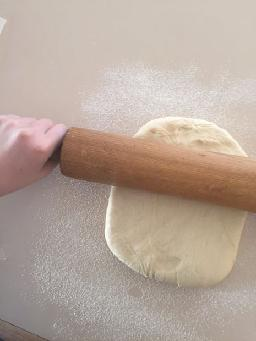

'Laminating' involves rolling, folding, and turning the dough.


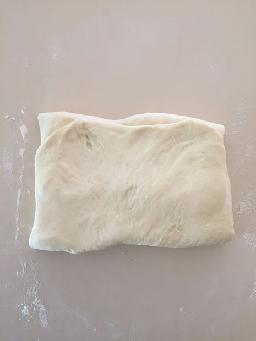

Roll out length-ways to a rectangle which is, again, approximately 35 cm x 20 cm (13" x 7.8").


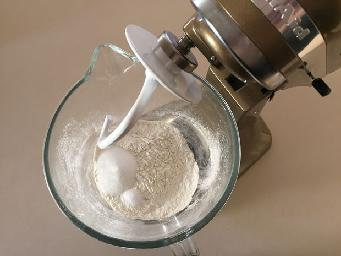

Of course, more primitive technology such as a fork (and/or hands) will do the job just as well!1)  Microwave the (25g) butter until completely melted.


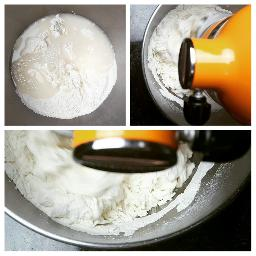

To make the dough, combine the Chinese dumpling flour, 4 grams of salt, and the water in the bowl of a stand mixer, with a dough hook.


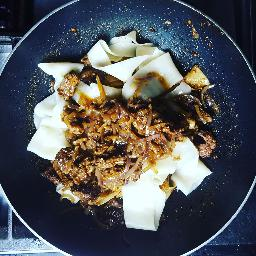

Once all the noodles are in the wok, add the onion lamb mixture, turn on the heat, and gently toss everything together.


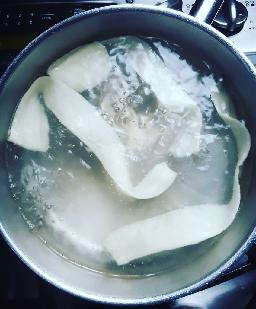

Boil a large pot of water for the noodles.


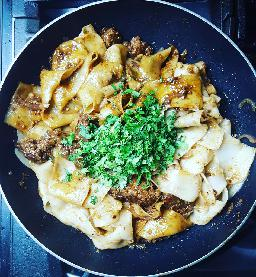

Add the cilantro and gently toss.


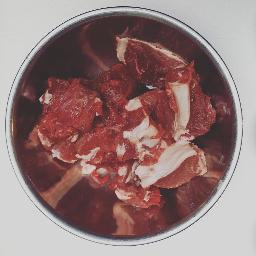

Debone the lamb loins.


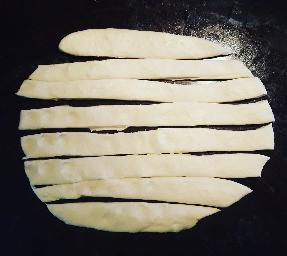

Slice the rectangular dough.


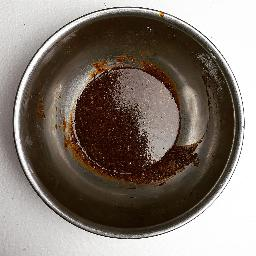

In a small bowl, combine the soy sauce, 2 tsp ground cumin, cornstarch, dark soy sauce, 1 tsp ground coriander, Korean chili flakes, toasted sesame oil, garlic powder, 1/2 tsp ground white pepper, and 1/4 tsp ground sichuan peppercorn for the marinating sauce.


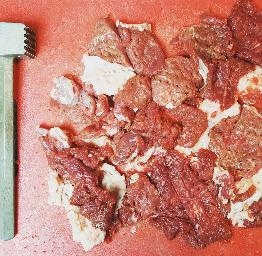

Tenderize the lamb and slice.


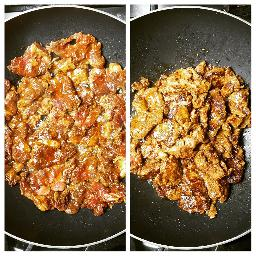

Heat a large wok over high heat.


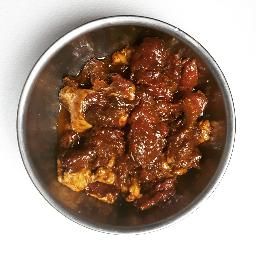

Mix 2 tbsp of canola oil with the marinated lamb.


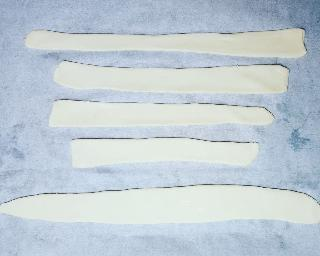

Take a slice and flatten it with the palm of your hand or use a pasta maker.


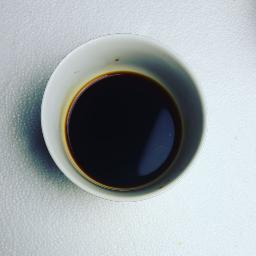

In another small bowl, combine the soy sauce, sake, rice wine vinegar, brown sugar, MSG, and 1/4 tsp salt for the noodle sauce part 2.


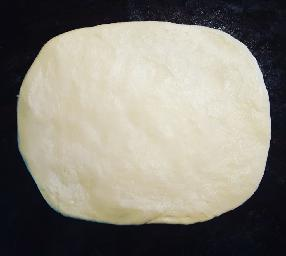

Fill a shallow bowl with 2 tbsp canola oil for dipping your hands to handle the dough.


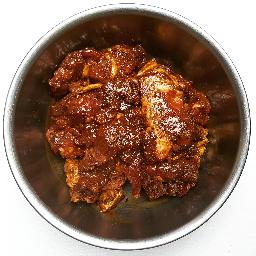

With your hands, combine the lamb and the marinating sauce.


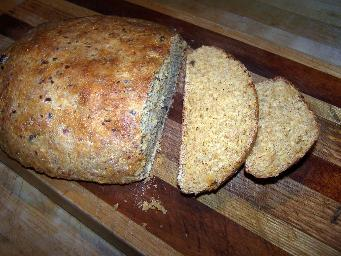


Spread some butter on the top of the loaf while it is still warm.


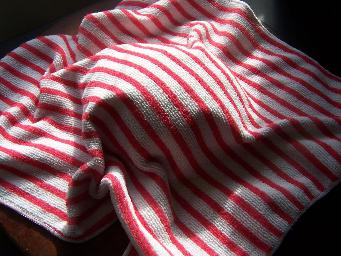


Set dough ball in a warm place, on a greased surface (plate or baking stone) and cover with a clean dishtowel.


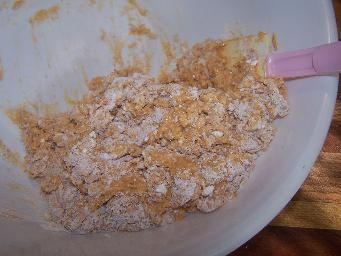


Add the wet to the dry and mix.


In [29]:
for index in range(100,120):
  p = images[index]
  cap = captions[index] 
  #print(p)
  #print(cap)
  f = cv2.imread('train/images-qa/'+p)
  cv2_imshow(f)
  print(cap)